## mount & import

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/My Drive/통계분석실습')  ##왼쪽 탭(파일모양)에서 드리이브 마운트 설정
import pandas as pd
import torch
import numpy as np
import torchvision.transforms as transforms
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import datetime
import csv
import time
import copy
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import models
from torchvision import transforms
from torchvision import datasets
from torch.autograd import Variable
from torch.optim import lr_scheduler
from PIL import Image
from torch.utils.data import Dataset, DataLoader

from __future__ import print_function
from __future__ import division
import random
import time
import math
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from skimage.io import imread
from glob import glob

plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['random', 'copy', 'imread']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [ ]:
#trainLabel.csv 가 어떻게 구성되어있는지 본다.
df2=pd.read_csv("trainLabels.csv")    
df2

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1
...,...,...
35121,44347_right,0
35122,44348_left,0
35123,44348_right,0
35124,44349_left,0


In [ ]:
#df2 클래스가 어떻게 구성되어있는지 파악해본다
classes = list(df2['level'].unique())
print(classes)

[0, 1, 2, 4, 3]


In [ ]:
#level0이 압도적으로 많은 class imbalance 문제가 나타났다.
df2.groupby('level').count()

,image
level,
0,25810
1,2443
2,5292
3,873
4,708


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35126 entries, 0 to 35125
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   35126 non-null  object
 1   level   35126 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 549.0+ KB


In [ ]:
!ls

'제목 없는 문서.gdoc'	    kaggle.json      'trainLabels.csv (1).zip'
'데이터셋, 참고자료.gdoc'   new_train	     'Untitled7 (1).ipynb'
 프로퍼절.gdoc		    train	      Untitled7.ipynb
'통기계 프로젝트.ipynb'     trainLabels.csv


In [ ]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

Populating the interactive namespace from numpy and matplotlib


###IMG_df

In [ ]:
#안구 사진들은 다음과 같은 경로의 폴더에 담겨있다.
IMG_path='/content/drive/"My Drive"/통계분석실습/train'

In [ ]:
IMG_lst = !ls {IMG_path}
IMG_lst[:30]

['10003_left.jpeg   12448_left.jpeg   14788_left.jpeg   17158_left.jpeg',
 '10003_right.jpeg  12448_right.jpeg  14788_right.jpeg  17158_right.jpeg',
 '10007_left.jpeg   12450_left.jpeg   1478_left.jpeg    17163_left.jpeg',
 '10007_right.jpeg  12450_right.jpeg  1478_right.jpeg   17163_right.jpeg',
 '10009_left.jpeg   12451_left.jpeg   14793_left.jpeg   17169_left.jpeg',
 '10009_right.jpeg  12451_right.jpeg  14793_right.jpeg  17169_right.jpeg',
 '1000_left.jpeg\t  12452_left.jpeg   14805_left.jpeg   17170_left.jpeg',
 '1000_right.jpeg   12452_right.jpeg  14805_right.jpeg  17170_right.jpeg',
 '10010_left.jpeg   12458_left.jpeg   14806_left.jpeg   17173_left.jpeg',
 '10010_right.jpeg  12458_right.jpeg  14806_right.jpeg  17173_right.jpeg',
 '10013_left.jpeg   12460_left.jpeg   14807_left.jpeg   17176_left.jpeg',
 '10013_right.jpeg  12460_right.jpeg  14807_right.jpeg  17176_right.jpeg',
 '10014_left.jpeg   12461_left.jpeg   1480_left.jpeg    17179_left.jpeg',
 '10014_right.jpeg  12461_right.

In [ ]:
IMG_list = []
for i in range(2102):
  IMG_list = numpy.append(IMG_list, IMG_lst[i].split('  '))

In [ ]:
print(IMG_list[:30])
print("전체원소개수: ",len(IMG_list))

['10003_left.jpeg' ' 12448_left.jpeg' ' 14788_left.jpeg'
 ' 17158_left.jpeg' '10003_right.jpeg' '12448_right.jpeg'
 '14788_right.jpeg' '17158_right.jpeg' '10007_left.jpeg'
 ' 12450_left.jpeg' ' 1478_left.jpeg' '' '17163_left.jpeg'
 '10007_right.jpeg' '12450_right.jpeg' '1478_right.jpeg'
 ' 17163_right.jpeg' '10009_left.jpeg' ' 12451_left.jpeg'
 ' 14793_left.jpeg' ' 17169_left.jpeg' '10009_right.jpeg'
 '12451_right.jpeg' '14793_right.jpeg' '17169_right.jpeg'
 '1000_left.jpeg\t' '12452_left.jpeg' ' 14805_left.jpeg'
 ' 17170_left.jpeg' '1000_right.jpeg']
전체원소개수:  8629


In [ ]:
IMG_df=pd.DataFrame(data=IMG_list)
IMG_df=IMG_df.rename(columns={0:"path"})

In [ ]:
IMG_df=IMG_df['path'].str.strip()
IMG_df

0        10003_left.jpeg
1        12448_left.jpeg
2        14788_left.jpeg
3        17158_left.jpeg
4       10003_right.jpeg
              ...       
8624     17154_left.jpeg
8625       194_left.jpeg
8626    12447_right.jpeg
8627    14784_right.jpeg
8628    17154_right.jpeg
Name: path, Length: 8629, dtype: object

In [ ]:
path='/content/drive/My Drive/통계분석실습/train/16631_left.jpeg'

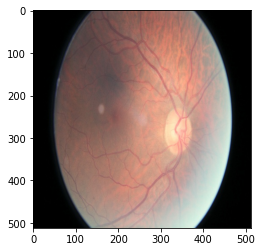

In [ ]:
#이미지 잘 보이는지 확인
img=mpimg.imread(path)
imgplot=plt.imshow(img)
plt.show()

In [ ]:
#train 이미지 데이터수 확인
f_list = os.listdir('/content/drive/My Drive/통계분석실습/train')

print(len(f_list))


8407


trainLabels.csv에는 35126개의 데이터셋이 있었지만, 실제 사진은 8407개에 불과했다.
따라서 실제 사진을 반영한 새로운 데이터셋 retina_df 를 만들 필요가 있어 보인다.

In [ ]:
base_image_dir = IMG_path
retina_df = df2

retina_df['PatientId'] = retina_df['image'].map(lambda x: x.split('_')[0])

retina_df['path'] = retina_df['image'].map(lambda x: os.path.join('{}.jpeg'.format(x)))
retina_df['exists'] = retina_df['path'].map(os.path.exists)
print(retina_df['exists'].sum(), 'images found of', retina_df.shape[0], 'total')
retina_df['eye'] = retina_df['image'].map(lambda x: 1 if x.split('_')[-1]=='left' else 0)
from keras.utils.np_utils import to_categorical
retina_df['level_cat'] = retina_df['level'].map(lambda x: to_categorical(x, 1+retina_df['level'].max()))



#retina_df.dropna(inplace = True)
#retina_df = retina_df[retina_df['exists']]
#retina_df.sample(3)
retina_df

0 images found of 35126 total


Using TensorFlow backend.


,image,level,PatientId,path,exists,eye,level_cat
0,10_left,0,10,10_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
1,10_right,0,10,10_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
2,13_left,0,13,13_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
3,13_right,0,13,13_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
4,15_left,1,15,15_left.jpeg,False,1,"[0.0, 1.0, 0.0, 0.0, 0.0]"
...,...,...,...,...,...,...,...
35121,44347_right,0,44347,44347_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
35122,44348_left,0,44348,44348_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
35123,44348_right,0,44348,44348_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
35124,44349_left,0,44349,44349_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"


In [ ]:
IMG_df 

0        10003_left.jpeg
1        12448_left.jpeg
2        14788_left.jpeg
3        17158_left.jpeg
4       10003_right.jpeg
              ...       
8624     17154_left.jpeg
8625       194_left.jpeg
8626    12447_right.jpeg
8627    14784_right.jpeg
8628    17154_right.jpeg
Name: path, Length: 8629, dtype: object

In [ ]:
retina_df=pd.merge(retina_df, IMG_df, how='inner', on='path')

In [ ]:
retina_df

,image,level,PatientId,path,exists,eye,level_cat
0,10_left,0,10,10_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
1,10_right,0,10,10_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
2,13_left,0,13,13_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
3,13_right,0,13,13_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
4,15_left,1,15,15_left.jpeg,False,1,"[0.0, 1.0, 0.0, 0.0, 0.0]"
...,...,...,...,...,...,...,...
8402,19493_right,1,19493,19493_right.jpeg,False,0,"[0.0, 1.0, 0.0, 0.0, 0.0]"
8403,19494_left,0,19494,19494_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"
8404,19494_right,0,19494,19494_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
8405,19498_left,0,19498,19498_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]"


In [ ]:
retina_df.groupby('level').count()

,image,PatientId,path,exists,eye,level_cat
level,,,,,,
0,6149,6149,6149,6149,6149,6149
1,588,588,588,588,588,588
2,1283,1283,1283,1283,1283,1283
3,221,221,221,221,221,221
4,166,166,166,166,166,166


###setup code


In [ ]:
# chunk 1.1
!pip install git+https://github.com/deepvision-class/starter-code

  Cloning https://github.com/deepvision-class/starter-code to /tmp/pip-req-build-7gw6ozfr
  Running command git clone -q https://github.com/deepvision-class/starter-code /tmp/pip-req-build-7gw6ozfr
  Created wheel for Colab-Utils: filename=Colab_Utils-0.1.dev0-cp36-none-any.whl size=10323 sha256=94b6fb861cd2555abe1b779dfb06973db3f5071ba3cacfa211119f4ca27e40ba
  Stored in directory: /tmp/pip-ephem-wheel-cache-upnxg69d/wheels/63/d1/27/a208931527abb98d326d00209f46c80c9d745851d6a1defd10
Successfully built Colab-Utils


In [ ]:
import coutils
from coutils import fix_random_seed
from collections import OrderedDict
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as dset
import torchvision.transforms as T
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

In [ ]:
# chunk 1.5
dtype = torch.float
ltype = torch.long

if torch.cuda.is_available():
  device = torch.device('cuda:0')
else:
  device = torch.device('cpu')

# Constant to control how frequently we print train loss
print_every = 100

print('using device:', device)

using device: cuda:0


In [ ]:
# chunk 1.6
# x.shape -> (3,2,2,2)
# flatten(x).shape -> (3,8)
def flatten(x, start_dim=1, end_dim=-1):
  return x.flatten(start_dim=start_dim, end_dim=end_dim)

###resizing

In [ ]:
import os
import sys
# from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from skimage import io
from skimage.transform import resize
import numpy as np

In [ ]:
def create_directory(directory):
    '''
    Creates a new folder in the specified directory if the folder doesn't exist.
    INPUT
        directory: Folder to be created, called as "folder/".
    OUTPUT
        New folder in the current directory.
    '''
    if not os.path.exists(directory):
        os.makedirs(directory)

In [ ]:
def crop_and_resize_images(path, new_path, cropx, cropy, img_size=128):
    '''
    Crops, resizes, and stores all images from a directory in a new directory.
    INPUT
        path: Path where the current, unscaled images are contained.
        new_path: Path to save the resized images.
        img_size: New size for the rescaled images.
    OUTPUT
        All images cropped, resized, and saved from the old folder to the new folder.
    '''
    create_directory(new_path)
    dirs = [l for l in os.listdir(path) if l != '.DS_Store']
    total = 0

    for item in dirs:
        img = io.imread(path+item)
        y,x,channel = img.shape
        startx = x//2-(cropx//2)
        starty = y//2-(cropy//2)
        img = img[starty:starty+cropy,startx:startx+cropx]
        img = resize(img, (128,128))
        io.imsave(str(new_path + item), img)
        total += 1
        print("Saving: ", item, total)

In [ ]:
path='/content/drive/My Drive/new_train/'
new_path='/content/drive/My Drive/new_train_/'

In [ ]:
if __name__ == '__main__':
    crop_and_resize_images(path=path, new_path=new_path, cropx=1800, cropy=1800, img_size=128)
    crop_and_resize_images(path=path, new_path=new_path, cropx=1800, cropy=1800, img_size=128)

Saving:  14825_left_mir.jpeg 1
Saving:  14825_right_mir.jpeg 2


Saving:  14834_left_mir.jpeg 3
Saving:  14834_right_mir.jpeg 4
Saving:  14844_left_mir.jpeg 5
Saving:  14844_right_mir.jpeg 6
Saving:  14846_left_mir.jpeg 7
Saving:  14846_right_mir.jpeg 8
Saving:  14849_left_mir.jpeg 9
Saving:  14849_right_mir.jpeg 10
Saving:  14850_left_mir.jpeg 11


Saving:  14855_left_mir.jpeg 12
Saving:  14855_right_mir.jpeg 13
Saving:  14876_left_mir.jpeg 14
Saving:  14876_right_mir.jpeg 15
Saving:  14880_left_mir.jpeg 16
Saving:  14880_right_mir.jpeg 17
Saving:  14898_right_mir.jpeg 18
Saving:  14901_left_mir.jpeg 19
Saving:  14902_left_mir.jpeg 20


Saving:  14902_right_mir.jpeg 21
Saving:  14908_left_mir.jpeg 22
Saving:  14908_right_mir.jpeg 23
Saving:  14915_left_mir.jpeg 24


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right_mir.jpeg is a low contrast image


Saving:  14915_right_mir.jpeg 25
Saving:  14927_left_mir.jpeg 26
Saving:  14927_right_mir.jpeg 27
Saving:  14936_left_mir.jpeg 28
Saving:  14936_right_mir.jpeg 29
Saving:  14938_left_mir.jpeg 30
Saving:  14961_left_mir.jpeg 31
Saving:  14961_right_mir.jpeg 32
Saving:  14967_left_mir.jpeg 33
Saving:  14976_left_mir.jpeg 34


Saving:  14976_right_mir.jpeg 35
Saving:  14981_left_mir.jpeg 36
Saving:  14987_left_mir.jpeg 37
Saving:  14989_left_mir.jpeg 38
Saving:  14992_left_mir.jpeg 39
Saving:  14992_right_mir.jpeg 40
Saving:  15000_left_mir.jpeg 41
Saving:  15000_right_mir.jpeg 42


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15038_right_mir.jpeg is a low contrast image


Saving:  15023_right_mir.jpeg 43
Saving:  15029_left_mir.jpeg 44
Saving:  15029_right_mir.jpeg 45
Saving:  15034_left_mir.jpeg 46
Saving:  15034_right_mir.jpeg 47
Saving:  15037_left_mir.jpeg 48
Saving:  15038_left_mir.jpeg 49
Saving:  15038_right_mir.jpeg 50
Saving:  15056_left_mir.jpeg 51


Saving:  15056_right_mir.jpeg 52
Saving:  15066_right_mir.jpeg 53
Saving:  15074_left_mir.jpeg 54
Saving:  15074_right_mir.jpeg 55
Saving:  15080_left_mir.jpeg 56
Saving:  15083_left_mir.jpeg 57
Saving:  15083_right_mir.jpeg 58
Saving:  15095_left_mir.jpeg 59


Saving:  15095_right_mir.jpeg 60
Saving:  15114_left_mir.jpeg 61
Saving:  15114_right_mir.jpeg 62


Saving:  15117_left_mir.jpeg 63
Saving:  15117_right_mir.jpeg 64
Saving:  15120_left_mir.jpeg 65
Saving:  15120_right_mir.jpeg 66
Saving:  15138_left_mir.jpeg 67
Saving:  15138_right_mir.jpeg 68
Saving:  15149_left_mir.jpeg 69
Saving:  15149_right_mir.jpeg 70
Saving:  15151_left_mir.jpeg 71


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left_mir.jpeg is a low contrast image


Saving:  15154_left_mir.jpeg 72
Saving:  15154_right_mir.jpeg 73
Saving:  15185_left_mir.jpeg 74
Saving:  15185_right_mir.jpeg 75
Saving:  15190_right_mir.jpeg 76
Saving:  15193_left_mir.jpeg 77
Saving:  15193_right_mir.jpeg 78
Saving:  15194_left_mir.jpeg 79


Saving:  15222_left_mir.jpeg 80
Saving:  15222_right_mir.jpeg 81
Saving:  15225_right_mir.jpeg 82
Saving:  15248_left_mir.jpeg 83
Saving:  15257_left_mir.jpeg 84
Saving:  15257_right_mir.jpeg 85
Saving:  15273_left_mir.jpeg 86
Saving:  15273_right_mir.jpeg 87
Saving:  15274_left_mir.jpeg 88


Saving:  15274_right_mir.jpeg 89
Saving:  15276_left_mir.jpeg 90
Saving:  15276_right_mir.jpeg 91
Saving:  15278_left_mir.jpeg 92
Saving:  15278_right_mir.jpeg 93
Saving:  15288_left_mir.jpeg 94
Saving:  15288_right_mir.jpeg 95
Saving:  15297_left_mir.jpeg 96
Saving:  15297_right_mir.jpeg 97
Saving:  15302_left_mir.jpeg 98


Saving:  15302_right_mir.jpeg 99
Saving:  15306_left_mir.jpeg 100
Saving:  15306_right_mir.jpeg 101
Saving:  15309_left_mir.jpeg 102
Saving:  15309_right_mir.jpeg 103
Saving:  15319_left_mir.jpeg 104
Saving:  15319_right_mir.jpeg 105
Saving:  15343_left_mir.jpeg 106
Saving:  15343_right_mir.jpeg 107


Saving:  15351_right_mir.jpeg 108
Saving:  15354_left_mir.jpeg 109
Saving:  15354_right_mir.jpeg 110
Saving:  15375_right_mir.jpeg 111
Saving:  15376_left_mir.jpeg 112
Saving:  15376_right_mir.jpeg 113
Saving:  15383_left_mir.jpeg 114
Saving:  15385_left_mir.jpeg 115
Saving:  15385_right_mir.jpeg 116
Saving:  15388_left_mir.jpeg 117


Saving:  15388_right_mir.jpeg 118
Saving:  15396_left_mir.jpeg 119
Saving:  15396_right_mir.jpeg 120
Saving:  15402_left_mir.jpeg 121
Saving:  15402_right_mir.jpeg 122
Saving:  15414_left_mir.jpeg 123
Saving:  15414_right_mir.jpeg 124
Saving:  15438_right_mir.jpeg 125
Saving:  15442_left_mir.jpeg 126


Saving:  15442_right_mir.jpeg 127
Saving:  15450_left_mir.jpeg 128
Saving:  15450_right_mir.jpeg 129
Saving:  15459_left_mir.jpeg 130
Saving:  15459_right_mir.jpeg 131
Saving:  15468_left_mir.jpeg 132
Saving:  15468_right_mir.jpeg 133
Saving:  15476_left_mir.jpeg 134
Saving:  15476_right_mir.jpeg 135
Saving:  15481_left_mir.jpeg 136


Saving:  15481_right_mir.jpeg 137
Saving:  15487_left_mir.jpeg 138
Saving:  15487_right_mir.jpeg 139
Saving:  15493_left_mir.jpeg 140
Saving:  15493_right_mir.jpeg 141
Saving:  15509_left_mir.jpeg 142
Saving:  15509_right_mir.jpeg 143
Saving:  15515_left_mir.jpeg 144
Saving:  15515_right_mir.jpeg 145
Saving:  15523_left_mir.jpeg 146


Saving:  15523_right_mir.jpeg 147
Saving:  15528_right_mir.jpeg 148
Saving:  15529_left_mir.jpeg 149
Saving:  15529_right_mir.jpeg 150
Saving:  15530_right_mir.jpeg 151
Saving:  15531_left_mir.jpeg 152
Saving:  15531_right_mir.jpeg 153
Saving:  15544_left_mir.jpeg 154


Saving:  15544_right_mir.jpeg 155
Saving:  15554_right_mir.jpeg 156
Saving:  15557_left_mir.jpeg 157
Saving:  15557_right_mir.jpeg 158
Saving:  15576_right_mir.jpeg 159
Saving:  15578_left_mir.jpeg 160
Saving:  15578_right_mir.jpeg 161
Saving:  15582_left_mir.jpeg 162
Saving:  15582_right_mir.jpeg 163


Saving:  15590_left_mir.jpeg 164
Saving:  15590_right_mir.jpeg 165
Saving:  15593_left_mir.jpeg 166
Saving:  15593_right_mir.jpeg 167
Saving:  15594_left_mir.jpeg 168
Saving:  15594_right_mir.jpeg 169
Saving:  15602_right_mir.jpeg 170
Saving:  15615_left_mir.jpeg 171
Saving:  15615_right_mir.jpeg 172


Saving:  15625_left_mir.jpeg 173
Saving:  15627_left_mir.jpeg 174
Saving:  15631_left_mir.jpeg 175
Saving:  15631_right_mir.jpeg 176
Saving:  15636_left_mir.jpeg 177
Saving:  15636_right_mir.jpeg 178
Saving:  15639_left_mir.jpeg 179
Saving:  15639_right_mir.jpeg 180
Saving:  15640_left_mir.jpeg 181
Saving:  15640_right_mir.jpeg 182


Saving:  15645_right_mir.jpeg 183
Saving:  15656_left_mir.jpeg 184
Saving:  15656_right_mir.jpeg 185
Saving:  15667_left_mir.jpeg 186
Saving:  15688_left_mir.jpeg 187
Saving:  15688_right_mir.jpeg 188


Saving:  15690_left_mir.jpeg 189
Saving:  15695_right_mir.jpeg 190
Saving:  15696_left_mir.jpeg 191
Saving:  15696_right_mir.jpeg 192
Saving:  15708_left_mir.jpeg 193
Saving:  15711_left_mir.jpeg 194
Saving:  15711_right_mir.jpeg 195
Saving:  15712_left_mir.jpeg 196
Saving:  15712_right_mir.jpeg 197
Saving:  15750_left_mir.jpeg 198


Saving:  15750_right_mir.jpeg 199
Saving:  15756_left_mir.jpeg 200
Saving:  15756_right_mir.jpeg 201
Saving:  15763_left_mir.jpeg 202
Saving:  15763_right_mir.jpeg 203
Saving:  15775_right_mir.jpeg 204
Saving:  15793_left_mir.jpeg 205
Saving:  15793_right_mir.jpeg 206


Saving:  15795_left_mir.jpeg 207
Saving:  15795_right_mir.jpeg 208
Saving:  15797_left_mir.jpeg 209
Saving:  15798_left_mir.jpeg 210
Saving:  15798_right_mir.jpeg 211
Saving:  15799_left_mir.jpeg 212
Saving:  15799_right_mir.jpeg 213
Saving:  15835_left_mir.jpeg 214
Saving:  15835_right_mir.jpeg 215


Saving:  15855_left_mir.jpeg 216
Saving:  15855_right_mir.jpeg 217
Saving:  15868_left_mir.jpeg 218
Saving:  15868_right_mir.jpeg 219
Saving:  15870_left_mir.jpeg 220
Saving:  15870_right_mir.jpeg 221
Saving:  15885_left_mir.jpeg 222
Saving:  15885_right_mir.jpeg 223


Saving:  15886_right_mir.jpeg 224
Saving:  15897_left_mir.jpeg 225
Saving:  15898_left_mir.jpeg 226
Saving:  15898_right_mir.jpeg 227
Saving:  15902_right_mir.jpeg 228
Saving:  15914_left_mir.jpeg 229
Saving:  15914_right_mir.jpeg 230
Saving:  15918_left_mir.jpeg 231
Saving:  15918_right_mir.jpeg 232
Saving:  15923_left_mir.jpeg 233


Saving:  15923_right_mir.jpeg 234
Saving:  15930_left_mir.jpeg 235
Saving:  15930_right_mir.jpeg 236
Saving:  15935_left_mir.jpeg 237
Saving:  15935_right_mir.jpeg 238
Saving:  15938_left_mir.jpeg 239
Saving:  15938_right_mir.jpeg 240


Saving:  15941_left_mir.jpeg 241
Saving:  15941_right_mir.jpeg 242
Saving:  15944_left_mir.jpeg 243
Saving:  15944_right_mir.jpeg 244
Saving:  15954_left_mir.jpeg 245
Saving:  15954_right_mir.jpeg 246
Saving:  15970_left_mir.jpeg 247
Saving:  15970_right_mir.jpeg 248
Saving:  15975_left_mir.jpeg 249


Saving:  15975_right_mir.jpeg 250
Saving:  15981_left_mir.jpeg 251
Saving:  15981_right_mir.jpeg 252
Saving:  15988_left_mir.jpeg 253
Saving:  15988_right_mir.jpeg 254
Saving:  15994_left_mir.jpeg 255
Saving:  16007_left_mir.jpeg 256
Saving:  16007_right_mir.jpeg 257


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16025_left_mir.jpeg is a low contrast image


Saving:  16009_left_mir.jpeg 258
Saving:  16009_right_mir.jpeg 259
Saving:  16011_left_mir.jpeg 260
Saving:  16011_right_mir.jpeg 261
Saving:  16022_left_mir.jpeg 262
Saving:  16022_right_mir.jpeg 263
Saving:  16025_left_mir.jpeg 264
Saving:  16025_right_mir.jpeg 265
Saving:  16030_left_mir.jpeg 266


Saving:  16030_right_mir.jpeg 267
Saving:  16031_left_mir.jpeg 268
Saving:  16031_right_mir.jpeg 269
Saving:  16035_left_mir.jpeg 270
Saving:  16036_left_mir.jpeg 271


Saving:  16038_left_mir.jpeg 272
Saving:  16038_right_mir.jpeg 273
Saving:  16042_left_mir.jpeg 274
Saving:  16042_right_mir.jpeg 275
Saving:  16043_left_mir.jpeg 276
Saving:  16043_right_mir.jpeg 277
Saving:  16046_left_mir.jpeg 278
Saving:  16046_right_mir.jpeg 279
Saving:  16061_left_mir.jpeg 280
Saving:  16076_left_mir.jpeg 281


Saving:  16095_left_mir.jpeg 282
Saving:  16095_right_mir.jpeg 283
Saving:  16114_left_mir.jpeg 284
Saving:  16114_right_mir.jpeg 285
Saving:  16134_left_mir.jpeg 286
Saving:  16134_right_mir.jpeg 287
Saving:  16138_left_mir.jpeg 288


Saving:  16138_right_mir.jpeg 289
Saving:  16150_left_mir.jpeg 290
Saving:  16150_right_mir.jpeg 291
Saving:  16154_left_mir.jpeg 292
Saving:  16170_left_mir.jpeg 293
Saving:  16171_right_mir.jpeg 294
Saving:  16197_left_mir.jpeg 295


Saving:  16197_right_mir.jpeg 296
Saving:  16201_left_mir.jpeg 297
Saving:  16201_right_mir.jpeg 298
Saving:  16223_right_mir.jpeg 299
Saving:  16224_left_mir.jpeg 300
Saving:  16238_left_mir.jpeg 301
Saving:  16249_right_mir.jpeg 302
Saving:  16268_right_mir.jpeg 303
Saving:  16280_left_mir.jpeg 304


Saving:  16280_right_mir.jpeg 305
Saving:  16287_right_mir.jpeg 306
Saving:  16289_left_mir.jpeg 307
Saving:  16289_right_mir.jpeg 308


Saving:  16290_left_mir.jpeg 309
Saving:  16290_right_mir.jpeg 310
Saving:  16294_left_mir.jpeg 311
Saving:  16294_right_mir.jpeg 312
Saving:  16309_left_mir.jpeg 313
Saving:  16309_right_mir.jpeg 314
Saving:  16327_left_mir.jpeg 315
Saving:  16327_right_mir.jpeg 316
Saving:  16341_right_mir.jpeg 317
Saving:  16350_left_mir.jpeg 318


Saving:  16350_right_mir.jpeg 319
Saving:  16351_left_mir.jpeg 320
Saving:  16360_left_mir.jpeg 321
Saving:  16360_right_mir.jpeg 322
Saving:  16365_left_mir.jpeg 323
Saving:  16365_right_mir.jpeg 324
Saving:  16374_left_mir.jpeg 325
Saving:  16374_right_mir.jpeg 326


Saving:  16375_right_mir.jpeg 327
Saving:  16386_left_mir.jpeg 328
Saving:  16386_right_mir.jpeg 329
Saving:  16391_left_mir.jpeg 330
Saving:  16391_right_mir.jpeg 331
Saving:  16392_left_mir.jpeg 332
Saving:  16392_right_mir.jpeg 333
Saving:  16408_left_mir.jpeg 334
Saving:  16408_right_mir.jpeg 335
Saving:  16412_left_mir.jpeg 336
Saving:  16412_right_mir.jpeg 337


Saving:  16413_left_mir.jpeg 338
Saving:  16413_right_mir.jpeg 339
Saving:  16429_left_mir.jpeg 340


Saving:  16429_right_mir.jpeg 341
Saving:  16439_right_mir.jpeg 342
Saving:  16445_left_mir.jpeg 343
Saving:  16445_right_mir.jpeg 344
Saving:  16450_left_mir.jpeg 345
Saving:  16450_right_mir.jpeg 346
Saving:  16452_left_mir.jpeg 347
Saving:  16452_right_mir.jpeg 348
Saving:  16458_left_mir.jpeg 349


Saving:  16458_right_mir.jpeg 350
Saving:  16488_left_mir.jpeg 351
Saving:  16488_right_mir.jpeg 352
Saving:  16509_left_mir.jpeg 353
Saving:  16510_left_mir.jpeg 354
Saving:  16510_right_mir.jpeg 355
Saving:  16515_left_mir.jpeg 356


Saving:  16515_right_mir.jpeg 357
Saving:  16520_left_mir.jpeg 358
Saving:  16524_left_mir.jpeg 359
Saving:  16524_right_mir.jpeg 360
Saving:  16545_left_mir.jpeg 361
Saving:  16545_right_mir.jpeg 362
Saving:  16558_left_mir.jpeg 363
Saving:  16561_left_mir.jpeg 364
Saving:  16561_right_mir.jpeg 365
Saving:  16565_left_mir.jpeg 366


Saving:  16565_right_mir.jpeg 367
Saving:  16569_right_mir.jpeg 368
Saving:  16576_left_mir.jpeg 369
Saving:  16581_left_mir.jpeg 370
Saving:  16581_right_mir.jpeg 371
Saving:  16582_left_mir.jpeg 372
Saving:  16582_right_mir.jpeg 373


Saving:  16585_left_mir.jpeg 374
Saving:  16585_right_mir.jpeg 375
Saving:  16597_left_mir.jpeg 376
Saving:  16597_right_mir.jpeg 377
Saving:  16600_left_mir.jpeg 378
Saving:  16600_right_mir.jpeg 379
Saving:  16602_left_mir.jpeg 380


Saving:  16602_right_mir.jpeg 381
Saving:  16607_left_mir.jpeg 382
Saving:  16609_left_mir.jpeg 383
Saving:  16609_right_mir.jpeg 384
Saving:  16612_right_mir.jpeg 385


Saving:  16624_left_mir.jpeg 386
Saving:  16624_right_mir.jpeg 387
Saving:  16627_left_mir.jpeg 388
Saving:  16627_right_mir.jpeg 389
Saving:  16628_left_mir.jpeg 390
Saving:  16628_right_mir.jpeg 391
Saving:  16629_left_mir.jpeg 392
Saving:  16629_right_mir.jpeg 393
Saving:  16633_left_mir.jpeg 394
Saving:  16633_right_mir.jpeg 395


Saving:  16641_left_mir.jpeg 396
Saving:  16641_right_mir.jpeg 397
Saving:  16651_left_mir.jpeg 398
Saving:  16651_right_mir.jpeg 399
Saving:  16658_right_mir.jpeg 400
Saving:  16672_right_mir.jpeg 401
Saving:  16692_left_mir.jpeg 402
Saving:  16692_right_mir.jpeg 403


Saving:  16697_right_mir.jpeg 404
Saving:  16718_left_mir.jpeg 405
Saving:  16718_right_mir.jpeg 406
Saving:  16727_left_mir.jpeg 407
Saving:  16727_right_mir.jpeg 408
Saving:  16732_left_mir.jpeg 409
Saving:  16740_left_mir.jpeg 410
Saving:  16740_right_mir.jpeg 411
Saving:  16741_left_mir.jpeg 412


Saving:  16741_right_mir.jpeg 413
Saving:  16746_left_mir.jpeg 414
Saving:  16746_right_mir.jpeg 415
Saving:  16748_left_mir.jpeg 416
Saving:  16748_right_mir.jpeg 417
Saving:  16754_right_mir.jpeg 418
Saving:  16757_left_mir.jpeg 419
Saving:  16757_right_mir.jpeg 420
Saving:  16759_left_mir.jpeg 421


Saving:  16759_right_mir.jpeg 422
Saving:  16774_left_mir.jpeg 423
Saving:  16777_left_mir.jpeg 424
Saving:  16777_right_mir.jpeg 425
Saving:  16778_right_mir.jpeg 426
Saving:  16802_left_mir.jpeg 427
Saving:  16802_right_mir.jpeg 428
Saving:  16808_left_mir.jpeg 429
Saving:  16815_left_mir.jpeg 430
Saving:  16818_left_mir.jpeg 431


Saving:  16818_right_mir.jpeg 432
Saving:  16832_left_mir.jpeg 433
Saving:  16832_right_mir.jpeg 434
Saving:  16835_left_mir.jpeg 435
Saving:  16835_right_mir.jpeg 436
Saving:  16857_left_mir.jpeg 437
Saving:  16857_right_mir.jpeg 438


Saving:  16871_left_mir.jpeg 439
Saving:  16871_right_mir.jpeg 440
Saving:  16881_left_mir.jpeg 441
Saving:  16881_right_mir.jpeg 442
Saving:  16882_left_mir.jpeg 443
Saving:  16882_right_mir.jpeg 444
Saving:  16886_left_mir.jpeg 445
Saving:  16886_right_mir.jpeg 446
Saving:  16907_left_mir.jpeg 447
Saving:  16907_right_mir.jpeg 448
Saving:  16917_right_mir.jpeg 449


Saving:  16920_left_mir.jpeg 450
Saving:  16936_left_mir.jpeg 451
Saving:  16936_right_mir.jpeg 452
Saving:  16937_left_mir.jpeg 453
Saving:  16937_right_mir.jpeg 454
Saving:  16941_left_mir.jpeg 455


Saving:  16941_right_mir.jpeg 456
Saving:  16947_left_mir.jpeg 457
Saving:  16947_right_mir.jpeg 458
Saving:  16963_left_mir.jpeg 459
Saving:  16963_right_mir.jpeg 460
Saving:  16969_left_mir.jpeg 461
Saving:  16969_right_mir.jpeg 462
Saving:  16971_left_mir.jpeg 463
Saving:  16971_right_mir.jpeg 464
Saving:  16991_left_mir.jpeg 465


Saving:  16991_right_mir.jpeg 466
Saving:  17004_left_mir.jpeg 467
Saving:  17004_right_mir.jpeg 468
Saving:  17005_left_mir.jpeg 469
Saving:  17005_right_mir.jpeg 470
Saving:  17009_left_mir.jpeg 471
Saving:  17028_right_mir.jpeg 472
Saving:  17030_left_mir.jpeg 473


Saving:  17030_right_mir.jpeg 474
Saving:  17036_left_mir.jpeg 475
Saving:  17036_right_mir.jpeg 476
Saving:  17037_right_mir.jpeg 477
Saving:  17040_left_mir.jpeg 478
Saving:  17040_right_mir.jpeg 479
Saving:  17042_right_mir.jpeg 480
Saving:  17044_left_mir.jpeg 481
Saving:  17044_right_mir.jpeg 482
Saving:  17049_left_mir.jpeg 483


Saving:  17049_right_mir.jpeg 484
Saving:  17052_left_mir.jpeg 485
Saving:  17052_right_mir.jpeg 486
Saving:  17068_left_mir.jpeg 487
Saving:  17075_left_mir.jpeg 488
Saving:  17075_right_mir.jpeg 489
Saving:  17086_left_mir.jpeg 490
Saving:  17086_right_mir.jpeg 491


Saving:  17089_left_mir.jpeg 492
Saving:  17089_right_mir.jpeg 493
Saving:  17101_left_mir.jpeg 494
Saving:  17101_right_mir.jpeg 495
Saving:  17113_left_mir.jpeg 496
Saving:  17113_right_mir.jpeg 497
Saving:  17114_left_mir.jpeg 498
Saving:  17114_right_mir.jpeg 499
Saving:  17121_left_mir.jpeg 500
Saving:  17135_left_mir.jpeg 501
Saving:  17135_right_mir.jpeg 502


Saving:  17139_left_mir.jpeg 503
Saving:  17139_right_mir.jpeg 504
Saving:  17142_left_mir.jpeg 505
Saving:  17170_left_mir.jpeg 506
Saving:  17170_right_mir.jpeg 507
Saving:  17176_left_mir.jpeg 508
Saving:  17176_right_mir.jpeg 509


Saving:  17182_right_mir.jpeg 510
Saving:  17191_right_mir.jpeg 511
Saving:  17202_left_mir.jpeg 512
Saving:  17202_right_mir.jpeg 513
Saving:  17207_right_mir.jpeg 514
Saving:  17221_left_mir.jpeg 515
Saving:  17221_right_mir.jpeg 516
Saving:  17222_left_mir.jpeg 517
Saving:  17222_right_mir.jpeg 518


Saving:  17234_left_mir.jpeg 519
Saving:  17234_right_mir.jpeg 520
Saving:  17244_left_mir.jpeg 521
Saving:  17244_right_mir.jpeg 522
Saving:  17252_left_mir.jpeg 523
Saving:  17252_right_mir.jpeg 524
Saving:  17257_left_mir.jpeg 525
Saving:  17257_right_mir.jpeg 526
Saving:  17276_left_mir.jpeg 527


Saving:  17276_right_mir.jpeg 528
Saving:  17298_left_mir.jpeg 529
Saving:  17298_right_mir.jpeg 530
Saving:  17299_left_mir.jpeg 531
Saving:  17309_left_mir.jpeg 532
Saving:  17309_right_mir.jpeg 533
Saving:  17314_left_mir.jpeg 534
Saving:  17317_left_mir.jpeg 535
Saving:  17318_left_mir.jpeg 536


Saving:  17318_right_mir.jpeg 537
Saving:  17326_left_mir.jpeg 538
Saving:  17331_left_mir.jpeg 539
Saving:  17332_left_mir.jpeg 540
Saving:  17332_right_mir.jpeg 541
Saving:  17348_right_mir.jpeg 542
Saving:  17359_left_mir.jpeg 543
Saving:  17359_right_mir.jpeg 544


Saving:  17366_left_mir.jpeg 545
Saving:  17366_right_mir.jpeg 546
Saving:  17373_left_mir.jpeg 547
Saving:  17373_right_mir.jpeg 548
Saving:  17382_left_mir.jpeg 549
Saving:  17384_right_mir.jpeg 550
Saving:  17387_left_mir.jpeg 551
Saving:  17401_left_mir.jpeg 552
Saving:  17407_left_mir.jpeg 553


Saving:  17407_right_mir.jpeg 554
Saving:  17411_left_mir.jpeg 555
Saving:  17411_right_mir.jpeg 556
Saving:  17415_left_mir.jpeg 557
Saving:  17415_right_mir.jpeg 558
Saving:  17426_left_mir.jpeg 559
Saving:  17426_right_mir.jpeg 560
Saving:  17442_right_mir.jpeg 561
Saving:  17453_left_mir.jpeg 562


Saving:  17453_right_mir.jpeg 563
Saving:  17461_left_mir.jpeg 564
Saving:  17473_left_mir.jpeg 565
Saving:  17473_right_mir.jpeg 566
Saving:  17481_left_mir.jpeg 567
Saving:  17481_right_mir.jpeg 568
Saving:  17483_left_mir.jpeg 569
Saving:  17483_right_mir.jpeg 570
Saving:  17489_left_mir.jpeg 571
Saving:  17489_right_mir.jpeg 572


Saving:  17491_left_mir.jpeg 573
Saving:  17491_right_mir.jpeg 574
Saving:  17495_right_mir.jpeg 575
Saving:  17501_left_mir.jpeg 576
Saving:  17509_left_mir.jpeg 577
Saving:  17510_left_mir.jpeg 578
Saving:  17510_right_mir.jpeg 579


Saving:  17511_right_mir.jpeg 580
Saving:  17522_left_mir.jpeg 581
Saving:  17522_right_mir.jpeg 582
Saving:  17526_left_mir.jpeg 583
Saving:  17526_right_mir.jpeg 584
Saving:  17548_left_mir.jpeg 585
Saving:  17548_right_mir.jpeg 586
Saving:  17550_left_mir.jpeg 587
Saving:  17550_right_mir.jpeg 588
Saving:  17555_left_mir.jpeg 589


Saving:  17555_right_mir.jpeg 590
Saving:  17564_left_mir.jpeg 591
Saving:  17564_right_mir.jpeg 592
Saving:  17586_left_mir.jpeg 593
Saving:  17586_right_mir.jpeg 594
Saving:  17604_left_mir.jpeg 595
Saving:  17604_right_mir.jpeg 596
Saving:  17608_left_mir.jpeg 597


Saving:  17608_right_mir.jpeg 598
Saving:  17611_left_mir.jpeg 599
Saving:  17611_right_mir.jpeg 600
Saving:  17615_left_mir.jpeg 601
Saving:  17615_right_mir.jpeg 602
Saving:  17627_right_mir.jpeg 603
Saving:  17629_left_mir.jpeg 604
Saving:  17631_left_mir.jpeg 605
Saving:  17631_right_mir.jpeg 606


Saving:  17634_left_mir.jpeg 607
Saving:  17634_right_mir.jpeg 608
Saving:  17644_left_mir.jpeg 609
Saving:  17644_right_mir.jpeg 610
Saving:  17645_right_mir.jpeg 611
Saving:  17647_left_mir.jpeg 612
Saving:  17647_right_mir.jpeg 613
Saving:  17658_left_mir.jpeg 614
Saving:  17658_right_mir.jpeg 615


Saving:  17660_left_mir.jpeg 616
Saving:  17660_right_mir.jpeg 617
Saving:  17669_left_mir.jpeg 618
Saving:  17669_right_mir.jpeg 619
Saving:  17679_left_mir.jpeg 620
Saving:  17679_right_mir.jpeg 621
Saving:  17686_left_mir.jpeg 622
Saving:  17688_left_mir.jpeg 623


Saving:  17688_right_mir.jpeg 624
Saving:  17689_left_mir.jpeg 625
Saving:  17689_right_mir.jpeg 626
Saving:  17694_left_mir.jpeg 627
Saving:  17694_right_mir.jpeg 628
Saving:  17699_left_mir.jpeg 629
Saving:  17699_right_mir.jpeg 630
Saving:  17705_left_mir.jpeg 631


Saving:  17705_right_mir.jpeg 632
Saving:  17732_right_mir.jpeg 633
Saving:  17734_right_mir.jpeg 634
Saving:  17749_left_mir.jpeg 635
Saving:  17749_right_mir.jpeg 636
Saving:  17757_right_mir.jpeg 637
Saving:  17785_left_mir.jpeg 638
Saving:  17785_right_mir.jpeg 639
Saving:  17788_left_mir.jpeg 640


Saving:  17788_right_mir.jpeg 641
Saving:  17798_left_mir.jpeg 642
Saving:  17805_left_mir.jpeg 643
Saving:  17805_right_mir.jpeg 644
Saving:  17817_left_mir.jpeg 645
Saving:  17817_right_mir.jpeg 646
Saving:  17827_right_mir.jpeg 647
Saving:  17831_left_mir.jpeg 648
Saving:  17831_right_mir.jpeg 649


Saving:  17840_right_mir.jpeg 650
Saving:  17843_left_mir.jpeg 651
Saving:  17843_right_mir.jpeg 652
Saving:  17847_left_mir.jpeg 653
Saving:  17847_right_mir.jpeg 654
Saving:  17852_left_mir.jpeg 655
Saving:  17868_right_mir.jpeg 656
Saving:  17873_left_mir.jpeg 657
Saving:  17873_right_mir.jpeg 658


Saving:  17879_left_mir.jpeg 659
Saving:  17891_left_mir.jpeg 660
Saving:  17891_right_mir.jpeg 661
Saving:  17899_left_mir.jpeg 662
Saving:  17899_right_mir.jpeg 663
Saving:  17925_left_mir.jpeg 664
Saving:  17925_right_mir.jpeg 665
Saving:  17934_left_mir.jpeg 666
Saving:  17934_right_mir.jpeg 667


Saving:  17940_left_mir.jpeg 668
Saving:  17940_right_mir.jpeg 669
Saving:  17953_left_mir.jpeg 670
Saving:  17953_right_mir.jpeg 671
Saving:  17972_left_mir.jpeg 672
Saving:  17972_right_mir.jpeg 673
Saving:  17986_left_mir.jpeg 674
Saving:  17986_right_mir.jpeg 675
Saving:  17992_left_mir.jpeg 676


Saving:  17992_right_mir.jpeg 677
Saving:  17998_left_mir.jpeg 678
Saving:  17999_left_mir.jpeg 679
Saving:  17999_right_mir.jpeg 680
Saving:  18014_left_mir.jpeg 681
Saving:  18014_right_mir.jpeg 682
Saving:  18016_left_mir.jpeg 683
Saving:  18017_left_mir.jpeg 684


Saving:  18017_right_mir.jpeg 685
Saving:  18020_left_mir.jpeg 686
Saving:  18025_left_mir.jpeg 687
Saving:  18025_right_mir.jpeg 688
Saving:  18030_left_mir.jpeg 689
Saving:  18030_right_mir.jpeg 690
Saving:  18046_left_mir.jpeg 691
Saving:  18046_right_mir.jpeg 692
Saving:  18059_left_mir.jpeg 693


Saving:  18059_right_mir.jpeg 694
Saving:  18095_left_mir.jpeg 695
Saving:  18095_right_mir.jpeg 696
Saving:  18100_right_mir.jpeg 697
Saving:  18105_left_mir.jpeg 698
Saving:  18105_right_mir.jpeg 699
Saving:  18126_left_mir.jpeg 700
Saving:  18126_right_mir.jpeg 701
Saving:  18130_left_mir.jpeg 702


Saving:  18130_right_mir.jpeg 703
Saving:  18133_left_mir.jpeg 704
Saving:  18133_right_mir.jpeg 705
Saving:  18138_left_mir.jpeg 706
Saving:  18138_right_mir.jpeg 707
Saving:  18143_left_mir.jpeg 708
Saving:  18143_right_mir.jpeg 709
Saving:  18155_left_mir.jpeg 710
Saving:  18155_right_mir.jpeg 711


Saving:  18163_left_mir.jpeg 712
Saving:  18163_right_mir.jpeg 713
Saving:  18184_left_mir.jpeg 714
Saving:  18185_left_mir.jpeg 715
Saving:  18185_right_mir.jpeg 716
Saving:  18201_left_mir.jpeg 717
Saving:  18201_right_mir.jpeg 718
Saving:  18203_left_mir.jpeg 719
Saving:  18203_right_mir.jpeg 720


Saving:  18205_left_mir.jpeg 721
Saving:  18227_left_mir.jpeg 722
Saving:  18227_right_mir.jpeg 723
Saving:  18233_left_mir.jpeg 724
Saving:  18233_right_mir.jpeg 725
Saving:  18235_left_mir.jpeg 726
Saving:  18235_right_mir.jpeg 727
Saving:  18255_left_mir.jpeg 728
Saving:  18255_right_mir.jpeg 729


Saving:  18274_left_mir.jpeg 730
Saving:  18274_right_mir.jpeg 731
Saving:  18296_left_mir.jpeg 732
Saving:  18297_left_mir.jpeg 733
Saving:  18298_left_mir.jpeg 734
Saving:  18298_right_mir.jpeg 735
Saving:  18307_left_mir.jpeg 736
Saving:  18307_right_mir.jpeg 737
Saving:  18325_left_mir.jpeg 738


Saving:  18350_left_mir.jpeg 739
Saving:  18350_right_mir.jpeg 740
Saving:  18351_left_mir.jpeg 741
Saving:  18351_right_mir.jpeg 742
Saving:  18358_left_mir.jpeg 743
Saving:  18362_right_mir.jpeg 744
Saving:  18363_left_mir.jpeg 745
Saving:  18363_right_mir.jpeg 746
Saving:  18365_right_mir.jpeg 747


Saving:  18368_left_mir.jpeg 748
Saving:  18368_right_mir.jpeg 749
Saving:  18370_left_mir.jpeg 750
Saving:  18370_right_mir.jpeg 751
Saving:  18372_left_mir.jpeg 752
Saving:  18372_right_mir.jpeg 753
Saving:  18382_left_mir.jpeg 754
Saving:  18382_right_mir.jpeg 755
Saving:  18392_left_mir.jpeg 756


Saving:  18392_right_mir.jpeg 757
Saving:  18402_left_mir.jpeg 758
Saving:  18402_right_mir.jpeg 759
Saving:  18405_right_mir.jpeg 760
Saving:  18416_left_mir.jpeg 761
Saving:  18416_right_mir.jpeg 762
Saving:  18418_left_mir.jpeg 763
Saving:  18420_right_mir.jpeg 764
Saving:  18429_left_mir.jpeg 765


Saving:  18429_right_mir.jpeg 766
Saving:  18433_left_mir.jpeg 767
Saving:  18433_right_mir.jpeg 768
Saving:  18438_right_mir.jpeg 769
Saving:  18445_left_mir.jpeg 770
Saving:  18445_right_mir.jpeg 771
Saving:  18446_left_mir.jpeg 772
Saving:  18450_left_mir.jpeg 773


Saving:  18450_right_mir.jpeg 774
Saving:  18452_left_mir.jpeg 775
Saving:  18452_right_mir.jpeg 776
Saving:  18465_left_mir.jpeg 777
Saving:  18465_right_mir.jpeg 778
Saving:  18474_left_mir.jpeg 779
Saving:  18474_right_mir.jpeg 780
Saving:  18486_left_mir.jpeg 781
Saving:  18486_right_mir.jpeg 782
Saving:  18487_left_mir.jpeg 783


Saving:  18487_right_mir.jpeg 784
Saving:  18493_left_mir.jpeg 785
Saving:  18495_left_mir.jpeg 786
Saving:  18502_left_mir.jpeg 787
Saving:  18502_right_mir.jpeg 788
Saving:  18507_left_mir.jpeg 789
Saving:  18507_right_mir.jpeg 790
Saving:  18515_left_mir.jpeg 791


Saving:  18515_right_mir.jpeg 792
Saving:  18528_left_mir.jpeg 793
Saving:  18528_right_mir.jpeg 794
Saving:  18534_left_mir.jpeg 795
Saving:  18567_left_mir.jpeg 796
Saving:  18567_right_mir.jpeg 797
Saving:  18570_left_mir.jpeg 798
Saving:  18573_left_mir.jpeg 799
Saving:  18573_right_mir.jpeg 800
Saving:  18575_left_mir.jpeg 801


Saving:  18575_right_mir.jpeg 802
Saving:  18603_left_mir.jpeg 803
Saving:  18603_right_mir.jpeg 804
Saving:  18608_left_mir.jpeg 805
Saving:  18608_right_mir.jpeg 806
Saving:  18618_right_mir.jpeg 807
Saving:  18622_left_mir.jpeg 808


Saving:  18622_right_mir.jpeg 809
Saving:  18633_left_mir.jpeg 810
Saving:  18633_right_mir.jpeg 811
Saving:  18647_left_mir.jpeg 812
Saving:  18648_right_mir.jpeg 813
Saving:  18653_left_mir.jpeg 814
Saving:  18653_right_mir.jpeg 815
Saving:  18656_left_mir.jpeg 816
Saving:  18656_right_mir.jpeg 817
Saving:  18678_left_mir.jpeg 818


Saving:  18678_right_mir.jpeg 819
Saving:  18685_left_mir.jpeg 820
Saving:  18685_right_mir.jpeg 821
Saving:  18688_left_mir.jpeg 822
Saving:  18688_right_mir.jpeg 823
Saving:  18708_right_mir.jpeg 824
Saving:  18759_left_mir.jpeg 825
Saving:  18759_right_mir.jpeg 826


Saving:  18763_right_mir.jpeg 827
Saving:  18770_right_mir.jpeg 828
Saving:  18780_left_mir.jpeg 829
Saving:  18798_left_mir.jpeg 830
Saving:  18798_right_mir.jpeg 831
Saving:  18803_left_mir.jpeg 832
Saving:  18803_right_mir.jpeg 833
Saving:  18819_left_mir.jpeg 834
Saving:  18819_right_mir.jpeg 835


Saving:  18825_left_mir.jpeg 836
Saving:  18825_right_mir.jpeg 837
Saving:  18829_left_mir.jpeg 838
Saving:  18829_right_mir.jpeg 839
Saving:  18837_left_mir.jpeg 840
Saving:  18837_right_mir.jpeg 841
Saving:  18862_left_mir.jpeg 842
Saving:  18862_right_mir.jpeg 843


Saving:  18864_left_mir.jpeg 844
Saving:  18864_right_mir.jpeg 845
Saving:  18876_left_mir.jpeg 846
Saving:  18876_right_mir.jpeg 847
Saving:  18901_left_mir.jpeg 848
Saving:  18901_right_mir.jpeg 849
Saving:  18902_left_mir.jpeg 850
Saving:  18902_right_mir.jpeg 851
Saving:  18909_left_mir.jpeg 852


Saving:  18909_right_mir.jpeg 853
Saving:  18915_left_mir.jpeg 854
Saving:  18915_right_mir.jpeg 855
Saving:  18933_left_mir.jpeg 856
Saving:  18960_left_mir.jpeg 857
Saving:  18960_right_mir.jpeg 858
Saving:  18968_left_mir.jpeg 859
Saving:  18968_right_mir.jpeg 860
Saving:  18970_left_mir.jpeg 861


Saving:  18970_right_mir.jpeg 862
Saving:  18971_left_mir.jpeg 863
Saving:  18971_right_mir.jpeg 864


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left_mir.jpeg is a low contrast image


Saving:  18972_left_mir.jpeg 865
Saving:  18972_right_mir.jpeg 866
Saving:  18976_left_mir.jpeg 867
Saving:  18976_right_mir.jpeg 868
Saving:  18995_right_mir.jpeg 869
Saving:  18999_left_mir.jpeg 870
Saving:  18999_right_mir.jpeg 871
Saving:  19004_left_mir.jpeg 872


Saving:  19004_right_mir.jpeg 873
Saving:  19005_right_mir.jpeg 874
Saving:  19017_left_mir.jpeg 875
Saving:  19017_right_mir.jpeg 876
Saving:  19018_left_mir.jpeg 877
Saving:  19018_right_mir.jpeg 878
Saving:  19022_left_mir.jpeg 879
Saving:  19022_right_mir.jpeg 880


Saving:  19029_left_mir.jpeg 881
Saving:  19029_right_mir.jpeg 882
Saving:  19043_left_mir.jpeg 883
Saving:  19046_left_mir.jpeg 884
Saving:  19047_left_mir.jpeg 885
Saving:  19047_right_mir.jpeg 886
Saving:  19056_left_mir.jpeg 887
Saving:  19056_right_mir.jpeg 888
Saving:  19060_left_mir.jpeg 889


Saving:  19061_left_mir.jpeg 890
Saving:  19061_right_mir.jpeg 891
Saving:  19064_right_mir.jpeg 892
Saving:  19075_left_mir.jpeg 893
Saving:  19075_right_mir.jpeg 894
Saving:  19097_left_mir.jpeg 895
Saving:  19097_right_mir.jpeg 896
Saving:  19099_left_mir.jpeg 897


Saving:  19099_right_mir.jpeg 898
Saving:  19110_left_mir.jpeg 899
Saving:  19110_right_mir.jpeg 900
Saving:  19114_left_mir.jpeg 901
Saving:  19114_right_mir.jpeg 902
Saving:  19116_left_mir.jpeg 903
Saving:  19116_right_mir.jpeg 904
Saving:  19120_left_mir.jpeg 905
Saving:  19120_right_mir.jpeg 906


Saving:  19141_right_mir.jpeg 907
Saving:  19154_left_mir.jpeg 908
Saving:  19158_left_mir.jpeg 909
Saving:  19158_right_mir.jpeg 910
Saving:  19163_right_mir.jpeg 911
Saving:  19166_left_mir.jpeg 912
Saving:  19166_right_mir.jpeg 913
Saving:  19167_left_mir.jpeg 914
Saving:  19167_right_mir.jpeg 915


Saving:  19177_left_mir.jpeg 916
Saving:  19177_right_mir.jpeg 917
Saving:  19178_left_mir.jpeg 918
Saving:  19193_left_mir.jpeg 919
Saving:  19193_right_mir.jpeg 920
Saving:  19197_right_mir.jpeg 921
Saving:  19200_right_mir.jpeg 922
Saving:  19202_left_mir.jpeg 923
Saving:  19202_right_mir.jpeg 924


Saving:  19217_left_mir.jpeg 925
Saving:  19217_right_mir.jpeg 926
Saving:  19237_left_mir.jpeg 927
Saving:  19237_right_mir.jpeg 928
Saving:  19238_left_mir.jpeg 929
Saving:  19254_left_mir.jpeg 930
Saving:  19254_right_mir.jpeg 931
Saving:  19261_left_mir.jpeg 932


Saving:  19261_right_mir.jpeg 933
Saving:  19266_left_mir.jpeg 934
Saving:  19266_right_mir.jpeg 935
Saving:  19269_left_mir.jpeg 936
Saving:  19269_right_mir.jpeg 937
Saving:  19272_left_mir.jpeg 938
Saving:  19272_right_mir.jpeg 939
Saving:  19278_left_mir.jpeg 940
Saving:  19285_left_mir.jpeg 941


Saving:  19285_right_mir.jpeg 942
Saving:  19293_left_mir.jpeg 943
Saving:  19302_left_mir.jpeg 944
Saving:  19302_right_mir.jpeg 945
Saving:  19306_left_mir.jpeg 946
Saving:  19306_right_mir.jpeg 947
Saving:  19309_left_mir.jpeg 948
Saving:  19309_right_mir.jpeg 949
Saving:  19329_left_mir.jpeg 950


Saving:  19339_left_mir.jpeg 951
Saving:  19339_right_mir.jpeg 952
Saving:  19342_right_mir.jpeg 953
Saving:  19343_left_mir.jpeg 954
Saving:  19343_right_mir.jpeg 955
Saving:  19347_left_mir.jpeg 956
Saving:  19347_right_mir.jpeg 957
Saving:  19350_left_mir.jpeg 958
Saving:  19350_right_mir.jpeg 959


Saving:  19357_left_mir.jpeg 960
Saving:  19357_right_mir.jpeg 961
Saving:  19367_left_mir.jpeg 962
Saving:  19367_right_mir.jpeg 963
Saving:  19377_left_mir.jpeg 964
Saving:  19377_right_mir.jpeg 965
Saving:  19380_left_mir.jpeg 966
Saving:  19380_right_mir.jpeg 967


Saving:  19406_left_mir.jpeg 968
Saving:  19406_right_mir.jpeg 969
Saving:  19414_left_mir.jpeg 970
Saving:  19414_right_mir.jpeg 971
Saving:  19421_left_mir.jpeg 972
Saving:  19421_right_mir.jpeg 973
Saving:  19422_left_mir.jpeg 974
Saving:  19422_right_mir.jpeg 975
Saving:  19431_left_mir.jpeg 976


Saving:  19431_right_mir.jpeg 977
Saving:  19441_left_mir.jpeg 978
Saving:  19441_right_mir.jpeg 979
Saving:  19444_left_mir.jpeg 980
Saving:  19444_right_mir.jpeg 981
Saving:  19452_left_mir.jpeg 982
Saving:  19454_right_mir.jpeg 983
Saving:  19462_left_mir.jpeg 984
Saving:  19467_left_mir.jpeg 985


Saving:  19467_right_mir.jpeg 986
Saving:  19471_left_mir.jpeg 987
Saving:  19471_right_mir.jpeg 988
Saving:  19472_left_mir.jpeg 989
Saving:  19472_right_mir.jpeg 990
Saving:  19478_left_mir.jpeg 991
Saving:  19478_right_mir.jpeg 992
Saving:  19485_left_mir.jpeg 993
Saving:  19485_right_mir.jpeg 994
Saving:  19489_left_mir.jpeg 995


Saving:  19489_right_mir.jpeg 996
Saving:  19490_left_mir.jpeg 997
Saving:  19490_right_mir.jpeg 998
Saving:  19493_left_mir.jpeg 999
Saving:  19493_right_mir.jpeg 1000
Saving:  10150_right_mir.jpeg 1001
Saving:  10153_left_mir.jpeg 1002
Saving:  10153_right_mir.jpeg 1003


Saving:  10156_left_mir.jpeg 1004
Saving:  10156_right_mir.jpeg 1005
Saving:  10159_left_mir.jpeg 1006
Saving:  10159_right_mir.jpeg 1007
Saving:  10160_left_mir.jpeg 1008
Saving:  10160_right_mir.jpeg 1009
Saving:  10169_right_mir.jpeg 1010
Saving:  10177_left_mir.jpeg 1011
Saving:  10177_right_mir.jpeg 1012


Saving:  10181_left_mir.jpeg 1013
Saving:  10181_right_mir.jpeg 1014
Saving:  10183_left_mir.jpeg 1015
Saving:  10193_left_mir.jpeg 1016
Saving:  10193_right_mir.jpeg 1017
Saving:  10220_left_mir.jpeg 1018
Saving:  10221_right_mir.jpeg 1019
Saving:  10230_left_mir.jpeg 1020
Saving:  10230_right_mir.jpeg 1021


Saving:  10232_right_mir.jpeg 1022
Saving:  10233_left_mir.jpeg 1023
Saving:  10233_right_mir.jpeg 1024
Saving:  10234_left_mir.jpeg 1025
Saving:  10234_right_mir.jpeg 1026
Saving:  10242_left_mir.jpeg 1027
Saving:  10244_left_mir.jpeg 1028
Saving:  10244_right_mir.jpeg 1029
Saving:  10250_left_mir.jpeg 1030


Saving:  10250_right_mir.jpeg 1031
Saving:  10262_left_mir.jpeg 1032
Saving:  10262_right_mir.jpeg 1033
Saving:  10269_left_mir.jpeg 1034
Saving:  10272_left_mir.jpeg 1035
Saving:  10272_right_mir.jpeg 1036
Saving:  10297_left_mir.jpeg 1037
Saving:  10297_right_mir.jpeg 1038


Saving:  10303_right_mir.jpeg 1039
Saving:  10306_left_mir.jpeg 1040
Saving:  10306_right_mir.jpeg 1041
Saving:  10312_left_mir.jpeg 1042
Saving:  10312_right_mir.jpeg 1043
Saving:  10319_left_mir.jpeg 1044
Saving:  10319_right_mir.jpeg 1045
Saving:  10320_left_mir.jpeg 1046
Saving:  10320_right_mir.jpeg 1047
Saving:  10321_left_mir.jpeg 1048


Saving:  10325_left_mir.jpeg 1049
Saving:  10325_right_mir.jpeg 1050
Saving:  10326_left_mir.jpeg 1051
Saving:  10334_left_mir.jpeg 1052
Saving:  10334_right_mir.jpeg 1053
Saving:  10339_left_mir.jpeg 1054
Saving:  10339_right_mir.jpeg 1055
Saving:  10356_right_mir.jpeg 1056


Saving:  10374_left_mir.jpeg 1057
Saving:  10379_left_mir.jpeg 1058
Saving:  10379_right_mir.jpeg 1059
Saving:  10384_left_mir.jpeg 1060
Saving:  10386_left_mir.jpeg 1061
Saving:  10397_right_mir.jpeg 1062
Saving:  10401_right_mir.jpeg 1063
Saving:  10408_left_mir.jpeg 1064
Saving:  10408_right_mir.jpeg 1065


Saving:  10415_left_mir.jpeg 1066
Saving:  10415_right_mir.jpeg 1067
Saving:  10426_left_mir.jpeg 1068
Saving:  10438_left_mir.jpeg 1069
Saving:  10438_right_mir.jpeg 1070
Saving:  10439_left_mir.jpeg 1071
Saving:  10439_right_mir.jpeg 1072
Saving:  10444_left_mir.jpeg 1073


Saving:  10444_right_mir.jpeg 1074
Saving:  10454_left_mir.jpeg 1075
Saving:  10454_right_mir.jpeg 1076
Saving:  10457_left_mir.jpeg 1077
Saving:  10457_right_mir.jpeg 1078
Saving:  10468_left_mir.jpeg 1079
Saving:  10468_right_mir.jpeg 1080
Saving:  10489_left_mir.jpeg 1081
Saving:  10489_right_mir.jpeg 1082


Saving:  10501_right_mir.jpeg 1083
Saving:  10503_left_mir.jpeg 1084
Saving:  10510_left_mir.jpeg 1085
Saving:  10510_right_mir.jpeg 1086
Saving:  10513_left_mir.jpeg 1087
Saving:  10513_right_mir.jpeg 1088
Saving:  10545_right_mir.jpeg 1089
Saving:  10551_left_mir.jpeg 1090


Saving:  10551_right_mir.jpeg 1091
Saving:  10567_left_mir.jpeg 1092
Saving:  10567_right_mir.jpeg 1093
Saving:  10569_right_mir.jpeg 1094
Saving:  10570_left_mir.jpeg 1095
Saving:  10570_right_mir.jpeg 1096
Saving:  10579_left_mir.jpeg 1097
Saving:  10579_right_mir.jpeg 1098
Saving:  10592_left_mir.jpeg 1099


Saving:  10592_right_mir.jpeg 1100
Saving:  10594_right_mir.jpeg 1101
Saving:  10606_left_mir.jpeg 1102
Saving:  10606_right_mir.jpeg 1103
Saving:  10616_left_mir.jpeg 1104
Saving:  10616_right_mir.jpeg 1105
Saving:  10645_left_mir.jpeg 1106
Saving:  10645_right_mir.jpeg 1107
Saving:  10647_left_mir.jpeg 1108


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10651_left_mir.jpeg is a low contrast image


Saving:  10647_right_mir.jpeg 1109
Saving:  10651_left_mir.jpeg 1110
Saving:  10651_right_mir.jpeg 1111
Saving:  10653_left_mir.jpeg 1112
Saving:  10653_right_mir.jpeg 1113
Saving:  10657_left_mir.jpeg 1114
Saving:  10657_right_mir.jpeg 1115
Saving:  10658_right_mir.jpeg 1116
Saving:  10666_left_mir.jpeg 1117


Saving:  10671_right_mir.jpeg 1118
Saving:  10672_left_mir.jpeg 1119
Saving:  10672_right_mir.jpeg 1120
Saving:  10680_left_mir.jpeg 1121
Saving:  10680_right_mir.jpeg 1122
Saving:  10684_left_mir.jpeg 1123
Saving:  10684_right_mir.jpeg 1124
Saving:  10688_left_mir.jpeg 1125
Saving:  10688_right_mir.jpeg 1126


Saving:  10694_left_mir.jpeg 1127
Saving:  10694_right_mir.jpeg 1128
Saving:  10726_left_mir.jpeg 1129
Saving:  10726_right_mir.jpeg 1130
Saving:  10734_left_mir.jpeg 1131
Saving:  10734_right_mir.jpeg 1132
Saving:  10737_left_mir.jpeg 1133
Saving:  10737_right_mir.jpeg 1134
Saving:  10758_left_mir.jpeg 1135


Saving:  10758_right_mir.jpeg 1136
Saving:  10762_left_mir.jpeg 1137
Saving:  10785_left_mir.jpeg 1138
Saving:  10785_right_mir.jpeg 1139
Saving:  10787_left_mir.jpeg 1140
Saving:  10787_right_mir.jpeg 1141
Saving:  10790_right_mir.jpeg 1142
Saving:  10808_left_mir.jpeg 1143


Saving:  10811_left_mir.jpeg 1144
Saving:  10811_right_mir.jpeg 1145
Saving:  10812_left_mir.jpeg 1146
Saving:  10819_left_mir.jpeg 1147
Saving:  10819_right_mir.jpeg 1148
Saving:  10822_left_mir.jpeg 1149
Saving:  10822_right_mir.jpeg 1150


Saving:  10831_left_mir.jpeg 1151
Saving:  10844_left_mir.jpeg 1152
Saving:  10844_right_mir.jpeg 1153
Saving:  10853_left_mir.jpeg 1154
Saving:  10853_right_mir.jpeg 1155
Saving:  10854_left_mir.jpeg 1156
Saving:  10854_right_mir.jpeg 1157
Saving:  10883_left_mir.jpeg 1158


Saving:  10883_right_mir.jpeg 1159
Saving:  10904_left_mir.jpeg 1160
Saving:  10904_right_mir.jpeg 1161


Saving:  10920_left_mir.jpeg 1162
Saving:  10920_right_mir.jpeg 1163
Saving:  10925_left_mir.jpeg 1164
Saving:  10925_right_mir.jpeg 1165
Saving:  10945_right_mir.jpeg 1166
Saving:  10954_left_mir.jpeg 1167
Saving:  10954_right_mir.jpeg 1168
Saving:  10966_left_mir.jpeg 1169
Saving:  10966_right_mir.jpeg 1170


Saving:  10976_left_mir.jpeg 1171
Saving:  10996_right_mir.jpeg 1172
Saving:  11005_left_mir.jpeg 1173
Saving:  11007_left_mir.jpeg 1174
Saving:  11007_right_mir.jpeg 1175
Saving:  11010_left_mir.jpeg 1176
Saving:  11026_left_mir.jpeg 1177
Saving:  11026_right_mir.jpeg 1178
Saving:  11031_left_mir.jpeg 1179


Saving:  11031_right_mir.jpeg 1180
Saving:  11032_left_mir.jpeg 1181
Saving:  11032_right_mir.jpeg 1182
Saving:  11035_left_mir.jpeg 1183
Saving:  11035_right_mir.jpeg 1184
Saving:  11040_left_mir.jpeg 1185
Saving:  11040_right_mir.jpeg 1186
Saving:  11053_left_mir.jpeg 1187
Saving:  11053_right_mir.jpeg 1188


Saving:  11054_left_mir.jpeg 1189
Saving:  11054_right_mir.jpeg 1190
Saving:  11057_left_mir.jpeg 1191
Saving:  11058_left_mir.jpeg 1192
Saving:  11058_right_mir.jpeg 1193
Saving:  11069_left_mir.jpeg 1194
Saving:  11069_right_mir.jpeg 1195
Saving:  11085_left_mir.jpeg 1196


Saving:  11085_right_mir.jpeg 1197
Saving:  11089_left_mir.jpeg 1198
Saving:  11089_right_mir.jpeg 1199
Saving:  11098_left_mir.jpeg 1200
Saving:  11098_right_mir.jpeg 1201
Saving:  11101_left_mir.jpeg 1202
Saving:  11113_right_mir.jpeg 1203
Saving:  11120_left_mir.jpeg 1204


Saving:  11120_right_mir.jpeg 1205
Saving:  11125_left_mir.jpeg 1206
Saving:  11125_right_mir.jpeg 1207
Saving:  11142_left_mir.jpeg 1208
Saving:  11142_right_mir.jpeg 1209
Saving:  11147_left_mir.jpeg 1210
Saving:  11147_right_mir.jpeg 1211
Saving:  11156_left_mir.jpeg 1212


Saving:  11156_right_mir.jpeg 1213
Saving:  11159_left_mir.jpeg 1214
Saving:  11159_right_mir.jpeg 1215
Saving:  11161_left_mir.jpeg 1216
Saving:  11161_right_mir.jpeg 1217
Saving:  11162_left_mir.jpeg 1218
Saving:  11163_right_mir.jpeg 1219
Saving:  11164_right_mir.jpeg 1220
Saving:  11165_left_mir.jpeg 1221


Saving:  11165_right_mir.jpeg 1222
Saving:  11176_left_mir.jpeg 1223
Saving:  11176_right_mir.jpeg 1224
Saving:  11183_left_mir.jpeg 1225
Saving:  11183_right_mir.jpeg 1226
Saving:  11187_left_mir.jpeg 1227
Saving:  11196_left_mir.jpeg 1228
Saving:  11196_right_mir.jpeg 1229


Saving:  11206_left_mir.jpeg 1230
Saving:  11206_right_mir.jpeg 1231
Saving:  11209_left_mir.jpeg 1232


Saving:  11209_right_mir.jpeg 1233
Saving:  11211_left_mir.jpeg 1234
Saving:  11211_right_mir.jpeg 1235
Saving:  11217_left_mir.jpeg 1236
Saving:  11217_right_mir.jpeg 1237
Saving:  11219_left_mir.jpeg 1238
Saving:  11219_right_mir.jpeg 1239
Saving:  11229_right_mir.jpeg 1240


Saving:  11230_left_mir.jpeg 1241
Saving:  11230_right_mir.jpeg 1242
Saving:  11231_right_mir.jpeg 1243
Saving:  11238_left_mir.jpeg 1244
Saving:  11238_right_mir.jpeg 1245
Saving:  11241_right_mir.jpeg 1246
Saving:  11243_left_mir.jpeg 1247


Saving:  11243_right_mir.jpeg 1248
Saving:  11249_left_mir.jpeg 1249
Saving:  11249_right_mir.jpeg 1250
Saving:  11263_left_mir.jpeg 1251
Saving:  11263_right_mir.jpeg 1252
Saving:  11267_left_mir.jpeg 1253
Saving:  11267_right_mir.jpeg 1254
Saving:  11270_left_mir.jpeg 1255
Saving:  11270_right_mir.jpeg 1256


Saving:  11288_left_mir.jpeg 1257
Saving:  11288_right_mir.jpeg 1258
Saving:  11291_left_mir.jpeg 1259
Saving:  11291_right_mir.jpeg 1260
Saving:  11292_left_mir.jpeg 1261
Saving:  11292_right_mir.jpeg 1262
Saving:  11308_right_mir.jpeg 1263
Saving:  11315_left_mir.jpeg 1264


Saving:  11315_right_mir.jpeg 1265
Saving:  11316_left_mir.jpeg 1266
Saving:  11316_right_mir.jpeg 1267
Saving:  11345_left_mir.jpeg 1268
Saving:  11345_right_mir.jpeg 1269
Saving:  11364_right_mir.jpeg 1270
Saving:  11384_left_mir.jpeg 1271
Saving:  11384_right_mir.jpeg 1272
Saving:  11387_left_mir.jpeg 1273


Saving:  11387_right_mir.jpeg 1274
Saving:  11408_left_mir.jpeg 1275
Saving:  11409_left_mir.jpeg 1276
Saving:  11409_right_mir.jpeg 1277
Saving:  11417_left_mir.jpeg 1278
Saving:  11417_right_mir.jpeg 1279
Saving:  11421_right_mir.jpeg 1280
Saving:  11425_right_mir.jpeg 1281
Saving:  11427_right_mir.jpeg 1282


Saving:  11437_left_mir.jpeg 1283
Saving:  11443_left_mir.jpeg 1284
Saving:  11446_left_mir.jpeg 1285
Saving:  11455_right_mir.jpeg 1286
Saving:  11462_left_mir.jpeg 1287
Saving:  11462_right_mir.jpeg 1288
Saving:  11492_left_mir.jpeg 1289
Saving:  11492_right_mir.jpeg 1290
Saving:  11495_right_mir.jpeg 1291


Saving:  11496_left_mir.jpeg 1292
Saving:  11496_right_mir.jpeg 1293
Saving:  11500_left_mir.jpeg 1294
Saving:  11500_right_mir.jpeg 1295
Saving:  11503_left_mir.jpeg 1296
Saving:  11503_right_mir.jpeg 1297
Saving:  11505_left_mir.jpeg 1298
Saving:  11505_right_mir.jpeg 1299


Saving:  11516_left_mir.jpeg 1300
Saving:  11526_left_mir.jpeg 1301
Saving:  11526_right_mir.jpeg 1302
Saving:  11529_left_mir.jpeg 1303
Saving:  11529_right_mir.jpeg 1304
Saving:  11539_left_mir.jpeg 1305
Saving:  11539_right_mir.jpeg 1306
Saving:  11546_left_mir.jpeg 1307
Saving:  11546_right_mir.jpeg 1308
Saving:  11547_left_mir.jpeg 1309


Saving:  11547_right_mir.jpeg 1310
Saving:  11590_left_mir.jpeg 1311
Saving:  11590_right_mir.jpeg 1312
Saving:  11618_right_mir.jpeg 1313
Saving:  11623_left_mir.jpeg 1314
Saving:  11623_right_mir.jpeg 1315
Saving:  11624_right_mir.jpeg 1316
Saving:  11625_left_mir.jpeg 1317


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11648_left_mir.jpeg is a low contrast image


Saving:  11625_right_mir.jpeg 1318
Saving:  11646_left_mir.jpeg 1319
Saving:  11646_right_mir.jpeg 1320
Saving:  11647_left_mir.jpeg 1321
Saving:  11647_right_mir.jpeg 1322
Saving:  11648_left_mir.jpeg 1323
Saving:  11648_right_mir.jpeg 1324
Saving:  11649_left_mir.jpeg 1325
Saving:  11649_right_mir.jpeg 1326


Saving:  11650_left_mir.jpeg 1327
Saving:  11650_right_mir.jpeg 1328
Saving:  11651_left_mir.jpeg 1329
Saving:  11651_right_mir.jpeg 1330
Saving:  11661_left_mir.jpeg 1331
Saving:  11661_right_mir.jpeg 1332
Saving:  11697_left_mir.jpeg 1333
Saving:  11697_right_mir.jpeg 1334


Saving:  11698_left_mir.jpeg 1335
Saving:  11698_right_mir.jpeg 1336
Saving:  11703_left_mir.jpeg 1337
Saving:  11703_right_mir.jpeg 1338
Saving:  11724_left_mir.jpeg 1339
Saving:  11724_right_mir.jpeg 1340
Saving:  11730_right_mir.jpeg 1341
Saving:  11734_left_mir.jpeg 1342


Saving:  11734_right_mir.jpeg 1343
Saving:  11736_left_mir.jpeg 1344
Saving:  11738_left_mir.jpeg 1345
Saving:  11740_left_mir.jpeg 1346
Saving:  11740_right_mir.jpeg 1347
Saving:  11758_left_mir.jpeg 1348
Saving:  11758_right_mir.jpeg 1349
Saving:  11759_left_mir.jpeg 1350
Saving:  11759_right_mir.jpeg 1351


Saving:  11770_left_mir.jpeg 1352
Saving:  11770_right_mir.jpeg 1353
Saving:  11772_left_mir.jpeg 1354
Saving:  11772_right_mir.jpeg 1355
Saving:  11776_left_mir.jpeg 1356
Saving:  11776_right_mir.jpeg 1357
Saving:  11779_left_mir.jpeg 1358
Saving:  11790_left_mir.jpeg 1359
Saving:  11790_right_mir.jpeg 1360


Saving:  11807_left_mir.jpeg 1361
Saving:  11815_left_mir.jpeg 1362
Saving:  11815_right_mir.jpeg 1363
Saving:  11818_left_mir.jpeg 1364
Saving:  11818_right_mir.jpeg 1365
Saving:  11819_left_mir.jpeg 1366
Saving:  11819_right_mir.jpeg 1367
Saving:  11823_left_mir.jpeg 1368


Saving:  11823_right_mir.jpeg 1369
Saving:  11826_right_mir.jpeg 1370
Saving:  11847_left_mir.jpeg 1371
Saving:  11847_right_mir.jpeg 1372
Saving:  11854_left_mir.jpeg 1373
Saving:  11854_right_mir.jpeg 1374
Saving:  11858_left_mir.jpeg 1375
Saving:  11858_right_mir.jpeg 1376


Saving:  11863_left_mir.jpeg 1377
Saving:  11863_right_mir.jpeg 1378
Saving:  11871_left_mir.jpeg 1379
Saving:  11874_left_mir.jpeg 1380
Saving:  11874_right_mir.jpeg 1381
Saving:  11889_left_mir.jpeg 1382
Saving:  11889_right_mir.jpeg 1383
Saving:  11896_left_mir.jpeg 1384
Saving:  11896_right_mir.jpeg 1385


Saving:  11910_left_mir.jpeg 1386
Saving:  11910_right_mir.jpeg 1387
Saving:  11915_left_mir.jpeg 1388


Saving:  11923_left_mir.jpeg 1389
Saving:  11923_right_mir.jpeg 1390
Saving:  11929_left_mir.jpeg 1391
Saving:  11929_right_mir.jpeg 1392
Saving:  11937_right_mir.jpeg 1393
Saving:  11959_left_mir.jpeg 1394
Saving:  11959_right_mir.jpeg 1395
Saving:  11962_left_mir.jpeg 1396
Saving:  11962_right_mir.jpeg 1397
Saving:  11965_left_mir.jpeg 1398


Saving:  11965_right_mir.jpeg 1399
Saving:  11975_left_mir.jpeg 1400
Saving:  11980_left_mir.jpeg 1401
Saving:  11980_right_mir.jpeg 1402
Saving:  11983_left_mir.jpeg 1403
Saving:  11983_right_mir.jpeg 1404
Saving:  11988_left_mir.jpeg 1405


Saving:  11988_right_mir.jpeg 1406
Saving:  11995_left_mir.jpeg 1407
Saving:  11995_right_mir.jpeg 1408
Saving:  12000_left_mir.jpeg 1409
Saving:  12000_right_mir.jpeg 1410
Saving:  12003_left_mir.jpeg 1411
Saving:  12003_right_mir.jpeg 1412
Saving:  12005_left_mir.jpeg 1413
Saving: 

 12005_right_mir.jpeg 1414
Saving:  12014_left_mir.jpeg 1415
Saving:  12014_right_mir.jpeg 1416
Saving:  12018_right_mir.jpeg 1417
Saving:  12036_left_mir.jpeg 1418
Saving:  12036_right_mir.jpeg 1419
Saving:  12042_left_mir.jpeg 1420
Saving:  12042_right_mir.jpeg 1421
Saving:  12063_left_mir.jpeg 1422


Saving:  12070_right_mir.jpeg 1423
Saving:  12082_left_mir.jpeg 1424
Saving:  12082_right_mir.jpeg 1425
Saving:  12089_left_mir.jpeg 1426
Saving:  12089_right_mir.jpeg 1427
Saving:  12092_left_mir.jpeg 1428
Saving:  12092_right_mir.jpeg 1429
Saving:  12098_right_mir.jpeg 1430
Saving:  12101_left_mir.jpeg 1431


Saving:  12101_right_mir.jpeg 1432
Saving:  12108_left_mir.jpeg 1433
Saving:  12108_right_mir.jpeg 1434
Saving:  12111_right_mir.jpeg 1435
Saving:  12114_left_mir.jpeg 1436
Saving:  12129_right_mir.jpeg 1437
Saving:  12139_left_mir.jpeg 1438
Saving:  12139_right_mir.jpeg 1439
Saving:  12144_left_mir.jpeg 1440


Saving:  12149_left_mir.jpeg 1441
Saving:  12149_right_mir.jpeg 1442
Saving:  12170_left_mir.jpeg 1443
Saving:  12170_right_mir.jpeg 1444
Saving:  12208_left_mir.jpeg 1445
Saving:  12208_right_mir.jpeg 1446
Saving:  12211_right_mir.jpeg 1447
Saving:  12227_left_mir.jpeg 1448
Saving:  12227_right_mir.jpeg 1449
Saving:  12233_left_mir.jpeg 1450


Saving:  12241_left_mir.jpeg 1451
Saving:  12257_left_mir.jpeg 1452
Saving:  12257_right_mir.jpeg 1453
Saving:  12268_left_mir.jpeg 1454
Saving:  12268_right_mir.jpeg 1455
Saving:  12271_left_mir.jpeg 1456


Saving:  12271_right_mir.jpeg 1457
Saving:  12278_left_mir.jpeg 1458
Saving:  12278_right_mir.jpeg 1459
Saving:  12279_left_mir.jpeg 1460
Saving:  12279_right_mir.jpeg 1461
Saving:  12286_left_mir.jpeg 1462
Saving:  12286_right_mir.jpeg 1463
Saving:  12290_left_mir.jpeg 1464
Saving:  12290_right_mir.jpeg 1465
Saving:  12299_left_mir.jpeg 1466


Saving:  12301_left_mir.jpeg 1467
Saving:  12301_right_mir.jpeg 1468
Saving:  12306_left_mir.jpeg 1469
Saving:  12306_right_mir.jpeg 1470
Saving:  12311_left_mir.jpeg 1471
Saving:  12311_right_mir.jpeg 1472
Saving:  12316_left_mir.jpeg 1473


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right_mir.jpeg is a low contrast image


Saving:  12325_left_mir.jpeg 1474
Saving:  12325_right_mir.jpeg 1475
Saving:  12329_left_mir.jpeg 1476
Saving:  12329_right_mir.jpeg 1477
Saving:  12370_right_mir.jpeg 1478
Saving:  12372_left_mir.jpeg 1479
Saving:  12372_right_mir.jpeg 1480
Saving:  12386_left_mir.jpeg 1481
Saving:  12386_right_mir.jpeg 1482


Saving:  12392_left_mir.jpeg 1483
Saving:  12397_left_mir.jpeg 1484
Saving:  12397_right_mir.jpeg 1485
Saving:  12400_right_mir.jpeg 1486
Saving:  12410_left_mir.jpeg 1487
Saving:  12410_right_mir.jpeg 1488
Saving:  12419_left_mir.jpeg 1489
Saving:  12419_right_mir.jpeg 1490


Saving:  12434_left_mir.jpeg 1491
Saving:  12434_right_mir.jpeg 1492
Saving:  12441_left_mir.jpeg 1493
Saving:  12441_right_mir.jpeg 1494
Saving:  12444_left_mir.jpeg 1495
Saving:  12445_left_mir.jpeg 1496
Saving:  12445_right_mir.jpeg 1497
Saving:  12451_left_mir.jpeg 1498
Saving:  12451_right_mir.jpeg 1499


Saving:  12452_left_mir.jpeg 1500
Saving:  12478_right_mir.jpeg 1501
Saving:  12480_left_mir.jpeg 1502
Saving:  12480_right_mir.jpeg 1503
Saving:  12481_left_mir.jpeg 1504
Saving:  12481_right_mir.jpeg 1505
Saving:  12490_left_mir.jpeg 1506
Saving:  12490_right_mir.jpeg 1507


Saving:  12492_left_mir.jpeg 1508
Saving:  12492_right_mir.jpeg 1509
Saving:  12496_right_mir.jpeg 1510
Saving:  12503_left_mir.jpeg 1511
Saving:  12514_left_mir.jpeg 1512
Saving:  12514_right_mir.jpeg 1513
Saving:  12515_right_mir.jpeg 1514
Saving:  12525_left_mir.jpeg 1515
Saving:  12525_right_mir.jpeg 1516


Saving:  12536_left_mir.jpeg 1517
Saving:  12536_right_mir.jpeg 1518
Saving:  12539_right_mir.jpeg 1519
Saving:  12547_left_mir.jpeg 1520
Saving:  12547_right_mir.jpeg 1521
Saving:  12554_left_mir.jpeg 1522
Saving:  12554_right_mir.jpeg 1523
Saving:  12563_left_mir.jpeg 1524


Saving:  12563_right_mir.jpeg 1525
Saving:  12567_left_mir.jpeg 1526
Saving:  12567_right_mir.jpeg 1527
Saving:  12575_right_mir.jpeg 1528
Saving:  12577_left_mir.jpeg 1529
Saving:  12577_right_mir.jpeg 1530
Saving:  12587_left_mir.jpeg 1531
Saving:  12587_right_mir.jpeg 1532
Saving:  12589_left_mir.jpeg 1533


Saving:  12590_left_mir.jpeg 1534
Saving:  12590_right_mir.jpeg 1535
Saving:  12612_left_mir.jpeg 1536
Saving:  12612_right_mir.jpeg 1537
Saving:  12614_left_mir.jpeg 1538
Saving:  12614_right_mir.jpeg 1539
Saving:  12628_left_mir.jpeg 1540
Saving:  12628_right_mir.jpeg 1541


Saving:  12630_left_mir.jpeg 1542
Saving:  12630_right_mir.jpeg 1543
Saving:  12650_left_mir.jpeg 1544


Saving:  12650_right_mir.jpeg 1545
Saving:  12652_left_mir.jpeg 1546
Saving:  12652_right_mir.jpeg 1547
Saving:  12654_right_mir.jpeg 1548
Saving:  12666_left_mir.jpeg 1549
Saving:  12666_right_mir.jpeg 1550
Saving:  12667_left_mir.jpeg 1551
Saving:  12667_right_mir.jpeg 1552
Saving:  12672_left_mir.jpeg 1553
Saving:  12672_right_mir.jpeg 1554


Saving:  12675_right_mir.jpeg 1555
Saving:  12676_left_mir.jpeg 1556
Saving:  12676_right_mir.jpeg 1557
Saving:  12683_left_mir.jpeg 1558
Saving:  12683_right_mir.jpeg 1559


Saving:  12699_left_mir.jpeg 1560
Saving:  12699_right_mir.jpeg 1561
Saving:  12709_right_mir.jpeg 1562
Saving:  12734_left_mir.jpeg 1563
Saving:  12734_right_mir.jpeg 1564
Saving:  12739_left_mir.jpeg 1565
Saving:  12739_right_mir.jpeg 1566
Saving:  12743_left_mir.jpeg 1567
Saving:  12743_right_mir.jpeg 1568
Saving:  12756_left_mir.jpeg 1569


Saving:  12756_right_mir.jpeg 1570
Saving:  12764_right_mir.jpeg 1571
Saving:  12775_left_mir.jpeg 1572
Saving:  12775_right_mir.jpeg 1573
Saving:  12789_left_mir.jpeg 1574
Saving:  12789_right_mir.jpeg 1575
Saving:  12795_left_mir.jpeg 1576


Saving:  12795_right_mir.jpeg 1577
Saving:  12798_left_mir.jpeg 1578
Saving:  12798_right_mir.jpeg 1579
Saving:  12804_right_mir.jpeg 1580
Saving:  12805_left_mir.jpeg 1581
Saving:  12805_right_mir.jpeg 1582
Saving:  12810_left_mir.jpeg 1583
Saving:  12810_right_mir.jpeg 1584
Saving:  12831_left_mir.jpeg 1585
Saving:  12831_right_mir.jpeg 1586


Saving:  12835_left_mir.jpeg 1587
Saving:  12835_right_mir.jpeg 1588
Saving:  12839_left_mir.jpeg 1589
Saving:  12839_right_mir.jpeg 1590
Saving:  12857_left_mir.jpeg 1591
Saving:  12857_right_mir.jpeg 1592
Saving:  12859_left_mir.jpeg 1593
Saving:  12859_right_mir.jpeg 1594


Saving:  12861_left_mir.jpeg 1595
Saving:  12861_right_mir.jpeg 1596
Saving:  12872_left_mir.jpeg 1597
Saving:  12872_right_mir.jpeg 1598
Saving:  12878_left_mir.jpeg 1599
Saving:  12881_left_mir.jpeg 1600
Saving:  12881_right_mir.jpeg 1601
Saving:  12895_left_mir.jpeg 1602
Saving:  12903_left_mir.jpeg 1603


Saving:  12903_right_mir.jpeg 1604
Saving:  12912_right_mir.jpeg 1605
Saving:  12922_left_mir.jpeg 1606
Saving:  12924_left_mir.jpeg 1607
Saving:  12929_left_mir.jpeg 1608
Saving:  12929_right_mir.jpeg 1609
Saving:  12931_left_mir.jpeg 1610
Saving:  12931_right_mir.jpeg 1611
Saving:  12944_left_mir.jpeg 1612


Saving:  12944_right_mir.jpeg 1613
Saving:  12948_right_mir.jpeg 1614
Saving:  12951_left_mir.jpeg 1615
Saving:  12951_right_mir.jpeg 1616
Saving:  12990_left_mir.jpeg 1617
Saving:  12990_right_mir.jpeg 1618
Saving:  12992_left_mir.jpeg 1619
Saving:  12992_right_mir.jpeg 1620
Saving:  12995_left_mir.jpeg 1621
Saving:  12995_right_mir.jpeg 1622


Saving:  13002_left_mir.jpeg 1623
Saving:  13002_right_mir.jpeg 1624
Saving:  13005_left_mir.jpeg 1625
Saving:  13005_right_mir.jpeg 1626
Saving:  13012_left_mir.jpeg 1627
Saving:  13012_right_mir.jpeg 1628
Saving:  13015_left_mir.jpeg 1629


Saving:  13015_right_mir.jpeg 1630
Saving:  13022_left_mir.jpeg 1631
Saving:  13022_right_mir.jpeg 1632
Saving:  13027_right_mir.jpeg 1633
Saving:  13029_left_mir.jpeg 1634
Saving:  13031_left_mir.jpeg 1635
Saving:  13031_right_mir.jpeg 1636
Saving:  13038_left_mir.jpeg 1637
Saving:  13038_right_mir.jpeg 1638


Saving:  13043_left_mir.jpeg 1639
Saving:  13043_right_mir.jpeg 1640
Saving:  13051_left_mir.jpeg 1641
Saving:  13066_left_mir.jpeg 1642
Saving:  13066_right_mir.jpeg 1643
Saving:  13099_left_mir.jpeg 1644
Saving:  13099_right_mir.jpeg 1645
Saving:  13112_left_mir.jpeg 1646
Saving:  13112_right_mir.jpeg 1647


Saving:  13125_left_mir.jpeg 1648
Saving:  13125_right_mir.jpeg 1649
Saving:  13126_left_mir.jpeg 1650
Saving:  13126_right_mir.jpeg 1651
Saving:  13158_left_mir.jpeg 1652
Saving:  13161_left_mir.jpeg 1653
Saving:  13161_right_mir.jpeg 1654
Saving:  13169_left_mir.jpeg 1655
Saving:  13169_right_mir.jpeg 1656


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13201_right_mir.jpeg is a low contrast image


Saving:  13175_left_mir.jpeg 1657
Saving:  13175_right_mir.jpeg 1658
Saving:  13180_left_mir.jpeg 1659
Saving:  13180_right_mir.jpeg 1660
Saving:  13190_left_mir.jpeg 1661
Saving:  13190_right_mir.jpeg 1662
Saving:  13201_left_mir.jpeg 1663
Saving:  13201_right_mir.jpeg 1664
Saving:  13209_left_mir.jpeg 1665


Saving:  13209_right_mir.jpeg 1666
Saving:  13222_left_mir.jpeg 1667
Saving:  13222_right_mir.jpeg 1668
Saving:  13229_left_mir.jpeg 1669
Saving:  13229_right_mir.jpeg 1670
Saving:  13239_left_mir.jpeg 1671
Saving:  13239_right_mir.jpeg 1672
Saving:  13252_left_mir.jpeg 1673


Saving:  13252_right_mir.jpeg 1674
Saving:  13254_left_mir.jpeg 1675
Saving:  13254_right_mir.jpeg 1676
Saving:  13267_left_mir.jpeg 1677
Saving:  13267_right_mir.jpeg 1678
Saving:  13270_left_mir.jpeg 1679
Saving:  13270_right_mir.jpeg 1680
Saving:  13305_right_mir.jpeg 1681
Saving:  13308_left_mir.jpeg 1682


Saving:  13308_right_mir.jpeg 1683
Saving:  13323_right_mir.jpeg 1684
Saving:  13326_left_mir.jpeg 1685
Saving:  13333_left_mir.jpeg 1686
Saving:  13333_right_mir.jpeg 1687
Saving:  13341_right_mir.jpeg 1688
Saving:  13345_left_mir.jpeg 1689
Saving:  13345_right_mir.jpeg 1690
Saving:  13353_left_mir.jpeg 1691
Saving:  13353_right_mir.jpeg 1692


Saving:  13376_left_mir.jpeg 1693
Saving:  13376_right_mir.jpeg 1694
Saving:  13387_left_mir.jpeg 1695
Saving:  13387_right_mir.jpeg 1696
Saving:  13395_left_mir.jpeg 1697
Saving:  13395_right_mir.jpeg 1698
Saving:  13417_left_mir.jpeg 1699


Saving:  13417_right_mir.jpeg 1700
Saving:  13420_left_mir.jpeg 1701
Saving:  13446_left_mir.jpeg 1702
Saving:  13446_right_mir.jpeg 1703
Saving:  13447_left_mir.jpeg 1704
Saving:  13486_left_mir.jpeg 1705
Saving:  13486_right_mir.jpeg 1706
Saving:  13489_left_mir.jpeg 1707
Saving:  13489_right_mir.jpeg 1708


Saving:  13490_left_mir.jpeg 1709
Saving:  13490_right_mir.jpeg 1710
Saving:  13493_left_mir.jpeg 1711
Saving:  13493_right_mir.jpeg 1712
Saving:  13494_left_mir.jpeg 1713
Saving:  13494_right_mir.jpeg 1714
Saving:  13495_left_mir.jpeg 1715
Saving:  13502_left_mir.jpeg 1716
Saving:  13517_left_mir.jpeg 1717


Saving:  13517_right_mir.jpeg 1718
Saving:  13522_left_mir.jpeg 1719
Saving:  13527_left_mir.jpeg 1720
Saving:  13527_right_mir.jpeg 1721
Saving:  13534_left_mir.jpeg 1722
Saving:  13534_right_mir.jpeg 1723
Saving:  13566_left_mir.jpeg 1724
Saving:  13566_right_mir.jpeg 1725
Saving:  13567_left_mir.jpeg 1726
Saving:  13568_left_mir.jpeg 1727


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13588_left_mir.jpeg is a low contrast image


Saving:  13568_right_mir.jpeg 1728
Saving:  13569_left_mir.jpeg 1729
Saving:  13569_right_mir.jpeg 1730
Saving:  13584_left_mir.jpeg 1731
Saving:  13584_right_mir.jpeg 1732
Saving:  13585_left_mir.jpeg 1733
Saving:  13585_right_mir.jpeg 1734


Saving:  13588_left_mir.jpeg 1735
Saving:  13588_right_mir.jpeg 1736
Saving:  13591_left_mir.jpeg 1737
Saving:  13591_right_mir.jpeg 1738
Saving:  13595_left_mir.jpeg 1739
Saving:  13597_left_mir.jpeg 1740
Saving:  13597_right_mir.jpeg 1741
Saving:  13600_right_mir.jpeg 1742


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left_mir.jpeg is a low contrast image


Saving:  13605_left_mir.jpeg 1743
Saving:  13605_right_mir.jpeg 1744
Saving:  13607_left_mir.jpeg 1745
Saving:  13607_right_mir.jpeg 1746
Saving:  13627_left_mir.jpeg 1747
Saving:  13627_right_mir.jpeg 1748
Saving:  13638_left_mir.jpeg 1749
Saving:  13638_right_mir.jpeg 1750


Saving:  13643_left_mir.jpeg 1751
Saving:  13643_right_mir.jpeg 1752
Saving:  13644_left_mir.jpeg 1753
Saving:  13644_right_mir.jpeg 1754
Saving:  13651_left_mir.jpeg 1755
Saving:  13651_right_mir.jpeg 1756
Saving:  13659_left_mir.jpeg 1757
Saving:  13660_left_mir.jpeg 1758
Saving:  13662_right_mir.jpeg 1759
Saving:  13664_left_mir.jpeg 1760


Saving:  13664_right_mir.jpeg 1761
Saving:  13667_left_mir.jpeg 1762
Saving:  13667_right_mir.jpeg 1763
Saving:  13668_left_mir.jpeg 1764
Saving:  13668_right_mir.jpeg 1765
Saving:  13669_left_mir.jpeg 1766
Saving:  13669_right_mir.jpeg 1767
Saving:  13684_left_mir.jpeg 1768


Saving:  13684_right_mir.jpeg 1769
Saving:  13693_right_mir.jpeg 1770
Saving:  13704_left_mir.jpeg 1771
Saving:  13704_right_mir.jpeg 1772
Saving:  13705_left_mir.jpeg 1773
Saving:  13705_right_mir.jpeg 1774
Saving:  13708_left_mir.jpeg 1775
Saving:  13708_right_mir.jpeg 1776
Saving:  13714_left_mir.jpeg 1777
Saving:  13714_right_mir.jpeg 1778


Saving:  13716_left_mir.jpeg 1779
Saving:  13716_right_mir.jpeg 1780
Saving:  13730_left_mir.jpeg 1781
Saving:  13751_left_mir.jpeg 1782
Saving:  13751_right_mir.jpeg 1783
Saving:  13753_left_mir.jpeg 1784
Saving:  13753_right_mir.jpeg 1785
Saving:  13762_right_mir.jpeg 1786


Saving:  13766_left_mir.jpeg 1787
Saving:  13766_right_mir.jpeg 1788
Saving:  13768_left_mir.jpeg 1789
Saving:  13768_right_mir.jpeg 1790
Saving:  13770_left_mir.jpeg 1791
Saving:  13773_left_mir.jpeg 1792
Saving:  13773_right_mir.jpeg 1793
Saving:  13780_left_mir.jpeg 1794
Saving:  13780_right_mir.jpeg 1795
Saving:  13786_left_mir.jpeg 1796


Saving:  13786_right_mir.jpeg 1797
Saving:  13798_right_mir.jpeg 1798
Saving:  13808_right_mir.jpeg 1799
Saving:  13811_left_mir.jpeg 1800
Saving:  13811_right_mir.jpeg 1801
Saving:  13819_left_mir.jpeg 1802
Saving:  13819_right_mir.jpeg 1803
Saving:  13820_left_mir.jpeg 1804


Saving:  13820_right_mir.jpeg 1805
Saving:  13821_left_mir.jpeg 1806
Saving:  13848_left_mir.jpeg 1807
Saving:  13848_right_mir.jpeg 1808
Saving:  13856_left_mir.jpeg 1809
Saving:  13889_left_mir.jpeg 1810
Saving:  13889_right_mir.jpeg 1811
Saving:  13891_left_mir.jpeg 1812
Saving:  13891_right_mir.jpeg 1813
Saving:  13892_right_mir.jpeg 1814


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right_mir.jpeg is a low contrast image


Saving:  13909_right_mir.jpeg 1815
Saving:  13923_left_mir.jpeg 1816
Saving:  13923_right_mir.jpeg 1817
Saving:  13931_left_mir.jpeg 1818
Saving:  13931_right_mir.jpeg 1819
Saving:  13933_right_mir.jpeg 1820
Saving:  13934_left_mir.jpeg 1821
Saving:  13934_right_mir.jpeg 1822


Saving:  13938_left_mir.jpeg 1823
Saving:  13945_left_mir.jpeg 1824
Saving:  13945_right_mir.jpeg 1825
Saving:  13962_left_mir.jpeg 1826
Saving:  13962_right_mir.jpeg 1827
Saving:  13966_left_mir.jpeg 1828
Saving:  13966_right_mir.jpeg 1829
Saving:  13971_left_mir.jpeg 1830
Saving:  13971_right_mir.jpeg 1831


Saving:  13975_left_mir.jpeg 1832
Saving:  13975_right_mir.jpeg 1833
Saving:  13994_left_mir.jpeg 1834
Saving:  13999_left_mir.jpeg 1835
Saving:  13999_right_mir.jpeg 1836
Saving:  14008_right_mir.jpeg 1837
Saving:  14020_left_mir.jpeg 1838
Saving:  14020_right_mir.jpeg 1839


Saving:  14021_left_mir.jpeg 1840
Saving:  14021_right_mir.jpeg 1841
Saving:  14025_left_mir.jpeg 1842
Saving:  14025_right_mir.jpeg 1843
Saving:  14029_left_mir.jpeg 1844
Saving:  14029_right_mir.jpeg 1845
Saving:  14041_left_mir.jpeg 1846
Saving:  14045_left_mir.jpeg 1847
Saving:  14045_right_mir.jpeg 1848
Saving:  14048_left_mir.jpeg 1849


Saving:  14048_right_mir.jpeg 1850
Saving:  14053_left_mir.jpeg 1851
Saving:  14053_right_mir.jpeg 1852
Saving:  14078_left_mir.jpeg 1853
Saving:  14078_right_mir.jpeg 1854
Saving:  14084_left_mir.jpeg 1855
Saving:  14084_right_mir.jpeg 1856
Saving:  14094_left_mir.jpeg 1857


Saving:  14097_left_mir.jpeg 1858
Saving:  14109_left_mir.jpeg 1859
Saving:  14109_right_mir.jpeg 1860
Saving:  14110_left_mir.jpeg 1861
Saving:  14110_right_mir.jpeg 1862
Saving:  14119_left_mir.jpeg 1863
Saving:  14128_left_mir.jpeg 1864
Saving:  14129_left_mir.jpeg 1865
Saving:  14129_right_mir.jpeg 1866
Saving:  14139_left_mir.jpeg 1867


Saving:  14139_right_mir.jpeg 1868
Saving:  14152_left_mir.jpeg 1869
Saving:  14152_right_mir.jpeg 1870
Saving:  14159_left_mir.jpeg 1871
Saving:  14159_right_mir.jpeg 1872
Saving:  14160_left_mir.jpeg 1873
Saving:  14160_right_mir.jpeg 1874


Saving:  14191_left_mir.jpeg 1875
Saving:  14191_right_mir.jpeg 1876
Saving:  14193_right_mir.jpeg 1877
Saving:  14202_left_mir.jpeg 1878
Saving:  14202_right_mir.jpeg 1879
Saving:  14205_left_mir.jpeg 1880
Saving:  14205_right_mir.jpeg 1881
Saving:  14212_left_mir.jpeg 1882
Saving:  14212_right_mir.jpeg 1883


Saving:  14224_left_mir.jpeg 1884
Saving:  14224_right_mir.jpeg 1885
Saving:  14227_left_mir.jpeg 1886
Saving:  14227_right_mir.jpeg 1887
Saving:  14228_left_mir.jpeg 1888
Saving:  14245_left_mir.jpeg 1889
Saving:  14245_right_mir.jpeg 1890
Saving:  14248_left_mir.jpeg 1891
Saving:  14248_right_mir.jpeg 1892


Saving:  14249_left_mir.jpeg 1893
Saving:  14249_right_mir.jpeg 1894
Saving:  14251_left_mir.jpeg 1895
Saving:  14251_right_mir.jpeg 1896
Saving:  14269_left_mir.jpeg 1897
Saving:  14269_right_mir.jpeg 1898
Saving:  14282_left_mir.jpeg 1899
Saving:  14282_right_mir.jpeg 1900
Saving:  14297_left_mir.jpeg 1901
Saving:  14297_right_mir.jpeg 1902


Saving:  14306_left_mir.jpeg 1903
Saving:  14323_left_mir.jpeg 1904
Saving:  14323_right_mir.jpeg 1905
Saving:  14325_left_mir.jpeg 1906
Saving:  14336_left_mir.jpeg 1907
Saving:  14336_right_mir.jpeg 1908
Saving:  14339_left_mir.jpeg 1909
Saving:  14339_right_mir.jpeg 1910


Saving:  14340_left_mir.jpeg 1911
Saving:  14340_right_mir.jpeg 1912
Saving:  14353_right_mir.jpeg 1913
Saving:  14356_right_mir.jpeg 1914
Saving:  14367_left_mir.jpeg 1915
Saving:  14371_right_mir.jpeg 1916
Saving:  14374_left_mir.jpeg 1917
Saving:  14374_right_mir.jpeg 1918
Saving:  14377_left_mir.jpeg 1919
Saving:  14397_left_mir.jpeg 1920


Saving:  14397_right_mir.jpeg 1921
Saving:  14403_left_mir.jpeg 1922
Saving:  14403_right_mir.jpeg 1923
Saving:  14404_left_mir.jpeg 1924
Saving:  14410_left_mir.jpeg 1925
Saving:  14410_right_mir.jpeg 1926
Saving:  14413_left_mir.jpeg 1927


Saving:  14413_right_mir.jpeg 1928
Saving:  14425_left_mir.jpeg 1929
Saving:  14425_right_mir.jpeg 1930
Saving:  14436_left_mir.jpeg 1931
Saving:  14436_right_mir.jpeg 1932
Saving:  14456_left_mir.jpeg 1933
Saving:  14456_right_mir.jpeg 1934
Saving:  14463_left_mir.jpeg 1935
Saving:  14463_right_mir.jpeg 1936
Saving:  14466_left_mir.jpeg 1937


Saving:  14466_right_mir.jpeg 1938
Saving:  14467_left_mir.jpeg 1939
Saving:  14467_right_mir.jpeg 1940
Saving:  14474_left_mir.jpeg 1941
Saving:  14474_right_mir.jpeg 1942
Saving:  14481_left_mir.jpeg 1943
Saving:  14481_right_mir.jpeg 1944
Saving:  14482_left_mir.jpeg 1945


Saving:  14482_right_mir.jpeg 1946
Saving:  14486_left_mir.jpeg 1947
Saving:  14486_right_mir.jpeg 1948
Saving:  14490_left_mir.jpeg 1949
Saving:  14490_right_mir.jpeg 1950
Saving:  14495_left_mir.jpeg 1951
Saving:  14495_right_mir.jpeg 1952
Saving:  14501_left_mir.jpeg 1953
Saving:  14501_right_mir.jpeg 1954


Saving:  14510_left_mir.jpeg 1955
Saving:  14510_right_mir.jpeg 1956
Saving:  14522_right_mir.jpeg 1957
Saving:  14530_left_mir.jpeg 1958
Saving:  14530_right_mir.jpeg 1959
Saving:  14548_left_mir.jpeg 1960
Saving:  14548_right_mir.jpeg 1961
Saving:  14584_left_mir.jpeg 1962


Saving:  14584_right_mir.jpeg 1963
Saving:  14587_right_mir.jpeg 1964
Saving:  14614_left_mir.jpeg 1965
Saving:  14614_right_mir.jpeg 1966
Saving:  14615_right_mir.jpeg 1967
Saving:  14626_left_mir.jpeg 1968
Saving:  14626_right_mir.jpeg 1969
Saving:  14627_right_mir.jpeg 1970
Saving:  14650_left_mir.jpeg 1971
Saving:  14664_left_mir.jpeg 1972
Saving:  14664_right_mir.jpeg 1973


Saving:  14684_left_mir.jpeg 1974
Saving:  14684_right_mir.jpeg 1975
Saving:  14688_left_mir.jpeg 1976
Saving:  14688_right_mir.jpeg 1977
Saving:  14703_left_mir.jpeg 1978
Saving:  14703_right_mir.jpeg 1979
Saving:  14710_left_mir.jpeg 1980


Saving:  14710_right_mir.jpeg 1981
Saving:  14721_right_mir.jpeg 1982
Saving:  14723_left_mir.jpeg 1983
Saving:  14723_right_mir.jpeg 1984
Saving:  14731_left_mir.jpeg 1985
Saving:  14731_right_mir.jpeg 1986
Saving:  14748_left_mir.jpeg 1987
Saving:  14748_right_mir.jpeg 1988
Saving:  14754_left_mir.jpeg 1989
Saving:  14754_right_mir.jpeg 1990


Saving:  14765_right_mir.jpeg 1991
Saving:  14770_right_mir.jpeg 1992
Saving:  14773_right_mir.jpeg 1993
Saving:  14805_right_mir.jpeg 1994
Saving:  14807_left_mir.jpeg 1995
Saving:  14807_right_mir.jpeg 1996
Saving:  14811_left_mir.jpeg 1997
Saving:  14811_right_mir.jpeg 1998


Saving:  14816_left_mir.jpeg 1999
Saving:  14816_right_mir.jpeg 2000
Saving:  15975_right_270.jpeg 2001
Saving:  15981_left_270.jpeg 2002
Saving:  15981_right_270.jpeg 2003
Saving:  15988_left_270.jpeg 2004
Saving:  15988_right_270.jpeg 2005
Saving:  15994_left_270.jpeg 2006
Saving:  16007_left_270.jpeg 2007
Saving:  16007_right_270.jpeg 2008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16025_left_270.jpeg is a low contrast image


Saving:  16009_left_270.jpeg 2009
Saving:  16009_right_270.jpeg 2010
Saving:  16011_left_270.jpeg 2011
Saving:  16011_right_270.jpeg 2012
Saving:  16022_left_270.jpeg 2013
Saving:  16022_right_270.jpeg 2014
Saving:  16025_left_270.jpeg 2015
Saving:  16025_right_270.jpeg 2016


Saving:  16030_left_270.jpeg 2017
Saving:  16030_right_270.jpeg 2018
Saving:  16031_left_270.jpeg 2019
Saving:  16031_right_270.jpeg 2020
Saving:  16035_left_270.jpeg 2021
Saving:  16036_left_270.jpeg 2022
Saving:  16038_left_270.jpeg 2023
Saving:  16038_right_270.jpeg 2024
Saving:  16042_left_270.jpeg 2025
Saving:  16042_right_270.jpeg 2026


Saving:  16043_left_270.jpeg 2027
Saving:  16043_right_270.jpeg 2028
Saving:  16046_left_270.jpeg 2029
Saving:  16046_right_270.jpeg 2030
Saving:  16061_left_270.jpeg 2031
Saving:  16076_left_270.jpeg 2032
Saving:  16095_left_270.jpeg 2033
Saving:  16095_right_270.jpeg 2034


Saving:  16114_left_270.jpeg 2035
Saving:  16114_right_270.jpeg 2036
Saving:  16134_left_270.jpeg 2037
Saving:  16134_right_270.jpeg 2038
Saving:  16138_left_270.jpeg 2039
Saving:  16138_right_270.jpeg 2040
Saving:  16150_left_270.jpeg 2041
Saving:  16150_right_270.jpeg 2042
Saving:  16154_left_270.jpeg 2043
Saving:  16170_left_270.jpeg 2044


Saving:  16171_right_270.jpeg 2045
Saving:  16197_left_270.jpeg 2046
Saving:  16197_right_270.jpeg 2047
Saving:  16201_left_270.jpeg 2048
Saving:  16201_right_270.jpeg 2049
Saving:  16223_right_270.jpeg 2050
Saving:  16224_left_270.jpeg 2051


Saving:  16238_left_270.jpeg 2052
Saving:  16249_right_270.jpeg 2053
Saving:  16268_right_270.jpeg 2054
Saving:  16280_left_270.jpeg 2055
Saving:  16280_right_270.jpeg 2056
Saving:  16287_right_270.jpeg 2057
Saving:  16289_left_270.jpeg 2058
Saving:  16289_right_270.jpeg 2059
Saving:  16290_left_270.jpeg 2060
Saving:  16290_right_270.jpeg 2061


Saving:  16294_left_270.jpeg 2062
Saving:  16294_right_270.jpeg 2063
Saving:  16309_left_270.jpeg 2064
Saving:  16309_right_270.jpeg 2065
Saving:  16327_left_270.jpeg 2066
Saving:  16327_right_270.jpeg 2067
Saving:  16341_right_270.jpeg 2068


Saving:  16350_left_270.jpeg 2069
Saving:  16350_right_270.jpeg 2070
Saving:  16351_left_270.jpeg 2071
Saving:  16360_left_270.jpeg 2072
Saving:  16360_right_270.jpeg 2073
Saving:  16365_left_270.jpeg 2074
Saving:  16365_right_270.jpeg 2075
Saving:  16374_left_270.jpeg 2076
Saving:  16374_right_270.jpeg 2077


Saving:  16375_right_270.jpeg 2078
Saving:  16386_left_270.jpeg 2079
Saving:  16386_right_270.jpeg 2080
Saving:  16391_left_270.jpeg 2081
Saving:  16391_right_270.jpeg 2082
Saving:  16392_left_270.jpeg 2083
Saving:  16392_right_270.jpeg 2084
Saving:  16408_left_270.jpeg 2085
Saving:  16408_right_270.jpeg 2086


Saving:  16412_left_270.jpeg 2087
Saving:  16412_right_270.jpeg 2088
Saving:  16413_left_270.jpeg 2089
Saving:  16413_right_270.jpeg 2090
Saving:  16429_left_270.jpeg 2091
Saving:  16429_right_270.jpeg 2092
Saving:  16439_right_270.jpeg 2093
Saving:  16445_left_270.jpeg 2094
Saving:  16445_right_270.jpeg 2095
Saving:  16450_left_270.jpeg 2096


Saving:  16450_right_270.jpeg 2097
Saving:  16452_left_270.jpeg 2098
Saving:  16452_right_270.jpeg 2099
Saving:  16458_left_270.jpeg 2100
Saving:  16458_right_270.jpeg 2101
Saving:  16488_left_270.jpeg 2102
Saving:  16488_right_270.jpeg 2103
Saving:  16509_left_270.jpeg 2104


Saving:  16510_left_270.jpeg 2105
Saving:  16510_right_270.jpeg 2106
Saving:  16515_left_270.jpeg 2107
Saving:  16515_right_270.jpeg 2108
Saving:  16520_left_270.jpeg 2109
Saving:  16524_left_270.jpeg 2110
Saving:  16524_right_270.jpeg 2111
Saving:  16545_left_270.jpeg 2112
Saving:  16545_right_270.jpeg 2113
Saving: 

 16558_left_270.jpeg 2114
Saving:  16561_left_270.jpeg 2115
Saving:  16561_right_270.jpeg 2116
Saving:  16565_left_270.jpeg 2117
Saving:  16565_right_270.jpeg 2118
Saving:  16569_right_270.jpeg 2119
Saving:  16576_left_270.jpeg 2120
Saving:  16581_left_270.jpeg 2121


Saving:  16581_right_270.jpeg 2122
Saving:  16582_left_270.jpeg 2123
Saving:  16582_right_270.jpeg 2124
Saving:  16585_left_270.jpeg 2125
Saving:  16585_right_270.jpeg 2126
Saving:  16597_left_270.jpeg 2127
Saving:  16597_right_270.jpeg 2128
Saving:  16600_left_270.jpeg 2129
Saving:  16600_right_270.jpeg 2130
Saving:  16602_left_270.jpeg 2131


Saving:  16602_right_270.jpeg 2132
Saving:  16607_left_270.jpeg 2133
Saving:  16609_left_270.jpeg 2134
Saving:  16609_right_270.jpeg 2135
Saving:  16612_right_270.jpeg 2136
Saving:  16624_left_270.jpeg 2137
Saving:  16624_right_270.jpeg 2138
Saving:  16627_left_270.jpeg 2139


Saving:  16627_right_270.jpeg 2140
Saving:  16628_left_270.jpeg 2141
Saving:  16628_right_270.jpeg 2142
Saving:  16629_left_270.jpeg 2143
Saving:  16629_right_270.jpeg 2144
Saving:  16633_left_270.jpeg 2145
Saving:  16633_right_270.jpeg 2146
Saving:  16641_left_270.jpeg 2147
Saving:  16641_right_270.jpeg 2148
Saving:  16651_left_270.jpeg 2149


Saving:  16651_right_270.jpeg 2150
Saving:  16658_right_270.jpeg 2151
Saving:  16672_right_270.jpeg 2152
Saving:  16692_left_270.jpeg 2153
Saving:  16692_right_270.jpeg 2154
Saving:  16697_right_270.jpeg 2155
Saving:  16718_left_270.jpeg 2156
Saving:  16718_right_270.jpeg 2157


Saving:  16727_left_270.jpeg 2158
Saving:  16727_right_270.jpeg 2159
Saving:  16732_left_270.jpeg 2160
Saving:  16740_left_270.jpeg 2161
Saving:  16740_right_270.jpeg 2162
Saving:  16741_left_270.jpeg 2163
Saving:  16741_right_270.jpeg 2164
Saving:  16746_left_270.jpeg 2165


Saving:  16746_right_270.jpeg 2166
Saving:  16748_left_270.jpeg 2167
Saving:  16748_right_270.jpeg 2168
Saving:  16754_right_270.jpeg 2169
Saving:  16757_left_270.jpeg 2170
Saving:  16757_right_270.jpeg 2171
Saving:  16759_left_270.jpeg 2172


Saving:  16759_right_270.jpeg 2173
Saving:  16774_left_270.jpeg 2174
Saving:  16777_left_270.jpeg 2175
Saving:  16777_right_270.jpeg 2176
Saving:  16778_right_270.jpeg 2177
Saving:  16802_left_270.jpeg 2178
Saving:  16802_right_270.jpeg 2179
Saving:  16808_left_270.jpeg 2180
Saving:  16815_left_270.jpeg 2181


Saving:  16818_left_270.jpeg 2182
Saving:  16818_right_270.jpeg 2183
Saving:  16832_left_270.jpeg 2184
Saving:  16832_right_270.jpeg 2185
Saving:  16835_left_270.jpeg 2186
Saving:  16835_right_270.jpeg 2187
Saving:  16857_left_270.jpeg 2188
Saving:  16857_right_270.jpeg 2189
Saving:  16871_left_270.jpeg 2190


Saving:  16871_right_270.jpeg 2191
Saving:  16881_left_270.jpeg 2192
Saving:  16881_right_270.jpeg 2193
Saving:  16882_left_270.jpeg 2194
Saving:  16882_right_270.jpeg 2195
Saving:  16886_left_270.jpeg 2196
Saving:  16886_right_270.jpeg 2197
Saving:  16907_left_270.jpeg 2198
Saving:  16907_right_270.jpeg 2199


Saving:  16917_right_270.jpeg 2200
Saving:  16920_left_270.jpeg 2201
Saving:  16936_left_270.jpeg 2202
Saving:  16936_right_270.jpeg 2203
Saving:  16937_left_270.jpeg 2204
Saving:  16937_right_270.jpeg 2205
Saving:  16941_left_270.jpeg 2206
Saving:  16941_right_270.jpeg 2207
Saving:  16947_left_270.jpeg 2208


Saving:  16947_right_270.jpeg 2209
Saving:  16963_left_270.jpeg 2210
Saving:  16963_right_270.jpeg 2211
Saving:  16969_left_270.jpeg 2212
Saving:  16969_right_270.jpeg 2213
Saving:  16971_left_270.jpeg 2214
Saving:  16971_right_270.jpeg 2215
Saving:  16991_left_270.jpeg 2216
Saving:  16991_right_270.jpeg 2217


Saving:  17004_left_270.jpeg 2218
Saving:  17004_right_270.jpeg 2219
Saving:  17005_left_270.jpeg 2220
Saving:  17005_right_270.jpeg 2221
Saving:  17009_left_270.jpeg 2222
Saving:  17028_right_270.jpeg 2223
Saving:  17030_left_270.jpeg 2224
Saving:  17030_right_270.jpeg 2225


Saving:  17036_left_270.jpeg 2226
Saving:  17036_right_270.jpeg 2227
Saving:  17037_right_270.jpeg 2228
Saving:  17040_left_270.jpeg 2229
Saving:  17040_right_270.jpeg 2230
Saving:  17042_right_270.jpeg 2231
Saving:  17044_left_270.jpeg 2232
Saving: 

 17044_right_270.jpeg 2233
Saving:  17049_left_270.jpeg 2234
Saving:  17049_right_270.jpeg 2235
Saving:  17052_left_270.jpeg 2236
Saving:  17052_right_270.jpeg 2237
Saving:  17068_left_270.jpeg 2238
Saving:  17075_left_270.jpeg 2239
Saving:  17075_right_270.jpeg 2240
Saving:  17086_left_270.jpeg 2241
Saving:  17086_right_270.jpeg 2242


Saving:  17089_left_270.jpeg 2243
Saving:  17089_right_270.jpeg 2244
Saving:  17101_left_270.jpeg 2245
Saving:  17101_right_270.jpeg 2246
Saving:  17113_left_270.jpeg 2247
Saving:  17113_right_270.jpeg 2248
Saving:  17114_left_270.jpeg 2249
Saving:  17114_right_270.jpeg 2250
Saving:  17121_left_270.jpeg 2251


Saving:  17135_left_270.jpeg 2252
Saving:  17135_right_270.jpeg 2253
Saving:  17139_left_270.jpeg 2254
Saving:  17139_right_270.jpeg 2255
Saving:  17142_left_270.jpeg 2256
Saving:  17170_left_270.jpeg 2257
Saving:  17170_right_270.jpeg 2258
Saving:  17176_left_270.jpeg 2259
Saving:  17176_right_270.jpeg 2260


Saving:  17182_right_270.jpeg 2261
Saving:  17191_right_270.jpeg 2262
Saving:  17202_left_270.jpeg 2263
Saving:  17202_right_270.jpeg 2264
Saving:  17207_right_270.jpeg 2265
Saving:  17221_left_270.jpeg 2266
Saving:  17221_right_270.jpeg 2267
Saving:  17222_left_270.jpeg 2268
Saving:  17222_right_270.jpeg 2269


Saving:  17234_left_270.jpeg 2270
Saving:  17234_right_270.jpeg 2271
Saving:  17244_left_270.jpeg 2272
Saving:  17244_right_270.jpeg 2273
Saving:  17252_left_270.jpeg 2274
Saving:  17252_right_270.jpeg 2275
Saving:  17257_left_270.jpeg 2276
Saving:  17257_right_270.jpeg 2277
Saving:  17276_left_270.jpeg 2278


Saving:  17276_right_270.jpeg 2279
Saving:  17298_left_270.jpeg 2280
Saving:  17298_right_270.jpeg 2281
Saving:  17299_left_270.jpeg 2282
Saving:  17309_left_270.jpeg 2283
Saving:  17309_right_270.jpeg 2284
Saving:  17314_left_270.jpeg 2285
Saving:  17317_left_270.jpeg 2286
Saving:  17318_left_270.jpeg 2287
Saving:  17318_right_270.jpeg 2288


Saving:  17326_left_270.jpeg 2289
Saving:  17331_left_270.jpeg 2290
Saving:  17332_left_270.jpeg 2291
Saving:  17332_right_270.jpeg 2292
Saving:  17348_right_270.jpeg 2293
Saving:  17359_left_270.jpeg 2294
Saving:  17359_right_270.jpeg 2295
Saving:  17366_left_270.jpeg 2296


Saving:  17366_right_270.jpeg 2297
Saving:  17373_left_270.jpeg 2298
Saving:  17373_right_270.jpeg 2299
Saving:  17382_left_270.jpeg 2300
Saving:  17384_right_270.jpeg 2301
Saving:  17387_left_270.jpeg 2302
Saving:  17401_left_270.jpeg 2303
Saving:  17407_left_270.jpeg 2304
Saving:  17407_right_270.jpeg 2305
Saving:  17411_left_270.jpeg 2306


Saving:  17411_right_270.jpeg 2307
Saving:  17415_left_270.jpeg 2308
Saving:  17415_right_270.jpeg 2309
Saving:  17426_left_270.jpeg 2310
Saving:  17426_right_270.jpeg 2311
Saving:  17442_right_270.jpeg 2312
Saving:  17453_left_270.jpeg 2313
Saving:  17453_right_270.jpeg 2314


Saving:  17461_left_270.jpeg 2315
Saving:  17473_left_270.jpeg 2316
Saving:  17473_right_270.jpeg 2317
Saving:  17481_left_270.jpeg 2318
Saving:  17481_right_270.jpeg 2319
Saving:  17483_left_270.jpeg 2320
Saving:  17483_right_270.jpeg 2321
Saving:  17489_left_270.jpeg 2322
Saving:  17489_right_270.jpeg 2323


Saving:  17491_left_270.jpeg 2324
Saving:  17491_right_270.jpeg 2325
Saving:  17495_right_270.jpeg 2326
Saving:  17501_left_270.jpeg 2327
Saving:  17509_left_270.jpeg 2328
Saving:  17510_left_270.jpeg 2329
Saving:  17510_right_270.jpeg 2330
Saving:  17511_right_270.jpeg 2331
Saving:  17522_left_270.jpeg 2332


Saving:  17522_right_270.jpeg 2333
Saving:  17526_left_270.jpeg 2334
Saving:  17526_right_270.jpeg 2335
Saving:  17548_left_270.jpeg 2336
Saving:  17548_right_270.jpeg 2337
Saving:  17550_left_270.jpeg 2338
Saving:  17550_right_270.jpeg 2339
Saving:  17555_left_270.jpeg 2340


Saving:  17555_right_270.jpeg 2341
Saving:  17564_left_270.jpeg 2342
Saving:  17564_right_270.jpeg 2343
Saving:  17586_left_270.jpeg 2344
Saving:  17586_right_270.jpeg 2345
Saving:  17604_left_270.jpeg 2346
Saving:  17604_right_270.jpeg 2347
Saving:  17608_left_270.jpeg 2348


Saving:  17608_right_270.jpeg 2349
Saving:  17611_left_270.jpeg 2350
Saving:  17611_right_270.jpeg 2351
Saving:  17615_left_270.jpeg 2352
Saving:  17615_right_270.jpeg 2353
Saving:  17627_right_270.jpeg 2354
Saving:  17629_left_270.jpeg 2355
Saving:  17631_left_270.jpeg 2356
Saving:  17631_right_270.jpeg 2357


Saving:  17634_left_270.jpeg 2358
Saving:  17634_right_270.jpeg 2359
Saving:  17644_left_270.jpeg 2360
Saving:  17644_right_270.jpeg 2361
Saving:  17645_right_270.jpeg 2362
Saving:  17647_left_270.jpeg 2363
Saving:  17647_right_270.jpeg 2364
Saving:  17658_left_270.jpeg 2365
Saving:  17658_right_270.jpeg 2366


Saving:  17660_left_270.jpeg 2367
Saving:  17660_right_270.jpeg 2368
Saving:  17669_left_270.jpeg 2369
Saving:  17669_right_270.jpeg 2370
Saving:  17679_left_270.jpeg 2371
Saving:  17679_right_270.jpeg 2372
Saving:  17686_left_270.jpeg 2373
Saving:  17688_left_270.jpeg 2374
Saving:  17688_right_270.jpeg 2375


Saving:  17689_left_270.jpeg 2376
Saving:  17689_right_270.jpeg 2377
Saving:  17694_left_270.jpeg 2378
Saving:  17694_right_270.jpeg 2379
Saving:  17699_left_270.jpeg 2380
Saving:  17699_right_270.jpeg 2381
Saving:  17705_left_270.jpeg 2382
Saving:  17705_right_270.jpeg 2383
Saving:  17732_right_270.jpeg 2384


Saving:  17734_right_270.jpeg 2385
Saving:  17749_left_270.jpeg 2386
Saving:  17749_right_270.jpeg 2387
Saving:  17757_right_270.jpeg 2388
Saving:  17785_left_270.jpeg 2389
Saving:  17785_right_270.jpeg 2390
Saving:  17788_left_270.jpeg 2391
Saving:  17788_right_270.jpeg 2392


Saving:  17798_left_270.jpeg 2393
Saving:  17805_left_270.jpeg 2394
Saving:  17805_right_270.jpeg 2395
Saving:  17817_left_270.jpeg 2396
Saving:  17817_right_270.jpeg 2397
Saving:  17827_right_270.jpeg 2398
Saving:  17831_left_270.jpeg 2399
Saving:  17831_right_270.jpeg 2400


Saving:  17840_right_270.jpeg 2401
Saving:  17843_left_270.jpeg 2402
Saving:  17843_right_270.jpeg 2403


Saving:  17847_left_270.jpeg 2404
Saving:  17847_right_270.jpeg 2405
Saving:  17852_left_270.jpeg 2406
Saving:  17868_right_270.jpeg 2407
Saving:  17873_left_270.jpeg 2408
Saving:  17873_right_270.jpeg 2409
Saving:  17879_left_270.jpeg 2410
Saving:  17891_left_270.jpeg 2411
Saving:  17891_right_270.jpeg 2412


Saving:  17899_left_270.jpeg 2413
Saving:  17899_right_270.jpeg 2414
Saving:  17925_left_270.jpeg 2415
Saving:  17925_right_270.jpeg 2416
Saving:  17934_left_270.jpeg 2417
Saving:  17934_right_270.jpeg 2418
Saving:  17940_left_270.jpeg 2419


Saving:  17940_right_270.jpeg 2420
Saving:  17953_left_270.jpeg 2421
Saving:  17953_right_270.jpeg 2422
Saving:  17972_left_270.jpeg 2423
Saving:  17972_right_270.jpeg 2424
Saving:  17986_left_270.jpeg 2425
Saving:  17986_right_270.jpeg 2426
Saving:  17992_left_270.jpeg 2427


Saving:  17992_right_270.jpeg 2428
Saving:  17998_left_270.jpeg 2429
Saving:  17999_left_270.jpeg 2430
Saving:  17999_right_270.jpeg 2431
Saving:  18014_left_270.jpeg 2432
Saving:  18014_right_270.jpeg 2433
Saving:  18016_left_270.jpeg 2434
Saving:  18017_left_270.jpeg 2435
Saving:  18017_right_270.jpeg 2436


Saving:  18020_left_270.jpeg 2437
Saving:  18025_left_270.jpeg 2438
Saving:  18025_right_270.jpeg 2439
Saving:  18030_left_270.jpeg 2440
Saving:  18030_right_270.jpeg 2441
Saving:  18046_left_270.jpeg 2442
Saving:  18046_right_270.jpeg 2443
Saving:  18059_left_270.jpeg 2444


Saving:  18059_right_270.jpeg 2445
Saving:  18095_left_270.jpeg 2446
Saving:  18095_right_270.jpeg 2447
Saving:  18100_right_270.jpeg 2448
Saving:  18105_left_270.jpeg 2449
Saving:  18105_right_270.jpeg 2450
Saving:  18126_left_270.jpeg 2451
Saving:  18126_right_270.jpeg 2452
Saving:  18130_left_270.jpeg 2453


Saving:  18130_right_270.jpeg 2454
Saving:  18133_left_270.jpeg 2455
Saving:  18133_right_270.jpeg 2456


Saving:  18138_left_270.jpeg 2457
Saving:  18138_right_270.jpeg 2458
Saving:  18143_left_270.jpeg 2459
Saving:  18143_right_270.jpeg 2460
Saving:  18155_left_270.jpeg 2461
Saving:  18155_right_270.jpeg 2462
Saving:  18163_left_270.jpeg 2463
Saving:  18163_right_270.jpeg 2464
Saving:  18184_left_270.jpeg 2465


Saving:  18185_left_270.jpeg 2466
Saving:  18185_right_270.jpeg 2467
Saving:  18201_left_270.jpeg 2468
Saving:  18201_right_270.jpeg 2469
Saving:  18203_left_270.jpeg 2470
Saving:  18203_right_270.jpeg 2471
Saving:  18205_left_270.jpeg 2472


Saving:  18227_left_270.jpeg 2473
Saving:  18227_right_270.jpeg 2474
Saving:  18233_left_270.jpeg 2475
Saving:  18233_right_270.jpeg 2476
Saving:  18235_left_270.jpeg 2477
Saving:  18235_right_270.jpeg 2478
Saving:  18255_left_270.jpeg 2479
Saving:  18255_right_270.jpeg 2480


Saving:  18274_left_270.jpeg 2481
Saving:  18274_right_270.jpeg 2482
Saving:  18296_left_270.jpeg 2483
Saving:  18297_left_270.jpeg 2484
Saving:  18298_left_270.jpeg 2485
Saving:  18298_right_270.jpeg 2486
Saving:  18307_left_270.jpeg 2487
Saving:  18307_right_270.jpeg 2488


Saving:  18325_left_270.jpeg 2489
Saving:  18350_left_270.jpeg 2490
Saving:  18350_right_270.jpeg 2491
Saving:  18351_left_270.jpeg 2492
Saving:  18351_right_270.jpeg 2493
Saving:  18358_left_270.jpeg 2494
Saving:  18362_right_270.jpeg 2495
Saving:  18363_left_270.jpeg 2496
Saving:  18363_right_270.jpeg 2497


Saving:  18365_right_270.jpeg 2498
Saving:  18368_left_270.jpeg 2499
Saving:  18368_right_270.jpeg 2500
Saving:  18370_left_270.jpeg 2501
Saving:  18370_right_270.jpeg 2502
Saving:  18372_left_270.jpeg 2503
Saving:  18372_right_270.jpeg 2504
Saving:  18382_left_270.jpeg 2505
Saving:  18382_right_270.jpeg 2506


Saving:  18392_left_270.jpeg 2507
Saving:  18392_right_270.jpeg 2508
Saving:  18402_left_270.jpeg 2509
Saving:  18402_right_270.jpeg 2510
Saving:  18405_right_270.jpeg 2511
Saving:  18416_left_270.jpeg 2512
Saving:  18416_right_270.jpeg 2513
Saving:  18418_left_270.jpeg 2514
Saving:  18420_right_270.jpeg 2515


Saving:  18429_left_270.jpeg 2516
Saving:  18429_right_270.jpeg 2517
Saving:  18433_left_270.jpeg 2518
Saving:  18433_right_270.jpeg 2519
Saving:  18438_right_270.jpeg 2520
Saving:  18445_left_270.jpeg 2521
Saving:  18445_right_270.jpeg 2522
Saving:  18446_left_270.jpeg 2523
Saving:  18450_left_270.jpeg 2524


Saving:  18450_right_270.jpeg 2525
Saving:  18452_left_270.jpeg 2526
Saving:  18452_right_270.jpeg 2527
Saving:  18465_left_270.jpeg 2528
Saving:  18465_right_270.jpeg 2529
Saving:  18474_left_270.jpeg 2530
Saving:  18474_right_270.jpeg 2531
Saving:  18486_left_270.jpeg 2532
Saving:  18486_right_270.jpeg 2533


Saving:  18487_left_270.jpeg 2534
Saving:  18487_right_270.jpeg 2535
Saving:  18493_left_270.jpeg 2536
Saving:  18495_left_270.jpeg 2537
Saving:  18502_left_270.jpeg 2538
Saving:  18502_right_270.jpeg 2539
Saving:  18507_left_270.jpeg 2540
Saving:  18507_right_270.jpeg 2541


Saving:  18515_left_270.jpeg 2542
Saving:  18515_right_270.jpeg 2543
Saving:  18528_left_270.jpeg 2544


Saving:  18528_right_270.jpeg 2545
Saving:  18534_left_270.jpeg 2546
Saving:  18567_left_270.jpeg 2547
Saving:  18567_right_270.jpeg 2548
Saving:  18570_left_270.jpeg 2549
Saving:  18573_left_270.jpeg 2550
Saving:  18573_right_270.jpeg 2551
Saving:  18575_left_270.jpeg 2552


Saving:  18575_right_270.jpeg 2553
Saving:  18603_left_270.jpeg 2554
Saving:  18603_right_270.jpeg 2555
Saving:  18608_left_270.jpeg 2556
Saving:  18608_right_270.jpeg 2557
Saving:  18618_right_270.jpeg 2558
Saving:  18622_left_270.jpeg 2559
Saving:  18622_right_270.jpeg 2560


Saving:  18633_left_270.jpeg 2561
Saving:  18633_right_270.jpeg 2562
Saving:  18647_left_270.jpeg 2563
Saving:  18648_right_270.jpeg 2564
Saving:  18653_left_270.jpeg 2565
Saving:  18653_right_270.jpeg 2566
Saving:  18656_left_270.jpeg 2567
Saving:  18656_right_270.jpeg 2568


Saving:  18678_left_270.jpeg 2569
Saving:  18678_right_270.jpeg 2570
Saving:  18685_left_270.jpeg 2571
Saving:  18685_right_270.jpeg 2572
Saving:  18688_left_270.jpeg 2573
Saving:  18688_right_270.jpeg 2574
Saving:  18708_right_270.jpeg 2575
Saving:  18759_left_270.jpeg 2576
Saving:  18759_right_270.jpeg 2577


Saving:  18763_right_270.jpeg 2578
Saving:  18770_right_270.jpeg 2579
Saving:  18780_left_270.jpeg 2580
Saving:  18798_left_270.jpeg 2581
Saving:  18798_right_270.jpeg 2582
Saving:  18803_left_270.jpeg 2583
Saving:  18803_right_270.jpeg 2584
Saving:  18819_left_270.jpeg 2585
Saving:  18819_right_270.jpeg 2586


Saving:  18825_left_270.jpeg 2587
Saving:  18825_right_270.jpeg 2588
Saving:  18829_left_270.jpeg 2589
Saving:  18829_right_270.jpeg 2590
Saving:  18837_left_270.jpeg 2591
Saving:  18837_right_270.jpeg 2592
Saving:  18862_left_270.jpeg 2593
Saving:  18862_right_270.jpeg 2594


Saving:  18864_left_270.jpeg 2595
Saving:  18864_right_270.jpeg 2596
Saving:  18876_left_270.jpeg 2597
Saving:  18876_right_270.jpeg 2598
Saving:  18901_left_270.jpeg 2599
Saving:  18901_right_270.jpeg 2600
Saving:  18902_left_270.jpeg 2601
Saving:  18902_right_270.jpeg 2602


Saving:  18909_left_270.jpeg 2603
Saving:  18909_right_270.jpeg 2604
Saving:  18915_left_270.jpeg 2605
Saving:  18915_right_270.jpeg 2606
Saving:  18933_left_270.jpeg 2607
Saving:  18960_left_270.jpeg 2608
Saving:  18960_right_270.jpeg 2609
Saving:  18968_left_270.jpeg 2610
Saving:  18968_right_270.jpeg 2611


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left_270.jpeg is a low contrast image


Saving:  18970_left_270.jpeg 2612
Saving:  18970_right_270.jpeg 2613
Saving:  18971_left_270.jpeg 2614
Saving:  18971_right_270.jpeg 2615
Saving:  18972_left_270.jpeg 2616
Saving:  18972_right_270.jpeg 2617
Saving:  18976_left_270.jpeg 2618
Saving:  18976_right_270.jpeg 2619
Saving:  18995_right_270.jpeg 2620


Saving:  18999_left_270.jpeg 2621
Saving:  18999_right_270.jpeg 2622
Saving:  19004_left_270.jpeg 2623
Saving:  19004_right_270.jpeg 2624
Saving:  19005_right_270.jpeg 2625
Saving:  19017_left_270.jpeg 2626
Saving:  19017_right_270.jpeg 2627
Saving:  19018_left_270.jpeg 2628
Saving:  19018_right_270.jpeg 2629


Saving:  19022_left_270.jpeg 2630
Saving:  19022_right_270.jpeg 2631
Saving:  19029_left_270.jpeg 2632
Saving:  19029_right_270.jpeg 2633
Saving:  19043_left_270.jpeg 2634
Saving:  19046_left_270.jpeg 2635
Saving:  19047_left_270.jpeg 2636
Saving:  19047_right_270.jpeg 2637


Saving:  19056_left_270.jpeg 2638
Saving:  19056_right_270.jpeg 2639
Saving:  19060_left_270.jpeg 2640
Saving:  19061_left_270.jpeg 2641
Saving:  19061_right_270.jpeg 2642
Saving:  19064_right_270.jpeg 2643
Saving:  19075_left_270.jpeg 2644
Saving:  19075_right_270.jpeg 2645


Saving:  19097_left_270.jpeg 2646
Saving:  19097_right_270.jpeg 2647
Saving:  19099_left_270.jpeg 2648
Saving:  19099_right_270.jpeg 2649
Saving:  19110_left_270.jpeg 2650
Saving:  19110_right_270.jpeg 2651
Saving:  19114_left_270.jpeg 2652
Saving:  19114_right_270.jpeg 2653
Saving:  19116_left_270.jpeg 2654


Saving:  19116_right_270.jpeg 2655
Saving:  19120_left_270.jpeg 2656
Saving:  19120_right_270.jpeg 2657
Saving:  19141_right_270.jpeg 2658
Saving:  19154_left_270.jpeg 2659
Saving:  19158_left_270.jpeg 2660
Saving:  19158_right_270.jpeg 2661
Saving:  19163_right_270.jpeg 2662


Saving:  19166_left_270.jpeg 2663
Saving:  19166_right_270.jpeg 2664
Saving:  19167_left_270.jpeg 2665


Saving:  19167_right_270.jpeg 2666
Saving:  19177_left_270.jpeg 2667
Saving:  19177_right_270.jpeg 2668
Saving:  19178_left_270.jpeg 2669
Saving:  19193_left_270.jpeg 2670
Saving:  19193_right_270.jpeg 2671
Saving:  19197_right_270.jpeg 2672
Saving:  19200_right_270.jpeg 2673
Saving:  19202_left_270.jpeg 2674


Saving:  19202_right_270.jpeg 2675
Saving:  19217_left_270.jpeg 2676
Saving:  19217_right_270.jpeg 2677
Saving:  19237_left_270.jpeg 2678
Saving:  19237_right_270.jpeg 2679
Saving:  19238_left_270.jpeg 2680
Saving:  19254_left_270.jpeg 2681


Saving:  19254_right_270.jpeg 2682
Saving:  19261_left_270.jpeg 2683
Saving:  19261_right_270.jpeg 2684
Saving:  19266_left_270.jpeg 2685
Saving:  19266_right_270.jpeg 2686
Saving:  19269_left_270.jpeg 2687
Saving:  19269_right_270.jpeg 2688
Saving:  19272_left_270.jpeg 2689


Saving:  19272_right_270.jpeg 2690
Saving:  19278_left_270.jpeg 2691
Saving:  19285_left_270.jpeg 2692
Saving:  19285_right_270.jpeg 2693
Saving:  19293_left_270.jpeg 2694
Saving:  19302_left_270.jpeg 2695
Saving:  19302_right_270.jpeg 2696
Saving:  19306_left_270.jpeg 2697
Saving:  19306_right_270.jpeg 2698
Saving:  19309_left_270.jpeg 2699


Saving:  19309_right_270.jpeg 2700
Saving:  19329_left_270.jpeg 2701
Saving:  19339_left_270.jpeg 2702
Saving:  19339_right_270.jpeg 2703
Saving:  19342_right_270.jpeg 2704
Saving:  19343_left_270.jpeg 2705
Saving:  19343_right_270.jpeg 2706
Saving:  19347_left_270.jpeg 2707


Saving:  19347_right_270.jpeg 2708
Saving:  19350_left_270.jpeg 2709
Saving:  19350_right_270.jpeg 2710
Saving:  19357_left_270.jpeg 2711
Saving:  19357_right_270.jpeg 2712
Saving:  19367_left_270.jpeg 2713
Saving:  19367_right_270.jpeg 2714
Saving:  19377_left_270.jpeg 2715


Saving:  19377_right_270.jpeg 2716
Saving:  19380_left_270.jpeg 2717
Saving:  19380_right_270.jpeg 2718
Saving:  19406_left_270.jpeg 2719
Saving:  19406_right_270.jpeg 2720
Saving:  19414_left_270.jpeg 2721
Saving:  19414_right_270.jpeg 2722
Saving:  19421_left_270.jpeg 2723
Saving:  19421_right_270.jpeg 2724


Saving:  19422_left_270.jpeg 2725
Saving:  19422_right_270.jpeg 2726
Saving:  19431_left_270.jpeg 2727
Saving:  19431_right_270.jpeg 2728
Saving:  19441_left_270.jpeg 2729
Saving:  19441_right_270.jpeg 2730
Saving:  19444_left_270.jpeg 2731
Saving:  19444_right_270.jpeg 2732


Saving:  19452_left_270.jpeg 2733
Saving:  19454_right_270.jpeg 2734
Saving:  19462_left_270.jpeg 2735
Saving:  19467_left_270.jpeg 2736
Saving:  19467_right_270.jpeg 2737
Saving:  19471_left_270.jpeg 2738
Saving:  19471_right_270.jpeg 2739
Saving:  19472_left_270.jpeg 2740
Saving:  19472_right_270.jpeg 2741


Saving:  19478_left_270.jpeg 2742
Saving:  19478_right_270.jpeg 2743
Saving:  19485_left_270.jpeg 2744
Saving:  19485_right_270.jpeg 2745
Saving:  19489_left_270.jpeg 2746
Saving:  19489_right_270.jpeg 2747
Saving:  19490_left_270.jpeg 2748
Saving:  19490_right_270.jpeg 2749
Saving:  19493_left_270.jpeg 2750


Saving:  19493_right_270.jpeg 2751
Saving:  15_left_mir.jpeg 2752
Saving:  15_right_mir.jpeg 2753
Saving:  16_left_mir.jpeg 2754
Saving:  16_right_mir.jpeg 2755
Saving:  17_right_mir.jpeg 2756
Saving:  114_left_mir.jpeg 2757
Saving:  114_right_mir.jpeg 2758
Saving:  129_left_mir.jpeg 2759


Saving:  129_right_mir.jpeg 2760
Saving:  155_right_mir.jpeg 2761
Saving:  163_left_mir.jpeg 2762
Saving:  163_right_mir.jpeg 2763
Saving:  172_left_mir.jpeg 2764
Saving:  172_right_mir.jpeg 2765
Saving:  178_left_mir.jpeg 2766
Saving:  178_right_mir.jpeg 2767


Saving:  184_left_mir.jpeg 2768
Saving:  184_right_mir.jpeg 2769
Saving:  192_left_mir.jpeg 2770
Saving:  192_right_mir.jpeg 2771


Saving:  1002_left_mir.jpeg 2772
Saving:  1002_right_mir.jpeg 2773
Saving:  1008_left_mir.jpeg 2774
Saving:  1008_right_mir.jpeg 2775
Saving:  1020_left_mir.jpeg 2776
Saving:  1020_right_mir.jpeg 2777
Saving:  1027_left_mir.jpeg 2778
Saving:  1030_left_mir.jpeg 2779
Saving:  1030_right_mir.jpeg 2780


Saving:  1032_left_mir.jpeg 2781
Saving:  1032_right_mir.jpeg 2782
Saving:  1034_left_mir.jpeg 2783
Saving:  1034_right_mir.jpeg 2784
Saving:  1036_left_mir.jpeg 2785
Saving:  1036_right_mir.jpeg 2786


Saving:  1037_right_mir.jpeg 2787
Saving:  1043_left_mir.jpeg 2788
Saving:  1049_left_mir.jpeg 2789
Saving:  1049_right_mir.jpeg 2790
Saving:  1075_left_mir.jpeg 2791
Saving:  1076_left_mir.jpeg 2792
Saving:  1077_left_mir.jpeg 2793
Saving:  1077_right_mir.jpeg 2794
Saving:  1084_left_mir.jpeg 2795


Saving:  1084_right_mir.jpeg 2796
Saving:  1098_left_mir.jpeg 2797
Saving:  1098_right_mir.jpeg 2798
Saving:  1099_left_mir.jpeg 2799
Saving:  1099_right_mir.jpeg 2800
Saving:  1100_left_mir.jpeg 2801
Saving:  1100_right_mir.jpeg 2802
Saving:  1107_left_mir.jpeg 2803
Saving:  1107_right_mir.jpeg 2804


Saving:  1111_left_mir.jpeg 2805
Saving:  1111_right_mir.jpeg 2806
Saving:  1119_right_mir.jpeg 2807
Saving:  1138_left_mir.jpeg 2808
Saving:  1138_right_mir.jpeg 2809
Saving:  1139_left_mir.jpeg 2810
Saving:  1140_left_mir.jpeg 2811
Saving:  1140_right_mir.jpeg 2812


Saving:  1142_right_mir.jpeg 2813
Saving:  1145_left_mir.jpeg 2814
Saving:  1145_right_mir.jpeg 2815
Saving:  1152_right_mir.jpeg 2816
Saving:  1162_left_mir.jpeg 2817
Saving:  1162_right_mir.jpeg 2818
Saving:  1167_left_mir.jpeg 2819
Saving:  1167_right_mir.jpeg 2820


Saving:  1177_left_mir.jpeg 2821
Saving:  1177_right_mir.jpeg 2822
Saving:  1178_left_mir.jpeg 2823
Saving:  1178_right_mir.jpeg 2824
Saving:  1196_left_mir.jpeg 2825
Saving:  1196_right_mir.jpeg 2826
Saving:  1204_left_mir.jpeg 2827
Saving:  1204_right_mir.jpeg 2828


Saving:  1226_left_mir.jpeg 2829
Saving:  1233_left_mir.jpeg 2830
Saving:  1233_right_mir.jpeg 2831
Saving:  1259_left_mir.jpeg 2832
Saving:  1259_right_mir.jpeg 2833
Saving:  1266_left_mir.jpeg 2834
Saving:  1266_right_mir.jpeg 2835
Saving:  1277_left_mir.jpeg 2836
Saving:  1283_left_mir.jpeg 2837


Saving:  1290_left_mir.jpeg 2838
Saving:  1290_right_mir.jpeg 2839
Saving:  1296_left_mir.jpeg 2840


Saving:  1296_right_mir.jpeg 2841
Saving:  1309_left_mir.jpeg 2842
Saving:  1324_right_mir.jpeg 2843
Saving:  1343_left_mir.jpeg 2844
Saving:  1343_right_mir.jpeg 2845
Saving:  1350_left_mir.jpeg 2846
Saving:  1350_right_mir.jpeg 2847
Saving:  1362_left_mir.jpeg 2848
Saving:  1362_right_mir.jpeg 2849


Saving:  1367_left_mir.jpeg 2850
Saving:  1367_right_mir.jpeg 2851
Saving:  1369_left_mir.jpeg 2852
Saving:  1369_right_mir.jpeg 2853
Saving:  1374_right_mir.jpeg 2854
Saving:  1391_left_mir.jpeg 2855


Saving:  1391_right_mir.jpeg 2856
Saving:  1407_left_mir.jpeg 2857
Saving:  1407_right_mir.jpeg 2858
Saving:  1409_left_mir.jpeg 2859
Saving:  1412_left_mir.jpeg 2860
Saving:  1419_left_mir.jpeg 2861
Saving:  1419_right_mir.jpeg 2862
Saving:  1420_left_mir.jpeg 2863
Saving:  1420_right_mir.jpeg 2864


Saving:  1430_left_mir.jpeg 2865
Saving:  1430_right_mir.jpeg 2866
Saving:  1444_left_mir.jpeg 2867
Saving:  1444_right_mir.jpeg 2868
Saving:  1454_left_mir.jpeg 2869
Saving:  1469_left_mir.jpeg 2870
Saving:  1469_right_mir.jpeg 2871


Saving:  1471_left_mir.jpeg 2872
Saving:  1471_right_mir.jpeg 2873
Saving:  1475_left_mir.jpeg 2874
Saving:  1475_right_mir.jpeg 2875
Saving:  1487_left_mir.jpeg 2876
Saving:  1495_left_mir.jpeg 2877
Saving:  1495_right_mir.jpeg 2878
Saving:  1496_left_mir.jpeg 2879
Saving:  1496_right_mir.jpeg 2880


Saving:  1500_left_mir.jpeg 2881
Saving:  1501_left_mir.jpeg 2882
Saving:  1501_right_mir.jpeg 2883
Saving:  1505_left_mir.jpeg 2884
Saving:  1509_right_mir.jpeg 2885
Saving:  1520_left_mir.jpeg 2886
Saving:  1520_right_mir.jpeg 2887
Saving:  1526_left_mir.jpeg 2888
Saving:  1527_left_mir.jpeg 2889


Saving:  1530_left_mir.jpeg 2890
Saving:  1530_right_mir.jpeg 2891
Saving:  1532_left_mir.jpeg 2892
Saving:  1536_left_mir.jpeg 2893
Saving:  1536_right_mir.jpeg 2894
Saving:  1540_left_mir.jpeg 2895
Saving:  1540_right_mir.jpeg 2896
Saving:  1541_left_mir.jpeg 2897
Saving:  1541_right_mir.jpeg 2898


Saving:  1544_left_mir.jpeg 2899
Saving:  1544_right_mir.jpeg 2900
Saving:  1552_left_mir.jpeg 2901
Saving:  1552_right_mir.jpeg 2902
Saving:  1557_right_mir.jpeg 2903
Saving:  1570_left_mir.jpeg 2904
Saving:  1592_left_mir.jpeg 2905
Saving:  1592_right_mir.jpeg 2906
Saving:  1599_left_mir.jpeg 2907


Saving:  1599_right_mir.jpeg 2908
Saving:  1607_left_mir.jpeg 2909
Saving:  1607_right_mir.jpeg 2910
Saving:  1614_left_mir.jpeg 2911
Saving:  1614_right_mir.jpeg 2912
Saving:  1632_left_mir.jpeg 2913
Saving:  1632_right_mir.jpeg 2914
Saving:  1636_left_mir.jpeg 2915


Saving:  1636_right_mir.jpeg 2916
Saving:  1639_left_mir.jpeg 2917
Saving:  1639_right_mir.jpeg 2918
Saving:  1640_left_mir.jpeg 2919
Saving:  1640_right_mir.jpeg 2920
Saving:  1658_left_mir.jpeg 2921
Saving:  1663_left_mir.jpeg 2922
Saving:  1663_right_mir.jpeg 2923


Saving:  1666_left_mir.jpeg 2924
Saving:  1666_right_mir.jpeg 2925
Saving:  1669_right_mir.jpeg 2926


Saving:  1675_left_mir.jpeg 2927
Saving:  1675_right_mir.jpeg 2928
Saving:  1687_left_mir.jpeg 2929
Saving:  1687_right_mir.jpeg 2930
Saving:  1689_right_mir.jpeg 2931
Saving:  1732_left_mir.jpeg 2932
Saving:  1732_right_mir.jpeg 2933
Saving:  1743_left_mir.jpeg 2934


Saving:  1743_right_mir.jpeg 2935
Saving:  1752_left_mir.jpeg 2936
Saving:  1752_right_mir.jpeg 2937
Saving:  1776_left_mir.jpeg 2938
Saving:  1776_right_mir.jpeg 2939
Saving:  1779_right_mir.jpeg 2940
Saving:  1785_left_mir.jpeg 2941


Saving:  1817_right_mir.jpeg 2942
Saving:  1827_left_mir.jpeg 2943
Saving:  1827_right_mir.jpeg 2944
Saving:  1831_right_mir.jpeg 2945
Saving:  1833_right_mir.jpeg 2946
Saving:  1835_right_mir.jpeg 2947
Saving:  1851_left_mir.jpeg 2948
Saving:  1851_right_mir.jpeg 2949
Saving:  1853_right_mir.jpeg 2950


Saving:  1856_left_mir.jpeg 2951
Saving:  1856_right_mir.jpeg 2952
Saving:  1867_left_mir.jpeg 2953
Saving:  1867_right_mir.jpeg 2954
Saving:  1873_left_mir.jpeg 2955
Saving:  1873_right_mir.jpeg 2956
Saving:  1893_left_mir.jpeg 2957
Saving:  1893_right_mir.jpeg 2958
Saving:  1906_left_mir.jpeg 2959


Saving:  1906_right_mir.jpeg 2960
Saving:  1919_left_mir.jpeg 2961
Saving:  1919_right_mir.jpeg 2962
Saving:  1920_left_mir.jpeg 2963
Saving:  1920_right_mir.jpeg 2964
Saving:  1926_left_mir.jpeg 2965
Saving:  1926_right_mir.jpeg 2966
Saving:  1928_left_mir.jpeg 2967
Saving:  1928_right_mir.jpeg 2968
Saving: 

 1932_left_mir.jpeg 2969
Saving:  1932_right_mir.jpeg 2970
Saving:  1933_left_mir.jpeg 2971
Saving:  1933_right_mir.jpeg 2972
Saving:  1941_left_mir.jpeg 2973
Saving:  1941_right_mir.jpeg 2974
Saving:  1947_left_mir.jpeg 2975
Saving:  1947_right_mir.jpeg 2976
Saving:  10017_left_mir.jpeg 2977


Saving:  10017_right_mir.jpeg 2978
Saving:  10030_left_mir.jpeg 2979
Saving:  10030_right_mir.jpeg 2980
Saving:  10043_left_mir.jpeg 2981
Saving:  10043_right_mir.jpeg 2982
Saving:  10047_left_mir.jpeg 2983
Saving:  10047_right_mir.jpeg 2984
Saving:  10085_left_mir.jpeg 2985
Saving:  10085_right_mir.jpeg 2986


Saving:  10109_left_mir.jpeg 2987
Saving:  10109_right_mir.jpeg 2988
Saving:  10112_left_mir.jpeg 2989
Saving:  10120_left_mir.jpeg 2990
Saving:  10120_right_mir.jpeg 2991
Saving:  10125_left_mir.jpeg 2992
Saving:  10125_right_mir.jpeg 2993


Saving:  10131_left_mir.jpeg 2994
Saving:  10131_right_mir.jpeg 2995
Saving:  10135_left_mir.jpeg 2996
Saving:  10135_right_mir.jpeg 2997
Saving:  10147_left_mir.jpeg 2998
Saving:  10147_right_mir.jpeg 2999
Saving:  10150_left_mir.jpeg 3000
Saving:  11249_right_270.jpeg 3001
Saving:  11263_left_270.jpeg 3002


Saving:  11263_right_270.jpeg 3003
Saving:  11267_left_270.jpeg 3004
Saving:  11267_right_270.jpeg 3005
Saving:  11270_left_270.jpeg 3006
Saving:  11270_right_270.jpeg 3007
Saving:  11288_left_270.jpeg 3008
Saving:  11288_right_270.jpeg 3009
Saving:  11291_left_270.jpeg 3010


Saving:  11291_right_270.jpeg 3011
Saving:  11292_left_270.jpeg 3012
Saving:  11292_right_270.jpeg 3013


Saving:  11308_right_270.jpeg 3014
Saving:  11315_left_270.jpeg 3015
Saving:  11315_right_270.jpeg 3016
Saving:  11316_left_270.jpeg 3017
Saving:  11316_right_270.jpeg 3018
Saving:  11345_left_270.jpeg 3019
Saving:  11345_right_270.jpeg 3020
Saving:  11364_right_270.jpeg 3021


Saving:  11384_left_270.jpeg 3022
Saving:  11384_right_270.jpeg 3023
Saving:  11387_left_270.jpeg 3024
Saving:  11387_right_270.jpeg 3025
Saving:  11408_left_270.jpeg 3026
Saving:  11409_left_270.jpeg 3027
Saving:  11409_right_270.jpeg 3028


Saving:  11417_left_270.jpeg 3029
Saving:  11417_right_270.jpeg 3030
Saving:  11421_right_270.jpeg 3031
Saving:  11425_right_270.jpeg 3032
Saving:  11427_right_270.jpeg 3033
Saving:  11437_left_270.jpeg 3034
Saving:  11443_left_270.jpeg 3035
Saving:  11446_left_270.jpeg 3036
Saving:  11455_right_270.jpeg 3037


Saving:  11462_left_270.jpeg 3038
Saving:  11462_right_270.jpeg 3039
Saving:  11492_left_270.jpeg 3040
Saving:  11492_right_270.jpeg 3041
Saving:  11495_right_270.jpeg 3042
Saving:  11496_left_270.jpeg 3043
Saving:  11496_right_270.jpeg 3044
Saving:  11500_left_270.jpeg 3045
Saving:  11500_right_270.jpeg 3046


Saving:  11503_left_270.jpeg 3047
Saving:  11503_right_270.jpeg 3048
Saving:  11505_left_270.jpeg 3049
Saving:  11505_right_270.jpeg 3050
Saving:  11516_left_270.jpeg 3051
Saving:  11526_left_270.jpeg 3052
Saving:  11526_right_270.jpeg 3053
Saving:  11529_left_270.jpeg 3054
Saving:  11529_right_270.jpeg 3055


Saving:  11539_left_270.jpeg 3056
Saving:  11539_right_270.jpeg 3057
Saving:  11546_left_270.jpeg 3058
Saving:  11546_right_270.jpeg 3059
Saving:  11547_left_270.jpeg 3060
Saving:  11547_right_270.jpeg 3061
Saving:  11590_left_270.jpeg 3062
Saving:  11590_right_270.jpeg 3063


Saving:  11618_right_270.jpeg 3064
Saving:  11623_left_270.jpeg 3065
Saving:  11623_right_270.jpeg 3066


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11648_left_270.jpeg is a low contrast image


Saving:  11624_right_270.jpeg 3067
Saving:  11625_left_270.jpeg 3068
Saving:  11625_right_270.jpeg 3069
Saving:  11646_left_270.jpeg 3070
Saving:  11646_right_270.jpeg 3071
Saving:  11647_left_270.jpeg 3072
Saving:  11647_right_270.jpeg 3073
Saving:  11648_left_270.jpeg 3074


Saving:  11648_right_270.jpeg 3075
Saving:  11649_left_270.jpeg 3076
Saving:  11649_right_270.jpeg 3077
Saving:  11650_left_270.jpeg 3078
Saving:  11650_right_270.jpeg 3079
Saving:  11651_left_270.jpeg 3080
Saving:  11651_right_270.jpeg 3081


Saving:  11661_left_270.jpeg 3082
Saving:  11661_right_270.jpeg 3083
Saving:  11697_left_270.jpeg 3084
Saving:  11697_right_270.jpeg 3085
Saving:  11698_left_270.jpeg 3086
Saving:  11698_right_270.jpeg 3087
Saving:  11703_left_270.jpeg 3088
Saving:  11703_right_270.jpeg 3089


Saving:  11724_left_270.jpeg 3090
Saving:  11724_right_270.jpeg 3091
Saving:  11730_right_270.jpeg 3092
Saving:  11734_left_270.jpeg 3093
Saving:  11734_right_270.jpeg 3094
Saving:  11736_left_270.jpeg 3095
Saving:  11738_left_270.jpeg 3096
Saving:  11740_left_270.jpeg 3097
Saving: 

 11740_right_270.jpeg 3098
Saving:  11758_left_270.jpeg 3099
Saving:  11758_right_270.jpeg 3100


Saving:  11759_left_270.jpeg 3101
Saving:  11759_right_270.jpeg 3102
Saving:  11770_left_270.jpeg 3103
Saving:  11770_right_270.jpeg 3104
Saving:  11772_left_270.jpeg 3105
Saving:  11772_right_270.jpeg 3106
Saving:  11776_left_270.jpeg 3107
Saving:  11776_right_270.jpeg 3108


Saving:  11779_left_270.jpeg 3109
Saving:  11790_left_270.jpeg 3110
Saving:  11790_right_270.jpeg 3111
Saving:  11807_left_270.jpeg 3112
Saving:  11815_left_270.jpeg 3113
Saving:  11815_right_270.jpeg 3114
Saving:  11818_left_270.jpeg 3115
Saving:  11818_right_270.jpeg 3116


Saving:  11819_left_270.jpeg 3117
Saving:  11819_right_270.jpeg 3118
Saving:  11823_left_270.jpeg 3119
Saving:  11823_right_270.jpeg 3120
Saving:  11826_right_270.jpeg 3121
Saving:  11847_left_270.jpeg 3122
Saving:  11847_right_270.jpeg 3123
Saving:  11854_left_270.jpeg 3124
Saving:  11854_right_270.jpeg 3125


Saving:  11858_left_270.jpeg 3126
Saving:  11858_right_270.jpeg 3127
Saving:  11863_left_270.jpeg 3128
Saving:  11863_right_270.jpeg 3129
Saving:  11871_left_270.jpeg 3130
Saving:  11874_left_270.jpeg 3131
Saving:  11874_right_270.jpeg 3132
Saving:  11889_left_270.jpeg 3133
Saving:  11889_right_270.jpeg 3134


Saving:  11896_left_270.jpeg 3135
Saving:  11896_right_270.jpeg 3136
Saving:  11910_left_270.jpeg 3137
Saving:  11910_right_270.jpeg 3138
Saving:  11915_left_270.jpeg 3139
Saving:  11923_left_270.jpeg 3140
Saving:  11923_right_270.jpeg 3141
Saving:  11929_left_270.jpeg 3142
Saving:  11929_right_270.jpeg 3143


Saving:  11937_right_270.jpeg 3144
Saving:  11959_left_270.jpeg 3145
Saving:  11959_right_270.jpeg 3146
Saving:  11962_left_270.jpeg 3147
Saving:  11962_right_270.jpeg 3148
Saving:  11965_left_270.jpeg 3149
Saving:  11965_right_270.jpeg 3150
Saving:  11975_left_270.jpeg 3151


Saving:  11980_left_270.jpeg 3152
Saving:  11980_right_270.jpeg 3153
Saving:  11983_left_270.jpeg 3154
Saving:  11983_right_270.jpeg 3155
Saving:  11988_left_270.jpeg 3156
Saving:  11988_right_270.jpeg 3157
Saving:  11995_left_270.jpeg 3158
Saving:  11995_right_270.jpeg 3159


Saving:  12000_left_270.jpeg 3160
Saving:  12000_right_270.jpeg 3161
Saving:  12003_left_270.jpeg 3162
Saving:  12003_right_270.jpeg 3163
Saving:  12005_left_270.jpeg 3164
Saving:  12005_right_270.jpeg 3165
Saving:  12014_left_270.jpeg 3166
Saving:  12014_right_270.jpeg 3167
Saving:  12018_right_270.jpeg 3168


Saving:  12036_left_270.jpeg 3169
Saving:  12036_right_270.jpeg 3170
Saving:  12042_left_270.jpeg 3171
Saving:  12042_right_270.jpeg 3172
Saving:  12063_left_270.jpeg 3173


Saving:  12070_right_270.jpeg 3174
Saving:  12082_left_270.jpeg 3175
Saving:  12082_right_270.jpeg 3176
Saving:  12089_left_270.jpeg 3177
Saving:  12089_right_270.jpeg 3178
Saving:  12092_left_270.jpeg 3179
Saving:  12092_right_270.jpeg 3180
Saving:  12098_right_270.jpeg 3181


Saving:  12101_left_270.jpeg 3182
Saving:  12101_right_270.jpeg 3183
Saving:  12108_left_270.jpeg 3184
Saving:  12108_right_270.jpeg 3185
Saving:  12111_right_270.jpeg 3186
Saving:  12114_left_270.jpeg 3187


Saving:  12129_right_270.jpeg 3188
Saving:  12139_left_270.jpeg 3189
Saving:  12139_right_270.jpeg 3190
Saving:  12144_left_270.jpeg 3191
Saving:  12149_left_270.jpeg 3192
Saving:  12149_right_270.jpeg 3193
Saving:  12170_left_270.jpeg 3194
Saving:  12170_right_270.jpeg 3195


Saving:  12208_left_270.jpeg 3196
Saving:  12208_right_270.jpeg 3197
Saving:  12211_right_270.jpeg 3198
Saving:  12227_left_270.jpeg 3199
Saving:  12227_right_270.jpeg 3200
Saving:  12233_left_270.jpeg 3201
Saving:  12241_left_270.jpeg 3202
Saving:  12257_left_270.jpeg 3203


Saving:  12257_right_270.jpeg 3204
Saving:  12268_left_270.jpeg 3205
Saving:  12268_right_270.jpeg 3206


Saving:  12271_left_270.jpeg 3207
Saving:  12271_right_270.jpeg 3208
Saving:  12278_left_270.jpeg 3209
Saving:  12278_right_270.jpeg 3210
Saving:  12279_left_270.jpeg 3211
Saving:  12279_right_270.jpeg 3212
Saving:  12286_left_270.jpeg 3213
Saving:  12286_right_270.jpeg 3214
Saving:  12290_left_270.jpeg 3215


Saving:  12290_right_270.jpeg 3216
Saving:  12299_left_270.jpeg 3217
Saving:  12301_left_270.jpeg 3218
Saving:  12301_right_270.jpeg 3219
Saving:  12306_left_270.jpeg 3220
Saving:  12306_right_270.jpeg 3221


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right_270.jpeg is a low contrast image


Saving:  12311_left_270.jpeg 3222
Saving:  12311_right_270.jpeg 3223
Saving:  12316_left_270.jpeg 3224
Saving:  12325_left_270.jpeg 3225
Saving:  12325_right_270.jpeg 3226
Saving:  12329_left_270.jpeg 3227
Saving:  12329_right_270.jpeg 3228
Saving:  12370_right_270.jpeg 3229
Saving:  12372_left_270.jpeg 3230


Saving:  12372_right_270.jpeg 3231
Saving:  12386_left_270.jpeg 3232
Saving:  12386_right_270.jpeg 3233
Saving:  12392_left_270.jpeg 3234
Saving:  12397_left_270.jpeg 3235
Saving:  12397_right_270.jpeg 3236
Saving:  12400_right_270.jpeg 3237
Saving:  12410_left_270.jpeg 3238
Saving:  12410_right_270.jpeg 3239


Saving:  12419_left_270.jpeg 3240
Saving:  12419_right_270.jpeg 3241
Saving:  12434_left_270.jpeg 3242
Saving:  12434_right_270.jpeg 3243
Saving:  12441_left_270.jpeg 3244
Saving:  12441_right_270.jpeg 3245
Saving:  12444_left_270.jpeg 3246
Saving:  12445_left_270.jpeg 3247
Saving:  12445_right_270.jpeg 3248


Saving:  12451_left_270.jpeg 3249
Saving:  12451_right_270.jpeg 3250
Saving:  12452_left_270.jpeg 3251
Saving:  12478_right_270.jpeg 3252
Saving:  12480_left_270.jpeg 3253
Saving:  12480_right_270.jpeg 3254
Saving:  12481_left_270.jpeg 3255
Saving:  12481_right_270.jpeg 3256
Saving:  12490_left_270.jpeg 3257


Saving:  12490_right_270.jpeg 3258
Saving:  12492_left_270.jpeg 3259
Saving:  12492_right_270.jpeg 3260
Saving:  12496_right_270.jpeg 3261
Saving:  12503_left_270.jpeg 3262
Saving:  12514_left_270.jpeg 3263
Saving:  12514_right_270.jpeg 3264
Saving:  12515_right_270.jpeg 3265
Saving:  12525_left_270.jpeg 3266


Saving:  12525_right_270.jpeg 3267
Saving:  12536_left_270.jpeg 3268
Saving:  12536_right_270.jpeg 3269
Saving:  12539_right_270.jpeg 3270
Saving:  12547_left_270.jpeg 3271
Saving:  12547_right_270.jpeg 3272
Saving:  12554_left_270.jpeg 3273
Saving:  12554_right_270.jpeg 3274


Saving:  12563_left_270.jpeg 3275
Saving:  12563_right_270.jpeg 3276
Saving:  12567_left_270.jpeg 3277
Saving:  12567_right_270.jpeg 3278
Saving:  12575_right_270.jpeg 3279
Saving:  12577_left_270.jpeg 3280
Saving:  12577_right_270.jpeg 3281
Saving:  12587_left_270.jpeg 3282
Saving:  12587_right_270.jpeg 3283
Saving:  12589_left_270.jpeg 3284


Saving:  12590_left_270.jpeg 3285
Saving:  12590_right_270.jpeg 3286
Saving:  12612_left_270.jpeg 3287
Saving:  12612_right_270.jpeg 3288
Saving:  12614_left_270.jpeg 3289
Saving:  12614_right_270.jpeg 3290
Saving:  12628_left_270.jpeg 3291
Saving:  12628_right_270.jpeg 3292


Saving:  12630_left_270.jpeg 3293
Saving:  12630_right_270.jpeg 3294
Saving:  12650_left_270.jpeg 3295
Saving:  12650_right_270.jpeg 3296
Saving:  12652_left_270.jpeg 3297
Saving:  12652_right_270.jpeg 3298
Saving:  12654_right_270.jpeg 3299
Saving:  12666_left_270.jpeg 3300
Saving:  12666_right_270.jpeg 3301


Saving:  12667_left_270.jpeg 3302
Saving:  12667_right_270.jpeg 3303
Saving:  12672_left_270.jpeg 3304
Saving:  12672_right_270.jpeg 3305
Saving:  12675_right_270.jpeg 3306
Saving:  12676_left_270.jpeg 3307
Saving:  12676_right_270.jpeg 3308
Saving:  12683_left_270.jpeg 3309
Saving:  12683_right_270.jpeg 3310


Saving:  12699_left_270.jpeg 3311
Saving:  12699_right_270.jpeg 3312
Saving:  12709_right_270.jpeg 3313
Saving:  12734_left_270.jpeg 3314
Saving:  12734_right_270.jpeg 3315
Saving:  12739_left_270.jpeg 3316
Saving:  12739_right_270.jpeg 3317
Saving:  12743_left_270.jpeg 3318
Saving:  12743_right_270.jpeg 3319
Saving:  12756_left_270.jpeg 3320


Saving:  12756_right_270.jpeg 3321
Saving:  12764_right_270.jpeg 3322
Saving:  12775_left_270.jpeg 3323
Saving:  12775_right_270.jpeg 3324
Saving:  12789_left_270.jpeg 3325
Saving:  12789_right_270.jpeg 3326
Saving:  12795_left_270.jpeg 3327
Saving:  12795_right_270.jpeg 3328


Saving:  12798_left_270.jpeg 3329
Saving:  12798_right_270.jpeg 3330
Saving:  12804_right_270.jpeg 3331
Saving:  12805_left_270.jpeg 3332
Saving:  12805_right_270.jpeg 3333
Saving:  12810_left_270.jpeg 3334
Saving:  12810_right_270.jpeg 3335
Saving:  12831_left_270.jpeg 3336
Saving:  12831_right_270.jpeg 3337
Saving:  12835_left_270.jpeg 3338


Saving:  12835_right_270.jpeg 3339
Saving:  12839_left_270.jpeg 3340
Saving:  12839_right_270.jpeg 3341
Saving:  12857_left_270.jpeg 3342
Saving:  12857_right_270.jpeg 3343
Saving:  12859_left_270.jpeg 3344
Saving:  12859_right_270.jpeg 3345


Saving:  12861_left_270.jpeg 3346
Saving:  12861_right_270.jpeg 3347
Saving:  12872_left_270.jpeg 3348
Saving:  12872_right_270.jpeg 3349
Saving:  12878_left_270.jpeg 3350
Saving:  12881_left_270.jpeg 3351
Saving:  12881_right_270.jpeg 3352
Saving:  12895_left_270.jpeg 3353
Saving:  12903_left_270.jpeg 3354


Saving:  12903_right_270.jpeg 3355
Saving:  12912_right_270.jpeg 3356
Saving:  12922_left_270.jpeg 3357
Saving:  12924_left_270.jpeg 3358
Saving:  12929_left_270.jpeg 3359
Saving:  12929_right_270.jpeg 3360
Saving:  12931_left_270.jpeg 3361
Saving:  12931_right_270.jpeg 3362
Saving:  12944_left_270.jpeg 3363


Saving:  12944_right_270.jpeg 3364
Saving:  12948_right_270.jpeg 3365
Saving:  12951_left_270.jpeg 3366
Saving:  12951_right_270.jpeg 3367
Saving:  12990_left_270.jpeg 3368
Saving:  12990_right_270.jpeg 3369
Saving:  12992_left_270.jpeg 3370
Saving:  12992_right_270.jpeg 3371
Saving:  12995_left_270.jpeg 3372


Saving:  12995_right_270.jpeg 3373
Saving:  13002_left_270.jpeg 3374
Saving:  13002_right_270.jpeg 3375
Saving:  13005_left_270.jpeg 3376
Saving:  13005_right_270.jpeg 3377
Saving:  13012_left_270.jpeg 3378
Saving:  13012_right_270.jpeg 3379
Saving:  13015_left_270.jpeg 3380


Saving:  13015_right_270.jpeg 3381
Saving:  13022_left_270.jpeg 3382
Saving:  13022_right_270.jpeg 3383
Saving:  13027_right_270.jpeg 3384
Saving:  13029_left_270.jpeg 3385
Saving:  13031_left_270.jpeg 3386
Saving:  13031_right_270.jpeg 3387
Saving:  13038_left_270.jpeg 3388
Saving:  13038_right_270.jpeg 3389


Saving:  13043_left_270.jpeg 3390
Saving:  13043_right_270.jpeg 3391
Saving:  13051_left_270.jpeg 3392
Saving:  13066_left_270.jpeg 3393
Saving:  13066_right_270.jpeg 3394
Saving:  13099_left_270.jpeg 3395
Saving:  13099_right_270.jpeg 3396
Saving:  13112_left_270.jpeg 3397
Saving:  13112_right_270.jpeg 3398


Saving:  13125_left_270.jpeg 3399
Saving:  13125_right_270.jpeg 3400
Saving:  13126_left_270.jpeg 3401
Saving:  13126_right_270.jpeg 3402
Saving:  13158_left_270.jpeg 3403
Saving:  13161_left_270.jpeg 3404
Saving:  13161_right_270.jpeg 3405
Saving:  13169_left_270.jpeg 3406
Saving:  13169_right_270.jpeg 3407
Saving:  13175_left_270.jpeg 3408


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13201_right_270.jpeg is a low contrast image


Saving:  13175_right_270.jpeg 3409
Saving:  13180_left_270.jpeg 3410
Saving:  13180_right_270.jpeg 3411
Saving:  13190_left_270.jpeg 3412
Saving:  13190_right_270.jpeg 3413
Saving:  13201_left_270.jpeg 3414
Saving:  13201_right_270.jpeg 3415
Saving:  13209_left_270.jpeg 3416


Saving:  13209_right_270.jpeg 3417
Saving:  13222_left_270.jpeg 3418
Saving:  13222_right_270.jpeg 3419
Saving:  13229_left_270.jpeg 3420
Saving:  13229_right_270.jpeg 3421
Saving:  13239_left_270.jpeg 3422
Saving:  13239_right_270.jpeg 3423
Saving:  13252_left_270.jpeg 3424
Saving:  13252_right_270.jpeg 3425


Saving:  13254_left_270.jpeg 3426
Saving:  13254_right_270.jpeg 3427
Saving:  13267_left_270.jpeg 3428
Saving:  13267_right_270.jpeg 3429
Saving:  13270_left_270.jpeg 3430
Saving:  13270_right_270.jpeg 3431
Saving:  13305_right_270.jpeg 3432
Saving:  13308_left_270.jpeg 3433
Saving:  13308_right_270.jpeg 3434


Saving:  13323_right_270.jpeg 3435
Saving:  13326_left_270.jpeg 3436
Saving:  13333_left_270.jpeg 3437
Saving:  13333_right_270.jpeg 3438
Saving:  13341_right_270.jpeg 3439
Saving:  13345_left_270.jpeg 3440
Saving:  13345_right_270.jpeg 3441
Saving:  13353_left_270.jpeg 3442
Saving:  13353_right_270.jpeg 3443


Saving:  13376_left_270.jpeg 3444
Saving:  13376_right_270.jpeg 3445
Saving:  13387_left_270.jpeg 3446
Saving:  13387_right_270.jpeg 3447
Saving:  13395_left_270.jpeg 3448
Saving:  13395_right_270.jpeg 3449
Saving:  13417_left_270.jpeg 3450
Saving:  13417_right_270.jpeg 3451
Saving:  13420_left_270.jpeg 3452


Saving:  13446_left_270.jpeg 3453
Saving:  13446_right_270.jpeg 3454
Saving:  13447_left_270.jpeg 3455
Saving:  13486_left_270.jpeg 3456
Saving:  13486_right_270.jpeg 3457
Saving:  13489_left_270.jpeg 3458
Saving:  13489_right_270.jpeg 3459
Saving:  13490_left_270.jpeg 3460
Saving:  13490_right_270.jpeg 3461


Saving:  13493_left_270.jpeg 3462
Saving:  13493_right_270.jpeg 3463
Saving:  13494_left_270.jpeg 3464
Saving:  13494_right_270.jpeg 3465
Saving:  13495_left_270.jpeg 3466
Saving:  13502_left_270.jpeg 3467
Saving:  13517_left_270.jpeg 3468
Saving:  13517_right_270.jpeg 3469
Saving:  13522_left_270.jpeg 3470


Saving:  13527_left_270.jpeg 3471
Saving:  13527_right_270.jpeg 3472
Saving:  13534_left_270.jpeg 3473
Saving:  13534_right_270.jpeg 3474
Saving:  13566_left_270.jpeg 3475
Saving:  13566_right_270.jpeg 3476
Saving:  13567_left_270.jpeg 3477
Saving:  13568_left_270.jpeg 3478


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13588_left_270.jpeg is a low contrast image


Saving:  13568_right_270.jpeg 3479
Saving:  13569_left_270.jpeg 3480
Saving:  13569_right_270.jpeg 3481
Saving:  13584_left_270.jpeg 3482
Saving:  13584_right_270.jpeg 3483
Saving:  13585_left_270.jpeg 3484
Saving:  13585_right_270.jpeg 3485
Saving:  13588_left_270.jpeg 3486
Saving:  13588_right_270.jpeg 3487


Saving:  13591_left_270.jpeg 3488
Saving:  13591_right_270.jpeg 3489
Saving:  13595_left_270.jpeg 3490
Saving:  13597_left_270.jpeg 3491
Saving:  13597_right_270.jpeg 3492
Saving:  13600_right_270.jpeg 3493
Saving:  13605_left_270.jpeg 3494
Saving:  13605_right_270.jpeg 3495
Saving:  13607_left_270.jpeg 3496


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left_270.jpeg is a low contrast image


Saving:  13607_right_270.jpeg 3497
Saving:  13627_left_270.jpeg 3498
Saving:  13627_right_270.jpeg 3499
Saving:  13638_left_270.jpeg 3500
Saving:  13638_right_270.jpeg 3501
Saving:  13643_left_270.jpeg 3502
Saving:  13643_right_270.jpeg 3503
Saving:  13644_left_270.jpeg 3504


Saving:  13644_right_270.jpeg 3505
Saving:  13651_left_270.jpeg 3506
Saving:  13651_right_270.jpeg 3507
Saving:  13659_left_270.jpeg 3508
Saving:  13660_left_270.jpeg 3509
Saving:  13662_right_270.jpeg 3510
Saving:  13664_left_270.jpeg 3511
Saving:  13664_right_270.jpeg 3512
Saving:  13667_left_270.jpeg 3513
Saving:  13667_right_270.jpeg 3514


Saving:  13668_left_270.jpeg 3515
Saving:  13668_right_270.jpeg 3516
Saving:  13669_left_270.jpeg 3517
Saving:  13669_right_270.jpeg 3518
Saving:  13684_left_270.jpeg 3519
Saving:  13684_right_270.jpeg 3520
Saving:  13693_right_270.jpeg 3521
Saving:  13704_left_270.jpeg 3522


Saving:  13704_right_270.jpeg 3523
Saving:  13705_left_270.jpeg 3524
Saving:  13705_right_270.jpeg 3525
Saving:  13708_left_270.jpeg 3526
Saving:  13708_right_270.jpeg 3527
Saving:  13714_left_270.jpeg 3528
Saving:  13714_right_270.jpeg 3529
Saving:  13716_left_270.jpeg 3530
Saving:  13716_right_270.jpeg 3531


Saving:  13730_left_270.jpeg 3532
Saving:  13751_left_270.jpeg 3533
Saving:  13751_right_270.jpeg 3534
Saving:  13753_left_270.jpeg 3535
Saving:  13753_right_270.jpeg 3536
Saving:  13762_right_270.jpeg 3537
Saving:  13766_left_270.jpeg 3538
Saving:  13766_right_270.jpeg 3539


Saving:  13768_left_270.jpeg 3540
Saving:  13768_right_270.jpeg 3541
Saving:  13770_left_270.jpeg 3542
Saving:  13773_left_270.jpeg 3543
Saving:  13773_right_270.jpeg 3544
Saving:  13780_left_270.jpeg 3545
Saving:  13780_right_270.jpeg 3546
Saving:  13786_left_270.jpeg 3547
Saving:  13786_right_270.jpeg 3548


Saving:  13798_right_270.jpeg 3549
Saving:  13808_right_270.jpeg 3550
Saving:  13811_left_270.jpeg 3551
Saving:  13811_right_270.jpeg 3552
Saving:  13819_left_270.jpeg 3553
Saving:  13819_right_270.jpeg 3554
Saving:  13820_left_270.jpeg 3555
Saving:  13820_right_270.jpeg 3556
Saving:  13821_left_270.jpeg 3557


Saving:  13848_left_270.jpeg 3558
Saving:  13848_right_270.jpeg 3559
Saving:  13856_left_270.jpeg 3560
Saving:  13889_left_270.jpeg 3561
Saving:  13889_right_270.jpeg 3562
Saving:  13891_left_270.jpeg 3563
Saving:  13891_right_270.jpeg 3564
Saving:  13892_right_270.jpeg 3565


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right_270.jpeg is a low contrast image


Saving:  13909_right_270.jpeg 3566
Saving:  13923_left_270.jpeg 3567
Saving:  13923_right_270.jpeg 3568
Saving:  13931_left_270.jpeg 3569
Saving:  13931_right_270.jpeg 3570
Saving:  13933_right_270.jpeg 3571
Saving:  13934_left_270.jpeg 3572
Saving:  13934_right_270.jpeg 3573
Saving:  13938_left_270.jpeg 3574


Saving:  13945_left_270.jpeg 3575
Saving:  13945_right_270.jpeg 3576
Saving:  13962_left_270.jpeg 3577
Saving:  13962_right_270.jpeg 3578
Saving:  13966_left_270.jpeg 3579
Saving:  13966_right_270.jpeg 3580
Saving:  13971_left_270.jpeg 3581
Saving:  13971_right_270.jpeg 3582
Saving:  13975_left_270.jpeg 3583


Saving:  13975_right_270.jpeg 3584
Saving:  13994_left_270.jpeg 3585
Saving:  13999_left_270.jpeg 3586
Saving:  13999_right_270.jpeg 3587
Saving:  14008_right_270.jpeg 3588
Saving:  14020_left_270.jpeg 3589
Saving:  14020_right_270.jpeg 3590
Saving:  14021_left_270.jpeg 3591


Saving:  14021_right_270.jpeg 3592
Saving:  14025_left_270.jpeg 3593
Saving:  14025_right_270.jpeg 3594
Saving: 

 14029_left_270.jpeg 3595
Saving:  14029_right_270.jpeg 3596
Saving:  14041_left_270.jpeg 3597
Saving:  14045_left_270.jpeg 3598
Saving:  14045_right_270.jpeg 3599
Saving:  14048_left_270.jpeg 3600
Saving:  14048_right_270.jpeg 3601
Saving:  14053_left_270.jpeg 3602
Saving:  14053_right_270.jpeg 3603


Saving:  14078_left_270.jpeg 3604
Saving:  14078_right_270.jpeg 3605
Saving:  14084_left_270.jpeg 3606
Saving:  14084_right_270.jpeg 3607
Saving:  14094_left_270.jpeg 3608
Saving:  14097_left_270.jpeg 3609


Saving:  14109_left_270.jpeg 3610
Saving:  14109_right_270.jpeg 3611
Saving:  14110_left_270.jpeg 3612
Saving:  14110_right_270.jpeg 3613
Saving:  14119_left_270.jpeg 3614
Saving:  14128_left_270.jpeg 3615
Saving:  14129_left_270.jpeg 3616
Saving:  14129_right_270.jpeg 3617
Saving:  14139_left_270.jpeg 3618


Saving:  14139_right_270.jpeg 3619
Saving:  14152_left_270.jpeg 3620
Saving:  14152_right_270.jpeg 3621
Saving:  14159_left_270.jpeg 3622
Saving:  14159_right_270.jpeg 3623
Saving:  14160_left_270.jpeg 3624
Saving:  14160_right_270.jpeg 3625
Saving:  14191_left_270.jpeg 3626


Saving:  14191_right_270.jpeg 3627
Saving:  14193_right_270.jpeg 3628
Saving:  14202_left_270.jpeg 3629
Saving:  14202_right_270.jpeg 3630
Saving:  14205_left_270.jpeg 3631
Saving:  14205_right_270.jpeg 3632
Saving:  14212_left_270.jpeg 3633
Saving:  14212_right_270.jpeg 3634
Saving:  14224_left_270.jpeg 3635


Saving:  14224_right_270.jpeg 3636
Saving:  14227_left_270.jpeg 3637
Saving:  14227_right_270.jpeg 3638
Saving:  14228_left_270.jpeg 3639
Saving:  14245_left_270.jpeg 3640
Saving:  14245_right_270.jpeg 3641
Saving:  14248_left_270.jpeg 3642
Saving:  14248_right_270.jpeg 3643
Saving:  14249_left_270.jpeg 3644


Saving:  14249_right_270.jpeg 3645
Saving:  14251_left_270.jpeg 3646
Saving:  14251_right_270.jpeg 3647
Saving:  14269_left_270.jpeg 3648
Saving:  14269_right_270.jpeg 3649
Saving:  14282_left_270.jpeg 3650
Saving:  14282_right_270.jpeg 3651
Saving:  14297_left_270.jpeg 3652
Saving:  14297_right_270.jpeg 3653


Saving:  14306_left_270.jpeg 3654
Saving:  14323_left_270.jpeg 3655
Saving:  14323_right_270.jpeg 3656
Saving:  14325_left_270.jpeg 3657
Saving:  14336_left_270.jpeg 3658
Saving:  14336_right_270.jpeg 3659
Saving:  14339_left_270.jpeg 3660
Saving:  14339_right_270.jpeg 3661


Saving:  14340_left_270.jpeg 3662
Saving:  14340_right_270.jpeg 3663
Saving:  14353_right_270.jpeg 3664
Saving:  14356_right_270.jpeg 3665
Saving:  14367_left_270.jpeg 3666
Saving:  14371_right_270.jpeg 3667
Saving:  14374_left_270.jpeg 3668
Saving:  14374_right_270.jpeg 3669
Saving:  14377_left_270.jpeg 3670
Saving:  14397_left_270.jpeg 3671


Saving:  14397_right_270.jpeg 3672
Saving:  14403_left_270.jpeg 3673
Saving:  14403_right_270.jpeg 3674
Saving:  14404_left_270.jpeg 3675
Saving:  14410_left_270.jpeg 3676
Saving:  14410_right_270.jpeg 3677
Saving:  14413_left_270.jpeg 3678
Saving:  14413_right_270.jpeg 3679


Saving:  14425_left_270.jpeg 3680
Saving:  14425_right_270.jpeg 3681
Saving:  14436_left_270.jpeg 3682
Saving:  14436_right_270.jpeg 3683
Saving:  14456_left_270.jpeg 3684
Saving:  14456_right_270.jpeg 3685
Saving:  14463_left_270.jpeg 3686
Saving:  14463_right_270.jpeg 3687
Saving:  14466_left_270.jpeg 3688


Saving:  14466_right_270.jpeg 3689
Saving:  14467_left_270.jpeg 3690
Saving:  14467_right_270.jpeg 3691
Saving:  14474_left_270.jpeg 3692
Saving:  14474_right_270.jpeg 3693
Saving:  14481_left_270.jpeg 3694
Saving:  14481_right_270.jpeg 3695
Saving:  14482_left_270.jpeg 3696
Saving:  14482_right_270.jpeg 3697


Saving:  14486_left_270.jpeg 3698
Saving:  14486_right_270.jpeg 3699
Saving:  14490_left_270.jpeg 3700
Saving:  14490_right_270.jpeg 3701
Saving:  14495_left_270.jpeg 3702
Saving:  14495_right_270.jpeg 3703
Saving:  14501_left_270.jpeg 3704
Saving:  14501_right_270.jpeg 3705


Saving:  14510_left_270.jpeg 3706
Saving:  14510_right_270.jpeg 3707
Saving:  14522_right_270.jpeg 3708
Saving:  14530_left_270.jpeg 3709
Saving:  14530_right_270.jpeg 3710
Saving:  14548_left_270.jpeg 3711
Saving:  14548_right_270.jpeg 3712
Saving:  14584_left_270.jpeg 3713


Saving:  14584_right_270.jpeg 3714
Saving:  14587_right_270.jpeg 3715
Saving:  14614_left_270.jpeg 3716
Saving:  14614_right_270.jpeg 3717
Saving:  14615_right_270.jpeg 3718
Saving:  14626_left_270.jpeg 3719
Saving:  14626_right_270.jpeg 3720
Saving:  14627_right_270.jpeg 3721
Saving:  14650_left_270.jpeg 3722


Saving:  14664_left_270.jpeg 3723
Saving:  14664_right_270.jpeg 3724
Saving:  14684_left_270.jpeg 3725
Saving:  14684_right_270.jpeg 3726
Saving:  14688_left_270.jpeg 3727
Saving:  14688_right_270.jpeg 3728
Saving:  14703_left_270.jpeg 3729
Saving:  14703_right_270.jpeg 3730
Saving:  14710_left_270.jpeg 3731


Saving:  14710_right_270.jpeg 3732
Saving:  14721_right_270.jpeg 3733
Saving:  14723_left_270.jpeg 3734
Saving:  14723_right_270.jpeg 3735
Saving:  14731_left_270.jpeg 3736
Saving:  14731_right_270.jpeg 3737
Saving:  14748_left_270.jpeg 3738
Saving:  14748_right_270.jpeg 3739
Saving:  14754_left_270.jpeg 3740
Saving:  14754_right_270.jpeg 3741


Saving:  14765_right_270.jpeg 3742
Saving:  14770_right_270.jpeg 3743
Saving:  14773_right_270.jpeg 3744
Saving:  14805_right_270.jpeg 3745
Saving:  14807_left_270.jpeg 3746
Saving:  14807_right_270.jpeg 3747
Saving:  14811_left_270.jpeg 3748
Saving:  14811_right_270.jpeg 3749


Saving:  14816_left_270.jpeg 3750
Saving:  14816_right_270.jpeg 3751
Saving:  14825_left_270.jpeg 3752
Saving:  14825_right_270.jpeg 3753
Saving:  14834_left_270.jpeg 3754
Saving:  14834_right_270.jpeg 3755
Saving:  14844_left_270.jpeg 3756
Saving:  14844_right_270.jpeg 3757
Saving:  14846_left_270.jpeg 3758


Saving:  14846_right_270.jpeg 3759
Saving:  14849_left_270.jpeg 3760
Saving:  14849_right_270.jpeg 3761
Saving:  14850_left_270.jpeg 3762
Saving:  14855_left_270.jpeg 3763
Saving:  14855_right_270.jpeg 3764
Saving:  14876_left_270.jpeg 3765
Saving:  14876_right_270.jpeg 3766


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right_270.jpeg is a low contrast image


Saving:  14880_left_270.jpeg 3767
Saving:  14880_right_270.jpeg 3768
Saving:  14898_right_270.jpeg 3769
Saving:  14901_left_270.jpeg 3770
Saving:  14902_left_270.jpeg 3771
Saving:  14902_right_270.jpeg 3772
Saving:  14908_left_270.jpeg 3773
Saving:  14908_right_270.jpeg 3774
Saving:  14915_left_270.jpeg 3775
Saving:  14915_right_270.jpeg 3776


Saving:  14927_left_270.jpeg 3777
Saving:  14927_right_270.jpeg 3778
Saving:  14936_left_270.jpeg 3779
Saving:  14936_right_270.jpeg 3780
Saving:  14938_left_270.jpeg 3781
Saving:  14961_left_270.jpeg 3782
Saving:  14961_right_270.jpeg 3783
Saving:  14967_left_270.jpeg 3784


Saving:  14976_left_270.jpeg 3785
Saving:  14976_right_270.jpeg 3786
Saving:  14981_left_270.jpeg 3787
Saving:  14987_left_270.jpeg 3788
Saving:  14989_left_270.jpeg 3789
Saving:  14992_left_270.jpeg 3790
Saving:  14992_right_270.jpeg 3791
Saving:  15000_left_270.jpeg 3792
Saving:  15000_right_270.jpeg 3793
Saving:  15023_right_270.jpeg 3794


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15038_right_270.jpeg is a low contrast image


Saving:  15029_left_270.jpeg 3795
Saving:  15029_right_270.jpeg 3796
Saving:  15034_left_270.jpeg 3797
Saving:  15034_right_270.jpeg 3798
Saving:  15037_left_270.jpeg 3799
Saving:  15038_left_270.jpeg 3800
Saving:  15038_right_270.jpeg 3801
Saving:  15056_left_270.jpeg 3802


Saving:  15056_right_270.jpeg 3803
Saving:  15066_right_270.jpeg 3804
Saving:  15074_left_270.jpeg 3805
Saving:  15074_right_270.jpeg 3806
Saving:  15080_left_270.jpeg 3807
Saving:  15083_left_270.jpeg 3808
Saving:  15083_right_270.jpeg 3809
Saving:  15095_left_270.jpeg 3810
Saving:  15095_right_270.jpeg 3811
Saving:  15114_left_270.jpeg 3812


Saving:  15114_right_270.jpeg 3813
Saving:  15117_left_270.jpeg 3814
Saving:  15117_right_270.jpeg 3815
Saving:  15120_left_270.jpeg 3816
Saving:  15120_right_270.jpeg 3817
Saving:  15138_left_270.jpeg 3818
Saving:  15138_right_270.jpeg 3819
Saving:  15149_left_270.jpeg 3820


Saving:  15149_right_270.jpeg 3821
Saving:  15151_left_270.jpeg 3822
Saving:  15154_left_270.jpeg 3823
Saving:  15154_right_270.jpeg 3824
Saving:  15185_left_270.jpeg 3825
Saving:  15185_right_270.jpeg 3826
Saving:  15190_right_270.jpeg 3827
Saving:  15193_left_270.jpeg 3828
Saving:  15193_right_270.jpeg 3829
Saving: 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left_270.jpeg is a low contrast image


 15194_left_270.jpeg 3830
Saving:  15222_left_270.jpeg 3831
Saving:  15222_right_270.jpeg 3832
Saving:  15225_right_270.jpeg 3833
Saving:  15248_left_270.jpeg 3834
Saving:  15257_left_270.jpeg 3835
Saving:  15257_right_270.jpeg 3836
Saving:  15273_left_270.jpeg 3837


Saving:  15273_right_270.jpeg 3838
Saving:  15274_left_270.jpeg 3839
Saving:  15274_right_270.jpeg 3840
Saving:  15276_left_270.jpeg 3841
Saving:  15276_right_270.jpeg 3842
Saving:  15278_left_270.jpeg 3843
Saving:  15278_right_270.jpeg 3844
Saving:  15288_left_270.jpeg 3845
Saving:  15288_right_270.jpeg 3846
Saving:  15297_left_270.jpeg 3847


Saving:  15297_right_270.jpeg 3848
Saving:  15302_left_270.jpeg 3849
Saving:  15302_right_270.jpeg 3850
Saving:  15306_left_270.jpeg 3851
Saving:  15306_right_270.jpeg 3852
Saving:  15309_left_270.jpeg 3853
Saving:  15309_right_270.jpeg 3854
Saving:  15319_left_270.jpeg 3855


Saving:  15319_right_270.jpeg 3856
Saving:  15343_left_270.jpeg 3857
Saving:  15343_right_270.jpeg 3858
Saving:  15351_right_270.jpeg 3859
Saving:  15354_left_270.jpeg 3860
Saving:  15354_right_270.jpeg 3861
Saving:  15375_right_270.jpeg 3862
Saving:  15376_left_270.jpeg 3863


Saving:  15376_right_270.jpeg 3864
Saving:  15383_left_270.jpeg 3865
Saving:  15385_left_270.jpeg 3866
Saving:  15385_right_270.jpeg 3867
Saving:  15388_left_270.jpeg 3868
Saving:  15388_right_270.jpeg 3869
Saving:  15396_left_270.jpeg 3870
Saving:  15396_right_270.jpeg 3871
Saving:  15402_left_270.jpeg 3872


Saving:  15402_right_270.jpeg 3873
Saving:  15414_left_270.jpeg 3874
Saving:  15414_right_270.jpeg 3875
Saving:  15438_right_270.jpeg 3876
Saving:  15442_left_270.jpeg 3877
Saving:  15442_right_270.jpeg 3878
Saving:  15450_left_270.jpeg 3879
Saving:  15450_right_270.jpeg 3880


Saving:  15459_left_270.jpeg 3881
Saving:  15459_right_270.jpeg 3882
Saving:  15468_left_270.jpeg 3883
Saving:  15468_right_270.jpeg 3884
Saving:  15476_left_270.jpeg 3885
Saving:  15476_right_270.jpeg 3886
Saving:  15481_left_270.jpeg 3887
Saving:  15481_right_270.jpeg 3888


Saving:  15487_left_270.jpeg 3889
Saving:  15487_right_270.jpeg 3890
Saving:  15493_left_270.jpeg 3891
Saving:  15493_right_270.jpeg 3892
Saving:  15509_left_270.jpeg 3893
Saving:  15509_right_270.jpeg 3894
Saving:  15515_left_270.jpeg 3895
Saving:  15515_right_270.jpeg 3896
Saving:  15523_left_270.jpeg 3897


Saving:  15523_right_270.jpeg 3898
Saving:  15528_right_270.jpeg 3899
Saving:  15529_left_270.jpeg 3900
Saving:  15529_right_270.jpeg 3901
Saving:  15530_right_270.jpeg 3902
Saving:  15531_left_270.jpeg 3903
Saving:  15531_right_270.jpeg 3904
Saving:  15544_left_270.jpeg 3905
Saving:  15544_right_270.jpeg 3906


Saving:  15554_right_270.jpeg 3907
Saving:  15557_left_270.jpeg 3908
Saving:  15557_right_270.jpeg 3909
Saving:  15576_right_270.jpeg 3910
Saving:  15578_left_270.jpeg 3911
Saving:  15578_right_270.jpeg 3912
Saving:  15582_left_270.jpeg 3913
Saving:  15582_right_270.jpeg 3914
Saving:  15590_left_270.jpeg 3915


Saving:  15590_right_270.jpeg 3916
Saving:  15593_left_270.jpeg 3917
Saving:  15593_right_270.jpeg 3918
Saving:  15594_left_270.jpeg 3919
Saving:  15594_right_270.jpeg 3920
Saving:  15602_right_270.jpeg 3921
Saving:  15615_left_270.jpeg 3922
Saving:  15615_right_270.jpeg 3923
Saving:  15625_left_270.jpeg 3924


Saving:  15627_left_270.jpeg 3925
Saving:  15631_left_270.jpeg 3926
Saving:  15631_right_270.jpeg 3927
Saving:  15636_left_270.jpeg 3928
Saving:  15636_right_270.jpeg 3929
Saving:  15639_left_270.jpeg 3930
Saving:  15639_right_270.jpeg 3931
Saving:  15640_left_270.jpeg 3932
Saving:  15640_right_270.jpeg 3933


Saving:  15645_right_270.jpeg 3934
Saving:  15656_left_270.jpeg 3935
Saving:  15656_right_270.jpeg 3936
Saving:  15667_left_270.jpeg 3937
Saving:  15688_left_270.jpeg 3938
Saving:  15688_right_270.jpeg 3939
Saving:  15690_left_270.jpeg 3940
Saving:  15695_right_270.jpeg 3941


Saving:  15696_left_270.jpeg 3942
Saving:  15696_right_270.jpeg 3943
Saving:  15708_left_270.jpeg 3944
Saving:  15711_left_270.jpeg 3945
Saving:  15711_right_270.jpeg 3946
Saving:  15712_left_270.jpeg 3947
Saving:  15712_right_270.jpeg 3948
Saving:  15750_left_270.jpeg 3949
Saving:  15750_right_270.jpeg 3950
Saving:  15756_left_270.jpeg 3951


Saving:  15756_right_270.jpeg 3952
Saving:  15763_left_270.jpeg 3953
Saving:  15763_right_270.jpeg 3954
Saving:  15775_right_270.jpeg 3955
Saving:  15793_left_270.jpeg 3956
Saving:  15793_right_270.jpeg 3957
Saving:  15795_left_270.jpeg 3958


Saving:  15795_right_270.jpeg 3959
Saving:  15797_left_270.jpeg 3960
Saving:  15798_left_270.jpeg 3961
Saving:  15798_right_270.jpeg 3962
Saving:  15799_left_270.jpeg 3963
Saving:  15799_right_270.jpeg 3964
Saving:  15835_left_270.jpeg 3965
Saving:  15835_right_270.jpeg 3966
Saving:  15855_left_270.jpeg 3967


Saving:  15855_right_270.jpeg 3968
Saving:  15868_left_270.jpeg 3969
Saving:  15868_right_270.jpeg 3970
Saving:  15870_left_270.jpeg 3971
Saving:  15870_right_270.jpeg 3972
Saving:  15885_left_270.jpeg 3973
Saving:  15885_right_270.jpeg 3974
Saving:  15886_right_270.jpeg 3975
Saving:  15897_left_270.jpeg 3976


Saving:  15898_left_270.jpeg 3977
Saving:  15898_right_270.jpeg 3978
Saving:  15902_right_270.jpeg 3979
Saving:  15914_left_270.jpeg 3980
Saving:  15914_right_270.jpeg 3981
Saving:  15918_left_270.jpeg 3982
Saving:  15918_right_270.jpeg 3983
Saving:  15923_left_270.jpeg 3984
Saving:  15923_right_270.jpeg 3985
Saving:  15930_left_270.jpeg 3986


Saving:  15930_right_270.jpeg 3987
Saving:  15935_left_270.jpeg 3988
Saving:  15935_right_270.jpeg 3989
Saving:  15938_left_270.jpeg 3990
Saving:  15938_right_270.jpeg 3991
Saving:  15941_left_270.jpeg 3992
Saving:  15941_right_270.jpeg 3993
Saving:  15944_left_270.jpeg 3994


Saving:  15944_right_270.jpeg 3995
Saving:  15954_left_270.jpeg 3996
Saving:  15954_right_270.jpeg 3997
Saving:  15970_left_270.jpeg 3998
Saving:  15970_right_270.jpeg 3999
Saving:  15975_left_270.jpeg 4000
Saving:  17114_right_180.jpeg 4001
Saving:  17121_left_180.jpeg 4002
Saving:  17135_left_180.jpeg 4003


Saving:  17135_right_180.jpeg 4004
Saving:  17139_left_180.jpeg 4005
Saving:  17139_right_180.jpeg 4006
Saving:  17142_left_180.jpeg 4007
Saving:  17170_left_180.jpeg 4008
Saving:  17170_right_180.jpeg 4009
Saving:  17176_left_180.jpeg 4010
Saving:  17176_right_180.jpeg 4011


Saving:  17182_right_180.jpeg 4012
Saving:  17191_right_180.jpeg 4013
Saving:  17202_left_180.jpeg 4014
Saving:  17202_right_180.jpeg 4015
Saving:  17207_right_180.jpeg 4016
Saving:  17221_left_180.jpeg 4017
Saving:  17221_right_180.jpeg 4018
Saving:  17222_left_180.jpeg 4019
Saving:  17222_right_180.jpeg 4020


Saving:  17234_left_180.jpeg 4021
Saving:  17234_right_180.jpeg 4022
Saving:  17244_left_180.jpeg 4023
Saving:  17244_right_180.jpeg 4024
Saving:  17252_left_180.jpeg 4025
Saving:  17252_right_180.jpeg 4026
Saving:  17257_left_180.jpeg 4027
Saving:  17257_right_180.jpeg 4028
Saving:  17276_left_180.jpeg 4029


Saving:  17276_right_180.jpeg 4030
Saving:  17298_left_180.jpeg 4031
Saving:  17298_right_180.jpeg 4032
Saving:  17299_left_180.jpeg 4033
Saving:  17309_left_180.jpeg 4034
Saving:  17309_right_180.jpeg 4035
Saving:  17314_left_180.jpeg 4036
Saving:  17317_left_180.jpeg 4037
Saving:  17318_left_180.jpeg 4038
Saving:  17318_right_180.jpeg 4039


Saving:  17326_left_180.jpeg 4040
Saving:  17331_left_180.jpeg 4041
Saving:  17332_left_180.jpeg 4042
Saving:  17332_right_180.jpeg 4043
Saving:  17348_right_180.jpeg 4044
Saving:  17359_left_180.jpeg 4045
Saving:  17359_right_180.jpeg 4046
Saving:  17366_left_180.jpeg 4047


Saving:  17366_right_180.jpeg 4048
Saving:  17373_left_180.jpeg 4049
Saving:  17373_right_180.jpeg 4050
Saving:  17382_left_180.jpeg 4051
Saving:  17384_right_180.jpeg 4052
Saving:  17387_left_180.jpeg 4053
Saving:  17401_left_180.jpeg 4054
Saving:  17407_left_180.jpeg 4055
Saving:  17407_right_180.jpeg 4056
Saving:  17411_left_180.jpeg 4057


Saving:  17411_right_180.jpeg 4058
Saving:  17415_left_180.jpeg 4059
Saving:  17415_right_180.jpeg 4060
Saving:  17426_left_180.jpeg 4061
Saving:  17426_right_180.jpeg 4062
Saving:  17442_right_180.jpeg 4063


Saving:  17453_left_180.jpeg 4064
Saving:  17453_right_180.jpeg 4065
Saving:  17461_left_180.jpeg 4066
Saving:  17473_left_180.jpeg 4067
Saving:  17473_right_180.jpeg 4068
Saving:  17481_left_180.jpeg 4069
Saving:  17481_right_180.jpeg 4070
Saving:  17483_left_180.jpeg 4071
Saving:  17483_right_180.jpeg 4072


Saving:  17489_left_180.jpeg 4073
Saving:  17489_right_180.jpeg 4074
Saving:  17491_left_180.jpeg 4075
Saving:  17491_right_180.jpeg 4076
Saving:  17495_right_180.jpeg 4077
Saving:  17501_left_180.jpeg 4078
Saving:  17509_left_180.jpeg 4079
Saving:  17510_left_180.jpeg 4080
Saving:  17510_right_180.jpeg 4081


Saving:  17511_right_180.jpeg 4082
Saving:  17522_left_180.jpeg 4083
Saving:  17522_right_180.jpeg 4084
Saving:  17526_left_180.jpeg 4085
Saving:  17526_right_180.jpeg 4086
Saving:  17548_left_180.jpeg 4087
Saving:  17548_right_180.jpeg 4088
Saving:  17550_left_180.jpeg 4089
Saving:  17550_right_180.jpeg 4090
Saving:  17555_left_180.jpeg 4091


Saving:  17555_right_180.jpeg 4092
Saving:  17564_left_180.jpeg 4093
Saving:  17564_right_180.jpeg 4094
Saving:  17586_left_180.jpeg 4095
Saving:  17586_right_180.jpeg 4096
Saving:  17604_left_180.jpeg 4097
Saving:  17604_right_180.jpeg 4098
Saving:  17608_left_180.jpeg 4099


Saving:  17608_right_180.jpeg 4100
Saving:  17611_left_180.jpeg 4101
Saving:  17611_right_180.jpeg 4102
Saving:  17615_left_180.jpeg 4103
Saving:  17615_right_180.jpeg 4104
Saving:  17627_right_180.jpeg 4105
Saving:  17629_left_180.jpeg 4106
Saving:  17631_left_180.jpeg 4107
Saving:  17631_right_180.jpeg 4108


Saving:  17634_left_180.jpeg 4109
Saving:  17634_right_180.jpeg 4110
Saving:  17644_left_180.jpeg 4111
Saving:  17644_right_180.jpeg 4112
Saving:  17645_right_180.jpeg 4113
Saving:  17647_left_180.jpeg 4114
Saving:  17647_right_180.jpeg 4115
Saving:  17658_left_180.jpeg 4116


Saving:  17658_right_180.jpeg 4117
Saving:  17660_left_180.jpeg 4118
Saving:  17660_right_180.jpeg 4119
Saving:  17669_left_180.jpeg 4120
Saving:  17669_right_180.jpeg 4121
Saving:  17679_left_180.jpeg 4122
Saving:  17679_right_180.jpeg 4123
Saving:  17686_left_180.jpeg 4124
Saving:  17688_left_180.jpeg 4125


Saving:  17688_right_180.jpeg 4126
Saving:  17689_left_180.jpeg 4127
Saving:  17689_right_180.jpeg 4128
Saving:  17694_left_180.jpeg 4129
Saving:  17694_right_180.jpeg 4130
Saving:  17699_left_180.jpeg 4131
Saving:  17699_right_180.jpeg 4132
Saving:  17705_left_180.jpeg 4133
Saving:  17705_right_180.jpeg 4134


Saving:  17732_right_180.jpeg 4135
Saving:  17734_right_180.jpeg 4136
Saving:  17749_left_180.jpeg 4137
Saving:  17749_right_180.jpeg 4138
Saving:  17757_right_180.jpeg 4139
Saving:  17785_left_180.jpeg 4140
Saving:  17785_right_180.jpeg 4141
Saving:  17788_left_180.jpeg 4142
Saving:  17788_right_180.jpeg 4143
Saving:  17798_left_180.jpeg 4144


Saving:  17805_left_180.jpeg 4145
Saving:  17805_right_180.jpeg 4146
Saving:  17817_left_180.jpeg 4147
Saving:  17817_right_180.jpeg 4148
Saving:  17827_right_180.jpeg 4149
Saving:  17831_left_180.jpeg 4150
Saving:  17831_right_180.jpeg 4151
Saving:  17840_right_180.jpeg 4152


Saving:  17843_left_180.jpeg 4153
Saving:  17843_right_180.jpeg 4154
Saving:  17847_left_180.jpeg 4155
Saving:  17847_right_180.jpeg 4156
Saving:  17852_left_180.jpeg 4157
Saving:  17868_right_180.jpeg 4158
Saving:  17873_left_180.jpeg 4159
Saving:  17873_right_180.jpeg 4160
Saving:  17879_left_180.jpeg 4161
Saving:  17891_left_180.jpeg 4162


Saving:  17891_right_180.jpeg 4163
Saving:  17899_left_180.jpeg 4164
Saving:  17899_right_180.jpeg 4165
Saving:  17925_left_180.jpeg 4166
Saving:  17925_right_180.jpeg 4167
Saving:  17934_left_180.jpeg 4168
Saving:  17934_right_180.jpeg 4169
Saving:  17940_left_180.jpeg 4170


Saving:  17940_right_180.jpeg 4171
Saving:  17953_left_180.jpeg 4172
Saving:  17953_right_180.jpeg 4173
Saving:  17972_left_180.jpeg 4174
Saving:  17972_right_180.jpeg 4175
Saving:  17986_left_180.jpeg 4176
Saving:  17986_right_180.jpeg 4177
Saving:  17992_left_180.jpeg 4178
Saving:  17992_right_180.jpeg 4179
Saving:  17998_left_180.jpeg 4180


Saving:  17999_left_180.jpeg 4181
Saving:  17999_right_180.jpeg 4182
Saving:  18014_left_180.jpeg 4183
Saving:  18014_right_180.jpeg 4184
Saving:  18016_left_180.jpeg 4185
Saving:  18017_left_180.jpeg 4186
Saving:  18017_right_180.jpeg 4187


Saving:  18020_left_180.jpeg 4188
Saving:  18025_left_180.jpeg 4189
Saving:  18025_right_180.jpeg 4190
Saving:  18030_left_180.jpeg 4191
Saving:  18030_right_180.jpeg 4192
Saving:  18046_left_180.jpeg 4193
Saving:  18046_right_180.jpeg 4194
Saving:  18059_left_180.jpeg 4195
Saving:  18059_right_180.jpeg 4196
Saving:  18095_left_180.jpeg 4197


Saving:  18095_right_180.jpeg 4198
Saving:  18100_right_180.jpeg 4199
Saving:  18105_left_180.jpeg 4200
Saving:  18105_right_180.jpeg 4201
Saving:  18126_left_180.jpeg 4202
Saving:  18126_right_180.jpeg 4203
Saving:  18130_left_180.jpeg 4204


Saving:  18130_right_180.jpeg 4205
Saving:  18133_left_180.jpeg 4206
Saving:  18133_right_180.jpeg 4207
Saving:  18138_left_180.jpeg 4208
Saving:  18138_right_180.jpeg 4209
Saving:  18143_left_180.jpeg 4210
Saving:  18143_right_180.jpeg 4211
Saving:  18155_left_180.jpeg 4212
Saving:  18155_right_180.jpeg 4213


Saving:  18163_left_180.jpeg 4214
Saving:  18163_right_180.jpeg 4215
Saving:  18184_left_180.jpeg 4216
Saving:  18185_left_180.jpeg 4217
Saving:  18185_right_180.jpeg 4218
Saving:  18201_left_180.jpeg 4219
Saving:  18201_right_180.jpeg 4220
Saving:  18203_left_180.jpeg 4221


Saving:  18203_right_180.jpeg 4222
Saving:  18205_left_180.jpeg 4223
Saving:  18227_left_180.jpeg 4224
Saving:  18227_right_180.jpeg 4225
Saving:  18233_left_180.jpeg 4226
Saving:  18233_right_180.jpeg 4227
Saving:  18235_left_180.jpeg 4228
Saving:  18235_right_180.jpeg 4229
Saving:  18255_left_180.jpeg 4230
Saving:  18255_right_180.jpeg 4231


Saving:  18274_left_180.jpeg 4232
Saving:  18274_right_180.jpeg 4233
Saving:  18296_left_180.jpeg 4234
Saving:  18297_left_180.jpeg 4235
Saving:  18298_left_180.jpeg 4236
Saving:  18298_right_180.jpeg 4237
Saving:  18307_left_180.jpeg 4238
Saving:  18307_right_180.jpeg 4239


Saving:  18325_left_180.jpeg 4240
Saving:  18350_left_180.jpeg 4241
Saving:  18350_right_180.jpeg 4242
Saving:  18351_left_180.jpeg 4243
Saving:  18351_right_180.jpeg 4244
Saving:  18358_left_180.jpeg 4245
Saving:  18362_right_180.jpeg 4246
Saving:  18363_left_180.jpeg 4247
Saving:  18363_right_180.jpeg 4248
Saving:  18365_right_180.jpeg 4249


Saving:  18368_left_180.jpeg 4250
Saving:  18368_right_180.jpeg 4251
Saving:  18370_left_180.jpeg 4252
Saving:  18370_right_180.jpeg 4253
Saving:  18372_left_180.jpeg 4254
Saving:  18372_right_180.jpeg 4255
Saving:  18382_left_180.jpeg 4256


Saving:  18382_right_180.jpeg 4257
Saving:  18392_left_180.jpeg 4258
Saving:  18392_right_180.jpeg 4259
Saving:  18402_left_180.jpeg 4260
Saving:  18402_right_180.jpeg 4261
Saving:  18405_right_180.jpeg 4262
Saving:  18416_left_180.jpeg 4263
Saving:  18416_right_180.jpeg 4264
Saving:  18418_left_180.jpeg 4265
Saving:  18420_right_180.jpeg 4266


Saving:  18429_left_180.jpeg 4267
Saving:  18429_right_180.jpeg 4268
Saving:  18433_left_180.jpeg 4269
Saving:  18433_right_180.jpeg 4270
Saving:  18438_right_180.jpeg 4271
Saving:  18445_left_180.jpeg 4272
Saving:  18445_right_180.jpeg 4273


Saving:  18446_left_180.jpeg 4274
Saving:  18450_left_180.jpeg 4275
Saving:  18450_right_180.jpeg 4276
Saving:  18452_left_180.jpeg 4277
Saving:  18452_right_180.jpeg 4278
Saving:  18465_left_180.jpeg 4279
Saving:  18465_right_180.jpeg 4280
Saving:  18474_left_180.jpeg 4281
Saving:  18474_right_180.jpeg 4282


Saving:  18486_left_180.jpeg 4283
Saving:  18486_right_180.jpeg 4284
Saving:  18487_left_180.jpeg 4285
Saving:  18487_right_180.jpeg 4286
Saving:  18493_left_180.jpeg 4287
Saving:  18495_left_180.jpeg 4288
Saving:  18502_left_180.jpeg 4289
Saving:  18502_right_180.jpeg 4290
Saving:  18507_left_180.jpeg 4291


Saving:  18507_right_180.jpeg 4292
Saving:  18515_left_180.jpeg 4293
Saving:  18515_right_180.jpeg 4294
Saving:  18528_left_180.jpeg 4295
Saving:  18528_right_180.jpeg 4296
Saving:  18534_left_180.jpeg 4297
Saving:  18567_left_180.jpeg 4298
Saving:  18567_right_180.jpeg 4299
Saving:  18570_left_180.jpeg 4300
Saving:  18573_left_180.jpeg 4301


Saving:  18573_right_180.jpeg 4302
Saving:  18575_left_180.jpeg 4303
Saving:  18575_right_180.jpeg 4304
Saving:  18603_left_180.jpeg 4305
Saving:  18603_right_180.jpeg 4306
Saving:  18608_left_180.jpeg 4307


Saving:  18608_right_180.jpeg 4308
Saving:  18618_right_180.jpeg 4309
Saving:  18622_left_180.jpeg 4310
Saving:  18622_right_180.jpeg 4311
Saving:  18633_left_180.jpeg 4312
Saving:  18633_right_180.jpeg 4313
Saving:  18647_left_180.jpeg 4314
Saving:  18648_right_180.jpeg 4315
Saving:  18653_left_180.jpeg 4316
Saving:  18653_right_180.jpeg 4317


Saving:  18656_left_180.jpeg 4318
Saving:  18656_right_180.jpeg 4319
Saving:  18678_left_180.jpeg 4320
Saving:  18678_right_180.jpeg 4321
Saving:  18685_left_180.jpeg 4322
Saving:  18685_right_180.jpeg 4323
Saving:  18688_left_180.jpeg 4324
Saving:  18688_right_180.jpeg 4325


Saving:  18708_right_180.jpeg 4326
Saving:  18759_left_180.jpeg 4327
Saving:  18759_right_180.jpeg 4328
Saving:  18763_right_180.jpeg 4329
Saving:  18770_right_180.jpeg 4330
Saving:  18780_left_180.jpeg 4331
Saving:  18798_left_180.jpeg 4332
Saving:  18798_right_180.jpeg 4333
Saving:  18803_left_180.jpeg 4334
Saving:  18803_right_180.jpeg 4335


Saving:  18819_left_180.jpeg 4336
Saving:  18819_right_180.jpeg 4337
Saving:  18825_left_180.jpeg 4338
Saving:  18825_right_180.jpeg 4339
Saving:  18829_left_180.jpeg 4340
Saving:  18829_right_180.jpeg 4341
Saving:  18837_left_180.jpeg 4342
Saving:  18837_right_180.jpeg 4343


Saving:  18862_left_180.jpeg 4344
Saving:  18862_right_180.jpeg 4345
Saving:  18864_left_180.jpeg 4346
Saving:  18864_right_180.jpeg 4347
Saving:  18876_left_180.jpeg 4348
Saving:  18876_right_180.jpeg 4349
Saving:  18901_left_180.jpeg 4350
Saving:  18901_right_180.jpeg 4351
Saving:  18902_left_180.jpeg 4352
Saving:  18902_right_180.jpeg 4353


Saving:  18909_left_180.jpeg 4354
Saving:  18909_right_180.jpeg 4355
Saving:  18915_left_180.jpeg 4356
Saving:  18915_right_180.jpeg 4357
Saving:  18933_left_180.jpeg 4358
Saving:  18960_left_180.jpeg 4359
Saving:  18960_right_180.jpeg 4360
Saving:  18968_left_180.jpeg 4361


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left_180.jpeg is a low contrast image


Saving:  18968_right_180.jpeg 4362
Saving:  18970_left_180.jpeg 4363
Saving:  18970_right_180.jpeg 4364
Saving:  18971_left_180.jpeg 4365
Saving:  18971_right_180.jpeg 4366
Saving:  18972_left_180.jpeg 4367
Saving:  18972_right_180.jpeg 4368
Saving:  18976_left_180.jpeg 4369
Saving:  18976_right_180.jpeg 4370
Saving:  18995_right_180.jpeg 4371


Saving:  18999_left_180.jpeg 4372
Saving:  18999_right_180.jpeg 4373
Saving:  19004_left_180.jpeg 4374
Saving:  19004_right_180.jpeg 4375
Saving:  19005_right_180.jpeg 4376
Saving:  19017_left_180.jpeg 4377
Saving:  19017_right_180.jpeg 4378


Saving:  19018_left_180.jpeg 4379
Saving:  19018_right_180.jpeg 4380
Saving:  19022_left_180.jpeg 4381
Saving:  19022_right_180.jpeg 4382
Saving:  19029_left_180.jpeg 4383
Saving:  19029_right_180.jpeg 4384
Saving:  19043_left_180.jpeg 4385
Saving:  19046_left_180.jpeg 4386
Saving:  19047_left_180.jpeg 4387


Saving:  19047_right_180.jpeg 4388
Saving:  19056_left_180.jpeg 4389
Saving:  19056_right_180.jpeg 4390
Saving:  19060_left_180.jpeg 4391
Saving:  19061_left_180.jpeg 4392
Saving:  19061_right_180.jpeg 4393
Saving:  19064_right_180.jpeg 4394
Saving:  19075_left_180.jpeg 4395


Saving:  19075_right_180.jpeg 4396
Saving:  19097_left_180.jpeg 4397
Saving:  19097_right_180.jpeg 4398
Saving:  19099_left_180.jpeg 4399
Saving:  19099_right_180.jpeg 4400
Saving:  19110_left_180.jpeg 4401
Saving:  19110_right_180.jpeg 4402
Saving:  19114_left_180.jpeg 4403
Saving:  19114_right_180.jpeg 4404
Saving:  19116_left_180.jpeg 4405
Saving:  19116_right_180.jpeg 4406


Saving:  19120_left_180.jpeg 4407
Saving:  19120_right_180.jpeg 4408
Saving:  19141_right_180.jpeg 4409
Saving:  19154_left_180.jpeg 4410
Saving:  19158_left_180.jpeg 4411
Saving:  19158_right_180.jpeg 4412
Saving:  19163_right_180.jpeg 4413


Saving:  19166_left_180.jpeg 4414
Saving:  19166_right_180.jpeg 4415
Saving:  19167_left_180.jpeg 4416
Saving:  19167_right_180.jpeg 4417
Saving:  19177_left_180.jpeg 4418
Saving:  19177_right_180.jpeg 4419
Saving:  19178_left_180.jpeg 4420
Saving:  19193_left_180.jpeg 4421
Saving:  19193_right_180.jpeg 4422


Saving:  19197_right_180.jpeg 4423
Saving:  19200_right_180.jpeg 4424
Saving:  19202_left_180.jpeg 4425
Saving:  19202_right_180.jpeg 4426
Saving:  19217_left_180.jpeg 4427
Saving:  19217_right_180.jpeg 4428
Saving:  19237_left_180.jpeg 4429
Saving:  19237_right_180.jpeg 4430
Saving:  19238_left_180.jpeg 4431


Saving:  19254_left_180.jpeg 4432
Saving:  19254_right_180.jpeg 4433
Saving:  19261_left_180.jpeg 4434
Saving:  19261_right_180.jpeg 4435
Saving:  19266_left_180.jpeg 4436
Saving:  19266_right_180.jpeg 4437
Saving:  19269_left_180.jpeg 4438
Saving:  19269_right_180.jpeg 4439
Saving:  19272_left_180.jpeg 4440


Saving:  19272_right_180.jpeg 4441
Saving:  19278_left_180.jpeg 4442
Saving:  19285_left_180.jpeg 4443
Saving:  19285_right_180.jpeg 4444
Saving:  19293_left_180.jpeg 4445
Saving:  19302_left_180.jpeg 4446
Saving:  19302_right_180.jpeg 4447
Saving:  19306_left_180.jpeg 4448
Saving:  19306_right_180.jpeg 4449


Saving:  19309_left_180.jpeg 4450
Saving:  19309_right_180.jpeg 4451
Saving:  19329_left_180.jpeg 4452
Saving:  19339_left_180.jpeg 4453
Saving:  19339_right_180.jpeg 4454
Saving:  19342_right_180.jpeg 4455
Saving:  19343_left_180.jpeg 4456
Saving:  19343_right_180.jpeg 4457
Saving:  19347_left_180.jpeg 4458
Saving:  19347_right_180.jpeg 4459


Saving:  19350_left_180.jpeg 4460
Saving:  19350_right_180.jpeg 4461
Saving:  19357_left_180.jpeg 4462
Saving:  19357_right_180.jpeg 4463
Saving:  19367_left_180.jpeg 4464
Saving:  19367_right_180.jpeg 4465
Saving:  19377_left_180.jpeg 4466


Saving:  19377_right_180.jpeg 4467
Saving:  19380_left_180.jpeg 4468
Saving:  19380_right_180.jpeg 4469
Saving:  19406_left_180.jpeg 4470
Saving:  19406_right_180.jpeg 4471
Saving:  19414_left_180.jpeg 4472
Saving:  19414_right_180.jpeg 4473
Saving:  19421_left_180.jpeg 4474
Saving:  19421_right_180.jpeg 4475
Saving:  19422_left_180.jpeg 4476


Saving:  19422_right_180.jpeg 4477
Saving:  19431_left_180.jpeg 4478
Saving:  19431_right_180.jpeg 4479
Saving:  19441_left_180.jpeg 4480
Saving:  19441_right_180.jpeg 4481
Saving:  19444_left_180.jpeg 4482
Saving:  19444_right_180.jpeg 4483
Saving:  19452_left_180.jpeg 4484


Saving:  19454_right_180.jpeg 4485
Saving:  19462_left_180.jpeg 4486
Saving:  19467_left_180.jpeg 4487
Saving:  19467_right_180.jpeg 4488
Saving:  19471_left_180.jpeg 4489
Saving:  19471_right_180.jpeg 4490
Saving:  19472_left_180.jpeg 4491
Saving:  19472_right_180.jpeg 4492
Saving:  19478_left_180.jpeg 4493
Saving:  19478_right_180.jpeg 4494


Saving:  19485_left_180.jpeg 4495
Saving:  19485_right_180.jpeg 4496
Saving:  19489_left_180.jpeg 4497
Saving:  19489_right_180.jpeg 4498
Saving:  19490_left_180.jpeg 4499
Saving:  19490_right_180.jpeg 4500
Saving:  19493_left_180.jpeg 4501


Saving:  19493_right_180.jpeg 4502
Saving:  15_left_270.jpeg 4503
Saving:  15_right_270.jpeg 4504
Saving:  16_left_270.jpeg 4505
Saving:  16_right_270.jpeg 4506
Saving:  17_right_270.jpeg 4507
Saving:  114_left_270.jpeg 4508
Saving:  114_right_270.jpeg 4509
Saving:  129_left_270.jpeg 4510
Saving:  129_right_270.jpeg 4511


Saving:  155_right_270.jpeg 4512
Saving:  163_left_270.jpeg 4513
Saving:  163_right_270.jpeg 4514
Saving:  172_left_270.jpeg 4515
Saving:  172_right_270.jpeg 4516
Saving:  178_left_270.jpeg 4517
Saving:  178_right_270.jpeg 4518


Saving:  184_left_270.jpeg 4519
Saving:  184_right_270.jpeg 4520
Saving:  192_left_270.jpeg 4521
Saving:  192_right_270.jpeg 4522
Saving:  1002_left_270.jpeg 4523
Saving:  1002_right_270.jpeg 4524
Saving:  1008_left_270.jpeg 4525
Saving:  1008_right_270.jpeg 4526
Saving:  1020_left_270.jpeg 4527
Saving:  1020_right_270.jpeg 4528


Saving:  1027_left_270.jpeg 4529
Saving:  1030_left_270.jpeg 4530
Saving:  1030_right_270.jpeg 4531
Saving:  1032_left_270.jpeg 4532
Saving:  1032_right_270.jpeg 4533
Saving:  1034_left_270.jpeg 4534
Saving:  1034_right_270.jpeg 4535
Saving:  1036_left_270.jpeg 4536


Saving:  1036_right_270.jpeg 4537
Saving:  1037_right_270.jpeg 4538
Saving:  1043_left_270.jpeg 4539
Saving:  1049_left_270.jpeg 4540
Saving:  1049_right_270.jpeg 4541
Saving:  1075_left_270.jpeg 4542
Saving:  1076_left_270.jpeg 4543
Saving:  1077_left_270.jpeg 4544


Saving:  1077_right_270.jpeg 4545
Saving:  1084_left_270.jpeg 4546
Saving:  1084_right_270.jpeg 4547
Saving:  1098_left_270.jpeg 4548
Saving:  1098_right_270.jpeg 4549
Saving:  1099_left_270.jpeg 4550
Saving:  1099_right_270.jpeg 4551
Saving:  1100_left_270.jpeg 4552


Saving:  1100_right_270.jpeg 4553
Saving:  1107_left_270.jpeg 4554
Saving:  1107_right_270.jpeg 4555
Saving:  1111_left_270.jpeg 4556
Saving:  1111_right_270.jpeg 4557
Saving:  1119_right_270.jpeg 4558
Saving:  1138_left_270.jpeg 4559


Saving:  1138_right_270.jpeg 4560
Saving:  1139_left_270.jpeg 4561
Saving:  1140_left_270.jpeg 4562
Saving:  1140_right_270.jpeg 4563
Saving:  1142_right_270.jpeg 4564
Saving:  1145_left_270.jpeg 4565
Saving:  1145_right_270.jpeg 4566
Saving:  1152_right_270.jpeg 4567
Saving:  1162_left_270.jpeg 4568


Saving:  1162_right_270.jpeg 4569
Saving:  1167_left_270.jpeg 4570
Saving:  1167_right_270.jpeg 4571
Saving:  1177_left_270.jpeg 4572
Saving:  1177_right_270.jpeg 4573
Saving:  1178_left_270.jpeg 4574


Saving:  1178_right_270.jpeg 4575
Saving:  1196_left_270.jpeg 4576
Saving:  1196_right_270.jpeg 4577
Saving:  1204_left_270.jpeg 4578
Saving:  1204_right_270.jpeg 4579
Saving:  1226_left_270.jpeg 4580
Saving:  1233_left_270.jpeg 4581
Saving:  1233_right_270.jpeg 4582


Saving:  1259_left_270.jpeg 4583
Saving:  1259_right_270.jpeg 4584
Saving:  1266_left_270.jpeg 4585
Saving:  1266_right_270.jpeg 4586
Saving:  1277_left_270.jpeg 4587
Saving:  1283_left_270.jpeg 4588


Saving:  1290_left_270.jpeg 4589
Saving:  1290_right_270.jpeg 4590
Saving:  1296_left_270.jpeg 4591
Saving:  1296_right_270.jpeg 4592
Saving:  1309_left_270.jpeg 4593
Saving:  1324_right_270.jpeg 4594
Saving:  1343_left_270.jpeg 4595
Saving:  1343_right_270.jpeg 4596
Saving:  1350_left_270.jpeg 4597


Saving:  1350_right_270.jpeg 4598
Saving:  1362_left_270.jpeg 4599
Saving:  1362_right_270.jpeg 4600
Saving:  1367_left_270.jpeg 4601
Saving:  1367_right_270.jpeg 4602
Saving:  1369_left_270.jpeg 4603
Saving:  1369_right_270.jpeg 4604
Saving:  1374_right_270.jpeg 4605
Saving:  1391_left_270.jpeg 4606


Saving:  1391_right_270.jpeg 4607
Saving:  1407_left_270.jpeg 4608
Saving:  1407_right_270.jpeg 4609
Saving:  1409_left_270.jpeg 4610
Saving:  1412_left_270.jpeg 4611
Saving:  1419_left_270.jpeg 4612
Saving:  1419_right_270.jpeg 4613
Saving:  1420_left_270.jpeg 4614


Saving:  1420_right_270.jpeg 4615
Saving:  1430_left_270.jpeg 4616
Saving:  1430_right_270.jpeg 4617
Saving:  1444_left_270.jpeg 4618
Saving:  1444_right_270.jpeg 4619
Saving:  1454_left_270.jpeg 4620
Saving:  1469_left_270.jpeg 4621


Saving:  1469_right_270.jpeg 4622
Saving:  1471_left_270.jpeg 4623
Saving:  1471_right_270.jpeg 4624
Saving:  1475_left_270.jpeg 4625
Saving:  1475_right_270.jpeg 4626
Saving:  1487_left_270.jpeg 4627
Saving:  

1495_left_270.jpeg 4628
Saving:  1495_right_270.jpeg 4629
Saving:  1496_left_270.jpeg 4630
Saving:  1496_right_270.jpeg 4631
Saving:  1500_left_270.jpeg 4632
Saving:  1501_left_270.jpeg 4633
Saving:  1501_right_270.jpeg 4634


Saving:  1505_left_270.jpeg 4635
Saving:  1509_right_270.jpeg 4636
Saving:  1520_left_270.jpeg 4637
Saving:  1520_right_270.jpeg 4638
Saving:  1526_left_270.jpeg 4639
Saving:  1527_left_270.jpeg 4640


Saving:  1530_left_270.jpeg 4641
Saving:  1530_right_270.jpeg 4642
Saving:  1532_left_270.jpeg 4643
Saving:  1536_left_270.jpeg 4644
Saving:  1536_right_270.jpeg 4645
Saving:  1540_left_270.jpeg 4646
Saving:  1540_right_270.jpeg 4647
Saving:  1541_left_270.jpeg 4648
Saving:  1541_right_270.jpeg 4649


Saving:  1544_left_270.jpeg 4650
Saving:  1544_right_270.jpeg 4651
Saving:  1552_left_270.jpeg 4652
Saving:  1552_right_270.jpeg 4653
Saving:  1557_right_270.jpeg 4654
Saving:  1570_left_270.jpeg 4655
Saving:  1592_left_270.jpeg 4656
Saving:  1592_right_270.jpeg 4657


Saving:  1599_left_270.jpeg 4658
Saving:  1599_right_270.jpeg 4659
Saving:  1607_left_270.jpeg 4660
Saving:  1607_right_270.jpeg 4661
Saving:  1614_left_270.jpeg 4662
Saving:  1614_right_270.jpeg 4663
Saving:  1632_left_270.jpeg 4664
Saving:  1632_right_270.jpeg 4665
Saving:  1636_left_270.jpeg 4666


Saving:  1636_right_270.jpeg 4667
Saving:  1639_left_270.jpeg 4668
Saving:  1639_right_270.jpeg 4669
Saving:  1640_left_270.jpeg 4670
Saving:  1640_right_270.jpeg 4671
Saving:  1658_left_270.jpeg 4672
Saving:  1663_left_270.jpeg 4673
Saving:  1663_right_270.jpeg 4674


Saving:  1666_left_270.jpeg 4675
Saving:  1666_right_270.jpeg 4676
Saving:  1669_right_270.jpeg 4677
Saving:  1675_left_270.jpeg 4678
Saving:  1675_right_270.jpeg 4679
Saving:  1687_left_270.jpeg 4680
Saving:  1687_right_270.jpeg 4681
Saving:  1689_right_270.jpeg 4682


Saving:  1732_left_270.jpeg 4683
Saving:  1732_right_270.jpeg 4684
Saving:  1743_left_270.jpeg 4685
Saving:  1743_right_270.jpeg 4686
Saving:  1752_left_270.jpeg 4687
Saving:  1752_right_270.jpeg 4688
Saving:  1776_left_270.jpeg 4689
Saving:  1776_right_270.jpeg 4690
Saving:  1779_right_270.jpeg 4691


Saving:  1785_left_270.jpeg 4692
Saving:  1817_right_270.jpeg 4693
Saving:  1827_left_270.jpeg 4694


Saving:  1827_right_270.jpeg 4695
Saving:  1831_right_270.jpeg 4696
Saving:  1833_right_270.jpeg 4697
Saving:  1835_right_270.jpeg 4698
Saving:  1851_left_270.jpeg 4699
Saving:  1851_right_270.jpeg 4700
Saving:  1853_right_270.jpeg 4701
Saving:  1856_left_270.jpeg 4702
Saving:  1856_right_270.jpeg 4703


Saving:  1867_left_270.jpeg 4704
Saving:  1867_right_270.jpeg 4705
Saving:  1873_left_270.jpeg 4706
Saving:  1873_right_270.jpeg 4707
Saving:  1893_left_270.jpeg 4708
Saving:  1893_right_270.jpeg 4709
Saving:  1906_left_270.jpeg 4710


Saving:  1906_right_270.jpeg 4711
Saving:  1919_left_270.jpeg 4712
Saving:  1919_right_270.jpeg 4713
Saving:  1920_left_270.jpeg 4714
Saving:  1920_right_270.jpeg 4715
Saving:  1926_left_270.jpeg 4716
Saving:  1926_right_270.jpeg 4717
Saving:  1928_left_270.jpeg 4718
Saving:  1928_right_270.jpeg 4719


Saving:  1932_left_270.jpeg 4720
Saving:  1932_right_270.jpeg 4721
Saving:  1933_left_270.jpeg 4722
Saving:  1933_right_270.jpeg 4723
Saving:  1941_left_270.jpeg 4724
Saving:  1941_right_270.jpeg 4725
Saving:  1947_left_270.jpeg 4726
Saving:  1947_right_270.jpeg 4727
Saving:  10017_left_270.jpeg 4728


Saving:  10017_right_270.jpeg 4729
Saving:  10030_left_270.jpeg 4730
Saving:  10030_right_270.jpeg 4731
Saving:  10043_left_270.jpeg 4732
Saving:  10043_right_270.jpeg 4733
Saving:  10047_left_270.jpeg 4734
Saving:  10047_right_270.jpeg 4735
Saving:  10085_left_270.jpeg 4736


Saving:  10085_right_270.jpeg 4737
Saving:  10109_left_270.jpeg 4738
Saving:  10109_right_270.jpeg 4739
Saving:  10112_left_270.jpeg 4740
Saving:  10120_left_270.jpeg 4741
Saving:  10120_right_270.jpeg 4742
Saving:  10125_left_270.jpeg 4743
Saving:  10125_right_270.jpeg 4744
Saving:  10131_left_270.jpeg 4745


Saving:  10131_right_270.jpeg 4746
Saving:  10135_left_270.jpeg 4747
Saving:  10135_right_270.jpeg 4748


Saving:  10147_left_270.jpeg 4749
Saving:  10147_right_270.jpeg 4750
Saving:  10150_left_270.jpeg 4751
Saving:  10150_right_270.jpeg 4752
Saving:  10153_left_270.jpeg 4753
Saving:  10153_right_270.jpeg 4754
Saving:  10156_left_270.jpeg 4755
Saving:  10156_right_270.jpeg 4756


Saving:  10159_left_270.jpeg 4757
Saving:  10159_right_270.jpeg 4758
Saving:  10160_left_270.jpeg 4759
Saving:  10160_right_270.jpeg 4760
Saving:  10169_right_270.jpeg 4761
Saving:  10177_left_270.jpeg 4762
Saving:  10177_right_270.jpeg 4763


Saving:  10181_left_270.jpeg 4764
Saving:  10181_right_270.jpeg 4765
Saving:  10183_left_270.jpeg 4766
Saving:  10193_left_270.jpeg 4767
Saving:  10193_right_270.jpeg 4768
Saving:  10220_left_270.jpeg 4769
Saving:  10221_right_270.jpeg 4770
Saving:  10230_left_270.jpeg 4771
Saving: 

 10230_right_270.jpeg 4772
Saving:  10232_right_270.jpeg 4773
Saving:  10233_left_270.jpeg 4774
Saving:  10233_right_270.jpeg 4775
Saving:  10234_left_270.jpeg 4776
Saving:  10234_right_270.jpeg 4777
Saving:  10242_left_270.jpeg 4778
Saving:  10244_left_270.jpeg 4779
Saving:  10244_right_270.jpeg 4780


Saving:  10250_left_270.jpeg 4781
Saving:  10250_right_270.jpeg 4782
Saving:  10262_left_270.jpeg 4783
Saving:  10262_right_270.jpeg 4784
Saving:  10269_left_270.jpeg 4785
Saving:  10272_left_270.jpeg 4786
Saving:  10272_right_270.jpeg 4787
Saving:  10297_left_270.jpeg 4788
Saving:  10297_right_270.jpeg 4789
Saving:  10303_right_270.jpeg 4790


Saving:  10306_left_270.jpeg 4791
Saving:  10306_right_270.jpeg 4792
Saving:  10312_left_270.jpeg 4793
Saving:  10312_right_270.jpeg 4794
Saving:  10319_left_270.jpeg 4795
Saving:  10319_right_270.jpeg 4796
Saving:  10320_left_270.jpeg 4797


Saving:  10320_right_270.jpeg 4798
Saving:  10321_left_270.jpeg 4799
Saving:  10325_left_270.jpeg 4800
Saving:  10325_right_270.jpeg 4801
Saving:  10326_left_270.jpeg 4802
Saving:  10334_left_270.jpeg 4803
Saving:  10334_right_270.jpeg 4804
Saving:  10339_left_270.jpeg 4805
Saving:  10339_right_270.jpeg 4806


Saving:  10356_right_270.jpeg 4807
Saving:  10374_left_270.jpeg 4808
Saving:  10379_left_270.jpeg 4809
Saving:  10379_right_270.jpeg 4810
Saving:  10384_left_270.jpeg 4811
Saving:  10386_left_270.jpeg 4812
Saving:  10397_right_270.jpeg 4813
Saving:  10401_right_270.jpeg 4814
Saving:  10408_left_270.jpeg 4815


Saving:  10408_right_270.jpeg 4816
Saving:  10415_left_270.jpeg 4817
Saving:  10415_right_270.jpeg 4818
Saving:  10426_left_270.jpeg 4819
Saving:  10438_left_270.jpeg 4820
Saving:  10438_right_270.jpeg 4821
Saving:  10439_left_270.jpeg 4822
Saving:  10439_right_270.jpeg 4823
Saving:  10444_left_270.jpeg 4824
Saving:  10444_right_270.jpeg 4825


Saving:  10454_left_270.jpeg 4826
Saving:  10454_right_270.jpeg 4827
Saving:  10457_left_270.jpeg 4828
Saving:  10457_right_270.jpeg 4829
Saving:  10468_left_270.jpeg 4830
Saving:  10468_right_270.jpeg 4831
Saving:  10489_left_270.jpeg 4832
Saving:  10489_right_270.jpeg 4833


Saving:  10501_right_270.jpeg 4834
Saving:  10503_left_270.jpeg 4835
Saving:  10510_left_270.jpeg 4836
Saving:  10510_right_270.jpeg 4837
Saving:  10513_left_270.jpeg 4838
Saving:  10513_right_270.jpeg 4839
Saving:  10545_right_270.jpeg 4840
Saving:  10551_left_270.jpeg 4841
Saving:  10551_right_270.jpeg 4842


Saving:  10567_left_270.jpeg 4843
Saving:  10567_right_270.jpeg 4844
Saving:  10569_right_270.jpeg 4845
Saving:  10570_left_270.jpeg 4846
Saving:  10570_right_270.jpeg 4847
Saving:  10579_left_270.jpeg 4848
Saving:  10579_right_270.jpeg 4849
Saving:  10592_left_270.jpeg 4850
Saving:  10592_right_270.jpeg 4851


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10651_left_270.jpeg is a low contrast image


Saving:  10594_right_270.jpeg 4852
Saving:  10606_left_270.jpeg 4853
Saving:  10606_right_270.jpeg 4854
Saving:  10616_left_270.jpeg 4855
Saving:  10616_right_270.jpeg 4856
Saving:  10645_left_270.jpeg 4857
Saving:  10645_right_270.jpeg 4858
Saving:  10647_left_270.jpeg 4859
Saving:  10647_right_270.jpeg 4860


Saving:  10651_left_270.jpeg 4861
Saving:  10651_right_270.jpeg 4862
Saving:  10653_left_270.jpeg 4863
Saving:  10653_right_270.jpeg 4864
Saving:  10657_left_270.jpeg 4865
Saving:  10657_right_270.jpeg 4866
Saving:  10658_right_270.jpeg 4867
Saving:  10666_left_270.jpeg 4868


Saving:  10671_right_270.jpeg 4869
Saving:  10672_left_270.jpeg 4870
Saving:  10672_right_270.jpeg 4871
Saving:  10680_left_270.jpeg 4872
Saving:  10680_right_270.jpeg 4873
Saving:  10684_left_270.jpeg 4874
Saving:  10684_right_270.jpeg 4875
Saving:  10688_left_270.jpeg 4876
Saving:  10688_right_270.jpeg 4877


Saving:  10694_left_270.jpeg 4878
Saving:  10694_right_270.jpeg 4879
Saving:  10726_left_270.jpeg 4880
Saving:  10726_right_270.jpeg 4881
Saving:  10734_left_270.jpeg 4882
Saving:  10734_right_270.jpeg 4883
Saving:  10737_left_270.jpeg 4884
Saving:  10737_right_270.jpeg 4885
Saving:  10758_left_270.jpeg 4886


Saving:  10758_right_270.jpeg 4887
Saving:  10762_left_270.jpeg 4888
Saving:  10785_left_270.jpeg 4889
Saving:  10785_right_270.jpeg 4890
Saving:  10787_left_270.jpeg 4891
Saving:  10787_right_270.jpeg 4892
Saving:  10790_right_270.jpeg 4893
Saving:  10808_left_270.jpeg 4894
Saving:  10811_left_270.jpeg 4895


Saving:  10811_right_270.jpeg 4896
Saving:  10812_left_270.jpeg 4897
Saving:  10819_left_270.jpeg 4898
Saving:  10819_right_270.jpeg 4899
Saving:  10822_left_270.jpeg 4900
Saving:  10822_right_270.jpeg 4901
Saving:  10831_left_270.jpeg 4902
Saving:  10844_left_270.jpeg 4903


Saving:  10844_right_270.jpeg 4904
Saving:  10853_left_270.jpeg 4905
Saving:  10853_right_270.jpeg 4906
Saving:  10854_left_270.jpeg 4907
Saving:  10854_right_270.jpeg 4908
Saving:  10883_left_270.jpeg 4909
Saving:  10883_right_270.jpeg 4910
Saving:  10904_left_270.jpeg 4911
Saving:  10904_right_270.jpeg 4912


Saving:  10920_left_270.jpeg 4913
Saving:  10920_right_270.jpeg 4914
Saving:  10925_left_270.jpeg 4915
Saving:  10925_right_270.jpeg 4916
Saving:  10945_right_270.jpeg 4917
Saving:  10954_left_270.jpeg 4918
Saving:  10954_right_270.jpeg 4919
Saving:  10966_left_270.jpeg 4920
Saving:  10966_right_270.jpeg 4921


Saving:  10976_left_270.jpeg 4922
Saving:  10996_right_270.jpeg 4923
Saving:  11005_left_270.jpeg 4924
Saving:  11007_left_270.jpeg 4925
Saving:  11007_right_270.jpeg 4926
Saving:  11010_left_270.jpeg 4927
Saving:  11026_left_270.jpeg 4928
Saving:  11026_right_270.jpeg 4929
Saving:  11031_left_270.jpeg 4930


Saving:  11031_right_270.jpeg 4931
Saving:  11032_left_270.jpeg 4932
Saving:  11032_right_270.jpeg 4933
Saving:  11035_left_270.jpeg 4934
Saving:  11035_right_270.jpeg 4935
Saving:  11040_left_270.jpeg 4936
Saving:  11040_right_270.jpeg 4937


Saving:  11053_left_270.jpeg 4938
Saving:  11053_right_270.jpeg 4939
Saving:  11054_left_270.jpeg 4940
Saving:  11054_right_270.jpeg 4941
Saving:  11057_left_270.jpeg 4942
Saving:  11058_left_270.jpeg 4943
Saving:  11058_right_270.jpeg 4944
Saving:  11069_left_270.jpeg 4945
Saving:  11069_right_270.jpeg 4946
Saving:  11085_left_270.jpeg 4947


Saving:  11085_right_270.jpeg 4948
Saving:  11089_left_270.jpeg 4949
Saving:  11089_right_270.jpeg 4950
Saving:  11098_left_270.jpeg 4951
Saving:  11098_right_270.jpeg 4952
Saving:  11101_left_270.jpeg 4953
Saving:  11113_right_270.jpeg 4954
Saving:  11120_left_270.jpeg 4955


Saving:  11120_right_270.jpeg 4956
Saving:  11125_left_270.jpeg 4957
Saving:  11125_right_270.jpeg 4958
Saving:  11142_left_270.jpeg 4959
Saving:  11142_right_270.jpeg 4960
Saving:  11147_left_270.jpeg 4961
Saving:  11147_right_270.jpeg 4962
Saving:  11156_left_270.jpeg 4963
Saving:  11156_right_270.jpeg 4964


Saving:  11159_left_270.jpeg 4965
Saving:  11159_right_270.jpeg 4966
Saving:  11161_left_270.jpeg 4967
Saving:  11161_right_270.jpeg 4968
Saving:  11162_left_270.jpeg 4969
Saving:  11163_right_270.jpeg 4970
Saving:  11164_right_270.jpeg 4971
Saving:  11165_left_270.jpeg 4972


Saving:  11165_right_270.jpeg 4973
Saving:  11176_left_270.jpeg 4974
Saving:  11176_right_270.jpeg 4975


Saving:  11183_left_270.jpeg 4976
Saving:  11183_right_270.jpeg 4977
Saving:  11187_left_270.jpeg 4978
Saving:  11196_left_270.jpeg 4979
Saving:  11196_right_270.jpeg 4980
Saving:  11206_left_270.jpeg 4981
Saving:  11206_right_270.jpeg 4982
Saving:  11209_left_270.jpeg 4983
Saving:  11209_right_270.jpeg 4984


Saving:  11211_left_270.jpeg 4985
Saving:  11211_right_270.jpeg 4986
Saving:  11217_left_270.jpeg 4987
Saving:  11217_right_270.jpeg 4988
Saving:  11219_left_270.jpeg 4989
Saving:  11219_right_270.jpeg 4990
Saving:  11229_right_270.jpeg 4991


Saving:  11230_left_270.jpeg 4992
Saving:  11230_right_270.jpeg 4993
Saving:  11231_right_270.jpeg 4994
Saving:  11238_left_270.jpeg 4995
Saving:  11238_right_270.jpeg 4996
Saving:  11241_right_270.jpeg 4997
Saving:  11243_left_270.jpeg 4998
Saving:  11243_right_270.jpeg 4999
Saving:  11249_left_270.jpeg 5000


Saving:  12451_right_180.jpeg 5001
Saving:  12452_left_180.jpeg 5002
Saving:  12478_right_180.jpeg 5003
Saving:  12480_left_180.jpeg 5004
Saving:  12480_right_180.jpeg 5005
Saving:  12481_left_180.jpeg 5006
Saving:  12481_right_180.jpeg 5007


Saving:  12490_left_180.jpeg 5008
Saving:  12490_right_180.jpeg 5009
Saving:  12492_left_180.jpeg 5010


Saving:  12492_right_180.jpeg 5011
Saving:  12496_right_180.jpeg 5012
Saving:  12503_left_180.jpeg 5013
Saving:  12514_left_180.jpeg 5014
Saving:  12514_right_180.jpeg 5015
Saving:  12515_right_180.jpeg 5016
Saving:  12525_left_180.jpeg 5017
Saving:  12525_right_180.jpeg 5018
Saving:  12536_left_180.jpeg 5019


Saving:  12536_right_180.jpeg 5020
Saving:  12539_right_180.jpeg 5021
Saving:  12547_left_180.jpeg 5022
Saving:  12547_right_180.jpeg 5023
Saving:  12554_left_180.jpeg 5024
Saving:  12554_right_180.jpeg 5025
Saving:  12563_left_180.jpeg 5026


Saving:  12563_right_180.jpeg 5027
Saving:  12567_left_180.jpeg 5028
Saving:  12567_right_180.jpeg 5029
Saving:  12575_right_180.jpeg 5030
Saving:  12577_left_180.jpeg 5031
Saving:  12577_right_180.jpeg 5032
Saving:  12587_left_180.jpeg 5033


Saving:  12587_right_180.jpeg 5034
Saving:  12589_left_180.jpeg 5035
Saving:  12590_left_180.jpeg 5036
Saving:  12590_right_180.jpeg 5037
Saving:  12612_left_180.jpeg 5038
Saving:  12612_right_180.jpeg 5039
Saving:  12614_left_180.jpeg 5040
Saving:  12614_right_180.jpeg 5041
Saving:  12628_left_180.jpeg 5042


Saving:  12628_right_180.jpeg 5043
Saving:  12630_left_180.jpeg 5044
Saving:  12630_right_180.jpeg 5045


Saving:  12650_left_180.jpeg 5046
Saving:  12650_right_180.jpeg 5047
Saving:  12652_left_180.jpeg 5048
Saving:  12652_right_180.jpeg 5049
Saving:  12654_right_180.jpeg 5050
Saving:  12666_left_180.jpeg 5051
Saving:  12666_right_180.jpeg 5052


Saving:  12667_left_180.jpeg 5053
Saving:  12667_right_180.jpeg 5054
Saving:  12672_left_180.jpeg 5055
Saving:  12672_right_180.jpeg 5056
Saving:  12675_right_180.jpeg 5057
Saving:  12676_left_180.jpeg 5058
Saving:  12676_right_180.jpeg 5059
Saving:  12683_left_180.jpeg 5060


Saving:  12683_right_180.jpeg 5061
Saving:  12699_left_180.jpeg 5062
Saving:  12699_right_180.jpeg 5063
Saving:  12709_right_180.jpeg 5064
Saving:  12734_left_180.jpeg 5065
Saving:  12734_right_180.jpeg 5066
Saving:  12739_left_180.jpeg 5067


Saving:  12739_right_180.jpeg 5068
Saving:  12743_left_180.jpeg 5069
Saving:  12743_right_180.jpeg 5070
Saving:  12756_left_180.jpeg 5071
Saving:  12756_right_180.jpeg 5072
Saving:  12764_right_180.jpeg 5073
Saving:  12775_left_180.jpeg 5074
Saving:  12775_right_180.jpeg 5075
Saving:  12789_left_180.jpeg 5076


Saving:  12789_right_180.jpeg 5077
Saving:  12795_left_180.jpeg 5078
Saving:  12795_right_180.jpeg 5079


Saving:  12798_left_180.jpeg 5080
Saving:  12798_right_180.jpeg 5081
Saving:  12804_right_180.jpeg 5082
Saving:  12805_left_180.jpeg 5083
Saving:  12805_right_180.jpeg 5084
Saving:  12810_left_180.jpeg 5085
Saving:  12810_right_180.jpeg 5086
Saving:  12831_left_180.jpeg 5087
Saving:  12831_right_180.jpeg 5088


Saving:  12835_left_180.jpeg 5089
Saving:  12835_right_180.jpeg 5090
Saving:  12839_left_180.jpeg 5091
Saving:  12839_right_180.jpeg 5092
Saving:  12857_left_180.jpeg 5093
Saving:  12857_right_180.jpeg 5094
Saving:  12859_left_180.jpeg 5095


Saving:  12859_right_180.jpeg 5096
Saving:  12861_left_180.jpeg 5097
Saving:  12861_right_180.jpeg 5098
Saving:  12872_left_180.jpeg 5099
Saving:  12872_right_180.jpeg 5100
Saving:  12878_left_180.jpeg 5101
Saving:  12881_left_180.jpeg 5102
Saving:  12881_right_180.jpeg 5103
Saving:  12895_left_180.jpeg 5104


Saving:  12903_left_180.jpeg 5105
Saving:  12903_right_180.jpeg 5106
Saving:  12912_right_180.jpeg 5107
Saving:  12922_left_180.jpeg 5108
Saving:  12924_left_180.jpeg 5109
Saving:  12929_left_180.jpeg 5110
Saving:  12929_right_180.jpeg 5111
Saving:  12931_left_180.jpeg 5112
Saving:  12931_right_180.jpeg 5113


Saving:  12944_left_180.jpeg 5114
Saving:  12944_right_180.jpeg 5115
Saving:  12948_right_180.jpeg 5116
Saving:  12951_left_180.jpeg 5117
Saving:  12951_right_180.jpeg 5118
Saving:  12990_left_180.jpeg 5119
Saving:  12990_right_180.jpeg 5120
Saving:  12992_left_180.jpeg 5121
Saving:  12992_right_180.jpeg 5122


Saving:  12995_left_180.jpeg 5123
Saving:  12995_right_180.jpeg 5124
Saving:  13002_left_180.jpeg 5125
Saving:  13002_right_180.jpeg 5126
Saving:  13005_left_180.jpeg 5127
Saving:  13005_right_180.jpeg 5128
Saving:  13012_left_180.jpeg 5129
Saving:  13012_right_180.jpeg 5130
Saving:  

13015_left_180.jpeg 5131
Saving:  13015_right_180.jpeg 5132
Saving:  13022_left_180.jpeg 5133


Saving:  13022_right_180.jpeg 5134
Saving:  13027_right_180.jpeg 5135
Saving:  13029_left_180.jpeg 5136
Saving:  13031_left_180.jpeg 5137
Saving:  13031_right_180.jpeg 5138
Saving:  13038_left_180.jpeg 5139
Saving:  13038_right_180.jpeg 5140
Saving:  13043_left_180.jpeg 5141
Saving:  13043_right_180.jpeg 5142
Saving:  13051_left_180.jpeg 5143


Saving:  13066_left_180.jpeg 5144
Saving:  13066_right_180.jpeg 5145
Saving:  13099_left_180.jpeg 5146
Saving:  13099_right_180.jpeg 5147


Saving:  13112_left_180.jpeg 5148
Saving:  13112_right_180.jpeg 5149
Saving:  13125_left_180.jpeg 5150
Saving:  13125_right_180.jpeg 5151
Saving:  13126_left_180.jpeg 5152
Saving:  13126_right_180.jpeg 5153
Saving:  13158_left_180.jpeg 5154
Saving:  13161_left_180.jpeg 5155
Saving:  13161_right_180.jpeg 5156
Saving:  13169_left_180.jpeg 5157


Saving:  13169_right_180.jpeg 5158
Saving:  13175_left_180.jpeg 5159
Saving:  13175_right_180.jpeg 5160
Saving:  13180_left_180.jpeg 5161
Saving:  13180_right_180.jpeg 5162
Saving:  13190_left_180.jpeg 5163
Saving:  13190_right_180.jpeg 5164
Saving:  13201_left_180.jpeg 5165


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13201_right_180.jpeg is a low contrast image


Saving:  13201_right_180.jpeg 5166
Saving:  13209_left_180.jpeg 5167
Saving:  13209_right_180.jpeg 5168
Saving:  13222_left_180.jpeg 5169
Saving:  13222_right_180.jpeg 5170
Saving:  13229_left_180.jpeg 5171
Saving:  13229_right_180.jpeg 5172
Saving:  13239_left_180.jpeg 5173
Saving:  13239_right_180.jpeg 5174


Saving:  13252_left_180.jpeg 5175
Saving:  13252_right_180.jpeg 5176
Saving:  13254_left_180.jpeg 5177
Saving:  13254_right_180.jpeg 5178
Saving:  13267_left_180.jpeg 5179
Saving:  13267_right_180.jpeg 5180
Saving:  13270_left_180.jpeg 5181
Saving:  13270_right_180.jpeg 5182
Saving:  13305_right_180.jpeg 5183


Saving:  13308_left_180.jpeg 5184
Saving:  13308_right_180.jpeg 5185
Saving:  13323_right_180.jpeg 5186
Saving:  13326_left_180.jpeg 5187
Saving:  13333_left_180.jpeg 5188
Saving:  13333_right_180.jpeg 5189
Saving:  13341_right_180.jpeg 5190
Saving:  13345_left_180.jpeg 5191
Saving:  13345_right_180.jpeg 5192


Saving:  13353_left_180.jpeg 5193
Saving:  13353_right_180.jpeg 5194
Saving:  13376_left_180.jpeg 5195
Saving:  13376_right_180.jpeg 5196
Saving:  13387_left_180.jpeg 5197
Saving:  13387_right_180.jpeg 5198
Saving:  13395_left_180.jpeg 5199
Saving:  13395_right_180.jpeg 5200
Saving:  13417_left_180.jpeg 5201


Saving:  13417_right_180.jpeg 5202
Saving:  13420_left_180.jpeg 5203
Saving:  13446_left_180.jpeg 5204
Saving:  13446_right_180.jpeg 5205
Saving:  13447_left_180.jpeg 5206
Saving:  13486_left_180.jpeg 5207
Saving:  13486_right_180.jpeg 5208
Saving:  13489_left_180.jpeg 5209
Saving:  13489_right_180.jpeg 5210


Saving:  13490_left_180.jpeg 5211
Saving:  13490_right_180.jpeg 5212
Saving:  13493_left_180.jpeg 5213
Saving:  13493_right_180.jpeg 5214
Saving:  13494_left_180.jpeg 5215
Saving:  13494_right_180.jpeg 5216
Saving:  13495_left_180.jpeg 5217
Saving:  13502_left_180.jpeg 5218


Saving:  13517_left_180.jpeg 5219
Saving:  13517_right_180.jpeg 5220
Saving:  13522_left_180.jpeg 5221
Saving:  13527_left_180.jpeg 5222
Saving:  13527_right_180.jpeg 5223
Saving:  13534_left_180.jpeg 5224
Saving:  13534_right_180.jpeg 5225
Saving:  13566_left_180.jpeg 5226


Saving:  13566_right_180.jpeg 5227
Saving:  13567_left_180.jpeg 5228
Saving:  13568_left_180.jpeg 5229
Saving:  13568_right_180.jpeg 5230
Saving:  13569_left_180.jpeg 5231
Saving:  13569_right_180.jpeg 5232
Saving:  13584_left_180.jpeg 5233
Saving:  13584_right_180.jpeg 5234
Saving:  13585_left_180.jpeg 5235


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13588_left_180.jpeg is a low contrast image


Saving:  13585_right_180.jpeg 5236
Saving:  13588_left_180.jpeg 5237
Saving:  13588_right_180.jpeg 5238


Saving:  13591_left_180.jpeg 5239
Saving:  13591_right_180.jpeg 5240
Saving:  13595_left_180.jpeg 5241
Saving:  13597_left_180.jpeg 5242
Saving:  13597_right_180.jpeg 5243
Saving:  13600_right_180.jpeg 5244
Saving:  13605_left_180.jpeg 5245
Saving:  13605_right_180.jpeg 5246


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left_180.jpeg is a low contrast image


Saving:  13607_left_180.jpeg 5247
Saving:  13607_right_180.jpeg 5248
Saving:  13627_left_180.jpeg 5249
Saving:  13627_right_180.jpeg 5250
Saving:  13638_left_180.jpeg 5251
Saving:  13638_right_180.jpeg 5252


Saving:  13643_left_180.jpeg 5253
Saving:  13643_right_180.jpeg 5254
Saving:  13644_left_180.jpeg 5255
Saving:  13644_right_180.jpeg 5256
Saving:  13651_left_180.jpeg 5257
Saving:  13651_right_180.jpeg 5258
Saving:  13659_left_180.jpeg 5259
Saving:  13660_left_180.jpeg 5260


Saving:  13662_right_180.jpeg 5261
Saving:  13664_left_180.jpeg 5262
Saving:  13664_right_180.jpeg 5263
Saving:  13667_left_180.jpeg 5264
Saving:  13667_right_180.jpeg 5265
Saving:  13668_left_180.jpeg 5266
Saving:  13668_right_180.jpeg 5267
Saving:  13669_left_180.jpeg 5268
Saving:  13669_right_180.jpeg 5269
Saving:  13684_left_180.jpeg 5270


Saving:  13684_right_180.jpeg 5271
Saving:  13693_right_180.jpeg 5272
Saving:  13704_left_180.jpeg 5273
Saving:  13704_right_180.jpeg 5274
Saving:  13705_left_180.jpeg 5275
Saving:  13705_right_180.jpeg 5276
Saving:  13708_left_180.jpeg 5277
Saving:  13708_right_180.jpeg 5278
Saving:  13714_left_180.jpeg 5279


Saving:  13714_right_180.jpeg 5280
Saving:  13716_left_180.jpeg 5281
Saving:  13716_right_180.jpeg 5282
Saving:  13730_left_180.jpeg 5283
Saving:  13751_left_180.jpeg 5284
Saving:  13751_right_180.jpeg 5285
Saving:  13753_left_180.jpeg 5286


Saving:  13753_right_180.jpeg 5287
Saving:  13762_right_180.jpeg 5288
Saving:  13766_left_180.jpeg 5289
Saving:  13766_right_180.jpeg 5290
Saving:  13768_left_180.jpeg 5291
Saving:  13768_right_180.jpeg 5292
Saving:  13770_left_180.jpeg 5293
Saving:  13773_left_180.jpeg 5294


Saving:  13773_right_180.jpeg 5295
Saving:  13780_left_180.jpeg 5296
Saving:  13780_right_180.jpeg 5297
Saving:  13786_left_180.jpeg 5298
Saving:  13786_right_180.jpeg 5299
Saving:  13798_right_180.jpeg 5300
Saving:  13808_right_180.jpeg 5301
Saving:  13811_left_180.jpeg 5302
Saving:  13811_right_180.jpeg 5303


Saving:  13819_left_180.jpeg 5304
Saving:  13819_right_180.jpeg 5305
Saving:  13820_left_180.jpeg 5306


Saving:  13820_right_180.jpeg 5307
Saving:  13821_left_180.jpeg 5308
Saving:  13848_left_180.jpeg 5309
Saving:  13848_right_180.jpeg 5310
Saving:  13856_left_180.jpeg 5311
Saving:  13889_left_180.jpeg 5312
Saving:  13889_right_180.jpeg 5313
Saving:  13891_left_180.jpeg 5314
Saving:  13891_right_180.jpeg 5315


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right_180.jpeg is a low contrast image


Saving:  13892_right_180.jpeg 5316
Saving:  13909_right_180.jpeg 5317
Saving:  13923_left_180.jpeg 5318
Saving:  13923_right_180.jpeg 5319
Saving:  13931_left_180.jpeg 5320
Saving:  13931_right_180.jpeg 5321


Saving:  13933_right_180.jpeg 5322
Saving:  13934_left_180.jpeg 5323
Saving:  13934_right_180.jpeg 5324
Saving:  13938_left_180.jpeg 5325
Saving:  13945_left_180.jpeg 5326
Saving:  13945_right_180.jpeg 5327
Saving:  13962_left_180.jpeg 5328
Saving:  13962_right_180.jpeg 5329
Saving:  13966_left_180.jpeg 5330
Saving:  13966_right_180.jpeg 5331


Saving:  13971_left_180.jpeg 5332
Saving:  13971_right_180.jpeg 5333
Saving:  13975_left_180.jpeg 5334
Saving:  13975_right_180.jpeg 5335
Saving:  13994_left_180.jpeg 5336
Saving:  13999_left_180.jpeg 5337
Saving:  13999_right_180.jpeg 5338
Saving:  14008_right_180.jpeg 5339


Saving:  14020_left_180.jpeg 5340
Saving:  14020_right_180.jpeg 5341
Saving:  14021_left_180.jpeg 5342
Saving:  14021_right_180.jpeg 5343
Saving:  14025_left_180.jpeg 5344
Saving:  14025_right_180.jpeg 5345
Saving:  14029_left_180.jpeg 5346
Saving:  14029_right_180.jpeg 5347
Saving:  14041_left_180.jpeg 5348


Saving:  14045_left_180.jpeg 5349
Saving:  14045_right_180.jpeg 5350
Saving:  14048_left_180.jpeg 5351
Saving:  14048_right_180.jpeg 5352
Saving:  14053_left_180.jpeg 5353
Saving:  14053_right_180.jpeg 5354
Saving:  14078_left_180.jpeg 5355
Saving:  14078_right_180.jpeg 5356
Saving:  14084_left_180.jpeg 5357


Saving:  14084_right_180.jpeg 5358
Saving:  14094_left_180.jpeg 5359
Saving:  14097_left_180.jpeg 5360
Saving:  14109_left_180.jpeg 5361
Saving:  14109_right_180.jpeg 5362
Saving:  14110_left_180.jpeg 5363
Saving:  14110_right_180.jpeg 5364
Saving:  14119_left_180.jpeg 5365
Saving:  14128_left_180.jpeg 5366


Saving:  14129_left_180.jpeg 5367
Saving:  14129_right_180.jpeg 5368
Saving:  14139_left_180.jpeg 5369
Saving:  14139_right_180.jpeg 5370
Saving:  14152_left_180.jpeg 5371
Saving:  14152_right_180.jpeg 5372
Saving:  14159_left_180.jpeg 5373
Saving:  14159_right_180.jpeg 5374


Saving:  14160_left_180.jpeg 5375
Saving:  14160_right_180.jpeg 5376
Saving:  14191_left_180.jpeg 5377
Saving:  14191_right_180.jpeg 5378
Saving:  14193_right_180.jpeg 5379
Saving:  14202_left_180.jpeg 5380
Saving:  14202_right_180.jpeg 5381
Saving:  14205_left_180.jpeg 5382


Saving:  14205_right_180.jpeg 5383
Saving:  14212_left_180.jpeg 5384
Saving:  14212_right_180.jpeg 5385
Saving:  14224_left_180.jpeg 5386
Saving:  14224_right_180.jpeg 5387
Saving:  14227_left_180.jpeg 5388
Saving:  14227_right_180.jpeg 5389
Saving:  14228_left_180.jpeg 5390


Saving:  14245_left_180.jpeg 5391
Saving:  14245_right_180.jpeg 5392


Saving:  14248_left_180.jpeg 5393
Saving:  14248_right_180.jpeg 5394
Saving:  14249_left_180.jpeg 5395
Saving:  14249_right_180.jpeg 5396
Saving:  14251_left_180.jpeg 5397
Saving:  14251_right_180.jpeg 5398
Saving:  14269_left_180.jpeg 5399
Saving:  14269_right_180.jpeg 5400
Saving:  14282_left_180.jpeg 5401
Saving:  14282_right_180.jpeg 5402


Saving:  14297_left_180.jpeg 5403
Saving:  14297_right_180.jpeg 5404
Saving:  14306_left_180.jpeg 5405
Saving:  14323_left_180.jpeg 5406
Saving:  14323_right_180.jpeg 5407
Saving:  14325_left_180.jpeg 5408
Saving:  14336_left_180.jpeg 5409


Saving:  14336_right_180.jpeg 5410
Saving:  14339_left_180.jpeg 5411
Saving:  14339_right_180.jpeg 5412
Saving:  14340_left_180.jpeg 5413
Saving:  14340_right_180.jpeg 5414
Saving:  14353_right_180.jpeg 5415
Saving:  14356_right_180.jpeg 5416
Saving:  14367_left_180.jpeg 5417
Saving:  14371_right_180.jpeg 5418


Saving:  14374_left_180.jpeg 5419
Saving:  14374_right_180.jpeg 5420
Saving:  14377_left_180.jpeg 5421
Saving:  14397_left_180.jpeg 5422
Saving:  14397_right_180.jpeg 5423
Saving:  14403_left_180.jpeg 5424
Saving:  14403_right_180.jpeg 5425
Saving:  14404_left_180.jpeg 5426


Saving:  14410_left_180.jpeg 5427
Saving:  14410_right_180.jpeg 5428
Saving:  14413_left_180.jpeg 5429
Saving:  14413_right_180.jpeg 5430
Saving:  14425_left_180.jpeg 5431
Saving:  14425_right_180.jpeg 5432
Saving:  14436_left_180.jpeg 5433
Saving:  14436_right_180.jpeg 5434
Saving:  14456_left_180.jpeg 5435


Saving:  14456_right_180.jpeg 5436
Saving:  14463_left_180.jpeg 5437
Saving:  14463_right_180.jpeg 5438
Saving:  14466_left_180.jpeg 5439
Saving:  14466_right_180.jpeg 5440
Saving:  14467_left_180.jpeg 5441
Saving:  14467_right_180.jpeg 5442
Saving:  14474_left_180.jpeg 5443


Saving:  14474_right_180.jpeg 5444
Saving:  14481_left_180.jpeg 5445
Saving:  14481_right_180.jpeg 5446
Saving:  14482_left_180.jpeg 5447
Saving:  14482_right_180.jpeg 5448
Saving:  14486_left_180.jpeg 5449
Saving:  14486_right_180.jpeg 5450
Saving:  14490_left_180.jpeg 5451


Saving:  14490_right_180.jpeg 5452
Saving:  14495_left_180.jpeg 5453
Saving:  14495_right_180.jpeg 5454
Saving:  14501_left_180.jpeg 5455
Saving:  14501_right_180.jpeg 5456
Saving:  14510_left_180.jpeg 5457
Saving:  14510_right_180.jpeg 5458
Saving:  14522_right_180.jpeg 5459


Saving:  14530_left_180.jpeg 5460
Saving:  14530_right_180.jpeg 5461
Saving:  14548_left_180.jpeg 5462


Saving:  14548_right_180.jpeg 5463
Saving:  14584_left_180.jpeg 5464
Saving:  14584_right_180.jpeg 5465
Saving:  14587_right_180.jpeg 5466
Saving:  14614_left_180.jpeg 5467
Saving:  14614_right_180.jpeg 5468
Saving:  14615_right_180.jpeg 5469
Saving:  14626_left_180.jpeg 5470
Saving:  14626_right_180.jpeg 5471


Saving:  14627_right_180.jpeg 5472
Saving:  14650_left_180.jpeg 5473
Saving:  14664_left_180.jpeg 5474
Saving:  14664_right_180.jpeg 5475
Saving:  14684_left_180.jpeg 5476
Saving:  14684_right_180.jpeg 5477
Saving:  14688_left_180.jpeg 5478


Saving:  14688_right_180.jpeg 5479
Saving:  14703_left_180.jpeg 5480
Saving:  14703_right_180.jpeg 5481
Saving:  14710_left_180.jpeg 5482
Saving:  14710_right_180.jpeg 5483
Saving:  14721_right_180.jpeg 5484
Saving:  14723_left_180.jpeg 5485
Saving:  14723_right_180.jpeg 5486


Saving:  14731_left_180.jpeg 5487
Saving:  14731_right_180.jpeg 5488
Saving:  14748_left_180.jpeg 5489
Saving:  14748_right_180.jpeg 5490
Saving:  14754_left_180.jpeg 5491
Saving:  14754_right_180.jpeg 5492
Saving:  14765_right_180.jpeg 5493
Saving:  14770_right_180.jpeg 5494
Saving:  14773_right_180.jpeg 5495


Saving:  14805_right_180.jpeg 5496
Saving:  14807_left_180.jpeg 5497
Saving:  14807_right_180.jpeg 5498


Saving:  14811_left_180.jpeg 5499
Saving:  14811_right_180.jpeg 5500
Saving:  14816_left_180.jpeg 5501
Saving:  14816_right_180.jpeg 5502
Saving:  14825_left_180.jpeg 5503
Saving:  14825_right_180.jpeg 5504
Saving:  14834_left_180.jpeg 5505
Saving:  14834_right_180.jpeg 5506


Saving:  14844_left_180.jpeg 5507
Saving:  14844_right_180.jpeg 5508
Saving:  14846_left_180.jpeg 5509
Saving:  14846_right_180.jpeg 5510
Saving:  14849_left_180.jpeg 5511
Saving:  14849_right_180.jpeg 5512
Saving:  14850_left_180.jpeg 5513


Saving:  14855_left_180.jpeg 5514
Saving:  14855_right_180.jpeg 5515
Saving:  14876_left_180.jpeg 5516
Saving:  14876_right_180.jpeg 5517
Saving:  14880_left_180.jpeg 5518
Saving:  14880_right_180.jpeg 5519
Saving:  14898_right_180.jpeg 5520
Saving:  14901_left_180.jpeg 5521
Saving:  14902_left_180.jpeg 5522


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right_180.jpeg is a low contrast image


Saving:  14902_right_180.jpeg 5523
Saving:  14908_left_180.jpeg 5524
Saving:  14908_right_180.jpeg 5525
Saving:  14915_left_180.jpeg 5526
Saving:  14915_right_180.jpeg 5527
Saving:  14927_left_180.jpeg 5528
Saving:  14927_right_180.jpeg 5529
Saving:  14936_left_180.jpeg 5530


Saving:  14936_right_180.jpeg 5531
Saving:  14938_left_180.jpeg 5532
Saving:  14961_left_180.jpeg 5533


Saving:  14961_right_180.jpeg 5534
Saving:  14967_left_180.jpeg 5535
Saving:  14976_left_180.jpeg 5536
Saving:  14976_right_180.jpeg 5537
Saving:  14981_left_180.jpeg 5538
Saving:  14987_left_180.jpeg 5539
Saving:  14989_left_180.jpeg 5540


Saving:  14992_left_180.jpeg 5541
Saving:  14992_right_180.jpeg 5542
Saving:  15000_left_180.jpeg 5543
Saving:  15000_right_180.jpeg 5544
Saving:  15023_right_180.jpeg 5545
Saving:  15029_left_180.jpeg 5546
Saving:  15029_right_180.jpeg 5547
Saving:  15034_left_180.jpeg 5548


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15038_right_180.jpeg is a low contrast image


Saving:  15034_right_180.jpeg 5549
Saving:  15037_left_180.jpeg 5550
Saving:  15038_left_180.jpeg 5551
Saving:  15038_right_180.jpeg 5552
Saving:  15056_left_180.jpeg 5553
Saving:  15056_right_180.jpeg 5554
Saving:  15066_right_180.jpeg 5555
Saving:  15074_left_180.jpeg 5556
Saving:  

15074_right_180.jpeg 5557
Saving:  15080_left_180.jpeg 5558
Saving:  15083_left_180.jpeg 5559
Saving:  15083_right_180.jpeg 5560
Saving:  15095_left_180.jpeg 5561
Saving:  15095_right_180.jpeg 5562
Saving:  15114_left_180.jpeg 5563
Saving:  15114_right_180.jpeg 5564


Saving:  15117_left_180.jpeg 5565
Saving:  15117_right_180.jpeg 5566
Saving:  15120_left_180.jpeg 5567


Saving:  15120_right_180.jpeg 5568
Saving:  15138_left_180.jpeg 5569
Saving:  15138_right_180.jpeg 5570
Saving:  15149_left_180.jpeg 5571
Saving:  15149_right_180.jpeg 5572
Saving:  15151_left_180.jpeg 5573
Saving:  15154_left_180.jpeg 5574
Saving:  15154_right_180.jpeg 5575
Saving:  15185_left_180.jpeg 5576


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left_180.jpeg is a low contrast image


Saving:  15185_right_180.jpeg 5577
Saving:  15190_right_180.jpeg 5578
Saving:  15193_left_180.jpeg 5579
Saving:  15193_right_180.jpeg 5580
Saving:  15194_left_180.jpeg 5581
Saving:  15222_left_180.jpeg 5582
Saving:  15222_right_180.jpeg 5583


Saving:  15225_right_180.jpeg 5584
Saving:  15248_left_180.jpeg 5585
Saving:  15257_left_180.jpeg 5586
Saving:  15257_right_180.jpeg 5587
Saving:  15273_left_180.jpeg 5588
Saving:  15273_right_180.jpeg 5589
Saving:  15274_left_180.jpeg 5590
Saving:  15274_right_180.jpeg 5591
Saving:  15276_left_180.jpeg 5592


Saving:  15276_right_180.jpeg 5593
Saving:  15278_left_180.jpeg 5594
Saving:  15278_right_180.jpeg 5595
Saving:  15288_left_180.jpeg 5596
Saving:  15288_right_180.jpeg 5597
Saving:  15297_left_180.jpeg 5598
Saving:  15297_right_180.jpeg 5599
Saving:  15302_left_180.jpeg 5600
Saving:  15302_right_180.jpeg 5601


Saving:  15306_left_180.jpeg 5602
Saving:  15306_right_180.jpeg 5603
Saving:  15309_left_180.jpeg 5604
Saving:  15309_right_180.jpeg 5605
Saving:  15319_left_180.jpeg 5606
Saving:  15319_right_180.jpeg 5607
Saving:  15343_left_180.jpeg 5608


Saving:  15343_right_180.jpeg 5609
Saving:  15351_right_180.jpeg 5610
Saving:  15354_left_180.jpeg 5611
Saving:  15354_right_180.jpeg 5612
Saving:  15375_right_180.jpeg 5613
Saving:  15376_left_180.jpeg 5614
Saving:  15376_right_180.jpeg 5615
Saving:  15383_left_180.jpeg 5616
Saving:  15385_left_180.jpeg 5617


Saving:  15385_right_180.jpeg 5618
Saving:  15388_left_180.jpeg 5619
Saving:  15388_right_180.jpeg 5620
Saving:  15396_left_180.jpeg 5621
Saving:  15396_right_180.jpeg 5622


Saving:  15402_left_180.jpeg 5623
Saving:  15402_right_180.jpeg 5624
Saving:  15414_left_180.jpeg 5625
Saving:  15414_right_180.jpeg 5626
Saving:  15438_right_180.jpeg 5627
Saving:  15442_left_180.jpeg 5628
Saving:  15442_right_180.jpeg 5629
Saving:  15450_left_180.jpeg 5630
Saving:  15450_right_180.jpeg 5631


Saving:  15459_left_180.jpeg 5632
Saving:  15459_right_180.jpeg 5633
Saving:  15468_left_180.jpeg 5634
Saving:  15468_right_180.jpeg 5635


Saving:  15476_left_180.jpeg 5636
Saving:  15476_right_180.jpeg 5637
Saving:  15481_left_180.jpeg 5638
Saving:  15481_right_180.jpeg 5639
Saving:  15487_left_180.jpeg 5640
Saving:  15487_right_180.jpeg 5641
Saving:  15493_left_180.jpeg 5642
Saving:  15493_right_180.jpeg 5643
Saving:  15509_left_180.jpeg 5644


Saving:  15509_right_180.jpeg 5645
Saving:  15515_left_180.jpeg 5646
Saving:  15515_right_180.jpeg 5647
Saving:  15523_left_180.jpeg 5648
Saving:  15523_right_180.jpeg 5649
Saving:  15528_right_180.jpeg 5650
Saving:  15529_left_180.jpeg 5651
Saving:  15529_right_180.jpeg 5652
Saving:  15530_right_180.jpeg 5653


Saving:  15531_left_180.jpeg 5654
Saving:  15531_right_180.jpeg 5655
Saving:  15544_left_180.jpeg 5656
Saving:  15544_right_180.jpeg 5657
Saving:  15554_right_180.jpeg 5658
Saving:  15557_left_180.jpeg 5659
Saving:  15557_right_180.jpeg 5660
Saving:  15576_right_180.jpeg 5661
Saving:  15578_left_180.jpeg 5662


Saving:  15578_right_180.jpeg 5663
Saving:  15582_left_180.jpeg 5664
Saving:  15582_right_180.jpeg 5665
Saving:  15590_left_180.jpeg 5666
Saving:  15590_right_180.jpeg 5667
Saving:  15593_left_180.jpeg 5668
Saving:  15593_right_180.jpeg 5669
Saving:  15594_left_180.jpeg 5670


Saving:  15594_right_180.jpeg 5671
Saving:  15602_right_180.jpeg 5672
Saving:  15615_left_180.jpeg 5673
Saving:  15615_right_180.jpeg 5674
Saving:  15625_left_180.jpeg 5675
Saving:  15627_left_180.jpeg 5676
Saving:  15631_left_180.jpeg 5677
Saving:  15631_right_180.jpeg 5678


Saving:  15636_left_180.jpeg 5679
Saving:  15636_right_180.jpeg 5680
Saving:  15639_left_180.jpeg 5681
Saving:  15639_right_180.jpeg 5682
Saving:  15640_left_180.jpeg 5683
Saving:  15640_right_180.jpeg 5684
Saving:  15645_right_180.jpeg 5685
Saving:  15656_left_180.jpeg 5686


Saving:  15656_right_180.jpeg 5687
Saving:  15667_left_180.jpeg 5688
Saving:  15688_left_180.jpeg 5689
Saving:  15688_right_180.jpeg 5690
Saving:  15690_left_180.jpeg 5691
Saving:  15695_right_180.jpeg 5692
Saving:  15696_left_180.jpeg 5693
Saving:  15696_right_180.jpeg 5694
Saving:  15708_left_180.jpeg 5695


Saving:  15711_left_180.jpeg 5696
Saving:  15711_right_180.jpeg 5697
Saving:  15712_left_180.jpeg 5698
Saving:  15712_right_180.jpeg 5699
Saving:  15750_left_180.jpeg 5700
Saving:  15750_right_180.jpeg 5701
Saving:  15756_left_180.jpeg 5702
Saving:  15756_right_180.jpeg 5703
Saving:  15763_left_180.jpeg 5704


Saving:  15763_right_180.jpeg 5705
Saving:  15775_right_180.jpeg 5706
Saving:  15793_left_180.jpeg 5707
Saving:  15793_right_180.jpeg 5708
Saving:  15795_left_180.jpeg 5709
Saving:  15795_right_180.jpeg 5710
Saving:  15797_left_180.jpeg 5711
Saving:  15798_left_180.jpeg 5712
Saving:  15798_right_180.jpeg 5713


Saving:  15799_left_180.jpeg 5714
Saving:  15799_right_180.jpeg 5715
Saving:  15835_left_180.jpeg 5716
Saving:  15835_right_180.jpeg 5717
Saving:  15855_left_180.jpeg 5718
Saving:  15855_right_180.jpeg 5719
Saving:  15868_left_180.jpeg 5720
Saving:  15868_right_180.jpeg 5721


Saving:  15870_left_180.jpeg 5722
Saving:  15870_right_180.jpeg 5723
Saving:  15885_left_180.jpeg 5724
Saving:  15885_right_180.jpeg 5725
Saving:  15886_right_180.jpeg 5726
Saving:  15897_left_180.jpeg 5727
Saving:  15898_left_180.jpeg 5728
Saving:  15898_right_180.jpeg 5729
Saving:  15902_right_180.jpeg 5730


Saving:  15914_left_180.jpeg 5731
Saving:  15914_right_180.jpeg 5732
Saving:  15918_left_180.jpeg 5733
Saving:  15918_right_180.jpeg 5734
Saving:  15923_left_180.jpeg 5735
Saving:  15923_right_180.jpeg 5736
Saving:  15930_left_180.jpeg 5737
Saving:  15930_right_180.jpeg 5738


Saving:  15935_left_180.jpeg 5739
Saving:  15935_right_180.jpeg 5740
Saving:  15938_left_180.jpeg 5741


Saving:  15938_right_180.jpeg 5742
Saving:  15941_left_180.jpeg 5743
Saving:  15941_right_180.jpeg 5744
Saving:  15944_left_180.jpeg 5745
Saving:  15944_right_180.jpeg 5746
Saving:  15954_left_180.jpeg 5747
Saving:  15954_right_180.jpeg 5748
Saving:  15970_left_180.jpeg 5749
Saving:  15970_right_180.jpeg 5750


Saving:  15975_left_180.jpeg 5751
Saving:  15975_right_180.jpeg 5752
Saving:  15981_left_180.jpeg 5753
Saving:  15981_right_180.jpeg 5754
Saving:  15988_left_180.jpeg 5755
Saving:  15988_right_180.jpeg 5756
Saving:  15994_left_180.jpeg 5757


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16025_left_180.jpeg is a low contrast image


Saving:  16007_left_180.jpeg 5758
Saving:  16007_right_180.jpeg 5759
Saving:  16009_left_180.jpeg 5760
Saving:  16009_right_180.jpeg 5761
Saving:  16011_left_180.jpeg 5762
Saving:  16011_right_180.jpeg 5763
Saving:  16022_left_180.jpeg 5764
Saving:  16022_right_180.jpeg 5765
Saving:  16025_left_180.jpeg 5766
Saving:  16025_right_180.jpeg 5767


Saving:  16030_left_180.jpeg 5768
Saving:  16030_right_180.jpeg 5769
Saving:  16031_left_180.jpeg 5770
Saving:  16031_right_180.jpeg 5771
Saving:  16035_left_180.jpeg 5772
Saving:  16036_left_180.jpeg 5773
Saving:  16038_left_180.jpeg 5774
Saving:  16038_right_180.jpeg 5775


Saving:  16042_left_180.jpeg 5776
Saving:  16042_right_180.jpeg 5777
Saving:  16043_left_180.jpeg 5778
Saving:  16043_right_180.jpeg 5779
Saving:  16046_left_180.jpeg 5780
Saving:  16046_right_180.jpeg 5781
Saving:  16061_left_180.jpeg 5782
Saving:  16076_left_180.jpeg 5783
Saving:  16095_left_180.jpeg 5784


Saving:  16095_right_180.jpeg 5785
Saving:  16114_left_180.jpeg 5786
Saving:  16114_right_180.jpeg 5787
Saving:  16134_left_180.jpeg 5788
Saving:  16134_right_180.jpeg 5789
Saving:  16138_left_180.jpeg 5790
Saving:  16138_right_180.jpeg 5791
Saving:  16150_left_180.jpeg 5792


Saving:  16150_right_180.jpeg 5793
Saving:  16154_left_180.jpeg 5794
Saving:  16170_left_180.jpeg 5795
Saving:  16171_right_180.jpeg 5796
Saving:  16197_left_180.jpeg 5797
Saving:  16197_right_180.jpeg 5798
Saving:  16201_left_180.jpeg 5799
Saving:  16201_right_180.jpeg 5800
Saving: 

 16223_right_180.jpeg 5801
Saving:  16224_left_180.jpeg 5802
Saving:  16238_left_180.jpeg 5803
Saving:  16249_right_180.jpeg 5804
Saving:  16268_right_180.jpeg 5805
Saving:  16280_left_180.jpeg 5806
Saving:  16280_right_180.jpeg 5807
Saving:  16287_right_180.jpeg 5808
Saving:  16289_left_180.jpeg 5809


Saving:  16289_right_180.jpeg 5810
Saving:  16290_left_180.jpeg 5811
Saving:  16290_right_180.jpeg 5812
Saving:  16294_left_180.jpeg 5813
Saving:  16294_right_180.jpeg 5814
Saving:  16309_left_180.jpeg 5815
Saving:  16309_right_180.jpeg 5816
Saving:  16327_left_180.jpeg 5817
Saving:  16327_right_180.jpeg 5818


Saving:  16341_right_180.jpeg 5819
Saving:  16350_left_180.jpeg 5820
Saving:  16350_right_180.jpeg 5821
Saving:  16351_left_180.jpeg 5822
Saving:  16360_left_180.jpeg 5823
Saving:  16360_right_180.jpeg 5824
Saving:  16365_left_180.jpeg 5825
Saving:  16365_right_180.jpeg 5826


Saving:  16374_left_180.jpeg 5827
Saving:  16374_right_180.jpeg 5828
Saving:  16375_right_180.jpeg 5829


Saving:  16386_left_180.jpeg 5830
Saving:  16386_right_180.jpeg 5831
Saving:  16391_left_180.jpeg 5832
Saving:  16391_right_180.jpeg 5833
Saving:  16392_left_180.jpeg 5834
Saving:  16392_right_180.jpeg 5835
Saving:  16408_left_180.jpeg 5836
Saving:  16408_right_180.jpeg 5837
Saving:  16412_left_180.jpeg 5838


Saving:  16412_right_180.jpeg 5839
Saving:  16413_left_180.jpeg 5840
Saving:  16413_right_180.jpeg 5841
Saving:  16429_left_180.jpeg 5842
Saving:  16429_right_180.jpeg 5843
Saving:  16439_right_180.jpeg 5844
Saving:  16445_left_180.jpeg 5845


Saving:  16445_right_180.jpeg 5846
Saving:  16450_left_180.jpeg 5847
Saving:  16450_right_180.jpeg 5848
Saving:  16452_left_180.jpeg 5849
Saving:  16452_right_180.jpeg 5850
Saving:  16458_left_180.jpeg 5851
Saving:  16458_right_180.jpeg 5852
Saving:  16488_left_180.jpeg 5853
Saving: 

 16488_right_180.jpeg 5854
Saving:  16509_left_180.jpeg 5855
Saving:  16510_left_180.jpeg 5856
Saving:  16510_right_180.jpeg 5857
Saving:  16515_left_180.jpeg 5858
Saving:  16515_right_180.jpeg 5859
Saving:  16520_left_180.jpeg 5860
Saving:  16524_left_180.jpeg 5861


Saving:  16524_right_180.jpeg 5862
Saving:  16545_left_180.jpeg 5863


Saving:  16545_right_180.jpeg 5864
Saving:  16558_left_180.jpeg 5865
Saving:  16561_left_180.jpeg 5866
Saving:  16561_right_180.jpeg 5867
Saving:  16565_left_180.jpeg 5868
Saving:  16565_right_180.jpeg 5869
Saving:  16569_right_180.jpeg 5870
Saving:  16576_left_180.jpeg 5871


Saving:  16581_left_180.jpeg 5872
Saving:  16581_right_180.jpeg 5873
Saving:  16582_left_180.jpeg 5874
Saving:  16582_right_180.jpeg 5875
Saving:  16585_left_180.jpeg 5876
Saving:  16585_right_180.jpeg 5877
Saving:  16597_left_180.jpeg 5878
Saving:  16597_right_180.jpeg 5879


Saving:  16600_left_180.jpeg 5880
Saving:  16600_right_180.jpeg 5881
Saving:  16602_left_180.jpeg 5882
Saving:  16602_right_180.jpeg 5883
Saving:  16607_left_180.jpeg 5884
Saving:  16609_left_180.jpeg 5885
Saving:  16609_right_180.jpeg 5886
Saving:  16612_right_180.jpeg 5887
Saving:  16624_left_180.jpeg 5888


Saving:  16624_right_180.jpeg 5889
Saving:  16627_left_180.jpeg 5890
Saving:  16627_right_180.jpeg 5891
Saving:  16628_left_180.jpeg 5892
Saving:  16628_right_180.jpeg 5893
Saving:  16629_left_180.jpeg 5894
Saving:  16629_right_180.jpeg 5895


Saving:  16633_left_180.jpeg 5896
Saving:  16633_right_180.jpeg 5897
Saving:  16641_left_180.jpeg 5898


Saving:  16641_right_180.jpeg 5899
Saving:  16651_left_180.jpeg 5900
Saving:  16651_right_180.jpeg 5901
Saving:  16658_right_180.jpeg 5902
Saving:  16672_right_180.jpeg 5903
Saving:  16692_left_180.jpeg 5904
Saving:  16692_right_180.jpeg 5905
Saving:  16697_right_180.jpeg 5906
Saving:  16718_left_180.jpeg 5907


Saving:  16718_right_180.jpeg 5908
Saving:  16727_left_180.jpeg 5909
Saving:  16727_right_180.jpeg 5910
Saving:  16732_left_180.jpeg 5911
Saving:  16740_left_180.jpeg 5912
Saving:  16740_right_180.jpeg 5913
Saving:  16741_left_180.jpeg 5914


Saving:  16741_right_180.jpeg 5915
Saving:  16746_left_180.jpeg 5916
Saving:  16746_right_180.jpeg 5917
Saving:  16748_left_180.jpeg 5918
Saving:  16748_right_180.jpeg 5919
Saving:  16754_right_180.jpeg 5920
Saving:  16757_left_180.jpeg 5921
Saving:  16757_right_180.jpeg 5922


Saving:  16759_left_180.jpeg 5923
Saving:  16759_right_180.jpeg 5924
Saving:  16774_left_180.jpeg 5925
Saving:  16777_left_180.jpeg 5926
Saving:  16777_right_180.jpeg 5927
Saving:  16778_right_180.jpeg 5928
Saving:  16802_left_180.jpeg 5929
Saving:  16802_right_180.jpeg 5930


Saving:  16808_left_180.jpeg 5931
Saving:  16815_left_180.jpeg 5932
Saving:  16818_left_180.jpeg 5933


Saving:  16818_right_180.jpeg 5934
Saving:  16832_left_180.jpeg 5935
Saving:  16832_right_180.jpeg 5936
Saving:  16835_left_180.jpeg 5937
Saving:  16835_right_180.jpeg 5938
Saving:  16857_left_180.jpeg 5939
Saving:  16857_right_180.jpeg 5940
Saving:  16871_left_180.jpeg 5941


Saving:  16871_right_180.jpeg 5942
Saving:  16881_left_180.jpeg 5943
Saving:  16881_right_180.jpeg 5944
Saving:  16882_left_180.jpeg 5945
Saving:  16882_right_180.jpeg 5946
Saving:  16886_left_180.jpeg 5947
Saving:  16886_right_180.jpeg 5948


Saving:  16907_left_180.jpeg 5949
Saving:  16907_right_180.jpeg 5950
Saving:  16917_right_180.jpeg 5951
Saving:  16920_left_180.jpeg 5952
Saving:  16936_left_180.jpeg 5953
Saving:  16936_right_180.jpeg 5954
Saving:  16937_left_180.jpeg 5955
Saving:  16937_right_180.jpeg 5956


Saving:  16941_left_180.jpeg 5957
Saving:  16941_right_180.jpeg 5958
Saving:  16947_left_180.jpeg 5959
Saving:  16947_right_180.jpeg 5960
Saving:  16963_left_180.jpeg 5961
Saving:  16963_right_180.jpeg 5962
Saving:  16969_left_180.jpeg 5963
Saving:  16969_right_180.jpeg 5964
Saving:  16971_left_180.jpeg 5965


Saving:  16971_right_180.jpeg 5966
Saving:  16991_left_180.jpeg 5967
Saving:  16991_right_180.jpeg 5968


Saving:  17004_left_180.jpeg 5969
Saving:  17004_right_180.jpeg 5970
Saving:  17005_left_180.jpeg 5971
Saving:  17005_right_180.jpeg 5972
Saving:  17009_left_180.jpeg 5973
Saving:  17028_right_180.jpeg 5974
Saving:  17030_left_180.jpeg 5975
Saving:  17030_right_180.jpeg 5976
Saving:  17036_left_180.jpeg 5977


Saving:  17036_right_180.jpeg 5978
Saving:  17037_right_180.jpeg 5979
Saving:  17040_left_180.jpeg 5980
Saving:  17040_right_180.jpeg 5981
Saving:  17042_right_180.jpeg 5982
Saving:  17044_left_180.jpeg 5983
Saving:  17044_right_180.jpeg 5984


Saving:  17049_left_180.jpeg 5985
Saving:  17049_right_180.jpeg 5986
Saving:  17052_left_180.jpeg 5987
Saving:  17052_right_180.jpeg 5988
Saving:  17068_left_180.jpeg 5989
Saving:  17075_left_180.jpeg 5990
Saving:  17075_right_180.jpeg 5991
Saving:  17086_left_180.jpeg 5992
Saving:  17086_right_180.jpeg 5993


Saving:  17089_left_180.jpeg 5994
Saving:  17089_right_180.jpeg 5995
Saving:  17101_left_180.jpeg 5996
Saving:  17101_right_180.jpeg 5997
Saving:  17113_left_180.jpeg 5998
Saving:  17113_right_180.jpeg 5999
Saving:  17114_left_180.jpeg 6000
Saving:  18368_left_120.jpeg 6001
Saving:  18368_right_120.jpeg 6002


Saving:  18370_left_120.jpeg 6003
Saving:  18370_right_120.jpeg 6004
Saving:  18372_left_120.jpeg 6005
Saving:  18372_right_120.jpeg 6006
Saving:  18382_left_120.jpeg 6007
Saving:  18382_right_120.jpeg 6008
Saving:  18392_left_120.jpeg 6009
Saving:  18392_right_120.jpeg 6010


Saving:  18402_left_120.jpeg 6011
Saving:  18402_right_120.jpeg 6012
Saving:  18405_right_120.jpeg 6013
Saving:  18416_left_120.jpeg 6014
Saving:  18416_right_120.jpeg 6015
Saving:  18418_left_120.jpeg 6016
Saving:  18420_right_120.jpeg 6017
Saving:  18429_left_120.jpeg 6018
Saving:  18429_right_120.jpeg 6019


Saving:  18433_left_120.jpeg 6020
Saving:  18433_right_120.jpeg 6021
Saving:  18438_right_120.jpeg 6022
Saving:  18445_left_120.jpeg 6023
Saving:  18445_right_120.jpeg 6024
Saving:  18446_left_120.jpeg 6025
Saving:  18450_left_120.jpeg 6026
Saving:  18450_right_120.jpeg 6027
Saving:  18452_left_120.jpeg 6028


Saving:  18452_right_120.jpeg 6029
Saving:  18465_left_120.jpeg 6030
Saving:  18465_right_120.jpeg 6031
Saving:  18474_left_120.jpeg 6032
Saving:  18474_right_120.jpeg 6033
Saving:  18486_left_120.jpeg 6034
Saving:  18486_right_120.jpeg 6035
Saving:  18487_left_120.jpeg 6036
Saving:  18487_right_120.jpeg 6037


Saving:  18493_left_120.jpeg 6038
Saving:  18495_left_120.jpeg 6039
Saving:  18502_left_120.jpeg 6040
Saving:  18502_right_120.jpeg 6041
Saving:  18507_left_120.jpeg 6042
Saving:  18507_right_120.jpeg 6043
Saving:  18515_left_120.jpeg 6044
Saving:  18515_right_120.jpeg 6045


Saving:  18528_left_120.jpeg 6046
Saving:  18528_right_120.jpeg 6047
Saving:  18534_left_120.jpeg 6048
Saving:  18567_left_120.jpeg 6049
Saving:  18567_right_120.jpeg 6050
Saving:  18570_left_120.jpeg 6051
Saving:  18573_left_120.jpeg 6052
Saving:  18573_right_120.jpeg 6053
Saving:  18575_left_120.jpeg 6054


Saving:  18575_right_120.jpeg 6055
Saving:  18603_left_120.jpeg 6056
Saving:  18603_right_120.jpeg 6057


Saving:  18608_left_120.jpeg 6058
Saving:  18608_right_120.jpeg 6059
Saving:  18618_right_120.jpeg 6060
Saving:  18622_left_120.jpeg 6061
Saving:  18622_right_120.jpeg 6062
Saving:  18633_left_120.jpeg 6063
Saving:  18633_right_120.jpeg 6064
Saving:  18647_left_120.jpeg 6065


Saving:  18648_right_120.jpeg 6066
Saving:  18653_left_120.jpeg 6067
Saving:  18653_right_120.jpeg 6068
Saving:  18656_left_120.jpeg 6069
Saving:  18656_right_120.jpeg 6070
Saving:  18678_left_120.jpeg 6071
Saving:  18678_right_120.jpeg 6072


Saving:  18685_left_120.jpeg 6073
Saving:  18685_right_120.jpeg 6074
Saving:  18688_left_120.jpeg 6075
Saving:  18688_right_120.jpeg 6076
Saving:  18708_right_120.jpeg 6077
Saving:  18759_left_120.jpeg 6078
Saving:  18759_right_120.jpeg 6079
Saving:  18763_right_120.jpeg 6080


Saving:  18770_right_120.jpeg 6081
Saving:  18780_left_120.jpeg 6082
Saving:  18798_left_120.jpeg 6083
Saving:  18798_right_120.jpeg 6084
Saving:  18803_left_120.jpeg 6085
Saving:  18803_right_120.jpeg 6086
Saving:  18819_left_120.jpeg 6087
Saving:  18819_right_120.jpeg 6088
Saving:  18825_left_120.jpeg 6089


Saving:  18825_right_120.jpeg 6090
Saving:  18829_left_120.jpeg 6091
Saving:  18829_right_120.jpeg 6092


Saving:  18837_left_120.jpeg 6093
Saving:  18837_right_120.jpeg 6094
Saving:  18862_left_120.jpeg 6095
Saving:  18862_right_120.jpeg 6096
Saving:  18864_left_120.jpeg 6097
Saving:  18864_right_120.jpeg 6098
Saving:  18876_left_120.jpeg 6099
Saving:  18876_right_120.jpeg 6100


Saving:  18901_left_120.jpeg 6101
Saving:  18901_right_120.jpeg 6102
Saving:  18902_left_120.jpeg 6103
Saving:  18902_right_120.jpeg 6104
Saving:  18909_left_120.jpeg 6105
Saving:  18909_right_120.jpeg 6106
Saving:  18915_left_120.jpeg 6107
Saving:  18915_right_120.jpeg 6108


Saving:  18933_left_120.jpeg 6109
Saving:  18960_left_120.jpeg 6110
Saving:  18960_right_120.jpeg 6111
Saving:  18968_left_120.jpeg 6112
Saving:  18968_right_120.jpeg 6113
Saving:  18970_left_120.jpeg 6114
Saving:  18970_right_120.jpeg 6115
Saving:  18971_left_120.jpeg 6116


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left_120.jpeg is a low contrast image


Saving:  18971_right_120.jpeg 6117
Saving:  18972_left_120.jpeg 6118
Saving:  18972_right_120.jpeg 6119
Saving:  18976_left_120.jpeg 6120
Saving:  18976_right_120.jpeg 6121
Saving:  18995_right_120.jpeg 6122
Saving:  18999_left_120.jpeg 6123
Saving:  18999_right_120.jpeg 6124
Saving:  19004_left_120.jpeg 6125


Saving:  19004_right_120.jpeg 6126
Saving:  19005_right_120.jpeg 6127
Saving:  19017_left_120.jpeg 6128


Saving:  19017_right_120.jpeg 6129
Saving:  19018_left_120.jpeg 6130
Saving:  19018_right_120.jpeg 6131
Saving:  19022_left_120.jpeg 6132
Saving:  19022_right_120.jpeg 6133
Saving:  19029_left_120.jpeg 6134
Saving:  19029_right_120.jpeg 6135
Saving:  19043_left_120.jpeg 6136
Saving:  19046_left_120.jpeg 6137


Saving:  19047_left_120.jpeg 6138
Saving:  19047_right_120.jpeg 6139
Saving:  19056_left_120.jpeg 6140
Saving:  19056_right_120.jpeg 6141
Saving:  19060_left_120.jpeg 6142
Saving:  19061_left_120.jpeg 6143


Saving:  19061_right_120.jpeg 6144
Saving:  19064_right_120.jpeg 6145
Saving:  19075_left_120.jpeg 6146
Saving:  19075_right_120.jpeg 6147
Saving:  19097_left_120.jpeg 6148
Saving:  19097_right_120.jpeg 6149
Saving:  19099_left_120.jpeg 6150
Saving:  19099_right_120.jpeg 6151


Saving:  19110_left_120.jpeg 6152
Saving:  19110_right_120.jpeg 6153
Saving:  19114_left_120.jpeg 6154
Saving:  19114_right_120.jpeg 6155
Saving:  19116_left_120.jpeg 6156
Saving:  19116_right_120.jpeg 6157
Saving:  19120_left_120.jpeg 6158
Saving:  19120_right_120.jpeg 6159
Saving:  19141_right_120.jpeg 6160


Saving:  19154_left_120.jpeg 6161
Saving:  19158_left_120.jpeg 6162
Saving:  19158_right_120.jpeg 6163
Saving:  19163_right_120.jpeg 6164
Saving:  19166_left_120.jpeg 6165
Saving:  19166_right_120.jpeg 6166
Saving:  19167_left_120.jpeg 6167
Saving:  19167_right_120.jpeg 6168


Saving:  19177_left_120.jpeg 6169
Saving:  19177_right_120.jpeg 6170
Saving:  19178_left_120.jpeg 6171
Saving:  19193_left_120.jpeg 6172
Saving:  19193_right_120.jpeg 6173
Saving:  19197_right_120.jpeg 6174
Saving:  19200_right_120.jpeg 6175
Saving:  19202_left_120.jpeg 6176


Saving:  19202_right_120.jpeg 6177
Saving:  19217_left_120.jpeg 6178
Saving:  19217_right_120.jpeg 6179


Saving:  19237_left_120.jpeg 6180
Saving:  19237_right_120.jpeg 6181
Saving:  19238_left_120.jpeg 6182
Saving:  19254_left_120.jpeg 6183
Saving:  19254_right_120.jpeg 6184
Saving:  19261_left_120.jpeg 6185
Saving:  19261_right_120.jpeg 6186
Saving:  19266_left_120.jpeg 6187
Saving:  19266_right_120.jpeg 6188


Saving:  19269_left_120.jpeg 6189
Saving:  19269_right_120.jpeg 6190
Saving:  19272_left_120.jpeg 6191
Saving:  19272_right_120.jpeg 6192
Saving:  19278_left_120.jpeg 6193
Saving:  19285_left_120.jpeg 6194


Saving:  19285_right_120.jpeg 6195
Saving:  19293_left_120.jpeg 6196
Saving:  19302_left_120.jpeg 6197
Saving:  19302_right_120.jpeg 6198
Saving:  19306_left_120.jpeg 6199
Saving:  19306_right_120.jpeg 6200
Saving:  19309_left_120.jpeg 6201
Saving:  19309_right_120.jpeg 6202


Saving:  19329_left_120.jpeg 6203
Saving:  19339_left_120.jpeg 6204
Saving:  19339_right_120.jpeg 6205
Saving:  19342_right_120.jpeg 6206
Saving:  19343_left_120.jpeg 6207
Saving:  19343_right_120.jpeg 6208
Saving:  19347_left_120.jpeg 6209
Saving:  19347_right_120.jpeg 6210
Saving:  19350_left_120.jpeg 6211


Saving:  19350_right_120.jpeg 6212
Saving:  19357_left_120.jpeg 6213
Saving: 

 19357_right_120.jpeg 6214
Saving:  19367_left_120.jpeg 6215
Saving:  19367_right_120.jpeg 6216
Saving:  19377_left_120.jpeg 6217
Saving:  19377_right_120.jpeg 6218
Saving:  19380_left_120.jpeg 6219
Saving:  19380_right_120.jpeg 6220
Saving:  19406_left_120.jpeg 6221
Saving:  19406_right_120.jpeg 6222


Saving:  19414_left_120.jpeg 6223
Saving:  19414_right_120.jpeg 6224
Saving:  19421_left_120.jpeg 6225
Saving:  19421_right_120.jpeg 6226
Saving:  19422_left_120.jpeg 6227
Saving:  19422_right_120.jpeg 6228


Saving:  19431_left_120.jpeg 6229
Saving:  19431_right_120.jpeg 6230
Saving:  19441_left_120.jpeg 6231
Saving:  19441_right_120.jpeg 6232
Saving:  19444_left_120.jpeg 6233
Saving:  19444_right_120.jpeg 6234
Saving:  19452_left_120.jpeg 6235
Saving:  19454_right_120.jpeg 6236


Saving:  19462_left_120.jpeg 6237
Saving:  19467_left_120.jpeg 6238
Saving:  19467_right_120.jpeg 6239
Saving:  19471_left_120.jpeg 6240
Saving:  19471_right_120.jpeg 6241
Saving:  19472_left_120.jpeg 6242
Saving:  19472_right_120.jpeg 6243
Saving:  19478_left_120.jpeg 6244
Saving:  19478_right_120.jpeg 6245


Saving:  19485_left_120.jpeg 6246
Saving:  19485_right_120.jpeg 6247
Saving:  19489_left_120.jpeg 6248


Saving:  19489_right_120.jpeg 6249
Saving:  19490_left_120.jpeg 6250
Saving:  19490_right_120.jpeg 6251
Saving:  19493_left_120.jpeg 6252
Saving:  19493_right_120.jpeg 6253
Saving:  15_left_180.jpeg 6254
Saving:  15_right_180.jpeg 6255
Saving:  16_left_180.jpeg 6256


Saving:  16_right_180.jpeg 6257
Saving:  17_right_180.jpeg 6258
Saving:  114_left_180.jpeg 6259
Saving:  114_right_180.jpeg 6260
Saving:  129_left_180.jpeg 6261
Saving:  129_right_180.jpeg 6262
Saving:  155_right_180.jpeg 6263
Saving:  163_left_180.jpeg 6264


Saving:  163_right_180.jpeg 6265
Saving:  172_left_180.jpeg 6266
Saving:  172_right_180.jpeg 6267
Saving:  178_left_180.jpeg 6268
Saving:  178_right_180.jpeg 6269
Saving:  184_left_180.jpeg 6270
Saving:  184_right_180.jpeg 6271
Saving:  192_left_180.jpeg 6272
Saving:  192_right_180.jpeg 6273


Saving:  1002_left_180.jpeg 6274
Saving:  1002_right_180.jpeg 6275
Saving:  1008_left_180.jpeg 6276
Saving:  1008_right_180.jpeg 6277
Saving:  1020_left_180.jpeg 6278
Saving:  1020_right_180.jpeg 6279
Saving:  1027_left_180.jpeg 6280
Saving:  1030_left_180.jpeg 6281
Saving:  1030_right_180.jpeg 6282


Saving:  1032_left_180.jpeg 6283
Saving:  1032_right_180.jpeg 6284
Saving:  1034_left_180.jpeg 6285
Saving:  1034_right_180.jpeg 6286
Saving:  1036_left_180.jpeg 6287
Saving:  1036_right_180.jpeg 6288
Saving:  1037_right_180.jpeg 6289
Saving:  1043_left_180.jpeg 6290
Saving:  1049_left_180.jpeg 6291


Saving:  1049_right_180.jpeg 6292
Saving:  1075_left_180.jpeg 6293
Saving:  1076_left_180.jpeg 6294
Saving:  1077_left_180.jpeg 6295
Saving:  1077_right_180.jpeg 6296
Saving:  1084_left_180.jpeg 6297
Saving:  1084_right_180.jpeg 6298
Saving:  1098_left_180.jpeg 6299
Saving:  1098_right_180.jpeg 6300


Saving:  1099_left_180.jpeg 6301
Saving:  1099_right_180.jpeg 6302
Saving:  1100_left_180.jpeg 6303
Saving:  1100_right_180.jpeg 6304
Saving:  1107_left_180.jpeg 6305
Saving:  1107_right_180.jpeg 6306
Saving:  1111_left_180.jpeg 6307
Saving:  1111_right_180.jpeg 6308
Saving:  1119_right_180.jpeg 6309


Saving:  1138_left_180.jpeg 6310
Saving:  1138_right_180.jpeg 6311
Saving:  1139_left_180.jpeg 6312
Saving:  1140_left_180.jpeg 6313
Saving:  1140_right_180.jpeg 6314
Saving:  1142_right_180.jpeg 6315
Saving:  1145_left_180.jpeg 6316
Saving:  1145_right_180.jpeg 6317


Saving:  1152_right_180.jpeg 6318
Saving:  1162_left_180.jpeg 6319
Saving:  1162_right_180.jpeg 6320
Saving:  1167_left_180.jpeg 6321
Saving:  1167_right_180.jpeg 6322
Saving:  1177_left_180.jpeg 6323
Saving:  1177_right_180.jpeg 6324
Saving:  1178_left_180.jpeg 6325


Saving:  1178_right_180.jpeg 6326
Saving:  1196_left_180.jpeg 6327
Saving:  1196_right_180.jpeg 6328
Saving:  1204_left_180.jpeg 6329
Saving:  1204_right_180.jpeg 6330
Saving:  1226_left_180.jpeg 6331
Saving:  1233_left_180.jpeg 6332
Saving:  1233_right_180.jpeg 6333
Saving:  1259_left_180.jpeg 6334


Saving:  1259_right_180.jpeg 6335
Saving:  1266_left_180.jpeg 6336


Saving:  1266_right_180.jpeg 6337
Saving:  1277_left_180.jpeg 6338
Saving:  1283_left_180.jpeg 6339
Saving:  1290_left_180.jpeg 6340
Saving:  1290_right_180.jpeg 6341
Saving:  1296_left_180.jpeg 6342
Saving:  1296_right_180.jpeg 6343
Saving:  1309_left_180.jpeg 6344


Saving:  1324_right_180.jpeg 6345
Saving:  1343_left_180.jpeg 6346
Saving:  1343_right_180.jpeg 6347
Saving:  1350_left_180.jpeg 6348
Saving:  1350_right_180.jpeg 6349
Saving:  1362_left_180.jpeg 6350
Saving:  1362_right_180.jpeg 6351


Saving:  1367_left_180.jpeg 6352
Saving:  1367_right_180.jpeg 6353
Saving:  1369_left_180.jpeg 6354
Saving:  1369_right_180.jpeg 6355
Saving:  1374_right_180.jpeg 6356
Saving:  1391_left_180.jpeg 6357
Saving:  1391_right_180.jpeg 6358
Saving:  1407_left_180.jpeg 6359


Saving:  1407_right_180.jpeg 6360
Saving:  1409_left_180.jpeg 6361
Saving:  1412_left_180.jpeg 6362
Saving:  1419_left_180.jpeg 6363
Saving:  1419_right_180.jpeg 6364
Saving:  1420_left_180.jpeg 6365
Saving:  1420_right_180.jpeg 6366
Saving:  1430_left_180.jpeg 6367
Saving:  1430_right_180.jpeg 6368


Saving:  1444_left_180.jpeg 6369
Saving:  1444_right_180.jpeg 6370
Saving:  1454_left_180.jpeg 6371
Saving:  1469_left_180.jpeg 6372
Saving:  1469_right_180.jpeg 6373


Saving:  1471_left_180.jpeg 6374
Saving:  1471_right_180.jpeg 6375
Saving:  1475_left_180.jpeg 6376
Saving:  1475_right_180.jpeg 6377
Saving:  1487_left_180.jpeg 6378
Saving:  1495_left_180.jpeg 6379
Saving:  1495_right_180.jpeg 6380
Saving:  1496_left_180.jpeg 6381
Saving:  1496_right_180.jpeg 6382


Saving:  1500_left_180.jpeg 6383
Saving:  1501_left_180.jpeg 6384
Saving:  1501_right_180.jpeg 6385


Saving:  1505_left_180.jpeg 6386
Saving:  1509_right_180.jpeg 6387
Saving:  1520_left_180.jpeg 6388
Saving:  1520_right_180.jpeg 6389
Saving:  1526_left_180.jpeg 6390
Saving:  1527_left_180.jpeg 6391
Saving:  1530_left_180.jpeg 6392
Saving:  1530_right_180.jpeg 6393
Saving:  1532_left_180.jpeg 6394


Saving:  1536_left_180.jpeg 6395
Saving:  1536_right_180.jpeg 6396
Saving:  1540_left_180.jpeg 6397
Saving:  1540_right_180.jpeg 6398
Saving:  1541_left_180.jpeg 6399
Saving:  1541_right_180.jpeg 6400
Saving:  1544_left_180.jpeg 6401
Saving:  1544_right_180.jpeg 6402
Saving:  1552_left_180.jpeg 6403


Saving:  1552_right_180.jpeg 6404
Saving:  1557_right_180.jpeg 6405
Saving:  1570_left_180.jpeg 6406
Saving:  1592_left_180.jpeg 6407
Saving:  1592_right_180.jpeg 6408
Saving:  1599_left_180.jpeg 6409
Saving:  1599_right_180.jpeg 6410
Saving:  1607_left_180.jpeg 6411
Saving:  1607_right_180.jpeg 6412


Saving:  1614_left_180.jpeg 6413
Saving:  1614_right_180.jpeg 6414
Saving:  1632_left_180.jpeg 6415
Saving:  1632_right_180.jpeg 6416
Saving:  1636_left_180.jpeg 6417
Saving:  1636_right_180.jpeg 6418
Saving:  1639_left_180.jpeg 6419
Saving:  1639_right_180.jpeg 6420


Saving:  1640_left_180.jpeg 6421
Saving:  1640_right_180.jpeg 6422
Saving:  1658_left_180.jpeg 6423
Saving:  1663_left_180.jpeg 6424
Saving:  1663_right_180.jpeg 6425
Saving:  1666_left_180.jpeg 6426
Saving:  1666_right_180.jpeg 6427
Saving:  1669_right_180.jpeg 6428
Saving:  1675_left_180.jpeg 6429


Saving:  1675_right_180.jpeg 6430
Saving:  1687_left_180.jpeg 6431
Saving:  1687_right_180.jpeg 6432
Saving:  1689_right_180.jpeg 6433
Saving:  1732_left_180.jpeg 6434
Saving:  1732_right_180.jpeg 6435
Saving:  1743_left_180.jpeg 6436
Saving:  1743_right_180.jpeg 6437


Saving:  1752_left_180.jpeg 6438
Saving:  1752_right_180.jpeg 6439
Saving:  1776_left_180.jpeg 6440
Saving:  1776_right_180.jpeg 6441
Saving:  1779_right_180.jpeg 6442
Saving:  1785_left_180.jpeg 6443
Saving:  1817_right_180.jpeg 6444
Saving:  1827_left_180.jpeg 6445
Saving:  1827_right_180.jpeg 6446


Saving:  1831_right_180.jpeg 6447
Saving:  1833_right_180.jpeg 6448
Saving:  1835_right_180.jpeg 6449
Saving:  1851_left_180.jpeg 6450
Saving:  1851_right_180.jpeg 6451
Saving:  1853_right_180.jpeg 6452
Saving:  1856_left_180.jpeg 6453
Saving:  1856_right_180.jpeg 6454
Saving:  1867_left_180.jpeg 6455


Saving:  1867_right_180.jpeg 6456
Saving:  1873_left_180.jpeg 6457
Saving:  1873_right_180.jpeg 6458
Saving:  1893_left_180.jpeg 6459
Saving:  1893_right_180.jpeg 6460
Saving:  1906_left_180.jpeg 6461
Saving:  1906_right_180.jpeg 6462
Saving:  1919_left_180.jpeg 6463
Saving:  1919_right_180.jpeg 6464
Saving:  1920_left_180.jpeg 6465


Saving:  1920_right_180.jpeg 6466
Saving:  1926_left_180.jpeg 6467
Saving:  1926_right_180.jpeg 6468
Saving:  1928_left_180.jpeg 6469
Saving:  1928_right_180.jpeg 6470
Saving:  1932_left_180.jpeg 6471
Saving:  1932_right_180.jpeg 6472
Saving:  1933_left_180.jpeg 6473


Saving:  1933_right_180.jpeg 6474
Saving:  1941_left_180.jpeg 6475
Saving:  1941_right_180.jpeg 6476
Saving:  1947_left_180.jpeg 6477
Saving:  1947_right_180.jpeg 6478
Saving:  10017_left_180.jpeg 6479
Saving:  10017_right_180.jpeg 6480
Saving:  10030_left_180.jpeg 6481


Saving:  10030_right_180.jpeg 6482
Saving:  10043_left_180.jpeg 6483
Saving:  10043_right_180.jpeg 6484
Saving:  10047_left_180.jpeg 6485
Saving:  10047_right_180.jpeg 6486
Saving:  10085_left_180.jpeg 6487
Saving:  10085_right_180.jpeg 6488
Saving:  10109_left_180.jpeg 6489


Saving:  10109_right_180.jpeg 6490
Saving:  10112_left_180.jpeg 6491
Saving:  10120_left_180.jpeg 6492
Saving:  10120_right_180.jpeg 6493
Saving:  10125_left_180.jpeg 6494
Saving:  10125_right_180.jpeg 6495
Saving:  10131_left_180.jpeg 6496
Saving:  10131_right_180.jpeg 6497
Saving:  10135_left_180.jpeg 6498


Saving:  10135_right_180.jpeg 6499
Saving:  10147_left_180.jpeg 6500
Saving:  10147_right_180.jpeg 6501
Saving:  10150_left_180.jpeg 6502
Saving:  10150_right_180.jpeg 6503
Saving:  10153_left_180.jpeg 6504
Saving:  10153_right_180.jpeg 6505
Saving:  10156_left_180.jpeg 6506
Saving:  10156_right_180.jpeg 6507


Saving:  10159_left_180.jpeg 6508
Saving:  10159_right_180.jpeg 6509
Saving:  10160_left_180.jpeg 6510
Saving:  10160_right_180.jpeg 6511
Saving:  10169_right_180.jpeg 6512
Saving:  10177_left_180.jpeg 6513
Saving:  10177_right_180.jpeg 6514
Saving:  10181_left_180.jpeg 6515
Saving:  10181_right_180.jpeg 6516


Saving:  10183_left_180.jpeg 6517
Saving:  10193_left_180.jpeg 6518
Saving:  10193_right_180.jpeg 6519
Saving:  10220_left_180.jpeg 6520
Saving:  10221_right_180.jpeg 6521
Saving:  10230_left_180.jpeg 6522
Saving:  10230_right_180.jpeg 6523
Saving:  10232_right_180.jpeg 6524
Saving:  10233_left_180.jpeg 6525


Saving:  10233_right_180.jpeg 6526
Saving:  10234_left_180.jpeg 6527
Saving:  10234_right_180.jpeg 6528
Saving:  10242_left_180.jpeg 6529
Saving:  10244_left_180.jpeg 6530
Saving:  10244_right_180.jpeg 6531
Saving:  10250_left_180.jpeg 6532
Saving:  10250_right_180.jpeg 6533
Saving:  10262_left_180.jpeg 6534


Saving:  10262_right_180.jpeg 6535
Saving:  10269_left_180.jpeg 6536
Saving:  10272_left_180.jpeg 6537
Saving:  10272_right_180.jpeg 6538
Saving:  10297_left_180.jpeg 6539
Saving:  10297_right_180.jpeg 6540
Saving:  10303_right_180.jpeg 6541
Saving:  10306_left_180.jpeg 6542


Saving:  10306_right_180.jpeg 6543
Saving:  10312_left_180.jpeg 6544
Saving:  10312_right_180.jpeg 6545
Saving:  10319_left_180.jpeg 6546
Saving:  10319_right_180.jpeg 6547
Saving:  10320_left_180.jpeg 6548
Saving:  10320_right_180.jpeg 6549
Saving:  10321_left_180.jpeg 6550
Saving:  10325_left_180.jpeg 6551


Saving:  10325_right_180.jpeg 6552
Saving:  10326_left_180.jpeg 6553
Saving:  10334_left_180.jpeg 6554
Saving:  10334_right_180.jpeg 6555
Saving:  10339_left_180.jpeg 6556
Saving:  10339_right_180.jpeg 6557
Saving:  10356_right_180.jpeg 6558
Saving:  10374_left_180.jpeg 6559
Saving:  10379_left_180.jpeg 6560


Saving:  10379_right_180.jpeg 6561
Saving:  10384_left_180.jpeg 6562
Saving:  10386_left_180.jpeg 6563
Saving:  10397_right_180.jpeg 6564
Saving:  10401_right_180.jpeg 6565
Saving:  10408_left_180.jpeg 6566
Saving:  10408_right_180.jpeg 6567
Saving:  10415_left_180.jpeg 6568
Saving:  10415_right_180.jpeg 6569


Saving:  10426_left_180.jpeg 6570
Saving:  10438_left_180.jpeg 6571
Saving:  10438_right_180.jpeg 6572
Saving:  10439_left_180.jpeg 6573
Saving:  10439_right_180.jpeg 6574
Saving:  10444_left_180.jpeg 6575
Saving:  10444_right_180.jpeg 6576
Saving:  10454_left_180.jpeg 6577


Saving:  10454_right_180.jpeg 6578
Saving:  10457_left_180.jpeg 6579
Saving:  10457_right_180.jpeg 6580
Saving:  10468_left_180.jpeg 6581
Saving:  10468_right_180.jpeg 6582
Saving:  10489_left_180.jpeg 6583
Saving:  10489_right_180.jpeg 6584
Saving:  10501_right_180.jpeg 6585
Saving:  10503_left_180.jpeg 6586


Saving:  10510_left_180.jpeg 6587
Saving:  10510_right_180.jpeg 6588
Saving:  10513_left_180.jpeg 6589
Saving:  10513_right_180.jpeg 6590
Saving:  10545_right_180.jpeg 6591
Saving:  10551_left_180.jpeg 6592
Saving:  10551_right_180.jpeg 6593
Saving:  10567_left_180.jpeg 6594


Saving:  10567_right_180.jpeg 6595
Saving:  10569_right_180.jpeg 6596
Saving:  10570_left_180.jpeg 6597
Saving:  10570_right_180.jpeg 6598
Saving:  10579_left_180.jpeg 6599
Saving:  10579_right_180.jpeg 6600
Saving:  10592_left_180.jpeg 6601
Saving:  10592_right_180.jpeg 6602
Saving:  10594_right_180.jpeg 6603


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10651_left_180.jpeg is a low contrast image


Saving:  10606_left_180.jpeg 6604
Saving:  10606_right_180.jpeg 6605
Saving:  10616_left_180.jpeg 6606
Saving:  10616_right_180.jpeg 6607
Saving:  10645_left_180.jpeg 6608
Saving:  10645_right_180.jpeg 6609
Saving:  10647_left_180.jpeg 6610
Saving:  10647_right_180.jpeg 6611
Saving:  10651_left_180.jpeg 6612


Saving:  10651_right_180.jpeg 6613
Saving:  10653_left_180.jpeg 6614
Saving:  10653_right_180.jpeg 6615
Saving:  10657_left_180.jpeg 6616
Saving:  10657_right_180.jpeg 6617
Saving:  10658_right_180.jpeg 6618
Saving:  10666_left_180.jpeg 6619
Saving:  10671_right_180.jpeg 6620
Saving:  10672_left_180.jpeg 6621


Saving:  10672_right_180.jpeg 6622
Saving:  10680_left_180.jpeg 6623
Saving:  10680_right_180.jpeg 6624
Saving:  10684_left_180.jpeg 6625
Saving:  10684_right_180.jpeg 6626
Saving:  10688_left_180.jpeg 6627
Saving:  10688_right_180.jpeg 6628


Saving:  10694_left_180.jpeg 6629
Saving:  10694_right_180.jpeg 6630
Saving:  10726_left_180.jpeg 6631
Saving:  10726_right_180.jpeg 6632
Saving:  10734_left_180.jpeg 6633
Saving:  10734_right_180.jpeg 6634
Saving:  10737_left_180.jpeg 6635
Saving:  10737_right_180.jpeg 6636
Saving:  10758_left_180.jpeg 6637
Saving:  10758_right_180.jpeg 6638


Saving:  10762_left_180.jpeg 6639
Saving:  10785_left_180.jpeg 6640
Saving:  10785_right_180.jpeg 6641
Saving:  10787_left_180.jpeg 6642
Saving:  10787_right_180.jpeg 6643
Saving:  10790_right_180.jpeg 6644
Saving:  10808_left_180.jpeg 6645
Saving:  10811_left_180.jpeg 6646


Saving:  10811_right_180.jpeg 6647
Saving:  10812_left_180.jpeg 6648
Saving:  10819_left_180.jpeg 6649
Saving:  10819_right_180.jpeg 6650
Saving:  10822_left_180.jpeg 6651
Saving:  10822_right_180.jpeg 6652
Saving:  10831_left_180.jpeg 6653
Saving:  10844_left_180.jpeg 6654
Saving:  10844_right_180.jpeg 6655
Saving:  10853_left_180.jpeg 6656


Saving:  10853_right_180.jpeg 6657
Saving:  10854_left_180.jpeg 6658
Saving:  10854_right_180.jpeg 6659
Saving:  10883_left_180.jpeg 6660
Saving:  10883_right_180.jpeg 6661
Saving:  10904_left_180.jpeg 6662
Saving:  10904_right_180.jpeg 6663
Saving:  10920_left_180.jpeg 6664


Saving:  10920_right_180.jpeg 6665
Saving:  10925_left_180.jpeg 6666
Saving:  10925_right_180.jpeg 6667
Saving:  10945_right_180.jpeg 6668
Saving:  10954_left_180.jpeg 6669
Saving:  10954_right_180.jpeg 6670
Saving:  10966_left_180.jpeg 6671
Saving:  10966_right_180.jpeg 6672
Saving:  10976_left_180.jpeg 6673
Saving:  10996_right_180.jpeg 6674


Saving:  11005_left_180.jpeg 6675
Saving:  11007_left_180.jpeg 6676
Saving:  11007_right_180.jpeg 6677
Saving:  11010_left_180.jpeg 6678
Saving:  11026_left_180.jpeg 6679
Saving:  11026_right_180.jpeg 6680
Saving:  11031_left_180.jpeg 6681


Saving:  11031_right_180.jpeg 6682
Saving:  11032_left_180.jpeg 6683
Saving:  11032_right_180.jpeg 6684
Saving:  11035_left_180.jpeg 6685
Saving:  11035_right_180.jpeg 6686
Saving:  11040_left_180.jpeg 6687
Saving:  11040_right_180.jpeg 6688
Saving:  11053_left_180.jpeg 6689
Saving:  11053_right_180.jpeg 6690


Saving:  11054_left_180.jpeg 6691
Saving:  11054_right_180.jpeg 6692
Saving:  11057_left_180.jpeg 6693
Saving:  11058_left_180.jpeg 6694
Saving:  11058_right_180.jpeg 6695
Saving:  11069_left_180.jpeg 6696
Saving:  11069_right_180.jpeg 6697
Saving:  11085_left_180.jpeg 6698


Saving:  11085_right_180.jpeg 6699
Saving:  11089_left_180.jpeg 6700
Saving:  11089_right_180.jpeg 6701
Saving:  11098_left_180.jpeg 6702
Saving:  11098_right_180.jpeg 6703
Saving:  11101_left_180.jpeg 6704
Saving:  11113_right_180.jpeg 6705
Saving:  11120_left_180.jpeg 6706
Saving:  11120_right_180.jpeg 6707


Saving:  11125_left_180.jpeg 6708
Saving:  11125_right_180.jpeg 6709
Saving:  11142_left_180.jpeg 6710
Saving:  11142_right_180.jpeg 6711
Saving:  11147_left_180.jpeg 6712
Saving:  11147_right_180.jpeg 6713
Saving:  11156_left_180.jpeg 6714
Saving:  11156_right_180.jpeg 6715
Saving:  11159_left_180.jpeg 6716


Saving:  11159_right_180.jpeg 6717
Saving:  11161_left_180.jpeg 6718
Saving:  11161_right_180.jpeg 6719
Saving:  11162_left_180.jpeg 6720
Saving:  11163_right_180.jpeg 6721
Saving:  11164_right_180.jpeg 6722
Saving:  11165_left_180.jpeg 6723
Saving:  11165_right_180.jpeg 6724
Saving:  11176_left_180.jpeg 6725


Saving:  11176_right_180.jpeg 6726
Saving:  11183_left_180.jpeg 6727
Saving:  11183_right_180.jpeg 6728
Saving:  11187_left_180.jpeg 6729
Saving:  11196_left_180.jpeg 6730
Saving:  11196_right_180.jpeg 6731
Saving:  11206_left_180.jpeg 6732
Saving:  11206_right_180.jpeg 6733
Saving:  11209_left_180.jpeg 6734


Saving:  11209_right_180.jpeg 6735
Saving:  11211_left_180.jpeg 6736
Saving:  11211_right_180.jpeg 6737
Saving:  11217_left_180.jpeg 6738
Saving:  11217_right_180.jpeg 6739
Saving:  11219_left_180.jpeg 6740
Saving:  11219_right_180.jpeg 6741
Saving:  11229_right_180.jpeg 6742


Saving:  11230_left_180.jpeg 6743
Saving:  11230_right_180.jpeg 6744
Saving:  11231_right_180.jpeg 6745
Saving:  11238_left_180.jpeg 6746
Saving:  11238_right_180.jpeg 6747
Saving:  11241_right_180.jpeg 6748
Saving:  11243_left_180.jpeg 6749
Saving:  11243_right_180.jpeg 6750
Saving:  11249_left_180.jpeg 6751


Saving:  11249_right_180.jpeg 6752
Saving:  11263_left_180.jpeg 6753
Saving:  11263_right_180.jpeg 6754
Saving:  11267_left_180.jpeg 6755
Saving:  11267_right_180.jpeg 6756
Saving:  11270_left_180.jpeg 6757
Saving:  11270_right_180.jpeg 6758
Saving:  11288_left_180.jpeg 6759
Saving:  11288_right_180.jpeg 6760


Saving:  11291_left_180.jpeg 6761
Saving:  11291_right_180.jpeg 6762
Saving:  11292_left_180.jpeg 6763
Saving:  11292_right_180.jpeg 6764
Saving:  11308_right_180.jpeg 6765
Saving:  11315_left_180.jpeg 6766
Saving:  11315_right_180.jpeg 6767
Saving:  11316_left_180.jpeg 6768
Saving:  11316_right_180.jpeg 6769


Saving:  11345_left_180.jpeg 6770
Saving:  11345_right_180.jpeg 6771
Saving:  11364_right_180.jpeg 6772
Saving:  11384_left_180.jpeg 6773
Saving:  11384_right_180.jpeg 6774
Saving:  11387_left_180.jpeg 6775
Saving:  11387_right_180.jpeg 6776
Saving:  11408_left_180.jpeg 6777
Saving:  11409_left_180.jpeg 6778


Saving:  11409_right_180.jpeg 6779
Saving:  11417_left_180.jpeg 6780
Saving:  11417_right_180.jpeg 6781
Saving:  11421_right_180.jpeg 6782
Saving:  11425_right_180.jpeg 6783
Saving:  11427_right_180.jpeg 6784
Saving:  11437_left_180.jpeg 6785
Saving:  11443_left_180.jpeg 6786
Saving:  11446_left_180.jpeg 6787


Saving:  11455_right_180.jpeg 6788
Saving:  11462_left_180.jpeg 6789
Saving:  11462_right_180.jpeg 6790
Saving:  11492_left_180.jpeg 6791
Saving:  11492_right_180.jpeg 6792
Saving:  11495_right_180.jpeg 6793
Saving:  11496_left_180.jpeg 6794
Saving:  11496_right_180.jpeg 6795
Saving:  11500_left_180.jpeg 6796


Saving:  11500_right_180.jpeg 6797
Saving:  11503_left_180.jpeg 6798
Saving:  11503_right_180.jpeg 6799
Saving:  11505_left_180.jpeg 6800
Saving:  11505_right_180.jpeg 6801
Saving:  11516_left_180.jpeg 6802
Saving:  11526_left_180.jpeg 6803
Saving:  11526_right_180.jpeg 6804


Saving:  11529_left_180.jpeg 6805
Saving:  11529_right_180.jpeg 6806
Saving:  11539_left_180.jpeg 6807
Saving:  11539_right_180.jpeg 6808
Saving:  11546_left_180.jpeg 6809
Saving:  11546_right_180.jpeg 6810
Saving:  11547_left_180.jpeg 6811
Saving:  11547_right_180.jpeg 6812
Saving:  11590_left_180.jpeg 6813


Saving:  11590_right_180.jpeg 6814
Saving:  11618_right_180.jpeg 6815
Saving:  11623_left_180.jpeg 6816
Saving:  11623_right_180.jpeg 6817
Saving:  11624_right_180.jpeg 6818
Saving:  11625_left_180.jpeg 6819
Saving:  11625_right_180.jpeg 6820
Saving:  11646_left_180.jpeg 6821


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11648_left_180.jpeg is a low contrast image


Saving:  11646_right_180.jpeg 6822
Saving:  11647_left_180.jpeg 6823
Saving:  11647_right_180.jpeg 6824
Saving:  11648_left_180.jpeg 6825
Saving:  11648_right_180.jpeg 6826
Saving:  11649_left_180.jpeg 6827
Saving:  11649_right_180.jpeg 6828
Saving:  11650_left_180.jpeg 6829


Saving:  11650_right_180.jpeg 6830
Saving:  11651_left_180.jpeg 6831
Saving:  11651_right_180.jpeg 6832
Saving:  11661_left_180.jpeg 6833
Saving:  11661_right_180.jpeg 6834
Saving:  11697_left_180.jpeg 6835
Saving:  11697_right_180.jpeg 6836
Saving:  11698_left_180.jpeg 6837
Saving:  11698_right_180.jpeg 6838


Saving:  11703_left_180.jpeg 6839
Saving:  11703_right_180.jpeg 6840
Saving:  11724_left_180.jpeg 6841
Saving:  11724_right_180.jpeg 6842
Saving:  11730_right_180.jpeg 6843
Saving:  11734_left_180.jpeg 6844
Saving:  11734_right_180.jpeg 6845
Saving:  11736_left_180.jpeg 6846
Saving:  11738_left_180.jpeg 6847


Saving:  11740_left_180.jpeg 6848
Saving:  11740_right_180.jpeg 6849
Saving:  11758_left_180.jpeg 6850
Saving:  11758_right_180.jpeg 6851
Saving:  11759_left_180.jpeg 6852
Saving:  11759_right_180.jpeg 6853
Saving:  11770_left_180.jpeg 6854
Saving:  11770_right_180.jpeg 6855
Saving:  11772_left_180.jpeg 6856


Saving:  11772_right_180.jpeg 6857
Saving:  11776_left_180.jpeg 6858
Saving:  11776_right_180.jpeg 6859
Saving:  11779_left_180.jpeg 6860
Saving:  11790_left_180.jpeg 6861
Saving:  11790_right_180.jpeg 6862
Saving:  11807_left_180.jpeg 6863
Saving:  11815_left_180.jpeg 6864
Saving:  11815_right_180.jpeg 6865


Saving:  11818_left_180.jpeg 6866
Saving:  11818_right_180.jpeg 6867
Saving:  11819_left_180.jpeg 6868
Saving:  11819_right_180.jpeg 6869
Saving:  11823_left_180.jpeg 6870
Saving:  11823_right_180.jpeg 6871
Saving:  11826_right_180.jpeg 6872
Saving:  11847_left_180.jpeg 6873


Saving:  11847_right_180.jpeg 6874
Saving:  11854_left_180.jpeg 6875
Saving:  11854_right_180.jpeg 6876
Saving:  11858_left_180.jpeg 6877
Saving:  11858_right_180.jpeg 6878
Saving:  11863_left_180.jpeg 6879
Saving:  11863_right_180.jpeg 6880
Saving:  11871_left_180.jpeg 6881
Saving:  11874_left_180.jpeg 6882


Saving:  11874_right_180.jpeg 6883
Saving:  11889_left_180.jpeg 6884
Saving:  11889_right_180.jpeg 6885
Saving:  11896_left_180.jpeg 6886
Saving:  11896_right_180.jpeg 6887
Saving:  11910_left_180.jpeg 6888
Saving:  11910_right_180.jpeg 6889
Saving:  11915_left_180.jpeg 6890
Saving:  11923_left_180.jpeg 6891


Saving:  11923_right_180.jpeg 6892
Saving:  11929_left_180.jpeg 6893
Saving:  11929_right_180.jpeg 6894
Saving:  11937_right_180.jpeg 6895
Saving:  11959_left_180.jpeg 6896
Saving:  11959_right_180.jpeg 6897
Saving:  11962_left_180.jpeg 6898
Saving:  11962_right_180.jpeg 6899
Saving:  11965_left_180.jpeg 6900
Saving:  11965_right_180.jpeg 6901


Saving:  11975_left_180.jpeg 6902
Saving:  11980_left_180.jpeg 6903
Saving:  11980_right_180.jpeg 6904
Saving:  11983_left_180.jpeg 6905
Saving:  11983_right_180.jpeg 6906
Saving:  11988_left_180.jpeg 6907
Saving:  11988_right_180.jpeg 6908


Saving:  11995_left_180.jpeg 6909
Saving:  11995_right_180.jpeg 6910
Saving:  12000_left_180.jpeg 6911
Saving:  12000_right_180.jpeg 6912
Saving:  12003_left_180.jpeg 6913
Saving:  12003_right_180.jpeg 6914
Saving:  12005_left_180.jpeg 6915
Saving:  12005_right_180.jpeg 6916
Saving:  12014_left_180.jpeg 6917


Saving:  12014_right_180.jpeg 6918
Saving:  12018_right_180.jpeg 6919
Saving:  12036_left_180.jpeg 6920
Saving:  12036_right_180.jpeg 6921
Saving:  12042_left_180.jpeg 6922
Saving:  12042_right_180.jpeg 6923
Saving:  12063_left_180.jpeg 6924
Saving:  12070_right_180.jpeg 6925
Saving:  12082_left_180.jpeg 6926


Saving:  12082_right_180.jpeg 6927
Saving:  12089_left_180.jpeg 6928
Saving:  12089_right_180.jpeg 6929
Saving:  12092_left_180.jpeg 6930
Saving:  12092_right_180.jpeg 6931
Saving:  12098_right_180.jpeg 6932
Saving:  12101_left_180.jpeg 6933
Saving:  12101_right_180.jpeg 6934
Saving:  12108_left_180.jpeg 6935
Saving:  12108_right_180.jpeg 6936


Saving:  12111_right_180.jpeg 6937
Saving:  12114_left_180.jpeg 6938
Saving:  12129_right_180.jpeg 6939
Saving:  12139_left_180.jpeg 6940
Saving:  12139_right_180.jpeg 6941
Saving:  12144_left_180.jpeg 6942
Saving:  12149_left_180.jpeg 6943
Saving:  12149_right_180.jpeg 6944


Saving:  12170_left_180.jpeg 6945
Saving:  12170_right_180.jpeg 6946
Saving:  12208_left_180.jpeg 6947
Saving:  12208_right_180.jpeg 6948
Saving:  12211_right_180.jpeg 6949
Saving:  12227_left_180.jpeg 6950
Saving:  12227_right_180.jpeg 6951
Saving:  12233_left_180.jpeg 6952
Saving:  12241_left_180.jpeg 6953


Saving:  12257_left_180.jpeg 6954
Saving:  12257_right_180.jpeg 6955
Saving:  12268_left_180.jpeg 6956
Saving:  12268_right_180.jpeg 6957
Saving:  12271_left_180.jpeg 6958
Saving:  12271_right_180.jpeg 6959
Saving:  12278_left_180.jpeg 6960
Saving:  12278_right_180.jpeg 6961


Saving:  12279_left_180.jpeg 6962
Saving:  12279_right_180.jpeg 6963
Saving:  12286_left_180.jpeg 6964
Saving:  12286_right_180.jpeg 6965
Saving:  12290_left_180.jpeg 6966
Saving:  12290_right_180.jpeg 6967
Saving:  12299_left_180.jpeg 6968
Saving:  12301_left_180.jpeg 6969
Saving:  

12301_right_180.jpeg 6970
Saving:  12306_left_180.jpeg 6971
Saving:  12306_right_180.jpeg 6972
Saving:  12311_left_180.jpeg 6973
Saving:  12311_right_180.jpeg 6974
Saving:  12316_left_180.jpeg 6975
Saving:  12325_left_180.jpeg 6976
Saving:  12325_right_180.jpeg 6977
Saving:  12329_left_180.jpeg 6978


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right_180.jpeg is a low contrast image


Saving:  12329_right_180.jpeg 6979
Saving:  12370_right_180.jpeg 6980
Saving:  12372_left_180.jpeg 6981
Saving:  12372_right_180.jpeg 6982
Saving:  12386_left_180.jpeg 6983
Saving:  12386_right_180.jpeg 6984
Saving:  12392_left_180.jpeg 6985
Saving:  12397_left_180.jpeg 6986
Saving:  12397_right_180.jpeg 6987


Saving:  12400_right_180.jpeg 6988
Saving:  12410_left_180.jpeg 6989
Saving:  12410_right_180.jpeg 6990
Saving:  12419_left_180.jpeg 6991
Saving:  12419_right_180.jpeg 6992
Saving:  12434_left_180.jpeg 6993
Saving:  12434_right_180.jpeg 6994
Saving:  12441_left_180.jpeg 6995


Saving:  12441_right_180.jpeg 6996
Saving:  12444_left_180.jpeg 6997
Saving:  12445_left_180.jpeg 6998


Saving:  12445_right_180.jpeg 6999
Saving:  12451_left_180.jpeg 7000
Saving:  13627_right_120.jpeg 7001
Saving:  13638_left_120.jpeg 7002
Saving:  13638_right_120.jpeg 7003
Saving:  13643_left_120.jpeg 7004
Saving:  13643_right_120.jpeg 7005
Saving:  13644_left_120.jpeg 7006
Saving:  13644_right_120.jpeg 7007


Saving:  13651_left_120.jpeg 7008
Saving:  13651_right_120.jpeg 7009
Saving:  13659_left_120.jpeg 7010
Saving:  13660_left_120.jpeg 7011
Saving:  13662_right_120.jpeg 7012
Saving:  13664_left_120.jpeg 7013
Saving:  13664_right_120.jpeg 7014


Saving:  13667_left_120.jpeg 7015
Saving:  13667_right_120.jpeg 7016
Saving:  13668_left_120.jpeg 7017
Saving:  13668_right_120.jpeg 7018
Saving:  13669_left_120.jpeg 7019
Saving:  13669_right_120.jpeg 7020
Saving:  13684_left_120.jpeg 7021
Saving:  13684_right_120.jpeg 7022
Saving:  13693_right_120.jpeg 7023


Saving:  13704_left_120.jpeg 7024
Saving:  13704_right_120.jpeg 7025
Saving:  13705_left_120.jpeg 7026
Saving:  13705_right_120.jpeg 7027
Saving:  13708_left_120.jpeg 7028
Saving:  13708_right_120.jpeg 7029
Saving:  13714_left_120.jpeg 7030
Saving:  13714_right_120.jpeg 7031
Saving:  13716_left_120.jpeg 7032


Saving:  13716_right_120.jpeg 7033
Saving:  13730_left_120.jpeg 7034
Saving:  13751_left_120.jpeg 7035
Saving:  13751_right_120.jpeg 7036
Saving:  13753_left_120.jpeg 7037
Saving:  13753_right_120.jpeg 7038
Saving:  13762_right_120.jpeg 7039
Saving:  13766_left_120.jpeg 7040
Saving: 

 13766_right_120.jpeg 7041
Saving:  13768_left_120.jpeg 7042
Saving:  13768_right_120.jpeg 7043
Saving:  13770_left_120.jpeg 7044
Saving:  13773_left_120.jpeg 7045
Saving:  13773_right_120.jpeg 7046
Saving:  13780_left_120.jpeg 7047
Saving:  13780_right_120.jpeg 7048
Saving:  13786_left_120.jpeg 7049


Saving:  13786_right_120.jpeg 7050
Saving:  13798_right_120.jpeg 7051
Saving:  13808_right_120.jpeg 7052


Saving:  13811_left_120.jpeg 7053
Saving:  13811_right_120.jpeg 7054
Saving:  13819_left_120.jpeg 7055
Saving:  13819_right_120.jpeg 7056
Saving:  13820_left_120.jpeg 7057
Saving:  13820_right_120.jpeg 7058
Saving:  13821_left_120.jpeg 7059
Saving:  13848_left_120.jpeg 7060


Saving:  13848_right_120.jpeg 7061
Saving:  13856_left_120.jpeg 7062
Saving:  13889_left_120.jpeg 7063
Saving:  13889_right_120.jpeg 7064
Saving:  13891_left_120.jpeg 7065
Saving:  13891_right_120.jpeg 7066
Saving:  13892_right_120.jpeg 7067


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right_120.jpeg is a low contrast image


Saving:  13909_right_120.jpeg 7068
Saving:  13923_left_120.jpeg 7069
Saving:  13923_right_120.jpeg 7070
Saving:  13931_left_120.jpeg 7071
Saving:  13931_right_120.jpeg 7072
Saving:  13933_right_120.jpeg 7073
Saving:  13934_left_120.jpeg 7074
Saving:  13934_right_120.jpeg 7075
Saving:  13938_left_120.jpeg 7076


Saving:  13945_left_120.jpeg 7077
Saving:  13945_right_120.jpeg 7078
Saving:  13962_left_120.jpeg 7079
Saving:  13962_right_120.jpeg 7080
Saving:  13966_left_120.jpeg 7081
Saving:  13966_right_120.jpeg 7082
Saving:  13971_left_120.jpeg 7083
Saving:  13971_right_120.jpeg 7084
Saving:  13975_left_120.jpeg 7085


Saving:  13975_right_120.jpeg 7086
Saving:  13994_left_120.jpeg 7087
Saving:  13999_left_120.jpeg 7088
Saving:  13999_right_120.jpeg 7089
Saving:  14008_right_120.jpeg 7090
Saving:  14020_left_120.jpeg 7091
Saving:  14020_right_120.jpeg 7092
Saving:  14021_left_120.jpeg 7093
Saving:  14021_right_120.jpeg 7094


Saving:  14025_left_120.jpeg 7095
Saving:  14025_right_120.jpeg 7096
Saving:  14029_left_120.jpeg 7097
Saving:  14029_right_120.jpeg 7098
Saving:  14041_left_120.jpeg 7099
Saving:  14045_left_120.jpeg 7100
Saving:  14045_right_120.jpeg 7101
Saving:  14048_left_120.jpeg 7102


Saving:  14048_right_120.jpeg 7103
Saving:  14053_left_120.jpeg 7104
Saving:  14053_right_120.jpeg 7105
Saving:  14078_left_120.jpeg 7106
Saving:  14078_right_120.jpeg 7107
Saving:  14084_left_120.jpeg 7108
Saving:  14084_right_120.jpeg 7109
Saving:  14094_left_120.jpeg 7110
Saving:  14097_left_120.jpeg 7111


Saving:  14109_left_120.jpeg 7112
Saving:  14109_right_120.jpeg 7113
Saving:  14110_left_120.jpeg 7114
Saving:  14110_right_120.jpeg 7115
Saving:  14119_left_120.jpeg 7116
Saving:  14128_left_120.jpeg 7117
Saving:  14129_left_120.jpeg 7118
Saving:  14129_right_120.jpeg 7119
Saving:  14139_left_120.jpeg 7120


Saving:  14139_right_120.jpeg 7121
Saving:  14152_left_120.jpeg 7122
Saving:  14152_right_120.jpeg 7123
Saving:  14159_left_120.jpeg 7124
Saving:  14159_right_120.jpeg 7125
Saving:  14160_left_120.jpeg 7126
Saving:  14160_right_120.jpeg 7127
Saving:  14191_left_120.jpeg 7128
Saving:  14191_right_120.jpeg 7129


Saving:  14193_right_120.jpeg 7130
Saving:  14202_left_120.jpeg 7131
Saving:  14202_right_120.jpeg 7132
Saving:  14205_left_120.jpeg 7133
Saving:  14205_right_120.jpeg 7134
Saving:  14212_left_120.jpeg 7135
Saving:  14212_right_120.jpeg 7136
Saving:  14224_left_120.jpeg 7137


Saving:  14224_right_120.jpeg 7138
Saving:  14227_left_120.jpeg 7139
Saving:  14227_right_120.jpeg 7140
Saving:  14228_left_120.jpeg 7141
Saving:  14245_left_120.jpeg 7142
Saving:  14245_right_120.jpeg 7143
Saving:  14248_left_120.jpeg 7144
Saving:  14248_right_120.jpeg 7145
Saving:  14249_left_120.jpeg 7146


Saving:  14249_right_120.jpeg 7147
Saving:  14251_left_120.jpeg 7148
Saving:  14251_right_120.jpeg 7149
Saving:  14269_left_120.jpeg 7150
Saving:  14269_right_120.jpeg 7151
Saving:  14282_left_120.jpeg 7152
Saving:  14282_right_120.jpeg 7153
Saving:  14297_left_120.jpeg 7154
Saving:  14297_right_120.jpeg 7155


Saving:  14306_left_120.jpeg 7156
Saving:  14323_left_120.jpeg 7157
Saving:  14323_right_120.jpeg 7158
Saving:  14325_left_120.jpeg 7159
Saving:  14336_left_120.jpeg 7160
Saving:  14336_right_120.jpeg 7161
Saving:  14339_left_120.jpeg 7162
Saving:  14339_right_120.jpeg 7163


Saving:  14340_left_120.jpeg 7164
Saving:  14340_right_120.jpeg 7165
Saving:  14353_right_120.jpeg 7166
Saving:  14356_right_120.jpeg 7167
Saving:  14367_left_120.jpeg 7168
Saving:  14371_right_120.jpeg 7169
Saving:  14374_left_120.jpeg 7170
Saving:  14374_right_120.jpeg 7171
Saving:  14377_left_120.jpeg 7172
Saving:  14397_left_120.jpeg 7173


Saving:  14397_right_120.jpeg 7174
Saving:  14403_left_120.jpeg 7175
Saving:  14403_right_120.jpeg 7176
Saving:  14404_left_120.jpeg 7177
Saving:  14410_left_120.jpeg 7178
Saving:  14410_right_120.jpeg 7179
Saving:  14413_left_120.jpeg 7180
Saving:  14413_right_120.jpeg 7181
Saving:  14425_left_120.jpeg 7182


Saving:  14425_right_120.jpeg 7183
Saving:  14436_left_120.jpeg 7184
Saving:  14436_right_120.jpeg 7185
Saving:  14456_left_120.jpeg 7186
Saving:  14456_right_120.jpeg 7187
Saving:  14463_left_120.jpeg 7188
Saving:  14463_right_120.jpeg 7189
Saving:  14466_left_120.jpeg 7190
Saving:  14466_right_120.jpeg 7191


Saving:  14467_left_120.jpeg 7192
Saving:  14467_right_120.jpeg 7193
Saving:  14474_left_120.jpeg 7194
Saving:  14474_right_120.jpeg 7195
Saving:  14481_left_120.jpeg 7196
Saving:  14481_right_120.jpeg 7197
Saving:  14482_left_120.jpeg 7198
Saving:  14482_right_120.jpeg 7199


Saving:  14486_left_120.jpeg 7200
Saving:  14486_right_120.jpeg 7201
Saving:  14490_left_120.jpeg 7202
Saving:  14490_right_120.jpeg 7203
Saving:  14495_left_120.jpeg 7204
Saving:  14495_right_120.jpeg 7205
Saving:  14501_left_120.jpeg 7206
Saving:  14501_right_120.jpeg 7207
Saving:  14510_left_120.jpeg 7208


Saving:  14510_right_120.jpeg 7209
Saving:  14522_right_120.jpeg 7210
Saving:  14530_left_120.jpeg 7211
Saving:  14530_right_120.jpeg 7212
Saving:  14548_left_120.jpeg 7213
Saving:  14548_right_120.jpeg 7214
Saving:  14584_left_120.jpeg 7215
Saving:  14584_right_120.jpeg 7216
Saving:  14587_right_120.jpeg 7217


Saving:  14614_left_120.jpeg 7218
Saving:  14614_right_120.jpeg 7219
Saving:  14615_right_120.jpeg 7220
Saving:  14626_left_120.jpeg 7221
Saving:  14626_right_120.jpeg 7222
Saving:  14627_right_120.jpeg 7223
Saving:  14650_left_120.jpeg 7224
Saving:  14664_left_120.jpeg 7225


Saving:  14664_right_120.jpeg 7226
Saving:  14684_left_120.jpeg 7227
Saving:  14684_right_120.jpeg 7228
Saving:  14688_left_120.jpeg 7229
Saving:  14688_right_120.jpeg 7230
Saving:  14703_left_120.jpeg 7231
Saving:  14703_right_120.jpeg 7232
Saving:  14710_left_120.jpeg 7233


Saving:  14710_right_120.jpeg 7234
Saving:  14721_right_120.jpeg 7235
Saving:  14723_left_120.jpeg 7236
Saving:  14723_right_120.jpeg 7237
Saving:  14731_left_120.jpeg 7238
Saving:  14731_right_120.jpeg 7239
Saving:  14748_left_120.jpeg 7240
Saving:  14748_right_120.jpeg 7241


Saving:  14754_left_120.jpeg 7242
Saving:  14754_right_120.jpeg 7243
Saving:  14765_right_120.jpeg 7244


Saving:  14770_right_120.jpeg 7245
Saving:  14773_right_120.jpeg 7246
Saving:  14805_right_120.jpeg 7247
Saving:  14807_left_120.jpeg 7248
Saving:  14807_right_120.jpeg 7249
Saving:  14811_left_120.jpeg 7250
Saving:  14811_right_120.jpeg 7251
Saving:  14816_left_120.jpeg 7252
Saving:  14816_right_120.jpeg 7253


Saving:  14825_left_120.jpeg 7254
Saving:  14825_right_120.jpeg 7255
Saving:  14834_left_120.jpeg 7256
Saving:  14834_right_120.jpeg 7257
Saving:  14844_left_120.jpeg 7258
Saving:  14844_right_120.jpeg 7259
Saving:  14846_left_120.jpeg 7260


Saving:  14846_right_120.jpeg 7261
Saving:  14849_left_120.jpeg 7262
Saving:  14849_right_120.jpeg 7263
Saving:  14850_left_120.jpeg 7264
Saving:  14855_left_120.jpeg 7265
Saving:  14855_right_120.jpeg 7266
Saving:  14876_left_120.jpeg 7267
Saving:  14876_right_120.jpeg 7268
Saving:  14880_left_120.jpeg 7269


Saving:  14880_right_120.jpeg 7270
Saving:  14898_right_120.jpeg 7271
Saving:  14901_left_120.jpeg 7272
Saving:  14902_left_120.jpeg 7273
Saving:  14902_right_120.jpeg 7274
Saving:  14908_left_120.jpeg 7275
Saving:  14908_right_120.jpeg 7276
Saving:  14915_left_120.jpeg 7277


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right_120.jpeg is a low contrast image


Saving:  14915_right_120.jpeg 7278
Saving:  14927_left_120.jpeg 7279


Saving:  14927_right_120.jpeg 7280
Saving:  14936_left_120.jpeg 7281
Saving:  14936_right_120.jpeg 7282
Saving:  14938_left_120.jpeg 7283
Saving:  14961_left_120.jpeg 7284
Saving:  14961_right_120.jpeg 7285
Saving:  14967_left_120.jpeg 7286
Saving:  14976_left_120.jpeg 7287


Saving:  14976_right_120.jpeg 7288
Saving:  14981_left_120.jpeg 7289
Saving:  14987_left_120.jpeg 7290
Saving:  14989_left_120.jpeg 7291
Saving:  14992_left_120.jpeg 7292
Saving:  14992_right_120.jpeg 7293
Saving:  15000_left_120.jpeg 7294
Saving:  15000_right_120.jpeg 7295


Saving:  15023_right_120.jpeg 7296
Saving:  15029_left_120.jpeg 7297
Saving:  15029_right_120.jpeg 7298
Saving:  15034_left_120.jpeg 7299
Saving:  15034_right_120.jpeg 7300
Saving:  15037_left_120.jpeg 7301
Saving:  15038_left_120.jpeg 7302
Saving:  15038_right_120.jpeg 7303


Saving:  15056_left_120.jpeg 7304
Saving:  15056_right_120.jpeg 7305
Saving:  15066_right_120.jpeg 7306
Saving:  15074_left_120.jpeg 7307
Saving:  15074_right_120.jpeg 7308
Saving:  15080_left_120.jpeg 7309
Saving:  15083_left_120.jpeg 7310
Saving:  15083_right_120.jpeg 7311
Saving:  15095_left_120.jpeg 7312


Saving:  15095_right_120.jpeg 7313
Saving:  15114_left_120.jpeg 7314


Saving:  15114_right_120.jpeg 7315
Saving:  15117_left_120.jpeg 7316
Saving:  15117_right_120.jpeg 7317
Saving:  15120_left_120.jpeg 7318
Saving:  15120_right_120.jpeg 7319
Saving:  15138_left_120.jpeg 7320
Saving:  15138_right_120.jpeg 7321
Saving:  15149_left_120.jpeg 7322


Saving:  15149_right_120.jpeg 7323
Saving:  15151_left_120.jpeg 7324
Saving:  15154_left_120.jpeg 7325
Saving:  15154_right_120.jpeg 7326
Saving:  15185_left_120.jpeg 7327
Saving:  15185_right_120.jpeg 7328
Saving:  15190_right_120.jpeg 7329


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left_120.jpeg is a low contrast image


Saving:  15193_left_120.jpeg 7330
Saving:  15193_right_120.jpeg 7331
Saving:  15194_left_120.jpeg 7332
Saving:  15222_left_120.jpeg 7333
Saving:  15222_right_120.jpeg 7334
Saving:  15225_right_120.jpeg 7335
Saving:  15248_left_120.jpeg 7336
Saving:  15257_left_120.jpeg 7337
Saving:  15257_right_120.jpeg 7338


Saving:  15273_left_120.jpeg 7339
Saving:  15273_right_120.jpeg 7340
Saving:  15274_left_120.jpeg 7341
Saving:  15274_right_120.jpeg 7342
Saving:  15276_left_120.jpeg 7343
Saving:  15276_right_120.jpeg 7344
Saving:  15278_left_120.jpeg 7345
Saving:  15278_right_120.jpeg 7346


Saving:  15288_left_120.jpeg 7347
Saving:  15288_right_120.jpeg 7348
Saving:  15297_left_120.jpeg 7349
Saving:  15297_right_120.jpeg 7350
Saving:  15302_left_120.jpeg 7351
Saving:  15302_right_120.jpeg 7352
Saving:  15306_left_120.jpeg 7353
Saving:  15306_right_120.jpeg 7354
Saving:  15309_left_120.jpeg 7355


Saving:  15309_right_120.jpeg 7356
Saving:  15319_left_120.jpeg 7357
Saving:  15319_right_120.jpeg 7358
Saving:  15343_left_120.jpeg 7359
Saving:  15343_right_120.jpeg 7360
Saving:  15351_right_120.jpeg 7361
Saving:  15354_left_120.jpeg 7362
Saving:  15354_right_120.jpeg 7363
Saving:  15375_right_120.jpeg 7364


Saving:  15376_left_120.jpeg 7365
Saving:  15376_right_120.jpeg 7366
Saving:  15383_left_120.jpeg 7367
Saving:  15385_left_120.jpeg 7368
Saving:  15385_right_120.jpeg 7369
Saving:  15388_left_120.jpeg 7370
Saving:  15388_right_120.jpeg 7371
Saving:  15396_left_120.jpeg 7372
Saving:  15396_right_120.jpeg 7373


Saving:  15402_left_120.jpeg 7374
Saving:  15402_right_120.jpeg 7375
Saving:  15414_left_120.jpeg 7376
Saving:  15414_right_120.jpeg 7377
Saving:  15438_right_120.jpeg 7378
Saving:  15442_left_120.jpeg 7379
Saving:  15442_right_120.jpeg 7380
Saving:  15450_left_120.jpeg 7381
Saving:  15450_right_120.jpeg 7382


Saving:  15459_left_120.jpeg 7383
Saving:  15459_right_120.jpeg 7384
Saving:  15468_left_120.jpeg 7385
Saving:  15468_right_120.jpeg 7386
Saving:  15476_left_120.jpeg 7387
Saving:  15476_right_120.jpeg 7388
Saving:  15481_left_120.jpeg 7389
Saving:  15481_right_120.jpeg 7390
Saving:  15487_left_120.jpeg 7391


Saving:  15487_right_120.jpeg 7392
Saving:  15493_left_120.jpeg 7393
Saving:  15493_right_120.jpeg 7394
Saving:  15509_left_120.jpeg 7395
Saving:  15509_right_120.jpeg 7396
Saving:  15515_left_120.jpeg 7397
Saving:  15515_right_120.jpeg 7398
Saving:  15523_left_120.jpeg 7399
Saving:  15523_right_120.jpeg 7400


Saving:  15528_right_120.jpeg 7401
Saving:  15529_left_120.jpeg 7402
Saving:  15529_right_120.jpeg 7403
Saving:  15530_right_120.jpeg 7404
Saving:  15531_left_120.jpeg 7405
Saving:  15531_right_120.jpeg 7406
Saving:  15544_left_120.jpeg 7407
Saving:  15544_right_120.jpeg 7408
Saving:  15554_right_120.jpeg 7409


Saving:  15557_left_120.jpeg 7410
Saving:  15557_right_120.jpeg 7411
Saving:  15576_right_120.jpeg 7412
Saving:  15578_left_120.jpeg 7413
Saving:  15578_right_120.jpeg 7414
Saving:  15582_left_120.jpeg 7415
Saving:  15582_right_120.jpeg 7416
Saving:  15590_left_120.jpeg 7417
Saving:  15590_right_120.jpeg 7418


Saving:  15593_left_120.jpeg 7419
Saving:  15593_right_120.jpeg 7420
Saving:  15594_left_120.jpeg 7421
Saving:  15594_right_120.jpeg 7422
Saving:  15602_right_120.jpeg 7423
Saving:  15615_left_120.jpeg 7424
Saving:  15615_right_120.jpeg 7425
Saving:  15625_left_120.jpeg 7426
Saving:  15627_left_120.jpeg 7427


Saving:  15631_left_120.jpeg 7428
Saving:  15631_right_120.jpeg 7429
Saving:  15636_left_120.jpeg 7430
Saving:  15636_right_120.jpeg 7431
Saving:  15639_left_120.jpeg 7432
Saving:  15639_right_120.jpeg 7433
Saving:  15640_left_120.jpeg 7434
Saving:  15640_right_120.jpeg 7435
Saving:  15645_right_120.jpeg 7436


Saving:  15656_left_120.jpeg 7437
Saving:  15656_right_120.jpeg 7438
Saving:  15667_left_120.jpeg 7439
Saving:  15688_left_120.jpeg 7440
Saving:  15688_right_120.jpeg 7441
Saving:  15690_left_120.jpeg 7442
Saving:  15695_right_120.jpeg 7443
Saving:  15696_left_120.jpeg 7444
Saving:  15696_right_120.jpeg 7445


Saving:  15708_left_120.jpeg 7446
Saving:  15711_left_120.jpeg 7447
Saving:  15711_right_120.jpeg 7448
Saving:  15712_left_120.jpeg 7449
Saving:  15712_right_120.jpeg 7450
Saving:  15750_left_120.jpeg 7451
Saving:  15750_right_120.jpeg 7452


Saving:  15756_left_120.jpeg 7453
Saving:  15756_right_120.jpeg 7454
Saving:  15763_left_120.jpeg 7455
Saving:  15763_right_120.jpeg 7456
Saving:  15775_right_120.jpeg 7457
Saving:  15793_left_120.jpeg 7458
Saving:  15793_right_120.jpeg 7459
Saving:  15795_left_120.jpeg 7460
Saving:  15795_right_120.jpeg 7461
Saving:  15797_left_120.jpeg 7462


Saving:  15798_left_120.jpeg 7463
Saving:  15798_right_120.jpeg 7464
Saving:  15799_left_120.jpeg 7465
Saving:  15799_right_120.jpeg 7466
Saving:  15835_left_120.jpeg 7467
Saving:  15835_right_120.jpeg 7468
Saving:  15855_left_120.jpeg 7469


Saving:  15855_right_120.jpeg 7470
Saving:  15868_left_120.jpeg 7471
Saving:  15868_right_120.jpeg 7472
Saving:  15870_left_120.jpeg 7473
Saving:  15870_right_120.jpeg 7474
Saving:  15885_left_120.jpeg 7475
Saving:  15885_right_120.jpeg 7476
Saving:  15886_right_120.jpeg 7477
Saving:  15897_left_120.jpeg 7478
Saving:  15898_left_120.jpeg 7479


Saving:  15898_right_120.jpeg 7480
Saving:  15902_right_120.jpeg 7481
Saving:  15914_left_120.jpeg 7482
Saving:  15914_right_120.jpeg 7483
Saving:  15918_left_120.jpeg 7484
Saving:  15918_right_120.jpeg 7485
Saving:  15923_left_120.jpeg 7486
Saving:  15923_right_120.jpeg 7487


Saving:  15930_left_120.jpeg 7488
Saving:  15930_right_120.jpeg 7489
Saving:  15935_left_120.jpeg 7490
Saving:  15935_right_120.jpeg 7491
Saving:  15938_left_120.jpeg 7492
Saving:  15938_right_120.jpeg 7493
Saving:  15941_left_120.jpeg 7494
Saving:  15941_right_120.jpeg 7495
Saving:  15944_left_120.jpeg 7496


Saving:  15944_right_120.jpeg 7497
Saving:  15954_left_120.jpeg 7498
Saving:  15954_right_120.jpeg 7499
Saving:  15970_left_120.jpeg 7500
Saving:  15970_right_120.jpeg 7501
Saving:  15975_left_120.jpeg 7502
Saving:  15975_right_120.jpeg 7503
Saving:  15981_left_120.jpeg 7504


Saving:  15981_right_120.jpeg 7505
Saving:  15988_left_120.jpeg 7506
Saving:  15988_right_120.jpeg 7507
Saving:  15994_left_120.jpeg 7508
Saving:  16007_left_120.jpeg 7509
Saving:  16007_right_120.jpeg 7510
Saving:  16009_left_120.jpeg 7511
Saving:  16009_right_120.jpeg 7512
Saving:  16011_left_120.jpeg 7513


Saving:  16011_right_120.jpeg 7514
Saving:  16022_left_120.jpeg 7515
Saving:  16022_right_120.jpeg 7516
Saving:  16025_left_120.jpeg 7517
Saving:  16025_right_120.jpeg 7518
Saving:  16030_left_120.jpeg 7519
Saving:  16030_right_120.jpeg 7520
Saving:  16031_left_120.jpeg 7521
Saving:  16031_right_120.jpeg 7522


Saving:  16035_left_120.jpeg 7523
Saving:  16036_left_120.jpeg 7524
Saving:  16038_left_120.jpeg 7525
Saving:  16038_right_120.jpeg 7526
Saving:  16042_left_120.jpeg 7527
Saving:  16042_right_120.jpeg 7528
Saving:  16043_left_120.jpeg 7529
Saving:  16043_right_120.jpeg 7530
Saving: 

 16046_left_120.jpeg 7531
Saving:  16046_right_120.jpeg 7532
Saving:  16061_left_120.jpeg 7533
Saving:  16076_left_120.jpeg 7534
Saving:  16095_left_120.jpeg 7535
Saving:  16095_right_120.jpeg 7536
Saving:  16114_left_120.jpeg 7537
Saving:  16114_right_120.jpeg 7538
Saving:  16134_left_120.jpeg 7539


Saving:  16134_right_120.jpeg 7540
Saving:  16138_left_120.jpeg 7541
Saving:  16138_right_120.jpeg 7542


Saving:  16150_left_120.jpeg 7543
Saving:  16150_right_120.jpeg 7544
Saving:  16154_left_120.jpeg 7545
Saving:  16170_left_120.jpeg 7546
Saving:  16171_right_120.jpeg 7547
Saving:  16197_left_120.jpeg 7548
Saving:  16197_right_120.jpeg 7549
Saving:  16201_left_120.jpeg 7550


Saving:  16201_right_120.jpeg 7551
Saving:  16223_right_120.jpeg 7552
Saving:  16224_left_120.jpeg 7553
Saving:  16238_left_120.jpeg 7554
Saving:  16249_right_120.jpeg 7555
Saving:  16268_right_120.jpeg 7556
Saving:  16280_left_120.jpeg 7557
Saving:  16280_right_120.jpeg 7558


Saving:  16287_right_120.jpeg 7559
Saving:  16289_left_120.jpeg 7560
Saving:  16289_right_120.jpeg 7561
Saving:  16290_left_120.jpeg 7562
Saving:  16290_right_120.jpeg 7563
Saving:  16294_left_120.jpeg 7564
Saving:  16294_right_120.jpeg 7565
Saving:  16309_left_120.jpeg 7566
Saving:  16309_right_120.jpeg 7567


Saving:  16327_left_120.jpeg 7568
Saving:  16327_right_120.jpeg 7569
Saving:  16341_right_120.jpeg 7570
Saving:  16350_left_120.jpeg 7571
Saving:  16350_right_120.jpeg 7572
Saving:  16351_left_120.jpeg 7573
Saving:  16360_left_120.jpeg 7574
Saving:  16360_right_120.jpeg 7575


Saving:  16365_left_120.jpeg 7576
Saving:  16365_right_120.jpeg 7577
Saving:  16374_left_120.jpeg 7578


Saving:  16374_right_120.jpeg 7579
Saving:  16375_right_120.jpeg 7580
Saving:  16386_left_120.jpeg 7581
Saving:  16386_right_120.jpeg 7582
Saving:  16391_left_120.jpeg 7583
Saving:  16391_right_120.jpeg 7584
Saving:  16392_left_120.jpeg 7585
Saving:  16392_right_120.jpeg 7586


Saving:  16408_left_120.jpeg 7587
Saving:  16408_right_120.jpeg 7588
Saving:  16412_left_120.jpeg 7589
Saving:  16412_right_120.jpeg 7590
Saving:  16413_left_120.jpeg 7591
Saving:  16413_right_120.jpeg 7592
Saving:  16429_left_120.jpeg 7593
Saving:  16429_right_120.jpeg 7594
Saving:  16439_right_120.jpeg 7595


Saving:  16445_left_120.jpeg 7596
Saving:  16445_right_120.jpeg 7597
Saving:  16450_left_120.jpeg 7598
Saving:  16450_right_120.jpeg 7599
Saving:  16452_left_120.jpeg 7600
Saving:  16452_right_120.jpeg 7601
Saving:  16458_left_120.jpeg 7602
Saving:  16458_right_120.jpeg 7603


Saving:  16488_left_120.jpeg 7604
Saving:  16488_right_120.jpeg 7605
Saving:  16509_left_120.jpeg 7606
Saving:  16510_left_120.jpeg 7607
Saving:  16510_right_120.jpeg 7608
Saving:  16515_left_120.jpeg 7609
Saving:  16515_right_120.jpeg 7610
Saving:  16520_left_120.jpeg 7611


Saving:  16524_left_120.jpeg 7612
Saving:  16524_right_120.jpeg 7613
Saving:  16545_left_120.jpeg 7614
Saving:  16545_right_120.jpeg 7615
Saving:  16558_left_120.jpeg 7616
Saving:  16561_left_120.jpeg 7617
Saving:  16561_right_120.jpeg 7618
Saving:  16565_left_120.jpeg 7619


Saving:  16565_right_120.jpeg 7620
Saving:  16569_right_120.jpeg 7621
Saving:  16576_left_120.jpeg 7622
Saving:  16581_left_120.jpeg 7623
Saving:  16581_right_120.jpeg 7624
Saving:  16582_left_120.jpeg 7625
Saving:  16582_right_120.jpeg 7626


Saving:  16585_left_120.jpeg 7627
Saving:  16585_right_120.jpeg 7628
Saving:  16597_left_120.jpeg 7629
Saving:  16597_right_120.jpeg 7630
Saving:  16600_left_120.jpeg 7631
Saving:  16600_right_120.jpeg 7632
Saving:  16602_left_120.jpeg 7633
Saving:  16602_right_120.jpeg 7634


Saving:  16607_left_120.jpeg 7635
Saving:  16609_left_120.jpeg 7636
Saving:  16609_right_120.jpeg 7637
Saving:  16612_right_120.jpeg 7638
Saving:  16624_left_120.jpeg 7639


Saving:  16624_right_120.jpeg 7640
Saving:  16627_left_120.jpeg 7641
Saving:  16627_right_120.jpeg 7642
Saving:  16628_left_120.jpeg 7643
Saving:  16628_right_120.jpeg 7644
Saving:  16629_left_120.jpeg 7645
Saving:  16629_right_120.jpeg 7646
Saving:  16633_left_120.jpeg 7647
Saving:  16633_right_120.jpeg 7648


Saving:  16641_left_120.jpeg 7649
Saving:  16641_right_120.jpeg 7650
Saving:  16651_left_120.jpeg 7651
Saving:  16651_right_120.jpeg 7652
Saving:  16658_right_120.jpeg 7653
Saving:  16672_right_120.jpeg 7654
Saving:  16692_left_120.jpeg 7655


Saving:  16692_right_120.jpeg 7656
Saving:  16697_right_120.jpeg 7657
Saving:  16718_left_120.jpeg 7658
Saving:  16718_right_120.jpeg 7659
Saving:  16727_left_120.jpeg 7660
Saving:  16727_right_120.jpeg 7661
Saving:  16732_left_120.jpeg 7662
Saving:  16740_left_120.jpeg 7663
Saving:  16740_right_120.jpeg 7664


Saving:  16741_left_120.jpeg 7665
Saving:  16741_right_120.jpeg 7666
Saving:  16746_left_120.jpeg 7667
Saving:  16746_right_120.jpeg 7668
Saving:  16748_left_120.jpeg 7669
Saving:  16748_right_120.jpeg 7670
Saving:  16754_right_120.jpeg 7671
Saving:  16757_left_120.jpeg 7672
Saving:  16757_right_120.jpeg 7673


Saving:  16759_left_120.jpeg 7674
Saving:  16759_right_120.jpeg 7675
Saving:  16774_left_120.jpeg 7676
Saving:  16777_left_120.jpeg 7677
Saving:  16777_right_120.jpeg 7678
Saving:  16778_right_120.jpeg 7679
Saving:  16802_left_120.jpeg 7680
Saving:  16802_right_120.jpeg 7681
Saving:  16808_left_120.jpeg 7682


Saving:  16815_left_120.jpeg 7683
Saving:  16818_left_120.jpeg 7684
Saving:  16818_right_120.jpeg 7685
Saving:  16832_left_120.jpeg 7686
Saving:  16832_right_120.jpeg 7687
Saving:  16835_left_120.jpeg 7688
Saving:  16835_right_120.jpeg 7689


Saving:  16857_left_120.jpeg 7690
Saving:  16857_right_120.jpeg 7691
Saving:  16871_left_120.jpeg 7692
Saving:  16871_right_120.jpeg 7693
Saving:  16881_left_120.jpeg 7694
Saving:  16881_right_120.jpeg 7695
Saving:  16882_left_120.jpeg 7696
Saving:  16882_right_120.jpeg 7697
Saving:  16886_left_120.jpeg 7698


Saving:  16886_right_120.jpeg 7699
Saving:  16907_left_120.jpeg 7700
Saving:  16907_right_120.jpeg 7701
Saving:  16917_right_120.jpeg 7702
Saving:  16920_left_120.jpeg 7703
Saving:  16936_left_120.jpeg 7704
Saving:  16936_right_120.jpeg 7705
Saving:  16937_left_120.jpeg 7706
Saving:  16937_right_120.jpeg 7707


Saving:  16941_left_120.jpeg 7708
Saving:  16941_right_120.jpeg 7709
Saving:  16947_left_120.jpeg 7710
Saving:  16947_right_120.jpeg 7711
Saving:  16963_left_120.jpeg 7712
Saving:  16963_right_120.jpeg 7713
Saving:  16969_left_120.jpeg 7714
Saving:  16969_right_120.jpeg 7715
Saving:  16971_left_120.jpeg 7716


Saving:  16971_right_120.jpeg 7717
Saving:  16991_left_120.jpeg 7718
Saving:  16991_right_120.jpeg 7719
Saving:  17004_left_120.jpeg 7720
Saving:  17004_right_120.jpeg 7721
Saving:  17005_left_120.jpeg 7722
Saving:  17005_right_120.jpeg 7723
Saving:  17009_left_120.jpeg 7724


Saving:  17028_right_120.jpeg 7725
Saving:  17030_left_120.jpeg 7726
Saving:  17030_right_120.jpeg 7727
Saving:  17036_left_120.jpeg 7728
Saving:  17036_right_120.jpeg 7729
Saving:  17037_right_120.jpeg 7730
Saving:  17040_left_120.jpeg 7731
Saving:  17040_right_120.jpeg 7732
Saving:  17042_right_120.jpeg 7733


Saving:  17044_left_120.jpeg 7734
Saving:  17044_right_120.jpeg 7735
Saving:  17049_left_120.jpeg 7736
Saving:  17049_right_120.jpeg 7737
Saving:  17052_left_120.jpeg 7738
Saving:  17052_right_120.jpeg 7739
Saving:  17068_left_120.jpeg 7740


Saving:  17075_left_120.jpeg 7741
Saving:  17075_right_120.jpeg 7742
Saving:  17086_left_120.jpeg 7743
Saving:  17086_right_120.jpeg 7744
Saving:  17089_left_120.jpeg 7745
Saving:  17089_right_120.jpeg 7746
Saving:  17101_left_120.jpeg 7747
Saving:  17101_right_120.jpeg 7748
Saving:  17113_left_120.jpeg 7749


Saving:  17113_right_120.jpeg 7750
Saving:  17114_left_120.jpeg 7751
Saving:  17114_right_120.jpeg 7752
Saving:  17121_left_120.jpeg 7753
Saving:  17135_left_120.jpeg 7754
Saving:  17135_right_120.jpeg 7755
Saving:  17139_left_120.jpeg 7756
Saving:  17139_right_120.jpeg 7757
Saving:  17142_left_120.jpeg 7758


Saving:  17170_left_120.jpeg 7759
Saving:  17170_right_120.jpeg 7760
Saving:  17176_left_120.jpeg 7761
Saving:  17176_right_120.jpeg 7762
Saving:  17182_right_120.jpeg 7763
Saving:  17191_right_120.jpeg 7764
Saving:  17202_left_120.jpeg 7765
Saving:  17202_right_120.jpeg 7766
Saving:  17207_right_120.jpeg 7767


Saving:  17221_left_120.jpeg 7768
Saving:  17221_right_120.jpeg 7769
Saving:  17222_left_120.jpeg 7770
Saving:  17222_right_120.jpeg 7771
Saving:  17234_left_120.jpeg 7772
Saving:  17234_right_120.jpeg 7773
Saving:  17244_left_120.jpeg 7774
Saving:  17244_right_120.jpeg 7775
Saving:  17252_left_120.jpeg 7776


Saving:  17252_right_120.jpeg 7777
Saving:  17257_left_120.jpeg 7778
Saving:  17257_right_120.jpeg 7779
Saving:  17276_left_120.jpeg 7780
Saving:  17276_right_120.jpeg 7781
Saving:  17298_left_120.jpeg 7782
Saving:  17298_right_120.jpeg 7783
Saving:  17299_left_120.jpeg 7784
Saving:  17309_left_120.jpeg 7785


Saving:  17309_right_120.jpeg 7786
Saving:  17314_left_120.jpeg 7787
Saving:  17317_left_120.jpeg 7788
Saving:  17318_left_120.jpeg 7789
Saving:  17318_right_120.jpeg 7790
Saving:  17326_left_120.jpeg 7791
Saving:  17331_left_120.jpeg 7792
Saving:  17332_left_120.jpeg 7793
Saving:  17332_right_120.jpeg 7794


Saving:  17348_right_120.jpeg 7795
Saving:  17359_left_120.jpeg 7796
Saving:  17359_right_120.jpeg 7797
Saving:  17366_left_120.jpeg 7798
Saving:  17366_right_120.jpeg 7799
Saving:  17373_left_120.jpeg 7800
Saving:  17373_right_120.jpeg 7801
Saving:  17382_left_120.jpeg 7802
Saving:  17384_right_120.jpeg 7803


Saving:  17387_left_120.jpeg 7804
Saving:  17401_left_120.jpeg 7805
Saving:  17407_left_120.jpeg 7806
Saving:  17407_right_120.jpeg 7807
Saving:  17411_left_120.jpeg 7808
Saving:  17411_right_120.jpeg 7809
Saving:  17415_left_120.jpeg 7810
Saving:  17415_right_120.jpeg 7811


Saving:  17426_left_120.jpeg 7812
Saving:  17426_right_120.jpeg 7813
Saving:  17442_right_120.jpeg 7814
Saving:  17453_left_120.jpeg 7815
Saving:  17453_right_120.jpeg 7816
Saving:  17461_left_120.jpeg 7817
Saving:  17473_left_120.jpeg 7818
Saving:  17473_right_120.jpeg 7819
Saving:  17481_left_120.jpeg 7820


Saving:  17481_right_120.jpeg 7821
Saving:  17483_left_120.jpeg 7822
Saving:  17483_right_120.jpeg 7823
Saving:  17489_left_120.jpeg 7824
Saving:  17489_right_120.jpeg 7825
Saving:  17491_left_120.jpeg 7826
Saving:  17491_right_120.jpeg 7827
Saving:  17495_right_120.jpeg 7828
Saving:  17501_left_120.jpeg 7829


Saving:  17509_left_120.jpeg 7830
Saving:  17510_left_120.jpeg 7831
Saving:  17510_right_120.jpeg 7832
Saving:  17511_right_120.jpeg 7833
Saving:  17522_left_120.jpeg 7834
Saving:  17522_right_120.jpeg 7835
Saving:  17526_left_120.jpeg 7836


Saving:  17526_right_120.jpeg 7837
Saving:  17548_left_120.jpeg 7838
Saving:  17548_right_120.jpeg 7839
Saving:  17550_left_120.jpeg 7840
Saving:  17550_right_120.jpeg 7841
Saving:  17555_left_120.jpeg 7842
Saving:  17555_right_120.jpeg 7843
Saving:  17564_left_120.jpeg 7844


Saving:  17564_right_120.jpeg 7845
Saving:  17586_left_120.jpeg 7846
Saving:  17586_right_120.jpeg 7847


Saving:  17604_left_120.jpeg 7848
Saving:  17604_right_120.jpeg 7849
Saving:  17608_left_120.jpeg 7850
Saving:  17608_right_120.jpeg 7851
Saving:  17611_left_120.jpeg 7852
Saving:  17611_right_120.jpeg 7853
Saving:  17615_left_120.jpeg 7854
Saving:  17615_right_120.jpeg 7855
Saving:  17627_right_120.jpeg 7856


Saving:  17629_left_120.jpeg 7857
Saving:  17631_left_120.jpeg 7858
Saving:  17631_right_120.jpeg 7859
Saving:  17634_left_120.jpeg 7860
Saving:  17634_right_120.jpeg 7861
Saving:  17644_left_120.jpeg 7862
Saving:  17644_right_120.jpeg 7863


Saving:  17645_right_120.jpeg 7864
Saving:  17647_left_120.jpeg 7865
Saving:  17647_right_120.jpeg 7866
Saving:  17658_left_120.jpeg 7867
Saving:  17658_right_120.jpeg 7868
Saving:  17660_left_120.jpeg 7869
Saving:  17660_right_120.jpeg 7870
Saving:  17669_left_120.jpeg 7871
Saving:  17669_right_120.jpeg 7872


Saving:  17679_left_120.jpeg 7873
Saving:  17679_right_120.jpeg 7874
Saving:  17686_left_120.jpeg 7875
Saving:  17688_left_120.jpeg 7876
Saving:  17688_right_120.jpeg 7877
Saving:  17689_left_120.jpeg 7878
Saving:  17689_right_120.jpeg 7879
Saving:  17694_left_120.jpeg 7880


Saving:  17694_right_120.jpeg 7881
Saving:  17699_left_120.jpeg 7882
Saving:  17699_right_120.jpeg 7883
Saving:  17705_left_120.jpeg 7884
Saving:  17705_right_120.jpeg 7885
Saving:  17732_right_120.jpeg 7886
Saving:  17734_right_120.jpeg 7887
Saving:  17749_left_120.jpeg 7888


Saving:  17749_right_120.jpeg 7889
Saving:  17757_right_120.jpeg 7890
Saving:  17785_left_120.jpeg 7891
Saving:  17785_right_120.jpeg 7892
Saving:  17788_left_120.jpeg 7893
Saving:  17788_right_120.jpeg 7894
Saving:  17798_left_120.jpeg 7895
Saving:  17805_left_120.jpeg 7896
Saving:  17805_right_120.jpeg 7897


Saving:  17817_left_120.jpeg 7898
Saving:  17817_right_120.jpeg 7899
Saving:  17827_right_120.jpeg 7900
Saving:  17831_left_120.jpeg 7901
Saving:  17831_right_120.jpeg 7902
Saving:  17840_right_120.jpeg 7903
Saving:  17843_left_120.jpeg 7904
Saving:  17843_right_120.jpeg 7905
Saving:  17847_left_120.jpeg 7906


Saving:  17847_right_120.jpeg 7907
Saving:  17852_left_120.jpeg 7908
Saving:  17868_right_120.jpeg 7909
Saving:  17873_left_120.jpeg 7910
Saving:  17873_right_120.jpeg 7911
Saving:  17879_left_120.jpeg 7912
Saving:  17891_left_120.jpeg 7913
Saving:  17891_right_120.jpeg 7914


Saving:  17899_left_120.jpeg 7915
Saving:  17899_right_120.jpeg 7916
Saving:  17925_left_120.jpeg 7917
Saving:  17925_right_120.jpeg 7918
Saving:  17934_left_120.jpeg 7919
Saving:  17934_right_120.jpeg 7920
Saving:  17940_left_120.jpeg 7921
Saving:  17940_right_120.jpeg 7922
Saving:  17953_left_120.jpeg 7923


Saving:  17953_right_120.jpeg 7924
Saving:  17972_left_120.jpeg 7925
Saving:  17972_right_120.jpeg 7926
Saving:  17986_left_120.jpeg 7927
Saving:  17986_right_120.jpeg 7928
Saving:  17992_left_120.jpeg 7929
Saving:  17992_right_120.jpeg 7930
Saving:  17998_left_120.jpeg 7931
Saving:  17999_left_120.jpeg 7932


Saving:  17999_right_120.jpeg 7933
Saving:  18014_left_120.jpeg 7934
Saving:  18014_right_120.jpeg 7935
Saving:  18016_left_120.jpeg 7936
Saving:  18017_left_120.jpeg 7937
Saving:  18017_right_120.jpeg 7938
Saving:  18020_left_120.jpeg 7939
Saving:  18025_left_120.jpeg 7940
Saving:  18025_right_120.jpeg 7941


Saving:  18030_left_120.jpeg 7942
Saving:  18030_right_120.jpeg 7943
Saving:  18046_left_120.jpeg 7944
Saving:  18046_right_120.jpeg 7945
Saving:  18059_left_120.jpeg 7946
Saving:  18059_right_120.jpeg 7947
Saving:  18095_left_120.jpeg 7948
Saving:  18095_right_120.jpeg 7949


Saving:  18100_right_120.jpeg 7950
Saving:  18105_left_120.jpeg 7951
Saving:  18105_right_120.jpeg 7952
Saving:  18126_left_120.jpeg 7953
Saving:  18126_right_120.jpeg 7954
Saving:  18130_left_120.jpeg 7955
Saving:  18130_right_120.jpeg 7956
Saving:  18133_left_120.jpeg 7957
Saving:  18133_right_120.jpeg 7958
Saving:  18138_left_120.jpeg 7959


Saving:  18138_right_120.jpeg 7960
Saving:  18143_left_120.jpeg 7961
Saving:  18143_right_120.jpeg 7962
Saving:  18155_left_120.jpeg 7963
Saving:  18155_right_120.jpeg 7964
Saving:  18163_left_120.jpeg 7965
Saving:  18163_right_120.jpeg 7966
Saving:  18184_left_120.jpeg 7967


Saving:  18185_left_120.jpeg 7968
Saving:  18185_right_120.jpeg 7969
Saving:  18201_left_120.jpeg 7970
Saving:  18201_right_120.jpeg 7971
Saving:  18203_left_120.jpeg 7972
Saving:  18203_right_120.jpeg 7973
Saving:  18205_left_120.jpeg 7974
Saving:  18227_left_120.jpeg 7975
Saving:  18227_right_120.jpeg 7976


Saving:  18233_left_120.jpeg 7977
Saving:  18233_right_120.jpeg 7978
Saving:  18235_left_120.jpeg 7979
Saving:  18235_right_120.jpeg 7980
Saving:  18255_left_120.jpeg 7981
Saving:  18255_right_120.jpeg 7982
Saving:  18274_left_120.jpeg 7983
Saving:  18274_right_120.jpeg 7984


Saving:  18296_left_120.jpeg 7985
Saving:  18297_left_120.jpeg 7986
Saving:  18298_left_120.jpeg 7987
Saving:  18298_right_120.jpeg 7988
Saving:  18307_left_120.jpeg 7989
Saving:  18307_right_120.jpeg 7990
Saving:  18325_left_120.jpeg 7991
Saving:  18350_left_120.jpeg 7992
Saving:  18350_right_120.jpeg 7993
Saving:  18351_left_120.jpeg 7994


Saving:  18351_right_120.jpeg 7995
Saving:  18358_left_120.jpeg 7996
Saving:  18362_right_120.jpeg 7997
Saving:  18363_left_120.jpeg 7998
Saving:  18363_right_120.jpeg 7999
Saving:  18365_right_120.jpeg 8000
Saving:  19490_left_90.jpeg 8001
Saving:  19490_right_90.jpeg 8002


Saving:  19493_left_90.jpeg 8003
Saving:  19493_right_90.jpeg 8004
Saving:  15_left_120.jpeg 8005
Saving:  15_right_120.jpeg 8006
Saving:  16_left_120.jpeg 8007
Saving:  16_right_120.jpeg 8008
Saving:  17_right_120.jpeg 8009
Saving:  114_left_120.jpeg 8010
Saving:  114_right_120.jpeg 8011


Saving:  129_left_120.jpeg 8012
Saving:  129_right_120.jpeg 8013
Saving:  155_right_120.jpeg 8014
Saving:  163_left_120.jpeg 8015
Saving:  163_right_120.jpeg 8016
Saving:  172_left_120.jpeg 8017
Saving:  172_right_120.jpeg 8018
Saving:  178_left_120.jpeg 8019
Saving:  178_right_120.jpeg 8020


Saving:  184_left_120.jpeg 8021
Saving:  184_right_120.jpeg 8022
Saving:  192_left_120.jpeg 8023
Saving:  192_right_120.jpeg 8024
Saving:  1002_left_120.jpeg 8025
Saving:  1002_right_120.jpeg 8026
Saving:  1008_left_120.jpeg 8027
Saving:  1008_right_120.jpeg 8028
Saving:  1020_left_120.jpeg 8029


Saving:  1020_right_120.jpeg 8030
Saving:  1027_left_120.jpeg 8031
Saving:  1030_left_120.jpeg 8032
Saving:  1030_right_120.jpeg 8033
Saving:  1032_left_120.jpeg 8034
Saving:  1032_right_120.jpeg 8035
Saving:  1034_left_120.jpeg 8036
Saving:  1034_right_120.jpeg 8037


Saving:  1036_left_120.jpeg 8038
Saving:  1036_right_120.jpeg 8039
Saving:  1037_right_120.jpeg 8040
Saving:  1043_left_120.jpeg 8041
Saving:  1049_left_120.jpeg 8042
Saving:  1049_right_120.jpeg 8043
Saving:  1075_left_120.jpeg 8044
Saving:  1076_left_120.jpeg 8045
Saving:  1077_left_120.jpeg 8046


Saving:  1077_right_120.jpeg 8047
Saving:  1084_left_120.jpeg 8048
Saving:  1084_right_120.jpeg 8049
Saving:  1098_left_120.jpeg 8050
Saving:  1098_right_120.jpeg 8051
Saving:  1099_left_120.jpeg 8052
Saving:  1099_right_120.jpeg 8053
Saving:  1100_left_120.jpeg 8054


Saving:  1100_right_120.jpeg 8055
Saving:  1107_left_120.jpeg 8056
Saving:  1107_right_120.jpeg 8057
Saving:  1111_left_120.jpeg 8058
Saving:  1111_right_120.jpeg 8059
Saving:  1119_right_120.jpeg 8060
Saving:  1138_left_120.jpeg 8061
Saving:  1138_right_120.jpeg 8062


Saving:  1139_left_120.jpeg 8063
Saving:  1140_left_120.jpeg 8064
Saving:  1140_right_120.jpeg 8065
Saving:  1142_right_120.jpeg 8066
Saving:  1145_left_120.jpeg 8067
Saving:  1145_right_120.jpeg 8068
Saving:  1152_right_120.jpeg 8069
Saving:  1162_left_120.jpeg 8070
Saving:  1162_right_120.jpeg 8071
Saving:  1167_left_120.jpeg 8072


Saving:  1167_right_120.jpeg 8073
Saving:  1177_left_120.jpeg 8074
Saving:  1177_right_120.jpeg 8075
Saving:  1178_left_120.jpeg 8076
Saving:  1178_right_120.jpeg 8077
Saving:  1196_left_120.jpeg 8078
Saving:  1196_right_120.jpeg 8079
Saving:  1204_left_120.jpeg 8080


Saving:  1204_right_120.jpeg 8081
Saving:  1226_left_120.jpeg 8082
Saving:  1233_left_120.jpeg 8083
Saving:  1233_right_120.jpeg 8084
Saving:  1259_left_120.jpeg 8085
Saving:  1259_right_120.jpeg 8086
Saving:  1266_left_120.jpeg 8087
Saving:  1266_right_120.jpeg 8088
Saving:  1277_left_120.jpeg 8089


Saving:  1283_left_120.jpeg 8090
Saving:  1290_left_120.jpeg 8091
Saving:  1290_right_120.jpeg 8092
Saving:  1296_left_120.jpeg 8093
Saving:  1296_right_120.jpeg 8094
Saving:  1309_left_120.jpeg 8095
Saving:  1324_right_120.jpeg 8096
Saving:  1343_left_120.jpeg 8097
Saving:  1343_right_120.jpeg 8098


Saving:  1350_left_120.jpeg 8099
Saving:  1350_right_120.jpeg 8100
Saving:  1362_left_120.jpeg 8101
Saving:  1362_right_120.jpeg 8102
Saving:  1367_left_120.jpeg 8103
Saving:  1367_right_120.jpeg 8104
Saving:  1369_left_120.jpeg 8105
Saving:  1369_right_120.jpeg 8106


Saving:  1374_right_120.jpeg 8107
Saving:  1391_left_120.jpeg 8108
Saving:  1391_right_120.jpeg 8109
Saving:  1407_left_120.jpeg 8110
Saving:  1407_right_120.jpeg 8111
Saving:  1409_left_120.jpeg 8112
Saving:  1412_left_120.jpeg 8113
Saving:  1419_left_120.jpeg 8114
Saving:  1419_right_120.jpeg 8115


Saving:  1420_left_120.jpeg 8116
Saving:  1420_right_120.jpeg 8117
Saving:  1430_left_120.jpeg 8118
Saving:  1430_right_120.jpeg 8119
Saving:  1444_left_120.jpeg 8120
Saving:  1444_right_120.jpeg 8121
Saving:  1454_left_120.jpeg 8122
Saving:  1469_left_120.jpeg 8123
Saving:  1469_right_120.jpeg 8124


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1475_left_120.jpeg is a low contrast image


Saving:  1471_left_120.jpeg 8125
Saving:  1471_right_120.jpeg 8126
Saving:  1475_left_120.jpeg 8127
Saving:  1475_right_120.jpeg 8128
Saving:  1487_left_120.jpeg 8129
Saving:  1495_left_120.jpeg 8130
Saving:  1495_right_120.jpeg 8131


Saving:  1496_left_120.jpeg 8132
Saving:  1496_right_120.jpeg 8133
Saving:  1500_left_120.jpeg 8134
Saving:  1501_left_120.jpeg 8135
Saving:  1501_right_120.jpeg 8136
Saving:  1505_left_120.jpeg 8137
Saving:  1509_right_120.jpeg 8138
Saving:  1520_left_120.jpeg 8139
Saving:  1520_right_120.jpeg 8140


Saving:  1526_left_120.jpeg 8141
Saving:  1527_left_120.jpeg 8142
Saving:  1530_left_120.jpeg 8143
Saving:  1530_right_120.jpeg 8144
Saving:  1532_left_120.jpeg 8145
Saving:  1536_left_120.jpeg 8146
Saving:  1536_right_120.jpeg 8147
Saving:  1540_left_120.jpeg 8148


Saving:  1540_right_120.jpeg 8149
Saving:  1541_left_120.jpeg 8150
Saving:  1541_right_120.jpeg 8151
Saving:  1544_left_120.jpeg 8152
Saving:  1544_right_120.jpeg 8153
Saving:  1552_left_120.jpeg 8154
Saving:  1552_right_120.jpeg 8155
Saving:  1557_right_120.jpeg 8156
Saving:  1570_left_120.jpeg 8157


Saving:  1592_left_120.jpeg 8158
Saving:  1592_right_120.jpeg 8159
Saving:  1599_left_120.jpeg 8160


Saving:  1599_right_120.jpeg 8161
Saving:  1607_left_120.jpeg 8162
Saving:  1607_right_120.jpeg 8163
Saving:  1614_left_120.jpeg 8164
Saving:  1614_right_120.jpeg 8165
Saving:  1632_left_120.jpeg 8166
Saving:  1632_right_120.jpeg 8167
Saving:  1636_left_120.jpeg 8168
Saving:  1636_right_120.jpeg 8169


Saving:  1639_left_120.jpeg 8170
Saving:  1639_right_120.jpeg 8171
Saving:  1640_left_120.jpeg 8172
Saving:  1640_right_120.jpeg 8173
Saving:  1658_left_120.jpeg 8174
Saving:  1663_left_120.jpeg 8175
Saving:  1663_right_120.jpeg 8176


Saving:  1666_left_120.jpeg 8177
Saving:  1666_right_120.jpeg 8178
Saving:  1669_right_120.jpeg 8179
Saving:  1675_left_120.jpeg 8180
Saving:  1675_right_120.jpeg 8181
Saving:  1687_left_120.jpeg 8182
Saving:  1687_right_120.jpeg 8183
Saving:  1689_right_120.jpeg 8184
Saving:  1732_left_120.jpeg 8185


Saving:  1732_right_120.jpeg 8186
Saving:  1743_left_120.jpeg 8187
Saving:  1743_right_120.jpeg 8188
Saving:  1752_left_120.jpeg 8189
Saving:  1752_right_120.jpeg 8190
Saving:  1776_left_120.jpeg 8191
Saving:  1776_right_120.jpeg 8192
Saving:  1779_right_120.jpeg 8193


Saving:  1785_left_120.jpeg 8194
Saving:  1817_right_120.jpeg 8195
Saving:  1827_left_120.jpeg 8196
Saving:  1827_right_120.jpeg 8197
Saving:  1831_right_120.jpeg 8198
Saving:  1833_right_120.jpeg 8199
Saving:  1835_right_120.jpeg 8200
Saving:  1851_left_120.jpeg 8201
Saving:  1851_right_120.jpeg 8202


Saving:  1853_right_120.jpeg 8203
Saving:  1856_left_120.jpeg 8204
Saving:  1856_right_120.jpeg 8205
Saving:  1867_left_120.jpeg 8206
Saving:  1867_right_120.jpeg 8207
Saving:  1873_left_120.jpeg 8208
Saving:  1873_right_120.jpeg 8209


Saving:  1893_left_120.jpeg 8210
Saving:  1893_right_120.jpeg 8211
Saving:  1906_left_120.jpeg 8212


Saving:  1906_right_120.jpeg 8213
Saving:  1919_left_120.jpeg 8214
Saving:  1919_right_120.jpeg 8215
Saving:  1920_left_120.jpeg 8216
Saving:  1920_right_120.jpeg 8217
Saving:  1926_left_120.jpeg 8218
Saving:  1926_right_120.jpeg 8219
Saving:  1928_left_120.jpeg 8220
Saving:  1928_right_120.jpeg 8221


Saving:  1932_left_120.jpeg 8222
Saving:  1932_right_120.jpeg 8223
Saving:  1933_left_120.jpeg 8224
Saving:  1933_right_120.jpeg 8225
Saving:  1941_left_120.jpeg 8226
Saving:  1941_right_120.jpeg 8227
Saving:  1947_left_120.jpeg 8228


Saving:  1947_right_120.jpeg 8229
Saving:  10017_left_120.jpeg 8230
Saving:  10017_right_120.jpeg 8231
Saving:  10030_left_120.jpeg 8232
Saving:  10030_right_120.jpeg 8233
Saving:  10043_left_120.jpeg 8234
Saving:  10043_right_120.jpeg 8235
Saving:  10047_left_120.jpeg 8236
Saving:  10047_right_120.jpeg 8237


Saving:  10085_left_120.jpeg 8238
Saving:  10085_right_120.jpeg 8239
Saving:  10109_left_120.jpeg 8240
Saving:  10109_right_120.jpeg 8241
Saving:  10112_left_120.jpeg 8242
Saving:  10120_left_120.jpeg 8243
Saving:  10120_right_120.jpeg 8244
Saving:  10125_left_120.jpeg 8245


Saving:  10125_right_120.jpeg 8246
Saving:  10131_left_120.jpeg 8247
Saving:  10131_right_120.jpeg 8248
Saving:  10135_left_120.jpeg 8249
Saving:  10135_right_120.jpeg 8250
Saving:  10147_left_120.jpeg 8251
Saving:  10147_right_120.jpeg 8252
Saving:  10150_left_120.jpeg 8253
Saving:  10150_right_120.jpeg 8254


Saving:  10153_left_120.jpeg 8255
Saving:  10153_right_120.jpeg 8256
Saving:  10156_left_120.jpeg 8257
Saving:  10156_right_120.jpeg 8258
Saving:  10159_left_120.jpeg 8259
Saving:  10159_right_120.jpeg 8260
Saving:  10160_left_120.jpeg 8261
Saving:  10160_right_120.jpeg 8262
Saving:  10169_right_120.jpeg 8263


Saving:  10177_left_120.jpeg 8264
Saving:  10177_right_120.jpeg 8265
Saving:  10181_left_120.jpeg 8266
Saving:  10181_right_120.jpeg 8267
Saving:  10183_left_120.jpeg 8268
Saving:  10193_left_120.jpeg 8269
Saving:  10193_right_120.jpeg 8270
Saving:  10220_left_120.jpeg 8271


Saving:  10221_right_120.jpeg 8272
Saving:  10230_left_120.jpeg 8273
Saving:  10230_right_120.jpeg 8274
Saving:  10232_right_120.jpeg 8275
Saving:  10233_left_120.jpeg 8276
Saving:  10233_right_120.jpeg 8277
Saving:  10234_left_120.jpeg 8278
Saving:  10234_right_120.jpeg 8279


Saving:  10242_left_120.jpeg 8280
Saving:  10244_left_120.jpeg 8281


Saving:  10244_right_120.jpeg 8282
Saving:  10250_left_120.jpeg 8283
Saving:  10250_right_120.jpeg 8284
Saving:  10262_left_120.jpeg 8285
Saving:  10262_right_120.jpeg 8286
Saving:  10269_left_120.jpeg 8287
Saving:  10272_left_120.jpeg 8288
Saving:  10272_right_120.jpeg 8289


Saving:  10297_left_120.jpeg 8290
Saving:  10297_right_120.jpeg 8291
Saving:  10303_right_120.jpeg 8292
Saving:  10306_left_120.jpeg 8293
Saving:  10306_right_120.jpeg 8294
Saving:  10312_left_120.jpeg 8295
Saving:  10312_right_120.jpeg 8296
Saving:  10319_left_120.jpeg 8297
Saving:  10319_right_120.jpeg 8298


Saving:  10320_left_120.jpeg 8299
Saving:  10320_right_120.jpeg 8300
Saving:  10321_left_120.jpeg 8301
Saving:  10325_left_120.jpeg 8302
Saving:  10325_right_120.jpeg 8303
Saving:  10326_left_120.jpeg 8304
Saving:  10334_left_120.jpeg 8305
Saving:  10334_right_120.jpeg 8306
Saving:  10339_left_120.jpeg 8307


Saving:  10339_right_120.jpeg 8308
Saving:  10356_right_120.jpeg 8309
Saving:  10374_left_120.jpeg 8310
Saving:  10379_left_120.jpeg 8311
Saving:  10379_right_120.jpeg 8312
Saving:  10384_left_120.jpeg 8313
Saving:  10386_left_120.jpeg 8314
Saving:  10397_right_120.jpeg 8315


Saving:  10401_right_120.jpeg 8316
Saving:  10408_left_120.jpeg 8317
Saving:  10408_right_120.jpeg 8318
Saving:  10415_left_120.jpeg 8319
Saving:  10415_right_120.jpeg 8320
Saving:  10426_left_120.jpeg 8321
Saving:  10438_left_120.jpeg 8322
Saving:  10438_right_120.jpeg 8323


Saving:  10439_left_120.jpeg 8324
Saving:  10439_right_120.jpeg 8325
Saving:  10444_left_120.jpeg 8326
Saving:  10444_right_120.jpeg 8327
Saving:  10454_left_120.jpeg 8328
Saving:  10454_right_120.jpeg 8329
Saving:  10457_left_120.jpeg 8330
Saving:  10457_right_120.jpeg 8331
Saving:  10468_left_120.jpeg 8332


Saving:  10468_right_120.jpeg 8333
Saving:  10489_left_120.jpeg 8334
Saving:  10489_right_120.jpeg 8335


Saving:  10501_right_120.jpeg 8336
Saving:  10503_left_120.jpeg 8337
Saving:  10510_left_120.jpeg 8338
Saving:  10510_right_120.jpeg 8339
Saving:  10513_left_120.jpeg 8340
Saving:  10513_right_120.jpeg 8341
Saving:  10545_right_120.jpeg 8342
Saving:  10551_left_120.jpeg 8343
Saving:  10551_right_120.jpeg 8344
Saving:  10567_left_120.jpeg 8345


Saving:  10567_right_120.jpeg 8346
Saving:  10569_right_120.jpeg 8347
Saving:  10570_left_120.jpeg 8348
Saving:  10570_right_120.jpeg 8349
Saving:  10579_left_120.jpeg 8350
Saving:  10579_right_120.jpeg 8351


Saving:  10592_left_120.jpeg 8352
Saving:  10592_right_120.jpeg 8353
Saving:  10594_right_120.jpeg 8354
Saving:  10606_left_120.jpeg 8355
Saving:  10606_right_120.jpeg 8356
Saving:  10616_left_120.jpeg 8357
Saving:  10616_right_120.jpeg 8358
Saving:  10645_left_120.jpeg 8359
Saving:  10645_right_120.jpeg 8360


Saving:  10647_left_120.jpeg 8361
Saving:  10647_right_120.jpeg 8362
Saving:  10651_left_120.jpeg 8363
Saving:  10651_right_120.jpeg 8364
Saving:  10653_left_120.jpeg 8365
Saving:  10653_right_120.jpeg 8366
Saving:  10657_left_120.jpeg 8367


Saving:  10657_right_120.jpeg 8368
Saving:  10658_right_120.jpeg 8369
Saving:  10666_left_120.jpeg 8370
Saving:  10671_right_120.jpeg 8371
Saving:  10672_left_120.jpeg 8372
Saving:  10672_right_120.jpeg 8373
Saving:  10680_left_120.jpeg 8374
Saving:  10680_right_120.jpeg 8375


Saving:  10684_left_120.jpeg 8376
Saving:  10684_right_120.jpeg 8377
Saving:  10688_left_120.jpeg 8378
Saving:  10688_right_120.jpeg 8379
Saving:  10694_left_120.jpeg 8380
Saving:  10694_right_120.jpeg 8381
Saving:  10726_left_120.jpeg 8382
Saving:  10726_right_120.jpeg 8383


Saving:  10734_left_120.jpeg 8384
Saving:  10734_right_120.jpeg 8385
Saving:  10737_left_120.jpeg 8386


Saving:  10737_right_120.jpeg 8387
Saving:  10758_left_120.jpeg 8388
Saving:  10758_right_120.jpeg 8389
Saving:  10762_left_120.jpeg 8390
Saving:  10785_left_120.jpeg 8391
Saving:  10785_right_120.jpeg 8392
Saving:  10787_left_120.jpeg 8393
Saving:  10787_right_120.jpeg 8394
Saving:  10790_right_120.jpeg 8395


Saving:  10808_left_120.jpeg 8396
Saving:  10811_left_120.jpeg 8397
Saving:  10811_right_120.jpeg 8398
Saving:  10812_left_120.jpeg 8399
Saving:  10819_left_120.jpeg 8400
Saving:  10819_right_120.jpeg 8401
Saving:  10822_left_120.jpeg 8402
Saving:  10822_right_120.jpeg 8403


Saving:  10831_left_120.jpeg 8404
Saving:  10844_left_120.jpeg 8405
Saving:  10844_right_120.jpeg 8406
Saving:  10853_left_120.jpeg 8407
Saving:  10853_right_120.jpeg 8408
Saving:  10854_left_120.jpeg 8409
Saving:  10854_right_120.jpeg 8410
Saving:  10883_left_120.jpeg 8411


Saving:  10883_right_120.jpeg 8412
Saving:  10904_left_120.jpeg 8413
Saving:  10904_right_120.jpeg 8414
Saving:  10920_left_120.jpeg 8415
Saving:  10920_right_120.jpeg 8416
Saving:  10925_left_120.jpeg 8417
Saving:  10925_right_120.jpeg 8418
Saving:  10945_right_120.jpeg 8419


Saving:  10954_left_120.jpeg 8420
Saving:  10954_right_120.jpeg 8421
Saving:  10966_left_120.jpeg 8422
Saving:  10966_right_120.jpeg 8423
Saving:  10976_left_120.jpeg 8424
Saving:  10996_right_120.jpeg 8425
Saving:  11005_left_120.jpeg 8426
Saving:  11007_left_120.jpeg 8427


Saving:  11007_right_120.jpeg 8428
Saving:  11010_left_120.jpeg 8429
Saving:  11026_left_120.jpeg 8430
Saving:  11026_right_120.jpeg 8431
Saving:  11031_left_120.jpeg 8432
Saving:  11031_right_120.jpeg 8433
Saving:  11032_left_120.jpeg 8434
Saving:  11032_right_120.jpeg 8435
Saving:  11035_left_120.jpeg 8436


Saving:  11035_right_120.jpeg 8437
Saving:  11040_left_120.jpeg 8438


Saving:  11040_right_120.jpeg 8439
Saving:  11053_left_120.jpeg 8440
Saving:  11053_right_120.jpeg 8441
Saving:  11054_left_120.jpeg 8442
Saving:  11054_right_120.jpeg 8443
Saving:  11057_left_120.jpeg 8444
Saving:  11058_left_120.jpeg 8445
Saving:  11058_right_120.jpeg 8446


Saving:  11069_left_120.jpeg 8447
Saving:  11069_right_120.jpeg 8448
Saving:  11085_left_120.jpeg 8449
Saving:  11085_right_120.jpeg 8450
Saving:  11089_left_120.jpeg 8451
Saving:  11089_right_120.jpeg 8452
Saving:  11098_left_120.jpeg 8453
Saving:  11098_right_120.jpeg 8454


Saving:  11101_left_120.jpeg 8455
Saving:  11113_right_120.jpeg 8456
Saving:  11120_left_120.jpeg 8457
Saving:  11120_right_120.jpeg 8458
Saving:  11125_left_120.jpeg 8459
Saving:  11125_right_120.jpeg 8460
Saving:  11142_left_120.jpeg 8461
Saving:  11142_right_120.jpeg 8462
Saving:  11147_left_120.jpeg 8463


Saving:  11147_right_120.jpeg 8464
Saving:  11156_left_120.jpeg 8465
Saving:  11156_right_120.jpeg 8466
Saving:  11159_left_120.jpeg 8467
Saving:  11159_right_120.jpeg 8468
Saving:  11161_left_120.jpeg 8469
Saving:  11161_right_120.jpeg 8470
Saving:  11162_left_120.jpeg 8471


Saving:  11163_right_120.jpeg 8472
Saving:  11164_right_120.jpeg 8473
Saving:  11165_left_120.jpeg 8474


Saving:  11165_right_120.jpeg 8475
Saving:  11176_left_120.jpeg 8476
Saving:  11176_right_120.jpeg 8477
Saving:  11183_left_120.jpeg 8478
Saving:  11183_right_120.jpeg 8479
Saving:  11187_left_120.jpeg 8480
Saving:  11196_left_120.jpeg 8481
Saving:  11196_right_120.jpeg 8482
Saving:  11206_left_120.jpeg 8483


Saving:  11206_right_120.jpeg 8484
Saving:  11209_left_120.jpeg 8485
Saving:  11209_right_120.jpeg 8486
Saving:  11211_left_120.jpeg 8487
Saving:  11211_right_120.jpeg 8488
Saving:  11217_left_120.jpeg 8489


Saving:  11217_right_120.jpeg 8490
Saving:  11219_left_120.jpeg 8491
Saving:  11219_right_120.jpeg 8492
Saving:  11229_right_120.jpeg 8493
Saving:  11230_left_120.jpeg 8494
Saving:  11230_right_120.jpeg 8495
Saving:  11231_right_120.jpeg 8496
Saving:  11238_left_120.jpeg 8497
Saving:  11238_right_120.jpeg 8498


Saving:  11241_right_120.jpeg 8499
Saving:  11243_left_120.jpeg 8500
Saving:  11243_right_120.jpeg 8501
Saving:  11249_left_120.jpeg 8502
Saving:  11249_right_120.jpeg 8503
Saving:  11263_left_120.jpeg 8504
Saving:  11263_right_120.jpeg 8505
Saving:  11267_left_120.jpeg 8506
Saving:  11267_right_120.jpeg 8507


Saving:  11270_left_120.jpeg 8508
Saving:  11270_right_120.jpeg 8509
Saving:  11288_left_120.jpeg 8510
Saving:  11288_right_120.jpeg 8511
Saving:  11291_left_120.jpeg 8512
Saving:  11291_right_120.jpeg 8513
Saving:  11292_left_120.jpeg 8514
Saving:  11292_right_120.jpeg 8515
Saving:  11308_right_120.jpeg 8516


Saving:  11315_left_120.jpeg 8517
Saving:  11315_right_120.jpeg 8518
Saving:  11316_left_120.jpeg 8519
Saving:  11316_right_120.jpeg 8520
Saving:  11345_left_120.jpeg 8521
Saving:  11345_right_120.jpeg 8522
Saving:  11364_right_120.jpeg 8523
Saving:  11384_left_120.jpeg 8524


Saving:  11384_right_120.jpeg 8525
Saving:  11387_left_120.jpeg 8526
Saving:  11387_right_120.jpeg 8527


Saving:  11408_left_120.jpeg 8528
Saving:  11409_left_120.jpeg 8529
Saving:  11409_right_120.jpeg 8530
Saving:  11417_left_120.jpeg 8531
Saving:  11417_right_120.jpeg 8532
Saving:  11421_right_120.jpeg 8533
Saving:  11425_right_120.jpeg 8534
Saving:  11427_right_120.jpeg 8535
Saving:  11437_left_120.jpeg 8536
Saving:  11443_left_120.jpeg 8537


Saving:  11446_left_120.jpeg 8538
Saving:  11455_right_120.jpeg 8539
Saving:  11462_left_120.jpeg 8540
Saving:  11462_right_120.jpeg 8541
Saving:  11492_left_120.jpeg 8542


Saving:  11492_right_120.jpeg 8543
Saving:  11495_right_120.jpeg 8544
Saving:  11496_left_120.jpeg 8545
Saving:  11496_right_120.jpeg 8546
Saving:  11500_left_120.jpeg 8547
Saving:  11500_right_120.jpeg 8548
Saving:  11503_left_120.jpeg 8549
Saving:  11503_right_120.jpeg 8550


Saving:  11505_left_120.jpeg 8551
Saving:  11505_right_120.jpeg 8552
Saving:  11516_left_120.jpeg 8553
Saving:  11526_left_120.jpeg 8554
Saving:  11526_right_120.jpeg 8555
Saving:  11529_left_120.jpeg 8556
Saving:  11529_right_120.jpeg 8557
Saving:  11539_left_120.jpeg 8558
Saving:  11539_right_120.jpeg 8559


Saving:  11546_left_120.jpeg 8560
Saving:  11546_right_120.jpeg 8561
Saving:  11547_left_120.jpeg 8562
Saving:  11547_right_120.jpeg 8563
Saving:  11590_left_120.jpeg 8564
Saving:  11590_right_120.jpeg 8565
Saving:  11618_right_120.jpeg 8566
Saving:  11623_left_120.jpeg 8567
Saving:  11623_right_120.jpeg 8568


Saving:  11624_right_120.jpeg 8569
Saving:  11625_left_120.jpeg 8570
Saving:  11625_right_120.jpeg 8571
Saving:  11646_left_120.jpeg 8572
Saving:  11646_right_120.jpeg 8573
Saving:  11647_left_120.jpeg 8574
Saving:  11647_right_120.jpeg 8575
Saving:  11648_left_120.jpeg 8576


Saving:  11648_right_120.jpeg 8577
Saving:  11649_left_120.jpeg 8578
Saving:  11649_right_120.jpeg 8579
Saving:  11650_left_120.jpeg 8580
Saving:  11650_right_120.jpeg 8581
Saving:  11651_left_120.jpeg 8582
Saving:  11651_right_120.jpeg 8583
Saving:  11661_left_120.jpeg 8584
Saving:  11661_right_120.jpeg 8585


Saving:  11697_left_120.jpeg 8586
Saving:  11697_right_120.jpeg 8587
Saving:  11698_left_120.jpeg 8588
Saving:  11698_right_120.jpeg 8589
Saving:  11703_left_120.jpeg 8590
Saving:  11703_right_120.jpeg 8591
Saving:  11724_left_120.jpeg 8592
Saving:  11724_right_120.jpeg 8593
Saving:  11730_right_120.jpeg 8594


Saving:  11734_left_120.jpeg 8595
Saving:  11734_right_120.jpeg 8596
Saving:  11736_left_120.jpeg 8597
Saving:  11738_left_120.jpeg 8598
Saving:  11740_left_120.jpeg 8599
Saving:  11740_right_120.jpeg 8600
Saving:  11758_left_120.jpeg 8601
Saving:  11758_right_120.jpeg 8602


Saving:  11759_left_120.jpeg 8603
Saving:  11759_right_120.jpeg 8604
Saving:  11770_left_120.jpeg 8605
Saving:  11770_right_120.jpeg 8606
Saving:  11772_left_120.jpeg 8607
Saving:  11772_right_120.jpeg 8608
Saving:  11776_left_120.jpeg 8609
Saving:  11776_right_120.jpeg 8610
Saving:  11779_left_120.jpeg 8611
Saving:  11790_left_120.jpeg 8612


Saving:  11790_right_120.jpeg 8613
Saving:  11807_left_120.jpeg 8614
Saving:  11815_left_120.jpeg 8615
Saving:  11815_right_120.jpeg 8616
Saving:  11818_left_120.jpeg 8617
Saving:  11818_right_120.jpeg 8618
Saving:  11819_left_120.jpeg 8619
Saving:  11819_right_120.jpeg 8620
Saving:  11823_left_120.jpeg 8621


Saving:  11823_right_120.jpeg 8622
Saving:  11826_right_120.jpeg 8623
Saving:  11847_left_120.jpeg 8624
Saving:  11847_right_120.jpeg 8625
Saving:  11854_left_120.jpeg 8626
Saving:  11854_right_120.jpeg 8627
Saving:  11858_left_120.jpeg 8628
Saving:  11858_right_120.jpeg 8629


Saving:  11863_left_120.jpeg 8630
Saving:  11863_right_120.jpeg 8631
Saving:  11871_left_120.jpeg 8632
Saving:  11874_left_120.jpeg 8633
Saving:  11874_right_120.jpeg 8634
Saving:  11889_left_120.jpeg 8635
Saving:  11889_right_120.jpeg 8636
Saving:  11896_left_120.jpeg 8637
Saving:  11896_right_120.jpeg 8638


Saving:  11910_left_120.jpeg 8639
Saving:  11910_right_120.jpeg 8640
Saving:  11915_left_120.jpeg 8641
Saving:  11923_left_120.jpeg 8642
Saving:  11923_right_120.jpeg 8643
Saving:  11929_left_120.jpeg 8644
Saving:  11929_right_120.jpeg 8645
Saving:  11937_right_120.jpeg 8646
Saving:  11959_left_120.jpeg 8647


Saving:  11959_right_120.jpeg 8648
Saving:  11962_left_120.jpeg 8649
Saving:  11962_right_120.jpeg 8650
Saving:  11965_left_120.jpeg 8651
Saving:  11965_right_120.jpeg 8652
Saving:  11975_left_120.jpeg 8653
Saving:  11980_left_120.jpeg 8654
Saving:  11980_right_120.jpeg 8655
Saving:  11983_left_120.jpeg 8656


Saving:  11983_right_120.jpeg 8657
Saving:  11988_left_120.jpeg 8658
Saving:  11988_right_120.jpeg 8659
Saving:  11995_left_120.jpeg 8660
Saving:  11995_right_120.jpeg 8661
Saving:  12000_left_120.jpeg 8662
Saving:  12000_right_120.jpeg 8663
Saving:  12003_left_120.jpeg 8664
Saving:  12003_right_120.jpeg 8665


Saving:  12005_left_120.jpeg 8666
Saving:  12005_right_120.jpeg 8667
Saving:  12014_left_120.jpeg 8668
Saving:  12014_right_120.jpeg 8669
Saving:  12018_right_120.jpeg 8670
Saving:  12036_left_120.jpeg 8671
Saving:  12036_right_120.jpeg 8672
Saving:  12042_left_120.jpeg 8673
Saving:  12042_right_120.jpeg 8674


Saving:  12063_left_120.jpeg 8675
Saving:  12070_right_120.jpeg 8676
Saving:  12082_left_120.jpeg 8677
Saving:  12082_right_120.jpeg 8678
Saving:  12089_left_120.jpeg 8679
Saving:  12089_right_120.jpeg 8680
Saving:  12092_left_120.jpeg 8681
Saving:  12092_right_120.jpeg 8682


Saving:  12098_right_120.jpeg 8683
Saving:  12101_left_120.jpeg 8684
Saving:  12101_right_120.jpeg 8685
Saving:  12108_left_120.jpeg 8686
Saving:  12108_right_120.jpeg 8687
Saving:  12111_right_120.jpeg 8688
Saving:  12114_left_120.jpeg 8689
Saving:  12129_right_120.jpeg 8690
Saving:  12139_left_120.jpeg 8691


Saving:  12139_right_120.jpeg 8692
Saving:  12144_left_120.jpeg 8693
Saving:  12149_left_120.jpeg 8694
Saving:  12149_right_120.jpeg 8695
Saving:  12170_left_120.jpeg 8696
Saving:  12170_right_120.jpeg 8697
Saving:  12208_left_120.jpeg 8698
Saving:  12208_right_120.jpeg 8699
Saving:  12211_right_120.jpeg 8700


Saving:  12227_left_120.jpeg 8701
Saving:  12227_right_120.jpeg 8702
Saving:  12233_left_120.jpeg 8703
Saving:  12241_left_120.jpeg 8704
Saving:  12257_left_120.jpeg 8705
Saving:  12257_right_120.jpeg 8706
Saving:  12268_left_120.jpeg 8707
Saving:  12268_right_120.jpeg 8708


Saving:  12271_left_120.jpeg 8709
Saving:  12271_right_120.jpeg 8710
Saving:  12278_left_120.jpeg 8711
Saving:  12278_right_120.jpeg 8712
Saving:  12279_left_120.jpeg 8713
Saving:  12279_right_120.jpeg 8714
Saving:  12286_left_120.jpeg 8715
Saving:  12286_right_120.jpeg 8716


Saving:  12290_left_120.jpeg 8717
Saving:  12290_right_120.jpeg 8718
Saving:  12299_left_120.jpeg 8719
Saving:  12301_left_120.jpeg 8720
Saving:  12301_right_120.jpeg 8721
Saving:  12306_left_120.jpeg 8722
Saving:  12306_right_120.jpeg 8723
Saving:  12311_left_120.jpeg 8724
Saving:  12311_right_120.jpeg 8725


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right_120.jpeg is a low contrast image


Saving:  12316_left_120.jpeg 8726
Saving:  12325_left_120.jpeg 8727
Saving:  12325_right_120.jpeg 8728
Saving:  12329_left_120.jpeg 8729
Saving:  12329_right_120.jpeg 8730
Saving:  12370_right_120.jpeg 8731
Saving:  12372_left_120.jpeg 8732
Saving:  12372_right_120.jpeg 8733
Saving:  12386_left_120.jpeg 8734


Saving:  12386_right_120.jpeg 8735
Saving:  12392_left_120.jpeg 8736
Saving:  12397_left_120.jpeg 8737
Saving:  12397_right_120.jpeg 8738
Saving:  12400_right_120.jpeg 8739
Saving:  12410_left_120.jpeg 8740
Saving:  12410_right_120.jpeg 8741
Saving:  12419_left_120.jpeg 8742
Saving:  12419_right_120.jpeg 8743


Saving:  12434_left_120.jpeg 8744
Saving:  12434_right_120.jpeg 8745
Saving:  12441_left_120.jpeg 8746
Saving:  12441_right_120.jpeg 8747
Saving:  12444_left_120.jpeg 8748
Saving:  12445_left_120.jpeg 8749
Saving:  12445_right_120.jpeg 8750


Saving:  12451_left_120.jpeg 8751
Saving:  12451_right_120.jpeg 8752
Saving:  12452_left_120.jpeg 8753
Saving:  12478_right_120.jpeg 8754
Saving:  12480_left_120.jpeg 8755
Saving:  12480_right_120.jpeg 8756
Saving:  12481_left_120.jpeg 8757
Saving:  12481_right_120.jpeg 8758


Saving:  12490_left_120.jpeg 8759
Saving:  12490_right_120.jpeg 8760
Saving:  12492_left_120.jpeg 8761
Saving:  12492_right_120.jpeg 8762
Saving:  12496_right_120.jpeg 8763
Saving:  12503_left_120.jpeg 8764
Saving:  12514_left_120.jpeg 8765
Saving:  12514_right_120.jpeg 8766
Saving:  12515_right_120.jpeg 8767
Saving:  12525_left_120.jpeg 8768


Saving:  12525_right_120.jpeg 8769
Saving:  12536_left_120.jpeg 8770
Saving:  12536_right_120.jpeg 8771
Saving:  12539_right_120.jpeg 8772
Saving:  12547_left_120.jpeg 8773
Saving:  12547_right_120.jpeg 8774
Saving:  12554_left_120.jpeg 8775
Saving:  12554_right_120.jpeg 8776
Saving:  12563_left_120.jpeg 8777


Saving:  12563_right_120.jpeg 8778
Saving:  12567_left_120.jpeg 8779
Saving:  12567_right_120.jpeg 8780
Saving:  12575_right_120.jpeg 8781
Saving:  12577_left_120.jpeg 8782
Saving:  12577_right_120.jpeg 8783
Saving:  12587_left_120.jpeg 8784
Saving:  12587_right_120.jpeg 8785
Saving:  12589_left_120.jpeg 8786


Saving:  12590_left_120.jpeg 8787
Saving:  12590_right_120.jpeg 8788
Saving:  12612_left_120.jpeg 8789
Saving:  12612_right_120.jpeg 8790
Saving:  12614_left_120.jpeg 8791
Saving:  12614_right_120.jpeg 8792
Saving:  12628_left_120.jpeg 8793
Saving:  12628_right_120.jpeg 8794
Saving:  12630_left_120.jpeg 8795


Saving:  12630_right_120.jpeg 8796
Saving:  12650_left_120.jpeg 8797
Saving:  12650_right_120.jpeg 8798
Saving:  12652_left_120.jpeg 8799
Saving:  12652_right_120.jpeg 8800
Saving:  12654_right_120.jpeg 8801
Saving:  12666_left_120.jpeg 8802
Saving:  12666_right_120.jpeg 8803
Saving:  12667_left_120.jpeg 8804


Saving:  12667_right_120.jpeg 8805
Saving:  12672_left_120.jpeg 8806
Saving:  12672_right_120.jpeg 8807
Saving:  12675_right_120.jpeg 8808
Saving:  12676_left_120.jpeg 8809
Saving:  12676_right_120.jpeg 8810
Saving:  12683_left_120.jpeg 8811
Saving:  12683_right_120.jpeg 8812
Saving:  12699_left_120.jpeg 8813


Saving:  12699_right_120.jpeg 8814
Saving:  12709_right_120.jpeg 8815
Saving:  12734_left_120.jpeg 8816
Saving:  12734_right_120.jpeg 8817
Saving:  12739_left_120.jpeg 8818
Saving:  12739_right_120.jpeg 8819
Saving:  12743_left_120.jpeg 8820
Saving:  12743_right_120.jpeg 8821
Saving:  12756_left_120.jpeg 8822


Saving:  12756_right_120.jpeg 8823
Saving:  12764_right_120.jpeg 8824
Saving:  12775_left_120.jpeg 8825
Saving:  12775_right_120.jpeg 8826
Saving:  12789_left_120.jpeg 8827
Saving:  12789_right_120.jpeg 8828
Saving:  12795_left_120.jpeg 8829
Saving:  12795_right_120.jpeg 8830
Saving:  12798_left_120.jpeg 8831


Saving:  12798_right_120.jpeg 8832
Saving:  12804_right_120.jpeg 8833
Saving:  12805_left_120.jpeg 8834
Saving:  12805_right_120.jpeg 8835
Saving:  12810_left_120.jpeg 8836
Saving:  12810_right_120.jpeg 8837
Saving:  12831_left_120.jpeg 8838
Saving:  12831_right_120.jpeg 8839


Saving:  12835_left_120.jpeg 8840
Saving:  12835_right_120.jpeg 8841
Saving:  12839_left_120.jpeg 8842
Saving:  12839_right_120.jpeg 8843
Saving:  12857_left_120.jpeg 8844
Saving:  12857_right_120.jpeg 8845
Saving:  12859_left_120.jpeg 8846
Saving:  12859_right_120.jpeg 8847


Saving:  12861_left_120.jpeg 8848
Saving:  12861_right_120.jpeg 8849
Saving:  12872_left_120.jpeg 8850
Saving:  12872_right_120.jpeg 8851
Saving:  12878_left_120.jpeg 8852
Saving:  12881_left_120.jpeg 8853
Saving:  12881_right_120.jpeg 8854
Saving:  12895_left_120.jpeg 8855
Saving:  12903_left_120.jpeg 8856


Saving:  12903_right_120.jpeg 8857
Saving:  12912_right_120.jpeg 8858
Saving:  12922_left_120.jpeg 8859


Saving:  12924_left_120.jpeg 8860
Saving:  12929_left_120.jpeg 8861
Saving:  12929_right_120.jpeg 8862
Saving:  12931_left_120.jpeg 8863
Saving:  12931_right_120.jpeg 8864
Saving:  12944_left_120.jpeg 8865
Saving:  12944_right_120.jpeg 8866
Saving:  12948_right_120.jpeg 8867


Saving:  12951_left_120.jpeg 8868
Saving:  12951_right_120.jpeg 8869
Saving:  12990_left_120.jpeg 8870
Saving:  12990_right_120.jpeg 8871
Saving:  12992_left_120.jpeg 8872


Saving:  12992_right_120.jpeg 8873
Saving:  12995_left_120.jpeg 8874
Saving:  12995_right_120.jpeg 8875
Saving:  13002_left_120.jpeg 8876
Saving:  13002_right_120.jpeg 8877
Saving:  13005_left_120.jpeg 8878
Saving:  13005_right_120.jpeg 8879
Saving:  13012_left_120.jpeg 8880
Saving:  13012_right_120.jpeg 8881


Saving:  13015_left_120.jpeg 8882
Saving:  13015_right_120.jpeg 8883
Saving:  13022_left_120.jpeg 8884
Saving:  13022_right_120.jpeg 8885
Saving:  13027_right_120.jpeg 8886
Saving:  13029_left_120.jpeg 8887
Saving:  13031_left_120.jpeg 8888
Saving:  13031_right_120.jpeg 8889
Saving:  13038_left_120.jpeg 8890


Saving:  13038_right_120.jpeg 8891
Saving:  13043_left_120.jpeg 8892
Saving:  13043_right_120.jpeg 8893
Saving:  13051_left_120.jpeg 8894
Saving:  13066_left_120.jpeg 8895
Saving:  13066_right_120.jpeg 8896
Saving:  13099_left_120.jpeg 8897
Saving:  13099_right_120.jpeg 8898
Saving:  13112_left_120.jpeg 8899


Saving:  13112_right_120.jpeg 8900
Saving:  13125_left_120.jpeg 8901
Saving:  13125_right_120.jpeg 8902
Saving:  13126_left_120.jpeg 8903
Saving:  13126_right_120.jpeg 8904
Saving:  13158_left_120.jpeg 8905
Saving:  13161_left_120.jpeg 8906
Saving:  13161_right_120.jpeg 8907
Saving:  13169_left_120.jpeg 8908


Saving:  13169_right_120.jpeg 8909
Saving:  13175_left_120.jpeg 8910
Saving:  13175_right_120.jpeg 8911


Saving:  13180_left_120.jpeg 8912
Saving:  13180_right_120.jpeg 8913
Saving:  13190_left_120.jpeg 8914
Saving:  13190_right_120.jpeg 8915
Saving:  13201_left_120.jpeg 8916
Saving:  13201_right_120.jpeg 8917
Saving:  13209_left_120.jpeg 8918
Saving:  13209_right_120.jpeg 8919
Saving:  13222_left_120.jpeg 8920


Saving:  13222_right_120.jpeg 8921
Saving:  13229_left_120.jpeg 8922
Saving:  13229_right_120.jpeg 8923
Saving:  13239_left_120.jpeg 8924
Saving:  13239_right_120.jpeg 8925
Saving:  13252_left_120.jpeg 8926
Saving:  13252_right_120.jpeg 8927


Saving:  13254_left_120.jpeg 8928
Saving:  13254_right_120.jpeg 8929
Saving:  13267_left_120.jpeg 8930
Saving:  13267_right_120.jpeg 8931
Saving:  13270_left_120.jpeg 8932
Saving:  13270_right_120.jpeg 8933
Saving:  13305_right_120.jpeg 8934
Saving:  13308_left_120.jpeg 8935


Saving:  13308_right_120.jpeg 8936
Saving:  13323_right_120.jpeg 8937
Saving:  13326_left_120.jpeg 8938
Saving:  13333_left_120.jpeg 8939
Saving:  13333_right_120.jpeg 8940
Saving:  13341_right_120.jpeg 8941
Saving:  13345_left_120.jpeg 8942
Saving:  13345_right_120.jpeg 8943


Saving:  13353_left_120.jpeg 8944
Saving:  13353_right_120.jpeg 8945
Saving:  13376_left_120.jpeg 8946
Saving:  13376_right_120.jpeg 8947
Saving:  13387_left_120.jpeg 8948
Saving:  13387_right_120.jpeg 8949
Saving:  13395_left_120.jpeg 8950
Saving:  13395_right_120.jpeg 8951
Saving:  13417_left_120.jpeg 8952


Saving:  13417_right_120.jpeg 8953
Saving:  13420_left_120.jpeg 8954
Saving:  13446_left_120.jpeg 8955
Saving:  13446_right_120.jpeg 8956
Saving:  13447_left_120.jpeg 8957
Saving:  13486_left_120.jpeg 8958
Saving:  13486_right_120.jpeg 8959
Saving:  13489_left_120.jpeg 8960
Saving:  13489_right_120.jpeg 8961


Saving:  13490_left_120.jpeg 8962
Saving:  13490_right_120.jpeg 8963
Saving:  13493_left_120.jpeg 8964
Saving:  13493_right_120.jpeg 8965
Saving:  13494_left_120.jpeg 8966
Saving:  13494_right_120.jpeg 8967
Saving:  13495_left_120.jpeg 8968
Saving:  13502_left_120.jpeg 8969
Saving:  13517_left_120.jpeg 8970


Saving:  13517_right_120.jpeg 8971
Saving:  13522_left_120.jpeg 8972
Saving:  13527_left_120.jpeg 8973
Saving:  13527_right_120.jpeg 8974
Saving:  13534_left_120.jpeg 8975
Saving:  13534_right_120.jpeg 8976
Saving:  13566_left_120.jpeg 8977
Saving:  13566_right_120.jpeg 8978


Saving:  13567_left_120.jpeg 8979
Saving:  13568_left_120.jpeg 8980
Saving:  13568_right_120.jpeg 8981
Saving:  13569_left_120.jpeg 8982
Saving:  13569_right_120.jpeg 8983
Saving:  13584_left_120.jpeg 8984
Saving:  13584_right_120.jpeg 8985
Saving:  13585_left_120.jpeg 8986
Saving:  13585_right_120.jpeg 8987
Saving:  13588_left_120.jpeg 8988


Saving:  13588_right_120.jpeg 8989
Saving:  13591_left_120.jpeg 8990
Saving:  13591_right_120.jpeg 8991
Saving:  13595_left_120.jpeg 8992
Saving:  13597_left_120.jpeg 8993
Saving:  13597_right_120.jpeg 8994
Saving:  13600_right_120.jpeg 8995
Saving:  13605_left_120.jpeg 8996


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left_120.jpeg is a low contrast image


Saving:  13605_right_120.jpeg 8997
Saving:  13607_left_120.jpeg 8998
Saving:  13607_right_120.jpeg 8999
Saving:  13627_left_120.jpeg 9000
Saving:  14811_left_90.jpeg 9001
Saving:  14811_right_90.jpeg 9002
Saving:  14816_left_90.jpeg 9003
Saving:  14816_right_90.jpeg 9004
Saving:  14825_left_90.jpeg 9005
Saving:  14825_right_90.jpeg 9006


Saving:  14834_left_90.jpeg 9007
Saving:  14834_right_90.jpeg 9008
Saving:  14844_left_90.jpeg 9009
Saving:  14844_right_90.jpeg 9010
Saving:  14846_left_90.jpeg 9011
Saving:  14846_right_90.jpeg 9012
Saving:  14849_left_90.jpeg 9013


Saving:  14849_right_90.jpeg 9014
Saving:  14850_left_90.jpeg 9015
Saving:  14855_left_90.jpeg 9016
Saving:  14855_right_90.jpeg 9017
Saving:  14876_left_90.jpeg 9018
Saving:  14876_right_90.jpeg 9019
Saving:  14880_left_90.jpeg 9020
Saving:  14880_right_90.jpeg 9021
Saving:  14898_right_90.jpeg 9022


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right_90.jpeg is a low contrast image


Saving:  14901_left_90.jpeg 9023
Saving:  14902_left_90.jpeg 9024
Saving:  14902_right_90.jpeg 9025
Saving:  14908_left_90.jpeg 9026
Saving:  14908_right_90.jpeg 9027
Saving:  14915_left_90.jpeg 9028
Saving:  14915_right_90.jpeg 9029
Saving:  14927_left_90.jpeg 9030
Saving:  14927_right_90.jpeg 9031


Saving:  14936_left_90.jpeg 9032
Saving:  14936_right_90.jpeg 9033
Saving:  14938_left_90.jpeg 9034
Saving:  14961_left_90.jpeg 9035
Saving:  14961_right_90.jpeg 9036
Saving:  14967_left_90.jpeg 9037
Saving:  14976_left_90.jpeg 9038
Saving:  14976_right_90.jpeg 9039
Saving:  14981_left_90.jpeg 9040


Saving:  14987_left_90.jpeg 9041
Saving:  14989_left_90.jpeg 9042
Saving:  14992_left_90.jpeg 9043
Saving:  14992_right_90.jpeg 9044
Saving:  15000_left_90.jpeg 9045
Saving:  15000_right_90.jpeg 9046
Saving:  15023_right_90.jpeg 9047
Saving:  15029_left_90.jpeg 9048


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15038_right_90.jpeg is a low contrast image


Saving:  15029_right_90.jpeg 9049
Saving:  15034_left_90.jpeg 9050
Saving:  15034_right_90.jpeg 9051
Saving:  15037_left_90.jpeg 9052
Saving:  15038_left_90.jpeg 9053
Saving:  15038_right_90.jpeg 9054
Saving:  15056_left_90.jpeg 9055
Saving:  15056_right_90.jpeg 9056
Saving:  15066_right_90.jpeg 9057


Saving:  15074_left_90.jpeg 9058
Saving:  15074_right_90.jpeg 9059
Saving:  15080_left_90.jpeg 9060
Saving:  15083_left_90.jpeg 9061
Saving:  15083_right_90.jpeg 9062
Saving:  15095_left_90.jpeg 9063
Saving:  15095_right_90.jpeg 9064
Saving:  15114_left_90.jpeg 9065


Saving:  15114_right_90.jpeg 9066
Saving:  15117_left_90.jpeg 9067
Saving:  15117_right_90.jpeg 9068


Saving:  15120_left_90.jpeg 9069
Saving:  15120_right_90.jpeg 9070
Saving:  15138_left_90.jpeg 9071
Saving:  15138_right_90.jpeg 9072
Saving:  15149_left_90.jpeg 9073
Saving:  15149_right_90.jpeg 9074
Saving:  15151_left_90.jpeg 9075
Saving:  15154_left_90.jpeg 9076
Saving:  15154_right_90.jpeg 9077


Saving:  15185_left_90.jpeg 9078
Saving:  15185_right_90.jpeg 9079
Saving:  15190_right_90.jpeg 9080
Saving:  15193_left_90.jpeg 9081
Saving:  15193_right_90.jpeg 9082


Saving:  15194_left_90.jpeg 9083


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left_90.jpeg is a low contrast image


Saving:  15222_left_90.jpeg 9084


Saving:  15222_right_90.jpeg 9085


Saving:  15225_right_90.jpeg 9086


Saving:  15248_left_90.jpeg 9087


Saving:  15257_left_90.jpeg 9088


Saving:  15257_right_90.jpeg 9089


Saving:  15273_left_90.jpeg 9090


Saving:  15273_right_90.jpeg 9091


Saving:  15274_left_90.jpeg 9092


Saving:  15274_right_90.jpeg 9093


Saving:  15276_left_90.jpeg 9094


Saving:  15276_right_90.jpeg 9095


Saving:  15278_left_90.jpeg 9096


Saving:  15278_right_90.jpeg 9097


Saving:  15288_left_90.jpeg 9098


Saving:  15288_right_90.jpeg 9099


Saving:  15297_left_90.jpeg 9100


Saving:  15297_right_90.jpeg 9101


Saving:  15302_left_90.jpeg 9102


Saving:  15302_right_90.jpeg 9103


Saving:  15306_left_90.jpeg 9104


Saving:  15306_right_90.jpeg 9105


Saving:  15309_left_90.jpeg 9106


Saving:  15309_right_90.jpeg 9107


Saving:  15319_left_90.jpeg 9108


Saving:  15319_right_90.jpeg 9109


Saving:  15343_left_90.jpeg 9110


Saving:  15343_right_90.jpeg 9111


Saving:  15351_right_90.jpeg 9112


Saving:  15354_left_90.jpeg 9113


Saving:  15354_right_90.jpeg 9114


Saving:  15375_right_90.jpeg 9115


Saving:  15376_left_90.jpeg 9116


Saving:  15376_right_90.jpeg 9117


Saving:  15383_left_90.jpeg 9118


Saving:  15385_left_90.jpeg 9119


Saving:  15385_right_90.jpeg 9120


Saving:  15388_left_90.jpeg 9121


Saving:  15388_right_90.jpeg 9122


Saving:  15396_left_90.jpeg 9123


Saving:  15396_right_90.jpeg 9124


Saving:  15402_left_90.jpeg 9125


Saving:  15402_right_90.jpeg 9126


Saving:  15414_left_90.jpeg 9127


Saving:  15414_right_90.jpeg 9128


Saving:  15438_right_90.jpeg 9129


Saving:  15442_left_90.jpeg 9130


Saving:  15442_right_90.jpeg 9131


Saving:  15450_left_90.jpeg 9132


Saving:  15450_right_90.jpeg 9133


Saving:  15459_left_90.jpeg 9134


Saving:  15459_right_90.jpeg 9135


Saving:  15468_left_90.jpeg 9136


Saving:  15468_right_90.jpeg 9137


Saving:  15476_left_90.jpeg 9138


Saving:  15476_right_90.jpeg 9139


Saving:  15481_left_90.jpeg 9140


Saving:  15481_right_90.jpeg 9141


Saving:  15487_left_90.jpeg 9142


Saving:  15487_right_90.jpeg 9143


Saving:  15493_left_90.jpeg 9144


Saving:  15493_right_90.jpeg 9145


Saving:  15509_left_90.jpeg 9146


Saving:  15509_right_90.jpeg 9147


Saving:  15515_left_90.jpeg 9148


Saving:  15515_right_90.jpeg 9149


Saving:  15523_left_90.jpeg 9150


Saving:  15523_right_90.jpeg 9151


Saving:  15528_right_90.jpeg 9152


Saving:  15529_left_90.jpeg 9153


Saving:  15529_right_90.jpeg 9154


Saving:  15530_right_90.jpeg 9155


Saving:  15531_left_90.jpeg 9156


Saving:  15531_right_90.jpeg 9157


Saving:  15544_left_90.jpeg 9158


Saving:  15544_right_90.jpeg 9159


Saving:  15554_right_90.jpeg 9160


Saving:  15557_left_90.jpeg 9161


Saving:  15557_right_90.jpeg 9162


Saving:  15576_right_90.jpeg 9163


Saving:  15578_left_90.jpeg 9164


Saving:  15578_right_90.jpeg 9165


Saving:  15582_left_90.jpeg 9166


Saving:  15582_right_90.jpeg 9167


Saving:  15590_left_90.jpeg 9168


Saving:  15590_right_90.jpeg 9169


Saving:  15593_left_90.jpeg 9170


Saving:  15593_right_90.jpeg 9171


Saving:  15594_left_90.jpeg 9172


Saving:  15594_right_90.jpeg 9173


Saving:  15602_right_90.jpeg 9174


Saving:  15615_left_90.jpeg 9175


Saving:  15615_right_90.jpeg 9176


Saving:  15625_left_90.jpeg 9177


Saving:  15627_left_90.jpeg 9178


Saving:  15631_left_90.jpeg 9179


Saving:  15631_right_90.jpeg 9180


Saving:  15636_left_90.jpeg 9181


Saving:  15636_right_90.jpeg 9182


Saving:  15639_left_90.jpeg 9183


Saving:  15639_right_90.jpeg 9184


Saving:  15640_left_90.jpeg 9185


Saving:  15640_right_90.jpeg 9186


Saving:  15645_right_90.jpeg 9187


Saving:  15656_left_90.jpeg 9188


Saving:  15656_right_90.jpeg 9189


Saving:  15667_left_90.jpeg 9190


Saving:  15688_left_90.jpeg 9191


Saving:  15688_right_90.jpeg 9192


Saving:  15690_left_90.jpeg 9193


Saving:  15695_right_90.jpeg 9194


Saving:  15696_left_90.jpeg 9195


Saving:  15696_right_90.jpeg 9196


Saving:  15708_left_90.jpeg 9197


Saving:  15711_left_90.jpeg 9198


Saving:  15711_right_90.jpeg 9199


Saving:  15712_left_90.jpeg 9200


Saving:  15712_right_90.jpeg 9201


Saving:  15750_left_90.jpeg 9202


Saving:  15750_right_90.jpeg 9203


Saving:  15756_left_90.jpeg 9204


Saving:  15756_right_90.jpeg 9205


Saving:  15763_left_90.jpeg 9206


Saving:  15763_right_90.jpeg 9207


Saving:  15775_right_90.jpeg 9208


Saving:  15793_left_90.jpeg 9209


Saving:  15793_right_90.jpeg 9210


Saving:  15795_left_90.jpeg 9211


Saving:  15795_right_90.jpeg 9212


Saving:  15797_left_90.jpeg 9213


Saving:  15798_left_90.jpeg 9214


Saving:  15798_right_90.jpeg 9215


Saving:  15799_left_90.jpeg 9216


Saving:  15799_right_90.jpeg 9217


Saving:  15835_left_90.jpeg 9218


Saving:  15835_right_90.jpeg 9219


Saving:  15855_left_90.jpeg 9220


Saving:  15855_right_90.jpeg 9221


Saving:  15868_left_90.jpeg 9222


Saving:  15868_right_90.jpeg 9223


Saving:  15870_left_90.jpeg 9224


Saving:  15870_right_90.jpeg 9225


Saving:  15885_left_90.jpeg 9226


Saving:  15885_right_90.jpeg 9227


Saving:  15886_right_90.jpeg 9228


Saving:  15897_left_90.jpeg 9229


Saving:  15898_left_90.jpeg 9230


Saving:  15898_right_90.jpeg 9231


Saving:  15902_right_90.jpeg 9232


Saving:  15914_left_90.jpeg 9233


Saving:  15914_right_90.jpeg 9234


Saving:  15918_left_90.jpeg 9235


Saving:  15918_right_90.jpeg 9236


Saving:  15923_left_90.jpeg 9237


Saving:  15923_right_90.jpeg 9238


Saving:  15930_left_90.jpeg 9239


Saving:  15930_right_90.jpeg 9240


Saving:  15935_left_90.jpeg 9241


Saving:  15935_right_90.jpeg 9242


Saving:  15938_left_90.jpeg 9243


Saving:  15938_right_90.jpeg 9244


Saving:  15941_left_90.jpeg 9245


Saving:  15941_right_90.jpeg 9246


Saving:  15944_left_90.jpeg 9247


Saving:  15944_right_90.jpeg 9248


Saving:  15954_left_90.jpeg 9249


Saving:  15954_right_90.jpeg 9250


Saving:  15970_left_90.jpeg 9251


Saving:  15970_right_90.jpeg 9252


Saving:  15975_left_90.jpeg 9253


Saving:  15975_right_90.jpeg 9254


Saving:  15981_left_90.jpeg 9255


Saving:  15981_right_90.jpeg 9256


Saving:  15988_left_90.jpeg 9257


Saving:  15988_right_90.jpeg 9258


Saving:  15994_left_90.jpeg 9259


Saving:  16007_left_90.jpeg 9260


Saving:  16007_right_90.jpeg 9261


Saving:  16009_left_90.jpeg 9262


Saving:  16009_right_90.jpeg 9263


Saving:  16011_left_90.jpeg 9264


Saving:  16011_right_90.jpeg 9265


Saving:  16022_left_90.jpeg 9266


Saving:  16022_right_90.jpeg 9267


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16025_left_90.jpeg is a low contrast image


Saving:  16025_left_90.jpeg 9268


Saving:  16025_right_90.jpeg 9269


Saving:  16030_left_90.jpeg 9270


Saving:  16030_right_90.jpeg 9271


Saving:  16031_left_90.jpeg 9272


Saving:  16031_right_90.jpeg 9273


Saving:  16035_left_90.jpeg 9274


Saving:  16036_left_90.jpeg 9275


Saving:  16038_left_90.jpeg 9276


Saving:  16038_right_90.jpeg 9277


Saving:  16042_left_90.jpeg 9278


Saving:  16042_right_90.jpeg 9279


Saving:  16043_left_90.jpeg 9280


Saving:  16043_right_90.jpeg 9281


Saving:  16046_left_90.jpeg 9282


Saving:  16046_right_90.jpeg 9283


Saving:  16061_left_90.jpeg 9284


Saving:  16076_left_90.jpeg 9285


Saving:  16095_left_90.jpeg 9286


Saving:  16095_right_90.jpeg 9287


Saving:  16114_left_90.jpeg 9288


Saving:  16114_right_90.jpeg 9289


Saving:  16134_left_90.jpeg 9290


Saving:  16134_right_90.jpeg 9291


Saving:  16138_left_90.jpeg 9292


Saving:  16138_right_90.jpeg 9293


Saving:  16150_left_90.jpeg 9294


Saving:  16150_right_90.jpeg 9295


Saving:  16154_left_90.jpeg 9296


Saving:  16170_left_90.jpeg 9297


Saving:  16171_right_90.jpeg 9298


Saving:  16197_left_90.jpeg 9299


Saving:  16197_right_90.jpeg 9300


Saving:  16201_left_90.jpeg 9301


Saving:  16201_right_90.jpeg 9302


Saving:  16223_right_90.jpeg 9303


Saving:  16224_left_90.jpeg 9304


Saving:  16238_left_90.jpeg 9305


Saving:  16249_right_90.jpeg 9306


Saving:  16268_right_90.jpeg 9307


Saving:  16280_left_90.jpeg 9308


Saving:  16280_right_90.jpeg 9309


Saving:  16287_right_90.jpeg 9310


Saving:  16289_left_90.jpeg 9311


Saving:  16289_right_90.jpeg 9312


Saving:  16290_left_90.jpeg 9313


Saving:  16290_right_90.jpeg 9314


Saving:  16294_left_90.jpeg 9315


Saving:  16294_right_90.jpeg 9316


Saving:  16309_left_90.jpeg 9317


Saving:  16309_right_90.jpeg 9318


Saving:  16327_left_90.jpeg 9319


Saving:  16327_right_90.jpeg 9320


Saving:  16341_right_90.jpeg 9321


Saving:  16350_left_90.jpeg 9322


Saving:  16350_right_90.jpeg 9323


Saving:  16351_left_90.jpeg 9324


Saving:  16360_left_90.jpeg 9325


Saving:  16360_right_90.jpeg 9326


Saving:  16365_left_90.jpeg 9327


Saving:  16365_right_90.jpeg 9328


Saving:  16374_left_90.jpeg 9329


Saving:  16374_right_90.jpeg 9330


Saving:  16375_right_90.jpeg 9331


Saving:  16386_left_90.jpeg 9332


Saving:  16386_right_90.jpeg 9333


Saving:  16391_left_90.jpeg 9334


Saving:  16391_right_90.jpeg 9335


Saving:  16392_left_90.jpeg 9336


Saving:  16392_right_90.jpeg 9337


Saving:  16408_left_90.jpeg 9338


Saving:  16408_right_90.jpeg 9339


Saving:  16412_left_90.jpeg 9340


Saving:  16412_right_90.jpeg 9341


Saving:  16413_left_90.jpeg 9342


Saving:  16413_right_90.jpeg 9343


Saving:  16429_left_90.jpeg 9344


Saving:  16429_right_90.jpeg 9345


Saving:  16439_right_90.jpeg 9346


Saving:  16445_left_90.jpeg 9347


Saving:  16445_right_90.jpeg 9348


Saving:  16450_left_90.jpeg 9349


Saving:  16450_right_90.jpeg 9350


Saving:  16452_left_90.jpeg 9351


Saving:  16452_right_90.jpeg 9352


Saving:  16458_left_90.jpeg 9353


Saving:  16458_right_90.jpeg 9354


Saving:  16488_left_90.jpeg 9355


Saving:  16488_right_90.jpeg 9356


Saving:  16509_left_90.jpeg 9357


Saving:  16510_left_90.jpeg 9358


Saving:  16510_right_90.jpeg 9359


Saving:  16515_left_90.jpeg 9360


Saving:  16515_right_90.jpeg 9361


Saving:  16520_left_90.jpeg 9362


Saving:  16524_left_90.jpeg 9363


Saving:  16524_right_90.jpeg 9364


Saving:  16545_left_90.jpeg 9365


Saving:  16545_right_90.jpeg 9366


Saving:  16558_left_90.jpeg 9367


Saving:  16561_left_90.jpeg 9368


Saving:  16561_right_90.jpeg 9369


Saving:  16565_left_90.jpeg 9370


Saving:  16565_right_90.jpeg 9371


Saving:  16569_right_90.jpeg 9372


Saving:  16576_left_90.jpeg 9373


Saving:  16581_left_90.jpeg 9374


Saving:  16581_right_90.jpeg 9375


Saving:  16582_left_90.jpeg 9376


Saving:  16582_right_90.jpeg 9377


Saving:  16585_left_90.jpeg 9378


Saving:  16585_right_90.jpeg 9379


Saving:  16597_left_90.jpeg 9380


Saving:  16597_right_90.jpeg 9381


Saving:  16600_left_90.jpeg 9382


Saving:  16600_right_90.jpeg 9383


Saving:  16602_left_90.jpeg 9384


Saving:  16602_right_90.jpeg 9385


Saving:  16607_left_90.jpeg 9386


Saving:  16609_left_90.jpeg 9387


Saving:  16609_right_90.jpeg 9388


Saving:  16612_right_90.jpeg 9389


Saving:  16624_left_90.jpeg 9390


Saving:  16624_right_90.jpeg 9391


Saving:  16627_left_90.jpeg 9392


Saving:  16627_right_90.jpeg 9393


Saving:  16628_left_90.jpeg 9394


Saving:  16628_right_90.jpeg 9395


Saving:  16629_left_90.jpeg 9396


Saving:  16629_right_90.jpeg 9397


Saving:  16633_left_90.jpeg 9398


Saving:  16633_right_90.jpeg 9399


Saving:  16641_left_90.jpeg 9400


Saving:  16641_right_90.jpeg 9401


Saving:  16651_left_90.jpeg 9402


Saving:  16651_right_90.jpeg 9403


Saving:  16658_right_90.jpeg 9404


Saving:  16672_right_90.jpeg 9405


Saving:  16692_left_90.jpeg 9406


Saving:  16692_right_90.jpeg 9407


Saving:  16697_right_90.jpeg 9408


Saving:  16718_left_90.jpeg 9409


Saving:  16718_right_90.jpeg 9410


Saving:  16727_left_90.jpeg 9411


Saving:  16727_right_90.jpeg 9412


Saving:  16732_left_90.jpeg 9413


Saving:  16740_left_90.jpeg 9414


Saving:  16740_right_90.jpeg 9415


Saving:  16741_left_90.jpeg 9416


Saving:  16741_right_90.jpeg 9417


Saving:  16746_left_90.jpeg 9418


Saving:  16746_right_90.jpeg 9419


Saving:  16748_left_90.jpeg 9420


Saving:  16748_right_90.jpeg 9421


Saving:  16754_right_90.jpeg 9422


Saving:  16757_left_90.jpeg 9423


Saving:  16757_right_90.jpeg 9424


Saving:  16759_left_90.jpeg 9425


Saving:  16759_right_90.jpeg 9426


Saving:  16774_left_90.jpeg 9427


Saving:  16777_left_90.jpeg 9428


Saving:  16777_right_90.jpeg 9429


Saving:  16778_right_90.jpeg 9430


Saving:  16802_left_90.jpeg 9431


Saving:  16802_right_90.jpeg 9432


Saving:  16808_left_90.jpeg 9433


Saving:  16815_left_90.jpeg 9434


Saving:  16818_left_90.jpeg 9435


Saving:  16818_right_90.jpeg 9436


Saving:  16832_left_90.jpeg 9437


Saving:  16832_right_90.jpeg 9438


Saving:  16835_left_90.jpeg 9439


Saving:  16835_right_90.jpeg 9440


Saving:  16857_left_90.jpeg 9441


Saving:  16857_right_90.jpeg 9442


Saving:  16871_left_90.jpeg 9443


Saving:  16871_right_90.jpeg 9444


Saving:  16881_left_90.jpeg 9445


Saving:  16881_right_90.jpeg 9446


Saving:  16882_left_90.jpeg 9447


Saving:  16882_right_90.jpeg 9448


Saving:  16886_left_90.jpeg 9449


Saving:  16886_right_90.jpeg 9450


Saving:  16907_left_90.jpeg 9451


Saving:  16907_right_90.jpeg 9452


Saving:  16917_right_90.jpeg 9453


Saving:  16920_left_90.jpeg 9454


Saving:  16936_left_90.jpeg 9455


Saving:  16936_right_90.jpeg 9456


Saving:  16937_left_90.jpeg 9457


Saving:  16937_right_90.jpeg 9458


Saving:  16941_left_90.jpeg 9459


Saving:  16941_right_90.jpeg 9460


Saving:  16947_left_90.jpeg 9461


Saving:  16947_right_90.jpeg 9462


Saving:  16963_left_90.jpeg 9463


Saving:  16963_right_90.jpeg 9464


Saving:  16969_left_90.jpeg 9465


Saving:  16969_right_90.jpeg 9466


Saving:  16971_left_90.jpeg 9467


Saving:  16971_right_90.jpeg 9468


Saving:  16991_left_90.jpeg 9469


Saving:  16991_right_90.jpeg 9470


Saving:  17004_left_90.jpeg 9471


Saving:  17004_right_90.jpeg 9472


Saving:  17005_left_90.jpeg 9473


Saving:  17005_right_90.jpeg 9474


Saving:  17009_left_90.jpeg 9475


Saving:  17028_right_90.jpeg 9476


Saving:  17030_left_90.jpeg 9477


Saving:  17030_right_90.jpeg 9478


Saving:  17036_left_90.jpeg 9479


Saving:  17036_right_90.jpeg 9480


Saving:  17037_right_90.jpeg 9481


Saving:  17040_left_90.jpeg 9482


Saving:  17040_right_90.jpeg 9483


Saving:  17042_right_90.jpeg 9484


Saving:  17044_left_90.jpeg 9485


Saving:  17044_right_90.jpeg 9486


Saving:  17049_left_90.jpeg 9487


Saving:  17049_right_90.jpeg 9488


Saving:  17052_left_90.jpeg 9489


Saving:  17052_right_90.jpeg 9490


Saving:  17068_left_90.jpeg 9491


Saving:  17075_left_90.jpeg 9492


Saving:  17075_right_90.jpeg 9493


Saving:  17086_left_90.jpeg 9494


Saving:  17086_right_90.jpeg 9495


Saving:  17089_left_90.jpeg 9496


Saving:  17089_right_90.jpeg 9497


Saving:  17101_left_90.jpeg 9498


Saving:  17101_right_90.jpeg 9499


Saving:  17113_left_90.jpeg 9500


Saving:  17113_right_90.jpeg 9501


Saving:  17114_left_90.jpeg 9502


Saving:  17114_right_90.jpeg 9503


Saving:  17121_left_90.jpeg 9504


Saving:  17135_left_90.jpeg 9505


Saving:  17135_right_90.jpeg 9506


Saving:  17139_left_90.jpeg 9507


Saving:  17139_right_90.jpeg 9508


Saving:  17142_left_90.jpeg 9509


Saving:  17170_left_90.jpeg 9510


Saving:  17170_right_90.jpeg 9511


Saving:  17176_left_90.jpeg 9512


Saving:  17176_right_90.jpeg 9513


Saving:  17182_right_90.jpeg 9514


Saving:  17191_right_90.jpeg 9515


Saving:  17202_left_90.jpeg 9516


Saving:  17202_right_90.jpeg 9517


Saving:  17207_right_90.jpeg 9518


Saving:  17221_left_90.jpeg 9519


Saving:  17221_right_90.jpeg 9520


Saving:  17222_left_90.jpeg 9521


Saving:  17222_right_90.jpeg 9522


Saving:  17234_left_90.jpeg 9523


Saving:  17234_right_90.jpeg 9524


Saving:  17244_left_90.jpeg 9525


Saving:  17244_right_90.jpeg 9526


Saving:  17252_left_90.jpeg 9527


Saving:  17252_right_90.jpeg 9528


Saving:  17257_left_90.jpeg 9529


Saving:  17257_right_90.jpeg 9530


Saving:  17276_left_90.jpeg 9531


Saving:  17276_right_90.jpeg 9532


Saving:  17298_left_90.jpeg 9533


Saving:  17298_right_90.jpeg 9534


Saving:  17299_left_90.jpeg 9535


Saving:  17309_left_90.jpeg 9536


Saving:  17309_right_90.jpeg 9537


Saving:  17314_left_90.jpeg 9538


Saving:  17317_left_90.jpeg 9539


Saving:  17318_left_90.jpeg 9540


Saving:  17318_right_90.jpeg 9541


Saving:  17326_left_90.jpeg 9542


Saving:  17331_left_90.jpeg 9543


Saving:  17332_left_90.jpeg 9544


Saving:  17332_right_90.jpeg 9545


Saving:  17348_right_90.jpeg 9546


Saving:  17359_left_90.jpeg 9547


Saving:  17359_right_90.jpeg 9548


Saving:  17366_left_90.jpeg 9549


Saving:  17366_right_90.jpeg 9550


Saving:  17373_left_90.jpeg 9551


Saving:  17373_right_90.jpeg 9552


Saving:  17382_left_90.jpeg 9553


Saving:  17384_right_90.jpeg 9554


Saving:  17387_left_90.jpeg 9555


Saving:  17401_left_90.jpeg 9556


Saving:  17407_left_90.jpeg 9557


Saving:  17407_right_90.jpeg 9558


Saving:  17411_left_90.jpeg 9559


Saving:  17411_right_90.jpeg 9560


Saving:  17415_left_90.jpeg 9561


Saving:  17415_right_90.jpeg 9562


Saving:  17426_left_90.jpeg 9563


Saving:  17426_right_90.jpeg 9564


Saving:  17442_right_90.jpeg 9565


Saving:  17453_left_90.jpeg 9566


Saving:  17453_right_90.jpeg 9567


Saving:  17461_left_90.jpeg 9568


Saving:  17473_left_90.jpeg 9569


Saving:  17473_right_90.jpeg 9570


Saving:  17481_left_90.jpeg 9571


Saving:  17481_right_90.jpeg 9572


Saving:  17483_left_90.jpeg 9573


Saving:  17483_right_90.jpeg 9574


Saving:  17489_left_90.jpeg 9575


Saving:  17489_right_90.jpeg 9576


Saving:  17491_left_90.jpeg 9577


Saving:  17491_right_90.jpeg 9578


Saving:  17495_right_90.jpeg 9579


Saving:  17501_left_90.jpeg 9580


Saving:  17509_left_90.jpeg 9581


Saving:  17510_left_90.jpeg 9582


Saving:  17510_right_90.jpeg 9583


Saving:  17511_right_90.jpeg 9584


Saving:  17522_left_90.jpeg 9585


Saving:  17522_right_90.jpeg 9586


Saving:  17526_left_90.jpeg 9587


Saving:  17526_right_90.jpeg 9588


Saving:  17548_left_90.jpeg 9589


Saving:  17548_right_90.jpeg 9590


Saving:  17550_left_90.jpeg 9591


Saving:  17550_right_90.jpeg 9592


Saving:  17555_left_90.jpeg 9593


Saving:  17555_right_90.jpeg 9594


Saving:  17564_left_90.jpeg 9595


Saving:  17564_right_90.jpeg 9596


Saving:  17586_left_90.jpeg 9597


Saving:  17586_right_90.jpeg 9598


Saving:  17604_left_90.jpeg 9599


Saving:  17604_right_90.jpeg 9600


Saving:  17608_left_90.jpeg 9601


Saving:  17608_right_90.jpeg 9602


Saving:  17611_left_90.jpeg 9603


Saving:  17611_right_90.jpeg 9604


Saving:  17615_left_90.jpeg 9605


Saving:  17615_right_90.jpeg 9606


Saving:  17627_right_90.jpeg 9607


Saving:  17629_left_90.jpeg 9608


Saving:  17631_left_90.jpeg 9609


Saving:  17631_right_90.jpeg 9610


Saving:  17634_left_90.jpeg 9611


Saving:  17634_right_90.jpeg 9612


Saving:  17644_left_90.jpeg 9613


Saving:  17644_right_90.jpeg 9614


Saving:  17645_right_90.jpeg 9615


Saving:  17647_left_90.jpeg 9616


Saving:  17647_right_90.jpeg 9617


Saving:  17658_left_90.jpeg 9618


Saving:  17658_right_90.jpeg 9619


Saving:  17660_left_90.jpeg 9620


Saving:  17660_right_90.jpeg 9621


Saving:  17669_left_90.jpeg 9622


Saving:  17669_right_90.jpeg 9623


Saving:  17679_left_90.jpeg 9624


Saving:  17679_right_90.jpeg 9625


Saving:  17686_left_90.jpeg 9626


Saving:  17688_left_90.jpeg 9627


Saving:  17688_right_90.jpeg 9628


Saving:  17689_left_90.jpeg 9629


Saving:  17689_right_90.jpeg 9630


Saving:  17694_left_90.jpeg 9631


Saving:  17694_right_90.jpeg 9632


Saving:  17699_left_90.jpeg 9633


Saving:  17699_right_90.jpeg 9634


Saving:  17705_left_90.jpeg 9635


Saving:  17705_right_90.jpeg 9636


Saving:  17732_right_90.jpeg 9637


Saving:  17734_right_90.jpeg 9638


Saving:  17749_left_90.jpeg 9639


Saving:  17749_right_90.jpeg 9640


Saving:  17757_right_90.jpeg 9641


Saving:  17785_left_90.jpeg 9642


Saving:  17785_right_90.jpeg 9643


Saving:  17788_left_90.jpeg 9644


Saving:  17788_right_90.jpeg 9645


Saving:  17798_left_90.jpeg 9646


Saving:  17805_left_90.jpeg 9647


Saving:  17805_right_90.jpeg 9648


Saving:  17817_left_90.jpeg 9649


Saving:  17817_right_90.jpeg 9650


Saving:  17827_right_90.jpeg 9651


Saving:  17831_left_90.jpeg 9652


Saving:  17831_right_90.jpeg 9653


Saving:  17840_right_90.jpeg 9654


Saving:  17843_left_90.jpeg 9655


Saving:  17843_right_90.jpeg 9656


Saving:  17847_left_90.jpeg 9657


Saving:  17847_right_90.jpeg 9658


Saving:  17852_left_90.jpeg 9659


Saving:  17868_right_90.jpeg 9660


Saving:  17873_left_90.jpeg 9661


Saving:  17873_right_90.jpeg 9662


Saving:  17879_left_90.jpeg 9663


Saving:  17891_left_90.jpeg 9664


Saving:  17891_right_90.jpeg 9665


Saving:  17899_left_90.jpeg 9666


Saving:  17899_right_90.jpeg 9667


Saving:  17925_left_90.jpeg 9668


Saving:  17925_right_90.jpeg 9669


Saving:  17934_left_90.jpeg 9670


Saving:  17934_right_90.jpeg 9671


Saving:  17940_left_90.jpeg 9672


Saving:  17940_right_90.jpeg 9673


Saving:  17953_left_90.jpeg 9674


Saving:  17953_right_90.jpeg 9675


Saving:  17972_left_90.jpeg 9676


Saving:  17972_right_90.jpeg 9677


Saving:  17986_left_90.jpeg 9678


Saving:  17986_right_90.jpeg 9679


Saving:  17992_left_90.jpeg 9680


Saving:  17992_right_90.jpeg 9681


Saving:  17998_left_90.jpeg 9682


Saving:  17999_left_90.jpeg 9683


Saving:  17999_right_90.jpeg 9684


Saving:  18014_left_90.jpeg 9685


Saving:  18014_right_90.jpeg 9686


Saving:  18016_left_90.jpeg 9687


Saving:  18017_left_90.jpeg 9688


Saving:  18017_right_90.jpeg 9689


Saving:  18020_left_90.jpeg 9690


Saving:  18025_left_90.jpeg 9691


Saving:  18025_right_90.jpeg 9692


Saving:  18030_left_90.jpeg 9693


Saving:  18030_right_90.jpeg 9694


Saving:  18046_left_90.jpeg 9695


Saving:  18046_right_90.jpeg 9696


Saving:  18059_left_90.jpeg 9697


Saving:  18059_right_90.jpeg 9698


Saving:  18095_left_90.jpeg 9699


Saving:  18095_right_90.jpeg 9700


Saving:  18100_right_90.jpeg 9701


Saving:  18105_left_90.jpeg 9702


Saving:  18105_right_90.jpeg 9703


Saving:  18126_left_90.jpeg 9704


Saving:  18126_right_90.jpeg 9705


Saving:  18130_left_90.jpeg 9706


Saving:  18130_right_90.jpeg 9707


Saving:  18133_left_90.jpeg 9708


Saving:  18133_right_90.jpeg 9709


Saving:  18138_left_90.jpeg 9710


Saving:  18138_right_90.jpeg 9711


Saving:  18143_left_90.jpeg 9712


Saving:  18143_right_90.jpeg 9713


Saving:  18155_left_90.jpeg 9714


Saving:  18155_right_90.jpeg 9715


Saving:  18163_left_90.jpeg 9716


Saving:  18163_right_90.jpeg 9717


Saving:  18184_left_90.jpeg 9718


Saving:  18185_left_90.jpeg 9719


Saving:  18185_right_90.jpeg 9720


Saving:  18201_left_90.jpeg 9721


Saving:  18201_right_90.jpeg 9722


Saving:  18203_left_90.jpeg 9723


Saving:  18203_right_90.jpeg 9724


Saving:  18205_left_90.jpeg 9725


Saving:  18227_left_90.jpeg 9726


Saving:  18227_right_90.jpeg 9727


Saving:  18233_left_90.jpeg 9728


Saving:  18233_right_90.jpeg 9729


Saving:  18235_left_90.jpeg 9730


Saving:  18235_right_90.jpeg 9731


Saving:  18255_left_90.jpeg 9732


Saving:  18255_right_90.jpeg 9733


Saving:  18274_left_90.jpeg 9734


Saving:  18274_right_90.jpeg 9735


Saving:  18296_left_90.jpeg 9736


Saving:  18297_left_90.jpeg 9737


Saving:  18298_left_90.jpeg 9738


Saving:  18298_right_90.jpeg 9739


Saving:  18307_left_90.jpeg 9740


Saving:  18307_right_90.jpeg 9741


Saving:  18325_left_90.jpeg 9742


Saving:  18350_left_90.jpeg 9743


Saving:  18350_right_90.jpeg 9744


Saving:  18351_left_90.jpeg 9745


Saving:  18351_right_90.jpeg 9746


Saving:  18358_left_90.jpeg 9747


Saving:  18362_right_90.jpeg 9748


Saving:  18363_left_90.jpeg 9749


Saving:  18363_right_90.jpeg 9750


Saving:  18365_right_90.jpeg 9751


Saving:  18368_left_90.jpeg 9752


Saving:  18368_right_90.jpeg 9753


Saving:  18370_left_90.jpeg 9754


Saving:  18370_right_90.jpeg 9755


Saving:  18372_left_90.jpeg 9756


Saving:  18372_right_90.jpeg 9757


Saving:  18382_left_90.jpeg 9758


Saving:  18382_right_90.jpeg 9759


Saving:  18392_left_90.jpeg 9760


Saving:  18392_right_90.jpeg 9761


Saving:  18402_left_90.jpeg 9762


Saving:  18402_right_90.jpeg 9763


Saving:  18405_right_90.jpeg 9764


Saving:  18416_left_90.jpeg 9765


Saving:  18416_right_90.jpeg 9766


Saving:  18418_left_90.jpeg 9767


Saving:  18420_right_90.jpeg 9768


Saving:  18429_left_90.jpeg 9769


Saving:  18429_right_90.jpeg 9770


Saving:  18433_left_90.jpeg 9771


Saving:  18433_right_90.jpeg 9772


Saving:  18438_right_90.jpeg 9773


Saving:  18445_left_90.jpeg 9774


Saving:  18445_right_90.jpeg 9775


Saving:  18446_left_90.jpeg 9776


Saving:  18450_left_90.jpeg 9777


Saving:  18450_right_90.jpeg 9778


Saving:  18452_left_90.jpeg 9779


Saving:  18452_right_90.jpeg 9780


Saving:  18465_left_90.jpeg 9781


Saving:  18465_right_90.jpeg 9782


Saving:  18474_left_90.jpeg 9783


Saving:  18474_right_90.jpeg 9784


Saving:  18486_left_90.jpeg 9785


Saving:  18486_right_90.jpeg 9786


Saving:  18487_left_90.jpeg 9787


Saving:  18487_right_90.jpeg 9788


Saving:  18493_left_90.jpeg 9789


Saving:  18495_left_90.jpeg 9790


Saving:  18502_left_90.jpeg 9791


Saving:  18502_right_90.jpeg 9792


Saving:  18507_left_90.jpeg 9793


Saving:  18507_right_90.jpeg 9794


Saving:  18515_left_90.jpeg 9795


Saving:  18515_right_90.jpeg 9796


Saving:  18528_left_90.jpeg 9797


Saving:  18528_right_90.jpeg 9798


Saving:  18534_left_90.jpeg 9799


Saving:  18567_left_90.jpeg 9800


Saving:  18567_right_90.jpeg 9801


Saving:  18570_left_90.jpeg 9802


Saving:  18573_left_90.jpeg 9803


Saving:  18573_right_90.jpeg 9804


Saving:  18575_left_90.jpeg 9805


Saving:  18575_right_90.jpeg 9806


Saving:  18603_left_90.jpeg 9807


Saving:  18603_right_90.jpeg 9808


Saving:  18608_left_90.jpeg 9809


Saving:  18608_right_90.jpeg 9810


Saving:  18618_right_90.jpeg 9811


Saving:  18622_left_90.jpeg 9812


Saving:  18622_right_90.jpeg 9813


Saving:  18633_left_90.jpeg 9814


Saving:  18633_right_90.jpeg 9815


Saving:  18647_left_90.jpeg 9816


Saving:  18648_right_90.jpeg 9817


Saving:  18653_left_90.jpeg 9818


Saving:  18653_right_90.jpeg 9819


Saving:  18656_left_90.jpeg 9820


Saving:  18656_right_90.jpeg 9821


Saving:  18678_left_90.jpeg 9822


Saving:  18678_right_90.jpeg 9823


Saving:  18685_left_90.jpeg 9824


Saving:  18685_right_90.jpeg 9825


Saving:  18688_left_90.jpeg 9826


Saving:  18688_right_90.jpeg 9827


Saving:  18708_right_90.jpeg 9828


Saving:  18759_left_90.jpeg 9829


Saving:  18759_right_90.jpeg 9830


Saving:  18763_right_90.jpeg 9831


Saving:  18770_right_90.jpeg 9832


Saving:  18780_left_90.jpeg 9833


Saving:  18798_left_90.jpeg 9834


Saving:  18798_right_90.jpeg 9835


Saving:  18803_left_90.jpeg 9836


Saving:  18803_right_90.jpeg 9837


Saving:  18819_left_90.jpeg 9838


Saving:  18819_right_90.jpeg 9839


Saving:  18825_left_90.jpeg 9840


Saving:  18825_right_90.jpeg 9841


Saving:  18829_left_90.jpeg 9842


Saving:  18829_right_90.jpeg 9843


Saving:  18837_left_90.jpeg 9844


Saving:  18837_right_90.jpeg 9845


Saving:  18862_left_90.jpeg 9846


Saving:  18862_right_90.jpeg 9847


Saving:  18864_left_90.jpeg 9848


Saving:  18864_right_90.jpeg 9849


Saving:  18876_left_90.jpeg 9850


Saving:  18876_right_90.jpeg 9851


Saving:  18901_left_90.jpeg 9852


Saving:  18901_right_90.jpeg 9853


Saving:  18902_left_90.jpeg 9854


Saving:  18902_right_90.jpeg 9855


Saving:  18909_left_90.jpeg 9856


Saving:  18909_right_90.jpeg 9857


Saving:  18915_left_90.jpeg 9858


Saving:  18915_right_90.jpeg 9859


Saving:  18933_left_90.jpeg 9860


Saving:  18960_left_90.jpeg 9861


Saving:  18960_right_90.jpeg 9862


Saving:  18968_left_90.jpeg 9863


Saving:  18968_right_90.jpeg 9864


Saving:  18970_left_90.jpeg 9865


Saving:  18970_right_90.jpeg 9866


Saving:  18971_left_90.jpeg 9867


Saving:  18971_right_90.jpeg 9868


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left_90.jpeg is a low contrast image


Saving:  18972_left_90.jpeg 9869


Saving:  18972_right_90.jpeg 9870


Saving:  18976_left_90.jpeg 9871


Saving:  18976_right_90.jpeg 9872


Saving:  18995_right_90.jpeg 9873


Saving:  18999_left_90.jpeg 9874


Saving:  18999_right_90.jpeg 9875


Saving:  19004_left_90.jpeg 9876


Saving:  19004_right_90.jpeg 9877


Saving:  19005_right_90.jpeg 9878


Saving:  19017_left_90.jpeg 9879


Saving:  19017_right_90.jpeg 9880


Saving:  19018_left_90.jpeg 9881


Saving:  19018_right_90.jpeg 9882


Saving:  19022_left_90.jpeg 9883


Saving:  19022_right_90.jpeg 9884


Saving:  19029_left_90.jpeg 9885


Saving:  19029_right_90.jpeg 9886


Saving:  19043_left_90.jpeg 9887


Saving:  19046_left_90.jpeg 9888


Saving:  19047_left_90.jpeg 9889


Saving:  19047_right_90.jpeg 9890


Saving:  19056_left_90.jpeg 9891


Saving:  19056_right_90.jpeg 9892


Saving:  19060_left_90.jpeg 9893


Saving:  19061_left_90.jpeg 9894


Saving:  19061_right_90.jpeg 9895


Saving:  19064_right_90.jpeg 9896


Saving:  19075_left_90.jpeg 9897


Saving:  19075_right_90.jpeg 9898


Saving:  19097_left_90.jpeg 9899


Saving:  19097_right_90.jpeg 9900


Saving:  19099_left_90.jpeg 9901


Saving:  19099_right_90.jpeg 9902


Saving:  19110_left_90.jpeg 9903


Saving:  19110_right_90.jpeg 9904


Saving:  19114_left_90.jpeg 9905


Saving:  19114_right_90.jpeg 9906


Saving:  19116_left_90.jpeg 9907


Saving:  19116_right_90.jpeg 9908


Saving:  19120_left_90.jpeg 9909


Saving:  19120_right_90.jpeg 9910


Saving:  19141_right_90.jpeg 9911


Saving:  19154_left_90.jpeg 9912


Saving:  19158_left_90.jpeg 9913


Saving:  19158_right_90.jpeg 9914


Saving:  19163_right_90.jpeg 9915


Saving:  19166_left_90.jpeg 9916


Saving:  19166_right_90.jpeg 9917


Saving:  19167_left_90.jpeg 9918


Saving:  19167_right_90.jpeg 9919


Saving:  19177_left_90.jpeg 9920


Saving:  19177_right_90.jpeg 9921


Saving:  19178_left_90.jpeg 9922


Saving:  19193_left_90.jpeg 9923


Saving:  19193_right_90.jpeg 9924


Saving:  19197_right_90.jpeg 9925


Saving:  19200_right_90.jpeg 9926


Saving:  19202_left_90.jpeg 9927


Saving:  19202_right_90.jpeg 9928


Saving:  19217_left_90.jpeg 9929


Saving:  19217_right_90.jpeg 9930


Saving:  19237_left_90.jpeg 9931


Saving:  19237_right_90.jpeg 9932


Saving:  19238_left_90.jpeg 9933


Saving:  19254_left_90.jpeg 9934


Saving:  19254_right_90.jpeg 9935


Saving:  19261_left_90.jpeg 9936


Saving:  19261_right_90.jpeg 9937


Saving:  19266_left_90.jpeg 9938


Saving:  19266_right_90.jpeg 9939


Saving:  19269_left_90.jpeg 9940


Saving:  19269_right_90.jpeg 9941


Saving:  19272_left_90.jpeg 9942


Saving:  19272_right_90.jpeg 9943


Saving:  19278_left_90.jpeg 9944


Saving:  19285_left_90.jpeg 9945


Saving:  19285_right_90.jpeg 9946


Saving:  19293_left_90.jpeg 9947


Saving:  19302_left_90.jpeg 9948


Saving:  19302_right_90.jpeg 9949


Saving:  19306_left_90.jpeg 9950


Saving:  19306_right_90.jpeg 9951


Saving:  19309_left_90.jpeg 9952


Saving:  19309_right_90.jpeg 9953


Saving:  19329_left_90.jpeg 9954


Saving:  19339_left_90.jpeg 9955


Saving:  19339_right_90.jpeg 9956


Saving:  19342_right_90.jpeg 9957


Saving:  19343_left_90.jpeg 9958


Saving:  19343_right_90.jpeg 9959


Saving:  19347_left_90.jpeg 9960


Saving:  19347_right_90.jpeg 9961


Saving:  19350_left_90.jpeg 9962


Saving:  19350_right_90.jpeg 9963


Saving:  19357_left_90.jpeg 9964


Saving:  19357_right_90.jpeg 9965


Saving:  19367_left_90.jpeg 9966


Saving:  19367_right_90.jpeg 9967


Saving:  19377_left_90.jpeg 9968


Saving:  19377_right_90.jpeg 9969


Saving:  19380_left_90.jpeg 9970


Saving:  19380_right_90.jpeg 9971


Saving:  19406_left_90.jpeg 9972


Saving:  19406_right_90.jpeg 9973


Saving:  19414_left_90.jpeg 9974


Saving:  19414_right_90.jpeg 9975


Saving:  19421_left_90.jpeg 9976


Saving:  19421_right_90.jpeg 9977


Saving:  19422_left_90.jpeg 9978


Saving:  19422_right_90.jpeg 9979


Saving:  19431_left_90.jpeg 9980


Saving:  19431_right_90.jpeg 9981


Saving:  19441_left_90.jpeg 9982


Saving:  19441_right_90.jpeg 9983


Saving:  19444_left_90.jpeg 9984


Saving:  19444_right_90.jpeg 9985


Saving:  19452_left_90.jpeg 9986


Saving:  19454_right_90.jpeg 9987


Saving:  19462_left_90.jpeg 9988


Saving:  19467_left_90.jpeg 9989


Saving:  19467_right_90.jpeg 9990


Saving:  19471_left_90.jpeg 9991


Saving:  19471_right_90.jpeg 9992


Saving:  19472_left_90.jpeg 9993


Saving:  19472_right_90.jpeg 9994


Saving:  19478_left_90.jpeg 9995


Saving:  19478_right_90.jpeg 9996


Saving:  19485_left_90.jpeg 9997


Saving:  19485_right_90.jpeg 9998


Saving:  19489_left_90.jpeg 9999


Saving:  19489_right_90.jpeg 10000


Saving:  10135_right_90.jpeg 10001


Saving:  10147_left_90.jpeg 10002


Saving:  10147_right_90.jpeg 10003


Saving:  10150_left_90.jpeg 10004


Saving:  10150_right_90.jpeg 10005


Saving:  10153_left_90.jpeg 10006


Saving:  10153_right_90.jpeg 10007


Saving:  10156_left_90.jpeg 10008


Saving:  10156_right_90.jpeg 10009


Saving:  10159_left_90.jpeg 10010


Saving:  10159_right_90.jpeg 10011


Saving:  10160_left_90.jpeg 10012


Saving:  10160_right_90.jpeg 10013


Saving:  10169_right_90.jpeg 10014


Saving:  10177_left_90.jpeg 10015


Saving:  10177_right_90.jpeg 10016


Saving:  10181_left_90.jpeg 10017


Saving:  10181_right_90.jpeg 10018


Saving:  10183_left_90.jpeg 10019


Saving:  10193_left_90.jpeg 10020


Saving:  10193_right_90.jpeg 10021


Saving:  10220_left_90.jpeg 10022


Saving:  10221_right_90.jpeg 10023


Saving:  10230_left_90.jpeg 10024


Saving:  10230_right_90.jpeg 10025


Saving:  10232_right_90.jpeg 10026


Saving:  10233_left_90.jpeg 10027


Saving:  10233_right_90.jpeg 10028


Saving:  10234_left_90.jpeg 10029


Saving:  10234_right_90.jpeg 10030


Saving:  10242_left_90.jpeg 10031


Saving:  10244_left_90.jpeg 10032


Saving:  10244_right_90.jpeg 10033


Saving:  10250_left_90.jpeg 10034


Saving:  10250_right_90.jpeg 10035


Saving:  10262_left_90.jpeg 10036


Saving:  10262_right_90.jpeg 10037


Saving:  10269_left_90.jpeg 10038


Saving:  10272_left_90.jpeg 10039


Saving:  10272_right_90.jpeg 10040


Saving:  10297_left_90.jpeg 10041


Saving:  10297_right_90.jpeg 10042


Saving:  10303_right_90.jpeg 10043


Saving:  10306_left_90.jpeg 10044


Saving:  10306_right_90.jpeg 10045


Saving:  10312_left_90.jpeg 10046


Saving:  10312_right_90.jpeg 10047


Saving:  10319_left_90.jpeg 10048


Saving:  10319_right_90.jpeg 10049


Saving:  10320_left_90.jpeg 10050


Saving:  10320_right_90.jpeg 10051


Saving:  10321_left_90.jpeg 10052


Saving:  10325_left_90.jpeg 10053


Saving:  10325_right_90.jpeg 10054


Saving:  10326_left_90.jpeg 10055


Saving:  10334_left_90.jpeg 10056


Saving:  10334_right_90.jpeg 10057


Saving:  10339_left_90.jpeg 10058


Saving:  10339_right_90.jpeg 10059


Saving:  10356_right_90.jpeg 10060


Saving:  10374_left_90.jpeg 10061


Saving:  10379_left_90.jpeg 10062


Saving:  10379_right_90.jpeg 10063


Saving:  10384_left_90.jpeg 10064


Saving:  10386_left_90.jpeg 10065


Saving:  10397_right_90.jpeg 10066


Saving:  10401_right_90.jpeg 10067


Saving:  10408_left_90.jpeg 10068


Saving:  10408_right_90.jpeg 10069


Saving:  10415_left_90.jpeg 10070


Saving:  10415_right_90.jpeg 10071


Saving:  10426_left_90.jpeg 10072


Saving:  10438_left_90.jpeg 10073


Saving:  10438_right_90.jpeg 10074


Saving:  10439_left_90.jpeg 10075


Saving:  10439_right_90.jpeg 10076


Saving:  10444_left_90.jpeg 10077


Saving:  10444_right_90.jpeg 10078


Saving:  10454_left_90.jpeg 10079


Saving:  10454_right_90.jpeg 10080


Saving:  10457_left_90.jpeg 10081


Saving:  10457_right_90.jpeg 10082


Saving:  10468_left_90.jpeg 10083


Saving:  10468_right_90.jpeg 10084


Saving:  10489_left_90.jpeg 10085


Saving:  10489_right_90.jpeg 10086


Saving:  10501_right_90.jpeg 10087


Saving:  10503_left_90.jpeg 10088


Saving:  10510_left_90.jpeg 10089


Saving:  10510_right_90.jpeg 10090


Saving:  10513_left_90.jpeg 10091


Saving:  10513_right_90.jpeg 10092


Saving:  10545_right_90.jpeg 10093


Saving:  10551_left_90.jpeg 10094


Saving:  10551_right_90.jpeg 10095


Saving:  10567_left_90.jpeg 10096


Saving:  10567_right_90.jpeg 10097


Saving:  10569_right_90.jpeg 10098


Saving:  10570_left_90.jpeg 10099


Saving:  10570_right_90.jpeg 10100


Saving:  10579_left_90.jpeg 10101


Saving:  10579_right_90.jpeg 10102


Saving:  10592_left_90.jpeg 10103


Saving:  10592_right_90.jpeg 10104


Saving:  10594_right_90.jpeg 10105


Saving:  10606_left_90.jpeg 10106


Saving:  10606_right_90.jpeg 10107


Saving:  10616_left_90.jpeg 10108


Saving:  10616_right_90.jpeg 10109


Saving:  10645_left_90.jpeg 10110


Saving:  10645_right_90.jpeg 10111


Saving:  10647_left_90.jpeg 10112


Saving:  10647_right_90.jpeg 10113


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10651_left_90.jpeg is a low contrast image


Saving:  10651_left_90.jpeg 10114


Saving:  10651_right_90.jpeg 10115


Saving:  10653_left_90.jpeg 10116


Saving:  10653_right_90.jpeg 10117


Saving:  10657_left_90.jpeg 10118


Saving:  10657_right_90.jpeg 10119


Saving:  10658_right_90.jpeg 10120


Saving:  10666_left_90.jpeg 10121


Saving:  10671_right_90.jpeg 10122


Saving:  10672_left_90.jpeg 10123


Saving:  10672_right_90.jpeg 10124


Saving:  10680_left_90.jpeg 10125


Saving:  10680_right_90.jpeg 10126


Saving:  10684_left_90.jpeg 10127


Saving:  10684_right_90.jpeg 10128


Saving:  10688_left_90.jpeg 10129


Saving:  10688_right_90.jpeg 10130


Saving:  10694_left_90.jpeg 10131


Saving:  10694_right_90.jpeg 10132


Saving:  10726_left_90.jpeg 10133


Saving:  10726_right_90.jpeg 10134


Saving:  10734_left_90.jpeg 10135


Saving:  10734_right_90.jpeg 10136


Saving:  10737_left_90.jpeg 10137


Saving:  10737_right_90.jpeg 10138


Saving:  10758_left_90.jpeg 10139


Saving:  10758_right_90.jpeg 10140


Saving:  10762_left_90.jpeg 10141


Saving:  10785_left_90.jpeg 10142


Saving:  10785_right_90.jpeg 10143


Saving:  10787_left_90.jpeg 10144


Saving:  10787_right_90.jpeg 10145


Saving:  10790_right_90.jpeg 10146


Saving:  10808_left_90.jpeg 10147


Saving:  10811_left_90.jpeg 10148


Saving:  10811_right_90.jpeg 10149


Saving:  10812_left_90.jpeg 10150


Saving:  10819_left_90.jpeg 10151


Saving:  10819_right_90.jpeg 10152


Saving:  10822_left_90.jpeg 10153


Saving:  10822_right_90.jpeg 10154


Saving:  10831_left_90.jpeg 10155


Saving:  10844_left_90.jpeg 10156


Saving:  10844_right_90.jpeg 10157


Saving:  10853_left_90.jpeg 10158


Saving:  10853_right_90.jpeg 10159


Saving:  10854_left_90.jpeg 10160


Saving:  10854_right_90.jpeg 10161


Saving:  10883_left_90.jpeg 10162


Saving:  10883_right_90.jpeg 10163


Saving:  10904_left_90.jpeg 10164


Saving:  10904_right_90.jpeg 10165


Saving:  10920_left_90.jpeg 10166


Saving:  10920_right_90.jpeg 10167


Saving:  10925_left_90.jpeg 10168


Saving:  10925_right_90.jpeg 10169


Saving:  10945_right_90.jpeg 10170


Saving:  10954_left_90.jpeg 10171


Saving:  10954_right_90.jpeg 10172


Saving:  10966_left_90.jpeg 10173


Saving:  10966_right_90.jpeg 10174


Saving:  10976_left_90.jpeg 10175


Saving:  10996_right_90.jpeg 10176


Saving:  11005_left_90.jpeg 10177


Saving:  11007_left_90.jpeg 10178


Saving:  11007_right_90.jpeg 10179


Saving:  11010_left_90.jpeg 10180


Saving:  11026_left_90.jpeg 10181


Saving:  11026_right_90.jpeg 10182


Saving:  11031_left_90.jpeg 10183


Saving:  11031_right_90.jpeg 10184


Saving:  11032_left_90.jpeg 10185


Saving:  11032_right_90.jpeg 10186


Saving:  11035_left_90.jpeg 10187


Saving:  11035_right_90.jpeg 10188


Saving:  11040_left_90.jpeg 10189


Saving:  11040_right_90.jpeg 10190


Saving:  11053_left_90.jpeg 10191


Saving:  11053_right_90.jpeg 10192


Saving:  11054_left_90.jpeg 10193


Saving:  11054_right_90.jpeg 10194


Saving:  11057_left_90.jpeg 10195


Saving:  11058_left_90.jpeg 10196


Saving:  11058_right_90.jpeg 10197


Saving:  11069_left_90.jpeg 10198


Saving:  11069_right_90.jpeg 10199


Saving:  11085_left_90.jpeg 10200


Saving:  11085_right_90.jpeg 10201


Saving:  11089_left_90.jpeg 10202


Saving:  11089_right_90.jpeg 10203


Saving:  11098_left_90.jpeg 10204


Saving:  11098_right_90.jpeg 10205


Saving:  11101_left_90.jpeg 10206


Saving:  11113_right_90.jpeg 10207


Saving:  11120_left_90.jpeg 10208


Saving:  11120_right_90.jpeg 10209


Saving:  11125_left_90.jpeg 10210


Saving:  11125_right_90.jpeg 10211


Saving:  11142_left_90.jpeg 10212


Saving:  11142_right_90.jpeg 10213


Saving:  11147_left_90.jpeg 10214


Saving:  11147_right_90.jpeg 10215


Saving:  11156_left_90.jpeg 10216


Saving:  11156_right_90.jpeg 10217


Saving:  11159_left_90.jpeg 10218


Saving:  11159_right_90.jpeg 10219


Saving:  11161_left_90.jpeg 10220


Saving:  11161_right_90.jpeg 10221


Saving:  11162_left_90.jpeg 10222


Saving:  11163_right_90.jpeg 10223


Saving:  11164_right_90.jpeg 10224


Saving:  11165_left_90.jpeg 10225


Saving:  11165_right_90.jpeg 10226


Saving:  11176_left_90.jpeg 10227


Saving:  11176_right_90.jpeg 10228


Saving:  11183_left_90.jpeg 10229


Saving:  11183_right_90.jpeg 10230


Saving:  11187_left_90.jpeg 10231


Saving:  11196_left_90.jpeg 10232


Saving:  11196_right_90.jpeg 10233


Saving:  11206_left_90.jpeg 10234


Saving:  11206_right_90.jpeg 10235


Saving:  11209_left_90.jpeg 10236


Saving:  11209_right_90.jpeg 10237


Saving:  11211_left_90.jpeg 10238


Saving:  11211_right_90.jpeg 10239


Saving:  11217_left_90.jpeg 10240


Saving:  11217_right_90.jpeg 10241


Saving:  11219_left_90.jpeg 10242


Saving:  11219_right_90.jpeg 10243


Saving:  11229_right_90.jpeg 10244


Saving:  11230_left_90.jpeg 10245


Saving:  11230_right_90.jpeg 10246


Saving:  11231_right_90.jpeg 10247


Saving:  11238_left_90.jpeg 10248


Saving:  11238_right_90.jpeg 10249


Saving:  11241_right_90.jpeg 10250


Saving:  11243_left_90.jpeg 10251


Saving:  11243_right_90.jpeg 10252


Saving:  11249_left_90.jpeg 10253


Saving:  11249_right_90.jpeg 10254


Saving:  11263_left_90.jpeg 10255


Saving:  11263_right_90.jpeg 10256


Saving:  11267_left_90.jpeg 10257


Saving:  11267_right_90.jpeg 10258


Saving:  11270_left_90.jpeg 10259


Saving:  11270_right_90.jpeg 10260


Saving:  11288_left_90.jpeg 10261


Saving:  11288_right_90.jpeg 10262


Saving:  11291_left_90.jpeg 10263


Saving:  11291_right_90.jpeg 10264


Saving:  11292_left_90.jpeg 10265


Saving:  11292_right_90.jpeg 10266


Saving:  11308_right_90.jpeg 10267


Saving:  11315_left_90.jpeg 10268


Saving:  11315_right_90.jpeg 10269


Saving:  11316_left_90.jpeg 10270


Saving:  11316_right_90.jpeg 10271


Saving:  11345_left_90.jpeg 10272


Saving:  11345_right_90.jpeg 10273


Saving:  11364_right_90.jpeg 10274


Saving:  11384_left_90.jpeg 10275


Saving:  11384_right_90.jpeg 10276


Saving:  11387_left_90.jpeg 10277


Saving:  11387_right_90.jpeg 10278


Saving:  11408_left_90.jpeg 10279


Saving:  11409_left_90.jpeg 10280


Saving:  11409_right_90.jpeg 10281


Saving:  11417_left_90.jpeg 10282


Saving:  11417_right_90.jpeg 10283


Saving:  11421_right_90.jpeg 10284


Saving:  11425_right_90.jpeg 10285


Saving:  11427_right_90.jpeg 10286


Saving:  11437_left_90.jpeg 10287


Saving:  11443_left_90.jpeg 10288


Saving:  11446_left_90.jpeg 10289


Saving:  11455_right_90.jpeg 10290


Saving:  11462_left_90.jpeg 10291


Saving:  11462_right_90.jpeg 10292


Saving:  11492_left_90.jpeg 10293


Saving:  11492_right_90.jpeg 10294


Saving:  11495_right_90.jpeg 10295


Saving:  11496_left_90.jpeg 10296


Saving:  11496_right_90.jpeg 10297


Saving:  11500_left_90.jpeg 10298


Saving:  11500_right_90.jpeg 10299


Saving:  11503_left_90.jpeg 10300


Saving:  11503_right_90.jpeg 10301


Saving:  11505_left_90.jpeg 10302


Saving:  11505_right_90.jpeg 10303


Saving:  11516_left_90.jpeg 10304


Saving:  11526_left_90.jpeg 10305


Saving:  11526_right_90.jpeg 10306


Saving:  11529_left_90.jpeg 10307


Saving:  11529_right_90.jpeg 10308


Saving:  11539_left_90.jpeg 10309


Saving:  11539_right_90.jpeg 10310


Saving:  11546_left_90.jpeg 10311


Saving:  11546_right_90.jpeg 10312


Saving:  11547_left_90.jpeg 10313


Saving:  11547_right_90.jpeg 10314


Saving:  11590_left_90.jpeg 10315


Saving:  11590_right_90.jpeg 10316


Saving:  11618_right_90.jpeg 10317


Saving:  11623_left_90.jpeg 10318


Saving:  11623_right_90.jpeg 10319


Saving:  11624_right_90.jpeg 10320


Saving:  11625_left_90.jpeg 10321


Saving:  11625_right_90.jpeg 10322


Saving:  11646_left_90.jpeg 10323


Saving:  11646_right_90.jpeg 10324


Saving:  11647_left_90.jpeg 10325


Saving:  11647_right_90.jpeg 10326


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11648_left_90.jpeg is a low contrast image


Saving:  11648_left_90.jpeg 10327


Saving:  11648_right_90.jpeg 10328


Saving:  11649_left_90.jpeg 10329


Saving:  11649_right_90.jpeg 10330


Saving:  11650_left_90.jpeg 10331


Saving:  11650_right_90.jpeg 10332


Saving:  11651_left_90.jpeg 10333


Saving:  11651_right_90.jpeg 10334


Saving:  11661_left_90.jpeg 10335


Saving:  11661_right_90.jpeg 10336


Saving:  11697_left_90.jpeg 10337


Saving:  11697_right_90.jpeg 10338


Saving:  11698_left_90.jpeg 10339


Saving:  11698_right_90.jpeg 10340


Saving:  11703_left_90.jpeg 10341


Saving:  11703_right_90.jpeg 10342


Saving:  11724_left_90.jpeg 10343


Saving:  11724_right_90.jpeg 10344


Saving:  11730_right_90.jpeg 10345


Saving:  11734_left_90.jpeg 10346


Saving:  11734_right_90.jpeg 10347


Saving:  11736_left_90.jpeg 10348


Saving:  11738_left_90.jpeg 10349


Saving:  11740_left_90.jpeg 10350


Saving:  11740_right_90.jpeg 10351


Saving:  11758_left_90.jpeg 10352


Saving:  11758_right_90.jpeg 10353


Saving:  11759_left_90.jpeg 10354


Saving:  11759_right_90.jpeg 10355


Saving:  11770_left_90.jpeg 10356


Saving:  11770_right_90.jpeg 10357


Saving:  11772_left_90.jpeg 10358


Saving:  11772_right_90.jpeg 10359


Saving:  11776_left_90.jpeg 10360


Saving:  11776_right_90.jpeg 10361


Saving:  11779_left_90.jpeg 10362


Saving:  11790_left_90.jpeg 10363


Saving:  11790_right_90.jpeg 10364


Saving:  11807_left_90.jpeg 10365


Saving:  11815_left_90.jpeg 10366


Saving:  11815_right_90.jpeg 10367


Saving:  11818_left_90.jpeg 10368


Saving:  11818_right_90.jpeg 10369


Saving:  11819_left_90.jpeg 10370


Saving:  11819_right_90.jpeg 10371


Saving:  11823_left_90.jpeg 10372


Saving:  11823_right_90.jpeg 10373


Saving:  11826_right_90.jpeg 10374


Saving:  11847_left_90.jpeg 10375


Saving:  11847_right_90.jpeg 10376


Saving:  11854_left_90.jpeg 10377


Saving:  11854_right_90.jpeg 10378


Saving:  11858_left_90.jpeg 10379


Saving:  11858_right_90.jpeg 10380


Saving:  11863_left_90.jpeg 10381


Saving:  11863_right_90.jpeg 10382


Saving:  11871_left_90.jpeg 10383


Saving:  11874_left_90.jpeg 10384


Saving:  11874_right_90.jpeg 10385


Saving:  11889_left_90.jpeg 10386


Saving:  11889_right_90.jpeg 10387


Saving:  11896_left_90.jpeg 10388


Saving:  11896_right_90.jpeg 10389


Saving:  11910_left_90.jpeg 10390


Saving:  11910_right_90.jpeg 10391


Saving:  11915_left_90.jpeg 10392


Saving:  11923_left_90.jpeg 10393


Saving:  11923_right_90.jpeg 10394


Saving:  11929_left_90.jpeg 10395


Saving:  11929_right_90.jpeg 10396


Saving:  11937_right_90.jpeg 10397


Saving:  11959_left_90.jpeg 10398


Saving:  11959_right_90.jpeg 10399


Saving:  11962_left_90.jpeg 10400


Saving:  11962_right_90.jpeg 10401


Saving:  11965_left_90.jpeg 10402


Saving:  11965_right_90.jpeg 10403


Saving:  11975_left_90.jpeg 10404


Saving:  11980_left_90.jpeg 10405


Saving:  11980_right_90.jpeg 10406


Saving:  11983_left_90.jpeg 10407


Saving:  11983_right_90.jpeg 10408


Saving:  11988_left_90.jpeg 10409


Saving:  11988_right_90.jpeg 10410


Saving:  11995_left_90.jpeg 10411


Saving:  11995_right_90.jpeg 10412


Saving:  12000_left_90.jpeg 10413


Saving:  12000_right_90.jpeg 10414


Saving:  12003_left_90.jpeg 10415


Saving:  12003_right_90.jpeg 10416


Saving:  12005_left_90.jpeg 10417


Saving:  12005_right_90.jpeg 10418


Saving:  12014_left_90.jpeg 10419


Saving:  12014_right_90.jpeg 10420


Saving:  12018_right_90.jpeg 10421


Saving:  12036_left_90.jpeg 10422


Saving:  12036_right_90.jpeg 10423


Saving:  12042_left_90.jpeg 10424


Saving:  12042_right_90.jpeg 10425


Saving:  12063_left_90.jpeg 10426


Saving:  12070_right_90.jpeg 10427


Saving:  12082_left_90.jpeg 10428


Saving:  12082_right_90.jpeg 10429


Saving:  12089_left_90.jpeg 10430


Saving:  12089_right_90.jpeg 10431


Saving:  12092_left_90.jpeg 10432


Saving:  12092_right_90.jpeg 10433


Saving:  12098_right_90.jpeg 10434


Saving:  12101_left_90.jpeg 10435


Saving:  12101_right_90.jpeg 10436


Saving:  12108_left_90.jpeg 10437


Saving:  12108_right_90.jpeg 10438


Saving:  12111_right_90.jpeg 10439


Saving:  12114_left_90.jpeg 10440


Saving:  12129_right_90.jpeg 10441


Saving:  12139_left_90.jpeg 10442


Saving:  12139_right_90.jpeg 10443


Saving:  12144_left_90.jpeg 10444


Saving:  12149_left_90.jpeg 10445


Saving:  12149_right_90.jpeg 10446


Saving:  12170_left_90.jpeg 10447


Saving:  12170_right_90.jpeg 10448


Saving:  12208_left_90.jpeg 10449


Saving:  12208_right_90.jpeg 10450


Saving:  12211_right_90.jpeg 10451


Saving:  12227_left_90.jpeg 10452


Saving:  12227_right_90.jpeg 10453


Saving:  12233_left_90.jpeg 10454


Saving:  12241_left_90.jpeg 10455


Saving:  12257_left_90.jpeg 10456


Saving:  12257_right_90.jpeg 10457


Saving:  12268_left_90.jpeg 10458


Saving:  12268_right_90.jpeg 10459


Saving:  12271_left_90.jpeg 10460


Saving:  12271_right_90.jpeg 10461


Saving:  12278_left_90.jpeg 10462


Saving:  12278_right_90.jpeg 10463


Saving:  12279_left_90.jpeg 10464


Saving:  12279_right_90.jpeg 10465


Saving:  12286_left_90.jpeg 10466


Saving:  12286_right_90.jpeg 10467


Saving:  12290_left_90.jpeg 10468


Saving:  12290_right_90.jpeg 10469


Saving:  12299_left_90.jpeg 10470


Saving:  12301_left_90.jpeg 10471


Saving:  12301_right_90.jpeg 10472


Saving:  12306_left_90.jpeg 10473


Saving:  12306_right_90.jpeg 10474


Saving:  12311_left_90.jpeg 10475


Saving:  12311_right_90.jpeg 10476


Saving:  12316_left_90.jpeg 10477


Saving:  12325_left_90.jpeg 10478


Saving:  12325_right_90.jpeg 10479


Saving:  12329_left_90.jpeg 10480


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right_90.jpeg is a low contrast image


Saving:  12329_right_90.jpeg 10481


Saving:  12370_right_90.jpeg 10482


Saving:  12372_left_90.jpeg 10483


Saving:  12372_right_90.jpeg 10484


Saving:  12386_left_90.jpeg 10485


Saving:  12386_right_90.jpeg 10486


Saving:  12392_left_90.jpeg 10487


Saving:  12397_left_90.jpeg 10488


Saving:  12397_right_90.jpeg 10489


Saving:  12400_right_90.jpeg 10490


Saving:  12410_left_90.jpeg 10491


Saving:  12410_right_90.jpeg 10492


Saving:  12419_left_90.jpeg 10493


Saving:  12419_right_90.jpeg 10494


Saving:  12434_left_90.jpeg 10495


Saving:  12434_right_90.jpeg 10496


Saving:  12441_left_90.jpeg 10497


Saving:  12441_right_90.jpeg 10498


Saving:  12444_left_90.jpeg 10499


Saving:  12445_left_90.jpeg 10500


Saving:  12445_right_90.jpeg 10501


Saving:  12451_left_90.jpeg 10502


Saving:  12451_right_90.jpeg 10503


Saving:  12452_left_90.jpeg 10504


Saving:  12478_right_90.jpeg 10505


Saving:  12480_left_90.jpeg 10506


Saving:  12480_right_90.jpeg 10507


Saving:  12481_left_90.jpeg 10508


Saving:  12481_right_90.jpeg 10509


Saving:  12490_left_90.jpeg 10510


Saving:  12490_right_90.jpeg 10511


Saving:  12492_left_90.jpeg 10512


Saving:  12492_right_90.jpeg 10513


Saving:  12496_right_90.jpeg 10514


Saving:  12503_left_90.jpeg 10515


Saving:  12514_left_90.jpeg 10516


Saving:  12514_right_90.jpeg 10517


Saving:  12515_right_90.jpeg 10518


Saving:  12525_left_90.jpeg 10519


Saving:  12525_right_90.jpeg 10520


Saving:  12536_left_90.jpeg 10521


Saving:  12536_right_90.jpeg 10522


Saving:  12539_right_90.jpeg 10523


Saving:  12547_left_90.jpeg 10524


Saving:  12547_right_90.jpeg 10525


Saving:  12554_left_90.jpeg 10526


Saving:  12554_right_90.jpeg 10527


Saving:  12563_left_90.jpeg 10528


Saving:  12563_right_90.jpeg 10529


Saving:  12567_left_90.jpeg 10530


Saving:  12567_right_90.jpeg 10531


Saving:  12575_right_90.jpeg 10532


Saving:  12577_left_90.jpeg 10533


Saving:  12577_right_90.jpeg 10534


Saving:  12587_left_90.jpeg 10535


Saving:  12587_right_90.jpeg 10536


Saving:  12589_left_90.jpeg 10537


Saving:  12590_left_90.jpeg 10538


Saving:  12590_right_90.jpeg 10539


Saving:  12612_left_90.jpeg 10540


Saving:  12612_right_90.jpeg 10541


Saving:  12614_left_90.jpeg 10542


Saving:  12614_right_90.jpeg 10543


Saving:  12628_left_90.jpeg 10544


Saving:  12628_right_90.jpeg 10545


Saving:  12630_left_90.jpeg 10546


Saving:  12630_right_90.jpeg 10547


Saving:  12650_left_90.jpeg 10548


Saving:  12650_right_90.jpeg 10549


Saving:  12652_left_90.jpeg 10550


Saving:  12652_right_90.jpeg 10551


Saving:  12654_right_90.jpeg 10552


Saving:  12666_left_90.jpeg 10553


Saving:  12666_right_90.jpeg 10554


Saving:  12667_left_90.jpeg 10555


Saving:  12667_right_90.jpeg 10556


Saving:  12672_left_90.jpeg 10557


Saving:  12672_right_90.jpeg 10558


Saving:  12675_right_90.jpeg 10559


Saving:  12676_left_90.jpeg 10560


Saving:  12676_right_90.jpeg 10561


Saving:  12683_left_90.jpeg 10562


Saving:  12683_right_90.jpeg 10563


Saving:  12699_left_90.jpeg 10564


Saving:  12699_right_90.jpeg 10565


Saving:  12709_right_90.jpeg 10566


Saving:  12734_left_90.jpeg 10567


Saving:  12734_right_90.jpeg 10568


Saving:  12739_left_90.jpeg 10569


Saving:  12739_right_90.jpeg 10570


Saving:  12743_left_90.jpeg 10571


Saving:  12743_right_90.jpeg 10572


Saving:  12756_left_90.jpeg 10573


Saving:  12756_right_90.jpeg 10574


Saving:  12764_right_90.jpeg 10575


Saving:  12775_left_90.jpeg 10576


Saving:  12775_right_90.jpeg 10577


Saving:  12789_left_90.jpeg 10578


Saving:  12789_right_90.jpeg 10579


Saving:  12795_left_90.jpeg 10580


Saving:  12795_right_90.jpeg 10581


Saving:  12798_left_90.jpeg 10582


Saving:  12798_right_90.jpeg 10583


Saving:  12804_right_90.jpeg 10584


Saving:  12805_left_90.jpeg 10585


Saving:  12805_right_90.jpeg 10586


Saving:  12810_left_90.jpeg 10587


Saving:  12810_right_90.jpeg 10588


Saving:  12831_left_90.jpeg 10589


Saving:  12831_right_90.jpeg 10590


Saving:  12835_left_90.jpeg 10591


Saving:  12835_right_90.jpeg 10592


Saving:  12839_left_90.jpeg 10593


Saving:  12839_right_90.jpeg 10594


Saving:  12857_left_90.jpeg 10595


Saving:  12857_right_90.jpeg 10596


Saving:  12859_left_90.jpeg 10597


Saving:  12859_right_90.jpeg 10598


Saving:  12861_left_90.jpeg 10599


Saving:  12861_right_90.jpeg 10600


Saving:  12872_left_90.jpeg 10601


Saving:  12872_right_90.jpeg 10602


Saving:  12878_left_90.jpeg 10603


Saving:  12881_left_90.jpeg 10604


Saving:  12881_right_90.jpeg 10605


Saving:  12895_left_90.jpeg 10606


Saving:  12903_left_90.jpeg 10607


Saving:  12903_right_90.jpeg 10608


Saving:  12912_right_90.jpeg 10609


Saving:  12922_left_90.jpeg 10610


Saving:  12924_left_90.jpeg 10611


Saving:  12929_left_90.jpeg 10612


Saving:  12929_right_90.jpeg 10613


Saving:  12931_left_90.jpeg 10614


Saving:  12931_right_90.jpeg 10615


Saving:  12944_left_90.jpeg 10616


Saving:  12944_right_90.jpeg 10617


Saving:  12948_right_90.jpeg 10618


Saving:  12951_left_90.jpeg 10619


Saving:  12951_right_90.jpeg 10620


Saving:  12990_left_90.jpeg 10621


Saving:  12990_right_90.jpeg 10622


Saving:  12992_left_90.jpeg 10623


Saving:  12992_right_90.jpeg 10624


Saving:  12995_left_90.jpeg 10625


Saving:  12995_right_90.jpeg 10626


Saving:  13002_left_90.jpeg 10627


Saving:  13002_right_90.jpeg 10628


Saving:  13005_left_90.jpeg 10629


Saving:  13005_right_90.jpeg 10630


Saving:  13012_left_90.jpeg 10631


Saving:  13012_right_90.jpeg 10632


Saving:  13015_left_90.jpeg 10633


Saving:  13015_right_90.jpeg 10634


Saving:  13022_left_90.jpeg 10635


Saving:  13022_right_90.jpeg 10636


Saving:  13027_right_90.jpeg 10637


Saving:  13029_left_90.jpeg 10638


Saving:  13031_left_90.jpeg 10639


Saving:  13031_right_90.jpeg 10640


Saving:  13038_left_90.jpeg 10641


Saving:  13038_right_90.jpeg 10642


Saving:  13043_left_90.jpeg 10643


Saving:  13043_right_90.jpeg 10644


Saving:  13051_left_90.jpeg 10645


Saving:  13066_left_90.jpeg 10646


Saving:  13066_right_90.jpeg 10647


Saving:  13099_left_90.jpeg 10648


Saving:  13099_right_90.jpeg 10649


Saving:  13112_left_90.jpeg 10650


Saving:  13112_right_90.jpeg 10651


Saving:  13125_left_90.jpeg 10652


Saving:  13125_right_90.jpeg 10653


Saving:  13126_left_90.jpeg 10654


Saving:  13126_right_90.jpeg 10655


Saving:  13158_left_90.jpeg 10656


Saving:  13161_left_90.jpeg 10657


Saving:  13161_right_90.jpeg 10658


Saving:  13169_left_90.jpeg 10659


Saving:  13169_right_90.jpeg 10660


Saving:  13175_left_90.jpeg 10661


Saving:  13175_right_90.jpeg 10662


Saving:  13180_left_90.jpeg 10663


Saving:  13180_right_90.jpeg 10664


Saving:  13190_left_90.jpeg 10665


Saving:  13190_right_90.jpeg 10666


Saving:  13201_left_90.jpeg 10667


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13201_right_90.jpeg is a low contrast image


Saving:  13201_right_90.jpeg 10668


Saving:  13209_left_90.jpeg 10669


Saving:  13209_right_90.jpeg 10670


Saving:  13222_left_90.jpeg 10671


Saving:  13222_right_90.jpeg 10672


Saving:  13229_left_90.jpeg 10673


Saving:  13229_right_90.jpeg 10674


Saving:  13239_left_90.jpeg 10675


Saving:  13239_right_90.jpeg 10676


Saving:  13252_left_90.jpeg 10677


Saving:  13252_right_90.jpeg 10678


Saving:  13254_left_90.jpeg 10679


Saving:  13254_right_90.jpeg 10680


Saving:  13267_left_90.jpeg 10681


Saving:  13267_right_90.jpeg 10682


Saving:  13270_left_90.jpeg 10683


Saving:  13270_right_90.jpeg 10684


Saving:  13305_right_90.jpeg 10685


Saving:  13308_left_90.jpeg 10686


Saving:  13308_right_90.jpeg 10687


Saving:  13323_right_90.jpeg 10688


Saving:  13326_left_90.jpeg 10689


Saving:  13333_left_90.jpeg 10690


Saving:  13333_right_90.jpeg 10691


Saving:  13341_right_90.jpeg 10692


Saving:  13345_left_90.jpeg 10693


Saving:  13345_right_90.jpeg 10694


Saving:  13353_left_90.jpeg 10695


Saving:  13353_right_90.jpeg 10696


Saving:  13376_left_90.jpeg 10697


Saving:  13376_right_90.jpeg 10698


Saving:  13387_left_90.jpeg 10699


Saving:  13387_right_90.jpeg 10700


Saving:  13395_left_90.jpeg 10701


Saving:  13395_right_90.jpeg 10702


Saving:  13417_left_90.jpeg 10703


Saving:  13417_right_90.jpeg 10704


Saving:  13420_left_90.jpeg 10705


Saving:  13446_left_90.jpeg 10706


Saving:  13446_right_90.jpeg 10707


Saving:  13447_left_90.jpeg 10708


Saving:  13486_left_90.jpeg 10709


Saving:  13486_right_90.jpeg 10710


Saving:  13489_left_90.jpeg 10711


Saving:  13489_right_90.jpeg 10712


Saving:  13490_left_90.jpeg 10713


Saving:  13490_right_90.jpeg 10714


Saving:  13493_left_90.jpeg 10715


Saving:  13493_right_90.jpeg 10716


Saving:  13494_left_90.jpeg 10717


Saving:  13494_right_90.jpeg 10718


Saving:  13495_left_90.jpeg 10719


Saving:  13502_left_90.jpeg 10720


Saving:  13517_left_90.jpeg 10721


Saving:  13517_right_90.jpeg 10722


Saving:  13522_left_90.jpeg 10723


Saving:  13527_left_90.jpeg 10724


Saving:  13527_right_90.jpeg 10725


Saving:  13534_left_90.jpeg 10726


Saving:  13534_right_90.jpeg 10727


Saving:  13566_left_90.jpeg 10728


Saving:  13566_right_90.jpeg 10729


Saving:  13567_left_90.jpeg 10730


Saving:  13568_left_90.jpeg 10731


Saving:  13568_right_90.jpeg 10732


Saving:  13569_left_90.jpeg 10733


Saving:  13569_right_90.jpeg 10734


Saving:  13584_left_90.jpeg 10735


Saving:  13584_right_90.jpeg 10736


Saving:  13585_left_90.jpeg 10737


Saving:  13585_right_90.jpeg 10738


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13588_left_90.jpeg is a low contrast image


Saving:  13588_left_90.jpeg 10739


Saving:  13588_right_90.jpeg 10740


Saving:  13591_left_90.jpeg 10741


Saving:  13591_right_90.jpeg 10742


Saving:  13595_left_90.jpeg 10743


Saving:  13597_left_90.jpeg 10744


Saving:  13597_right_90.jpeg 10745


Saving:  13600_right_90.jpeg 10746


Saving:  13605_left_90.jpeg 10747


Saving:  13605_right_90.jpeg 10748


Saving:  13607_left_90.jpeg 10749


Saving:  13607_right_90.jpeg 10750


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left_90.jpeg is a low contrast image


Saving:  13627_left_90.jpeg 10751


Saving:  13627_right_90.jpeg 10752


Saving:  13638_left_90.jpeg 10753


Saving:  13638_right_90.jpeg 10754


Saving:  13643_left_90.jpeg 10755


Saving:  13643_right_90.jpeg 10756


Saving:  13644_left_90.jpeg 10757


Saving:  13644_right_90.jpeg 10758


Saving:  13651_left_90.jpeg 10759


Saving:  13651_right_90.jpeg 10760


Saving:  13659_left_90.jpeg 10761


Saving:  13660_left_90.jpeg 10762


Saving:  13662_right_90.jpeg 10763


Saving:  13664_left_90.jpeg 10764


Saving:  13664_right_90.jpeg 10765


Saving:  13667_left_90.jpeg 10766


Saving:  13667_right_90.jpeg 10767


Saving:  13668_left_90.jpeg 10768


Saving:  13668_right_90.jpeg 10769


Saving:  13669_left_90.jpeg 10770


Saving:  13669_right_90.jpeg 10771


Saving:  13684_left_90.jpeg 10772


Saving:  13684_right_90.jpeg 10773


Saving:  13693_right_90.jpeg 10774


Saving:  13704_left_90.jpeg 10775


Saving:  13704_right_90.jpeg 10776


Saving:  13705_left_90.jpeg 10777


Saving:  13705_right_90.jpeg 10778


Saving:  13708_left_90.jpeg 10779


Saving:  13708_right_90.jpeg 10780


Saving:  13714_left_90.jpeg 10781


Saving:  13714_right_90.jpeg 10782


Saving:  13716_left_90.jpeg 10783


Saving:  13716_right_90.jpeg 10784


Saving:  13730_left_90.jpeg 10785


Saving:  13751_left_90.jpeg 10786


Saving:  13751_right_90.jpeg 10787


Saving:  13753_left_90.jpeg 10788


Saving:  13753_right_90.jpeg 10789


Saving:  13762_right_90.jpeg 10790


Saving:  13766_left_90.jpeg 10791


Saving:  13766_right_90.jpeg 10792


Saving:  13768_left_90.jpeg 10793


Saving:  13768_right_90.jpeg 10794


Saving:  13770_left_90.jpeg 10795


Saving:  13773_left_90.jpeg 10796


Saving:  13773_right_90.jpeg 10797


Saving:  13780_left_90.jpeg 10798


Saving:  13780_right_90.jpeg 10799


Saving:  13786_left_90.jpeg 10800


Saving:  13786_right_90.jpeg 10801


Saving:  13798_right_90.jpeg 10802


Saving:  13808_right_90.jpeg 10803


Saving:  13811_left_90.jpeg 10804


Saving:  13811_right_90.jpeg 10805


Saving:  13819_left_90.jpeg 10806


Saving:  13819_right_90.jpeg 10807


Saving:  13820_left_90.jpeg 10808


Saving:  13820_right_90.jpeg 10809


Saving:  13821_left_90.jpeg 10810


Saving:  13848_left_90.jpeg 10811


Saving:  13848_right_90.jpeg 10812


Saving:  13856_left_90.jpeg 10813


Saving:  13889_left_90.jpeg 10814


Saving:  13889_right_90.jpeg 10815


Saving:  13891_left_90.jpeg 10816


Saving:  13891_right_90.jpeg 10817


Saving:  13892_right_90.jpeg 10818


Saving:  13909_right_90.jpeg 10819


Saving:  13923_left_90.jpeg 10820


Saving:  13923_right_90.jpeg 10821


Saving:  13931_left_90.jpeg 10822


Saving:  13931_right_90.jpeg 10823


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right_90.jpeg is a low contrast image


Saving:  13933_right_90.jpeg 10824


Saving:  13934_left_90.jpeg 10825


Saving:  13934_right_90.jpeg 10826


Saving:  13938_left_90.jpeg 10827


Saving:  13945_left_90.jpeg 10828


Saving:  13945_right_90.jpeg 10829


Saving:  13962_left_90.jpeg 10830


Saving:  13962_right_90.jpeg 10831


Saving:  13966_left_90.jpeg 10832


Saving:  13966_right_90.jpeg 10833


Saving:  13971_left_90.jpeg 10834


Saving:  13971_right_90.jpeg 10835


Saving:  13975_left_90.jpeg 10836


Saving:  13975_right_90.jpeg 10837


Saving:  13994_left_90.jpeg 10838


Saving:  13999_left_90.jpeg 10839


Saving:  13999_right_90.jpeg 10840


Saving:  14008_right_90.jpeg 10841


Saving:  14020_left_90.jpeg 10842


Saving:  14020_right_90.jpeg 10843


Saving:  14021_left_90.jpeg 10844


Saving:  14021_right_90.jpeg 10845


Saving:  14025_left_90.jpeg 10846


Saving:  14025_right_90.jpeg 10847


Saving:  14029_left_90.jpeg 10848


Saving:  14029_right_90.jpeg 10849


Saving:  14041_left_90.jpeg 10850


Saving:  14045_left_90.jpeg 10851


Saving:  14045_right_90.jpeg 10852


Saving:  14048_left_90.jpeg 10853


Saving:  14048_right_90.jpeg 10854


Saving:  14053_left_90.jpeg 10855


Saving:  14053_right_90.jpeg 10856


Saving:  14078_left_90.jpeg 10857


Saving:  14078_right_90.jpeg 10858


Saving:  14084_left_90.jpeg 10859


Saving:  14084_right_90.jpeg 10860


Saving:  14094_left_90.jpeg 10861


Saving:  14097_left_90.jpeg 10862


Saving:  14109_left_90.jpeg 10863


Saving:  14109_right_90.jpeg 10864


Saving:  14110_left_90.jpeg 10865


Saving:  14110_right_90.jpeg 10866


Saving:  14119_left_90.jpeg 10867


Saving:  14128_left_90.jpeg 10868


Saving:  14129_left_90.jpeg 10869


Saving:  14129_right_90.jpeg 10870


Saving:  14139_left_90.jpeg 10871


Saving:  14139_right_90.jpeg 10872


Saving:  14152_left_90.jpeg 10873


Saving:  14152_right_90.jpeg 10874


Saving:  14159_left_90.jpeg 10875


Saving:  14159_right_90.jpeg 10876


Saving:  14160_left_90.jpeg 10877


Saving:  14160_right_90.jpeg 10878


Saving:  14191_left_90.jpeg 10879


Saving:  14191_right_90.jpeg 10880


Saving:  14193_right_90.jpeg 10881


Saving:  14202_left_90.jpeg 10882


Saving:  14202_right_90.jpeg 10883


Saving:  14205_left_90.jpeg 10884


Saving:  14205_right_90.jpeg 10885


Saving:  14212_left_90.jpeg 10886


Saving:  14212_right_90.jpeg 10887


Saving:  14224_left_90.jpeg 10888


Saving:  14224_right_90.jpeg 10889


Saving:  14227_left_90.jpeg 10890


Saving:  14227_right_90.jpeg 10891


Saving:  14228_left_90.jpeg 10892


Saving:  14245_left_90.jpeg 10893


Saving:  14245_right_90.jpeg 10894


Saving:  14248_left_90.jpeg 10895


Saving:  14248_right_90.jpeg 10896


Saving:  14249_left_90.jpeg 10897


Saving:  14249_right_90.jpeg 10898


Saving:  14251_left_90.jpeg 10899


Saving:  14251_right_90.jpeg 10900


Saving:  14269_left_90.jpeg 10901


Saving:  14269_right_90.jpeg 10902


Saving:  14282_left_90.jpeg 10903


Saving:  14282_right_90.jpeg 10904


Saving:  14297_left_90.jpeg 10905


Saving:  14297_right_90.jpeg 10906


Saving:  14306_left_90.jpeg 10907


Saving:  14323_left_90.jpeg 10908


Saving:  14323_right_90.jpeg 10909


Saving:  14325_left_90.jpeg 10910


Saving:  14336_left_90.jpeg 10911


Saving:  14336_right_90.jpeg 10912


Saving:  14339_left_90.jpeg 10913


Saving:  14339_right_90.jpeg 10914


Saving:  14340_left_90.jpeg 10915


Saving:  14340_right_90.jpeg 10916


Saving:  14353_right_90.jpeg 10917


Saving:  14356_right_90.jpeg 10918


Saving:  14367_left_90.jpeg 10919


Saving:  14371_right_90.jpeg 10920


Saving:  14374_left_90.jpeg 10921


Saving:  14374_right_90.jpeg 10922


Saving:  14377_left_90.jpeg 10923


Saving:  14397_left_90.jpeg 10924


Saving:  14397_right_90.jpeg 10925


Saving:  14403_left_90.jpeg 10926


Saving:  14403_right_90.jpeg 10927


Saving:  14404_left_90.jpeg 10928


Saving:  14410_left_90.jpeg 10929


Saving:  14410_right_90.jpeg 10930


Saving:  14413_left_90.jpeg 10931


Saving:  14413_right_90.jpeg 10932


Saving:  14425_left_90.jpeg 10933


Saving:  14425_right_90.jpeg 10934


Saving:  14436_left_90.jpeg 10935


Saving:  14436_right_90.jpeg 10936


Saving:  14456_left_90.jpeg 10937


Saving:  14456_right_90.jpeg 10938


Saving:  14463_left_90.jpeg 10939


Saving:  14463_right_90.jpeg 10940


Saving:  14466_left_90.jpeg 10941


Saving:  14466_right_90.jpeg 10942


Saving:  14467_left_90.jpeg 10943


Saving:  14467_right_90.jpeg 10944


Saving:  14474_left_90.jpeg 10945


Saving:  14474_right_90.jpeg 10946


Saving:  14481_left_90.jpeg 10947


Saving:  14481_right_90.jpeg 10948


Saving:  14482_left_90.jpeg 10949


Saving:  14482_right_90.jpeg 10950


Saving:  14486_left_90.jpeg 10951


Saving:  14486_right_90.jpeg 10952


Saving:  14490_left_90.jpeg 10953


Saving:  14490_right_90.jpeg 10954


Saving:  14495_left_90.jpeg 10955


Saving:  14495_right_90.jpeg 10956


Saving:  14501_left_90.jpeg 10957


Saving:  14501_right_90.jpeg 10958


Saving:  14510_left_90.jpeg 10959


Saving:  14510_right_90.jpeg 10960


Saving:  14522_right_90.jpeg 10961


Saving:  14530_left_90.jpeg 10962


Saving:  14530_right_90.jpeg 10963


Saving:  14548_left_90.jpeg 10964


Saving:  14548_right_90.jpeg 10965


Saving:  14584_left_90.jpeg 10966


Saving:  14584_right_90.jpeg 10967


Saving:  14587_right_90.jpeg 10968


Saving:  14614_left_90.jpeg 10969


Saving:  14614_right_90.jpeg 10970


Saving:  14615_right_90.jpeg 10971


Saving:  14626_left_90.jpeg 10972


Saving:  14626_right_90.jpeg 10973


Saving:  14627_right_90.jpeg 10974


Saving:  14650_left_90.jpeg 10975


Saving:  14664_left_90.jpeg 10976


Saving:  14664_right_90.jpeg 10977


Saving:  14684_left_90.jpeg 10978


Saving:  14684_right_90.jpeg 10979


Saving:  14688_left_90.jpeg 10980


Saving:  14688_right_90.jpeg 10981


Saving:  14703_left_90.jpeg 10982


Saving:  14703_right_90.jpeg 10983


Saving:  14710_left_90.jpeg 10984


Saving:  14710_right_90.jpeg 10985


Saving:  14721_right_90.jpeg 10986


Saving:  14723_left_90.jpeg 10987


Saving:  14723_right_90.jpeg 10988


Saving:  14731_left_90.jpeg 10989


Saving:  14731_right_90.jpeg 10990


Saving:  14748_left_90.jpeg 10991


Saving:  14748_right_90.jpeg 10992


Saving:  14754_left_90.jpeg 10993


Saving:  14754_right_90.jpeg 10994


Saving:  14765_right_90.jpeg 10995


Saving:  14770_right_90.jpeg 10996


Saving:  14773_right_90.jpeg 10997


Saving:  14805_right_90.jpeg 10998


Saving:  14807_left_90.jpeg 10999


Saving:  14807_right_90.jpeg 11000


Saving:  18239_left_mir.jpeg 11001


Saving:  18239_right_mir.jpeg 11002


Saving:  18245_left_mir.jpeg 11003


Saving:  18245_right_mir.jpeg 11004


Saving:  18252_left_mir.jpeg 11005


Saving:  18252_right_mir.jpeg 11006


Saving:  18253_left_mir.jpeg 11007


Saving:  18253_right_mir.jpeg 11008


Saving:  18257_left_mir.jpeg 11009


Saving:  18257_right_mir.jpeg 11010


Saving:  18259_left_mir.jpeg 11011


Saving:  18259_right_mir.jpeg 11012


Saving:  18261_left_mir.jpeg 11013


Saving:  18261_right_mir.jpeg 11014


Saving:  18267_left_mir.jpeg 11015


Saving:  18267_right_mir.jpeg 11016


Saving:  18275_left_mir.jpeg 11017


Saving:  18275_right_mir.jpeg 11018


Saving:  18276_left_mir.jpeg 11019


Saving:  18276_right_mir.jpeg 11020


Saving:  18277_left_mir.jpeg 11021


Saving:  18277_right_mir.jpeg 11022


Saving:  18279_left_mir.jpeg 11023


Saving:  18279_right_mir.jpeg 11024


Saving:  18289_left_mir.jpeg 11025


Saving:  18289_right_mir.jpeg 11026


Saving:  18293_left_mir.jpeg 11027


Saving:  18293_right_mir.jpeg 11028


Saving:  18294_left_mir.jpeg 11029


Saving:  18294_right_mir.jpeg 11030


Saving:  18296_right_mir.jpeg 11031


Saving:  18297_right_mir.jpeg 11032


Saving:  18300_left_mir.jpeg 11033


Saving:  18300_right_mir.jpeg 11034


Saving:  18301_left_mir.jpeg 11035


Saving:  18301_right_mir.jpeg 11036


Saving:  18303_left_mir.jpeg 11037


Saving:  18303_right_mir.jpeg 11038


Saving:  18304_left_mir.jpeg 11039


Saving:  18304_right_mir.jpeg 11040


Saving:  18308_left_mir.jpeg 11041


Saving:  18308_right_mir.jpeg 11042


Saving:  18309_left_mir.jpeg 11043


Saving:  18309_right_mir.jpeg 11044


Saving:  18310_left_mir.jpeg 11045


Saving:  18310_right_mir.jpeg 11046


Saving:  18315_left_mir.jpeg 11047


Saving:  18315_right_mir.jpeg 11048


Saving:  18318_left_mir.jpeg 11049


Saving:  18318_right_mir.jpeg 11050


Saving:  18319_left_mir.jpeg 11051


Saving:  18319_right_mir.jpeg 11052


Saving:  18320_left_mir.jpeg 11053


Saving:  18320_right_mir.jpeg 11054


Saving:  18323_left_mir.jpeg 11055


Saving:  18323_right_mir.jpeg 11056


Saving:  18325_right_mir.jpeg 11057


Saving:  18329_left_mir.jpeg 11058


Saving:  18329_right_mir.jpeg 11059


Saving:  18333_left_mir.jpeg 11060


Saving:  18333_right_mir.jpeg 11061


Saving:  18337_left_mir.jpeg 11062


Saving:  18337_right_mir.jpeg 11063


Saving:  18345_left_mir.jpeg 11064


Saving:  18345_right_mir.jpeg 11065


Saving:  18346_left_mir.jpeg 11066


Saving:  18346_right_mir.jpeg 11067


Saving:  18352_left_mir.jpeg 11068


Saving:  18352_right_mir.jpeg 11069


Saving:  18353_left_mir.jpeg 11070


Saving:  18353_right_mir.jpeg 11071


Saving:  18354_left_mir.jpeg 11072


Saving:  18354_right_mir.jpeg 11073


Saving:  18355_left_mir.jpeg 11074


Saving:  18355_right_mir.jpeg 11075


Saving:  18357_left_mir.jpeg 11076


Saving:  18357_right_mir.jpeg 11077


Saving:  18358_right_mir.jpeg 11078


Saving:  18362_left_mir.jpeg 11079


Saving:  18364_left_mir.jpeg 11080


Saving:  18364_right_mir.jpeg 11081


Saving:  18365_left_mir.jpeg 11082


Saving:  18367_left_mir.jpeg 11083


Saving:  18367_right_mir.jpeg 11084


Saving:  18374_left_mir.jpeg 11085


Saving:  18374_right_mir.jpeg 11086


Saving:  18378_left_mir.jpeg 11087


Saving:  18378_right_mir.jpeg 11088


Saving:  18380_left_mir.jpeg 11089


Saving:  18380_right_mir.jpeg 11090


Saving:  18395_left_mir.jpeg 11091


Saving:  18395_right_mir.jpeg 11092


Saving:  18400_left_mir.jpeg 11093


Saving:  18400_right_mir.jpeg 11094


Saving:  18404_left_mir.jpeg 11095


Saving:  18404_right_mir.jpeg 11096


Saving:  18405_left_mir.jpeg 11097


Saving:  18408_left_mir.jpeg 11098


Saving:  18408_right_mir.jpeg 11099


Saving:  18417_left_mir.jpeg 11100


Saving:  18417_right_mir.jpeg 11101


Saving:  18418_right_mir.jpeg 11102


Saving:  18420_left_mir.jpeg 11103


Saving:  18422_left_mir.jpeg 11104


Saving:  18422_right_mir.jpeg 11105


Saving:  18425_left_mir.jpeg 11106


Saving:  18425_right_mir.jpeg 11107


Saving:  18426_left_mir.jpeg 11108


Saving:  18426_right_mir.jpeg 11109


Saving:  18434_left_mir.jpeg 11110


Saving:  18434_right_mir.jpeg 11111


Saving:  18436_left_mir.jpeg 11112


Saving:  18436_right_mir.jpeg 11113


Saving:  18437_left_mir.jpeg 11114


Saving:  18437_right_mir.jpeg 11115


Saving:  18438_left_mir.jpeg 11116


Saving:  18440_left_mir.jpeg 11117


Saving:  18440_right_mir.jpeg 11118


Saving:  18443_left_mir.jpeg 11119


Saving:  18443_right_mir.jpeg 11120


Saving:  18444_left_mir.jpeg 11121


Saving:  18444_right_mir.jpeg 11122


Saving:  18446_right_mir.jpeg 11123


Saving:  18447_left_mir.jpeg 11124


Saving:  18447_right_mir.jpeg 11125


Saving:  18449_left_mir.jpeg 11126


Saving:  18449_right_mir.jpeg 11127


Saving:  18456_left_mir.jpeg 11128


Saving:  18456_right_mir.jpeg 11129


Saving:  18458_left_mir.jpeg 11130


Saving:  18458_right_mir.jpeg 11131


Saving:  18463_left_mir.jpeg 11132


Saving:  18463_right_mir.jpeg 11133


Saving:  18470_left_mir.jpeg 11134


Saving:  18470_right_mir.jpeg 11135


Saving:  18471_left_mir.jpeg 11136


Saving:  18471_right_mir.jpeg 11137


Saving:  18472_left_mir.jpeg 11138


Saving:  18472_right_mir.jpeg 11139


Saving:  18473_left_mir.jpeg 11140


Saving:  18473_right_mir.jpeg 11141


Saving:  18476_left_mir.jpeg 11142


Saving:  18476_right_mir.jpeg 11143


Saving:  18478_left_mir.jpeg 11144


Saving:  18478_right_mir.jpeg 11145


Saving:  18481_left_mir.jpeg 11146


Saving:  18481_right_mir.jpeg 11147


Saving:  18483_left_mir.jpeg 11148


Saving:  18483_right_mir.jpeg 11149


Saving:  18488_left_mir.jpeg 11150


Saving:  18488_right_mir.jpeg 11151


Saving:  18491_left_mir.jpeg 11152


Saving:  18491_right_mir.jpeg 11153


Saving:  18493_right_mir.jpeg 11154


Saving:  18495_right_mir.jpeg 11155


Saving:  18496_left_mir.jpeg 11156


Saving:  18496_right_mir.jpeg 11157


Saving:  18497_left_mir.jpeg 11158


Saving:  18497_right_mir.jpeg 11159


Saving:  18498_left_mir.jpeg 11160


Saving:  18498_right_mir.jpeg 11161


Saving:  18499_left_mir.jpeg 11162


Saving:  18499_right_mir.jpeg 11163


Saving:  18509_left_mir.jpeg 11164


Saving:  18509_right_mir.jpeg 11165


Saving:  18512_left_mir.jpeg 11166


Saving:  18512_right_mir.jpeg 11167


Saving:  18516_left_mir.jpeg 11168


Saving:  18516_right_mir.jpeg 11169


Saving:  18517_left_mir.jpeg 11170


Saving:  18517_right_mir.jpeg 11171


Saving:  18523_left_mir.jpeg 11172


Saving:  18523_right_mir.jpeg 11173


Saving:  18524_left_mir.jpeg 11174


Saving:  18524_right_mir.jpeg 11175


Saving:  18527_left_mir.jpeg 11176


Saving:  18527_right_mir.jpeg 11177


Saving:  18534_right_mir.jpeg 11178


Saving:  18535_left_mir.jpeg 11179


Saving:  18535_right_mir.jpeg 11180


Saving:  18536_left_mir.jpeg 11181


Saving:  18536_right_mir.jpeg 11182


Saving:  18539_left_mir.jpeg 11183


Saving:  18539_right_mir.jpeg 11184


Saving:  18541_left_mir.jpeg 11185


Saving:  18541_right_mir.jpeg 11186


Saving:  18542_left_mir.jpeg 11187


Saving:  18542_right_mir.jpeg 11188


Saving:  18546_left_mir.jpeg 11189


Saving:  18546_right_mir.jpeg 11190


Saving:  18548_left_mir.jpeg 11191


Saving:  18548_right_mir.jpeg 11192


Saving:  18552_left_mir.jpeg 11193


Saving:  18552_right_mir.jpeg 11194


Saving:  18555_left_mir.jpeg 11195


Saving:  18555_right_mir.jpeg 11196


Saving:  18556_left_mir.jpeg 11197


Saving:  18556_right_mir.jpeg 11198


Saving:  18558_left_mir.jpeg 11199


Saving:  18558_right_mir.jpeg 11200


Saving:  18560_left_mir.jpeg 11201


Saving:  18560_right_mir.jpeg 11202


Saving:  18562_left_mir.jpeg 11203


Saving:  18562_right_mir.jpeg 11204


Saving:  18566_left_mir.jpeg 11205


Saving:  18566_right_mir.jpeg 11206


Saving:  18569_left_mir.jpeg 11207


Saving:  18569_right_mir.jpeg 11208


Saving:  18570_right_mir.jpeg 11209


Saving:  18572_left_mir.jpeg 11210


Saving:  18572_right_mir.jpeg 11211


Saving:  18574_left_mir.jpeg 11212


Saving:  18574_right_mir.jpeg 11213


Saving:  18576_left_mir.jpeg 11214


Saving:  18576_right_mir.jpeg 11215


Saving:  18579_left_mir.jpeg 11216


Saving:  18579_right_mir.jpeg 11217


Saving:  18580_left_mir.jpeg 11218


Saving:  18580_right_mir.jpeg 11219


Saving:  18583_left_mir.jpeg 11220


Saving:  18583_right_mir.jpeg 11221


Saving:  18584_left_mir.jpeg 11222


Saving:  18584_right_mir.jpeg 11223


Saving:  18587_left_mir.jpeg 11224


Saving:  18587_right_mir.jpeg 11225


Saving:  18589_left_mir.jpeg 11226


Saving:  18589_right_mir.jpeg 11227


Saving:  18594_left_mir.jpeg 11228


Saving:  18594_right_mir.jpeg 11229


Saving:  18597_left_mir.jpeg 11230


Saving:  18597_right_mir.jpeg 11231


Saving:  18598_left_mir.jpeg 11232


Saving:  18598_right_mir.jpeg 11233


Saving:  18601_left_mir.jpeg 11234


Saving:  18601_right_mir.jpeg 11235


Saving:  18602_left_mir.jpeg 11236


Saving:  18602_right_mir.jpeg 11237


Saving:  18605_left_mir.jpeg 11238


Saving:  18605_right_mir.jpeg 11239


Saving:  18610_left_mir.jpeg 11240


Saving:  18610_right_mir.jpeg 11241


Saving:  18612_left_mir.jpeg 11242


Saving:  18612_right_mir.jpeg 11243


Saving:  18615_left_mir.jpeg 11244


Saving:  18615_right_mir.jpeg 11245


Saving:  18616_left_mir.jpeg 11246


Saving:  18616_right_mir.jpeg 11247


Saving:  18618_left_mir.jpeg 11248


Saving:  18619_left_mir.jpeg 11249


Saving:  18619_right_mir.jpeg 11250


Saving:  18625_left_mir.jpeg 11251


Saving:  18625_right_mir.jpeg 11252


Saving:  18631_left_mir.jpeg 11253


Saving:  18631_right_mir.jpeg 11254


Saving:  18639_left_mir.jpeg 11255


Saving:  18639_right_mir.jpeg 11256


Saving:  18643_left_mir.jpeg 11257


Saving:  18643_right_mir.jpeg 11258


Saving:  18644_left_mir.jpeg 11259


Saving:  18644_right_mir.jpeg 11260


Saving:  18647_right_mir.jpeg 11261


Saving:  18648_left_mir.jpeg 11262


Saving:  18655_left_mir.jpeg 11263


Saving:  18655_right_mir.jpeg 11264


Saving:  18663_left_mir.jpeg 11265


Saving:  18663_right_mir.jpeg 11266


Saving:  18665_left_mir.jpeg 11267


Saving:  18665_right_mir.jpeg 11268


Saving:  18666_left_mir.jpeg 11269


Saving:  18666_right_mir.jpeg 11270


Saving:  18667_left_mir.jpeg 11271


Saving:  18667_right_mir.jpeg 11272


Saving:  18671_left_mir.jpeg 11273


Saving:  18671_right_mir.jpeg 11274


Saving:  18673_left_mir.jpeg 11275


Saving:  18673_right_mir.jpeg 11276


Saving:  18681_left_mir.jpeg 11277


Saving:  18681_right_mir.jpeg 11278


Saving:  18684_left_mir.jpeg 11279


Saving:  18684_right_mir.jpeg 11280


Saving:  18686_left_mir.jpeg 11281


Saving:  18686_right_mir.jpeg 11282


Saving:  18689_left_mir.jpeg 11283


Saving:  18689_right_mir.jpeg 11284


Saving:  18696_left_mir.jpeg 11285


Saving:  18696_right_mir.jpeg 11286


Saving:  18699_left_mir.jpeg 11287


Saving:  18699_right_mir.jpeg 11288


Saving:  18701_left_mir.jpeg 11289


Saving:  18701_right_mir.jpeg 11290


Saving:  18704_left_mir.jpeg 11291


Saving:  18704_right_mir.jpeg 11292


Saving:  18706_left_mir.jpeg 11293


Saving:  18706_right_mir.jpeg 11294


Saving:  18708_left_mir.jpeg 11295


Saving:  18709_left_mir.jpeg 11296


Saving:  18709_right_mir.jpeg 11297


Saving:  18710_left_mir.jpeg 11298


Saving:  18710_right_mir.jpeg 11299


Saving:  18713_left_mir.jpeg 11300


Saving:  18713_right_mir.jpeg 11301


Saving:  18715_left_mir.jpeg 11302


Saving:  18715_right_mir.jpeg 11303


Saving:  18716_left_mir.jpeg 11304


Saving:  18716_right_mir.jpeg 11305


Saving:  18717_left_mir.jpeg 11306


Saving:  18717_right_mir.jpeg 11307


Saving:  18722_left_mir.jpeg 11308


Saving:  18722_right_mir.jpeg 11309


Saving:  18724_left_mir.jpeg 11310


Saving:  18724_right_mir.jpeg 11311


Saving:  18725_left_mir.jpeg 11312


Saving:  18725_right_mir.jpeg 11313


Saving:  18728_left_mir.jpeg 11314


Saving:  18728_right_mir.jpeg 11315


Saving:  18732_left_mir.jpeg 11316


Saving:  18732_right_mir.jpeg 11317


Saving:  18734_left_mir.jpeg 11318


Saving:  18734_right_mir.jpeg 11319


Saving:  18736_left_mir.jpeg 11320


Saving:  18736_right_mir.jpeg 11321


Saving:  18737_left_mir.jpeg 11322


Saving:  18737_right_mir.jpeg 11323


Saving:  18738_left_mir.jpeg 11324


Saving:  18738_right_mir.jpeg 11325


Saving:  18744_left_mir.jpeg 11326


Saving:  18744_right_mir.jpeg 11327


Saving:  18745_left_mir.jpeg 11328


Saving:  18745_right_mir.jpeg 11329


Saving:  18748_left_mir.jpeg 11330


Saving:  18748_right_mir.jpeg 11331


Saving:  18750_left_mir.jpeg 11332


Saving:  18750_right_mir.jpeg 11333


Saving:  18756_left_mir.jpeg 11334


Saving:  18756_right_mir.jpeg 11335


Saving:  18760_left_mir.jpeg 11336


Saving:  18760_right_mir.jpeg 11337


Saving:  18762_left_mir.jpeg 11338


Saving:  18762_right_mir.jpeg 11339


Saving:  18763_left_mir.jpeg 11340


Saving:  18767_left_mir.jpeg 11341


Saving:  18767_right_mir.jpeg 11342


Saving:  18770_left_mir.jpeg 11343


Saving:  18779_left_mir.jpeg 11344


Saving:  18779_right_mir.jpeg 11345


Saving:  18780_right_mir.jpeg 11346


Saving:  18783_left_mir.jpeg 11347


Saving:  18783_right_mir.jpeg 11348


Saving:  18786_left_mir.jpeg 11349


Saving:  18786_right_mir.jpeg 11350


Saving:  18790_left_mir.jpeg 11351


Saving:  18790_right_mir.jpeg 11352


Saving:  18802_left_mir.jpeg 11353


Saving:  18802_right_mir.jpeg 11354


Saving:  18804_left_mir.jpeg 11355


Saving:  18804_right_mir.jpeg 11356


Saving:  18807_left_mir.jpeg 11357


Saving:  18807_right_mir.jpeg 11358


Saving:  18812_left_mir.jpeg 11359


Saving:  18812_right_mir.jpeg 11360


Saving:  18815_left_mir.jpeg 11361


Saving:  18815_right_mir.jpeg 11362


Saving:  18816_left_mir.jpeg 11363


Saving:  18816_right_mir.jpeg 11364


Saving:  18817_left_mir.jpeg 11365


Saving:  18817_right_mir.jpeg 11366


Saving:  18823_left_mir.jpeg 11367


Saving:  18823_right_mir.jpeg 11368


Saving:  18824_left_mir.jpeg 11369


Saving:  18824_right_mir.jpeg 11370


Saving:  18826_left_mir.jpeg 11371


Saving:  18826_right_mir.jpeg 11372


Saving:  18827_left_mir.jpeg 11373


Saving:  18827_right_mir.jpeg 11374


Saving:  18828_left_mir.jpeg 11375


Saving:  18828_right_mir.jpeg 11376


Saving:  18836_left_mir.jpeg 11377


Saving:  18836_right_mir.jpeg 11378


Saving:  18842_left_mir.jpeg 11379


Saving:  18842_right_mir.jpeg 11380


Saving:  18845_left_mir.jpeg 11381


Saving:  18845_right_mir.jpeg 11382


Saving:  18846_left_mir.jpeg 11383


Saving:  18846_right_mir.jpeg 11384


Saving:  18850_left_mir.jpeg 11385


Saving:  18850_right_mir.jpeg 11386


Saving:  18853_left_mir.jpeg 11387


Saving:  18853_right_mir.jpeg 11388


Saving:  18861_left_mir.jpeg 11389


Saving:  18861_right_mir.jpeg 11390


Saving:  18863_left_mir.jpeg 11391


Saving:  18863_right_mir.jpeg 11392


Saving:  18866_left_mir.jpeg 11393


Saving:  18866_right_mir.jpeg 11394


Saving:  18870_left_mir.jpeg 11395


Saving:  18870_right_mir.jpeg 11396


Saving:  18874_left_mir.jpeg 11397


Saving:  18874_right_mir.jpeg 11398


Saving:  18875_left_mir.jpeg 11399


Saving:  18875_right_mir.jpeg 11400


Saving:  18880_left_mir.jpeg 11401


Saving:  18880_right_mir.jpeg 11402


Saving:  18881_left_mir.jpeg 11403


Saving:  18881_right_mir.jpeg 11404


Saving:  18883_left_mir.jpeg 11405


Saving:  18883_right_mir.jpeg 11406


Saving:  18886_left_mir.jpeg 11407


Saving:  18886_right_mir.jpeg 11408


Saving:  18903_left_mir.jpeg 11409


Saving:  18903_right_mir.jpeg 11410


Saving:  18904_left_mir.jpeg 11411


Saving:  18904_right_mir.jpeg 11412


Saving:  18905_left_mir.jpeg 11413


Saving:  18905_right_mir.jpeg 11414


Saving:  18907_left_mir.jpeg 11415


Saving:  18907_right_mir.jpeg 11416


Saving:  18908_left_mir.jpeg 11417


Saving:  18908_right_mir.jpeg 11418


Saving:  18911_left_mir.jpeg 11419


Saving:  18911_right_mir.jpeg 11420


Saving:  18914_left_mir.jpeg 11421


Saving:  18914_right_mir.jpeg 11422


Saving:  18916_left_mir.jpeg 11423


Saving:  18916_right_mir.jpeg 11424


Saving:  18920_left_mir.jpeg 11425


Saving:  18920_right_mir.jpeg 11426


Saving:  18922_left_mir.jpeg 11427


Saving:  18922_right_mir.jpeg 11428


Saving:  18923_left_mir.jpeg 11429


Saving:  18923_right_mir.jpeg 11430


Saving:  18924_left_mir.jpeg 11431


Saving:  18924_right_mir.jpeg 11432


Saving:  18929_left_mir.jpeg 11433


Saving:  18929_right_mir.jpeg 11434


Saving:  18930_left_mir.jpeg 11435


Saving:  18930_right_mir.jpeg 11436


Saving:  18931_left_mir.jpeg 11437


Saving:  18931_right_mir.jpeg 11438


Saving:  18933_right_mir.jpeg 11439


Saving:  18939_left_mir.jpeg 11440


Saving:  18939_right_mir.jpeg 11441


Saving:  18941_left_mir.jpeg 11442


Saving:  18941_right_mir.jpeg 11443


Saving:  18942_left_mir.jpeg 11444


Saving:  18942_right_mir.jpeg 11445


Saving:  18944_left_mir.jpeg 11446


Saving:  18944_right_mir.jpeg 11447


Saving:  18945_left_mir.jpeg 11448


Saving:  18945_right_mir.jpeg 11449


Saving:  18946_left_mir.jpeg 11450


Saving:  18946_right_mir.jpeg 11451


Saving:  18947_left_mir.jpeg 11452


Saving:  18947_right_mir.jpeg 11453


Saving:  18948_left_mir.jpeg 11454


Saving:  18948_right_mir.jpeg 11455


Saving:  18950_left_mir.jpeg 11456


Saving:  18950_right_mir.jpeg 11457


Saving:  18951_left_mir.jpeg 11458


Saving:  18951_right_mir.jpeg 11459


Saving:  18954_left_mir.jpeg 11460


Saving:  18954_right_mir.jpeg 11461


Saving:  18965_left_mir.jpeg 11462


Saving:  18965_right_mir.jpeg 11463


Saving:  18974_left_mir.jpeg 11464


Saving:  18974_right_mir.jpeg 11465


Saving:  18975_left_mir.jpeg 11466


Saving:  18975_right_mir.jpeg 11467


Saving:  18982_left_mir.jpeg 11468


Saving:  18982_right_mir.jpeg 11469


Saving:  18984_left_mir.jpeg 11470


Saving:  18984_right_mir.jpeg 11471


Saving:  18986_left_mir.jpeg 11472


Saving:  18986_right_mir.jpeg 11473


Saving:  18987_left_mir.jpeg 11474


Saving:  18987_right_mir.jpeg 11475


Saving:  18991_left_mir.jpeg 11476


Saving:  18991_right_mir.jpeg 11477


Saving:  18993_left_mir.jpeg 11478


Saving:  18993_right_mir.jpeg 11479


Saving:  18995_left_mir.jpeg 11480


Saving:  19000_left_mir.jpeg 11481


Saving:  19000_right_mir.jpeg 11482


Saving:  19005_left_mir.jpeg 11483


Saving:  19008_left_mir.jpeg 11484


Saving:  19008_right_mir.jpeg 11485


Saving:  19011_left_mir.jpeg 11486


Saving:  19011_right_mir.jpeg 11487


Saving:  19014_left_mir.jpeg 11488


Saving:  19014_right_mir.jpeg 11489


Saving:  19015_left_mir.jpeg 11490


Saving:  19015_right_mir.jpeg 11491


Saving:  19020_left_mir.jpeg 11492


Saving:  19020_right_mir.jpeg 11493


Saving:  19025_left_mir.jpeg 11494


Saving:  19025_right_mir.jpeg 11495


Saving:  19026_left_mir.jpeg 11496


Saving:  19026_right_mir.jpeg 11497


Saving:  19030_left_mir.jpeg 11498


Saving:  19030_right_mir.jpeg 11499


Saving:  19041_left_mir.jpeg 11500


Saving:  19041_right_mir.jpeg 11501


Saving:  19043_right_mir.jpeg 11502


Saving:  19045_left_mir.jpeg 11503


Saving:  19045_right_mir.jpeg 11504


Saving:  19046_right_mir.jpeg 11505


Saving:  19052_left_mir.jpeg 11506


Saving:  19052_right_mir.jpeg 11507


Saving:  19059_left_mir.jpeg 11508


Saving:  19059_right_mir.jpeg 11509


Saving:  19060_right_mir.jpeg 11510


Saving:  19062_left_mir.jpeg 11511


Saving:  19062_right_mir.jpeg 11512


Saving:  19063_left_mir.jpeg 11513


Saving:  19063_right_mir.jpeg 11514


Saving:  19064_left_mir.jpeg 11515


Saving:  19067_left_mir.jpeg 11516


Saving:  19067_right_mir.jpeg 11517


Saving:  19070_left_mir.jpeg 11518


Saving:  19070_right_mir.jpeg 11519


Saving:  19071_left_mir.jpeg 11520


Saving:  19071_right_mir.jpeg 11521


Saving:  19073_left_mir.jpeg 11522


Saving:  19073_right_mir.jpeg 11523


Saving:  19076_left_mir.jpeg 11524


Saving:  19076_right_mir.jpeg 11525


Saving:  19083_left_mir.jpeg 11526


Saving:  19083_right_mir.jpeg 11527


Saving:  19086_left_mir.jpeg 11528


Saving:  19086_right_mir.jpeg 11529


Saving:  19088_left_mir.jpeg 11530


Saving:  19088_right_mir.jpeg 11531


Saving:  19092_left_mir.jpeg 11532


Saving:  19092_right_mir.jpeg 11533


Saving:  19093_left_mir.jpeg 11534


Saving:  19093_right_mir.jpeg 11535


Saving:  19096_left_mir.jpeg 11536


Saving:  19096_right_mir.jpeg 11537


Saving:  19103_left_mir.jpeg 11538


Saving:  19103_right_mir.jpeg 11539


Saving:  19104_left_mir.jpeg 11540


Saving:  19104_right_mir.jpeg 11541


Saving:  19108_left_mir.jpeg 11542


Saving:  19108_right_mir.jpeg 11543


Saving:  19115_left_mir.jpeg 11544


Saving:  19115_right_mir.jpeg 11545


Saving:  19124_left_mir.jpeg 11546


Saving:  19124_right_mir.jpeg 11547


Saving:  19127_left_mir.jpeg 11548


Saving:  19127_right_mir.jpeg 11549


Saving:  19130_left_mir.jpeg 11550


Saving:  19130_right_mir.jpeg 11551


Saving:  19134_left_mir.jpeg 11552


Saving:  19134_right_mir.jpeg 11553


Saving:  19140_left_mir.jpeg 11554


Saving:  19140_right_mir.jpeg 11555


Saving:  19141_left_mir.jpeg 11556


Saving:  19143_left_mir.jpeg 11557


Saving:  19143_right_mir.jpeg 11558


Saving:  19145_left_mir.jpeg 11559


Saving:  19145_right_mir.jpeg 11560


Saving:  19149_left_mir.jpeg 11561


Saving:  19149_right_mir.jpeg 11562


Saving:  19154_right_mir.jpeg 11563


Saving:  19155_left_mir.jpeg 11564


Saving:  19155_right_mir.jpeg 11565


Saving:  19160_left_mir.jpeg 11566


Saving:  19160_right_mir.jpeg 11567


Saving:  19161_left_mir.jpeg 11568


Saving:  19161_right_mir.jpeg 11569


Saving:  19163_left_mir.jpeg 11570


Saving:  19168_left_mir.jpeg 11571


Saving:  19168_right_mir.jpeg 11572


Saving:  19169_left_mir.jpeg 11573


Saving:  19169_right_mir.jpeg 11574


Saving:  19171_left_mir.jpeg 11575


Saving:  19171_right_mir.jpeg 11576


Saving:  19172_left_mir.jpeg 11577


Saving:  19172_right_mir.jpeg 11578


Saving:  19174_left_mir.jpeg 11579


Saving:  19174_right_mir.jpeg 11580


Saving:  19178_right_mir.jpeg 11581


Saving:  19179_left_mir.jpeg 11582


Saving:  19179_right_mir.jpeg 11583


Saving:  19180_left_mir.jpeg 11584


Saving:  19180_right_mir.jpeg 11585


Saving:  19183_left_mir.jpeg 11586


Saving:  19183_right_mir.jpeg 11587


Saving:  19184_left_mir.jpeg 11588


Saving:  19184_right_mir.jpeg 11589


Saving:  19189_left_mir.jpeg 11590


Saving:  19189_right_mir.jpeg 11591


Saving:  19197_left_mir.jpeg 11592


Saving:  19199_left_mir.jpeg 11593


Saving:  19199_right_mir.jpeg 11594


Saving:  19200_left_mir.jpeg 11595


Saving:  19201_left_mir.jpeg 11596


Saving:  19201_right_mir.jpeg 11597


Saving:  19206_left_mir.jpeg 11598


Saving:  19206_right_mir.jpeg 11599


Saving:  19207_left_mir.jpeg 11600


Saving:  19207_right_mir.jpeg 11601


Saving:  19209_left_mir.jpeg 11602


Saving:  19209_right_mir.jpeg 11603


Saving:  19213_left_mir.jpeg 11604


Saving:  19213_right_mir.jpeg 11605


Saving:  19219_left_mir.jpeg 11606


Saving:  19219_right_mir.jpeg 11607


Saving:  19221_left_mir.jpeg 11608


Saving:  19221_right_mir.jpeg 11609


Saving:  19223_left_mir.jpeg 11610


Saving:  19223_right_mir.jpeg 11611


Saving:  19226_left_mir.jpeg 11612


Saving:  19226_right_mir.jpeg 11613


Saving:  19229_left_mir.jpeg 11614


Saving:  19229_right_mir.jpeg 11615


Saving:  19236_left_mir.jpeg 11616


Saving:  19236_right_mir.jpeg 11617


Saving:  19238_right_mir.jpeg 11618


Saving:  19249_left_mir.jpeg 11619


Saving:  19249_right_mir.jpeg 11620


Saving:  19252_left_mir.jpeg 11621


Saving:  19252_right_mir.jpeg 11622


Saving:  19257_left_mir.jpeg 11623


Saving:  19257_right_mir.jpeg 11624


Saving:  19262_left_mir.jpeg 11625


Saving:  19262_right_mir.jpeg 11626


Saving:  19270_left_mir.jpeg 11627


Saving:  19270_right_mir.jpeg 11628


Saving:  19271_left_mir.jpeg 11629


Saving:  19271_right_mir.jpeg 11630


Saving:  19273_left_mir.jpeg 11631


Saving:  19273_right_mir.jpeg 11632


Saving:  19278_right_mir.jpeg 11633


Saving:  19280_left_mir.jpeg 11634


Saving:  19280_right_mir.jpeg 11635


Saving:  19288_left_mir.jpeg 11636


Saving:  19288_right_mir.jpeg 11637


Saving:  19289_left_mir.jpeg 11638


Saving:  19289_right_mir.jpeg 11639


Saving:  19291_left_mir.jpeg 11640


Saving:  19291_right_mir.jpeg 11641


Saving:  19293_right_mir.jpeg 11642


Saving:  19296_left_mir.jpeg 11643


Saving:  19296_right_mir.jpeg 11644


Saving:  19299_left_mir.jpeg 11645


Saving:  19299_right_mir.jpeg 11646


Saving:  19301_left_mir.jpeg 11647


Saving:  19301_right_mir.jpeg 11648


Saving:  19314_left_mir.jpeg 11649


Saving:  19314_right_mir.jpeg 11650


Saving:  19322_left_mir.jpeg 11651


Saving:  19322_right_mir.jpeg 11652


Saving:  19325_left_mir.jpeg 11653


Saving:  19325_right_mir.jpeg 11654


Saving:  19326_left_mir.jpeg 11655


Saving:  19326_right_mir.jpeg 11656


Saving:  19327_left_mir.jpeg 11657


Saving:  19327_right_mir.jpeg 11658


Saving:  19328_left_mir.jpeg 11659


Saving:  19328_right_mir.jpeg 11660


Saving:  19329_right_mir.jpeg 11661


Saving:  19331_left_mir.jpeg 11662


Saving:  19331_right_mir.jpeg 11663


Saving:  19340_left_mir.jpeg 11664


Saving:  19340_right_mir.jpeg 11665


Saving:  19342_left_mir.jpeg 11666


Saving:  19344_left_mir.jpeg 11667


Saving:  19344_right_mir.jpeg 11668


Saving:  19346_left_mir.jpeg 11669


Saving:  19346_right_mir.jpeg 11670


Saving:  19348_left_mir.jpeg 11671


Saving:  19348_right_mir.jpeg 11672


Saving:  19356_left_mir.jpeg 11673


Saving:  19356_right_mir.jpeg 11674


Saving:  19358_left_mir.jpeg 11675


Saving:  19358_right_mir.jpeg 11676


Saving:  19364_left_mir.jpeg 11677


Saving:  19364_right_mir.jpeg 11678


Saving:  19366_left_mir.jpeg 11679


Saving:  19366_right_mir.jpeg 11680


Saving:  19368_left_mir.jpeg 11681


Saving:  19368_right_mir.jpeg 11682


Saving:  19369_left_mir.jpeg 11683


Saving:  19369_right_mir.jpeg 11684


Saving:  19375_left_mir.jpeg 11685


Saving:  19375_right_mir.jpeg 11686


Saving:  19376_left_mir.jpeg 11687


Saving:  19376_right_mir.jpeg 11688


Saving:  19378_left_mir.jpeg 11689


Saving:  19378_right_mir.jpeg 11690


Saving:  19388_left_mir.jpeg 11691


Saving:  19388_right_mir.jpeg 11692


Saving:  19399_left_mir.jpeg 11693


Saving:  19399_right_mir.jpeg 11694


Saving:  19400_left_mir.jpeg 11695


Saving:  19400_right_mir.jpeg 11696


Saving:  19402_left_mir.jpeg 11697


Saving:  19402_right_mir.jpeg 11698


Saving:  19405_left_mir.jpeg 11699


Saving:  19405_right_mir.jpeg 11700


Saving:  19408_left_mir.jpeg 11701


Saving:  19408_right_mir.jpeg 11702


Saving:  19409_left_mir.jpeg 11703


Saving:  19409_right_mir.jpeg 11704


Saving:  19410_left_mir.jpeg 11705


Saving:  19410_right_mir.jpeg 11706


Saving:  19412_left_mir.jpeg 11707


Saving:  19412_right_mir.jpeg 11708


Saving:  19417_left_mir.jpeg 11709


Saving:  19417_right_mir.jpeg 11710


Saving:  19433_left_mir.jpeg 11711


Saving:  19433_right_mir.jpeg 11712


Saving:  19442_left_mir.jpeg 11713


Saving:  19442_right_mir.jpeg 11714


Saving:  19447_left_mir.jpeg 11715


Saving:  19447_right_mir.jpeg 11716


Saving:  19448_left_mir.jpeg 11717


Saving:  19448_right_mir.jpeg 11718


Saving:  19451_left_mir.jpeg 11719


Saving:  19451_right_mir.jpeg 11720


Saving:  19452_right_mir.jpeg 11721


Saving:  19454_left_mir.jpeg 11722


Saving:  19456_left_mir.jpeg 11723


Saving:  19456_right_mir.jpeg 11724


Saving:  19458_left_mir.jpeg 11725


Saving:  19458_right_mir.jpeg 11726


Saving:  19460_left_mir.jpeg 11727


Saving:  19460_right_mir.jpeg 11728


Saving:  19462_right_mir.jpeg 11729


Saving:  19464_left_mir.jpeg 11730


Saving:  19464_right_mir.jpeg 11731


Saving:  19465_left_mir.jpeg 11732


Saving:  19465_right_mir.jpeg 11733


Saving:  19473_left_mir.jpeg 11734


Saving:  19473_right_mir.jpeg 11735


Saving:  19474_left_mir.jpeg 11736


Saving:  19474_right_mir.jpeg 11737


Saving:  19475_left_mir.jpeg 11738


Saving:  19475_right_mir.jpeg 11739


Saving:  19476_left_mir.jpeg 11740


Saving:  19476_right_mir.jpeg 11741


Saving:  19477_left_mir.jpeg 11742


Saving:  19477_right_mir.jpeg 11743


Saving:  19481_left_mir.jpeg 11744


Saving:  19481_right_mir.jpeg 11745


Saving:  19484_left_mir.jpeg 11746


Saving:  19484_right_mir.jpeg 11747


Saving:  19486_left_mir.jpeg 11748


Saving:  19486_right_mir.jpeg 11749


Saving:  19491_left_mir.jpeg 11750


Saving:  19491_right_mir.jpeg 11751


Saving:  19494_left_mir.jpeg 11752


Saving:  19494_right_mir.jpeg 11753


Saving:  19498_left_mir.jpeg 11754


Saving:  19498_right_mir.jpeg 11755


Saving:  15_left_90.jpeg 11756


Saving:  15_right_90.jpeg 11757


Saving:  16_left_90.jpeg 11758


Saving:  16_right_90.jpeg 11759


Saving:  17_right_90.jpeg 11760


Saving:  114_left_90.jpeg 11761


Saving:  114_right_90.jpeg 11762


Saving:  129_left_90.jpeg 11763


Saving:  129_right_90.jpeg 11764


Saving:  155_right_90.jpeg 11765


Saving:  163_left_90.jpeg 11766


Saving:  163_right_90.jpeg 11767


Saving:  172_left_90.jpeg 11768


Saving:  172_right_90.jpeg 11769


Saving:  178_left_90.jpeg 11770


Saving:  178_right_90.jpeg 11771


Saving:  184_left_90.jpeg 11772


Saving:  184_right_90.jpeg 11773


Saving:  192_left_90.jpeg 11774


Saving:  192_right_90.jpeg 11775


Saving:  1002_left_90.jpeg 11776


Saving:  1002_right_90.jpeg 11777


Saving:  1008_left_90.jpeg 11778


Saving:  1008_right_90.jpeg 11779


Saving:  1020_left_90.jpeg 11780


Saving:  1020_right_90.jpeg 11781


Saving:  1027_left_90.jpeg 11782


Saving:  1030_left_90.jpeg 11783


Saving:  1030_right_90.jpeg 11784


Saving:  1032_left_90.jpeg 11785


Saving:  1032_right_90.jpeg 11786


Saving:  1034_left_90.jpeg 11787


Saving:  1034_right_90.jpeg 11788


Saving:  1036_left_90.jpeg 11789


Saving:  1036_right_90.jpeg 11790


Saving:  1037_right_90.jpeg 11791


Saving:  1043_left_90.jpeg 11792


Saving:  1049_left_90.jpeg 11793


Saving:  1049_right_90.jpeg 11794


Saving:  1075_left_90.jpeg 11795


Saving:  1076_left_90.jpeg 11796


Saving:  1077_left_90.jpeg 11797


Saving:  1077_right_90.jpeg 11798


Saving:  1084_left_90.jpeg 11799


Saving:  1084_right_90.jpeg 11800


Saving:  1098_left_90.jpeg 11801


Saving:  1098_right_90.jpeg 11802


Saving:  1099_left_90.jpeg 11803


Saving:  1099_right_90.jpeg 11804


Saving:  1100_left_90.jpeg 11805


Saving:  1100_right_90.jpeg 11806


Saving:  1107_left_90.jpeg 11807


Saving:  1107_right_90.jpeg 11808


Saving:  1111_left_90.jpeg 11809


Saving:  1111_right_90.jpeg 11810


Saving:  1119_right_90.jpeg 11811


Saving:  1138_left_90.jpeg 11812


Saving:  1138_right_90.jpeg 11813


Saving:  1139_left_90.jpeg 11814


Saving:  1140_left_90.jpeg 11815


Saving:  1140_right_90.jpeg 11816


Saving:  1142_right_90.jpeg 11817


Saving:  1145_left_90.jpeg 11818


Saving:  1145_right_90.jpeg 11819


Saving:  1152_right_90.jpeg 11820


Saving:  1162_left_90.jpeg 11821


Saving:  1162_right_90.jpeg 11822


Saving:  1167_left_90.jpeg 11823


Saving:  1167_right_90.jpeg 11824


Saving:  1177_left_90.jpeg 11825


Saving:  1177_right_90.jpeg 11826


Saving:  1178_left_90.jpeg 11827


Saving:  1178_right_90.jpeg 11828


Saving:  1196_left_90.jpeg 11829


Saving:  1196_right_90.jpeg 11830


Saving:  1204_left_90.jpeg 11831


Saving:  1204_right_90.jpeg 11832


Saving:  1226_left_90.jpeg 11833


Saving:  1233_left_90.jpeg 11834


Saving:  1233_right_90.jpeg 11835


Saving:  1259_left_90.jpeg 11836


Saving:  1259_right_90.jpeg 11837


Saving:  1266_left_90.jpeg 11838


Saving:  1266_right_90.jpeg 11839


Saving:  1277_left_90.jpeg 11840


Saving:  1283_left_90.jpeg 11841


Saving:  1290_left_90.jpeg 11842


Saving:  1290_right_90.jpeg 11843


Saving:  1296_left_90.jpeg 11844


Saving:  1296_right_90.jpeg 11845


Saving:  1309_left_90.jpeg 11846


Saving:  1324_right_90.jpeg 11847


Saving:  1343_left_90.jpeg 11848


Saving:  1343_right_90.jpeg 11849


Saving:  1350_left_90.jpeg 11850


Saving:  1350_right_90.jpeg 11851


Saving:  1362_left_90.jpeg 11852


Saving:  1362_right_90.jpeg 11853


Saving:  1367_left_90.jpeg 11854


Saving:  1367_right_90.jpeg 11855


Saving:  1369_left_90.jpeg 11856


Saving:  1369_right_90.jpeg 11857


Saving:  1374_right_90.jpeg 11858


Saving:  1391_left_90.jpeg 11859


Saving:  1391_right_90.jpeg 11860


Saving:  1407_left_90.jpeg 11861


Saving:  1407_right_90.jpeg 11862


Saving:  1409_left_90.jpeg 11863


Saving:  1412_left_90.jpeg 11864


Saving:  1419_left_90.jpeg 11865


Saving:  1419_right_90.jpeg 11866


Saving:  1420_left_90.jpeg 11867


Saving:  1420_right_90.jpeg 11868


Saving:  1430_left_90.jpeg 11869


Saving:  1430_right_90.jpeg 11870


Saving:  1444_left_90.jpeg 11871


Saving:  1444_right_90.jpeg 11872


Saving:  1454_left_90.jpeg 11873


Saving:  1469_left_90.jpeg 11874


Saving:  1469_right_90.jpeg 11875


Saving:  1471_left_90.jpeg 11876


Saving:  1471_right_90.jpeg 11877


Saving:  1475_left_90.jpeg 11878


Saving:  1475_right_90.jpeg 11879


Saving:  1487_left_90.jpeg 11880


Saving:  1495_left_90.jpeg 11881


Saving:  1495_right_90.jpeg 11882


Saving:  1496_left_90.jpeg 11883


Saving:  1496_right_90.jpeg 11884


Saving:  1500_left_90.jpeg 11885


Saving:  1501_left_90.jpeg 11886


Saving:  1501_right_90.jpeg 11887


Saving:  1505_left_90.jpeg 11888


Saving:  1509_right_90.jpeg 11889


Saving:  1520_left_90.jpeg 11890


Saving:  1520_right_90.jpeg 11891


Saving:  1526_left_90.jpeg 11892


Saving:  1527_left_90.jpeg 11893


Saving:  1530_left_90.jpeg 11894


Saving:  1530_right_90.jpeg 11895


Saving:  1532_left_90.jpeg 11896


Saving:  1536_left_90.jpeg 11897


Saving:  1536_right_90.jpeg 11898


Saving:  1540_left_90.jpeg 11899


Saving:  1540_right_90.jpeg 11900


Saving:  1541_left_90.jpeg 11901


Saving:  1541_right_90.jpeg 11902


Saving:  1544_left_90.jpeg 11903


Saving:  1544_right_90.jpeg 11904


Saving:  1552_left_90.jpeg 11905


Saving:  1552_right_90.jpeg 11906


Saving:  1557_right_90.jpeg 11907


Saving:  1570_left_90.jpeg 11908


Saving:  1592_left_90.jpeg 11909


Saving:  1592_right_90.jpeg 11910


Saving:  1599_left_90.jpeg 11911


Saving:  1599_right_90.jpeg 11912


Saving:  1607_left_90.jpeg 11913


Saving:  1607_right_90.jpeg 11914


Saving:  1614_left_90.jpeg 11915


Saving:  1614_right_90.jpeg 11916


Saving:  1632_left_90.jpeg 11917


Saving:  1632_right_90.jpeg 11918


Saving:  1636_left_90.jpeg 11919


Saving:  1636_right_90.jpeg 11920


Saving:  1639_left_90.jpeg 11921


Saving:  1639_right_90.jpeg 11922


Saving:  1640_left_90.jpeg 11923


Saving:  1640_right_90.jpeg 11924


Saving:  1658_left_90.jpeg 11925


Saving:  1663_left_90.jpeg 11926


Saving:  1663_right_90.jpeg 11927


Saving:  1666_left_90.jpeg 11928


Saving:  1666_right_90.jpeg 11929


Saving:  1669_right_90.jpeg 11930


Saving:  1675_left_90.jpeg 11931


Saving:  1675_right_90.jpeg 11932


Saving:  1687_left_90.jpeg 11933


Saving:  1687_right_90.jpeg 11934


Saving:  1689_right_90.jpeg 11935


Saving:  1732_left_90.jpeg 11936


Saving:  1732_right_90.jpeg 11937


Saving:  1743_left_90.jpeg 11938


Saving:  1743_right_90.jpeg 11939


Saving:  1752_left_90.jpeg 11940


Saving:  1752_right_90.jpeg 11941


Saving:  1776_left_90.jpeg 11942


Saving:  1776_right_90.jpeg 11943


Saving:  1779_right_90.jpeg 11944


Saving:  1785_left_90.jpeg 11945


Saving:  1817_right_90.jpeg 11946


Saving:  1827_left_90.jpeg 11947


Saving:  1827_right_90.jpeg 11948


Saving:  1831_right_90.jpeg 11949


Saving:  1833_right_90.jpeg 11950


Saving:  1835_right_90.jpeg 11951


Saving:  1851_left_90.jpeg 11952


Saving:  1851_right_90.jpeg 11953


Saving:  1853_right_90.jpeg 11954


Saving:  1856_left_90.jpeg 11955


Saving:  1856_right_90.jpeg 11956


Saving:  1867_left_90.jpeg 11957


Saving:  1867_right_90.jpeg 11958


Saving:  1873_left_90.jpeg 11959


Saving:  1873_right_90.jpeg 11960


Saving:  1893_left_90.jpeg 11961


Saving:  1893_right_90.jpeg 11962


Saving:  1906_left_90.jpeg 11963


Saving:  1906_right_90.jpeg 11964


Saving:  1919_left_90.jpeg 11965


Saving:  1919_right_90.jpeg 11966


Saving:  1920_left_90.jpeg 11967


Saving:  1920_right_90.jpeg 11968


Saving:  1926_left_90.jpeg 11969


Saving:  1926_right_90.jpeg 11970


Saving:  1928_left_90.jpeg 11971


Saving:  1928_right_90.jpeg 11972


Saving:  1932_left_90.jpeg 11973


Saving:  1932_right_90.jpeg 11974


Saving:  1933_left_90.jpeg 11975


Saving:  1933_right_90.jpeg 11976


Saving:  1941_left_90.jpeg 11977


Saving:  1941_right_90.jpeg 11978


Saving:  1947_left_90.jpeg 11979


Saving:  1947_right_90.jpeg 11980


Saving:  10017_left_90.jpeg 11981


Saving:  10017_right_90.jpeg 11982


Saving:  10030_left_90.jpeg 11983


Saving:  10030_right_90.jpeg 11984


Saving:  10043_left_90.jpeg 11985


Saving:  10043_right_90.jpeg 11986


Saving:  10047_left_90.jpeg 11987


Saving:  10047_right_90.jpeg 11988


Saving:  10085_left_90.jpeg 11989


Saving:  10085_right_90.jpeg 11990


Saving:  10109_left_90.jpeg 11991


Saving:  10109_right_90.jpeg 11992


Saving:  10112_left_90.jpeg 11993


Saving:  10120_left_90.jpeg 11994


Saving:  10120_right_90.jpeg 11995


Saving:  10125_left_90.jpeg 11996


Saving:  10125_right_90.jpeg 11997


Saving:  10131_left_90.jpeg 11998


Saving:  10131_right_90.jpeg 11999


Saving:  10135_left_90.jpeg 12000


Saving:  16555_right_mir.jpeg 12001


Saving:  16558_right_mir.jpeg 12002


Saving:  16559_left_mir.jpeg 12003


Saving:  16559_right_mir.jpeg 12004


Saving:  16569_left_mir.jpeg 12005


Saving:  16571_left_mir.jpeg 12006


Saving:  16571_right_mir.jpeg 12007


Saving:  16576_right_mir.jpeg 12008


Saving:  16579_left_mir.jpeg 12009


Saving:  16579_right_mir.jpeg 12010


Saving:  16590_left_mir.jpeg 12011


Saving:  16590_right_mir.jpeg 12012


Saving:  16591_left_mir.jpeg 12013


Saving:  16591_right_mir.jpeg 12014


Saving:  16593_left_mir.jpeg 12015


Saving:  16593_right_mir.jpeg 12016


Saving:  16594_left_mir.jpeg 12017


Saving:  16594_right_mir.jpeg 12018


Saving:  16595_left_mir.jpeg 12019


Saving:  16595_right_mir.jpeg 12020


Saving:  16599_left_mir.jpeg 12021


Saving:  16599_right_mir.jpeg 12022


Saving:  16604_left_mir.jpeg 12023


Saving:  16604_right_mir.jpeg 12024


Saving:  16607_right_mir.jpeg 12025


Saving:  16610_left_mir.jpeg 12026


Saving:  16610_right_mir.jpeg 12027


Saving:  16612_left_mir.jpeg 12028


Saving:  16614_left_mir.jpeg 12029


Saving:  16614_right_mir.jpeg 12030


Saving:  16616_left_mir.jpeg 12031


Saving:  16616_right_mir.jpeg 12032


Saving:  16620_left_mir.jpeg 12033


Saving:  16620_right_mir.jpeg 12034


Saving:  16622_left_mir.jpeg 12035


Saving:  16622_right_mir.jpeg 12036


Saving:  16623_left_mir.jpeg 12037


Saving:  16623_right_mir.jpeg 12038


Saving:  16626_left_mir.jpeg 12039


Saving:  16626_right_mir.jpeg 12040


Saving:  16630_left_mir.jpeg 12041


Saving:  16630_right_mir.jpeg 12042


Saving:  16631_left_mir.jpeg 12043


Saving:  16631_right_mir.jpeg 12044


Saving:  16634_left_mir.jpeg 12045


Saving:  16634_right_mir.jpeg 12046


Saving:  16636_left_mir.jpeg 12047


Saving:  16636_right_mir.jpeg 12048


Saving:  16637_left_mir.jpeg 12049


Saving:  16637_right_mir.jpeg 12050


Saving:  16639_left_mir.jpeg 12051


Saving:  16639_right_mir.jpeg 12052


Saving:  16640_left_mir.jpeg 12053


Saving:  16640_right_mir.jpeg 12054


Saving:  16642_left_mir.jpeg 12055


Saving:  16642_right_mir.jpeg 12056


Saving:  16646_left_mir.jpeg 12057


Saving:  16646_right_mir.jpeg 12058


Saving:  16649_left_mir.jpeg 12059


Saving:  16649_right_mir.jpeg 12060


Saving:  16650_left_mir.jpeg 12061


Saving:  16650_right_mir.jpeg 12062


Saving:  16652_left_mir.jpeg 12063


Saving:  16652_right_mir.jpeg 12064


Saving:  16658_left_mir.jpeg 12065


Saving:  16660_left_mir.jpeg 12066


Saving:  16660_right_mir.jpeg 12067


Saving:  16670_left_mir.jpeg 12068


Saving:  16670_right_mir.jpeg 12069


Saving:  16672_left_mir.jpeg 12070


Saving:  16673_left_mir.jpeg 12071


Saving:  16673_right_mir.jpeg 12072


Saving:  16679_left_mir.jpeg 12073


Saving:  16679_right_mir.jpeg 12074


Saving:  16683_left_mir.jpeg 12075


Saving:  16683_right_mir.jpeg 12076


Saving:  16691_left_mir.jpeg 12077


Saving:  16691_right_mir.jpeg 12078


Saving:  16693_left_mir.jpeg 12079


Saving:  16693_right_mir.jpeg 12080


Saving:  16697_left_mir.jpeg 12081


Saving:  16701_left_mir.jpeg 12082


Saving:  16701_right_mir.jpeg 12083


Saving:  16702_left_mir.jpeg 12084


Saving:  16702_right_mir.jpeg 12085


Saving:  16703_left_mir.jpeg 12086


Saving:  16703_right_mir.jpeg 12087


Saving:  16707_left_mir.jpeg 12088


Saving:  16707_right_mir.jpeg 12089


Saving:  16710_left_mir.jpeg 12090


Saving:  16710_right_mir.jpeg 12091


Saving:  16720_left_mir.jpeg 12092


Saving:  16720_right_mir.jpeg 12093


Saving:  16721_left_mir.jpeg 12094


Saving:  16721_right_mir.jpeg 12095


Saving:  16728_left_mir.jpeg 12096


Saving:  16728_right_mir.jpeg 12097


Saving:  16730_left_mir.jpeg 12098


Saving:  16730_right_mir.jpeg 12099


Saving:  16732_right_mir.jpeg 12100


Saving:  16735_left_mir.jpeg 12101


Saving:  16735_right_mir.jpeg 12102


Saving:  16738_left_mir.jpeg 12103


Saving:  16738_right_mir.jpeg 12104


Saving:  16744_left_mir.jpeg 12105


Saving:  16744_right_mir.jpeg 12106


Saving:  16749_left_mir.jpeg 12107


Saving:  16749_right_mir.jpeg 12108


Saving:  16750_left_mir.jpeg 12109


Saving:  16750_right_mir.jpeg 12110


Saving:  16752_left_mir.jpeg 12111


Saving:  16752_right_mir.jpeg 12112


Saving:  16753_left_mir.jpeg 12113


Saving:  16753_right_mir.jpeg 12114


Saving:  16754_left_mir.jpeg 12115


Saving:  16763_left_mir.jpeg 12116


Saving:  16763_right_mir.jpeg 12117


Saving:  16764_left_mir.jpeg 12118


Saving:  16764_right_mir.jpeg 12119


Saving:  16766_left_mir.jpeg 12120


Saving:  16766_right_mir.jpeg 12121


Saving:  16768_left_mir.jpeg 12122


Saving:  16768_right_mir.jpeg 12123


Saving:  16770_left_mir.jpeg 12124


Saving:  16770_right_mir.jpeg 12125


Saving:  16773_left_mir.jpeg 12126


Saving:  16773_right_mir.jpeg 12127


Saving:  16774_right_mir.jpeg 12128


Saving:  16778_left_mir.jpeg 12129


Saving:  16781_left_mir.jpeg 12130


Saving:  16781_right_mir.jpeg 12131


Saving:  16782_left_mir.jpeg 12132


Saving:  16782_right_mir.jpeg 12133


Saving:  16784_left_mir.jpeg 12134


Saving:  16784_right_mir.jpeg 12135


Saving:  16785_left_mir.jpeg 12136


Saving:  16785_right_mir.jpeg 12137


Saving:  16788_left_mir.jpeg 12138


Saving:  16788_right_mir.jpeg 12139


Saving:  16789_left_mir.jpeg 12140


Saving:  16789_right_mir.jpeg 12141


Saving:  16791_left_mir.jpeg 12142


Saving:  16791_right_mir.jpeg 12143


Saving:  16803_left_mir.jpeg 12144


Saving:  16803_right_mir.jpeg 12145


Saving:  16807_left_mir.jpeg 12146


Saving:  16807_right_mir.jpeg 12147


Saving:  16808_right_mir.jpeg 12148


Saving:  16813_left_mir.jpeg 12149


Saving:  16813_right_mir.jpeg 12150


Saving:  16814_left_mir.jpeg 12151


Saving:  16814_right_mir.jpeg 12152


Saving:  16815_right_mir.jpeg 12153


Saving:  16816_left_mir.jpeg 12154


Saving:  16816_right_mir.jpeg 12155


Saving:  16826_left_mir.jpeg 12156


Saving:  16826_right_mir.jpeg 12157


Saving:  16828_left_mir.jpeg 12158


Saving:  16828_right_mir.jpeg 12159


Saving:  16831_left_mir.jpeg 12160


Saving:  16831_right_mir.jpeg 12161


Saving:  16833_left_mir.jpeg 12162


Saving:  16833_right_mir.jpeg 12163


Saving:  16836_left_mir.jpeg 12164


Saving:  16836_right_mir.jpeg 12165


Saving:  16842_left_mir.jpeg 12166


Saving:  16842_right_mir.jpeg 12167


Saving:  16843_left_mir.jpeg 12168


Saving:  16843_right_mir.jpeg 12169


Saving:  16848_left_mir.jpeg 12170


Saving:  16848_right_mir.jpeg 12171


Saving:  16850_left_mir.jpeg 12172


Saving:  16850_right_mir.jpeg 12173


Saving:  16855_left_mir.jpeg 12174


Saving:  16855_right_mir.jpeg 12175


Saving:  16858_left_mir.jpeg 12176


Saving:  16858_right_mir.jpeg 12177


Saving:  16862_left_mir.jpeg 12178


Saving:  16862_right_mir.jpeg 12179


Saving:  16863_left_mir.jpeg 12180


Saving:  16863_right_mir.jpeg 12181


Saving:  16864_left_mir.jpeg 12182


Saving:  16864_right_mir.jpeg 12183


Saving:  16866_left_mir.jpeg 12184


Saving:  16866_right_mir.jpeg 12185


Saving:  16872_left_mir.jpeg 12186


Saving:  16872_right_mir.jpeg 12187


Saving:  16877_left_mir.jpeg 12188


Saving:  16877_right_mir.jpeg 12189


Saving:  16890_left_mir.jpeg 12190


Saving:  16890_right_mir.jpeg 12191


Saving:  16892_left_mir.jpeg 12192


Saving:  16892_right_mir.jpeg 12193


Saving:  16894_left_mir.jpeg 12194


Saving:  16894_right_mir.jpeg 12195


Saving:  16896_left_mir.jpeg 12196


Saving:  16896_right_mir.jpeg 12197


Saving:  16897_left_mir.jpeg 12198


Saving:  16897_right_mir.jpeg 12199


Saving:  16899_left_mir.jpeg 12200


Saving:  16899_right_mir.jpeg 12201


Saving:  16908_left_mir.jpeg 12202


Saving:  16908_right_mir.jpeg 12203


Saving:  16909_left_mir.jpeg 12204


Saving:  16909_right_mir.jpeg 12205


Saving:  16914_left_mir.jpeg 12206


Saving:  16914_right_mir.jpeg 12207


Saving:  16917_left_mir.jpeg 12208


Saving:  16918_left_mir.jpeg 12209


Saving:  16918_right_mir.jpeg 12210


Saving:  16919_left_mir.jpeg 12211


Saving:  16919_right_mir.jpeg 12212


Saving:  16920_right_mir.jpeg 12213


Saving:  16927_left_mir.jpeg 12214


Saving:  16927_right_mir.jpeg 12215


Saving:  16929_left_mir.jpeg 12216


Saving:  16929_right_mir.jpeg 12217


Saving:  16931_left_mir.jpeg 12218


Saving:  16931_right_mir.jpeg 12219


Saving:  16940_left_mir.jpeg 12220


Saving:  16940_right_mir.jpeg 12221


Saving:  16943_left_mir.jpeg 12222


Saving:  16943_right_mir.jpeg 12223


Saving:  16946_left_mir.jpeg 12224


Saving:  16946_right_mir.jpeg 12225


Saving:  16952_left_mir.jpeg 12226


Saving:  16952_right_mir.jpeg 12227


Saving:  16955_left_mir.jpeg 12228


Saving:  16955_right_mir.jpeg 12229


Saving:  16956_left_mir.jpeg 12230


Saving:  16956_right_mir.jpeg 12231


Saving:  16964_left_mir.jpeg 12232


Saving:  16964_right_mir.jpeg 12233


Saving:  16967_left_mir.jpeg 12234


Saving:  16967_right_mir.jpeg 12235


Saving:  16973_left_mir.jpeg 12236


Saving:  16973_right_mir.jpeg 12237


Saving:  16977_left_mir.jpeg 12238


Saving:  16977_right_mir.jpeg 12239


Saving:  16978_left_mir.jpeg 12240


Saving:  16978_right_mir.jpeg 12241


Saving:  16986_left_mir.jpeg 12242


Saving:  16986_right_mir.jpeg 12243


Saving:  16993_left_mir.jpeg 12244


Saving:  16993_right_mir.jpeg 12245


Saving:  17000_left_mir.jpeg 12246


Saving:  17000_right_mir.jpeg 12247


Saving:  17001_left_mir.jpeg 12248


Saving:  17001_right_mir.jpeg 12249


Saving:  17002_left_mir.jpeg 12250


Saving:  17002_right_mir.jpeg 12251


Saving:  17009_right_mir.jpeg 12252


Saving:  17010_left_mir.jpeg 12253


Saving:  17010_right_mir.jpeg 12254


Saving:  17011_left_mir.jpeg 12255


Saving:  17011_right_mir.jpeg 12256


Saving:  17018_left_mir.jpeg 12257


Saving:  17018_right_mir.jpeg 12258


Saving:  17019_left_mir.jpeg 12259


Saving:  17019_right_mir.jpeg 12260


Saving:  17021_left_mir.jpeg 12261


Saving:  17021_right_mir.jpeg 12262


Saving:  17023_left_mir.jpeg 12263


Saving:  17023_right_mir.jpeg 12264


Saving:  17025_left_mir.jpeg 12265


Saving:  17025_right_mir.jpeg 12266


Saving:  17028_left_mir.jpeg 12267


Saving:  17029_left_mir.jpeg 12268


Saving:  17029_right_mir.jpeg 12269


Saving:  17032_left_mir.jpeg 12270


Saving:  17032_right_mir.jpeg 12271


Saving:  17037_left_mir.jpeg 12272


Saving:  17038_left_mir.jpeg 12273


Saving:  17038_right_mir.jpeg 12274


Saving:  17042_left_mir.jpeg 12275


Saving:  17048_left_mir.jpeg 12276


Saving:  17048_right_mir.jpeg 12277


Saving:  17050_left_mir.jpeg 12278


Saving:  17050_right_mir.jpeg 12279


Saving:  17053_left_mir.jpeg 12280


Saving:  17053_right_mir.jpeg 12281


Saving:  17054_left_mir.jpeg 12282


Saving:  17054_right_mir.jpeg 12283


Saving:  17057_left_mir.jpeg 12284


Saving:  17057_right_mir.jpeg 12285


Saving:  17060_left_mir.jpeg 12286


Saving:  17060_right_mir.jpeg 12287


Saving:  17065_left_mir.jpeg 12288


Saving:  17065_right_mir.jpeg 12289


Saving:  17066_left_mir.jpeg 12290


Saving:  17066_right_mir.jpeg 12291


Saving:  17067_left_mir.jpeg 12292


Saving:  17067_right_mir.jpeg 12293


Saving:  17068_right_mir.jpeg 12294


Saving:  17076_left_mir.jpeg 12295


Saving:  17076_right_mir.jpeg 12296


Saving:  17083_left_mir.jpeg 12297


Saving:  17083_right_mir.jpeg 12298


Saving:  17088_left_mir.jpeg 12299


Saving:  17088_right_mir.jpeg 12300


Saving:  17092_left_mir.jpeg 12301


Saving:  17092_right_mir.jpeg 12302


Saving:  17097_left_mir.jpeg 12303


Saving:  17097_right_mir.jpeg 12304


Saving:  17098_left_mir.jpeg 12305


Saving:  17098_right_mir.jpeg 12306


Saving:  17106_left_mir.jpeg 12307


Saving:  17106_right_mir.jpeg 12308


Saving:  17110_left_mir.jpeg 12309


Saving:  17110_right_mir.jpeg 12310


Saving:  17111_left_mir.jpeg 12311


Saving:  17111_right_mir.jpeg 12312


Saving:  17112_left_mir.jpeg 12313


Saving:  17112_right_mir.jpeg 12314


Saving:  17116_left_mir.jpeg 12315


Saving:  17116_right_mir.jpeg 12316


Saving:  17117_left_mir.jpeg 12317


Saving:  17117_right_mir.jpeg 12318


Saving:  17121_right_mir.jpeg 12319


Saving:  17123_left_mir.jpeg 12320


Saving:  17123_right_mir.jpeg 12321


Saving:  17125_left_mir.jpeg 12322


Saving:  17125_right_mir.jpeg 12323


Saving:  17126_left_mir.jpeg 12324


Saving:  17126_right_mir.jpeg 12325


Saving:  17127_left_mir.jpeg 12326


Saving:  17127_right_mir.jpeg 12327


Saving:  17132_left_mir.jpeg 12328


Saving:  17132_right_mir.jpeg 12329


Saving:  17133_left_mir.jpeg 12330


Saving:  17133_right_mir.jpeg 12331


Saving:  17134_left_mir.jpeg 12332


Saving:  17134_right_mir.jpeg 12333


Saving:  17137_left_mir.jpeg 12334


Saving:  17137_right_mir.jpeg 12335


Saving:  17142_right_mir.jpeg 12336


Saving:  17143_left_mir.jpeg 12337


Saving:  17143_right_mir.jpeg 12338


Saving:  17145_left_mir.jpeg 12339


Saving:  17145_right_mir.jpeg 12340


Saving:  17146_left_mir.jpeg 12341


Saving:  17146_right_mir.jpeg 12342


Saving:  17148_left_mir.jpeg 12343


Saving:  17148_right_mir.jpeg 12344


Saving:  17152_left_mir.jpeg 12345


Saving:  17152_right_mir.jpeg 12346


Saving:  17154_left_mir.jpeg 12347


Saving:  17154_right_mir.jpeg 12348


Saving:  17158_left_mir.jpeg 12349


Saving:  17158_right_mir.jpeg 12350


Saving:  17163_left_mir.jpeg 12351


Saving:  17163_right_mir.jpeg 12352


Saving:  17169_left_mir.jpeg 12353


Saving:  17169_right_mir.jpeg 12354


Saving:  17173_left_mir.jpeg 12355


Saving:  17173_right_mir.jpeg 12356


Saving:  17179_left_mir.jpeg 12357


Saving:  17179_right_mir.jpeg 12358


Saving:  17181_left_mir.jpeg 12359


Saving:  17181_right_mir.jpeg 12360


Saving:  17182_left_mir.jpeg 12361


Saving:  17183_left_mir.jpeg 12362


Saving:  17183_right_mir.jpeg 12363


Saving:  17184_left_mir.jpeg 12364


Saving:  17184_right_mir.jpeg 12365


Saving:  17185_left_mir.jpeg 12366


Saving:  17185_right_mir.jpeg 12367


Saving:  17186_left_mir.jpeg 12368


Saving:  17186_right_mir.jpeg 12369


Saving:  17190_left_mir.jpeg 12370


Saving:  17190_right_mir.jpeg 12371


Saving:  17191_left_mir.jpeg 12372


Saving:  17195_left_mir.jpeg 12373


Saving:  17195_right_mir.jpeg 12374


Saving:  17198_left_mir.jpeg 12375


Saving:  17198_right_mir.jpeg 12376


Saving:  17201_left_mir.jpeg 12377


Saving:  17201_right_mir.jpeg 12378


Saving:  17203_left_mir.jpeg 12379


Saving:  17203_right_mir.jpeg 12380


Saving:  17205_left_mir.jpeg 12381


Saving:  17205_right_mir.jpeg 12382


Saving:  17207_left_mir.jpeg 12383


Saving:  17209_left_mir.jpeg 12384


Saving:  17209_right_mir.jpeg 12385


Saving:  17215_left_mir.jpeg 12386


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17215_right_mir.jpeg is a low contrast image


Saving:  17215_right_mir.jpeg 12387


Saving:  17217_left_mir.jpeg 12388


Saving:  17217_right_mir.jpeg 12389


Saving:  17218_left_mir.jpeg 12390


Saving:  17218_right_mir.jpeg 12391


Saving:  17226_left_mir.jpeg 12392


Saving:  17226_right_mir.jpeg 12393


Saving:  17229_left_mir.jpeg 12394


Saving:  17229_right_mir.jpeg 12395


Saving:  17230_left_mir.jpeg 12396


Saving:  17230_right_mir.jpeg 12397


Saving:  17232_left_mir.jpeg 12398


Saving:  17232_right_mir.jpeg 12399


Saving:  17235_left_mir.jpeg 12400


Saving:  17235_right_mir.jpeg 12401


Saving:  17240_left_mir.jpeg 12402


Saving:  17240_right_mir.jpeg 12403


Saving:  17243_left_mir.jpeg 12404


Saving:  17243_right_mir.jpeg 12405


Saving:  17248_left_mir.jpeg 12406


Saving:  17248_right_mir.jpeg 12407


Saving:  17249_left_mir.jpeg 12408


Saving:  17249_right_mir.jpeg 12409


Saving:  17259_left_mir.jpeg 12410


Saving:  17259_right_mir.jpeg 12411


Saving:  17266_left_mir.jpeg 12412


Saving:  17266_right_mir.jpeg 12413


Saving:  17272_left_mir.jpeg 12414


Saving:  17272_right_mir.jpeg 12415


Saving:  17277_left_mir.jpeg 12416


Saving:  17277_right_mir.jpeg 12417


Saving:  17279_left_mir.jpeg 12418


Saving:  17279_right_mir.jpeg 12419


Saving:  17284_left_mir.jpeg 12420


Saving:  17284_right_mir.jpeg 12421


Saving:  17287_left_mir.jpeg 12422


Saving:  17287_right_mir.jpeg 12423


Saving:  17289_left_mir.jpeg 12424


Saving:  17289_right_mir.jpeg 12425


Saving:  17290_left_mir.jpeg 12426


Saving:  17290_right_mir.jpeg 12427


Saving:  17295_left_mir.jpeg 12428


Saving:  17295_right_mir.jpeg 12429


Saving:  17299_right_mir.jpeg 12430


Saving:  17302_left_mir.jpeg 12431


Saving:  17302_right_mir.jpeg 12432


Saving:  17303_left_mir.jpeg 12433


Saving:  17303_right_mir.jpeg 12434


Saving:  17308_left_mir.jpeg 12435


Saving:  17308_right_mir.jpeg 12436


Saving:  17311_left_mir.jpeg 12437


Saving:  17311_right_mir.jpeg 12438


Saving:  17312_left_mir.jpeg 12439


Saving:  17312_right_mir.jpeg 12440


Saving:  17314_right_mir.jpeg 12441


Saving:  17317_right_mir.jpeg 12442


Saving:  17320_left_mir.jpeg 12443


Saving:  17320_right_mir.jpeg 12444


Saving:  17322_left_mir.jpeg 12445


Saving:  17322_right_mir.jpeg 12446


Saving:  17326_right_mir.jpeg 12447


Saving:  17330_left_mir.jpeg 12448


Saving:  17330_right_mir.jpeg 12449


Saving:  17331_right_mir.jpeg 12450


Saving:  17334_left_mir.jpeg 12451


Saving:  17334_right_mir.jpeg 12452


Saving:  17337_left_mir.jpeg 12453


Saving:  17337_right_mir.jpeg 12454


Saving:  17340_left_mir.jpeg 12455


Saving:  17340_right_mir.jpeg 12456


Saving:  17341_left_mir.jpeg 12457


Saving:  17341_right_mir.jpeg 12458


Saving:  17344_left_mir.jpeg 12459


Saving:  17344_right_mir.jpeg 12460


Saving:  17348_left_mir.jpeg 12461


Saving:  17350_left_mir.jpeg 12462


Saving:  17350_right_mir.jpeg 12463


Saving:  17351_left_mir.jpeg 12464


Saving:  17351_right_mir.jpeg 12465


Saving:  17354_left_mir.jpeg 12466


Saving:  17354_right_mir.jpeg 12467


Saving:  17355_left_mir.jpeg 12468


Saving:  17355_right_mir.jpeg 12469


Saving:  17356_left_mir.jpeg 12470


Saving:  17356_right_mir.jpeg 12471


Saving:  17357_left_mir.jpeg 12472


Saving:  17357_right_mir.jpeg 12473


Saving:  17361_left_mir.jpeg 12474


Saving:  17361_right_mir.jpeg 12475


Saving:  17362_left_mir.jpeg 12476


Saving:  17362_right_mir.jpeg 12477


Saving:  17367_left_mir.jpeg 12478


Saving:  17367_right_mir.jpeg 12479


Saving:  17370_left_mir.jpeg 12480


Saving:  17370_right_mir.jpeg 12481


Saving:  17375_left_mir.jpeg 12482


Saving:  17375_right_mir.jpeg 12483


Saving:  17380_left_mir.jpeg 12484


Saving:  17380_right_mir.jpeg 12485


Saving:  17382_right_mir.jpeg 12486


Saving:  17384_left_mir.jpeg 12487


Saving:  17387_right_mir.jpeg 12488


Saving:  17389_left_mir.jpeg 12489


Saving:  17389_right_mir.jpeg 12490


Saving:  17395_left_mir.jpeg 12491


Saving:  17395_right_mir.jpeg 12492


Saving:  17396_left_mir.jpeg 12493


Saving:  17396_right_mir.jpeg 12494


Saving:  17399_left_mir.jpeg 12495


Saving:  17399_right_mir.jpeg 12496


Saving:  17400_left_mir.jpeg 12497


Saving:  17400_right_mir.jpeg 12498


Saving:  17401_right_mir.jpeg 12499


Saving:  17422_left_mir.jpeg 12500


Saving:  17422_right_mir.jpeg 12501


Saving:  17423_left_mir.jpeg 12502


Saving:  17423_right_mir.jpeg 12503


Saving:  17424_left_mir.jpeg 12504


Saving:  17424_right_mir.jpeg 12505


Saving:  17425_left_mir.jpeg 12506


Saving:  17425_right_mir.jpeg 12507


Saving:  17429_left_mir.jpeg 12508


Saving:  17429_right_mir.jpeg 12509


Saving:  17438_left_mir.jpeg 12510


Saving:  17438_right_mir.jpeg 12511


Saving:  17441_left_mir.jpeg 12512


Saving:  17441_right_mir.jpeg 12513


Saving:  17442_left_mir.jpeg 12514


Saving:  17445_left_mir.jpeg 12515


Saving:  17445_right_mir.jpeg 12516


Saving:  17446_left_mir.jpeg 12517


Saving:  17446_right_mir.jpeg 12518


Saving:  17449_left_mir.jpeg 12519


Saving:  17449_right_mir.jpeg 12520


Saving:  17450_left_mir.jpeg 12521


Saving:  17450_right_mir.jpeg 12522


Saving:  17452_left_mir.jpeg 12523


Saving:  17452_right_mir.jpeg 12524


Saving:  17456_left_mir.jpeg 12525


Saving:  17456_right_mir.jpeg 12526


Saving:  17457_left_mir.jpeg 12527


Saving:  17457_right_mir.jpeg 12528


Saving:  17459_left_mir.jpeg 12529


Saving:  17459_right_mir.jpeg 12530


Saving:  17461_right_mir.jpeg 12531


Saving:  17463_left_mir.jpeg 12532


Saving:  17463_right_mir.jpeg 12533


Saving:  17470_left_mir.jpeg 12534


Saving:  17470_right_mir.jpeg 12535


Saving:  17471_left_mir.jpeg 12536


Saving:  17471_right_mir.jpeg 12537


Saving:  17474_left_mir.jpeg 12538


Saving:  17474_right_mir.jpeg 12539


Saving:  17475_left_mir.jpeg 12540


Saving:  17475_right_mir.jpeg 12541


Saving:  17477_left_mir.jpeg 12542


Saving:  17477_right_mir.jpeg 12543


Saving:  17486_left_mir.jpeg 12544


Saving:  17486_right_mir.jpeg 12545


Saving:  17487_left_mir.jpeg 12546


Saving:  17487_right_mir.jpeg 12547


Saving:  17488_left_mir.jpeg 12548


Saving:  17488_right_mir.jpeg 12549


Saving:  17490_left_mir.jpeg 12550


Saving:  17490_right_mir.jpeg 12551


Saving:  17492_left_mir.jpeg 12552


Saving:  17492_right_mir.jpeg 12553


Saving:  17494_left_mir.jpeg 12554


Saving:  17494_right_mir.jpeg 12555


Saving:  17495_left_mir.jpeg 12556


Saving:  17501_right_mir.jpeg 12557


Saving:  17504_left_mir.jpeg 12558


Saving:  17504_right_mir.jpeg 12559


Saving:  17506_left_mir.jpeg 12560


Saving:  17506_right_mir.jpeg 12561


Saving:  17509_right_mir.jpeg 12562


Saving:  17511_left_mir.jpeg 12563


Saving:  17515_left_mir.jpeg 12564


Saving:  17515_right_mir.jpeg 12565


Saving:  17517_left_mir.jpeg 12566


Saving:  17517_right_mir.jpeg 12567


Saving:  17520_left_mir.jpeg 12568


Saving:  17520_right_mir.jpeg 12569


Saving:  17533_left_mir.jpeg 12570


Saving:  17533_right_mir.jpeg 12571


Saving:  17540_left_mir.jpeg 12572


Saving:  17540_right_mir.jpeg 12573


Saving:  17543_left_mir.jpeg 12574


Saving:  17543_right_mir.jpeg 12575


Saving:  17546_left_mir.jpeg 12576


Saving:  17546_right_mir.jpeg 12577


Saving:  17561_left_mir.jpeg 12578


Saving:  17561_right_mir.jpeg 12579


Saving:  17567_left_mir.jpeg 12580


Saving:  17567_right_mir.jpeg 12581


Saving:  17568_left_mir.jpeg 12582


Saving:  17568_right_mir.jpeg 12583


Saving:  17571_left_mir.jpeg 12584


Saving:  17571_right_mir.jpeg 12585


Saving:  17578_left_mir.jpeg 12586


Saving:  17578_right_mir.jpeg 12587


Saving:  17581_left_mir.jpeg 12588


Saving:  17581_right_mir.jpeg 12589


Saving:  17591_left_mir.jpeg 12590


Saving:  17591_right_mir.jpeg 12591


Saving:  17592_left_mir.jpeg 12592


Saving:  17592_right_mir.jpeg 12593


Saving:  17600_left_mir.jpeg 12594


Saving:  17600_right_mir.jpeg 12595


Saving:  17606_left_mir.jpeg 12596


Saving:  17606_right_mir.jpeg 12597


Saving:  17607_left_mir.jpeg 12598


Saving:  17607_right_mir.jpeg 12599


Saving:  17612_left_mir.jpeg 12600


Saving:  17612_right_mir.jpeg 12601


Saving:  17613_left_mir.jpeg 12602


Saving:  17613_right_mir.jpeg 12603


Saving:  17616_left_mir.jpeg 12604


Saving:  17616_right_mir.jpeg 12605


Saving:  17627_left_mir.jpeg 12606


Saving:  17629_right_mir.jpeg 12607


Saving:  17630_left_mir.jpeg 12608


Saving:  17630_right_mir.jpeg 12609


Saving:  17636_left_mir.jpeg 12610


Saving:  17636_right_mir.jpeg 12611


Saving:  17638_left_mir.jpeg 12612


Saving:  17638_right_mir.jpeg 12613


Saving:  17639_left_mir.jpeg 12614


Saving:  17639_right_mir.jpeg 12615


Saving:  17645_left_mir.jpeg 12616


Saving:  17649_left_mir.jpeg 12617


Saving:  17649_right_mir.jpeg 12618


Saving:  17653_left_mir.jpeg 12619


Saving:  17653_right_mir.jpeg 12620


Saving:  17663_left_mir.jpeg 12621


Saving:  17663_right_mir.jpeg 12622


Saving:  17665_left_mir.jpeg 12623


Saving:  17665_right_mir.jpeg 12624


Saving:  17667_left_mir.jpeg 12625


Saving:  17667_right_mir.jpeg 12626


Saving:  17668_left_mir.jpeg 12627


Saving:  17668_right_mir.jpeg 12628


Saving:  17673_left_mir.jpeg 12629


Saving:  17673_right_mir.jpeg 12630


Saving:  17675_left_mir.jpeg 12631


Saving:  17675_right_mir.jpeg 12632


Saving:  17677_left_mir.jpeg 12633


Saving:  17677_right_mir.jpeg 12634


Saving:  17684_left_mir.jpeg 12635


Saving:  17684_right_mir.jpeg 12636


Saving:  17686_right_mir.jpeg 12637


Saving:  17687_left_mir.jpeg 12638


Saving:  17687_right_mir.jpeg 12639


Saving:  17693_left_mir.jpeg 12640


Saving:  17693_right_mir.jpeg 12641


Saving:  17696_left_mir.jpeg 12642


Saving:  17696_right_mir.jpeg 12643


Saving:  17698_left_mir.jpeg 12644


Saving:  17698_right_mir.jpeg 12645


Saving:  17709_left_mir.jpeg 12646


Saving:  17709_right_mir.jpeg 12647


Saving:  17716_left_mir.jpeg 12648


Saving:  17716_right_mir.jpeg 12649


Saving:  17717_left_mir.jpeg 12650


Saving:  17717_right_mir.jpeg 12651


Saving:  17719_left_mir.jpeg 12652


Saving:  17719_right_mir.jpeg 12653


Saving:  17720_left_mir.jpeg 12654


Saving:  17720_right_mir.jpeg 12655


Saving:  17722_left_mir.jpeg 12656


Saving:  17722_right_mir.jpeg 12657


Saving:  17723_left_mir.jpeg 12658


Saving:  17723_right_mir.jpeg 12659


Saving:  17725_left_mir.jpeg 12660


Saving:  17725_right_mir.jpeg 12661


Saving:  17728_left_mir.jpeg 12662


Saving:  17728_right_mir.jpeg 12663


Saving:  17731_left_mir.jpeg 12664


Saving:  17731_right_mir.jpeg 12665


Saving:  17732_left_mir.jpeg 12666


Saving:  17734_left_mir.jpeg 12667


Saving:  17736_left_mir.jpeg 12668


Saving:  17736_right_mir.jpeg 12669


Saving:  17739_left_mir.jpeg 12670


Saving:  17739_right_mir.jpeg 12671


Saving:  17743_left_mir.jpeg 12672


Saving:  17743_right_mir.jpeg 12673


Saving:  17746_left_mir.jpeg 12674


Saving:  17746_right_mir.jpeg 12675


Saving:  17747_left_mir.jpeg 12676


Saving:  17747_right_mir.jpeg 12677


Saving:  17750_left_mir.jpeg 12678


Saving:  17750_right_mir.jpeg 12679


Saving:  17751_left_mir.jpeg 12680


Saving:  17751_right_mir.jpeg 12681


Saving:  17757_left_mir.jpeg 12682


Saving:  17759_left_mir.jpeg 12683


Saving:  17759_right_mir.jpeg 12684


Saving:  17760_left_mir.jpeg 12685


Saving:  17760_right_mir.jpeg 12686


Saving:  17762_left_mir.jpeg 12687


Saving:  17762_right_mir.jpeg 12688


Saving:  17766_left_mir.jpeg 12689


Saving:  17766_right_mir.jpeg 12690


Saving:  17767_left_mir.jpeg 12691


Saving:  17767_right_mir.jpeg 12692


Saving:  17768_left_mir.jpeg 12693


Saving:  17768_right_mir.jpeg 12694


Saving:  17769_left_mir.jpeg 12695


Saving:  17769_right_mir.jpeg 12696


Saving:  17770_left_mir.jpeg 12697


Saving:  17770_right_mir.jpeg 12698


Saving:  17779_left_mir.jpeg 12699


Saving:  17779_right_mir.jpeg 12700


Saving:  17782_left_mir.jpeg 12701


Saving:  17782_right_mir.jpeg 12702


Saving:  17792_left_mir.jpeg 12703


Saving:  17792_right_mir.jpeg 12704


Saving:  17794_left_mir.jpeg 12705


Saving:  17794_right_mir.jpeg 12706


Saving:  17796_left_mir.jpeg 12707


Saving:  17796_right_mir.jpeg 12708


Saving:  17798_right_mir.jpeg 12709


Saving:  17800_left_mir.jpeg 12710


Saving:  17800_right_mir.jpeg 12711


Saving:  17801_left_mir.jpeg 12712


Saving:  17801_right_mir.jpeg 12713


Saving:  17802_left_mir.jpeg 12714


Saving:  17802_right_mir.jpeg 12715


Saving:  17806_left_mir.jpeg 12716


Saving:  17806_right_mir.jpeg 12717


Saving:  17808_left_mir.jpeg 12718


Saving:  17808_right_mir.jpeg 12719


Saving:  17809_left_mir.jpeg 12720


Saving:  17809_right_mir.jpeg 12721


Saving:  17811_left_mir.jpeg 12722


Saving:  17811_right_mir.jpeg 12723


Saving:  17814_left_mir.jpeg 12724


Saving:  17814_right_mir.jpeg 12725


Saving:  17819_left_mir.jpeg 12726


Saving:  17819_right_mir.jpeg 12727


Saving:  17822_left_mir.jpeg 12728


Saving:  17822_right_mir.jpeg 12729


Saving:  17827_left_mir.jpeg 12730


Saving:  17833_left_mir.jpeg 12731


Saving:  17833_right_mir.jpeg 12732


Saving:  17838_left_mir.jpeg 12733


Saving:  17838_right_mir.jpeg 12734


Saving:  17840_left_mir.jpeg 12735


Saving:  17845_left_mir.jpeg 12736


Saving:  17845_right_mir.jpeg 12737


Saving:  17846_left_mir.jpeg 12738


Saving:  17846_right_mir.jpeg 12739


Saving:  17850_left_mir.jpeg 12740


Saving:  17850_right_mir.jpeg 12741


Saving:  17852_right_mir.jpeg 12742


Saving:  17853_left_mir.jpeg 12743


Saving:  17853_right_mir.jpeg 12744


Saving:  17855_left_mir.jpeg 12745


Saving:  17855_right_mir.jpeg 12746


Saving:  17857_left_mir.jpeg 12747


Saving:  17857_right_mir.jpeg 12748


Saving:  17860_left_mir.jpeg 12749


Saving:  17860_right_mir.jpeg 12750


Saving:  17861_left_mir.jpeg 12751


Saving:  17861_right_mir.jpeg 12752


Saving:  17864_left_mir.jpeg 12753


Saving:  17864_right_mir.jpeg 12754


Saving:  17868_left_mir.jpeg 12755


Saving:  17869_left_mir.jpeg 12756


Saving:  17869_right_mir.jpeg 12757


Saving:  17871_left_mir.jpeg 12758


Saving:  17871_right_mir.jpeg 12759


Saving:  17872_left_mir.jpeg 12760


Saving:  17872_right_mir.jpeg 12761


Saving:  17875_left_mir.jpeg 12762


Saving:  17875_right_mir.jpeg 12763


Saving:  17876_left_mir.jpeg 12764


Saving:  17876_right_mir.jpeg 12765


Saving:  17879_right_mir.jpeg 12766


Saving:  17882_left_mir.jpeg 12767


Saving:  17882_right_mir.jpeg 12768


Saving:  17885_left_mir.jpeg 12769


Saving:  17885_right_mir.jpeg 12770


Saving:  17887_left_mir.jpeg 12771


Saving:  17887_right_mir.jpeg 12772


Saving:  17888_left_mir.jpeg 12773


Saving:  17888_right_mir.jpeg 12774


Saving:  17900_left_mir.jpeg 12775


Saving:  17900_right_mir.jpeg 12776


Saving:  17901_left_mir.jpeg 12777


Saving:  17901_right_mir.jpeg 12778


Saving:  17903_left_mir.jpeg 12779


Saving:  17903_right_mir.jpeg 12780


Saving:  17912_left_mir.jpeg 12781


Saving:  17912_right_mir.jpeg 12782


Saving:  17915_left_mir.jpeg 12783


Saving:  17915_right_mir.jpeg 12784


Saving:  17916_left_mir.jpeg 12785


Saving:  17916_right_mir.jpeg 12786


Saving:  17921_left_mir.jpeg 12787


Saving:  17921_right_mir.jpeg 12788


Saving:  17922_left_mir.jpeg 12789


Saving:  17922_right_mir.jpeg 12790


Saving:  17931_left_mir.jpeg 12791


Saving:  17931_right_mir.jpeg 12792


Saving:  17936_left_mir.jpeg 12793


Saving:  17936_right_mir.jpeg 12794


Saving:  17939_left_mir.jpeg 12795


Saving:  17939_right_mir.jpeg 12796


Saving:  17942_left_mir.jpeg 12797


Saving:  17942_right_mir.jpeg 12798


Saving:  17945_left_mir.jpeg 12799


Saving:  17945_right_mir.jpeg 12800


Saving:  17950_left_mir.jpeg 12801


Saving:  17950_right_mir.jpeg 12802


Saving:  17957_left_mir.jpeg 12803


Saving:  17957_right_mir.jpeg 12804


Saving:  17960_left_mir.jpeg 12805


Saving:  17960_right_mir.jpeg 12806


Saving:  17962_left_mir.jpeg 12807


Saving:  17962_right_mir.jpeg 12808


Saving:  17967_left_mir.jpeg 12809


Saving:  17967_right_mir.jpeg 12810


Saving:  17973_left_mir.jpeg 12811


Saving:  17973_right_mir.jpeg 12812


Saving:  17974_left_mir.jpeg 12813


Saving:  17974_right_mir.jpeg 12814


Saving:  17979_left_mir.jpeg 12815


Saving:  17979_right_mir.jpeg 12816


Saving:  17983_left_mir.jpeg 12817


Saving:  17983_right_mir.jpeg 12818


Saving:  17985_left_mir.jpeg 12819


Saving:  17985_right_mir.jpeg 12820


Saving:  17989_left_mir.jpeg 12821


Saving:  17989_right_mir.jpeg 12822


Saving:  17990_left_mir.jpeg 12823


Saving:  17990_right_mir.jpeg 12824


Saving:  17998_right_mir.jpeg 12825


Saving:  18000_left_mir.jpeg 12826


Saving:  18000_right_mir.jpeg 12827


Saving:  18001_left_mir.jpeg 12828


Saving:  18001_right_mir.jpeg 12829


Saving:  18005_left_mir.jpeg 12830


Saving:  18005_right_mir.jpeg 12831


Saving:  18008_left_mir.jpeg 12832


Saving:  18008_right_mir.jpeg 12833


Saving:  18010_left_mir.jpeg 12834


Saving:  18010_right_mir.jpeg 12835


Saving:  18011_left_mir.jpeg 12836


Saving:  18011_right_mir.jpeg 12837


Saving:  18015_left_mir.jpeg 12838


Saving:  18015_right_mir.jpeg 12839


Saving:  18016_right_mir.jpeg 12840


Saving:  18020_right_mir.jpeg 12841


Saving:  18021_left_mir.jpeg 12842


Saving:  18021_right_mir.jpeg 12843


Saving:  18022_left_mir.jpeg 12844


Saving:  18022_right_mir.jpeg 12845


Saving:  18023_left_mir.jpeg 12846


Saving:  18023_right_mir.jpeg 12847


Saving:  18026_left_mir.jpeg 12848


Saving:  18026_right_mir.jpeg 12849


Saving:  18027_left_mir.jpeg 12850


Saving:  18027_right_mir.jpeg 12851


Saving:  18028_left_mir.jpeg 12852


Saving:  18028_right_mir.jpeg 12853


Saving:  18029_left_mir.jpeg 12854


Saving:  18029_right_mir.jpeg 12855


Saving:  18031_left_mir.jpeg 12856


Saving:  18031_right_mir.jpeg 12857


Saving:  18035_left_mir.jpeg 12858


Saving:  18035_right_mir.jpeg 12859


Saving:  18038_left_mir.jpeg 12860


Saving:  18038_right_mir.jpeg 12861


Saving:  18039_left_mir.jpeg 12862


Saving:  18039_right_mir.jpeg 12863


Saving:  18040_left_mir.jpeg 12864


Saving:  18040_right_mir.jpeg 12865


Saving:  18042_left_mir.jpeg 12866


Saving:  18042_right_mir.jpeg 12867


Saving:  18045_left_mir.jpeg 12868


Saving:  18045_right_mir.jpeg 12869


Saving:  18048_left_mir.jpeg 12870


Saving:  18048_right_mir.jpeg 12871


Saving:  18054_left_mir.jpeg 12872


Saving:  18054_right_mir.jpeg 12873


Saving:  18056_left_mir.jpeg 12874


Saving:  18056_right_mir.jpeg 12875


Saving:  18057_left_mir.jpeg 12876


Saving:  18057_right_mir.jpeg 12877


Saving:  18058_left_mir.jpeg 12878


Saving:  18058_right_mir.jpeg 12879


Saving:  18060_left_mir.jpeg 12880


Saving:  18060_right_mir.jpeg 12881


Saving:  18065_left_mir.jpeg 12882


Saving:  18065_right_mir.jpeg 12883


Saving:  18066_left_mir.jpeg 12884


Saving:  18066_right_mir.jpeg 12885


Saving:  18067_left_mir.jpeg 12886


Saving:  18067_right_mir.jpeg 12887


Saving:  18069_left_mir.jpeg 12888


Saving:  18069_right_mir.jpeg 12889


Saving:  18070_left_mir.jpeg 12890


Saving:  18070_right_mir.jpeg 12891


Saving:  18071_left_mir.jpeg 12892


Saving:  18071_right_mir.jpeg 12893


Saving:  18072_left_mir.jpeg 12894


Saving:  18072_right_mir.jpeg 12895


Saving:  18073_left_mir.jpeg 12896


Saving:  18073_right_mir.jpeg 12897


Saving:  18078_left_mir.jpeg 12898


Saving:  18078_right_mir.jpeg 12899


Saving:  18080_left_mir.jpeg 12900


Saving:  18080_right_mir.jpeg 12901


Saving:  18085_left_mir.jpeg 12902


Saving:  18085_right_mir.jpeg 12903


Saving:  18090_left_mir.jpeg 12904


Saving:  18090_right_mir.jpeg 12905


Saving:  18092_left_mir.jpeg 12906


Saving:  18092_right_mir.jpeg 12907


Saving:  18093_left_mir.jpeg 12908


Saving:  18093_right_mir.jpeg 12909


Saving:  18099_left_mir.jpeg 12910


Saving:  18099_right_mir.jpeg 12911


Saving:  18100_left_mir.jpeg 12912


Saving:  18101_left_mir.jpeg 12913


Saving:  18101_right_mir.jpeg 12914


Saving:  18103_left_mir.jpeg 12915


Saving:  18103_right_mir.jpeg 12916


Saving:  18107_left_mir.jpeg 12917


Saving:  18107_right_mir.jpeg 12918


Saving:  18109_left_mir.jpeg 12919


Saving:  18109_right_mir.jpeg 12920


Saving:  18113_left_mir.jpeg 12921


Saving:  18113_right_mir.jpeg 12922


Saving:  18119_left_mir.jpeg 12923


Saving:  18119_right_mir.jpeg 12924


Saving:  18120_left_mir.jpeg 12925


Saving:  18120_right_mir.jpeg 12926


Saving:  18124_left_mir.jpeg 12927


Saving:  18124_right_mir.jpeg 12928


Saving:  18128_left_mir.jpeg 12929


Saving:  18128_right_mir.jpeg 12930


Saving:  18136_left_mir.jpeg 12931


Saving:  18136_right_mir.jpeg 12932


Saving:  18147_left_mir.jpeg 12933


Saving:  18147_right_mir.jpeg 12934


Saving:  18149_left_mir.jpeg 12935


Saving:  18149_right_mir.jpeg 12936


Saving:  18150_left_mir.jpeg 12937


Saving:  18150_right_mir.jpeg 12938


Saving:  18151_left_mir.jpeg 12939


Saving:  18151_right_mir.jpeg 12940


Saving:  18157_left_mir.jpeg 12941


Saving:  18157_right_mir.jpeg 12942


Saving:  18158_left_mir.jpeg 12943


Saving:  18158_right_mir.jpeg 12944


Saving:  18171_left_mir.jpeg 12945


Saving:  18171_right_mir.jpeg 12946


Saving:  18172_left_mir.jpeg 12947


Saving:  18172_right_mir.jpeg 12948


Saving:  18173_left_mir.jpeg 12949


Saving:  18173_right_mir.jpeg 12950


Saving:  18175_left_mir.jpeg 12951


Saving:  18175_right_mir.jpeg 12952


Saving:  18176_left_mir.jpeg 12953


Saving:  18176_right_mir.jpeg 12954


Saving:  18178_left_mir.jpeg 12955


Saving:  18178_right_mir.jpeg 12956


Saving:  18182_left_mir.jpeg 12957


Saving:  18182_right_mir.jpeg 12958


Saving:  18183_left_mir.jpeg 12959


Saving:  18183_right_mir.jpeg 12960


Saving:  18184_right_mir.jpeg 12961


Saving:  18186_left_mir.jpeg 12962


Saving:  18186_right_mir.jpeg 12963


Saving:  18187_left_mir.jpeg 12964


Saving:  18187_right_mir.jpeg 12965


Saving:  18188_left_mir.jpeg 12966


Saving:  18188_right_mir.jpeg 12967


Saving:  18189_left_mir.jpeg 12968


Saving:  18189_right_mir.jpeg 12969


Saving:  18191_left_mir.jpeg 12970


Saving:  18191_right_mir.jpeg 12971


Saving:  18193_left_mir.jpeg 12972


Saving:  18193_right_mir.jpeg 12973


Saving:  18194_left_mir.jpeg 12974


Saving:  18194_right_mir.jpeg 12975


Saving:  18197_left_mir.jpeg 12976


Saving:  18197_right_mir.jpeg 12977


Saving:  18198_left_mir.jpeg 12978


Saving:  18198_right_mir.jpeg 12979


Saving:  18205_right_mir.jpeg 12980


Saving:  18206_left_mir.jpeg 12981


Saving:  18206_right_mir.jpeg 12982


Saving:  18210_left_mir.jpeg 12983


Saving:  18210_right_mir.jpeg 12984


Saving:  18213_left_mir.jpeg 12985


Saving:  18213_right_mir.jpeg 12986


Saving:  18215_left_mir.jpeg 12987


Saving:  18215_right_mir.jpeg 12988


Saving:  18218_left_mir.jpeg 12989


Saving:  18218_right_mir.jpeg 12990


Saving:  18219_left_mir.jpeg 12991


Saving:  18219_right_mir.jpeg 12992


Saving:  18225_left_mir.jpeg 12993


Saving:  18225_right_mir.jpeg 12994


Saving:  18226_left_mir.jpeg 12995


Saving:  18226_right_mir.jpeg 12996


Saving:  18231_left_mir.jpeg 12997


Saving:  18231_right_mir.jpeg 12998


Saving:  18232_left_mir.jpeg 12999


Saving:  18232_right_mir.jpeg 13000


Saving:  14793_right_mir.jpeg 13001


Saving:  14805_left_mir.jpeg 13002


Saving:  14806_left_mir.jpeg 13003


Saving:  14806_right_mir.jpeg 13004


Saving:  14810_left_mir.jpeg 13005


Saving:  14810_right_mir.jpeg 13006


Saving:  14819_left_mir.jpeg 13007


Saving:  14819_right_mir.jpeg 13008


Saving:  14824_left_mir.jpeg 13009


Saving:  14824_right_mir.jpeg 13010


Saving:  14829_left_mir.jpeg 13011


Saving:  14829_right_mir.jpeg 13012


Saving:  14833_left_mir.jpeg 13013


Saving:  14833_right_mir.jpeg 13014


Saving:  14835_left_mir.jpeg 13015


Saving:  14835_right_mir.jpeg 13016


Saving:  14836_left_mir.jpeg 13017


Saving:  14836_right_mir.jpeg 13018


Saving:  14837_left_mir.jpeg 13019


Saving:  14837_right_mir.jpeg 13020


Saving:  14840_left_mir.jpeg 13021


Saving:  14840_right_mir.jpeg 13022


Saving:  14842_left_mir.jpeg 13023


Saving:  14842_right_mir.jpeg 13024


Saving:  14843_left_mir.jpeg 13025


Saving:  14843_right_mir.jpeg 13026


Saving:  14850_right_mir.jpeg 13027


Saving:  14852_left_mir.jpeg 13028


Saving:  14852_right_mir.jpeg 13029


Saving:  14856_left_mir.jpeg 13030


Saving:  14856_right_mir.jpeg 13031


Saving:  14858_left_mir.jpeg 13032


Saving:  14858_right_mir.jpeg 13033


Saving:  14863_left_mir.jpeg 13034


Saving:  14863_right_mir.jpeg 13035


Saving:  14867_left_mir.jpeg 13036


Saving:  14867_right_mir.jpeg 13037


Saving:  14874_left_mir.jpeg 13038


Saving:  14874_right_mir.jpeg 13039


Saving:  14877_left_mir.jpeg 13040


Saving:  14877_right_mir.jpeg 13041


Saving:  14883_left_mir.jpeg 13042


Saving:  14883_right_mir.jpeg 13043


Saving:  14886_left_mir.jpeg 13044


Saving:  14886_right_mir.jpeg 13045


Saving:  14887_left_mir.jpeg 13046


Saving:  14887_right_mir.jpeg 13047


Saving:  14891_left_mir.jpeg 13048


Saving:  14891_right_mir.jpeg 13049


Saving:  14898_left_mir.jpeg 13050


Saving:  14899_left_mir.jpeg 13051


Saving:  14899_right_mir.jpeg 13052


Saving:  14901_right_mir.jpeg 13053


Saving:  14904_left_mir.jpeg 13054


Saving:  14904_right_mir.jpeg 13055


Saving:  14905_left_mir.jpeg 13056


Saving:  14905_right_mir.jpeg 13057


Saving:  14907_left_mir.jpeg 13058


Saving:  14907_right_mir.jpeg 13059


Saving:  14911_left_mir.jpeg 13060


Saving:  14911_right_mir.jpeg 13061


Saving:  14913_left_mir.jpeg 13062


Saving:  14913_right_mir.jpeg 13063


Saving:  14916_left_mir.jpeg 13064


Saving:  14916_right_mir.jpeg 13065


Saving:  14920_left_mir.jpeg 13066


Saving:  14920_right_mir.jpeg 13067


Saving:  14921_left_mir.jpeg 13068


Saving:  14921_right_mir.jpeg 13069


Saving:  14923_left_mir.jpeg 13070


Saving:  14923_right_mir.jpeg 13071


Saving:  14924_left_mir.jpeg 13072


Saving:  14924_right_mir.jpeg 13073


Saving:  14933_left_mir.jpeg 13074


Saving:  14933_right_mir.jpeg 13075


Saving:  14935_left_mir.jpeg 13076


Saving:  14935_right_mir.jpeg 13077


Saving:  14938_right_mir.jpeg 13078


Saving:  14939_left_mir.jpeg 13079


Saving:  14939_right_mir.jpeg 13080


Saving:  14940_left_mir.jpeg 13081


Saving:  14940_right_mir.jpeg 13082


Saving:  14943_left_mir.jpeg 13083


Saving:  14943_right_mir.jpeg 13084


Saving:  14945_left_mir.jpeg 13085


Saving:  14945_right_mir.jpeg 13086


Saving:  14947_left_mir.jpeg 13087


Saving:  14947_right_mir.jpeg 13088


Saving:  14950_left_mir.jpeg 13089


Saving:  14950_right_mir.jpeg 13090


Saving:  14955_left_mir.jpeg 13091


Saving:  14955_right_mir.jpeg 13092


Saving:  14965_left_mir.jpeg 13093


Saving:  14965_right_mir.jpeg 13094


Saving:  14967_right_mir.jpeg 13095


Saving:  14970_left_mir.jpeg 13096


Saving:  14970_right_mir.jpeg 13097


Saving:  14973_left_mir.jpeg 13098


Saving:  14973_right_mir.jpeg 13099


Saving:  14979_left_mir.jpeg 13100


Saving:  14979_right_mir.jpeg 13101


Saving:  14981_right_mir.jpeg 13102


Saving:  14982_left_mir.jpeg 13103


Saving:  14982_right_mir.jpeg 13104


Saving:  14984_left_mir.jpeg 13105


Saving:  14984_right_mir.jpeg 13106


Saving:  14986_left_mir.jpeg 13107


Saving:  14986_right_mir.jpeg 13108


Saving:  14987_right_mir.jpeg 13109


Saving:  14989_right_mir.jpeg 13110


Saving:  14995_left_mir.jpeg 13111


Saving:  14995_right_mir.jpeg 13112


Saving:  14998_left_mir.jpeg 13113


Saving:  14998_right_mir.jpeg 13114


Saving:  14999_left_mir.jpeg 13115


Saving:  14999_right_mir.jpeg 13116


Saving:  15001_left_mir.jpeg 13117


Saving:  15001_right_mir.jpeg 13118


Saving:  15002_left_mir.jpeg 13119


Saving:  15002_right_mir.jpeg 13120


Saving:  15003_left_mir.jpeg 13121


Saving:  15003_right_mir.jpeg 13122


Saving:  15004_left_mir.jpeg 13123


Saving:  15004_right_mir.jpeg 13124


Saving:  15005_left_mir.jpeg 13125


Saving:  15005_right_mir.jpeg 13126


Saving:  15006_left_mir.jpeg 13127


Saving:  15006_right_mir.jpeg 13128


Saving:  15011_left_mir.jpeg 13129


Saving:  15011_right_mir.jpeg 13130


Saving:  15014_left_mir.jpeg 13131


Saving:  15014_right_mir.jpeg 13132


Saving:  15022_left_mir.jpeg 13133


Saving:  15022_right_mir.jpeg 13134


Saving:  15023_left_mir.jpeg 13135


Saving:  15026_left_mir.jpeg 13136


Saving:  15026_right_mir.jpeg 13137


Saving:  15027_left_mir.jpeg 13138


Saving:  15027_right_mir.jpeg 13139


Saving:  15032_left_mir.jpeg 13140


Saving:  15032_right_mir.jpeg 13141


Saving:  15035_left_mir.jpeg 13142


Saving:  15035_right_mir.jpeg 13143


Saving:  15037_right_mir.jpeg 13144


Saving:  15039_left_mir.jpeg 13145


Saving:  15039_right_mir.jpeg 13146


Saving:  15040_left_mir.jpeg 13147


Saving:  15040_right_mir.jpeg 13148


Saving:  15043_left_mir.jpeg 13149


Saving:  15043_right_mir.jpeg 13150


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15045_left_mir.jpeg is a low contrast image


Saving:  15045_left_mir.jpeg 13151


Saving:  15045_right_mir.jpeg 13152


Saving:  15051_left_mir.jpeg 13153


Saving:  15051_right_mir.jpeg 13154


Saving:  15053_left_mir.jpeg 13155


Saving:  15053_right_mir.jpeg 13156


Saving:  15060_left_mir.jpeg 13157


Saving:  15060_right_mir.jpeg 13158


Saving:  15061_left_mir.jpeg 13159


Saving:  15061_right_mir.jpeg 13160


Saving:  15062_left_mir.jpeg 13161


Saving:  15062_right_mir.jpeg 13162


Saving:  15065_left_mir.jpeg 13163


Saving:  15065_right_mir.jpeg 13164


Saving:  15066_left_mir.jpeg 13165


Saving:  15069_left_mir.jpeg 13166


Saving:  15069_right_mir.jpeg 13167


Saving:  15080_right_mir.jpeg 13168


Saving:  15088_left_mir.jpeg 13169


Saving:  15088_right_mir.jpeg 13170


Saving:  15089_left_mir.jpeg 13171


Saving:  15089_right_mir.jpeg 13172


Saving:  15100_left_mir.jpeg 13173


Saving:  15100_right_mir.jpeg 13174


Saving:  15101_left_mir.jpeg 13175


Saving:  15101_right_mir.jpeg 13176


Saving:  15102_left_mir.jpeg 13177


Saving:  15102_right_mir.jpeg 13178


Saving:  15103_left_mir.jpeg 13179


Saving:  15103_right_mir.jpeg 13180


Saving:  15110_left_mir.jpeg 13181


Saving:  15110_right_mir.jpeg 13182


Saving:  15118_left_mir.jpeg 13183


Saving:  15118_right_mir.jpeg 13184


Saving:  15125_left_mir.jpeg 13185


Saving:  15125_right_mir.jpeg 13186


Saving:  15134_left_mir.jpeg 13187


Saving:  15134_right_mir.jpeg 13188


Saving:  15136_left_mir.jpeg 13189


Saving:  15136_right_mir.jpeg 13190


Saving:  15144_left_mir.jpeg 13191


Saving:  15144_right_mir.jpeg 13192


Saving:  15147_left_mir.jpeg 13193


Saving:  15147_right_mir.jpeg 13194


Saving:  15150_left_mir.jpeg 13195


Saving:  15150_right_mir.jpeg 13196


Saving:  15151_right_mir.jpeg 13197


Saving:  15156_left_mir.jpeg 13198


Saving:  15156_right_mir.jpeg 13199


Saving:  15159_left_mir.jpeg 13200


Saving:  15159_right_mir.jpeg 13201


Saving:  15161_left_mir.jpeg 13202


Saving:  15161_right_mir.jpeg 13203


Saving:  15162_left_mir.jpeg 13204


Saving:  15162_right_mir.jpeg 13205


Saving:  15165_left_mir.jpeg 13206


Saving:  15165_right_mir.jpeg 13207


Saving:  15174_left_mir.jpeg 13208


Saving:  15174_right_mir.jpeg 13209


Saving:  15175_left_mir.jpeg 13210


Saving:  15175_right_mir.jpeg 13211


Saving:  15182_left_mir.jpeg 13212


Saving:  15182_right_mir.jpeg 13213


Saving:  15190_left_mir.jpeg 13214


Saving:  15192_left_mir.jpeg 13215


Saving:  15192_right_mir.jpeg 13216


Saving:  15194_right_mir.jpeg 13217


Saving:  15197_left_mir.jpeg 13218


Saving:  15197_right_mir.jpeg 13219


Saving:  15200_left_mir.jpeg 13220


Saving:  15200_right_mir.jpeg 13221


Saving:  15205_left_mir.jpeg 13222


Saving:  15205_right_mir.jpeg 13223


Saving:  15206_left_mir.jpeg 13224


Saving:  15206_right_mir.jpeg 13225


Saving:  15208_left_mir.jpeg 13226


Saving:  15208_right_mir.jpeg 13227


Saving:  15210_left_mir.jpeg 13228


Saving:  15210_right_mir.jpeg 13229


Saving:  15211_left_mir.jpeg 13230


Saving:  15211_right_mir.jpeg 13231


Saving:  15216_left_mir.jpeg 13232


Saving:  15216_right_mir.jpeg 13233


Saving:  15217_left_mir.jpeg 13234


Saving:  15217_right_mir.jpeg 13235


Saving:  15218_left_mir.jpeg 13236


Saving:  15218_right_mir.jpeg 13237


Saving:  15219_left_mir.jpeg 13238


Saving:  15219_right_mir.jpeg 13239


Saving:  15225_left_mir.jpeg 13240


Saving:  15227_left_mir.jpeg 13241


Saving:  15227_right_mir.jpeg 13242


Saving:  15230_left_mir.jpeg 13243


Saving:  15230_right_mir.jpeg 13244


Saving:  15235_left_mir.jpeg 13245


Saving:  15235_right_mir.jpeg 13246


Saving:  15236_left_mir.jpeg 13247


Saving:  15236_right_mir.jpeg 13248


Saving:  15239_left_mir.jpeg 13249


Saving:  15239_right_mir.jpeg 13250


Saving:  15242_left_mir.jpeg 13251


Saving:  15242_right_mir.jpeg 13252


Saving:  15244_left_mir.jpeg 13253


Saving:  15244_right_mir.jpeg 13254


Saving:  15246_left_mir.jpeg 13255


Saving:  15246_right_mir.jpeg 13256


Saving:  15247_left_mir.jpeg 13257


Saving:  15247_right_mir.jpeg 13258


Saving:  15248_right_mir.jpeg 13259


Saving:  15250_left_mir.jpeg 13260


Saving:  15250_right_mir.jpeg 13261


Saving:  15251_left_mir.jpeg 13262


Saving:  15251_right_mir.jpeg 13263


Saving:  15253_left_mir.jpeg 13264


Saving:  15253_right_mir.jpeg 13265


Saving:  15254_left_mir.jpeg 13266


Saving:  15254_right_mir.jpeg 13267


Saving:  15255_left_mir.jpeg 13268


Saving:  15255_right_mir.jpeg 13269


Saving:  15262_left_mir.jpeg 13270


Saving:  15262_right_mir.jpeg 13271


Saving:  15268_left_mir.jpeg 13272


Saving:  15268_right_mir.jpeg 13273


Saving:  15270_left_mir.jpeg 13274


Saving:  15270_right_mir.jpeg 13275


Saving:  15275_left_mir.jpeg 13276


Saving:  15275_right_mir.jpeg 13277


Saving:  15277_left_mir.jpeg 13278


Saving:  15277_right_mir.jpeg 13279


Saving:  15282_left_mir.jpeg 13280


Saving:  15282_right_mir.jpeg 13281


Saving:  15284_left_mir.jpeg 13282


Saving:  15284_right_mir.jpeg 13283


Saving:  15293_left_mir.jpeg 13284


Saving:  15293_right_mir.jpeg 13285


Saving:  15295_left_mir.jpeg 13286


Saving:  15295_right_mir.jpeg 13287


Saving:  15296_left_mir.jpeg 13288


Saving:  15296_right_mir.jpeg 13289


Saving:  15300_left_mir.jpeg 13290


Saving:  15300_right_mir.jpeg 13291


Saving:  15304_left_mir.jpeg 13292


Saving:  15304_right_mir.jpeg 13293


Saving:  15308_left_mir.jpeg 13294


Saving:  15308_right_mir.jpeg 13295


Saving:  15312_left_mir.jpeg 13296


Saving:  15312_right_mir.jpeg 13297


Saving:  15314_left_mir.jpeg 13298


Saving:  15314_right_mir.jpeg 13299


Saving:  15315_left_mir.jpeg 13300


Saving:  15315_right_mir.jpeg 13301


Saving:  15320_left_mir.jpeg 13302


Saving:  15320_right_mir.jpeg 13303


Saving:  15321_left_mir.jpeg 13304


Saving:  15321_right_mir.jpeg 13305


Saving:  15322_left_mir.jpeg 13306


Saving:  15322_right_mir.jpeg 13307


Saving:  15323_left_mir.jpeg 13308


Saving:  15323_right_mir.jpeg 13309


Saving:  15324_left_mir.jpeg 13310


Saving:  15324_right_mir.jpeg 13311


Saving:  15325_left_mir.jpeg 13312


Saving:  15325_right_mir.jpeg 13313


Saving:  15335_left_mir.jpeg 13314


Saving:  15335_right_mir.jpeg 13315


Saving:  15336_left_mir.jpeg 13316


Saving:  15336_right_mir.jpeg 13317


Saving:  15337_left_mir.jpeg 13318


Saving:  15337_right_mir.jpeg 13319


Saving:  15339_left_mir.jpeg 13320


Saving:  15339_right_mir.jpeg 13321


Saving:  15340_left_mir.jpeg 13322


Saving:  15340_right_mir.jpeg 13323


Saving:  15347_left_mir.jpeg 13324


Saving:  15347_right_mir.jpeg 13325


Saving:  15351_left_mir.jpeg 13326


Saving:  15353_left_mir.jpeg 13327


Saving:  15353_right_mir.jpeg 13328


Saving:  15360_left_mir.jpeg 13329


Saving:  15360_right_mir.jpeg 13330


Saving:  15366_left_mir.jpeg 13331


Saving:  15366_right_mir.jpeg 13332


Saving:  15368_left_mir.jpeg 13333


Saving:  15368_right_mir.jpeg 13334


Saving:  15369_left_mir.jpeg 13335


Saving:  15369_right_mir.jpeg 13336


Saving:  15375_left_mir.jpeg 13337


Saving:  15380_left_mir.jpeg 13338


Saving:  15380_right_mir.jpeg 13339


Saving:  15383_right_mir.jpeg 13340


Saving:  15387_left_mir.jpeg 13341


Saving:  15387_right_mir.jpeg 13342


Saving:  15394_left_mir.jpeg 13343


Saving:  15394_right_mir.jpeg 13344


Saving:  15397_left_mir.jpeg 13345


Saving:  15397_right_mir.jpeg 13346


Saving:  15408_left_mir.jpeg 13347


Saving:  15408_right_mir.jpeg 13348


Saving:  15410_left_mir.jpeg 13349


Saving:  15410_right_mir.jpeg 13350


Saving:  15411_left_mir.jpeg 13351


Saving:  15411_right_mir.jpeg 13352


Saving:  15415_left_mir.jpeg 13353


Saving:  15415_right_mir.jpeg 13354


Saving:  15418_left_mir.jpeg 13355


Saving:  15418_right_mir.jpeg 13356


Saving:  15419_left_mir.jpeg 13357


Saving:  15419_right_mir.jpeg 13358


Saving:  15422_left_mir.jpeg 13359


Saving:  15422_right_mir.jpeg 13360


Saving:  15424_left_mir.jpeg 13361


Saving:  15424_right_mir.jpeg 13362


Saving:  15425_left_mir.jpeg 13363


Saving:  15425_right_mir.jpeg 13364


Saving:  15426_left_mir.jpeg 13365


Saving:  15426_right_mir.jpeg 13366


Saving:  15428_left_mir.jpeg 13367


Saving:  15428_right_mir.jpeg 13368


Saving:  15431_left_mir.jpeg 13369


Saving:  15431_right_mir.jpeg 13370


Saving:  15433_left_mir.jpeg 13371


Saving:  15433_right_mir.jpeg 13372


Saving:  15435_left_mir.jpeg 13373


Saving:  15435_right_mir.jpeg 13374


Saving:  15436_left_mir.jpeg 13375


Saving:  15436_right_mir.jpeg 13376


Saving:  15438_left_mir.jpeg 13377


Saving:  15439_left_mir.jpeg 13378


Saving:  15439_right_mir.jpeg 13379


Saving:  15443_left_mir.jpeg 13380


Saving:  15443_right_mir.jpeg 13381


Saving:  15444_left_mir.jpeg 13382


Saving:  15444_right_mir.jpeg 13383


Saving:  15447_left_mir.jpeg 13384


Saving:  15447_right_mir.jpeg 13385


Saving:  15453_left_mir.jpeg 13386


Saving:  15453_right_mir.jpeg 13387


Saving:  15454_left_mir.jpeg 13388


Saving:  15454_right_mir.jpeg 13389


Saving:  15461_left_mir.jpeg 13390


Saving:  15461_right_mir.jpeg 13391


Saving:  15465_left_mir.jpeg 13392


Saving:  15465_right_mir.jpeg 13393


Saving:  15470_left_mir.jpeg 13394


Saving:  15470_right_mir.jpeg 13395


Saving:  15477_left_mir.jpeg 13396


Saving:  15477_right_mir.jpeg 13397


Saving:  15480_left_mir.jpeg 13398


Saving:  15480_right_mir.jpeg 13399


Saving:  15482_left_mir.jpeg 13400


Saving:  15482_right_mir.jpeg 13401


Saving:  15490_left_mir.jpeg 13402


Saving:  15490_right_mir.jpeg 13403


Saving:  15495_left_mir.jpeg 13404


Saving:  15495_right_mir.jpeg 13405


Saving:  15502_left_mir.jpeg 13406


Saving:  15502_right_mir.jpeg 13407


Saving:  15505_left_mir.jpeg 13408


Saving:  15505_right_mir.jpeg 13409


Saving:  15506_left_mir.jpeg 13410


Saving:  15506_right_mir.jpeg 13411


Saving:  15507_left_mir.jpeg 13412


Saving:  15507_right_mir.jpeg 13413


Saving:  15510_left_mir.jpeg 13414


Saving:  15510_right_mir.jpeg 13415


Saving:  15516_left_mir.jpeg 13416


Saving:  15516_right_mir.jpeg 13417


Saving:  15520_left_mir.jpeg 13418


Saving:  15520_right_mir.jpeg 13419


Saving:  15522_left_mir.jpeg 13420


Saving:  15522_right_mir.jpeg 13421


Saving:  15527_left_mir.jpeg 13422


Saving:  15527_right_mir.jpeg 13423


Saving:  15528_left_mir.jpeg 13424


Saving:  15530_left_mir.jpeg 13425


Saving:  15534_left_mir.jpeg 13426


Saving:  15534_right_mir.jpeg 13427


Saving:  15538_left_mir.jpeg 13428


Saving:  15538_right_mir.jpeg 13429


Saving:  15539_left_mir.jpeg 13430


Saving:  15539_right_mir.jpeg 13431


Saving:  15540_left_mir.jpeg 13432


Saving:  15540_right_mir.jpeg 13433


Saving:  15546_left_mir.jpeg 13434


Saving:  15546_right_mir.jpeg 13435


Saving:  15547_left_mir.jpeg 13436


Saving:  15547_right_mir.jpeg 13437


Saving:  15549_left_mir.jpeg 13438


Saving:  15549_right_mir.jpeg 13439


Saving:  15551_left_mir.jpeg 13440


Saving:  15551_right_mir.jpeg 13441


Saving:  15553_left_mir.jpeg 13442


Saving:  15553_right_mir.jpeg 13443


Saving:  15554_left_mir.jpeg 13444


Saving:  15563_left_mir.jpeg 13445


Saving:  15563_right_mir.jpeg 13446


Saving:  15567_left_mir.jpeg 13447


Saving:  15567_right_mir.jpeg 13448


Saving:  15569_left_mir.jpeg 13449


Saving:  15569_right_mir.jpeg 13450


Saving:  15573_left_mir.jpeg 13451


Saving:  15573_right_mir.jpeg 13452


Saving:  15574_left_mir.jpeg 13453


Saving:  15574_right_mir.jpeg 13454


Saving:  15576_left_mir.jpeg 13455


Saving:  15580_left_mir.jpeg 13456


Saving:  15580_right_mir.jpeg 13457


Saving:  15584_left_mir.jpeg 13458


Saving:  15584_right_mir.jpeg 13459


Saving:  15585_left_mir.jpeg 13460


Saving:  15585_right_mir.jpeg 13461


Saving:  15587_left_mir.jpeg 13462


Saving:  15587_right_mir.jpeg 13463


Saving:  15588_left_mir.jpeg 13464


Saving:  15588_right_mir.jpeg 13465


Saving:  15595_left_mir.jpeg 13466


Saving:  15595_right_mir.jpeg 13467


Saving:  15596_left_mir.jpeg 13468


Saving:  15596_right_mir.jpeg 13469


Saving:  15599_left_mir.jpeg 13470


Saving:  15599_right_mir.jpeg 13471


Saving:  15602_left_mir.jpeg 13472


Saving:  15603_left_mir.jpeg 13473


Saving:  15603_right_mir.jpeg 13474


Saving:  15605_left_mir.jpeg 13475


Saving:  15605_right_mir.jpeg 13476


Saving:  15610_left_mir.jpeg 13477


Saving:  15610_right_mir.jpeg 13478


Saving:  15611_left_mir.jpeg 13479


Saving:  15611_right_mir.jpeg 13480


Saving:  15612_left_mir.jpeg 13481


Saving:  15612_right_mir.jpeg 13482


Saving:  15625_right_mir.jpeg 13483


Saving:  15627_right_mir.jpeg 13484


Saving:  15630_left_mir.jpeg 13485


Saving:  15630_right_mir.jpeg 13486


Saving:  15635_left_mir.jpeg 13487


Saving:  15635_right_mir.jpeg 13488


Saving:  15638_left_mir.jpeg 13489


Saving:  15638_right_mir.jpeg 13490


Saving:  15641_left_mir.jpeg 13491


Saving:  15641_right_mir.jpeg 13492


Saving:  15643_left_mir.jpeg 13493


Saving:  15643_right_mir.jpeg 13494


Saving:  15644_left_mir.jpeg 13495


Saving:  15644_right_mir.jpeg 13496


Saving:  15645_left_mir.jpeg 13497


Saving:  15646_left_mir.jpeg 13498


Saving:  15646_right_mir.jpeg 13499


Saving:  15652_left_mir.jpeg 13500


Saving:  15652_right_mir.jpeg 13501


Saving:  15653_left_mir.jpeg 13502


Saving:  15653_right_mir.jpeg 13503


Saving:  15655_left_mir.jpeg 13504


Saving:  15655_right_mir.jpeg 13505


Saving:  15657_left_mir.jpeg 13506


Saving:  15657_right_mir.jpeg 13507


Saving:  15658_left_mir.jpeg 13508


Saving:  15658_right_mir.jpeg 13509


Saving:  15660_left_mir.jpeg 13510


Saving:  15660_right_mir.jpeg 13511


Saving:  15661_left_mir.jpeg 13512


Saving:  15661_right_mir.jpeg 13513


Saving:  15666_left_mir.jpeg 13514


Saving:  15666_right_mir.jpeg 13515


Saving:  15667_right_mir.jpeg 13516


Saving:  15674_left_mir.jpeg 13517


Saving:  15674_right_mir.jpeg 13518


Saving:  15682_left_mir.jpeg 13519


Saving:  15682_right_mir.jpeg 13520


Saving:  15683_left_mir.jpeg 13521


Saving:  15683_right_mir.jpeg 13522


Saving:  15690_right_mir.jpeg 13523


Saving:  15692_left_mir.jpeg 13524


Saving:  15692_right_mir.jpeg 13525


Saving:  15694_left_mir.jpeg 13526


Saving:  15694_right_mir.jpeg 13527


Saving:  15695_left_mir.jpeg 13528


Saving:  15698_left_mir.jpeg 13529


Saving:  15698_right_mir.jpeg 13530


Saving:  15699_left_mir.jpeg 13531


Saving:  15699_right_mir.jpeg 13532


Saving:  15708_right_mir.jpeg 13533


Saving:  15709_left_mir.jpeg 13534


Saving:  15709_right_mir.jpeg 13535


Saving:  15718_left_mir.jpeg 13536


Saving:  15718_right_mir.jpeg 13537


Saving:  15720_left_mir.jpeg 13538


Saving:  15720_right_mir.jpeg 13539


Saving:  15722_left_mir.jpeg 13540


Saving:  15722_right_mir.jpeg 13541


Saving:  15728_left_mir.jpeg 13542


Saving:  15728_right_mir.jpeg 13543


Saving:  15732_left_mir.jpeg 13544


Saving:  15732_right_mir.jpeg 13545


Saving:  15734_left_mir.jpeg 13546


Saving:  15734_right_mir.jpeg 13547


Saving:  15742_left_mir.jpeg 13548


Saving:  15742_right_mir.jpeg 13549


Saving:  15745_left_mir.jpeg 13550


Saving:  15745_right_mir.jpeg 13551


Saving:  15747_left_mir.jpeg 13552


Saving:  15747_right_mir.jpeg 13553


Saving:  15751_left_mir.jpeg 13554


Saving:  15751_right_mir.jpeg 13555


Saving:  15752_left_mir.jpeg 13556


Saving:  15752_right_mir.jpeg 13557


Saving:  15755_left_mir.jpeg 13558


Saving:  15755_right_mir.jpeg 13559


Saving:  15758_left_mir.jpeg 13560


Saving:  15758_right_mir.jpeg 13561


Saving:  15761_left_mir.jpeg 13562


Saving:  15761_right_mir.jpeg 13563


Saving:  15767_left_mir.jpeg 13564


Saving:  15767_right_mir.jpeg 13565


Saving:  15772_left_mir.jpeg 13566


Saving:  15772_right_mir.jpeg 13567


Saving:  15775_left_mir.jpeg 13568


Saving:  15776_left_mir.jpeg 13569


Saving:  15776_right_mir.jpeg 13570


Saving:  15780_left_mir.jpeg 13571


Saving:  15780_right_mir.jpeg 13572


Saving:  15781_left_mir.jpeg 13573


Saving:  15781_right_mir.jpeg 13574


Saving:  15788_left_mir.jpeg 13575


Saving:  15788_right_mir.jpeg 13576


Saving:  15791_left_mir.jpeg 13577


Saving:  15791_right_mir.jpeg 13578


Saving:  15794_left_mir.jpeg 13579


Saving:  15794_right_mir.jpeg 13580


Saving:  15796_left_mir.jpeg 13581


Saving:  15796_right_mir.jpeg 13582


Saving:  15797_right_mir.jpeg 13583


Saving:  15800_left_mir.jpeg 13584


Saving:  15800_right_mir.jpeg 13585


Saving:  15801_left_mir.jpeg 13586


Saving:  15801_right_mir.jpeg 13587


Saving:  15807_left_mir.jpeg 13588


Saving:  15807_right_mir.jpeg 13589


Saving:  15808_left_mir.jpeg 13590


Saving:  15808_right_mir.jpeg 13591


Saving:  15809_left_mir.jpeg 13592


Saving:  15809_right_mir.jpeg 13593


Saving:  15810_left_mir.jpeg 13594


Saving:  15810_right_mir.jpeg 13595


Saving:  15811_left_mir.jpeg 13596


Saving:  15811_right_mir.jpeg 13597


Saving:  15816_left_mir.jpeg 13598


Saving:  15816_right_mir.jpeg 13599


Saving:  15817_left_mir.jpeg 13600


Saving:  15817_right_mir.jpeg 13601


Saving:  15821_left_mir.jpeg 13602


Saving:  15821_right_mir.jpeg 13603


Saving:  15828_left_mir.jpeg 13604


Saving:  15828_right_mir.jpeg 13605


Saving:  15847_left_mir.jpeg 13606


Saving:  15847_right_mir.jpeg 13607


Saving:  15848_left_mir.jpeg 13608


Saving:  15848_right_mir.jpeg 13609


Saving:  15849_left_mir.jpeg 13610


Saving:  15851_left_mir.jpeg 13611


Saving:  15851_right_mir.jpeg 13612


Saving:  15857_left_mir.jpeg 13613


Saving:  15857_right_mir.jpeg 13614


Saving:  15858_left_mir.jpeg 13615


Saving:  15858_right_mir.jpeg 13616


Saving:  15859_left_mir.jpeg 13617


Saving:  15859_right_mir.jpeg 13618


Saving:  15863_left_mir.jpeg 13619


Saving:  15863_right_mir.jpeg 13620


Saving:  15864_left_mir.jpeg 13621


Saving:  15864_right_mir.jpeg 13622


Saving:  15867_left_mir.jpeg 13623


Saving:  15867_right_mir.jpeg 13624


Saving:  15873_left_mir.jpeg 13625


Saving:  15873_right_mir.jpeg 13626


Saving:  15874_left_mir.jpeg 13627


Saving:  15874_right_mir.jpeg 13628


Saving:  15879_left_mir.jpeg 13629


Saving:  15879_right_mir.jpeg 13630


Saving:  15884_left_mir.jpeg 13631


Saving:  15884_right_mir.jpeg 13632


Saving:  15886_left_mir.jpeg 13633


Saving:  15892_left_mir.jpeg 13634


Saving:  15892_right_mir.jpeg 13635


Saving:  15893_left_mir.jpeg 13636


Saving:  15893_right_mir.jpeg 13637


Saving:  15894_left_mir.jpeg 13638


Saving:  15894_right_mir.jpeg 13639


Saving:  15897_right_mir.jpeg 13640


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15899_left_mir.jpeg is a low contrast image


Saving:  15899_left_mir.jpeg 13641


Saving:  15899_right_mir.jpeg 13642


Saving:  15902_left_mir.jpeg 13643


Saving:  15916_left_mir.jpeg 13644


Saving:  15916_right_mir.jpeg 13645


Saving:  15921_left_mir.jpeg 13646


Saving:  15921_right_mir.jpeg 13647


Saving:  15926_left_mir.jpeg 13648


Saving:  15926_right_mir.jpeg 13649


Saving:  15928_left_mir.jpeg 13650


Saving:  15928_right_mir.jpeg 13651


Saving:  15932_left_mir.jpeg 13652


Saving:  15932_right_mir.jpeg 13653


Saving:  15937_left_mir.jpeg 13654


Saving:  15937_right_mir.jpeg 13655


Saving:  15942_left_mir.jpeg 13656


Saving:  15942_right_mir.jpeg 13657


Saving:  15946_left_mir.jpeg 13658


Saving:  15946_right_mir.jpeg 13659


Saving:  15948_left_mir.jpeg 13660


Saving:  15948_right_mir.jpeg 13661


Saving:  15952_left_mir.jpeg 13662


Saving:  15952_right_mir.jpeg 13663


Saving:  15955_left_mir.jpeg 13664


Saving:  15955_right_mir.jpeg 13665


Saving:  15958_left_mir.jpeg 13666


Saving:  15958_right_mir.jpeg 13667


Saving:  15960_left_mir.jpeg 13668


Saving:  15960_right_mir.jpeg 13669


Saving:  15961_left_mir.jpeg 13670


Saving:  15961_right_mir.jpeg 13671


Saving:  15964_left_mir.jpeg 13672


Saving:  15964_right_mir.jpeg 13673


Saving:  15971_left_mir.jpeg 13674


Saving:  15971_right_mir.jpeg 13675


Saving:  15973_left_mir.jpeg 13676


Saving:  15973_right_mir.jpeg 13677


Saving:  15979_left_mir.jpeg 13678


Saving:  15979_right_mir.jpeg 13679


Saving:  15980_left_mir.jpeg 13680


Saving:  15980_right_mir.jpeg 13681


Saving:  15982_left_mir.jpeg 13682


Saving:  15982_right_mir.jpeg 13683


Saving:  15985_left_mir.jpeg 13684


Saving:  15985_right_mir.jpeg 13685


Saving:  15987_left_mir.jpeg 13686


Saving:  15987_right_mir.jpeg 13687


Saving:  15989_left_mir.jpeg 13688


Saving:  15989_right_mir.jpeg 13689


Saving:  15991_left_mir.jpeg 13690


Saving:  15991_right_mir.jpeg 13691


Saving:  15993_left_mir.jpeg 13692


Saving:  15993_right_mir.jpeg 13693


Saving:  15994_right_mir.jpeg 13694


Saving:  16013_left_mir.jpeg 13695


Saving:  16013_right_mir.jpeg 13696


Saving:  16021_left_mir.jpeg 13697


Saving:  16021_right_mir.jpeg 13698


Saving:  16027_left_mir.jpeg 13699


Saving:  16027_right_mir.jpeg 13700


Saving:  16028_left_mir.jpeg 13701


Saving:  16028_right_mir.jpeg 13702


Saving:  16035_right_mir.jpeg 13703


Saving:  16036_right_mir.jpeg 13704


Saving:  16047_left_mir.jpeg 13705


Saving:  16047_right_mir.jpeg 13706


Saving:  16049_left_mir.jpeg 13707


Saving:  16049_right_mir.jpeg 13708


Saving:  16058_left_mir.jpeg 13709


Saving:  16058_right_mir.jpeg 13710


Saving:  16060_left_mir.jpeg 13711


Saving:  16060_right_mir.jpeg 13712


Saving:  16061_right_mir.jpeg 13713


Saving:  16065_left_mir.jpeg 13714


Saving:  16065_right_mir.jpeg 13715


Saving:  16071_left_mir.jpeg 13716


Saving:  16071_right_mir.jpeg 13717


Saving:  16076_right_mir.jpeg 13718


Saving:  16080_left_mir.jpeg 13719


Saving:  16080_right_mir.jpeg 13720


Saving:  16085_left_mir.jpeg 13721


Saving:  16085_right_mir.jpeg 13722


Saving:  16088_left_mir.jpeg 13723


Saving:  16088_right_mir.jpeg 13724


Saving:  16093_left_mir.jpeg 13725


Saving:  16093_right_mir.jpeg 13726


Saving:  16099_left_mir.jpeg 13727


Saving:  16099_right_mir.jpeg 13728


Saving:  16101_left_mir.jpeg 13729


Saving:  16101_right_mir.jpeg 13730


Saving:  16109_left_mir.jpeg 13731


Saving:  16109_right_mir.jpeg 13732


Saving:  16110_left_mir.jpeg 13733


Saving:  16110_right_mir.jpeg 13734


Saving:  16111_left_mir.jpeg 13735


Saving:  16111_right_mir.jpeg 13736


Saving:  16115_left_mir.jpeg 13737


Saving:  16115_right_mir.jpeg 13738


Saving:  16122_left_mir.jpeg 13739


Saving:  16122_right_mir.jpeg 13740


Saving:  16126_left_mir.jpeg 13741


Saving:  16126_right_mir.jpeg 13742


Saving:  16129_left_mir.jpeg 13743


Saving:  16129_right_mir.jpeg 13744


Saving:  16130_left_mir.jpeg 13745


Saving:  16130_right_mir.jpeg 13746


Saving:  16131_left_mir.jpeg 13747


Saving:  16131_right_mir.jpeg 13748


Saving:  16132_left_mir.jpeg 13749


Saving:  16132_right_mir.jpeg 13750


Saving:  16136_left_mir.jpeg 13751


Saving:  16136_right_mir.jpeg 13752


Saving:  16139_left_mir.jpeg 13753


Saving:  16139_right_mir.jpeg 13754


Saving:  16142_left_mir.jpeg 13755


Saving:  16142_right_mir.jpeg 13756


Saving:  16145_left_mir.jpeg 13757


Saving:  16145_right_mir.jpeg 13758


Saving:  16148_left_mir.jpeg 13759


Saving:  16148_right_mir.jpeg 13760


Saving:  16149_left_mir.jpeg 13761


Saving:  16149_right_mir.jpeg 13762


Saving:  16154_right_mir.jpeg 13763


Saving:  16170_right_mir.jpeg 13764


Saving:  16171_left_mir.jpeg 13765


Saving:  16177_left_mir.jpeg 13766


Saving:  16177_right_mir.jpeg 13767


Saving:  16178_left_mir.jpeg 13768


Saving:  16178_right_mir.jpeg 13769


Saving:  16179_left_mir.jpeg 13770


Saving:  16179_right_mir.jpeg 13771


Saving:  16181_left_mir.jpeg 13772


Saving:  16181_right_mir.jpeg 13773


Saving:  16183_left_mir.jpeg 13774


Saving:  16183_right_mir.jpeg 13775


Saving:  16185_left_mir.jpeg 13776


Saving:  16185_right_mir.jpeg 13777


Saving:  16189_left_mir.jpeg 13778


Saving:  16189_right_mir.jpeg 13779


Saving:  16191_left_mir.jpeg 13780


Saving:  16191_right_mir.jpeg 13781


Saving:  16193_left_mir.jpeg 13782


Saving:  16193_right_mir.jpeg 13783


Saving:  16196_left_mir.jpeg 13784


Saving:  16196_right_mir.jpeg 13785


Saving:  16198_left_mir.jpeg 13786


Saving:  16198_right_mir.jpeg 13787


Saving:  16203_left_mir.jpeg 13788


Saving:  16203_right_mir.jpeg 13789


Saving:  16205_left_mir.jpeg 13790


Saving:  16205_right_mir.jpeg 13791


Saving:  16206_left_mir.jpeg 13792


Saving:  16206_right_mir.jpeg 13793


Saving:  16217_left_mir.jpeg 13794


Saving:  16217_right_mir.jpeg 13795


Saving:  16218_left_mir.jpeg 13796


Saving:  16218_right_mir.jpeg 13797


Saving:  16219_left_mir.jpeg 13798


Saving:  16219_right_mir.jpeg 13799


Saving:  16220_left_mir.jpeg 13800


Saving:  16220_right_mir.jpeg 13801


Saving:  16221_left_mir.jpeg 13802


Saving:  16221_right_mir.jpeg 13803


Saving:  16222_left_mir.jpeg 13804


Saving:  16222_right_mir.jpeg 13805


Saving:  16223_left_mir.jpeg 13806


Saving:  16224_right_mir.jpeg 13807


Saving:  16233_left_mir.jpeg 13808


Saving:  16233_right_mir.jpeg 13809


Saving:  16234_left_mir.jpeg 13810


Saving:  16234_right_mir.jpeg 13811


Saving:  16236_left_mir.jpeg 13812


Saving:  16236_right_mir.jpeg 13813


Saving:  16238_right_mir.jpeg 13814


Saving:  16245_left_mir.jpeg 13815


Saving:  16245_right_mir.jpeg 13816


Saving:  16249_left_mir.jpeg 13817


Saving:  16257_left_mir.jpeg 13818


Saving:  16257_right_mir.jpeg 13819


Saving:  16258_left_mir.jpeg 13820


Saving:  16258_right_mir.jpeg 13821


Saving:  16260_left_mir.jpeg 13822


Saving:  16260_right_mir.jpeg 13823


Saving:  16265_left_mir.jpeg 13824


Saving:  16265_right_mir.jpeg 13825


Saving:  16268_left_mir.jpeg 13826


Saving:  16272_left_mir.jpeg 13827


Saving:  16272_right_mir.jpeg 13828


Saving:  16273_left_mir.jpeg 13829


Saving:  16273_right_mir.jpeg 13830


Saving:  16279_left_mir.jpeg 13831


Saving:  16279_right_mir.jpeg 13832


Saving:  16283_left_mir.jpeg 13833


Saving:  16283_right_mir.jpeg 13834


Saving:  16284_left_mir.jpeg 13835


Saving:  16284_right_mir.jpeg 13836


Saving:  16286_left_mir.jpeg 13837


Saving:  16286_right_mir.jpeg 13838


Saving:  16287_left_mir.jpeg 13839


Saving:  16288_left_mir.jpeg 13840


Saving:  16288_right_mir.jpeg 13841


Saving:  16299_left_mir.jpeg 13842


Saving:  16299_right_mir.jpeg 13843


Saving:  16301_left_mir.jpeg 13844


Saving:  16301_right_mir.jpeg 13845


Saving:  16302_left_mir.jpeg 13846


Saving:  16302_right_mir.jpeg 13847


Saving:  16307_left_mir.jpeg 13848


Saving:  16307_right_mir.jpeg 13849


Saving:  16310_left_mir.jpeg 13850


Saving:  16310_right_mir.jpeg 13851


Saving:  16313_left_mir.jpeg 13852


Saving:  16313_right_mir.jpeg 13853


Saving:  16317_left_mir.jpeg 13854


Saving:  16317_right_mir.jpeg 13855


Saving:  16318_left_mir.jpeg 13856


Saving:  16318_right_mir.jpeg 13857


Saving:  16320_left_mir.jpeg 13858


Saving:  16320_right_mir.jpeg 13859


Saving:  16321_left_mir.jpeg 13860


Saving:  16321_right_mir.jpeg 13861


Saving:  16324_left_mir.jpeg 13862


Saving:  16324_right_mir.jpeg 13863


Saving:  16325_left_mir.jpeg 13864


Saving:  16325_right_mir.jpeg 13865


Saving:  16334_left_mir.jpeg 13866


Saving:  16334_right_mir.jpeg 13867


Saving:  16335_left_mir.jpeg 13868


Saving:  16335_right_mir.jpeg 13869


Saving:  16336_left_mir.jpeg 13870


Saving:  16336_right_mir.jpeg 13871


Saving:  16340_left_mir.jpeg 13872


Saving:  16340_right_mir.jpeg 13873


Saving:  16341_left_mir.jpeg 13874


Saving:  16343_left_mir.jpeg 13875


Saving:  16343_right_mir.jpeg 13876


Saving:  16351_right_mir.jpeg 13877


Saving:  16359_left_mir.jpeg 13878


Saving:  16359_right_mir.jpeg 13879


Saving:  16366_left_mir.jpeg 13880


Saving:  16366_right_mir.jpeg 13881


Saving:  16369_left_mir.jpeg 13882


Saving:  16369_right_mir.jpeg 13883


Saving:  16370_left_mir.jpeg 13884


Saving:  16370_right_mir.jpeg 13885


Saving:  16375_left_mir.jpeg 13886


Saving:  16377_left_mir.jpeg 13887


Saving:  16377_right_mir.jpeg 13888


Saving:  16379_left_mir.jpeg 13889


Saving:  16379_right_mir.jpeg 13890


Saving:  16381_left_mir.jpeg 13891


Saving:  16381_right_mir.jpeg 13892


Saving:  16384_left_mir.jpeg 13893


Saving:  16384_right_mir.jpeg 13894


Saving:  16385_left_mir.jpeg 13895


Saving:  16385_right_mir.jpeg 13896


Saving:  16388_left_mir.jpeg 13897


Saving:  16388_right_mir.jpeg 13898


Saving:  16389_left_mir.jpeg 13899


Saving:  16389_right_mir.jpeg 13900


Saving:  16390_left_mir.jpeg 13901


Saving:  16390_right_mir.jpeg 13902


Saving:  16393_left_mir.jpeg 13903


Saving:  16393_right_mir.jpeg 13904


Saving:  16395_left_mir.jpeg 13905


Saving:  16395_right_mir.jpeg 13906


Saving:  16398_left_mir.jpeg 13907


Saving:  16398_right_mir.jpeg 13908


Saving:  16401_left_mir.jpeg 13909


Saving:  16401_right_mir.jpeg 13910


Saving:  16403_left_mir.jpeg 13911


Saving:  16403_right_mir.jpeg 13912


Saving:  16405_left_mir.jpeg 13913


Saving:  16405_right_mir.jpeg 13914


Saving:  16407_left_mir.jpeg 13915


Saving:  16407_right_mir.jpeg 13916


Saving:  16410_left_mir.jpeg 13917


Saving:  16410_right_mir.jpeg 13918


Saving:  16414_left_mir.jpeg 13919


Saving:  16414_right_mir.jpeg 13920


Saving:  16416_left_mir.jpeg 13921


Saving:  16416_right_mir.jpeg 13922


Saving:  16417_left_mir.jpeg 13923


Saving:  16417_right_mir.jpeg 13924


Saving:  16418_left_mir.jpeg 13925


Saving:  16418_right_mir.jpeg 13926


Saving:  16419_left_mir.jpeg 13927


Saving:  16419_right_mir.jpeg 13928


Saving:  16432_left_mir.jpeg 13929


Saving:  16432_right_mir.jpeg 13930


Saving:  16439_left_mir.jpeg 13931


Saving:  16446_left_mir.jpeg 13932


Saving:  16446_right_mir.jpeg 13933


Saving:  16448_left_mir.jpeg 13934


Saving:  16448_right_mir.jpeg 13935


Saving:  16451_left_mir.jpeg 13936


Saving:  16451_right_mir.jpeg 13937


Saving:  16454_left_mir.jpeg 13938


Saving:  16454_right_mir.jpeg 13939


Saving:  16460_left_mir.jpeg 13940


Saving:  16460_right_mir.jpeg 13941


Saving:  16466_left_mir.jpeg 13942


Saving:  16466_right_mir.jpeg 13943


Saving:  16468_left_mir.jpeg 13944


Saving:  16468_right_mir.jpeg 13945


Saving:  16471_left_mir.jpeg 13946


Saving:  16471_right_mir.jpeg 13947


Saving:  16474_left_mir.jpeg 13948


Saving:  16474_right_mir.jpeg 13949


Saving:  16479_left_mir.jpeg 13950


Saving:  16479_right_mir.jpeg 13951


Saving:  16481_left_mir.jpeg 13952


Saving:  16481_right_mir.jpeg 13953


Saving:  16486_left_mir.jpeg 13954


Saving:  16486_right_mir.jpeg 13955


Saving:  16487_left_mir.jpeg 13956


Saving:  16487_right_mir.jpeg 13957


Saving:  16496_left_mir.jpeg 13958


Saving:  16496_right_mir.jpeg 13959


Saving:  16497_left_mir.jpeg 13960


Saving:  16497_right_mir.jpeg 13961


Saving:  16499_left_mir.jpeg 13962


Saving:  16499_right_mir.jpeg 13963


Saving:  16509_right_mir.jpeg 13964


Saving:  16512_left_mir.jpeg 13965


Saving:  16512_right_mir.jpeg 13966


Saving:  16520_right_mir.jpeg 13967


Saving:  16523_left_mir.jpeg 13968


Saving:  16523_right_mir.jpeg 13969


Saving:  16525_left_mir.jpeg 13970


Saving:  16525_right_mir.jpeg 13971


Saving:  16527_left_mir.jpeg 13972


Saving:  16527_right_mir.jpeg 13973


Saving:  16528_left_mir.jpeg 13974


Saving:  16528_right_mir.jpeg 13975


Saving:  16529_left_mir.jpeg 13976


Saving:  16529_right_mir.jpeg 13977


Saving:  16530_left_mir.jpeg 13978


Saving:  16530_right_mir.jpeg 13979


Saving:  16532_left_mir.jpeg 13980


Saving:  16532_right_mir.jpeg 13981


Saving:  16533_left_mir.jpeg 13982


Saving:  16533_right_mir.jpeg 13983


Saving:  16534_left_mir.jpeg 13984


Saving:  16534_right_mir.jpeg 13985


Saving:  16536_left_mir.jpeg 13986


Saving:  16536_right_mir.jpeg 13987


Saving:  16540_left_mir.jpeg 13988


Saving:  16540_right_mir.jpeg 13989


Saving:  16542_left_mir.jpeg 13990


Saving:  16542_right_mir.jpeg 13991


Saving:  16543_left_mir.jpeg 13992


Saving:  16543_right_mir.jpeg 13993


Saving:  16547_left_mir.jpeg 13994


Saving:  16547_right_mir.jpeg 13995


Saving:  16548_left_mir.jpeg 13996


Saving:  16548_right_mir.jpeg 13997


Saving:  16550_left_mir.jpeg 13998


Saving:  16550_right_mir.jpeg 13999


Saving:  16555_left_mir.jpeg 14000


Saving:  13132_right_mir.jpeg 14001


Saving:  13133_left_mir.jpeg 14002


Saving:  13133_right_mir.jpeg 14003


Saving:  13136_left_mir.jpeg 14004


Saving:  13136_right_mir.jpeg 14005


Saving:  13137_left_mir.jpeg 14006


Saving:  13137_right_mir.jpeg 14007


Saving:  13144_left_mir.jpeg 14008


Saving:  13144_right_mir.jpeg 14009


Saving:  13146_left_mir.jpeg 14010


Saving:  13146_right_mir.jpeg 14011


Saving:  13147_left_mir.jpeg 14012


Saving:  13147_right_mir.jpeg 14013


Saving:  13150_left_mir.jpeg 14014


Saving:  13150_right_mir.jpeg 14015


Saving:  13156_left_mir.jpeg 14016


Saving:  13156_right_mir.jpeg 14017


Saving:  13158_right_mir.jpeg 14018


Saving:  13160_left_mir.jpeg 14019


Saving:  13160_right_mir.jpeg 14020


Saving:  13162_left_mir.jpeg 14021


Saving:  13162_right_mir.jpeg 14022


Saving:  13167_left_mir.jpeg 14023


Saving:  13167_right_mir.jpeg 14024


Saving:  13170_left_mir.jpeg 14025


Saving:  13170_right_mir.jpeg 14026


Saving:  13173_left_mir.jpeg 14027


Saving:  13173_right_mir.jpeg 14028


Saving:  13176_left_mir.jpeg 14029


Saving:  13176_right_mir.jpeg 14030


Saving:  13177_left_mir.jpeg 14031


Saving:  13177_right_mir.jpeg 14032


Saving:  13178_left_mir.jpeg 14033


Saving:  13178_right_mir.jpeg 14034


Saving:  13184_left_mir.jpeg 14035


Saving:  13184_right_mir.jpeg 14036


Saving:  13186_left_mir.jpeg 14037


Saving:  13186_right_mir.jpeg 14038


Saving:  13188_left_mir.jpeg 14039


Saving:  13188_right_mir.jpeg 14040


Saving:  13189_left_mir.jpeg 14041


Saving:  13189_right_mir.jpeg 14042


Saving:  13192_left_mir.jpeg 14043


Saving:  13192_right_mir.jpeg 14044


Saving:  13196_left_mir.jpeg 14045


Saving:  13196_right_mir.jpeg 14046


Saving:  13206_left_mir.jpeg 14047


Saving:  13206_right_mir.jpeg 14048


Saving:  13210_left_mir.jpeg 14049


Saving:  13210_right_mir.jpeg 14050


Saving:  13211_left_mir.jpeg 14051


Saving:  13211_right_mir.jpeg 14052


Saving:  13212_left_mir.jpeg 14053


Saving:  13212_right_mir.jpeg 14054


Saving:  13213_left_mir.jpeg 14055


Saving:  13213_right_mir.jpeg 14056


Saving:  13214_left_mir.jpeg 14057


Saving:  13214_right_mir.jpeg 14058


Saving:  13220_left_mir.jpeg 14059


Saving:  13220_right_mir.jpeg 14060


Saving:  13230_left_mir.jpeg 14061


Saving:  13230_right_mir.jpeg 14062


Saving:  13234_left_mir.jpeg 14063


Saving:  13234_right_mir.jpeg 14064


Saving:  13237_left_mir.jpeg 14065


Saving:  13237_right_mir.jpeg 14066


Saving:  13240_left_mir.jpeg 14067


Saving:  13240_right_mir.jpeg 14068


Saving:  13242_left_mir.jpeg 14069


Saving:  13242_right_mir.jpeg 14070


Saving:  13250_left_mir.jpeg 14071


Saving:  13250_right_mir.jpeg 14072


Saving:  13251_left_mir.jpeg 14073


Saving:  13251_right_mir.jpeg 14074


Saving:  13259_left_mir.jpeg 14075


Saving:  13259_right_mir.jpeg 14076


Saving:  13260_left_mir.jpeg 14077


Saving:  13260_right_mir.jpeg 14078


Saving:  13264_left_mir.jpeg 14079


Saving:  13264_right_mir.jpeg 14080


Saving:  13268_left_mir.jpeg 14081


Saving:  13268_right_mir.jpeg 14082


Saving:  13271_left_mir.jpeg 14083


Saving:  13271_right_mir.jpeg 14084


Saving:  13273_left_mir.jpeg 14085


Saving:  13273_right_mir.jpeg 14086


Saving:  13274_left_mir.jpeg 14087


Saving:  13274_right_mir.jpeg 14088


Saving:  13275_left_mir.jpeg 14089


Saving:  13275_right_mir.jpeg 14090


Saving:  13276_left_mir.jpeg 14091


Saving:  13276_right_mir.jpeg 14092


Saving:  13278_left_mir.jpeg 14093


Saving:  13278_right_mir.jpeg 14094


Saving:  13283_left_mir.jpeg 14095


Saving:  13283_right_mir.jpeg 14096


Saving:  13285_left_mir.jpeg 14097


Saving:  13285_right_mir.jpeg 14098


Saving:  13290_left_mir.jpeg 14099


Saving:  13290_right_mir.jpeg 14100


Saving:  13294_left_mir.jpeg 14101


Saving:  13294_right_mir.jpeg 14102


Saving:  13295_left_mir.jpeg 14103


Saving:  13295_right_mir.jpeg 14104


Saving:  13296_left_mir.jpeg 14105


Saving:  13296_right_mir.jpeg 14106


Saving:  13299_left_mir.jpeg 14107


Saving:  13299_right_mir.jpeg 14108


Saving:  13300_left_mir.jpeg 14109


Saving:  13300_right_mir.jpeg 14110


Saving:  13304_left_mir.jpeg 14111


Saving:  13304_right_mir.jpeg 14112


Saving:  13305_left_mir.jpeg 14113


Saving:  13307_left_mir.jpeg 14114


Saving:  13307_right_mir.jpeg 14115


Saving:  13309_left_mir.jpeg 14116


Saving:  13309_right_mir.jpeg 14117


Saving:  13310_left_mir.jpeg 14118


Saving:  13310_right_mir.jpeg 14119


Saving:  13312_left_mir.jpeg 14120


Saving:  13312_right_mir.jpeg 14121


Saving:  13320_left_mir.jpeg 14122


Saving:  13320_right_mir.jpeg 14123


Saving:  13323_left_mir.jpeg 14124


Saving:  13324_left_mir.jpeg 14125


Saving:  13324_right_mir.jpeg 14126


Saving:  13325_left_mir.jpeg 14127


Saving:  13325_right_mir.jpeg 14128


Saving:  13326_right_mir.jpeg 14129


Saving:  13328_left_mir.jpeg 14130


Saving:  13328_right_mir.jpeg 14131


Saving:  13341_left_mir.jpeg 14132


Saving:  13344_left_mir.jpeg 14133


Saving:  13344_right_mir.jpeg 14134


Saving:  13350_left_mir.jpeg 14135


Saving:  13350_right_mir.jpeg 14136


Saving:  13356_left_mir.jpeg 14137


Saving:  13356_right_mir.jpeg 14138


Saving:  13359_left_mir.jpeg 14139


Saving:  13359_right_mir.jpeg 14140


Saving:  13363_left_mir.jpeg 14141


Saving:  13363_right_mir.jpeg 14142


Saving:  13371_left_mir.jpeg 14143


Saving:  13371_right_mir.jpeg 14144


Saving:  13375_left_mir.jpeg 14145


Saving:  13375_right_mir.jpeg 14146


Saving:  13379_left_mir.jpeg 14147


Saving:  13379_right_mir.jpeg 14148


Saving:  13383_left_mir.jpeg 14149


Saving:  13383_right_mir.jpeg 14150


Saving:  13384_left_mir.jpeg 14151


Saving:  13384_right_mir.jpeg 14152


Saving:  13388_left_mir.jpeg 14153


Saving:  13388_right_mir.jpeg 14154


Saving:  13390_left_mir.jpeg 14155


Saving:  13390_right_mir.jpeg 14156


Saving:  13391_left_mir.jpeg 14157


Saving:  13391_right_mir.jpeg 14158


Saving:  13392_left_mir.jpeg 14159


Saving:  13392_right_mir.jpeg 14160


Saving:  13396_left_mir.jpeg 14161


Saving:  13396_right_mir.jpeg 14162


Saving:  13397_left_mir.jpeg 14163


Saving:  13397_right_mir.jpeg 14164


Saving:  13400_left_mir.jpeg 14165


Saving:  13400_right_mir.jpeg 14166


Saving:  13404_left_mir.jpeg 14167


Saving:  13404_right_mir.jpeg 14168


Saving:  13407_left_mir.jpeg 14169


Saving:  13407_right_mir.jpeg 14170


Saving:  13408_left_mir.jpeg 14171


Saving:  13408_right_mir.jpeg 14172


Saving:  13409_left_mir.jpeg 14173


Saving:  13409_right_mir.jpeg 14174


Saving:  13410_left_mir.jpeg 14175


Saving:  13410_right_mir.jpeg 14176


Saving:  13420_right_mir.jpeg 14177


Saving:  13427_left_mir.jpeg 14178


Saving:  13427_right_mir.jpeg 14179


Saving:  13430_left_mir.jpeg 14180


Saving:  13430_right_mir.jpeg 14181


Saving:  13431_left_mir.jpeg 14182


Saving:  13431_right_mir.jpeg 14183


Saving:  13432_left_mir.jpeg 14184


Saving:  13432_right_mir.jpeg 14185


Saving:  13436_left_mir.jpeg 14186


Saving:  13436_right_mir.jpeg 14187


Saving:  13438_left_mir.jpeg 14188


Saving:  13438_right_mir.jpeg 14189


Saving:  13447_right_mir.jpeg 14190


Saving:  13448_left_mir.jpeg 14191


Saving:  13448_right_mir.jpeg 14192


Saving:  13453_left_mir.jpeg 14193


Saving:  13453_right_mir.jpeg 14194


Saving:  13454_left_mir.jpeg 14195


Saving:  13454_right_mir.jpeg 14196


Saving:  13457_left_mir.jpeg 14197


Saving:  13457_right_mir.jpeg 14198


Saving:  13458_left_mir.jpeg 14199


Saving:  13458_right_mir.jpeg 14200


Saving:  13465_left_mir.jpeg 14201


Saving:  13465_right_mir.jpeg 14202


Saving:  13473_left_mir.jpeg 14203


Saving:  13473_right_mir.jpeg 14204


Saving:  13475_left_mir.jpeg 14205


Saving:  13475_right_mir.jpeg 14206


Saving:  13481_left_mir.jpeg 14207


Saving:  13481_right_mir.jpeg 14208


Saving:  13482_left_mir.jpeg 14209


Saving:  13482_right_mir.jpeg 14210


Saving:  13485_left_mir.jpeg 14211


Saving:  13485_right_mir.jpeg 14212


Saving:  13488_left_mir.jpeg 14213


Saving:  13488_right_mir.jpeg 14214


Saving:  13492_left_mir.jpeg 14215


Saving:  13492_right_mir.jpeg 14216


Saving:  13495_right_mir.jpeg 14217


Saving:  13499_left_mir.jpeg 14218


Saving:  13499_right_mir.jpeg 14219


Saving:  13502_right_mir.jpeg 14220


Saving:  13504_left_mir.jpeg 14221


Saving:  13504_right_mir.jpeg 14222


Saving:  13505_left_mir.jpeg 14223


Saving:  13505_right_mir.jpeg 14224


Saving:  13515_left_mir.jpeg 14225


Saving:  13515_right_mir.jpeg 14226


Saving:  13521_left_mir.jpeg 14227


Saving:  13521_right_mir.jpeg 14228


Saving:  13522_right_mir.jpeg 14229


Saving:  13523_left_mir.jpeg 14230


Saving:  13523_right_mir.jpeg 14231


Saving:  13529_left_mir.jpeg 14232


Saving:  13529_right_mir.jpeg 14233


Saving:  13530_left_mir.jpeg 14234


Saving:  13530_right_mir.jpeg 14235


Saving:  13536_left_mir.jpeg 14236


Saving:  13536_right_mir.jpeg 14237


Saving:  13539_left_mir.jpeg 14238


Saving:  13539_right_mir.jpeg 14239


Saving:  13540_left_mir.jpeg 14240


Saving:  13540_right_mir.jpeg 14241


Saving:  13541_left_mir.jpeg 14242


Saving:  13541_right_mir.jpeg 14243


Saving:  13545_left_mir.jpeg 14244


Saving:  13545_right_mir.jpeg 14245


Saving:  13554_left_mir.jpeg 14246


Saving:  13554_right_mir.jpeg 14247


Saving:  13561_left_mir.jpeg 14248


Saving:  13561_right_mir.jpeg 14249


Saving:  13562_left_mir.jpeg 14250


Saving:  13562_right_mir.jpeg 14251


Saving:  13564_left_mir.jpeg 14252


Saving:  13564_right_mir.jpeg 14253


Saving:  13567_right_mir.jpeg 14254


Saving:  13570_left_mir.jpeg 14255


Saving:  13570_right_mir.jpeg 14256


Saving:  13572_left_mir.jpeg 14257


Saving:  13572_right_mir.jpeg 14258


Saving:  13573_left_mir.jpeg 14259


Saving:  13573_right_mir.jpeg 14260


Saving:  13579_left_mir.jpeg 14261


Saving:  13579_right_mir.jpeg 14262


Saving:  13583_left_mir.jpeg 14263


Saving:  13583_right_mir.jpeg 14264


Saving:  13589_left_mir.jpeg 14265


Saving:  13589_right_mir.jpeg 14266


Saving:  13590_left_mir.jpeg 14267


Saving:  13590_right_mir.jpeg 14268


Saving:  13595_right_mir.jpeg 14269


Saving:  13596_left_mir.jpeg 14270


Saving:  13596_right_mir.jpeg 14271


Saving:  13598_left_mir.jpeg 14272


Saving:  13598_right_mir.jpeg 14273


Saving:  13599_left_mir.jpeg 14274


Saving:  13599_right_mir.jpeg 14275


Saving:  13600_left_mir.jpeg 14276


Saving:  13602_left_mir.jpeg 14277


Saving:  13602_right_mir.jpeg 14278


Saving:  13603_left_mir.jpeg 14279


Saving:  13603_right_mir.jpeg 14280


Saving:  13609_left_mir.jpeg 14281


Saving:  13609_right_mir.jpeg 14282


Saving:  13610_left_mir.jpeg 14283


Saving:  13610_right_mir.jpeg 14284


Saving:  13611_left_mir.jpeg 14285


Saving:  13611_right_mir.jpeg 14286


Saving:  13613_left_mir.jpeg 14287


Saving:  13613_right_mir.jpeg 14288


Saving:  13614_left_mir.jpeg 14289


Saving:  13614_right_mir.jpeg 14290


Saving:  13618_left_mir.jpeg 14291


Saving:  13618_right_mir.jpeg 14292


Saving:  13619_left_mir.jpeg 14293


Saving:  13619_right_mir.jpeg 14294


Saving:  13621_left_mir.jpeg 14295


Saving:  13621_right_mir.jpeg 14296


Saving:  13629_left_mir.jpeg 14297


Saving:  13629_right_mir.jpeg 14298


Saving:  13630_left_mir.jpeg 14299


Saving:  13630_right_mir.jpeg 14300


Saving:  13633_left_mir.jpeg 14301


Saving:  13633_right_mir.jpeg 14302


Saving:  13635_left_mir.jpeg 14303


Saving:  13635_right_mir.jpeg 14304


Saving:  13636_left_mir.jpeg 14305


Saving:  13636_right_mir.jpeg 14306


Saving:  13637_left_mir.jpeg 14307


Saving:  13637_right_mir.jpeg 14308


Saving:  13645_left_mir.jpeg 14309


Saving:  13645_right_mir.jpeg 14310


Saving:  13649_left_mir.jpeg 14311


Saving:  13649_right_mir.jpeg 14312


Saving:  13658_left_mir.jpeg 14313


Saving:  13658_right_mir.jpeg 14314


Saving:  13659_right_mir.jpeg 14315


Saving:  13660_right_mir.jpeg 14316


Saving:  13662_left_mir.jpeg 14317


Saving:  13670_left_mir.jpeg 14318


Saving:  13670_right_mir.jpeg 14319


Saving:  13672_left_mir.jpeg 14320


Saving:  13672_right_mir.jpeg 14321


Saving:  13673_left_mir.jpeg 14322


Saving:  13673_right_mir.jpeg 14323


Saving:  13675_left_mir.jpeg 14324


Saving:  13675_right_mir.jpeg 14325


Saving:  13678_left_mir.jpeg 14326


Saving:  13678_right_mir.jpeg 14327


Saving:  13680_left_mir.jpeg 14328


Saving:  13680_right_mir.jpeg 14329


Saving:  13683_left_mir.jpeg 14330


Saving:  13683_right_mir.jpeg 14331


Saving:  13685_left_mir.jpeg 14332


Saving:  13685_right_mir.jpeg 14333


Saving:  13688_left_mir.jpeg 14334


Saving:  13688_right_mir.jpeg 14335


Saving:  13691_left_mir.jpeg 14336


Saving:  13691_right_mir.jpeg 14337


Saving:  13692_left_mir.jpeg 14338


Saving:  13692_right_mir.jpeg 14339


Saving:  13693_left_mir.jpeg 14340


Saving:  13697_left_mir.jpeg 14341


Saving:  13697_right_mir.jpeg 14342


Saving:  13701_left_mir.jpeg 14343


Saving:  13701_right_mir.jpeg 14344


Saving:  13713_left_mir.jpeg 14345


Saving:  13713_right_mir.jpeg 14346


Saving:  13721_left_mir.jpeg 14347


Saving:  13721_right_mir.jpeg 14348


Saving:  13730_right_mir.jpeg 14349


Saving:  13731_left_mir.jpeg 14350


Saving:  13731_right_mir.jpeg 14351


Saving:  13733_left_mir.jpeg 14352


Saving:  13733_right_mir.jpeg 14353


Saving:  13736_left_mir.jpeg 14354


Saving:  13736_right_mir.jpeg 14355


Saving:  13738_left_mir.jpeg 14356


Saving:  13738_right_mir.jpeg 14357


Saving:  13739_left_mir.jpeg 14358


Saving:  13739_right_mir.jpeg 14359


Saving:  13740_left_mir.jpeg 14360


Saving:  13740_right_mir.jpeg 14361


Saving:  13742_left_mir.jpeg 14362


Saving:  13742_right_mir.jpeg 14363


Saving:  13743_left_mir.jpeg 14364


Saving:  13743_right_mir.jpeg 14365


Saving:  13745_left_mir.jpeg 14366


Saving:  13745_right_mir.jpeg 14367


Saving:  13746_left_mir.jpeg 14368


Saving:  13746_right_mir.jpeg 14369


Saving:  13748_left_mir.jpeg 14370


Saving:  13748_right_mir.jpeg 14371


Saving:  13749_left_mir.jpeg 14372


Saving:  13749_right_mir.jpeg 14373


Saving:  13754_left_mir.jpeg 14374


Saving:  13754_right_mir.jpeg 14375


Saving:  13757_left_mir.jpeg 14376


Saving:  13757_right_mir.jpeg 14377


Saving:  13758_left_mir.jpeg 14378


Saving:  13758_right_mir.jpeg 14379


Saving:  13762_left_mir.jpeg 14380


Saving:  13765_left_mir.jpeg 14381


Saving:  13765_right_mir.jpeg 14382


Saving:  13769_left_mir.jpeg 14383


Saving:  13769_right_mir.jpeg 14384


Saving:  13770_right_mir.jpeg 14385


Saving:  13771_left_mir.jpeg 14386


Saving:  13771_right_mir.jpeg 14387


Saving:  13776_left_mir.jpeg 14388


Saving:  13776_right_mir.jpeg 14389


Saving:  13784_left_mir.jpeg 14390


Saving:  13784_right_mir.jpeg 14391


Saving:  13790_left_mir.jpeg 14392


Saving:  13790_right_mir.jpeg 14393


Saving:  13796_left_mir.jpeg 14394


Saving:  13796_right_mir.jpeg 14395


Saving:  13798_left_mir.jpeg 14396


Saving:  13802_left_mir.jpeg 14397


Saving:  13802_right_mir.jpeg 14398


Saving:  13805_left_mir.jpeg 14399


Saving:  13805_right_mir.jpeg 14400


Saving:  13807_left_mir.jpeg 14401


Saving:  13807_right_mir.jpeg 14402


Saving:  13808_left_mir.jpeg 14403


Saving:  13815_left_mir.jpeg 14404


Saving:  13815_right_mir.jpeg 14405


Saving:  13816_left_mir.jpeg 14406


Saving:  13816_right_mir.jpeg 14407


Saving:  13817_left_mir.jpeg 14408


Saving:  13817_right_mir.jpeg 14409


Saving:  13821_right_mir.jpeg 14410


Saving:  13826_left_mir.jpeg 14411


Saving:  13826_right_mir.jpeg 14412


Saving:  13827_left_mir.jpeg 14413


Saving:  13827_right_mir.jpeg 14414


Saving:  13832_left_mir.jpeg 14415


Saving:  13832_right_mir.jpeg 14416


Saving:  13833_left_mir.jpeg 14417


Saving:  13833_right_mir.jpeg 14418


Saving:  13834_left_mir.jpeg 14419


Saving:  13834_right_mir.jpeg 14420


Saving:  13837_left_mir.jpeg 14421


Saving:  13837_right_mir.jpeg 14422


Saving:  13839_left_mir.jpeg 14423


Saving:  13839_right_mir.jpeg 14424


Saving:  13841_left_mir.jpeg 14425


Saving:  13841_right_mir.jpeg 14426


Saving:  13843_left_mir.jpeg 14427


Saving:  13843_right_mir.jpeg 14428


Saving:  13844_left_mir.jpeg 14429


Saving:  13844_right_mir.jpeg 14430


Saving:  13845_left_mir.jpeg 14431


Saving:  13845_right_mir.jpeg 14432


Saving:  13846_left_mir.jpeg 14433


Saving:  13846_right_mir.jpeg 14434


Saving:  13850_left_mir.jpeg 14435


Saving:  13850_right_mir.jpeg 14436


Saving:  13852_left_mir.jpeg 14437


Saving:  13852_right_mir.jpeg 14438


Saving:  13854_left_mir.jpeg 14439


Saving:  13854_right_mir.jpeg 14440


Saving:  13856_right_mir.jpeg 14441


Saving:  13863_left_mir.jpeg 14442


Saving:  13863_right_mir.jpeg 14443


Saving:  13865_left_mir.jpeg 14444


Saving:  13865_right_mir.jpeg 14445


Saving:  13867_left_mir.jpeg 14446


Saving:  13867_right_mir.jpeg 14447


Saving:  13869_left_mir.jpeg 14448


Saving:  13869_right_mir.jpeg 14449


Saving:  13874_left_mir.jpeg 14450


Saving:  13874_right_mir.jpeg 14451


Saving:  13875_left_mir.jpeg 14452


Saving:  13875_right_mir.jpeg 14453


Saving:  13877_left_mir.jpeg 14454


Saving:  13877_right_mir.jpeg 14455


Saving:  13878_left_mir.jpeg 14456


Saving:  13878_right_mir.jpeg 14457


Saving:  13879_left_mir.jpeg 14458


Saving:  13879_right_mir.jpeg 14459


Saving:  13883_left_mir.jpeg 14460


Saving:  13883_right_mir.jpeg 14461


Saving:  13888_left_mir.jpeg 14462


Saving:  13888_right_mir.jpeg 14463


Saving:  13892_left_mir.jpeg 14464


Saving:  13896_left_mir.jpeg 14465


Saving:  13896_right_mir.jpeg 14466


Saving:  13898_left_mir.jpeg 14467


Saving:  13898_right_mir.jpeg 14468


Saving:  13901_left_mir.jpeg 14469


Saving:  13901_right_mir.jpeg 14470


Saving:  13903_left_mir.jpeg 14471


Saving:  13903_right_mir.jpeg 14472


Saving:  13909_left_mir.jpeg 14473


Saving:  13912_left_mir.jpeg 14474


Saving:  13912_right_mir.jpeg 14475


Saving:  13914_left_mir.jpeg 14476


Saving:  13914_right_mir.jpeg 14477


Saving:  13916_left_mir.jpeg 14478


Saving:  13916_right_mir.jpeg 14479


Saving:  13922_left_mir.jpeg 14480


Saving:  13922_right_mir.jpeg 14481


Saving:  13932_left_mir.jpeg 14482


Saving:  13932_right_mir.jpeg 14483


Saving:  13935_left_mir.jpeg 14484


Saving:  13935_right_mir.jpeg 14485


Saving:  13937_left_mir.jpeg 14486


Saving:  13937_right_mir.jpeg 14487


Saving:  13938_right_mir.jpeg 14488


Saving:  13942_left_mir.jpeg 14489


Saving:  13942_right_mir.jpeg 14490


Saving:  13944_left_mir.jpeg 14491


Saving:  13944_right_mir.jpeg 14492


Saving:  13946_left_mir.jpeg 14493


Saving:  13946_right_mir.jpeg 14494


Saving:  13951_left_mir.jpeg 14495


Saving:  13951_right_mir.jpeg 14496


Saving:  13952_left_mir.jpeg 14497


Saving:  13952_right_mir.jpeg 14498


Saving:  13955_left_mir.jpeg 14499


Saving:  13955_right_mir.jpeg 14500


Saving:  13959_left_mir.jpeg 14501


Saving:  13959_right_mir.jpeg 14502


Saving:  13961_left_mir.jpeg 14503


Saving:  13961_right_mir.jpeg 14504


Saving:  13967_left_mir.jpeg 14505


Saving:  13967_right_mir.jpeg 14506


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13969_left_mir.jpeg is a low contrast image


Saving:  13969_left_mir.jpeg 14507


Saving:  13972_left_mir.jpeg 14508


Saving:  13972_right_mir.jpeg 14509


Saving:  13976_left_mir.jpeg 14510


Saving:  13976_right_mir.jpeg 14511


Saving:  13977_left_mir.jpeg 14512


Saving:  13977_right_mir.jpeg 14513


Saving:  13978_left_mir.jpeg 14514


Saving:  13978_right_mir.jpeg 14515


Saving:  13979_left_mir.jpeg 14516


Saving:  13979_right_mir.jpeg 14517


Saving:  13983_left_mir.jpeg 14518


Saving:  13983_right_mir.jpeg 14519


Saving:  13984_left_mir.jpeg 14520


Saving:  13984_right_mir.jpeg 14521


Saving:  13987_left_mir.jpeg 14522


Saving:  13987_right_mir.jpeg 14523


Saving:  13991_left_mir.jpeg 14524


Saving:  13991_right_mir.jpeg 14525


Saving:  13993_left_mir.jpeg 14526


Saving:  13993_right_mir.jpeg 14527


Saving:  13994_right_mir.jpeg 14528


Saving:  13995_left_mir.jpeg 14529


Saving:  13995_right_mir.jpeg 14530


Saving:  13997_left_mir.jpeg 14531


Saving:  13997_right_mir.jpeg 14532


Saving:  13998_left_mir.jpeg 14533


Saving:  13998_right_mir.jpeg 14534


Saving:  14008_left_mir.jpeg 14535


Saving:  14009_left_mir.jpeg 14536


Saving:  14009_right_mir.jpeg 14537


Saving:  14013_left_mir.jpeg 14538


Saving:  14013_right_mir.jpeg 14539


Saving:  14016_left_mir.jpeg 14540


Saving:  14016_right_mir.jpeg 14541


Saving:  14017_left_mir.jpeg 14542


Saving:  14017_right_mir.jpeg 14543


Saving:  14026_left_mir.jpeg 14544


Saving:  14026_right_mir.jpeg 14545


Saving:  14028_left_mir.jpeg 14546


Saving:  14028_right_mir.jpeg 14547


Saving:  14036_left_mir.jpeg 14548


Saving:  14036_right_mir.jpeg 14549


Saving:  14039_left_mir.jpeg 14550


Saving:  14039_right_mir.jpeg 14551


Saving:  14041_right_mir.jpeg 14552


Saving:  14043_left_mir.jpeg 14553


Saving:  14043_right_mir.jpeg 14554


Saving:  14044_left_mir.jpeg 14555


Saving:  14044_right_mir.jpeg 14556


Saving:  14046_left_mir.jpeg 14557


Saving:  14046_right_mir.jpeg 14558


Saving:  14051_left_mir.jpeg 14559


Saving:  14051_right_mir.jpeg 14560


Saving:  14056_left_mir.jpeg 14561


Saving:  14056_right_mir.jpeg 14562


Saving:  14058_left_mir.jpeg 14563


Saving:  14058_right_mir.jpeg 14564


Saving:  14060_left_mir.jpeg 14565


Saving:  14060_right_mir.jpeg 14566


Saving:  14061_left_mir.jpeg 14567


Saving:  14061_right_mir.jpeg 14568


Saving:  14063_left_mir.jpeg 14569


Saving:  14063_right_mir.jpeg 14570


Saving:  14064_left_mir.jpeg 14571


Saving:  14064_right_mir.jpeg 14572


Saving:  14074_left_mir.jpeg 14573


Saving:  14074_right_mir.jpeg 14574


Saving:  14081_left_mir.jpeg 14575


Saving:  14081_right_mir.jpeg 14576


Saving:  14082_left_mir.jpeg 14577


Saving:  14082_right_mir.jpeg 14578


Saving:  14086_left_mir.jpeg 14579


Saving:  14086_right_mir.jpeg 14580


Saving:  14091_left_mir.jpeg 14581


Saving:  14091_right_mir.jpeg 14582


Saving:  14093_left_mir.jpeg 14583


Saving:  14093_right_mir.jpeg 14584


Saving:  14094_right_mir.jpeg 14585


Saving:  14097_right_mir.jpeg 14586


Saving:  14098_left_mir.jpeg 14587


Saving:  14098_right_mir.jpeg 14588


Saving:  14104_left_mir.jpeg 14589


Saving:  14104_right_mir.jpeg 14590


Saving:  14114_left_mir.jpeg 14591


Saving:  14114_right_mir.jpeg 14592


Saving:  14115_left_mir.jpeg 14593


Saving:  14115_right_mir.jpeg 14594


Saving:  14118_left_mir.jpeg 14595


Saving:  14118_right_mir.jpeg 14596


Saving:  14119_right_mir.jpeg 14597


Saving:  14121_left_mir.jpeg 14598


Saving:  14121_right_mir.jpeg 14599


Saving:  14122_left_mir.jpeg 14600


Saving:  14122_right_mir.jpeg 14601


Saving:  14128_right_mir.jpeg 14602


Saving:  14130_left_mir.jpeg 14603


Saving:  14130_right_mir.jpeg 14604


Saving:  14142_left_mir.jpeg 14605


Saving:  14142_right_mir.jpeg 14606


Saving:  14144_left_mir.jpeg 14607


Saving:  14144_right_mir.jpeg 14608


Saving:  14149_left_mir.jpeg 14609


Saving:  14149_right_mir.jpeg 14610


Saving:  14153_left_mir.jpeg 14611


Saving:  14153_right_mir.jpeg 14612


Saving:  14154_left_mir.jpeg 14613


Saving:  14154_right_mir.jpeg 14614


Saving:  14158_left_mir.jpeg 14615


Saving:  14158_right_mir.jpeg 14616


Saving:  14161_left_mir.jpeg 14617


Saving:  14161_right_mir.jpeg 14618


Saving:  14164_left_mir.jpeg 14619


Saving:  14164_right_mir.jpeg 14620


Saving:  14169_left_mir.jpeg 14621


Saving:  14169_right_mir.jpeg 14622


Saving:  14173_left_mir.jpeg 14623


Saving:  14173_right_mir.jpeg 14624


Saving:  14175_left_mir.jpeg 14625


Saving:  14175_right_mir.jpeg 14626


Saving:  14181_left_mir.jpeg 14627


Saving:  14181_right_mir.jpeg 14628


Saving:  14186_left_mir.jpeg 14629


Saving:  14186_right_mir.jpeg 14630


Saving:  14189_left_mir.jpeg 14631


Saving:  14189_right_mir.jpeg 14632


Saving:  14193_left_mir.jpeg 14633


Saving:  14195_left_mir.jpeg 14634


Saving:  14195_right_mir.jpeg 14635


Saving:  14198_left_mir.jpeg 14636


Saving:  14198_right_mir.jpeg 14637


Saving:  14199_left_mir.jpeg 14638


Saving:  14199_right_mir.jpeg 14639


Saving:  14200_left_mir.jpeg 14640


Saving:  14200_right_mir.jpeg 14641


Saving:  14201_left_mir.jpeg 14642


Saving:  14201_right_mir.jpeg 14643


Saving:  14204_left_mir.jpeg 14644


Saving:  14204_right_mir.jpeg 14645


Saving:  14213_left_mir.jpeg 14646


Saving:  14213_right_mir.jpeg 14647


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14216_left_mir.jpeg is a low contrast image


Saving:  14216_left_mir.jpeg 14648


Saving:  14216_right_mir.jpeg 14649


Saving:  14218_left_mir.jpeg 14650


Saving:  14218_right_mir.jpeg 14651


Saving:  14219_left_mir.jpeg 14652


Saving:  14219_right_mir.jpeg 14653


Saving:  14228_right_mir.jpeg 14654


Saving:  14237_left_mir.jpeg 14655


Saving:  14237_right_mir.jpeg 14656


Saving:  14242_left_mir.jpeg 14657


Saving:  14242_right_mir.jpeg 14658


Saving:  14253_left_mir.jpeg 14659


Saving:  14253_right_mir.jpeg 14660


Saving:  14254_left_mir.jpeg 14661


Saving:  14254_right_mir.jpeg 14662


Saving:  14256_left_mir.jpeg 14663


Saving:  14256_right_mir.jpeg 14664


Saving:  14258_left_mir.jpeg 14665


Saving:  14258_right_mir.jpeg 14666


Saving:  14262_left_mir.jpeg 14667


Saving:  14262_right_mir.jpeg 14668


Saving:  14270_left_mir.jpeg 14669


Saving:  14270_right_mir.jpeg 14670


Saving:  14279_left_mir.jpeg 14671


Saving:  14279_right_mir.jpeg 14672


Saving:  14281_left_mir.jpeg 14673


Saving:  14281_right_mir.jpeg 14674


Saving:  14283_left_mir.jpeg 14675


Saving:  14283_right_mir.jpeg 14676


Saving:  14285_left_mir.jpeg 14677


Saving:  14285_right_mir.jpeg 14678


Saving:  14292_left_mir.jpeg 14679


Saving:  14292_right_mir.jpeg 14680


Saving:  14293_left_mir.jpeg 14681


Saving:  14293_right_mir.jpeg 14682


Saving:  14299_left_mir.jpeg 14683


Saving:  14299_right_mir.jpeg 14684


Saving:  14300_left_mir.jpeg 14685


Saving:  14300_right_mir.jpeg 14686


Saving:  14304_left_mir.jpeg 14687


Saving:  14304_right_mir.jpeg 14688


Saving:  14305_left_mir.jpeg 14689


Saving:  14305_right_mir.jpeg 14690


Saving:  14306_right_mir.jpeg 14691


Saving:  14310_left_mir.jpeg 14692


Saving:  14310_right_mir.jpeg 14693


Saving:  14311_left_mir.jpeg 14694


Saving:  14311_right_mir.jpeg 14695


Saving:  14313_left_mir.jpeg 14696


Saving:  14313_right_mir.jpeg 14697


Saving:  14315_left_mir.jpeg 14698


Saving:  14315_right_mir.jpeg 14699


Saving:  14317_left_mir.jpeg 14700


Saving:  14317_right_mir.jpeg 14701


Saving:  14320_left_mir.jpeg 14702


Saving:  14320_right_mir.jpeg 14703


Saving:  14325_right_mir.jpeg 14704


Saving:  14328_left_mir.jpeg 14705


Saving:  14328_right_mir.jpeg 14706


Saving:  14333_left_mir.jpeg 14707


Saving:  14333_right_mir.jpeg 14708


Saving:  14337_left_mir.jpeg 14709


Saving:  14337_right_mir.jpeg 14710


Saving:  14344_left_mir.jpeg 14711


Saving:  14344_right_mir.jpeg 14712


Saving:  14345_left_mir.jpeg 14713


Saving:  14345_right_mir.jpeg 14714


Saving:  14350_left_mir.jpeg 14715


Saving:  14350_right_mir.jpeg 14716


Saving:  14353_left_mir.jpeg 14717


Saving:  14354_left_mir.jpeg 14718


Saving:  14354_right_mir.jpeg 14719


Saving:  14355_left_mir.jpeg 14720


Saving:  14355_right_mir.jpeg 14721


Saving:  14356_left_mir.jpeg 14722


Saving:  14359_left_mir.jpeg 14723


Saving:  14359_right_mir.jpeg 14724


Saving:  14361_left_mir.jpeg 14725


Saving:  14361_right_mir.jpeg 14726


Saving:  14366_left_mir.jpeg 14727


Saving:  14366_right_mir.jpeg 14728


Saving:  14367_right_mir.jpeg 14729


Saving:  14368_left_mir.jpeg 14730


Saving:  14368_right_mir.jpeg 14731


Saving:  14371_left_mir.jpeg 14732


Saving:  14375_left_mir.jpeg 14733


Saving:  14375_right_mir.jpeg 14734


Saving:  14377_right_mir.jpeg 14735


Saving:  14379_left_mir.jpeg 14736


Saving:  14379_right_mir.jpeg 14737


Saving:  14380_left_mir.jpeg 14738


Saving:  14380_right_mir.jpeg 14739


Saving:  14384_left_mir.jpeg 14740


Saving:  14384_right_mir.jpeg 14741


Saving:  14386_left_mir.jpeg 14742


Saving:  14386_right_mir.jpeg 14743


Saving:  14387_left_mir.jpeg 14744


Saving:  14387_right_mir.jpeg 14745


Saving:  14388_left_mir.jpeg 14746


Saving:  14388_right_mir.jpeg 14747


Saving:  14392_left_mir.jpeg 14748


Saving:  14392_right_mir.jpeg 14749


Saving:  14393_left_mir.jpeg 14750


Saving:  14393_right_mir.jpeg 14751


Saving:  14394_left_mir.jpeg 14752


Saving:  14394_right_mir.jpeg 14753


Saving:  14398_left_mir.jpeg 14754


Saving:  14398_right_mir.jpeg 14755


Saving:  14399_left_mir.jpeg 14756


Saving:  14399_right_mir.jpeg 14757


Saving:  14401_left_mir.jpeg 14758


Saving:  14401_right_mir.jpeg 14759


Saving:  14402_left_mir.jpeg 14760


Saving:  14402_right_mir.jpeg 14761


Saving:  14404_right_mir.jpeg 14762


Saving:  14405_left_mir.jpeg 14763


Saving:  14405_right_mir.jpeg 14764


Saving:  14416_left_mir.jpeg 14765


Saving:  14416_right_mir.jpeg 14766


Saving:  14418_left_mir.jpeg 14767


Saving:  14418_right_mir.jpeg 14768


Saving:  14419_left_mir.jpeg 14769


Saving:  14419_right_mir.jpeg 14770


Saving:  14424_left_mir.jpeg 14771


Saving:  14424_right_mir.jpeg 14772


Saving:  14428_left_mir.jpeg 14773


Saving:  14428_right_mir.jpeg 14774


Saving:  14430_left_mir.jpeg 14775


Saving:  14430_right_mir.jpeg 14776


Saving:  14431_left_mir.jpeg 14777


Saving:  14431_right_mir.jpeg 14778


Saving:  14432_left_mir.jpeg 14779


Saving:  14432_right_mir.jpeg 14780


Saving:  14440_left_mir.jpeg 14781


Saving:  14440_right_mir.jpeg 14782


Saving:  14443_left_mir.jpeg 14783


Saving:  14443_right_mir.jpeg 14784


Saving:  14444_left_mir.jpeg 14785


Saving:  14444_right_mir.jpeg 14786


Saving:  14446_left_mir.jpeg 14787


Saving:  14446_right_mir.jpeg 14788


Saving:  14449_left_mir.jpeg 14789


Saving:  14449_right_mir.jpeg 14790


Saving:  14450_left_mir.jpeg 14791


Saving:  14450_right_mir.jpeg 14792


Saving:  14451_left_mir.jpeg 14793


Saving:  14451_right_mir.jpeg 14794


Saving:  14455_left_mir.jpeg 14795


Saving:  14455_right_mir.jpeg 14796


Saving:  14457_left_mir.jpeg 14797


Saving:  14457_right_mir.jpeg 14798


Saving:  14460_left_mir.jpeg 14799


Saving:  14460_right_mir.jpeg 14800


Saving:  14462_left_mir.jpeg 14801


Saving:  14462_right_mir.jpeg 14802


Saving:  14465_left_mir.jpeg 14803


Saving:  14465_right_mir.jpeg 14804


Saving:  14468_left_mir.jpeg 14805


Saving:  14468_right_mir.jpeg 14806


Saving:  14473_left_mir.jpeg 14807


Saving:  14473_right_mir.jpeg 14808


Saving:  14479_left_mir.jpeg 14809


Saving:  14479_right_mir.jpeg 14810


Saving:  14485_left_mir.jpeg 14811


Saving:  14485_right_mir.jpeg 14812


Saving:  14504_left_mir.jpeg 14813


Saving:  14504_right_mir.jpeg 14814


Saving:  14511_left_mir.jpeg 14815


Saving:  14511_right_mir.jpeg 14816


Saving:  14522_left_mir.jpeg 14817


Saving:  14528_left_mir.jpeg 14818


Saving:  14528_right_mir.jpeg 14819


Saving:  14533_left_mir.jpeg 14820


Saving:  14533_right_mir.jpeg 14821


Saving:  14534_left_mir.jpeg 14822


Saving:  14534_right_mir.jpeg 14823


Saving:  14535_left_mir.jpeg 14824


Saving:  14535_right_mir.jpeg 14825


Saving:  14537_left_mir.jpeg 14826


Saving:  14537_right_mir.jpeg 14827


Saving:  14545_left_mir.jpeg 14828


Saving:  14545_right_mir.jpeg 14829


Saving:  14549_left_mir.jpeg 14830


Saving:  14549_right_mir.jpeg 14831


Saving:  14550_left_mir.jpeg 14832


Saving:  14550_right_mir.jpeg 14833


Saving:  14552_left_mir.jpeg 14834


Saving:  14552_right_mir.jpeg 14835


Saving:  14559_left_mir.jpeg 14836


Saving:  14559_right_mir.jpeg 14837


Saving:  14564_left_mir.jpeg 14838


Saving:  14564_right_mir.jpeg 14839


Saving:  14566_left_mir.jpeg 14840


Saving:  14566_right_mir.jpeg 14841


Saving:  14567_left_mir.jpeg 14842


Saving:  14567_right_mir.jpeg 14843


Saving:  14568_left_mir.jpeg 14844


Saving:  14568_right_mir.jpeg 14845


Saving:  14569_left_mir.jpeg 14846


Saving:  14569_right_mir.jpeg 14847


Saving:  14570_left_mir.jpeg 14848


Saving:  14570_right_mir.jpeg 14849


Saving:  14575_left_mir.jpeg 14850


Saving:  14575_right_mir.jpeg 14851


Saving:  14581_left_mir.jpeg 14852


Saving:  14581_right_mir.jpeg 14853


Saving:  14583_left_mir.jpeg 14854


Saving:  14583_right_mir.jpeg 14855


Saving:  14587_left_mir.jpeg 14856


Saving:  14588_left_mir.jpeg 14857


Saving:  14588_right_mir.jpeg 14858


Saving:  14594_left_mir.jpeg 14859


Saving:  14594_right_mir.jpeg 14860


Saving:  14595_left_mir.jpeg 14861


Saving:  14595_right_mir.jpeg 14862


Saving:  14597_left_mir.jpeg 14863


Saving:  14597_right_mir.jpeg 14864


Saving:  14598_left_mir.jpeg 14865


Saving:  14598_right_mir.jpeg 14866


Saving:  14601_left_mir.jpeg 14867


Saving:  14601_right_mir.jpeg 14868


Saving:  14608_left_mir.jpeg 14869


Saving:  14608_right_mir.jpeg 14870


Saving:  14609_left_mir.jpeg 14871


Saving:  14609_right_mir.jpeg 14872


Saving:  14610_left_mir.jpeg 14873


Saving:  14610_right_mir.jpeg 14874


Saving:  14615_left_mir.jpeg 14875


Saving:  14616_left_mir.jpeg 14876


Saving:  14616_right_mir.jpeg 14877


Saving:  14619_left_mir.jpeg 14878


Saving:  14619_right_mir.jpeg 14879


Saving:  14620_left_mir.jpeg 14880


Saving:  14620_right_mir.jpeg 14881


Saving:  14621_left_mir.jpeg 14882


Saving:  14621_right_mir.jpeg 14883


Saving:  14627_left_mir.jpeg 14884


Saving:  14628_left_mir.jpeg 14885


Saving:  14628_right_mir.jpeg 14886


Saving:  14630_left_mir.jpeg 14887


Saving:  14630_right_mir.jpeg 14888


Saving:  14631_left_mir.jpeg 14889


Saving:  14631_right_mir.jpeg 14890


Saving:  14632_left_mir.jpeg 14891


Saving:  14632_right_mir.jpeg 14892


Saving:  14634_left_mir.jpeg 14893


Saving:  14634_right_mir.jpeg 14894


Saving:  14638_left_mir.jpeg 14895


Saving:  14638_right_mir.jpeg 14896


Saving:  14640_left_mir.jpeg 14897


Saving:  14640_right_mir.jpeg 14898


Saving:  14645_left_mir.jpeg 14899


Saving:  14645_right_mir.jpeg 14900


Saving:  14648_left_mir.jpeg 14901


Saving:  14648_right_mir.jpeg 14902


Saving:  14650_right_mir.jpeg 14903


Saving:  14653_left_mir.jpeg 14904


Saving:  14653_right_mir.jpeg 14905


Saving:  14654_left_mir.jpeg 14906


Saving:  14654_right_mir.jpeg 14907


Saving:  14655_left_mir.jpeg 14908


Saving:  14655_right_mir.jpeg 14909


Saving:  14656_left_mir.jpeg 14910


Saving:  14656_right_mir.jpeg 14911


Saving:  14665_left_mir.jpeg 14912


Saving:  14665_right_mir.jpeg 14913


Saving:  14671_left_mir.jpeg 14914


Saving:  14671_right_mir.jpeg 14915


Saving:  14672_left_mir.jpeg 14916


Saving:  14672_right_mir.jpeg 14917


Saving:  14674_left_mir.jpeg 14918


Saving:  14674_right_mir.jpeg 14919


Saving:  14675_left_mir.jpeg 14920


Saving:  14675_right_mir.jpeg 14921


Saving:  14677_left_mir.jpeg 14922


Saving:  14677_right_mir.jpeg 14923


Saving:  14680_left_mir.jpeg 14924


Saving:  14680_right_mir.jpeg 14925


Saving:  14681_left_mir.jpeg 14926


Saving:  14681_right_mir.jpeg 14927


Saving:  14683_left_mir.jpeg 14928


Saving:  14683_right_mir.jpeg 14929


Saving:  14685_left_mir.jpeg 14930


Saving:  14685_right_mir.jpeg 14931


Saving:  14687_left_mir.jpeg 14932


Saving:  14687_right_mir.jpeg 14933


Saving:  14692_left_mir.jpeg 14934


Saving:  14692_right_mir.jpeg 14935


Saving:  14695_left_mir.jpeg 14936


Saving:  14695_right_mir.jpeg 14937


Saving:  14697_left_mir.jpeg 14938


Saving:  14697_right_mir.jpeg 14939


Saving:  14698_left_mir.jpeg 14940


Saving:  14698_right_mir.jpeg 14941


Saving:  14701_left_mir.jpeg 14942


Saving:  14701_right_mir.jpeg 14943


Saving:  14702_left_mir.jpeg 14944


Saving:  14702_right_mir.jpeg 14945


Saving:  14711_left_mir.jpeg 14946


Saving:  14711_right_mir.jpeg 14947


Saving:  14712_left_mir.jpeg 14948


Saving:  14712_right_mir.jpeg 14949


Saving:  14715_left_mir.jpeg 14950


Saving:  14715_right_mir.jpeg 14951


Saving:  14716_left_mir.jpeg 14952


Saving:  14716_right_mir.jpeg 14953


Saving:  14718_left_mir.jpeg 14954


Saving:  14718_right_mir.jpeg 14955


Saving:  14721_left_mir.jpeg 14956


Saving:  14724_left_mir.jpeg 14957


Saving:  14724_right_mir.jpeg 14958


Saving:  14726_left_mir.jpeg 14959


Saving:  14726_right_mir.jpeg 14960


Saving:  14747_left_mir.jpeg 14961


Saving:  14747_right_mir.jpeg 14962


Saving:  14749_left_mir.jpeg 14963


Saving:  14749_right_mir.jpeg 14964


Saving:  14750_left_mir.jpeg 14965


Saving:  14750_right_mir.jpeg 14966


Saving:  14751_left_mir.jpeg 14967


Saving:  14751_right_mir.jpeg 14968


Saving:  14752_left_mir.jpeg 14969


Saving:  14752_right_mir.jpeg 14970


Saving:  14753_left_mir.jpeg 14971


Saving:  14753_right_mir.jpeg 14972


Saving:  14756_left_mir.jpeg 14973


Saving:  14756_right_mir.jpeg 14974


Saving:  14760_left_mir.jpeg 14975


Saving:  14760_right_mir.jpeg 14976


Saving:  14761_left_mir.jpeg 14977


Saving:  14761_right_mir.jpeg 14978


Saving:  14762_left_mir.jpeg 14979


Saving:  14762_right_mir.jpeg 14980


Saving:  14763_left_mir.jpeg 14981


Saving:  14763_right_mir.jpeg 14982


Saving:  14764_left_mir.jpeg 14983


Saving:  14764_right_mir.jpeg 14984


Saving:  14765_left_mir.jpeg 14985


Saving:  14767_left_mir.jpeg 14986


Saving:  14767_right_mir.jpeg 14987


Saving:  14770_left_mir.jpeg 14988


Saving:  14773_left_mir.jpeg 14989


Saving:  14774_left_mir.jpeg 14990


Saving:  14774_right_mir.jpeg 14991


Saving:  14778_left_mir.jpeg 14992


Saving:  14778_right_mir.jpeg 14993


Saving:  14780_left_mir.jpeg 14994


Saving:  14780_right_mir.jpeg 14995


Saving:  14784_left_mir.jpeg 14996


Saving:  14784_right_mir.jpeg 14997


Saving:  14788_left_mir.jpeg 14998


Saving:  14788_right_mir.jpeg 14999


Saving:  14793_left_mir.jpeg 15000


Saving:  11326_left_mir.jpeg 15001


Saving:  11326_right_mir.jpeg 15002


Saving:  11332_left_mir.jpeg 15003


Saving:  11332_right_mir.jpeg 15004


Saving:  11335_left_mir.jpeg 15005


Saving:  11335_right_mir.jpeg 15006


Saving:  11340_left_mir.jpeg 15007


Saving:  11340_right_mir.jpeg 15008


Saving:  11341_left_mir.jpeg 15009


Saving:  11341_right_mir.jpeg 15010


Saving:  11348_left_mir.jpeg 15011


Saving:  11348_right_mir.jpeg 15012


Saving:  11349_left_mir.jpeg 15013


Saving:  11349_right_mir.jpeg 15014


Saving:  11362_left_mir.jpeg 15015


Saving:  11362_right_mir.jpeg 15016


Saving:  11364_left_mir.jpeg 15017


Saving:  11365_left_mir.jpeg 15018


Saving:  11365_right_mir.jpeg 15019


Saving:  11366_left_mir.jpeg 15020


Saving:  11366_right_mir.jpeg 15021


Saving:  11370_left_mir.jpeg 15022


Saving:  11370_right_mir.jpeg 15023


Saving:  11371_left_mir.jpeg 15024


Saving:  11371_right_mir.jpeg 15025


Saving:  11375_left_mir.jpeg 15026


Saving:  11375_right_mir.jpeg 15027


Saving:  11378_left_mir.jpeg 15028


Saving:  11378_right_mir.jpeg 15029


Saving:  11382_left_mir.jpeg 15030


Saving:  11382_right_mir.jpeg 15031


Saving:  11385_left_mir.jpeg 15032


Saving:  11385_right_mir.jpeg 15033


Saving:  11388_left_mir.jpeg 15034


Saving:  11388_right_mir.jpeg 15035


Saving:  11391_left_mir.jpeg 15036


Saving:  11391_right_mir.jpeg 15037


Saving:  11392_left_mir.jpeg 15038


Saving:  11392_right_mir.jpeg 15039


Saving:  11393_left_mir.jpeg 15040


Saving:  11393_right_mir.jpeg 15041


Saving:  11394_left_mir.jpeg 15042


Saving:  11394_right_mir.jpeg 15043


Saving:  11395_left_mir.jpeg 15044


Saving:  11395_right_mir.jpeg 15045


Saving:  11397_left_mir.jpeg 15046


Saving:  11397_right_mir.jpeg 15047


Saving:  11407_left_mir.jpeg 15048


Saving:  11407_right_mir.jpeg 15049


Saving:  11408_right_mir.jpeg 15050


Saving:  11420_left_mir.jpeg 15051


Saving:  11420_right_mir.jpeg 15052


Saving:  11421_left_mir.jpeg 15053


Saving:  11425_left_mir.jpeg 15054


Saving:  11427_left_mir.jpeg 15055


Saving:  11428_left_mir.jpeg 15056


Saving:  11428_right_mir.jpeg 15057


Saving:  11431_left_mir.jpeg 15058


Saving:  11431_right_mir.jpeg 15059


Saving:  11432_left_mir.jpeg 15060


Saving:  11432_right_mir.jpeg 15061


Saving:  11435_left_mir.jpeg 15062


Saving:  11435_right_mir.jpeg 15063


Saving:  11437_right_mir.jpeg 15064


Saving:  11438_left_mir.jpeg 15065


Saving:  11438_right_mir.jpeg 15066


Saving:  11439_left_mir.jpeg 15067


Saving:  11439_right_mir.jpeg 15068


Saving:  11443_right_mir.jpeg 15069


Saving:  11444_left_mir.jpeg 15070


Saving:  11444_right_mir.jpeg 15071


Saving:  11445_left_mir.jpeg 15072


Saving:  11445_right_mir.jpeg 15073


Saving:  11446_right_mir.jpeg 15074


Saving:  11448_left_mir.jpeg 15075


Saving:  11448_right_mir.jpeg 15076


Saving:  11455_left_mir.jpeg 15077


Saving:  11464_left_mir.jpeg 15078


Saving:  11464_right_mir.jpeg 15079


Saving:  11471_left_mir.jpeg 15080


Saving:  11471_right_mir.jpeg 15081


Saving:  11474_left_mir.jpeg 15082


Saving:  11474_right_mir.jpeg 15083


Saving:  11476_left_mir.jpeg 15084


Saving:  11476_right_mir.jpeg 15085


Saving:  11482_left_mir.jpeg 15086


Saving:  11482_right_mir.jpeg 15087


Saving:  11484_left_mir.jpeg 15088


Saving:  11484_right_mir.jpeg 15089


Saving:  11485_left_mir.jpeg 15090


Saving:  11485_right_mir.jpeg 15091


Saving:  11487_left_mir.jpeg 15092


Saving:  11487_right_mir.jpeg 15093


Saving:  11490_left_mir.jpeg 15094


Saving:  11490_right_mir.jpeg 15095


Saving:  11494_left_mir.jpeg 15096


Saving:  11494_right_mir.jpeg 15097


Saving:  11495_left_mir.jpeg 15098


Saving:  11504_left_mir.jpeg 15099


Saving:  11504_right_mir.jpeg 15100


Saving:  11512_left_mir.jpeg 15101


Saving:  11512_right_mir.jpeg 15102


Saving:  11516_right_mir.jpeg 15103


Saving:  11519_left_mir.jpeg 15104


Saving:  11519_right_mir.jpeg 15105


Saving:  11520_left_mir.jpeg 15106


Saving:  11520_right_mir.jpeg 15107


Saving:  11527_left_mir.jpeg 15108


Saving:  11527_right_mir.jpeg 15109


Saving:  11534_left_mir.jpeg 15110


Saving:  11534_right_mir.jpeg 15111


Saving:  11541_left_mir.jpeg 15112


Saving:  11541_right_mir.jpeg 15113


Saving:  11542_left_mir.jpeg 15114


Saving:  11542_right_mir.jpeg 15115


Saving:  11543_left_mir.jpeg 15116


Saving:  11543_right_mir.jpeg 15117


Saving:  11545_left_mir.jpeg 15118


Saving:  11545_right_mir.jpeg 15119


Saving:  11550_left_mir.jpeg 15120


Saving:  11550_right_mir.jpeg 15121


Saving:  11551_left_mir.jpeg 15122


Saving:  11551_right_mir.jpeg 15123


Saving:  11553_left_mir.jpeg 15124


Saving:  11553_right_mir.jpeg 15125


Saving:  11555_left_mir.jpeg 15126


Saving:  11555_right_mir.jpeg 15127


Saving:  11573_left_mir.jpeg 15128


Saving:  11573_right_mir.jpeg 15129


Saving:  11574_left_mir.jpeg 15130


Saving:  11574_right_mir.jpeg 15131


Saving:  11575_left_mir.jpeg 15132


Saving:  11575_right_mir.jpeg 15133


Saving:  11579_left_mir.jpeg 15134


Saving:  11579_right_mir.jpeg 15135


Saving:  11581_left_mir.jpeg 15136


Saving:  11581_right_mir.jpeg 15137


Saving:  11584_left_mir.jpeg 15138


Saving:  11584_right_mir.jpeg 15139


Saving:  11593_left_mir.jpeg 15140


Saving:  11593_right_mir.jpeg 15141


Saving:  11594_left_mir.jpeg 15142


Saving:  11594_right_mir.jpeg 15143


Saving:  11598_left_mir.jpeg 15144


Saving:  11598_right_mir.jpeg 15145


Saving:  11600_left_mir.jpeg 15146


Saving:  11600_right_mir.jpeg 15147


Saving:  11601_left_mir.jpeg 15148


Saving:  11601_right_mir.jpeg 15149


Saving:  11603_left_mir.jpeg 15150


Saving:  11603_right_mir.jpeg 15151


Saving:  11605_left_mir.jpeg 15152


Saving:  11605_right_mir.jpeg 15153


Saving:  11607_left_mir.jpeg 15154


Saving:  11607_right_mir.jpeg 15155


Saving:  11610_left_mir.jpeg 15156


Saving:  11610_right_mir.jpeg 15157


Saving:  11612_left_mir.jpeg 15158


Saving:  11612_right_mir.jpeg 15159


Saving:  11616_left_mir.jpeg 15160


Saving:  11616_right_mir.jpeg 15161


Saving:  11618_left_mir.jpeg 15162


Saving:  11619_left_mir.jpeg 15163


Saving:  11619_right_mir.jpeg 15164


Saving:  11624_left_mir.jpeg 15165


Saving:  11626_left_mir.jpeg 15166


Saving:  11626_right_mir.jpeg 15167


Saving:  11630_left_mir.jpeg 15168


Saving:  11630_right_mir.jpeg 15169


Saving:  11631_left_mir.jpeg 15170


Saving:  11631_right_mir.jpeg 15171


Saving:  11638_left_mir.jpeg 15172


Saving:  11638_right_mir.jpeg 15173


Saving:  11639_left_mir.jpeg 15174


Saving:  11639_right_mir.jpeg 15175


Saving:  11640_left_mir.jpeg 15176


Saving:  11640_right_mir.jpeg 15177


Saving:  11642_left_mir.jpeg 15178


Saving:  11642_right_mir.jpeg 15179


Saving:  11645_left_mir.jpeg 15180


Saving:  11645_right_mir.jpeg 15181


Saving:  11652_left_mir.jpeg 15182


Saving:  11652_right_mir.jpeg 15183


Saving:  11655_left_mir.jpeg 15184


Saving:  11655_right_mir.jpeg 15185


Saving:  11665_left_mir.jpeg 15186


Saving:  11665_right_mir.jpeg 15187


Saving:  11677_left_mir.jpeg 15188


Saving:  11677_right_mir.jpeg 15189


Saving:  11679_left_mir.jpeg 15190


Saving:  11679_right_mir.jpeg 15191


Saving:  11684_left_mir.jpeg 15192


Saving:  11684_right_mir.jpeg 15193


Saving:  11691_left_mir.jpeg 15194


Saving:  11691_right_mir.jpeg 15195


Saving:  11704_left_mir.jpeg 15196


Saving:  11704_right_mir.jpeg 15197


Saving:  11707_left_mir.jpeg 15198


Saving:  11707_right_mir.jpeg 15199


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11717_right_mir.jpeg is a low contrast image


Saving:  11717_right_mir.jpeg 15200


Saving:  11719_left_mir.jpeg 15201


Saving:  11719_right_mir.jpeg 15202


Saving:  11720_left_mir.jpeg 15203


Saving:  11720_right_mir.jpeg 15204


Saving:  11726_left_mir.jpeg 15205


Saving:  11726_right_mir.jpeg 15206


Saving:  11727_left_mir.jpeg 15207


Saving:  11727_right_mir.jpeg 15208


Saving:  11730_left_mir.jpeg 15209


Saving:  11736_right_mir.jpeg 15210


Saving:  11738_right_mir.jpeg 15211


Saving:  11741_left_mir.jpeg 15212


Saving:  11741_right_mir.jpeg 15213


Saving:  11744_left_mir.jpeg 15214


Saving:  11744_right_mir.jpeg 15215


Saving:  11749_left_mir.jpeg 15216


Saving:  11749_right_mir.jpeg 15217


Saving:  11750_left_mir.jpeg 15218


Saving:  11750_right_mir.jpeg 15219


Saving:  11754_left_mir.jpeg 15220


Saving:  11754_right_mir.jpeg 15221


Saving:  11760_left_mir.jpeg 15222


Saving:  11760_right_mir.jpeg 15223


Saving:  11768_left_mir.jpeg 15224


Saving:  11768_right_mir.jpeg 15225


Saving:  11773_left_mir.jpeg 15226


Saving:  11773_right_mir.jpeg 15227


Saving:  11775_left_mir.jpeg 15228


Saving:  11775_right_mir.jpeg 15229


Saving:  11778_left_mir.jpeg 15230


Saving:  11778_right_mir.jpeg 15231


Saving:  11779_right_mir.jpeg 15232


Saving:  11780_left_mir.jpeg 15233


Saving:  11780_right_mir.jpeg 15234


Saving:  11781_left_mir.jpeg 15235


Saving:  11781_right_mir.jpeg 15236


Saving:  11786_left_mir.jpeg 15237


Saving:  11786_right_mir.jpeg 15238


Saving:  11789_left_mir.jpeg 15239


Saving:  11789_right_mir.jpeg 15240


Saving:  11791_left_mir.jpeg 15241


Saving:  11791_right_mir.jpeg 15242


Saving:  11793_left_mir.jpeg 15243


Saving:  11793_right_mir.jpeg 15244


Saving:  11796_left_mir.jpeg 15245


Saving:  11796_right_mir.jpeg 15246


Saving:  11802_left_mir.jpeg 15247


Saving:  11802_right_mir.jpeg 15248


Saving:  11805_left_mir.jpeg 15249


Saving:  11805_right_mir.jpeg 15250


Saving:  11807_right_mir.jpeg 15251


Saving:  11808_left_mir.jpeg 15252


Saving:  11808_right_mir.jpeg 15253


Saving:  11811_left_mir.jpeg 15254


Saving:  11811_right_mir.jpeg 15255


Saving:  11816_left_mir.jpeg 15256


Saving:  11816_right_mir.jpeg 15257


Saving:  11817_left_mir.jpeg 15258


Saving:  11817_right_mir.jpeg 15259


Saving:  11824_left_mir.jpeg 15260


Saving:  11824_right_mir.jpeg 15261


Saving:  11826_left_mir.jpeg 15262


Saving:  11828_left_mir.jpeg 15263


Saving:  11828_right_mir.jpeg 15264


Saving:  11829_left_mir.jpeg 15265


Saving:  11829_right_mir.jpeg 15266


Saving:  11830_left_mir.jpeg 15267


Saving:  11830_right_mir.jpeg 15268


Saving:  11832_left_mir.jpeg 15269


Saving:  11832_right_mir.jpeg 15270


Saving:  11833_left_mir.jpeg 15271


Saving:  11833_right_mir.jpeg 15272


Saving:  11838_left_mir.jpeg 15273


Saving:  11838_right_mir.jpeg 15274


Saving:  11840_left_mir.jpeg 15275


Saving:  11840_right_mir.jpeg 15276


Saving:  11845_left_mir.jpeg 15277


Saving:  11845_right_mir.jpeg 15278


Saving:  11849_left_mir.jpeg 15279


Saving:  11849_right_mir.jpeg 15280


Saving:  11855_left_mir.jpeg 15281


Saving:  11855_right_mir.jpeg 15282


Saving:  11856_left_mir.jpeg 15283


Saving:  11856_right_mir.jpeg 15284


Saving:  11866_left_mir.jpeg 15285


Saving:  11866_right_mir.jpeg 15286


Saving:  11870_left_mir.jpeg 15287


Saving:  11870_right_mir.jpeg 15288


Saving:  11871_right_mir.jpeg 15289


Saving:  11888_left_mir.jpeg 15290


Saving:  11888_right_mir.jpeg 15291


Saving:  11890_left_mir.jpeg 15292


Saving:  11890_right_mir.jpeg 15293


Saving:  11894_left_mir.jpeg 15294


Saving:  11894_right_mir.jpeg 15295


Saving:  11899_left_mir.jpeg 15296


Saving:  11899_right_mir.jpeg 15297


Saving:  11900_left_mir.jpeg 15298


Saving:  11900_right_mir.jpeg 15299


Saving:  11903_left_mir.jpeg 15300


Saving:  11903_right_mir.jpeg 15301


Saving:  11904_left_mir.jpeg 15302


Saving:  11904_right_mir.jpeg 15303


Saving:  11909_left_mir.jpeg 15304


Saving:  11909_right_mir.jpeg 15305


Saving:  11913_left_mir.jpeg 15306


Saving:  11913_right_mir.jpeg 15307


Saving:  11914_left_mir.jpeg 15308


Saving:  11914_right_mir.jpeg 15309


Saving:  11915_right_mir.jpeg 15310


Saving:  11916_left_mir.jpeg 15311


Saving:  11916_right_mir.jpeg 15312


Saving:  11920_left_mir.jpeg 15313


Saving:  11920_right_mir.jpeg 15314


Saving:  11926_left_mir.jpeg 15315


Saving:  11926_right_mir.jpeg 15316


Saving:  11930_left_mir.jpeg 15317


Saving:  11930_right_mir.jpeg 15318


Saving:  11935_left_mir.jpeg 15319


Saving:  11935_right_mir.jpeg 15320


Saving:  11937_left_mir.jpeg 15321


Saving:  11940_left_mir.jpeg 15322


Saving:  11940_right_mir.jpeg 15323


Saving:  11942_left_mir.jpeg 15324


Saving:  11942_right_mir.jpeg 15325


Saving:  11943_left_mir.jpeg 15326


Saving:  11943_right_mir.jpeg 15327


Saving:  11946_left_mir.jpeg 15328


Saving:  11946_right_mir.jpeg 15329


Saving:  11949_left_mir.jpeg 15330


Saving:  11949_right_mir.jpeg 15331


Saving:  11952_left_mir.jpeg 15332


Saving:  11952_right_mir.jpeg 15333


Saving:  11953_left_mir.jpeg 15334


Saving:  11953_right_mir.jpeg 15335


Saving:  11956_left_mir.jpeg 15336


Saving:  11956_right_mir.jpeg 15337


Saving:  11957_left_mir.jpeg 15338


Saving:  11957_right_mir.jpeg 15339


Saving:  11966_left_mir.jpeg 15340


Saving:  11966_right_mir.jpeg 15341


Saving:  11968_left_mir.jpeg 15342


Saving:  11968_right_mir.jpeg 15343


Saving:  11970_left_mir.jpeg 15344


Saving:  11970_right_mir.jpeg 15345


Saving:  11971_left_mir.jpeg 15346


Saving:  11971_right_mir.jpeg 15347


Saving:  11974_left_mir.jpeg 15348


Saving:  11974_right_mir.jpeg 15349


Saving:  11975_right_mir.jpeg 15350


Saving:  11982_left_mir.jpeg 15351


Saving:  11982_right_mir.jpeg 15352


Saving:  11989_left_mir.jpeg 15353


Saving:  11989_right_mir.jpeg 15354


Saving:  11990_left_mir.jpeg 15355


Saving:  11990_right_mir.jpeg 15356


Saving:  11992_left_mir.jpeg 15357


Saving:  11992_right_mir.jpeg 15358


Saving:  11996_left_mir.jpeg 15359


Saving:  11996_right_mir.jpeg 15360


Saving:  11997_left_mir.jpeg 15361


Saving:  11997_right_mir.jpeg 15362


Saving:  12001_left_mir.jpeg 15363


Saving:  12001_right_mir.jpeg 15364


Saving:  12010_left_mir.jpeg 15365


Saving:  12010_right_mir.jpeg 15366


Saving:  12018_left_mir.jpeg 15367


Saving:  12023_left_mir.jpeg 15368


Saving:  12023_right_mir.jpeg 15369


Saving:  12026_left_mir.jpeg 15370


Saving:  12026_right_mir.jpeg 15371


Saving:  12027_left_mir.jpeg 15372


Saving:  12027_right_mir.jpeg 15373


Saving:  12031_left_mir.jpeg 15374


Saving:  12031_right_mir.jpeg 15375


Saving:  12040_left_mir.jpeg 15376


Saving:  12040_right_mir.jpeg 15377


Saving:  12056_left_mir.jpeg 15378


Saving:  12056_right_mir.jpeg 15379


Saving:  12058_left_mir.jpeg 15380


Saving:  12058_right_mir.jpeg 15381


Saving:  12061_left_mir.jpeg 15382


Saving:  12061_right_mir.jpeg 15383


Saving:  12063_right_mir.jpeg 15384


Saving:  12067_left_mir.jpeg 15385


Saving:  12067_right_mir.jpeg 15386


Saving:  12068_left_mir.jpeg 15387


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12068_right_mir.jpeg is a low contrast image


Saving:  12068_right_mir.jpeg 15388


Saving:  12070_left_mir.jpeg 15389


Saving:  12072_left_mir.jpeg 15390


Saving:  12072_right_mir.jpeg 15391


Saving:  12074_left_mir.jpeg 15392


Saving:  12074_right_mir.jpeg 15393


Saving:  12075_left_mir.jpeg 15394


Saving:  12075_right_mir.jpeg 15395


Saving:  12076_left_mir.jpeg 15396


Saving:  12076_right_mir.jpeg 15397


Saving:  12079_left_mir.jpeg 15398


Saving:  12079_right_mir.jpeg 15399


Saving:  12086_left_mir.jpeg 15400


Saving:  12086_right_mir.jpeg 15401


Saving:  12095_left_mir.jpeg 15402


Saving:  12095_right_mir.jpeg 15403


Saving:  12098_left_mir.jpeg 15404


Saving:  12100_left_mir.jpeg 15405


Saving:  12100_right_mir.jpeg 15406


Saving:  12103_left_mir.jpeg 15407


Saving:  12103_right_mir.jpeg 15408


Saving:  12104_left_mir.jpeg 15409


Saving:  12104_right_mir.jpeg 15410


Saving:  12105_left_mir.jpeg 15411


Saving:  12105_right_mir.jpeg 15412


Saving:  12106_left_mir.jpeg 15413


Saving:  12106_right_mir.jpeg 15414


Saving:  12107_left_mir.jpeg 15415


Saving:  12107_right_mir.jpeg 15416


Saving:  12110_left_mir.jpeg 15417


Saving:  12110_right_mir.jpeg 15418


Saving:  12111_left_mir.jpeg 15419


Saving:  12114_right_mir.jpeg 15420


Saving:  12119_left_mir.jpeg 15421


Saving:  12119_right_mir.jpeg 15422


Saving:  12124_left_mir.jpeg 15423


Saving:  12124_right_mir.jpeg 15424


Saving:  12126_left_mir.jpeg 15425


Saving:  12126_right_mir.jpeg 15426


Saving:  12127_left_mir.jpeg 15427


Saving:  12127_right_mir.jpeg 15428


Saving:  12128_left_mir.jpeg 15429


Saving:  12128_right_mir.jpeg 15430


Saving:  12129_left_mir.jpeg 15431


Saving:  12133_left_mir.jpeg 15432


Saving:  12133_right_mir.jpeg 15433


Saving:  12140_left_mir.jpeg 15434


Saving:  12140_right_mir.jpeg 15435


Saving:  12141_left_mir.jpeg 15436


Saving:  12141_right_mir.jpeg 15437


Saving:  12144_right_mir.jpeg 15438


Saving:  12146_left_mir.jpeg 15439


Saving:  12146_right_mir.jpeg 15440


Saving:  12147_left_mir.jpeg 15441


Saving:  12147_right_mir.jpeg 15442


Saving:  12148_left_mir.jpeg 15443


Saving:  12148_right_mir.jpeg 15444


Saving:  12154_left_mir.jpeg 15445


Saving:  12154_right_mir.jpeg 15446


Saving:  12155_left_mir.jpeg 15447


Saving:  12155_right_mir.jpeg 15448


Saving:  12157_left_mir.jpeg 15449


Saving:  12157_right_mir.jpeg 15450


Saving:  12159_left_mir.jpeg 15451


Saving:  12159_right_mir.jpeg 15452


Saving:  12168_left_mir.jpeg 15453


Saving:  12168_right_mir.jpeg 15454


Saving:  12171_left_mir.jpeg 15455


Saving:  12171_right_mir.jpeg 15456


Saving:  12175_left_mir.jpeg 15457


Saving:  12175_right_mir.jpeg 15458


Saving:  12176_left_mir.jpeg 15459


Saving:  12176_right_mir.jpeg 15460


Saving:  12179_left_mir.jpeg 15461


Saving:  12179_right_mir.jpeg 15462


Saving:  12182_left_mir.jpeg 15463


Saving:  12182_right_mir.jpeg 15464


Saving:  12187_left_mir.jpeg 15465


Saving:  12187_right_mir.jpeg 15466


Saving:  12193_left_mir.jpeg 15467


Saving:  12193_right_mir.jpeg 15468


Saving:  12194_left_mir.jpeg 15469


Saving:  12194_right_mir.jpeg 15470


Saving:  12205_left_mir.jpeg 15471


Saving:  12205_right_mir.jpeg 15472


Saving:  12206_left_mir.jpeg 15473


Saving:  12206_right_mir.jpeg 15474


Saving:  12209_left_mir.jpeg 15475


Saving:  12209_right_mir.jpeg 15476


Saving:  12210_left_mir.jpeg 15477


Saving:  12210_right_mir.jpeg 15478


Saving:  12211_left_mir.jpeg 15479


Saving:  12213_left_mir.jpeg 15480


Saving:  12213_right_mir.jpeg 15481


Saving:  12214_left_mir.jpeg 15482


Saving:  12214_right_mir.jpeg 15483


Saving:  12215_left_mir.jpeg 15484


Saving:  12215_right_mir.jpeg 15485


Saving:  12216_left_mir.jpeg 15486


Saving:  12216_right_mir.jpeg 15487


Saving:  12225_left_mir.jpeg 15488


Saving:  12225_right_mir.jpeg 15489


Saving:  12231_left_mir.jpeg 15490


Saving:  12231_right_mir.jpeg 15491


Saving:  12232_left_mir.jpeg 15492


Saving:  12232_right_mir.jpeg 15493


Saving:  12233_right_mir.jpeg 15494


Saving:  12238_left_mir.jpeg 15495


Saving:  12238_right_mir.jpeg 15496


Saving:  12239_left_mir.jpeg 15497


Saving:  12239_right_mir.jpeg 15498


Saving:  12241_right_mir.jpeg 15499


Saving:  12246_left_mir.jpeg 15500


Saving:  12246_right_mir.jpeg 15501


Saving:  12247_left_mir.jpeg 15502


Saving:  12247_right_mir.jpeg 15503


Saving:  12255_left_mir.jpeg 15504


Saving:  12255_right_mir.jpeg 15505


Saving:  12256_left_mir.jpeg 15506


Saving:  12256_right_mir.jpeg 15507


Saving:  12258_left_mir.jpeg 15508


Saving:  12258_right_mir.jpeg 15509


Saving:  12260_left_mir.jpeg 15510


Saving:  12260_right_mir.jpeg 15511


Saving:  12264_left_mir.jpeg 15512


Saving:  12264_right_mir.jpeg 15513


Saving:  12287_left_mir.jpeg 15514


Saving:  12287_right_mir.jpeg 15515


Saving:  12289_left_mir.jpeg 15516


Saving:  12289_right_mir.jpeg 15517


Saving:  12292_left_mir.jpeg 15518


Saving:  12292_right_mir.jpeg 15519


Saving:  12294_left_mir.jpeg 15520


Saving:  12294_right_mir.jpeg 15521


Saving:  12295_left_mir.jpeg 15522


Saving:  12295_right_mir.jpeg 15523


Saving:  12299_right_mir.jpeg 15524


Saving:  12303_left_mir.jpeg 15525


Saving:  12303_right_mir.jpeg 15526


Saving:  12305_left_mir.jpeg 15527


Saving:  12305_right_mir.jpeg 15528


Saving:  12307_left_mir.jpeg 15529


Saving:  12307_right_mir.jpeg 15530


Saving:  12316_right_mir.jpeg 15531


Saving:  12320_left_mir.jpeg 15532


Saving:  12320_right_mir.jpeg 15533


Saving:  12321_left_mir.jpeg 15534


Saving:  12321_right_mir.jpeg 15535


Saving:  12326_left_mir.jpeg 15536


Saving:  12326_right_mir.jpeg 15537


Saving:  12327_left_mir.jpeg 15538


Saving:  12327_right_mir.jpeg 15539


Saving:  12333_left_mir.jpeg 15540


Saving:  12333_right_mir.jpeg 15541


Saving:  12335_left_mir.jpeg 15542


Saving:  12335_right_mir.jpeg 15543


Saving:  12339_left_mir.jpeg 15544


Saving:  12339_right_mir.jpeg 15545


Saving:  12348_left_mir.jpeg 15546


Saving:  12348_right_mir.jpeg 15547


Saving:  12349_left_mir.jpeg 15548


Saving:  12349_right_mir.jpeg 15549


Saving:  12352_left_mir.jpeg 15550


Saving:  12352_right_mir.jpeg 15551


Saving:  12353_left_mir.jpeg 15552


Saving:  12353_right_mir.jpeg 15553


Saving:  12356_left_mir.jpeg 15554


Saving:  12356_right_mir.jpeg 15555


Saving:  12362_left_mir.jpeg 15556


Saving:  12362_right_mir.jpeg 15557


Saving:  12370_left_mir.jpeg 15558


Saving:  12378_left_mir.jpeg 15559


Saving:  12378_right_mir.jpeg 15560


Saving:  12382_left_mir.jpeg 15561


Saving:  12382_right_mir.jpeg 15562


Saving:  12392_right_mir.jpeg 15563


Saving:  12395_left_mir.jpeg 15564


Saving:  12395_right_mir.jpeg 15565


Saving:  12396_left_mir.jpeg 15566


Saving:  12396_right_mir.jpeg 15567


Saving:  12399_left_mir.jpeg 15568


Saving:  12399_right_mir.jpeg 15569


Saving:  12400_left_mir.jpeg 15570


Saving:  12403_left_mir.jpeg 15571


Saving:  12403_right_mir.jpeg 15572


Saving:  12404_left_mir.jpeg 15573


Saving:  12404_right_mir.jpeg 15574


Saving:  12409_left_mir.jpeg 15575


Saving:  12409_right_mir.jpeg 15576


Saving:  12411_left_mir.jpeg 15577


Saving:  12411_right_mir.jpeg 15578


Saving:  12413_left_mir.jpeg 15579


Saving:  12413_right_mir.jpeg 15580


Saving:  12417_left_mir.jpeg 15581


Saving:  12417_right_mir.jpeg 15582


Saving:  12418_left_mir.jpeg 15583


Saving:  12418_right_mir.jpeg 15584


Saving:  12425_left_mir.jpeg 15585


Saving:  12425_right_mir.jpeg 15586


Saving:  12428_left_mir.jpeg 15587


Saving:  12428_right_mir.jpeg 15588


Saving:  12429_left_mir.jpeg 15589


Saving:  12429_right_mir.jpeg 15590


Saving:  12432_left_mir.jpeg 15591


Saving:  12432_right_mir.jpeg 15592


Saving:  12433_left_mir.jpeg 15593


Saving:  12433_right_mir.jpeg 15594


Saving:  12436_left_mir.jpeg 15595


Saving:  12436_right_mir.jpeg 15596


Saving:  12437_left_mir.jpeg 15597


Saving:  12437_right_mir.jpeg 15598


Saving:  12444_right_mir.jpeg 15599


Saving:  12447_left_mir.jpeg 15600


Saving:  12447_right_mir.jpeg 15601


Saving:  12448_left_mir.jpeg 15602


Saving:  12448_right_mir.jpeg 15603


Saving:  12450_left_mir.jpeg 15604


Saving:  12450_right_mir.jpeg 15605


Saving:  12452_right_mir.jpeg 15606


Saving:  12458_left_mir.jpeg 15607


Saving:  12458_right_mir.jpeg 15608


Saving:  12460_left_mir.jpeg 15609


Saving:  12460_right_mir.jpeg 15610


Saving:  12461_left_mir.jpeg 15611


Saving:  12461_right_mir.jpeg 15612


Saving:  12464_left_mir.jpeg 15613


Saving:  12464_right_mir.jpeg 15614


Saving:  12469_left_mir.jpeg 15615


Saving:  12469_right_mir.jpeg 15616


Saving:  12471_left_mir.jpeg 15617


Saving:  12471_right_mir.jpeg 15618


Saving:  12472_left_mir.jpeg 15619


Saving:  12472_right_mir.jpeg 15620


Saving:  12474_left_mir.jpeg 15621


Saving:  12474_right_mir.jpeg 15622


Saving:  12476_left_mir.jpeg 15623


Saving:  12476_right_mir.jpeg 15624


Saving:  12478_left_mir.jpeg 15625


Saving:  12484_left_mir.jpeg 15626


Saving:  12484_right_mir.jpeg 15627


Saving:  12488_left_mir.jpeg 15628


Saving:  12488_right_mir.jpeg 15629


Saving:  12496_left_mir.jpeg 15630


Saving:  12503_right_mir.jpeg 15631


Saving:  12506_left_mir.jpeg 15632


Saving:  12506_right_mir.jpeg 15633


Saving:  12511_left_mir.jpeg 15634


Saving:  12511_right_mir.jpeg 15635


Saving:  12513_left_mir.jpeg 15636


Saving:  12513_right_mir.jpeg 15637


Saving:  12515_left_mir.jpeg 15638


Saving:  12519_left_mir.jpeg 15639


Saving:  12519_right_mir.jpeg 15640


Saving:  12521_left_mir.jpeg 15641


Saving:  12521_right_mir.jpeg 15642


Saving:  12523_left_mir.jpeg 15643


Saving:  12523_right_mir.jpeg 15644


Saving:  12527_left_mir.jpeg 15645


Saving:  12527_right_mir.jpeg 15646


Saving:  12533_left_mir.jpeg 15647


Saving:  12533_right_mir.jpeg 15648


Saving:  12539_left_mir.jpeg 15649


Saving:  12546_left_mir.jpeg 15650


Saving:  12546_right_mir.jpeg 15651


Saving:  12553_left_mir.jpeg 15652


Saving:  12553_right_mir.jpeg 15653


Saving:  12560_left_mir.jpeg 15654


Saving:  12560_right_mir.jpeg 15655


Saving:  12561_left_mir.jpeg 15656


Saving:  12561_right_mir.jpeg 15657


Saving:  12565_left_mir.jpeg 15658


Saving:  12565_right_mir.jpeg 15659


Saving:  12568_left_mir.jpeg 15660


Saving:  12568_right_mir.jpeg 15661


Saving:  12573_left_mir.jpeg 15662


Saving:  12573_right_mir.jpeg 15663


Saving:  12575_left_mir.jpeg 15664


Saving:  12581_left_mir.jpeg 15665


Saving:  12581_right_mir.jpeg 15666


Saving:  12586_left_mir.jpeg 15667


Saving:  12586_right_mir.jpeg 15668


Saving:  12589_right_mir.jpeg 15669


Saving:  12595_left_mir.jpeg 15670


Saving:  12595_right_mir.jpeg 15671


Saving:  12596_left_mir.jpeg 15672


Saving:  12596_right_mir.jpeg 15673


Saving:  12597_left_mir.jpeg 15674


Saving:  12597_right_mir.jpeg 15675


Saving:  12602_left_mir.jpeg 15676


Saving:  12602_right_mir.jpeg 15677


Saving:  12604_left_mir.jpeg 15678


Saving:  12604_right_mir.jpeg 15679


Saving:  12606_left_mir.jpeg 15680


Saving:  12606_right_mir.jpeg 15681


Saving:  12608_left_mir.jpeg 15682


Saving:  12608_right_mir.jpeg 15683


Saving:  12616_left_mir.jpeg 15684


Saving:  12616_right_mir.jpeg 15685


Saving:  12618_left_mir.jpeg 15686


Saving:  12618_right_mir.jpeg 15687


Saving:  12620_left_mir.jpeg 15688


Saving:  12620_right_mir.jpeg 15689


Saving:  12623_left_mir.jpeg 15690


Saving:  12623_right_mir.jpeg 15691


Saving:  12624_left_mir.jpeg 15692


Saving:  12624_right_mir.jpeg 15693


Saving:  12626_left_mir.jpeg 15694


Saving:  12626_right_mir.jpeg 15695


Saving:  12629_left_mir.jpeg 15696


Saving:  12629_right_mir.jpeg 15697


Saving:  12631_left_mir.jpeg 15698


Saving:  12631_right_mir.jpeg 15699


Saving:  12633_left_mir.jpeg 15700


Saving:  12633_right_mir.jpeg 15701


Saving:  12639_left_mir.jpeg 15702


Saving:  12639_right_mir.jpeg 15703


Saving:  12641_left_mir.jpeg 15704


Saving:  12641_right_mir.jpeg 15705


Saving:  12642_left_mir.jpeg 15706


Saving:  12642_right_mir.jpeg 15707


Saving:  12643_left_mir.jpeg 15708


Saving:  12643_right_mir.jpeg 15709


Saving:  12645_left_mir.jpeg 15710


Saving:  12645_right_mir.jpeg 15711


Saving:  12646_left_mir.jpeg 15712


Saving:  12646_right_mir.jpeg 15713


Saving:  12649_left_mir.jpeg 15714


Saving:  12649_right_mir.jpeg 15715


Saving:  12651_left_mir.jpeg 15716


Saving:  12651_right_mir.jpeg 15717


Saving:  12653_left_mir.jpeg 15718


Saving:  12653_right_mir.jpeg 15719


Saving:  12654_left_mir.jpeg 15720


Saving:  12655_left_mir.jpeg 15721


Saving:  12655_right_mir.jpeg 15722


Saving:  12656_left_mir.jpeg 15723


Saving:  12656_right_mir.jpeg 15724


Saving:  12662_left_mir.jpeg 15725


Saving:  12662_right_mir.jpeg 15726


Saving:  12673_left_mir.jpeg 15727


Saving:  12673_right_mir.jpeg 15728


Saving:  12675_left_mir.jpeg 15729


Saving:  12678_left_mir.jpeg 15730


Saving:  12678_right_mir.jpeg 15731


Saving:  12680_left_mir.jpeg 15732


Saving:  12680_right_mir.jpeg 15733


Saving:  12681_left_mir.jpeg 15734


Saving:  12681_right_mir.jpeg 15735


Saving:  12687_left_mir.jpeg 15736


Saving:  12687_right_mir.jpeg 15737


Saving:  12689_left_mir.jpeg 15738


Saving:  12689_right_mir.jpeg 15739


Saving:  12694_left_mir.jpeg 15740


Saving:  12694_right_mir.jpeg 15741


Saving:  12700_left_mir.jpeg 15742


Saving:  12700_right_mir.jpeg 15743


Saving:  12707_left_mir.jpeg 15744


Saving:  12707_right_mir.jpeg 15745


Saving:  12708_left_mir.jpeg 15746


Saving:  12708_right_mir.jpeg 15747


Saving:  12709_left_mir.jpeg 15748


Saving:  12712_left_mir.jpeg 15749


Saving:  12712_right_mir.jpeg 15750


Saving:  12714_left_mir.jpeg 15751


Saving:  12714_right_mir.jpeg 15752


Saving:  12715_left_mir.jpeg 15753


Saving:  12715_right_mir.jpeg 15754


Saving:  12716_left_mir.jpeg 15755


Saving:  12716_right_mir.jpeg 15756


Saving:  12721_left_mir.jpeg 15757


Saving:  12721_right_mir.jpeg 15758


Saving:  12724_left_mir.jpeg 15759


Saving:  12724_right_mir.jpeg 15760


Saving:  12725_left_mir.jpeg 15761


Saving:  12725_right_mir.jpeg 15762


Saving:  12729_left_mir.jpeg 15763


Saving:  12729_right_mir.jpeg 15764


Saving:  12731_left_mir.jpeg 15765


Saving:  12731_right_mir.jpeg 15766


Saving:  12735_left_mir.jpeg 15767


Saving:  12735_right_mir.jpeg 15768


Saving:  12741_left_mir.jpeg 15769


Saving:  12741_right_mir.jpeg 15770


Saving:  12745_left_mir.jpeg 15771


Saving:  12745_right_mir.jpeg 15772


Saving:  12746_left_mir.jpeg 15773


Saving:  12746_right_mir.jpeg 15774


Saving:  12751_left_mir.jpeg 15775


Saving:  12751_right_mir.jpeg 15776


Saving:  12752_left_mir.jpeg 15777


Saving:  12752_right_mir.jpeg 15778


Saving:  12754_left_mir.jpeg 15779


Saving:  12754_right_mir.jpeg 15780


Saving:  12759_left_mir.jpeg 15781


Saving:  12759_right_mir.jpeg 15782


Saving:  12761_left_mir.jpeg 15783


Saving:  12761_right_mir.jpeg 15784


Saving:  12764_left_mir.jpeg 15785


Saving:  12769_left_mir.jpeg 15786


Saving:  12769_right_mir.jpeg 15787


Saving:  12770_left_mir.jpeg 15788


Saving:  12770_right_mir.jpeg 15789


Saving:  12778_left_mir.jpeg 15790


Saving:  12778_right_mir.jpeg 15791


Saving:  12779_left_mir.jpeg 15792


Saving:  12779_right_mir.jpeg 15793


Saving:  12783_left_mir.jpeg 15794


Saving:  12783_right_mir.jpeg 15795


Saving:  12787_left_mir.jpeg 15796


Saving:  12787_right_mir.jpeg 15797


Saving:  12790_left_mir.jpeg 15798


Saving:  12790_right_mir.jpeg 15799


Saving:  12792_left_mir.jpeg 15800


Saving:  12792_right_mir.jpeg 15801


Saving:  12793_left_mir.jpeg 15802


Saving:  12793_right_mir.jpeg 15803


Saving:  12794_left_mir.jpeg 15804


Saving:  12794_right_mir.jpeg 15805


Saving:  12799_left_mir.jpeg 15806


Saving:  12799_right_mir.jpeg 15807


Saving:  12804_left_mir.jpeg 15808


Saving:  12806_left_mir.jpeg 15809


Saving:  12806_right_mir.jpeg 15810


Saving:  12811_left_mir.jpeg 15811


Saving:  12811_right_mir.jpeg 15812


Saving:  12815_left_mir.jpeg 15813


Saving:  12815_right_mir.jpeg 15814


Saving:  12817_left_mir.jpeg 15815


Saving:  12817_right_mir.jpeg 15816


Saving:  12822_left_mir.jpeg 15817


Saving:  12822_right_mir.jpeg 15818


Saving:  12827_left_mir.jpeg 15819


Saving:  12827_right_mir.jpeg 15820


Saving:  12838_left_mir.jpeg 15821


Saving:  12838_right_mir.jpeg 15822


Saving:  12842_left_mir.jpeg 15823


Saving:  12842_right_mir.jpeg 15824


Saving:  12844_left_mir.jpeg 15825


Saving:  12844_right_mir.jpeg 15826


Saving:  12847_left_mir.jpeg 15827


Saving:  12847_right_mir.jpeg 15828


Saving:  12848_left_mir.jpeg 15829


Saving:  12848_right_mir.jpeg 15830


Saving:  12849_left_mir.jpeg 15831


Saving:  12849_right_mir.jpeg 15832


Saving:  12851_left_mir.jpeg 15833


Saving:  12851_right_mir.jpeg 15834


Saving:  12863_left_mir.jpeg 15835


Saving:  12863_right_mir.jpeg 15836


Saving:  12865_left_mir.jpeg 15837


Saving:  12865_right_mir.jpeg 15838


Saving:  12866_left_mir.jpeg 15839


Saving:  12866_right_mir.jpeg 15840


Saving:  12867_left_mir.jpeg 15841


Saving:  12867_right_mir.jpeg 15842


Saving:  12868_left_mir.jpeg 15843


Saving:  12868_right_mir.jpeg 15844


Saving:  12870_left_mir.jpeg 15845


Saving:  12870_right_mir.jpeg 15846


Saving:  12871_left_mir.jpeg 15847


Saving:  12871_right_mir.jpeg 15848


Saving:  12876_left_mir.jpeg 15849


Saving:  12876_right_mir.jpeg 15850


Saving:  12878_right_mir.jpeg 15851


Saving:  12882_left_mir.jpeg 15852


Saving:  12882_right_mir.jpeg 15853


Saving:  12895_right_mir.jpeg 15854


Saving:  12900_left_mir.jpeg 15855


Saving:  12900_right_mir.jpeg 15856


Saving:  12904_left_mir.jpeg 15857


Saving:  12904_right_mir.jpeg 15858


Saving:  12907_left_mir.jpeg 15859


Saving:  12907_right_mir.jpeg 15860


Saving:  12910_left_mir.jpeg 15861


Saving:  12910_right_mir.jpeg 15862


Saving:  12912_left_mir.jpeg 15863


Saving:  12915_left_mir.jpeg 15864


Saving:  12915_right_mir.jpeg 15865


Saving:  12917_left_mir.jpeg 15866


Saving:  12917_right_mir.jpeg 15867


Saving:  12918_left_mir.jpeg 15868


Saving:  12918_right_mir.jpeg 15869


Saving:  12920_left_mir.jpeg 15870


Saving:  12920_right_mir.jpeg 15871


Saving:  12922_right_mir.jpeg 15872


Saving:  12923_left_mir.jpeg 15873


Saving:  12923_right_mir.jpeg 15874


Saving:  12924_right_mir.jpeg 15875


Saving:  12933_left_mir.jpeg 15876


Saving:  12933_right_mir.jpeg 15877


Saving:  12934_left_mir.jpeg 15878


Saving:  12934_right_mir.jpeg 15879


Saving:  12937_left_mir.jpeg 15880


Saving:  12937_right_mir.jpeg 15881


Saving:  12938_left_mir.jpeg 15882


Saving:  12938_right_mir.jpeg 15883


Saving:  12941_left_mir.jpeg 15884


Saving:  12941_right_mir.jpeg 15885


Saving:  12945_left_mir.jpeg 15886


Saving:  12945_right_mir.jpeg 15887


Saving:  12946_left_mir.jpeg 15888


Saving:  12946_right_mir.jpeg 15889


Saving:  12947_left_mir.jpeg 15890


Saving:  12947_right_mir.jpeg 15891


Saving:  12948_left_mir.jpeg 15892


Saving:  12950_left_mir.jpeg 15893


Saving:  12950_right_mir.jpeg 15894


Saving:  12954_left_mir.jpeg 15895


Saving:  12954_right_mir.jpeg 15896


Saving:  12955_left_mir.jpeg 15897


Saving:  12955_right_mir.jpeg 15898


Saving:  12958_left_mir.jpeg 15899


Saving:  12958_right_mir.jpeg 15900


Saving:  12965_left_mir.jpeg 15901


Saving:  12965_right_mir.jpeg 15902


Saving:  12967_left_mir.jpeg 15903


Saving:  12967_right_mir.jpeg 15904


Saving:  12968_left_mir.jpeg 15905


Saving:  12968_right_mir.jpeg 15906


Saving:  12970_left_mir.jpeg 15907


Saving:  12970_right_mir.jpeg 15908


Saving:  12971_left_mir.jpeg 15909


Saving:  12971_right_mir.jpeg 15910


Saving:  12974_left_mir.jpeg 15911


Saving:  12974_right_mir.jpeg 15912


Saving:  12975_left_mir.jpeg 15913


Saving:  12975_right_mir.jpeg 15914


Saving:  12977_left_mir.jpeg 15915


Saving:  12977_right_mir.jpeg 15916


Saving:  12979_left_mir.jpeg 15917


Saving:  12979_right_mir.jpeg 15918


Saving:  12985_left_mir.jpeg 15919


Saving:  12985_right_mir.jpeg 15920


Saving:  12986_left_mir.jpeg 15921


Saving:  12986_right_mir.jpeg 15922


Saving:  12991_left_mir.jpeg 15923


Saving:  12991_right_mir.jpeg 15924


Saving:  12998_left_mir.jpeg 15925


Saving:  12998_right_mir.jpeg 15926


Saving:  13006_left_mir.jpeg 15927


Saving:  13006_right_mir.jpeg 15928


Saving:  13008_left_mir.jpeg 15929


Saving:  13008_right_mir.jpeg 15930


Saving:  13013_left_mir.jpeg 15931


Saving:  13013_right_mir.jpeg 15932


Saving:  13014_left_mir.jpeg 15933


Saving:  13014_right_mir.jpeg 15934


Saving:  13016_left_mir.jpeg 15935


Saving:  13016_right_mir.jpeg 15936


Saving:  13017_left_mir.jpeg 15937


Saving:  13017_right_mir.jpeg 15938


Saving:  13019_left_mir.jpeg 15939


Saving:  13019_right_mir.jpeg 15940


Saving:  13025_left_mir.jpeg 15941


Saving:  13025_right_mir.jpeg 15942


Saving:  13027_left_mir.jpeg 15943


Saving:  13029_right_mir.jpeg 15944


Saving:  13033_left_mir.jpeg 15945


Saving:  13033_right_mir.jpeg 15946


Saving:  13036_left_mir.jpeg 15947


Saving:  13036_right_mir.jpeg 15948


Saving:  13041_left_mir.jpeg 15949


Saving:  13041_right_mir.jpeg 15950


Saving:  13042_left_mir.jpeg 15951


Saving:  13042_right_mir.jpeg 15952


Saving:  13051_right_mir.jpeg 15953


Saving:  13052_left_mir.jpeg 15954


Saving:  13052_right_mir.jpeg 15955


Saving:  13054_left_mir.jpeg 15956


Saving:  13054_right_mir.jpeg 15957


Saving:  13058_left_mir.jpeg 15958


Saving:  13058_right_mir.jpeg 15959


Saving:  13062_left_mir.jpeg 15960


Saving:  13062_right_mir.jpeg 15961


Saving:  13064_left_mir.jpeg 15962


Saving:  13064_right_mir.jpeg 15963


Saving:  13065_left_mir.jpeg 15964


Saving:  13065_right_mir.jpeg 15965


Saving:  13069_left_mir.jpeg 15966


Saving:  13069_right_mir.jpeg 15967


Saving:  13075_left_mir.jpeg 15968


Saving:  13075_right_mir.jpeg 15969


Saving:  13078_left_mir.jpeg 15970


Saving:  13078_right_mir.jpeg 15971


Saving:  13081_left_mir.jpeg 15972


Saving:  13081_right_mir.jpeg 15973


Saving:  13085_left_mir.jpeg 15974


Saving:  13085_right_mir.jpeg 15975


Saving:  13089_left_mir.jpeg 15976


Saving:  13089_right_mir.jpeg 15977


Saving:  13094_left_mir.jpeg 15978


Saving:  13094_right_mir.jpeg 15979


Saving:  13095_left_mir.jpeg 15980


Saving:  13095_right_mir.jpeg 15981


Saving:  13100_left_mir.jpeg 15982


Saving:  13100_right_mir.jpeg 15983


Saving:  13101_left_mir.jpeg 15984


Saving:  13101_right_mir.jpeg 15985


Saving:  13103_left_mir.jpeg 15986


Saving:  13103_right_mir.jpeg 15987


Saving:  13106_left_mir.jpeg 15988


Saving:  13106_right_mir.jpeg 15989


Saving:  13113_left_mir.jpeg 15990


Saving:  13113_right_mir.jpeg 15991


Saving:  13116_left_mir.jpeg 15992


Saving:  13116_right_mir.jpeg 15993


Saving:  13122_left_mir.jpeg 15994


Saving:  13122_right_mir.jpeg 15995


Saving:  13128_left_mir.jpeg 15996


Saving:  13128_right_mir.jpeg 15997


Saving:  13130_left_mir.jpeg 15998


Saving:  13130_right_mir.jpeg 15999


Saving:  13132_left_mir.jpeg 16000


Saving:  1499_right_mir.jpeg 16001


Saving:  1500_right_mir.jpeg 16002


Saving:  1502_left_mir.jpeg 16003


Saving:  1502_right_mir.jpeg 16004


Saving:  1504_left_mir.jpeg 16005


Saving:  1504_right_mir.jpeg 16006


Saving:  1505_right_mir.jpeg 16007


Saving:  1506_left_mir.jpeg 16008


Saving:  1506_right_mir.jpeg 16009


Saving:  1507_left_mir.jpeg 16010


Saving:  1507_right_mir.jpeg 16011


Saving:  1508_left_mir.jpeg 16012


Saving:  1508_right_mir.jpeg 16013


Saving:  1509_left_mir.jpeg 16014


Saving:  1513_left_mir.jpeg 16015


Saving:  1513_right_mir.jpeg 16016


Saving:  1514_left_mir.jpeg 16017


Saving:  1514_right_mir.jpeg 16018


Saving:  1516_left_mir.jpeg 16019


Saving:  1516_right_mir.jpeg 16020


Saving:  1524_left_mir.jpeg 16021


Saving:  1524_right_mir.jpeg 16022


Saving:  1526_right_mir.jpeg 16023


Saving:  1527_right_mir.jpeg 16024


Saving:  1528_left_mir.jpeg 16025


Saving:  1528_right_mir.jpeg 16026


Saving:  1532_right_mir.jpeg 16027


Saving:  1550_left_mir.jpeg 16028


Saving:  1550_right_mir.jpeg 16029


Saving:  1551_left_mir.jpeg 16030


Saving:  1551_right_mir.jpeg 16031


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1557_left_mir.jpeg is a low contrast image


Saving:  1557_left_mir.jpeg 16032


Saving:  1563_left_mir.jpeg 16033


Saving:  1563_right_mir.jpeg 16034


Saving:  1569_left_mir.jpeg 16035


Saving:  1569_right_mir.jpeg 16036


Saving:  1570_right_mir.jpeg 16037


Saving:  1574_left_mir.jpeg 16038


Saving:  1574_right_mir.jpeg 16039


Saving:  1579_left_mir.jpeg 16040


Saving:  1579_right_mir.jpeg 16041


Saving:  1586_left_mir.jpeg 16042


Saving:  1586_right_mir.jpeg 16043


Saving:  1588_left_mir.jpeg 16044


Saving:  1588_right_mir.jpeg 16045


Saving:  1589_left_mir.jpeg 16046


Saving:  1589_right_mir.jpeg 16047


Saving:  1595_left_mir.jpeg 16048


Saving:  1595_right_mir.jpeg 16049


Saving:  1596_left_mir.jpeg 16050


Saving:  1596_right_mir.jpeg 16051


Saving:  1600_left_mir.jpeg 16052


Saving:  1600_right_mir.jpeg 16053


Saving:  1608_left_mir.jpeg 16054


Saving:  1608_right_mir.jpeg 16055


Saving:  1609_left_mir.jpeg 16056


Saving:  1609_right_mir.jpeg 16057


Saving:  1610_left_mir.jpeg 16058


Saving:  1610_right_mir.jpeg 16059


Saving:  1611_left_mir.jpeg 16060


Saving:  1611_right_mir.jpeg 16061


Saving:  1624_left_mir.jpeg 16062


Saving:  1624_right_mir.jpeg 16063


Saving:  1630_left_mir.jpeg 16064


Saving:  1630_right_mir.jpeg 16065


Saving:  1634_left_mir.jpeg 16066


Saving:  1634_right_mir.jpeg 16067


Saving:  1638_left_mir.jpeg 16068


Saving:  1638_right_mir.jpeg 16069


Saving:  1641_left_mir.jpeg 16070


Saving:  1641_right_mir.jpeg 16071


Saving:  1643_left_mir.jpeg 16072


Saving:  1643_right_mir.jpeg 16073


Saving:  1649_left_mir.jpeg 16074


Saving:  1649_right_mir.jpeg 16075


Saving:  1650_left_mir.jpeg 16076


Saving:  1650_right_mir.jpeg 16077


Saving:  1651_left_mir.jpeg 16078


Saving:  1651_right_mir.jpeg 16079


Saving:  1655_left_mir.jpeg 16080


Saving:  1655_right_mir.jpeg 16081


Saving:  1658_right_mir.jpeg 16082


Saving:  1659_left_mir.jpeg 16083


Saving:  1659_right_mir.jpeg 16084


Saving:  1660_left_mir.jpeg 16085


Saving:  1660_right_mir.jpeg 16086


Saving:  1667_left_mir.jpeg 16087


Saving:  1667_right_mir.jpeg 16088


Saving:  1669_left_mir.jpeg 16089


Saving:  1672_left_mir.jpeg 16090


Saving:  1672_right_mir.jpeg 16091


Saving:  1673_left_mir.jpeg 16092


Saving:  1673_right_mir.jpeg 16093


Saving:  1674_left_mir.jpeg 16094


Saving:  1674_right_mir.jpeg 16095


Saving:  1678_left_mir.jpeg 16096


Saving:  1678_right_mir.jpeg 16097


Saving:  1680_left_mir.jpeg 16098


Saving:  1680_right_mir.jpeg 16099


Saving:  1688_left_mir.jpeg 16100


Saving:  1688_right_mir.jpeg 16101


Saving:  1689_left_mir.jpeg 16102


Saving:  1696_left_mir.jpeg 16103


Saving:  1696_right_mir.jpeg 16104


Saving:  1698_left_mir.jpeg 16105


Saving:  1698_right_mir.jpeg 16106


Saving:  1702_left_mir.jpeg 16107


Saving:  1702_right_mir.jpeg 16108


Saving:  1706_left_mir.jpeg 16109


Saving:  1706_right_mir.jpeg 16110


Saving:  1710_left_mir.jpeg 16111


Saving:  1710_right_mir.jpeg 16112


Saving:  1713_left_mir.jpeg 16113


Saving:  1713_right_mir.jpeg 16114


Saving:  1718_left_mir.jpeg 16115


Saving:  1718_right_mir.jpeg 16116


Saving:  1719_left_mir.jpeg 16117


Saving:  1719_right_mir.jpeg 16118


Saving:  1722_left_mir.jpeg 16119


Saving:  1722_right_mir.jpeg 16120


Saving:  1724_left_mir.jpeg 16121


Saving:  1724_right_mir.jpeg 16122


Saving:  1727_left_mir.jpeg 16123


Saving:  1727_right_mir.jpeg 16124


Saving:  1733_left_mir.jpeg 16125


Saving:  1733_right_mir.jpeg 16126


Saving:  1736_left_mir.jpeg 16127


Saving:  1736_right_mir.jpeg 16128


Saving:  1737_left_mir.jpeg 16129


Saving:  1737_right_mir.jpeg 16130


Saving:  1741_left_mir.jpeg 16131


Saving:  1741_right_mir.jpeg 16132


Saving:  1742_left_mir.jpeg 16133


Saving:  1742_right_mir.jpeg 16134


Saving:  1744_left_mir.jpeg 16135


Saving:  1744_right_mir.jpeg 16136


Saving:  1749_left_mir.jpeg 16137


Saving:  1749_right_mir.jpeg 16138


Saving:  1751_left_mir.jpeg 16139


Saving:  1751_right_mir.jpeg 16140


Saving:  1754_left_mir.jpeg 16141


Saving:  1754_right_mir.jpeg 16142


Saving:  1756_left_mir.jpeg 16143


Saving:  1756_right_mir.jpeg 16144


Saving:  1759_left_mir.jpeg 16145


Saving:  1759_right_mir.jpeg 16146


Saving:  1763_left_mir.jpeg 16147


Saving:  1763_right_mir.jpeg 16148


Saving:  1764_left_mir.jpeg 16149


Saving:  1764_right_mir.jpeg 16150


Saving:  1765_left_mir.jpeg 16151


Saving:  1765_right_mir.jpeg 16152


Saving:  1766_left_mir.jpeg 16153


Saving:  1766_right_mir.jpeg 16154


Saving:  1769_left_mir.jpeg 16155


Saving:  1769_right_mir.jpeg 16156


Saving:  1771_left_mir.jpeg 16157


Saving:  1771_right_mir.jpeg 16158


Saving:  1772_left_mir.jpeg 16159


Saving:  1772_right_mir.jpeg 16160


Saving:  1775_left_mir.jpeg 16161


Saving:  1775_right_mir.jpeg 16162


Saving:  1777_left_mir.jpeg 16163


Saving:  1777_right_mir.jpeg 16164


Saving:  1779_left_mir.jpeg 16165


Saving:  1785_right_mir.jpeg 16166


Saving:  1786_left_mir.jpeg 16167


Saving:  1786_right_mir.jpeg 16168


Saving:  1793_left_mir.jpeg 16169


Saving:  1793_right_mir.jpeg 16170


Saving:  1799_left_mir.jpeg 16171


Saving:  1799_right_mir.jpeg 16172


Saving:  1801_left_mir.jpeg 16173


Saving:  1801_right_mir.jpeg 16174


Saving:  1802_left_mir.jpeg 16175


Saving:  1802_right_mir.jpeg 16176


Saving:  1803_left_mir.jpeg 16177


Saving:  1803_right_mir.jpeg 16178


Saving:  1808_left_mir.jpeg 16179


Saving:  1808_right_mir.jpeg 16180


Saving:  1810_left_mir.jpeg 16181


Saving:  1810_right_mir.jpeg 16182


Saving:  1817_left_mir.jpeg 16183


Saving:  1823_left_mir.jpeg 16184


Saving:  1823_right_mir.jpeg 16185


Saving:  1826_left_mir.jpeg 16186


Saving:  1826_right_mir.jpeg 16187


Saving:  1831_left_mir.jpeg 16188


Saving:  1832_left_mir.jpeg 16189


Saving:  1832_right_mir.jpeg 16190


Saving:  1833_left_mir.jpeg 16191


Saving:  1835_left_mir.jpeg 16192


Saving:  1836_left_mir.jpeg 16193


Saving:  1836_right_mir.jpeg 16194


Saving:  1839_left_mir.jpeg 16195


Saving:  1839_right_mir.jpeg 16196


Saving:  1847_left_mir.jpeg 16197


Saving:  1847_right_mir.jpeg 16198


Saving:  1849_left_mir.jpeg 16199


Saving:  1849_right_mir.jpeg 16200


Saving:  1853_left_mir.jpeg 16201


Saving:  1855_left_mir.jpeg 16202


Saving:  1855_right_mir.jpeg 16203


Saving:  1859_left_mir.jpeg 16204


Saving:  1859_right_mir.jpeg 16205


Saving:  1862_left_mir.jpeg 16206


Saving:  1862_right_mir.jpeg 16207


Saving:  1868_left_mir.jpeg 16208


Saving:  1868_right_mir.jpeg 16209


Saving:  1869_left_mir.jpeg 16210


Saving:  1869_right_mir.jpeg 16211


Saving:  1872_left_mir.jpeg 16212


Saving:  1872_right_mir.jpeg 16213


Saving:  1878_left_mir.jpeg 16214


Saving:  1878_right_mir.jpeg 16215


Saving:  1880_left_mir.jpeg 16216


Saving:  1880_right_mir.jpeg 16217


Saving:  1881_left_mir.jpeg 16218


Saving:  1881_right_mir.jpeg 16219


Saving:  1886_left_mir.jpeg 16220


Saving:  1886_right_mir.jpeg 16221


Saving:  1887_left_mir.jpeg 16222


Saving:  1887_right_mir.jpeg 16223


Saving:  1889_left_mir.jpeg 16224


Saving:  1889_right_mir.jpeg 16225


Saving:  1905_left_mir.jpeg 16226


Saving:  1905_right_mir.jpeg 16227


Saving:  1907_left_mir.jpeg 16228


Saving:  1907_right_mir.jpeg 16229


Saving:  1910_left_mir.jpeg 16230


Saving:  1910_right_mir.jpeg 16231


Saving:  1914_left_mir.jpeg 16232


Saving:  1914_right_mir.jpeg 16233


Saving:  1915_left_mir.jpeg 16234


Saving:  1915_right_mir.jpeg 16235


Saving:  1916_left_mir.jpeg 16236


Saving:  1916_right_mir.jpeg 16237


Saving:  1929_left_mir.jpeg 16238


Saving:  1929_right_mir.jpeg 16239


Saving:  1936_left_mir.jpeg 16240


Saving:  1936_right_mir.jpeg 16241


Saving:  1940_left_mir.jpeg 16242


Saving:  1940_right_mir.jpeg 16243


Saving:  1943_left_mir.jpeg 16244


Saving:  1943_right_mir.jpeg 16245


Saving:  10003_left_mir.jpeg 16246


Saving:  10003_right_mir.jpeg 16247


Saving:  10007_left_mir.jpeg 16248


Saving:  10007_right_mir.jpeg 16249


Saving:  10009_left_mir.jpeg 16250


Saving:  10009_right_mir.jpeg 16251


Saving:  10010_left_mir.jpeg 16252


Saving:  10010_right_mir.jpeg 16253


Saving:  10013_left_mir.jpeg 16254


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10013_right_mir.jpeg is a low contrast image


Saving:  10013_right_mir.jpeg 16255


Saving:  10014_left_mir.jpeg 16256


Saving:  10014_right_mir.jpeg 16257


Saving:  10015_left_mir.jpeg 16258


Saving:  10015_right_mir.jpeg 16259


Saving:  10022_left_mir.jpeg 16260


Saving:  10022_right_mir.jpeg 16261


Saving:  10028_left_mir.jpeg 16262


Saving:  10028_right_mir.jpeg 16263


Saving:  10029_left_mir.jpeg 16264


Saving:  10029_right_mir.jpeg 16265


Saving:  10031_left_mir.jpeg 16266


Saving:  10031_right_mir.jpeg 16267


Saving:  10032_left_mir.jpeg 16268


Saving:  10032_right_mir.jpeg 16269


Saving:  10035_left_mir.jpeg 16270


Saving:  10035_right_mir.jpeg 16271


Saving:  10042_left_mir.jpeg 16272


Saving:  10042_right_mir.jpeg 16273


Saving:  10046_left_mir.jpeg 16274


Saving:  10046_right_mir.jpeg 16275


Saving:  10048_left_mir.jpeg 16276


Saving:  10048_right_mir.jpeg 16277


Saving:  10050_left_mir.jpeg 16278


Saving:  10050_right_mir.jpeg 16279


Saving:  10053_left_mir.jpeg 16280


Saving:  10053_right_mir.jpeg 16281


Saving:  10058_left_mir.jpeg 16282


Saving:  10058_right_mir.jpeg 16283


Saving:  10059_left_mir.jpeg 16284


Saving:  10059_right_mir.jpeg 16285


Saving:  10061_left_mir.jpeg 16286


Saving:  10061_right_mir.jpeg 16287


Saving:  10065_left_mir.jpeg 16288


Saving:  10065_right_mir.jpeg 16289


Saving:  10069_left_mir.jpeg 16290


Saving:  10069_right_mir.jpeg 16291


Saving:  10073_left_mir.jpeg 16292


Saving:  10073_right_mir.jpeg 16293


Saving:  10078_left_mir.jpeg 16294


Saving:  10078_right_mir.jpeg 16295


Saving:  10081_left_mir.jpeg 16296


Saving:  10081_right_mir.jpeg 16297


Saving:  10092_left_mir.jpeg 16298


Saving:  10092_right_mir.jpeg 16299


Saving:  10094_left_mir.jpeg 16300


Saving:  10094_right_mir.jpeg 16301


Saving:  10095_left_mir.jpeg 16302


Saving:  10095_right_mir.jpeg 16303


Saving:  10099_left_mir.jpeg 16304


Saving:  10099_right_mir.jpeg 16305


Saving:  10100_left_mir.jpeg 16306


Saving:  10100_right_mir.jpeg 16307


Saving:  10104_left_mir.jpeg 16308


Saving:  10104_right_mir.jpeg 16309


Saving:  10112_right_mir.jpeg 16310


Saving:  10115_left_mir.jpeg 16311


Saving:  10115_right_mir.jpeg 16312


Saving:  10116_left_mir.jpeg 16313


Saving:  10116_right_mir.jpeg 16314


Saving:  10124_left_mir.jpeg 16315


Saving:  10124_right_mir.jpeg 16316


Saving:  10126_left_mir.jpeg 16317


Saving:  10126_right_mir.jpeg 16318


Saving:  10129_left_mir.jpeg 16319


Saving:  10129_right_mir.jpeg 16320


Saving:  10130_left_mir.jpeg 16321


Saving:  10130_right_mir.jpeg 16322


Saving:  10134_left_mir.jpeg 16323


Saving:  10134_right_mir.jpeg 16324


Saving:  10137_left_mir.jpeg 16325


Saving:  10137_right_mir.jpeg 16326


Saving:  10141_left_mir.jpeg 16327


Saving:  10141_right_mir.jpeg 16328


Saving:  10144_left_mir.jpeg 16329


Saving:  10144_right_mir.jpeg 16330


Saving:  10149_left_mir.jpeg 16331


Saving:  10149_right_mir.jpeg 16332


Saving:  10154_left_mir.jpeg 16333


Saving:  10154_right_mir.jpeg 16334


Saving:  10155_left_mir.jpeg 16335


Saving:  10155_right_mir.jpeg 16336


Saving:  10161_left_mir.jpeg 16337


Saving:  10161_right_mir.jpeg 16338


Saving:  10162_left_mir.jpeg 16339


Saving:  10162_right_mir.jpeg 16340


Saving:  10163_left_mir.jpeg 16341


Saving:  10163_right_mir.jpeg 16342


Saving:  10166_left_mir.jpeg 16343


Saving:  10166_right_mir.jpeg 16344


Saving:  10169_left_mir.jpeg 16345


Saving:  10170_left_mir.jpeg 16346


Saving:  10170_right_mir.jpeg 16347


Saving:  10173_left_mir.jpeg 16348


Saving:  10173_right_mir.jpeg 16349


Saving:  10175_left_mir.jpeg 16350


Saving:  10175_right_mir.jpeg 16351


Saving:  10182_left_mir.jpeg 16352


Saving:  10182_right_mir.jpeg 16353


Saving:  10183_right_mir.jpeg 16354


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10184_left_mir.jpeg is a low contrast image


Saving:  10184_left_mir.jpeg 16355


Saving:  10187_left_mir.jpeg 16356


Saving:  10187_right_mir.jpeg 16357


Saving:  10190_left_mir.jpeg 16358


Saving:  10190_right_mir.jpeg 16359


Saving:  10199_left_mir.jpeg 16360


Saving:  10199_right_mir.jpeg 16361


Saving:  10206_left_mir.jpeg 16362


Saving:  10206_right_mir.jpeg 16363


Saving:  10207_left_mir.jpeg 16364


Saving:  10207_right_mir.jpeg 16365


Saving:  10210_left_mir.jpeg 16366


Saving:  10210_right_mir.jpeg 16367


Saving:  10212_left_mir.jpeg 16368


Saving:  10212_right_mir.jpeg 16369


Saving:  10218_left_mir.jpeg 16370


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10218_right_mir.jpeg is a low contrast image


Saving:  10218_right_mir.jpeg 16371


Saving:  10220_right_mir.jpeg 16372


Saving:  10221_left_mir.jpeg 16373


Saving:  10223_left_mir.jpeg 16374


Saving:  10223_right_mir.jpeg 16375


Saving:  10224_left_mir.jpeg 16376


Saving:  10224_right_mir.jpeg 16377


Saving:  10226_left_mir.jpeg 16378


Saving:  10226_right_mir.jpeg 16379


Saving:  10232_left_mir.jpeg 16380


Saving:  10239_left_mir.jpeg 16381


Saving:  10239_right_mir.jpeg 16382


Saving:  10241_left_mir.jpeg 16383


Saving:  10241_right_mir.jpeg 16384


Saving:  10242_right_mir.jpeg 16385


Saving:  10243_left_mir.jpeg 16386


Saving:  10243_right_mir.jpeg 16387


Saving:  10251_left_mir.jpeg 16388


Saving:  10251_right_mir.jpeg 16389


Saving:  10252_left_mir.jpeg 16390


Saving:  10252_right_mir.jpeg 16391


Saving:  10255_left_mir.jpeg 16392


Saving:  10255_right_mir.jpeg 16393


Saving:  10257_left_mir.jpeg 16394


Saving:  10257_right_mir.jpeg 16395


Saving:  10260_left_mir.jpeg 16396


Saving:  10260_right_mir.jpeg 16397


Saving:  10263_left_mir.jpeg 16398


Saving:  10263_right_mir.jpeg 16399


Saving:  10265_left_mir.jpeg 16400


Saving:  10265_right_mir.jpeg 16401


Saving:  10266_left_mir.jpeg 16402


Saving:  10266_right_mir.jpeg 16403


Saving:  10269_right_mir.jpeg 16404


Saving:  10270_left_mir.jpeg 16405


Saving:  10270_right_mir.jpeg 16406


Saving:  10276_left_mir.jpeg 16407


Saving:  10276_right_mir.jpeg 16408


Saving:  10278_left_mir.jpeg 16409


Saving:  10278_right_mir.jpeg 16410


Saving:  10279_left_mir.jpeg 16411


Saving:  10279_right_mir.jpeg 16412


Saving:  10284_left_mir.jpeg 16413


Saving:  10284_right_mir.jpeg 16414


Saving:  10288_left_mir.jpeg 16415


Saving:  10288_right_mir.jpeg 16416


Saving:  10292_left_mir.jpeg 16417


Saving:  10292_right_mir.jpeg 16418


Saving:  10293_left_mir.jpeg 16419


Saving:  10293_right_mir.jpeg 16420


Saving:  10294_left_mir.jpeg 16421


Saving:  10294_right_mir.jpeg 16422


Saving:  10295_left_mir.jpeg 16423


Saving:  10295_right_mir.jpeg 16424


Saving:  10303_left_mir.jpeg 16425


Saving:  10305_left_mir.jpeg 16426


Saving:  10305_right_mir.jpeg 16427


Saving:  10310_left_mir.jpeg 16428


Saving:  10310_right_mir.jpeg 16429


Saving:  10317_left_mir.jpeg 16430


Saving:  10317_right_mir.jpeg 16431


Saving:  10321_right_mir.jpeg 16432


Saving:  10326_right_mir.jpeg 16433


Saving:  10328_left_mir.jpeg 16434


Saving:  10328_right_mir.jpeg 16435


Saving:  10333_left_mir.jpeg 16436


Saving:  10333_right_mir.jpeg 16437


Saving:  10337_left_mir.jpeg 16438


Saving:  10337_right_mir.jpeg 16439


Saving:  10340_left_mir.jpeg 16440


Saving:  10340_right_mir.jpeg 16441


Saving:  10343_left_mir.jpeg 16442


Saving:  10343_right_mir.jpeg 16443


Saving:  10352_left_mir.jpeg 16444


Saving:  10352_right_mir.jpeg 16445


Saving:  10353_left_mir.jpeg 16446


Saving:  10353_right_mir.jpeg 16447


Saving:  10356_left_mir.jpeg 16448


Saving:  10359_left_mir.jpeg 16449


Saving:  10359_right_mir.jpeg 16450


Saving:  10363_left_mir.jpeg 16451


Saving:  10363_right_mir.jpeg 16452


Saving:  10367_left_mir.jpeg 16453


Saving:  10367_right_mir.jpeg 16454


Saving:  10368_left_mir.jpeg 16455


Saving:  10368_right_mir.jpeg 16456


Saving:  10369_left_mir.jpeg 16457


Saving:  10369_right_mir.jpeg 16458


Saving:  10372_left_mir.jpeg 16459


Saving:  10372_right_mir.jpeg 16460


Saving:  10374_right_mir.jpeg 16461


Saving:  10377_left_mir.jpeg 16462


Saving:  10377_right_mir.jpeg 16463


Saving:  10384_right_mir.jpeg 16464


Saving:  10386_right_mir.jpeg 16465


Saving:  10388_left_mir.jpeg 16466


Saving:  10388_right_mir.jpeg 16467


Saving:  10389_left_mir.jpeg 16468


Saving:  10389_right_mir.jpeg 16469


Saving:  10391_left_mir.jpeg 16470


Saving:  10391_right_mir.jpeg 16471


Saving:  10397_left_mir.jpeg 16472


Saving:  10398_left_mir.jpeg 16473


Saving:  10398_right_mir.jpeg 16474


Saving:  10400_left_mir.jpeg 16475


Saving:  10400_right_mir.jpeg 16476


Saving:  10401_left_mir.jpeg 16477


Saving:  10403_left_mir.jpeg 16478


Saving:  10403_right_mir.jpeg 16479


Saving:  10404_left_mir.jpeg 16480


Saving:  10404_right_mir.jpeg 16481


Saving:  10407_left_mir.jpeg 16482


Saving:  10407_right_mir.jpeg 16483


Saving:  10409_left_mir.jpeg 16484


Saving:  10409_right_mir.jpeg 16485


Saving:  10413_left_mir.jpeg 16486


Saving:  10413_right_mir.jpeg 16487


Saving:  10416_left_mir.jpeg 16488


Saving:  10416_right_mir.jpeg 16489


Saving:  10419_left_mir.jpeg 16490


Saving:  10419_right_mir.jpeg 16491


Saving:  10421_left_mir.jpeg 16492


Saving:  10421_right_mir.jpeg 16493


Saving:  10426_right_mir.jpeg 16494


Saving:  10427_left_mir.jpeg 16495


Saving:  10427_right_mir.jpeg 16496


Saving:  10429_left_mir.jpeg 16497


Saving:  10429_right_mir.jpeg 16498


Saving:  10431_left_mir.jpeg 16499


Saving:  10431_right_mir.jpeg 16500


Saving:  10437_left_mir.jpeg 16501


Saving:  10437_right_mir.jpeg 16502


Saving:  10440_left_mir.jpeg 16503


Saving:  10440_right_mir.jpeg 16504


Saving:  10448_left_mir.jpeg 16505


Saving:  10448_right_mir.jpeg 16506


Saving:  10451_left_mir.jpeg 16507


Saving:  10451_right_mir.jpeg 16508


Saving:  10452_left_mir.jpeg 16509


Saving:  10452_right_mir.jpeg 16510


Saving:  10458_left_mir.jpeg 16511


Saving:  10458_right_mir.jpeg 16512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10464_left_mir.jpeg is a low contrast image


Saving:  10464_left_mir.jpeg 16513


Saving:  10464_right_mir.jpeg 16514


Saving:  10475_left_mir.jpeg 16515


Saving:  10475_right_mir.jpeg 16516


Saving:  10479_left_mir.jpeg 16517


Saving:  10479_right_mir.jpeg 16518


Saving:  10481_left_mir.jpeg 16519


Saving:  10481_right_mir.jpeg 16520


Saving:  10484_left_mir.jpeg 16521


Saving:  10484_right_mir.jpeg 16522


Saving:  10487_left_mir.jpeg 16523


Saving:  10487_right_mir.jpeg 16524


Saving:  10492_left_mir.jpeg 16525


Saving:  10492_right_mir.jpeg 16526


Saving:  10495_left_mir.jpeg 16527


Saving:  10495_right_mir.jpeg 16528


Saving:  10501_left_mir.jpeg 16529


Saving:  10502_left_mir.jpeg 16530


Saving:  10502_right_mir.jpeg 16531


Saving:  10503_right_mir.jpeg 16532


Saving:  10504_left_mir.jpeg 16533


Saving:  10504_right_mir.jpeg 16534


Saving:  10511_left_mir.jpeg 16535


Saving:  10511_right_mir.jpeg 16536


Saving:  10515_left_mir.jpeg 16537


Saving:  10515_right_mir.jpeg 16538


Saving:  10521_left_mir.jpeg 16539


Saving:  10521_right_mir.jpeg 16540


Saving:  10523_left_mir.jpeg 16541


Saving:  10523_right_mir.jpeg 16542


Saving:  10529_left_mir.jpeg 16543


Saving:  10529_right_mir.jpeg 16544


Saving:  10534_left_mir.jpeg 16545


Saving:  10534_right_mir.jpeg 16546


Saving:  10541_left_mir.jpeg 16547


Saving:  10541_right_mir.jpeg 16548


Saving:  10542_left_mir.jpeg 16549


Saving:  10542_right_mir.jpeg 16550


Saving:  10545_left_mir.jpeg 16551


Saving:  10548_left_mir.jpeg 16552


Saving:  10548_right_mir.jpeg 16553


Saving:  10550_left_mir.jpeg 16554


Saving:  10550_right_mir.jpeg 16555


Saving:  10552_left_mir.jpeg 16556


Saving:  10552_right_mir.jpeg 16557


Saving:  10553_left_mir.jpeg 16558


Saving:  10553_right_mir.jpeg 16559


Saving:  10558_left_mir.jpeg 16560


Saving:  10558_right_mir.jpeg 16561


Saving:  10560_left_mir.jpeg 16562


Saving:  10560_right_mir.jpeg 16563


Saving:  10562_left_mir.jpeg 16564


Saving:  10562_right_mir.jpeg 16565


Saving:  10563_left_mir.jpeg 16566


Saving:  10563_right_mir.jpeg 16567


Saving:  10566_left_mir.jpeg 16568


Saving:  10566_right_mir.jpeg 16569


Saving:  10568_left_mir.jpeg 16570


Saving:  10568_right_mir.jpeg 16571


Saving:  10569_left_mir.jpeg 16572


Saving:  10583_left_mir.jpeg 16573


Saving:  10583_right_mir.jpeg 16574


Saving:  10585_left_mir.jpeg 16575


Saving:  10585_right_mir.jpeg 16576


Saving:  10587_left_mir.jpeg 16577


Saving:  10587_right_mir.jpeg 16578


Saving:  10594_left_mir.jpeg 16579


Saving:  10603_left_mir.jpeg 16580


Saving:  10603_right_mir.jpeg 16581


Saving:  10605_left_mir.jpeg 16582


Saving:  10605_right_mir.jpeg 16583


Saving:  10608_left_mir.jpeg 16584


Saving:  10608_right_mir.jpeg 16585


Saving:  10610_left_mir.jpeg 16586


Saving:  10610_right_mir.jpeg 16587


Saving:  10612_left_mir.jpeg 16588


Saving:  10612_right_mir.jpeg 16589


Saving:  10614_left_mir.jpeg 16590


Saving:  10614_right_mir.jpeg 16591


Saving:  10619_left_mir.jpeg 16592


Saving:  10619_right_mir.jpeg 16593


Saving:  10622_left_mir.jpeg 16594


Saving:  10622_right_mir.jpeg 16595


Saving:  10623_left_mir.jpeg 16596


Saving:  10623_right_mir.jpeg 16597


Saving:  10624_left_mir.jpeg 16598


Saving:  10624_right_mir.jpeg 16599


Saving:  10626_left_mir.jpeg 16600


Saving:  10626_right_mir.jpeg 16601


Saving:  10629_left_mir.jpeg 16602


Saving:  10629_right_mir.jpeg 16603


Saving:  10634_left_mir.jpeg 16604


Saving:  10634_right_mir.jpeg 16605


Saving:  10636_left_mir.jpeg 16606


Saving:  10636_right_mir.jpeg 16607


Saving:  10640_left_mir.jpeg 16608


Saving:  10640_right_mir.jpeg 16609


Saving:  10643_left_mir.jpeg 16610


Saving:  10643_right_mir.jpeg 16611


Saving:  10644_left_mir.jpeg 16612


Saving:  10644_right_mir.jpeg 16613


Saving:  10646_left_mir.jpeg 16614


Saving:  10646_right_mir.jpeg 16615


Saving:  10649_left_mir.jpeg 16616


Saving:  10649_right_mir.jpeg 16617


Saving:  10650_left_mir.jpeg 16618


Saving:  10650_right_mir.jpeg 16619


Saving:  10658_left_mir.jpeg 16620


Saving:  10660_left_mir.jpeg 16621


Saving:  10660_right_mir.jpeg 16622


Saving:  10664_left_mir.jpeg 16623


Saving:  10664_right_mir.jpeg 16624


Saving:  10666_right_mir.jpeg 16625


Saving:  10669_left_mir.jpeg 16626


Saving:  10669_right_mir.jpeg 16627


Saving:  10671_left_mir.jpeg 16628


Saving:  10674_left_mir.jpeg 16629


Saving:  10674_right_mir.jpeg 16630


Saving:  10675_left_mir.jpeg 16631


Saving:  10675_right_mir.jpeg 16632


Saving:  10695_left_mir.jpeg 16633


Saving:  10695_right_mir.jpeg 16634


Saving:  10701_left_mir.jpeg 16635


Saving:  10701_right_mir.jpeg 16636


Saving:  10705_left_mir.jpeg 16637


Saving:  10705_right_mir.jpeg 16638


Saving:  10710_left_mir.jpeg 16639


Saving:  10710_right_mir.jpeg 16640


Saving:  10720_left_mir.jpeg 16641


Saving:  10720_right_mir.jpeg 16642


Saving:  10722_left_mir.jpeg 16643


Saving:  10722_right_mir.jpeg 16644


Saving:  10723_left_mir.jpeg 16645


Saving:  10723_right_mir.jpeg 16646


Saving:  10727_left_mir.jpeg 16647


Saving:  10727_right_mir.jpeg 16648


Saving:  10729_left_mir.jpeg 16649


Saving:  10729_right_mir.jpeg 16650


Saving:  10731_left_mir.jpeg 16651


Saving:  10731_right_mir.jpeg 16652


Saving:  10732_left_mir.jpeg 16653


Saving:  10732_right_mir.jpeg 16654


Saving:  10743_left_mir.jpeg 16655


Saving:  10743_right_mir.jpeg 16656


Saving:  10745_left_mir.jpeg 16657


Saving:  10745_right_mir.jpeg 16658


Saving:  10748_left_mir.jpeg 16659


Saving:  10748_right_mir.jpeg 16660


Saving:  10751_left_mir.jpeg 16661


Saving:  10751_right_mir.jpeg 16662


Saving:  10752_left_mir.jpeg 16663


Saving:  10752_right_mir.jpeg 16664


Saving:  10754_left_mir.jpeg 16665


Saving:  10754_right_mir.jpeg 16666


Saving:  10755_left_mir.jpeg 16667


Saving:  10755_right_mir.jpeg 16668


Saving:  10761_left_mir.jpeg 16669


Saving:  10761_right_mir.jpeg 16670


Saving:  10762_right_mir.jpeg 16671


Saving:  10763_left_mir.jpeg 16672


Saving:  10763_right_mir.jpeg 16673


Saving:  10770_left_mir.jpeg 16674


Saving:  10770_right_mir.jpeg 16675


Saving:  10771_left_mir.jpeg 16676


Saving:  10771_right_mir.jpeg 16677


Saving:  10772_left_mir.jpeg 16678


Saving:  10772_right_mir.jpeg 16679


Saving:  10773_left_mir.jpeg 16680


Saving:  10773_right_mir.jpeg 16681


Saving:  10777_left_mir.jpeg 16682


Saving:  10777_right_mir.jpeg 16683


Saving:  10779_left_mir.jpeg 16684


Saving:  10779_right_mir.jpeg 16685


Saving:  10781_left_mir.jpeg 16686


Saving:  10781_right_mir.jpeg 16687


Saving:  10782_left_mir.jpeg 16688


Saving:  10782_right_mir.jpeg 16689


Saving:  10786_left_mir.jpeg 16690


Saving:  10786_right_mir.jpeg 16691


Saving:  10790_left_mir.jpeg 16692


Saving:  10791_left_mir.jpeg 16693


Saving:  10791_right_mir.jpeg 16694


Saving:  10792_left_mir.jpeg 16695


Saving:  10792_right_mir.jpeg 16696


Saving:  10794_left_mir.jpeg 16697


Saving:  10794_right_mir.jpeg 16698


Saving:  10808_right_mir.jpeg 16699


Saving:  10810_left_mir.jpeg 16700


Saving:  10810_right_mir.jpeg 16701


Saving:  10812_right_mir.jpeg 16702


Saving:  10814_left_mir.jpeg 16703


Saving:  10814_right_mir.jpeg 16704


Saving:  10815_left_mir.jpeg 16705


Saving:  10815_right_mir.jpeg 16706


Saving:  10823_left_mir.jpeg 16707


Saving:  10823_right_mir.jpeg 16708


Saving:  10827_left_mir.jpeg 16709


Saving:  10827_right_mir.jpeg 16710


Saving:  10831_right_mir.jpeg 16711


Saving:  10832_left_mir.jpeg 16712


Saving:  10832_right_mir.jpeg 16713


Saving:  10833_left_mir.jpeg 16714


Saving:  10833_right_mir.jpeg 16715


Saving:  10835_left_mir.jpeg 16716


Saving:  10835_right_mir.jpeg 16717


Saving:  10838_left_mir.jpeg 16718


Saving:  10838_right_mir.jpeg 16719


Saving:  10839_left_mir.jpeg 16720


Saving:  10839_right_mir.jpeg 16721


Saving:  10842_left_mir.jpeg 16722


Saving:  10842_right_mir.jpeg 16723


Saving:  10845_left_mir.jpeg 16724


Saving:  10845_right_mir.jpeg 16725


Saving:  10848_left_mir.jpeg 16726


Saving:  10848_right_mir.jpeg 16727


Saving:  10851_left_mir.jpeg 16728


Saving:  10851_right_mir.jpeg 16729


Saving:  10861_left_mir.jpeg 16730


Saving:  10861_right_mir.jpeg 16731


Saving:  10864_left_mir.jpeg 16732


Saving:  10864_right_mir.jpeg 16733


Saving:  10865_left_mir.jpeg 16734


Saving:  10865_right_mir.jpeg 16735


Saving:  10873_left_mir.jpeg 16736


Saving:  10873_right_mir.jpeg 16737


Saving:  10874_left_mir.jpeg 16738


Saving:  10874_right_mir.jpeg 16739


Saving:  10879_left_mir.jpeg 16740


Saving:  10879_right_mir.jpeg 16741


Saving:  10884_left_mir.jpeg 16742


Saving:  10884_right_mir.jpeg 16743


Saving:  10886_left_mir.jpeg 16744


Saving:  10886_right_mir.jpeg 16745


Saving:  10891_left_mir.jpeg 16746


Saving:  10891_right_mir.jpeg 16747


Saving:  10897_left_mir.jpeg 16748


Saving:  10897_right_mir.jpeg 16749


Saving:  10903_left_mir.jpeg 16750


Saving:  10903_right_mir.jpeg 16751


Saving:  10907_left_mir.jpeg 16752


Saving:  10907_right_mir.jpeg 16753


Saving:  10908_left_mir.jpeg 16754


Saving:  10908_right_mir.jpeg 16755


Saving:  10913_left_mir.jpeg 16756


Saving:  10913_right_mir.jpeg 16757


Saving:  10915_left_mir.jpeg 16758


Saving:  10915_right_mir.jpeg 16759


Saving:  10916_left_mir.jpeg 16760


Saving:  10916_right_mir.jpeg 16761


Saving:  10919_left_mir.jpeg 16762


Saving:  10919_right_mir.jpeg 16763


Saving:  10923_left_mir.jpeg 16764


Saving:  10923_right_mir.jpeg 16765


Saving:  10930_left_mir.jpeg 16766


Saving:  10930_right_mir.jpeg 16767


Saving:  10931_left_mir.jpeg 16768


Saving:  10931_right_mir.jpeg 16769


Saving:  10934_left_mir.jpeg 16770


Saving:  10934_right_mir.jpeg 16771


Saving:  10936_left_mir.jpeg 16772


Saving:  10936_right_mir.jpeg 16773


Saving:  10940_left_mir.jpeg 16774


Saving:  10940_right_mir.jpeg 16775


Saving:  10941_left_mir.jpeg 16776


Saving:  10941_right_mir.jpeg 16777


Saving:  10942_left_mir.jpeg 16778


Saving:  10942_right_mir.jpeg 16779


Saving:  10943_left_mir.jpeg 16780


Saving:  10943_right_mir.jpeg 16781


Saving:  10945_left_mir.jpeg 16782


Saving:  10947_left_mir.jpeg 16783


Saving:  10947_right_mir.jpeg 16784


Saving:  10952_left_mir.jpeg 16785


Saving:  10952_right_mir.jpeg 16786


Saving:  10960_left_mir.jpeg 16787


Saving:  10960_right_mir.jpeg 16788


Saving:  10961_left_mir.jpeg 16789


Saving:  10961_right_mir.jpeg 16790


Saving:  10962_left_mir.jpeg 16791


Saving:  10962_right_mir.jpeg 16792


Saving:  10963_left_mir.jpeg 16793


Saving:  10963_right_mir.jpeg 16794


Saving:  10969_left_mir.jpeg 16795


Saving:  10969_right_mir.jpeg 16796


Saving:  10970_left_mir.jpeg 16797


Saving:  10970_right_mir.jpeg 16798


Saving:  10974_left_mir.jpeg 16799


Saving:  10974_right_mir.jpeg 16800


Saving:  10975_left_mir.jpeg 16801


Saving:  10975_right_mir.jpeg 16802


Saving:  10976_right_mir.jpeg 16803


Saving:  10977_left_mir.jpeg 16804


Saving:  10977_right_mir.jpeg 16805


Saving:  10983_left_mir.jpeg 16806


Saving:  10983_right_mir.jpeg 16807


Saving:  10987_left_mir.jpeg 16808


Saving:  10987_right_mir.jpeg 16809


Saving:  10988_left_mir.jpeg 16810


Saving:  10988_right_mir.jpeg 16811


Saving:  10989_left_mir.jpeg 16812


Saving:  10989_right_mir.jpeg 16813


Saving:  10994_left_mir.jpeg 16814


Saving:  10994_right_mir.jpeg 16815


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10996_left_mir.jpeg is a low contrast image


Saving:  10996_left_mir.jpeg 16816


Saving:  11003_left_mir.jpeg 16817


Saving:  11003_right_mir.jpeg 16818


Saving:  11005_right_mir.jpeg 16819


Saving:  11008_left_mir.jpeg 16820


Saving:  11008_right_mir.jpeg 16821


Saving:  11010_right_mir.jpeg 16822


Saving:  11013_left_mir.jpeg 16823


Saving:  11013_right_mir.jpeg 16824


Saving:  11023_left_mir.jpeg 16825


Saving:  11023_right_mir.jpeg 16826


Saving:  11037_left_mir.jpeg 16827


Saving:  11037_right_mir.jpeg 16828


Saving:  11041_left_mir.jpeg 16829


Saving:  11041_right_mir.jpeg 16830


Saving:  11043_left_mir.jpeg 16831


Saving:  11043_right_mir.jpeg 16832


Saving:  11048_left_mir.jpeg 16833


Saving:  11048_right_mir.jpeg 16834


Saving:  11049_left_mir.jpeg 16835


Saving:  11049_right_mir.jpeg 16836


Saving:  11050_left_mir.jpeg 16837


Saving:  11050_right_mir.jpeg 16838


Saving:  11056_left_mir.jpeg 16839


Saving:  11056_right_mir.jpeg 16840


Saving:  11057_right_mir.jpeg 16841


Saving:  11067_left_mir.jpeg 16842


Saving:  11067_right_mir.jpeg 16843


Saving:  11072_left_mir.jpeg 16844


Saving:  11072_right_mir.jpeg 16845


Saving:  11079_left_mir.jpeg 16846


Saving:  11079_right_mir.jpeg 16847


Saving:  11080_left_mir.jpeg 16848


Saving:  11080_right_mir.jpeg 16849


Saving:  11083_left_mir.jpeg 16850


Saving:  11083_right_mir.jpeg 16851


Saving:  11087_left_mir.jpeg 16852


Saving:  11087_right_mir.jpeg 16853


Saving:  11091_left_mir.jpeg 16854


Saving:  11091_right_mir.jpeg 16855


Saving:  11095_left_mir.jpeg 16856


Saving:  11095_right_mir.jpeg 16857


Saving:  11097_left_mir.jpeg 16858


Saving:  11097_right_mir.jpeg 16859


Saving:  11099_left_mir.jpeg 16860


Saving:  11099_right_mir.jpeg 16861


Saving:  11101_right_mir.jpeg 16862


Saving:  11106_left_mir.jpeg 16863


Saving:  11106_right_mir.jpeg 16864


Saving:  11113_left_mir.jpeg 16865


Saving:  11114_left_mir.jpeg 16866


Saving:  11114_right_mir.jpeg 16867


Saving:  11115_left_mir.jpeg 16868


Saving:  11115_right_mir.jpeg 16869


Saving:  11117_left_mir.jpeg 16870


Saving:  11117_right_mir.jpeg 16871


Saving:  11119_left_mir.jpeg 16872


Saving:  11119_right_mir.jpeg 16873


Saving:  11121_left_mir.jpeg 16874


Saving:  11121_right_mir.jpeg 16875


Saving:  11122_left_mir.jpeg 16876


Saving:  11122_right_mir.jpeg 16877


Saving:  11123_left_mir.jpeg 16878


Saving:  11123_right_mir.jpeg 16879


Saving:  11124_left_mir.jpeg 16880


Saving:  11124_right_mir.jpeg 16881


Saving:  11127_left_mir.jpeg 16882


Saving:  11127_right_mir.jpeg 16883


Saving:  11129_left_mir.jpeg 16884


Saving:  11129_right_mir.jpeg 16885


Saving:  11130_left_mir.jpeg 16886


Saving:  11130_right_mir.jpeg 16887


Saving:  11132_left_mir.jpeg 16888


Saving:  11132_right_mir.jpeg 16889


Saving:  11136_left_mir.jpeg 16890


Saving:  11136_right_mir.jpeg 16891


Saving:  11138_left_mir.jpeg 16892


Saving:  11138_right_mir.jpeg 16893


Saving:  11143_left_mir.jpeg 16894


Saving:  11143_right_mir.jpeg 16895


Saving:  11149_left_mir.jpeg 16896


Saving:  11149_right_mir.jpeg 16897


Saving:  11152_left_mir.jpeg 16898


Saving:  11152_right_mir.jpeg 16899


Saving:  11153_left_mir.jpeg 16900


Saving:  11153_right_mir.jpeg 16901


Saving:  11155_left_mir.jpeg 16902


Saving:  11155_right_mir.jpeg 16903


Saving:  11157_left_mir.jpeg 16904


Saving:  11157_right_mir.jpeg 16905


Saving:  11158_left_mir.jpeg 16906


Saving:  11158_right_mir.jpeg 16907


Saving:  11162_right_mir.jpeg 16908


Saving:  11163_left_mir.jpeg 16909


Saving:  11164_left_mir.jpeg 16910


Saving:  11169_left_mir.jpeg 16911


Saving:  11169_right_mir.jpeg 16912


Saving:  11178_left_mir.jpeg 16913


Saving:  11178_right_mir.jpeg 16914


Saving:  11180_left_mir.jpeg 16915


Saving:  11180_right_mir.jpeg 16916


Saving:  11181_left_mir.jpeg 16917


Saving:  11181_right_mir.jpeg 16918


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11182_left_mir.jpeg is a low contrast image


Saving:  11182_left_mir.jpeg 16919


Saving:  11182_right_mir.jpeg 16920


Saving:  11186_left_mir.jpeg 16921


Saving:  11186_right_mir.jpeg 16922


Saving:  11187_right_mir.jpeg 16923


Saving:  11192_left_mir.jpeg 16924


Saving:  11192_right_mir.jpeg 16925


Saving:  11197_left_mir.jpeg 16926


Saving:  11197_right_mir.jpeg 16927


Saving:  11198_left_mir.jpeg 16928


Saving:  11198_right_mir.jpeg 16929


Saving:  11203_left_mir.jpeg 16930


Saving:  11203_right_mir.jpeg 16931


Saving:  11204_left_mir.jpeg 16932


Saving:  11204_right_mir.jpeg 16933


Saving:  11207_left_mir.jpeg 16934


Saving:  11207_right_mir.jpeg 16935


Saving:  11216_left_mir.jpeg 16936


Saving:  11216_right_mir.jpeg 16937


Saving:  11221_left_mir.jpeg 16938


Saving:  11221_right_mir.jpeg 16939


Saving:  11222_left_mir.jpeg 16940


Saving:  11222_right_mir.jpeg 16941


Saving:  11228_left_mir.jpeg 16942


Saving:  11228_right_mir.jpeg 16943


Saving:  11231_left_mir.jpeg 16944


Saving:  11232_left_mir.jpeg 16945


Saving:  11232_right_mir.jpeg 16946


Saving:  11234_left_mir.jpeg 16947


Saving:  11234_right_mir.jpeg 16948


Saving:  11241_left_mir.jpeg 16949


Saving:  11244_left_mir.jpeg 16950


Saving:  11244_right_mir.jpeg 16951


Saving:  11246_left_mir.jpeg 16952


Saving:  11246_right_mir.jpeg 16953


Saving:  11247_left_mir.jpeg 16954


Saving:  11247_right_mir.jpeg 16955


Saving:  11261_left_mir.jpeg 16956


Saving:  11261_right_mir.jpeg 16957


Saving:  11262_left_mir.jpeg 16958


Saving:  11262_right_mir.jpeg 16959


Saving:  11265_left_mir.jpeg 16960


Saving:  11265_right_mir.jpeg 16961


Saving:  11268_left_mir.jpeg 16962


Saving:  11268_right_mir.jpeg 16963


Saving:  11271_left_mir.jpeg 16964


Saving:  11271_right_mir.jpeg 16965


Saving:  11273_left_mir.jpeg 16966


Saving:  11273_right_mir.jpeg 16967


Saving:  11283_left_mir.jpeg 16968


Saving:  11283_right_mir.jpeg 16969


Saving:  11289_left_mir.jpeg 16970


Saving:  11289_right_mir.jpeg 16971


Saving:  11293_left_mir.jpeg 16972


Saving:  11293_right_mir.jpeg 16973


Saving:  11294_left_mir.jpeg 16974


Saving:  11294_right_mir.jpeg 16975


Saving:  11298_left_mir.jpeg 16976


Saving:  11298_right_mir.jpeg 16977


Saving:  11299_left_mir.jpeg 16978


Saving:  11299_right_mir.jpeg 16979


Saving:  11301_left_mir.jpeg 16980


Saving:  11301_right_mir.jpeg 16981


Saving:  11304_left_mir.jpeg 16982


Saving:  11304_right_mir.jpeg 16983


Saving:  11305_left_mir.jpeg 16984


Saving:  11305_right_mir.jpeg 16985


Saving:  11308_left_mir.jpeg 16986


Saving:  11310_left_mir.jpeg 16987


Saving:  11310_right_mir.jpeg 16988


Saving:  11313_left_mir.jpeg 16989


Saving:  11313_right_mir.jpeg 16990


Saving:  11314_left_mir.jpeg 16991


Saving:  11314_right_mir.jpeg 16992


Saving:  11317_left_mir.jpeg 16993


Saving:  11317_right_mir.jpeg 16994


Saving:  11319_left_mir.jpeg 16995


Saving:  11319_right_mir.jpeg 16996


Saving:  11321_left_mir.jpeg 16997


Saving:  11321_right_mir.jpeg 16998


Saving:  11325_left_mir.jpeg 16999


Saving:  11325_right_mir.jpeg 17000


Saving:  11319_right.jpeg 17001


Saving:  1131_left.jpeg 17002


Saving:  11316_right.jpeg 17003


Saving:  11326_left.jpeg 17004


Saving:  11325_left.jpeg 17005


Saving:  11325_right.jpeg 17006


Saving:  1131_right.jpeg 17007


Saving:  11321_left.jpeg 17008


Saving:  11332_left.jpeg 17009


Saving:  11321_right.jpeg 17010


Saving:  11332_right.jpeg 17011


Saving:  11326_right.jpeg 17012


Saving:  1133_left.jpeg 17013


Saving:  11340_left.jpeg 17014


Saving:  1133_right.jpeg 17015


Saving:  11335_left.jpeg 17016


Saving:  11348_left.jpeg 17017


Saving:  11340_right.jpeg 17018


Saving:  11335_right.jpeg 17019


Saving:  11349_left.jpeg 17020


Saving:  11349_right.jpeg 17021


Saving:  11348_right.jpeg 17022


Saving:  1135_left.jpeg 17023


Saving:  11341_left.jpeg 17024


Saving:  11341_right.jpeg 17025


Saving:  1135_right.jpeg 17026


Saving:  11345_right.jpeg 17027


Saving:  11345_left.jpeg 17028


Saving:  11365_left.jpeg 17029


Saving:  11365_right.jpeg 17030


Saving:  11364_right.jpeg 17031


Saving:  11364_left.jpeg 17032


Saving:  11366_left.jpeg 17033


Saving:  11366_right.jpeg 17034


Saving:  11370_left.jpeg 17035


Saving:  11362_left.jpeg 17036


Saving:  11370_right.jpeg 17037


Saving:  11362_right.jpeg 17038


Saving:  1136_right.jpeg 17039


Saving:  11371_left.jpeg 17040


Saving:  1136_left.jpeg 17041


Saving:  11375_left.jpeg 17042


Saving:  11375_right.jpeg 17043


Saving:  11371_right.jpeg 17044


Saving:  11382_left.jpeg 17045


Saving:  11378_left.jpeg 17046


Saving:  11385_left.jpeg 17047


Saving:  11384_left.jpeg 17048


Saving:  11384_right.jpeg 17049


Saving:  11385_right.jpeg 17050


Saving:  11382_right.jpeg 17051


Saving:  11378_right.jpeg 17052


Saving:  11387_left.jpeg 17053


Saving:  11388_right.jpeg 17054


Saving:  11387_right.jpeg 17055


Saving:  1138_left.jpeg 17056


Saving:  11388_left.jpeg 17057


Saving:  11393_left.jpeg 17058


Saving:  11393_right.jpeg 17059


Saving:  11392_left.jpeg 17060


Saving:  11394_left.jpeg 17061


Saving:  11391_left.jpeg 17062


Saving:  1138_right.jpeg 17063


Saving:  11392_right.jpeg 17064


Saving:  11394_right.jpeg 17065


Saving:  11391_right.jpeg 17066


Saving:  11397_left.jpeg 17067


Saving:  11408_left.jpeg 17068


Saving:  11407_left.jpeg 17069


Saving:  11408_right.jpeg 17070


Saving:  11407_right.jpeg 17071


Saving:  1140_left.jpeg 17072


Saving:  1140_right.jpeg 17073


Saving:  11397_right.jpeg 17074


Saving:  11420_left.jpeg 17075


Saving:  11417_left.jpeg 17076


Saving:  1139_left.jpeg 17077


Saving:  11421_left.jpeg 17078


Saving:  11417_right.jpeg 17079


Saving:  1139_right.jpeg 17080


Saving:  11421_right.jpeg 17081


Saving:  11409_left.jpeg 17082


Saving:  11425_left.jpeg 17083


Saving:  11395_left.jpeg 17084


Saving:  11428_left.jpeg 17085


Saving:  11409_right.jpeg 17086


Saving:  11425_right.jpeg 17087


Saving:  11395_right.jpeg 17088


Saving:  1142_left.jpeg 17089


Saving:  1142_right.jpeg 17090


Saving:  11420_right.jpeg 17091


Saving:  11431_right.jpeg 17092


Saving:  11428_right.jpeg 17093


Saving:  11432_left.jpeg 17094


Saving:  11427_left.jpeg 17095


Saving:  11435_left.jpeg 17096


Saving:  11432_right.jpeg 17097


Saving:  11427_right.jpeg 17098


Saving:  11435_right.jpeg 17099


Saving:  11437_left.jpeg 17100


Saving:  11431_left.jpeg 17101


Saving:  11439_left.jpeg 17102


Saving:  11443_left.jpeg 17103


Saving:  11439_right.jpeg 17104


Saving:  11438_right.jpeg 17105


Saving:  11437_right.jpeg 17106


Saving:  11445_left.jpeg 17107


Saving:  11438_left.jpeg 17108


Saving:  11443_right.jpeg 17109


Saving:  11445_right.jpeg 17110


Saving:  11444_right.jpeg 17111


Saving:  11446_left.jpeg 17112


Saving:  11444_left.jpeg 17113


Saving:  11448_left.jpeg 17114


Saving:  11448_right.jpeg 17115


Saving:  1144_right.jpeg 17116


Saving:  1144_left.jpeg 17117


Saving:  11455_right.jpeg 17118


Saving:  11464_left.jpeg 17119


Saving:  11446_right.jpeg 17120


Saving:  1145_left.jpeg 17121


Saving:  11455_left.jpeg 17122


Saving:  1145_right.jpeg 17123


Saving:  11471_left.jpeg 17124


Saving:  1147_right.jpeg 17125


Saving:  11462_right.jpeg 17126


Saving:  11464_right.jpeg 17127


Saving:  1147_left.jpeg 17128


Saving:  11462_left.jpeg 17129


Saving:  11476_left.jpeg 17130


Saving:  11484_left.jpeg 17131


Saving:  11471_right.jpeg 17132


Saving:  11484_right.jpeg 17133


Saving:  11476_right.jpeg 17134


Saving:  1146_right.jpeg 17135


Saving:  11487_right.jpeg 17136


Saving:  11482_right.jpeg 17137


Saving:  11482_left.jpeg 17138


Saving:  11487_left.jpeg 17139


Saving:  11485_left.jpeg 17140


Saving:  11474_left.jpeg 17141


Saving:  11492_left.jpeg 17142


Saving:  11485_right.jpeg 17143


Saving:  11490_left.jpeg 17144


Saving:  11474_right.jpeg 17145


Saving:  11492_right.jpeg 17146


Saving:  114_right.jpeg 17147


Saving:  11496_left.jpeg 17148


Saving:  11490_right.jpeg 17149


Saving:  11495_right.jpeg 17150


Saving:  114_left.jpeg 17151


Saving:  11494_right.jpeg 17152


Saving:  11495_left.jpeg 17153


Saving:  11500_right.jpeg 17154


Saving:  11503_right.jpeg 17155


Saving:  11500_left.jpeg 17156


Saving:  11505_right.jpeg 17157


Saving:  11503_left.jpeg 17158


Saving:  11504_left.jpeg 17159


Saving:  11516_right.jpeg 17160


Saving:  11505_left.jpeg 17161


Saving:  11519_left.jpeg 17162


Saving:  11504_right.jpeg 17163


Saving:  11520_left.jpeg 17164


Saving:  11516_left.jpeg 17165


Saving:  11527_left.jpeg 17166


Saving:  11519_right.jpeg 17167


Saving:  11526_left.jpeg 17168


Saving:  11520_right.jpeg 17169


Saving:  11529_right.jpeg 17170


Saving:  11512_right.jpeg 17171


Saving:  11529_left.jpeg 17172


Saving:  11527_right.jpeg 17173


Saving:  11526_right.jpeg 17174


Saving:  11539_left.jpeg 17175


Saving:  11512_left.jpeg 17176


Saving:  1152_right.jpeg 17177


Saving:  1152_left.jpeg 17178


Saving:  11534_right.jpeg 17179


Saving:  11541_right.jpeg 17180


Saving:  11534_left.jpeg 17181


Saving:  11541_left.jpeg 17182


Saving:  11542_left.jpeg 17183


Saving:  11539_right.jpeg 17184


Saving:  11542_right.jpeg 17185


Saving:  11545_left.jpeg 17186


Saving:  11543_right.jpeg 17187


Saving:  11543_left.jpeg 17188


Saving:  11545_right.jpeg 17189


Saving:  11551_left.jpeg 17190


Saving:  11547_left.jpeg 17191


Saving:  11547_right.jpeg 17192


Saving:  11550_left.jpeg 17193


Saving:  11550_right.jpeg 17194


Saving:  11546_left.jpeg 17195


Saving:  11546_right.jpeg 17196


Saving:  11555_right.jpeg 17197


Saving:  11551_right.jpeg 17198


Saving:  11555_left.jpeg 17199


Saving:  11553_right.jpeg 17200


Saving:  11553_left.jpeg 17201


Saving:  11574_left.jpeg 17202


Saving:  11574_right.jpeg 17203


Saving:  11579_left.jpeg 17204


Saving:  11573_left.jpeg 17205


Saving:  11581_left.jpeg 17206


Saving:  11573_right.jpeg 17207


Saving:  11579_right.jpeg 17208


Saving:  11575_right.jpeg 17209


Saving:  11581_right.jpeg 17210


Saving:  11575_left.jpeg 17211


Saving:  11584_left.jpeg 17212


Saving:  11590_right.jpeg 17213


Saving:  11584_right.jpeg 17214


Saving:  11590_left.jpeg 17215


Saving:  11593_left.jpeg 17216


Saving:  11598_left.jpeg 17217


Saving:  11594_right.jpeg 17218


Saving:  11594_left.jpeg 17219


Saving:  11600_left.jpeg 17220


Saving:  11598_right.jpeg 17221


Saving:  11593_right.jpeg 17222


Saving:  11600_right.jpeg 17223


Saving:  11601_right.jpeg 17224


Saving:  115_left.jpeg 17225


Saving:  11605_left.jpeg 17226


Saving:  115_right.jpeg 17227


Saving:  11603_left.jpeg 17228


Saving:  11607_left.jpeg 17229


Saving:  11605_right.jpeg 17230


Saving:  11607_right.jpeg 17231


Saving:  11610_right.jpeg 17232


Saving:  11603_right.jpeg 17233


Saving:  11616_left.jpeg 17234


Saving:  11618_right.jpeg 17235


Saving:  11619_left.jpeg 17236


Saving:  11616_right.jpeg 17237


Saving:  11618_left.jpeg 17238


Saving:  11623_left.jpeg 17239


Saving:  11610_left.jpeg 17240


Saving:  11612_right.jpeg 17241


Saving:  11624_right.jpeg 17242


Saving:  11612_left.jpeg 17243


Saving:  10007_left.jpeg 17244


Saving:  11625_right.jpeg 17245


Saving:  11619_right.jpeg 17246


Saving:  10007_right.jpeg 17247


Saving:  11625_left.jpeg 17248


Saving:  10009_right.jpeg 17249


Saving:  11623_right.jpeg 17250


Saving:  1161_left.jpeg 17251


Saving:  10009_left.jpeg 17252


Saving:  11624_left.jpeg 17253


Saving:  1162_left.jpeg 17254


Saving:  11630_right.jpeg 17255


Saving:  1000_left.jpeg 17256


Saving:  1161_right.jpeg 17257


Saving:  10003_right.jpeg 17258


Saving:  10003_left.jpeg 17259


Saving:  11630_left.jpeg 17260


Saving:  1000_right.jpeg 17261


Saving:  1162_right.jpeg 17262


Saving:  10010_left.jpeg 17263


Saving:  10010_right.jpeg 17264


Saving:  10014_left.jpeg 17265


Saving:  10014_right.jpeg 17266


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10013_right.jpeg is a low contrast image


Saving:  10013_right.jpeg 17267


Saving:  10013_left.jpeg 17268


Saving:  10017_left.jpeg 17269


Saving:  10017_right.jpeg 17270


Saving:  10015_right.jpeg 17271


Saving:  10015_left.jpeg 17272


Saving:  10022_left.jpeg 17273


Saving:  10022_right.jpeg 17274


Saving:  10029_left.jpeg 17275


Saving:  10029_right.jpeg 17276


Saving:  10028_left.jpeg 17277


Saving:  10030_left.jpeg 17278


Saving:  10030_right.jpeg 17279


Saving:  1002_left.jpeg 17280


Saving:  1002_right.jpeg 17281


Saving:  10031_left.jpeg 17282


Saving:  10031_right.jpeg 17283


Saving:  10028_right.jpeg 17284


Saving:  10042_left.jpeg 17285


Saving:  10032_left.jpeg 17286


Saving:  10042_right.jpeg 17287


Saving:  10032_right.jpeg 17288


Saving:  10043_left.jpeg 17289


Saving:  10035_left.jpeg 17290


Saving:  10035_right.jpeg 17291


Saving:  10043_right.jpeg 17292


Saving:  10046_left.jpeg 17293


Saving:  10046_right.jpeg 17294


Saving:  10050_left.jpeg 17295


Saving:  10053_left.jpeg 17296


Saving:  10047_left.jpeg 17297


Saving:  10047_right.jpeg 17298


Saving:  10050_right.jpeg 17299


Saving:  10053_right.jpeg 17300


Saving:  10058_left.jpeg 17301


Saving:  10058_right.jpeg 17302


Saving:  10048_left.jpeg 17303


Saving:  10048_right.jpeg 17304


Saving:  10061_left.jpeg 17305


Saving:  10061_right.jpeg 17306


Saving:  10059_left.jpeg 17307


Saving:  10059_right.jpeg 17308


Saving:  10069_left.jpeg 17309


Saving:  10065_left.jpeg 17310


Saving:  10065_right.jpeg 17311


Saving:  10069_right.jpeg 17312


Saving:  10078_left.jpeg 17313


Saving:  10078_right.jpeg 17314


Saving:  10073_left.jpeg 17315


Saving:  10081_left.jpeg 17316


Saving:  10073_right.jpeg 17317


Saving:  10081_right.jpeg 17318


Saving:  10085_left.jpeg 17319


Saving:  10085_right.jpeg 17320


Saving:  1008_left.jpeg 17321


Saving:  1008_right.jpeg 17322


Saving:  10099_left.jpeg 17323


Saving:  10095_left.jpeg 17324


Saving:  10092_left.jpeg 17325


Saving:  10092_right.jpeg 17326


Saving:  10099_right.jpeg 17327


Saving:  10094_left.jpeg 17328


Saving:  10095_right.jpeg 17329


Saving:  10094_right.jpeg 17330


Saving:  10104_left.jpeg 17331


Saving:  100_left.jpeg 17332


Saving:  10104_right.jpeg 17333


Saving:  100_right.jpeg 17334


Saving:  10100_left.jpeg 17335


Saving:  10115_left.jpeg 17336


Saving:  10109_left.jpeg 17337


Saving:  10112_left.jpeg 17338


Saving:  10112_right.jpeg 17339


Saving:  10115_right.jpeg 17340


Saving:  10109_right.jpeg 17341


Saving:  10116_left.jpeg 17342


Saving:  10116_right.jpeg 17343


Saving:  10124_left.jpeg 17344


Saving:  10124_right.jpeg 17345


Saving:  10120_left.jpeg 17346


Saving:  10120_right.jpeg 17347


Saving:  1011_right.jpeg 17348


Saving:  10125_left.jpeg 17349


Saving:  10126_left.jpeg 17350


Saving:  10126_right.jpeg 17351


Saving:  10125_right.jpeg 17352


Saving:  10129_right.jpeg 17353


Saving:  10129_left.jpeg 17354


Saving:  10131_left.jpeg 17355


Saving:  10131_right.jpeg 17356


Saving:  1012_left.jpeg 17357


Saving:  10130_left.jpeg 17358


Saving:  10130_right.jpeg 17359


Saving:  1012_right.jpeg 17360


Saving:  10134_left.jpeg 17361


Saving:  10134_right.jpeg 17362


Saving:  10137_left.jpeg 17363


Saving:  10135_left.jpeg 17364


Saving:  10135_right.jpeg 17365


Saving:  10141_left.jpeg 17366


Saving:  10141_right.jpeg 17367


Saving:  10144_left.jpeg 17368


Saving:  10137_right.jpeg 17369


Saving:  10144_right.jpeg 17370


Saving:  10147_right.jpeg 17371


Saving:  10147_left.jpeg 17372


Saving:  10149_left.jpeg 17373


Saving:  10149_right.jpeg 17374


Saving:  10154_left.jpeg 17375


Saving:  10150_left.jpeg 17376


Saving:  10150_right.jpeg 17377


Saving:  10153_left.jpeg 17378


Saving:  10153_right.jpeg 17379


Saving:  10154_right.jpeg 17380


Saving:  10155_left.jpeg 17381


Saving:  10155_right.jpeg 17382


Saving:  10156_left.jpeg 17383


Saving:  10159_left.jpeg 17384


Saving:  10161_left.jpeg 17385


Saving:  10160_left.jpeg 17386


Saving:  10159_right.jpeg 17387


Saving:  10161_right.jpeg 17388


Saving:  10160_right.jpeg 17389


Saving:  10162_left.jpeg 17390


Saving:  10162_right.jpeg 17391


Saving:  10163_left.jpeg 17392


Saving:  10163_right.jpeg 17393


Saving:  10166_left.jpeg 17394


Saving:  10166_right.jpeg 17395


Saving:  10170_left.jpeg 17396


Saving:  10170_right.jpeg 17397


Saving:  10173_left.jpeg 17398


Saving:  10173_right.jpeg 17399


Saving:  10169_left.jpeg 17400


Saving:  1017_left.jpeg 17401


Saving:  10169_right.jpeg 17402


Saving:  10175_left.jpeg 17403


Saving:  10175_right.jpeg 17404


Saving:  10177_left.jpeg 17405


Saving:  10177_right.jpeg 17406


Saving:  1017_right.jpeg 17407


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10184_left.jpeg is a low contrast image


Saving:  10184_left.jpeg 17408


Saving:  10183_left.jpeg 17409


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10184_right.jpeg is a low contrast image


Saving:  10184_right.jpeg 17410


Saving:  10183_right.jpeg 17411


Saving:  10181_left.jpeg 17412


Saving:  10181_right.jpeg 17413


Saving:  10182_left.jpeg 17414


Saving:  10182_right.jpeg 17415


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10194_left.jpeg is a low contrast image


Saving:  10194_left.jpeg 17416


Saving:  10190_left.jpeg 17417


Saving:  10190_right.jpeg 17418


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10194_right.jpeg is a low contrast image


Saving:  10194_right.jpeg 17419


Saving:  10187_right.jpeg 17420


Saving:  10187_left.jpeg 17421


Saving:  10193_left.jpeg 17422


Saving:  10193_right.jpeg 17423


Saving:  10206_left.jpeg 17424


Saving:  10207_left.jpeg 17425


Saving:  10206_right.jpeg 17426


Saving:  10199_left.jpeg 17427


Saving:  10199_right.jpeg 17428


Saving:  10207_right.jpeg 17429


Saving:  1020_left.jpeg 17430


Saving:  1020_right.jpeg 17431


Saving:  10218_left.jpeg 17432


Saving:  10210_left.jpeg 17433


Saving:  10210_right.jpeg 17434


Saving:  1021_left.jpeg 17435


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10218_right.jpeg is a low contrast image


Saving:  10218_right.jpeg 17436


Saving:  10220_right.jpeg 17437


Saving:  10220_left.jpeg 17438


Saving:  1021_right.jpeg 17439


Saving:  10212_right.jpeg 17440


Saving:  10212_left.jpeg 17441


Saving:  10221_left.jpeg 17442


Saving:  10221_right.jpeg 17443


Saving:  10223_left.jpeg 17444


Saving:  10223_right.jpeg 17445


Saving:  10224_left.jpeg 17446


Saving:  10224_right.jpeg 17447


Saving:  10226_left.jpeg 17448


Saving:  10226_right.jpeg 17449


Saving:  10230_left.jpeg 17450


Saving:  10230_right.jpeg 17451


Saving:  10234_left.jpeg 17452


Saving:  10234_right.jpeg 17453


Saving:  10233_left.jpeg 17454


Saving:  10233_right.jpeg 17455


Saving:  10232_right.jpeg 17456


Saving:  10232_left.jpeg 17457


Saving:  10239_left.jpeg 17458


Saving:  10241_left.jpeg 17459


Saving:  10239_right.jpeg 17460


Saving:  10241_right.jpeg 17461


Saving:  10242_left.jpeg 17462


Saving:  10242_right.jpeg 17463


Saving:  10244_left.jpeg 17464


Saving:  10244_right.jpeg 17465


Saving:  10243_left.jpeg 17466


Saving:  1024_left.jpeg 17467


Saving:  1024_right.jpeg 17468


Saving:  10250_left.jpeg 17469


Saving:  10243_right.jpeg 17470


Saving:  10250_right.jpeg 17471


Saving:  10251_left.jpeg 17472


Saving:  10251_right.jpeg 17473


Saving:  10252_left.jpeg 17474


Saving:  10252_right.jpeg 17475


Saving:  10255_left.jpeg 17476


Saving:  10260_left.jpeg 17477


Saving:  10255_right.jpeg 17478


Saving:  10260_right.jpeg 17479


Saving:  10257_right.jpeg 17480


Saving:  10257_left.jpeg 17481


Saving:  10265_left.jpeg 17482


Saving:  10265_right.jpeg 17483


Saving:  10263_right.jpeg 17484


Saving:  10262_left.jpeg 17485


Saving:  10263_left.jpeg 17486


Saving:  10266_left.jpeg 17487


Saving:  10266_right.jpeg 17488


Saving:  10269_right.jpeg 17489


Saving:  10269_left.jpeg 17490


Saving:  10278_left.jpeg 17491


Saving:  10276_left.jpeg 17492


Saving:  10270_right.jpeg 17493


Saving:  10270_left.jpeg 17494


Saving:  10272_left.jpeg 17495


Saving:  10272_right.jpeg 17496


Saving:  10278_right.jpeg 17497


Saving:  10276_right.jpeg 17498


Saving:  10288_left.jpeg 17499


Saving:  10279_left.jpeg 17500


Saving:  10279_right.jpeg 17501


Saving:  10288_right.jpeg 17502


Saving:  1027_left.jpeg 17503


Saving:  10284_left.jpeg 17504


Saving:  1027_right.jpeg 17505


Saving:  10284_right.jpeg 17506


Saving:  10292_right.jpeg 17507


Saving:  10292_left.jpeg 17508


Saving:  10294_left.jpeg 17509


Saving:  10295_left.jpeg 17510


Saving:  10294_right.jpeg 17511


Saving:  10293_left.jpeg 17512


Saving:  10297_left.jpeg 17513


Saving:  10293_right.jpeg 17514


Saving:  10295_right.jpeg 17515


Saving:  10297_right.jpeg 17516


Saving:  1029_left.jpeg 17517


Saving:  1029_right.jpeg 17518


Saving:  102_left.jpeg 17519


Saving:  10306_left.jpeg 17520


Saving:  102_right.jpeg 17521


Saving:  10303_left.jpeg 17522


Saving:  10305_right.jpeg 17523


Saving:  10305_left.jpeg 17524


Saving:  10303_right.jpeg 17525


Saving:  10306_right.jpeg 17526


Saving:  10317_left.jpeg 17527


Saving:  1030_left.jpeg 17528


Saving:  10317_right.jpeg 17529


Saving:  1030_right.jpeg 17530


Saving:  10310_left.jpeg 17531


Saving:  10310_right.jpeg 17532


Saving:  10312_left.jpeg 17533


Saving:  10312_right.jpeg 17534


Saving:  10319_right.jpeg 17535


Saving:  10319_left.jpeg 17536


Saving:  10325_left.jpeg 17537


Saving:  10320_left.jpeg 17538


Saving:  10325_right.jpeg 17539


Saving:  10320_right.jpeg 17540


Saving:  10321_left.jpeg 17541


Saving:  10321_right.jpeg 17542


Saving:  10326_left.jpeg 17543


Saving:  1032_left.jpeg 17544


Saving:  1032_right.jpeg 17545


Saving:  10333_left.jpeg 17546


Saving:  10328_left.jpeg 17547


Saving:  10333_right.jpeg 17548


Saving:  10328_right.jpeg 17549


Saving:  10326_right.jpeg 17550


Saving:  10337_left.jpeg 17551


Saving:  10337_right.jpeg 17552


Saving:  10340_left.jpeg 17553


Saving:  10340_right.jpeg 17554


Saving:  10334_left.jpeg 17555


Saving:  10334_right.jpeg 17556


Saving:  10343_left.jpeg 17557


Saving:  10339_left.jpeg 17558


Saving:  10343_right.jpeg 17559


Saving:  10339_right.jpeg 17560


Saving:  10356_left.jpeg 17561


Saving:  1034_left.jpeg 17562


Saving:  10353_left.jpeg 17563


Saving:  1034_right.jpeg 17564


Saving:  10352_left.jpeg 17565


Saving:  10352_right.jpeg 17566


Saving:  1035_left.jpeg 17567


Saving:  10356_right.jpeg 17568


Saving:  1035_right.jpeg 17569


Saving:  10359_left.jpeg 17570


Saving:  10359_right.jpeg 17571


Saving:  10363_right.jpeg 17572


Saving:  10369_left.jpeg 17573


Saving:  10369_right.jpeg 17574


Saving:  10367_left.jpeg 17575


Saving:  1036_left.jpeg 17576


Saving:  10368_left.jpeg 17577


Saving:  10367_right.jpeg 17578


Saving:  10368_right.jpeg 17579


Saving:  10372_right.jpeg 17580


Saving:  10372_left.jpeg 17581


Saving:  1036_right.jpeg 17582


Saving:  10374_left.jpeg 17583


Saving:  10374_right.jpeg 17584


Saving:  10377_left.jpeg 17585


Saving:  10377_right.jpeg 17586


Saving:  10384_right.jpeg 17587


Saving:  10384_left.jpeg 17588


Saving:  1037_left.jpeg 17589


Saving:  10379_right.jpeg 17590


Saving:  10379_left.jpeg 17591


Saving:  10386_left.jpeg 17592


Saving:  10388_right.jpeg 17593


Saving:  1037_right.jpeg 17594


Saving:  10386_right.jpeg 17595


Saving:  10389_right.jpeg 17596


Saving:  10389_left.jpeg 17597


Saving:  10391_left.jpeg 17598


Saving:  10391_right.jpeg 17599


Saving:  10398_left.jpeg 17600


Saving:  10401_left.jpeg 17601


Saving:  10397_left.jpeg 17602


Saving:  10397_right.jpeg 17603


Saving:  10401_right.jpeg 17604


Saving:  10398_right.jpeg 17605


Saving:  10403_right.jpeg 17606


Saving:  10403_left.jpeg 17607


Saving:  10400_left.jpeg 17608


Saving:  10400_right.jpeg 17609


Saving:  10408_left.jpeg 17610


Saving:  10404_left.jpeg 17611


Saving:  10404_right.jpeg 17612


Saving:  10408_right.jpeg 17613


Saving:  10407_left.jpeg 17614


Saving:  1040_left.jpeg 17615


Saving:  10409_left.jpeg 17616


Saving:  1040_right.jpeg 17617


Saving:  10407_right.jpeg 17618


Saving:  10409_right.jpeg 17619


Saving:  10415_left.jpeg 17620


Saving:  10416_left.jpeg 17621


Saving:  10415_right.jpeg 17622


Saving:  10416_right.jpeg 17623


Saving:  10413_left.jpeg 17624


Saving:  10413_right.jpeg 17625


Saving:  1041_left.jpeg 17626


Saving:  1041_right.jpeg 17627


Saving:  10419_left.jpeg 17628


Saving:  10421_left.jpeg 17629


Saving:  10427_right.jpeg 17630


Saving:  10427_left.jpeg 17631


Saving:  10421_right.jpeg 17632


Saving:  10419_right.jpeg 17633


Saving:  10431_left.jpeg 17634


Saving:  10426_left.jpeg 17635


Saving:  10426_right.jpeg 17636


Saving:  10429_left.jpeg 17637


Saving:  1042_right.jpeg 17638


Saving:  1042_left.jpeg 17639


Saving:  10429_right.jpeg 17640


Saving:  10431_right.jpeg 17641


Saving:  10438_left.jpeg 17642


Saving:  10437_left.jpeg 17643


Saving:  10438_right.jpeg 17644


Saving:  10437_right.jpeg 17645


Saving:  1043_left.jpeg 17646


Saving:  10439_left.jpeg 17647


Saving:  10439_right.jpeg 17648


Saving:  10444_left.jpeg 17649


Saving:  10440_left.jpeg 17650


Saving:  1043_right.jpeg 17651


Saving:  10440_right.jpeg 17652


Saving:  10444_right.jpeg 17653


Saving:  10448_right.jpeg 17654


Saving:  10448_left.jpeg 17655


Saving:  1044_right.jpeg 17656


Saving:  1044_left.jpeg 17657


Saving:  10454_left.jpeg 17658


Saving:  10454_right.jpeg 17659


Saving:  10451_right.jpeg 17660


Saving:  10452_left.jpeg 17661


Saving:  10_left_mir.jpeg 17662


Saving:  10_right_mir.jpeg 17663


Saving:  13_left_mir.jpeg 17664


Saving:  13_right_mir.jpeg 17665


Saving:  17_left_mir.jpeg 17666


Saving:  100_left_mir.jpeg 17667


Saving:  100_right_mir.jpeg 17668


Saving:  102_left_mir.jpeg 17669


Saving:  102_right_mir.jpeg 17670


Saving:  104_left_mir.jpeg 17671


Saving:  104_right_mir.jpeg 17672


Saving:  108_left_mir.jpeg 17673


Saving:  108_right_mir.jpeg 17674


Saving:  111_left_mir.jpeg 17675


Saving:  111_right_mir.jpeg 17676


Saving:  115_left_mir.jpeg 17677


Saving:  115_right_mir.jpeg 17678


Saving:  117_left_mir.jpeg 17679


Saving:  117_right_mir.jpeg 17680


Saving:  119_left_mir.jpeg 17681


Saving:  119_right_mir.jpeg 17682


Saving:  122_left_mir.jpeg 17683


Saving:  122_right_mir.jpeg 17684


Saving:  125_left_mir.jpeg 17685


Saving:  125_right_mir.jpeg 17686


Saving:  140_left_mir.jpeg 17687


Saving:  140_right_mir.jpeg 17688


Saving:  145_left_mir.jpeg 17689


Saving:  145_right_mir.jpeg 17690


Saving:  149_left_mir.jpeg 17691


Saving:  149_right_mir.jpeg 17692


Saving:  155_left_mir.jpeg 17693


Saving:  156_left_mir.jpeg 17694


Saving:  156_right_mir.jpeg 17695


Saving:  157_left_mir.jpeg 17696


Saving:  157_right_mir.jpeg 17697


Saving:  159_left_mir.jpeg 17698


Saving:  159_right_mir.jpeg 17699


Saving:  161_left_mir.jpeg 17700


Saving:  161_right_mir.jpeg 17701


Saving:  162_left_mir.jpeg 17702


Saving:  162_right_mir.jpeg 17703


Saving:  164_left_mir.jpeg 17704


Saving:  164_right_mir.jpeg 17705


Saving:  167_left_mir.jpeg 17706


Saving:  167_right_mir.jpeg 17707


Saving:  169_left_mir.jpeg 17708


Saving:  169_right_mir.jpeg 17709


Saving:  170_left_mir.jpeg 17710


Saving:  170_right_mir.jpeg 17711


Saving:  174_left_mir.jpeg 17712


Saving:  174_right_mir.jpeg 17713


Saving:  177_left_mir.jpeg 17714


Saving:  177_right_mir.jpeg 17715


Saving:  179_left_mir.jpeg 17716


Saving:  179_right_mir.jpeg 17717


Saving:  186_left_mir.jpeg 17718


Saving:  186_right_mir.jpeg 17719


Saving:  190_left_mir.jpeg 17720


Saving:  190_right_mir.jpeg 17721


Saving:  194_left_mir.jpeg 17722


Saving:  1000_left_mir.jpeg 17723


Saving:  1000_right_mir.jpeg 17724


Saving:  1011_left_mir.jpeg 17725


Saving:  1011_right_mir.jpeg 17726


Saving:  1012_left_mir.jpeg 17727


Saving:  1012_right_mir.jpeg 17728


Saving:  1017_left_mir.jpeg 17729


Saving:  1017_right_mir.jpeg 17730


Saving:  1021_left_mir.jpeg 17731


Saving:  1021_right_mir.jpeg 17732


Saving:  1024_left_mir.jpeg 17733


Saving:  1024_right_mir.jpeg 17734


Saving:  1027_right_mir.jpeg 17735


Saving:  1029_left_mir.jpeg 17736


Saving:  1029_right_mir.jpeg 17737


Saving:  1035_left_mir.jpeg 17738


Saving:  1035_right_mir.jpeg 17739


Saving:  1037_left_mir.jpeg 17740


Saving:  1040_left_mir.jpeg 17741


Saving:  1040_right_mir.jpeg 17742


Saving:  1041_left_mir.jpeg 17743


Saving:  1041_right_mir.jpeg 17744


Saving:  1042_left_mir.jpeg 17745


Saving:  1042_right_mir.jpeg 17746


Saving:  1043_right_mir.jpeg 17747


Saving:  1044_left_mir.jpeg 17748


Saving:  1044_right_mir.jpeg 17749


Saving:  1047_left_mir.jpeg 17750


Saving:  1047_right_mir.jpeg 17751


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1051_left_mir.jpeg is a low contrast image


Saving:  1051_left_mir.jpeg 17752


Saving:  1051_right_mir.jpeg 17753


Saving:  1052_left_mir.jpeg 17754


Saving:  1052_right_mir.jpeg 17755


Saving:  1055_left_mir.jpeg 17756


Saving:  1055_right_mir.jpeg 17757


Saving:  1056_left_mir.jpeg 17758


Saving:  1056_right_mir.jpeg 17759


Saving:  1057_left_mir.jpeg 17760


Saving:  1057_right_mir.jpeg 17761


Saving:  1058_left_mir.jpeg 17762


Saving:  1058_right_mir.jpeg 17763


Saving:  1059_left_mir.jpeg 17764


Saving:  1059_right_mir.jpeg 17765


Saving:  1061_left_mir.jpeg 17766


Saving:  1061_right_mir.jpeg 17767


Saving:  1070_left_mir.jpeg 17768


Saving:  1070_right_mir.jpeg 17769


Saving:  1073_left_mir.jpeg 17770


Saving:  1073_right_mir.jpeg 17771


Saving:  1075_right_mir.jpeg 17772


Saving:  1076_right_mir.jpeg 17773


Saving:  1088_left_mir.jpeg 17774


Saving:  1088_right_mir.jpeg 17775


Saving:  1092_left_mir.jpeg 17776


Saving:  1092_right_mir.jpeg 17777


Saving:  1093_left_mir.jpeg 17778


Saving:  1093_right_mir.jpeg 17779


Saving:  1096_left_mir.jpeg 17780


Saving:  1096_right_mir.jpeg 17781


Saving:  1102_left_mir.jpeg 17782


Saving:  1102_right_mir.jpeg 17783


Saving:  1113_left_mir.jpeg 17784


Saving:  1113_right_mir.jpeg 17785


Saving:  1116_left_mir.jpeg 17786


Saving:  1116_right_mir.jpeg 17787


Saving:  1119_left_mir.jpeg 17788


Saving:  1120_left_mir.jpeg 17789


Saving:  1120_right_mir.jpeg 17790


Saving:  1123_left_mir.jpeg 17791


Saving:  1123_right_mir.jpeg 17792


Saving:  1127_left_mir.jpeg 17793


Saving:  1127_right_mir.jpeg 17794


Saving:  1131_left_mir.jpeg 17795


Saving:  1131_right_mir.jpeg 17796


Saving:  1133_left_mir.jpeg 17797


Saving:  1133_right_mir.jpeg 17798


Saving:  1135_left_mir.jpeg 17799


Saving:  1135_right_mir.jpeg 17800


Saving:  1136_left_mir.jpeg 17801


Saving:  1136_right_mir.jpeg 17802


Saving:  1139_right_mir.jpeg 17803


Saving:  1142_left_mir.jpeg 17804


Saving:  1144_left_mir.jpeg 17805


Saving:  1144_right_mir.jpeg 17806


Saving:  1146_left_mir.jpeg 17807


Saving:  1146_right_mir.jpeg 17808


Saving:  1147_left_mir.jpeg 17809


Saving:  1147_right_mir.jpeg 17810


Saving:  1152_left_mir.jpeg 17811


Saving:  1161_left_mir.jpeg 17812


Saving:  1161_right_mir.jpeg 17813


Saving:  1165_left_mir.jpeg 17814


Saving:  1165_right_mir.jpeg 17815


Saving:  1170_left_mir.jpeg 17816


Saving:  1170_right_mir.jpeg 17817


Saving:  1172_left_mir.jpeg 17818


Saving:  1172_right_mir.jpeg 17819


Saving:  1179_left_mir.jpeg 17820


Saving:  1179_right_mir.jpeg 17821


Saving:  1180_left_mir.jpeg 17822


Saving:  1180_right_mir.jpeg 17823


Saving:  1182_left_mir.jpeg 17824


Saving:  1182_right_mir.jpeg 17825


Saving:  1188_left_mir.jpeg 17826


Saving:  1188_right_mir.jpeg 17827


Saving:  1192_left_mir.jpeg 17828


Saving:  1192_right_mir.jpeg 17829


Saving:  1197_left_mir.jpeg 17830


Saving:  1197_right_mir.jpeg 17831


Saving:  1199_left_mir.jpeg 17832


Saving:  1199_right_mir.jpeg 17833


Saving:  1202_left_mir.jpeg 17834


Saving:  1202_right_mir.jpeg 17835


Saving:  1206_left_mir.jpeg 17836


Saving:  1206_right_mir.jpeg 17837


Saving:  1211_left_mir.jpeg 17838


Saving:  1211_right_mir.jpeg 17839


Saving:  1212_left_mir.jpeg 17840


Saving:  1212_right_mir.jpeg 17841


Saving:  1222_left_mir.jpeg 17842


Saving:  1222_right_mir.jpeg 17843


Saving:  1226_right_mir.jpeg 17844


Saving:  1228_left_mir.jpeg 17845


Saving:  1228_right_mir.jpeg 17846


Saving:  1240_left_mir.jpeg 17847


Saving:  1240_right_mir.jpeg 17848


Saving:  1242_left_mir.jpeg 17849


Saving:  1242_right_mir.jpeg 17850


Saving:  1255_left_mir.jpeg 17851


Saving:  1255_right_mir.jpeg 17852


Saving:  1260_left_mir.jpeg 17853


Saving:  1260_right_mir.jpeg 17854


Saving:  1267_left_mir.jpeg 17855


Saving:  1267_right_mir.jpeg 17856


Saving:  1269_left_mir.jpeg 17857


Saving:  1269_right_mir.jpeg 17858


Saving:  1272_left_mir.jpeg 17859


Saving:  1272_right_mir.jpeg 17860


Saving:  1275_left_mir.jpeg 17861


Saving:  1275_right_mir.jpeg 17862


Saving:  1277_right_mir.jpeg 17863


Saving:  1282_left_mir.jpeg 17864


Saving:  1282_right_mir.jpeg 17865


Saving:  1283_right_mir.jpeg 17866


Saving:  1285_left_mir.jpeg 17867


Saving:  1285_right_mir.jpeg 17868


Saving:  1289_left_mir.jpeg 17869


Saving:  1289_right_mir.jpeg 17870


Saving:  1292_left_mir.jpeg 17871


Saving:  1292_right_mir.jpeg 17872


Saving:  1294_left_mir.jpeg 17873


Saving:  1294_right_mir.jpeg 17874


Saving:  1297_left_mir.jpeg 17875


Saving:  1297_right_mir.jpeg 17876


Saving:  1299_left_mir.jpeg 17877


Saving:  1299_right_mir.jpeg 17878


Saving:  1302_left_mir.jpeg 17879


Saving:  1302_right_mir.jpeg 17880


Saving:  1305_left_mir.jpeg 17881


Saving:  1305_right_mir.jpeg 17882


Saving:  1306_left_mir.jpeg 17883


Saving:  1306_right_mir.jpeg 17884


Saving:  1307_left_mir.jpeg 17885


Saving:  1307_right_mir.jpeg 17886


Saving:  1309_right_mir.jpeg 17887


Saving:  1312_left_mir.jpeg 17888


Saving:  1312_right_mir.jpeg 17889


Saving:  1313_left_mir.jpeg 17890


Saving:  1313_right_mir.jpeg 17891


Saving:  1316_left_mir.jpeg 17892


Saving:  1316_right_mir.jpeg 17893


Saving:  1318_left_mir.jpeg 17894


Saving:  1318_right_mir.jpeg 17895


Saving:  1322_left_mir.jpeg 17896


Saving:  1322_right_mir.jpeg 17897


Saving:  1324_left_mir.jpeg 17898


Saving:  1330_left_mir.jpeg 17899


Saving:  1330_right_mir.jpeg 17900


Saving:  1332_left_mir.jpeg 17901


Saving:  1332_right_mir.jpeg 17902


Saving:  1333_left_mir.jpeg 17903


Saving:  1333_right_mir.jpeg 17904


Saving:  1334_left_mir.jpeg 17905


Saving:  1334_right_mir.jpeg 17906


Saving:  1336_left_mir.jpeg 17907


Saving:  1336_right_mir.jpeg 17908


Saving:  1346_left_mir.jpeg 17909


Saving:  1346_right_mir.jpeg 17910


Saving:  1347_left_mir.jpeg 17911


Saving:  1347_right_mir.jpeg 17912


Saving:  1348_left_mir.jpeg 17913


Saving:  1348_right_mir.jpeg 17914


Saving:  1349_left_mir.jpeg 17915


Saving:  1349_right_mir.jpeg 17916


Saving:  1351_left_mir.jpeg 17917


Saving:  1351_right_mir.jpeg 17918


Saving:  1353_left_mir.jpeg 17919


Saving:  1353_right_mir.jpeg 17920


Saving:  1356_left_mir.jpeg 17921


Saving:  1356_right_mir.jpeg 17922


Saving:  1357_left_mir.jpeg 17923


Saving:  1357_right_mir.jpeg 17924


Saving:  1358_left_mir.jpeg 17925


Saving:  1358_right_mir.jpeg 17926


Saving:  1361_left_mir.jpeg 17927


Saving:  1361_right_mir.jpeg 17928


Saving:  1363_left_mir.jpeg 17929


Saving:  1363_right_mir.jpeg 17930


Saving:  1370_left_mir.jpeg 17931


Saving:  1370_right_mir.jpeg 17932


Saving:  1373_left_mir.jpeg 17933


Saving:  1373_right_mir.jpeg 17934


Saving:  1374_left_mir.jpeg 17935


Saving:  1377_left_mir.jpeg 17936


Saving:  1377_right_mir.jpeg 17937


Saving:  1378_left_mir.jpeg 17938


Saving:  1378_right_mir.jpeg 17939


Saving:  1387_left_mir.jpeg 17940


Saving:  1387_right_mir.jpeg 17941


Saving:  1388_left_mir.jpeg 17942


Saving:  1388_right_mir.jpeg 17943


Saving:  1393_left_mir.jpeg 17944


Saving:  1393_right_mir.jpeg 17945


Saving:  1394_left_mir.jpeg 17946


Saving:  1394_right_mir.jpeg 17947


Saving:  1395_left_mir.jpeg 17948


Saving:  1395_right_mir.jpeg 17949


Saving:  1396_left_mir.jpeg 17950


Saving:  1396_right_mir.jpeg 17951


Saving:  1399_left_mir.jpeg 17952


Saving:  1399_right_mir.jpeg 17953


Saving:  1408_left_mir.jpeg 17954


Saving:  1408_right_mir.jpeg 17955


Saving:  1409_right_mir.jpeg 17956


Saving:  1411_left_mir.jpeg 17957


Saving:  1411_right_mir.jpeg 17958


Saving:  1412_right_mir.jpeg 17959


Saving:  1418_left_mir.jpeg 17960


Saving:  1418_right_mir.jpeg 17961


Saving:  1422_left_mir.jpeg 17962


Saving:  1422_right_mir.jpeg 17963


Saving:  1424_left_mir.jpeg 17964


Saving:  1424_right_mir.jpeg 17965


Saving:  1425_left_mir.jpeg 17966


Saving:  1425_right_mir.jpeg 17967


Saving:  1427_left_mir.jpeg 17968


Saving:  1427_right_mir.jpeg 17969


Saving:  1429_left_mir.jpeg 17970


Saving:  1429_right_mir.jpeg 17971


Saving:  1431_left_mir.jpeg 17972


Saving:  1431_right_mir.jpeg 17973


Saving:  1432_left_mir.jpeg 17974


Saving:  1432_right_mir.jpeg 17975


Saving:  1439_left_mir.jpeg 17976


Saving:  1439_right_mir.jpeg 17977


Saving:  1446_left_mir.jpeg 17978


Saving:  1446_right_mir.jpeg 17979


Saving:  1449_left_mir.jpeg 17980


Saving:  1449_right_mir.jpeg 17981


Saving:  1452_left_mir.jpeg 17982


Saving:  1452_right_mir.jpeg 17983


Saving:  1454_right_mir.jpeg 17984


Saving:  1478_left_mir.jpeg 17985


Saving:  1478_right_mir.jpeg 17986


Saving:  1480_left_mir.jpeg 17987


Saving:  1480_right_mir.jpeg 17988


Saving:  1481_left_mir.jpeg 17989


Saving:  1481_right_mir.jpeg 17990


Saving:  1487_right_mir.jpeg 17991


Saving:  1488_left_mir.jpeg 17992


Saving:  1488_right_mir.jpeg 17993


Saving:  1492_left_mir.jpeg 17994


Saving:  1492_right_mir.jpeg 17995


Saving:  1493_left_mir.jpeg 17996


Saving:  1493_right_mir.jpeg 17997


Saving:  1497_left_mir.jpeg 17998


Saving:  1497_right_mir.jpeg 17999


Saving:  1499_left_mir.jpeg 18000


Saving:  12554_left.jpeg 18001


Saving:  12547_right.jpeg 18002


Saving:  1255_right.jpeg 18003


Saving:  12553_left.jpeg 18004


Saving:  1255_left.jpeg 18005


Saving:  12553_right.jpeg 18006


Saving:  12554_right.jpeg 18007


Saving:  12561_left.jpeg 18008


Saving:  12561_right.jpeg 18009


Saving:  12560_left.jpeg 18010


Saving:  12565_right.jpeg 18011


Saving:  12567_right.jpeg 18012


Saving:  12563_right.jpeg 18013


Saving:  12568_left.jpeg 18014


Saving:  12563_left.jpeg 18015


Saving:  12568_right.jpeg 18016


Saving:  12575_right.jpeg 18017


Saving:  12560_right.jpeg 18018


Saving:  12573_left.jpeg 18019


Saving:  12581_right.jpeg 18020


Saving:  12565_left.jpeg 18021


Saving:  12575_left.jpeg 18022


Saving:  12573_right.jpeg 18023


Saving:  12587_right.jpeg 18024


Saving:  12581_left.jpeg 18025


Saving:  12589_right.jpeg 18026


Saving:  12590_right.jpeg 18027


Saving:  12577_left.jpeg 18028


Saving:  12589_left.jpeg 18029


Saving:  12597_right.jpeg 18030


Saving:  12577_right.jpeg 18031


Saving:  12595_right.jpeg 18032


Saving:  12590_left.jpeg 18033


Saving:  12586_left.jpeg 18034


Saving:  12597_left.jpeg 18035


Saving:  12596_right.jpeg 18036


Saving:  125_left.jpeg 18037


Saving:  12586_right.jpeg 18038


Saving:  1259_left.jpeg 18039


Saving:  12596_left.jpeg 18040


Saving:  12602_left.jpeg 18041


Saving:  12587_left.jpeg 18042


Saving:  12604_left.jpeg 18043


Saving:  1259_right.jpeg 18044


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12591_left.jpeg is a low contrast image


Saving:  12591_left.jpeg 18045


Saving:  12604_right.jpeg 18046


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12591_right.jpeg is a low contrast image


Saving:  12591_right.jpeg 18047


Saving:  12602_right.jpeg 18048


Saving:  125_right.jpeg 18049


Saving:  12606_right.jpeg 18050


Saving:  12606_left.jpeg 18051


Saving:  12614_left.jpeg 18052


Saving:  1260_left.jpeg 18053


Saving:  12608_right.jpeg 18054


Saving:  12608_left.jpeg 18055


Saving:  1260_right.jpeg 18056


Saving:  12614_right.jpeg 18057


Saving:  12612_left.jpeg 18058


Saving:  12612_right.jpeg 18059


Saving:  12620_left.jpeg 18060


Saving:  12620_right.jpeg 18061


Saving:  12618_left.jpeg 18062


Saving:  12618_right.jpeg 18063


Saving:  12616_left.jpeg 18064


Saving:  12616_right.jpeg 18065


Saving:  12623_left.jpeg 18066


Saving:  12623_right.jpeg 18067


Saving:  12626_left.jpeg 18068


Saving:  12624_left.jpeg 18069


Saving:  12624_right.jpeg 18070


Saving:  12626_right.jpeg 18071


Saving:  12628_left.jpeg 18072


Saving:  12630_left.jpeg 18073


Saving:  12630_right.jpeg 18074


Saving:  12628_right.jpeg 18075


Saving:  12639_left.jpeg 18076


Saving:  12633_right.jpeg 18077


Saving:  12633_left.jpeg 18078


Saving:  12631_left.jpeg 18079


Saving:  12629_left.jpeg 18080


Saving:  12643_left.jpeg 18081


Saving:  12629_right.jpeg 18082


Saving:  12642_left.jpeg 18083


Saving:  12643_right.jpeg 18084


Saving:  12642_right.jpeg 18085


Saving:  12639_right.jpeg 18086


Saving:  12631_right.jpeg 18087


Saving:  12641_left.jpeg 18088


Saving:  12641_right.jpeg 18089


Saving:  12649_left.jpeg 18090


Saving:  12646_right.jpeg 18091


Saving:  12649_right.jpeg 18092


Saving:  12650_left.jpeg 18093


Saving:  12645_left.jpeg 18094


Saving:  12645_right.jpeg 18095


Saving:  12654_left.jpeg 18096


Saving:  12650_right.jpeg 18097


Saving:  12646_left.jpeg 18098


Saving:  12655_left.jpeg 18099


Saving:  12651_left.jpeg 18100


Saving:  12652_left.jpeg 18101


Saving:  12651_right.jpeg 18102


Saving:  12654_right.jpeg 18103


Saving:  12652_right.jpeg 18104


Saving:  12655_right.jpeg 18105


Saving:  12653_left.jpeg 18106


Saving:  12653_right.jpeg 18107


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12660_right.jpeg is a low contrast image


Saving:  12660_right.jpeg 18108


Saving:  12656_left.jpeg 18109


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12660_left.jpeg is a low contrast image


Saving:  12660_left.jpeg 18110


Saving:  12656_right.jpeg 18111


Saving:  12667_left.jpeg 18112


Saving:  12666_left.jpeg 18113


Saving:  12662_left.jpeg 18114


Saving:  12666_right.jpeg 18115


Saving:  12667_right.jpeg 18116


Saving:  12662_right.jpeg 18117


Saving:  12672_left.jpeg 18118


Saving:  12673_left.jpeg 18119


Saving:  12672_right.jpeg 18120


Saving:  12673_right.jpeg 18121


Saving:  1266_left.jpeg 18122


Saving:  1266_right.jpeg 18123


Saving:  12676_right.jpeg 18124


Saving:  12676_left.jpeg 18125


Saving:  12678_left.jpeg 18126


Saving:  12675_left.jpeg 18127


Saving:  12678_right.jpeg 18128


Saving:  1267_right.jpeg 18129


Saving:  12680_right.jpeg 18130


Saving:  12681_left.jpeg 18131


Saving:  1267_left.jpeg 18132


Saving:  12680_left.jpeg 18133


Saving:  12675_right.jpeg 18134


Saving:  12683_right.jpeg 18135


Saving:  12683_left.jpeg 18136


Saving:  12681_right.jpeg 18137


Saving:  12689_right.jpeg 18138


Saving:  12699_left.jpeg 18139


Saving:  12699_right.jpeg 18140


Saving:  12687_left.jpeg 18141


Saving:  12694_right.jpeg 18142


Saving:  12694_left.jpeg 18143


Saving:  1269_left.jpeg 18144


Saving:  1269_right.jpeg 18145


Saving:  12700_right.jpeg 18146


Saving:  12687_right.jpeg 18147


Saving:  12700_left.jpeg 18148


Saving:  12707_left.jpeg 18149


Saving:  12707_right.jpeg 18150


Saving:  12708_left.jpeg 18151


Saving:  12708_right.jpeg 18152


Saving:  12709_left.jpeg 18153


Saving:  12715_left.jpeg 18154


Saving:  12709_right.jpeg 18155


Saving:  12715_right.jpeg 18156


Saving:  12712_left.jpeg 18157


Saving:  12714_left.jpeg 18158


Saving:  12712_right.jpeg 18159


Saving:  12714_right.jpeg 18160


Saving:  12716_left.jpeg 18161


Saving:  12716_right.jpeg 18162


Saving:  12725_left.jpeg 18163


Saving:  12721_left.jpeg 18164


Saving:  12725_right.jpeg 18165


Saving:  12724_right.jpeg 18166


Saving:  12729_left.jpeg 18167


Saving:  12724_left.jpeg 18168


Saving:  12729_right.jpeg 18169


Saving:  12731_left.jpeg 18170


Saving:  12721_right.jpeg 18171


Saving:  12731_right.jpeg 18172


Saving:  12734_left.jpeg 18173


Saving:  1272_left.jpeg 18174


Saving:  12734_right.jpeg 18175


Saving:  12735_left.jpeg 18176


Saving:  12741_left.jpeg 18177


Saving:  12735_right.jpeg 18178


Saving:  12741_right.jpeg 18179


Saving:  1272_right.jpeg 18180


Saving:  12751_left.jpeg 18181


Saving:  12745_left.jpeg 18182


Saving:  12739_left.jpeg 18183


Saving:  12743_left.jpeg 18184


Saving:  12739_right.jpeg 18185


Saving:  12746_left.jpeg 18186


Saving:  12745_right.jpeg 18187


Saving:  12743_right.jpeg 18188


Saving:  12751_right.jpeg 18189


Saving:  12752_left.jpeg 18190


Saving:  12746_right.jpeg 18191


Saving:  12754_left.jpeg 18192


Saving:  12759_right.jpeg 18193


Saving:  12759_left.jpeg 18194


Saving:  12756_right.jpeg 18195


Saving:  12756_left.jpeg 18196


Saving:  12752_right.jpeg 18197


Saving:  12761_left.jpeg 18198


Saving:  1275_left.jpeg 18199


Saving:  1275_right.jpeg 18200


Saving:  12761_right.jpeg 18201


Saving:  12764_left.jpeg 18202


Saving:  12764_right.jpeg 18203


Saving:  12769_left.jpeg 18204


Saving:  12769_right.jpeg 18205


Saving:  12770_left.jpeg 18206


Saving:  12779_right.jpeg 18207


Saving:  12770_right.jpeg 18208


Saving:  12779_left.jpeg 18209


Saving:  12778_right.jpeg 18210


Saving:  12778_left.jpeg 18211


Saving:  12783_left.jpeg 18212


Saving:  1277_left.jpeg 18213


Saving:  12775_left.jpeg 18214


Saving:  12787_left.jpeg 18215


Saving:  12775_right.jpeg 18216


Saving:  12787_right.jpeg 18217


Saving:  1277_right.jpeg 18218


Saving:  12783_right.jpeg 18219


Saving:  12792_left.jpeg 18220


Saving:  12790_left.jpeg 18221


Saving:  12792_right.jpeg 18222


Saving:  12790_right.jpeg 18223


Saving:  12793_left.jpeg 18224


Saving:  12789_right.jpeg 18225


Saving:  12794_left.jpeg 18226


Saving:  12799_left.jpeg 18227


Saving:  12793_right.jpeg 18228


Saving:  12795_left.jpeg 18229


Saving:  12799_right.jpeg 18230


Saving:  12794_right.jpeg 18231


Saving:  12789_left.jpeg 18232


Saving:  12805_left.jpeg 18233


Saving:  12798_left.jpeg 18234


Saving:  12795_right.jpeg 18235


Saving:  12805_right.jpeg 18236


Saving:  12798_right.jpeg 18237


Saving:  12806_left.jpeg 18238


Saving:  12804_left.jpeg 18239


Saving:  12810_left.jpeg 18240


Saving:  12806_right.jpeg 18241


Saving:  12804_right.jpeg 18242


Saving:  12810_right.jpeg 18243


Saving:  12817_left.jpeg 18244


Saving:  12817_right.jpeg 18245


Saving:  12815_left.jpeg 18246


Saving:  12822_left.jpeg 18247


Saving:  12811_left.jpeg 18248


Saving:  12811_right.jpeg 18249


Saving:  12815_right.jpeg 18250


Saving:  12822_right.jpeg 18251


Saving:  12831_left.jpeg 18252


Saving:  12831_right.jpeg 18253


Saving:  10458_right.jpeg 18254


Saving:  1282_left.jpeg 18255


Saving:  10468_left.jpeg 18256


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10464_left.jpeg is a low contrast image


Saving:  10464_left.jpeg 18257


Saving:  10481_right.jpeg 18258


Saving:  10457_right.jpeg 18259


Saving:  10452_right.jpeg 18260


Saving:  10475_left.jpeg 18261


Saving:  1047_right.jpeg 18262


Saving:  10457_left.jpeg 18263


Saving:  10475_right.jpeg 18264


Saving:  1047_left.jpeg 18265


Saving:  10458_left.jpeg 18266


Saving:  10487_right.jpeg 18267


Saving:  10481_left.jpeg 18268


Saving:  10468_right.jpeg 18269


Saving:  10489_right.jpeg 18270


Saving:  10464_right.jpeg 18271


Saving:  10479_left.jpeg 18272


Saving:  10487_left.jpeg 18273


Saving:  10492_left.jpeg 18274


Saving:  10479_right.jpeg 18275


Saving:  10484_left.jpeg 18276


Saving:  10489_left.jpeg 18277


Saving:  104_left.jpeg 18278


Saving:  10484_right.jpeg 18279


Saving:  1049_left.jpeg 18280


Saving:  10492_right.jpeg 18281


Saving:  10495_left.jpeg 18282


Saving:  1049_right.jpeg 18283


Saving:  10501_right.jpeg 18284


Saving:  10495_right.jpeg 18285


Saving:  104_right.jpeg 18286


Saving:  10501_left.jpeg 18287


Saving:  10502_left.jpeg 18288


Saving:  10503_left.jpeg 18289


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1050_left.jpeg is a low contrast image


Saving:  1050_left.jpeg 18290


Saving:  10502_right.jpeg 18291


Saving:  10503_right.jpeg 18292


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1050_right.jpeg is a low contrast image


Saving:  1050_right.jpeg 18293


Saving:  10504_left.jpeg 18294


Saving:  10504_right.jpeg 18295


Saving:  10510_left.jpeg 18296


Saving:  10511_right.jpeg 18297


Saving:  10515_left.jpeg 18298


Saving:  10515_right.jpeg 18299


Saving:  10513_left.jpeg 18300


Saving:  10511_left.jpeg 18301


Saving:  10513_right.jpeg 18302


Saving:  10523_left.jpeg 18303


Saving:  10510_right.jpeg 18304


Saving:  10523_right.jpeg 18305


Saving:  10529_left.jpeg 18306


Saving:  1051_right.jpeg 18307


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1051_left.jpeg is a low contrast image


Saving:  1051_left.jpeg 18308


Saving:  10521_right.jpeg 18309


Saving:  10529_right.jpeg 18310


Saving:  10521_left.jpeg 18311


Saving:  10534_right.jpeg 18312


Saving:  10542_left.jpeg 18313


Saving:  10534_left.jpeg 18314


Saving:  1052_right.jpeg 18315


Saving:  1052_left.jpeg 18316


Saving:  10542_right.jpeg 18317


Saving:  10545_left.jpeg 18318


Saving:  10545_right.jpeg 18319


Saving:  10551_left.jpeg 18320


Saving:  10541_right.jpeg 18321


Saving:  10550_left.jpeg 18322


Saving:  10551_right.jpeg 18323


Saving:  10541_left.jpeg 18324


Saving:  10552_left.jpeg 18325


Saving:  10550_right.jpeg 18326


Saving:  10548_right.jpeg 18327


Saving:  10548_left.jpeg 18328


Saving:  10553_left.jpeg 18329


Saving:  10558_right.jpeg 18330


Saving:  10558_left.jpeg 18331


Saving:  10553_right.jpeg 18332


Saving:  1055_left.jpeg 18333


Saving:  10552_right.jpeg 18334


Saving:  1055_right.jpeg 18335


Saving:  10560_left.jpeg 18336


Saving:  10560_right.jpeg 18337


Saving:  10562_left.jpeg 18338


Saving:  10563_left.jpeg 18339


Saving:  10562_right.jpeg 18340


Saving:  10563_right.jpeg 18341


Saving:  10566_left.jpeg 18342


Saving:  10567_left.jpeg 18343


Saving:  10567_right.jpeg 18344


Saving:  10568_left.jpeg 18345


Saving:  10569_left.jpeg 18346


Saving:  10568_right.jpeg 18347


Saving:  10566_right.jpeg 18348


Saving:  10570_right.jpeg 18349


Saving:  10569_right.jpeg 18350


Saving:  10570_left.jpeg 18351


Saving:  10579_left.jpeg 18352


Saving:  1056_left.jpeg 18353


Saving:  10579_right.jpeg 18354


Saving:  1056_right.jpeg 18355


Saving:  10583_left.jpeg 18356


Saving:  10583_right.jpeg 18357


Saving:  1058_left.jpeg 18358


Saving:  10587_left.jpeg 18359


Saving:  1057_left.jpeg 18360


Saving:  1057_right.jpeg 18361


Saving:  10587_right.jpeg 18362


Saving:  1058_right.jpeg 18363


Saving:  10585_right.jpeg 18364


Saving:  10585_left.jpeg 18365


Saving:  1059_left.jpeg 18366


Saving:  10606_left.jpeg 18367


Saving:  10592_left.jpeg 18368


Saving:  10603_left.jpeg 18369


Saving:  10592_right.jpeg 18370


Saving:  1059_right.jpeg 18371


Saving:  10594_left.jpeg 18372


Saving:  10606_right.jpeg 18373


Saving:  10603_right.jpeg 18374


Saving:  10610_left.jpeg 18375


Saving:  10594_right.jpeg 18376


Saving:  10610_right.jpeg 18377


Saving:  10605_right.jpeg 18378


Saving:  10608_left.jpeg 18379


Saving:  10605_left.jpeg 18380


Saving:  10612_left.jpeg 18381


Saving:  10614_right.jpeg 18382


Saving:  10612_right.jpeg 18383


Saving:  10614_left.jpeg 18384


Saving:  1061_left.jpeg 18385


Saving:  10619_left.jpeg 18386


Saving:  10608_right.jpeg 18387


Saving:  1061_right.jpeg 18388


Saving:  10622_right.jpeg 18389


Saving:  10619_right.jpeg 18390


Saving:  10616_right.jpeg 18391


Saving:  10622_left.jpeg 18392


Saving:  10626_left.jpeg 18393


Saving:  10616_left.jpeg 18394


Saving:  10626_right.jpeg 18395


Saving:  10636_left.jpeg 18396


Saving:  10643_left.jpeg 18397


Saving:  10624_left.jpeg 18398


Saving:  10636_right.jpeg 18399


Saving:  10623_left.jpeg 18400


Saving:  10643_right.jpeg 18401


Saving:  10634_left.jpeg 18402


Saving:  10634_right.jpeg 18403


Saving:  10629_right.jpeg 18404


Saving:  10624_right.jpeg 18405


Saving:  10640_left.jpeg 18406


Saving:  10640_right.jpeg 18407


Saving:  10645_left.jpeg 18408


Saving:  10629_left.jpeg 18409


Saving:  10644_left.jpeg 18410


Saving:  10646_left.jpeg 18411


Saving:  10644_right.jpeg 18412


Saving:  10646_right.jpeg 18413


Saving:  10645_right.jpeg 18414


Saving:  10649_left.jpeg 18415


Saving:  10650_left.jpeg 18416


Saving:  10649_right.jpeg 18417


Saving:  10650_right.jpeg 18418


Saving:  10647_left.jpeg 18419


Saving:  10647_right.jpeg 18420


Saving:  10658_left.jpeg 18421


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10651_left.jpeg is a low contrast image


Saving:  10651_left.jpeg 18422


Saving:  10653_right.jpeg 18423


Saving:  10653_left.jpeg 18424


Saving:  10657_left.jpeg 18425


Saving:  10657_right.jpeg 18426


Saving:  10651_right.jpeg 18427


Saving:  10664_left.jpeg 18428


Saving:  10658_right.jpeg 18429


Saving:  10664_right.jpeg 18430


Saving:  10666_left.jpeg 18431


Saving:  10660_left.jpeg 18432


Saving:  10666_right.jpeg 18433


Saving:  10660_right.jpeg 18434


Saving:  10669_left.jpeg 18435


Saving:  10674_right.jpeg 18436


Saving:  10671_left.jpeg 18437


Saving:  10669_right.jpeg 18438


Saving:  10680_left.jpeg 18439


Saving:  10674_left.jpeg 18440


Saving:  10675_left.jpeg 18441


Saving:  10688_left.jpeg 18442


Saving:  10684_left.jpeg 18443


Saving:  10671_right.jpeg 18444


Saving:  10688_right.jpeg 18445


Saving:  10684_right.jpeg 18446


Saving:  10680_right.jpeg 18447


Saving:  10694_left.jpeg 18448


Saving:  10695_right.jpeg 18449


Saving:  10672_left.jpeg 18450


Saving:  10705_right.jpeg 18451


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10698_left.jpeg is a low contrast image


Saving:  10698_left.jpeg 18452


Saving:  10672_right.jpeg 18453


Saving:  10710_left.jpeg 18454


Saving:  10705_left.jpeg 18455


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10698_right.jpeg is a low contrast image


Saving:  10698_right.jpeg 18456


Saving:  10675_right.jpeg 18457


Saving:  10720_left.jpeg 18458


Saving:  10701_left.jpeg 18459


Saving:  10694_right.jpeg 18460


Saving:  1070_right.jpeg 18461


Saving:  1070_left.jpeg 18462


Saving:  10695_left.jpeg 18463


Saving:  10701_right.jpeg 18464


Saving:  10720_right.jpeg 18465


Saving:  10722_right.jpeg 18466


Saving:  10710_right.jpeg 18467


Saving:  10726_right.jpeg 18468


Saving:  10722_left.jpeg 18469


Saving:  10723_left.jpeg 18470


Saving:  10727_left.jpeg 18471


Saving:  10723_right.jpeg 18472


Saving:  10731_left.jpeg 18473


Saving:  10731_right.jpeg 18474


Saving:  10732_left.jpeg 18475


Saving:  10729_left.jpeg 18476


Saving:  10732_right.jpeg 18477


Saving:  10727_right.jpeg 18478


Saving:  10729_right.jpeg 18479


Saving:  1073_right.jpeg 18480


Saving:  10737_left.jpeg 18481


Saving:  10743_left.jpeg 18482


Saving:  10734_right.jpeg 18483


Saving:  10734_left.jpeg 18484


Saving:  10737_right.jpeg 18485


Saving:  10743_right.jpeg 18486


Saving:  10751_left.jpeg 18487


Saving:  10745_left.jpeg 18488


Saving:  10745_right.jpeg 18489


Saving:  10751_right.jpeg 18490


Saving:  10754_left.jpeg 18491


Saving:  10755_left.jpeg 18492


Saving:  10754_right.jpeg 18493


Saving:  10755_right.jpeg 18494


Saving:  10748_left.jpeg 18495


Saving:  10748_right.jpeg 18496


Saving:  10752_left.jpeg 18497


Saving:  10752_right.jpeg 18498


Saving:  10758_right.jpeg 18499


Saving:  10758_left.jpeg 18500


Saving:  1075_left.jpeg 18501


Saving:  10761_left.jpeg 18502


Saving:  10763_left.jpeg 18503


Saving:  1075_right.jpeg 18504


Saving:  10761_right.jpeg 18505


Saving:  10771_right.jpeg 18506


Saving:  10763_right.jpeg 18507


Saving:  1076_right.jpeg 18508


Saving:  10777_right.jpeg 18509


Saving:  10772_right.jpeg 18510


Saving:  10762_left.jpeg 18511


Saving:  10770_left.jpeg 18512


Saving:  10773_right.jpeg 18513


Saving:  10762_right.jpeg 18514


Saving:  10770_right.jpeg 18515


Saving:  10773_left.jpeg 18516


Saving:  10771_left.jpeg 18517


Saving:  10777_left.jpeg 18518


Saving:  10782_right.jpeg 18519


Saving:  10779_left.jpeg 18520


Saving:  1076_left.jpeg 18521


Saving:  10772_left.jpeg 18522


Saving:  10782_left.jpeg 18523


Saving:  10779_right.jpeg 18524


Saving:  10781_left.jpeg 18525


Saving:  10785_left.jpeg 18526


Saving:  10785_right.jpeg 18527


Saving:  1077_left.jpeg 18528


Saving:  10781_right.jpeg 18529


Saving:  10786_right.jpeg 18530


Saving:  10787_right.jpeg 18531


Saving:  10786_left.jpeg 18532


Saving:  10794_left.jpeg 18533


Saving:  1077_right.jpeg 18534


Saving:  10791_left.jpeg 18535


Saving:  10792_right.jpeg 18536


Saving:  10787_left.jpeg 18537


Saving:  10791_right.jpeg 18538


Saving:  10792_left.jpeg 18539


Saving:  10794_right.jpeg 18540


Saving:  10790_right.jpeg 18541


Saving:  10790_left.jpeg 18542


Saving:  10808_left.jpeg 18543


Saving:  10811_left.jpeg 18544


Saving:  10808_right.jpeg 18545


Saving:  10810_right.jpeg 18546


Saving:  10810_left.jpeg 18547


Saving:  10814_right.jpeg 18548


Saving:  10811_right.jpeg 18549


Saving:  10812_left.jpeg 18550


Saving:  10814_left.jpeg 18551


Saving:  10812_right.jpeg 18552


Saving:  10822_left.jpeg 18553


Saving:  10815_right.jpeg 18554


Saving:  10822_right.jpeg 18555


Saving:  10819_left.jpeg 18556


Saving:  10823_left.jpeg 18557


Saving:  10819_right.jpeg 18558


Saving:  10815_left.jpeg 18559


Saving:  10823_right.jpeg 18560


Saving:  10827_right.jpeg 18561


Saving:  10838_left.jpeg 18562


Saving:  10832_left.jpeg 18563


Saving:  10833_left.jpeg 18564


Saving:  10832_right.jpeg 18565


Saving:  10838_right.jpeg 18566


Saving:  10831_left.jpeg 18567


Saving:  10835_left.jpeg 18568


Saving:  10831_right.jpeg 18569


Saving:  10833_right.jpeg 18570


Saving:  10839_right.jpeg 18571


Saving:  10827_left.jpeg 18572


Saving:  10835_right.jpeg 18573


Saving:  10844_left.jpeg 18574


Saving:  10844_right.jpeg 18575


Saving:  10839_left.jpeg 18576


Saving:  10848_left.jpeg 18577


Saving:  10842_left.jpeg 18578


Saving:  10845_left.jpeg 18579


Saving:  10842_right.jpeg 18580


Saving:  10845_right.jpeg 18581


Saving:  10853_left.jpeg 18582


Saving:  10854_left.jpeg 18583


Saving:  10848_right.jpeg 18584


Saving:  1084_left.jpeg 18585


Saving:  10853_right.jpeg 18586


Saving:  1084_right.jpeg 18587


Saving:  10854_right.jpeg 18588


Saving:  10851_left.jpeg 18589


Saving:  10851_right.jpeg 18590


Saving:  10864_left.jpeg 18591


Saving:  10861_left.jpeg 18592


Saving:  10861_right.jpeg 18593


Saving:  10864_right.jpeg 18594


Saving:  10865_left.jpeg 18595


Saving:  10873_left.jpeg 18596


Saving:  10865_right.jpeg 18597


Saving:  10873_right.jpeg 18598


Saving:  10879_left.jpeg 18599


Saving:  10874_left.jpeg 18600


Saving:  10874_right.jpeg 18601


Saving:  10879_right.jpeg 18602


Saving:  10884_left.jpeg 18603


Saving:  10884_right.jpeg 18604


Saving:  1088_left.jpeg 18605


Saving:  10883_left.jpeg 18606


Saving:  10886_left.jpeg 18607


Saving:  10886_right.jpeg 18608


Saving:  10891_left.jpeg 18609


Saving:  1088_right.jpeg 18610


Saving:  10891_right.jpeg 18611


Saving:  10903_right.jpeg 18612


Saving:  108_right.jpeg 18613


Saving:  108_left.jpeg 18614


Saving:  10903_left.jpeg 18615


Saving:  10907_left.jpeg 18616


Saving:  10897_left.jpeg 18617


Saving:  10907_right.jpeg 18618


Saving:  10904_left.jpeg 18619


Saving:  10897_right.jpeg 18620


Saving:  10908_left.jpeg 18621


Saving:  10908_right.jpeg 18622


Saving:  10913_left.jpeg 18623


Saving:  10916_left.jpeg 18624


Saving:  10913_right.jpeg 18625


Saving:  10904_right.jpeg 18626


Saving:  10915_left.jpeg 18627


Saving:  10920_left.jpeg 18628


Saving:  10920_right.jpeg 18629


Saving:  10916_right.jpeg 18630


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10924_right.jpeg is a low contrast image


Saving:  10924_right.jpeg 18631


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10924_left.jpeg is a low contrast image


Saving:  10924_left.jpeg 18632


Saving:  10915_right.jpeg 18633


Saving:  10919_left.jpeg 18634


Saving:  10923_left.jpeg 18635


Saving:  10930_left.jpeg 18636


Saving:  10923_right.jpeg 18637


Saving:  10930_right.jpeg 18638


Saving:  1092_right.jpeg 18639


Saving:  10931_right.jpeg 18640


Saving:  1092_left.jpeg 18641


Saving:  10931_left.jpeg 18642


Saving:  10919_right.jpeg 18643


Saving:  10925_left.jpeg 18644


Saving:  10925_right.jpeg 18645


Saving:  1093_right.jpeg 18646


Saving:  10934_left.jpeg 18647


Saving:  10941_left.jpeg 18648


Saving:  10934_right.jpeg 18649


Saving:  10936_left.jpeg 18650


Saving:  1093_left.jpeg 18651


Saving:  10936_right.jpeg 18652


Saving:  10941_right.jpeg 18653


Saving:  10940_left.jpeg 18654


Saving:  10943_left.jpeg 18655


Saving:  10945_left.jpeg 18656


Saving:  10942_left.jpeg 18657


Saving:  10940_right.jpeg 18658


Saving:  10952_left.jpeg 18659


Saving:  10943_right.jpeg 18660


Saving:  10952_right.jpeg 18661


Saving:  10960_left.jpeg 18662


Saving:  10945_right.jpeg 18663


Saving:  10961_left.jpeg 18664


Saving:  10942_right.jpeg 18665


Saving:  10947_left.jpeg 18666


Saving:  10954_left.jpeg 18667


Saving:  10960_right.jpeg 18668


Saving:  10947_right.jpeg 18669


Saving:  10954_right.jpeg 18670


Saving:  10961_right.jpeg 18671


Saving:  10963_left.jpeg 18672


Saving:  10969_left.jpeg 18673


Saving:  10963_right.jpeg 18674


Saving:  10969_right.jpeg 18675


Saving:  10970_left.jpeg 18676


Saving:  10962_left.jpeg 18677


Saving:  10962_right.jpeg 18678


Saving:  10966_right.jpeg 18679


Saving:  10966_left.jpeg 18680


Saving:  10970_right.jpeg 18681


Saving:  1096_right.jpeg 18682


Saving:  1096_left.jpeg 18683


Saving:  10974_left.jpeg 18684


Saving:  10974_right.jpeg 18685


Saving:  10976_left.jpeg 18686


Saving:  10976_right.jpeg 18687


Saving:  10977_left.jpeg 18688


Saving:  10975_left.jpeg 18689


Saving:  10977_right.jpeg 18690


Saving:  10975_right.jpeg 18691


Saving:  10987_left.jpeg 18692


Saving:  10987_right.jpeg 18693


Saving:  10983_left.jpeg 18694


Saving:  10983_right.jpeg 18695


Saving:  1098_right.jpeg 18696


Saving:  1098_left.jpeg 18697


Saving:  10989_left.jpeg 18698


Saving:  10989_right.jpeg 18699


Saving:  10988_right.jpeg 18700


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/10996_left.jpeg is a low contrast image


Saving:  10996_left.jpeg 18701


Saving:  10994_left.jpeg 18702


Saving:  10996_right.jpeg 18703


Saving:  1099_right.jpeg 18704


Saving:  1099_left.jpeg 18705


Saving:  10994_right.jpeg 18706


Saving:  11003_left.jpeg 18707


Saving:  11003_right.jpeg 18708


Saving:  11005_right.jpeg 18709


Saving:  11005_left.jpeg 18710


Saving:  10_left.jpeg 18711


Saving:  10_right.jpeg 18712


Saving:  11007_left.jpeg 18713


Saving:  11008_left.jpeg 18714


Saving:  11008_right.jpeg 18715


Saving:  11007_right.jpeg 18716


Saving:  11010_right.jpeg 18717


Saving:  1100_left.jpeg 18718


Saving:  1100_right.jpeg 18719


Saving:  11010_left.jpeg 18720


Saving:  11013_right.jpeg 18721


Saving:  11013_left.jpeg 18722


Saving:  1102_left.jpeg 18723


Saving:  11031_right.jpeg 18724


Saving:  1102_right.jpeg 18725


Saving:  11032_right.jpeg 18726


Saving:  11032_left.jpeg 18727


Saving:  11037_left.jpeg 18728


Saving:  11037_right.jpeg 18729


Saving:  11040_right.jpeg 18730


Saving:  11040_left.jpeg 18731


Saving:  11023_left.jpeg 18732


Saving:  11035_left.jpeg 18733


Saving:  11035_right.jpeg 18734


Saving:  11041_left.jpeg 18735


Saving:  11041_right.jpeg 18736


Saving:  11023_right.jpeg 18737


Saving:  11043_left.jpeg 18738


Saving:  11050_left.jpeg 18739


Saving:  11026_right.jpeg 18740


Saving:  11048_left.jpeg 18741


Saving:  11050_right.jpeg 18742


Saving:  11049_left.jpeg 18743


Saving:  11049_right.jpeg 18744


Saving:  11043_right.jpeg 18745


Saving:  11048_right.jpeg 18746


Saving:  11053_left.jpeg 18747


Saving:  11056_left.jpeg 18748


Saving:  11053_right.jpeg 18749


Saving:  11056_right.jpeg 18750


Saving:  11054_left.jpeg 18751


Saving:  11054_right.jpeg 18752


Saving:  11057_left.jpeg 18753


Saving:  11058_right.jpeg 18754


Saving:  11058_left.jpeg 18755


Saving:  11072_left.jpeg 18756


Saving:  11072_right.jpeg 18757


Saving:  11057_right.jpeg 18758


Saving:  11067_left.jpeg 18759


Saving:  11079_left.jpeg 18760


Saving:  11067_right.jpeg 18761


Saving:  1107_left.jpeg 18762


Saving:  1107_right.jpeg 18763


Saving:  11085_right.jpeg 18764


Saving:  11069_left.jpeg 18765


Saving:  11085_left.jpeg 18766


Saving:  11079_right.jpeg 18767


Saving:  11069_right.jpeg 18768


Saving:  11080_right.jpeg 18769


Saving:  11080_left.jpeg 18770


Saving:  11087_right.jpeg 18771


Saving:  11087_left.jpeg 18772


Saving:  11083_left.jpeg 18773


Saving:  11083_right.jpeg 18774


Saving:  11089_left.jpeg 18775


Saving:  11089_right.jpeg 18776


Saving:  11091_left.jpeg 18777


Saving:  11091_right.jpeg 18778


Saving:  11095_left.jpeg 18779


Saving:  11097_left.jpeg 18780


Saving:  11095_right.jpeg 18781


Saving:  11099_left.jpeg 18782


Saving:  11097_right.jpeg 18783


Saving:  11098_left.jpeg 18784


Saving:  11101_left.jpeg 18785


Saving:  11099_right.jpeg 18786


Saving:  11098_right.jpeg 18787


Saving:  11101_right.jpeg 18788


Saving:  11106_right.jpeg 18789


Saving:  11106_left.jpeg 18790


Saving:  11113_left.jpeg 18791


Saving:  11115_left.jpeg 18792


Saving:  11113_right.jpeg 18793


Saving:  1111_left.jpeg 18794


Saving:  11117_left.jpeg 18795


Saving:  11114_left.jpeg 18796


Saving:  11119_left.jpeg 18797


Saving:  11117_right.jpeg 18798


Saving:  11115_right.jpeg 18799


Saving:  1111_right.jpeg 18800


Saving:  11119_right.jpeg 18801


Saving:  11121_left.jpeg 18802


Saving:  11120_left.jpeg 18803


Saving:  11121_right.jpeg 18804


Saving:  11120_right.jpeg 18805


Saving:  11122_left.jpeg 18806


Saving:  11123_left.jpeg 18807


Saving:  11125_left.jpeg 18808


Saving:  11122_right.jpeg 18809


Saving:  11127_right.jpeg 18810


Saving:  11123_right.jpeg 18811


Saving:  11127_left.jpeg 18812


Saving:  11125_right.jpeg 18813


Saving:  11124_right.jpeg 18814


Saving:  11124_left.jpeg 18815


Saving:  11129_left.jpeg 18816


Saving:  11130_left.jpeg 18817


Saving:  11130_right.jpeg 18818


Saving:  11129_right.jpeg 18819


Saving:  11138_left.jpeg 18820


Saving:  11132_left.jpeg 18821


Saving:  11138_right.jpeg 18822


Saving:  11132_right.jpeg 18823


Saving:  11136_right.jpeg 18824


Saving:  11136_left.jpeg 18825


Saving:  11142_right.jpeg 18826


Saving:  11142_left.jpeg 18827


Saving:  1113_right.jpeg 18828


Saving:  1113_left.jpeg 18829


Saving:  11147_left.jpeg 18830


Saving:  11147_right.jpeg 18831


Saving:  11143_left.jpeg 18832


Saving:  11143_right.jpeg 18833


Saving:  11149_left.jpeg 18834


Saving:  11152_left.jpeg 18835


Saving:  11149_right.jpeg 18836


Saving:  11152_right.jpeg 18837


Saving:  11153_left.jpeg 18838
Saving:  11153_right.jpeg 18839


Saving:  11157_left.jpeg 18840


Saving:  11155_left.jpeg 18841


Saving:  11155_right.jpeg 18842


Saving:  11157_right.jpeg 18843


Saving:  11156_left.jpeg 18844


Saving:  11156_right.jpeg 18845


Saving:  11158_left.jpeg 18846


Saving:  11159_left.jpeg 18847


Saving:  11158_right.jpeg 18848


Saving:  11162_right.jpeg 18849


Saving:  11159_right.jpeg 18850


Saving:  11162_left.jpeg 18851


Saving:  11163_right.jpeg 18852


Saving:  11163_left.jpeg 18853


Saving:  11164_left.jpeg 18854


Saving:  11164_right.jpeg 18855


Saving:  11161_left.jpeg 18856


Saving:  11161_right.jpeg 18857


Saving:  11165_left.jpeg 18858


Saving:  11178_left.jpeg 18859


Saving:  11165_right.jpeg 18860


Saving:  11169_right.jpeg 18861


Saving:  11169_left.jpeg 18862


Saving:  11176_left.jpeg 18863


Saving:  11181_left.jpeg 18864


Saving:  1116_left.jpeg 18865


Saving:  11181_right.jpeg 18866


Saving:  11178_right.jpeg 18867


Saving:  1116_right.jpeg 18868


Saving:  11176_right.jpeg 18869


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11182_left.jpeg is a low contrast image


Saving:  11182_left.jpeg 18870


Saving:  11182_right.jpeg 18871


Saving:  11180_right.jpeg 18872


Saving:  11183_left.jpeg 18873


Saving:  11186_right.jpeg 18874


Saving:  11183_right.jpeg 18875


Saving:  11187_left.jpeg 18876


Saving:  11186_left.jpeg 18877


Saving:  11187_right.jpeg 18878


Saving:  11180_left.jpeg 18879


Saving:  11198_left.jpeg 18880


Saving:  11196_right.jpeg 18881


Saving:  11198_right.jpeg 18882


Saving:  111_right.jpeg 18883


Saving:  11196_left.jpeg 18884


Saving:  111_left.jpeg 18885


Saving:  11204_left.jpeg 18886


Saving:  11192_left.jpeg 18887


Saving:  1119_left.jpeg 18888


Saving:  11203_right.jpeg 18889


Saving:  1119_right.jpeg 18890


Saving:  11192_right.jpeg 18891


Saving:  11203_left.jpeg 18892


Saving:  11204_right.jpeg 18893


Saving:  11197_left.jpeg 18894


Saving:  11207_left.jpeg 18895


Saving:  11206_left.jpeg 18896


Saving:  11197_right.jpeg 18897


Saving:  11207_right.jpeg 18898


Saving:  11206_right.jpeg 18899


Saving:  1120_left.jpeg 18900


Saving:  11209_right.jpeg 18901


Saving:  1120_right.jpeg 18902


Saving:  11211_right.jpeg 18903


Saving:  11209_left.jpeg 18904


Saving:  11211_left.jpeg 18905


Saving:  11216_left.jpeg 18906


Saving:  11219_left.jpeg 18907


Saving:  11219_right.jpeg 18908


Saving:  11216_right.jpeg 18909


Saving:  11217_left.jpeg 18910


Saving:  11217_right.jpeg 18911


Saving:  11221_left.jpeg 18912


Saving:  11221_right.jpeg 18913


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11229_left.jpeg is a low contrast image


Saving:  11229_left.jpeg 18914


Saving:  11229_right.jpeg 18915


Saving:  11228_right.jpeg 18916


Saving:  11222_left.jpeg 18917


Saving:  11230_left.jpeg 18918


Saving:  11228_left.jpeg 18919


Saving:  11231_left.jpeg 18920


Saving:  11222_right.jpeg 18921


Saving:  11232_right.jpeg 18922


Saving:  11234_left.jpeg 18923


Saving:  11232_left.jpeg 18924


Saving:  1123_left.jpeg 18925


Saving:  11230_right.jpeg 18926


Saving:  1123_right.jpeg 18927


Saving:  11231_right.jpeg 18928


Saving:  11241_left.jpeg 18929


Saving:  11234_right.jpeg 18930


Saving:  11241_right.jpeg 18931


Saving:  11238_right.jpeg 18932


Saving:  11244_left.jpeg 18933


Saving:  11243_right.jpeg 18934


Saving:  11238_left.jpeg 18935


Saving:  11243_left.jpeg 18936


Saving:  11246_left.jpeg 18937


Saving:  11249_left.jpeg 18938


Saving:  11244_right.jpeg 18939


Saving:  11249_right.jpeg 18940


Saving:  11261_left.jpeg 18941


Saving:  11247_left.jpeg 18942


Saving:  11265_left.jpeg 18943


Saving:  11261_right.jpeg 18944


Saving:  11247_right.jpeg 18945


Saving:  11265_right.jpeg 18946


Saving:  11263_left.jpeg 18947


Saving:  11267_left.jpeg 18948


Saving:  11262_right.jpeg 18949


Saving:  11267_right.jpeg 18950


Saving:  11262_left.jpeg 18951


Saving:  11263_right.jpeg 18952


Saving:  11270_left.jpeg 18953


Saving:  11268_left.jpeg 18954


Saving:  11268_right.jpeg 18955


Saving:  11270_right.jpeg 18956


Saving:  11271_left.jpeg 18957


Saving:  11271_right.jpeg 18958


Saving:  11288_left.jpeg 18959


Saving:  11273_left.jpeg 18960


Saving:  1127_left.jpeg 18961


Saving:  11273_right.jpeg 18962


Saving:  1127_right.jpeg 18963


Saving:  11283_left.jpeg 18964


Saving:  11283_right.jpeg 18965


Saving:  11288_right.jpeg 18966


Saving:  11291_right.jpeg 18967


Saving:  11289_left.jpeg 18968


Saving:  11294_left.jpeg 18969


Saving:  11294_right.jpeg 18970


Saving:  11293_left.jpeg 18971


Saving:  11292_left.jpeg 18972


Saving:  11293_right.jpeg 18973


Saving:  11289_right.jpeg 18974


Saving:  11298_left.jpeg 18975


Saving:  11292_right.jpeg 18976


Saving:  11298_right.jpeg 18977


Saving:  11304_left.jpeg 18978


Saving:  11291_left.jpeg 18979


Saving:  11301_left.jpeg 18980


Saving:  11299_left.jpeg 18981


Saving:  11304_right.jpeg 18982


Saving:  11301_right.jpeg 18983


Saving:  11305_left.jpeg 18984


Saving:  11308_left.jpeg 18985


Saving:  11305_right.jpeg 18986


Saving:  11299_right.jpeg 18987


Saving:  11308_right.jpeg 18988


Saving:  11313_left.jpeg 18989


Saving:  11313_right.jpeg 18990


Saving:  11310_left.jpeg 18991


Saving:  11310_right.jpeg 18992


Saving:  11314_left.jpeg 18993


Saving:  11315_left.jpeg 18994


Saving:  11315_right.jpeg 18995


Saving:  11314_right.jpeg 18996


Saving:  11316_left.jpeg 18997


Saving:  11317_right.jpeg 18998


Saving:  11317_left.jpeg 18999


Saving:  11319_left.jpeg 19000


Saving:  13660_right.jpeg 19001


Saving:  13664_left.jpeg 19002


Saving:  13662_right.jpeg 19003


Saving:  13667_left.jpeg 19004


Saving:  13668_left.jpeg 19005


Saving:  13667_right.jpeg 19006


Saving:  13669_right.jpeg 19007


Saving:  13669_left.jpeg 19008


Saving:  13673_left.jpeg 19009


Saving:  13668_right.jpeg 19010


Saving:  13673_right.jpeg 19011


Saving:  13670_right.jpeg 19012


Saving:  13670_left.jpeg 19013


Saving:  13672_left.jpeg 19014


Saving:  13672_right.jpeg 19015


Saving:  13678_left.jpeg 19016


Saving:  13678_right.jpeg 19017


Saving:  13680_left.jpeg 19018


Saving:  13675_left.jpeg 19019


Saving:  13680_right.jpeg 19020


Saving:  13675_right.jpeg 19021


Saving:  13683_left.jpeg 19022


Saving:  1367_left.jpeg 19023


Saving:  13688_right.jpeg 19024


Saving:  1367_right.jpeg 19025


Saving:  13683_right.jpeg 19026


Saving:  13688_left.jpeg 19027


Saving:  13684_left.jpeg 19028


Saving:  13684_right.jpeg 19029


Saving:  13685_left.jpeg 19030


Saving:  13685_right.jpeg 19031


Saving:  13691_left.jpeg 19032


Saving:  13691_right.jpeg 19033


Saving:  13692_right.jpeg 19034


Saving:  13692_left.jpeg 19035


Saving:  13693_left.jpeg 19036


Saving:  13697_left.jpeg 19037


Saving:  13693_right.jpeg 19038


Saving:  1369_right.jpeg 19039


Saving:  1369_left.jpeg 19040


Saving:  13701_left.jpeg 19041


Saving:  13697_right.jpeg 19042


Saving:  13701_right.jpeg 19043


Saving:  13708_left.jpeg 19044


Saving:  13705_right.jpeg 19045


Saving:  13708_right.jpeg 19046


Saving:  13705_left.jpeg 19047


Saving:  1370_left.jpeg 19048


Saving:  13704_left.jpeg 19049


Saving:  1370_right.jpeg 19050


Saving:  13704_right.jpeg 19051


Saving:  13714_left.jpeg 19052


Saving:  13714_right.jpeg 19053


Saving:  13721_left.jpeg 19054


Saving:  13713_left.jpeg 19055


Saving:  13713_right.jpeg 19056


Saving:  13731_left.jpeg 19057


Saving:  13721_right.jpeg 19058


Saving:  13731_right.jpeg 19059


Saving:  13716_right.jpeg 19060


Saving:  13733_left.jpeg 19061


Saving:  13733_right.jpeg 19062


Saving:  13736_left.jpeg 19063


Saving:  13730_left.jpeg 19064


Saving:  13730_right.jpeg 19065


Saving:  13736_right.jpeg 19066


Saving:  13738_left.jpeg 19067


Saving:  13742_left.jpeg 19068


Saving:  13738_right.jpeg 19069


Saving:  13742_right.jpeg 19070


Saving:  13739_left.jpeg 19071


Saving:  13743_left.jpeg 19072


Saving:  13739_right.jpeg 19073


Saving:  13740_left.jpeg 19074


Saving:  1373_right.jpeg 19075


Saving:  13740_right.jpeg 19076


Saving:  1373_left.jpeg 19077


Saving:  13745_left.jpeg 19078


Saving:  13743_right.jpeg 19079


Saving:  13745_right.jpeg 19080


Saving:  13746_right.jpeg 19081


Saving:  1374_left.jpeg 19082


Saving:  13746_left.jpeg 19083


Saving:  1374_right.jpeg 19084


Saving:  13749_left.jpeg 19085


Saving:  13749_right.jpeg 19086


Saving:  13748_left.jpeg 19087


Saving:  13748_right.jpeg 19088


Saving:  13751_left.jpeg 19089


Saving:  13753_left.jpeg 19090


Saving:  13753_right.jpeg 19091


Saving:  13751_right.jpeg 19092


Saving:  13757_left.jpeg 19093


Saving:  13754_left.jpeg 19094


Saving:  13757_right.jpeg 19095


Saving:  13758_left.jpeg 19096


Saving:  13754_right.jpeg 19097


Saving:  13762_left.jpeg 19098


Saving:  13765_left.jpeg 19099


Saving:  13758_right.jpeg 19100


Saving:  13765_right.jpeg 19101


Saving:  13762_right.jpeg 19102


Saving:  13766_left.jpeg 19103


Saving:  13766_right.jpeg 19104


Saving:  13768_left.jpeg 19105


Saving:  13769_left.jpeg 19106


Saving:  13768_right.jpeg 19107


Saving:  13769_right.jpeg 19108


Saving:  13771_right.jpeg 19109


Saving:  13771_left.jpeg 19110


Saving:  13770_left.jpeg 19111


Saving:  1377_left.jpeg 19112


Saving:  13770_right.jpeg 19113


Saving:  1377_right.jpeg 19114


Saving:  13776_left.jpeg 19115


Saving:  13773_left.jpeg 19116


Saving:  13773_right.jpeg 19117


Saving:  13780_left.jpeg 19118


Saving:  13776_right.jpeg 19119


Saving:  13786_left.jpeg 19120


Saving:  13780_right.jpeg 19121


Saving:  13784_left.jpeg 19122


Saving:  1378_left.jpeg 19123


Saving:  13786_right.jpeg 19124


Saving:  1378_right.jpeg 19125


Saving:  13784_right.jpeg 19126


Saving:  13798_right.jpeg 19127


Saving:  13798_left.jpeg 19128


Saving:  13796_left.jpeg 19129


Saving:  13802_right.jpeg 19130


Saving:  13790_right.jpeg 19131


Saving:  13790_left.jpeg 19132


Saving:  13805_right.jpeg 19133


Saving:  13811_left.jpeg 19134


Saving:  13796_right.jpeg 19135


Saving:  13811_right.jpeg 19136


Saving:  13807_left.jpeg 19137


Saving:  13808_right.jpeg 19138


Saving:  13808_left.jpeg 19139


Saving:  13807_right.jpeg 19140


Saving:  13817_left.jpeg 19141


Saving:  13815_left.jpeg 19142


Saving:  13815_right.jpeg 19143


Saving:  13817_right.jpeg 19144


Saving:  13816_left.jpeg 19145


Saving:  13821_left.jpeg 19146


Saving:  13816_right.jpeg 19147


Saving:  13819_right.jpeg 19148


Saving:  13819_left.jpeg 19149


Saving:  13827_left.jpeg 19150


Saving:  13821_right.jpeg 19151


Saving:  13820_right.jpeg 19152


Saving:  13820_left.jpeg 19153


Saving:  13827_right.jpeg 19154


Saving:  13826_left.jpeg 19155


Saving:  13826_right.jpeg 19156


Saving:  13832_left.jpeg 19157


Saving:  13834_left.jpeg 19158


Saving:  13833_right.jpeg 19159


Saving:  13834_right.jpeg 19160


Saving:  13832_right.jpeg 19161


Saving:  13833_left.jpeg 19162


Saving:  13839_left.jpeg 19163


Saving:  13837_right.jpeg 19164


Saving:  13839_right.jpeg 19165


Saving:  13837_left.jpeg 19166


Saving:  13843_right.jpeg 19167


Saving:  13843_left.jpeg 19168


Saving:  13841_right.jpeg 19169


Saving:  13841_left.jpeg 19170


Saving:  13845_left.jpeg 19171


Saving:  13845_right.jpeg 19172


Saving:  13850_left.jpeg 19173


Saving:  13844_left.jpeg 19174


Saving:  13844_right.jpeg 19175


Saving:  13846_left.jpeg 19176


Saving:  13850_right.jpeg 19177


Saving:  13846_right.jpeg 19178


Saving:  13852_left.jpeg 19179


Saving:  13852_right.jpeg 19180


Saving:  13848_left.jpeg 19181


Saving:  13854_right.jpeg 19182


Saving:  13848_right.jpeg 19183


Saving:  13856_right.jpeg 19184


Saving:  13856_left.jpeg 19185


Saving:  13865_left.jpeg 19186


Saving:  13854_left.jpeg 19187


Saving:  13865_right.jpeg 19188


Saving:  13869_right.jpeg 19189


Saving:  13863_left.jpeg 19190


Saving:  13867_left.jpeg 19191


Saving:  13869_left.jpeg 19192


Saving:  13867_right.jpeg 19193


Saving:  13863_right.jpeg 19194


Saving:  13875_left.jpeg 19195


Saving:  13875_right.jpeg 19196


Saving:  13877_right.jpeg 19197


Saving:  13878_right.jpeg 19198


Saving:  13879_left.jpeg 19199


Saving:  13874_left.jpeg 19200


Saving:  13877_left.jpeg 19201


Saving:  13879_right.jpeg 19202


Saving:  13878_left.jpeg 19203


Saving:  13874_right.jpeg 19204


Saving:  13888_right.jpeg 19205


Saving:  13883_left.jpeg 19206


Saving:  13889_left.jpeg 19207


Saving:  13883_right.jpeg 19208


Saving:  13888_left.jpeg 19209


Saving:  1388_left.jpeg 19210


Saving:  13889_right.jpeg 19211


Saving:  1387_right.jpeg 19212


Saving:  1387_left.jpeg 19213


Saving:  1388_right.jpeg 19214


Saving:  13891_left.jpeg 19215


Saving:  13891_right.jpeg 19216


Saving:  13892_left.jpeg 19217


Saving:  13903_right.jpeg 19218


Saving:  13901_right.jpeg 19219


Saving:  13892_right.jpeg 19220


Saving:  13898_left.jpeg 19221


Saving:  13896_right.jpeg 19222


Saving:  13898_right.jpeg 19223


Saving:  13903_left.jpeg 19224


Saving:  13912_left.jpeg 19225


Saving:  13896_left.jpeg 19226


Saving:  13912_right.jpeg 19227


Saving:  13901_left.jpeg 19228


Saving:  13914_left.jpeg 19229


Saving:  13916_left.jpeg 19230


Saving:  13922_left.jpeg 19231


Saving:  13914_right.jpeg 19232


Saving:  13909_right.jpeg 19233


Saving:  13922_right.jpeg 19234


Saving:  13931_left.jpeg 19235


Saving:  13909_left.jpeg 19236


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_left.jpeg is a low contrast image


Saving:  13933_left.jpeg 19237


Saving:  13932_left.jpeg 19238


Saving:  13916_right.jpeg 19239


Saving:  13932_right.jpeg 19240


Saving:  1391_left.jpeg 19241


Saving:  13931_right.jpeg 19242


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13933_right.jpeg is a low contrast image


Saving:  13933_right.jpeg 19243


Saving:  1391_right.jpeg 19244


Saving:  13938_left.jpeg 19245


Saving:  13923_left.jpeg 19246


Saving:  13935_left.jpeg 19247


Saving:  13938_right.jpeg 19248


Saving:  13923_right.jpeg 19249


Saving:  13935_right.jpeg 19250


Saving:  13937_right.jpeg 19251


Saving:  13934_left.jpeg 19252


Saving:  11626_left.jpeg 19253


Saving:  13937_left.jpeg 19254


Saving:  11631_right.jpeg 19255


Saving:  13934_right.jpeg 19256


Saving:  11631_left.jpeg 19257


Saving:  11639_left.jpeg 19258


Saving:  11626_right.jpeg 19259


Saving:  11639_right.jpeg 19260


Saving:  11638_right.jpeg 19261


Saving:  11638_left.jpeg 19262


Saving:  11642_left.jpeg 19263


Saving:  11642_right.jpeg 19264


Saving:  11645_left.jpeg 19265


Saving:  11640_right.jpeg 19266


Saving:  11647_right.jpeg 19267


Saving:  11640_left.jpeg 19268


Saving:  11649_left.jpeg 19269


Saving:  11645_right.jpeg 19270


Saving:  11646_left.jpeg 19271


Saving:  11647_left.jpeg 19272


Saving:  11649_right.jpeg 19273


Saving:  11648_right.jpeg 19274


Saving:  11646_right.jpeg 19275


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11648_left.jpeg is a low contrast image


Saving:  11648_left.jpeg 19276


Saving:  11650_left.jpeg 19277


Saving:  11652_left.jpeg 19278


Saving:  11650_right.jpeg 19279


Saving:  11651_left.jpeg 19280


Saving:  1165_left.jpeg 19281


Saving:  11655_left.jpeg 19282


Saving:  11652_right.jpeg 19283


Saving:  11655_right.jpeg 19284


Saving:  11665_left.jpeg 19285


Saving:  11651_right.jpeg 19286


Saving:  11677_left.jpeg 19287


Saving:  11665_right.jpeg 19288


Saving:  1165_right.jpeg 19289


Saving:  11661_left.jpeg 19290


Saving:  11661_right.jpeg 19291


Saving:  11677_right.jpeg 19292


Saving:  11679_left.jpeg 19293


Saving:  11679_right.jpeg 19294


Saving:  11691_right.jpeg 19295


Saving:  11691_left.jpeg 19296


Saving:  1167_left.jpeg 19297


Saving:  11684_left.jpeg 19298


Saving:  11684_right.jpeg 19299


Saving:  1167_right.jpeg 19300


Saving:  11704_left.jpeg 19301


Saving:  11697_left.jpeg 19302


Saving:  11703_left.jpeg 19303


Saving:  11697_right.jpeg 19304


Saving:  11704_right.jpeg 19305


Saving:  11703_right.jpeg 19306


Saving:  11698_right.jpeg 19307


Saving:  11707_left.jpeg 19308


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11717_left.jpeg is a low contrast image


Saving:  11717_left.jpeg 19309


Saving:  11707_right.jpeg 19310


Saving:  11698_left.jpeg 19311


Saving:  1170_right.jpeg 19312


Saving:  1170_left.jpeg 19313


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/11717_right.jpeg is a low contrast image


Saving:  11717_right.jpeg 19314


Saving:  11720_right.jpeg 19315


Saving:  11720_left.jpeg 19316


Saving:  11724_left.jpeg 19317


Saving:  11727_left.jpeg 19318


Saving:  11726_left.jpeg 19319


Saving:  11727_right.jpeg 19320


Saving:  11726_right.jpeg 19321


Saving:  11719_left.jpeg 19322


Saving:  11719_right.jpeg 19323


Saving:  11724_right.jpeg 19324


Saving:  11730_left.jpeg 19325


Saving:  11730_right.jpeg 19326


Saving:  11734_right.jpeg 19327


Saving:  1172_left.jpeg 19328


Saving:  1172_right.jpeg 19329


Saving:  11736_left.jpeg 19330


Saving:  11740_left.jpeg 19331


Saving:  11738_left.jpeg 19332


Saving:  11740_right.jpeg 19333


Saving:  11738_right.jpeg 19334


Saving:  11736_right.jpeg 19335


Saving:  11741_left.jpeg 19336


Saving:  11749_left.jpeg 19337


Saving:  11750_left.jpeg 19338


Saving:  11744_right.jpeg 19339


Saving:  11749_right.jpeg 19340


Saving:  11750_right.jpeg 19341


Saving:  11741_right.jpeg 19342


Saving:  11760_left.jpeg 19343


Saving:  11758_right.jpeg 19344


Saving:  11760_right.jpeg 19345


Saving:  11758_left.jpeg 19346


Saving:  11754_right.jpeg 19347


Saving:  11759_left.jpeg 19348


Saving:  11759_right.jpeg 19349


Saving:  11754_left.jpeg 19350


Saving:  11773_left.jpeg 19351


Saving:  11768_right.jpeg 19352
Saving:  11772_left.jpeg 19353


Saving:  11768_left.jpeg 19354


Saving:  11770_left.jpeg 19355


Saving:  11773_right.jpeg 19356


Saving:  11770_right.jpeg 19357


Saving:  11776_right.jpeg 19358


Saving:  11772_right.jpeg 19359


Saving:  11775_left.jpeg 19360


Saving:  11776_left.jpeg 19361


Saving:  11775_right.jpeg 19362


Saving:  11778_left.jpeg 19363


Saving:  11779_left.jpeg 19364


Saving:  11778_right.jpeg 19365


Saving:  11780_left.jpeg 19366


Saving:  11780_right.jpeg 19367


Saving:  11781_left.jpeg 19368


Saving:  11779_right.jpeg 19369


Saving:  1177_right.jpeg 19370


Saving:  11786_left.jpeg 19371


Saving:  11786_right.jpeg 19372


Saving:  1177_left.jpeg 19373


Saving:  11781_right.jpeg 19374


Saving:  11789_left.jpeg 19375


Saving:  11789_right.jpeg 19376


Saving:  11790_right.jpeg 19377


Saving:  11790_left.jpeg 19378


Saving:  1178_left.jpeg 19379


Saving:  1178_right.jpeg 19380


Saving:  11791_left.jpeg 19381


Saving:  11791_right.jpeg 19382


Saving:  11793_left.jpeg 19383


Saving:  11796_left.jpeg 19384


Saving:  1179_left.jpeg 19385


Saving:  117_right.jpeg 19386


Saving:  117_left.jpeg 19387


Saving:  1179_right.jpeg 19388


Saving:  11793_right.jpeg 19389


Saving:  11807_right.jpeg 19390


Saving:  11796_right.jpeg 19391


Saving:  11808_right.jpeg 19392


Saving:  11807_left.jpeg 19393


Saving:  11808_left.jpeg 19394


Saving:  11802_left.jpeg 19395


Saving:  11805_right.jpeg 19396


Saving:  11802_right.jpeg 19397


Saving:  1180_left.jpeg 19398


Saving:  11805_left.jpeg 19399


Saving:  1180_right.jpeg 19400


Saving:  11815_left.jpeg 19401


Saving:  11811_right.jpeg 19402


Saving:  11811_left.jpeg 19403


Saving:  11816_left.jpeg 19404


Saving:  11815_right.jpeg 19405


Saving:  11816_right.jpeg 19406


Saving:  11818_left.jpeg 19407


Saving:  11819_left.jpeg 19408


Saving:  11817_right.jpeg 19409


Saving:  11818_right.jpeg 19410


Saving:  11817_left.jpeg 19411


Saving:  11819_right.jpeg 19412


Saving:  11828_left.jpeg 19413


Saving:  11823_left.jpeg 19414


Saving:  11824_right.jpeg 19415


Saving:  11823_right.jpeg 19416


Saving:  11828_right.jpeg 19417


Saving:  11826_left.jpeg 19418


Saving:  11824_left.jpeg 19419


Saving:  11826_right.jpeg 19420


Saving:  11829_right.jpeg 19421


Saving:  11829_left.jpeg 19422


Saving:  11830_right.jpeg 19423


Saving:  1182_left.jpeg 19424


Saving:  11830_left.jpeg 19425


Saving:  1182_right.jpeg 19426


Saving:  11832_left.jpeg 19427


Saving:  11832_right.jpeg 19428


Saving:  11840_left.jpeg 19429


Saving:  11840_right.jpeg 19430


Saving:  11833_right.jpeg 19431


Saving:  11845_left.jpeg 19432


Saving:  11847_right.jpeg 19433


Saving:  11833_left.jpeg 19434


Saving:  11847_left.jpeg 19435


Saving:  11845_right.jpeg 19436


Saving:  11838_left.jpeg 19437


Saving:  11849_left.jpeg 19438


Saving:  11838_right.jpeg 19439


Saving:  11849_right.jpeg 19440


Saving:  11856_left.jpeg 19441


Saving:  11858_left.jpeg 19442


Saving:  11858_right.jpeg 19443


Saving:  11856_right.jpeg 19444


Saving:  11854_left.jpeg 19445


Saving:  11855_right.jpeg 19446


Saving:  11871_left.jpeg 19447


Saving:  11854_right.jpeg 19448


Saving:  11863_left.jpeg 19449


Saving:  11855_left.jpeg 19450


Saving:  11863_right.jpeg 19451


Saving:  11866_left.jpeg 19452


Saving:  11870_left.jpeg 19453


Saving:  11871_right.jpeg 19454


Saving:  11866_right.jpeg 19455


Saving:  11874_right.jpeg 19456


Saving:  11870_right.jpeg 19457


Saving:  11874_left.jpeg 19458


Saving:  11889_right.jpeg 19459


Saving:  11889_left.jpeg 19460


Saving:  11888_right.jpeg 19461


Saving:  11888_left.jpeg 19462


Saving:  11890_left.jpeg 19463


Saving:  11890_right.jpeg 19464


Saving:  11894_left.jpeg 19465


Saving:  11894_right.jpeg 19466


Saving:  1188_left.jpeg 19467


Saving:  1188_right.jpeg 19468


Saving:  11899_left.jpeg 19469


Saving:  11899_right.jpeg 19470


Saving:  11900_left.jpeg 19471


Saving:  11896_left.jpeg 19472


Saving:  11900_right.jpeg 19473


Saving:  11896_right.jpeg 19474


Saving:  11903_left.jpeg 19475


Saving:  11904_left.jpeg 19476


Saving:  11904_right.jpeg 19477


Saving:  11909_right.jpeg 19478


Saving:  11903_right.jpeg 19479


Saving:  11910_left.jpeg 19480


Saving:  11909_left.jpeg 19481


Saving:  11914_left.jpeg 19482


Saving:  11914_right.jpeg 19483


Saving:  11910_right.jpeg 19484


Saving:  11913_right.jpeg 19485


Saving:  11913_left.jpeg 19486


Saving:  11915_left.jpeg 19487


Saving:  11916_left.jpeg 19488


Saving:  11916_right.jpeg 19489


Saving:  11915_right.jpeg 19490


Saving:  11926_right.jpeg 19491


Saving:  11920_right.jpeg 19492


Saving:  11926_left.jpeg 19493


Saving:  11920_left.jpeg 19494


Saving:  1192_right.jpeg 19495


Saving:  1192_left.jpeg 19496


Saving:  11929_right.jpeg 19497


Saving:  11929_left.jpeg 19498


Saving:  11930_left.jpeg 19499


Saving:  11940_left.jpeg 19500


Saving:  11923_left.jpeg 19501


Saving:  11930_right.jpeg 19502


Saving:  11923_right.jpeg 19503


Saving:  11940_right.jpeg 19504


Saving:  11935_right.jpeg 19505


Saving:  11935_left.jpeg 19506


Saving:  11937_left.jpeg 19507


Saving:  11937_right.jpeg 19508


Saving:  11942_right.jpeg 19509


Saving:  11942_left.jpeg 19510


Saving:  11943_left.jpeg 19511


Saving:  11943_right.jpeg 19512


Saving:  11952_left.jpeg 19513


Saving:  11946_left.jpeg 19514


Saving:  11946_right.jpeg 19515


Saving:  11953_left.jpeg 19516


Saving:  11952_right.jpeg 19517


Saving:  11953_right.jpeg 19518


Saving:  11949_left.jpeg 19519


Saving:  11949_right.jpeg 19520


Saving:  11959_left.jpeg 19521


Saving:  11957_right.jpeg 19522


Saving:  11956_left.jpeg 19523


Saving:  11959_right.jpeg 19524


Saving:  11957_left.jpeg 19525


Saving:  11956_right.jpeg 19526


Saving:  11962_right.jpeg 19527


Saving:  11965_left.jpeg 19528


Saving:  11962_left.jpeg 19529


Saving:  11968_left.jpeg 19530


Saving:  11968_right.jpeg 19531


Saving:  11966_left.jpeg 19532


Saving:  11965_right.jpeg 19533


Saving:  11966_right.jpeg 19534


Saving:  1196_left.jpeg 19535


Saving:  1196_right.jpeg 19536


Saving:  11971_left.jpeg 19537


Saving:  11971_right.jpeg 19538


Saving:  11970_left.jpeg 19539


Saving:  11970_right.jpeg 19540


Saving:  11974_left.jpeg 19541


Saving:  11974_right.jpeg 19542


Saving:  11980_left.jpeg 19543


Saving:  1197_left.jpeg 19544


Saving:  11975_left.jpeg 19545


Saving:  1197_right.jpeg 19546


Saving:  11975_right.jpeg 19547


Saving:  11980_right.jpeg 19548


Saving:  11989_left.jpeg 19549


Saving:  11982_right.jpeg 19550


Saving:  11982_left.jpeg 19551


Saving:  11983_left.jpeg 19552


Saving:  11983_right.jpeg 19553


Saving:  11989_right.jpeg 19554


Saving:  11990_left.jpeg 19555


Saving:  11992_right.jpeg 19556


Saving:  11992_left.jpeg 19557


Saving:  11988_left.jpeg 19558


Saving:  11988_right.jpeg 19559


Saving:  11990_right.jpeg 19560


Saving:  11996_left.jpeg 19561


Saving:  11996_right.jpeg 19562


Saving:  1199_right.jpeg 19563


Saving:  1199_left.jpeg 19564


Saving:  11995_left.jpeg 19565


Saving:  11995_right.jpeg 19566


Saving:  119_left.jpeg 19567


Saving:  119_right.jpeg 19568


Saving:  11997_right.jpeg 19569


Saving:  12001_left.jpeg 19570


Saving:  11997_left.jpeg 19571


Saving:  12001_right.jpeg 19572


Saving:  12005_left.jpeg 19573


Saving:  12000_left.jpeg 19574


Saving:  12000_right.jpeg 19575


Saving:  12003_right.jpeg 19576


Saving:  12003_left.jpeg 19577


Saving:  12014_left.jpeg 19578


Saving:  12005_right.jpeg 19579


Saving:  12014_right.jpeg 19580


Saving:  12010_left.jpeg 19581


Saving:  12026_left.jpeg 19582


Saving:  12018_right.jpeg 19583


Saving:  12018_left.jpeg 19584


Saving:  12026_right.jpeg 19585


Saving:  12023_left.jpeg 19586


Saving:  12010_right.jpeg 19587


Saving:  12023_right.jpeg 19588


Saving:  12031_left.jpeg 19589


Saving:  1202_right.jpeg 19590


Saving:  12031_right.jpeg 19591


Saving:  12040_left.jpeg 19592


Saving:  1202_left.jpeg 19593


Saving:  12027_left.jpeg 19594


Saving:  12027_right.jpeg 19595


Saving:  12040_right.jpeg 19596


Saving:  12042_right.jpeg 19597


Saving:  12042_left.jpeg 19598


Saving:  12036_left.jpeg 19599


Saving:  12036_right.jpeg 19600


Saving:  12058_left.jpeg 19601


Saving:  1204_right.jpeg 19602


Saving:  1204_left.jpeg 19603


Saving:  12056_right.jpeg 19604


Saving:  12056_left.jpeg 19605


Saving:  12061_left.jpeg 19606


Saving:  12058_right.jpeg 19607


Saving:  1206_left.jpeg 19608


Saving:  12061_right.jpeg 19609


Saving:  12068_left.jpeg 19610


Saving:  12067_left.jpeg 19611


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12068_right.jpeg is a low contrast image


Saving:  12068_right.jpeg 19612


Saving:  12067_right.jpeg 19613


Saving:  1206_right.jpeg 19614


Saving:  12070_left.jpeg 19615


Saving:  12072_right.jpeg 19616


Saving:  12063_left.jpeg 19617


Saving:  12070_right.jpeg 19618


Saving:  12076_left.jpeg 19619


Saving:  12063_right.jpeg 19620


Saving:  12072_left.jpeg 19621


Saving:  12074_left.jpeg 19622


Saving:  12074_right.jpeg 19623


Saving:  12075_right.jpeg 19624


Saving:  12076_right.jpeg 19625


Saving:  12082_right.jpeg 19626


Saving:  12075_left.jpeg 19627


Saving:  12086_left.jpeg 19628


Saving:  12089_left.jpeg 19629


Saving:  12089_right.jpeg 19630


Saving:  12079_right.jpeg 19631


Saving:  12086_right.jpeg 19632


Saving:  12098_right.jpeg 19633


Saving:  12079_left.jpeg 19634


Saving:  12098_left.jpeg 19635


Saving:  12100_left.jpeg 19636


Saving:  12095_left.jpeg 19637


Saving:  12101_left.jpeg 19638


Saving:  12092_right.jpeg 19639


Saving:  12092_left.jpeg 19640


Saving:  12095_right.jpeg 19641


Saving:  12101_right.jpeg 19642


Saving:  12105_left.jpeg 19643


Saving:  12100_right.jpeg 19644


Saving:  12105_right.jpeg 19645


Saving:  12104_left.jpeg 19646


Saving:  12103_left.jpeg 19647


Saving:  12106_left.jpeg 19648


Saving:  12104_right.jpeg 19649


Saving:  12103_right.jpeg 19650


Saving:  12110_left.jpeg 19651


Saving:  12106_right.jpeg 19652


Saving:  12111_left.jpeg 19653


Saving:  12107_left.jpeg 19654


Saving:  12107_right.jpeg 19655


Saving:  12108_right.jpeg 19656


Saving:  12110_right.jpeg 19657


Saving:  12111_right.jpeg 19658


Saving:  12108_left.jpeg 19659


Saving:  1211_left.jpeg 19660


Saving:  1211_right.jpeg 19661


Saving:  12126_left.jpeg 19662


Saving:  12119_left.jpeg 19663


Saving:  12119_right.jpeg 19664


Saving:  12114_right.jpeg 19665


Saving:  12124_left.jpeg 19666


Saving:  12114_left.jpeg 19667


Saving:  12124_right.jpeg 19668


Saving:  12126_right.jpeg 19669


Saving:  12128_left.jpeg 19670


Saving:  12129_left.jpeg 19671


Saving:  12128_right.jpeg 19672


Saving:  12129_right.jpeg 19673


Saving:  12139_left.jpeg 19674


Saving:  12127_right.jpeg 19675


Saving:  1212_left.jpeg 19676


Saving:  12127_left.jpeg 19677


Saving:  12133_left.jpeg 19678


Saving:  1212_right.jpeg 19679


Saving:  12144_right.jpeg 19680


Saving:  12133_right.jpeg 19681


Saving:  12144_left.jpeg 19682


Saving:  12139_right.jpeg 19683


Saving:  12146_left.jpeg 19684


Saving:  12141_left.jpeg 19685


Saving:  12140_left.jpeg 19686


Saving:  12141_right.jpeg 19687


Saving:  12140_right.jpeg 19688


Saving:  12146_right.jpeg 19689


Saving:  12147_left.jpeg 19690


Saving:  12148_left.jpeg 19691


Saving:  12149_left.jpeg 19692


Saving:  12147_right.jpeg 19693


Saving:  12149_right.jpeg 19694


Saving:  12148_right.jpeg 19695


Saving:  12155_right.jpeg 19696


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12156_left.jpeg is a low contrast image


Saving:  12156_left.jpeg 19697


Saving:  12157_left.jpeg 19698


Saving:  12155_left.jpeg 19699


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12156_right.jpeg is a low contrast image


Saving:  12156_right.jpeg 19700


Saving:  12154_left.jpeg 19701


Saving:  12157_right.jpeg 19702


Saving:  12168_left.jpeg 19703


Saving:  12168_right.jpeg 19704


Saving:  12154_right.jpeg 19705


Saving:  12159_left.jpeg 19706


Saving:  12159_right.jpeg 19707


Saving:  12175_left.jpeg 19708


Saving:  12171_right.jpeg 19709


Saving:  12175_right.jpeg 19710


Saving:  12171_left.jpeg 19711


Saving:  12170_left.jpeg 19712


Saving:  12182_left.jpeg 19713


Saving:  12182_right.jpeg 19714


Saving:  12179_left.jpeg 19715


Saving:  12193_left.jpeg 19716


Saving:  12179_right.jpeg 19717


Saving:  12176_right.jpeg 19718


Saving:  12176_left.jpeg 19719


Saving:  12194_left.jpeg 19720


Saving:  12193_right.jpeg 19721


Saving:  12187_right.jpeg 19722


Saving:  12187_left.jpeg 19723


Saving:  12205_left.jpeg 19724


Saving:  12206_left.jpeg 19725


Saving:  12194_right.jpeg 19726


Saving:  12206_right.jpeg 19727


Saving:  12205_right.jpeg 19728


Saving:  12208_right.jpeg 19729


Saving:  12209_left.jpeg 19730


Saving:  12209_right.jpeg 19731


Saving:  12208_left.jpeg 19732


Saving:  12211_left.jpeg 19733


Saving:  12213_right.jpeg 19734


Saving:  12213_left.jpeg 19735


Saving:  12211_right.jpeg 19736


Saving:  12210_left.jpeg 19737


Saving:  12210_right.jpeg 19738


Saving:  12214_left.jpeg 19739


Saving:  12216_left.jpeg 19740


Saving:  12215_left.jpeg 19741


Saving:  12216_right.jpeg 19742


Saving:  12215_right.jpeg 19743


Saving:  12225_left.jpeg 19744


Saving:  12227_left.jpeg 19745


Saving:  1222_right.jpeg 19746


Saving:  12214_right.jpeg 19747


Saving:  12225_right.jpeg 19748


Saving:  12232_left.jpeg 19749


Saving:  12231_left.jpeg 19750


Saving:  12227_right.jpeg 19751


Saving:  12232_right.jpeg 19752


Saving:  12233_left.jpeg 19753


Saving:  1222_left.jpeg 19754


Saving:  12233_right.jpeg 19755


Saving:  12238_left.jpeg 19756


Saving:  12231_right.jpeg 19757


Saving:  12239_left.jpeg 19758


Saving:  12239_right.jpeg 19759


Saving:  12246_left.jpeg 19760


Saving:  12246_right.jpeg 19761


Saving:  12238_right.jpeg 19762


Saving:  12241_right.jpeg 19763


Saving:  12241_left.jpeg 19764


Saving:  12255_left.jpeg 19765


Saving:  12247_left.jpeg 19766


Saving:  12255_right.jpeg 19767


Saving:  12247_right.jpeg 19768


Saving:  12256_left.jpeg 19769


Saving:  12258_left.jpeg 19770


Saving:  12258_right.jpeg 19771


Saving:  12257_left.jpeg 19772


Saving:  12256_right.jpeg 19773


Saving:  12257_right.jpeg 19774


Saving:  12268_left.jpeg 19775


Saving:  12268_right.jpeg 19776


Saving:  12264_right.jpeg 19777


Saving:  12264_left.jpeg 19778


Saving:  1226_left.jpeg 19779


Saving:  12260_left.jpeg 19780


Saving:  1226_right.jpeg 19781


Saving:  12260_right.jpeg 19782


Saving:  12278_left.jpeg 19783


Saving:  12279_left.jpeg 19784


Saving:  12278_right.jpeg 19785


Saving:  12279_right.jpeg 19786


Saving:  12271_left.jpeg 19787


Saving:  12271_right.jpeg 19788


Saving:  1228_left.jpeg 19789


Saving:  12286_left.jpeg 19790


Saving:  12286_right.jpeg 19791


Saving:  12287_left.jpeg 19792


Saving:  1228_right.jpeg 19793


Saving:  12287_right.jpeg 19794


Saving:  12290_left.jpeg 19795


Saving:  12289_left.jpeg 19796


Saving:  12290_right.jpeg 19797


Saving:  12289_right.jpeg 19798


Saving:  12294_right.jpeg 19799


Saving:  12292_left.jpeg 19800


Saving:  12294_left.jpeg 19801


Saving:  122_right.jpeg 19802


Saving:  12292_right.jpeg 19803


Saving:  12295_left.jpeg 19804


Saving:  122_left.jpeg 19805


Saving:  12299_right.jpeg 19806


Saving:  12295_right.jpeg 19807


Saving:  12299_left.jpeg 19808


Saving:  12303_left.jpeg 19809


Saving:  12305_left.jpeg 19810


Saving:  12301_right.jpeg 19811


Saving:  12303_right.jpeg 19812


Saving:  12305_right.jpeg 19813


Saving:  12301_left.jpeg 19814


Saving:  12306_right.jpeg 19815


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12313_left.jpeg is a low contrast image


Saving:  12313_left.jpeg 19816


Saving:  12311_right.jpeg 19817


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12313_right.jpeg is a low contrast image


Saving:  12313_right.jpeg 19818


Saving:  12311_left.jpeg 19819


Saving:  12307_left.jpeg 19820


Saving:  12306_left.jpeg 19821


Saving:  12320_left.jpeg 19822


Saving:  12307_right.jpeg 19823


Saving:  12320_right.jpeg 19824


Saving:  12321_left.jpeg 19825


Saving:  12316_right.jpeg 19826


Saving:  12316_left.jpeg 19827


Saving:  12321_right.jpeg 19828


Saving:  12327_left.jpeg 19829


Saving:  12325_left.jpeg 19830


Saving:  12327_right.jpeg 19831


Saving:  12325_right.jpeg 19832


Saving:  12329_left.jpeg 19833


Saving:  12326_right.jpeg 19834


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12329_right.jpeg is a low contrast image


Saving:  12329_right.jpeg 19835


Saving:  12326_left.jpeg 19836


Saving:  12335_left.jpeg 19837


Saving:  12335_right.jpeg 19838


Saving:  12333_right.jpeg 19839


Saving:  12348_left.jpeg 19840


Saving:  12333_left.jpeg 19841


Saving:  12349_left.jpeg 19842


Saving:  12339_left.jpeg 19843


Saving:  1233_left.jpeg 19844


Saving:  1233_right.jpeg 19845


Saving:  12348_right.jpeg 19846


Saving:  12353_left.jpeg 19847


Saving:  12339_right.jpeg 19848


Saving:  12349_right.jpeg 19849


Saving:  12352_right.jpeg 19850


Saving:  12352_left.jpeg 19851


Saving:  12356_right.jpeg 19852


Saving:  12353_right.jpeg 19853


Saving:  12356_left.jpeg 19854


Saving:  12370_left.jpeg 19855


Saving:  12372_left.jpeg 19856


Saving:  12370_right.jpeg 19857


Saving:  12378_left.jpeg 19858


Saving:  12362_left.jpeg 19859


Saving:  12372_right.jpeg 19860


Saving:  12362_right.jpeg 19861


Saving:  12378_right.jpeg 19862


Saving:  12382_right.jpeg 19863


Saving:  12382_left.jpeg 19864


Saving:  12392_left.jpeg 19865


Saving:  12392_right.jpeg 19866


Saving:  12395_left.jpeg 19867


Saving:  12396_left.jpeg 19868


Saving:  12396_right.jpeg 19869


Saving:  12395_right.jpeg 19870


Saving:  12386_left.jpeg 19871


Saving:  12386_right.jpeg 19872


Saving:  12400_left.jpeg 19873


Saving:  12397_left.jpeg 19874


Saving:  12400_right.jpeg 19875


Saving:  12403_left.jpeg 19876


Saving:  12397_right.jpeg 19877


Saving:  12399_right.jpeg 19878


Saving:  12399_left.jpeg 19879


Saving:  12403_right.jpeg 19880


Saving:  12409_right.jpeg 19881


Saving:  12411_left.jpeg 19882


Saving:  12409_left.jpeg 19883


Saving:  12413_left.jpeg 19884


Saving:  12404_left.jpeg 19885


Saving:  12410_left.jpeg 19886


Saving:  12404_right.jpeg 19887


Saving:  12410_right.jpeg 19888


Saving:  12413_right.jpeg 19889


Saving:  1240_left.jpeg 19890


Saving:  12418_left.jpeg 19891


Saving:  12411_right.jpeg 19892


Saving:  1240_right.jpeg 19893


Saving:  12418_right.jpeg 19894


Saving:  12419_right.jpeg 19895


Saving:  12419_left.jpeg 19896


Saving:  12417_right.jpeg 19897


Saving:  12429_left.jpeg 19898


Saving:  12425_left.jpeg 19899


Saving:  12428_right.jpeg 19900


Saving:  12428_left.jpeg 19901


Saving:  12429_right.jpeg 19902


Saving:  12425_right.jpeg 19903


Saving:  12432_right.jpeg 19904


Saving:  12417_left.jpeg 19905


Saving:  12432_left.jpeg 19906


Saving:  12434_right.jpeg 19907


Saving:  1242_right.jpeg 19908


Saving:  12434_left.jpeg 19909


Saving:  1242_left.jpeg 19910


Saving:  12436_left.jpeg 19911


Saving:  12433_left.jpeg 19912


Saving:  12433_right.jpeg 19913


Saving:  12441_left.jpeg 19914


Saving:  12437_left.jpeg 19915


Saving:  12436_right.jpeg 19916


Saving:  12437_right.jpeg 19917


Saving:  12445_left.jpeg 19918


Saving:  12445_right.jpeg 19919


Saving:  12444_right.jpeg 19920


Saving:  12447_right.jpeg 19921


Saving:  12444_left.jpeg 19922


Saving:  12450_left.jpeg 19923


Saving:  12458_left.jpeg 19924


Saving:  12447_left.jpeg 19925


Saving:  12448_left.jpeg 19926


Saving:  12450_right.jpeg 19927


Saving:  12460_left.jpeg 19928


Saving:  12448_right.jpeg 19929


Saving:  12451_right.jpeg 19930


Saving:  12460_right.jpeg 19931


Saving:  12458_right.jpeg 19932


Saving:  12461_left.jpeg 19933


Saving:  12451_left.jpeg 19934


Saving:  12452_right.jpeg 19935


Saving:  12469_left.jpeg 19936


Saving:  12461_right.jpeg 19937


Saving:  12452_left.jpeg 19938


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12468_right.jpeg is a low contrast image


Saving:  12468_right.jpeg 19939


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12468_left.jpeg is a low contrast image


Saving:  12468_left.jpeg 19940


Saving:  12464_right.jpeg 19941


Saving:  12469_right.jpeg 19942


Saving:  12474_left.jpeg 19943


Saving:  12472_left.jpeg 19944


Saving:  12474_right.jpeg 19945


Saving:  12472_right.jpeg 19946


Saving:  12471_right.jpeg 19947


Saving:  12480_right.jpeg 19948


Saving:  12471_left.jpeg 19949


Saving:  12480_left.jpeg 19950


Saving:  12476_right.jpeg 19951


Saving:  12476_left.jpeg 19952


Saving:  12478_right.jpeg 19953


Saving:  12478_left.jpeg 19954


Saving:  12464_left.jpeg 19955


Saving:  12481_right.jpeg 19956


Saving:  12488_left.jpeg 19957


Saving:  12484_left.jpeg 19958


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12491_right.jpeg is a low contrast image


Saving:  12491_right.jpeg 19959


Saving:  12481_left.jpeg 19960


Saving:  12484_right.jpeg 19961


Saving:  12488_right.jpeg 19962


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12491_left.jpeg is a low contrast image


Saving:  12491_left.jpeg 19963


Saving:  12490_left.jpeg 19964


Saving:  12490_right.jpeg 19965


Saving:  12492_right.jpeg 19966


Saving:  12503_left.jpeg 19967


Saving:  12492_left.jpeg 19968


Saving:  12503_right.jpeg 19969


Saving:  12496_right.jpeg 19970


Saving:  12496_left.jpeg 19971


Saving:  12506_left.jpeg 19972


Saving:  12506_right.jpeg 19973


Saving:  12511_left.jpeg 19974


Saving:  12511_right.jpeg 19975


Saving:  12514_left.jpeg 19976


Saving:  12514_right.jpeg 19977


Saving:  12515_left.jpeg 19978


Saving:  12515_right.jpeg 19979


Saving:  12513_left.jpeg 19980


Saving:  12513_right.jpeg 19981


Saving:  12519_left.jpeg 19982


Saving:  12523_left.jpeg 19983


Saving:  12519_right.jpeg 19984


Saving:  12523_right.jpeg 19985


Saving:  12525_left.jpeg 19986


Saving:  12533_left.jpeg 19987


Saving:  12527_right.jpeg 19988


Saving:  12527_left.jpeg 19989


Saving:  12533_right.jpeg 19990


Saving:  12525_right.jpeg 19991


Saving:  12521_left.jpeg 19992


Saving:  12536_right.jpeg 19993


Saving:  12521_right.jpeg 19994


Saving:  12536_left.jpeg 19995


Saving:  12546_left.jpeg 19996


Saving:  12546_right.jpeg 19997


Saving:  12539_right.jpeg 19998


Saving:  12539_left.jpeg 19999


Saving:  12547_left.jpeg 20000


Saving:  1478_right.jpeg 20001


Saving:  14805_left.jpeg 20002


Saving:  14806_left.jpeg 20003


Saving:  14806_right.jpeg 20004


Saving:  14805_right.jpeg 20005


Saving:  14793_left.jpeg 20006


Saving:  14793_right.jpeg 20007


Saving:  14807_left.jpeg 20008


Saving:  14811_left.jpeg 20009


Saving:  14807_right.jpeg 20010


Saving:  1480_left.jpeg 20011


Saving:  14811_right.jpeg 20012


Saving:  14810_left.jpeg 20013


Saving:  14819_left.jpeg 20014


Saving:  1480_right.jpeg 20015


Saving:  1481_left.jpeg 20016


Saving:  14816_left.jpeg 20017


Saving:  14810_right.jpeg 20018


Saving:  14824_left.jpeg 20019


Saving:  14816_right.jpeg 20020


Saving:  1481_right.jpeg 20021


Saving:  14825_right.jpeg 20022


Saving:  14819_right.jpeg 20023


Saving:  14825_left.jpeg 20024


Saving:  14833_left.jpeg 20025


Saving:  14824_right.jpeg 20026


Saving:  14835_left.jpeg 20027


Saving:  14834_left.jpeg 20028


Saving:  14833_right.jpeg 20029


Saving:  14835_right.jpeg 20030


Saving:  14834_right.jpeg 20031


Saving:  14836_left.jpeg 20032


Saving:  14829_left.jpeg 20033


Saving:  14829_right.jpeg 20034


Saving:  14836_right.jpeg 20035


Saving:  14840_right.jpeg 20036


Saving:  14842_left.jpeg 20037


Saving:  14842_right.jpeg 20038


Saving:  14840_left.jpeg 20039


Saving:  14843_left.jpeg 20040


Saving:  14837_right.jpeg 20041


Saving:  14843_right.jpeg 20042


Saving:  14837_left.jpeg 20043


Saving:  14844_left.jpeg 20044


Saving:  14846_right.jpeg 20045


Saving:  14846_left.jpeg 20046


Saving:  14849_left.jpeg 20047


Saving:  14849_right.jpeg 20048


Saving:  14850_left.jpeg 20049


Saving:  14856_left.jpeg 20050


Saving:  14856_right.jpeg 20051


Saving:  14844_right.jpeg 20052


Saving:  14850_right.jpeg 20053


Saving:  14852_left.jpeg 20054


Saving:  14855_left.jpeg 20055


Saving:  14852_right.jpeg 20056


Saving:  14863_left.jpeg 20057


Saving:  14855_right.jpeg 20058


Saving:  14863_right.jpeg 20059


Saving:  14858_left.jpeg 20060


Saving:  14877_left.jpeg 20061


Saving:  14858_right.jpeg 20062


Saving:  14867_left.jpeg 20063


Saving:  14867_right.jpeg 20064


Saving:  14877_right.jpeg 20065


Saving:  14874_left.jpeg 20066


Saving:  14874_right.jpeg 20067


Saving:  14876_left.jpeg 20068


Saving:  14876_right.jpeg 20069


Saving:  14880_right.jpeg 20070


Saving:  14880_left.jpeg 20071


Saving:  1487_left.jpeg 20072


Saving:  14883_left.jpeg 20073


Saving:  14883_right.jpeg 20074


Saving:  1487_right.jpeg 20075


Saving:  1488_left.jpeg 20076


Saving:  1488_right.jpeg 20077


Saving:  14886_left.jpeg 20078


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14892_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14892_right.jpeg is a low contrast image


Saving:  14892_left.jpeg 20079
Saving:  14892_right.jpeg 20080


Saving:  14891_left.jpeg 20081


Saving:  14898_left.jpeg 20082


Saving:  14886_right.jpeg 20083


Saving:  14887_right.jpeg 20084


Saving:  14887_left.jpeg 20085


Saving:  14891_right.jpeg 20086


Saving:  14898_right.jpeg 20087


Saving:  14901_right.jpeg 20088


Saving:  14901_left.jpeg 20089


Saving:  14899_left.jpeg 20090


Saving:  14905_left.jpeg 20091


Saving:  14899_right.jpeg 20092


Saving:  14904_left.jpeg 20093


Saving:  14902_left.jpeg 20094


Saving:  14905_right.jpeg 20095


Saving:  14902_right.jpeg 20096


Saving:  14908_left.jpeg 20097


Saving:  14904_right.jpeg 20098


Saving:  14908_right.jpeg 20099


Saving:  14907_right.jpeg 20100


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14915_right.jpeg is a low contrast image


Saving:  14915_right.jpeg 20101


Saving:  14911_left.jpeg 20102


Saving:  14907_left.jpeg 20103


Saving:  14913_right.jpeg 20104


Saving:  14911_right.jpeg 20105


Saving:  14915_left.jpeg 20106


Saving:  14916_left.jpeg 20107


Saving:  14913_left.jpeg 20108


Saving:  14916_right.jpeg 20109


Saving:  14920_left.jpeg 20110


Saving:  14923_left.jpeg 20111


Saving:  14920_right.jpeg 20112


Saving:  14921_left.jpeg 20113


Saving:  14923_right.jpeg 20114


Saving:  14921_right.jpeg 20115


Saving:  14927_left.jpeg 20116


Saving:  14924_right.jpeg 20117


Saving:  1492_right.jpeg 20118


Saving:  14927_right.jpeg 20119


Saving:  14935_left.jpeg 20120


Saving:  14935_right.jpeg 20121


Saving:  14924_left.jpeg 20122


Saving:  14936_left.jpeg 20123


Saving:  1492_left.jpeg 20124


Saving:  14936_right.jpeg 20125


Saving:  14933_left.jpeg 20126


Saving:  14939_left.jpeg 20127


Saving:  14938_left.jpeg 20128


Saving:  14933_right.jpeg 20129


Saving:  14938_right.jpeg 20130


Saving:  14939_right.jpeg 20131


Saving:  14943_left.jpeg 20132


Saving:  14943_right.jpeg 20133


Saving:  14940_left.jpeg 20134


Saving:  1493_left.jpeg 20135


Saving:  1493_right.jpeg 20136


Saving:  14940_right.jpeg 20137


Saving:  14950_left.jpeg 20138


Saving:  1495_left.jpeg 20139


Saving:  14945_left.jpeg 20140


Saving:  1495_right.jpeg 20141


Saving:  14950_right.jpeg 20142


Saving:  14947_left.jpeg 20143


Saving:  14945_right.jpeg 20144


Saving:  14961_left.jpeg 20145


Saving:  14955_left.jpeg 20146


Saving:  14955_right.jpeg 20147


Saving:  14947_right.jpeg 20148


Saving:  14965_right.jpeg 20149


Saving:  14973_left.jpeg 20150


Saving:  14961_right.jpeg 20151


Saving:  14973_right.jpeg 20152


Saving:  14970_left.jpeg 20153


Saving:  1496_left.jpeg 20154


Saving:  14976_left.jpeg 20155


Saving:  14967_left.jpeg 20156


Saving:  1496_right.jpeg 20157


Saving:  14976_right.jpeg 20158


Saving:  14967_right.jpeg 20159


Saving:  14965_left.jpeg 20160


Saving:  14970_right.jpeg 20161


Saving:  14981_right.jpeg 20162


Saving:  14981_left.jpeg 20163


Saving:  1497_left.jpeg 20164


Saving:  1497_right.jpeg 20165


Saving:  14982_left.jpeg 20166


Saving:  14979_right.jpeg 20167


Saving:  14984_right.jpeg 20168


Saving:  14979_left.jpeg 20169


Saving:  14984_left.jpeg 20170


Saving:  14982_right.jpeg 20171


Saving:  14987_left.jpeg 20172


Saving:  14986_left.jpeg 20173


Saving:  14986_right.jpeg 20174


Saving:  14987_right.jpeg 20175


Saving:  14992_left.jpeg 20176


Saving:  14989_left.jpeg 20177


Saving:  14989_right.jpeg 20178


Saving:  14992_right.jpeg 20179


Saving:  14998_left.jpeg 20180


Saving:  14998_right.jpeg 20181


Saving:  1499_right.jpeg 20182


Saving:  14995_right.jpeg 20183


Saving:  149_left.jpeg 20184


Saving:  14995_left.jpeg 20185


Saving:  15000_left.jpeg 20186


Saving:  1499_left.jpeg 20187


Saving:  14999_left.jpeg 20188


Saving:  15001_right.jpeg 20189


Saving:  15003_left.jpeg 20190


Saving:  14999_right.jpeg 20191


Saving:  15002_right.jpeg 20192


Saving:  15000_right.jpeg 20193


Saving:  15003_right.jpeg 20194


Saving:  15004_left.jpeg 20195


Saving:  15001_left.jpeg 20196


Saving:  15004_right.jpeg 20197


Saving:  15002_left.jpeg 20198


Saving:  15005_right.jpeg 20199


Saving:  15011_left.jpeg 20200


Saving:  15006_right.jpeg 20201


Saving:  15005_left.jpeg 20202


Saving:  15006_left.jpeg 20203


Saving:  15011_right.jpeg 20204


Saving:  1500_left.jpeg 20205


Saving:  15014_left.jpeg 20206


Saving:  1500_right.jpeg 20207


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15018_left.jpeg is a low contrast image


Saving:  15018_left.jpeg 20208


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15018_right.jpeg is a low contrast image


Saving:  15023_right.jpeg 20209
Saving:  15018_right.jpeg 20210


Saving:  15023_left.jpeg 20211


Saving:  15014_right.jpeg 20212


Saving:  1501_left.jpeg 20213


Saving:  1501_right.jpeg 20214


Saving:  15026_left.jpeg 20215


Saving:  15027_left.jpeg 20216


Saving:  1502_left.jpeg 20217


Saving:  15027_right.jpeg 20218


Saving:  15022_right.jpeg 20219


Saving:  15026_right.jpeg 20220


Saving:  15022_left.jpeg 20221


Saving:  15035_left.jpeg 20222


Saving:  15034_right.jpeg 20223


Saving:  15029_right.jpeg 20224


Saving:  15035_right.jpeg 20225


Saving:  15034_left.jpeg 20226


Saving:  1502_right.jpeg 20227


Saving:  15032_right.jpeg 20228


Saving:  15040_left.jpeg 20229


Saving:  15032_left.jpeg 20230


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15038_right.jpeg is a low contrast image


Saving:  15038_right.jpeg 20231


Saving:  15037_left.jpeg 20232


Saving:  15039_left.jpeg 20233


Saving:  15039_right.jpeg 20234


Saving:  15037_right.jpeg 20235


Saving:  15040_right.jpeg 20236


Saving:  1504_left.jpeg 20237


Saving:  15038_left.jpeg 20238


Saving:  15043_right.jpeg 20239


Saving:  1504_right.jpeg 20240


Saving:  15045_left.jpeg 20241


Saving:  15045_right.jpeg 20242


Saving:  15056_left.jpeg 20243


Saving:  15051_left.jpeg 20244


Saving:  15056_right.jpeg 20245


Saving:  15053_left.jpeg 20246


Saving:  1505_right.jpeg 20247


Saving:  15053_right.jpeg 20248


Saving:  15060_left.jpeg 20249


Saving:  15051_right.jpeg 20250


Saving:  15060_right.jpeg 20251


Saving:  15065_left.jpeg 20252


Saving:  12827_right.jpeg 20253


Saving:  15062_right.jpeg 20254


Saving:  12827_left.jpeg 20255


Saving:  15065_right.jpeg 20256


Saving:  12839_left.jpeg 20257


Saving:  1282_right.jpeg 20258


Saving:  12838_right.jpeg 20259


Saving:  12835_right.jpeg 20260


Saving:  12838_left.jpeg 20261


Saving:  12839_right.jpeg 20262


Saving:  1283_right.jpeg 20263


Saving:  12847_left.jpeg 20264


Saving:  12835_left.jpeg 20265


Saving:  12842_left.jpeg 20266


Saving:  1283_left.jpeg 20267


Saving:  12842_right.jpeg 20268


Saving:  12844_left.jpeg 20269


Saving:  12844_right.jpeg 20270


Saving:  12847_right.jpeg 20271


Saving:  12849_left.jpeg 20272


Saving:  12848_left.jpeg 20273


Saving:  12849_right.jpeg 20274


Saving:  12848_right.jpeg 20275


Saving:  12851_right.jpeg 20276


Saving:  12857_left.jpeg 20277


Saving:  12851_left.jpeg 20278


Saving:  12861_left.jpeg 20279


Saving:  12859_left.jpeg 20280


Saving:  12857_right.jpeg 20281


Saving:  12859_right.jpeg 20282


Saving:  1285_left.jpeg 20283


Saving:  12865_left.jpeg 20284


Saving:  12861_right.jpeg 20285


Saving:  12865_right.jpeg 20286


Saving:  12867_left.jpeg 20287


Saving:  1285_right.jpeg 20288


Saving:  12863_left.jpeg 20289


Saving:  12863_right.jpeg 20290


Saving:  12866_left.jpeg 20291


Saving:  12867_right.jpeg 20292


Saving:  12870_left.jpeg 20293


Saving:  12866_right.jpeg 20294


Saving:  12868_left.jpeg 20295


Saving:  12871_left.jpeg 20296


Saving:  12870_right.jpeg 20297


Saving:  12868_right.jpeg 20298


Saving:  12871_right.jpeg 20299


Saving:  12878_right.jpeg 20300


Saving:  12872_right.jpeg 20301


Saving:  12878_left.jpeg 20302


Saving:  12876_left.jpeg 20303


Saving:  12872_left.jpeg 20304


Saving:  12876_right.jpeg 20305


Saving:  12881_right.jpeg 20306


Saving:  12881_left.jpeg 20307


Saving:  1289_left.jpeg 20308


Saving:  12895_left.jpeg 20309


Saving:  1289_right.jpeg 20310


Saving:  12895_right.jpeg 20311


Saving:  12900_right.jpeg 20312


Saving:  12900_left.jpeg 20313


Saving:  12882_right.jpeg 20314


Saving:  12882_left.jpeg 20315


Saving:  12907_right.jpeg 20316


Saving:  1290_left.jpeg 20317


Saving:  12907_left.jpeg 20318


Saving:  12904_left.jpeg 20319


Saving:  1290_right.jpeg 20320


Saving:  12904_right.jpeg 20321


Saving:  12903_right.jpeg 20322


Saving:  12915_right.jpeg 20323


Saving:  12903_left.jpeg 20324


Saving:  12912_left.jpeg 20325


Saving:  12910_left.jpeg 20326


Saving:  12910_right.jpeg 20327


Saving:  12912_right.jpeg 20328


Saving:  12917_left.jpeg 20329


Saving:  12922_right.jpeg 20330


Saving:  12915_left.jpeg 20331


Saving:  12917_right.jpeg 20332


Saving:  12924_left.jpeg 20333


Saving:  12918_left.jpeg 20334


Saving:  12920_left.jpeg 20335


Saving:  12918_right.jpeg 20336


Saving:  12924_right.jpeg 20337


Saving:  12922_left.jpeg 20338


Saving:  12920_right.jpeg 20339


Saving:  12929_right.jpeg 20340


Saving:  12933_left.jpeg 20341


Saving:  12923_left.jpeg 20342


Saving:  12933_right.jpeg 20343


Saving:  12923_right.jpeg 20344


Saving:  12931_left.jpeg 20345


Saving:  12929_left.jpeg 20346


Saving:  1292_right.jpeg 20347


Saving:  1292_left.jpeg 20348


Saving:  12934_right.jpeg 20349


Saving:  12931_right.jpeg 20350


Saving:  12937_left.jpeg 20351


Saving:  12934_left.jpeg 20352


Saving:  12937_right.jpeg 20353


Saving:  12938_right.jpeg 20354


Saving:  12941_left.jpeg 20355


Saving:  12938_left.jpeg 20356


Saving:  12945_left.jpeg 20357


Saving:  12945_right.jpeg 20358


Saving:  12941_right.jpeg 20359


Saving:  12946_left.jpeg 20360


Saving:  12946_right.jpeg 20361


Saving:  12948_right.jpeg 20362


Saving:  12944_left.jpeg 20363


Saving:  12944_right.jpeg 20364


Saving:  12947_left.jpeg 20365


Saving:  12948_left.jpeg 20366


Saving:  12950_left.jpeg 20367


Saving:  12947_right.jpeg 20368


Saving:  12954_left.jpeg 20369


Saving:  12950_right.jpeg 20370


Saving:  1294_left.jpeg 20371


Saving:  12954_right.jpeg 20372


Saving:  1294_right.jpeg 20373


Saving:  12955_left.jpeg 20374


Saving:  12968_left.jpeg 20375


Saving:  12951_left.jpeg 20376


Saving:  12967_left.jpeg 20377


Saving:  12958_left.jpeg 20378


Saving:  12955_right.jpeg 20379


Saving:  12967_right.jpeg 20380


Saving:  12951_right.jpeg 20381


Saving:  12958_right.jpeg 20382


Saving:  12968_right.jpeg 20383


Saving:  1296_left.jpeg 20384


Saving:  12965_left.jpeg 20385


Saving:  1296_right.jpeg 20386


Saving:  12965_right.jpeg 20387


Saving:  12971_left.jpeg 20388


Saving:  12971_right.jpeg 20389


Saving:  12970_left.jpeg 20390


Saving:  12970_right.jpeg 20391


Saving:  12975_left.jpeg 20392


Saving:  12974_right.jpeg 20393


Saving:  12974_left.jpeg 20394


Saving:  12977_left.jpeg 20395


Saving:  12979_right.jpeg 20396


Saving:  12979_left.jpeg 20397


Saving:  1297_left.jpeg 20398


Saving:  12975_right.jpeg 20399


Saving:  1297_right.jpeg 20400


Saving:  12977_right.jpeg 20401


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12988_right.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/12988_left.jpeg is a low contrast image


Saving:  12988_right.jpeg 20402
Saving:  12988_left.jpeg 20403


Saving:  12986_right.jpeg 20404


Saving:  12985_left.jpeg 20405


Saving:  1299_left.jpeg 20406


Saving:  12986_left.jpeg 20407


Saving:  12985_right.jpeg 20408


Saving:  12995_left.jpeg 20409


Saving:  12992_left.jpeg 20410


Saving:  12995_right.jpeg 20411


Saving:  12990_right.jpeg 20412


Saving:  12998_left.jpeg 20413


Saving:  12992_right.jpeg 20414


Saving:  1299_right.jpeg 20415


Saving:  12998_right.jpeg 20416


Saving:  12990_left.jpeg 20417


Saving:  13006_left.jpeg 20418


Saving:  13002_left.jpeg 20419


Saving:  12991_left.jpeg 20420


Saving:  13006_right.jpeg 20421


Saving:  13002_right.jpeg 20422


Saving:  12991_right.jpeg 20423


Saving:  129_left.jpeg 20424


Saving:  129_right.jpeg 20425


Saving:  13005_right.jpeg 20426


Saving:  13012_left.jpeg 20427


Saving:  13005_left.jpeg 20428


Saving:  13008_left.jpeg 20429


Saving:  13012_right.jpeg 20430


Saving:  13014_right.jpeg 20431


Saving:  13008_right.jpeg 20432


Saving:  13016_left.jpeg 20433


Saving:  13015_left.jpeg 20434


Saving:  13014_left.jpeg 20435


Saving:  13015_right.jpeg 20436


Saving:  13013_right.jpeg 20437


Saving:  13013_left.jpeg 20438


Saving:  13019_right.jpeg 20439


Saving:  13016_right.jpeg 20440


Saving:  13019_left.jpeg 20441


Saving:  13017_left.jpeg 20442


Saving:  13025_left.jpeg 20443


Saving:  13017_right.jpeg 20444


Saving:  13025_right.jpeg 20445


Saving:  13022_right.jpeg 20446


Saving:  13022_left.jpeg 20447


Saving:  1302_right.jpeg 20448


Saving:  13027_left.jpeg 20449


Saving:  13031_right.jpeg 20450


Saving:  13031_left.jpeg 20451


Saving:  13027_right.jpeg 20452


Saving:  1302_left.jpeg 20453


Saving:  13033_left.jpeg 20454


Saving:  13029_left.jpeg 20455


Saving:  13033_right.jpeg 20456


Saving:  13029_right.jpeg 20457


Saving:  13038_left.jpeg 20458


Saving:  13038_right.jpeg 20459


Saving:  13041_left.jpeg 20460


Saving:  13036_right.jpeg 20461


Saving:  13041_right.jpeg 20462


Saving:  13051_left.jpeg 20463


Saving:  13036_left.jpeg 20464


Saving:  13042_right.jpeg 20465


Saving:  13042_left.jpeg 20466


Saving:  13043_left.jpeg 20467


Saving:  13052_left.jpeg 20468


Saving:  13051_right.jpeg 20469


Saving:  13043_right.jpeg 20470


Saving:  13052_right.jpeg 20471


Saving:  13054_left.jpeg 20472


Saving:  13054_right.jpeg 20473


Saving:  13058_left.jpeg 20474


Saving:  1305_left.jpeg 20475


Saving:  1305_right.jpeg 20476


Saving:  13064_left.jpeg 20477


Saving:  13058_right.jpeg 20478


Saving:  13062_left.jpeg 20479


Saving:  13065_left.jpeg 20480


Saving:  13064_right.jpeg 20481


Saving:  13065_right.jpeg 20482


Saving:  13062_right.jpeg 20483


Saving:  13066_right.jpeg 20484


Saving:  13075_left.jpeg 20485


Saving:  13066_left.jpeg 20486


Saving:  13069_left.jpeg 20487


Saving:  13069_right.jpeg 20488


Saving:  1306_left.jpeg 20489


Saving:  1306_right.jpeg 20490


Saving:  13075_right.jpeg 20491


Saving:  13078_left.jpeg 20492


Saving:  13078_right.jpeg 20493


Saving:  1307_right.jpeg 20494


Saving:  1307_left.jpeg 20495


Saving:  13085_left.jpeg 20496


Saving:  13094_left.jpeg 20497


Saving:  13085_right.jpeg 20498


Saving:  13089_left.jpeg 20499


Saving:  13094_right.jpeg 20500


Saving:  13089_right.jpeg 20501


Saving:  13081_right.jpeg 20502


Saving:  13095_left.jpeg 20503


Saving:  13081_left.jpeg 20504


Saving:  1309_right.jpeg 20505


Saving:  13095_right.jpeg 20506


Saving:  1309_left.jpeg 20507


Saving:  13099_left.jpeg 20508


Saving:  13100_left.jpeg 20509


Saving:  13099_right.jpeg 20510


Saving:  13100_right.jpeg 20511


Saving:  13101_left.jpeg 20512


Saving:  13101_right.jpeg 20513


Saving:  13106_right.jpeg 20514


Saving:  13106_left.jpeg 20515


Saving:  13103_left.jpeg 20516


Saving:  13112_left.jpeg 20517


Saving:  13103_right.jpeg 20518


Saving:  13112_right.jpeg 20519


Saving:  13116_left.jpeg 20520


Saving:  13116_right.jpeg 20521


Saving:  13113_left.jpeg 20522


Saving:  13122_left.jpeg 20523


Saving:  13122_right.jpeg 20524


Saving:  13125_left.jpeg 20525


Saving:  13113_right.jpeg 20526


Saving:  13125_right.jpeg 20527


Saving:  13128_left.jpeg 20528


Saving:  13128_right.jpeg 20529


Saving:  13126_left.jpeg 20530


Saving:  1312_right.jpeg 20531


Saving:  1312_left.jpeg 20532


Saving:  13136_left.jpeg 20533


Saving:  13130_left.jpeg 20534


Saving:  13132_left.jpeg 20535


Saving:  13126_right.jpeg 20536


Saving:  13136_right.jpeg 20537


Saving:  13130_right.jpeg 20538


Saving:  13146_left.jpeg 20539


Saving:  13137_left.jpeg 20540


Saving:  13144_right.jpeg 20541


Saving:  13144_left.jpeg 20542


Saving:  13133_right.jpeg 20543


Saving:  13146_right.jpeg 20544


Saving:  1313_right.jpeg 20545


Saving:  13133_left.jpeg 20546


Saving:  1313_left.jpeg 20547


Saving:  13147_left.jpeg 20548


Saving:  13132_right.jpeg 20549


Saving:  13147_right.jpeg 20550


Saving:  13158_right.jpeg 20551


Saving:  13158_left.jpeg 20552


Saving:  13150_left.jpeg 20553


Saving:  13150_right.jpeg 20554


Saving:  13156_left.jpeg 20555


Saving:  13156_right.jpeg 20556


Saving:  13161_left.jpeg 20557


Saving:  13161_right.jpeg 20558


Saving:  13160_left.jpeg 20559


Saving:  13162_left.jpeg 20560


Saving:  13160_right.jpeg 20561


Saving:  13167_left.jpeg 20562


Saving:  13167_right.jpeg 20563


Saving:  13162_right.jpeg 20564


Saving:  13173_left.jpeg 20565


Saving:  1316_left.jpeg 20566


Saving:  1316_right.jpeg 20567


Saving:  13169_right.jpeg 20568


Saving:  13175_right.jpeg 20569


Saving:  13169_left.jpeg 20570


Saving:  13177_left.jpeg 20571


Saving:  13173_right.jpeg 20572


Saving:  13177_right.jpeg 20573


Saving:  13170_left.jpeg 20574


Saving:  13180_left.jpeg 20575


Saving:  13180_right.jpeg 20576


Saving:  13170_right.jpeg 20577


Saving:  13178_right.jpeg 20578


Saving:  13176_right.jpeg 20579


Saving:  13178_left.jpeg 20580


Saving:  13186_left.jpeg 20581


Saving:  13176_left.jpeg 20582


Saving:  13184_left.jpeg 20583


Saving:  13186_right.jpeg 20584


Saving:  13184_right.jpeg 20585


Saving:  13175_left.jpeg 20586


Saving:  13188_left.jpeg 20587


Saving:  13192_right.jpeg 20588


Saving:  13189_left.jpeg 20589


Saving:  13188_right.jpeg 20590


Saving:  13189_right.jpeg 20591


Saving:  1318_left.jpeg 20592


Saving:  13190_left.jpeg 20593


Saving:  1318_right.jpeg 20594


Saving:  13190_right.jpeg 20595


Saving:  13196_left.jpeg 20596


Saving:  13192_left.jpeg 20597


Saving:  13196_right.jpeg 20598


Saving:  13201_left.jpeg 20599


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13201_right.jpeg is a low contrast image


Saving:  13201_right.jpeg 20600


Saving:  13206_left.jpeg 20601


Saving:  13209_left.jpeg 20602


Saving:  13209_right.jpeg 20603


Saving:  13206_right.jpeg 20604


Saving:  13211_left.jpeg 20605


Saving:  13210_left.jpeg 20606


Saving:  13212_left.jpeg 20607


Saving:  13211_right.jpeg 20608


Saving:  13212_right.jpeg 20609


Saving:  13210_right.jpeg 20610


Saving:  13213_left.jpeg 20611


Saving:  13214_left.jpeg 20612


Saving:  13214_right.jpeg 20613


Saving:  13222_right.jpeg 20614


Saving:  13213_right.jpeg 20615


Saving:  13237_left.jpeg 20616


Saving:  13220_left.jpeg 20617


Saving:  13230_left.jpeg 20618


Saving:  13230_right.jpeg 20619


Saving:  13229_left.jpeg 20620


Saving:  1322_left.jpeg 20621


Saving:  13222_left.jpeg 20622


Saving:  13234_right.jpeg 20623


Saving:  13220_right.jpeg 20624


Saving:  1322_right.jpeg 20625


Saving:  13234_left.jpeg 20626


Saving:  13229_right.jpeg 20627


Saving:  13237_right.jpeg 20628


Saving:  13239_right.jpeg 20629


Saving:  13251_right.jpeg 20630


Saving:  13251_left.jpeg 20631


Saving:  13242_left.jpeg 20632


Saving:  13250_left.jpeg 20633


Saving:  13239_left.jpeg 20634


Saving:  13250_right.jpeg 20635


Saving:  13240_left.jpeg 20636


Saving:  1324_left.jpeg 20637


Saving:  1324_right.jpeg 20638


Saving:  13242_right.jpeg 20639


Saving:  13252_right.jpeg 20640


Saving:  13252_left.jpeg 20641


Saving:  13240_right.jpeg 20642


Saving:  13254_right.jpeg 20643


Saving:  13259_right.jpeg 20644


Saving:  13254_left.jpeg 20645


Saving:  13259_left.jpeg 20646


Saving:  13260_left.jpeg 20647


Saving:  13264_left.jpeg 20648


Saving:  13268_right.jpeg 20649


Saving:  13260_right.jpeg 20650


Saving:  13264_right.jpeg 20651


Saving:  13268_left.jpeg 20652


Saving:  13270_left.jpeg 20653


Saving:  13267_left.jpeg 20654


Saving:  13274_left.jpeg 20655


Saving:  13270_right.jpeg 20656


Saving:  13274_right.jpeg 20657


Saving:  13273_left.jpeg 20658


Saving:  13267_right.jpeg 20659


Saving:  13273_right.jpeg 20660


Saving:  13276_left.jpeg 20661


Saving:  13271_right.jpeg 20662


Saving:  13275_left.jpeg 20663


Saving:  13275_right.jpeg 20664


Saving:  13271_left.jpeg 20665


Saving:  13276_right.jpeg 20666


Saving:  13283_right.jpeg 20667


Saving:  13283_left.jpeg 20668


Saving:  13278_left.jpeg 20669


Saving:  13285_right.jpeg 20670


Saving:  13290_left.jpeg 20671


Saving:  13278_right.jpeg 20672


Saving:  13294_left.jpeg 20673


Saving:  13290_right.jpeg 20674


Saving:  13285_left.jpeg 20675


Saving:  13294_right.jpeg 20676


Saving:  13295_left.jpeg 20677


Saving:  13296_left.jpeg 20678


Saving:  13299_left.jpeg 20679


Saving:  13296_right.jpeg 20680


Saving:  13295_right.jpeg 20681


Saving:  13299_right.jpeg 20682


Saving:  13304_right.jpeg 20683


Saving:  13300_left.jpeg 20684


Saving:  13305_left.jpeg 20685


Saving:  13304_left.jpeg 20686


Saving:  13300_right.jpeg 20687


Saving:  1330_left.jpeg 20688


Saving:  13308_left.jpeg 20689


Saving:  13305_right.jpeg 20690


Saving:  13308_right.jpeg 20691


Saving:  13309_left.jpeg 20692


Saving:  13309_right.jpeg 20693


Saving:  1330_right.jpeg 20694


Saving:  13307_left.jpeg 20695


Saving:  13307_right.jpeg 20696


Saving:  13323_left.jpeg 20697


Saving:  13312_left.jpeg 20698


Saving:  13312_right.jpeg 20699


Saving:  13310_right.jpeg 20700


Saving:  13320_left.jpeg 20701


Saving:  13320_right.jpeg 20702


Saving:  13310_left.jpeg 20703


Saving:  13323_right.jpeg 20704


Saving:  13325_left.jpeg 20705


Saving:  13324_left.jpeg 20706


Saving:  13325_right.jpeg 20707


Saving:  13326_left.jpeg 20708


Saving:  13324_right.jpeg 20709


Saving:  13333_left.jpeg 20710


Saving:  13326_right.jpeg 20711


Saving:  13333_right.jpeg 20712


Saving:  13328_left.jpeg 20713


Saving:  1334_left.jpeg 20714


Saving:  1332_right.jpeg 20715


Saving:  13345_left.jpeg 20716


Saving:  1332_left.jpeg 20717


Saving:  13344_left.jpeg 20718


Saving:  1333_left.jpeg 20719


Saving:  13344_right.jpeg 20720


Saving:  13328_right.jpeg 20721


Saving:  1334_right.jpeg 20722


Saving:  13356_left.jpeg 20723


Saving:  13341_left.jpeg 20724


Saving:  13345_right.jpeg 20725


Saving:  13350_left.jpeg 20726


Saving:  13341_right.jpeg 20727


Saving:  13356_right.jpeg 20728


Saving:  13359_left.jpeg 20729


Saving:  13350_right.jpeg 20730


Saving:  13363_right.jpeg 20731


Saving:  13353_left.jpeg 20732


Saving:  13375_right.jpeg 20733


Saving:  13363_left.jpeg 20734


Saving:  13353_right.jpeg 20735


Saving:  13371_left.jpeg 20736


Saving:  13375_left.jpeg 20737


Saving:  13359_right.jpeg 20738


Saving:  1336_left.jpeg 20739


Saving:  13371_right.jpeg 20740


Saving:  13376_left.jpeg 20741


Saving:  1336_right.jpeg 20742


Saving:  13384_left.jpeg 20743


Saving:  13376_right.jpeg 20744


Saving:  13379_left.jpeg 20745


Saving:  13383_left.jpeg 20746


Saving:  13384_right.jpeg 20747


Saving:  13379_right.jpeg 20748


Saving:  13392_left.jpeg 20749


Saving:  13383_right.jpeg 20750


Saving:  13390_right.jpeg 20751


Saving:  13388_left.jpeg 20752


Saving:  13391_left.jpeg 20753


Saving:  13388_right.jpeg 20754


Saving:  13391_right.jpeg 20755


Saving:  13390_left.jpeg 20756


Saving:  13395_left.jpeg 20757


Saving:  13392_right.jpeg 20758


Saving:  13396_left.jpeg 20759


Saving:  13395_right.jpeg 20760


Saving:  13387_left.jpeg 20761


Saving:  13400_left.jpeg 20762


Saving:  13397_left.jpeg 20763


Saving:  13387_right.jpeg 20764


Saving:  13396_right.jpeg 20765


Saving:  13404_right.jpeg 20766


Saving:  13397_right.jpeg 20767


Saving:  13407_right.jpeg 20768


Saving:  13407_left.jpeg 20769


Saving:  13400_right.jpeg 20770


Saving:  13404_left.jpeg 20771


Saving:  13410_right.jpeg 20772


Saving:  13409_right.jpeg 20773


Saving:  13409_left.jpeg 20774


Saving:  13408_right.jpeg 20775


Saving:  13408_left.jpeg 20776


Saving:  13417_left.jpeg 20777


Saving:  13427_left.jpeg 20778


Saving:  13427_right.jpeg 20779


Saving:  13417_right.jpeg 20780


Saving:  13420_left.jpeg 20781


Saving:  13430_right.jpeg 20782


Saving:  13420_right.jpeg 20783


Saving:  13438_left.jpeg 20784


Saving:  13430_left.jpeg 20785


Saving:  13438_right.jpeg 20786


Saving:  13431_left.jpeg 20787


Saving:  13432_right.jpeg 20788


Saving:  1343_left.jpeg 20789


Saving:  13431_right.jpeg 20790


Saving:  13436_left.jpeg 20791


Saving:  13447_right.jpeg 20792


Saving:  13453_right.jpeg 20793


Saving:  13436_right.jpeg 20794


Saving:  13446_left.jpeg 20795


Saving:  13448_left.jpeg 20796


Saving:  13447_left.jpeg 20797


Saving:  13446_right.jpeg 20798


Saving:  13448_right.jpeg 20799


Saving:  1346_left.jpeg 20800


Saving:  13465_left.jpeg 20801


Saving:  13454_left.jpeg 20802


Saving:  13465_right.jpeg 20803


Saving:  13457_left.jpeg 20804


Saving:  13454_right.jpeg 20805


Saving:  13458_left.jpeg 20806


Saving:  1346_right.jpeg 20807


Saving:  1343_right.jpeg 20808


Saving:  13458_right.jpeg 20809


Saving:  13457_right.jpeg 20810


Saving:  13453_left.jpeg 20811


Saving:  13475_left.jpeg 20812


Saving:  13473_left.jpeg 20813


Saving:  13473_right.jpeg 20814


Saving:  13475_right.jpeg 20815


Saving:  13481_left.jpeg 20816


Saving:  1347_right.jpeg 20817


Saving:  13481_right.jpeg 20818


Saving:  1347_left.jpeg 20819


Saving:  13482_left.jpeg 20820


Saving:  13486_left.jpeg 20821


Saving:  13486_right.jpeg 20822


Saving:  13482_right.jpeg 20823


Saving:  13488_left.jpeg 20824


Saving:  13485_left.jpeg 20825


Saving:  13488_right.jpeg 20826


Saving:  13485_right.jpeg 20827


Saving:  13489_left.jpeg 20828


Saving:  1348_left.jpeg 20829


Saving:  13489_right.jpeg 20830


Saving:  13490_right.jpeg 20831


Saving:  13490_left.jpeg 20832


Saving:  1348_right.jpeg 20833


Saving:  13492_right.jpeg 20834


Saving:  13499_right.jpeg 20835


Saving:  13499_left.jpeg 20836


Saving:  13492_left.jpeg 20837


Saving:  13493_right.jpeg 20838


Saving:  13495_left.jpeg 20839


Saving:  13493_left.jpeg 20840


Saving:  13494_left.jpeg 20841


Saving:  13494_right.jpeg 20842


Saving:  13495_right.jpeg 20843


Saving:  1349_right.jpeg 20844


Saving:  13502_left.jpeg 20845


Saving:  1349_left.jpeg 20846


Saving:  13505_left.jpeg 20847


Saving:  13502_right.jpeg 20848


Saving:  13504_left.jpeg 20849


Saving:  1350_left.jpeg 20850


Saving:  1351_right.jpeg 20851


Saving:  1351_left.jpeg 20852


Saving:  13504_right.jpeg 20853


Saving:  1350_right.jpeg 20854


Saving:  13505_right.jpeg 20855


Saving:  13515_left.jpeg 20856


Saving:  13521_left.jpeg 20857


Saving:  13515_right.jpeg 20858


Saving:  13517_right.jpeg 20859


Saving:  13517_left.jpeg 20860


Saving:  13522_left.jpeg 20861


Saving:  13527_left.jpeg 20862


Saving:  13521_right.jpeg 20863


Saving:  13523_left.jpeg 20864


Saving:  13522_right.jpeg 20865


Saving:  13527_right.jpeg 20866


Saving:  13523_right.jpeg 20867


Saving:  13529_left.jpeg 20868


Saving:  13529_right.jpeg 20869


Saving:  13536_left.jpeg 20870


Saving:  13530_left.jpeg 20871


Saving:  13530_right.jpeg 20872


Saving:  13536_right.jpeg 20873


Saving:  13534_left.jpeg 20874


Saving:  13534_right.jpeg 20875


Saving:  13540_left.jpeg 20876


Saving:  13539_left.jpeg 20877


Saving:  13539_right.jpeg 20878


Saving:  13541_left.jpeg 20879


Saving:  13540_right.jpeg 20880


Saving:  1353_right.jpeg 20881


Saving:  1353_left.jpeg 20882


Saving:  13541_right.jpeg 20883


Saving:  13545_left.jpeg 20884


Saving:  13561_right.jpeg 20885


Saving:  13545_right.jpeg 20886


Saving:  13554_right.jpeg 20887


Saving:  13566_right.jpeg 20888


Saving:  13562_left.jpeg 20889


Saving:  13568_left.jpeg 20890


Saving:  13562_right.jpeg 20891


Saving:  13564_left.jpeg 20892


Saving:  13554_left.jpeg 20893


Saving:  13569_left.jpeg 20894


Saving:  13566_left.jpeg 20895


Saving:  13569_right.jpeg 20896


Saving:  13564_right.jpeg 20897


Saving:  13567_right.jpeg 20898


Saving:  1356_left.jpeg 20899


Saving:  13570_left.jpeg 20900


Saving:  13567_left.jpeg 20901


Saving:  1356_right.jpeg 20902


Saving:  13573_left.jpeg 20903


Saving:  13572_left.jpeg 20904


Saving:  13570_right.jpeg 20905


Saving:  13573_right.jpeg 20906


Saving:  13583_left.jpeg 20907


Saving:  13572_right.jpeg 20908


Saving:  13583_right.jpeg 20909


Saving:  13568_right.jpeg 20910


Saving:  1357_left.jpeg 20911


Saving:  1357_right.jpeg 20912


Saving:  13579_left.jpeg 20913


Saving:  13584_left.jpeg 20914


Saving:  13579_right.jpeg 20915


Saving:  13584_right.jpeg 20916


Saving:  13585_right.jpeg 20917


Saving:  13589_left.jpeg 20918


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13588_left.jpeg is a low contrast image


Saving:  13588_left.jpeg 20919


Saving:  13589_right.jpeg 20920


Saving:  13588_right.jpeg 20921


Saving:  1358_left.jpeg 20922


Saving:  13590_left.jpeg 20923


Saving:  1358_right.jpeg 20924


Saving:  13595_right.jpeg 20925


Saving:  13595_left.jpeg 20926


Saving:  13591_right.jpeg 20927


Saving:  13590_right.jpeg 20928


Saving:  13597_left.jpeg 20929


Saving:  13596_left.jpeg 20930


Saving:  13596_right.jpeg 20931


Saving:  13599_left.jpeg 20932


Saving:  13598_left.jpeg 20933


Saving:  13597_right.jpeg 20934


Saving:  13598_right.jpeg 20935


Saving:  13600_right.jpeg 20936


Saving:  13599_right.jpeg 20937


Saving:  13600_left.jpeg 20938


Saving:  13602_left.jpeg 20939


Saving:  13602_right.jpeg 20940


Saving:  13603_left.jpeg 20941


Saving:  13603_right.jpeg 20942


Saving:  13605_left.jpeg 20943


Saving:  13605_right.jpeg 20944


Saving:  13610_left.jpeg 20945


Saving:  13610_right.jpeg 20946


Saving:  13607_left.jpeg 20947


Saving:  13607_right.jpeg 20948


Saving:  13609_left.jpeg 20949


Saving:  13613_left.jpeg 20950


Saving:  13611_left.jpeg 20951


Saving:  13611_right.jpeg 20952


Saving:  13613_right.jpeg 20953


Saving:  13614_left.jpeg 20954


Saving:  13614_right.jpeg 20955


Saving:  13618_left.jpeg 20956


Saving:  1361_left.jpeg 20957


Saving:  13621_left.jpeg 20958


Saving:  13618_right.jpeg 20959


Saving:  13619_left.jpeg 20960


Saving:  1361_right.jpeg 20961


Saving:  13619_right.jpeg 20962


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13627_left.jpeg is a low contrast image


Saving:  13627_left.jpeg 20963


Saving:  13627_right.jpeg 20964


Saving:  13621_right.jpeg 20965


Saving:  1362_left.jpeg 20966


Saving:  1362_right.jpeg 20967


Saving:  13633_left.jpeg 20968


Saving:  13629_left.jpeg 20969


Saving:  13629_right.jpeg 20970


Saving:  13635_left.jpeg 20971


Saving:  13633_right.jpeg 20972


Saving:  13630_left.jpeg 20973


Saving:  13630_right.jpeg 20974


Saving:  13635_right.jpeg 20975


Saving:  13638_left.jpeg 20976


Saving:  13637_left.jpeg 20977


Saving:  13636_right.jpeg 20978


Saving:  13638_right.jpeg 20979


Saving:  13637_right.jpeg 20980


Saving:  13636_left.jpeg 20981


Saving:  13643_right.jpeg 20982


Saving:  13643_left.jpeg 20983


Saving:  1363_left.jpeg 20984


Saving:  1363_right.jpeg 20985


Saving:  13644_left.jpeg 20986


Saving:  13644_right.jpeg 20987


Saving:  13649_right.jpeg 20988


Saving:  13645_left.jpeg 20989


Saving:  13649_left.jpeg 20990


Saving:  13658_left.jpeg 20991


Saving:  13645_right.jpeg 20992


Saving:  13658_right.jpeg 20993


Saving:  13659_left.jpeg 20994


Saving:  13662_left.jpeg 20995


Saving:  13659_right.jpeg 20996


Saving:  13651_left.jpeg 20997


Saving:  13660_left.jpeg 20998


Saving:  13651_right.jpeg 20999


Saving:  13664_right.jpeg 21000


Saving:  15938_left.jpeg 21001


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15949_right.jpeg is a low contrast image


Saving:  15949_right.jpeg 21002


Saving:  15952_left.jpeg 21003


Saving:  15954_left.jpeg 21004


Saving:  15948_left.jpeg 21005


Saving:  15958_left.jpeg 21006


Saving:  15946_right.jpeg 21007


Saving:  15958_right.jpeg 21008


Saving:  1595_right.jpeg 21009


Saving:  15954_right.jpeg 21010


Saving:  1595_left.jpeg 21011


Saving:  15955_right.jpeg 21012


Saving:  15955_left.jpeg 21013


Saving:  15964_left.jpeg 21014


Saving:  15960_left.jpeg 21015


Saving:  15964_right.jpeg 21016


Saving:  15960_right.jpeg 21017


Saving:  15961_right.jpeg 21018


Saving:  15970_left.jpeg 21019


Saving:  15970_right.jpeg 21020


Saving:  1596_left.jpeg 21021


Saving:  15971_right.jpeg 21022


Saving:  15971_left.jpeg 21023


Saving:  15973_left.jpeg 21024


Saving:  1596_right.jpeg 21025


Saving:  15973_right.jpeg 21026


Saving:  15979_left.jpeg 21027


Saving:  15980_left.jpeg 21028


Saving:  15979_right.jpeg 21029


Saving:  15975_right.jpeg 21030


Saving:  15980_right.jpeg 21031


Saving:  15975_left.jpeg 21032


Saving:  15981_left.jpeg 21033


Saving:  15985_left.jpeg 21034


Saving:  15981_right.jpeg 21035


Saving:  15987_right.jpeg 21036


Saving:  15987_left.jpeg 21037


Saving:  15988_left.jpeg 21038


Saving:  15982_left.jpeg 21039


Saving:  15985_right.jpeg 21040


Saving:  15982_right.jpeg 21041


Saving:  15988_right.jpeg 21042


Saving:  15993_left.jpeg 21043


Saving:  15991_left.jpeg 21044


Saving:  15989_left.jpeg 21045


Saving:  15989_right.jpeg 21046


Saving:  15993_right.jpeg 21047


Saving:  159_left.jpeg 21048


Saving:  159_right.jpeg 21049


Saving:  15991_right.jpeg 21050


Saving:  15_left.jpeg 21051


Saving:  1599_left.jpeg 21052


Saving:  16009_right.jpeg 21053


Saving:  1599_right.jpeg 21054


Saving:  1600_left.jpeg 21055


Saving:  15994_left.jpeg 21056


Saving:  16007_left.jpeg 21057


Saving:  15994_right.jpeg 21058


Saving:  16007_right.jpeg 21059


Saving:  15_right.jpeg 21060


Saving:  16022_left.jpeg 21061


Saving:  16011_left.jpeg 21062


Saving:  16011_right.jpeg 21063


Saving:  1600_right.jpeg 21064


Saving:  16013_left.jpeg 21065


Saving:  16022_right.jpeg 21066


Saving:  16013_right.jpeg 21067


Saving:  16021_right.jpeg 21068


Saving:  16021_left.jpeg 21069


Saving:  16027_right.jpeg 21070


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16025_left.jpeg is a low contrast image


Saving:  16025_left.jpeg 21071


Saving:  16025_right.jpeg 21072


Saving:  16028_left.jpeg 21073


Saving:  16030_right.jpeg 21074


Saving:  16030_left.jpeg 21075


Saving:  16031_left.jpeg 21076


Saving:  16028_right.jpeg 21077


Saving:  16036_left.jpeg 21078


Saving:  16031_right.jpeg 21079


Saving:  16043_right.jpeg 21080


Saving:  16036_right.jpeg 21081


Saving:  16042_right.jpeg 21082


Saving:  16038_left.jpeg 21083


Saving:  16047_left.jpeg 21084


Saving:  16038_right.jpeg 21085


Saving:  16047_right.jpeg 21086


Saving:  16046_right.jpeg 21087


Saving:  16035_left.jpeg 21088


Saving:  16046_left.jpeg 21089


Saving:  16049_right.jpeg 21090


Saving:  16035_right.jpeg 21091


Saving:  16049_left.jpeg 21092


Saving:  16043_left.jpeg 21093


Saving:  16060_left.jpeg 21094


Saving:  16058_right.jpeg 21095


Saving:  16042_left.jpeg 21096


Saving:  16060_right.jpeg 21097


Saving:  16065_right.jpeg 21098


Saving:  16071_left.jpeg 21099


Saving:  16058_left.jpeg 21100


Saving:  16065_left.jpeg 21101


Saving:  16061_right.jpeg 21102


Saving:  16061_left.jpeg 21103


Saving:  16071_right.jpeg 21104


Saving:  16076_left.jpeg 21105


Saving:  1607_right.jpeg 21106


Saving:  16085_left.jpeg 21107


Saving:  1607_left.jpeg 21108


Saving:  16085_right.jpeg 21109


Saving:  16076_right.jpeg 21110


Saving:  16080_right.jpeg 21111


Saving:  1608_left.jpeg 21112


Saving:  16080_left.jpeg 21113


Saving:  1608_right.jpeg 21114


Saving:  16088_right.jpeg 21115


Saving:  16093_left.jpeg 21116


Saving:  16088_left.jpeg 21117


Saving:  16095_left.jpeg 21118


Saving:  16093_right.jpeg 21119


Saving:  16099_left.jpeg 21120


Saving:  1609_left.jpeg 21121


Saving:  16099_right.jpeg 21122


Saving:  16095_right.jpeg 21123


Saving:  1609_right.jpeg 21124


Saving:  16101_left.jpeg 21125


Saving:  1610_left.jpeg 21126


Saving:  16101_right.jpeg 21127


Saving:  16110_right.jpeg 21128


Saving:  16110_left.jpeg 21129


Saving:  1610_right.jpeg 21130


Saving:  16109_left.jpeg 21131


Saving:  16111_left.jpeg 21132


Saving:  16109_right.jpeg 21133


Saving:  16111_right.jpeg 21134


Saving:  16114_right.jpeg 21135


Saving:  16114_left.jpeg 21136


Saving:  1611_left.jpeg 21137


Saving:  16115_left.jpeg 21138


Saving:  16122_left.jpeg 21139


Saving:  16115_right.jpeg 21140


Saving:  1611_right.jpeg 21141


Saving:  16129_left.jpeg 21142


Saving:  16132_left.jpeg 21143


Saving:  16122_right.jpeg 21144


Saving:  16129_right.jpeg 21145


Saving:  16131_left.jpeg 21146


Saving:  16126_left.jpeg 21147


Saving:  16131_right.jpeg 21148


Saving:  16130_left.jpeg 21149


Saving:  16134_left.jpeg 21150


Saving:  16134_right.jpeg 21151


Saving:  16138_left.jpeg 21152


Saving:  16132_right.jpeg 21153


Saving:  16138_right.jpeg 21154


Saving:  16136_left.jpeg 21155


Saving:  16130_right.jpeg 21156


Saving:  16136_right.jpeg 21157


Saving:  16139_left.jpeg 21158


Saving:  16139_right.jpeg 21159


Saving:  16148_left.jpeg 21160


Saving:  16148_right.jpeg 21161


Saving:  16142_left.jpeg 21162


Saving:  16142_right.jpeg 21163


Saving:  16145_left.jpeg 21164


Saving:  16145_right.jpeg 21165


Saving:  16149_left.jpeg 21166


Saving:  1614_left.jpeg 21167


Saving:  16149_right.jpeg 21168


Saving:  1614_right.jpeg 21169


Saving:  16630_right.jpeg 21170


Saving:  16154_left.jpeg 21171


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16635_right.jpeg is a low contrast image


Saving:  16635_right.jpeg 21172


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16635_left.jpeg is a low contrast image


Saving:  16630_left.jpeg 21173
Saving:  16635_left.jpeg 21174


Saving:  16633_left.jpeg 21175


Saving:  16637_right.jpeg 21176


Saving:  16637_left.jpeg 21177


Saving:  16634_right.jpeg 21178


Saving:  16633_right.jpeg 21179


Saving:  16634_left.jpeg 21180


Saving:  16636_left.jpeg 21181


Saving:  1663_left.jpeg 21182


Saving:  16639_right.jpeg 21183


Saving:  16639_left.jpeg 21184


Saving:  16636_right.jpeg 21185


Saving:  16640_left.jpeg 21186


Saving:  1663_right.jpeg 21187


Saving:  16640_right.jpeg 21188


Saving:  16641_right.jpeg 21189


Saving:  16642_left.jpeg 21190


Saving:  16641_left.jpeg 21191


Saving:  16642_right.jpeg 21192


Saving:  16646_left.jpeg 21193


Saving:  16649_left.jpeg 21194


Saving:  16646_right.jpeg 21195


Saving:  16649_right.jpeg 21196


Saving:  16650_left.jpeg 21197


Saving:  16650_right.jpeg 21198


Saving:  16652_right.jpeg 21199


Saving:  16652_left.jpeg 21200


Saving:  16660_left.jpeg 21201


Saving:  16651_left.jpeg 21202


Saving:  16651_right.jpeg 21203


Saving:  1666_left.jpeg 21204


Saving:  16658_left.jpeg 21205


Saving:  16670_right.jpeg 21206


Saving:  16658_right.jpeg 21207


Saving:  16670_left.jpeg 21208


Saving:  16660_right.jpeg 21209


Saving:  16673_right.jpeg 21210


Saving:  1666_right.jpeg 21211


Saving:  16673_left.jpeg 21212


Saving:  16691_left.jpeg 21213


Saving:  16672_left.jpeg 21214


Saving:  1667_left.jpeg 21215


Saving:  16679_left.jpeg 21216


Saving:  16691_right.jpeg 21217


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16684_left.jpeg is a low contrast image


Saving:  16684_left.jpeg 21218


Saving:  16683_right.jpeg 21219


Saving:  16692_right.jpeg 21220


Saving:  16672_right.jpeg 21221


Saving:  16693_right.jpeg 21222


Saving:  1667_right.jpeg 21223


Saving:  16679_right.jpeg 21224


Saving:  16693_left.jpeg 21225


Saving:  16692_left.jpeg 21226


Saving:  16683_left.jpeg 21227


Saving:  16697_left.jpeg 21228


Saving:  16701_left.jpeg 21229


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16684_right.jpeg is a low contrast image


Saving:  16684_right.jpeg 21230


Saving:  16697_right.jpeg 21231


Saving:  1669_right.jpeg 21232


Saving:  16701_right.jpeg 21233


Saving:  1669_left.jpeg 21234


Saving:  16703_right.jpeg 21235


Saving:  16710_left.jpeg 21236


Saving:  16702_left.jpeg 21237


Saving:  16707_right.jpeg 21238


Saving:  16707_left.jpeg 21239


Saving:  16702_right.jpeg 21240


Saving:  16703_left.jpeg 21241


Saving:  16720_left.jpeg 21242


Saving:  16718_left.jpeg 21243


Saving:  16720_right.jpeg 21244


Saving:  16721_left.jpeg 21245


Saving:  16718_right.jpeg 21246


Saving:  16721_right.jpeg 21247


Saving:  16727_left.jpeg 21248


Saving:  16730_left.jpeg 21249


Saving:  16727_right.jpeg 21250


Saving:  16728_left.jpeg 21251


Saving:  16728_right.jpeg 21252


Saving:  1672_left.jpeg 21253


Saving:  1393_left.jpeg 21254


Saving:  1672_right.jpeg 21255


Saving:  13942_left.jpeg 21256


Saving:  13944_right.jpeg 21257


Saving:  13944_left.jpeg 21258


Saving:  13945_left.jpeg 21259


Saving:  13942_right.jpeg 21260


Saving:  13946_left.jpeg 21261


Saving:  13946_right.jpeg 21262


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13958_right.jpeg is a low contrast image


Saving:  13958_right.jpeg 21263


Saving:  13951_right.jpeg 21264


Saving:  13945_right.jpeg 21265


Saving:  13955_left.jpeg 21266


Saving:  13952_left.jpeg 21267


Saving:  1394_left.jpeg 21268


Saving:  13955_right.jpeg 21269


Saving:  1394_right.jpeg 21270


Saving:  13952_right.jpeg 21271


Saving:  13951_left.jpeg 21272


Saving:  13962_left.jpeg 21273


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13958_left.jpeg is a low contrast image


Saving:  13958_left.jpeg 21274


Saving:  13959_right.jpeg 21275


Saving:  13959_left.jpeg 21276


Saving:  13961_right.jpeg 21277


Saving:  13961_left.jpeg 21278


Saving:  1395_left.jpeg 21279


Saving:  13962_right.jpeg 21280


Saving:  1395_right.jpeg 21281


Saving:  13966_left.jpeg 21282


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13969_left.jpeg is a low contrast image


Saving:  13969_left.jpeg 21283


Saving:  13966_right.jpeg 21284


Saving:  13971_left.jpeg 21285


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/13969_right.jpeg is a low contrast image


Saving:  13969_right.jpeg 21286


Saving:  1396_left.jpeg 21287


Saving:  13971_right.jpeg 21288


Saving:  13967_left.jpeg 21289


Saving:  13967_right.jpeg 21290


Saving:  13975_left.jpeg 21291


Saving:  13972_left.jpeg 21292


Saving:  1396_right.jpeg 21293


Saving:  13975_right.jpeg 21294


Saving:  13976_right.jpeg 21295


Saving:  13976_left.jpeg 21296


Saving:  13978_left.jpeg 21297


Saving:  13978_right.jpeg 21298


Saving:  13972_right.jpeg 21299


Saving:  13977_left.jpeg 21300


Saving:  13983_left.jpeg 21301


Saving:  13983_right.jpeg 21302


Saving:  13977_right.jpeg 21303


Saving:  13984_left.jpeg 21304


Saving:  13979_right.jpeg 21305


Saving:  13984_right.jpeg 21306


Saving:  13987_right.jpeg 21307


Saving:  13979_left.jpeg 21308


Saving:  13993_left.jpeg 21309


Saving:  13987_left.jpeg 21310


Saving:  13993_right.jpeg 21311


Saving:  13991_right.jpeg 21312


Saving:  13994_left.jpeg 21313


Saving:  13991_left.jpeg 21314


Saving:  13998_left.jpeg 21315


Saving:  13994_right.jpeg 21316


Saving:  13999_left.jpeg 21317


Saving:  13997_right.jpeg 21318


Saving:  13998_right.jpeg 21319


Saving:  13997_left.jpeg 21320


Saving:  13995_right.jpeg 21321


Saving:  13999_right.jpeg 21322


Saving:  13995_left.jpeg 21323


Saving:  13_left.jpeg 21324


Saving:  13_right.jpeg 21325


Saving:  14013_left.jpeg 21326


Saving:  14008_right.jpeg 21327


Saving:  14009_left.jpeg 21328


Saving:  14008_left.jpeg 21329


Saving:  1399_left.jpeg 21330


Saving:  1399_right.jpeg 21331


Saving:  14009_right.jpeg 21332


Saving:  14013_right.jpeg 21333


Saving:  14017_left.jpeg 21334


Saving:  14017_right.jpeg 21335


Saving:  14016_right.jpeg 21336


Saving:  14021_left.jpeg 21337


Saving:  14016_left.jpeg 21338


Saving:  14025_left.jpeg 21339


Saving:  14020_left.jpeg 21340


Saving:  14029_right.jpeg 21341


Saving:  14021_right.jpeg 21342


Saving:  14020_right.jpeg 21343


Saving:  14026_left.jpeg 21344


Saving:  14036_left.jpeg 21345


Saving:  14025_right.jpeg 21346


Saving:  14039_left.jpeg 21347


Saving:  14036_right.jpeg 21348


Saving:  14026_right.jpeg 21349


Saving:  14028_left.jpeg 21350


Saving:  14039_right.jpeg 21351


Saving:  14028_right.jpeg 21352


Saving:  14044_right.jpeg 21353


Saving:  14041_left.jpeg 21354


Saving:  14041_right.jpeg 21355


Saving:  14045_left.jpeg 21356


Saving:  14044_left.jpeg 21357


Saving:  14045_right.jpeg 21358


Saving:  14043_left.jpeg 21359


Saving:  14043_right.jpeg 21360


Saving:  14046_right.jpeg 21361


Saving:  14046_left.jpeg 21362


Saving:  14048_left.jpeg 21363


Saving:  14056_left.jpeg 21364


Saving:  14056_right.jpeg 21365


Saving:  14061_left.jpeg 21366


Saving:  14053_left.jpeg 21367


Saving:  14060_right.jpeg 21368


Saving:  14060_left.jpeg 21369


Saving:  14051_left.jpeg 21370


Saving:  14058_left.jpeg 21371


Saving:  14061_right.jpeg 21372


Saving:  14051_right.jpeg 21373


Saving:  14048_right.jpeg 21374


Saving:  14074_left.jpeg 21375


Saving:  14058_right.jpeg 21376


Saving:  14063_left.jpeg 21377


Saving:  14063_right.jpeg 21378


Saving:  14053_right.jpeg 21379


Saving:  14074_right.jpeg 21380


Saving:  14078_left.jpeg 21381


Saving:  14081_left.jpeg 21382


Saving:  14064_left.jpeg 21383


Saving:  14078_right.jpeg 21384


Saving:  14081_right.jpeg 21385


Saving:  14064_right.jpeg 21386


Saving:  1407_left.jpeg 21387


Saving:  14084_left.jpeg 21388


Saving:  14086_left.jpeg 21389


Saving:  14084_right.jpeg 21390


Saving:  14082_left.jpeg 21391


Saving:  14086_right.jpeg 21392


Saving:  1407_right.jpeg 21393


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14092_right.jpeg is a low contrast image


Saving:  14092_right.jpeg 21394


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14092_left.jpeg is a low contrast image


Saving:  14092_left.jpeg 21395


Saving:  14082_right.jpeg 21396


Saving:  14091_left.jpeg 21397


Saving:  1408_right.jpeg 21398


Saving:  14098_left.jpeg 21399


Saving:  14094_left.jpeg 21400


Saving:  14091_right.jpeg 21401


Saving:  1408_left.jpeg 21402


Saving:  14097_right.jpeg 21403


Saving:  14094_right.jpeg 21404


Saving:  14093_left.jpeg 21405


Saving:  14098_right.jpeg 21406


Saving:  14104_left.jpeg 21407


Saving:  14104_right.jpeg 21408


Saving:  140_left.jpeg 21409


Saving:  140_right.jpeg 21410


Saving:  1409_left.jpeg 21411


Saving:  14110_right.jpeg 21412


Saving:  1409_right.jpeg 21413


Saving:  14109_left.jpeg 21414


Saving:  14110_left.jpeg 21415


Saving:  14114_right.jpeg 21416


Saving:  14115_left.jpeg 21417


Saving:  14109_right.jpeg 21418


Saving:  14115_right.jpeg 21419


Saving:  14119_right.jpeg 21420


Saving:  14118_left.jpeg 21421


Saving:  14119_left.jpeg 21422


Saving:  14128_left.jpeg 21423


Saving:  14118_right.jpeg 21424


Saving:  1411_left.jpeg 21425


Saving:  14121_left.jpeg 21426


Saving:  1411_right.jpeg 21427


Saving:  14128_right.jpeg 21428


Saving:  14121_right.jpeg 21429


Saving:  14129_left.jpeg 21430


Saving:  14122_left.jpeg 21431


Saving:  14122_right.jpeg 21432


Saving:  1412_left.jpeg 21433


Saving:  14129_right.jpeg 21434


Saving:  14142_right.jpeg 21435


Saving:  14142_left.jpeg 21436


Saving:  14130_left.jpeg 21437


Saving:  1412_right.jpeg 21438


Saving:  14130_right.jpeg 21439


Saving:  14149_left.jpeg 21440


Saving:  14139_left.jpeg 21441


Saving:  14144_left.jpeg 21442


Saving:  14139_right.jpeg 21443


Saving:  14153_left.jpeg 21444


Saving:  14149_right.jpeg 21445


Saving:  14153_right.jpeg 21446


Saving:  14152_right.jpeg 21447


Saving:  14159_left.jpeg 21448


Saving:  14154_left.jpeg 21449


Saving:  14159_right.jpeg 21450


Saving:  14144_right.jpeg 21451


Saving:  14154_right.jpeg 21452


Saving:  14152_left.jpeg 21453


Saving:  14158_left.jpeg 21454


Saving:  14160_left.jpeg 21455


Saving:  14158_right.jpeg 21456


Saving:  14169_left.jpeg 21457


Saving:  14164_left.jpeg 21458


Saving:  14160_right.jpeg 21459


Saving:  14161_right.jpeg 21460


Saving:  14169_right.jpeg 21461


Saving:  14161_left.jpeg 21462


Saving:  14175_right.jpeg 21463


Saving:  14181_left.jpeg 21464


Saving:  14164_right.jpeg 21465


Saving:  14175_left.jpeg 21466


Saving:  14173_right.jpeg 21467


Saving:  14186_right.jpeg 21468


Saving:  14181_right.jpeg 21469


Saving:  14173_left.jpeg 21470


Saving:  14186_left.jpeg 21471


Saving:  14189_right.jpeg 21472


Saving:  14189_left.jpeg 21473


Saving:  14193_left.jpeg 21474


Saving:  14193_right.jpeg 21475


Saving:  14195_left.jpeg 21476


Saving:  14195_right.jpeg 21477


Saving:  14191_left.jpeg 21478


Saving:  1418_left.jpeg 21479


Saving:  14191_right.jpeg 21480


Saving:  1418_right.jpeg 21481


Saving:  14200_left.jpeg 21482


Saving:  14198_right.jpeg 21483


Saving:  14198_left.jpeg 21484


Saving:  14199_left.jpeg 21485


Saving:  1419_left.jpeg 21486


Saving:  1419_right.jpeg 21487


Saving:  14199_right.jpeg 21488


Saving:  14200_right.jpeg 21489


Saving:  14204_left.jpeg 21490


Saving:  14201_right.jpeg 21491


Saving:  14204_right.jpeg 21492


Saving:  14212_left.jpeg 21493


Saving:  14202_right.jpeg 21494


Saving:  14202_left.jpeg 21495


Saving:  14205_left.jpeg 21496


Saving:  14205_right.jpeg 21497


Saving:  14212_right.jpeg 21498


Saving:  1420_left.jpeg 21499


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14216_left.jpeg is a low contrast image


Saving:  14216_left.jpeg 21500


Saving:  1420_right.jpeg 21501


Saving:  14219_left.jpeg 21502


Saving:  14218_left.jpeg 21503


Saving:  14213_left.jpeg 21504


Saving:  14216_right.jpeg 21505


Saving:  14218_right.jpeg 21506


Saving:  14213_right.jpeg 21507


Saving:  14224_left.jpeg 21508


Saving:  14219_right.jpeg 21509


Saving:  14227_left.jpeg 21510


Saving:  14227_right.jpeg 21511


Saving:  14224_right.jpeg 21512


Saving:  14228_left.jpeg 21513


Saving:  14228_right.jpeg 21514


Saving:  14242_left.jpeg 21515


Saving:  14237_left.jpeg 21516


Saving:  14242_right.jpeg 21517


Saving:  14245_left.jpeg 21518


Saving:  14249_right.jpeg 21519


Saving:  14237_right.jpeg 21520


Saving:  1422_right.jpeg 21521


Saving:  14256_left.jpeg 21522


Saving:  1422_left.jpeg 21523


Saving:  14253_left.jpeg 21524


Saving:  1425_left.jpeg 21525


Saving:  14256_right.jpeg 21526


Saving:  14258_left.jpeg 21527


Saving:  14253_right.jpeg 21528


Saving:  14245_right.jpeg 21529


Saving:  14258_right.jpeg 21530


Saving:  1425_right.jpeg 21531


Saving:  14249_left.jpeg 21532


Saving:  14270_left.jpeg 21533


Saving:  14251_right.jpeg 21534


Saving:  14269_left.jpeg 21535


Saving:  14270_right.jpeg 21536


Saving:  14248_right.jpeg 21537


Saving:  1427_left.jpeg 21538


Saving:  14251_left.jpeg 21539


Saving:  14269_right.jpeg 21540


Saving:  14248_left.jpeg 21541


Saving:  14279_right.jpeg 21542


Saving:  1424_left.jpeg 21543


Saving:  14281_left.jpeg 21544


Saving:  14279_left.jpeg 21545


Saving:  1427_right.jpeg 21546


Saving:  14254_left.jpeg 21547


Saving:  14281_right.jpeg 21548


Saving:  14283_left.jpeg 21549


Saving:  1424_right.jpeg 21550


Saving:  14283_right.jpeg 21551


Saving:  14282_left.jpeg 21552


Saving:  14262_left.jpeg 21553


Saving:  14282_right.jpeg 21554


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14257_left.jpeg is a low contrast image


Saving:  14257_left.jpeg 21555


Saving:  14292_left.jpeg 21556


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14257_right.jpeg is a low contrast image


Saving:  14257_right.jpeg 21557


Saving:  14285_left.jpeg 21558


Saving:  14285_right.jpeg 21559


Saving:  14293_left.jpeg 21560


Saving:  14254_right.jpeg 21561


Saving:  14293_right.jpeg 21562


Saving:  14292_right.jpeg 21563


Saving:  14297_left.jpeg 21564


Saving:  1429_left.jpeg 21565


Saving:  1429_right.jpeg 21566


Saving:  14304_left.jpeg 21567


Saving:  14297_right.jpeg 21568


Saving:  14304_right.jpeg 21569


Saving:  14305_right.jpeg 21570


Saving:  14299_left.jpeg 21571


Saving:  14305_left.jpeg 21572


Saving:  14306_left.jpeg 21573


Saving:  14299_right.jpeg 21574


Saving:  14300_left.jpeg 21575


Saving:  14300_right.jpeg 21576


Saving:  1430_left.jpeg 21577


Saving:  14306_right.jpeg 21578


Saving:  1430_right.jpeg 21579


Saving:  14310_left.jpeg 21580


Saving:  14313_left.jpeg 21581


Saving:  14310_right.jpeg 21582


Saving:  14313_right.jpeg 21583


Saving:  14315_left.jpeg 21584


Saving:  14311_left.jpeg 21585


Saving:  14311_right.jpeg 21586


Saving:  1431_left.jpeg 21587


Saving:  14315_right.jpeg 21588


Saving:  1431_right.jpeg 21589


Saving:  14317_left.jpeg 21590


Saving:  14323_left.jpeg 21591


Saving:  14317_right.jpeg 21592


Saving:  14323_right.jpeg 21593


Saving:  14325_left.jpeg 21594


Saving:  14320_right.jpeg 21595


Saving:  14320_left.jpeg 21596


Saving:  14325_right.jpeg 21597


Saving:  14337_left.jpeg 21598


Saving:  14328_left.jpeg 21599


Saving:  14336_right.jpeg 21600


Saving:  14337_right.jpeg 21601


Saving:  14328_right.jpeg 21602


Saving:  14339_left.jpeg 21603


Saving:  1432_right.jpeg 21604


Saving:  14339_right.jpeg 21605


Saving:  14340_left.jpeg 21606


Saving:  14333_left.jpeg 21607


Saving:  14340_right.jpeg 21608


Saving:  14344_left.jpeg 21609


Saving:  14336_left.jpeg 21610


Saving:  14333_right.jpeg 21611


Saving:  14345_left.jpeg 21612


Saving:  14350_left.jpeg 21613


Saving:  14353_left.jpeg 21614


Saving:  14353_right.jpeg 21615


Saving:  14345_right.jpeg 21616


Saving:  14344_right.jpeg 21617


Saving:  14354_right.jpeg 21618


Saving:  14359_left.jpeg 21619


Saving:  14350_right.jpeg 21620


Saving:  14359_right.jpeg 21621


Saving:  14356_left.jpeg 21622


Saving:  14361_left.jpeg 21623


Saving:  14354_left.jpeg 21624


Saving:  14355_left.jpeg 21625


Saving:  14366_left.jpeg 21626


Saving:  14355_right.jpeg 21627


Saving:  14356_right.jpeg 21628


Saving:  14361_right.jpeg 21629


Saving:  14366_right.jpeg 21630


Saving:  14368_left.jpeg 21631


Saving:  14368_right.jpeg 21632


Saving:  14371_left.jpeg 21633


Saving:  14371_right.jpeg 21634


Saving:  14367_left.jpeg 21635


Saving:  14374_left.jpeg 21636


Saving:  14374_right.jpeg 21637


Saving:  14367_right.jpeg 21638


Saving:  14377_right.jpeg 21639


Saving:  14377_left.jpeg 21640


Saving:  14375_right.jpeg 21641


Saving:  14375_left.jpeg 21642


Saving:  14380_left.jpeg 21643


Saving:  14379_right.jpeg 21644


Saving:  14379_left.jpeg 21645


Saving:  14380_right.jpeg 21646


Saving:  14384_right.jpeg 21647


Saving:  14384_left.jpeg 21648


Saving:  14387_right.jpeg 21649


Saving:  14387_left.jpeg 21650


Saving:  14386_left.jpeg 21651


Saving:  14386_right.jpeg 21652


Saving:  14388_left.jpeg 21653


Saving:  14392_left.jpeg 21654


Saving:  14388_right.jpeg 21655


Saving:  14392_right.jpeg 21656


Saving:  14394_left.jpeg 21657


Saving:  14394_right.jpeg 21658


Saving:  14393_left.jpeg 21659


Saving:  14397_left.jpeg 21660


Saving:  14399_right.jpeg 21661


Saving:  14397_right.jpeg 21662


Saving:  14393_right.jpeg 21663


Saving:  14399_left.jpeg 21664


Saving:  14398_left.jpeg 21665


Saving:  14401_left.jpeg 21666


Saving:  14398_right.jpeg 21667


Saving:  14401_right.jpeg 21668


Saving:  14402_left.jpeg 21669


Saving:  14402_right.jpeg 21670


Saving:  14403_left.jpeg 21671


Saving:  1439_left.jpeg 21672


Saving:  1439_right.jpeg 21673


Saving:  14405_right.jpeg 21674


Saving:  14405_left.jpeg 21675


Saving:  14404_left.jpeg 21676


Saving:  14403_right.jpeg 21677


Saving:  14410_right.jpeg 21678


Saving:  14404_right.jpeg 21679


Saving:  14416_left.jpeg 21680


Saving:  14416_right.jpeg 21681


Saving:  14410_left.jpeg 21682


Saving:  14413_right.jpeg 21683


Saving:  14413_left.jpeg 21684


Saving:  14418_left.jpeg 21685


Saving:  14428_left.jpeg 21686


Saving:  14419_left.jpeg 21687


Saving:  14428_right.jpeg 21688


Saving:  14419_right.jpeg 21689


Saving:  14424_right.jpeg 21690


Saving:  14418_right.jpeg 21691


Saving:  14424_left.jpeg 21692


Saving:  14425_left.jpeg 21693


Saving:  14430_right.jpeg 21694


Saving:  14430_left.jpeg 21695


Saving:  14432_right.jpeg 21696


Saving:  14425_right.jpeg 21697


Saving:  14432_left.jpeg 21698


Saving:  14431_left.jpeg 21699


Saving:  14440_right.jpeg 21700


Saving:  14443_left.jpeg 21701


Saving:  14440_left.jpeg 21702


Saving:  14436_right.jpeg 21703


Saving:  14431_right.jpeg 21704


Saving:  14444_left.jpeg 21705


Saving:  14436_left.jpeg 21706


Saving:  14444_right.jpeg 21707


Saving:  14446_right.jpeg 21708


Saving:  14449_left.jpeg 21709


Saving:  1444_right.jpeg 21710


Saving:  14450_left.jpeg 21711


Saving:  14450_right.jpeg 21712


Saving:  14449_right.jpeg 21713


Saving:  14451_right.jpeg 21714


Saving:  1444_left.jpeg 21715


Saving:  14451_left.jpeg 21716


Saving:  14462_right.jpeg 21717


Saving:  14455_left.jpeg 21718


Saving:  14446_left.jpeg 21719


Saving:  14462_left.jpeg 21720


Saving:  14455_right.jpeg 21721


Saving:  14456_left.jpeg 21722


Saving:  14457_right.jpeg 21723


Saving:  14456_right.jpeg 21724


Saving:  14457_left.jpeg 21725


Saving:  14465_left.jpeg 21726


Saving:  14460_left.jpeg 21727


Saving:  14465_right.jpeg 21728


Saving:  14460_right.jpeg 21729


Saving:  14463_left.jpeg 21730


Saving:  14463_right.jpeg 21731


Saving:  14466_right.jpeg 21732


Saving:  14466_left.jpeg 21733


Saving:  14467_left.jpeg 21734


Saving:  14468_left.jpeg 21735


Saving:  14474_left.jpeg 21736


Saving:  14467_right.jpeg 21737


Saving:  14474_right.jpeg 21738


Saving:  1446_right.jpeg 21739


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14475_left.jpeg is a low contrast image


Saving:  14475_left.jpeg 21740


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14475_right.jpeg is a low contrast image


Saving:  14475_right.jpeg 21741


Saving:  14473_left.jpeg 21742


Saving:  14479_left.jpeg 21743


Saving:  14473_right.jpeg 21744


Saving:  14481_right.jpeg 21745


Saving:  14481_left.jpeg 21746


Saving:  14479_right.jpeg 21747


Saving:  14482_left.jpeg 21748


Saving:  14486_right.jpeg 21749


Saving:  14486_left.jpeg 21750


Saving:  14482_right.jpeg 21751


Saving:  14485_left.jpeg 21752


Saving:  14485_right.jpeg 21753


Saving:  14490_left.jpeg 21754


Saving:  14490_right.jpeg 21755


Saving:  1449_left.jpeg 21756


Saving:  14501_left.jpeg 21757


Saving:  1449_right.jpeg 21758


Saving:  14501_right.jpeg 21759


Saving:  14495_right.jpeg 21760


Saving:  14495_left.jpeg 21761


Saving:  14504_left.jpeg 21762


Saving:  14511_right.jpeg 21763


Saving:  14510_right.jpeg 21764


Saving:  14511_left.jpeg 21765


Saving:  14522_left.jpeg 21766


Saving:  14510_left.jpeg 21767


Saving:  14504_right.jpeg 21768


Saving:  14528_right.jpeg 21769


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14526_left.jpeg is a low contrast image


Saving:  14526_left.jpeg 21770


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/14526_right.jpeg is a low contrast image


Saving:  14530_right.jpeg 21771


Saving:  14526_right.jpeg 21772


Saving:  14530_left.jpeg 21773


Saving:  14522_right.jpeg 21774


Saving:  1452_right.jpeg 21775


Saving:  14528_left.jpeg 21776


Saving:  14537_right.jpeg 21777


Saving:  14534_left.jpeg 21778


Saving:  14545_left.jpeg 21779


Saving:  14534_right.jpeg 21780


Saving:  14533_left.jpeg 21781


Saving:  1452_left.jpeg 21782


Saving:  14545_right.jpeg 21783


Saving:  14537_left.jpeg 21784


Saving:  14533_right.jpeg 21785


Saving:  14548_left.jpeg 21786


Saving:  1454_right.jpeg 21787


Saving:  14535_left.jpeg 21788


Saving:  14548_right.jpeg 21789


Saving:  14549_left.jpeg 21790


Saving:  14535_right.jpeg 21791


Saving:  14549_right.jpeg 21792


Saving:  1454_left.jpeg 21793


Saving:  14552_left.jpeg 21794


Saving:  14559_left.jpeg 21795


Saving:  14559_right.jpeg 21796


Saving:  14552_right.jpeg 21797


Saving:  14550_right.jpeg 21798


Saving:  14550_left.jpeg 21799


Saving:  14567_left.jpeg 21800


Saving:  14566_left.jpeg 21801


Saving:  14564_right.jpeg 21802


Saving:  14567_right.jpeg 21803


Saving:  14570_left.jpeg 21804


Saving:  14564_left.jpeg 21805


Saving:  14569_left.jpeg 21806


Saving:  14569_right.jpeg 21807


Saving:  14568_left.jpeg 21808


Saving:  14583_right.jpeg 21809


Saving:  14570_right.jpeg 21810


Saving:  14568_right.jpeg 21811


Saving:  14575_left.jpeg 21812


Saving:  14583_left.jpeg 21813


Saving:  14575_right.jpeg 21814


Saving:  14581_left.jpeg 21815


Saving:  14584_right.jpeg 21816


Saving:  14584_left.jpeg 21817


Saving:  14581_right.jpeg 21818


Saving:  14587_right.jpeg 21819


Saving:  14587_left.jpeg 21820


Saving:  14588_left.jpeg 21821


Saving:  14588_right.jpeg 21822


Saving:  14597_right.jpeg 21823


Saving:  14594_left.jpeg 21824


Saving:  14598_right.jpeg 21825


Saving:  14594_right.jpeg 21826


Saving:  145_left.jpeg 21827


Saving:  14595_left.jpeg 21828


Saving:  14595_right.jpeg 21829


Saving:  14598_left.jpeg 21830


Saving:  14608_left.jpeg 21831


Saving:  14609_left.jpeg 21832


Saving:  14601_left.jpeg 21833


Saving:  145_right.jpeg 21834


Saving:  14609_right.jpeg 21835


Saving:  14601_right.jpeg 21836


Saving:  14608_right.jpeg 21837


Saving:  14614_left.jpeg 21838


Saving:  14615_left.jpeg 21839


Saving:  14614_right.jpeg 21840


Saving:  14616_left.jpeg 21841


Saving:  14610_left.jpeg 21842


Saving:  14615_right.jpeg 21843


Saving:  14610_right.jpeg 21844


Saving:  14620_left.jpeg 21845


Saving:  14620_right.jpeg 21846


Saving:  14616_right.jpeg 21847


Saving:  14619_left.jpeg 21848


Saving:  14621_left.jpeg 21849


Saving:  14619_right.jpeg 21850


Saving:  14627_left.jpeg 21851


Saving:  14621_right.jpeg 21852


Saving:  14628_left.jpeg 21853


Saving:  14627_right.jpeg 21854


Saving:  14626_right.jpeg 21855


Saving:  14626_left.jpeg 21856


Saving:  14630_left.jpeg 21857


Saving:  14630_right.jpeg 21858


Saving:  14628_right.jpeg 21859


Saving:  14631_left.jpeg 21860


Saving:  14632_left.jpeg 21861


Saving:  14631_right.jpeg 21862


Saving:  14632_right.jpeg 21863


Saving:  14634_right.jpeg 21864


Saving:  14638_right.jpeg 21865


Saving:  14638_left.jpeg 21866


Saving:  14634_left.jpeg 21867


Saving:  14645_left.jpeg 21868


Saving:  14645_right.jpeg 21869


Saving:  14640_right.jpeg 21870


Saving:  14648_right.jpeg 21871


Saving:  14648_left.jpeg 21872


Saving:  14650_right.jpeg 21873


Saving:  14640_left.jpeg 21874


Saving:  14653_left.jpeg 21875


Saving:  14650_left.jpeg 21876


Saving:  14654_right.jpeg 21877


Saving:  14654_left.jpeg 21878


Saving:  14664_right.jpeg 21879


Saving:  14653_right.jpeg 21880


Saving:  14664_left.jpeg 21881


Saving:  14656_left.jpeg 21882


Saving:  14655_right.jpeg 21883


Saving:  14655_left.jpeg 21884


Saving:  14656_right.jpeg 21885


Saving:  14672_left.jpeg 21886


Saving:  14665_left.jpeg 21887


Saving:  14672_right.jpeg 21888


Saving:  14665_right.jpeg 21889


Saving:  14671_left.jpeg 21890


Saving:  14674_left.jpeg 21891


Saving:  14671_right.jpeg 21892


Saving:  14674_right.jpeg 21893


Saving:  14677_left.jpeg 21894


Saving:  14680_right.jpeg 21895


Saving:  14677_right.jpeg 21896


Saving:  14675_left.jpeg 21897


Saving:  14680_left.jpeg 21898


Saving:  14681_left.jpeg 21899


Saving:  14675_right.jpeg 21900


Saving:  14681_right.jpeg 21901


Saving:  14685_left.jpeg 21902


Saving:  14683_left.jpeg 21903


Saving:  14684_right.jpeg 21904


Saving:  14683_right.jpeg 21905


Saving:  14684_left.jpeg 21906


Saving:  14688_right.jpeg 21907


Saving:  14685_right.jpeg 21908


Saving:  14695_left.jpeg 21909


Saving:  14692_left.jpeg 21910


Saving:  14695_right.jpeg 21911


Saving:  14692_right.jpeg 21912


Saving:  14687_left.jpeg 21913


Saving:  14688_left.jpeg 21914


Saving:  14687_right.jpeg 21915


Saving:  14701_right.jpeg 21916


Saving:  14697_left.jpeg 21917


Saving:  14701_left.jpeg 21918


Saving:  14697_right.jpeg 21919


Saving:  14702_left.jpeg 21920


Saving:  1469_right.jpeg 21921


Saving:  1469_left.jpeg 21922


Saving:  14698_left.jpeg 21923


Saving:  14712_left.jpeg 21924


Saving:  14698_right.jpeg 21925


Saving:  14710_right.jpeg 21926


Saving:  14711_left.jpeg 21927


Saving:  14702_right.jpeg 21928


Saving:  14710_left.jpeg 21929


Saving:  14711_right.jpeg 21930


Saving:  14703_left.jpeg 21931


Saving:  14703_right.jpeg 21932


Saving:  14712_right.jpeg 21933


Saving:  14715_right.jpeg 21934


Saving:  14715_left.jpeg 21935


Saving:  14716_left.jpeg 21936


Saving:  14716_right.jpeg 21937


Saving:  14718_left.jpeg 21938


Saving:  14718_right.jpeg 21939


Saving:  1471_left.jpeg 21940


Saving:  14721_left.jpeg 21941


Saving:  14724_left.jpeg 21942


Saving:  1471_right.jpeg 21943


Saving:  14723_left.jpeg 21944


Saving:  14721_right.jpeg 21945


Saving:  14726_left.jpeg 21946


Saving:  14723_right.jpeg 21947


Saving:  14731_right.jpeg 21948


Saving:  14726_right.jpeg 21949


Saving:  14748_right.jpeg 21950


Saving:  14724_right.jpeg 21951


Saving:  14748_left.jpeg 21952


Saving:  14731_left.jpeg 21953


Saving:  14749_left.jpeg 21954


Saving:  14747_left.jpeg 21955


Saving:  14750_right.jpeg 21956


Saving:  14750_left.jpeg 21957


Saving:  14749_right.jpeg 21958


Saving:  14751_left.jpeg 21959


Saving:  14747_right.jpeg 21960


Saving:  14751_right.jpeg 21961


Saving:  14753_left.jpeg 21962


Saving:  14752_right.jpeg 21963


Saving:  14753_right.jpeg 21964


Saving:  14752_left.jpeg 21965


Saving:  1475_left.jpeg 21966


Saving:  1475_right.jpeg 21967


Saving:  14760_left.jpeg 21968


Saving:  14756_left.jpeg 21969


Saving:  14754_right.jpeg 21970


Saving:  14760_right.jpeg 21971


Saving:  14756_right.jpeg 21972


Saving:  14754_left.jpeg 21973


Saving:  14761_left.jpeg 21974


Saving:  14762_left.jpeg 21975


Saving:  14773_left.jpeg 21976


Saving:  14762_right.jpeg 21977


Saving:  14770_left.jpeg 21978


Saving:  14764_right.jpeg 21979


Saving:  14765_right.jpeg 21980


Saving:  14770_right.jpeg 21981


Saving:  14764_left.jpeg 21982


Saving:  14767_left.jpeg 21983


Saving:  14763_right.jpeg 21984


Saving:  14767_right.jpeg 21985


Saving:  14773_right.jpeg 21986


Saving:  14763_left.jpeg 21987


Saving:  14780_left.jpeg 21988


Saving:  14761_right.jpeg 21989


Saving:  14778_left.jpeg 21990


Saving:  14765_left.jpeg 21991


Saving:  14780_right.jpeg 21992


Saving:  14788_left.jpeg 21993


Saving:  14778_right.jpeg 21994


Saving:  14774_left.jpeg 21995


Saving:  14784_left.jpeg 21996


Saving:  14788_right.jpeg 21997


Saving:  14774_right.jpeg 21998


Saving:  14784_right.jpeg 21999


Saving:  1478_left.jpeg 22000


Saving:  18527_left.jpeg 22001


Saving:  18434_left.jpeg 22002


Saving:  18509_left.jpeg 22003


Saving:  18473_right.jpeg 22004


Saving:  18445_right.jpeg 22005


Saving:  18456_left.jpeg 22006


Saving:  18488_left.jpeg 22007


Saving:  18542_left.jpeg 22008


Saving:  18556_right.jpeg 22009


Saving:  18496_right.jpeg 22010


Saving:  18509_right.jpeg 22011


Saving:  18524_right.jpeg 22012


Saving:  18474_right.jpeg 22013


Saving:  18456_right.jpeg 22014


Saving:  18566_right.jpeg 22015


Saving:  18580_left.jpeg 22016


Saving:  18483_right.jpeg 22017


Saving:  18562_left.jpeg 22018


Saving:  18542_right.jpeg 22019


Saving:  18499_left.jpeg 22020


Saving:  18515_right.jpeg 22021


Saving:  18471_right.jpeg 22022


Saving:  18569_right.jpeg 22023


Saving:  18452_right.jpeg 22024


Saving:  18527_right.jpeg 22025


Saving:  18488_right.jpeg 22026


Saving:  18558_left.jpeg 22027


Saving:  18552_left.jpeg 22028


Saving:  18499_right.jpeg 22029


Saving:  18594_left.jpeg 22030


Saving:  18536_left.jpeg 22031


Saving:  18569_left.jpeg 22032


Saving:  18515_left.jpeg 22033


Saving:  18605_left.jpeg 22034


Saving:  18579_right.jpeg 22035


Saving:  18558_right.jpeg 22036


Saving:  18622_right.jpeg 22037


Saving:  184_left.jpeg 22038


Saving:  18541_right.jpeg 22039


Saving:  18594_right.jpeg 22040


Saving:  18567_right.jpeg 22041


Saving:  18534_left.jpeg 22042


Saving:  18516_left.jpeg 22043


Saving:  18575_left.jpeg 22044


Saving:  18608_left.jpeg 22045


Saving:  18562_right.jpeg 22046


Saving:  18639_right.jpeg 22047


Saving:  1862_left.jpeg 22048


Saving:  18541_left.jpeg 22049


Saving:  1859_left.jpeg 22050


Saving:  18512_left.jpeg 22051


Saving:  18528_right.jpeg 22052


Saving:  18580_right.jpeg 22053


Saving:  1856_left.jpeg 22054


Saving:  18615_left.jpeg 22055


Saving:  1855_left.jpeg 22056


Saving:  18647_left.jpeg 22057


Saving:  18597_left.jpeg 22058


Saving:  1862_right.jpeg 22059


Saving:  18548_left.jpeg 22060


Saving:  18666_right.jpeg 22061


Saving:  18576_left.jpeg 22062


Saving:  18684_right.jpeg 22063


Saving:  1856_right.jpeg 22064


Saving:  1855_right.jpeg 22065


Saving:  18647_right.jpeg 22066


Saving:  18608_right.jpeg 22067


Saving:  18619_right.jpeg 22068


Saving:  18597_right.jpeg 22069


Saving:  18546_left.jpeg 22070


Saving:  18666_left.jpeg 22071


Saving:  18575_right.jpeg 22072


Saving:  18572_left.jpeg 22073


Saving:  18686_left.jpeg 22074


Saving:  18648_left.jpeg 22075


Saving:  18610_left.jpeg 22076


Saving:  18560_right.jpeg 22077


Saving:  18625_left.jpeg 22078


Saving:  18598_left.jpeg 22079


Saving:  18671_left.jpeg 22080


Saving:  1868_left.jpeg 22081


Saving:  18572_right.jpeg 22082


Saving:  18589_left.jpeg 22083


Saving:  18686_right.jpeg 22084


Saving:  18615_right.jpeg 22085


Saving:  18566_left.jpeg 22086


Saving:  18653_left.jpeg 22087


Saving:  18625_right.jpeg 22088


Saving:  18601_left.jpeg 22089


Saving:  18573_left.jpeg 22090


Saving:  18671_right.jpeg 22091


Saving:  1868_right.jpeg 22092


Saving:  18584_left.jpeg 22093


Saving:  18610_right.jpeg 22094


Saving:  18685_left.jpeg 22095


Saving:  18648_right.jpeg 22096


Saving:  18706_right.jpeg 22097


Saving:  18598_right.jpeg 22098


Saving:  18643_left.jpeg 22099


Saving:  18570_right.jpeg 22100


Saving:  18584_right.jpeg 22101


Saving:  18673_left.jpeg 22102


Saving:  18701_right.jpeg 22103


Saving:  18688_right.jpeg 22104


Saving:  18612_left.jpeg 22105


Saving:  18713_right.jpeg 22106


Saving:  18633_left.jpeg 22107


Saving:  1859_right.jpeg 22108


Saving:  18653_right.jpeg 22109


Saving:  18570_left.jpeg 22110


Saving:  18576_right.jpeg 22111


Saving:  18667_left.jpeg 22112


Saving:  18701_left.jpeg 22113


Saving:  18688_left.jpeg 22114


Saving:  18612_right.jpeg 22115


Saving:  18716_left.jpeg 22116


Saving:  18633_right.jpeg 22117


Saving:  18601_right.jpeg 22118


Saving:  18655_left.jpeg 22119


Saving:  186_left.jpeg 22120


Saving:  18573_right.jpeg 22121


Saving:  18587_left.jpeg 22122


Saving:  18689_left.jpeg 22123


Saving:  18678_left.jpeg 22124


Saving:  18616_right.jpeg 22125


Saving:  18716_right.jpeg 22126


Saving:  18656_left.jpeg 22127


Saving:  18603_left.jpeg 22128


Saving:  18631_left.jpeg 22129


Saving:  18574_left.jpeg 22130


Saving:  18673_right.jpeg 22131


Saving:  18704_left.jpeg 22132


Saving:  18685_right.jpeg 22133


Saving:  18587_right.jpeg 22134


Saving:  18616_left.jpeg 22135


Saving:  18715_left.jpeg 22136


Saving:  18602_left.jpeg 22137


Saving:  18655_right.jpeg 22138


Saving:  18631_right.jpeg 22139


Saving:  18689_right.jpeg 22140


Saving:  18704_right.jpeg 22141


Saving:  18574_right.jpeg 22142


Saving:  18678_right.jpeg 22143


Saving:  18622_left.jpeg 22144


Saving:  18715_right.jpeg 22145


Saving:  18583_left.jpeg 22146


Saving:  18665_left.jpeg 22147


Saving:  18603_right.jpeg 22148


Saving:  18643_right.jpeg 22149


Saving:  1869_left.jpeg 22150


Saving:  18708_left.jpeg 22151


Saving:  18667_right.jpeg 22152


Saving:  18579_left.jpeg 22153


Saving:  18724_left.jpeg 22154


Saving:  18618_left.jpeg 22155


Saving:  18589_right.jpeg 22156


Saving:  18656_right.jpeg 22157


Saving:  18602_right.jpeg 22158


Saving:  18644_left.jpeg 22159


Saving:  18696_left.jpeg 22160


Saving:  18708_right.jpeg 22161


Saving:  1867_left.jpeg 22162


Saving:  18728_left.jpeg 22163


Saving:  18583_right.jpeg 22164


Saving:  18717_left.jpeg 22165


Saving:  18663_left.jpeg 22166


Saving:  18618_right.jpeg 22167


Saving:  18605_right.jpeg 22168


Saving:  18644_right.jpeg 22169


Saving:  18696_right.jpeg 22170


Saving:  18710_left.jpeg 22171


Saving:  1867_right.jpeg 22172


Saving:  18732_left.jpeg 22173


Saving:  18717_right.jpeg 22174


Saving:  18745_right.jpeg 22175


Saving:  18619_left.jpeg 22176


Saving:  18663_right.jpeg 22177


Saving:  18763_right.jpeg 22178


Saving:  18639_left.jpeg 22179


Saving:  18699_left.jpeg 22180


Saving:  18710_right.jpeg 22181


Saving:  18681_left.jpeg 22182


Saving:  18728_right.jpeg 22183


Saving:  18724_right.jpeg 22184


Saving:  18745_left.jpeg 22185


Saving:  18790_left.jpeg 22186


Saving:  18665_right.jpeg 22187


Saving:  18767_left.jpeg 22188


Saving:  18812_right.jpeg 22189


Saving:  18722_left.jpeg 22190


Saving:  1872_left.jpeg 22191


Saving:  18709_left.jpeg 22192


Saving:  18699_right.jpeg 22193


Saving:  18790_right.jpeg 22194


Saving:  18681_right.jpeg 22195


Saving:  18748_left.jpeg 22196


Saving:  15074_left.jpeg 22197


Saving:  18763_left.jpeg 22198


Saving:  15062_left.jpeg 22199


Saving:  18798_left.jpeg 22200


Saving:  1872_right.jpeg 22201


Saving:  18725_left.jpeg 22202


Saving:  18706_left.jpeg 22203


Saving:  1869_right.jpeg 22204


Saving:  18684_left.jpeg 22205


Saving:  15089_left.jpeg 22206


Saving:  18767_right.jpeg 22207


Saving:  18744_left.jpeg 22208


Saving:  15069_right.jpeg 22209
Saving:  18798_right.jpeg 22210


Saving:  18709_right.jpeg 22211


Saving:  18770_right.jpeg 22212


Saving:  18725_right.jpeg 22213


Saving:  15089_right.jpeg 22214


Saving:  18744_right.jpeg 22215


Saving:  15101_right.jpeg 22216


Saving:  18734_left.jpeg 22217


Saving:  15118_left.jpeg 22218


Saving:  15069_left.jpeg 22219


Saving:  18802_left.jpeg 22220


Saving:  18713_left.jpeg 22221


Saving:  18736_right.jpeg 22222


Saving:  18722_right.jpeg 22223


Saving:  15088_left.jpeg 22224


Saving:  18779_left.jpeg 22225


Saving:  1509_right.jpeg 22226


Saving:  15066_left.jpeg 22227


Saving:  18748_right.jpeg 22228


Saving:  15134_right.jpeg 22229


Saving:  18802_right.jpeg 22230


Saving:  1513_right.jpeg 22231


Saving:  18736_left.jpeg 22232


Saving:  15088_right.jpeg 22233


Saving:  1506_left.jpeg 22234


Saving:  15103_right.jpeg 22235


Saving:  15120_left.jpeg 22236


Saving:  18756_right.jpeg 22237


Saving:  18779_right.jpeg 22238


Saving:  18732_right.jpeg 22239


Saving:  18804_left.jpeg 22240


Saving:  18738_left.jpeg 22241


Saving:  15147_left.jpeg 22242


Saving:  18750_right.jpeg 22243


Saving:  18783_left.jpeg 22244


Saving:  15118_right.jpeg 22245


Saving:  15103_left.jpeg 22246


Saving:  15095_left.jpeg 22247


Saving:  15066_right.jpeg 22248


Saving:  15149_right.jpeg 22249


Saving:  18803_left.jpeg 22250


Saving:  18734_right.jpeg 22251


Saving:  15149_left.jpeg 22252


Saving:  18760_right.jpeg 22253


Saving:  15102_left.jpeg 22254


Saving:  15120_right.jpeg 22255


Saving:  18780_right.jpeg 22256


Saving:  18804_right.jpeg 22257


Saving:  18737_left.jpeg 22258


Saving:  1508_left.jpeg 22259


Saving:  15144_right.jpeg 22260


Saving:  15150_left.jpeg 22261


Saving:  15061_right.jpeg 22262


Saving:  18760_left.jpeg 22263


Saving:  15110_right.jpeg 22264


Saving:  18783_right.jpeg 22265


Saving:  18738_right.jpeg 22266


Saving:  15095_right.jpeg 22267


Saving:  18807_left.jpeg 22268


Saving:  15136_right.jpeg 22269


Saving:  15144_left.jpeg 22270


Saving:  15150_right.jpeg 22271


Saving:  15061_left.jpeg 22272


Saving:  18759_left.jpeg 22273


Saving:  18780_left.jpeg 22274


Saving:  15110_left.jpeg 22275


Saving:  18737_right.jpeg 22276


Saving:  15083_left.jpeg 22277


Saving:  1514_right.jpeg 22278


Saving:  15138_right.jpeg 22279


Saving:  18807_right.jpeg 22280


Saving:  1514_left.jpeg 22281


Saving:  1507_left.jpeg 22282


Saving:  18759_right.jpeg 22283


Saving:  15102_right.jpeg 22284


Saving:  1878_left.jpeg 22285


Saving:  1873_left.jpeg 22286


Saving:  15151_left.jpeg 22287


Saving:  15083_right.jpeg 22288


Saving:  18803_right.jpeg 22289


Saving:  15138_left.jpeg 22290


Saving:  15159_left.jpeg 22291


Saving:  18762_left.jpeg 22292


Saving:  15114_left.jpeg 22293


Saving:  1878_right.jpeg 22294


Saving:  1873_right.jpeg 22295


Saving:  1506_right.jpeg 22296


Saving:  1508_right.jpeg 22297


Saving:  15151_right.jpeg 22298


Saving:  1880_left.jpeg 22299


Saving:  1513_left.jpeg 22300


Saving:  15154_right.jpeg 22301


Saving:  18762_right.jpeg 22302


Saving:  15117_left.jpeg 22303


Saving:  15159_right.jpeg 22304


Saving:  18786_left.jpeg 22305


Saving:  1507_right.jpeg 22306


Saving:  15100_left.jpeg 22307


Saving:  15154_left.jpeg 22308


Saving:  18812_left.jpeg 22309


Saving:  15162_left.jpeg 22310
Saving:  15114_right.jpeg 22311


Saving:  15156_left.jpeg 22312


Saving:  15074_right.jpeg 22313


Saving:  18770_left.jpeg 22314


Saving:  18786_right.jpeg 22315


Saving:  15162_right.jpeg 22316


Saving:  1509_left.jpeg 22317


Saving:  18815_left.jpeg 22318


Saving:  15161_left.jpeg 22319


Saving:  15117_right.jpeg 22320


Saving:  15156_right.jpeg 22321


Saving:  1516_left.jpeg 22322


Saving:  15080_left.jpeg 22323


Saving:  15100_right.jpeg 22324


Saving:  15134_left.jpeg 22325


Saving:  15161_right.jpeg 22326


Saving:  15080_right.jpeg 22327


Saving:  15101_left.jpeg 22328


Saving:  15174_left.jpeg 22329


Saving:  15165_left.jpeg 22330


Saving:  15125_left.jpeg 22331


Saving:  1516_right.jpeg 22332


Saving:  15125_right.jpeg 22333


Saving:  15174_right.jpeg 22334


Saving:  15165_right.jpeg 22335


Saving:  15175_left.jpeg 22336


Saving:  15185_left.jpeg 22337


Saving:  15175_right.jpeg 22338


Saving:  15182_right.jpeg 22339


Saving:  15190_left.jpeg 22340


Saving:  15185_right.jpeg 22341


Saving:  15192_right.jpeg 22342


Saving:  15192_left.jpeg 22343


Saving:  15190_right.jpeg 22344


Saving:  15197_left.jpeg 22345


Saving:  15194_left.jpeg 22346


Saving:  15197_right.jpeg 22347


Saving:  15193_left.jpeg 22348


Saving:  15193_right.jpeg 22349


Saving:  15194_right.jpeg 22350


Saving:  15206_left.jpeg 22351


Saving:  15206_right.jpeg 22352


Saving:  15208_left.jpeg 22353


Saving:  15200_left.jpeg 22354


Saving:  15208_right.jpeg 22355


Saving:  15200_right.jpeg 22356


Saving:  15205_left.jpeg 22357


Saving:  15205_right.jpeg 22358


Saving:  15211_left.jpeg 22359


Saving:  15210_left.jpeg 22360


Saving:  15210_right.jpeg 22361


Saving:  15211_right.jpeg 22362


Saving:  1520_right.jpeg 22363


Saving:  1520_left.jpeg 22364


Saving:  15217_left.jpeg 22365


Saving:  15219_left.jpeg 22366


Saving:  15219_right.jpeg 22367


Saving:  15217_right.jpeg 22368


Saving:  15218_right.jpeg 22369


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15222_left.jpeg is a low contrast image


Saving:  15222_left.jpeg 22370


Saving:  15218_left.jpeg 22371


Saving:  15222_right.jpeg 22372


Saving:  15216_left.jpeg 22373


Saving:  15227_left.jpeg 22374


Saving:  15225_left.jpeg 22375


Saving:  15227_right.jpeg 22376


Saving:  15225_right.jpeg 22377


Saving:  15230_left.jpeg 22378


Saving:  15216_right.jpeg 22379


Saving:  15230_right.jpeg 22380


Saving:  15236_left.jpeg 22381


Saving:  15235_left.jpeg 22382


Saving:  15242_left.jpeg 22383


Saving:  15242_right.jpeg 22384


Saving:  15235_right.jpeg 22385


Saving:  15236_right.jpeg 22386


Saving:  15246_left.jpeg 22387


Saving:  15244_left.jpeg 22388


Saving:  15239_left.jpeg 22389


Saving:  15239_right.jpeg 22390


Saving:  15246_right.jpeg 22391


Saving:  15244_right.jpeg 22392


Saving:  15247_left.jpeg 22393


Saving:  15247_right.jpeg 22394


Saving:  1524_left.jpeg 22395


Saving:  1524_right.jpeg 22396


Saving:  15251_left.jpeg 22397


Saving:  15250_left.jpeg 22398


Saving:  15251_right.jpeg 22399


Saving:  15250_right.jpeg 22400


Saving:  15248_right.jpeg 22401


Saving:  15248_left.jpeg 22402


Saving:  15253_left.jpeg 22403


Saving:  15254_right.jpeg 22404


Saving:  15253_right.jpeg 22405


Saving:  15255_right.jpeg 22406


Saving:  15255_left.jpeg 22407


Saving:  15268_left.jpeg 22408


Saving:  15262_left.jpeg 22409


Saving:  15254_left.jpeg 22410


Saving:  15257_left.jpeg 22411


Saving:  15262_right.jpeg 22412


Saving:  15257_right.jpeg 22413


Saving:  1526_right.jpeg 22414


Saving:  15273_left.jpeg 22415


Saving:  15274_right.jpeg 22416


Saving:  15273_right.jpeg 22417


Saving:  15274_left.jpeg 22418


Saving:  15270_left.jpeg 22419


Saving:  15277_left.jpeg 22420


Saving:  15275_left.jpeg 22421


Saving:  15270_right.jpeg 22422


Saving:  15276_right.jpeg 22423


Saving:  15275_right.jpeg 22424


Saving:  15276_left.jpeg 22425


Saving:  15277_right.jpeg 22426


Saving:  1527_left.jpeg 22427


Saving:  15284_left.jpeg 22428


Saving:  1527_right.jpeg 22429


Saving:  15282_left.jpeg 22430


Saving:  15278_left.jpeg 22431


Saving:  15288_left.jpeg 22432


Saving:  15278_right.jpeg 22433


Saving:  15282_right.jpeg 22434


Saving:  15288_right.jpeg 22435


Saving:  1528_right.jpeg 22436


Saving:  1528_left.jpeg 22437


Saving:  15295_right.jpeg 22438


Saving:  15284_right.jpeg 22439


Saving:  15295_left.jpeg 22440


Saving:  15296_left.jpeg 22441


Saving:  15297_left.jpeg 22442


Saving:  15296_right.jpeg 22443


Saving:  15302_left.jpeg 22444


Saving:  15302_right.jpeg 22445


Saving:  15293_left.jpeg 22446


Saving:  15297_right.jpeg 22447


Saving:  15293_right.jpeg 22448


Saving:  15304_right.jpeg 22449


Saving:  15304_left.jpeg 22450


Saving:  15308_left.jpeg 22451


Saving:  15306_right.jpeg 22452


Saving:  15300_left.jpeg 22453


Saving:  15306_left.jpeg 22454


Saving:  15309_left.jpeg 22455


Saving:  1530_left.jpeg 22456


Saving:  15309_right.jpeg 22457


Saving:  1530_right.jpeg 22458


Saving:  15312_left.jpeg 22459


Saving:  15312_right.jpeg 22460


Saving:  15315_left.jpeg 22461


Saving:  15314_left.jpeg 22462


Saving:  15320_left.jpeg 22463


Saving:  15315_right.jpeg 22464


Saving:  15320_right.jpeg 22465


Saving:  15321_left.jpeg 22466


Saving:  15319_left.jpeg 22467


Saving:  15321_right.jpeg 22468


Saving:  15319_right.jpeg 22469


Saving:  15324_left.jpeg 22470


Saving:  15323_left.jpeg 22471


Saving:  15323_right.jpeg 22472


Saving:  15324_right.jpeg 22473


Saving:  15322_left.jpeg 22474


Saving:  15335_left.jpeg 22475


Saving:  15322_right.jpeg 22476


Saving:  1532_left.jpeg 22477


Saving:  1532_right.jpeg 22478


Saving:  15325_left.jpeg 22479


Saving:  15325_right.jpeg 22480


Saving:  15335_right.jpeg 22481


Saving:  15336_left.jpeg 22482


Saving:  15336_right.jpeg 22483


Saving:  15337_left.jpeg 22484


Saving:  15340_left.jpeg 22485


Saving:  15339_left.jpeg 22486


Saving:  15339_right.jpeg 22487


Saving:  15337_right.jpeg 22488


Saving:  15343_left.jpeg 22489


Saving:  15353_left.jpeg 22490


Saving:  15347_right.jpeg 22491


Saving:  15353_right.jpeg 22492


Saving:  15351_right.jpeg 22493


Saving:  15347_left.jpeg 22494


Saving:  15366_left.jpeg 22495


Saving:  15351_left.jpeg 22496


Saving:  15366_right.jpeg 22497


Saving:  15354_left.jpeg 22498


Saving:  15354_right.jpeg 22499


Saving:  15360_left.jpeg 22500


Saving:  15360_right.jpeg 22501


Saving:  1536_left.jpeg 22502


Saving:  1536_right.jpeg 22503


Saving:  15369_left.jpeg 22504


Saving:  15368_left.jpeg 22505


Saving:  15369_right.jpeg 22506


Saving:  15368_right.jpeg 22507


Saving:  15380_left.jpeg 22508


Saving:  15380_right.jpeg 22509


Saving:  15376_left.jpeg 22510


Saving:  15376_right.jpeg 22511


Saving:  15375_left.jpeg 22512


Saving:  15375_right.jpeg 22513


Saving:  15383_left.jpeg 22514


Saving:  15383_right.jpeg 22515


Saving:  15387_left.jpeg 22516


Saving:  15388_left.jpeg 22517


Saving:  15387_right.jpeg 22518


Saving:  15388_right.jpeg 22519


Saving:  15394_left.jpeg 22520


Saving:  15385_left.jpeg 22521


Saving:  15394_right.jpeg 22522


Saving:  15385_right.jpeg 22523


Saving:  15397_left.jpeg 22524


Saving:  15408_left.jpeg 22525


Saving:  15397_right.jpeg 22526


Saving:  15396_left.jpeg 22527


Saving:  15408_right.jpeg 22528


Saving:  15396_right.jpeg 22529


Saving:  1540_left.jpeg 22530


Saving:  15402_left.jpeg 22531


Saving:  1540_right.jpeg 22532


Saving:  15402_right.jpeg 22533


Saving:  15414_left.jpeg 22534


Saving:  15410_left.jpeg 22535


Saving:  15410_right.jpeg 22536


Saving:  15414_right.jpeg 22537


Saving:  15411_left.jpeg 22538


Saving:  15411_right.jpeg 22539


Saving:  15415_left.jpeg 22540


Saving:  1541_left.jpeg 22541


Saving:  1541_right.jpeg 22542


Saving:  15415_right.jpeg 22543


Saving:  15419_left.jpeg 22544


Saving:  15419_right.jpeg 22545


Saving:  15418_left.jpeg 22546


Saving:  15418_right.jpeg 22547


Saving:  15425_left.jpeg 22548


Saving:  15425_right.jpeg 22549


Saving:  15422_left.jpeg 22550


Saving:  15424_left.jpeg 22551


Saving:  15428_left.jpeg 22552


Saving:  15422_right.jpeg 22553


Saving:  15431_left.jpeg 22554


Saving:  15431_right.jpeg 22555


Saving:  15424_right.jpeg 22556


Saving:  15433_left.jpeg 22557


Saving:  15426_right.jpeg 22558


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15437_left.jpeg is a low contrast image


Saving:  15437_left.jpeg 22559


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15437_right.jpeg is a low contrast image


Saving:  15437_right.jpeg 22560


Saving:  15426_left.jpeg 22561


Saving:  15435_left.jpeg 22562


Saving:  15433_right.jpeg 22563


Saving:  15436_left.jpeg 22564


Saving:  15435_right.jpeg 22565


Saving:  15436_right.jpeg 22566


Saving:  15439_left.jpeg 22567


Saving:  15438_left.jpeg 22568


Saving:  15438_right.jpeg 22569


Saving:  15442_left.jpeg 22570


Saving:  15439_right.jpeg 22571


Saving:  15442_right.jpeg 22572


Saving:  15443_left.jpeg 22573


Saving:  15443_right.jpeg 22574


Saving:  15444_right.jpeg 22575


Saving:  1544_left.jpeg 22576


Saving:  15444_left.jpeg 22577


Saving:  1544_right.jpeg 22578


Saving:  15447_left.jpeg 22579


Saving:  15453_left.jpeg 22580


Saving:  15447_right.jpeg 22581


Saving:  15453_right.jpeg 22582


Saving:  15461_left.jpeg 22583


Saving:  15450_right.jpeg 22584


Saving:  15454_left.jpeg 22585


Saving:  15454_right.jpeg 22586


Saving:  15450_left.jpeg 22587


Saving:  15459_left.jpeg 22588


Saving:  15461_right.jpeg 22589


Saving:  15465_left.jpeg 22590


Saving:  15459_right.jpeg 22591


Saving:  15465_right.jpeg 22592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15471_left.jpeg is a low contrast image


Saving:  15471_left.jpeg 22593


Saving:  15476_left.jpeg 22594


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15471_right.jpeg is a low contrast image


Saving:  15471_right.jpeg 22595


Saving:  15476_right.jpeg 22596


Saving:  15468_left.jpeg 22597


Saving:  15470_left.jpeg 22598


Saving:  15468_right.jpeg 22599


Saving:  15481_left.jpeg 22600


Saving:  15470_right.jpeg 22601


Saving:  15477_left.jpeg 22602


Saving:  15481_right.jpeg 22603


Saving:  15482_left.jpeg 22604


Saving:  15477_right.jpeg 22605


Saving:  15480_left.jpeg 22606


Saving:  15487_right.jpeg 22607


Saving:  15480_right.jpeg 22608


Saving:  15487_left.jpeg 22609


Saving:  15482_right.jpeg 22610


Saving:  15490_left.jpeg 22611


Saving:  15490_right.jpeg 22612


Saving:  15493_left.jpeg 22613


Saving:  15493_right.jpeg 22614


Saving:  15505_right.jpeg 22615


Saving:  15495_left.jpeg 22616


Saving:  15506_left.jpeg 22617


Saving:  15495_right.jpeg 22618


Saving:  15506_right.jpeg 22619


Saving:  15505_left.jpeg 22620


Saving:  15502_left.jpeg 22621


Saving:  15507_left.jpeg 22622


Saving:  15509_left.jpeg 22623


Saving:  15507_right.jpeg 22624


Saving:  15510_right.jpeg 22625


Saving:  15502_right.jpeg 22626


Saving:  15515_left.jpeg 22627


Saving:  1550_left.jpeg 22628


Saving:  15515_right.jpeg 22629


Saving:  1550_right.jpeg 22630


Saving:  15516_left.jpeg 22631


Saving:  15509_right.jpeg 22632


Saving:  15510_left.jpeg 22633


Saving:  15520_right.jpeg 22634


Saving:  1551_left.jpeg 22635


Saving:  15522_right.jpeg 22636


Saving:  15520_left.jpeg 22637


Saving:  1551_right.jpeg 22638


Saving:  15527_left.jpeg 22639


Saving:  15522_left.jpeg 22640


Saving:  15527_right.jpeg 22641


Saving:  15516_right.jpeg 22642


Saving:  15523_right.jpeg 22643


Saving:  15528_left.jpeg 22644


Saving:  15529_left.jpeg 22645


Saving:  15528_right.jpeg 22646


Saving:  15529_right.jpeg 22647


Saving:  1552_left.jpeg 22648


Saving:  15531_left.jpeg 22649


Saving:  1552_right.jpeg 22650


Saving:  15531_right.jpeg 22651


Saving:  15530_left.jpeg 22652


Saving:  15539_left.jpeg 22653


Saving:  15530_right.jpeg 22654


Saving:  15534_left.jpeg 22655


Saving:  15538_right.jpeg 22656


Saving:  15539_right.jpeg 22657


Saving:  15538_left.jpeg 22658


Saving:  15540_left.jpeg 22659


Saving:  15534_right.jpeg 22660


Saving:  15546_left.jpeg 22661


Saving:  15546_right.jpeg 22662


Saving:  15547_left.jpeg 22663


Saving:  15540_right.jpeg 22664


Saving:  15544_left.jpeg 22665


Saving:  15544_right.jpeg 22666


Saving:  15547_right.jpeg 22667


Saving:  15553_left.jpeg 22668


Saving:  15551_left.jpeg 22669


Saving:  15551_right.jpeg 22670


Saving:  15554_left.jpeg 22671


Saving:  15554_right.jpeg 22672


Saving:  15549_left.jpeg 22673


Saving:  15549_right.jpeg 22674


Saving:  15567_left.jpeg 22675


Saving:  15557_right.jpeg 22676


Saving:  15557_left.jpeg 22677


Saving:  15563_left.jpeg 22678


Saving:  15567_right.jpeg 22679


Saving:  15563_right.jpeg 22680


Saving:  15576_left.jpeg 22681


Saving:  15574_left.jpeg 22682


Saving:  15569_left.jpeg 22683


Saving:  15574_right.jpeg 22684


Saving:  15576_right.jpeg 22685


Saving:  15569_right.jpeg 22686


Saving:  15578_left.jpeg 22687


Saving:  15573_left.jpeg 22688


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/1557_left.jpeg is a low contrast image


Saving:  1557_left.jpeg 22689


Saving:  15573_right.jpeg 22690


Saving:  15578_right.jpeg 22691


Saving:  15582_left.jpeg 22692


Saving:  1557_right.jpeg 22693


Saving:  15584_left.jpeg 22694


Saving:  15585_right.jpeg 22695


Saving:  15580_right.jpeg 22696


Saving:  15582_right.jpeg 22697


Saving:  15587_left.jpeg 22698


Saving:  15585_left.jpeg 22699


Saving:  15588_left.jpeg 22700


Saving:  15587_right.jpeg 22701


Saving:  15588_right.jpeg 22702


Saving:  15593_left.jpeg 22703


Saving:  15594_left.jpeg 22704


Saving:  15590_left.jpeg 22705


Saving:  15593_right.jpeg 22706


Saving:  15594_right.jpeg 22707


Saving:  15590_right.jpeg 22708


Saving:  15596_right.jpeg 22709


Saving:  15595_left.jpeg 22710


Saving:  15596_left.jpeg 22711


Saving:  15595_right.jpeg 22712


Saving:  15599_right.jpeg 22713


Saving:  15599_left.jpeg 22714


Saving:  15602_left.jpeg 22715


Saving:  155_left.jpeg 22716


Saving:  15602_right.jpeg 22717


Saving:  155_right.jpeg 22718


Saving:  15605_left.jpeg 22719


Saving:  15603_left.jpeg 22720


Saving:  15603_right.jpeg 22721


Saving:  15610_left.jpeg 22722


Saving:  15605_right.jpeg 22723


Saving:  15610_right.jpeg 22724


Saving:  15611_right.jpeg 22725


Saving:  15611_left.jpeg 22726


Saving:  15612_left.jpeg 22727


Saving:  15612_right.jpeg 22728


Saving:  15615_left.jpeg 22729


Saving:  15615_right.jpeg 22730


Saving:  15625_left.jpeg 22731


Saving:  15630_left.jpeg 22732


Saving:  15625_right.jpeg 22733


Saving:  15627_left.jpeg 22734


Saving:  15630_right.jpeg 22735


Saving:  15636_left.jpeg 22736


Saving:  15627_right.jpeg 22737


Saving:  15631_right.jpeg 22738


Saving:  15636_right.jpeg 22739


Saving:  15638_left.jpeg 22740


Saving:  15631_left.jpeg 22741


Saving:  15635_left.jpeg 22742


Saving:  15639_right.jpeg 22743


Saving:  15643_left.jpeg 22744


Saving:  15640_right.jpeg 22745


Saving:  15635_right.jpeg 22746


Saving:  15643_right.jpeg 22747


Saving:  15640_left.jpeg 22748


Saving:  15638_right.jpeg 22749


Saving:  15645_right.jpeg 22750


Saving:  15641_left.jpeg 22751


Saving:  1563_right.jpeg 22752


Saving:  15652_left.jpeg 22753


Saving:  15645_left.jpeg 22754


Saving:  1563_left.jpeg 22755


Saving:  15652_right.jpeg 22756


Saving:  15646_left.jpeg 22757


Saving:  15641_right.jpeg 22758


Saving:  15639_left.jpeg 22759


Saving:  15644_left.jpeg 22760


Saving:  15653_right.jpeg 22761


Saving:  15644_right.jpeg 22762


Saving:  15656_right.jpeg 22763


Saving:  15657_left.jpeg 22764


Saving:  15656_left.jpeg 22765


Saving:  15646_right.jpeg 22766


Saving:  15655_left.jpeg 22767


Saving:  15657_right.jpeg 22768


Saving:  15653_left.jpeg 22769


Saving:  15655_right.jpeg 22770


Saving:  15658_left.jpeg 22771


Saving:  15658_right.jpeg 22772


Saving:  15660_left.jpeg 22773


Saving:  15660_right.jpeg 22774


Saving:  15661_left.jpeg 22775


Saving:  15661_right.jpeg 22776


Saving:  15674_right.jpeg 22777


Saving:  15666_left.jpeg 22778


Saving:  15667_left.jpeg 22779


Saving:  15674_left.jpeg 22780


Saving:  15667_right.jpeg 22781


Saving:  15683_right.jpeg 22782


Saving:  15666_right.jpeg 22783


Saving:  15682_left.jpeg 22784


Saving:  15688_right.jpeg 22785


Saving:  15688_left.jpeg 22786


Saving:  15683_left.jpeg 22787


Saving:  15690_left.jpeg 22788


Saving:  15682_right.jpeg 22789


Saving:  15690_right.jpeg 22790


Saving:  15692_left.jpeg 22791


Saving:  15696_left.jpeg 22792


Saving:  15694_right.jpeg 22793


Saving:  15692_right.jpeg 22794


Saving:  15696_right.jpeg 22795


Saving:  15699_left.jpeg 22796


Saving:  15694_left.jpeg 22797


Saving:  15698_left.jpeg 22798


Saving:  15695_left.jpeg 22799


Saving:  15699_right.jpeg 22800


Saving:  15695_right.jpeg 22801


Saving:  1569_left.jpeg 22802


Saving:  15698_right.jpeg 22803


Saving:  15708_left.jpeg 22804


Saving:  15708_right.jpeg 22805


Saving:  1569_right.jpeg 22806


Saving:  15709_left.jpeg 22807


Saving:  156_left.jpeg 22808


Saving:  15709_right.jpeg 22809


Saving:  156_right.jpeg 22810


Saving:  1570_right.jpeg 22811


Saving:  1570_left.jpeg 22812


Saving:  15711_left.jpeg 22813


Saving:  15711_right.jpeg 22814


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15717_left.jpeg is a low contrast image


Saving:  15717_left.jpeg 22815


Saving:  15712_left.jpeg 22816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15717_right.jpeg is a low contrast image


Saving:  15717_right.jpeg 22817


Saving:  15722_left.jpeg 22818


Saving:  15712_right.jpeg 22819


Saving:  15720_right.jpeg 22820


Saving:  15720_left.jpeg 22821


Saving:  15718_left.jpeg 22822


Saving:  15718_right.jpeg 22823


Saving:  15722_right.jpeg 22824


Saving:  15728_left.jpeg 22825


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15736_left.jpeg is a low contrast image


Saving:  15736_left.jpeg 22826


Saving:  15728_right.jpeg 22827


Saving:  15734_right.jpeg 22828


Saving:  15734_left.jpeg 22829


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15736_right.jpeg is a low contrast image


Saving:  15736_right.jpeg 22830


Saving:  15742_left.jpeg 22831


Saving:  15750_right.jpeg 22832


Saving:  15742_right.jpeg 22833


Saving:  15745_right.jpeg 22834


Saving:  15732_left.jpeg 22835


Saving:  15745_left.jpeg 22836


Saving:  15755_right.jpeg 22837


Saving:  15747_left.jpeg 22838


Saving:  15751_left.jpeg 22839


Saving:  15747_right.jpeg 22840


Saving:  15751_right.jpeg 22841


Saving:  15755_left.jpeg 22842


Saving:  15756_left.jpeg 22843


Saving:  15732_right.jpeg 22844


Saving:  15756_right.jpeg 22845


Saving:  15752_left.jpeg 22846


Saving:  1574_left.jpeg 22847


Saving:  15758_right.jpeg 22848


Saving:  15767_right.jpeg 22849


Saving:  15758_left.jpeg 22850


Saving:  15761_left.jpeg 22851


Saving:  15767_left.jpeg 22852


Saving:  15763_right.jpeg 22853


Saving:  15763_left.jpeg 22854


Saving:  15761_right.jpeg 22855


Saving:  15775_right.jpeg 22856


Saving:  15772_right.jpeg 22857


Saving:  15775_left.jpeg 22858


Saving:  15776_left.jpeg 22859


Saving:  1574_right.jpeg 22860


Saving:  15781_left.jpeg 22861


Saving:  15750_left.jpeg 22862


Saving:  15781_right.jpeg 22863


Saving:  15776_right.jpeg 22864


Saving:  15780_right.jpeg 22865


Saving:  15780_left.jpeg 22866


Saving:  15791_left.jpeg 22867


Saving:  15794_left.jpeg 22868


Saving:  15788_left.jpeg 22869


Saving:  15794_right.jpeg 22870


Saving:  15791_right.jpeg 22871


Saving:  15788_right.jpeg 22872


Saving:  15796_left.jpeg 22873


Saving:  15793_left.jpeg 22874


Saving:  15796_right.jpeg 22875


Saving:  15793_right.jpeg 22876


Saving:  15795_left.jpeg 22877


Saving:  15795_right.jpeg 22878


Saving:  15799_left.jpeg 22879


Saving:  15797_left.jpeg 22880


Saving:  15798_right.jpeg 22881


Saving:  15797_right.jpeg 22882


Saving:  15798_left.jpeg 22883


Saving:  15799_right.jpeg 22884


Saving:  1579_left.jpeg 22885


Saving:  1579_right.jpeg 22886


Saving:  15800_right.jpeg 22887


Saving:  157_right.jpeg 22888


Saving:  15807_left.jpeg 22889


Saving:  157_left.jpeg 22890


Saving:  15807_right.jpeg 22891


Saving:  15800_left.jpeg 22892


Saving:  15801_left.jpeg 22893


Saving:  15808_right.jpeg 22894


Saving:  15801_right.jpeg 22895


Saving:  15811_left.jpeg 22896


Saving:  15809_left.jpeg 22897


Saving:  15810_left.jpeg 22898


Saving:  15809_right.jpeg 22899


Saving:  15811_right.jpeg 22900


Saving:  15817_right.jpeg 22901


Saving:  15810_right.jpeg 22902


Saving:  15808_left.jpeg 22903


Saving:  15817_left.jpeg 22904


Saving:  15816_left.jpeg 22905


Saving:  15828_left.jpeg 22906


Saving:  15835_right.jpeg 22907


Saving:  15816_right.jpeg 22908


Saving:  15821_left.jpeg 22909


Saving:  15828_right.jpeg 22910


Saving:  15835_left.jpeg 22911


Saving:  15821_right.jpeg 22912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15849_right.jpeg is a low contrast image


Saving:  15849_right.jpeg 22913


Saving:  15847_left.jpeg 22914


Saving:  15847_right.jpeg 22915


Saving:  15851_left.jpeg 22916


Saving:  15857_left.jpeg 22917


Saving:  15851_right.jpeg 22918


Saving:  15848_left.jpeg 22919


Saving:  15857_right.jpeg 22920


Saving:  15858_left.jpeg 22921


Saving:  15848_right.jpeg 22922


Saving:  15855_left.jpeg 22923


Saving:  15859_right.jpeg 22924


Saving:  15859_left.jpeg 22925


Saving:  15858_right.jpeg 22926


Saving:  15863_left.jpeg 22927


Saving:  15855_right.jpeg 22928


Saving:  15863_right.jpeg 22929


Saving:  15864_left.jpeg 22930


Saving:  15867_left.jpeg 22931


Saving:  15864_right.jpeg 22932


Saving:  15868_left.jpeg 22933


Saving:  15867_right.jpeg 22934


Saving:  15873_left.jpeg 22935


Saving:  15868_right.jpeg 22936


Saving:  15873_right.jpeg 22937


Saving:  1586_left.jpeg 22938


Saving:  15874_right.jpeg 22939


Saving:  1586_right.jpeg 22940


Saving:  15870_left.jpeg 22941


Saving:  15874_left.jpeg 22942


Saving:  15870_right.jpeg 22943


Saving:  15886_left.jpeg 22944


Saving:  15884_right.jpeg 22945


Saving:  15884_left.jpeg 22946


Saving:  15879_left.jpeg 22947


Saving:  15885_right.jpeg 22948


Saving:  15885_left.jpeg 22949


Saving:  15879_right.jpeg 22950


Saving:  15886_right.jpeg 22951


Saving:  15892_right.jpeg 22952


Saving:  15893_left.jpeg 22953


Saving:  1588_left.jpeg 22954


Saving:  1588_right.jpeg 22955


Saving:  15893_right.jpeg 22956


Saving:  15897_left.jpeg 22957


Saving:  15894_left.jpeg 22958


Saving:  15898_right.jpeg 22959


Saving:  15894_right.jpeg 22960


Saving:  1589_left.jpeg 22961


Saving:  15897_right.jpeg 22962


Saving:  1589_right.jpeg 22963


Saving:  15898_left.jpeg 22964


Saving:  15902_right.jpeg 22965


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15899_left.jpeg is a low contrast image


Saving:  15899_left.jpeg 22966


Saving:  15914_left.jpeg 22967


Saving:  15916_left.jpeg 22968


Saving:  15899_right.jpeg 22969


Saving:  15914_right.jpeg 22970


Saving:  15902_left.jpeg 22971


Saving:  15916_right.jpeg 22972


Saving:  15918_right.jpeg 22973


Saving:  15918_left.jpeg 22974


Saving:  15926_left.jpeg 22975


Saving:  15921_left.jpeg 22976


Saving:  15921_right.jpeg 22977


Saving:  15923_left.jpeg 22978


Saving:  15923_right.jpeg 22979


Saving:  1592_right.jpeg 22980


Saving:  1592_left.jpeg 22981


Saving:  15928_left.jpeg 22982


Saving:  15932_right.jpeg 22983


Saving:  15937_left.jpeg 22984


Saving:  15930_left.jpeg 22985


Saving:  15932_left.jpeg 22986


Saving:  15937_right.jpeg 22987


Saving:  15935_left.jpeg 22988


Saving:  15935_right.jpeg 22989


Saving:  15942_right.jpeg 22990


Saving:  15944_left.jpeg 22991


Saving:  15942_left.jpeg 22992


Saving:  15944_right.jpeg 22993


Saving:  15930_right.jpeg 22994


Saving:  15941_left.jpeg 22995


Saving:  15938_right.jpeg 22996


Saving:  15941_right.jpeg 22997


Saving:  15946_left.jpeg 22998


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/15949_left.jpeg is a low contrast image


Saving:  15949_left.jpeg 22999


Saving:  15952_right.jpeg 23000


Saving:  17426_right.jpeg 23001


Saving:  17387_right.jpeg 23002


Saving:  17471_left.jpeg 23003


Saving:  1749_left.jpeg 23004


Saving:  17442_left.jpeg 23005


Saving:  17401_left.jpeg 23006


Saving:  17487_right.jpeg 23007


Saving:  17510_left.jpeg 23008


Saving:  17453_right.jpeg 23009


Saving:  17429_left.jpeg 23010


Saving:  17389_left.jpeg 23011


Saving:  17473_right.jpeg 23012


Saving:  17312_left.jpeg 23013


Saving:  17445_right.jpeg 23014


Saving:  17492_right.jpeg 23015


Saving:  17401_right.jpeg 23016


Saving:  17488_left.jpeg 23017


Saving:  17510_right.jpeg 23018


Saving:  17456_left.jpeg 23019


Saving:  17384_left.jpeg 23020


Saving:  17425_right.jpeg 23021


Saving:  17471_right.jpeg 23022


Saving:  1749_right.jpeg 23023


Saving:  17446_right.jpeg 23024


Saving:  17488_right.jpeg 23025


Saving:  17411_right.jpeg 23026


Saving:  17389_right.jpeg 23027


Saving:  17429_right.jpeg 23028


Saving:  17474_left.jpeg 23029


Saving:  17495_right.jpeg 23030


Saving:  17449_left.jpeg 23031


Saving:  1741_left.jpeg 23032


Saving:  17489_left.jpeg 23033


Saving:  17384_right.jpeg 23034


Saving:  1743_left.jpeg 23035


Saving:  17501_left.jpeg 23036


Saving:  17475_left.jpeg 23037


Saving:  17456_right.jpeg 23038


Saving:  17522_right.jpeg 23039


Saving:  17449_right.jpeg 23040


Saving:  17511_right.jpeg 23041


Saving:  17415_right.jpeg 23042


Saving:  17489_right.jpeg 23043


Saving:  1754_left.jpeg 23044


Saving:  17495_left.jpeg 23045


Saving:  1743_right.jpeg 23046


Saving:  17515_right.jpeg 23047


Saving:  17442_right.jpeg 23048


Saving:  17474_right.jpeg 23049


Saving:  17457_left.jpeg 23050


Saving:  17506_left.jpeg 23051


Saving:  17578_right.jpeg 23052


Saving:  17490_left.jpeg 23053


Saving:  17555_left.jpeg 23054


Saving:  17606_left.jpeg 23055


Saving:  17504_left.jpeg 23056


Saving:  17457_right.jpeg 23057


Saving:  17475_right.jpeg 23058


Saving:  17540_left.jpeg 23059


Saving:  1744_right.jpeg 23060


Saving:  17555_right.jpeg 23061


Saving:  17581_left.jpeg 23062


Saving:  17506_right.jpeg 23063


Saving:  17501_right.jpeg 23064


Saving:  17604_left.jpeg 23065


Saving:  17491_left.jpeg 23066


Saving:  17540_right.jpeg 23067


Saving:  17477_right.jpeg 23068


Saving:  17461_left.jpeg 23069


Saving:  17612_left.jpeg 23070


Saving:  17581_right.jpeg 23071


Saving:  17550_left.jpeg 23072


Saving:  17604_right.jpeg 23073


Saving:  17509_left.jpeg 23074


Saving:  17490_right.jpeg 23075


Saving:  1751_left.jpeg 23076


Saving:  17459_left.jpeg 23077


Saving:  17543_left.jpeg 23078


Saving:  17477_left.jpeg 23079


Saving:  17616_right.jpeg 23080


Saving:  17571_left.jpeg 23081


Saving:  17606_right.jpeg 23082


Saving:  17550_right.jpeg 23083


Saving:  17504_right.jpeg 23084


Saving:  1751_right.jpeg 23085


Saving:  17481_left.jpeg 23086


Saving:  17459_right.jpeg 23087


Saving:  1752_left.jpeg 23088


Saving:  17612_right.jpeg 23089


Saving:  17494_left.jpeg 23090


Saving:  17592_left.jpeg 23091


Saving:  17564_right.jpeg 23092


Saving:  17509_right.jpeg 23093


Saving:  17608_left.jpeg 23094


Saving:  17520_left.jpeg 23095


Saving:  17463_left.jpeg 23096


Saving:  17631_left.jpeg 23097


Saving:  17486_left.jpeg 23098


Saving:  1752_right.jpeg 23099


Saving:  17494_right.jpeg 23100


Saving:  17586_left.jpeg 23101


Saving:  174_left.jpeg 23102


Saving:  17567_right.jpeg 23103


Saving:  17631_right.jpeg 23104


Saving:  17608_right.jpeg 23105


Saving:  17517_left.jpeg 23106


Saving:  17461_right.jpeg 23107


Saving:  17639_left.jpeg 23108


Saving:  17491_right.jpeg 23109


Saving:  174_right.jpeg 23110


Saving:  17571_right.jpeg 23111


Saving:  17611_left.jpeg 23112


Saving:  17561_left.jpeg 23113


Saving:  17630_right.jpeg 23114


Saving:  17533_right.jpeg 23115


Saving:  17658_left.jpeg 23116


Saving:  17639_right.jpeg 23117
Saving:  17517_right.jpeg 23118


Saving:  17667_right.jpeg 23119


Saving:  17592_right.jpeg 23120


Saving:  17511_left.jpeg 23121


Saving:  17611_right.jpeg 23122


Saving:  17567_left.jpeg 23123


Saving:  17627_left.jpeg 23124


Saving:  17520_right.jpeg 23125


Saving:  17533_left.jpeg 23126


Saving:  1763_left.jpeg 23127


Saving:  1766_left.jpeg 23128


Saving:  17653_left.jpeg 23129


Saving:  17591_left.jpeg 23130


Saving:  17677_right.jpeg 23131


Saving:  17561_right.jpeg 23132


Saving:  17630_left.jpeg 23133


Saving:  17607_left.jpeg 23134


Saving:  17515_left.jpeg 23135


Saving:  17543_right.jpeg 23136


Saving:  17644_left.jpeg 23137


Saving:  17653_right.jpeg 23138


Saving:  1766_right.jpeg 23139


Saving:  17586_right.jpeg 23140


Saving:  17689_left.jpeg 23141


Saving:  17568_left.jpeg 23142


Saving:  17546_left.jpeg 23143


Saving:  17629_left.jpeg 23144


Saving:  17526_left.jpeg 23145


Saving:  17607_right.jpeg 23146


Saving:  17644_right.jpeg 23147


Saving:  17658_right.jpeg 23148


Saving:  17675_left.jpeg 23149


Saving:  17591_right.jpeg 23150


Saving:  17688_left.jpeg 23151


Saving:  1756_left.jpeg 23152


Saving:  17546_right.jpeg 23153


Saving:  17627_right.jpeg 23154


Saving:  17638_left.jpeg 23155


Saving:  17526_right.jpeg 23156


Saving:  17613_right.jpeg 23157


Saving:  17660_left.jpeg 23158


Saving:  17675_right.jpeg 23159


Saving:  17689_right.jpeg 23160


Saving:  17634_left.jpeg 23161


Saving:  17568_right.jpeg 23162


Saving:  17548_left.jpeg 23163


Saving:  17638_right.jpeg 23164


Saving:  17522_left.jpeg 23165


Saving:  1765_left.jpeg 23166


Saving:  17613_left.jpeg 23167


Saving:  17669_right.jpeg 23168


Saving:  1759_left.jpeg 23169


Saving:  17687_left.jpeg 23170


Saving:  17645_left.jpeg 23171


Saving:  17548_right.jpeg 23172


Saving:  17634_right.jpeg 23173


Saving:  1756_right.jpeg 23174


Saving:  17660_right.jpeg 23175


Saving:  17699_left.jpeg 23176


Saving:  17615_left.jpeg 23177


Saving:  17600_left.jpeg 23178


Saving:  17673_right.jpeg 23179


Saving:  17687_right.jpeg 23180


Saving:  17645_right.jpeg 23181


Saving:  17629_right.jpeg 23182


Saving:  1754_right.jpeg 23183


Saving:  17578_left.jpeg 23184


Saving:  17615_right.jpeg 23185


Saving:  1765_right.jpeg 23186


Saving:  17699_right.jpeg 23187


Saving:  17673_left.jpeg 23188


Saving:  17649_left.jpeg 23189


Saving:  17696_left.jpeg 23190


Saving:  1759_right.jpeg 23191


Saving:  17636_right.jpeg 23192


Saving:  17723_left.jpeg 23193


Saving:  17736_left.jpeg 23194


Saving:  17665_left.jpeg 23195


Saving:  1769_right.jpeg 23196


Saving:  17649_right.jpeg 23197


Saving:  17616_left.jpeg 23198


Saving:  17693_left.jpeg 23199


Saving:  17684_left.jpeg 23200


Saving:  17600_right.jpeg 23201


Saving:  1771_right.jpeg 23202


Saving:  17636_left.jpeg 23203


Saving:  17731_right.jpeg 23204


Saving:  17705_left.jpeg 23205


Saving:  17684_right.jpeg 23206


Saving:  17694_left.jpeg 23207


Saving:  17663_left.jpeg 23208


Saving:  17647_left.jpeg 23209


Saving:  16744_right.jpeg 23210


Saving:  17723_right.jpeg 23211


Saving:  16750_right.jpeg 23212


Saving:  17736_right.jpeg 23213
Saving:  1769_left.jpeg 23214


Saving:  17663_right.jpeg 23215


Saving:  17679_left.jpeg 23216


Saving:  17698_left.jpeg 23217


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16769_left.jpeg is a low contrast image


Saving:  16769_left.jpeg 23218


Saving:  17647_right.jpeg 23219


Saving:  1673_right.jpeg 23220


Saving:  17720_right.jpeg 23221


Saving:  16759_left.jpeg 23222


Saving:  17739_left.jpeg 23223


Saving:  17709_right.jpeg 23224


Saving:  17686_left.jpeg 23225


Saving:  17665_right.jpeg 23226


Saving:  16746_right.jpeg 23227


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16769_right.jpeg is a low contrast image


Saving:  16769_right.jpeg 23228


Saving:  17696_right.jpeg 23229


Saving:  1764_left.jpeg 23230


Saving:  17722_left.jpeg 23231


Saving:  16753_right.jpeg 23232


Saving:  16730_right.jpeg 23233


Saving:  17705_right.jpeg 23234


Saving:  17668_left.jpeg 23235


Saving:  17679_right.jpeg 23236


Saving:  16746_left.jpeg 23237


Saving:  16764_left.jpeg 23238


Saving:  1764_right.jpeg 23239


Saving:  17694_right.jpeg 23240


Saving:  16753_left.jpeg 23241


Saving:  17722_right.jpeg 23242


Saving:  17716_right.jpeg 23243


Saving:  16735_left.jpeg 23244


Saving:  17686_right.jpeg 23245


Saving:  16740_left.jpeg 23246


Saving:  17668_right.jpeg 23247


Saving:  16764_right.jpeg 23248


Saving:  16781_right.jpeg 23249


Saving:  16759_right.jpeg 23250


Saving:  17698_right.jpeg 23251


Saving:  1772_right.jpeg 23252


Saving:  17716_left.jpeg 23253


Saving:  16732_left.jpeg 23254


Saving:  17667_left.jpeg 23255


Saving:  17677_left.jpeg 23256


Saving:  16740_right.jpeg 23257


Saving:  16768_left.jpeg 23258


Saving:  16778_left.jpeg 23259


Saving:  17693_right.jpeg 23260


Saving:  16754_left.jpeg 23261


Saving:  17719_right.jpeg 23262


Saving:  1772_left.jpeg 23263


Saving:  16738_left.jpeg 23264


Saving:  16791_right.jpeg 23265


Saving:  16813_right.jpeg 23266


Saving:  16749_left.jpeg 23267


Saving:  16778_right.jpeg 23268


Saving:  16770_left.jpeg 23269


Saving:  17709_left.jpeg 23270


Saving:  16754_right.jpeg 23271


Saving:  17719_left.jpeg 23272


Saving:  1678_left.jpeg 23273


Saving:  16738_right.jpeg 23274


Saving:  17728_left.jpeg 23275


Saving:  16813_left.jpeg 23276


Saving:  1674_left.jpeg 23277


Saving:  16782_left.jpeg 23278


Saving:  16770_right.jpeg 23279


Saving:  16833_left.jpeg 23280


Saving:  1675_right.jpeg 23281


Saving:  16735_right.jpeg 23282


Saving:  17720_left.jpeg 23283


Saving:  167_right.jpeg 23284


Saving:  17725_left.jpeg 23285


Saving:  16748_left.jpeg 23286


Saving:  16768_right.jpeg 23287


Saving:  16814_right.jpeg 23288


Saving:  16784_left.jpeg 23289


Saving:  16828_right.jpeg 23290


Saving:  16757_left.jpeg 23291


Saving:  16732_right.jpeg 23292


Saving:  17717_left.jpeg 23293


Saving:  17728_right.jpeg 23294


Saving:  16748_right.jpeg 23295


Saving:  16773_left.jpeg 23296


Saving:  16802_right.jpeg 23297


Saving:  16815_left.jpeg 23298


Saving:  16784_right.jpeg 23299


Saving:  16833_right.jpeg 23300


Saving:  1675_left.jpeg 23301


Saving:  17725_right.jpeg 23302


Saving:  1673_left.jpeg 23303


Saving:  17717_right.jpeg 23304


Saving:  16749_right.jpeg 23305


Saving:  16816_left.jpeg 23306


Saving:  16777_left.jpeg 23307


Saving:  16802_left.jpeg 23308


Saving:  16782_right.jpeg 23309


Saving:  16832_left.jpeg 23310


Saving:  16757_right.jpeg 23311


Saving:  17731_left.jpeg 23312


Saving:  1771_left.jpeg 23313


Saving:  1674_right.jpeg 23314


Saving:  16741_left.jpeg 23315


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16825_left.jpeg is a low contrast image


Saving:  16825_left.jpeg 23316


Saving:  1678_right.jpeg 23317


Saving:  16773_right.jpeg 23318


Saving:  16832_right.jpeg 23319


Saving:  16788_left.jpeg 23320


Saving:  16763_left.jpeg 23321


Saving:  17732_left.jpeg 23322


Saving:  16815_right.jpeg 23323


Saving:  16741_right.jpeg 23324


Saving:  16850_left.jpeg 23325


Saving:  16750_left.jpeg 23326


Saving:  1680_left.jpeg 23327


Saving:  16777_right.jpeg 23328


Saving:  16842_left.jpeg 23329


Saving:  16788_right.jpeg 23330


Saving:  17732_right.jpeg 23331


Saving:  16766_left.jpeg 23332


Saving:  16850_right.jpeg 23333


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/16825_right.jpeg is a low contrast image


Saving:  16825_right.jpeg 23334


Saving:  16744_left.jpeg 23335


Saving:  16752_left.jpeg 23336


Saving:  16774_left.jpeg 23337


Saving:  16808_left.jpeg 23338


Saving:  16836_left.jpeg 23339


Saving:  16785_left.jpeg 23340


Saving:  16866_right.jpeg 23341


Saving:  16766_right.jpeg 23342


Saving:  1688_left.jpeg 23343


Saving:  16816_right.jpeg 23344


Saving:  16858_left.jpeg 23345


Saving:  16752_right.jpeg 23346


Saving:  16808_right.jpeg 23347


Saving:  16781_left.jpeg 23348


Saving:  16785_right.jpeg 23349


Saving:  16877_left.jpeg 23350


Saving:  16836_right.jpeg 23351


Saving:  16763_right.jpeg 23352


Saving:  16818_right.jpeg 23353


Saving:  16907_right.jpeg 23354


Saving:  1688_right.jpeg 23355


Saving:  16803_left.jpeg 23356


Saving:  16858_right.jpeg 23357


Saving:  16774_right.jpeg 23358


Saving:  167_left.jpeg 23359


Saving:  16871_left.jpeg 23360


Saving:  16842_right.jpeg 23361


Saving:  16927_left.jpeg 23362


Saving:  16831_left.jpeg 23363


Saving:  16907_left.jpeg 23364


Saving:  16803_right.jpeg 23365


Saving:  16862_left.jpeg 23366


Saving:  16871_right.jpeg 23367


Saving:  16946_right.jpeg 23368


Saving:  16892_right.jpeg 23369


Saving:  16843_left.jpeg 23370


Saving:  16789_left.jpeg 23371


Saving:  16831_right.jpeg 23372


Saving:  16929_left.jpeg 23373


Saving:  16908_right.jpeg 23374


Saving:  16872_left.jpeg 23375


Saving:  16807_left.jpeg 23376


Saving:  16855_left.jpeg 23377


Saving:  16789_right.jpeg 23378


Saving:  16929_right.jpeg 23379


Saving:  16952_left.jpeg 23380


Saving:  16894_left.jpeg 23381


Saving:  16843_right.jpeg 23382


Saving:  16826_right.jpeg 23383


Saving:  1680_right.jpeg 23384


Saving:  16914_left.jpeg 23385


Saving:  16877_right.jpeg 23386


Saving:  16862_right.jpeg 23387


Saving:  16956_left.jpeg 23388


Saving:  16791_left.jpeg 23389


Saving:  16936_left.jpeg 23390


Saving:  16890_right.jpeg 23391


Saving:  16835_right.jpeg 23392


Saving:  16828_left.jpeg 23393


Saving:  16917_left.jpeg 23394


Saving:  16807_right.jpeg 23395


Saving:  16855_right.jpeg 23396


Saving:  16881_left.jpeg 23397


Saving:  16969_left.jpeg 23398


Saving:  16955_left.jpeg 23399


Saving:  16931_right.jpeg 23400


Saving:  16890_left.jpeg 23401


Saving:  16835_left.jpeg 23402


Saving:  16882_left.jpeg 23403


Saving:  16826_left.jpeg 23404


Saving:  16914_right.jpeg 23405


Saving:  16857_left.jpeg 23406


Saving:  16814_left.jpeg 23407


Saving:  16955_right.jpeg 23408


Saving:  16969_right.jpeg 23409


Saving:  16848_left.jpeg 23410


Saving:  16936_right.jpeg 23411


Saving:  16896_left.jpeg 23412


Saving:  1687_left.jpeg 23413


Saving:  16917_right.jpeg 23414


Saving:  16864_left.jpeg 23415


Saving:  1698_right.jpeg 23416


Saving:  16947_left.jpeg 23417


Saving:  16937_right.jpeg 23418


Saving:  16848_right.jpeg 23419


Saving:  16971_right.jpeg 23420


Saving:  16896_right.jpeg 23421


Saving:  16881_right.jpeg 23422


Saving:  16918_left.jpeg 23423


Saving:  16864_right.jpeg 23424


Saving:  16991_left.jpeg 23425


Saving:  17004_right.jpeg 23426


Saving:  16952_right.jpeg 23427


Saving:  16941_left.jpeg 23428


Saving:  17023_left.jpeg 23429


Saving:  16971_left.jpeg 23430


Saving:  16882_right.jpeg 23431


Saving:  16909_left.jpeg 23432


Saving:  16894_right.jpeg 23433


Saving:  16857_right.jpeg 23434


Saving:  169_left.jpeg 23435


Saving:  17004_left.jpeg 23436


Saving:  16956_right.jpeg 23437


Saving:  1687_right.jpeg 23438


Saving:  16937_left.jpeg 23439


Saving:  17025_left.jpeg 23440


Saving:  16897_left.jpeg 23441


Saving:  1696_left.jpeg 23442


Saving:  16991_right.jpeg 23443


Saving:  16909_right.jpeg 23444


Saving:  17009_left.jpeg 23445


Saving:  16863_left.jpeg 23446


Saving:  16947_right.jpeg 23447


Saving:  16941_right.jpeg 23448


Saving:  17025_right.jpeg 23449


Saving:  16886_left.jpeg 23450


Saving:  16897_right.jpeg 23451


Saving:  1696_right.jpeg 23452


Saving:  16918_right.jpeg 23453


Saving:  16863_right.jpeg 23454


Saving:  169_right.jpeg 23455


Saving:  17005_left.jpeg 23456


Saving:  16940_left.jpeg 23457


Saving:  16963_right.jpeg 23458


Saving:  16886_right.jpeg 23459


Saving:  16920_left.jpeg 23460


Saving:  17000_left.jpeg 23461


Saving:  16973_left.jpeg 23462


Saving:  16908_left.jpeg 23463


Saving:  16866_left.jpeg 23464


Saving:  17021_left.jpeg 23465


Saving:  17005_right.jpeg 23466


Saving:  16940_right.jpeg 23467


Saving:  16963_left.jpeg 23468


Saving:  16973_right.jpeg 23469


Saving:  16892_left.jpeg 23470


Saving:  17009_right.jpeg 23471


Saving:  17000_right.jpeg 23472


Saving:  16899_left.jpeg 23473


Saving:  16920_right.jpeg 23474


Saving:  16943_left.jpeg 23475


Saving:  17030_left.jpeg 23476


Saving:  17021_right.jpeg 23477


Saving:  16967_right.jpeg 23478


Saving:  17038_right.jpeg 23479


Saving:  16986_left.jpeg 23480


Saving:  16899_right.jpeg 23481


Saving:  16_left.jpeg 23482


Saving:  16943_right.jpeg 23483


Saving:  17029_left.jpeg 23484


Saving:  17010_left.jpeg 23485


Saving:  17030_right.jpeg 23486


Saving:  16919_right.jpeg 23487


Saving:  16967_left.jpeg 23488


Saving:  1689_right.jpeg 23489


Saving:  17042_left.jpeg 23490


Saving:  16993_left.jpeg 23491


Saving:  16986_right.jpeg 23492


Saving:  17028_left.jpeg 23493


Saving:  16946_left.jpeg 23494


Saving:  17018_left.jpeg 23495


Saving:  16919_left.jpeg 23496


Saving:  17037_left.jpeg 23497


Saving:  16964_left.jpeg 23498


Saving:  17044_left.jpeg 23499


Saving:  16_right.jpeg 23500


Saving:  16977_right.jpeg 23501


Saving:  16964_right.jpeg 23502


Saving:  17037_right.jpeg 23503


Saving:  17018_right.jpeg 23504


Saving:  17029_right.jpeg 23505


Saving:  17049_right.jpeg 23506


Saving:  17042_right.jpeg 23507


Saving:  17048_left.jpeg 23508


Saving:  16993_right.jpeg 23509


Saving:  17028_right.jpeg 23510


Saving:  16977_left.jpeg 23511


Saving:  17036_left.jpeg 23512


Saving:  17011_left.jpeg 23513


Saving:  17048_right.jpeg 23514


Saving:  17044_right.jpeg 23515


Saving:  17050_left.jpeg 23516


Saving:  17001_left.jpeg 23517


Saving:  1702_left.jpeg 23518


Saving:  16978_left.jpeg 23519


Saving:  17038_left.jpeg 23520


Saving:  17019_left.jpeg 23521


Saving:  17053_left.jpeg 23522


Saving:  17049_left.jpeg 23523


Saving:  17001_right.jpeg 23524


Saving:  17054_left.jpeg 23525


Saving:  1702_right.jpeg 23526


Saving:  17011_right.jpeg 23527


Saving:  17036_right.jpeg 23528


Saving:  1698_left.jpeg 23529


Saving:  17054_right.jpeg 23530


Saving:  17032_left.jpeg 23531


Saving:  17002_left.jpeg 23532


Saving:  17019_right.jpeg 23533


Saving:  17040_left.jpeg 23534


Saving:  16978_right.jpeg 23535


Saving:  17053_right.jpeg 23536


Saving:  17052_left.jpeg 23537


Saving:  17032_right.jpeg 23538


Saving:  17002_right.jpeg 23539


Saving:  17010_right.jpeg 23540


Saving:  17057_left.jpeg 23541


Saving:  17060_right.jpeg 23542


Saving:  17060_left.jpeg 23543


Saving:  17050_right.jpeg 23544


Saving:  17023_right.jpeg 23545


Saving:  17057_right.jpeg 23546


Saving:  17052_right.jpeg 23547


Saving:  17065_left.jpeg 23548


Saving:  17068_left.jpeg 23549


Saving:  17065_right.jpeg 23550


Saving:  17066_left.jpeg 23551


Saving:  17066_right.jpeg 23552


Saving:  17068_right.jpeg 23553


Saving:  17067_left.jpeg 23554


Saving:  17067_right.jpeg 23555


Saving:  17076_left.jpeg 23556


Saving:  1706_left.jpeg 23557


Saving:  17076_right.jpeg 23558


Saving:  1706_right.jpeg 23559


Saving:  17086_left.jpeg 23560


Saving:  17075_left.jpeg 23561


Saving:  17075_right.jpeg 23562


Saving:  17083_left.jpeg 23563


Saving:  17088_right.jpeg 23564


Saving:  17083_right.jpeg 23565


Saving:  17089_right.jpeg 23566


Saving:  17088_left.jpeg 23567


Saving:  17092_left.jpeg 23568


Saving:  17086_right.jpeg 23569


Saving:  17089_left.jpeg 23570


Saving:  17097_right.jpeg 23571


Saving:  17097_left.jpeg 23572


Saving:  17092_right.jpeg 23573


Saving:  17098_right.jpeg 23574


Saving:  17098_left.jpeg 23575


Saving:  17101_left.jpeg 23576


Saving:  170_left.jpeg 23577


Saving:  170_right.jpeg 23578


Saving:  17101_right.jpeg 23579


Saving:  17106_left.jpeg 23580


Saving:  17106_right.jpeg 23581


Saving:  17110_left.jpeg 23582


Saving:  17110_right.jpeg 23583


Saving:  1710_left.jpeg 23584


Saving:  1710_right.jpeg 23585


Saving:  17113_left.jpeg 23586


Saving:  17112_left.jpeg 23587


Saving:  17113_right.jpeg 23588


Saving:  17112_right.jpeg 23589


Saving:  17116_left.jpeg 23590


Saving:  17111_left.jpeg 23591


Saving:  17116_right.jpeg 23592


Saving:  17111_right.jpeg 23593


Saving:  17114_left.jpeg 23594


Saving:  17114_right.jpeg 23595


Saving:  17121_left.jpeg 23596


Saving:  17117_left.jpeg 23597


Saving:  17121_right.jpeg 23598


Saving:  17117_right.jpeg 23599


Saving:  17126_left.jpeg 23600


Saving:  17123_left.jpeg 23601


Saving:  17123_right.jpeg 23602


Saving:  17126_right.jpeg 23603


Saving:  17127_left.jpeg 23604


Saving:  17127_right.jpeg 23605


Saving:  17125_left.jpeg 23606


Saving:  17125_right.jpeg 23607


Saving:  17132_right.jpeg 23608


Saving:  17132_left.jpeg 23609


Saving:  17135_right.jpeg 23610


Saving:  17135_left.jpeg 23611


Saving:  17134_right.jpeg 23612


Saving:  17139_left.jpeg 23613


Saving:  17134_left.jpeg 23614


Saving:  17137_right.jpeg 23615


Saving:  17139_right.jpeg 23616


Saving:  1713_right.jpeg 23617


Saving:  1713_left.jpeg 23618


Saving:  17133_right.jpeg 23619


Saving:  17133_left.jpeg 23620


Saving:  17142_left.jpeg 23621


Saving:  17142_right.jpeg 23622


Saving:  17145_left.jpeg 23623


Saving:  17145_right.jpeg 23624


Saving:  17148_left.jpeg 23625


Saving:  17146_left.jpeg 23626


Saving:  17148_right.jpeg 23627


Saving:  17146_right.jpeg 23628


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17153_left.jpeg is a low contrast image


Saving:  17153_left.jpeg 23629


Saving:  17154_left.jpeg 23630


Saving:  17143_left.jpeg 23631


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17153_right.jpeg is a low contrast image


Saving:  17153_right.jpeg 23632


Saving:  17143_right.jpeg 23633


Saving:  17154_right.jpeg 23634


Saving:  17163_right.jpeg 23635


Saving:  17152_left.jpeg 23636


Saving:  17170_left.jpeg 23637


Saving:  17170_right.jpeg 23638


Saving:  17152_right.jpeg 23639


Saving:  17169_left.jpeg 23640


Saving:  17169_right.jpeg 23641


Saving:  17158_right.jpeg 23642


Saving:  17179_left.jpeg 23643


Saving:  17173_right.jpeg 23644


Saving:  17173_left.jpeg 23645


Saving:  17179_right.jpeg 23646


Saving:  17182_left.jpeg 23647


Saving:  17183_left.jpeg 23648


Saving:  17182_right.jpeg 23649


Saving:  17181_left.jpeg 23650


Saving:  17176_left.jpeg 23651


Saving:  17176_right.jpeg 23652


Saving:  17183_right.jpeg 23653


Saving:  17181_right.jpeg 23654


Saving:  17184_left.jpeg 23655


Saving:  1718_right.jpeg 23656


Saving:  17184_right.jpeg 23657


Saving:  17185_left.jpeg 23658


Saving:  17185_right.jpeg 23659


Saving:  1718_left.jpeg 23660


Saving:  17190_left.jpeg 23661


Saving:  17191_left.jpeg 23662


Saving:  17191_right.jpeg 23663


Saving:  17190_right.jpeg 23664


Saving:  17186_left.jpeg 23665


Saving:  17186_right.jpeg 23666


Saving:  17198_left.jpeg 23667


Saving:  17198_right.jpeg 23668


Saving:  17201_left.jpeg 23669


Saving:  17195_left.jpeg 23670


Saving:  17195_right.jpeg 23671


Saving:  17201_right.jpeg 23672


Saving:  1719_left.jpeg 23673


Saving:  17205_left.jpeg 23674


Saving:  17205_right.jpeg 23675


Saving:  1719_right.jpeg 23676


Saving:  17203_right.jpeg 23677


Saving:  17202_left.jpeg 23678


Saving:  17202_right.jpeg 23679


Saving:  17207_left.jpeg 23680


Saving:  17203_left.jpeg 23681


Saving:  17209_right.jpeg 23682


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17215_right.jpeg is a low contrast image


Saving:  17215_right.jpeg 23683


Saving:  17209_left.jpeg 23684


Saving:  17215_left.jpeg 23685


Saving:  17207_right.jpeg 23686


Saving:  17217_left.jpeg 23687


Saving:  17218_left.jpeg 23688


Saving:  17218_right.jpeg 23689


Saving:  17221_left.jpeg 23690


Saving:  17217_right.jpeg 23691


Saving:  17221_right.jpeg 23692


Saving:  17222_left.jpeg 23693


Saving:  17226_left.jpeg 23694


Saving:  17226_right.jpeg 23695


Saving:  17222_right.jpeg 23696


Saving:  1722_left.jpeg 23697


Saving:  17230_left.jpeg 23698


Saving:  17230_right.jpeg 23699


Saving:  1722_right.jpeg 23700


Saving:  17229_right.jpeg 23701


Saving:  17234_left.jpeg 23702


Saving:  17229_left.jpeg 23703


Saving:  17234_right.jpeg 23704


Saving:  17235_left.jpeg 23705


Saving:  17232_left.jpeg 23706


Saving:  17232_right.jpeg 23707


Saving:  17240_left.jpeg 23708


Saving:  17235_right.jpeg 23709


Saving:  17243_left.jpeg 23710


Saving:  17240_right.jpeg 23711


Saving:  17249_right.jpeg 23712


Saving:  17243_right.jpeg 23713


Saving:  17249_left.jpeg 23714


Saving:  17244_right.jpeg 23715


Saving:  17248_left.jpeg 23716


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17264_left.jpeg is a low contrast image


Saving:  17264_left.jpeg 23717


Saving:  17248_right.jpeg 23718


Saving:  1724_right.jpeg 23719


Saving:  17257_right.jpeg 23720


Saving:  17252_left.jpeg 23721


Saving:  17257_left.jpeg 23722


Saving:  17272_left.jpeg 23723


Saving:  17252_right.jpeg 23724


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/17264_right.jpeg is a low contrast image


Saving:  17264_right.jpeg 23725


Saving:  17272_right.jpeg 23726


Saving:  1724_left.jpeg 23727


Saving:  17266_left.jpeg 23728


Saving:  17276_right.jpeg 23729


Saving:  17259_left.jpeg 23730


Saving:  17259_right.jpeg 23731


Saving:  17266_right.jpeg 23732


Saving:  17279_left.jpeg 23733


Saving:  15147_right.jpeg 23734


Saving:  17688_right.jpeg 23735


Saving:  10262_right.jpeg 23736


Saving:  1505_left.jpeg 23737


Saving:  15029_left.jpeg 23738


Saving:  17244_left.jpeg 23739


Saving:  149_right.jpeg 23740


Saving:  11601_left.jpeg 23741


Saving:  14468_right.jpeg 23742


Saving:  14114_left.jpeg 23743


Saving:  14029_left.jpeg 23744


Saving:  1689_left.jpeg 23745


Saving:  11744_left.jpeg 23746


Saving:  10353_right.jpeg 23747


Saving:  17450_left.jpeg 23748


Saving:  12441_right.jpeg 23749


Saving:  1333_right.jpeg 23750


Saving:  15553_right.jpeg 23751


Saving:  1907_right.jpeg 23752


Saving:  12170_right.jpeg 23753


Saving:  1881_right.jpeg 23754


Saving:  10156_right.jpeg 23755


Saving:  19331_left.jpeg 23756


Saving:  17481_right.jpeg 23757


Saving:  11246_right.jpeg 23758


Saving:  10988_left.jpeg 23759


Saving:  18971_left.jpeg 23760


Saving:  17276_left.jpeg 23761


Saving:  17564_left.jpeg 23762


Saving:  1763_right.jpeg 23763


Saving:  11026_left.jpeg 23764


Saving:  12595_left.jpeg 23765


Saving:  13591_left.jpeg 23766


Saving:  12754_right.jpeg 23767


Saving:  18815_right.jpeg 23768


Saving:  17163_left.jpeg 23769


Saving:  12689_left.jpeg 23770


Saving:  17861_right.jpeg 23771


Saving:  14262_right.jpeg 23772


Saving:  18138_right.jpeg 23773


Saving:  15948_right.jpeg 23774


Saving:  17137_left.jpeg 23775


Saving:  14097_left.jpeg 23776


Saving:  17925_right.jpeg 23777


Saving:  15926_right.jpeg 23778


Saving:  19249_right.jpeg 23779


Saving:  15523_left.jpeg 23780


Saving:  13410_left.jpeg 23781


Saving:  18946_left.jpeg 23782


Saving:  14093_right.jpeg 23783


Saving:  16009_left.jpeg 23784


Saving:  16528_left.jpeg 23785


Saving:  17158_left.jpeg 23786


Saving:  15584_right.jpeg 23787


Saving:  1880_right.jpeg 23788


Saving:  14201_left.jpeg 23789


Saving:  15928_right.jpeg 23790


Saving:  12567_left.jpeg 23791


Saving:  16219_left.jpeg 23792


Saving:  186_right.jpeg 23793


Saving:  10100_right.jpeg 23794


Saving:  18158_left.jpeg 23795


Saving:  16027_left.jpeg 23796


Saving:  16710_right.jpeg 23797


Saving:  13802_left.jpeg 23798


Saving:  18392_right.jpeg 23799


Saving:  15752_right.jpeg 23800


Saving:  19273_right.jpeg 23801


Saving:  18560_left.jpeg 23802


Saving:  11031_left.jpeg 23803


Saving:  11494_left.jpeg 23804


Saving:  10623_right.jpeg 23805


Saving:  14597_left.jpeg 23806


Saving:  13716_left.jpeg 23807


Saving:  18402_right.jpeg 23808


Saving:  18395_right.jpeg 23809


Saving:  16183_right.jpeg 23810


Saving:  15961_left.jpeg 23811


Saving:  10726_left.jpeg 23812


Saving:  17751_left.jpeg 23813


Saving:  10388_left.jpeg 23814


Saving:  18101_right.jpeg 23815


Saving:  18567_left.jpeg 23816


Saving:  16533_right.jpeg 23817


Saving:  10883_right.jpeg 23818


Saving:  18395_left.jpeg 23819


Saving:  16126_right.jpeg 23820


Saving:  15849_left.jpeg 23821


Saving:  16401_right.jpeg 23822


Saving:  17387_left.jpeg 23823


Saving:  14566_right.jpeg 23824


Saving:  18750_left.jpeg 23825


Saving:  17900_left.jpeg 23826


Saving:  10363_left.jpeg 23827


Saving:  18756_left.jpeg 23828


Saving:  18400_left.jpeg 23829


Saving:  15308_right.jpeg 23830


Saving:  16410_right.jpeg 23831


Saving:  15772_left.jpeg 23832


Saving:  15043_left.jpeg 23833


Saving:  17801_right.jpeg 23834


Saving:  13137_right.jpeg 23835


Saving:  1011_left.jpeg 23836


Saving:  18528_left.jpeg 23837


Saving:  14443_right.jpeg 23838


Saving:  1432_left.jpeg 23839


Saving:  18400_right.jpeg 23840


Saving:  16388_left.jpeg 23841


Saving:  15300_right.jpeg 23842


Saving:  11114_right.jpeg 23843


Saving:  19448_left.jpeg 23844


Saving:  15580_left.jpeg 23845


Saving:  10451_left.jpeg 23846


Saving:  15343_right.jpeg 23847


Saving:  1073_left.jpeg 23848


Saving:  1839_left.jpeg 23849


Saving:  13609_right.jpeg 23850


Saving:  15182_left.jpeg 23851


Saving:  1146_left.jpeg 23852


Saving:  15268_right.jpeg 23853


Saving:  15314_right.jpeg 23854


Saving:  13805_left.jpeg 23855


Saving:  15892_left.jpeg 23856


Saving:  18864_left.jpeg 23857


Saving:  1526_left.jpeg 23858


Saving:  17040_right.jpeg 23859


Saving:  1839_right.jpeg 23860


Saving:  13585_left.jpeg 23861


Saving:  18416_right.jpeg 23862


Saving:  18429_right.jpeg 23863


Saving:  15340_right.jpeg 23864


Saving:  18392_left.jpeg 23865


Saving:  11496_right.jpeg 23866


Saving:  13561_left.jpeg 23867


Saving:  1446_left.jpeg 23868


Saving:  16931_left.jpeg 23869


Saving:  13432_left.jpeg 23870


Saving:  18402_left.jpeg 23871


Saving:  18420_right.jpeg 23872


Saving:  18436_left.jpeg 23873


Saving:  18380_right.jpeg 23874


Saving:  15428_right.jpeg 23875


Saving:  15136_left.jpeg 23876


Saving:  16545_right.jpeg 23877


Saving:  16818_left.jpeg 23878


Saving:  1393_right.jpeg 23879


Saving:  12082_left.jpeg 23880


Saving:  18404_left.jpeg 23881


Saving:  18420_left.jpeg 23882


Saving:  18446_left.jpeg 23883


Saving:  17669_left.jpeg 23884


Saving:  18436_right.jpeg 23885


Saving:  18458_right.jpeg 23886


Saving:  16872_right.jpeg 23887


Saving:  17287_left.jpeg 23888


Saving:  11734_left.jpeg 23889


Saving:  18474_left.jpeg 23890


Saving:  18404_right.jpeg 23891


Saving:  18417_right.jpeg 23892


Saving:  17855_right.jpeg 23893


Saving:  18446_right.jpeg 23894


Saving:  18433_left.jpeg 23895


Saving:  18458_left.jpeg 23896


Saving:  17415_left.jpeg 23897


Saving:  16927_right.jpeg 23898


Saving:  18481_left.jpeg 23899


Saving:  18486_left.jpeg 23900


Saving:  18405_left.jpeg 23901


Saving:  18417_left.jpeg 23902


Saving:  17873_right.jpeg 23903


Saving:  18443_right.jpeg 23904


Saving:  18434_right.jpeg 23905


Saving:  18463_right.jpeg 23906


Saving:  19344_left.jpeg 23907


Saving:  184_right.jpeg 23908


Saving:  18478_left.jpeg 23909


Saving:  18408_left.jpeg 23910


Saving:  18422_left.jpeg 23911


Saving:  18486_right.jpeg 23912


Saving:  17879_right.jpeg 23913


Saving:  18444_left.jpeg 23914


Saving:  18433_right.jpeg 23915


Saving:  18463_left.jpeg 23916


Saving:  18516_right.jpeg 23917


Saving:  18498_left.jpeg 23918


Saving:  18481_right.jpeg 23919


Saving:  18408_right.jpeg 23920


Saving:  18491_left.jpeg 23921


Saving:  18425_left.jpeg 23922


Saving:  18535_left.jpeg 23923


Saving:  18444_right.jpeg 23924


Saving:  18465_left.jpeg 23925


Saving:  18440_right.jpeg 23926


Saving:  18512_right.jpeg 23927


Saving:  18478_right.jpeg 23928


Saving:  18405_right.jpeg 23929


Saving:  18498_right.jpeg 23930


Saving:  18491_right.jpeg 23931


Saving:  18418_right.jpeg 23932


Saving:  18447_left.jpeg 23933


Saving:  18536_right.jpeg 23934


Saving:  18470_left.jpeg 23935


Saving:  18440_left.jpeg 23936


Saving:  18517_left.jpeg 23937


Saving:  18476_left.jpeg 23938


Saving:  18416_left.jpeg 23939


Saving:  1849_left.jpeg 23940


Saving:  18418_left.jpeg 23941


Saving:  18495_left.jpeg 23942


Saving:  18535_right.jpeg 23943


Saving:  18447_right.jpeg 23944


Saving:  1847_left.jpeg 23945


Saving:  18517_right.jpeg 23946


Saving:  18437_left.jpeg 23947


Saving:  18472_left.jpeg 23948


Saving:  18552_right.jpeg 23949


Saving:  18449_right.jpeg 23950


Saving:  18493_left.jpeg 23951


Saving:  18502_left.jpeg 23952


Saving:  18539_left.jpeg 23953


Saving:  18422_right.jpeg 23954


Saving:  18523_left.jpeg 23955


Saving:  18465_right.jpeg 23956


Saving:  1847_right.jpeg 23957


Saving:  18437_right.jpeg 23958


Saving:  18546_right.jpeg 23959


Saving:  18425_right.jpeg 23960


Saving:  18493_right.jpeg 23961


Saving:  18450_left.jpeg 23962


Saving:  18470_right.jpeg 23963


Saving:  18438_left.jpeg 23964


Saving:  18507_left.jpeg 23965


Saving:  18523_right.jpeg 23966


Saving:  18476_right.jpeg 23967


Saving:  18534_right.jpeg 23968


Saving:  18548_right.jpeg 23969


Saving:  18426_left.jpeg 23970


Saving:  18449_left.jpeg 23971


Saving:  18497_left.jpeg 23972


Saving:  18445_left.jpeg 23973


Saving:  18472_right.jpeg 23974


Saving:  1851_left.jpeg 23975


Saving:  1849_right.jpeg 23976


Saving:  18539_right.jpeg 23977


Saving:  18483_left.jpeg 23978


Saving:  18556_left.jpeg 23979


Saving:  18496_left.jpeg 23980


Saving:  18429_left.jpeg 23981


Saving:  1851_right.jpeg 23982


Saving:  18452_left.jpeg 23983


Saving:  18473_left.jpeg 23984


Saving:  18507_right.jpeg 23985


Saving:  18438_right.jpeg 23986


Saving:  18487_left.jpeg 23987


Saving:  1853_left.jpeg 23988


Saving:  18555_left.jpeg 23989


Saving:  18524_left.jpeg 23990


Saving:  18495_right.jpeg 23991


Saving:  18471_left.jpeg 23992


Saving:  18426_right.jpeg 23993


Saving:  18502_right.jpeg 23994


Saving:  18443_left.jpeg 23995


Saving:  18450_right.jpeg 23996


Saving:  18487_right.jpeg 23997


Saving:  1853_right.jpeg 23998


Saving:  18555_right.jpeg 23999


Saving:  18497_right.jpeg 24000


Saving:  16359_right.jpeg 24001


Saving:  16317_left.jpeg 24002


Saving:  16350_right.jpeg 24003


Saving:  16393_left.jpeg 24004


Saving:  163_left.jpeg 24005


Saving:  16327_left.jpeg 24006


Saving:  16410_left.jpeg 24007


Saving:  16417_left.jpeg 24008


Saving:  16375_right.jpeg 24009


Saving:  16360_left.jpeg 24010


Saving:  16327_right.jpeg 24011


Saving:  163_right.jpeg 24012


Saving:  16341_left.jpeg 24013


Saving:  16418_right.jpeg 24014


Saving:  16310_right.jpeg 24015


Saving:  16412_left.jpeg 24016


Saving:  16393_right.jpeg 24017


Saving:  16377_left.jpeg 24018


Saving:  16360_right.jpeg 24019


Saving:  16334_left.jpeg 24020


Saving:  16398_right.jpeg 24021


Saving:  16350_left.jpeg 24022


Saving:  16417_right.jpeg 24023


Saving:  16317_right.jpeg 24024


Saving:  1640_left.jpeg 24025


Saving:  16377_right.jpeg 24026


Saving:  16391_left.jpeg 24027


Saving:  16369_left.jpeg 24028


Saving:  16398_left.jpeg 24029


Saving:  16334_right.jpeg 24030


Saving:  16429_left.jpeg 24031


Saving:  16448_right.jpeg 24032


Saving:  1634_right.jpeg 24033


Saving:  16390_left.jpeg 24034


Saving:  16412_right.jpeg 24035


Saving:  16369_right.jpeg 24036


Saving:  16381_right.jpeg 24037


Saving:  16429_right.jpeg 24038


Saving:  1639_right.jpeg 24039


Saving:  1634_left.jpeg 24040


Saving:  16445_right.jpeg 24041


Saving:  16336_left.jpeg 24042


Saving:  16392_left.jpeg 24043


Saving:  1640_right.jpeg 24044


Saving:  16384_left.jpeg 24045


Saving:  16374_left.jpeg 24046


Saving:  1641_left.jpeg 24047


Saving:  16351_left.jpeg 24048


Saving:  16391_right.jpeg 24049


Saving:  16458_left.jpeg 24050


Saving:  16403_left.jpeg 24051


Saving:  16445_left.jpeg 24052


Saving:  16413_left.jpeg 24053


Saving:  1636_right.jpeg 24054


Saving:  16384_right.jpeg 24055


Saving:  16343_left.jpeg 24056


Saving:  16458_right.jpeg 24057


Saving:  1639_left.jpeg 24058


Saving:  1641_right.jpeg 24059


Saving:  16390_right.jpeg 24060


Saving:  16446_left.jpeg 24061


Saving:  16416_left.jpeg 24062


Saving:  1636_left.jpeg 24063


Saving:  16385_left.jpeg 24064


Saving:  16486_right.jpeg 24065


Saving:  16392_right.jpeg 24066


Saving:  1643_left.jpeg 24067


Saving:  16474_left.jpeg 24068


Saving:  16307_left.jpeg 24069


Saving:  16413_right.jpeg 24070


Saving:  16403_right.jpeg 24071


Saving:  16454_left.jpeg 24072


Saving:  16386_left.jpeg 24073


Saving:  1649_right.jpeg 24074


Saving:  16488_left.jpeg 24075


Saving:  16524_left.jpeg 24076


Saving:  16466_left.jpeg 24077


Saving:  16530_left.jpeg 24078


Saving:  16405_left.jpeg 24079


Saving:  16451_left.jpeg 24080


Saving:  16432_left.jpeg 24081


Saving:  16414_left.jpeg 24082


Saving:  16510_left.jpeg 24083


Saving:  16547_left.jpeg 24084


Saving:  16524_right.jpeg 24085


Saving:  16488_right.jpeg 24086


Saving:  16466_right.jpeg 24087


Saving:  16540_left.jpeg 24088


Saving:  16401_left.jpeg 24089


Saving:  16416_right.jpeg 24090


Saving:  16547_right.jpeg 24091


Saving:  16510_right.jpeg 24092


Saving:  16432_right.jpeg 24093


Saving:  16481_left.jpeg 24094


Saving:  16523_right.jpeg 24095


Saving:  16468_left.jpeg 24096


Saving:  16540_right.jpeg 24097


Saving:  1655_left.jpeg 24098


Saving:  1643_right.jpeg 24099


Saving:  16414_right.jpeg 24100


Saving:  16481_right.jpeg 24101


Saving:  16509_right.jpeg 24102


Saving:  16525_left.jpeg 24103


Saving:  16474_right.jpeg 24104


Saving:  16407_right.jpeg 24105


Saving:  16534_right.jpeg 24106


Saving:  16439_right.jpeg 24107


Saving:  16419_left.jpeg 24108


Saving:  16555_left.jpeg 24109


Saving:  16471_left.jpeg 24110


Saving:  16497_right.jpeg 24111


Saving:  16525_right.jpeg 24112


Saving:  1650_right.jpeg 24113


Saving:  16536_right.jpeg 24114


Saving:  16407_left.jpeg 24115


Saving:  16439_left.jpeg 24116


Saving:  16446_right.jpeg 24117


Saving:  16419_right.jpeg 24118


Saving:  16468_right.jpeg 24119


Saving:  16497_left.jpeg 24120


Saving:  16528_right.jpeg 24121


Saving:  1650_left.jpeg 24122


Saving:  16408_left.jpeg 24123


Saving:  16536_left.jpeg 24124


Saving:  16448_left.jpeg 24125


Saving:  16450_left.jpeg 24126


Saving:  16499_left.jpeg 24127


Saving:  16569_left.jpeg 24128


Saving:  16471_right.jpeg 24129


Saving:  16512_left.jpeg 24130


Saving:  16527_left.jpeg 24131


Saving:  16590_right.jpeg 24132


Saving:  16545_left.jpeg 24133


Saving:  16558_left.jpeg 24134


Saving:  16600_left.jpeg 24135


Saving:  16499_right.jpeg 24136


Saving:  16487_left.jpeg 24137


Saving:  16451_right.jpeg 24138


Saving:  16576_right.jpeg 24139


Saving:  16527_right.jpeg 24140


Saving:  1658_right.jpeg 24141


Saving:  16512_right.jpeg 24142


Saving:  16542_left.jpeg 24143


Saving:  16599_left.jpeg 24144


Saving:  16496_right.jpeg 24145


Saving:  16454_right.jpeg 24146


Saving:  16591_right.jpeg 24147


Saving:  16520_left.jpeg 24148


Saving:  16569_right.jpeg 24149


Saving:  16542_right.jpeg 24150


Saving:  16529_right.jpeg 24151


Saving:  16479_left.jpeg 24152


Saving:  16599_right.jpeg 24153


Saving:  1649_left.jpeg 24154


Saving:  16450_right.jpeg 24155


Saving:  16571_left.jpeg 24156


Saving:  16515_right.jpeg 24157


Saving:  16479_right.jpeg 24158


Saving:  16543_left.jpeg 24159


Saving:  16529_left.jpeg 24160


Saving:  16607_left.jpeg 24161


Saving:  16452_right.jpeg 24162


Saving:  16515_left.jpeg 24163


Saving:  16571_right.jpeg 24164


Saving:  16487_right.jpeg 24165


Saving:  16548_right.jpeg 24166


Saving:  16532_right.jpeg 24167


Saving:  16604_left.jpeg 24168


Saving:  16555_right.jpeg 24169


Saving:  16452_left.jpeg 24170


Saving:  1651_left.jpeg 24171


Saving:  16486_left.jpeg 24172


Saving:  16579_left.jpeg 24173


Saving:  16533_left.jpeg 24174


Saving:  16543_right.jpeg 24175


Saving:  16607_right.jpeg 24176


Saving:  1655_right.jpeg 24177


Saving:  16460_left.jpeg 24178


Saving:  1651_right.jpeg 24179


Saving:  16579_right.jpeg 24180


Saving:  16610_left.jpeg 24181


Saving:  16550_left.jpeg 24182


Saving:  16532_left.jpeg 24183


Saving:  16602_left.jpeg 24184


Saving:  16559_left.jpeg 24185


Saving:  16591_left.jpeg 24186


Saving:  16520_right.jpeg 24187


Saving:  16534_left.jpeg 24188


Saving:  16610_right.jpeg 24189


Saving:  16460_right.jpeg 24190


Saving:  16609_left.jpeg 24191


Saving:  16548_left.jpeg 24192


Saving:  16582_left.jpeg 24193


Saving:  16593_left.jpeg 24194


Saving:  16558_right.jpeg 24195


Saving:  16523_left.jpeg 24196


Saving:  16602_right.jpeg 24197


Saving:  16612_left.jpeg 24198


Saving:  16550_right.jpeg 24199


Saving:  16627_left.jpeg 24200


Saving:  16530_right.jpeg 24201


Saving:  16593_right.jpeg 24202


Saving:  16581_left.jpeg 24203


Saving:  16559_right.jpeg 24204


Saving:  16609_right.jpeg 24205


Saving:  18819_right.jpeg 24206


Saving:  18842_right.jpeg 24207


Saving:  16612_right.jpeg 24208


Saving:  16623_right.jpeg 24209


Saving:  18861_left.jpeg 24210


Saving:  16595_left.jpeg 24211


Saving:  16581_right.jpeg 24212


Saving:  16561_left.jpeg 24213


Saving:  16614_right.jpeg 24214


Saving:  18824_left.jpeg 24215


Saving:  16622_left.jpeg 24216


Saving:  16582_right.jpeg 24217


Saving:  18829_right.jpeg 24218


Saving:  16628_left.jpeg 24219


Saving:  18850_right.jpeg 24220


Saving:  16595_right.jpeg 24221


Saving:  16561_right.jpeg 24222


Saving:  16604_right.jpeg 24223


Saving:  18824_right.jpeg 24224


Saving:  16622_right.jpeg 24225


Saving:  16585_left.jpeg 24226


Saving:  18845_left.jpeg 24227


Saving:  16627_right.jpeg 24228


Saving:  18850_left.jpeg 24229


Saving:  16594_left.jpeg 24230


Saving:  16565_left.jpeg 24231


Saving:  1660_left.jpeg 24232


Saving:  16628_right.jpeg 24233


Saving:  16585_right.jpeg 24234


Saving:  18845_right.jpeg 24235


Saving:  18826_left.jpeg 24236


Saving:  16616_left.jpeg 24237


Saving:  16597_left.jpeg 24238


Saving:  16576_left.jpeg 24239


Saving:  18863_left.jpeg 24240


Saving:  16614_left.jpeg 24241


Saving:  1658_left.jpeg 24242


Saving:  18823_right.jpeg 24243


Saving:  1886_left.jpeg 24244


Saving:  16616_right.jpeg 24245


Saving:  16629_left.jpeg 24246


Saving:  18836_left.jpeg 24247


Saving:  16594_right.jpeg 24248


Saving:  16565_right.jpeg 24249


Saving:  1660_right.jpeg 24250


Saving:  16590_left.jpeg 24251


Saving:  18823_left.jpeg 24252


Saving:  16620_left.jpeg 24253


Saving:  1659_left.jpeg 24254


Saving:  18863_right.jpeg 24255


Saving:  16629_right.jpeg 24256


Saving:  18836_right.jpeg 24257


Saving:  18901_right.jpeg 24258


Saving:  18875_left.jpeg 24259


Saving:  18909_left.jpeg 24260


Saving:  18827_left.jpeg 24261


Saving:  16620_right.jpeg 24262


Saving:  16597_right.jpeg 24263


Saving:  18864_right.jpeg 24264


Saving:  16631_right.jpeg 24265


Saving:  18837_right.jpeg 24266


Saving:  1887_left.jpeg 24267


Saving:  1889_right.jpeg 24268


Saving:  18911_right.jpeg 24269


Saving:  18825_left.jpeg 24270


Saving:  16626_left.jpeg 24271


Saving:  1659_right.jpeg 24272


Saving:  16631_left.jpeg 24273


Saving:  18914_left.jpeg 24274


Saving:  18902_right.jpeg 24275


Saving:  18837_left.jpeg 24276


Saving:  1887_right.jpeg 24277


Saving:  1886_right.jpeg 24278


Saving:  18825_right.jpeg 24279


Saving:  16626_right.jpeg 24280


Saving:  1881_left.jpeg 24281


Saving:  16600_right.jpeg 24282


Saving:  18876_left.jpeg 24283


Saving:  18846_left.jpeg 24284


Saving:  18903_left.jpeg 24285


Saving:  18826_right.jpeg 24286


Saving:  18870_right.jpeg 24287


Saving:  18909_right.jpeg 24288


Saving:  16624_left.jpeg 24289


Saving:  164_left.jpeg 24290


Saving:  18817_left.jpeg 24291


Saving:  18923_left.jpeg 24292


Saving:  18876_right.jpeg 24293


Saving:  18827_right.jpeg 24294


Saving:  18870_left.jpeg 24295


Saving:  18846_right.jpeg 24296


Saving:  18916_right.jpeg 24297


Saving:  18902_left.jpeg 24298


Saving:  16624_right.jpeg 24299


Saving:  164_right.jpeg 24300


Saving:  18828_right.jpeg 24301


Saving:  18923_right.jpeg 24302


Saving:  18883_left.jpeg 24303


Saving:  18817_right.jpeg 24304


Saving:  18866_right.jpeg 24305


Saving:  18853_right.jpeg 24306


Saving:  18916_left.jpeg 24307


Saving:  18903_right.jpeg 24308


Saving:  16623_left.jpeg 24309


Saving:  18828_left.jpeg 24310


Saving:  16496_left.jpeg 24311


Saving:  18819_left.jpeg 24312


Saving:  18931_left.jpeg 24313


Saving:  18880_left.jpeg 24314


Saving:  18866_left.jpeg 24315


Saving:  18853_left.jpeg 24316


Saving:  18904_left.jpeg 24317


Saving:  18914_right.jpeg 24318


Saving:  18944_right.jpeg 24319


Saving:  18816_left.jpeg 24320


Saving:  18842_left.jpeg 24321


Saving:  18883_right.jpeg 24322


Saving:  16509_left.jpeg 24323


Saving:  18924_left.jpeg 24324


Saving:  18874_left.jpeg 24325


Saving:  18862_left.jpeg 24326


Saving:  18904_right.jpeg 24327


Saving:  18915_left.jpeg 24328


Saving:  18942_left.jpeg 24329


Saving:  18816_right.jpeg 24330


Saving:  18829_left.jpeg 24331


Saving:  18881_left.jpeg 24332


Saving:  18924_right.jpeg 24333


Saving:  18951_left.jpeg 24334


Saving:  18861_right.jpeg 24335


Saving:  18874_right.jpeg 24336


Saving:  18907_left.jpeg 24337


Saving:  18941_left.jpeg 24338


Saving:  18915_right.jpeg 24339


Saving:  18971_right.jpeg 24340


Saving:  18886_left.jpeg 24341


Saving:  18930_left.jpeg 24342


Saving:  18991_left.jpeg 24343


Saving:  18862_right.jpeg 24344


Saving:  18954_right.jpeg 24345


Saving:  18907_right.jpeg 24346


Saving:  18875_right.jpeg 24347


Saving:  18942_right.jpeg 24348


Saving:  18920_left.jpeg 24349


Saving:  18975_right.jpeg 24350


Saving:  18881_right.jpeg 24351


Saving:  18991_right.jpeg 24352


Saving:  18951_right.jpeg 24353


Saving:  18931_right.jpeg 24354


Saving:  19011_left.jpeg 24355


Saving:  18908_left.jpeg 24356


Saving:  18945_left.jpeg 24357


Saving:  19029_right.jpeg 24358


Saving:  18976_left.jpeg 24359


Saving:  18886_right.jpeg 24360


Saving:  18920_right.jpeg 24361


Saving:  18970_left.jpeg 24362


Saving:  18908_right.jpeg 24363


Saving:  19014_left.jpeg 24364


Saving:  18941_right.jpeg 24365


Saving:  18930_right.jpeg 24366


Saving:  19026_left.jpeg 24367


Saving:  18880_right.jpeg 24368


Saving:  18974_right.jpeg 24369


Saving:  18922_left.jpeg 24370


Saving:  18968_left.jpeg 24371


Saving:  18905_left.jpeg 24372


Saving:  19014_right.jpeg 24373


Saving:  18945_right.jpeg 24374


Saving:  18911_left.jpeg 24375


Saving:  19011_right.jpeg 24376


Saving:  18968_right.jpeg 24377


Saving:  18929_left.jpeg 24378


Saving:  19022_right.jpeg 24379


Saving:  1889_left.jpeg 24380


Saving:  18933_right.jpeg 24381


Saving:  18976_right.jpeg 24382


Saving:  18946_right.jpeg 24383


Saving:  19030_right.jpeg 24384


Saving:  18905_right.jpeg 24385


Saving:  19015_right.jpeg 24386


Saving:  18901_left.jpeg 24387


Saving:  18933_left.jpeg 24388


Saving:  18982_right.jpeg 24389


Saving:  18970_right.jpeg 24390


Saving:  18922_right.jpeg 24391


Saving:  18950_left.jpeg 24392


Saving:  19030_left.jpeg 24393


Saving:  19018_left.jpeg 24394


Saving:  19052_right.jpeg 24395


Saving:  1893_left.jpeg 24396


Saving:  18950_right.jpeg 24397


Saving:  18965_left.jpeg 24398


Saving:  19063_left.jpeg 24399


Saving:  18929_right.jpeg 24400


Saving:  18982_left.jpeg 24401


Saving:  19026_right.jpeg 24402


Saving:  19047_left.jpeg 24403


Saving:  19020_right.jpeg 24404


Saving:  18948_left.jpeg 24405


Saving:  1893_right.jpeg 24406


Saving:  19062_left.jpeg 24407


Saving:  18965_right.jpeg 24408


Saving:  19075_right.jpeg 24409


Saving:  18986_left.jpeg 24410


Saving:  19046_left.jpeg 24411


Saving:  19018_right.jpeg 24412


Saving:  18948_right.jpeg 24413


Saving:  18960_left.jpeg 24414


Saving:  18939_left.jpeg 24415


Saving:  19062_right.jpeg 24416


Saving:  19076_left.jpeg 24417


Saving:  19047_right.jpeg 24418


Saving:  18986_right.jpeg 24419


Saving:  19043_left.jpeg 24420


Saving:  19020_left.jpeg 24421


Saving:  18947_left.jpeg 24422


Saving:  19067_left.jpeg 24423


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train_/18972_left.jpeg is a low contrast image


Saving:  18939_right.jpeg 24424


Saving:  18972_left.jpeg 24425


Saving:  19083_left.jpeg 24426


Saving:  1905_left.jpeg 24427


Saving:  18984_left.jpeg 24428


Saving:  19043_right.jpeg 24429


Saving:  19017_left.jpeg 24430


Saving:  19076_right.jpeg 24431


Saving:  18944_left.jpeg 24432


Saving:  18947_right.jpeg 24433


Saving:  18960_right.jpeg 24434


Saving:  1905_right.jpeg 24435


Saving:  18984_right.jpeg 24436


Saving:  19041_left.jpeg 24437


Saving:  19083_right.jpeg 24438


Saving:  18954_left.jpeg 24439


Saving:  19022_left.jpeg 24440


Saving:  19088_left.jpeg 24441


Saving:  18972_right.jpeg 24442


Saving:  19060_left.jpeg 24443


Saving:  18987_left.jpeg 24444


Saving:  19046_right.jpeg 24445


Saving:  18987_right.jpeg 24446


Saving:  19017_right.jpeg 24447


Saving:  19110_right.jpeg 24448


Saving:  18974_left.jpeg 24449


Saving:  1907_left.jpeg 24450


Saving:  19099_left.jpeg 24451


Saving:  19060_right.jpeg 24452


Saving:  19041_right.jpeg 24453


Saving:  18995_left.jpeg 24454


Saving:  18999_left.jpeg 24455


Saving:  19099_right.jpeg 24456


Saving:  19025_right.jpeg 24457


Saving:  19059_left.jpeg 24458


Saving:  19110_left.jpeg 24459


Saving:  18975_left.jpeg 24460


Saving:  19092_left.jpeg 24461


Saving:  19045_left.jpeg 24462


Saving:  18993_left.jpeg 24463


Saving:  18993_right.jpeg 24464


Saving:  19114_right.jpeg 24465


Saving:  19025_left.jpeg 24466


Saving:  19097_left.jpeg 24467


Saving:  19059_right.jpeg 24468


Saving:  19092_right.jpeg 24469


Saving:  19130_right.jpeg 24470


Saving:  19045_right.jpeg 24471


Saving:  18995_right.jpeg 24472


Saving:  18999_right.jpeg 24473


Saving:  19114_left.jpeg 24474


Saving:  19103_left.jpeg 24475


Saving:  19029_left.jpeg 24476


Saving:  19086_left.jpeg 24477


Saving:  19056_left.jpeg 24478


Saving:  19141_left.jpeg 24479


Saving:  19052_left.jpeg 24480


Saving:  19158_left.jpeg 24481


Saving:  19004_left.jpeg 24482


Saving:  19116_left.jpeg 24483


Saving:  19067_right.jpeg 24484


Saving:  19097_right.jpeg 24485


Saving:  19086_right.jpeg 24486


Saving:  19140_left.jpeg 24487


Saving:  19056_right.jpeg 24488


Saving:  19167_right.jpeg 24489


Saving:  19155_left.jpeg 24490


Saving:  19178_left.jpeg 24491


Saving:  19004_right.jpeg 24492


Saving:  19120_left.jpeg 24493


Saving:  19063_right.jpeg 24494


Saving:  19104_left.jpeg 24495


Saving:  19061_left.jpeg 24496


Saving:  19096_right.jpeg 24497


Saving:  19167_left.jpeg 24498


Saving:  19141_right.jpeg 24499


Saving:  19172_right.jpeg 24500


Saving:  19154_left.jpeg 24501


Saving:  19008_right.jpeg 24502


Saving:  19116_right.jpeg 24503


Saving:  1906_left.jpeg 24504


Saving:  190_left.jpeg 24505


Saving:  19061_right.jpeg 24506


Saving:  19096_left.jpeg 24507


Saving:  19168_left.jpeg 24508


Saving:  19143_left.jpeg 24509


Saving:  19172_left.jpeg 24510


Saving:  1914_right.jpeg 24511


Saving:  19008_left.jpeg 24512


Saving:  1906_right.jpeg 24513


Saving:  19115_left.jpeg 24514


Saving:  190_right.jpeg 24515


Saving:  19093_right.jpeg 24516


Saving:  19166_right.jpeg 24517


Saving:  19140_right.jpeg 24518


Saving:  19178_right.jpeg 24519


Saving:  19064_left.jpeg 24520


Saving:  19154_right.jpeg 24521


Saving:  19071_right.jpeg 24522


Saving:  19120_right.jpeg 24523


Saving:  19005_left.jpeg 24524


Saving:  19169_left.jpeg 24525


Saving:  19103_right.jpeg 24526


Saving:  19093_left.jpeg 24527


Saving:  19143_right.jpeg 24528


Saving:  19184_left.jpeg 24529


Saving:  19064_right.jpeg 24530


Saving:  19158_right.jpeg 24531


Saving:  19071_left.jpeg 24532


Saving:  19127_left.jpeg 24533


Saving:  19005_right.jpeg 24534


Saving:  19168_right.jpeg 24535


Saving:  19088_right.jpeg 24536


Saving:  19104_right.jpeg 24537


Saving:  19134_left.jpeg 24538


Saving:  19179_right.jpeg 24539


Saving:  19197_left.jpeg 24540


Saving:  19160_left.jpeg 24541


Saving:  19073_left.jpeg 24542


Saving:  19115_right.jpeg 24543


Saving:  19000_left.jpeg 24544


Saving:  19207_left.jpeg 24545


Saving:  19169_right.jpeg 24546


Saving:  1910_left.jpeg 24547


Saving:  19134_right.jpeg 24548


Saving:  19199_left.jpeg 24549


Saving:  19184_right.jpeg 24550


Saving:  19073_right.jpeg 24551


Saving:  19160_right.jpeg 24552


Saving:  19124_left.jpeg 24553


Saving:  19000_right.jpeg 24554


Saving:  19171_left.jpeg 24555


Saving:  19207_right.jpeg 24556


Saving:  1910_right.jpeg 24557


Saving:  19193_right.jpeg 24558


Saving:  19149_left.jpeg 24559


Saving:  19183_right.jpeg 24560


Saving:  19070_left.jpeg 24561


Saving:  19124_right.jpeg 24562


Saving:  19015_left.jpeg 24563


Saving:  1920_left.jpeg 24564


Saving:  1916_left.jpeg 24565


Saving:  19108_left.jpeg 24566


Saving:  19149_right.jpeg 24567


Saving:  19179_left.jpeg 24568


Saving:  19193_left.jpeg 24569


Saving:  19070_right.jpeg 24570


Saving:  19127_right.jpeg 24571


Saving:  1920_right.jpeg 24572


Saving:  19223_left.jpeg 24573


Saving:  1916_right.jpeg 24574


Saving:  19108_right.jpeg 24575


Saving:  19183_left.jpeg 24576


Saving:  19145_left.jpeg 24577


Saving:  1919_left.jpeg 24578


Saving:  19130_left.jpeg 24579


Saving:  19171_right.jpeg 24580


Saving:  19221_right.jpeg 24581


Saving:  19075_left.jpeg 24582


Saving:  19209_left.jpeg 24583


Saving:  19261_left.jpeg 24584


Saving:  19180_left.jpeg 24585


Saving:  19145_right.jpeg 24586


Saving:  19273_left.jpeg 24587


Saving:  1919_right.jpeg 24588


Saving:  19289_right.jpeg 24589


Saving:  19177_left.jpeg 24590


Saving:  19223_right.jpeg 24591


Saving:  19213_left.jpeg 24592


Saving:  1914_left.jpeg 24593


Saving:  19180_right.jpeg 24594


Saving:  19257_left.jpeg 24595


Saving:  19270_left.jpeg 24596


Saving:  19163_left.jpeg 24597


Saving:  19199_right.jpeg 24598


Saving:  19236_right.jpeg 24599


Saving:  19174_left.jpeg 24600


Saving:  19293_right.jpeg 24601


Saving:  19213_right.jpeg 24602


Saving:  19270_right.jpeg 24603


Saving:  19254_left.jpeg 24604


Saving:  19189_left.jpeg 24605


Saving:  1915_left.jpeg 24606


Saving:  19200_left.jpeg 24607


Saving:  1928_right.jpeg 24608


Saving:  19219_left.jpeg 24609


Saving:  19236_left.jpeg 24610


Saving:  19177_right.jpeg 24611


Saving:  19257_right.jpeg 24612


Saving:  19278_left.jpeg 24613


Saving:  19163_right.jpeg 24614


Saving:  19189_right.jpeg 24615


Saving:  19200_right.jpeg 24616


Saving:  19293_left.jpeg 24617


Saving:  19217_left.jpeg 24618


Saving:  19237_left.jpeg 24619


Saving:  19155_right.jpeg 24620


Saving:  19174_right.jpeg 24621


Saving:  19254_right.jpeg 24622


Saving:  19272_left.jpeg 24623


Saving:  1915_right.jpeg 24624


Saving:  19197_right.jpeg 24625


Saving:  19201_left.jpeg 24626


Saving:  192_right.jpeg 24627


Saving:  19219_right.jpeg 24628


Saving:  19291_left.jpeg 24629


Saving:  19266_left.jpeg 24630


Saving:  19237_right.jpeg 24631


Saving:  19326_right.jpeg 24632


Saving:  19166_left.jpeg 24633


Saving:  19278_right.jpeg 24634


Saving:  19342_left.jpeg 24635


Saving:  19201_right.jpeg 24636


Saving:  19209_right.jpeg 24637


Saving:  19302_right.jpeg 24638


Saving:  19291_right.jpeg 24639


Saving:  19262_left.jpeg 24640


Saving:  19327_right.jpeg 24641


Saving:  19252_left.jpeg 24642


Saving:  19161_left.jpeg 24643


Saving:  19343_left.jpeg 24644


Saving:  19206_left.jpeg 24645


Saving:  19272_right.jpeg 24646


Saving:  19301_right.jpeg 24647
Saving:  19217_right.jpeg 24648


Saving:  1932_left.jpeg 24649


Saving:  19229_left.jpeg 24650


Saving:  19262_right.jpeg 24651


Saving:  19296_left.jpeg 24652


Saving:  19342_right.jpeg 24653


Saving:  19288_right.jpeg 24654


Saving:  19161_right.jpeg 24655


Saving:  19314_left.jpeg 24656


Saving:  19202_left.jpeg 24657


Saving:  19226_left.jpeg 24658


Saving:  1932_right.jpeg 24659


Saving:  19269_left.jpeg 24660


Saving:  19296_right.jpeg 24661


Saving:  19343_right.jpeg 24662


Saving:  19356_right.jpeg 24663


Saving:  19288_left.jpeg 24664


Saving:  19314_right.jpeg 24665


Saving:  19206_right.jpeg 24666


Saving:  19221_left.jpeg 24667


Saving:  19229_right.jpeg 24668


Saving:  19328_left.jpeg 24669


Saving:  19269_right.jpeg 24670


Saving:  19344_right.jpeg 24671


Saving:  1929_left.jpeg 24672


Saving:  19280_left.jpeg 24673


Saving:  19357_right.jpeg 24674


Saving:  19249_left.jpeg 24675


Saving:  19309_left.jpeg 24676


Saving:  19226_right.jpeg 24677


Saving:  1926_left.jpeg 24678


Saving:  19328_right.jpeg 24679


Saving:  19202_right.jpeg 24680


Saving:  19346_left.jpeg 24681


Saving:  1929_right.jpeg 24682


Saving:  19358_left.jpeg 24683


Saving:  19285_left.jpeg 24684


Saving:  19306_left.jpeg 24685


Saving:  19266_right.jpeg 24686


Saving:  19376_left.jpeg 24687


Saving:  19339_left.jpeg 24688


Saving:  19399_right.jpeg 24689


Saving:  192_left.jpeg 24690


Saving:  19348_right.jpeg 24691


Saving:  19306_right.jpeg 24692


Saving:  19366_left.jpeg 24693


Saving:  19280_right.jpeg 24694


Saving:  1926_right.jpeg 24695


Saving:  19375_left.jpeg 24696


Saving:  19331_right.jpeg 24697


Saving:  19400_right.jpeg 24698


Saving:  19299_left.jpeg 24699


Saving:  19348_left.jpeg 24700


Saving:  19366_right.jpeg 24701


Saving:  19322_left.jpeg 24702


Saving:  19289_left.jpeg 24703


Saving:  19271_left.jpeg 24704


Saving:  1936_left.jpeg 24705


Saving:  19402_left.jpeg 24706


Saving:  19329_left.jpeg 24707


Saving:  19299_right.jpeg 24708
Saving:  19252_right.jpeg 24709


Saving:  19346_right.jpeg 24710


Saving:  19309_right.jpeg 24711


Saving:  19358_right.jpeg 24712


Saving:  19285_right.jpeg 24713


Saving:  19271_right.jpeg 24714


Saving:  19375_right.jpeg 24715


Saving:  19301_left.jpeg 24716


Saving:  19402_right.jpeg 24717


Saving:  19339_right.jpeg 24718


Saving:  19325_right.jpeg 24719


Saving:  19369_left.jpeg 24720


Saving:  19347_right.jpeg 24721


Saving:  1928_left.jpeg 24722


Saving:  19238_left.jpeg 24723


Saving:  19410_left.jpeg 24724


Saving:  1936_right.jpeg 24725


Saving:  19405_left.jpeg 24726


Saving:  19302_left.jpeg 24727


Saving:  19329_right.jpeg 24728


Saving:  19325_left.jpeg 24729


Saving:  19347_left.jpeg 24730


Saving:  19433_right.jpeg 24731


Saving:  19367_left.jpeg 24732


Saving:  19238_right.jpeg 24733


Saving:  19378_left.jpeg 24734


Saving:  19414_left.jpeg 24735


Saving:  1933_right.jpeg 24736


Saving:  19405_right.jpeg 24737


Saving:  19452_left.jpeg 24738


Saving:  19322_right.jpeg 24739


Saving:  19350_left.jpeg 24740


Saving:  19433_left.jpeg 24741


Saving:  19367_right.jpeg 24742


Saving:  19261_right.jpeg 24743


Saving:  19412_right.jpeg 24744


Saving:  19377_left.jpeg 24745


Saving:  1933_left.jpeg 24746


Saving:  19456_left.jpeg 24747


Saving:  19406_left.jpeg 24748


Saving:  19327_left.jpeg 24749


Saving:  19350_right.jpeg 24750


Saving:  19431_left.jpeg 24751


Saving:  19364_right.jpeg 24752


Saving:  19472_left.jpeg 24753


Saving:  19414_right.jpeg 24754


Saving:  19340_left.jpeg 24755


Saving:  19378_right.jpeg 24756


Saving:  19406_right.jpeg 24757


Saving:  19456_right.jpeg 24758


Saving:  19326_left.jpeg 24759


Saving:  19357_left.jpeg 24760


Saving:  19444_left.jpeg 24761


Saving:  19471_left.jpeg 24762


Saving:  19364_left.jpeg 24763


Saving:  1941_left.jpeg 24764


Saving:  19340_right.jpeg 24765


Saving:  19408_left.jpeg 24766


Saving:  19356_left.jpeg 24767


Saving:  19377_right.jpeg 24768


Saving:  19458_left.jpeg 24769


Saving:  19431_right.jpeg 24770


Saving:  19467_right.jpeg 24771


Saving:  19478_left.jpeg 24772


Saving:  19368_left.jpeg 24773


Saving:  1941_right.jpeg 24774


Saving:  19490_right.jpeg 24775


Saving:  19408_right.jpeg 24776


Saving:  17277_left.jpeg 24777


Saving:  19380_left.jpeg 24778


Saving:  19452_right.jpeg 24779


Saving:  19476_left.jpeg 24780


Saving:  19442_left.jpeg 24781


Saving:  19471_right.jpeg 24782


Saving:  19489_right.jpeg 24783


Saving:  19368_right.jpeg 24784


Saving:  19380_right.jpeg 24785


Saving:  19410_right.jpeg 24786


Saving:  1727_right.jpeg 24787


Saving:  19409_left.jpeg 24788


Saving:  19481_left.jpeg 24789


Saving:  19441_left.jpeg 24790


Saving:  19465_left.jpeg 24791


Saving:  19454_left.jpeg 24792


Saving:  19369_right.jpeg 24793


Saving:  19489_left.jpeg 24794


Saving:  19388_left.jpeg 24795


Saving:  17284_right.jpeg 24796


Saving:  19454_right.jpeg 24797


Saving:  19422_left.jpeg 24798


Saving:  19409_right.jpeg 24799


Saving:  19478_right.jpeg 24800


Saving:  19442_right.jpeg 24801


Saving:  19472_right.jpeg 24802


Saving:  19376_right.jpeg 24803


Saving:  19493_left.jpeg 24804


Saving:  19417_left.jpeg 24805


Saving:  19388_right.jpeg 24806


Saving:  1940_left.jpeg 24807


Saving:  19481_right.jpeg 24808


Saving:  17284_left.jpeg 24809


Saving:  17302_left.jpeg 24810


Saving:  19441_right.jpeg 24811


Saving:  19465_right.jpeg 24812


Saving:  19491_left.jpeg 24813


Saving:  19399_left.jpeg 24814


Saving:  19422_right.jpeg 24815


Saving:  1940_right.jpeg 24816


Saving:  19444_right.jpeg 24817


Saving:  17289_left.jpeg 24818


Saving:  17302_right.jpeg 24819


Saving:  19476_right.jpeg 24820


Saving:  19498_left.jpeg 24821


Saving:  19475_left.jpeg 24822


Saving:  19421_left.jpeg 24823


Saving:  19400_left.jpeg 24824


Saving:  19412_left.jpeg 24825


Saving:  19448_right.jpeg 24826


Saving:  17287_right.jpeg 24827


Saving:  19491_right.jpeg 24828


Saving:  19485_left.jpeg 24829


Saving:  19474_left.jpeg 24830


Saving:  172_left.jpeg 24831


Saving:  17318_left.jpeg 24832


Saving:  19417_right.jpeg 24833


Saving:  19451_left.jpeg 24834


Saving:  17331_left.jpeg 24835


Saving:  19493_right.jpeg 24836


Saving:  17289_right.jpeg 24837


Saving:  19485_right.jpeg 24838


Saving:  19421_right.jpeg 24839


Saving:  19474_right.jpeg 24840


Saving:  172_right.jpeg 24841


Saving:  17312_right.jpeg 24842


Saving:  17331_right.jpeg 24843


Saving:  19451_right.jpeg 24844


Saving:  17295_left.jpeg 24845


Saving:  19494_left.jpeg 24846


Saving:  17303_left.jpeg 24847


Saving:  1943_right.jpeg 24848


Saving:  19486_left.jpeg 24849


Saving:  19475_right.jpeg 24850


Saving:  17314_left.jpeg 24851


Saving:  17332_left.jpeg 24852


Saving:  19447_left.jpeg 24853


Saving:  19458_right.jpeg 24854


Saving:  17295_right.jpeg 24855


Saving:  1943_left.jpeg 24856


Saving:  19498_right.jpeg 24857


Saving:  1947_right.jpeg 24858


Saving:  17311_left.jpeg 24859


Saving:  19473_left.jpeg 24860


Saving:  17314_right.jpeg 24861


Saving:  19447_right.jpeg 24862


Saving:  17332_right.jpeg 24863


Saving:  19464_left.jpeg 24864


Saving:  17290_left.jpeg 24865


Saving:  194_left.jpeg 24866


Saving:  17309_left.jpeg 24867


Saving:  17344_right.jpeg 24868


Saving:  1947_left.jpeg 24869


Saving:  19477_left.jpeg 24870


Saving:  17334_right.jpeg 24871


Saving:  17318_right.jpeg 24872


Saving:  17357_left.jpeg 24873


Saving:  19462_left.jpeg 24874


Saving:  17290_right.jpeg 24875


Saving:  19494_right.jpeg 24876


Saving:  17308_left.jpeg 24877


Saving:  19484_left.jpeg 24878


Saving:  17344_left.jpeg 24879


Saving:  17334_left.jpeg 24880


Saving:  19477_right.jpeg 24881


Saving:  17320_left.jpeg 24882


Saving:  17357_right.jpeg 24883


Saving:  17279_right.jpeg 24884


Saving:  17298_left.jpeg 24885


Saving:  19464_right.jpeg 24886


Saving:  17308_right.jpeg 24887


Saving:  17351_right.jpeg 24888


Saving:  19484_right.jpeg 24889


Saving:  17359_left.jpeg 24890


Saving:  19473_right.jpeg 24891


Saving:  1732_left.jpeg 24892


Saving:  17337_left.jpeg 24893


Saving:  17277_right.jpeg 24894


Saving:  19462_right.jpeg 24895


Saving:  17303_right.jpeg 24896


Saving:  17354_left.jpeg 24897


Saving:  17298_right.jpeg 24898


Saving:  19486_right.jpeg 24899


Saving:  1733_left.jpeg 24900


Saving:  17359_right.jpeg 24901


Saving:  1727_left.jpeg 24902


Saving:  17322_right.jpeg 24903


Saving:  17354_right.jpeg 24904


Saving:  17299_left.jpeg 24905


Saving:  17309_right.jpeg 24906


Saving:  19460_right.jpeg 24907


Saving:  19490_left.jpeg 24908


Saving:  17362_left.jpeg 24909


Saving:  17337_right.jpeg 24910


Saving:  1732_right.jpeg 24911


Saving:  17380_left.jpeg 24912


Saving:  17299_right.jpeg 24913


Saving:  19460_left.jpeg 24914


Saving:  17317_right.jpeg 24915


Saving:  17350_left.jpeg 24916


Saving:  17396_right.jpeg 24917


Saving:  17320_right.jpeg 24918


Saving:  17375_right.jpeg 24919


Saving:  1733_right.jpeg 24920


Saving:  17362_right.jpeg 24921


Saving:  19467_left.jpeg 24922


Saving:  1741_right.jpeg 24923


Saving:  17348_left.jpeg 24924


Saving:  17395_left.jpeg 24925


Saving:  17322_left.jpeg 24926


Saving:  1737_left.jpeg 24927


Saving:  17340_left.jpeg 24928


Saving:  17366_left.jpeg 24929


Saving:  17422_left.jpeg 24930


Saving:  17348_right.jpeg 24931


Saving:  17438_left.jpeg 24932


Saving:  17395_right.jpeg 24933


Saving:  17330_right.jpeg 24934


Saving:  1737_right.jpeg 24935


Saving:  17340_right.jpeg 24936


Saving:  17366_right.jpeg 24937


Saving:  17424_left.jpeg 24938


Saving:  17350_right.jpeg 24939


Saving:  17441_left.jpeg 24940


Saving:  17330_left.jpeg 24941


Saving:  17407_left.jpeg 24942


Saving:  17367_left.jpeg 24943


Saving:  17373_left.jpeg 24944


Saving:  17341_left.jpeg 24945


Saving:  1742_left.jpeg 24946


Saving:  17422_right.jpeg 24947


Saving:  17356_left.jpeg 24948


Saving:  17326_left.jpeg 24949


Saving:  17407_right.jpeg 24950


Saving:  17356_right.jpeg 24951


Saving:  17367_right.jpeg 24952


Saving:  17423_left.jpeg 24953


Saving:  17341_right.jpeg 24954


Saving:  17373_right.jpeg 24955


Saving:  17438_right.jpeg 24956


Saving:  17326_right.jpeg 24957


Saving:  17399_left.jpeg 24958


Saving:  1744_left.jpeg 24959


Saving:  17351_left.jpeg 24960


Saving:  17361_left.jpeg 24961


Saving:  1736_left.jpeg 24962


Saving:  17424_right.jpeg 24963


Saving:  17441_right.jpeg 24964


Saving:  17380_right.jpeg 24965


Saving:  17463_right.jpeg 24966


Saving:  17400_left.jpeg 24967


Saving:  17453_left.jpeg 24968


Saving:  17486_right.jpeg 24969


Saving:  17355_left.jpeg 24970


Saving:  17370_left.jpeg 24971


Saving:  17425_left.jpeg 24972


Saving:  17382_left.jpeg 24973


Saving:  1742_right.jpeg 24974


Saving:  17399_right.jpeg 24975


Saving:  17470_left.jpeg 24976


Saving:  17361_right.jpeg 24977


Saving:  17450_right.jpeg 24978


Saving:  17483_left.jpeg 24979


Saving:  17426_left.jpeg 24980


Saving:  1736_right.jpeg 24981


Saving:  17470_right.jpeg 24982


Saving:  17445_left.jpeg 24983


Saving:  17382_right.jpeg 24984


Saving:  17355_right.jpeg 24985


Saving:  17411_left.jpeg 24986


Saving:  17483_right.jpeg 24987


Saving:  17452_right.jpeg 24988


Saving:  17423_right.jpeg 24989


Saving:  17370_right.jpeg 24990


Saving:  17311_right.jpeg 24991


Saving:  17396_left.jpeg 24992


Saving:  17473_left.jpeg 24993


Saving:  17446_left.jpeg 24994


Saving:  17492_left.jpeg 24995


Saving:  17400_right.jpeg 24996


Saving:  17487_left.jpeg 24997


Saving:  17452_left.jpeg 24998


Saving:  17375_left.jpeg 24999


Saving:  17317_left.jpeg 25000


Saving:  testimage.jpg 25001


Saving:  17734_right.jpeg 25002


Saving:  17760_left.jpeg 25003


Saving:  17750_right.jpeg 25004


Saving:  17734_left.jpeg 25005


Saving:  17747_right.jpeg 25006


Saving:  17760_right.jpeg 25007


Saving:  1775_right.jpeg 25008


Saving:  17743_left.jpeg 25009


Saving:  17746_left.jpeg 25010


Saving:  1775_left.jpeg 25011


Saving:  17767_left.jpeg 25012


Saving:  1776_left.jpeg 25013


Saving:  17808_right.jpeg 25014


Saving:  17785_right.jpeg 25015


Saving:  17788_left.jpeg 25016


Saving:  17746_right.jpeg 25017


Saving:  177_left.jpeg 25018


Saving:  17739_right.jpeg 25019


Saving:  17766_left.jpeg 25020


Saving:  17800_right.jpeg 25021


Saving:  17792_right.jpeg 25022


Saving:  1776_right.jpeg 25023


Saving:  17805_right.jpeg 25024


Saving:  17785_left.jpeg 25025


Saving:  17750_left.jpeg 25026


Saving:  17767_right.jpeg 25027


Saving:  177_right.jpeg 25028


Saving:  17743_right.jpeg 25029


Saving:  17766_right.jpeg 25030


Saving:  17801_left.jpeg 25031


Saving:  17794_left.jpeg 25032


Saving:  17769_right.jpeg 25033


Saving:  17809_right.jpeg 25034


Saving:  17782_left.jpeg 25035


Saving:  17798_left.jpeg 25036


Saving:  17751_right.jpeg 25037


Saving:  17762_right.jpeg 25038


Saving:  17759_left.jpeg 25039


Saving:  17749_left.jpeg 25040


Saving:  17802_left.jpeg 25041


Saving:  17794_right.jpeg 25042


Saving:  17806_left.jpeg 25043


Saving:  1777_left.jpeg 25044


Saving:  17770_left.jpeg 25045


Saving:  1779_left.jpeg 25046


Saving:  17757_left.jpeg 25047


Saving:  17768_left.jpeg 25048


Saving:  17747_left.jpeg 25049


Saving:  17759_right.jpeg 25050


Saving:  17802_right.jpeg 25051


Saving:  17806_right.jpeg 25052


Saving:  17782_right.jpeg 25053


Saving:  17779_right.jpeg 25054


Saving:  17788_right.jpeg 25055


Saving:  17798_right.jpeg 25056


Saving:  17768_right.jpeg 25057


Saving:  17757_right.jpeg 25058


Saving:  17805_left.jpeg 25059


Saving:  17749_right.jpeg 25060


Saving:  17814_left.jpeg 25061


Saving:  1777_right.jpeg 25062


Saving:  17811_right.jpeg 25063


Saving:  17770_right.jpeg 25064


Saving:  17796_left.jpeg 25065


Saving:  17827_left.jpeg 25066


Saving:  17809_left.jpeg 25067


Saving:  17800_left.jpeg 25068


Saving:  17762_left.jpeg 25069


Saving:  17831_right.jpeg 25070


Saving:  17814_right.jpeg 25071


Saving:  17792_left.jpeg 25072


Saving:  17811_left.jpeg 25073


Saving:  17779_left.jpeg 25074


Saving:  17827_right.jpeg 25075


Saving:  17796_right.jpeg 25076


Saving:  17808_left.jpeg 25077


Saving:  1779_right.jpeg 25078


Saving:  17769_left.jpeg 25079


Saving:  17843_left.jpeg 25080


Saving:  17819_left.jpeg 25081


Saving:  17850_left.jpeg 25082


Saving:  17822_left.jpeg 25083


Saving:  17833_left.jpeg 25084


Saving:  17852_left.jpeg 25085


Saving:  17864_left.jpeg 25086


Saving:  17891_left.jpeg 25087


Saving:  17872_right.jpeg 25088


Saving:  17817_right.jpeg 25089


Saving:  17845_left.jpeg 25090


Saving:  17900_right.jpeg 25091


Saving:  17850_right.jpeg 25092


Saving:  17868_left.jpeg 25093


Saving:  17833_right.jpeg 25094


Saving:  17873_left.jpeg 25095


Saving:  17921_left.jpeg 25096


Saving:  17891_right.jpeg 25097


Saving:  17852_right.jpeg 25098


Saving:  17912_left.jpeg 25099


Saving:  17845_right.jpeg 25100


Saving:  17822_right.jpeg 25101


Saving:  17847_left.jpeg 25102


Saving:  17864_right.jpeg 25103


Saving:  17922_left.jpeg 25104


Saving:  17875_left.jpeg 25105


Saving:  17838_left.jpeg 25106


Saving:  17888_left.jpeg 25107


Saving:  17853_right.jpeg 25108


Saving:  17840_left.jpeg 25109


Saving:  17817_left.jpeg 25110


Saving:  17901_right.jpeg 25111


Saving:  17853_left.jpeg 25112


Saving:  17868_right.jpeg 25113


Saving:  17888_right.jpeg 25114


Saving:  17875_right.jpeg 25115


Saving:  17931_left.jpeg 25116


Saving:  1785_left.jpeg 25117


Saving:  17838_right.jpeg 25118


Saving:  17840_right.jpeg 25119


Saving:  17819_right.jpeg 25120


Saving:  17903_left.jpeg 25121


Saving:  1786_left.jpeg 25122


Saving:  17876_right.jpeg 25123


Saving:  17847_right.jpeg 25124


Saving:  17922_right.jpeg 25125


Saving:  178_left.jpeg 25126


Saving:  17831_left.jpeg 25127


Saving:  17843_right.jpeg 25128


Saving:  1785_right.jpeg 25129


Saving:  17939_left.jpeg 25130


Saving:  17915_right.jpeg 25131


Saving:  17973_left.jpeg 25132


Saving:  17869_left.jpeg 25133


Saving:  17860_left.jpeg 25134


Saving:  17846_right.jpeg 25135


Saving:  17950_right.jpeg 25136


Saving:  17887_left.jpeg 25137


Saving:  17925_left.jpeg 25138


Saving:  17876_left.jpeg 25139


Saving:  17915_left.jpeg 25140


Saving:  17940_left.jpeg 25141


Saving:  17872_left.jpeg 25142


Saving:  17957_right.jpeg 25143


Saving:  17882_left.jpeg 25144


Saving:  17967_left.jpeg 25145


Saving:  17846_left.jpeg 25146


Saving:  178_right.jpeg 25147


Saving:  17936_left.jpeg 25148


Saving:  17861_left.jpeg 25149


Saving:  17940_right.jpeg 25150


Saving:  17879_left.jpeg 25151


Saving:  17974_left.jpeg 25152


Saving:  17912_right.jpeg 25153


Saving:  1786_right.jpeg 25154


Saving:  17936_right.jpeg 25155


Saving:  17985_left.jpeg 25156


Saving:  17953_left.jpeg 25157


Saving:  17887_right.jpeg 25158


Saving:  17860_right.jpeg 25159


Saving:  1793_left.jpeg 25160


Saving:  17885_left.jpeg 25161


Saving:  17916_left.jpeg 25162


Saving:  17973_right.jpeg 25163


Saving:  17871_right.jpeg 25164


Saving:  17985_right.jpeg 25165


Saving:  17942_left.jpeg 25166


Saving:  17899_left.jpeg 25167


Saving:  17953_right.jpeg 25168


Saving:  17855_left.jpeg 25169


Saving:  17931_right.jpeg 25170


Saving:  17916_right.jpeg 25171


Saving:  17882_right.jpeg 25172


Saving:  17869_right.jpeg 25173


Saving:  17974_right.jpeg 25174


Saving:  17989_right.jpeg 25175


Saving:  17934_left.jpeg 25176


Saving:  1793_right.jpeg 25177


Saving:  17899_right.jpeg 25178


Saving:  17960_left.jpeg 25179


Saving:  17857_left.jpeg 25180


Saving:  17903_right.jpeg 25181


Saving:  17885_right.jpeg 25182


Saving:  17979_left.jpeg 25183


Saving:  17871_left.jpeg 25184


Saving:  17989_left.jpeg 25185


Saving:  17950_left.jpeg 25186


Saving:  17901_left.jpeg 25187


Saving:  17934_right.jpeg 25188


Saving:  17857_right.jpeg 25189


Saving:  17962_left.jpeg 25190


Saving:  17921_right.jpeg 25191


Saving:  17990_left.jpeg 25192


Saving:  17979_right.jpeg 25193


Saving:  17992_left.jpeg 25194


Saving:  18008_left.jpeg 25195


Saving:  18016_right.jpeg 25196


Saving:  17945_left.jpeg 25197


Saving:  17960_right.jpeg 25198


Saving:  18025_left.jpeg 25199


Saving:  17939_right.jpeg 25200


Saving:  1799_left.jpeg 25201


Saving:  17999_left.jpeg 25202


Saving:  17983_left.jpeg 25203


Saving:  18010_left.jpeg 25204


Saving:  17962_right.jpeg 25205


Saving:  17942_right.jpeg 25206


Saving:  18025_right.jpeg 25207


Saving:  18015_left.jpeg 25208


Saving:  1802_left.jpeg 25209


Saving:  1799_right.jpeg 25210


Saving:  17983_right.jpeg 25211


Saving:  17998_right.jpeg 25212


Saving:  18005_left.jpeg 25213


Saving:  17972_left.jpeg 25214


Saving:  17957_left.jpeg 25215


Saving:  18015_right.jpeg 25216


Saving:  18023_left.jpeg 25217


Saving:  18029_right.jpeg 25218


Saving:  17986_right.jpeg 25219


Saving:  179_left.jpeg 25220


Saving:  17992_right.jpeg 25221


Saving:  17945_right.jpeg 25222


Saving:  18014_left.jpeg 25223


Saving:  18022_right.jpeg 25224


Saving:  18017_left.jpeg 25225


Saving:  17967_right.jpeg 25226


Saving:  1802_right.jpeg 25227


Saving:  179_right.jpeg 25228


Saving:  17999_right.jpeg 25229


Saving:  17986_left.jpeg 25230


Saving:  18000_right.jpeg 25231


Saving:  18017_right.jpeg 25232


Saving:  18039_left.jpeg 25233


Saving:  18022_left.jpeg 25234


Saving:  17972_right.jpeg 25235


Saving:  18028_right.jpeg 25236


Saving:  17998_left.jpeg 25237


Saving:  18054_right.jpeg 25238


Saving:  18066_left.jpeg 25239


Saving:  18008_right.jpeg 25240


Saving:  18028_left.jpeg 25241


Saving:  1801_left.jpeg 25242


Saving:  18039_right.jpeg 25243


Saving:  18023_right.jpeg 25244


Saving:  18090_left.jpeg 25245


Saving:  17_left.jpeg 25246


Saving:  17990_right.jpeg 25247


Saving:  18030_left.jpeg 25248


Saving:  18066_right.jpeg 25249


Saving:  18010_right.jpeg 25250


Saving:  18056_left.jpeg 25251


Saving:  1801_right.jpeg 25252


Saving:  18085_right.jpeg 25253


Saving:  18001_left.jpeg 25254


Saving:  18026_left.jpeg 25255


Saving:  1803_left.jpeg 25256


Saving:  18105_left.jpeg 25257


Saving:  18070_left.jpeg 25258


Saving:  18020_left.jpeg 25259


Saving:  18014_right.jpeg 25260


Saving:  18030_right.jpeg 25261


Saving:  1808_left.jpeg 25262


Saving:  18056_right.jpeg 25263


Saving:  18001_right.jpeg 25264


Saving:  18026_right.jpeg 25265


Saving:  18100_left.jpeg 25266


Saving:  18070_right.jpeg 25267


Saving:  1803_right.jpeg 25268


Saving:  18011_right.jpeg 25269


Saving:  18031_left.jpeg 25270


Saving:  18021_left.jpeg 25271


Saving:  18090_right.jpeg 25272


Saving:  18058_left.jpeg 25273


Saving:  17_right.jpeg 25274


Saving:  18027_left.jpeg 25275


Saving:  18092_left.jpeg 25276


Saving:  18045_left.jpeg 25277


Saving:  18072_left.jpeg 25278


Saving:  18031_right.jpeg 25279


Saving:  18011_left.jpeg 25280


Saving:  18020_right.jpeg 25281


Saving:  18060_left.jpeg 25282


Saving:  1808_right.jpeg 25283


Saving:  18000_left.jpeg 25284


Saving:  18027_right.jpeg 25285


Saving:  18101_left.jpeg 25286


Saving:  18045_right.jpeg 25287
Saving:  18038_right.jpeg 25288


Saving:  18072_right.jpeg 25289


Saving:  18016_left.jpeg 25290


Saving:  18021_right.jpeg 25291


Saving:  18058_right.jpeg 25292


Saving:  18005_right.jpeg 25293


Saving:  18029_left.jpeg 25294


Saving:  18042_left.jpeg 25295


Saving:  18100_right.jpeg 25296


Saving:  18040_left.jpeg 25297


Saving:  18071_left.jpeg 25298


Saving:  18119_left.jpeg 25299


Saving:  18143_left.jpeg 25300


Saving:  18060_right.jpeg 25301


Saving:  18158_right.jpeg 25302


Saving:  18095_left.jpeg 25303


Saving:  18042_right.jpeg 25304


Saving:  18107_left.jpeg 25305


Saving:  18071_right.jpeg 25306


Saving:  18038_left.jpeg 25307


Saving:  18143_right.jpeg 25308


Saving:  18120_left.jpeg 25309


Saving:  18059_right.jpeg 25310


Saving:  18093_left.jpeg 25311


Saving:  18171_right.jpeg 25312


Saving:  18046_right.jpeg 25313


Saving:  18073_left.jpeg 25314


Saving:  18109_left.jpeg 25315


Saving:  18035_left.jpeg 25316


Saving:  18147_left.jpeg 25317


Saving:  18119_right.jpeg 25318


Saving:  18059_left.jpeg 25319


Saving:  18046_left.jpeg 25320


Saving:  18093_right.jpeg 25321


Saving:  18080_left.jpeg 25322


Saving:  18157_left.jpeg 25323


Saving:  18109_right.jpeg 25324


Saving:  18035_right.jpeg 25325


Saving:  18149_left.jpeg 25326


Saving:  18067_left.jpeg 25327


Saving:  18176_left.jpeg 25328


Saving:  18073_right.jpeg 25329


Saving:  18095_right.jpeg 25330


Saving:  1810_left.jpeg 25331


Saving:  18048_left.jpeg 25332


Saving:  18040_right.jpeg 25333


Saving:  18065_left.jpeg 25334


Saving:  18120_right.jpeg 25335


Saving:  18149_right.jpeg 25336


Saving:  1817_right.jpeg 25337


Saving:  18157_right.jpeg 25338


Saving:  18080_right.jpeg 25339


Saving:  18092_right.jpeg 25340


Saving:  18057_left.jpeg 25341


Saving:  18185_right.jpeg 25342


Saving:  18107_right.jpeg 25343


Saving:  18128_left.jpeg 25344


Saving:  18147_right.jpeg 25345


Saving:  18065_right.jpeg 25346


Saving:  18182_right.jpeg 25347


Saving:  18078_left.jpeg 25348


Saving:  18172_left.jpeg 25349


Saving:  18099_left.jpeg 25350


Saving:  18048_right.jpeg 25351


Saving:  18188_right.jpeg 25352


Saving:  18126_left.jpeg 25353


Saving:  18067_right.jpeg 25354


Saving:  18150_left.jpeg 25355


Saving:  18182_left.jpeg 25356


Saving:  18078_right.jpeg 25357


Saving:  18103_right.jpeg 25358


Saving:  18176_right.jpeg 25359


Saving:  18054_left.jpeg 25360


Saving:  18191_left.jpeg 25361


Saving:  18130_right.jpeg 25362


Saving:  18150_right.jpeg 25363


Saving:  18183_left.jpeg 25364


Saving:  18069_left.jpeg 25365


Saving:  18103_left.jpeg 25366


Saving:  18085_left.jpeg 25367


Saving:  18172_right.jpeg 25368


Saving:  18057_right.jpeg 25369


Saving:  18130_left.jpeg 25370


Saving:  18194_left.jpeg 25371


Saving:  18184_left.jpeg 25372


Saving:  18105_right.jpeg 25373


Saving:  18203_left.jpeg 25374


Saving:  18151_left.jpeg 25375


Saving:  18069_right.jpeg 25376


Saving:  18215_right.jpeg 25377


Saving:  18194_right.jpeg 25378


Saving:  18126_right.jpeg 25379


Saving:  18173_left.jpeg 25380


Saving:  18183_right.jpeg 25381


Saving:  18099_right.jpeg 25382


Saving:  18206_right.jpeg 25383


Saving:  18235_left.jpeg 25384


Saving:  18133_left.jpeg 25385


Saving:  18191_right.jpeg 25386


Saving:  18219_right.jpeg 25387


Saving:  18184_right.jpeg 25388


Saving:  1817_left.jpeg 25389


Saving:  18155_left.jpeg 25390


Saving:  18261_left.jpeg 25391


Saving:  18206_left.jpeg 25392


Saving:  1823_right.jpeg 25393


Saving:  18201_left.jpeg 25394


Saving:  18133_right.jpeg 25395


Saving:  18186_right.jpeg 25396


Saving:  18267_left.jpeg 25397


Saving:  18178_left.jpeg 25398


Saving:  18155_right.jpeg 25399


Saving:  18235_right.jpeg 25400


Saving:  18210_left.jpeg 25401


Saving:  18193_right.jpeg 25402


Saving:  18231_right.jpeg 25403


Saving:  18128_right.jpeg 25404


Saving:  18186_left.jpeg 25405


Saving:  18173_right.jpeg 25406


Saving:  18267_right.jpeg 25407


Saving:  18151_right.jpeg 25408


Saving:  18205_left.jpeg 25409


Saving:  18245_left.jpeg 25410


Saving:  18193_left.jpeg 25411


Saving:  18185_left.jpeg 25412


Saving:  18231_left.jpeg 25413


Saving:  18136_left.jpeg 25414


Saving:  1826_left.jpeg 25415


Saving:  18175_left.jpeg 25416


Saving:  18163_left.jpeg 25417


Saving:  18210_right.jpeg 25418


Saving:  18245_right.jpeg 25419


Saving:  18232_left.jpeg 25420


Saving:  18197_left.jpeg 25421


Saving:  18138_left.jpeg 25422


Saving:  18187_left.jpeg 25423


Saving:  18261_right.jpeg 25424


Saving:  18175_right.jpeg 25425


Saving:  18163_right.jpeg 25426


Saving:  18205_right.jpeg 25427


Saving:  18257_left.jpeg 25428


Saving:  18201_right.jpeg 25429


Saving:  18187_right.jpeg 25430


Saving:  18226_left.jpeg 25431


Saving:  18178_right.jpeg 25432


Saving:  18171_left.jpeg 25433
Saving:  18213_left.jpeg 25434


Saving:  18252_left.jpeg 25435


Saving:  18136_right.jpeg 25436


Saving:  18274_left.jpeg 25437


Saving:  18188_left.jpeg 25438


Saving:  18232_right.jpeg 25439


Saving:  18198_left.jpeg 25440


Saving:  18279_right.jpeg 25441


Saving:  18213_right.jpeg 25442


Saving:  18300_right.jpeg 25443


Saving:  18253_left.jpeg 25444


Saving:  18274_right.jpeg 25445


Saving:  18310_right.jpeg 25446


Saving:  18189_left.jpeg 25447


Saving:  18197_right.jpeg 25448


Saving:  18227_left.jpeg 25449


Saving:  18289_right.jpeg 25450


Saving:  18218_left.jpeg 25451


Saving:  18318_left.jpeg 25452


Saving:  1826_right.jpeg 25453


Saving:  18301_right.jpeg 25454


Saving:  18189_right.jpeg 25455


Saving:  18253_right.jpeg 25456


Saving:  18198_right.jpeg 25457


Saving:  18226_right.jpeg 25458


Saving:  18289_left.jpeg 25459


Saving:  18215_left.jpeg 25460


Saving:  18315_right.jpeg 25461


Saving:  18276_left.jpeg 25462


Saving:  18298_right.jpeg 25463


Saving:  18203_right.jpeg 25464


Saving:  18255_left.jpeg 25465


Saving:  18325_left.jpeg 25466


Saving:  18227_right.jpeg 25467


Saving:  18296_left.jpeg 25468


Saving:  18218_right.jpeg 25469


Saving:  18309_right.jpeg 25470


Saving:  18276_right.jpeg 25471


Saving:  18301_left.jpeg 25472


Saving:  18325_right.jpeg 25473


Saving:  18255_right.jpeg 25474


Saving:  18351_right.jpeg 25475


Saving:  18233_left.jpeg 25476


Saving:  18294_left.jpeg 25477


Saving:  18219_left.jpeg 25478


Saving:  18275_left.jpeg 25479


Saving:  18318_right.jpeg 25480


Saving:  18303_right.jpeg 25481


Saving:  1810_right.jpeg 25482


Saving:  18329_left.jpeg 25483


Saving:  18257_right.jpeg 25484


Saving:  1833_right.jpeg 25485


Saving:  18293_left.jpeg 25486


Saving:  18233_right.jpeg 25487


Saving:  18225_right.jpeg 25488


Saving:  18303_left.jpeg 25489


Saving:  18113_left.jpeg 25490


Saving:  18275_right.jpeg 25491


Saving:  18319_left.jpeg 25492


Saving:  18329_right.jpeg 25493


Saving:  18239_left.jpeg 25494


Saving:  18294_right.jpeg 25495


Saving:  18304_left.jpeg 25496


Saving:  18354_right.jpeg 25497


Saving:  18225_left.jpeg 25498


Saving:  18252_right.jpeg 25499


Saving:  18113_right.jpeg 25500


Saving:  18277_left.jpeg 25501


Saving:  18320_left.jpeg 25502


Saving:  18337_right.jpeg 25503


Saving:  1827_left.jpeg 25504


Saving:  18304_right.jpeg 25505


Saving:  18259_left.jpeg 25506


Saving:  18239_right.jpeg 25507


Saving:  1835_left.jpeg 25508


Saving:  18352_left.jpeg 25509


Saving:  18333_left.jpeg 25510


Saving:  18279_left.jpeg 25511


Saving:  18124_left.jpeg 25512


Saving:  1831_right.jpeg 25513


Saving:  18293_right.jpeg 25514


Saving:  18259_right.jpeg 25515


Saving:  18307_right.jpeg 25516


Saving:  1823_left.jpeg 25517


Saving:  1835_right.jpeg 25518


Saving:  18350_right.jpeg 25519


Saving:  18124_right.jpeg 25520


Saving:  18337_left.jpeg 25521


Saving:  18320_right.jpeg 25522


Saving:  18277_right.jpeg 25523


Saving:  18296_right.jpeg 25524


Saving:  18307_left.jpeg 25525


Saving:  18370_right.jpeg 25526


Saving:  18362_left.jpeg 25527


Saving:  16170_left.jpeg 25528


Saving:  18352_right.jpeg 25529


Saving:  16189_right.jpeg 25530


Saving:  18333_right.jpeg 25531


Saving:  18319_right.jpeg 25532


Saving:  16205_right.jpeg 25533


Saving:  1827_right.jpeg 25534


Saving:  1836_left.jpeg 25535


Saving:  18308_left.jpeg 25536


Saving:  16171_right.jpeg 25537


Saving:  18364_left.jpeg 25538


Saving:  18353_left.jpeg 25539


Saving:  18323_left.jpeg 25540


Saving:  16196_right.jpeg 25541


Saving:  16203_right.jpeg 25542


Saving:  1833_left.jpeg 25543


Saving:  18297_right.jpeg 25544


Saving:  16171_left.jpeg 25545


Saving:  1836_right.jpeg 25546


Saving:  18315_left.jpeg 25547


Saving:  18364_right.jpeg 25548


Saving:  18354_left.jpeg 25549


Saving:  1831_left.jpeg 25550


Saving:  16185_right.jpeg 25551


Saving:  16203_left.jpeg 25552


Saving:  18346_left.jpeg 25553


Saving:  16170_right.jpeg 25554


Saving:  18297_left.jpeg 25555


Saving:  18308_right.jpeg 25556


Saving:  18374_left.jpeg 25557


Saving:  18362_right.jpeg 25558


Saving:  18355_left.jpeg 25559


Saving:  1832_left.jpeg 25560


Saving:  16206_left.jpeg 25561


Saving:  18346_right.jpeg 25562


Saving:  16178_left.jpeg 25563


Saving:  16193_left.jpeg 25564


Saving:  18310_left.jpeg 25565


Saving:  18372_left.jpeg 25566


Saving:  18367_right.jpeg 25567


Saving:  18298_left.jpeg 25568


Saving:  18353_right.jpeg 25569


Saving:  1832_right.jpeg 25570


Saving:  18345_left.jpeg 25571


Saving:  16217_left.jpeg 25572


Saving:  16177_left.jpeg 25573


Saving:  18309_left.jpeg 25574


Saving:  16196_left.jpeg 25575


Saving:  18372_right.jpeg 25576


Saving:  18355_right.jpeg 25577


Saving:  18323_right.jpeg 25578


Saving:  18363_left.jpeg 25579


Saving:  18300_left.jpeg 25580


Saving:  16191_right.jpeg 25581


Saving:  18345_right.jpeg 25582


Saving:  16206_right.jpeg 25583


Saving:  18374_right.jpeg 25584


Saving:  16183_left.jpeg 25585


Saving:  16222_right.jpeg 25586


Saving:  18363_right.jpeg 25587


Saving:  18357_left.jpeg 25588


Saving:  16245_right.jpeg 25589


Saving:  16268_right.jpeg 25590


Saving:  18350_left.jpeg 25591


Saving:  16201_left.jpeg 25592


Saving:  16177_right.jpeg 25593


Saving:  18378_left.jpeg 25594


Saving:  16191_left.jpeg 25595


Saving:  16220_right.jpeg 25596


Saving:  18365_left.jpeg 25597


Saving:  18357_right.jpeg 25598


Saving:  16234_right.jpeg 25599


Saving:  16273_left.jpeg 25600


Saving:  18351_left.jpeg 25601


Saving:  16217_right.jpeg 25602


Saving:  16178_right.jpeg 25603


Saving:  18378_right.jpeg 25604


Saving:  16197_left.jpeg 25605


Saving:  16220_left.jpeg 25606


Saving:  16257_right.jpeg 25607


Saving:  18358_left.jpeg 25608


Saving:  18367_left.jpeg 25609


Saving:  16272_left.jpeg 25610


Saving:  16284_right.jpeg 25611


Saving:  16201_right.jpeg 25612


Saving:  16179_left.jpeg 25613


Saving:  16223_left.jpeg 25614


Saving:  18382_left.jpeg 25615


Saving:  161_right.jpeg 25616


Saving:  16257_left.jpeg 25617


Saving:  18365_right.jpeg 25618


Saving:  18358_right.jpeg 25619


Saving:  16273_right.jpeg 25620


Saving:  16288_left.jpeg 25621


Saving:  16219_right.jpeg 25622


Saving:  16181_left.jpeg 25623


Saving:  18382_right.jpeg 25624


Saving:  16224_left.jpeg 25625


Saving:  16193_right.jpeg 25626


Saving:  18368_left.jpeg 25627


Saving:  1624_left.jpeg 25628


Saving:  16272_right.jpeg 25629


Saving:  16287_right.jpeg 25630


Saving:  18380_left.jpeg 25631


Saving:  16218_left.jpeg 25632


Saving:  16179_right.jpeg 25633


Saving:  16223_right.jpeg 25634


Saving:  16307_right.jpeg 25635


Saving:  161_left.jpeg 25636
Saving:  18368_right.jpeg 25637


Saving:  16249_left.jpeg 25638


Saving:  16279_left.jpeg 25639


Saving:  16288_right.jpeg 25640


Saving:  16181_right.jpeg 25641


Saving:  16218_right.jpeg 25642


Saving:  16224_right.jpeg 25643


Saving:  16154_right.jpeg 25644


Saving:  162_left.jpeg 25645


Saving:  16197_right.jpeg 25646


Saving:  18370_left.jpeg 25647


Saving:  1624_right.jpeg 25648


Saving:  16289_left.jpeg 25649


Saving:  16279_right.jpeg 25650


Saving:  16221_left.jpeg 25651


Saving:  16233_left.jpeg 25652


Saving:  16150_left.jpeg 25653


Saving:  16185_left.jpeg 25654


Saving:  162_right.jpeg 25655


Saving:  16198_left.jpeg 25656


Saving:  16249_right.jpeg 25657


Saving:  16150_right.jpeg 25658


Saving:  16238_left.jpeg 25659


Saving:  16221_right.jpeg 25660


Saving:  16290_left.jpeg 25661


Saving:  16318_left.jpeg 25662


Saving:  16189_left.jpeg 25663


Saving:  16280_left.jpeg 25664


Saving:  16302_left.jpeg 25665


Saving:  16258_left.jpeg 25666


Saving:  16198_right.jpeg 25667


Saving:  16222_left.jpeg 25668


Saving:  16318_right.jpeg 25669


Saving:  16290_right.jpeg 25670


Saving:  16336_right.jpeg 25671


Saving:  16343_right.jpeg 25672


Saving:  16234_left.jpeg 25673


Saving:  16286_left.jpeg 25674


Saving:  16302_right.jpeg 25675


Saving:  16205_left.jpeg 25676


Saving:  16289_right.jpeg 25677


Saving:  16340_left.jpeg 25678


Saving:  16324_left.jpeg 25679


Saving:  16374_right.jpeg 25680


Saving:  16268_left.jpeg 25681


Saving:  16351_right.jpeg 25682


Saving:  16238_right.jpeg 25683


Saving:  16283_left.jpeg 25684


Saving:  1630_left.jpeg 25685


Saving:  16294_left.jpeg 25686


Saving:  16386_right.jpeg 25687


Saving:  16320_left.jpeg 25688


Saving:  16260_left.jpeg 25689


Saving:  16335_left.jpeg 25690


Saving:  1630_right.jpeg 25691


Saving:  16233_right.jpeg 25692


Saving:  16370_left.jpeg 25693


Saving:  16280_right.jpeg 25694


Saving:  16365_left.jpeg 25695


Saving:  16294_right.jpeg 25696


Saving:  16385_right.jpeg 25697


Saving:  16324_right.jpeg 25698


Saving:  16265_right.jpeg 25699


Saving:  16309_left.jpeg 25700


Saving:  16283_right.jpeg 25701


Saving:  16236_left.jpeg 25702


Saving:  16335_right.jpeg 25703


Saving:  16370_right.jpeg 25704


Saving:  16366_left.jpeg 25705


Saving:  16389_left.jpeg 25706


Saving:  16301_left.jpeg 25707


Saving:  16258_right.jpeg 25708


Saving:  16320_right.jpeg 25709


Saving:  16309_right.jpeg 25710


Saving:  16245_left.jpeg 25711


Saving:  16284_left.jpeg 25712


Saving:  1632_right.jpeg 25713


Saving:  16379_left.jpeg 25714


Saving:  16365_right.jpeg 25715


Saving:  16389_right.jpeg 25716


Saving:  16301_right.jpeg 25717


Saving:  16265_left.jpeg 25718


Saving:  16321_left.jpeg 25719


Saving:  16236_right.jpeg 25720


Saving:  16286_right.jpeg 25721


Saving:  16313_left.jpeg 25722


Saving:  16325_left.jpeg 25723


Saving:  1638_left.jpeg 25724


Saving:  16381_left.jpeg 25725


Saving:  1632_left.jpeg 25726


Saving:  16260_right.jpeg 25727


Saving:  16299_left.jpeg 25728


Saving:  16366_right.jpeg 25729


Saving:  16395_left.jpeg 25730


Saving:  16287_left.jpeg 25731


Saving:  16310_left.jpeg 25732


Saving:  16388_right.jpeg 25733


Saving:  16340_right.jpeg 25734


Saving:  16405_right.jpeg 25735


Saving:  16321_right.jpeg 25736


Saving:  16299_right.jpeg 25737


Saving:  16379_right.jpeg 25738


Saving:  16313_right.jpeg 25739


Saving:  16341_right.jpeg 25740


Saving:  16395_right.jpeg 25741


Saving:  16359_left.jpeg 25742


Saving:  16418_left.jpeg 25743


Saving:  1638_right.jpeg 25744


Saving:  16408_right.jpeg 25745


Saving:  16325_right.jpeg 25746


Saving:  16375_left.jpeg 25747


Saving:  14825_left_mir.jpeg 1
Saving:  14825_right_mir.jpeg 2
Saving:  14834_left_mir.jpeg 3
Saving:  14834_right_mir.jpeg 4
Saving:  14844_left_mir.jpeg 5
Saving:  14844_right_mir.jpeg 6
Saving:  14846_left_mir.jpeg 7
Saving:  14846_right_mir.jpeg 8
Saving:  14849_left_mir.jpeg 9


Saving:  14849_right_mir.jpeg 10
Saving:  14850_left_mir.jpeg 11
Saving:  14855_left_mir.jpeg 12
Saving:  14855_right_mir.jpeg 13
Saving:  14876_left_mir.jpeg 14
Saving:  14876_right_mir.jpeg 15
Saving:  14880_left_mir.jpeg 16


Saving:  14880_right_mir.jpeg 17
Saving:  14898_right_mir.jpeg 18
Saving:  14901_left_mir.jpeg 19
Saving:  14902_left_mir.jpeg 20
Saving:  14902_right_mir.jpeg 21
Saving:  14908_left_mir.jpeg 22
Saving:  14908_right_mir.jpeg 23
Saving:  14915_left_mir.jpeg 24
Saving:  14915_right_mir.jpeg 25


Saving:  14927_left_mir.jpeg 26
Saving:  14927_right_mir.jpeg 27
Saving:  14936_left_mir.jpeg 28
Saving:  14936_right_mir.jpeg 29
Saving:  14938_left_mir.jpeg 30


Saving:  14961_left_mir.jpeg 31
Saving:  14961_right_mir.jpeg 32
Saving:  14967_left_mir.jpeg 33
Saving:  14976_left_mir.jpeg 34
Saving:  14976_right_mir.jpeg 35
Saving:  14981_left_mir.jpeg 36
Saving:  14987_left_mir.jpeg 37
Saving:  14989_left_mir.jpeg 38
Saving:  14992_left_mir.jpeg 39


Saving:  14992_right_mir.jpeg 40
Saving:  15000_left_mir.jpeg 41
Saving:  15000_right_mir.jpeg 42
Saving:  15023_right_mir.jpeg 43
Saving:  15029_left_mir.jpeg 44
Saving:  15029_right_mir.jpeg 45
Saving:  15034_left_mir.jpeg 46


Saving:  15034_right_mir.jpeg 47
Saving:  15037_left_mir.jpeg 48
Saving:  15038_left_mir.jpeg 49
Saving:  15038_right_mir.jpeg 50
Saving:  15056_left_mir.jpeg 51
Saving:  15056_right_mir.jpeg 52
Saving:  15066_right_mir.jpeg 53
Saving:  15074_left_mir.jpeg 54
Saving:  15074_right_mir.jpeg 55
Saving:  15080_left_mir.jpeg 56


Saving:  15083_left_mir.jpeg 57
Saving:  15083_right_mir.jpeg 58
Saving:  15095_left_mir.jpeg 59
Saving:  15095_right_mir.jpeg 60
Saving:  15114_left_mir.jpeg 61
Saving:  15114_right_mir.jpeg 62


Saving:  15117_left_mir.jpeg 63
Saving:  15117_right_mir.jpeg 64
Saving:  15120_left_mir.jpeg 65
Saving:  15120_right_mir.jpeg 66
Saving:  15138_left_mir.jpeg 67
Saving:  15138_right_mir.jpeg 68
Saving:  15149_left_mir.jpeg 69
Saving:  15149_right_mir.jpeg 70
Saving:  15151_left_mir.jpeg 71


Saving:  15154_left_mir.jpeg 72
Saving:  15154_right_mir.jpeg 73
Saving:  15185_left_mir.jpeg 74
Saving:  15185_right_mir.jpeg 75
Saving:  15190_right_mir.jpeg 76
Saving:  15193_left_mir.jpeg 77
Saving:  15193_right_mir.jpeg 78


Saving:  15194_left_mir.jpeg 79
Saving:  15222_left_mir.jpeg 80
Saving:  15222_right_mir.jpeg 81
Saving:  15225_right_mir.jpeg 82
Saving:  15248_left_mir.jpeg 83
Saving:  15257_left_mir.jpeg 84
Saving:  15257_right_mir.jpeg 85
Saving:  15273_left_mir.jpeg 86
Saving:  15273_right_mir.jpeg 87


Saving:  15274_left_mir.jpeg 88
Saving:  15274_right_mir.jpeg 89
Saving:  15276_left_mir.jpeg 90
Saving:  15276_right_mir.jpeg 91
Saving:  15278_left_mir.jpeg 92
Saving:  15278_right_mir.jpeg 93
Saving:  15288_left_mir.jpeg 94


Saving:  15288_right_mir.jpeg 95
Saving:  15297_left_mir.jpeg 96
Saving:  15297_right_mir.jpeg 97
Saving:  15302_left_mir.jpeg 98
Saving:  15302_right_mir.jpeg 99
Saving:  15306_left_mir.jpeg 100
Saving:  15306_right_mir.jpeg 101
Saving:  15309_left_mir.jpeg 102
Saving:  15309_right_mir.jpeg 103


Saving:  15319_left_mir.jpeg 104
Saving:  15319_right_mir.jpeg 105
Saving:  15343_left_mir.jpeg 106
Saving:  15343_right_mir.jpeg 107
Saving:  15351_right_mir.jpeg 108
Saving:  15354_left_mir.jpeg 109
Saving:  15354_right_mir.jpeg 110


Saving:  15375_right_mir.jpeg 111
Saving:  15376_left_mir.jpeg 112
Saving:  15376_right_mir.jpeg 113
Saving:  15383_left_mir.jpeg 114
Saving:  15385_left_mir.jpeg 115
Saving:  15385_right_mir.jpeg 116
Saving:  15388_left_mir.jpeg 117
Saving:  15388_right_mir.jpeg 118


Saving:  15396_left_mir.jpeg 119
Saving:  15396_right_mir.jpeg 120
Saving:  15402_left_mir.jpeg 121
Saving:  15402_right_mir.jpeg 122
Saving:  15414_left_mir.jpeg 123
Saving:  15414_right_mir.jpeg 124
Saving:  15438_right_mir.jpeg 125


Saving:  15442_left_mir.jpeg 126
Saving:  15442_right_mir.jpeg 127
Saving:  15450_left_mir.jpeg 128
Saving:  15450_right_mir.jpeg 129
Saving:  15459_left_mir.jpeg 130
Saving:  15459_right_mir.jpeg 131
Saving:  15468_left_mir.jpeg 132
Saving:  15468_right_mir.jpeg 133
Saving:  15476_left_mir.jpeg 134


Saving:  15476_right_mir.jpeg 135
Saving:  15481_left_mir.jpeg 136
Saving:  15481_right_mir.jpeg 137
Saving:  15487_left_mir.jpeg 138
Saving:  15487_right_mir.jpeg 139
Saving:  15493_left_mir.jpeg 140
Saving:  15493_right_mir.jpeg 141


Saving:  15509_left_mir.jpeg 142
Saving:  15509_right_mir.jpeg 143
Saving:  15515_left_mir.jpeg 144
Saving:  15515_right_mir.jpeg 145
Saving:  15523_left_mir.jpeg 146
Saving:  15523_right_mir.jpeg 147
Saving:  15528_right_mir.jpeg 148
Saving:  15529_left_mir.jpeg 149
Saving:  15529_right_mir.jpeg 150


Saving:  15530_right_mir.jpeg 151
Saving:  15531_left_mir.jpeg 152
Saving:  15531_right_mir.jpeg 153
Saving:  15544_left_mir.jpeg 154
Saving:  15544_right_mir.jpeg 155
Saving:  15554_right_mir.jpeg 156


Saving:  15557_left_mir.jpeg 157
Saving:  15557_right_mir.jpeg 158
Saving:  15576_right_mir.jpeg 159
Saving:  15578_left_mir.jpeg 160
Saving:  15578_right_mir.jpeg 161
Saving:  15582_left_mir.jpeg 162
Saving:  15582_right_mir.jpeg 163
Saving:  15590_left_mir.jpeg 164
Saving:  15590_right_mir.jpeg 165
Saving:  15593_left_mir.jpeg 166


Saving:  15593_right_mir.jpeg 167
Saving:  15594_left_mir.jpeg 168
Saving:  15594_right_mir.jpeg 169
Saving:  15602_right_mir.jpeg 170
Saving:  15615_left_mir.jpeg 171
Saving:  15615_right_mir.jpeg 172


Saving:  15625_left_mir.jpeg 173
Saving:  15627_left_mir.jpeg 174
Saving:  15631_left_mir.jpeg 175
Saving:  15631_right_mir.jpeg 176
Saving:  15636_left_mir.jpeg 177
Saving:  15636_right_mir.jpeg 178
Saving:  15639_left_mir.jpeg 179


Saving:  15639_right_mir.jpeg 180
Saving:  15640_left_mir.jpeg 181
Saving:  15640_right_mir.jpeg 182
Saving:  15645_right_mir.jpeg 183
Saving:  15656_left_mir.jpeg 184
Saving:  15656_right_mir.jpeg 185
Saving:  15667_left_mir.jpeg 186
Saving:  15688_left_mir.jpeg 187
Saving:  15688_right_mir.jpeg 188


Saving:  15690_left_mir.jpeg 189
Saving:  15695_right_mir.jpeg 190
Saving:  15696_left_mir.jpeg 191
Saving:  15696_right_mir.jpeg 192
Saving:  15708_left_mir.jpeg 193
Saving:  15711_left_mir.jpeg 194
Saving:  15711_right_mir.jpeg 195
Saving:  15712_left_mir.jpeg 196


Saving:  15712_right_mir.jpeg 197
Saving:  15750_left_mir.jpeg 198
Saving:  15750_right_mir.jpeg 199
Saving:  15756_left_mir.jpeg 200
Saving:  15756_right_mir.jpeg 201
Saving:  15763_left_mir.jpeg 202
Saving:  15763_right_mir.jpeg 203
Saving:  15775_right_mir.jpeg 204


Saving:  15793_left_mir.jpeg 205
Saving:  15793_right_mir.jpeg 206
Saving:  15795_left_mir.jpeg 207
Saving:  15795_right_mir.jpeg 208
Saving:  15797_left_mir.jpeg 209
Saving:  15798_left_mir.jpeg 210
Saving:  15798_right_mir.jpeg 211
Saving:  15799_left_mir.jpeg 212
Saving:  15799_right_mir.jpeg 213
Saving:  15835_left_mir.jpeg 214


Saving:  15835_right_mir.jpeg 215
Saving:  15855_left_mir.jpeg 216
Saving:  15855_right_mir.jpeg 217
Saving:  15868_left_mir.jpeg 218
Saving:  15868_right_mir.jpeg 219
Saving:  15870_left_mir.jpeg 220


Saving:  15870_right_mir.jpeg 221
Saving:  15885_left_mir.jpeg 222
Saving:  15885_right_mir.jpeg 223
Saving:  15886_right_mir.jpeg 224
Saving:  15897_left_mir.jpeg 225
Saving:  15898_left_mir.jpeg 226
Saving:  15898_right_mir.jpeg 227
Saving:  15902_right_mir.jpeg 228


Saving:  15914_left_mir.jpeg 229
Saving:  15914_right_mir.jpeg 230
Saving:  15918_left_mir.jpeg 231
Saving:  15918_right_mir.jpeg 232
Saving:  15923_left_mir.jpeg 233
Saving:  15923_right_mir.jpeg 234
Saving:  15930_left_mir.jpeg 235


Saving:  15930_right_mir.jpeg 236
Saving:  15935_left_mir.jpeg 237
Saving:  15935_right_mir.jpeg 238
Saving:  15938_left_mir.jpeg 239
Saving:  15938_right_mir.jpeg 240
Saving:  15941_left_mir.jpeg 241
Saving:  15941_right_mir.jpeg 242
Saving:  15944_left_mir.jpeg 243
Saving:  15944_right_mir.jpeg 244


Saving:  15954_left_mir.jpeg 245
Saving:  15954_right_mir.jpeg 246
Saving:  15970_left_mir.jpeg 247
Saving:  15970_right_mir.jpeg 248
Saving:  15975_left_mir.jpeg 249
Saving:  15975_right_mir.jpeg 250
Saving:  15981_left_mir.jpeg 251


Saving:  15981_right_mir.jpeg 252
Saving:  15988_left_mir.jpeg 253
Saving:  15988_right_mir.jpeg 254
Saving:  15994_left_mir.jpeg 255
Saving:  16007_left_mir.jpeg 256
Saving:  16007_right_mir.jpeg 257
Saving:  16009_left_mir.jpeg 258
Saving:  16009_right_mir.jpeg 259


Saving:  16011_left_mir.jpeg 260
Saving:  16011_right_mir.jpeg 261
Saving:  16022_left_mir.jpeg 262
Saving:  16022_right_mir.jpeg 263
Saving:  16025_left_mir.jpeg 264
Saving:  16025_right_mir.jpeg 265
Saving:  16030_left_mir.jpeg 266
Saving:  16030_right_mir.jpeg 267


Saving:  16031_left_mir.jpeg 268
Saving:  16031_right_mir.jpeg 269
Saving:  16035_left_mir.jpeg 270
Saving:  16036_left_mir.jpeg 271
Saving:  16038_left_mir.jpeg 272
Saving:  16038_right_mir.jpeg 273
Saving:  16042_left_mir.jpeg 274
Saving:  16042_right_mir.jpeg 275


Saving:  16043_left_mir.jpeg 276
Saving:  16043_right_mir.jpeg 277
Saving:  16046_left_mir.jpeg 278
Saving:  16046_right_mir.jpeg 279
Saving:  16061_left_mir.jpeg 280
Saving:  16076_left_mir.jpeg 281


Saving:  16095_left_mir.jpeg 282
Saving:  16095_right_mir.jpeg 283
Saving:  16114_left_mir.jpeg 284
Saving:  16114_right_mir.jpeg 285
Saving:  16134_left_mir.jpeg 286
Saving:  16134_right_mir.jpeg 287
Saving:  16138_left_mir.jpeg 288
Saving:  16138_right_mir.jpeg 289


Saving:  16150_left_mir.jpeg 290
Saving:  16150_right_mir.jpeg 291
Saving:  16154_left_mir.jpeg 292
Saving:  16170_left_mir.jpeg 293
Saving:  16171_right_mir.jpeg 294
Saving:  16197_left_mir.jpeg 295
Saving:  16197_right_mir.jpeg 296
Saving:  16201_left_mir.jpeg 297
Saving:  16201_right_mir.jpeg 298


Saving:  16223_right_mir.jpeg 299
Saving:  16224_left_mir.jpeg 300
Saving:  16238_left_mir.jpeg 301
Saving:  16249_right_mir.jpeg 302
Saving:  16268_right_mir.jpeg 303
Saving:  16280_left_mir.jpeg 304
Saving:  16280_right_mir.jpeg 305
Saving:  16287_right_mir.jpeg 306
Saving:  16289_left_mir.jpeg 307


Saving:  16289_right_mir.jpeg 308
Saving:  16290_left_mir.jpeg 309
Saving:  16290_right_mir.jpeg 310
Saving:  16294_left_mir.jpeg 311
Saving:  16294_right_mir.jpeg 312
Saving:  16309_left_mir.jpeg 313


Saving:  16309_right_mir.jpeg 314
Saving:  16327_left_mir.jpeg 315
Saving:  16327_right_mir.jpeg 316
Saving:  16341_right_mir.jpeg 317
Saving:  16350_left_mir.jpeg 318
Saving:  16350_right_mir.jpeg 319
Saving:  16351_left_mir.jpeg 320
Saving:  16360_left_mir.jpeg 321
Saving:  16360_right_mir.jpeg 322


Saving:  16365_left_mir.jpeg 323
Saving:  16365_right_mir.jpeg 324
Saving:  16374_left_mir.jpeg 325
Saving:  16374_right_mir.jpeg 326
Saving:  16375_right_mir.jpeg 327
Saving:  16386_left_mir.jpeg 328
Saving:  16386_right_mir.jpeg 329
Saving:  16391_left_mir.jpeg 330


Saving:  16391_right_mir.jpeg 331
Saving:  16392_left_mir.jpeg 332
Saving:  16392_right_mir.jpeg 333
Saving:  16408_left_mir.jpeg 334
Saving:  16408_right_mir.jpeg 335
Saving:  16412_left_mir.jpeg 336
Saving:  16412_right_mir.jpeg 337
Saving:  16413_left_mir.jpeg 338
Saving:  16413_right_mir.jpeg 339


Saving:  16429_left_mir.jpeg 340
Saving:  16429_right_mir.jpeg 341
Saving:  16439_right_mir.jpeg 342
Saving:  16445_left_mir.jpeg 343
Saving:  16445_right_mir.jpeg 344
Saving:  16450_left_mir.jpeg 345
Saving:  16450_right_mir.jpeg 346


Saving:  16452_left_mir.jpeg 347
Saving:  16452_right_mir.jpeg 348
Saving:  16458_left_mir.jpeg 349
Saving:  16458_right_mir.jpeg 350
Saving:  16488_left_mir.jpeg 351
Saving:  16488_right_mir.jpeg 352
Saving:  16509_left_mir.jpeg 353
Saving:  16510_left_mir.jpeg 354
Saving:  16510_right_mir.jpeg 355


Saving:  16515_left_mir.jpeg 356
Saving:  16515_right_mir.jpeg 357
Saving:  16520_left_mir.jpeg 358
Saving:  16524_left_mir.jpeg 359
Saving:  16524_right_mir.jpeg 360
Saving:  16545_left_mir.jpeg 361


Saving:  16545_right_mir.jpeg 362
Saving:  16558_left_mir.jpeg 363
Saving:  16561_left_mir.jpeg 364
Saving:  16561_right_mir.jpeg 365
Saving:  16565_left_mir.jpeg 366
Saving:  16565_right_mir.jpeg 367
Saving:  16569_right_mir.jpeg 368
Saving:  16576_left_mir.jpeg 369


Saving:  16581_left_mir.jpeg 370
Saving:  16581_right_mir.jpeg 371
Saving:  16582_left_mir.jpeg 372
Saving:  16582_right_mir.jpeg 373
Saving:  16585_left_mir.jpeg 374
Saving:  16585_right_mir.jpeg 375
Saving:  16597_left_mir.jpeg 376


Saving:  16597_right_mir.jpeg 377
Saving:  16600_left_mir.jpeg 378
Saving:  16600_right_mir.jpeg 379
Saving:  16602_left_mir.jpeg 380
Saving:  16602_right_mir.jpeg 381
Saving:  16607_left_mir.jpeg 382
Saving:  16609_left_mir.jpeg 383
Saving:  16609_right_mir.jpeg 384
Saving:  16612_right_mir.jpeg 385


Saving:  16624_left_mir.jpeg 386
Saving:  16624_right_mir.jpeg 387
Saving:  16627_left_mir.jpeg 388
Saving:  16627_right_mir.jpeg 389
Saving:  16628_left_mir.jpeg 390
Saving:  16628_right_mir.jpeg 391
Saving:  16629_left_mir.jpeg 392


Saving:  16629_right_mir.jpeg 393
Saving:  16633_left_mir.jpeg 394
Saving:  16633_right_mir.jpeg 395
Saving:  16641_left_mir.jpeg 396
Saving:  16641_right_mir.jpeg 397
Saving:  16651_left_mir.jpeg 398
Saving:  16651_right_mir.jpeg 399
Saving:  16658_right_mir.jpeg 400
Saving:  16672_right_mir.jpeg 401


Saving:  16692_left_mir.jpeg 402
Saving:  16692_right_mir.jpeg 403
Saving:  16697_right_mir.jpeg 404
Saving:  16718_left_mir.jpeg 405
Saving:  16718_right_mir.jpeg 406
Saving:  16727_left_mir.jpeg 407


Saving:  16727_right_mir.jpeg 408
Saving:  16732_left_mir.jpeg 409
Saving:  16740_left_mir.jpeg 410
Saving:  16740_right_mir.jpeg 411
Saving:  16741_left_mir.jpeg 412
Saving:  16741_right_mir.jpeg 413
Saving:  16746_left_mir.jpeg 414
Saving:  16746_right_mir.jpeg 415
Saving:  16748_left_mir.jpeg 416


Saving:  16748_right_mir.jpeg 417
Saving:  16754_right_mir.jpeg 418
Saving:  16757_left_mir.jpeg 419
Saving:  16757_right_mir.jpeg 420
Saving:  16759_left_mir.jpeg 421
Saving:  16759_right_mir.jpeg 422
Saving:  16774_left_mir.jpeg 423


Saving:  16777_left_mir.jpeg 424
Saving:  16777_right_mir.jpeg 425
Saving:  16778_right_mir.jpeg 426
Saving:  16802_left_mir.jpeg 427
Saving:  16802_right_mir.jpeg 428
Saving:  16808_left_mir.jpeg 429
Saving:  16815_left_mir.jpeg 430
Saving:  16818_left_mir.jpeg 431
Saving:  16818_right_mir.jpeg 432


Saving:  16832_left_mir.jpeg 433
Saving:  16832_right_mir.jpeg 434
Saving:  16835_left_mir.jpeg 435
Saving:  16835_right_mir.jpeg 436
Saving:  16857_left_mir.jpeg 437
Saving:  16857_right_mir.jpeg 438
Saving:  16871_left_mir.jpeg 439


Saving:  16871_right_mir.jpeg 440
Saving:  16881_left_mir.jpeg 441
Saving:  16881_right_mir.jpeg 442
Saving:  16882_left_mir.jpeg 443
Saving:  16882_right_mir.jpeg 444
Saving:  16886_left_mir.jpeg 445
Saving:  16886_right_mir.jpeg 446
Saving:  16907_left_mir.jpeg 447


Saving:  16907_right_mir.jpeg 448
Saving:  16917_right_mir.jpeg 449
Saving:  16920_left_mir.jpeg 450
Saving:  16936_left_mir.jpeg 451
Saving:  16936_right_mir.jpeg 452
Saving:  16937_left_mir.jpeg 453
Saving:  16937_right_mir.jpeg 454


Saving:  16941_left_mir.jpeg 455
Saving:  16941_right_mir.jpeg 456
Saving:  16947_left_mir.jpeg 457
Saving:  16947_right_mir.jpeg 458
Saving:  16963_left_mir.jpeg 459
Saving:  16963_right_mir.jpeg 460
Saving:  16969_left_mir.jpeg 461
Saving:  16969_right_mir.jpeg 462
Saving:  16971_left_mir.jpeg 463


Saving:  16971_right_mir.jpeg 464
Saving:  16991_left_mir.jpeg 465
Saving:  16991_right_mir.jpeg 466
Saving:  17004_left_mir.jpeg 467
Saving:  17004_right_mir.jpeg 468
Saving:  17005_left_mir.jpeg 469


Saving:  17005_right_mir.jpeg 470
Saving:  17009_left_mir.jpeg 471
Saving:  17028_right_mir.jpeg 472
Saving:  17030_left_mir.jpeg 473
Saving:  17030_right_mir.jpeg 474
Saving:  17036_left_mir.jpeg 475
Saving:  17036_right_mir.jpeg 476
Saving:  17037_right_mir.jpeg 477


Saving:  17040_left_mir.jpeg 478
Saving:  17040_right_mir.jpeg 479
Saving:  17042_right_mir.jpeg 480
Saving:  17044_left_mir.jpeg 481
Saving:  17044_right_mir.jpeg 482
Saving:  17049_left_mir.jpeg 483
Saving:  17049_right_mir.jpeg 484
Saving:  17052_left_mir.jpeg 485


Saving:  17052_right_mir.jpeg 486
Saving:  17068_left_mir.jpeg 487
Saving:  17075_left_mir.jpeg 488
Saving:  17075_right_mir.jpeg 489
Saving:  17086_left_mir.jpeg 490
Saving:  17086_right_mir.jpeg 491
Saving:  17089_left_mir.jpeg 492
Saving:  17089_right_mir.jpeg 493
Saving:  17101_left_mir.jpeg 494


Saving:  17101_right_mir.jpeg 495
Saving:  17113_left_mir.jpeg 496
Saving:  17113_right_mir.jpeg 497
Saving:  17114_left_mir.jpeg 498
Saving:  17114_right_mir.jpeg 499
Saving:  17121_left_mir.jpeg 500


Saving:  17135_left_mir.jpeg 501
Saving:  17135_right_mir.jpeg 502
Saving:  17139_left_mir.jpeg 503
Saving:  17139_right_mir.jpeg 504
Saving:  17142_left_mir.jpeg 505
Saving:  17170_left_mir.jpeg 506
Saving:  17170_right_mir.jpeg 507
Saving:  17176_left_mir.jpeg 508


Saving:  17176_right_mir.jpeg 509
Saving:  17182_right_mir.jpeg 510
Saving:  17191_right_mir.jpeg 511
Saving:  17202_left_mir.jpeg 512
Saving:  17202_right_mir.jpeg 513
Saving:  17207_right_mir.jpeg 514
Saving:  17221_left_mir.jpeg 515


Saving:  17221_right_mir.jpeg 516
Saving:  17222_left_mir.jpeg 517
Saving:  17222_right_mir.jpeg 518
Saving:  17234_left_mir.jpeg 519
Saving:  17234_right_mir.jpeg 520
Saving:  17244_left_mir.jpeg 521
Saving:  17244_right_mir.jpeg 522
Saving:  17252_left_mir.jpeg 523
Saving:  17252_right_mir.jpeg 524


Saving:  17257_left_mir.jpeg 525
Saving:  17257_right_mir.jpeg 526
Saving:  17276_left_mir.jpeg 527
Saving:  17276_right_mir.jpeg 528
Saving:  17298_left_mir.jpeg 529
Saving:  17298_right_mir.jpeg 530
Saving:  17299_left_mir.jpeg 531


Saving:  17309_left_mir.jpeg 532
Saving:  17309_right_mir.jpeg 533
Saving:  17314_left_mir.jpeg 534
Saving:  17317_left_mir.jpeg 535
Saving:  17318_left_mir.jpeg 536
Saving:  17318_right_mir.jpeg 537
Saving:  17326_left_mir.jpeg 538
Saving:  17331_left_mir.jpeg 539
Saving:  17332_left_mir.jpeg 540


Saving:  17332_right_mir.jpeg 541
Saving:  17348_right_mir.jpeg 542
Saving:  17359_left_mir.jpeg 543
Saving:  17359_right_mir.jpeg 544
Saving:  17366_left_mir.jpeg 545
Saving:  17366_right_mir.jpeg 546
Saving:  17373_left_mir.jpeg 547


Saving:  17373_right_mir.jpeg 548
Saving:  17382_left_mir.jpeg 549
Saving:  17384_right_mir.jpeg 550
Saving:  17387_left_mir.jpeg 551
Saving:  17401_left_mir.jpeg 552
Saving:  17407_left_mir.jpeg 553
Saving:  17407_right_mir.jpeg 554
Saving:  17411_left_mir.jpeg 555


Saving:  17411_right_mir.jpeg 556
Saving:  17415_left_mir.jpeg 557
Saving:  17415_right_mir.jpeg 558
Saving:  17426_left_mir.jpeg 559
Saving:  17426_right_mir.jpeg 560
Saving:  17442_right_mir.jpeg 561


Saving:  17453_left_mir.jpeg 562
Saving:  17453_right_mir.jpeg 563
Saving:  17461_left_mir.jpeg 564
Saving:  17473_left_mir.jpeg 565
Saving:  17473_right_mir.jpeg 566
Saving:  17481_left_mir.jpeg 567
Saving:  17481_right_mir.jpeg 568
Saving:  17483_left_mir.jpeg 569


Saving:  17483_right_mir.jpeg 570
Saving:  17489_left_mir.jpeg 571
Saving:  17489_right_mir.jpeg 572
Saving:  17491_left_mir.jpeg 573
Saving:  17491_right_mir.jpeg 574
Saving:  17495_right_mir.jpeg 575
Saving:  17501_left_mir.jpeg 576


Saving:  17509_left_mir.jpeg 577
Saving:  17510_left_mir.jpeg 578
Saving:  17510_right_mir.jpeg 579
Saving:  17511_right_mir.jpeg 580
Saving:  17522_left_mir.jpeg 581
Saving:  17522_right_mir.jpeg 582
Saving:  17526_left_mir.jpeg 583
Saving:  17526_right_mir.jpeg 584
Saving:  17548_left_mir.jpeg 585


Saving:  17548_right_mir.jpeg 586
Saving:  17550_left_mir.jpeg 587
Saving:  17550_right_mir.jpeg 588
Saving:  17555_left_mir.jpeg 589
Saving:  17555_right_mir.jpeg 590
Saving:  17564_left_mir.jpeg 591
Saving:  17564_right_mir.jpeg 592


Saving:  17586_left_mir.jpeg 593
Saving:  17586_right_mir.jpeg 594
Saving:  17604_left_mir.jpeg 595
Saving:  17604_right_mir.jpeg 596
Saving:  17608_left_mir.jpeg 597
Saving:  17608_right_mir.jpeg 598
Saving:  17611_left_mir.jpeg 599
Saving:  17611_right_mir.jpeg 600
Saving:  17615_left_mir.jpeg 601


Saving:  17615_right_mir.jpeg 602
Saving:  17627_right_mir.jpeg 603
Saving:  17629_left_mir.jpeg 604
Saving:  17631_left_mir.jpeg 605
Saving:  17631_right_mir.jpeg 606
Saving:  17634_left_mir.jpeg 607
Saving:  17634_right_mir.jpeg 608
Saving:  17644_left_mir.jpeg 609


Saving:  17644_right_mir.jpeg 610
Saving:  17645_right_mir.jpeg 611
Saving:  17647_left_mir.jpeg 612
Saving:  17647_right_mir.jpeg 613
Saving:  17658_left_mir.jpeg 614
Saving:  17658_right_mir.jpeg 615
Saving:  17660_left_mir.jpeg 616
Saving:  17660_right_mir.jpeg 617
Saving:  17669_left_mir.jpeg 618


Saving:  17669_right_mir.jpeg 619
Saving:  17679_left_mir.jpeg 620
Saving:  17679_right_mir.jpeg 621
Saving:  17686_left_mir.jpeg 622
Saving:  17688_left_mir.jpeg 623


Saving:  17688_right_mir.jpeg 624
Saving:  17689_left_mir.jpeg 625
Saving:  17689_right_mir.jpeg 626
Saving:  17694_left_mir.jpeg 627
Saving:  17694_right_mir.jpeg 628
Saving:  17699_left_mir.jpeg 629
Saving:  17699_right_mir.jpeg 630
Saving:  17705_left_mir.jpeg 631
Saving:  17705_right_mir.jpeg 632


Saving:  17732_right_mir.jpeg 633
Saving:  17734_right_mir.jpeg 634
Saving:  17749_left_mir.jpeg 635
Saving:  17749_right_mir.jpeg 636
Saving:  17757_right_mir.jpeg 637
Saving:  17785_left_mir.jpeg 638
Saving:  17785_right_mir.jpeg 639
Saving:  17788_left_mir.jpeg 640


Saving:  17788_right_mir.jpeg 641
Saving:  17798_left_mir.jpeg 642
Saving:  17805_left_mir.jpeg 643
Saving:  17805_right_mir.jpeg 644
Saving:  17817_left_mir.jpeg 645
Saving:  17817_right_mir.jpeg 646
Saving:  17827_right_mir.jpeg 647
Saving:  17831_left_mir.jpeg 648


Saving:  17831_right_mir.jpeg 649
Saving:  17840_right_mir.jpeg 650
Saving:  17843_left_mir.jpeg 651
Saving:  17843_right_mir.jpeg 652
Saving:  17847_left_mir.jpeg 653
Saving:  17847_right_mir.jpeg 654
Saving:  17852_left_mir.jpeg 655
Saving:  17868_right_mir.jpeg 656


Saving:  17873_left_mir.jpeg 657
Saving:  17873_right_mir.jpeg 658
Saving:  17879_left_mir.jpeg 659
Saving:  17891_left_mir.jpeg 660
Saving:  17891_right_mir.jpeg 661
Saving:  17899_left_mir.jpeg 662
Saving:  17899_right_mir.jpeg 663
Saving:  17925_left_mir.jpeg 664


Saving:  17925_right_mir.jpeg 665
Saving:  17934_left_mir.jpeg 666
Saving:  17934_right_mir.jpeg 667
Saving:  17940_left_mir.jpeg 668
Saving:  17940_right_mir.jpeg 669
Saving:  17953_left_mir.jpeg 670
Saving:  17953_right_mir.jpeg 671


Saving:  17972_left_mir.jpeg 672
Saving:  17972_right_mir.jpeg 673
Saving:  17986_left_mir.jpeg 674
Saving:  17986_right_mir.jpeg 675
Saving:  17992_left_mir.jpeg 676
Saving:  17992_right_mir.jpeg 677
Saving:  17998_left_mir.jpeg 678
Saving:  17999_left_mir.jpeg 679
Saving:  17999_right_mir.jpeg 680


Saving:  18014_left_mir.jpeg 681
Saving:  18014_right_mir.jpeg 682
Saving:  18016_left_mir.jpeg 683
Saving:  18017_left_mir.jpeg 684
Saving:  18017_right_mir.jpeg 685
Saving:  18020_left_mir.jpeg 686
Saving:  18025_left_mir.jpeg 687


Saving:  18025_right_mir.jpeg 688
Saving:  18030_left_mir.jpeg 689
Saving:  18030_right_mir.jpeg 690
Saving:  18046_left_mir.jpeg 691
Saving:  18046_right_mir.jpeg 692
Saving:  18059_left_mir.jpeg 693
Saving:  18059_right_mir.jpeg 694
Saving:  18095_left_mir.jpeg 695
Saving:  18095_right_mir.jpeg 696


Saving:  18100_right_mir.jpeg 697
Saving:  18105_left_mir.jpeg 698
Saving:  18105_right_mir.jpeg 699
Saving:  18126_left_mir.jpeg 700
Saving:  18126_right_mir.jpeg 701
Saving:  18130_left_mir.jpeg 702
Saving:  18130_right_mir.jpeg 703


Saving:  18133_left_mir.jpeg 704
Saving:  18133_right_mir.jpeg 705
Saving:  18138_left_mir.jpeg 706
Saving:  18138_right_mir.jpeg 707
Saving:  18143_left_mir.jpeg 708
Saving:  18143_right_mir.jpeg 709
Saving:  18155_left_mir.jpeg 710
Saving:  18155_right_mir.jpeg 711


Saving:  18163_left_mir.jpeg 712
Saving:  18163_right_mir.jpeg 713
Saving:  18184_left_mir.jpeg 714
Saving:  18185_left_mir.jpeg 715
Saving:  18185_right_mir.jpeg 716
Saving:  18201_left_mir.jpeg 717
Saving:  18201_right_mir.jpeg 718
Saving:  18203_left_mir.jpeg 719


Saving:  18203_right_mir.jpeg 720
Saving:  18205_left_mir.jpeg 721
Saving:  18227_left_mir.jpeg 722
Saving:  18227_right_mir.jpeg 723
Saving:  18233_left_mir.jpeg 724
Saving:  18233_right_mir.jpeg 725
Saving:  18235_left_mir.jpeg 726
Saving:  18235_right_mir.jpeg 727
Saving:  18255_left_mir.jpeg 728


Saving:  18255_right_mir.jpeg 729
Saving:  18274_left_mir.jpeg 730
Saving:  18274_right_mir.jpeg 731
Saving:  18296_left_mir.jpeg 732
Saving:  18297_left_mir.jpeg 733
Saving:  18298_left_mir.jpeg 734


Saving:  18298_right_mir.jpeg 735
Saving:  18307_left_mir.jpeg 736
Saving:  18307_right_mir.jpeg 737
Saving:  18325_left_mir.jpeg 738
Saving:  18350_left_mir.jpeg 739
Saving:  18350_right_mir.jpeg 740
Saving:  18351_left_mir.jpeg 741
Saving:  18351_right_mir.jpeg 742
Saving: 

 18358_left_mir.jpeg 743
Saving:  18362_right_mir.jpeg 744
Saving:  18363_left_mir.jpeg 745
Saving:  18363_right_mir.jpeg 746
Saving:  18365_right_mir.jpeg 747
Saving:  18368_left_mir.jpeg 748
Saving:  18368_right_mir.jpeg 749


Saving:  18370_left_mir.jpeg 750
Saving:  18370_right_mir.jpeg 751
Saving:  18372_left_mir.jpeg 752
Saving:  18372_right_mir.jpeg 753
Saving:  18382_left_mir.jpeg 754
Saving:  18382_right_mir.jpeg 755
Saving:  18392_left_mir.jpeg 756
Saving:  18392_right_mir.jpeg 757


Saving:  18402_left_mir.jpeg 758
Saving:  18402_right_mir.jpeg 759
Saving:  18405_right_mir.jpeg 760
Saving:  18416_left_mir.jpeg 761
Saving:  18416_right_mir.jpeg 762
Saving:  18418_left_mir.jpeg 763
Saving:  18420_right_mir.jpeg 764
Saving:  18429_left_mir.jpeg 765


Saving:  18429_right_mir.jpeg 766
Saving:  18433_left_mir.jpeg 767
Saving:  18433_right_mir.jpeg 768
Saving:  18438_right_mir.jpeg 769
Saving:  18445_left_mir.jpeg 770
Saving:  18445_right_mir.jpeg 771
Saving:  18446_left_mir.jpeg 772
Saving:  18450_left_mir.jpeg 773


Saving:  18450_right_mir.jpeg 774
Saving:  18452_left_mir.jpeg 775
Saving:  18452_right_mir.jpeg 776
Saving:  18465_left_mir.jpeg 777
Saving:  18465_right_mir.jpeg 778
Saving:  18474_left_mir.jpeg 779
Saving:  18474_right_mir.jpeg 780


Saving:  18486_left_mir.jpeg 781
Saving:  18486_right_mir.jpeg 782
Saving:  18487_left_mir.jpeg 783
Saving:  18487_right_mir.jpeg 784
Saving:  18493_left_mir.jpeg 785
Saving:  18495_left_mir.jpeg 786
Saving:  18502_left_mir.jpeg 787
Saving:  18502_right_mir.jpeg 788
Saving:  18507_left_mir.jpeg 789


Saving:  18507_right_mir.jpeg 790
Saving:  18515_left_mir.jpeg 791
Saving:  18515_right_mir.jpeg 792
Saving:  18528_left_mir.jpeg 793
Saving:  18528_right_mir.jpeg 794
Saving:  18534_left_mir.jpeg 795
Saving:  18567_left_mir.jpeg 796


Saving:  18567_right_mir.jpeg 797
Saving:  18570_left_mir.jpeg 798
Saving:  18573_left_mir.jpeg 799
Saving:  18573_right_mir.jpeg 800
Saving:  18575_left_mir.jpeg 801


Saving:  18575_right_mir.jpeg 802
Saving:  18603_left_mir.jpeg 803
Saving:  18603_right_mir.jpeg 804
Saving:  18608_left_mir.jpeg 805
Saving:  18608_right_mir.jpeg 806
Saving:  18618_right_mir.jpeg 807
Saving:  18622_left_mir.jpeg 808


Saving:  18622_right_mir.jpeg 809
Saving:  18633_left_mir.jpeg 810
Saving:  18633_right_mir.jpeg 811
Saving:  18647_left_mir.jpeg 812
Saving:  18648_right_mir.jpeg 813
Saving:  18653_left_mir.jpeg 814
Saving:  18653_right_mir.jpeg 815
Saving:  

18656_left_mir.jpeg 816
Saving:  18656_right_mir.jpeg 817
Saving:  18678_left_mir.jpeg 818
Saving:  18678_right_mir.jpeg 819
Saving:  18685_left_mir.jpeg 820
Saving:  18685_right_mir.jpeg 821
Saving:  18688_left_mir.jpeg 822
Saving:  18688_right_mir.jpeg 823
Saving:  18708_right_mir.jpeg 824


Saving:  18759_left_mir.jpeg 825
Saving:  18759_right_mir.jpeg 826
Saving:  18763_right_mir.jpeg 827
Saving:  18770_right_mir.jpeg 828
Saving:  18780_left_mir.jpeg 829
Saving:  18798_left_mir.jpeg 830
Saving:  18798_right_mir.jpeg 831


Saving:  18803_left_mir.jpeg 832
Saving:  18803_right_mir.jpeg 833
Saving:  18819_left_mir.jpeg 834
Saving:  18819_right_mir.jpeg 835
Saving:  18825_left_mir.jpeg 836
Saving:  18825_right_mir.jpeg 837
Saving:  18829_left_mir.jpeg 838
Saving:  18829_right_mir.jpeg 839
Saving:  18837_left_mir.jpeg 840


Saving:  18837_right_mir.jpeg 841
Saving:  18862_left_mir.jpeg 842
Saving:  18862_right_mir.jpeg 843
Saving:  18864_left_mir.jpeg 844
Saving:  18864_right_mir.jpeg 845
Saving:  18876_left_mir.jpeg 846


Saving:  18876_right_mir.jpeg 847
Saving:  18901_left_mir.jpeg 848
Saving:  18901_right_mir.jpeg 849
Saving:  18902_left_mir.jpeg 850
Saving:  18902_right_mir.jpeg 851
Saving:  18909_left_mir.jpeg 852
Saving:  18909_right_mir.jpeg 853
Saving:  18915_left_mir.jpeg 854


Saving:  18915_right_mir.jpeg 855
Saving:  18933_left_mir.jpeg 856
Saving:  18960_left_mir.jpeg 857
Saving:  18960_right_mir.jpeg 858
Saving:  18968_left_mir.jpeg 859
Saving:  18968_right_mir.jpeg 860
Saving:  18970_left_mir.jpeg 861


Saving:  18970_right_mir.jpeg 862
Saving:  18971_left_mir.jpeg 863
Saving:  18971_right_mir.jpeg 864
Saving:  18972_left_mir.jpeg 865
Saving:  18972_right_mir.jpeg 866
Saving:  18976_left_mir.jpeg 867
Saving:  18976_right_mir.jpeg 868
Saving:  18995_right_mir.jpeg 869
Saving:  18999_left_mir.jpeg 870


Saving:  18999_right_mir.jpeg 871
Saving:  19004_left_mir.jpeg 872
Saving:  19004_right_mir.jpeg 873
Saving:  19005_right_mir.jpeg 874
Saving:  19017_left_mir.jpeg 875
Saving:  19017_right_mir.jpeg 876
Saving:  19018_left_mir.jpeg 877


Saving:  19018_right_mir.jpeg 878
Saving:  19022_left_mir.jpeg 879
Saving:  19022_right_mir.jpeg 880
Saving:  19029_left_mir.jpeg 881
Saving:  19029_right_mir.jpeg 882
Saving:  19043_left_mir.jpeg 883
Saving:  19046_left_mir.jpeg 884
Saving:  19047_left_mir.jpeg 885
Saving:  19047_right_mir.jpeg 886


Saving:  19056_left_mir.jpeg 887
Saving:  19056_right_mir.jpeg 888
Saving:  19060_left_mir.jpeg 889
Saving:  19061_left_mir.jpeg 890
Saving:  19061_right_mir.jpeg 891
Saving:  19064_right_mir.jpeg 892


Saving:  19075_left_mir.jpeg 893
Saving:  19075_right_mir.jpeg 894
Saving:  19097_left_mir.jpeg 895
Saving:  19097_right_mir.jpeg 896
Saving:  19099_left_mir.jpeg 897
Saving:  19099_right_mir.jpeg 898
Saving:  19110_left_mir.jpeg 899
Saving:  19110_right_mir.jpeg 900


Saving:  19114_left_mir.jpeg 901
Saving:  19114_right_mir.jpeg 902
Saving:  19116_left_mir.jpeg 903
Saving:  19116_right_mir.jpeg 904
Saving:  19120_left_mir.jpeg 905
Saving:  19120_right_mir.jpeg 906
Saving:  19141_right_mir.jpeg 907


Saving:  19154_left_mir.jpeg 908
Saving:  19158_left_mir.jpeg 909
Saving:  19158_right_mir.jpeg 910
Saving:  19163_right_mir.jpeg 911
Saving:  19166_left_mir.jpeg 912
Saving:  19166_right_mir.jpeg 913
Saving:  19167_left_mir.jpeg 914
Saving:  19167_right_mir.jpeg 915
Saving:  19177_left_mir.jpeg 916


Saving:  19177_right_mir.jpeg 917
Saving:  19178_left_mir.jpeg 918
Saving:  19193_left_mir.jpeg 919
Saving:  19193_right_mir.jpeg 920
Saving:  19197_right_mir.jpeg 921
Saving:  19200_right_mir.jpeg 922
Saving:  19202_left_mir.jpeg 923


Saving:  19202_right_mir.jpeg 924
Saving:  19217_left_mir.jpeg 925
Saving:  19217_right_mir.jpeg 926
Saving:  19237_left_mir.jpeg 927
Saving:  19237_right_mir.jpeg 928
Saving:  19238_left_mir.jpeg 929
Saving:  19254_left_mir.jpeg 930
Saving:  19254_right_mir.jpeg 931


Saving:  19261_left_mir.jpeg 932
Saving:  19261_right_mir.jpeg 933
Saving:  19266_left_mir.jpeg 934
Saving:  19266_right_mir.jpeg 935
Saving:  19269_left_mir.jpeg 936
Saving:  19269_right_mir.jpeg 937
Saving:  19272_left_mir.jpeg 938


Saving:  19272_right_mir.jpeg 939
Saving:  19278_left_mir.jpeg 940
Saving:  19285_left_mir.jpeg 941
Saving:  19285_right_mir.jpeg 942
Saving:  19293_left_mir.jpeg 943
Saving:  19302_left_mir.jpeg 944
Saving:  19302_right_mir.jpeg 945
Saving:  19306_left_mir.jpeg 946


Saving:  19306_right_mir.jpeg 947
Saving:  19309_left_mir.jpeg 948
Saving:  19309_right_mir.jpeg 949
Saving:  19329_left_mir.jpeg 950
Saving:  19339_left_mir.jpeg 951
Saving:  19339_right_mir.jpeg 952
Saving:  19342_right_mir.jpeg 953


Saving:  19343_left_mir.jpeg 954
Saving:  19343_right_mir.jpeg 955
Saving:  19347_left_mir.jpeg 956
Saving:  19347_right_mir.jpeg 957
Saving:  19350_left_mir.jpeg 958
Saving:  19350_right_mir.jpeg 959
Saving:  19357_left_mir.jpeg 960
Saving:  19357_right_mir.jpeg 961


Saving:  19367_left_mir.jpeg 962
Saving:  19367_right_mir.jpeg 963
Saving:  19377_left_mir.jpeg 964
Saving:  19377_right_mir.jpeg 965
Saving:  19380_left_mir.jpeg 966
Saving:  19380_right_mir.jpeg 967
Saving:  19406_left_mir.jpeg 968


Saving:  19406_right_mir.jpeg 969
Saving:  19414_left_mir.jpeg 970
Saving:  19414_right_mir.jpeg 971
Saving:  19421_left_mir.jpeg 972
Saving:  19421_right_mir.jpeg 973
Saving:  19422_left_mir.jpeg 974
Saving:  19422_right_mir.jpeg 975
Saving:  19431_left_mir.jpeg 976


Saving:  19431_right_mir.jpeg 977
Saving:  19441_left_mir.jpeg 978
Saving:  19441_right_mir.jpeg 979
Saving:  19444_left_mir.jpeg 980
Saving:  19444_right_mir.jpeg 981
Saving:  19452_left_mir.jpeg 982
Saving:  19454_right_mir.jpeg 983


Saving:  19462_left_mir.jpeg 984
Saving:  19467_left_mir.jpeg 985
Saving:  19467_right_mir.jpeg 986
Saving:  19471_left_mir.jpeg 987
Saving:  19471_right_mir.jpeg 988
Saving:  19472_left_mir.jpeg 989
Saving:  19472_right_mir.jpeg 990
Saving:  19478_left_mir.jpeg 991
Saving:  19478_right_mir.jpeg 992


Saving:  19485_left_mir.jpeg 993
Saving:  19485_right_mir.jpeg 994
Saving:  19489_left_mir.jpeg 995
Saving:  19489_right_mir.jpeg 996
Saving:  19490_left_mir.jpeg 997
Saving:  19490_right_mir.jpeg 998
Saving:  19493_left_mir.jpeg 999


Saving:  19493_right_mir.jpeg 1000
Saving:  10150_right_mir.jpeg 1001
Saving:  10153_left_mir.jpeg 1002
Saving:  10153_right_mir.jpeg 1003
Saving:  10156_left_mir.jpeg 1004
Saving:  10156_right_mir.jpeg 1005
Saving:  10159_left_mir.jpeg 1006
Saving:  10159_right_mir.jpeg 1007
Saving:  10160_left_mir.jpeg 1008


Saving:  10160_right_mir.jpeg 1009
Saving:  10169_right_mir.jpeg 1010
Saving:  10177_left_mir.jpeg 1011
Saving:  10177_right_mir.jpeg 1012
Saving:  10181_left_mir.jpeg 1013


Saving:  10181_right_mir.jpeg 1014
Saving:  10183_left_mir.jpeg 1015
Saving:  10193_left_mir.jpeg 1016
Saving:  10193_right_mir.jpeg 1017
Saving:  10220_left_mir.jpeg 1018
Saving:  10221_right_mir.jpeg 1019
Saving:  10230_left_mir.jpeg 1020
Saving:  10230_right_mir.jpeg 1021
Saving:  10232_right_mir.jpeg 1022


Saving:  10233_left_mir.jpeg 1023
Saving:  10233_right_mir.jpeg 1024
Saving:  10234_left_mir.jpeg 1025
Saving:  10234_right_mir.jpeg 1026
Saving:  10242_left_mir.jpeg 1027
Saving:  10244_left_mir.jpeg 1028
Saving:  10244_right_mir.jpeg 1029


Saving:  10250_left_mir.jpeg 1030
Saving:  10250_right_mir.jpeg 1031
Saving:  10262_left_mir.jpeg 1032
Saving:  10262_right_mir.jpeg 1033
Saving:  10269_left_mir.jpeg 1034
Saving:  10272_left_mir.jpeg 1035
Saving:  10272_right_mir.jpeg 1036
Saving:  10297_left_mir.jpeg 1037


Saving:  10297_right_mir.jpeg 1038
Saving:  10303_right_mir.jpeg 1039
Saving:  10306_left_mir.jpeg 1040
Saving:  10306_right_mir.jpeg 1041
Saving:  10312_left_mir.jpeg 1042
Saving:  10312_right_mir.jpeg 1043
Saving:  10319_left_mir.jpeg 1044
Saving:  10319_right_mir.jpeg 1045


Saving:  10320_left_mir.jpeg 1046
Saving:  10320_right_mir.jpeg 1047
Saving:  10321_left_mir.jpeg 1048
Saving:  10325_left_mir.jpeg 1049
Saving:  10325_right_mir.jpeg 1050
Saving:  10326_left_mir.jpeg 1051
Saving:  10334_left_mir.jpeg 1052
Saving:  10334_right_mir.jpeg 1053
Saving:  10339_left_mir.jpeg 1054


Saving:  10339_right_mir.jpeg 1055
Saving:  10356_right_mir.jpeg 1056
Saving:  10374_left_mir.jpeg 1057
Saving:  10379_left_mir.jpeg 1058
Saving:  10379_right_mir.jpeg 1059
Saving:  10384_left_mir.jpeg 1060


Saving:  10386_left_mir.jpeg 1061
Saving:  10397_right_mir.jpeg 1062
Saving:  10401_right_mir.jpeg 1063
Saving:  10408_left_mir.jpeg 1064
Saving:  10408_right_mir.jpeg 1065
Saving:  10415_left_mir.jpeg 1066
Saving:  10415_right_mir.jpeg 1067
Saving:  10426_left_mir.jpeg 1068
Saving:  10438_left_mir.jpeg 1069


Saving:  10438_right_mir.jpeg 1070
Saving:  10439_left_mir.jpeg 1071
Saving:  10439_right_mir.jpeg 1072
Saving:  10444_left_mir.jpeg 1073
Saving:  10444_right_mir.jpeg 1074
Saving:  10454_left_mir.jpeg 1075


Saving:  10454_right_mir.jpeg 1076
Saving:  10457_left_mir.jpeg 1077
Saving:  10457_right_mir.jpeg 1078
Saving:  10468_left_mir.jpeg 1079
Saving:  10468_right_mir.jpeg 1080
Saving:  10489_left_mir.jpeg 1081
Saving:  10489_right_mir.jpeg 1082
Saving:  10501_right_mir.jpeg 1083


Saving:  10503_left_mir.jpeg 1084
Saving:  10510_left_mir.jpeg 1085
Saving:  10510_right_mir.jpeg 1086
Saving:  10513_left_mir.jpeg 1087
Saving:  10513_right_mir.jpeg 1088
Saving:  10545_right_mir.jpeg 1089
Saving:  10551_left_mir.jpeg 1090
Saving:  10551_right_mir.jpeg 1091


Saving:  10567_left_mir.jpeg 1092
Saving:  10567_right_mir.jpeg 1093
Saving:  10569_right_mir.jpeg 1094
Saving:  10570_left_mir.jpeg 1095
Saving:  10570_right_mir.jpeg 1096
Saving:  10579_left_mir.jpeg 1097
Saving:  10579_right_mir.jpeg 1098
Saving:  10592_left_mir.jpeg 1099


Saving:  10592_right_mir.jpeg 1100
Saving:  10594_right_mir.jpeg 1101
Saving:  10606_left_mir.jpeg 1102
Saving:  10606_right_mir.jpeg 1103
Saving:  10616_left_mir.jpeg 1104
Saving:  10616_right_mir.jpeg 1105
Saving:  10645_left_mir.jpeg 1106
Saving:  10645_right_mir.jpeg 1107


Saving:  10647_left_mir.jpeg 1108
Saving:  10647_right_mir.jpeg 1109
Saving:  10651_left_mir.jpeg 1110
Saving:  10651_right_mir.jpeg 1111
Saving:  10653_left_mir.jpeg 1112
Saving:  10653_right_mir.jpeg 1113
Saving:  10657_left_mir.jpeg 1114
Saving:  10657_right_mir.jpeg 1115
Saving:  10658_right_mir.jpeg 1116


Saving:  10666_left_mir.jpeg 1117
Saving:  10671_right_mir.jpeg 1118
Saving:  10672_left_mir.jpeg 1119
Saving:  10672_right_mir.jpeg 1120
Saving:  10680_left_mir.jpeg 1121
Saving:  10680_right_mir.jpeg 1122


Saving:  10684_left_mir.jpeg 1123
Saving:  10684_right_mir.jpeg 1124
Saving:  10688_left_mir.jpeg 1125
Saving:  10688_right_mir.jpeg 1126
Saving:  10694_left_mir.jpeg 1127
Saving:  10694_right_mir.jpeg 1128
Saving:  10726_left_mir.jpeg 1129
Saving:  10726_right_mir.jpeg 1130
Saving:  10734_left_mir.jpeg 1131


Saving:  10734_right_mir.jpeg 1132
Saving:  10737_left_mir.jpeg 1133
Saving:  10737_right_mir.jpeg 1134
Saving:  10758_left_mir.jpeg 1135
Saving:  10758_right_mir.jpeg 1136
Saving:  10762_left_mir.jpeg 1137
Saving:  10785_left_mir.jpeg 1138


Saving:  10785_right_mir.jpeg 1139
Saving:  10787_left_mir.jpeg 1140
Saving:  10787_right_mir.jpeg 1141
Saving:  10790_right_mir.jpeg 1142
Saving:  10808_left_mir.jpeg 1143
Saving:  10811_left_mir.jpeg 1144
Saving:  10811_right_mir.jpeg 1145
Saving:  10812_left_mir.jpeg 1146
Saving:  10819_left_mir.jpeg 1147


Saving:  10819_right_mir.jpeg 1148
Saving:  10822_left_mir.jpeg 1149
Saving:  10822_right_mir.jpeg 1150
Saving:  10831_left_mir.jpeg 1151
Saving:  10844_left_mir.jpeg 1152
Saving:  10844_right_mir.jpeg 1153
Saving:  10853_left_mir.jpeg 1154


Saving:  10853_right_mir.jpeg 1155
Saving:  10854_left_mir.jpeg 1156
Saving:  10854_right_mir.jpeg 1157
Saving:  10883_left_mir.jpeg 1158
Saving:  10883_right_mir.jpeg 1159
Saving:  10904_left_mir.jpeg 1160
Saving:  10904_right_mir.jpeg 1161
Saving:  10920_left_mir.jpeg 1162


Saving:  10920_right_mir.jpeg 1163
Saving:  10925_left_mir.jpeg 1164
Saving:  10925_right_mir.jpeg 1165
Saving:  10945_right_mir.jpeg 1166
Saving:  10954_left_mir.jpeg 1167
Saving:  10954_right_mir.jpeg 1168
Saving:  10966_left_mir.jpeg 1169


Saving:  10966_right_mir.jpeg 1170
Saving:  10976_left_mir.jpeg 1171
Saving:  10996_right_mir.jpeg 1172
Saving:  11005_left_mir.jpeg 1173
Saving:  11007_left_mir.jpeg 1174
Saving:  11007_right_mir.jpeg 1175
Saving:  11010_left_mir.jpeg 1176
Saving:  11026_left_mir.jpeg 1177


Saving:  11026_right_mir.jpeg 1178
Saving:  11031_left_mir.jpeg 1179
Saving:  11031_right_mir.jpeg 1180
Saving:  11032_left_mir.jpeg 1181
Saving:  11032_right_mir.jpeg 1182
Saving:  11035_left_mir.jpeg 1183
Saving:  11035_right_mir.jpeg 1184
Saving:  11040_left_mir.jpeg 1185


Saving:  11040_right_mir.jpeg 1186
Saving:  11053_left_mir.jpeg 1187
Saving:  11053_right_mir.jpeg 1188
Saving:  11054_left_mir.jpeg 1189
Saving:  11054_right_mir.jpeg 1190
Saving:  11057_left_mir.jpeg 1191
Saving:  11058_left_mir.jpeg 1192
Saving:  11058_right_mir.jpeg 1193
Saving:  11069_left_mir.jpeg 1194


Saving:  11069_right_mir.jpeg 1195
Saving:  11085_left_mir.jpeg 1196
Saving:  11085_right_mir.jpeg 1197
Saving:  11089_left_mir.jpeg 1198
Saving:  11089_right_mir.jpeg 1199
Saving:  11098_left_mir.jpeg 1200
Saving:  11098_right_mir.jpeg 1201


Saving:  11101_left_mir.jpeg 1202
Saving:  11113_right_mir.jpeg 1203
Saving:  11120_left_mir.jpeg 1204
Saving:  11120_right_mir.jpeg 1205
Saving:  11125_left_mir.jpeg 1206
Saving:  11125_right_mir.jpeg 1207
Saving:  11142_left_mir.jpeg 1208
Saving:  11142_right_mir.jpeg 1209
Saving:  11147_left_mir.jpeg 1210


Saving:  11147_right_mir.jpeg 1211
Saving:  11156_left_mir.jpeg 1212
Saving:  11156_right_mir.jpeg 1213
Saving:  11159_left_mir.jpeg 1214
Saving:  11159_right_mir.jpeg 1215
Saving:  11161_left_mir.jpeg 1216
Saving:  11161_right_mir.jpeg 1217


Saving:  11162_left_mir.jpeg 1218
Saving:  11163_right_mir.jpeg 1219
Saving:  11164_right_mir.jpeg 1220
Saving:  11165_left_mir.jpeg 1221
Saving:  11165_right_mir.jpeg 1222
Saving:  11176_left_mir.jpeg 1223
Saving:  11176_right_mir.jpeg 1224
Saving:  11183_left_mir.jpeg 1225


Saving:  11183_right_mir.jpeg 1226
Saving:  11187_left_mir.jpeg 1227
Saving:  11196_left_mir.jpeg 1228
Saving:  11196_right_mir.jpeg 1229
Saving:  11206_left_mir.jpeg 1230
Saving:  11206_right_mir.jpeg 1231
Saving:  11209_left_mir.jpeg 1232


Saving:  11209_right_mir.jpeg 1233
Saving:  11211_left_mir.jpeg 1234
Saving:  11211_right_mir.jpeg 1235
Saving:  11217_left_mir.jpeg 1236
Saving:  11217_right_mir.jpeg 1237
Saving:  11219_left_mir.jpeg 1238
Saving:  11219_right_mir.jpeg 1239
Saving:  11229_right_mir.jpeg 1240
Saving:  

11230_left_mir.jpeg 1241
Saving:  11230_right_mir.jpeg 1242
Saving:  11231_right_mir.jpeg 1243
Saving:  11238_left_mir.jpeg 1244
Saving:  11238_right_mir.jpeg 1245
Saving:  11241_right_mir.jpeg 1246
Saving:  11243_left_mir.jpeg 1247
Saving:  11243_right_mir.jpeg 1248


Saving:  11249_left_mir.jpeg 1249
Saving:  11249_right_mir.jpeg 1250
Saving:  11263_left_mir.jpeg 1251
Saving:  11263_right_mir.jpeg 1252
Saving:  11267_left_mir.jpeg 1253
Saving:  11267_right_mir.jpeg 1254
Saving:  11270_left_mir.jpeg 1255
Saving:  11270_right_mir.jpeg 1256
Saving:  11288_left_mir.jpeg 1257


Saving:  11288_right_mir.jpeg 1258
Saving:  11291_left_mir.jpeg 1259
Saving:  11291_right_mir.jpeg 1260
Saving:  11292_left_mir.jpeg 1261
Saving:  11292_right_mir.jpeg 1262
Saving:  11308_right_mir.jpeg 1263
Saving:  11315_left_mir.jpeg 1264


Saving:  11315_right_mir.jpeg 1265
Saving:  11316_left_mir.jpeg 1266
Saving:  11316_right_mir.jpeg 1267
Saving:  11345_left_mir.jpeg 1268
Saving:  11345_right_mir.jpeg 1269
Saving:  11364_right_mir.jpeg 1270
Saving:  11384_left_mir.jpeg 1271
Saving:  11384_right_mir.jpeg 1272
Saving:  11387_left_mir.jpeg 1273
Saving:  11387_right_mir.jpeg 1274


Saving:  11408_left_mir.jpeg 1275
Saving:  11409_left_mir.jpeg 1276
Saving:  11409_right_mir.jpeg 1277
Saving:  11417_left_mir.jpeg 1278
Saving:  11417_right_mir.jpeg 1279
Saving:  11421_right_mir.jpeg 1280
Saving:  11425_right_mir.jpeg 1281


Saving:  11427_right_mir.jpeg 1282
Saving:  11437_left_mir.jpeg 1283
Saving:  11443_left_mir.jpeg 1284
Saving:  11446_left_mir.jpeg 1285
Saving:  11455_right_mir.jpeg 1286
Saving:  11462_left_mir.jpeg 1287
Saving:  11462_right_mir.jpeg 1288
Saving:  11492_left_mir.jpeg 1289
Saving:  11492_right_mir.jpeg 1290


Saving:  11495_right_mir.jpeg 1291
Saving:  11496_left_mir.jpeg 1292
Saving:  11496_right_mir.jpeg 1293
Saving:  11500_left_mir.jpeg 1294
Saving:  11500_right_mir.jpeg 1295


Saving:  11503_left_mir.jpeg 1296
Saving:  11503_right_mir.jpeg 1297
Saving:  11505_left_mir.jpeg 1298
Saving:  11505_right_mir.jpeg 1299
Saving:  11516_left_mir.jpeg 1300
Saving:  11526_left_mir.jpeg 1301
Saving:  11526_right_mir.jpeg 1302
Saving:  11529_left_mir.jpeg 1303
Saving:  11529_right_mir.jpeg 1304


Saving:  11539_left_mir.jpeg 1305
Saving:  11539_right_mir.jpeg 1306
Saving:  11546_left_mir.jpeg 1307
Saving:  11546_right_mir.jpeg 1308
Saving:  11547_left_mir.jpeg 1309
Saving:  11547_right_mir.jpeg 1310
Saving:  11590_left_mir.jpeg 1311


Saving:  11590_right_mir.jpeg 1312
Saving:  11618_right_mir.jpeg 1313
Saving:  11623_left_mir.jpeg 1314
Saving:  11623_right_mir.jpeg 1315
Saving:  11624_right_mir.jpeg 1316
Saving:  11625_left_mir.jpeg 1317
Saving:  11625_right_mir.jpeg 1318
Saving:  11646_left_mir.jpeg 1319


Saving:  11646_right_mir.jpeg 1320
Saving:  11647_left_mir.jpeg 1321
Saving:  11647_right_mir.jpeg 1322
Saving:  11648_left_mir.jpeg 1323
Saving:  11648_right_mir.jpeg 1324
Saving:  11649_left_mir.jpeg 1325
Saving:  11649_right_mir.jpeg 1326


Saving:  11650_left_mir.jpeg 1327
Saving:  11650_right_mir.jpeg 1328
Saving:  11651_left_mir.jpeg 1329
Saving:  11651_right_mir.jpeg 1330
Saving:  11661_left_mir.jpeg 1331
Saving:  11661_right_mir.jpeg 1332
Saving:  11697_left_mir.jpeg 1333
Saving:  11697_right_mir.jpeg 1334


Saving:  11698_left_mir.jpeg 1335
Saving:  11698_right_mir.jpeg 1336
Saving:  11703_left_mir.jpeg 1337
Saving:  11703_right_mir.jpeg 1338
Saving:  11724_left_mir.jpeg 1339
Saving:  11724_right_mir.jpeg 1340
Saving:  11730_right_mir.jpeg 1341


Saving:  11734_left_mir.jpeg 1342
Saving:  11734_right_mir.jpeg 1343
Saving:  11736_left_mir.jpeg 1344
Saving:  11738_left_mir.jpeg 1345
Saving:  11740_left_mir.jpeg 1346
Saving:  11740_right_mir.jpeg 1347
Saving:  11758_left_mir.jpeg 1348
Saving:  11758_right_mir.jpeg 1349


Saving:  11759_left_mir.jpeg 1350
Saving:  11759_right_mir.jpeg 1351
Saving:  11770_left_mir.jpeg 1352
Saving:  11770_right_mir.jpeg 1353
Saving:  11772_left_mir.jpeg 1354
Saving:  11772_right_mir.jpeg 1355
Saving:  11776_left_mir.jpeg 1356
Saving:  11776_right_mir.jpeg 1357
Saving:  11779_left_mir.jpeg 1358


Saving:  11790_left_mir.jpeg 1359
Saving:  11790_right_mir.jpeg 1360
Saving:  11807_left_mir.jpeg 1361
Saving:  11815_left_mir.jpeg 1362
Saving:  11815_right_mir.jpeg 1363
Saving:  11818_left_mir.jpeg 1364
Saving:  11818_right_mir.jpeg 1365
Saving:  11819_left_mir.jpeg 1366
Saving:  11819_right_mir.jpeg 1367


Saving:  11823_left_mir.jpeg 1368
Saving:  11823_right_mir.jpeg 1369
Saving:  11826_right_mir.jpeg 1370
Saving:  11847_left_mir.jpeg 1371
Saving:  11847_right_mir.jpeg 1372
Saving:  11854_left_mir.jpeg 1373


Saving:  11854_right_mir.jpeg 1374
Saving:  11858_left_mir.jpeg 1375
Saving:  11858_right_mir.jpeg 1376
Saving:  11863_left_mir.jpeg 1377
Saving:  11863_right_mir.jpeg 1378
Saving:  11871_left_mir.jpeg 1379
Saving:  11874_left_mir.jpeg 1380
Saving:  11874_right_mir.jpeg 1381


Saving:  11889_left_mir.jpeg 1382
Saving:  11889_right_mir.jpeg 1383
Saving:  11896_left_mir.jpeg 1384
Saving:  11896_right_mir.jpeg 1385
Saving:  11910_left_mir.jpeg 1386
Saving:  11910_right_mir.jpeg 1387
Saving:  11915_left_mir.jpeg 1388
Saving:  11923_left_mir.jpeg 1389


Saving:  11923_right_mir.jpeg 1390
Saving:  11929_left_mir.jpeg 1391
Saving:  11929_right_mir.jpeg 1392
Saving:  11937_right_mir.jpeg 1393
Saving:  11959_left_mir.jpeg 1394
Saving:  11959_right_mir.jpeg 1395
Saving:  11962_left_mir.jpeg 1396
Saving:  11962_right_mir.jpeg 1397
Saving:  11965_left_mir.jpeg 1398


Saving:  11965_right_mir.jpeg 1399
Saving:  11975_left_mir.jpeg 1400
Saving:  11980_left_mir.jpeg 1401
Saving:  11980_right_mir.jpeg 1402
Saving:  11983_left_mir.jpeg 1403
Saving:  11983_right_mir.jpeg 1404
Saving:  11988_left_mir.jpeg 1405


Saving:  11988_right_mir.jpeg 1406
Saving:  11995_left_mir.jpeg 1407
Saving:  11995_right_mir.jpeg 1408
Saving:  12000_left_mir.jpeg 1409
Saving:  12000_right_mir.jpeg 1410
Saving:  12003_left_mir.jpeg 1411
Saving:  12003_right_mir.jpeg 1412
Saving:  12005_left_mir.jpeg 1413


Saving:  12005_right_mir.jpeg 1414
Saving:  12014_left_mir.jpeg 1415
Saving:  12014_right_mir.jpeg 1416
Saving:  12018_right_mir.jpeg 1417
Saving:  12036_left_mir.jpeg 1418
Saving:  12036_right_mir.jpeg 1419
Saving:  12042_left_mir.jpeg 1420
Saving:  12042_right_mir.jpeg 1421


Saving:  12063_left_mir.jpeg 1422
Saving:  12070_right_mir.jpeg 1423
Saving:  12082_left_mir.jpeg 1424
Saving:  12082_right_mir.jpeg 1425
Saving:  12089_left_mir.jpeg 1426
Saving:  12089_right_mir.jpeg 1427
Saving:  12092_left_mir.jpeg 1428
Saving:  12092_right_mir.jpeg 1429
Saving:  12098_right_mir.jpeg 1430


Saving:  12101_left_mir.jpeg 1431
Saving:  12101_right_mir.jpeg 1432
Saving:  12108_left_mir.jpeg 1433
Saving:  12108_right_mir.jpeg 1434
Saving:  12111_right_mir.jpeg 1435
Saving:  12114_left_mir.jpeg 1436


Saving:  12129_right_mir.jpeg 1437
Saving:  12139_left_mir.jpeg 1438
Saving:  12139_right_mir.jpeg 1439
Saving:  12144_left_mir.jpeg 1440
Saving:  12149_left_mir.jpeg 1441
Saving:  12149_right_mir.jpeg 1442
Saving:  12170_left_mir.jpeg 1443
Saving:  12170_right_mir.jpeg 1444
Saving:  12208_left_mir.jpeg 1445


Saving:  12208_right_mir.jpeg 1446
Saving:  12211_right_mir.jpeg 1447
Saving:  12227_left_mir.jpeg 1448
Saving:  12227_right_mir.jpeg 1449
Saving:  12233_left_mir.jpeg 1450
Saving:  12241_left_mir.jpeg 1451
Saving:  12257_left_mir.jpeg 1452


Saving:  12257_right_mir.jpeg 1453
Saving:  12268_left_mir.jpeg 1454
Saving:  12268_right_mir.jpeg 1455
Saving:  12271_left_mir.jpeg 1456
Saving:  12271_right_mir.jpeg 1457
Saving:  12278_left_mir.jpeg 1458
Saving:  12278_right_mir.jpeg 1459
Saving:  12279_left_mir.jpeg 1460
Saving:  12279_right_mir.jpeg 1461


Saving:  12286_left_mir.jpeg 1462
Saving:  12286_right_mir.jpeg 1463
Saving:  12290_left_mir.jpeg 1464
Saving:  12290_right_mir.jpeg 1465
Saving:  12299_left_mir.jpeg 1466
Saving:  12301_left_mir.jpeg 1467
Saving:  12301_right_mir.jpeg 1468


Saving:  12306_left_mir.jpeg 1469
Saving:  12306_right_mir.jpeg 1470
Saving:  12311_left_mir.jpeg 1471
Saving:  12311_right_mir.jpeg 1472
Saving:  12316_left_mir.jpeg 1473
Saving:  12325_left_mir.jpeg 1474
Saving:  12325_right_mir.jpeg 1475
Saving:  12329_left_mir.jpeg 1476
Saving:  12329_right_mir.jpeg 1477


Saving:  12370_right_mir.jpeg 1478
Saving:  12372_left_mir.jpeg 1479
Saving:  12372_right_mir.jpeg 1480
Saving:  12386_left_mir.jpeg 1481
Saving:  12386_right_mir.jpeg 1482
Saving:  12392_left_mir.jpeg 1483
Saving:  12397_left_mir.jpeg 1484


Saving:  12397_right_mir.jpeg 1485
Saving:  12400_right_mir.jpeg 1486
Saving:  12410_left_mir.jpeg 1487
Saving:  12410_right_mir.jpeg 1488
Saving:  12419_left_mir.jpeg 1489
Saving:  12419_right_mir.jpeg 1490
Saving:  12434_left_mir.jpeg 1491
Saving:  12434_right_mir.jpeg 1492
Saving:  12441_left_mir.jpeg 1493


Saving:  12441_right_mir.jpeg 1494
Saving:  12444_left_mir.jpeg 1495
Saving:  12445_left_mir.jpeg 1496
Saving:  12445_right_mir.jpeg 1497
Saving:  12451_left_mir.jpeg 1498
Saving:  12451_right_mir.jpeg 1499
Saving:  12452_left_mir.jpeg 1500
Saving:  12478_right_mir.jpeg 1501


Saving:  12480_left_mir.jpeg 1502
Saving:  12480_right_mir.jpeg 1503
Saving:  12481_left_mir.jpeg 1504
Saving:  12481_right_mir.jpeg 1505
Saving:  12490_left_mir.jpeg 1506
Saving:  12490_right_mir.jpeg 1507
Saving:  12492_left_mir.jpeg 1508
Saving:  12492_right_mir.jpeg 1509


Saving:  12496_right_mir.jpeg 1510
Saving:  12503_left_mir.jpeg 1511
Saving:  12514_left_mir.jpeg 1512
Saving:  12514_right_mir.jpeg 1513
Saving:  12515_right_mir.jpeg 1514
Saving:  12525_left_mir.jpeg 1515
Saving:  12525_right_mir.jpeg 1516


Saving:  12536_left_mir.jpeg 1517
Saving:  12536_right_mir.jpeg 1518
Saving:  12539_right_mir.jpeg 1519
Saving:  12547_left_mir.jpeg 1520
Saving:  12547_right_mir.jpeg 1521
Saving:  12554_left_mir.jpeg 1522
Saving:  12554_right_mir.jpeg 1523
Saving:  12563_left_mir.jpeg 1524
Saving:  12563_right_mir.jpeg 1525


Saving:  12567_left_mir.jpeg 1526
Saving:  12567_right_mir.jpeg 1527
Saving:  12575_right_mir.jpeg 1528
Saving:  12577_left_mir.jpeg 1529
Saving:  12577_right_mir.jpeg 1530
Saving:  12587_left_mir.jpeg 1531
Saving:  12587_right_mir.jpeg 1532


Saving:  12589_left_mir.jpeg 1533
Saving:  12590_left_mir.jpeg 1534
Saving:  12590_right_mir.jpeg 1535
Saving:  12612_left_mir.jpeg 1536
Saving:  12612_right_mir.jpeg 1537
Saving:  12614_left_mir.jpeg 1538
Saving:  12614_right_mir.jpeg 1539
Saving:  12628_left_mir.jpeg 1540


Saving:  12628_right_mir.jpeg 1541
Saving:  12630_left_mir.jpeg 1542
Saving:  12630_right_mir.jpeg 1543
Saving:  12650_left_mir.jpeg 1544
Saving:  12650_right_mir.jpeg 1545
Saving:  12652_left_mir.jpeg 1546
Saving:  12652_right_mir.jpeg 1547
Saving:  12654_right_mir.jpeg 1548


Saving:  12666_left_mir.jpeg 1549
Saving:  12666_right_mir.jpeg 1550
Saving:  12667_left_mir.jpeg 1551
Saving:  12667_right_mir.jpeg 1552
Saving:  12672_left_mir.jpeg 1553
Saving:  12672_right_mir.jpeg 1554
Saving:  12675_right_mir.jpeg 1555
Saving:  12676_left_mir.jpeg 1556
Saving:  12676_right_mir.jpeg 1557


Saving:  12683_left_mir.jpeg 1558
Saving:  12683_right_mir.jpeg 1559
Saving:  12699_left_mir.jpeg 1560
Saving:  12699_right_mir.jpeg 1561
Saving:  12709_right_mir.jpeg 1562


Saving:  12734_left_mir.jpeg 1563
Saving:  12734_right_mir.jpeg 1564
Saving:  12739_left_mir.jpeg 1565
Saving:  12739_right_mir.jpeg 1566
Saving:  12743_left_mir.jpeg 1567
Saving:  12743_right_mir.jpeg 1568
Saving:  12756_left_mir.jpeg 1569
Saving:  12756_right_mir.jpeg 1570
Saving:  12764_right_mir.jpeg 1571


Saving:  12775_left_mir.jpeg 1572
Saving:  12775_right_mir.jpeg 1573
Saving:  12789_left_mir.jpeg 1574
Saving:  12789_right_mir.jpeg 1575
Saving:  12795_left_mir.jpeg 1576
Saving:  12795_right_mir.jpeg 1577
Saving:  12798_left_mir.jpeg 1578


Saving:  12798_right_mir.jpeg 1579
Saving:  12804_right_mir.jpeg 1580
Saving:  12805_left_mir.jpeg 1581
Saving:  12805_right_mir.jpeg 1582
Saving:  12810_left_mir.jpeg 1583
Saving:  12810_right_mir.jpeg 1584
Saving:  12831_left_mir.jpeg 1585
Saving:  12831_right_mir.jpeg 1586


Saving:  12835_left_mir.jpeg 1587
Saving:  12835_right_mir.jpeg 1588
Saving:  12839_left_mir.jpeg 1589
Saving:  12839_right_mir.jpeg 1590
Saving:  12857_left_mir.jpeg 1591
Saving:  12857_right_mir.jpeg 1592
Saving:  12859_left_mir.jpeg 1593
Saving:  12859_right_mir.jpeg 1594


Saving:  12861_left_mir.jpeg 1595
Saving:  12861_right_mir.jpeg 1596
Saving:  12872_left_mir.jpeg 1597
Saving:  12872_right_mir.jpeg 1598
Saving:  12878_left_mir.jpeg 1599
Saving:  12881_left_mir.jpeg 1600
Saving:  12881_right_mir.jpeg 1601
Saving:  12895_left_mir.jpeg 1602


Saving:  12903_left_mir.jpeg 1603
Saving:  12903_right_mir.jpeg 1604
Saving:  12912_right_mir.jpeg 1605
Saving:  12922_left_mir.jpeg 1606
Saving:  12924_left_mir.jpeg 1607
Saving:  12929_left_mir.jpeg 1608
Saving:  12929_right_mir.jpeg 1609
Saving:  12931_left_mir.jpeg 1610


Saving:  12931_right_mir.jpeg 1611
Saving:  12944_left_mir.jpeg 1612
Saving:  12944_right_mir.jpeg 1613
Saving:  12948_right_mir.jpeg 1614
Saving:  12951_left_mir.jpeg 1615
Saving:  12951_right_mir.jpeg 1616
Saving:  12990_left_mir.jpeg 1617
Saving:  12990_right_mir.jpeg 1618
Saving:  12992_left_mir.jpeg 1619


Saving:  12992_right_mir.jpeg 1620
Saving:  12995_left_mir.jpeg 1621
Saving:  12995_right_mir.jpeg 1622
Saving:  13002_left_mir.jpeg 1623
Saving:  13002_right_mir.jpeg 1624
Saving:  13005_left_mir.jpeg 1625
Saving:  13005_right_mir.jpeg 1626


Saving:  13012_left_mir.jpeg 1627
Saving:  13012_right_mir.jpeg 1628
Saving:  13015_left_mir.jpeg 1629
Saving:  13015_right_mir.jpeg 1630
Saving:  13022_left_mir.jpeg 1631
Saving:  13022_right_mir.jpeg 1632
Saving:  13027_right_mir.jpeg 1633
Saving:  13029_left_mir.jpeg 1634
Saving:  13031_left_mir.jpeg 1635


Saving:  13031_right_mir.jpeg 1636
Saving:  13038_left_mir.jpeg 1637
Saving:  13038_right_mir.jpeg 1638
Saving:  13043_left_mir.jpeg 1639
Saving:  13043_right_mir.jpeg 1640
Saving:  13051_left_mir.jpeg 1641
Saving:  13066_left_mir.jpeg 1642


Saving:  13066_right_mir.jpeg 1643
Saving:  13099_left_mir.jpeg 1644
Saving:  13099_right_mir.jpeg 1645
Saving:  13112_left_mir.jpeg 1646
Saving:  13112_right_mir.jpeg 1647
Saving:  13125_left_mir.jpeg 1648
Saving:  13125_right_mir.jpeg 1649
Saving:  13126_left_mir.jpeg 1650


Saving:  13126_right_mir.jpeg 1651
Saving:  13158_left_mir.jpeg 1652
Saving:  13161_left_mir.jpeg 1653
Saving:  13161_right_mir.jpeg 1654
Saving:  13169_left_mir.jpeg 1655
Saving:  13169_right_mir.jpeg 1656
Saving:  13175_left_mir.jpeg 1657


Saving:  13175_right_mir.jpeg 1658
Saving:  13180_left_mir.jpeg 1659
Saving:  13180_right_mir.jpeg 1660
Saving:  13190_left_mir.jpeg 1661
Saving:  13190_right_mir.jpeg 1662
Saving:  13201_left_mir.jpeg 1663
Saving:  13201_right_mir.jpeg 1664
Saving:  13209_left_mir.jpeg 1665
Saving:  13209_right_mir.jpeg 1666


Saving:  13222_left_mir.jpeg 1667
Saving:  13222_right_mir.jpeg 1668
Saving:  13229_left_mir.jpeg 1669
Saving:  13229_right_mir.jpeg 1670
Saving:  13239_left_mir.jpeg 1671
Saving:  13239_right_mir.jpeg 1672
Saving:  13252_left_mir.jpeg 1673


Saving:  13252_right_mir.jpeg 1674
Saving:  13254_left_mir.jpeg 1675
Saving:  13254_right_mir.jpeg 1676
Saving:  13267_left_mir.jpeg 1677
Saving:  13267_right_mir.jpeg 1678
Saving:  13270_left_mir.jpeg 1679
Saving:  13270_right_mir.jpeg 1680
Saving:  13305_right_mir.jpeg 1681
Saving:  13308_left_mir.jpeg 1682


Saving:  13308_right_mir.jpeg 1683
Saving:  13323_right_mir.jpeg 1684
Saving:  13326_left_mir.jpeg 1685
Saving:  13333_left_mir.jpeg 1686
Saving:  13333_right_mir.jpeg 1687


Saving:  13341_right_mir.jpeg 1688
Saving:  13345_left_mir.jpeg 1689
Saving:  13345_right_mir.jpeg 1690
Saving:  13353_left_mir.jpeg 1691
Saving:  13353_right_mir.jpeg 1692
Saving:  13376_left_mir.jpeg 1693
Saving:  13376_right_mir.jpeg 1694
Saving:  13387_left_mir.jpeg 1695
Saving:  13387_right_mir.jpeg 1696


Saving:  13395_left_mir.jpeg 1697
Saving:  13395_right_mir.jpeg 1698
Saving:  13417_left_mir.jpeg 1699
Saving:  13417_right_mir.jpeg 1700
Saving:  13420_left_mir.jpeg 1701
Saving:  13446_left_mir.jpeg 1702
Saving:  13446_right_mir.jpeg 1703


Saving:  13447_left_mir.jpeg 1704
Saving:  13486_left_mir.jpeg 1705
Saving:  13486_right_mir.jpeg 1706
Saving:  13489_left_mir.jpeg 1707
Saving:  13489_right_mir.jpeg 1708
Saving:  13490_left_mir.jpeg 1709
Saving:  13490_right_mir.jpeg 1710
Saving:  13493_left_mir.jpeg 1711
Saving:  13493_right_mir.jpeg 1712


Saving:  13494_left_mir.jpeg 1713
Saving:  13494_right_mir.jpeg 1714
Saving:  13495_left_mir.jpeg 1715
Saving:  13502_left_mir.jpeg 1716
Saving:  13517_left_mir.jpeg 1717
Saving:  13517_right_mir.jpeg 1718
Saving:  13522_left_mir.jpeg 1719


Saving:  13527_left_mir.jpeg 1720
Saving:  13527_right_mir.jpeg 1721
Saving:  13534_left_mir.jpeg 1722
Saving:  13534_right_mir.jpeg 1723
Saving:  13566_left_mir.jpeg 1724
Saving:  13566_right_mir.jpeg 1725
Saving:  13567_left_mir.jpeg 1726


Saving:  13568_left_mir.jpeg 1727
Saving:  13568_right_mir.jpeg 1728
Saving:  13569_left_mir.jpeg 1729
Saving:  13569_right_mir.jpeg 1730
Saving:  13584_left_mir.jpeg 1731
Saving:  13584_right_mir.jpeg 1732
Saving:  13585_left_mir.jpeg 1733
Saving:  13585_right_mir.jpeg 1734


Saving:  13588_left_mir.jpeg 1735
Saving:  13588_right_mir.jpeg 1736
Saving:  13591_left_mir.jpeg 1737
Saving:  13591_right_mir.jpeg 1738
Saving:  13595_left_mir.jpeg 1739
Saving:  13597_left_mir.jpeg 1740


Saving:  13597_right_mir.jpeg 1741
Saving:  13600_right_mir.jpeg 1742
Saving:  13605_left_mir.jpeg 1743
Saving:  13605_right_mir.jpeg 1744
Saving:  13607_left_mir.jpeg 1745
Saving:  13607_right_mir.jpeg 1746
Saving:  13627_left_mir.jpeg 1747
Saving:  13627_right_mir.jpeg 1748
Saving:  13638_left_mir.jpeg 1749


Saving:  13638_right_mir.jpeg 1750
Saving:  13643_left_mir.jpeg 1751
Saving:  13643_right_mir.jpeg 1752
Saving:  13644_left_mir.jpeg 1753


Saving:  13644_right_mir.jpeg 1754
Saving:  13651_left_mir.jpeg 1755
Saving:  13651_right_mir.jpeg 1756
Saving:  13659_left_mir.jpeg 1757
Saving:  13660_left_mir.jpeg 1758
Saving:  13662_right_mir.jpeg 1759
Saving:  13664_left_mir.jpeg 1760
Saving:  13664_right_mir.jpeg 1761
Saving:  13667_left_mir.jpeg 1762


Saving:  13667_right_mir.jpeg 1763
Saving:  13668_left_mir.jpeg 1764
Saving:  13668_right_mir.jpeg 1765
Saving:  13669_left_mir.jpeg 1766
Saving:  13669_right_mir.jpeg 1767


Saving:  13684_left_mir.jpeg 1768
Saving:  13684_right_mir.jpeg 1769
Saving:  13693_right_mir.jpeg 1770
Saving:  13704_left_mir.jpeg 1771
Saving:  13704_right_mir.jpeg 1772
Saving:  13705_left_mir.jpeg 1773
Saving:  13705_right_mir.jpeg 1774
Saving:  13708_left_mir.jpeg 1775


Saving:  13708_right_mir.jpeg 1776
Saving:  13714_left_mir.jpeg 1777
Saving:  13714_right_mir.jpeg 1778
Saving:  13716_left_mir.jpeg 1779
Saving:  13716_right_mir.jpeg 1780
Saving:  13730_left_mir.jpeg 1781
Saving:  13751_left_mir.jpeg 1782


Saving:  13751_right_mir.jpeg 1783
Saving:  13753_left_mir.jpeg 1784
Saving:  13753_right_mir.jpeg 1785
Saving:  13762_right_mir.jpeg 1786
Saving:  13766_left_mir.jpeg 1787
Saving:  13766_right_mir.jpeg 1788
Saving:  13768_left_mir.jpeg 1789
Saving:  13768_right_mir.jpeg 1790
Saving:  13770_left_mir.jpeg 1791


Saving:  13773_left_mir.jpeg 1792
Saving:  13773_right_mir.jpeg 1793
Saving:  13780_left_mir.jpeg 1794
Saving:  13780_right_mir.jpeg 1795
Saving:  13786_left_mir.jpeg 1796
Saving:  13786_right_mir.jpeg 1797
Saving:  13798_right_mir.jpeg 1798


Saving:  13808_right_mir.jpeg 1799
Saving:  13811_left_mir.jpeg 1800
Saving:  13811_right_mir.jpeg 1801
Saving:  13819_left_mir.jpeg 1802
Saving:  13819_right_mir.jpeg 1803
Saving:  13820_left_mir.jpeg 1804
Saving:  13820_right_mir.jpeg 1805
Saving:  13821_left_mir.jpeg 1806
Saving:  13848_left_mir.jpeg 1807


Saving:  13848_right_mir.jpeg 1808
Saving:  13856_left_mir.jpeg 1809
Saving:  13889_left_mir.jpeg 1810
Saving:  13889_right_mir.jpeg 1811
Saving:  13891_left_mir.jpeg 1812
Saving:  13891_right_mir.jpeg 1813
Saving:  13892_right_mir.jpeg 1814


Saving:  13909_right_mir.jpeg 1815
Saving:  13923_left_mir.jpeg 1816
Saving:  13923_right_mir.jpeg 1817
Saving:  13931_left_mir.jpeg 1818
Saving:  13931_right_mir.jpeg 1819
Saving:  13933_right_mir.jpeg 1820
Saving:  13934_left_mir.jpeg 1821
Saving:  13934_right_mir.jpeg 1822
Saving:  13938_left_mir.jpeg 1823


Saving:  13945_left_mir.jpeg 1824
Saving:  13945_right_mir.jpeg 1825
Saving:  13962_left_mir.jpeg 1826
Saving:  13962_right_mir.jpeg 1827
Saving:  13966_left_mir.jpeg 1828
Saving:  13966_right_mir.jpeg 1829


Saving:  13971_left_mir.jpeg 1830
Saving:  13971_right_mir.jpeg 1831
Saving:  13975_left_mir.jpeg 1832
Saving:  13975_right_mir.jpeg 1833
Saving:  13994_left_mir.jpeg 1834
Saving:  13999_left_mir.jpeg 1835
Saving:  13999_right_mir.jpeg 1836
Saving:  14008_right_mir.jpeg 1837
Saving: 

 14020_left_mir.jpeg 1838
Saving:  14020_right_mir.jpeg 1839
Saving:  14021_left_mir.jpeg 1840
Saving:  14021_right_mir.jpeg 1841
Saving:  14025_left_mir.jpeg 1842
Saving:  14025_right_mir.jpeg 1843
Saving:  14029_left_mir.jpeg 1844


Saving:  14029_right_mir.jpeg 1845
Saving:  14041_left_mir.jpeg 1846
Saving:  14045_left_mir.jpeg 1847
Saving:  14045_right_mir.jpeg 1848
Saving:  14048_left_mir.jpeg 1849
Saving:  14048_right_mir.jpeg 1850
Saving:  14053_left_mir.jpeg 1851
Saving:  14053_right_mir.jpeg 1852


Saving:  14078_left_mir.jpeg 1853
Saving:  14078_right_mir.jpeg 1854
Saving:  14084_left_mir.jpeg 1855
Saving:  14084_right_mir.jpeg 1856
Saving:  14094_left_mir.jpeg 1857
Saving:  14097_left_mir.jpeg 1858
Saving:  14109_left_mir.jpeg 1859
Saving:  14109_right_mir.jpeg 1860


Saving:  14110_left_mir.jpeg 1861
Saving:  14110_right_mir.jpeg 1862
Saving:  14119_left_mir.jpeg 1863
Saving:  14128_left_mir.jpeg 1864
Saving:  14129_left_mir.jpeg 1865
Saving:  14129_right_mir.jpeg 1866
Saving:  14139_left_mir.jpeg 1867
Saving:  14139_right_mir.jpeg 1868
Saving:  14152_left_mir.jpeg 1869


Saving:  14152_right_mir.jpeg 1870
Saving:  14159_left_mir.jpeg 1871
Saving:  14159_right_mir.jpeg 1872
Saving:  14160_left_mir.jpeg 1873
Saving:  14160_right_mir.jpeg 1874
Saving:  14191_left_mir.jpeg 1875
Saving:  14191_right_mir.jpeg 1876


Saving:  14193_right_mir.jpeg 1877
Saving:  14202_left_mir.jpeg 1878
Saving:  14202_right_mir.jpeg 1879
Saving:  14205_left_mir.jpeg 1880
Saving:  14205_right_mir.jpeg 1881
Saving:  14212_left_mir.jpeg 1882
Saving:  14212_right_mir.jpeg 1883
Saving:  14224_left_mir.jpeg 1884


Saving:  14224_right_mir.jpeg 1885
Saving:  14227_left_mir.jpeg 1886
Saving:  14227_right_mir.jpeg 1887
Saving:  14228_left_mir.jpeg 1888
Saving:  14245_left_mir.jpeg 1889
Saving:  14245_right_mir.jpeg 1890
Saving:  14248_left_mir.jpeg 1891
Saving:  14248_right_mir.jpeg 1892


Saving:  14249_left_mir.jpeg 1893
Saving:  14249_right_mir.jpeg 1894
Saving:  14251_left_mir.jpeg 1895
Saving:  14251_right_mir.jpeg 1896
Saving:  14269_left_mir.jpeg 1897
Saving:  14269_right_mir.jpeg 1898
Saving:  14282_left_mir.jpeg 1899
Saving:  14282_right_mir.jpeg 1900


Saving:  14297_left_mir.jpeg 1901
Saving:  14297_right_mir.jpeg 1902
Saving:  14306_left_mir.jpeg 1903
Saving:  14323_left_mir.jpeg 1904
Saving:  14323_right_mir.jpeg 1905
Saving:  14325_left_mir.jpeg 1906
Saving:  14336_left_mir.jpeg 1907
Saving:  14336_right_mir.jpeg 1908


Saving:  14339_left_mir.jpeg 1909
Saving:  14339_right_mir.jpeg 1910
Saving:  14340_left_mir.jpeg 1911
Saving:  14340_right_mir.jpeg 1912
Saving:  14353_right_mir.jpeg 1913
Saving:  14356_right_mir.jpeg 1914
Saving:  14367_left_mir.jpeg 1915
Saving:  14371_right_mir.jpeg 1916


Saving:  14374_left_mir.jpeg 1917
Saving:  14374_right_mir.jpeg 1918
Saving:  14377_left_mir.jpeg 1919
Saving:  14397_left_mir.jpeg 1920
Saving:  14397_right_mir.jpeg 1921
Saving:  14403_left_mir.jpeg 1922


Saving:  14403_right_mir.jpeg 1923
Saving:  14404_left_mir.jpeg 1924
Saving:  14410_left_mir.jpeg 1925
Saving:  14410_right_mir.jpeg 1926
Saving:  14413_left_mir.jpeg 1927
Saving:  14413_right_mir.jpeg 1928
Saving:  14425_left_mir.jpeg 1929
Saving:  14425_right_mir.jpeg 1930


Saving:  14436_left_mir.jpeg 1931
Saving:  14436_right_mir.jpeg 1932
Saving:  14456_left_mir.jpeg 1933
Saving:  14456_right_mir.jpeg 1934
Saving:  14463_left_mir.jpeg 1935
Saving:  14463_right_mir.jpeg 1936
Saving:  14466_left_mir.jpeg 1937
Saving:  14466_right_mir.jpeg 1938


Saving:  14467_left_mir.jpeg 1939
Saving:  14467_right_mir.jpeg 1940
Saving:  14474_left_mir.jpeg 1941
Saving:  14474_right_mir.jpeg 1942
Saving:  14481_left_mir.jpeg 1943
Saving:  14481_right_mir.jpeg 1944
Saving:  14482_left_mir.jpeg 1945
Saving:  14482_right_mir.jpeg 1946


Saving:  14486_left_mir.jpeg 1947
Saving:  14486_right_mir.jpeg 1948
Saving:  14490_left_mir.jpeg 1949
Saving:  14490_right_mir.jpeg 1950
Saving:  14495_left_mir.jpeg 1951
Saving:  14495_right_mir.jpeg 1952


Saving:  14501_left_mir.jpeg 1953
Saving:  14501_right_mir.jpeg 1954
Saving:  14510_left_mir.jpeg 1955
Saving:  14510_right_mir.jpeg 1956
Saving:  14522_right_mir.jpeg 1957
Saving:  14530_left_mir.jpeg 1958
Saving:  14530_right_mir.jpeg 1959


Saving:  14548_left_mir.jpeg 1960
Saving:  14548_right_mir.jpeg 1961
Saving:  14584_left_mir.jpeg 1962
Saving:  14584_right_mir.jpeg 1963
Saving:  14587_right_mir.jpeg 1964
Saving:  14614_left_mir.jpeg 1965
Saving:  14614_right_mir.jpeg 1966
Saving:  14615_right_mir.jpeg 1967


Saving:  14626_left_mir.jpeg 1968
Saving:  14626_right_mir.jpeg 1969
Saving:  14627_right_mir.jpeg 1970
Saving:  14650_left_mir.jpeg 1971
Saving:  14664_left_mir.jpeg 1972
Saving:  14664_right_mir.jpeg 1973
Saving:  14684_left_mir.jpeg 1974
Saving:  14684_right_mir.jpeg 1975


Saving:  14688_left_mir.jpeg 1976
Saving:  14688_right_mir.jpeg 1977
Saving:  14703_left_mir.jpeg 1978
Saving:  14703_right_mir.jpeg 1979
Saving:  14710_left_mir.jpeg 1980
Saving:  14710_right_mir.jpeg 1981
Saving:  14721_right_mir.jpeg 1982
Saving:  14723_left_mir.jpeg 1983


Saving:  14723_right_mir.jpeg 1984
Saving:  14731_left_mir.jpeg 1985
Saving:  14731_right_mir.jpeg 1986
Saving:  14748_left_mir.jpeg 1987
Saving:  14748_right_mir.jpeg 1988
Saving:  14754_left_mir.jpeg 1989
Saving:  14754_right_mir.jpeg 1990
Saving:  14765_right_mir.jpeg 1991


Saving:  14770_right_mir.jpeg 1992
Saving:  14773_right_mir.jpeg 1993
Saving:  14805_right_mir.jpeg 1994
Saving:  14807_left_mir.jpeg 1995
Saving:  14807_right_mir.jpeg 1996
Saving:  14811_left_mir.jpeg 1997
Saving:  14811_right_mir.jpeg 1998
Saving:  14816_left_mir.jpeg 1999


Saving:  14816_right_mir.jpeg 2000
Saving:  15975_right_270.jpeg 2001
Saving:  15981_left_270.jpeg 2002
Saving:  15981_right_270.jpeg 2003
Saving:  15988_left_270.jpeg 2004
Saving:  15988_right_270.jpeg 2005
Saving:  15994_left_270.jpeg 2006
Saving:  16007_left_270.jpeg 2007


Saving:  16007_right_270.jpeg 2008
Saving:  16009_left_270.jpeg 2009
Saving:  16009_right_270.jpeg 2010
Saving:  16011_left_270.jpeg 2011
Saving:  16011_right_270.jpeg 2012
Saving:  16022_left_270.jpeg 2013
Saving:  16022_right_270.jpeg 2014
Saving:  16025_left_270.jpeg 2015


Saving:  16025_right_270.jpeg 2016
Saving:  16030_left_270.jpeg 2017
Saving:  16030_right_270.jpeg 2018
Saving:  16031_left_270.jpeg 2019
Saving:  16031_right_270.jpeg 2020
Saving:  16035_left_270.jpeg 2021
Saving:  16036_left_270.jpeg 2022
Saving:  16038_left_270.jpeg 2023
Saving:  16038_right_270.jpeg 2024


Saving:  16042_left_270.jpeg 2025
Saving:  16042_right_270.jpeg 2026
Saving:  16043_left_270.jpeg 2027
Saving:  16043_right_270.jpeg 2028
Saving:  16046_left_270.jpeg 2029
Saving:  16046_right_270.jpeg 2030
Saving:  16061_left_270.jpeg 2031


Saving:  16076_left_270.jpeg 2032
Saving:  16095_left_270.jpeg 2033
Saving:  16095_right_270.jpeg 2034
Saving:  16114_left_270.jpeg 2035
Saving:  16114_right_270.jpeg 2036
Saving:  16134_left_270.jpeg 2037
Saving:  16134_right_270.jpeg 2038
Saving:  16138_left_270.jpeg 2039
Saving:  16138_right_270.jpeg 2040


Saving:  16150_left_270.jpeg 2041
Saving:  16150_right_270.jpeg 2042
Saving:  16154_left_270.jpeg 2043
Saving:  16170_left_270.jpeg 2044
Saving:  16171_right_270.jpeg 2045
Saving:  16197_left_270.jpeg 2046
Saving:  16197_right_270.jpeg 2047


Saving:  16201_left_270.jpeg 2048
Saving:  16201_right_270.jpeg 2049
Saving:  16223_right_270.jpeg 2050
Saving:  16224_left_270.jpeg 2051
Saving:  16238_left_270.jpeg 2052
Saving:  16249_right_270.jpeg 2053
Saving:  16268_right_270.jpeg 2054
Saving:  16280_left_270.jpeg 2055


Saving:  16280_right_270.jpeg 2056
Saving:  16287_right_270.jpeg 2057
Saving:  16289_left_270.jpeg 2058
Saving:  16289_right_270.jpeg 2059
Saving:  16290_left_270.jpeg 2060
Saving:  16290_right_270.jpeg 2061
Saving:  16294_left_270.jpeg 2062


Saving:  16294_right_270.jpeg 2063
Saving:  16309_left_270.jpeg 2064
Saving:  16309_right_270.jpeg 2065
Saving:  16327_left_270.jpeg 2066
Saving:  16327_right_270.jpeg 2067
Saving:  16341_right_270.jpeg 2068
Saving:  16350_left_270.jpeg 2069
Saving:  16350_right_270.jpeg 2070


Saving:  16351_left_270.jpeg 2071
Saving:  16360_left_270.jpeg 2072
Saving:  16360_right_270.jpeg 2073
Saving:  16365_left_270.jpeg 2074
Saving:  16365_right_270.jpeg 2075
Saving:  16374_left_270.jpeg 2076
Saving:  16374_right_270.jpeg 2077


Saving:  16375_right_270.jpeg 2078
Saving:  16386_left_270.jpeg 2079
Saving:  16386_right_270.jpeg 2080
Saving:  16391_left_270.jpeg 2081
Saving:  16391_right_270.jpeg 2082
Saving:  16392_left_270.jpeg 2083
Saving:  16392_right_270.jpeg 2084
Saving:  16408_left_270.jpeg 2085


Saving:  16408_right_270.jpeg 2086
Saving:  16412_left_270.jpeg 2087
Saving:  16412_right_270.jpeg 2088
Saving:  16413_left_270.jpeg 2089
Saving:  16413_right_270.jpeg 2090
Saving:  16429_left_270.jpeg 2091
Saving:  16429_right_270.jpeg 2092
Saving:  16439_right_270.jpeg 2093


Saving:  16445_left_270.jpeg 2094
Saving:  16445_right_270.jpeg 2095
Saving:  16450_left_270.jpeg 2096
Saving:  16450_right_270.jpeg 2097
Saving:  16452_left_270.jpeg 2098
Saving:  16452_right_270.jpeg 2099
Saving:  16458_left_270.jpeg 2100
Saving:  16458_right_270.jpeg 2101


Saving:  16488_left_270.jpeg 2102
Saving:  16488_right_270.jpeg 2103
Saving:  16509_left_270.jpeg 2104
Saving:  16510_left_270.jpeg 2105
Saving:  16510_right_270.jpeg 2106
Saving:  16515_left_270.jpeg 2107
Saving:  16515_right_270.jpeg 2108
Saving:  16520_left_270.jpeg 2109


Saving:  16524_left_270.jpeg 2110
Saving:  16524_right_270.jpeg 2111
Saving:  16545_left_270.jpeg 2112
Saving:  16545_right_270.jpeg 2113
Saving:  16558_left_270.jpeg 2114
Saving:  16561_left_270.jpeg 2115
Saving:  16561_right_270.jpeg 2116


Saving:  16565_left_270.jpeg 2117
Saving:  16565_right_270.jpeg 2118
Saving:  16569_right_270.jpeg 2119
Saving:  16576_left_270.jpeg 2120
Saving:  16581_left_270.jpeg 2121
Saving:  16581_right_270.jpeg 2122
Saving:  16582_left_270.jpeg 2123
Saving:  16582_right_270.jpeg 2124


Saving:  16585_left_270.jpeg 2125
Saving:  16585_right_270.jpeg 2126
Saving:  16597_left_270.jpeg 2127
Saving:  16597_right_270.jpeg 2128
Saving:  16600_left_270.jpeg 2129
Saving:  16600_right_270.jpeg 2130
Saving:  16602_left_270.jpeg 2131
Saving:  16602_right_270.jpeg 2132


Saving:  16607_left_270.jpeg 2133
Saving:  16609_left_270.jpeg 2134
Saving:  16609_right_270.jpeg 2135
Saving:  16612_right_270.jpeg 2136
Saving:  16624_left_270.jpeg 2137
Saving:  16624_right_270.jpeg 2138
Saving:  16627_left_270.jpeg 2139


Saving:  16627_right_270.jpeg 2140
Saving:  16628_left_270.jpeg 2141
Saving:  16628_right_270.jpeg 2142
Saving:  16629_left_270.jpeg 2143
Saving:  16629_right_270.jpeg 2144
Saving:  16633_left_270.jpeg 2145
Saving:  16633_right_270.jpeg 2146
Saving:  16641_left_270.jpeg 2147


Saving:  16641_right_270.jpeg 2148
Saving:  16651_left_270.jpeg 2149
Saving:  16651_right_270.jpeg 2150
Saving:  16658_right_270.jpeg 2151
Saving:  16672_right_270.jpeg 2152


Saving:  16692_left_270.jpeg 2153
Saving:  16692_right_270.jpeg 2154
Saving:  16697_right_270.jpeg 2155
Saving:  16718_left_270.jpeg 2156
Saving:  16718_right_270.jpeg 2157
Saving:  16727_left_270.jpeg 2158


Saving:  16727_right_270.jpeg 2159
Saving:  16732_left_270.jpeg 2160
Saving:  16740_left_270.jpeg 2161
Saving:  16740_right_270.jpeg 2162
Saving:  16741_left_270.jpeg 2163
Saving:  16741_right_270.jpeg 2164
Saving:  16746_left_270.jpeg 2165
Saving:  16746_right_270.jpeg 2166


Saving:  16748_left_270.jpeg 2167
Saving:  16748_right_270.jpeg 2168
Saving:  16754_right_270.jpeg 2169
Saving:  16757_left_270.jpeg 2170
Saving:  16757_right_270.jpeg 2171
Saving:  16759_left_270.jpeg 2172
Saving:  16759_right_270.jpeg 2173
Saving:  16774_left_270.jpeg 2174
Saving:  16777_left_270.jpeg 2175


Saving:  16777_right_270.jpeg 2176
Saving:  16778_right_270.jpeg 2177
Saving:  16802_left_270.jpeg 2178
Saving:  16802_right_270.jpeg 2179
Saving:  16808_left_270.jpeg 2180
Saving:  16815_left_270.jpeg 2181
Saving:  16818_left_270.jpeg 2182


Saving:  16818_right_270.jpeg 2183
Saving:  16832_left_270.jpeg 2184
Saving:  16832_right_270.jpeg 2185
Saving:  16835_left_270.jpeg 2186
Saving:  16835_right_270.jpeg 2187
Saving:  16857_left_270.jpeg 2188
Saving:  16857_right_270.jpeg 2189
Saving:  16871_left_270.jpeg 2190
Saving:  16871_right_270.jpeg 2191


Saving:  16881_left_270.jpeg 2192
Saving:  16881_right_270.jpeg 2193
Saving:  16882_left_270.jpeg 2194
Saving:  16882_right_270.jpeg 2195
Saving:  16886_left_270.jpeg 2196
Saving:  16886_right_270.jpeg 2197
Saving:  16907_left_270.jpeg 2198


Saving:  16907_right_270.jpeg 2199
Saving:  16917_right_270.jpeg 2200
Saving:  16920_left_270.jpeg 2201
Saving:  16936_left_270.jpeg 2202
Saving:  16936_right_270.jpeg 2203
Saving:  16937_left_270.jpeg 2204
Saving:  16937_right_270.jpeg 2205


Saving:  16941_left_270.jpeg 2206
Saving:  16941_right_270.jpeg 2207
Saving:  16947_left_270.jpeg 2208
Saving:  16947_right_270.jpeg 2209
Saving:  16963_left_270.jpeg 2210


Saving:  16963_right_270.jpeg 2211
Saving:  16969_left_270.jpeg 2212
Saving:  16969_right_270.jpeg 2213
Saving:  16971_left_270.jpeg 2214
Saving:  16971_right_270.jpeg 2215
Saving:  16991_left_270.jpeg 2216
Saving:  16991_right_270.jpeg 2217
Saving:  17004_left_270.jpeg 2218
Saving:  17004_right_270.jpeg 2219


Saving:  17005_left_270.jpeg 2220
Saving:  17005_right_270.jpeg 2221
Saving:  17009_left_270.jpeg 2222
Saving:  17028_right_270.jpeg 2223
Saving:  17030_left_270.jpeg 2224
Saving:  17030_right_270.jpeg 2225
Saving:  17036_left_270.jpeg 2226


Saving:  17036_right_270.jpeg 2227
Saving:  17037_right_270.jpeg 2228
Saving:  17040_left_270.jpeg 2229
Saving:  17040_right_270.jpeg 2230
Saving:  17042_right_270.jpeg 2231
Saving:  17044_left_270.jpeg 2232
Saving:  17044_right_270.jpeg 2233
Saving:  17049_left_270.jpeg 2234
Saving:  

17049_right_270.jpeg 2235
Saving:  17052_left_270.jpeg 2236
Saving:  17052_right_270.jpeg 2237
Saving:  17068_left_270.jpeg 2238
Saving:  17075_left_270.jpeg 2239
Saving:  17075_right_270.jpeg 2240
Saving:  17086_left_270.jpeg 2241
Saving:  17086_right_270.jpeg 2242


Saving:  17089_left_270.jpeg 2243
Saving:  17089_right_270.jpeg 2244
Saving:  17101_left_270.jpeg 2245
Saving:  17101_right_270.jpeg 2246
Saving:  17113_left_270.jpeg 2247
Saving:  17113_right_270.jpeg 2248
Saving:  17114_left_270.jpeg 2249


Saving:  17114_right_270.jpeg 2250
Saving:  17121_left_270.jpeg 2251
Saving:  17135_left_270.jpeg 2252
Saving:  17135_right_270.jpeg 2253
Saving:  17139_left_270.jpeg 2254
Saving:  17139_right_270.jpeg 2255
Saving:  17142_left_270.jpeg 2256
Saving:  17170_left_270.jpeg 2257
Saving:  17170_right_270.jpeg 2258


Saving:  17176_left_270.jpeg 2259
Saving:  17176_right_270.jpeg 2260
Saving:  17182_right_270.jpeg 2261
Saving:  17191_right_270.jpeg 2262
Saving:  17202_left_270.jpeg 2263


Saving:  17202_right_270.jpeg 2264
Saving:  17207_right_270.jpeg 2265
Saving:  17221_left_270.jpeg 2266
Saving:  17221_right_270.jpeg 2267
Saving:  17222_left_270.jpeg 2268
Saving:  17222_right_270.jpeg 2269
Saving:  17234_left_270.jpeg 2270
Saving:  17234_right_270.jpeg 2271
Saving:  17244_left_270.jpeg 2272


Saving:  17244_right_270.jpeg 2273
Saving:  17252_left_270.jpeg 2274
Saving:  17252_right_270.jpeg 2275
Saving:  17257_left_270.jpeg 2276


Saving:  17257_right_270.jpeg 2277
Saving:  17276_left_270.jpeg 2278
Saving:  17276_right_270.jpeg 2279
Saving:  17298_left_270.jpeg 2280
Saving:  17298_right_270.jpeg 2281
Saving:  17299_left_270.jpeg 2282
Saving:  17309_left_270.jpeg 2283
Saving:  17309_right_270.jpeg 2284
Saving:  17314_left_270.jpeg

 2285
Saving:  17317_left_270.jpeg 2286
Saving:  17318_left_270.jpeg 2287
Saving:  17318_right_270.jpeg 2288
Saving:  17326_left_270.jpeg 2289
Saving:  17331_left_270.jpeg 2290


Saving:  17332_left_270.jpeg 2291
Saving:  17332_right_270.jpeg 2292
Saving:  17348_right_270.jpeg 2293
Saving:  17359_left_270.jpeg 2294
Saving:  17359_right_270.jpeg 2295
Saving:  17366_left_270.jpeg 2296
Saving:  17366_right_270.jpeg 2297
Saving:  17373_left_270.jpeg 2298


Saving:  17373_right_270.jpeg 2299
Saving:  17382_left_270.jpeg 2300
Saving:  17384_right_270.jpeg 2301
Saving:  17387_left_270.jpeg 2302
Saving:  17401_left_270.jpeg 2303
Saving:  17407_left_270.jpeg 2304
Saving:  17407_right_270.jpeg 2305
Saving:  17411_left_270.jpeg 2306


Saving:  17411_right_270.jpeg 2307
Saving:  17415_left_270.jpeg 2308
Saving:  17415_right_270.jpeg 2309
Saving:  17426_left_270.jpeg 2310
Saving:  17426_right_270.jpeg 2311
Saving:  17442_right_270.jpeg 2312
Saving:  17453_left_270.jpeg 2313


Saving:  17453_right_270.jpeg 2314
Saving:  17461_left_270.jpeg 2315
Saving:  17473_left_270.jpeg 2316
Saving:  17473_right_270.jpeg 2317
Saving:  17481_left_270.jpeg 2318
Saving:  17481_right_270.jpeg 2319
Saving:  17483_left_270.jpeg 2320
Saving:  17483_right_270.jpeg 2321
Saving:  17489_left_270.jpeg 2322


Saving:  17489_right_270.jpeg 2323
Saving:  17491_left_270.jpeg 2324
Saving:  17491_right_270.jpeg 2325
Saving:  17495_right_270.jpeg 2326
Saving:  17501_left_270.jpeg 2327
Saving:  17509_left_270.jpeg 2328
Saving:  17510_left_270.jpeg 2329
Saving:  17510_right_270.jpeg 2330


Saving:  17511_right_270.jpeg 2331
Saving:  17522_left_270.jpeg 2332
Saving:  17522_right_270.jpeg 2333
Saving:  17526_left_270.jpeg 2334
Saving:  17526_right_270.jpeg 2335
Saving:  17548_left_270.jpeg 2336
Saving:  17548_right_270.jpeg 2337


Saving:  17550_left_270.jpeg 2338
Saving:  17550_right_270.jpeg 2339
Saving:  17555_left_270.jpeg 2340
Saving:  17555_right_270.jpeg 2341
Saving:  17564_left_270.jpeg 2342
Saving:  17564_right_270.jpeg 2343
Saving:  17586_left_270.jpeg 2344
Saving:  17586_right_270.jpeg 2345
Saving: 

 17604_left_270.jpeg 2346
Saving:  17604_right_270.jpeg 2347
Saving:  17608_left_270.jpeg 2348
Saving:  17608_right_270.jpeg 2349
Saving:  17611_left_270.jpeg 2350
Saving:  17611_right_270.jpeg 2351
Saving:  17615_left_270.jpeg 2352


Saving:  17615_right_270.jpeg 2353
Saving:  17627_right_270.jpeg 2354
Saving:  17629_left_270.jpeg 2355
Saving:  17631_left_270.jpeg 2356
Saving:  17631_right_270.jpeg 2357
Saving:  17634_left_270.jpeg 2358
Saving:  17634_right_270.jpeg 2359
Saving:  17644_left_270.jpeg 2360


Saving:  17644_right_270.jpeg 2361
Saving:  17645_right_270.jpeg 2362
Saving:  17647_left_270.jpeg 2363
Saving:  17647_right_270.jpeg 2364
Saving:  17658_left_270.jpeg 2365
Saving:  17658_right_270.jpeg 2366
Saving:  17660_left_270.jpeg 2367


Saving:  17660_right_270.jpeg 2368
Saving:  17669_left_270.jpeg 2369
Saving:  17669_right_270.jpeg 2370
Saving:  17679_left_270.jpeg 2371
Saving:  17679_right_270.jpeg 2372
Saving:  17686_left_270.jpeg 2373
Saving:  17688_left_270.jpeg 2374
Saving:  17688_right_270.jpeg 2375
Saving:  17689_left_270.jpeg 2376


Saving:  17689_right_270.jpeg 2377
Saving:  17694_left_270.jpeg 2378
Saving:  17694_right_270.jpeg 2379
Saving:  17699_left_270.jpeg 2380
Saving:  17699_right_270.jpeg 2381
Saving:  17705_left_270.jpeg 2382
Saving:  17705_right_270.jpeg 2383


Saving:  17732_right_270.jpeg 2384
Saving:  17734_right_270.jpeg 2385
Saving:  17749_left_270.jpeg 2386
Saving:  17749_right_270.jpeg 2387
Saving:  17757_right_270.jpeg 2388
Saving:  17785_left_270.jpeg 2389
Saving:  17785_right_270.jpeg 2390
Saving:  17788_left_270.jpeg 2391
Saving:  17788_right_270.jpeg 2392


Saving:  17798_left_270.jpeg 2393
Saving:  17805_left_270.jpeg 2394
Saving:  17805_right_270.jpeg 2395
Saving:  17817_left_270.jpeg 2396
Saving:  17817_right_270.jpeg 2397
Saving:  17827_right_270.jpeg 2398
Saving:  17831_left_270.jpeg 2399


Saving:  17831_right_270.jpeg 2400
Saving:  17840_right_270.jpeg 2401
Saving:  17843_left_270.jpeg 2402
Saving:  17843_right_270.jpeg 2403
Saving:  17847_left_270.jpeg 2404
Saving:  17847_right_270.jpeg 2405
Saving:  17852_left_270.jpeg 2406


Saving:  17868_right_270.jpeg 2407
Saving:  17873_left_270.jpeg 2408
Saving:  17873_right_270.jpeg 2409
Saving:  17879_left_270.jpeg 2410
Saving:  17891_left_270.jpeg 2411
Saving:  17891_right_270.jpeg 2412
Saving:  17899_left_270.jpeg 2413


Saving:  17899_right_270.jpeg 2414
Saving:  17925_left_270.jpeg 2415
Saving:  17925_right_270.jpeg 2416
Saving:  17934_left_270.jpeg 2417
Saving:  17934_right_270.jpeg 2418
Saving:  17940_left_270.jpeg 2419
Saving:  17940_right_270.jpeg 2420
Saving:  17953_left_270.jpeg 2421
Saving:  17953_right_270.jpeg 2422


Saving:  17972_left_270.jpeg 2423
Saving:  17972_right_270.jpeg 2424
Saving:  17986_left_270.jpeg 2425
Saving:  17986_right_270.jpeg 2426
Saving:  17992_left_270.jpeg 2427
Saving:  17992_right_270.jpeg 2428
Saving:  17998_left_270.jpeg 2429


Saving:  17999_left_270.jpeg 2430
Saving:  17999_right_270.jpeg 2431
Saving:  18014_left_270.jpeg 2432
Saving:  18014_right_270.jpeg 2433
Saving:  18016_left_270.jpeg 2434
Saving:  18017_left_270.jpeg 2435
Saving:  18017_right_270.jpeg 2436
Saving:  18020_left_270.jpeg 2437


Saving:  18025_left_270.jpeg 2438
Saving:  18025_right_270.jpeg 2439
Saving:  18030_left_270.jpeg 2440
Saving:  18030_right_270.jpeg 2441
Saving:  18046_left_270.jpeg 2442
Saving:  18046_right_270.jpeg 2443
Saving:  18059_left_270.jpeg 2444
Saving:  18059_right_270.jpeg 2445


Saving:  18095_left_270.jpeg 2446
Saving:  18095_right_270.jpeg 2447
Saving:  18100_right_270.jpeg 2448
Saving:  18105_left_270.jpeg 2449
Saving:  18105_right_270.jpeg 2450
Saving:  18126_left_270.jpeg 2451
Saving:  18126_right_270.jpeg 2452
Saving:  18130_left_270.jpeg 2453
Saving:  18130_right_270.jpeg 2454


Saving:  18133_left_270.jpeg 2455
Saving:  18133_right_270.jpeg 2456
Saving:  18138_left_270.jpeg 2457
Saving:  18138_right_270.jpeg 2458
Saving:  18143_left_270.jpeg 2459
Saving:  18143_right_270.jpeg 2460
Saving:  18155_left_270.jpeg 2461


Saving:  18155_right_270.jpeg 2462
Saving:  18163_left_270.jpeg 2463
Saving:  18163_right_270.jpeg 2464
Saving:  18184_left_270.jpeg 2465
Saving:  18185_left_270.jpeg 2466
Saving:  18185_right_270.jpeg 2467
Saving:  18201_left_270.jpeg 2468
Saving:  18201_right_270.jpeg 2469
Saving:  18203_left_270.jpeg 2470


Saving:  18203_right_270.jpeg 2471
Saving:  18205_left_270.jpeg 2472
Saving:  18227_left_270.jpeg 2473
Saving:  18227_right_270.jpeg 2474


Saving:  18233_left_270.jpeg 2475
Saving:  18233_right_270.jpeg 2476
Saving:  18235_left_270.jpeg 2477
Saving:  18235_right_270.jpeg 2478
Saving:  18255_left_270.jpeg 2479
Saving:  18255_right_270.jpeg 2480
Saving:  18274_left_270.jpeg 2481
Saving:  18274_right_270.jpeg 2482
Saving:  18296_left_270.jpeg 2483


Saving:  18297_left_270.jpeg 2484
Saving:  18298_left_270.jpeg 2485
Saving:  18298_right_270.jpeg 2486
Saving:  18307_left_270.jpeg 2487
Saving:  18307_right_270.jpeg 2488
Saving:  18325_left_270.jpeg 2489
Saving:  18350_left_270.jpeg 2490


Saving:  18350_right_270.jpeg 2491
Saving:  18351_left_270.jpeg 2492
Saving:  18351_right_270.jpeg 2493
Saving:  18358_left_270.jpeg 2494
Saving:  18362_right_270.jpeg 2495
Saving:  18363_left_270.jpeg 2496
Saving:  18363_right_270.jpeg 2497
Saving:  18365_right_270.jpeg 2498
Saving:  18368_left_270.jpeg 2499


Saving:  18368_right_270.jpeg 2500
Saving:  18370_left_270.jpeg 2501
Saving:  18370_right_270.jpeg 2502
Saving:  18372_left_270.jpeg 2503
Saving:  18372_right_270.jpeg 2504
Saving:  18382_left_270.jpeg 2505


Saving:  18382_right_270.jpeg 2506
Saving:  18392_left_270.jpeg 2507
Saving:  18392_right_270.jpeg 2508
Saving:  18402_left_270.jpeg 2509
Saving:  18402_right_270.jpeg 2510
Saving:  18405_right_270.jpeg 2511
Saving:  18416_left_270.jpeg 2512
Saving:  18416_right_270.jpeg 2513
Saving: 

 18418_left_270.jpeg 2514
Saving:  18420_right_270.jpeg 2515
Saving:  18429_left_270.jpeg 2516
Saving:  18429_right_270.jpeg 2517
Saving:  18433_left_270.jpeg 2518
Saving:  18433_right_270.jpeg 2519
Saving:  18438_right_270.jpeg 2520
Saving:  18445_left_270.jpeg 2521


Saving:  18445_right_270.jpeg 2522
Saving:  18446_left_270.jpeg 2523
Saving:  18450_left_270.jpeg 2524
Saving:  18450_right_270.jpeg 2525
Saving:  18452_left_270.jpeg 2526
Saving:  18452_right_270.jpeg 2527
Saving:  18465_left_270.jpeg 2528
Saving:  18465_right_270.jpeg 2529
Saving:  18474_left_270.jpeg 2530
Saving:  

18474_right_270.jpeg 2531
Saving:  18486_left_270.jpeg 2532
Saving:  18486_right_270.jpeg 2533
Saving:  18487_left_270.jpeg 2534
Saving:  18487_right_270.jpeg 2535
Saving:  18493_left_270.jpeg 2536
Saving:  18495_left_270.jpeg 2537


Saving:  18502_left_270.jpeg 2538
Saving:  18502_right_270.jpeg 2539
Saving:  18507_left_270.jpeg 2540
Saving:  18507_right_270.jpeg 2541
Saving:  18515_left_270.jpeg 2542
Saving:  18515_right_270.jpeg 2543
Saving:  18528_left_270.jpeg 2544
Saving:  18528_right_270.jpeg 2545
Saving:  18534_left_270.jpeg 2546


Saving:  18567_left_270.jpeg 2547
Saving:  18567_right_270.jpeg 2548
Saving:  18570_left_270.jpeg 2549
Saving:  18573_left_270.jpeg 2550
Saving:  18573_right_270.jpeg 2551
Saving:  18575_left_270.jpeg 2552
Saving:  18575_right_270.jpeg 2553


Saving:  18603_left_270.jpeg 2554
Saving:  18603_right_270.jpeg 2555
Saving:  18608_left_270.jpeg 2556
Saving:  18608_right_270.jpeg 2557
Saving:  18618_right_270.jpeg 2558
Saving:  18622_left_270.jpeg 2559
Saving:  18622_right_270.jpeg 2560
Saving:  18633_left_270.jpeg 2561


Saving:  18633_right_270.jpeg 2562
Saving:  18647_left_270.jpeg 2563
Saving:  18648_right_270.jpeg 2564
Saving:  18653_left_270.jpeg 2565
Saving:  18653_right_270.jpeg 2566
Saving:  18656_left_270.jpeg 2567
Saving:  18656_right_270.jpeg 2568
Saving:  18678_left_270.jpeg 2569


Saving:  18678_right_270.jpeg 2570
Saving:  18685_left_270.jpeg 2571
Saving:  18685_right_270.jpeg 2572
Saving:  18688_left_270.jpeg 2573
Saving:  18688_right_270.jpeg 2574
Saving:  18708_right_270.jpeg 2575
Saving:  18759_left_270.jpeg 2576
Saving:  18759_right_270.jpeg 2577
Saving:  18763_right_270.jpeg 2578


Saving:  18770_right_270.jpeg 2579
Saving:  18780_left_270.jpeg 2580
Saving:  18798_left_270.jpeg 2581
Saving:  18798_right_270.jpeg 2582
Saving:  18803_left_270.jpeg 2583


Saving:  18803_right_270.jpeg 2584
Saving:  18819_left_270.jpeg 2585
Saving:  18819_right_270.jpeg 2586
Saving:  18825_left_270.jpeg 2587
Saving:  18825_right_270.jpeg 2588
Saving:  18829_left_270.jpeg 2589
Saving:  18829_right_270.jpeg 2590
Saving:  18837_left_270.jpeg 2591


Saving:  18837_right_270.jpeg 2592
Saving:  18862_left_270.jpeg 2593
Saving:  18862_right_270.jpeg 2594
Saving:  18864_left_270.jpeg 2595
Saving:  18864_right_270.jpeg 2596
Saving:  18876_left_270.jpeg 2597
Saving:  18876_right_270.jpeg 2598
Saving:  18901_left_270.jpeg 2599
Saving:  18901_right_270.jpeg 2600


Saving:  18902_left_270.jpeg 2601
Saving:  18902_right_270.jpeg 2602
Saving:  18909_left_270.jpeg 2603
Saving:  18909_right_270.jpeg 2604
Saving:  18915_left_270.jpeg 2605
Saving:  18915_right_270.jpeg 2606
Saving:  18933_left_270.jpeg 2607
Saving:  18960_left_270.jpeg 2608


Saving:  18960_right_270.jpeg 2609
Saving:  18968_left_270.jpeg 2610
Saving:  18968_right_270.jpeg 2611
Saving:  18970_left_270.jpeg 2612
Saving:  18970_right_270.jpeg 2613
Saving:  18971_left_270.jpeg 2614
Saving:  18971_right_270.jpeg 2615


Saving:  18972_left_270.jpeg 2616
Saving:  18972_right_270.jpeg 2617
Saving:  18976_left_270.jpeg 2618
Saving:  18976_right_270.jpeg 2619
Saving:  18995_right_270.jpeg 2620
Saving:  18999_left_270.jpeg 2621
Saving:  18999_right_270.jpeg 2622


Saving:  19004_left_270.jpeg 2623
Saving:  19004_right_270.jpeg 2624
Saving:  19005_right_270.jpeg 2625
Saving:  19017_left_270.jpeg 2626
Saving:  19017_right_270.jpeg 2627
Saving:  19018_left_270.jpeg 2628
Saving:  19018_right_270.jpeg 2629
Saving:  19022_left_270.jpeg 2630
Saving:  19022_right_270.jpeg 2631


Saving:  19029_left_270.jpeg 2632
Saving:  19029_right_270.jpeg 2633
Saving:  19043_left_270.jpeg 2634
Saving:  19046_left_270.jpeg 2635
Saving:  19047_left_270.jpeg 2636
Saving:  19047_right_270.jpeg 2637
Saving:  19056_left_270.jpeg 2638
Saving:  19056_right_270.jpeg 2639


Saving:  19060_left_270.jpeg 2640
Saving:  19061_left_270.jpeg 2641
Saving:  19061_right_270.jpeg 2642
Saving:  19064_right_270.jpeg 2643
Saving:  19075_left_270.jpeg 2644
Saving:  19075_right_270.jpeg 2645
Saving:  19097_left_270.jpeg 2646


Saving:  19097_right_270.jpeg 2647
Saving:  19099_left_270.jpeg 2648
Saving:  19099_right_270.jpeg 2649
Saving:  19110_left_270.jpeg 2650
Saving:  19110_right_270.jpeg 2651
Saving:  19114_left_270.jpeg 2652
Saving:  19114_right_270.jpeg 2653
Saving:  19116_left_270.jpeg 2654


Saving:  19116_right_270.jpeg 2655
Saving:  19120_left_270.jpeg 2656
Saving:  19120_right_270.jpeg 2657
Saving:  19141_right_270.jpeg 2658
Saving:  19154_left_270.jpeg 2659
Saving:  19158_left_270.jpeg 2660
Saving:  19158_right_270.jpeg 2661


Saving:  19163_right_270.jpeg 2662
Saving:  19166_left_270.jpeg 2663
Saving:  19166_right_270.jpeg 2664
Saving:  19167_left_270.jpeg 2665
Saving:  19167_right_270.jpeg 2666
Saving:  19177_left_270.jpeg 2667
Saving:  19177_right_270.jpeg 2668
Saving:  19178_left_270.jpeg 2669
Saving:  19193_left_270.jpeg 2670


Saving:  19193_right_270.jpeg 2671
Saving:  19197_right_270.jpeg 2672
Saving:  19200_right_270.jpeg 2673
Saving:  19202_left_270.jpeg 2674
Saving:  19202_right_270.jpeg 2675
Saving:  19217_left_270.jpeg 2676
Saving:  19217_right_270.jpeg 2677


Saving:  19237_left_270.jpeg 2678
Saving:  19237_right_270.jpeg 2679
Saving:  19238_left_270.jpeg 2680
Saving:  19254_left_270.jpeg 2681
Saving:  19254_right_270.jpeg 2682
Saving:  19261_left_270.jpeg 2683
Saving:  19261_right_270.jpeg 2684
Saving:  19266_left_270.jpeg 2685


Saving:  19266_right_270.jpeg 2686
Saving:  19269_left_270.jpeg 2687
Saving:  19269_right_270.jpeg 2688
Saving:  19272_left_270.jpeg 2689
Saving:  19272_right_270.jpeg 2690
Saving:  19278_left_270.jpeg 2691
Saving:  19285_left_270.jpeg 2692
Saving:  19285_right_270.jpeg 2693


Saving:  19293_left_270.jpeg 2694
Saving:  19302_left_270.jpeg 2695
Saving:  19302_right_270.jpeg 2696
Saving:  19306_left_270.jpeg 2697
Saving:  19306_right_270.jpeg 2698
Saving:  19309_left_270.jpeg 2699
Saving:  19309_right_270.jpeg 2700
Saving:  19329_left_270.jpeg 2701
Saving:  19339_left_270.jpeg 2702


Saving:  19339_right_270.jpeg 2703
Saving:  19342_right_270.jpeg 2704
Saving:  19343_left_270.jpeg 2705
Saving:  19343_right_270.jpeg 2706
Saving:  19347_left_270.jpeg 2707
Saving:  19347_right_270.jpeg 2708
Saving:  19350_left_270.jpeg 2709


Saving:  19350_right_270.jpeg 2710
Saving:  19357_left_270.jpeg 2711
Saving:  19357_right_270.jpeg 2712
Saving:  19367_left_270.jpeg 2713
Saving:  19367_right_270.jpeg 2714
Saving:  19377_left_270.jpeg 2715
Saving:  19377_right_270.jpeg 2716
Saving:  19380_left_270.jpeg 2717
Saving:  19380_right_270.jpeg 2718


Saving:  19406_left_270.jpeg 2719
Saving:  19406_right_270.jpeg 2720
Saving:  19414_left_270.jpeg 2721
Saving:  19414_right_270.jpeg 2722
Saving:  19421_left_270.jpeg 2723
Saving:  19421_right_270.jpeg 2724


Saving:  19422_left_270.jpeg 2725
Saving:  19422_right_270.jpeg 2726
Saving:  19431_left_270.jpeg 2727
Saving:  19431_right_270.jpeg 2728
Saving:  19441_left_270.jpeg 2729
Saving:  19441_right_270.jpeg 2730
Saving:  19444_left_270.jpeg 2731
Saving:  19444_right_270.jpeg 2732


Saving:  19452_left_270.jpeg 2733
Saving:  19454_right_270.jpeg 2734
Saving:  19462_left_270.jpeg 2735
Saving:  19467_left_270.jpeg 2736
Saving:  19467_right_270.jpeg 2737
Saving:  19471_left_270.jpeg 2738
Saving:  19471_right_270.jpeg 2739
Saving:  19472_left_270.jpeg 2740


Saving:  19472_right_270.jpeg 2741
Saving:  19478_left_270.jpeg 2742
Saving:  19478_right_270.jpeg 2743
Saving:  19485_left_270.jpeg 2744
Saving:  19485_right_270.jpeg 2745
Saving:  19489_left_270.jpeg 2746
Saving:  19489_right_270.jpeg 2747
Saving:  19490_left_270.jpeg 2748


Saving:  19490_right_270.jpeg 2749
Saving:  19493_left_270.jpeg 2750
Saving:  19493_right_270.jpeg 2751
Saving:  15_left_mir.jpeg 2752
Saving:  15_right_mir.jpeg 2753
Saving:  16_left_mir.jpeg 2754
Saving:  16_right_mir.jpeg 2755
Saving:  17_right_mir.jpeg 2756


Saving:  114_left_mir.jpeg 2757
Saving:  114_right_mir.jpeg 2758
Saving:  129_left_mir.jpeg 2759
Saving:  129_right_mir.jpeg 2760
Saving:  155_right_mir.jpeg 2761
Saving:  163_left_mir.jpeg 2762
Saving:  163_right_mir.jpeg 2763
Saving:  172_left_mir.jpeg 2764
Saving:  172_right_mir.jpeg 2765


Saving:  178_left_mir.jpeg 2766
Saving:  178_right_mir.jpeg 2767
Saving:  184_left_mir.jpeg 2768
Saving:  184_right_mir.jpeg 2769
Saving:  192_left_mir.jpeg 2770
Saving:  192_right_mir.jpeg 2771
Saving:  1002_left_mir.jpeg 2772


Saving:  1002_right_mir.jpeg 2773
Saving:  1008_left_mir.jpeg 2774
Saving:  1008_right_mir.jpeg 2775
Saving:  1020_left_mir.jpeg 2776
Saving:  1020_right_mir.jpeg 2777
Saving:  1027_left_mir.jpeg 2778
Saving:  1030_left_mir.jpeg 2779
Saving:  1030_right_mir.jpeg 2780


Saving:  1032_left_mir.jpeg 2781
Saving:  1032_right_mir.jpeg 2782
Saving:  1034_left_mir.jpeg 2783
Saving:  1034_right_mir.jpeg 2784
Saving:  1036_left_mir.jpeg 2785
Saving:  1036_right_mir.jpeg 2786
Saving:  1037_right_mir.jpeg 2787
Saving:  1043_left_mir.jpeg 2788


Saving:  1049_left_mir.jpeg 2789
Saving:  1049_right_mir.jpeg 2790
Saving:  1075_left_mir.jpeg 2791
Saving:  1076_left_mir.jpeg 2792
Saving:  1077_left_mir.jpeg 2793
Saving:  1077_right_mir.jpeg 2794
Saving:  1084_left_mir.jpeg 2795
Saving:  1084_right_mir.jpeg 2796
Saving:  1098_left_mir.jpeg 2797


Saving:  1098_right_mir.jpeg 2798
Saving:  1099_left_mir.jpeg 2799
Saving:  1099_right_mir.jpeg 2800
Saving:  1100_left_mir.jpeg 2801
Saving:  1100_right_mir.jpeg 2802
Saving:  1107_left_mir.jpeg 2803
Saving:  1107_right_mir.jpeg 2804


Saving:  1111_left_mir.jpeg 2805
Saving:  1111_right_mir.jpeg 2806
Saving:  1119_right_mir.jpeg 2807
Saving:  1138_left_mir.jpeg 2808
Saving:  1138_right_mir.jpeg 2809
Saving:  1139_left_mir.jpeg 2810
Saving:  1140_left_mir.jpeg 2811


Saving:  1140_right_mir.jpeg 2812
Saving:  1142_right_mir.jpeg 2813
Saving:  1145_left_mir.jpeg 2814
Saving:  1145_right_mir.jpeg 2815
Saving:  1152_right_mir.jpeg 2816
Saving:  1162_left_mir.jpeg 2817
Saving:  1162_right_mir.jpeg 2818


Saving:  1167_left_mir.jpeg 2819
Saving:  1167_right_mir.jpeg 2820
Saving:  1177_left_mir.jpeg 2821
Saving:  1177_right_mir.jpeg 2822
Saving:  1178_left_mir.jpeg 2823


Saving:  1178_right_mir.jpeg 2824
Saving:  1196_left_mir.jpeg 2825
Saving:  1196_right_mir.jpeg 2826


Saving:  1204_left_mir.jpeg 2827
Saving:  1204_right_mir.jpeg 2828
Saving:  1226_left_mir.jpeg 2829
Saving:  1233_left_mir.jpeg 2830
Saving:  1233_right_mir.jpeg 2831
Saving:  1259_left_mir.jpeg 2832
Saving:  1259_right_mir.jpeg 2833
Saving:  1266_left_mir.jpeg 2834


Saving:  1266_right_mir.jpeg 2835
Saving:  1277_left_mir.jpeg 2836
Saving:  1283_left_mir.jpeg 2837
Saving:  1290_left_mir.jpeg 2838
Saving:  1290_right_mir.jpeg 2839
Saving:  1296_left_mir.jpeg 2840
Saving:  1296_right_mir.jpeg 2841


Saving:  1309_left_mir.jpeg 2842
Saving:  1324_right_mir.jpeg 2843
Saving:  1343_left_mir.jpeg 2844
Saving:  1343_right_mir.jpeg 2845
Saving:  1350_left_mir.jpeg 2846
Saving:  1350_right_mir.jpeg 2847
Saving:  1362_left_mir.jpeg 2848
Saving:  1362_right_mir.jpeg 2849


Saving:  1367_left_mir.jpeg 2850
Saving:  1367_right_mir.jpeg 2851
Saving:  1369_left_mir.jpeg 2852
Saving:  1369_right_mir.jpeg 2853
Saving:  1374_right_mir.jpeg 2854
Saving:  1391_left_mir.jpeg 2855
Saving:  1391_right_mir.jpeg 2856


Saving:  1407_left_mir.jpeg 2857
Saving:  1407_right_mir.jpeg 2858
Saving:  1409_left_mir.jpeg 2859
Saving:  1412_left_mir.jpeg 2860
Saving:  1419_left_mir.jpeg 2861
Saving:  1419_right_mir.jpeg 2862
Saving:  1420_left_mir.jpeg 2863
Saving:  1420_right_mir.jpeg 2864
Saving:  1430_left_mir.jpeg 2865


Saving:  1430_right_mir.jpeg 2866
Saving:  1444_left_mir.jpeg 2867
Saving:  1444_right_mir.jpeg 2868
Saving:  1454_left_mir.jpeg 2869
Saving:  1469_left_mir.jpeg 2870
Saving:  1469_right_mir.jpeg 2871
Saving:  1471_left_mir.jpeg 2872


Saving:  1471_right_mir.jpeg 2873
Saving:  1475_left_mir.jpeg 2874
Saving:  1475_right_mir.jpeg 2875
Saving:  1487_left_mir.jpeg 2876
Saving:  1495_left_mir.jpeg 2877
Saving:  1495_right_mir.jpeg 2878
Saving:  1496_left_mir.jpeg 2879


Saving:  1496_right_mir.jpeg 2880
Saving:  1500_left_mir.jpeg 2881
Saving:  1501_left_mir.jpeg 2882
Saving:  1501_right_mir.jpeg 2883
Saving:  1505_left_mir.jpeg 2884
Saving:  1509_right_mir.jpeg 2885
Saving:  1520_left_mir.jpeg 2886
Saving:  1520_right_mir.jpeg 2887


Saving:  1526_left_mir.jpeg 2888
Saving:  1527_left_mir.jpeg 2889
Saving:  1530_left_mir.jpeg 2890
Saving:  1530_right_mir.jpeg 2891
Saving:  1532_left_mir.jpeg 2892
Saving:  1536_left_mir.jpeg 2893


Saving:  1536_right_mir.jpeg 2894
Saving:  1540_left_mir.jpeg 2895
Saving:  1540_right_mir.jpeg 2896
Saving:  1541_left_mir.jpeg 2897
Saving:  1541_right_mir.jpeg 2898
Saving:  1544_left_mir.jpeg 2899
Saving:  1544_right_mir.jpeg 2900
Saving:  1552_left_mir.jpeg 2901


Saving:  1552_right_mir.jpeg 2902
Saving:  1557_right_mir.jpeg 2903
Saving:  1570_left_mir.jpeg 2904
Saving:  1592_left_mir.jpeg 2905
Saving:  1592_right_mir.jpeg 2906


Saving:  1599_left_mir.jpeg 2907
Saving:  1599_right_mir.jpeg 2908
Saving:  1607_left_mir.jpeg 2909
Saving:  1607_right_mir.jpeg 2910
Saving:  1614_left_mir.jpeg 2911
Saving:  1614_right_mir.jpeg 2912
Saving:  1632_left_mir.jpeg 2913
Saving:  1632_right_mir.jpeg 2914


Saving:  1636_left_mir.jpeg 2915
Saving:  1636_right_mir.jpeg 2916
Saving:  1639_left_mir.jpeg 2917
Saving:  1639_right_mir.jpeg 2918
Saving:  1640_left_mir.jpeg 2919
Saving:  1640_right_mir.jpeg 2920
Saving:  1658_left_mir.jpeg 2921


Saving:  1663_left_mir.jpeg 2922
Saving:  1663_right_mir.jpeg 2923
Saving:  1666_left_mir.jpeg 2924
Saving:  1666_right_mir.jpeg 2925
Saving:  1669_right_mir.jpeg 2926
Saving:  1675_left_mir.jpeg 2927
Saving:  1675_right_mir.jpeg 2928
Saving:  1687_left_mir.jpeg 2929


Saving:  1687_right_mir.jpeg 2930
Saving:  1689_right_mir.jpeg 2931
Saving:  1732_left_mir.jpeg 2932
Saving:  1732_right_mir.jpeg 2933
Saving:  1743_left_mir.jpeg 2934


Saving:  1743_right_mir.jpeg 2935
Saving:  1752_left_mir.jpeg 2936
Saving:  1752_right_mir.jpeg 2937
Saving:  1776_left_mir.jpeg 2938
Saving:  1776_right_mir.jpeg 2939
Saving:  1779_right_mir.jpeg 2940
Saving:  1785_left_mir.jpeg 2941
Saving:  1817_right_mir.jpeg 2942
Saving:  1827_left_mir.jpeg 2943


Saving:  1827_right_mir.jpeg 2944
Saving:  1831_right_mir.jpeg 2945
Saving:  1833_right_mir.jpeg 2946
Saving:  1835_right_mir.jpeg 2947
Saving:  1851_left_mir.jpeg 2948
Saving:  1851_right_mir.jpeg 2949
Saving:  1853_right_mir.jpeg 2950


Saving:  1856_left_mir.jpeg 2951
Saving:  1856_right_mir.jpeg 2952
Saving:  1867_left_mir.jpeg 2953
Saving:  1867_right_mir.jpeg 2954
Saving:  1873_left_mir.jpeg 2955
Saving:  1873_right_mir.jpeg 2956
Saving:  1893_left_mir.jpeg 2957
Saving:  1893_right_mir.jpeg 2958


Saving:  1906_left_mir.jpeg 2959
Saving:  1906_right_mir.jpeg 2960
Saving:  1919_left_mir.jpeg 2961
Saving:  1919_right_mir.jpeg 2962
Saving:  1920_left_mir.jpeg 2963
Saving:  1920_right_mir.jpeg 2964
Saving:  1926_left_mir.jpeg 2965
Saving:  1926_right_mir.jpeg 2966


Saving:  1928_left_mir.jpeg 2967
Saving:  1928_right_mir.jpeg 2968
Saving:  1932_left_mir.jpeg 2969
Saving:  1932_right_mir.jpeg 2970
Saving:  1933_left_mir.jpeg 2971
Saving:  1933_right_mir.jpeg 2972
Saving:  1941_left_mir.jpeg 2973
Saving:  1941_right_mir.jpeg 2974


Saving:  1947_left_mir.jpeg 2975
Saving:  1947_right_mir.jpeg 2976
Saving:  10017_left_mir.jpeg 2977
Saving:  10017_right_mir.jpeg 2978
Saving:  10030_left_mir.jpeg 2979
Saving:  10030_right_mir.jpeg 2980


Saving:  10043_left_mir.jpeg 2981
Saving:  10043_right_mir.jpeg 2982
Saving:  10047_left_mir.jpeg 2983
Saving:  10047_right_mir.jpeg 2984
Saving:  10085_left_mir.jpeg 2985
Saving:  10085_right_mir.jpeg 2986
Saving:  10109_left_mir.jpeg 2987
Saving:  10109_right_mir.jpeg 2988


Saving:  10112_left_mir.jpeg 2989
Saving:  10120_left_mir.jpeg 2990
Saving:  10120_right_mir.jpeg 2991
Saving:  10125_left_mir.jpeg 2992
Saving:  10125_right_mir.jpeg 2993
Saving:  10131_left_mir.jpeg 2994
Saving:  10131_right_mir.jpeg 2995
Saving:  10135_left_mir.jpeg 2996


Saving:  10135_right_mir.jpeg 2997
Saving:  10147_left_mir.jpeg 2998
Saving:  10147_right_mir.jpeg 2999
Saving:  10150_left_mir.jpeg 3000
Saving:  11249_right_270.jpeg 3001
Saving:  11263_left_270.jpeg 3002
Saving:  11263_right_270.jpeg 3003
Saving:  11267_left_270.jpeg 3004
Saving:  11267_right_270.jpeg 3005


Saving:  11270_left_270.jpeg 3006
Saving:  11270_right_270.jpeg 3007
Saving:  11288_left_270.jpeg 3008
Saving:  11288_right_270.jpeg 3009
Saving:  11291_left_270.jpeg 3010
Saving:  11291_right_270.jpeg 3011
Saving:  11292_left_270.jpeg 3012


Saving:  11292_right_270.jpeg 3013
Saving:  11308_right_270.jpeg 3014
Saving:  11315_left_270.jpeg 3015
Saving:  11315_right_270.jpeg 3016
Saving:  11316_left_270.jpeg 3017
Saving:  11316_right_270.jpeg 3018
Saving:  11345_left_270.jpeg 3019
Saving:  11345_right_270.jpeg 3020


Saving:  11364_right_270.jpeg 3021
Saving:  11384_left_270.jpeg 3022
Saving:  11384_right_270.jpeg 3023
Saving:  11387_left_270.jpeg 3024
Saving:  11387_right_270.jpeg 3025
Saving:  11408_left_270.jpeg 3026
Saving:  11409_left_270.jpeg 3027
Saving:  11409_right_270.jpeg 3028


Saving:  11417_left_270.jpeg 3029
Saving:  11417_right_270.jpeg 3030
Saving:  11421_right_270.jpeg 3031
Saving:  11425_right_270.jpeg 3032
Saving:  11427_right_270.jpeg 3033
Saving:  11437_left_270.jpeg 3034
Saving:  11443_left_270.jpeg 3035
Saving:  11446_left_270.jpeg 3036


Saving:  11455_right_270.jpeg 3037
Saving:  11462_left_270.jpeg 3038
Saving:  11462_right_270.jpeg 3039
Saving:  11492_left_270.jpeg 3040
Saving:  11492_right_270.jpeg 3041
Saving:  11495_right_270.jpeg 3042
Saving:  11496_left_270.jpeg 3043


Saving:  11496_right_270.jpeg 3044
Saving:  11500_left_270.jpeg 3045
Saving:  11500_right_270.jpeg 3046
Saving:  11503_left_270.jpeg 3047
Saving:  11503_right_270.jpeg 3048
Saving:  11505_left_270.jpeg 3049
Saving:  11505_right_270.jpeg 3050
Saving:  11516_left_270.jpeg 3051


Saving:  11526_left_270.jpeg 3052
Saving:  11526_right_270.jpeg 3053
Saving:  11529_left_270.jpeg 3054
Saving:  11529_right_270.jpeg 3055
Saving:  11539_left_270.jpeg 3056
Saving:  11539_right_270.jpeg 3057
Saving:  11546_left_270.jpeg 3058
Saving:  11546_right_270.jpeg 3059


Saving:  11547_left_270.jpeg 3060
Saving:  11547_right_270.jpeg 3061
Saving:  11590_left_270.jpeg 3062
Saving:  11590_right_270.jpeg 3063
Saving:  11618_right_270.jpeg 3064
Saving:  11623_left_270.jpeg 3065
Saving:  11623_right_270.jpeg 3066
Saving:  11624_right_270.jpeg 3067
Saving:  11625_left_270.jpeg 3068


Saving:  11625_right_270.jpeg 3069
Saving:  11646_left_270.jpeg 3070
Saving:  11646_right_270.jpeg 3071
Saving:  11647_left_270.jpeg 3072
Saving:  11647_right_270.jpeg 3073
Saving:  11648_left_270.jpeg 3074
Saving:  11648_right_270.jpeg 3075


Saving:  11649_left_270.jpeg 3076
Saving:  11649_right_270.jpeg 3077
Saving:  11650_left_270.jpeg 3078
Saving:  11650_right_270.jpeg 3079
Saving:  11651_left_270.jpeg 3080
Saving:  11651_right_270.jpeg 3081
Saving:  11661_left_270.jpeg 3082
Saving:  11661_right_270.jpeg 3083
Saving:  11697_left_270.jpeg 3084


Saving:  11697_right_270.jpeg 3085
Saving:  11698_left_270.jpeg 3086
Saving:  11698_right_270.jpeg 3087
Saving:  11703_left_270.jpeg 3088
Saving:  11703_right_270.jpeg 3089
Saving:  11724_left_270.jpeg 3090
Saving:  11724_right_270.jpeg 3091


Saving:  11730_right_270.jpeg 3092
Saving:  11734_left_270.jpeg 3093
Saving:  11734_right_270.jpeg 3094
Saving:  11736_left_270.jpeg 3095
Saving:  11738_left_270.jpeg 3096
Saving:  11740_left_270.jpeg 3097
Saving:  11740_right_270.jpeg 3098
Saving:  11758_left_270.jpeg 3099
Saving:  11758_right_270.jpeg 3100


Saving:  11759_left_270.jpeg 3101
Saving:  11759_right_270.jpeg 3102
Saving:  11770_left_270.jpeg 3103
Saving:  11770_right_270.jpeg 3104
Saving:  11772_left_270.jpeg 3105


Saving:  11772_right_270.jpeg 3106
Saving:  11776_left_270.jpeg 3107
Saving:  11776_right_270.jpeg 3108
Saving:  11779_left_270.jpeg 3109
Saving:  11790_left_270.jpeg 3110
Saving:  11790_right_270.jpeg 3111
Saving:  11807_left_270.jpeg 3112
Saving:  11815_left_270.jpeg 3113
Saving:  11815_right_270.jpeg 3114


Saving:  11818_left_270.jpeg 3115
Saving:  11818_right_270.jpeg 3116
Saving:  11819_left_270.jpeg 3117
Saving:  11819_right_270.jpeg 3118
Saving:  11823_left_270.jpeg 3119
Saving:  11823_right_270.jpeg 3120
Saving:  11826_right_270.jpeg 3121
Saving:  11847_left_270.jpeg 3122


Saving:  11847_right_270.jpeg 3123
Saving:  11854_left_270.jpeg 3124
Saving:  11854_right_270.jpeg 3125
Saving:  11858_left_270.jpeg 3126
Saving:  11858_right_270.jpeg 3127
Saving:  11863_left_270.jpeg 3128
Saving:  11863_right_270.jpeg 3129
Saving:  11871_left_270.jpeg 3130


Saving:  11874_left_270.jpeg 3131
Saving:  11874_right_270.jpeg 3132
Saving:  11889_left_270.jpeg 3133
Saving:  11889_right_270.jpeg 3134
Saving:  11896_left_270.jpeg 3135
Saving:  11896_right_270.jpeg 3136
Saving:  11910_left_270.jpeg 3137


Saving:  11910_right_270.jpeg 3138
Saving:  11915_left_270.jpeg 3139
Saving:  11923_left_270.jpeg 3140
Saving:  11923_right_270.jpeg 3141
Saving:  11929_left_270.jpeg 3142
Saving:  11929_right_270.jpeg 3143
Saving:  11937_right_270.jpeg 3144
Saving:  11959_left_270.jpeg 3145
Saving:  11959_right_270.jpeg 3146


Saving:  11962_left_270.jpeg 3147
Saving:  11962_right_270.jpeg 3148
Saving:  11965_left_270.jpeg 3149
Saving:  11965_right_270.jpeg 3150
Saving:  11975_left_270.jpeg 3151
Saving:  11980_left_270.jpeg 3152
Saving:  11980_right_270.jpeg 3153


Saving:  11983_left_270.jpeg 3154
Saving:  11983_right_270.jpeg 3155
Saving:  11988_left_270.jpeg 3156
Saving:  11988_right_270.jpeg 3157
Saving:  11995_left_270.jpeg 3158
Saving:  11995_right_270.jpeg 3159
Saving:  12000_left_270.jpeg 3160
Saving:  12000_right_270.jpeg 3161


Saving:  12003_left_270.jpeg 3162
Saving:  12003_right_270.jpeg 3163
Saving:  12005_left_270.jpeg 3164
Saving:  12005_right_270.jpeg 3165
Saving:  12014_left_270.jpeg 3166
Saving:  12014_right_270.jpeg 3167
Saving:  12018_right_270.jpeg 3168
Saving:  12036_left_270.jpeg 3169


Saving:  12036_right_270.jpeg 3170
Saving:  12042_left_270.jpeg 3171
Saving:  12042_right_270.jpeg 3172
Saving:  12063_left_270.jpeg 3173
Saving:  12070_right_270.jpeg 3174
Saving:  12082_left_270.jpeg 3175
Saving:  12082_right_270.jpeg 3176
Saving:  12089_left_270.jpeg 3177


Saving:  12089_right_270.jpeg 3178
Saving:  12092_left_270.jpeg 3179
Saving:  12092_right_270.jpeg 3180
Saving:  12098_right_270.jpeg 3181
Saving:  12101_left_270.jpeg 3182
Saving:  12101_right_270.jpeg 3183
Saving:  12108_left_270.jpeg 3184


Saving:  12108_right_270.jpeg 3185
Saving:  12111_right_270.jpeg 3186
Saving:  12114_left_270.jpeg 3187
Saving:  12129_right_270.jpeg 3188
Saving:  12139_left_270.jpeg 3189
Saving:  12139_right_270.jpeg 3190
Saving:  12144_left_270.jpeg 3191
Saving:  12149_left_270.jpeg 3192


Saving:  12149_right_270.jpeg 3193
Saving:  12170_left_270.jpeg 3194
Saving:  12170_right_270.jpeg 3195
Saving:  12208_left_270.jpeg 3196
Saving:  12208_right_270.jpeg 3197
Saving:  12211_right_270.jpeg 3198
Saving:  12227_left_270.jpeg 3199
Saving:  12227_right_270.jpeg 3200


Saving:  12233_left_270.jpeg 3201
Saving:  12241_left_270.jpeg 3202
Saving:  12257_left_270.jpeg 3203
Saving:  12257_right_270.jpeg 3204
Saving:  12268_left_270.jpeg 3205
Saving:  12268_right_270.jpeg 3206
Saving:  12271_left_270.jpeg 3207
Saving:  12271_right_270.jpeg 3208


Saving:  12278_left_270.jpeg 3209
Saving:  12278_right_270.jpeg 3210
Saving:  12279_left_270.jpeg 3211
Saving:  12279_right_270.jpeg 3212
Saving:  12286_left_270.jpeg 3213
Saving:  12286_right_270.jpeg 3214
Saving:  12290_left_270.jpeg 3215


Saving:  12290_right_270.jpeg 3216
Saving:  12299_left_270.jpeg 3217
Saving:  12301_left_270.jpeg 3218
Saving:  12301_right_270.jpeg 3219
Saving:  12306_left_270.jpeg 3220
Saving:  12306_right_270.jpeg 3221
Saving:  12311_left_270.jpeg 3222
Saving:  12311_right_270.jpeg 3223


Saving:  12316_left_270.jpeg 3224
Saving:  12325_left_270.jpeg 3225
Saving:  12325_right_270.jpeg 3226
Saving:  12329_left_270.jpeg 3227
Saving:  12329_right_270.jpeg 3228
Saving:  12370_right_270.jpeg 3229
Saving:  12372_left_270.jpeg 3230


Saving:  12372_right_270.jpeg 3231
Saving:  12386_left_270.jpeg 3232
Saving:  12386_right_270.jpeg 3233
Saving:  12392_left_270.jpeg 3234
Saving:  12397_left_270.jpeg 3235
Saving:  12397_right_270.jpeg 3236
Saving:  12400_right_270.jpeg 3237
Saving:  12410_left_270.jpeg 3238


Saving:  12410_right_270.jpeg 3239
Saving:  12419_left_270.jpeg 3240
Saving:  12419_right_270.jpeg 3241
Saving:  12434_left_270.jpeg 3242
Saving:  12434_right_270.jpeg 3243
Saving:  12441_left_270.jpeg 3244
Saving:  12441_right_270.jpeg 3245
Saving:  12444_left_270.jpeg 3246


Saving:  12445_left_270.jpeg 3247
Saving:  12445_right_270.jpeg 3248
Saving:  12451_left_270.jpeg 3249
Saving:  12451_right_270.jpeg 3250
Saving:  12452_left_270.jpeg 3251
Saving:  12478_right_270.jpeg 3252
Saving:  12480_left_270.jpeg 3253
Saving:  12480_right_270.jpeg 3254


Saving:  12481_left_270.jpeg 3255
Saving:  12481_right_270.jpeg 3256
Saving:  12490_left_270.jpeg 3257
Saving:  12490_right_270.jpeg 3258
Saving:  12492_left_270.jpeg 3259
Saving:  12492_right_270.jpeg 3260
Saving:  12496_right_270.jpeg 3261
Saving:  12503_left_270.jpeg 3262


Saving:  12514_left_270.jpeg 3263
Saving:  12514_right_270.jpeg 3264
Saving:  12515_right_270.jpeg 3265
Saving:  12525_left_270.jpeg 3266
Saving:  12525_right_270.jpeg 3267
Saving:  12536_left_270.jpeg 3268
Saving:  12536_right_270.jpeg 3269
Saving:  12539_right_270.jpeg 3270
Saving:  12547_left_270.jpeg 3271


Saving:  12547_right_270.jpeg 3272
Saving:  12554_left_270.jpeg 3273
Saving:  12554_right_270.jpeg 3274
Saving:  12563_left_270.jpeg 3275
Saving:  12563_right_270.jpeg 3276
Saving:  12567_left_270.jpeg 3277
Saving:  12567_right_270.jpeg 3278


Saving:  12575_right_270.jpeg 3279
Saving:  12577_left_270.jpeg 3280
Saving:  12577_right_270.jpeg 3281
Saving:  12587_left_270.jpeg 3282
Saving:  12587_right_270.jpeg 3283
Saving:  12589_left_270.jpeg 3284
Saving:  12590_left_270.jpeg 3285
Saving:  12590_right_270.jpeg 3286


Saving:  12612_left_270.jpeg 3287
Saving:  12612_right_270.jpeg 3288
Saving:  12614_left_270.jpeg 3289
Saving:  12614_right_270.jpeg 3290
Saving:  12628_left_270.jpeg 3291
Saving:  12628_right_270.jpeg 3292
Saving:  12630_left_270.jpeg 3293


Saving:  12630_right_270.jpeg 3294
Saving:  12650_left_270.jpeg 3295
Saving:  12650_right_270.jpeg 3296
Saving:  12652_left_270.jpeg 3297
Saving:  12652_right_270.jpeg 3298
Saving:  12654_right_270.jpeg 3299
Saving:  12666_left_270.jpeg 3300
Saving:  12666_right_270.jpeg 3301
Saving:  12667_left_270.jpeg 3302


Saving:  12667_right_270.jpeg 3303
Saving:  12672_left_270.jpeg 3304
Saving:  12672_right_270.jpeg 3305
Saving:  12675_right_270.jpeg 3306
Saving:  12676_left_270.jpeg 3307
Saving:  12676_right_270.jpeg 3308
Saving:  12683_left_270.jpeg 3309


Saving:  12683_right_270.jpeg 3310
Saving:  12699_left_270.jpeg 3311
Saving:  12699_right_270.jpeg 3312
Saving:  12709_right_270.jpeg 3313
Saving:  12734_left_270.jpeg 3314
Saving:  12734_right_270.jpeg 3315
Saving:  12739_left_270.jpeg 3316
Saving:  12739_right_270.jpeg 3317
Saving:  12743_left_270.jpeg 3318


Saving:  12743_right_270.jpeg 3319
Saving:  12756_left_270.jpeg 3320
Saving:  12756_right_270.jpeg 3321
Saving:  12764_right_270.jpeg 3322
Saving:  12775_left_270.jpeg 3323
Saving:  12775_right_270.jpeg 3324
Saving:  12789_left_270.jpeg 3325
Saving:  12789_right_270.jpeg 3326


Saving:  12795_left_270.jpeg 3327
Saving:  12795_right_270.jpeg 3328
Saving:  12798_left_270.jpeg 3329
Saving:  12798_right_270.jpeg 3330
Saving:  12804_right_270.jpeg 3331
Saving:  12805_left_270.jpeg 3332
Saving:  12805_right_270.jpeg 3333
Saving:  12810_left_270.jpeg 3334
Saving:  12810_right_270.jpeg 3335


Saving:  12831_left_270.jpeg 3336
Saving:  12831_right_270.jpeg 3337
Saving:  12835_left_270.jpeg 3338
Saving:  12835_right_270.jpeg 3339
Saving:  12839_left_270.jpeg 3340
Saving:  12839_right_270.jpeg 3341
Saving:  12857_left_270.jpeg 3342


Saving:  12857_right_270.jpeg 3343
Saving:  12859_left_270.jpeg 3344
Saving:  12859_right_270.jpeg 3345
Saving:  12861_left_270.jpeg 3346
Saving:  12861_right_270.jpeg 3347
Saving:  12872_left_270.jpeg 3348


Saving:  12872_right_270.jpeg 3349
Saving:  12878_left_270.jpeg 3350
Saving:  12881_left_270.jpeg 3351
Saving:  12881_right_270.jpeg 3352
Saving:  12895_left_270.jpeg 3353
Saving:  12903_left_270.jpeg 3354
Saving:  12903_right_270.jpeg 3355
Saving:  12912_right_270.jpeg 3356


Saving:  12922_left_270.jpeg 3357
Saving:  12924_left_270.jpeg 3358
Saving:  12929_left_270.jpeg 3359
Saving:  12929_right_270.jpeg 3360
Saving:  12931_left_270.jpeg 3361
Saving:  12931_right_270.jpeg 3362
Saving:  12944_left_270.jpeg 3363
Saving:  12944_right_270.jpeg 3364


Saving:  12948_right_270.jpeg 3365
Saving:  12951_left_270.jpeg 3366
Saving:  12951_right_270.jpeg 3367
Saving:  12990_left_270.jpeg 3368
Saving:  12990_right_270.jpeg 3369
Saving:  12992_left_270.jpeg 3370
Saving:  12992_right_270.jpeg 3371
Saving:  12995_left_270.jpeg 3372


Saving:  12995_right_270.jpeg 3373
Saving:  13002_left_270.jpeg 3374
Saving:  13002_right_270.jpeg 3375
Saving:  13005_left_270.jpeg 3376
Saving:  13005_right_270.jpeg 3377
Saving:  13012_left_270.jpeg 3378
Saving:  13012_right_270.jpeg 3379
Saving:  13015_left_270.jpeg 3380
Saving:  13015_right_270.jpeg 3381


Saving:  13022_left_270.jpeg 3382
Saving:  13022_right_270.jpeg 3383
Saving:  13027_right_270.jpeg 3384
Saving:  13029_left_270.jpeg 3385
Saving:  13031_left_270.jpeg 3386
Saving:  13031_right_270.jpeg 3387
Saving:  13038_left_270.jpeg 3388


Saving:  13038_right_270.jpeg 3389
Saving:  13043_left_270.jpeg 3390
Saving:  13043_right_270.jpeg 3391
Saving:  13051_left_270.jpeg 3392
Saving:  13066_left_270.jpeg 3393
Saving:  13066_right_270.jpeg 3394
Saving:  13099_left_270.jpeg 3395


Saving:  13099_right_270.jpeg 3396
Saving:  13112_left_270.jpeg 3397
Saving:  13112_right_270.jpeg 3398
Saving:  13125_left_270.jpeg 3399
Saving:  13125_right_270.jpeg 3400
Saving:  13126_left_270.jpeg 3401
Saving:  13126_right_270.jpeg 3402
Saving:  13158_left_270.jpeg 3403
Saving:  13161_left_270.jpeg 3404


Saving:  13161_right_270.jpeg 3405
Saving:  13169_left_270.jpeg 3406
Saving:  13169_right_270.jpeg 3407
Saving:  13175_left_270.jpeg 3408
Saving:  13175_right_270.jpeg 3409
Saving:  13180_left_270.jpeg 3410
Saving:  13180_right_270.jpeg 3411
Saving:  13190_left_270.jpeg 3412
Saving:  13190_right_270.jpeg 3413


Saving:  13201_left_270.jpeg 3414
Saving:  13201_right_270.jpeg 3415
Saving:  13209_left_270.jpeg 3416
Saving:  13209_right_270.jpeg 3417
Saving:  13222_left_270.jpeg 3418
Saving:  13222_right_270.jpeg 3419
Saving:  13229_left_270.jpeg 3420


Saving:  13229_right_270.jpeg 3421
Saving:  13239_left_270.jpeg 3422
Saving:  13239_right_270.jpeg 3423
Saving:  13252_left_270.jpeg 3424
Saving:  13252_right_270.jpeg 3425
Saving:  13254_left_270.jpeg 3426
Saving:  13254_right_270.jpeg 3427
Saving:  13267_left_270.jpeg 3428
Saving:  13267_right_270.jpeg 3429


Saving:  13270_left_270.jpeg 3430
Saving:  13270_right_270.jpeg 3431
Saving:  13305_right_270.jpeg 3432
Saving:  13308_left_270.jpeg 3433
Saving:  13308_right_270.jpeg 3434
Saving:  13323_right_270.jpeg 3435


Saving:  13326_left_270.jpeg 3436
Saving:  13333_left_270.jpeg 3437
Saving:  13333_right_270.jpeg 3438
Saving:  13341_right_270.jpeg 3439
Saving:  13345_left_270.jpeg 3440
Saving:  13345_right_270.jpeg 3441
Saving:  13353_left_270.jpeg 3442
Saving:  13353_right_270.jpeg 3443
Saving:  13376_left_270.jpeg 3444


Saving:  13376_right_270.jpeg 3445
Saving:  13387_left_270.jpeg 3446
Saving:  13387_right_270.jpeg 3447
Saving:  13395_left_270.jpeg 3448
Saving:  13395_right_270.jpeg 3449
Saving:  13417_left_270.jpeg 3450
Saving:  13417_right_270.jpeg 3451


Saving:  13420_left_270.jpeg 3452
Saving:  13446_left_270.jpeg 3453
Saving:  13446_right_270.jpeg 3454
Saving:  13447_left_270.jpeg 3455
Saving:  13486_left_270.jpeg 3456
Saving:  13486_right_270.jpeg 3457
Saving:  13489_left_270.jpeg 3458
Saving:  13489_right_270.jpeg 3459


Saving:  13490_left_270.jpeg 3460
Saving:  13490_right_270.jpeg 3461
Saving:  13493_left_270.jpeg 3462
Saving:  13493_right_270.jpeg 3463
Saving:  13494_left_270.jpeg 3464
Saving:  13494_right_270.jpeg 3465
Saving:  13495_left_270.jpeg 3466
Saving:  13502_left_270.jpeg 3467


Saving:  13517_left_270.jpeg 3468
Saving:  13517_right_270.jpeg 3469
Saving:  13522_left_270.jpeg 3470
Saving:  13527_left_270.jpeg 3471
Saving:  13527_right_270.jpeg 3472
Saving:  13534_left_270.jpeg 3473
Saving:  13534_right_270.jpeg 3474
Saving:  13566_left_270.jpeg 3475


Saving:  13566_right_270.jpeg 3476
Saving:  13567_left_270.jpeg 3477
Saving:  13568_left_270.jpeg 3478
Saving:  13568_right_270.jpeg 3479
Saving:  13569_left_270.jpeg 3480
Saving:  13569_right_270.jpeg 3481
Saving:  13584_left_270.jpeg 3482


Saving:  13584_right_270.jpeg 3483
Saving:  13585_left_270.jpeg 3484
Saving:  13585_right_270.jpeg 3485
Saving:  13588_left_270.jpeg 3486
Saving:  13588_right_270.jpeg 3487
Saving:  13591_left_270.jpeg 3488
Saving:  13591_right_270.jpeg 3489
Saving:  13595_left_270.jpeg 3490


Saving:  13597_left_270.jpeg 3491
Saving:  13597_right_270.jpeg 3492
Saving:  13600_right_270.jpeg 3493
Saving:  13605_left_270.jpeg 3494
Saving:  13605_right_270.jpeg 3495
Saving:  13607_left_270.jpeg 3496
Saving:  13607_right_270.jpeg 3497


Saving:  13627_left_270.jpeg 3498
Saving:  13627_right_270.jpeg 3499
Saving:  13638_left_270.jpeg 3500
Saving:  13638_right_270.jpeg 3501
Saving:  13643_left_270.jpeg 3502
Saving:  13643_right_270.jpeg 3503
Saving:  13644_left_270.jpeg 3504
Saving:  13644_right_270.jpeg 3505
Saving:  13651_left_270.jpeg 3506


Saving:  13651_right_270.jpeg 3507
Saving:  13659_left_270.jpeg 3508
Saving:  13660_left_270.jpeg 3509
Saving:  13662_right_270.jpeg 3510
Saving:  13664_left_270.jpeg 3511
Saving:  13664_right_270.jpeg 3512
Saving:  13667_left_270.jpeg 3513


Saving:  13667_right_270.jpeg 3514
Saving:  13668_left_270.jpeg 3515
Saving:  13668_right_270.jpeg 3516
Saving:  13669_left_270.jpeg 3517
Saving:  13669_right_270.jpeg 3518
Saving:  13684_left_270.jpeg 3519
Saving:  13684_right_270.jpeg 3520
Saving:  13693_right_270.jpeg 3521
Saving:  13704_left_270.jpeg 3522


Saving:  13704_right_270.jpeg 3523
Saving:  13705_left_270.jpeg 3524
Saving:  13705_right_270.jpeg 3525
Saving:  13708_left_270.jpeg 3526
Saving:  13708_right_270.jpeg 3527
Saving:  13714_left_270.jpeg 3528
Saving:  13714_right_270.jpeg 3529


Saving:  13716_left_270.jpeg 3530
Saving:  13716_right_270.jpeg 3531
Saving:  13730_left_270.jpeg 3532
Saving:  13751_left_270.jpeg 3533
Saving:  13751_right_270.jpeg 3534
Saving:  13753_left_270.jpeg 3535
Saving:  13753_right_270.jpeg 3536
Saving:  13762_right_270.jpeg 3537
Saving:  13766_left_270.jpeg 3538


Saving:  13766_right_270.jpeg 3539
Saving:  13768_left_270.jpeg 3540
Saving:  13768_right_270.jpeg 3541
Saving:  13770_left_270.jpeg 3542
Saving:  13773_left_270.jpeg 3543
Saving:  13773_right_270.jpeg 3544
Saving:  13780_left_270.jpeg 3545


Saving:  13780_right_270.jpeg 3546
Saving:  13786_left_270.jpeg 3547
Saving:  13786_right_270.jpeg 3548
Saving:  13798_right_270.jpeg 3549
Saving:  13808_right_270.jpeg 3550
Saving:  13811_left_270.jpeg 3551
Saving:  13811_right_270.jpeg 3552
Saving:  13819_left_270.jpeg 3553


Saving:  13819_right_270.jpeg 3554
Saving:  13820_left_270.jpeg 3555
Saving:  13820_right_270.jpeg 3556
Saving:  13821_left_270.jpeg 3557
Saving:  13848_left_270.jpeg 3558
Saving:  13848_right_270.jpeg 3559
Saving:  13856_left_270.jpeg 3560


Saving:  13889_left_270.jpeg 3561
Saving:  13889_right_270.jpeg 3562
Saving:  13891_left_270.jpeg 3563
Saving:  13891_right_270.jpeg 3564
Saving:  13892_right_270.jpeg 3565
Saving:  13909_right_270.jpeg 3566
Saving:  13923_left_270.jpeg 3567
Saving:  13923_right_270.jpeg 3568


Saving:  13931_left_270.jpeg 3569
Saving:  13931_right_270.jpeg 3570
Saving:  13933_right_270.jpeg 3571
Saving:  13934_left_270.jpeg 3572
Saving:  13934_right_270.jpeg 3573
Saving:  13938_left_270.jpeg 3574
Saving:  13945_left_270.jpeg 3575
Saving:  13945_right_270.jpeg 3576


Saving:  13962_left_270.jpeg 3577
Saving:  13962_right_270.jpeg 3578
Saving:  13966_left_270.jpeg 3579
Saving:  13966_right_270.jpeg 3580
Saving:  13971_left_270.jpeg 3581
Saving:  13971_right_270.jpeg 3582
Saving:  13975_left_270.jpeg 3583
Saving:  13975_right_270.jpeg 3584
Saving:  13994_left_270.jpeg 3585


Saving:  13999_left_270.jpeg 3586
Saving:  13999_right_270.jpeg 3587
Saving:  14008_right_270.jpeg 3588
Saving:  14020_left_270.jpeg 3589
Saving:  14020_right_270.jpeg 3590
Saving:  14021_left_270.jpeg 3591
Saving:  14021_right_270.jpeg 3592


Saving:  14025_left_270.jpeg 3593
Saving:  14025_right_270.jpeg 3594
Saving:  14029_left_270.jpeg 3595
Saving:  14029_right_270.jpeg 3596
Saving:  14041_left_270.jpeg 3597
Saving:  14045_left_270.jpeg 3598
Saving:  14045_right_270.jpeg 3599
Saving:  14048_left_270.jpeg 3600
Saving:  14048_right_270.jpeg 3601


Saving:  14053_left_270.jpeg 3602
Saving:  14053_right_270.jpeg 3603
Saving:  14078_left_270.jpeg 3604
Saving:  14078_right_270.jpeg 3605
Saving:  14084_left_270.jpeg 3606
Saving:  14084_right_270.jpeg 3607


Saving:  14094_left_270.jpeg 3608
Saving:  14097_left_270.jpeg 3609
Saving:  14109_left_270.jpeg 3610
Saving:  14109_right_270.jpeg 3611
Saving:  14110_left_270.jpeg 3612
Saving:  14110_right_270.jpeg 3613
Saving:  14119_left_270.jpeg 3614
Saving:  14128_left_270.jpeg 3615
Saving:  

14129_left_270.jpeg 3616
Saving:  14129_right_270.jpeg 3617
Saving:  14139_left_270.jpeg 3618
Saving:  14139_right_270.jpeg 3619
Saving:  14152_left_270.jpeg 3620
Saving:  14152_right_270.jpeg 3621
Saving:  14159_left_270.jpeg 3622


Saving:  14159_right_270.jpeg 3623
Saving:  14160_left_270.jpeg 3624
Saving:  14160_right_270.jpeg 3625
Saving:  14191_left_270.jpeg 3626
Saving:  14191_right_270.jpeg 3627
Saving:  14193_right_270.jpeg 3628
Saving:  14202_left_270.jpeg 3629
Saving:  14202_right_270.jpeg 3630
Saving:  14205_left_270.jpeg 3631


Saving:  14205_right_270.jpeg 3632
Saving:  14212_left_270.jpeg 3633
Saving:  14212_right_270.jpeg 3634
Saving:  14224_left_270.jpeg 3635
Saving:  14224_right_270.jpeg 3636
Saving:  14227_left_270.jpeg 3637
Saving:  14227_right_270.jpeg 3638


Saving:  14228_left_270.jpeg 3639
Saving:  14245_left_270.jpeg 3640
Saving:  14245_right_270.jpeg 3641
Saving:  14248_left_270.jpeg 3642
Saving:  14248_right_270.jpeg 3643
Saving:  14249_left_270.jpeg 3644
Saving:  14249_right_270.jpeg 3645
Saving:  14251_left_270.jpeg 3646


Saving:  14251_right_270.jpeg 3647
Saving:  14269_left_270.jpeg 3648
Saving:  14269_right_270.jpeg 3649
Saving:  14282_left_270.jpeg 3650
Saving:  14282_right_270.jpeg 3651
Saving:  14297_left_270.jpeg 3652
Saving:  14297_right_270.jpeg 3653
Saving:  14306_left_270.jpeg 3654


Saving:  14323_left_270.jpeg 3655
Saving:  14323_right_270.jpeg 3656
Saving:  14325_left_270.jpeg 3657
Saving:  14336_left_270.jpeg 3658
Saving:  14336_right_270.jpeg 3659
Saving:  14339_left_270.jpeg 3660
Saving:  14339_right_270.jpeg 3661
Saving:  14340_left_270.jpeg 3662


Saving:  14340_right_270.jpeg 3663
Saving:  14353_right_270.jpeg 3664
Saving:  14356_right_270.jpeg 3665
Saving:  14367_left_270.jpeg 3666
Saving:  14371_right_270.jpeg 3667
Saving:  14374_left_270.jpeg 3668
Saving:  14374_right_270.jpeg 3669
Saving:  14377_left_270.jpeg 3670


Saving:  14397_left_270.jpeg 3671
Saving:  14397_right_270.jpeg 3672
Saving:  14403_left_270.jpeg 3673
Saving:  14403_right_270.jpeg 3674
Saving:  14404_left_270.jpeg 3675
Saving:  14410_left_270.jpeg 3676
Saving:  14410_right_270.jpeg 3677


Saving:  14413_left_270.jpeg 3678
Saving:  14413_right_270.jpeg 3679
Saving:  14425_left_270.jpeg 3680
Saving:  14425_right_270.jpeg 3681
Saving:  14436_left_270.jpeg 3682
Saving:  14436_right_270.jpeg 3683
Saving:  14456_left_270.jpeg 3684
Saving:  14456_right_270.jpeg 3685
Saving:  14463_left_270.jpeg 3686


Saving:  14463_right_270.jpeg 3687
Saving:  14466_left_270.jpeg 3688
Saving:  14466_right_270.jpeg 3689
Saving:  14467_left_270.jpeg 3690
Saving:  14467_right_270.jpeg 3691
Saving:  14474_left_270.jpeg 3692
Saving:  14474_right_270.jpeg 3693
Saving:  14481_left_270.jpeg 3694
Saving: 

 14481_right_270.jpeg 3695
Saving:  14482_left_270.jpeg 3696
Saving:  14482_right_270.jpeg 3697
Saving:  14486_left_270.jpeg 3698
Saving:  14486_right_270.jpeg 3699
Saving:  14490_left_270.jpeg 3700
Saving:  14490_right_270.jpeg 3701


Saving:  14495_left_270.jpeg 3702
Saving:  14495_right_270.jpeg 3703
Saving:  14501_left_270.jpeg 3704
Saving:  14501_right_270.jpeg 3705
Saving:  14510_left_270.jpeg 3706
Saving:  14510_right_270.jpeg 3707
Saving:  14522_right_270.jpeg 3708
Saving:  14530_left_270.jpeg 3709
Saving:  14530_right_270.jpeg 3710


Saving:  14548_left_270.jpeg 3711
Saving:  14548_right_270.jpeg 3712
Saving:  14584_left_270.jpeg 3713
Saving:  14584_right_270.jpeg 3714
Saving:  14587_right_270.jpeg 3715
Saving:  14614_left_270.jpeg 3716
Saving:  14614_right_270.jpeg 3717


Saving:  14615_right_270.jpeg 3718
Saving:  14626_left_270.jpeg 3719
Saving:  14626_right_270.jpeg 3720
Saving:  14627_right_270.jpeg 3721
Saving:  14650_left_270.jpeg 3722
Saving:  14664_left_270.jpeg 3723
Saving:  14664_right_270.jpeg 3724
Saving:  14684_left_270.jpeg 3725
Saving:  14684_right_270.jpeg 3726


Saving:  14688_left_270.jpeg 3727
Saving:  14688_right_270.jpeg 3728
Saving:  14703_left_270.jpeg 3729
Saving:  14703_right_270.jpeg 3730
Saving:  14710_left_270.jpeg 3731
Saving:  14710_right_270.jpeg 3732


Saving:  14721_right_270.jpeg 3733
Saving:  14723_left_270.jpeg 3734
Saving:  14723_right_270.jpeg 3735
Saving:  14731_left_270.jpeg 3736
Saving:  14731_right_270.jpeg 3737
Saving:  14748_left_270.jpeg 3738
Saving:  14748_right_270.jpeg 3739


Saving:  14754_left_270.jpeg 3740
Saving:  14754_right_270.jpeg 3741
Saving:  14765_right_270.jpeg 3742
Saving:  14770_right_270.jpeg 3743
Saving:  14773_right_270.jpeg 3744
Saving:  14805_right_270.jpeg 3745
Saving:  14807_left_270.jpeg 3746
Saving:  14807_right_270.jpeg 3747


Saving:  14811_left_270.jpeg 3748
Saving:  14811_right_270.jpeg 3749
Saving:  14816_left_270.jpeg 3750
Saving:  14816_right_270.jpeg 3751
Saving:  14825_left_270.jpeg 3752
Saving:  14825_right_270.jpeg 3753
Saving:  14834_left_270.jpeg 3754
Saving:  14834_right_270.jpeg 3755


Saving:  14844_left_270.jpeg 3756
Saving:  14844_right_270.jpeg 3757
Saving:  14846_left_270.jpeg 3758
Saving:  14846_right_270.jpeg 3759
Saving:  14849_left_270.jpeg 3760
Saving:  14849_right_270.jpeg 3761
Saving:  14850_left_270.jpeg 3762
Saving:  14855_left_270.jpeg 3763


Saving:  14855_right_270.jpeg 3764
Saving:  14876_left_270.jpeg 3765
Saving:  14876_right_270.jpeg 3766
Saving:  14880_left_270.jpeg 3767
Saving:  14880_right_270.jpeg 3768
Saving:  14898_right_270.jpeg 3769
Saving:  14901_left_270.jpeg 3770


Saving:  14902_left_270.jpeg 3771
Saving:  14902_right_270.jpeg 3772
Saving:  14908_left_270.jpeg 3773
Saving:  14908_right_270.jpeg 3774
Saving:  14915_left_270.jpeg 3775
Saving:  14915_right_270.jpeg 3776
Saving:  14927_left_270.jpeg 3777
Saving:  14927_right_270.jpeg 3778


Saving:  14936_left_270.jpeg 3779
Saving:  14936_right_270.jpeg 3780
Saving:  14938_left_270.jpeg 3781
Saving:  14961_left_270.jpeg 3782
Saving:  14961_right_270.jpeg 3783
Saving:  14967_left_270.jpeg 3784


Saving:  14976_left_270.jpeg 3785
Saving:  14976_right_270.jpeg 3786
Saving:  14981_left_270.jpeg 3787
Saving:  14987_left_270.jpeg 3788
Saving:  14989_left_270.jpeg 3789
Saving:  14992_left_270.jpeg 3790
Saving:  14992_right_270.jpeg 3791


Saving:  15000_left_270.jpeg 3792
Saving:  15000_right_270.jpeg 3793
Saving:  15023_right_270.jpeg 3794
Saving:  15029_left_270.jpeg 3795
Saving:  15029_right_270.jpeg 3796


Saving:  15034_left_270.jpeg 3797
Saving:  15034_right_270.jpeg 3798
Saving:  15037_left_270.jpeg 3799
Saving:  15038_left_270.jpeg 3800
Saving:  15038_right_270.jpeg 3801
Saving:  15056_left_270.jpeg 3802
Saving:  15056_right_270.jpeg 3803


Saving:  15066_right_270.jpeg 3804
Saving:  15074_left_270.jpeg 3805
Saving:  15074_right_270.jpeg 3806
Saving:  15080_left_270.jpeg 3807
Saving:  15083_left_270.jpeg 3808
Saving:  15083_right_270.jpeg 3809
Saving:  15095_left_270.jpeg 3810
Saving:  15095_right_270.jpeg 3811


Saving:  15114_left_270.jpeg 3812
Saving:  15114_right_270.jpeg 3813
Saving:  15117_left_270.jpeg 3814
Saving:  15117_right_270.jpeg 3815
Saving:  15120_left_270.jpeg 3816
Saving:  15120_right_270.jpeg 3817
Saving:  15138_left_270.jpeg 3818
Saving:  15138_right_270.jpeg 3819
Saving:  15149_left_270.jpeg 3820


Saving:  15149_right_270.jpeg 3821
Saving:  15151_left_270.jpeg 3822
Saving:  15154_left_270.jpeg 3823
Saving:  15154_right_270.jpeg 3824
Saving:  15185_left_270.jpeg 3825
Saving:  15185_right_270.jpeg 3826
Saving:  15190_right_270.jpeg 3827


Saving:  15193_left_270.jpeg 3828
Saving:  15193_right_270.jpeg 3829
Saving:  15194_left_270.jpeg 3830
Saving:  15222_left_270.jpeg 3831
Saving:  15222_right_270.jpeg 3832
Saving:  15225_right_270.jpeg 3833
Saving:  15248_left_270.jpeg 3834


Saving:  15257_left_270.jpeg 3835
Saving:  15257_right_270.jpeg 3836
Saving:  15273_left_270.jpeg 3837
Saving:  15273_right_270.jpeg 3838
Saving:  15274_left_270.jpeg 3839
Saving:  15274_right_270.jpeg 3840
Saving:  15276_left_270.jpeg 3841


Saving:  15276_right_270.jpeg 3842
Saving:  15278_left_270.jpeg 3843
Saving:  15278_right_270.jpeg 3844
Saving:  15288_left_270.jpeg 3845
Saving:  15288_right_270.jpeg 3846
Saving:  15297_left_270.jpeg 3847


Saving:  15297_right_270.jpeg 3848
Saving:  15302_left_270.jpeg 3849
Saving:  15302_right_270.jpeg 3850
Saving:  15306_left_270.jpeg 3851
Saving:  15306_right_270.jpeg 3852
Saving:  15309_left_270.jpeg 3853
Saving:  15309_right_270.jpeg 3854
Saving:  15319_left_270.jpeg 3855
Saving:  15319_right_270.jpeg 3856


Saving:  15343_left_270.jpeg 3857
Saving:  15343_right_270.jpeg 3858
Saving:  15351_right_270.jpeg 3859


Saving:  15354_left_270.jpeg 3860
Saving:  15354_right_270.jpeg 3861
Saving:  15375_right_270.jpeg 3862
Saving:  15376_left_270.jpeg 3863
Saving:  15376_right_270.jpeg 3864
Saving:  15383_left_270.jpeg 3865
Saving:  15385_left_270.jpeg 3866
Saving:  15385_right_270.jpeg 3867


Saving:  15388_left_270.jpeg 3868
Saving:  15388_right_270.jpeg 3869
Saving:  15396_left_270.jpeg 3870
Saving:  15396_right_270.jpeg 3871
Saving:  15402_left_270.jpeg 3872
Saving:  15402_right_270.jpeg 3873


Saving:  15414_left_270.jpeg 3874
Saving:  15414_right_270.jpeg 3875
Saving:  15438_right_270.jpeg 3876
Saving:  15442_left_270.jpeg 3877
Saving:  15442_right_270.jpeg 3878
Saving:  15450_left_270.jpeg 3879
Saving:  15450_right_270.jpeg 3880
Saving:  15459_left_270.jpeg 3881
Saving:  15459_right_270.jpeg 3882


Saving:  15468_left_270.jpeg 3883
Saving:  15468_right_270.jpeg 3884
Saving:  15476_left_270.jpeg 3885
Saving:  15476_right_270.jpeg 3886
Saving:  15481_left_270.jpeg 3887
Saving:  15481_right_270.jpeg 3888


Saving:  15487_left_270.jpeg 3889
Saving:  15487_right_270.jpeg 3890
Saving:  15493_left_270.jpeg 3891
Saving:  15493_right_270.jpeg 3892
Saving:  15509_left_270.jpeg 3893
Saving:  15509_right_270.jpeg 3894
Saving:  15515_left_270.jpeg 3895
Saving:  15515_right_270.jpeg 3896


Saving:  15523_left_270.jpeg 3897
Saving:  15523_right_270.jpeg 3898
Saving:  15528_right_270.jpeg 3899
Saving:  15529_left_270.jpeg 3900
Saving:  15529_right_270.jpeg 3901
Saving:  15530_right_270.jpeg 3902
Saving:  15531_left_270.jpeg 3903
Saving:  15531_right_270.jpeg 3904


Saving:  15544_left_270.jpeg 3905
Saving:  15544_right_270.jpeg 3906
Saving:  15554_right_270.jpeg 3907
Saving:  15557_left_270.jpeg 3908
Saving:  15557_right_270.jpeg 3909
Saving:  15576_right_270.jpeg 3910
Saving:  15578_left_270.jpeg 3911
Saving:  15578_right_270.jpeg 3912


Saving:  15582_left_270.jpeg 3913
Saving:  15582_right_270.jpeg 3914
Saving:  15590_left_270.jpeg 3915
Saving:  15590_right_270.jpeg 3916
Saving:  15593_left_270.jpeg 3917
Saving:  15593_right_270.jpeg 3918
Saving:  15594_left_270.jpeg 3919
Saving:  15594_right_270.jpeg 3920


Saving:  15602_right_270.jpeg 3921
Saving:  15615_left_270.jpeg 3922
Saving:  15615_right_270.jpeg 3923
Saving:  15625_left_270.jpeg 3924
Saving:  15627_left_270.jpeg 3925
Saving:  15631_left_270.jpeg 3926
Saving:  15631_right_270.jpeg 3927


Saving:  15636_left_270.jpeg 3928
Saving:  15636_right_270.jpeg 3929
Saving:  15639_left_270.jpeg 3930
Saving:  15639_right_270.jpeg 3931
Saving:  15640_left_270.jpeg 3932
Saving:  15640_right_270.jpeg 3933
Saving:  15645_right_270.jpeg 3934
Saving:  15656_left_270.jpeg 3935


Saving:  15656_right_270.jpeg 3936
Saving:  15667_left_270.jpeg 3937
Saving:  15688_left_270.jpeg 3938
Saving:  15688_right_270.jpeg 3939
Saving:  15690_left_270.jpeg 3940
Saving:  15695_right_270.jpeg 3941
Saving:  15696_left_270.jpeg 3942


Saving:  15696_right_270.jpeg 3943
Saving:  15708_left_270.jpeg 3944
Saving:  15711_left_270.jpeg 3945
Saving:  15711_right_270.jpeg 3946
Saving:  15712_left_270.jpeg 3947
Saving:  15712_right_270.jpeg 3948
Saving:  15750_left_270.jpeg 3949
Saving:  15750_right_270.jpeg 3950


Saving:  15756_left_270.jpeg 3951
Saving:  15756_right_270.jpeg 3952
Saving:  15763_left_270.jpeg 3953
Saving:  15763_right_270.jpeg 3954


Saving:  15775_right_270.jpeg 3955
Saving:  15793_left_270.jpeg 3956
Saving:  15793_right_270.jpeg 3957
Saving:  15795_left_270.jpeg 3958
Saving:  15795_right_270.jpeg 3959
Saving:  15797_left_270.jpeg 3960
Saving:  15798_left_270.jpeg 3961
Saving:  15798_right_270.jpeg 3962


Saving:  15799_left_270.jpeg 3963
Saving:  15799_right_270.jpeg 3964
Saving:  15835_left_270.jpeg 3965
Saving:  15835_right_270.jpeg 3966
Saving:  15855_left_270.jpeg 3967
Saving:  15855_right_270.jpeg 3968


Saving:  15868_left_270.jpeg 3969
Saving:  15868_right_270.jpeg 3970
Saving:  15870_left_270.jpeg 3971
Saving:  15870_right_270.jpeg 3972
Saving:  15885_left_270.jpeg 3973
Saving:  15885_right_270.jpeg 3974
Saving:  15886_right_270.jpeg 3975
Saving:  15897_left_270.jpeg 3976
Saving:  15898_left_270.jpeg 3977


Saving:  15898_right_270.jpeg 3978
Saving:  15902_right_270.jpeg 3979
Saving:  15914_left_270.jpeg 3980
Saving:  15914_right_270.jpeg 3981
Saving:  15918_left_270.jpeg 3982
Saving:  15918_right_270.jpeg 3983


Saving:  15923_left_270.jpeg 3984
Saving:  15923_right_270.jpeg 3985
Saving:  15930_left_270.jpeg 3986
Saving:  15930_right_270.jpeg 3987
Saving:  15935_left_270.jpeg 3988
Saving:  15935_right_270.jpeg 3989
Saving:  15938_left_270.jpeg 3990
Saving:  15938_right_270.jpeg 3991


Saving:  15941_left_270.jpeg 3992
Saving:  15941_right_270.jpeg 3993
Saving:  15944_left_270.jpeg 3994
Saving:  15944_right_270.jpeg 3995
Saving:  15954_left_270.jpeg 3996
Saving:  15954_right_270.jpeg 3997
Saving:  15970_left_270.jpeg 3998


Saving:  15970_right_270.jpeg 3999
Saving:  15975_left_270.jpeg 4000
Saving:  17114_right_180.jpeg 4001
Saving:  17121_left_180.jpeg 4002
Saving:  17135_left_180.jpeg 4003
Saving:  17135_right_180.jpeg 4004
Saving:  17139_left_180.jpeg 4005
Saving:  17139_right_180.jpeg 4006
Saving:  17142_left_180.jpeg 4007


Saving:  17170_left_180.jpeg 4008
Saving:  17170_right_180.jpeg 4009
Saving:  17176_left_180.jpeg 4010
Saving:  17176_right_180.jpeg 4011
Saving:  17182_right_180.jpeg 4012
Saving:  17191_right_180.jpeg 4013


Saving:  17202_left_180.jpeg 4014
Saving:  17202_right_180.jpeg 4015
Saving:  17207_right_180.jpeg 4016
Saving:  17221_left_180.jpeg 4017
Saving:  17221_right_180.jpeg 4018
Saving:  17222_left_180.jpeg 4019
Saving:  17222_right_180.jpeg 4020


Saving:  17234_left_180.jpeg 4021
Saving:  17234_right_180.jpeg 4022
Saving:  17244_left_180.jpeg 4023
Saving:  17244_right_180.jpeg 4024
Saving:  17252_left_180.jpeg 4025
Saving:  17252_right_180.jpeg 4026
Saving:  17257_left_180.jpeg 4027
Saving:  17257_right_180.jpeg 4028


Saving:  17276_left_180.jpeg 4029
Saving:  17276_right_180.jpeg 4030
Saving:  17298_left_180.jpeg 4031
Saving:  17298_right_180.jpeg 4032
Saving:  17299_left_180.jpeg 4033


Saving:  17309_left_180.jpeg 4034
Saving:  17309_right_180.jpeg 4035
Saving:  17314_left_180.jpeg 4036
Saving:  17317_left_180.jpeg 4037
Saving:  17318_left_180.jpeg 4038
Saving:  17318_right_180.jpeg 4039
Saving:  17326_left_180.jpeg 4040
Saving:  17331_left_180.jpeg 4041
Saving:  17332_left_180.jpeg 4042


Saving:  17332_right_180.jpeg 4043
Saving:  17348_right_180.jpeg 4044
Saving:  17359_left_180.jpeg 4045
Saving:  17359_right_180.jpeg 4046
Saving:  17366_left_180.jpeg 4047


Saving:  17366_right_180.jpeg 4048
Saving:  17373_left_180.jpeg 4049
Saving:  17373_right_180.jpeg 4050
Saving:  17382_left_180.jpeg 4051
Saving:  17384_right_180.jpeg 4052
Saving:  17387_left_180.jpeg 4053
Saving:  17401_left_180.jpeg 4054


Saving:  17407_left_180.jpeg 4055
Saving:  17407_right_180.jpeg 4056
Saving:  17411_left_180.jpeg 4057
Saving:  17411_right_180.jpeg 4058
Saving:  17415_left_180.jpeg 4059
Saving:  17415_right_180.jpeg 4060
Saving:  17426_left_180.jpeg 4061


Saving:  17426_right_180.jpeg 4062
Saving:  17442_right_180.jpeg 4063
Saving:  17453_left_180.jpeg 4064
Saving:  17453_right_180.jpeg 4065
Saving:  17461_left_180.jpeg 4066
Saving:  17473_left_180.jpeg 4067
Saving:  17473_right_180.jpeg 4068
Saving:  17481_left_180.jpeg 4069
Saving:  17481_right_180.jpeg 4070


Saving:  17483_left_180.jpeg 4071
Saving:  17483_right_180.jpeg 4072
Saving:  17489_left_180.jpeg 4073
Saving:  17489_right_180.jpeg 4074
Saving:  17491_left_180.jpeg 4075
Saving:  17491_right_180.jpeg 4076


Saving:  17495_right_180.jpeg 4077
Saving:  17501_left_180.jpeg 4078
Saving:  17509_left_180.jpeg 4079
Saving:  17510_left_180.jpeg 4080
Saving:  17510_right_180.jpeg 4081
Saving:  17511_right_180.jpeg 4082
Saving:  17522_left_180.jpeg 4083


Saving:  17522_right_180.jpeg 4084
Saving:  17526_left_180.jpeg 4085
Saving:  17526_right_180.jpeg 4086
Saving:  17548_left_180.jpeg 4087
Saving:  17548_right_180.jpeg 4088
Saving:  17550_left_180.jpeg 4089
Saving:  17550_right_180.jpeg 4090
Saving:  17555_left_180.jpeg 4091


Saving:  17555_right_180.jpeg 4092
Saving:  17564_left_180.jpeg 4093
Saving:  17564_right_180.jpeg 4094


Saving:  17586_left_180.jpeg 4095
Saving:  17586_right_180.jpeg 4096
Saving:  17604_left_180.jpeg 4097
Saving:  17604_right_180.jpeg 4098
Saving:  17608_left_180.jpeg 4099
Saving:  17608_right_180.jpeg 4100
Saving:  17611_left_180.jpeg 4101
Saving:  17611_right_180.jpeg 4102


Saving:  17615_left_180.jpeg 4103
Saving:  17615_right_180.jpeg 4104
Saving:  17627_right_180.jpeg 4105
Saving:  17629_left_180.jpeg 4106
Saving:  17631_left_180.jpeg 4107


Saving:  17631_right_180.jpeg 4108
Saving:  17634_left_180.jpeg 4109
Saving:  17634_right_180.jpeg 4110
Saving:  17644_left_180.jpeg 4111
Saving:  17644_right_180.jpeg 4112
Saving:  17645_right_180.jpeg 4113


Saving:  17647_left_180.jpeg 4114
Saving:  17647_right_180.jpeg 4115
Saving:  17658_left_180.jpeg 4116
Saving:  17658_right_180.jpeg 4117
Saving:  17660_left_180.jpeg 4118
Saving:  17660_right_180.jpeg 4119
Saving:  17669_left_180.jpeg 4120
Saving:  17669_right_180.jpeg 4121


Saving:  17679_left_180.jpeg 4122
Saving:  17679_right_180.jpeg 4123
Saving:  17686_left_180.jpeg 4124
Saving:  17688_left_180.jpeg 4125
Saving:  17688_right_180.jpeg 4126
Saving:  17689_left_180.jpeg 4127


Saving:  17689_right_180.jpeg 4128
Saving:  17694_left_180.jpeg 4129
Saving:  17694_right_180.jpeg 4130
Saving:  17699_left_180.jpeg 4131
Saving:  17699_right_180.jpeg 4132
Saving:  17705_left_180.jpeg 4133
Saving:  17705_right_180.jpeg 4134
Saving:  17732_right_180.jpeg 4135
Saving:  17734_right_180.jpeg 4136


Saving:  17749_left_180.jpeg 4137
Saving:  17749_right_180.jpeg 4138
Saving:  17757_right_180.jpeg 4139
Saving:  17785_left_180.jpeg 4140


Saving:  17785_right_180.jpeg 4141
Saving:  17788_left_180.jpeg 4142
Saving:  17788_right_180.jpeg 4143
Saving:  17798_left_180.jpeg 4144
Saving:  17805_left_180.jpeg 4145
Saving:  17805_right_180.jpeg 4146


Saving:  17817_left_180.jpeg 4147
Saving:  17817_right_180.jpeg 4148


Saving:  17827_right_180.jpeg 4149
Saving:  17831_left_180.jpeg 4150
Saving:  17831_right_180.jpeg 4151
Saving:  17840_right_180.jpeg 4152
Saving:  17843_left_180.jpeg 4153
Saving:  17843_right_180.jpeg 4154
Saving:  17847_left_180.jpeg 4155
Saving:  17847_right_180.jpeg 4156


Saving:  17852_left_180.jpeg 4157
Saving:  17868_right_180.jpeg 4158
Saving:  17873_left_180.jpeg 4159
Saving:  17873_right_180.jpeg 4160
Saving:  17879_left_180.jpeg 4161
Saving:  17891_left_180.jpeg 4162
Saving:  17891_right_180.jpeg 4163


Saving:  17899_left_180.jpeg 4164
Saving:  17899_right_180.jpeg 4165
Saving:  17925_left_180.jpeg 4166
Saving:  17925_right_180.jpeg 4167
Saving:  17934_left_180.jpeg 4168
Saving:  17934_right_180.jpeg 4169
Saving:  17940_left_180.jpeg 4170
Saving:  17940_right_180.jpeg 4171


Saving:  17953_left_180.jpeg 4172
Saving:  17953_right_180.jpeg 4173
Saving:  17972_left_180.jpeg 4174
Saving:  17972_right_180.jpeg 4175
Saving:  17986_left_180.jpeg 4176
Saving:  17986_right_180.jpeg 4177
Saving:  17992_left_180.jpeg 4178


Saving:  17992_right_180.jpeg 4179
Saving:  17998_left_180.jpeg 4180
Saving:  17999_left_180.jpeg 4181
Saving:  17999_right_180.jpeg 4182
Saving:  18014_left_180.jpeg 4183
Saving:  18014_right_180.jpeg 4184
Saving:  18016_left_180.jpeg 4185
Saving:  18017_left_180.jpeg 4186


Saving:  18017_right_180.jpeg 4187
Saving:  18020_left_180.jpeg 4188
Saving:  18025_left_180.jpeg 4189
Saving:  18025_right_180.jpeg 4190
Saving:  18030_left_180.jpeg 4191
Saving:  18030_right_180.jpeg 4192
Saving:  18046_left_180.jpeg 4193
Saving:  18046_right_180.jpeg 4194


Saving:  18059_left_180.jpeg 4195
Saving:  18059_right_180.jpeg 4196
Saving:  18095_left_180.jpeg 4197
Saving:  18095_right_180.jpeg 4198
Saving:  18100_right_180.jpeg 4199
Saving:  18105_left_180.jpeg 4200
Saving:  18105_right_180.jpeg 4201


Saving:  18126_left_180.jpeg 4202
Saving:  18126_right_180.jpeg 4203
Saving:  18130_left_180.jpeg 4204
Saving:  18130_right_180.jpeg 4205
Saving:  18133_left_180.jpeg 4206
Saving:  18133_right_180.jpeg 4207
Saving:  18138_left_180.jpeg 4208
Saving:  18138_right_180.jpeg 4209
Saving:  18143_left_180.jpeg 4210


Saving:  18143_right_180.jpeg 4211
Saving:  18155_left_180.jpeg 4212
Saving:  18155_right_180.jpeg 4213
Saving:  18163_left_180.jpeg 4214
Saving:  18163_right_180.jpeg 4215
Saving:  18184_left_180.jpeg 4216
Saving:  18185_left_180.jpeg 4217
Saving:  18185_right_180.jpeg 4218


Saving:  18201_left_180.jpeg 4219
Saving:  18201_right_180.jpeg 4220
Saving:  18203_left_180.jpeg 4221
Saving:  18203_right_180.jpeg 4222
Saving:  18205_left_180.jpeg 4223
Saving:  18227_left_180.jpeg 4224
Saving:  18227_right_180.jpeg 4225
Saving:  18233_left_180.jpeg 4226


Saving:  18233_right_180.jpeg 4227
Saving:  18235_left_180.jpeg 4228
Saving:  18235_right_180.jpeg 4229
Saving:  18255_left_180.jpeg 4230
Saving:  18255_right_180.jpeg 4231
Saving:  18274_left_180.jpeg 4232
Saving:  18274_right_180.jpeg 4233
Saving:  18296_left_180.jpeg 4234


Saving:  18297_left_180.jpeg 4235
Saving:  18298_left_180.jpeg 4236
Saving:  18298_right_180.jpeg 4237
Saving:  18307_left_180.jpeg 4238
Saving:  18307_right_180.jpeg 4239
Saving:  18325_left_180.jpeg 4240
Saving:  18350_left_180.jpeg 4241
Saving:  18350_right_180.jpeg 4242


Saving:  18351_left_180.jpeg 4243
Saving:  18351_right_180.jpeg 4244
Saving:  18358_left_180.jpeg 4245
Saving:  18362_right_180.jpeg 4246
Saving:  18363_left_180.jpeg 4247
Saving:  18363_right_180.jpeg 4248
Saving:  18365_right_180.jpeg 4249
Saving:  18368_left_180.jpeg 4250
Saving:  18368_right_180.jpeg 4251
Saving:  18370_left_180.jpeg 4252


Saving:  18370_right_180.jpeg 4253
Saving:  18372_left_180.jpeg 4254
Saving:  18372_right_180.jpeg 4255
Saving:  18382_left_180.jpeg 4256
Saving:  18382_right_180.jpeg 4257
Saving:  18392_left_180.jpeg 4258


Saving:  18392_right_180.jpeg 4259
Saving:  18402_left_180.jpeg 4260
Saving:  18402_right_180.jpeg 4261
Saving:  18405_right_180.jpeg 4262
Saving:  18416_left_180.jpeg 4263
Saving:  18416_right_180.jpeg 4264
Saving:  18418_left_180.jpeg 4265
Saving:  18420_right_180.jpeg 4266


Saving:  18429_left_180.jpeg 4267
Saving:  18429_right_180.jpeg 4268
Saving:  18433_left_180.jpeg 4269
Saving:  18433_right_180.jpeg 4270
Saving:  18438_right_180.jpeg 4271


Saving:  18445_left_180.jpeg 4272
Saving:  18445_right_180.jpeg 4273
Saving:  18446_left_180.jpeg 4274
Saving:  18450_left_180.jpeg 4275
Saving:  18450_right_180.jpeg 4276
Saving:  18452_left_180.jpeg 4277
Saving:  18452_right_180.jpeg 4278
Saving:  18465_left_180.jpeg 4279
Saving:  18465_right_180.jpeg 4280


Saving:  18474_left_180.jpeg 4281
Saving:  18474_right_180.jpeg 4282
Saving:  18486_left_180.jpeg 4283
Saving:  18486_right_180.jpeg 4284
Saving:  18487_left_180.jpeg 4285
Saving:  18487_right_180.jpeg 4286


Saving:  18493_left_180.jpeg 4287
Saving:  18495_left_180.jpeg 4288
Saving:  18502_left_180.jpeg 4289
Saving:  18502_right_180.jpeg 4290
Saving:  18507_left_180.jpeg 4291
Saving:  18507_right_180.jpeg 4292
Saving:  18515_left_180.jpeg 4293
Saving:  18515_right_180.jpeg 4294
Saving:  18528_left_180.jpeg 4295


Saving:  18528_right_180.jpeg 4296
Saving:  18534_left_180.jpeg 4297
Saving:  18567_left_180.jpeg 4298
Saving:  18567_right_180.jpeg 4299
Saving:  18570_left_180.jpeg 4300
Saving:  18573_left_180.jpeg 4301
Saving:  18573_right_180.jpeg 4302
Saving:  18575_left_180.jpeg 4303


Saving:  18575_right_180.jpeg 4304
Saving:  18603_left_180.jpeg 4305
Saving:  18603_right_180.jpeg 4306
Saving:  18608_left_180.jpeg 4307
Saving:  18608_right_180.jpeg 4308
Saving:  18618_right_180.jpeg 4309
Saving:  18622_left_180.jpeg 4310
Saving:  18622_right_180.jpeg 4311
Saving:  18633_left_180.jpeg 4312


Saving:  18633_right_180.jpeg 4313
Saving:  18647_left_180.jpeg 4314
Saving:  18648_right_180.jpeg 4315
Saving:  18653_left_180.jpeg 4316
Saving:  18653_right_180.jpeg 4317
Saving:  18656_left_180.jpeg 4318


Saving:  18656_right_180.jpeg 4319
Saving:  18678_left_180.jpeg 4320
Saving:  18678_right_180.jpeg 4321
Saving:  18685_left_180.jpeg 4322
Saving:  18685_right_180.jpeg 4323
Saving:  18688_left_180.jpeg 4324
Saving:  18688_right_180.jpeg 4325
Saving:  18708_right_180.jpeg 4326
Saving:  18759_left_180.jpeg 4327


Saving:  18759_right_180.jpeg 4328
Saving:  18763_right_180.jpeg 4329
Saving:  18770_right_180.jpeg 4330
Saving:  18780_left_180.jpeg 4331
Saving:  18798_left_180.jpeg 4332
Saving:  18798_right_180.jpeg 4333
Saving:  18803_left_180.jpeg 4334


Saving:  18803_right_180.jpeg 4335
Saving:  18819_left_180.jpeg 4336
Saving:  18819_right_180.jpeg 4337
Saving:  18825_left_180.jpeg 4338
Saving:  18825_right_180.jpeg 4339
Saving:  18829_left_180.jpeg 4340
Saving:  18829_right_180.jpeg 4341
Saving:  18837_left_180.jpeg 4342
Saving:  18837_right_180.jpeg 4343


Saving:  18862_left_180.jpeg 4344
Saving:  18862_right_180.jpeg 4345
Saving:  18864_left_180.jpeg 4346
Saving:  18864_right_180.jpeg 4347
Saving:  18876_left_180.jpeg 4348
Saving:  18876_right_180.jpeg 4349


Saving:  18901_left_180.jpeg 4350
Saving:  18901_right_180.jpeg 4351
Saving:  18902_left_180.jpeg 4352
Saving:  18902_right_180.jpeg 4353
Saving:  18909_left_180.jpeg 4354
Saving:  18909_right_180.jpeg 4355
Saving:  18915_left_180.jpeg 4356
Saving:  18915_right_180.jpeg 4357


Saving:  18933_left_180.jpeg 4358
Saving:  18960_left_180.jpeg 4359
Saving:  18960_right_180.jpeg 4360
Saving:  18968_left_180.jpeg 4361
Saving:  18968_right_180.jpeg 4362
Saving:  18970_left_180.jpeg 4363
Saving:  18970_right_180.jpeg 4364
Saving:  18971_left_180.jpeg 4365


Saving:  18971_right_180.jpeg 4366
Saving:  18972_left_180.jpeg 4367
Saving:  18972_right_180.jpeg 4368
Saving:  18976_left_180.jpeg 4369
Saving:  18976_right_180.jpeg 4370


Saving:  18995_right_180.jpeg 4371
Saving:  18999_left_180.jpeg 4372
Saving:  18999_right_180.jpeg 4373
Saving:  19004_left_180.jpeg 4374
Saving:  19004_right_180.jpeg 4375
Saving:  19005_right_180.jpeg 4376
Saving:  19017_left_180.jpeg 4377
Saving:  19017_right_180.jpeg 4378
Saving:  19018_left_180.jpeg 4379


Saving:  19018_right_180.jpeg 4380
Saving:  19022_left_180.jpeg 4381
Saving:  19022_right_180.jpeg 4382
Saving:  19029_left_180.jpeg 4383


Saving:  19029_right_180.jpeg 4384
Saving:  19043_left_180.jpeg 4385
Saving:  19046_left_180.jpeg 4386
Saving:  19047_left_180.jpeg 4387
Saving:  19047_right_180.jpeg 4388
Saving:  19056_left_180.jpeg 4389
Saving:  19056_right_180.jpeg 4390
Saving:  19060_left_180.jpeg 4391
Saving:  19061_left_180.jpeg 4392


Saving:  19061_right_180.jpeg 4393
Saving:  19064_right_180.jpeg 4394
Saving:  19075_left_180.jpeg 4395
Saving:  19075_right_180.jpeg 4396


Saving:  19097_left_180.jpeg 4397
Saving:  19097_right_180.jpeg 4398
Saving:  19099_left_180.jpeg 4399
Saving:  19099_right_180.jpeg 4400
Saving:  19110_left_180.jpeg 4401
Saving:  19110_right_180.jpeg 4402
Saving:  19114_left_180.jpeg 4403
Saving:  19114_right_180.jpeg 4404


Saving:  19116_left_180.jpeg 4405
Saving:  19116_right_180.jpeg 4406
Saving:  19120_left_180.jpeg 4407
Saving:  19120_right_180.jpeg 4408
Saving:  19141_right_180.jpeg 4409
Saving:  19154_left_180.jpeg 4410
Saving:  19158_left_180.jpeg 4411


Saving:  19158_right_180.jpeg 4412
Saving:  19163_right_180.jpeg 4413
Saving:  19166_left_180.jpeg 4414
Saving:  19166_right_180.jpeg 4415
Saving:  19167_left_180.jpeg 4416
Saving:  19167_right_180.jpeg 4417
Saving:  19177_left_180.jpeg 4418
Saving:  19177_right_180.jpeg 4419


Saving:  19178_left_180.jpeg 4420
Saving:  19193_left_180.jpeg 4421
Saving:  19193_right_180.jpeg 4422
Saving:  19197_right_180.jpeg 4423
Saving:  19200_right_180.jpeg 4424
Saving:  19202_left_180.jpeg 4425
Saving:  19202_right_180.jpeg 4426


Saving:  19217_left_180.jpeg 4427
Saving:  19217_right_180.jpeg 4428
Saving:  19237_left_180.jpeg 4429
Saving:  19237_right_180.jpeg 4430
Saving:  19238_left_180.jpeg 4431
Saving:  19254_left_180.jpeg 4432


Saving:  19254_right_180.jpeg 4433
Saving:  19261_left_180.jpeg 4434
Saving:  19261_right_180.jpeg 4435
Saving:  19266_left_180.jpeg 4436
Saving:  19266_right_180.jpeg 4437
Saving:  19269_left_180.jpeg 4438
Saving:  19269_right_180.jpeg 4439
Saving:  19272_left_180.jpeg 4440
Saving:  19272_right_180.jpeg 4441


Saving:  19278_left_180.jpeg 4442
Saving:  19285_left_180.jpeg 4443
Saving:  19285_right_180.jpeg 4444
Saving:  19293_left_180.jpeg 4445


Saving:  19302_left_180.jpeg 4446
Saving:  19302_right_180.jpeg 4447
Saving:  19306_left_180.jpeg 4448
Saving:  19306_right_180.jpeg 4449
Saving:  19309_left_180.jpeg 4450
Saving:  19309_right_180.jpeg 4451
Saving:  19329_left_180.jpeg 4452
Saving:  19339_left_180.jpeg 4453


Saving:  19339_right_180.jpeg 4454
Saving:  19342_right_180.jpeg 4455
Saving:  19343_left_180.jpeg 4456
Saving:  19343_right_180.jpeg 4457
Saving:  19347_left_180.jpeg 4458


Saving:  19347_right_180.jpeg 4459
Saving:  19350_left_180.jpeg 4460
Saving:  19350_right_180.jpeg 4461
Saving:  19357_left_180.jpeg 4462
Saving:  19357_right_180.jpeg 4463
Saving:  19367_left_180.jpeg 4464
Saving:  19367_right_180.jpeg 4465
Saving:  19377_left_180.jpeg 4466


Saving:  19377_right_180.jpeg 4467
Saving:  19380_left_180.jpeg 4468
Saving:  19380_right_180.jpeg 4469
Saving:  19406_left_180.jpeg 4470
Saving:  19406_right_180.jpeg 4471
Saving:  19414_left_180.jpeg 4472
Saving:  19414_right_180.jpeg 4473
Saving:  19421_left_180.jpeg 4474


Saving:  19421_right_180.jpeg 4475
Saving:  19422_left_180.jpeg 4476
Saving:  19422_right_180.jpeg 4477
Saving:  19431_left_180.jpeg 4478
Saving:  19431_right_180.jpeg 4479
Saving:  19441_left_180.jpeg 4480
Saving:  19441_right_180.jpeg 4481
Saving:  19444_left_180.jpeg 4482
Saving:  19444_right_180.jpeg 4483


Saving:  19452_left_180.jpeg 4484
Saving:  19454_right_180.jpeg 4485
Saving:  19462_left_180.jpeg 4486
Saving:  19467_left_180.jpeg 4487
Saving:  19467_right_180.jpeg 4488
Saving:  19471_left_180.jpeg 4489


Saving:  19471_right_180.jpeg 4490
Saving:  19472_left_180.jpeg 4491
Saving:  19472_right_180.jpeg 4492
Saving:  19478_left_180.jpeg 4493
Saving:  19478_right_180.jpeg 4494
Saving:  19485_left_180.jpeg 4495
Saving:  19485_right_180.jpeg 4496
Saving:  19489_left_180.jpeg 4497
Saving:  19489_right_180.jpeg 4498


Saving:  19490_left_180.jpeg 4499
Saving:  19490_right_180.jpeg 4500
Saving:  19493_left_180.jpeg 4501
Saving:  19493_right_180.jpeg 4502
Saving:  15_left_270.jpeg 4503
Saving:  15_right_270.jpeg 4504
Saving:  16_left_270.jpeg 4505


Saving:  16_right_270.jpeg 4506
Saving:  17_right_270.jpeg 4507
Saving:  114_left_270.jpeg 4508
Saving:  114_right_270.jpeg 4509
Saving:  129_left_270.jpeg 4510
Saving:  129_right_270.jpeg 4511
Saving:  155_right_270.jpeg 4512
Saving:  163_left_270.jpeg 4513


Saving:  163_right_270.jpeg 4514
Saving:  172_left_270.jpeg 4515
Saving:  172_right_270.jpeg 4516
Saving:  178_left_270.jpeg 4517
Saving:  178_right_270.jpeg 4518
Saving:  184_left_270.jpeg 4519
Saving:  184_right_270.jpeg 4520
Saving:  192_left_270.jpeg 4521


Saving:  192_right_270.jpeg 4522
Saving:  1002_left_270.jpeg 4523
Saving:  1002_right_270.jpeg 4524
Saving:  1008_left_270.jpeg 4525
Saving:  1008_right_270.jpeg 4526
Saving:  1020_left_270.jpeg 4527
Saving:  1020_right_270.jpeg 4528
Saving:  1027_left_270.jpeg 4529
Saving:  1030_left_270.jpeg 4530
Saving:  1030_right_270.jpeg 4531


Saving:  1032_left_270.jpeg 4532
Saving:  1032_right_270.jpeg 4533
Saving:  1034_left_270.jpeg 4534
Saving:  1034_right_270.jpeg 4535
Saving:  1036_left_270.jpeg 4536


Saving:  1036_right_270.jpeg 4537
Saving:  1037_right_270.jpeg 4538
Saving:  1043_left_270.jpeg 4539
Saving:  1049_left_270.jpeg 4540
Saving:  1049_right_270.jpeg 4541
Saving:  1075_left_270.jpeg 4542
Saving:  1076_left_270.jpeg 4543
Saving:  1077_left_270.jpeg 4544


Saving:  1077_right_270.jpeg 4545
Saving:  1084_left_270.jpeg 4546
Saving:  1084_right_270.jpeg 4547
Saving:  1098_left_270.jpeg 4548
Saving:  1098_right_270.jpeg 4549
Saving:  1099_left_270.jpeg 4550
Saving:  1099_right_270.jpeg 4551
Saving:  1100_left_270.jpeg 4552


Saving:  1100_right_270.jpeg 4553
Saving:  1107_left_270.jpeg 4554
Saving:  1107_right_270.jpeg 4555
Saving:  1111_left_270.jpeg 4556
Saving:  1111_right_270.jpeg 4557
Saving:  1119_right_270.jpeg 4558
Saving:  1138_left_270.jpeg 4559
Saving:  1138_right_270.jpeg 4560


Saving:  1139_left_270.jpeg 4561
Saving:  1140_left_270.jpeg 4562
Saving:  1140_right_270.jpeg 4563
Saving:  1142_right_270.jpeg 4564
Saving:  1145_left_270.jpeg 4565
Saving:  1145_right_270.jpeg 4566
Saving:  1152_right_270.jpeg 4567
Saving:  1162_left_270.jpeg 4568


Saving:  1162_right_270.jpeg 4569
Saving:  1167_left_270.jpeg 4570
Saving:  1167_right_270.jpeg 4571
Saving:  1177_left_270.jpeg 4572
Saving:  1177_right_270.jpeg 4573
Saving:  1178_left_270.jpeg 4574
Saving:  1178_right_270.jpeg 4575
Saving:  1196_left_270.jpeg 4576
Saving:  1196_right_270.jpeg 4577


Saving:  1204_left_270.jpeg 4578
Saving:  1204_right_270.jpeg 4579
Saving:  1226_left_270.jpeg 4580
Saving:  1233_left_270.jpeg 4581
Saving:  1233_right_270.jpeg 4582
Saving:  1259_left_270.jpeg 4583
Saving:  1259_right_270.jpeg 4584


Saving:  1266_left_270.jpeg 4585
Saving:  1266_right_270.jpeg 4586
Saving:  1277_left_270.jpeg 4587
Saving:  1283_left_270.jpeg 4588
Saving:  1290_left_270.jpeg 4589
Saving:  1290_right_270.jpeg 4590
Saving:  1296_left_270.jpeg 4591
Saving:  1296_right_270.jpeg 4592


Saving:  1309_left_270.jpeg 4593
Saving:  1324_right_270.jpeg 4594
Saving:  1343_left_270.jpeg 4595
Saving:  1343_right_270.jpeg 4596
Saving:  1350_left_270.jpeg 4597
Saving:  1350_right_270.jpeg 4598
Saving:  1362_left_270.jpeg 4599


Saving:  1362_right_270.jpeg 4600
Saving:  1367_left_270.jpeg 4601
Saving:  1367_right_270.jpeg 4602
Saving:  1369_left_270.jpeg 4603
Saving:  1369_right_270.jpeg 4604
Saving:  1374_right_270.jpeg 4605
Saving:  1391_left_270.jpeg 4606
Saving:  1391_right_270.jpeg 4607
Saving:  1407_left_270.jpeg 4608


Saving:  1407_right_270.jpeg 4609
Saving:  1409_left_270.jpeg 4610
Saving:  1412_left_270.jpeg 4611
Saving:  1419_left_270.jpeg 4612
Saving:  1419_right_270.jpeg 4613
Saving:  1420_left_270.jpeg 4614
Saving:  1420_right_270.jpeg 4615


Saving:  1430_left_270.jpeg 4616
Saving:  1430_right_270.jpeg 4617
Saving:  1444_left_270.jpeg 4618
Saving:  1444_right_270.jpeg 4619
Saving:  1454_left_270.jpeg 4620
Saving:  1469_left_270.jpeg 4621
Saving:  1469_right_270.jpeg 4622
Saving:  1471_left_270.jpeg 4623
Saving:  1471_right_270.jpeg 4624


Saving:  1475_left_270.jpeg 4625
Saving:  1475_right_270.jpeg 4626
Saving:  1487_left_270.jpeg 4627
Saving:  1495_left_270.jpeg 4628
Saving:  1495_right_270.jpeg 4629
Saving:  1496_left_270.jpeg 4630


Saving:  1496_right_270.jpeg 4631
Saving:  1500_left_270.jpeg 4632
Saving:  1501_left_270.jpeg 4633
Saving:  1501_right_270.jpeg 4634
Saving:  1505_left_270.jpeg 4635
Saving:  1509_right_270.jpeg 4636
Saving:  1520_left_270.jpeg 4637
Saving:  1520_right_270.jpeg 4638


Saving:  1526_left_270.jpeg 4639
Saving:  1527_left_270.jpeg 4640
Saving:  1530_left_270.jpeg 4641
Saving:  1530_right_270.jpeg 4642
Saving:  1532_left_270.jpeg 4643
Saving:  1536_left_270.jpeg 4644
Saving:  1536_right_270.jpeg 4645


Saving:  1540_left_270.jpeg 4646
Saving:  1540_right_270.jpeg 4647
Saving:  1541_left_270.jpeg 4648
Saving:  1541_right_270.jpeg 4649
Saving:  1544_left_270.jpeg 4650
Saving:  1544_right_270.jpeg 4651
Saving:  1552_left_270.jpeg 4652
Saving:  1552_right_270.jpeg 4653


Saving:  1557_right_270.jpeg 4654
Saving:  1570_left_270.jpeg 4655
Saving:  1592_left_270.jpeg 4656
Saving:  1592_right_270.jpeg 4657
Saving:  1599_left_270.jpeg 4658
Saving:  1599_right_270.jpeg 4659
Saving:  1607_left_270.jpeg 4660
Saving:  1607_right_270.jpeg 4661


Saving:  1614_left_270.jpeg 4662
Saving:  1614_right_270.jpeg 4663
Saving:  1632_left_270.jpeg 4664
Saving:  1632_right_270.jpeg 4665
Saving:  1636_left_270.jpeg 4666
Saving:  1636_right_270.jpeg 4667
Saving:  1639_left_270.jpeg 4668
Saving:  1639_right_270.jpeg 4669


Saving:  1640_left_270.jpeg 4670
Saving:  1640_right_270.jpeg 4671
Saving:  1658_left_270.jpeg 4672
Saving:  1663_left_270.jpeg 4673
Saving:  1663_right_270.jpeg 4674
Saving:  1666_left_270.jpeg 4675
Saving:  1666_right_270.jpeg 4676
Saving:  1669_right_270.jpeg 4677


Saving:  1675_left_270.jpeg 4678
Saving:  1675_right_270.jpeg 4679
Saving:  1687_left_270.jpeg 4680
Saving:  1687_right_270.jpeg 4681
Saving:  1689_right_270.jpeg 4682
Saving:  1732_left_270.jpeg 4683
Saving:  1732_right_270.jpeg 4684
Saving:  1743_left_270.jpeg 4685
Saving:  1743_right_270.jpeg 4686


Saving:  1752_left_270.jpeg 4687
Saving:  1752_right_270.jpeg 4688
Saving:  1776_left_270.jpeg 4689
Saving:  1776_right_270.jpeg 4690
Saving:  1779_right_270.jpeg 4691
Saving:  1785_left_270.jpeg 4692


Saving:  1817_right_270.jpeg 4693
Saving:  1827_left_270.jpeg 4694
Saving:  1827_right_270.jpeg 4695
Saving:  1831_right_270.jpeg 4696
Saving:  1833_right_270.jpeg 4697
Saving:  1835_right_270.jpeg 4698
Saving:  1851_left_270.jpeg 4699
Saving:  1851_right_270.jpeg 4700
Saving:  1853_right_270.jpeg 4701


Saving:  1856_left_270.jpeg 4702
Saving:  1856_right_270.jpeg 4703
Saving:  1867_left_270.jpeg 4704
Saving:  1867_right_270.jpeg 4705
Saving:  1873_left_270.jpeg 4706
Saving:  1873_right_270.jpeg 4707
Saving:  1893_left_270.jpeg 4708


Saving:  1893_right_270.jpeg 4709
Saving:  1906_left_270.jpeg 4710
Saving:  1906_right_270.jpeg 4711
Saving:  1919_left_270.jpeg 4712
Saving:  1919_right_270.jpeg 4713
Saving:  1920_left_270.jpeg 4714
Saving:  1920_right_270.jpeg 4715
Saving:  1926_left_270.jpeg 4716


Saving:  1926_right_270.jpeg 4717
Saving:  1928_left_270.jpeg 4718
Saving:  1928_right_270.jpeg 4719
Saving:  1932_left_270.jpeg 4720
Saving:  1932_right_270.jpeg 4721
Saving:  1933_left_270.jpeg 4722
Saving:  1933_right_270.jpeg 4723
Saving:  1941_left_270.jpeg 4724


Saving:  1941_right_270.jpeg 4725
Saving:  1947_left_270.jpeg 4726
Saving:  1947_right_270.jpeg 4727
Saving:  10017_left_270.jpeg 4728
Saving:  10017_right_270.jpeg 4729
Saving:  10030_left_270.jpeg 4730
Saving:  10030_right_270.jpeg 4731
Saving:  10043_left_270.jpeg 4732
Saving:  10043_right_270.jpeg 4733


Saving:  10047_left_270.jpeg 4734
Saving:  10047_right_270.jpeg 4735
Saving:  10085_left_270.jpeg 4736
Saving:  10085_right_270.jpeg 4737
Saving:  10109_left_270.jpeg 4738
Saving:  10109_right_270.jpeg 4739
Saving:  10112_left_270.jpeg 4740


Saving:  10120_left_270.jpeg 4741
Saving:  10120_right_270.jpeg 4742
Saving:  10125_left_270.jpeg 4743
Saving:  10125_right_270.jpeg 4744
Saving:  10131_left_270.jpeg 4745
Saving:  10131_right_270.jpeg 4746
Saving:  10135_left_270.jpeg 4747
Saving:  10135_right_270.jpeg 4748


Saving:  10147_left_270.jpeg 4749
Saving:  10147_right_270.jpeg 4750
Saving:  10150_left_270.jpeg 4751
Saving:  10150_right_270.jpeg 4752
Saving:  10153_left_270.jpeg 4753
Saving:  10153_right_270.jpeg 4754


Saving:  10156_left_270.jpeg 4755
Saving:  10156_right_270.jpeg 4756
Saving:  10159_left_270.jpeg 4757
Saving:  10159_right_270.jpeg 4758
Saving:  10160_left_270.jpeg 4759
Saving:  10160_right_270.jpeg 4760
Saving:  10169_right_270.jpeg 4761
Saving:  10177_left_270.jpeg 4762
Saving:  10177_right_270.jpeg 4763


Saving:  10181_left_270.jpeg 4764
Saving:  10181_right_270.jpeg 4765
Saving:  10183_left_270.jpeg 4766
Saving:  10193_left_270.jpeg 4767
Saving:  10193_right_270.jpeg 4768
Saving:  10220_left_270.jpeg 4769
Saving:  10221_right_270.jpeg 4770


Saving:  10230_left_270.jpeg 4771
Saving:  10230_right_270.jpeg 4772
Saving:  10232_right_270.jpeg 4773
Saving:  10233_left_270.jpeg 4774
Saving:  10233_right_270.jpeg 4775
Saving:  10234_left_270.jpeg 4776
Saving:  10234_right_270.jpeg 4777
Saving:  10242_left_270.jpeg 4778


Saving:  10244_left_270.jpeg 4779
Saving:  10244_right_270.jpeg 4780
Saving:  10250_left_270.jpeg 4781
Saving:  10250_right_270.jpeg 4782
Saving:  10262_left_270.jpeg 4783
Saving:  10262_right_270.jpeg 4784
Saving:  10269_left_270.jpeg 4785
Saving:  10272_left_270.jpeg 4786


Saving:  10272_right_270.jpeg 4787
Saving:  10297_left_270.jpeg 4788
Saving:  10297_right_270.jpeg 4789
Saving:  10303_right_270.jpeg 4790
Saving:  10306_left_270.jpeg 4791
Saving:  10306_right_270.jpeg 4792
Saving:  10312_left_270.jpeg 4793
Saving:  10312_right_270.jpeg 4794
Saving:  10319_left_270.jpeg 4795


Saving:  10319_right_270.jpeg 4796
Saving:  10320_left_270.jpeg 4797
Saving:  10320_right_270.jpeg 4798
Saving:  10321_left_270.jpeg 4799
Saving:  10325_left_270.jpeg 4800
Saving:  10325_right_270.jpeg 4801
Saving:  10326_left_270.jpeg 4802
Saving:  10334_left_270.jpeg 4803


Saving:  10334_right_270.jpeg 4804
Saving:  10339_left_270.jpeg 4805
Saving:  10339_right_270.jpeg 4806
Saving:  10356_right_270.jpeg 4807
Saving:  10374_left_270.jpeg 4808
Saving:  10379_left_270.jpeg 4809
Saving:  10379_right_270.jpeg 4810
Saving:  10384_left_270.jpeg 4811


Saving:  10386_left_270.jpeg 4812
Saving:  10397_right_270.jpeg 4813
Saving:  10401_right_270.jpeg 4814
Saving:  10408_left_270.jpeg 4815
Saving:  10408_right_270.jpeg 4816
Saving:  10415_left_270.jpeg 4817


Saving:  10415_right_270.jpeg 4818
Saving:  10426_left_270.jpeg 4819
Saving:  10438_left_270.jpeg 4820
Saving:  10438_right_270.jpeg 4821
Saving:  10439_left_270.jpeg 4822
Saving:  10439_right_270.jpeg 4823
Saving:  10444_left_270.jpeg 4824
Saving:  10444_right_270.jpeg 4825


Saving:  10454_left_270.jpeg 4826
Saving:  10454_right_270.jpeg 4827
Saving:  10457_left_270.jpeg 4828
Saving:  10457_right_270.jpeg 4829
Saving:  10468_left_270.jpeg 4830
Saving:  10468_right_270.jpeg 4831
Saving:  10489_left_270.jpeg 4832
Saving:  10489_right_270.jpeg 4833


Saving:  10501_right_270.jpeg 4834
Saving:  10503_left_270.jpeg 4835
Saving:  10510_left_270.jpeg 4836
Saving:  10510_right_270.jpeg 4837
Saving:  10513_left_270.jpeg 4838
Saving:  10513_right_270.jpeg 4839
Saving:  10545_right_270.jpeg 4840
Saving:  10551_left_270.jpeg 4841


Saving:  10551_right_270.jpeg 4842
Saving:  10567_left_270.jpeg 4843
Saving:  10567_right_270.jpeg 4844
Saving:  10569_right_270.jpeg 4845
Saving:  10570_left_270.jpeg 4846
Saving:  10570_right_270.jpeg 4847
Saving:  10579_left_270.jpeg 4848


Saving:  10579_right_270.jpeg 4849
Saving:  10592_left_270.jpeg 4850
Saving:  10592_right_270.jpeg 4851
Saving:  10594_right_270.jpeg 4852
Saving:  10606_left_270.jpeg 4853
Saving:  10606_right_270.jpeg 4854
Saving:  10616_left_270.jpeg 4855


Saving:  10616_right_270.jpeg 4856
Saving:  10645_left_270.jpeg 4857
Saving:  10645_right_270.jpeg 4858
Saving:  10647_left_270.jpeg 4859
Saving:  10647_right_270.jpeg 4860
Saving:  10651_left_270.jpeg 4861
Saving:  10651_right_270.jpeg 4862
Saving:  10653_left_270.jpeg 4863


Saving:  10653_right_270.jpeg 4864
Saving:  10657_left_270.jpeg 4865
Saving:  10657_right_270.jpeg 4866
Saving:  10658_right_270.jpeg 4867
Saving:  10666_left_270.jpeg 4868


Saving:  10671_right_270.jpeg 4869
Saving:  10672_left_270.jpeg 4870
Saving:  10672_right_270.jpeg 4871
Saving:  10680_left_270.jpeg 4872
Saving:  10680_right_270.jpeg 4873
Saving:  10684_left_270.jpeg 4874
Saving:  10684_right_270.jpeg 4875
Saving:  10688_left_270.jpeg 4876
Saving:  10688_right_270.jpeg 4877


Saving:  10694_left_270.jpeg 4878
Saving:  10694_right_270.jpeg 4879
Saving:  10726_left_270.jpeg 4880
Saving:  10726_right_270.jpeg 4881
Saving:  10734_left_270.jpeg 4882


Saving:  10734_right_270.jpeg 4883
Saving:  10737_left_270.jpeg 4884
Saving:  10737_right_270.jpeg 4885
Saving:  10758_left_270.jpeg 4886
Saving:  10758_right_270.jpeg 4887
Saving:  10762_left_270.jpeg 4888
Saving:  10785_left_270.jpeg 4889
Saving:  10785_right_270.jpeg 4890


Saving:  10787_left_270.jpeg 4891
Saving:  10787_right_270.jpeg 4892
Saving:  10790_right_270.jpeg 4893
Saving:  10808_left_270.jpeg 4894
Saving:  10811_left_270.jpeg 4895


Saving:  10811_right_270.jpeg 4896
Saving:  10812_left_270.jpeg 4897
Saving:  10819_left_270.jpeg 4898
Saving:  10819_right_270.jpeg 4899
Saving:  10822_left_270.jpeg 4900
Saving:  10822_right_270.jpeg 4901
Saving:  10831_left_270.jpeg 4902
Saving:  10844_left_270.jpeg 4903
Saving:  10844_right_270.jpeg 4904


Saving:  10853_left_270.jpeg 4905
Saving:  10853_right_270.jpeg 4906
Saving:  10854_left_270.jpeg 4907
Saving:  10854_right_270.jpeg 4908
Saving:  10883_left_270.jpeg 4909
Saving:  10883_right_270.jpeg 4910
Saving:  10904_left_270.jpeg 4911


Saving:  10904_right_270.jpeg 4912
Saving:  10920_left_270.jpeg 4913
Saving:  10920_right_270.jpeg 4914
Saving:  10925_left_270.jpeg 4915
Saving:  10925_right_270.jpeg 4916
Saving:  10945_right_270.jpeg 4917
Saving:  10954_left_270.jpeg 4918
Saving:  10954_right_270.jpeg 4919
Saving:  10966_left_270.jpeg 4920


Saving:  10966_right_270.jpeg 4921
Saving:  10976_left_270.jpeg 4922
Saving:  10996_right_270.jpeg 4923
Saving:  11005_left_270.jpeg 4924
Saving:  11007_left_270.jpeg 4925
Saving:  11007_right_270.jpeg 4926
Saving:  11010_left_270.jpeg 4927


Saving:  11026_left_270.jpeg 4928
Saving:  11026_right_270.jpeg 4929
Saving:  11031_left_270.jpeg 4930
Saving:  11031_right_270.jpeg 4931
Saving:  11032_left_270.jpeg 4932
Saving:  11032_right_270.jpeg 4933
Saving:  11035_left_270.jpeg 4934
Saving:  11035_right_270.jpeg 4935
Saving:  11040_left_270.jpeg 4936


Saving:  11040_right_270.jpeg 4937
Saving:  11053_left_270.jpeg 4938
Saving:  11053_right_270.jpeg 4939
Saving:  11054_left_270.jpeg 4940
Saving:  11054_right_270.jpeg 4941
Saving:  11057_left_270.jpeg 4942
Saving:  11058_left_270.jpeg 4943


Saving:  11058_right_270.jpeg 4944
Saving:  11069_left_270.jpeg 4945
Saving:  11069_right_270.jpeg 4946
Saving:  11085_left_270.jpeg 4947
Saving:  11085_right_270.jpeg 4948
Saving:  11089_left_270.jpeg 4949
Saving:  11089_right_270.jpeg 4950
Saving:  11098_left_270.jpeg 4951
Saving:  11098_right_270.jpeg 4952


Saving:  11101_left_270.jpeg 4953
Saving:  11113_right_270.jpeg 4954
Saving:  11120_left_270.jpeg 4955
Saving:  11120_right_270.jpeg 4956
Saving:  11125_left_270.jpeg 4957
Saving:  11125_right_270.jpeg 4958
Saving:  11142_left_270.jpeg 4959


Saving:  11142_right_270.jpeg 4960
Saving:  11147_left_270.jpeg 4961
Saving:  11147_right_270.jpeg 4962
Saving:  11156_left_270.jpeg 4963
Saving:  11156_right_270.jpeg 4964
Saving:  11159_left_270.jpeg 4965
Saving:  11159_right_270.jpeg 4966
Saving:  11161_left_270.jpeg 4967


Saving:  11161_right_270.jpeg 4968
Saving:  11162_left_270.jpeg 4969
Saving:  11163_right_270.jpeg 4970
Saving:  11164_right_270.jpeg 4971
Saving:  11165_left_270.jpeg 4972
Saving:  11165_right_270.jpeg 4973
Saving:  11176_left_270.jpeg 4974


Saving:  11176_right_270.jpeg 4975
Saving:  11183_left_270.jpeg 4976
Saving:  11183_right_270.jpeg 4977
Saving:  11187_left_270.jpeg 4978
Saving:  11196_left_270.jpeg 4979
Saving:  11196_right_270.jpeg 4980
Saving:  11206_left_270.jpeg 4981
Saving:  11206_right_270.jpeg 4982
Saving:  11209_left_270.jpeg 4983


Saving:  11209_right_270.jpeg 4984
Saving:  11211_left_270.jpeg 4985
Saving:  11211_right_270.jpeg 4986
Saving:  11217_left_270.jpeg 4987
Saving:  11217_right_270.jpeg 4988
Saving:  11219_left_270.jpeg 4989
Saving:  11219_right_270.jpeg 4990


Saving:  11229_right_270.jpeg 4991
Saving:  11230_left_270.jpeg 4992
Saving:  11230_right_270.jpeg 4993
Saving:  11231_right_270.jpeg 4994
Saving:  11238_left_270.jpeg 4995
Saving:  11238_right_270.jpeg 4996
Saving:  11241_right_270.jpeg 4997
Saving:  11243_left_270.jpeg 4998


Saving:  11243_right_270.jpeg 4999
Saving:  11249_left_270.jpeg 5000
Saving:  12451_right_180.jpeg 5001
Saving:  12452_left_180.jpeg 5002
Saving:  12478_right_180.jpeg 5003
Saving:  12480_left_180.jpeg 5004


Saving:  12480_right_180.jpeg 5005
Saving:  12481_left_180.jpeg 5006
Saving:  12481_right_180.jpeg 5007
Saving:  12490_left_180.jpeg 5008
Saving:  12490_right_180.jpeg 5009
Saving:  12492_left_180.jpeg 5010
Saving:  12492_right_180.jpeg 5011
Saving:  12496_right_180.jpeg 5012


Saving:  12503_left_180.jpeg 5013
Saving:  12514_left_180.jpeg 5014
Saving:  12514_right_180.jpeg 5015
Saving:  12515_right_180.jpeg 5016
Saving:  12525_left_180.jpeg 5017
Saving:  12525_right_180.jpeg 5018
Saving:  12536_left_180.jpeg 5019
Saving:  12536_right_180.jpeg 5020


Saving:  12539_right_180.jpeg 5021
Saving:  12547_left_180.jpeg 5022
Saving:  12547_right_180.jpeg 5023
Saving:  12554_left_180.jpeg 5024
Saving:  12554_right_180.jpeg 5025
Saving:  12563_left_180.jpeg 5026
Saving:  12563_right_180.jpeg 5027
Saving:  12567_left_180.jpeg 5028
Saving:  12567_right_180.jpeg 5029


Saving:  12575_right_180.jpeg 5030
Saving:  12577_left_180.jpeg 5031
Saving:  12577_right_180.jpeg 5032
Saving:  12587_left_180.jpeg 5033
Saving:  12587_right_180.jpeg 5034
Saving:  12589_left_180.jpeg 5035
Saving:  12590_left_180.jpeg 5036


Saving:  12590_right_180.jpeg 5037
Saving:  12612_left_180.jpeg 5038
Saving:  12612_right_180.jpeg 5039
Saving:  12614_left_180.jpeg 5040
Saving:  12614_right_180.jpeg 5041
Saving:  12628_left_180.jpeg 5042
Saving:  12628_right_180.jpeg 5043
Saving:  12630_left_180.jpeg 5044


Saving:  12630_right_180.jpeg 5045
Saving:  12650_left_180.jpeg 5046
Saving:  12650_right_180.jpeg 5047
Saving:  12652_left_180.jpeg 5048
Saving:  12652_right_180.jpeg 5049
Saving:  12654_right_180.jpeg 5050
Saving:  12666_left_180.jpeg 5051


Saving:  12666_right_180.jpeg 5052
Saving:  12667_left_180.jpeg 5053
Saving:  12667_right_180.jpeg 5054
Saving:  12672_left_180.jpeg 5055
Saving:  12672_right_180.jpeg 5056
Saving:  12675_right_180.jpeg 5057
Saving:  12676_left_180.jpeg 5058
Saving:  12676_right_180.jpeg 5059
Saving:  12683_left_180.jpeg 5060


Saving:  12683_right_180.jpeg 5061
Saving:  12699_left_180.jpeg 5062
Saving:  12699_right_180.jpeg 5063
Saving:  12709_right_180.jpeg 5064
Saving:  12734_left_180.jpeg 5065
Saving:  12734_right_180.jpeg 5066
Saving:  12739_left_180.jpeg 5067
Saving:  12739_right_180.jpeg 5068


Saving:  12743_left_180.jpeg 5069
Saving:  12743_right_180.jpeg 5070
Saving:  12756_left_180.jpeg 5071
Saving:  12756_right_180.jpeg 5072
Saving:  12764_right_180.jpeg 5073
Saving:  12775_left_180.jpeg 5074
Saving:  12775_right_180.jpeg 5075
Saving:  12789_left_180.jpeg 5076
Saving:  12789_right_180.jpeg 5077


Saving:  12795_left_180.jpeg 5078
Saving:  12795_right_180.jpeg 5079
Saving:  12798_left_180.jpeg 5080
Saving:  12798_right_180.jpeg 5081
Saving:  12804_right_180.jpeg 5082
Saving:  12805_left_180.jpeg 5083


Saving:  12805_right_180.jpeg 5084
Saving:  12810_left_180.jpeg 5085
Saving:  12810_right_180.jpeg 5086
Saving:  12831_left_180.jpeg 5087
Saving:  12831_right_180.jpeg 5088
Saving:  12835_left_180.jpeg 5089
Saving:  12835_right_180.jpeg 5090
Saving:  12839_left_180.jpeg 5091


Saving:  12839_right_180.jpeg 5092
Saving:  12857_left_180.jpeg 5093
Saving:  12857_right_180.jpeg 5094
Saving:  12859_left_180.jpeg 5095
Saving:  12859_right_180.jpeg 5096
Saving:  12861_left_180.jpeg 5097
Saving:  12861_right_180.jpeg 5098


Saving:  12872_left_180.jpeg 5099
Saving:  12872_right_180.jpeg 5100
Saving:  12878_left_180.jpeg 5101
Saving:  12881_left_180.jpeg 5102
Saving:  12881_right_180.jpeg 5103
Saving:  12895_left_180.jpeg 5104
Saving:  12903_left_180.jpeg 5105
Saving:  12903_right_180.jpeg 5106
Saving: 

 12912_right_180.jpeg 5107
Saving:  12922_left_180.jpeg 5108
Saving:  12924_left_180.jpeg 5109
Saving:  12929_left_180.jpeg 5110
Saving:  12929_right_180.jpeg 5111
Saving:  12931_left_180.jpeg 5112
Saving:  12931_right_180.jpeg 5113
Saving:  12944_left_180.jpeg 5114


Saving:  12944_right_180.jpeg 5115
Saving:  12948_right_180.jpeg 5116
Saving:  12951_left_180.jpeg 5117
Saving:  12951_right_180.jpeg 5118
Saving:  12990_left_180.jpeg 5119
Saving:  12990_right_180.jpeg 5120
Saving:  12992_left_180.jpeg 5121
Saving:  12992_right_180.jpeg 5122
Saving:  12995_left_180.jpeg 5123


Saving:  12995_right_180.jpeg 5124
Saving:  13002_left_180.jpeg 5125
Saving:  13002_right_180.jpeg 5126
Saving:  13005_left_180.jpeg 5127
Saving:  13005_right_180.jpeg 5128
Saving:  13012_left_180.jpeg 5129
Saving:  13012_right_180.jpeg 5130


Saving:  13015_left_180.jpeg 5131
Saving:  13015_right_180.jpeg 5132
Saving:  13022_left_180.jpeg 5133
Saving:  13022_right_180.jpeg 5134
Saving:  13027_right_180.jpeg 5135
Saving:  13029_left_180.jpeg 5136
Saving:  13031_left_180.jpeg 5137
Saving:  13031_right_180.jpeg 5138


Saving:  13038_left_180.jpeg 5139
Saving:  13038_right_180.jpeg 5140
Saving:  13043_left_180.jpeg 5141
Saving:  13043_right_180.jpeg 5142
Saving:  13051_left_180.jpeg 5143
Saving:  13066_left_180.jpeg 5144
Saving:  13066_right_180.jpeg 5145
Saving:  13099_left_180.jpeg 5146


Saving:  13099_right_180.jpeg 5147
Saving:  13112_left_180.jpeg 5148
Saving:  13112_right_180.jpeg 5149
Saving:  13125_left_180.jpeg 5150
Saving:  13125_right_180.jpeg 5151
Saving:  13126_left_180.jpeg 5152
Saving:  13126_right_180.jpeg 5153
Saving:  13158_left_180.jpeg 5154
Saving:  13161_left_180.jpeg 5155


Saving:  13161_right_180.jpeg 5156
Saving:  13169_left_180.jpeg 5157
Saving:  13169_right_180.jpeg 5158
Saving:  13175_left_180.jpeg 5159
Saving:  13175_right_180.jpeg 5160
Saving:  13180_left_180.jpeg 5161


Saving:  13180_right_180.jpeg 5162
Saving:  13190_left_180.jpeg 5163
Saving:  13190_right_180.jpeg 5164
Saving:  13201_left_180.jpeg 5165
Saving:  13201_right_180.jpeg 5166
Saving:  13209_left_180.jpeg 5167
Saving:  13209_right_180.jpeg 5168
Saving:  13222_left_180.jpeg 5169


Saving:  13222_right_180.jpeg 5170
Saving:  13229_left_180.jpeg 5171
Saving:  13229_right_180.jpeg 5172
Saving:  13239_left_180.jpeg 5173
Saving:  13239_right_180.jpeg 5174
Saving:  13252_left_180.jpeg 5175
Saving:  13252_right_180.jpeg 5176


Saving:  13254_left_180.jpeg 5177
Saving:  13254_right_180.jpeg 5178
Saving:  13267_left_180.jpeg 5179


Saving:  13267_right_180.jpeg 5180
Saving:  13270_left_180.jpeg 5181
Saving:  13270_right_180.jpeg 5182
Saving:  13305_right_180.jpeg 5183
Saving:  13308_left_180.jpeg 5184
Saving:  13308_right_180.jpeg 5185
Saving:  13323_right_180.jpeg 5186
Saving:  13326_left_180.jpeg 5187
Saving:  13333_left_180.jpeg 5188


Saving:  13333_right_180.jpeg 5189
Saving:  13341_right_180.jpeg 5190
Saving:  13345_left_180.jpeg 5191
Saving:  13345_right_180.jpeg 5192
Saving:  13353_left_180.jpeg 5193


Saving:  13353_right_180.jpeg 5194
Saving:  13376_left_180.jpeg 5195
Saving:  13376_right_180.jpeg 5196
Saving:  13387_left_180.jpeg 5197
Saving:  13387_right_180.jpeg 5198
Saving:  13395_left_180.jpeg 5199
Saving:  13395_right_180.jpeg 5200
Saving:  13417_left_180.jpeg 5201
Saving:  13417_right_180.jpeg 5202


Saving:  13420_left_180.jpeg 5203
Saving:  13446_left_180.jpeg 5204
Saving:  13446_right_180.jpeg 5205
Saving:  13447_left_180.jpeg 5206
Saving:  13486_left_180.jpeg 5207
Saving:  13486_right_180.jpeg 5208
Saving:  13489_left_180.jpeg 5209


Saving:  13489_right_180.jpeg 5210
Saving:  13490_left_180.jpeg 5211
Saving:  13490_right_180.jpeg 5212
Saving:  13493_left_180.jpeg 5213
Saving:  13493_right_180.jpeg 5214
Saving:  13494_left_180.jpeg 5215
Saving:  13494_right_180.jpeg 5216
Saving:  13495_left_180.jpeg 5217
Saving:  13502_left_180.jpeg 5218


Saving:  13517_left_180.jpeg 5219
Saving:  13517_right_180.jpeg 5220
Saving:  13522_left_180.jpeg 5221
Saving:  13527_left_180.jpeg 5222
Saving:  13527_right_180.jpeg 5223
Saving:  13534_left_180.jpeg 5224
Saving:  13534_right_180.jpeg 5225


Saving:  13566_left_180.jpeg 5226
Saving:  13566_right_180.jpeg 5227
Saving:  13567_left_180.jpeg 5228
Saving:  13568_left_180.jpeg 5229
Saving:  13568_right_180.jpeg 5230
Saving:  13569_left_180.jpeg 5231
Saving:  13569_right_180.jpeg 5232
Saving:  13584_left_180.jpeg 5233


Saving:  13584_right_180.jpeg 5234
Saving:  13585_left_180.jpeg 5235
Saving:  13585_right_180.jpeg 5236
Saving:  13588_left_180.jpeg 5237
Saving:  13588_right_180.jpeg 5238
Saving:  13591_left_180.jpeg 5239
Saving:  13591_right_180.jpeg 5240
Saving:  13595_left_180.jpeg 5241


Saving:  13597_left_180.jpeg 5242
Saving:  13597_right_180.jpeg 5243
Saving:  13600_right_180.jpeg 5244
Saving:  13605_left_180.jpeg 5245
Saving:  13605_right_180.jpeg 5246
Saving:  13607_left_180.jpeg 5247
Saving:  13607_right_180.jpeg 5248
Saving:  13627_left_180.jpeg 5249
Saving:  13627_right_180.jpeg 5250


Saving:  13638_left_180.jpeg 5251
Saving:  13638_right_180.jpeg 5252
Saving:  13643_left_180.jpeg 5253
Saving:  13643_right_180.jpeg 5254
Saving:  13644_left_180.jpeg 5255
Saving:  13644_right_180.jpeg 5256
Saving:  13651_left_180.jpeg 5257


Saving:  13651_right_180.jpeg 5258
Saving:  13659_left_180.jpeg 5259
Saving:  13660_left_180.jpeg 5260
Saving:  13662_right_180.jpeg 5261
Saving:  13664_left_180.jpeg 5262
Saving:  13664_right_180.jpeg 5263
Saving:  13667_left_180.jpeg 5264
Saving:  13667_right_180.jpeg 5265
Saving:  13668_left_180.jpeg 5266


Saving:  13668_right_180.jpeg 5267
Saving:  13669_left_180.jpeg 5268
Saving:  13669_right_180.jpeg 5269
Saving:  13684_left_180.jpeg 5270
Saving:  13684_right_180.jpeg 5271
Saving:  13693_right_180.jpeg 5272


Saving:  13704_left_180.jpeg 5273
Saving:  13704_right_180.jpeg 5274
Saving:  13705_left_180.jpeg 5275
Saving:  13705_right_180.jpeg 5276
Saving:  13708_left_180.jpeg 5277
Saving:  13708_right_180.jpeg 5278
Saving:  13714_left_180.jpeg 5279
Saving:  

13714_right_180.jpeg 5280
Saving:  13716_left_180.jpeg 5281
Saving:  13716_right_180.jpeg 5282
Saving:  13730_left_180.jpeg 5283
Saving:  13751_left_180.jpeg 5284
Saving:  13751_right_180.jpeg 5285
Saving:  13753_left_180.jpeg 5286


Saving:  13753_right_180.jpeg 5287
Saving:  13762_right_180.jpeg 5288
Saving:  13766_left_180.jpeg 5289
Saving:  13766_right_180.jpeg 5290
Saving:  13768_left_180.jpeg 5291
Saving:  13768_right_180.jpeg 5292


Saving:  13770_left_180.jpeg 5293
Saving:  13773_left_180.jpeg 5294
Saving:  13773_right_180.jpeg 5295
Saving:  13780_left_180.jpeg 5296
Saving:  13780_right_180.jpeg 5297
Saving:  13786_left_180.jpeg 5298
Saving:  13786_right_180.jpeg 5299
Saving:  13798_right_180.jpeg 5300
Saving:  13808_right_180.jpeg 5301


Saving:  13811_left_180.jpeg 5302
Saving:  13811_right_180.jpeg 5303
Saving:  13819_left_180.jpeg 5304
Saving:  13819_right_180.jpeg 5305
Saving:  13820_left_180.jpeg 5306


Saving:  13820_right_180.jpeg 5307
Saving:  13821_left_180.jpeg 5308
Saving:  13848_left_180.jpeg 5309
Saving:  13848_right_180.jpeg 5310
Saving:  13856_left_180.jpeg 5311
Saving:  13889_left_180.jpeg 5312
Saving:  13889_right_180.jpeg 5313
Saving:  13891_left_180.jpeg 5314
Saving:  13891_right_180.jpeg 5315


Saving:  13892_right_180.jpeg 5316
Saving:  13909_right_180.jpeg 5317
Saving:  13923_left_180.jpeg 5318
Saving:  13923_right_180.jpeg 5319


Saving:  13931_left_180.jpeg 5320
Saving:  13931_right_180.jpeg 5321
Saving:  13933_right_180.jpeg 5322
Saving:  13934_left_180.jpeg 5323
Saving:  13934_right_180.jpeg 5324
Saving:  13938_left_180.jpeg 5325
Saving:  13945_left_180.jpeg 5326
Saving:  13945_right_180.jpeg 5327


Saving:  13962_left_180.jpeg 5328
Saving:  13962_right_180.jpeg 5329
Saving:  13966_left_180.jpeg 5330
Saving:  13966_right_180.jpeg 5331
Saving:  13971_left_180.jpeg 5332
Saving:  13971_right_180.jpeg 5333
Saving:  13975_left_180.jpeg 5334
Saving:  13975_right_180.jpeg 5335


Saving:  13994_left_180.jpeg 5336
Saving:  13999_left_180.jpeg 5337
Saving:  13999_right_180.jpeg 5338
Saving:  14008_right_180.jpeg 5339
Saving:  14020_left_180.jpeg 5340
Saving:  14020_right_180.jpeg 5341
Saving:  14021_left_180.jpeg 5342
Saving:  14021_right_180.jpeg 5343


Saving:  14025_left_180.jpeg 5344
Saving:  14025_right_180.jpeg 5345
Saving:  14029_left_180.jpeg 5346
Saving:  14029_right_180.jpeg 5347
Saving:  14041_left_180.jpeg 5348
Saving:  14045_left_180.jpeg 5349
Saving:  14045_right_180.jpeg 5350


Saving:  14048_left_180.jpeg 5351
Saving:  14048_right_180.jpeg 5352
Saving:  14053_left_180.jpeg 5353
Saving:  14053_right_180.jpeg 5354
Saving:  14078_left_180.jpeg 5355
Saving:  14078_right_180.jpeg 5356
Saving:  14084_left_180.jpeg 5357
Saving:  14084_right_180.jpeg 5358


Saving:  14094_left_180.jpeg 5359
Saving:  14097_left_180.jpeg 5360
Saving:  14109_left_180.jpeg 5361
Saving:  14109_right_180.jpeg 5362
Saving:  14110_left_180.jpeg 5363
Saving:  14110_right_180.jpeg 5364
Saving:  14119_left_180.jpeg 5365
Saving:  14128_left_180.jpeg 5366


Saving:  14129_left_180.jpeg 5367
Saving:  14129_right_180.jpeg 5368
Saving:  14139_left_180.jpeg 5369
Saving:  14139_right_180.jpeg 5370
Saving:  14152_left_180.jpeg 5371
Saving:  14152_right_180.jpeg 5372
Saving:  14159_left_180.jpeg 5373
Saving:  14159_right_180.jpeg 5374


Saving:  14160_left_180.jpeg 5375
Saving:  14160_right_180.jpeg 5376
Saving:  14191_left_180.jpeg 5377
Saving:  14191_right_180.jpeg 5378
Saving:  14193_right_180.jpeg 5379
Saving:  14202_left_180.jpeg 5380
Saving:  14202_right_180.jpeg 5381
Saving:  14205_left_180.jpeg 5382


Saving:  14205_right_180.jpeg 5383
Saving:  14212_left_180.jpeg 5384
Saving:  14212_right_180.jpeg 5385
Saving:  14224_left_180.jpeg 5386
Saving:  14224_right_180.jpeg 5387
Saving:  14227_left_180.jpeg 5388
Saving:  14227_right_180.jpeg

 5389
Saving:  14228_left_180.jpeg 5390
Saving:  14245_left_180.jpeg 5391
Saving:  14245_right_180.jpeg 5392
Saving:  14248_left_180.jpeg 5393
Saving:  14248_right_180.jpeg 5394
Saving:  14249_left_180.jpeg 5395
Saving:  14249_right_180.jpeg 5396


Saving:  14251_left_180.jpeg 5397
Saving:  14251_right_180.jpeg 5398
Saving:  14269_left_180.jpeg 5399
Saving:  14269_right_180.jpeg 5400
Saving:  14282_left_180.jpeg 5401
Saving:  14282_right_180.jpeg 5402
Saving:  14297_left_180.jpeg 5403
Saving:  14297_right_180.jpeg 5404
Saving:  14306_left_180.jpeg

 5405
Saving:  14323_left_180.jpeg 5406
Saving:  14323_right_180.jpeg 5407
Saving:  14325_left_180.jpeg 5408
Saving:  14336_left_180.jpeg 5409
Saving:  14336_right_180.jpeg 5410
Saving:  14339_left_180.jpeg 5411
Saving:  14339_right_180.jpeg 5412


Saving:  14340_left_180.jpeg 5413
Saving:  14340_right_180.jpeg 5414
Saving:  14353_right_180.jpeg 5415
Saving:  14356_right_180.jpeg 5416
Saving:  14367_left_180.jpeg 5417
Saving:  14371_right_180.jpeg 5418
Saving:  14374_left_180.jpeg 5419
Saving:  14374_right_180.jpeg 5420
Saving:  14377_left_180.jpeg 5421


Saving:  14397_left_180.jpeg 5422
Saving:  14397_right_180.jpeg 5423
Saving:  14403_left_180.jpeg 5424
Saving:  14403_right_180.jpeg 5425
Saving:  14404_left_180.jpeg 5426
Saving:  14410_left_180.jpeg 5427
Saving:  14410_right_180.jpeg 5428


Saving:  14413_left_180.jpeg 5429
Saving:  14413_right_180.jpeg 5430
Saving:  14425_left_180.jpeg 5431
Saving:  14425_right_180.jpeg 5432
Saving:  14436_left_180.jpeg 5433
Saving:  14436_right_180.jpeg 5434
Saving:  14456_left_180.jpeg 5435
Saving:  14456_right_180.jpeg 5436


Saving:  14463_left_180.jpeg 5437
Saving:  14463_right_180.jpeg 5438
Saving:  14466_left_180.jpeg 5439
Saving:  14466_right_180.jpeg 5440
Saving:  14467_left_180.jpeg 5441
Saving:  14467_right_180.jpeg 5442
Saving:  14474_left_180.jpeg 5443


Saving:  14474_right_180.jpeg 5444
Saving:  14481_left_180.jpeg 5445
Saving:  14481_right_180.jpeg 5446
Saving:  14482_left_180.jpeg 5447
Saving:  14482_right_180.jpeg 5448
Saving:  14486_left_180.jpeg 5449
Saving:  14486_right_180.jpeg 5450
Saving:  14490_left_180.jpeg 5451


Saving:  14490_right_180.jpeg 5452
Saving:  14495_left_180.jpeg 5453
Saving:  14495_right_180.jpeg 5454
Saving:  14501_left_180.jpeg 5455
Saving:  14501_right_180.jpeg 5456
Saving:  14510_left_180.jpeg 5457
Saving:  14510_right_180.jpeg 5458


Saving:  14522_right_180.jpeg 5459
Saving:  14530_left_180.jpeg 5460
Saving:  14530_right_180.jpeg 5461
Saving:  14548_left_180.jpeg 5462
Saving:  14548_right_180.jpeg 5463
Saving:  14584_left_180.jpeg 5464
Saving:  14584_right_180.jpeg 5465


Saving:  14587_right_180.jpeg 5466
Saving:  14614_left_180.jpeg 5467
Saving:  14614_right_180.jpeg 5468
Saving:  14615_right_180.jpeg 5469
Saving:  14626_left_180.jpeg 5470
Saving:  14626_right_180.jpeg 5471
Saving:  14627_right_180.jpeg 5472
Saving:  14650_left_180.jpeg 5473
Saving:  14664_left_180.jpeg 5474


Saving:  14664_right_180.jpeg 5475
Saving:  14684_left_180.jpeg 5476
Saving:  14684_right_180.jpeg 5477
Saving:  14688_left_180.jpeg 5478
Saving:  14688_right_180.jpeg 5479
Saving:  14703_left_180.jpeg 5480
Saving:  14703_right_180.jpeg 5481


Saving:  14710_left_180.jpeg 5482
Saving:  14710_right_180.jpeg 5483
Saving:  14721_right_180.jpeg 5484
Saving:  14723_left_180.jpeg 5485
Saving:  14723_right_180.jpeg 5486
Saving:  14731_left_180.jpeg 5487
Saving:  14731_right_180.jpeg 5488


Saving:  14748_left_180.jpeg 5489
Saving:  14748_right_180.jpeg 5490
Saving:  14754_left_180.jpeg 5491
Saving:  14754_right_180.jpeg 5492
Saving:  14765_right_180.jpeg 5493
Saving:  14770_right_180.jpeg 5494


Saving:  14773_right_180.jpeg 5495
Saving:  14805_right_180.jpeg 5496


Saving:  14807_left_180.jpeg 5497
Saving:  14807_right_180.jpeg 5498
Saving:  14811_left_180.jpeg 5499
Saving:  14811_right_180.jpeg 5500
Saving:  14816_left_180.jpeg 5501
Saving:  14816_right_180.jpeg 5502
Saving:  14825_left_180.jpeg 5503
Saving:  14825_right_180.jpeg 5504
Saving:  14834_left_180.jpeg 5505


Saving:  14834_right_180.jpeg 5506
Saving:  14844_left_180.jpeg 5507
Saving:  14844_right_180.jpeg 5508
Saving:  14846_left_180.jpeg 5509
Saving:  14846_right_180.jpeg 5510
Saving:  14849_left_180.jpeg 5511
Saving:  14849_right_180.jpeg 5512


Saving:  14850_left_180.jpeg 5513
Saving:  14855_left_180.jpeg 5514
Saving:  14855_right_180.jpeg 5515
Saving:  14876_left_180.jpeg 5516
Saving:  14876_right_180.jpeg 5517
Saving:  14880_left_180.jpeg 5518
Saving:  14880_right_180.jpeg 5519
Saving:  14898_right_180.jpeg 5520
Saving:  14901_left_180.jpeg 5521


Saving:  14902_left_180.jpeg 5522
Saving:  14902_right_180.jpeg 5523
Saving:  14908_left_180.jpeg 5524
Saving:  14908_right_180.jpeg 5525
Saving:  14915_left_180.jpeg 5526
Saving:  14915_right_180.jpeg 5527
Saving:  14927_left_180.jpeg 5528


Saving:  14927_right_180.jpeg 5529
Saving:  14936_left_180.jpeg 5530
Saving:  14936_right_180.jpeg 5531
Saving:  14938_left_180.jpeg 5532
Saving:  14961_left_180.jpeg 5533
Saving:  14961_right_180.jpeg 5534
Saving:  14967_left_180.jpeg 5535
Saving:  14976_left_180.jpeg 5536


Saving:  14976_right_180.jpeg 5537
Saving:  14981_left_180.jpeg 5538
Saving:  14987_left_180.jpeg 5539
Saving:  14989_left_180.jpeg 5540
Saving:  14992_left_180.jpeg 5541
Saving:  14992_right_180.jpeg 5542
Saving:  15000_left_180.jpeg 5543


Saving:  15000_right_180.jpeg 5544
Saving:  15023_right_180.jpeg 5545
Saving:  15029_left_180.jpeg 5546
Saving:  15029_right_180.jpeg 5547
Saving:  15034_left_180.jpeg 5548
Saving:  15034_right_180.jpeg 5549
Saving:  15037_left_180.jpeg 5550
Saving:  15038_left_180.jpeg 5551
Saving:  15038_right_180.jpeg 5552


Saving:  15056_left_180.jpeg 5553
Saving:  15056_right_180.jpeg 5554
Saving:  15066_right_180.jpeg 5555
Saving:  15074_left_180.jpeg 5556
Saving:  15074_right_180.jpeg 5557
Saving:  15080_left_180.jpeg 5558
Saving:  15083_left_180.jpeg 5559


Saving:  15083_right_180.jpeg 5560
Saving:  15095_left_180.jpeg 5561
Saving:  15095_right_180.jpeg 5562
Saving:  15114_left_180.jpeg 5563
Saving:  15114_right_180.jpeg 5564
Saving:  15117_left_180.jpeg 5565
Saving:  15117_right_180.jpeg 5566
Saving:  15120_left_180.jpeg 5567
Saving:  15120_right_180.jpeg 5568


Saving:  15138_left_180.jpeg 5569
Saving:  15138_right_180.jpeg 5570
Saving:  15149_left_180.jpeg 5571
Saving:  15149_right_180.jpeg 5572
Saving:  15151_left_180.jpeg 5573
Saving:  15154_left_180.jpeg 5574
Saving:  15154_right_180.jpeg 5575


Saving:  15185_left_180.jpeg 5576
Saving:  15185_right_180.jpeg 5577
Saving:  15190_right_180.jpeg 5578
Saving:  15193_left_180.jpeg 5579
Saving:  15193_right_180.jpeg 5580
Saving:  15194_left_180.jpeg 5581
Saving:  15222_left_180.jpeg 5582
Saving:  15222_right_180.jpeg 5583
Saving:  15225_right_180.jpeg 5584


Saving:  15248_left_180.jpeg 5585
Saving:  15257_left_180.jpeg 5586
Saving:  15257_right_180.jpeg 5587
Saving:  15273_left_180.jpeg 5588
Saving:  15273_right_180.jpeg 5589
Saving:  15274_left_180.jpeg 5590


Saving:  15274_right_180.jpeg 5591
Saving:  15276_left_180.jpeg 5592
Saving:  15276_right_180.jpeg 5593
Saving:  15278_left_180.jpeg 5594
Saving:  15278_right_180.jpeg 5595
Saving:  15288_left_180.jpeg 5596
Saving:  15288_right_180.jpeg 5597
Saving:  15297_left_180.jpeg 5598
Saving:  15297_right_180.jpeg 5599


Saving:  15302_left_180.jpeg 5600
Saving:  15302_right_180.jpeg 5601
Saving:  15306_left_180.jpeg 5602
Saving:  15306_right_180.jpeg 5603
Saving:  15309_left_180.jpeg 5604
Saving:  15309_right_180.jpeg 5605
Saving:  15319_left_180.jpeg 5606


Saving:  15319_right_180.jpeg 5607
Saving:  15343_left_180.jpeg 5608
Saving:  15343_right_180.jpeg 5609
Saving:  15351_right_180.jpeg 5610
Saving:  15354_left_180.jpeg 5611
Saving:  15354_right_180.jpeg 5612
Saving:  15375_right_180.jpeg 5613
Saving:  15376_left_180.jpeg 5614
Saving:  15376_right_180.jpeg 5615


Saving:  15383_left_180.jpeg 5616
Saving:  15385_left_180.jpeg 5617
Saving:  15385_right_180.jpeg 5618
Saving:  15388_left_180.jpeg 5619
Saving:  15388_right_180.jpeg 5620
Saving:  15396_left_180.jpeg 5621
Saving:  15396_right_180.jpeg 5622


Saving:  15402_left_180.jpeg 5623
Saving:  15402_right_180.jpeg 5624
Saving:  15414_left_180.jpeg 5625
Saving:  15414_right_180.jpeg 5626
Saving:  15438_right_180.jpeg 5627
Saving:  15442_left_180.jpeg 5628
Saving:  15442_right_180.jpeg 5629
Saving:  15450_left_180.jpeg 5630


Saving:  15450_right_180.jpeg 5631
Saving:  15459_left_180.jpeg 5632
Saving:  15459_right_180.jpeg 5633
Saving:  15468_left_180.jpeg 5634
Saving:  15468_right_180.jpeg 5635
Saving:  15476_left_180.jpeg 5636
Saving:  15476_right_180.jpeg 5637


Saving:  15481_left_180.jpeg 5638
Saving:  15481_right_180.jpeg 5639
Saving:  15487_left_180.jpeg 5640
Saving:  15487_right_180.jpeg 5641
Saving:  15493_left_180.jpeg 5642
Saving:  15493_right_180.jpeg 5643


Saving:  15509_left_180.jpeg 5644
Saving:  15509_right_180.jpeg 5645
Saving:  15515_left_180.jpeg 5646
Saving:  15515_right_180.jpeg 5647
Saving:  15523_left_180.jpeg 5648
Saving:  15523_right_180.jpeg 5649
Saving:  15528_right_180.jpeg 5650
Saving:  15529_left_180.jpeg 5651
Saving:  15529_right_180.jpeg 5652


Saving:  15530_right_180.jpeg 5653
Saving:  15531_left_180.jpeg 5654
Saving:  15531_right_180.jpeg 5655
Saving:  15544_left_180.jpeg 5656
Saving:  15544_right_180.jpeg 5657
Saving:  15554_right_180.jpeg 5658
Saving:  15557_left_180.jpeg 5659
Saving:  15557_right_180.jpeg 5660


Saving:  15576_right_180.jpeg 5661
Saving:  15578_left_180.jpeg 5662
Saving:  15578_right_180.jpeg 5663
Saving:  15582_left_180.jpeg 5664
Saving:  15582_right_180.jpeg 5665
Saving:  15590_left_180.jpeg 5666
Saving:  15590_right_180.jpeg 5667
Saving:  15593_left_180.jpeg 5668


Saving:  15593_right_180.jpeg 5669
Saving:  15594_left_180.jpeg 5670
Saving:  15594_right_180.jpeg 5671
Saving:  15602_right_180.jpeg 5672
Saving:  15615_left_180.jpeg 5673
Saving:  15615_right_180.jpeg 5674
Saving:  15625_left_180.jpeg 5675
Saving:  15627_left_180.jpeg 5676


Saving:  15631_left_180.jpeg 5677
Saving:  15631_right_180.jpeg 5678
Saving:  15636_left_180.jpeg 5679
Saving:  15636_right_180.jpeg 5680
Saving:  15639_left_180.jpeg 5681
Saving:  15639_right_180.jpeg 5682
Saving:  15640_left_180.jpeg 5683
Saving:  15640_right_180.jpeg 5684


Saving:  15645_right_180.jpeg 5685
Saving:  15656_left_180.jpeg 5686
Saving:  15656_right_180.jpeg 5687
Saving:  15667_left_180.jpeg 5688
Saving:  15688_left_180.jpeg 5689
Saving:  15688_right_180.jpeg 5690
Saving:  15690_left_180.jpeg 5691
Saving:  15695_right_180.jpeg 5692


Saving:  15696_left_180.jpeg 5693
Saving:  15696_right_180.jpeg 5694
Saving:  15708_left_180.jpeg 5695
Saving:  15711_left_180.jpeg 5696
Saving:  15711_right_180.jpeg 5697
Saving:  15712_left_180.jpeg 5698
Saving:  15712_right_180.jpeg 5699


Saving:  15750_left_180.jpeg 5700
Saving:  15750_right_180.jpeg 5701
Saving:  15756_left_180.jpeg 5702
Saving:  15756_right_180.jpeg 5703
Saving:  15763_left_180.jpeg 5704
Saving:  15763_right_180.jpeg 5705
Saving:  15775_right_180.jpeg 5706
Saving:  15793_left_180.jpeg 5707


Saving:  15793_right_180.jpeg 5708
Saving:  15795_left_180.jpeg 5709
Saving:  15795_right_180.jpeg 5710
Saving:  15797_left_180.jpeg 5711
Saving:  15798_left_180.jpeg 5712
Saving:  15798_right_180.jpeg 5713
Saving:  15799_left_180.jpeg 5714
Saving:  15799_right_180.jpeg 5715


Saving:  15835_left_180.jpeg 5716
Saving:  15835_right_180.jpeg 5717
Saving:  15855_left_180.jpeg 5718
Saving:  15855_right_180.jpeg 5719
Saving:  15868_left_180.jpeg 5720
Saving:  15868_right_180.jpeg 5721
Saving:  15870_left_180.jpeg 5722
Saving:  15870_right_180.jpeg 5723
Saving:  15885_left_180.jpeg 5724


Saving:  15885_right_180.jpeg 5725
Saving:  15886_right_180.jpeg 5726
Saving:  15897_left_180.jpeg 5727
Saving:  15898_left_180.jpeg 5728
Saving:  15898_right_180.jpeg 5729
Saving:  15902_right_180.jpeg 5730


Saving:  15914_left_180.jpeg 5731
Saving:  15914_right_180.jpeg 5732
Saving:  15918_left_180.jpeg 5733
Saving:  15918_right_180.jpeg 5734
Saving:  15923_left_180.jpeg 5735
Saving:  15923_right_180.jpeg 5736
Saving:  15930_left_180.jpeg 5737
Saving:  15930_right_180.jpeg 5738


Saving:  15935_left_180.jpeg 5739
Saving:  15935_right_180.jpeg 5740
Saving:  15938_left_180.jpeg 5741
Saving:  15938_right_180.jpeg 5742
Saving:  15941_left_180.jpeg 5743
Saving:  15941_right_180.jpeg 5744
Saving:  15944_left_180.jpeg 5745
Saving:  15944_right_180.jpeg 5746


Saving:  15954_left_180.jpeg 5747
Saving:  15954_right_180.jpeg 5748
Saving:  15970_left_180.jpeg 5749
Saving:  15970_right_180.jpeg 5750
Saving:  15975_left_180.jpeg 5751
Saving:  15975_right_180.jpeg 5752
Saving:  15981_left_180.jpeg 5753
Saving:  15981_right_180.jpeg 5754


Saving:  15988_left_180.jpeg 5755
Saving:  15988_right_180.jpeg 5756
Saving:  15994_left_180.jpeg 5757
Saving:  16007_left_180.jpeg 5758
Saving:  16007_right_180.jpeg 5759
Saving:  16009_left_180.jpeg 5760


Saving:  16009_right_180.jpeg 5761
Saving:  16011_left_180.jpeg 5762
Saving:  16011_right_180.jpeg 5763
Saving:  16022_left_180.jpeg 5764
Saving:  16022_right_180.jpeg 5765
Saving:  16025_left_180.jpeg 5766
Saving:  16025_right_180.jpeg 5767


Saving:  16030_left_180.jpeg 5768
Saving:  16030_right_180.jpeg 5769
Saving:  16031_left_180.jpeg 5770
Saving:  16031_right_180.jpeg 5771
Saving:  16035_left_180.jpeg 5772
Saving:  16036_left_180.jpeg 5773
Saving:  16038_left_180.jpeg 5774
Saving:  16038_right_180.jpeg 5775
Saving:  16042_left_180.jpeg 5776


Saving:  16042_right_180.jpeg 5777
Saving:  16043_left_180.jpeg 5778
Saving:  16043_right_180.jpeg 5779
Saving:  16046_left_180.jpeg 5780
Saving:  16046_right_180.jpeg 5781
Saving:  16061_left_180.jpeg 5782
Saving:  16076_left_180.jpeg 5783
Saving:  16095_left_180.jpeg 5784
Saving:  16095_right_180.jpeg 5785


Saving:  16114_left_180.jpeg 5786
Saving:  16114_right_180.jpeg 5787
Saving:  16134_left_180.jpeg 5788
Saving:  16134_right_180.jpeg 5789
Saving:  16138_left_180.jpeg 5790
Saving:  16138_right_180.jpeg 5791


Saving:  16150_left_180.jpeg 5792
Saving:  16150_right_180.jpeg 5793
Saving:  16154_left_180.jpeg 5794
Saving:  16170_left_180.jpeg 5795
Saving:  16171_right_180.jpeg 5796
Saving:  16197_left_180.jpeg 5797
Saving:  16197_right_180.jpeg 5798


Saving:  16201_left_180.jpeg 5799
Saving:  16201_right_180.jpeg 5800
Saving:  16223_right_180.jpeg 5801
Saving:  16224_left_180.jpeg 5802
Saving:  16238_left_180.jpeg 5803
Saving:  16249_right_180.jpeg 5804
Saving:  16268_right_180.jpeg 5805
Saving:  16280_left_180.jpeg 5806
Saving:  16280_right_180.jpeg 5807


Saving:  16287_right_180.jpeg 5808
Saving:  16289_left_180.jpeg 5809
Saving:  16289_right_180.jpeg 5810
Saving:  16290_left_180.jpeg 5811
Saving:  16290_right_180.jpeg 5812
Saving:  16294_left_180.jpeg 5813
Saving:  16294_right_180.jpeg 5814
Saving:  16309_left_180.jpeg 5815
Saving:  16309_right_180.jpeg 5816


Saving:  16327_left_180.jpeg 5817
Saving:  16327_right_180.jpeg 5818
Saving:  16341_right_180.jpeg 5819
Saving:  16350_left_180.jpeg 5820
Saving:  16350_right_180.jpeg 5821
Saving:  16351_left_180.jpeg 5822


Saving:  16360_left_180.jpeg 5823
Saving:  16360_right_180.jpeg 5824
Saving:  16365_left_180.jpeg 5825
Saving:  16365_right_180.jpeg 5826
Saving:  16374_left_180.jpeg 5827
Saving:  16374_right_180.jpeg 5828
Saving:  16375_right_180.jpeg 5829


Saving:  16386_left_180.jpeg 5830
Saving:  16386_right_180.jpeg 5831
Saving:  16391_left_180.jpeg 5832
Saving:  16391_right_180.jpeg 5833
Saving:  16392_left_180.jpeg 5834
Saving:  16392_right_180.jpeg 5835
Saving:  16408_left_180.jpeg 5836
Saving:  16408_right_180.jpeg 5837
Saving:  16412_left_180.jpeg 5838


Saving:  16412_right_180.jpeg 5839
Saving:  16413_left_180.jpeg 5840
Saving:  16413_right_180.jpeg 5841
Saving:  16429_left_180.jpeg 5842
Saving:  16429_right_180.jpeg 5843
Saving:  16439_right_180.jpeg 5844
Saving:  16445_left_180.jpeg 5845
Saving:  16445_right_180.jpeg 5846
Saving:  16450_left_180.jpeg 5847


Saving:  16450_right_180.jpeg 5848
Saving:  16452_left_180.jpeg 5849
Saving:  16452_right_180.jpeg 5850
Saving:  16458_left_180.jpeg 5851
Saving:  16458_right_180.jpeg 5852
Saving:  16488_left_180.jpeg 5853
Saving:  16488_right_180.jpeg 5854


Saving:  16509_left_180.jpeg 5855
Saving:  16510_left_180.jpeg 5856
Saving:  16510_right_180.jpeg 5857
Saving:  16515_left_180.jpeg 5858
Saving:  16515_right_180.jpeg 5859
Saving:  16520_left_180.jpeg 5860
Saving:  16524_left_180.jpeg 5861
Saving:  16524_right_180.jpeg 5862


Saving:  16545_left_180.jpeg 5863
Saving:  16545_right_180.jpeg 5864
Saving:  16558_left_180.jpeg 5865
Saving:  16561_left_180.jpeg 5866
Saving:  16561_right_180.jpeg 5867
Saving:  16565_left_180.jpeg 5868
Saving:  16565_right_180.jpeg 5869
Saving:  16569_right_180.jpeg 5870


Saving:  16576_left_180.jpeg 5871
Saving:  16581_left_180.jpeg 5872
Saving:  16581_right_180.jpeg 5873
Saving:  16582_left_180.jpeg 5874
Saving:  16582_right_180.jpeg 5875
Saving:  16585_left_180.jpeg 5876
Saving:  16585_right_180.jpeg 5877
Saving:  16597_left_180.jpeg 5878
Saving:  16597_right_180.jpeg 5879


Saving:  16600_left_180.jpeg 5880
Saving:  16600_right_180.jpeg 5881
Saving:  16602_left_180.jpeg 5882
Saving:  16602_right_180.jpeg 5883
Saving:  16607_left_180.jpeg 5884
Saving:  16609_left_180.jpeg 5885
Saving:  16609_right_180.jpeg 5886


Saving:  16612_right_180.jpeg 5887
Saving:  16624_left_180.jpeg 5888
Saving:  16624_right_180.jpeg 5889
Saving:  16627_left_180.jpeg 5890
Saving:  16627_right_180.jpeg 5891
Saving:  16628_left_180.jpeg 5892
Saving:  16628_right_180.jpeg 5893
Saving:  16629_left_180.jpeg 5894
Saving:  16629_right_180.jpeg 5895


Saving:  16633_left_180.jpeg 5896
Saving:  16633_right_180.jpeg 5897
Saving:  16641_left_180.jpeg 5898
Saving:  16641_right_180.jpeg 5899
Saving:  16651_left_180.jpeg 5900
Saving:  16651_right_180.jpeg 5901
Saving:  16658_right_180.jpeg 5902
Saving:  16672_right_180.jpeg 5903


Saving:  16692_left_180.jpeg 5904
Saving:  16692_right_180.jpeg 5905
Saving:  16697_right_180.jpeg 5906
Saving:  16718_left_180.jpeg 5907
Saving:  16718_right_180.jpeg 5908
Saving:  16727_left_180.jpeg 5909
Saving:  16727_right_180.jpeg 5910
Saving:  16732_left_180.jpeg 5911
Saving:  16740_left_180.jpeg 5912


Saving:  16740_right_180.jpeg 5913
Saving:  16741_left_180.jpeg 5914
Saving:  16741_right_180.jpeg 5915
Saving:  16746_left_180.jpeg 5916
Saving:  16746_right_180.jpeg 5917
Saving:  16748_left_180.jpeg 5918
Saving:  16748_right_180.jpeg 5919
Saving:  16754_right_180.jpeg 5920


Saving:  16757_left_180.jpeg 5921
Saving:  16757_right_180.jpeg 5922
Saving:  16759_left_180.jpeg 5923
Saving:  16759_right_180.jpeg 5924
Saving:  16774_left_180.jpeg 5925
Saving:  16777_left_180.jpeg 5926
Saving:  16777_right_180.jpeg 5927
Saving:  16778_right_180.jpeg 5928
Saving:  16802_left_180.jpeg 5929


Saving:  16802_right_180.jpeg 5930
Saving:  16808_left_180.jpeg 5931
Saving:  16815_left_180.jpeg 5932


Saving:  16818_left_180.jpeg 5933
Saving:  16818_right_180.jpeg 5934
Saving:  16832_left_180.jpeg 5935
Saving:  16832_right_180.jpeg 5936
Saving:  16835_left_180.jpeg 5937
Saving:  16835_right_180.jpeg 5938
Saving:  16857_left_180.jpeg 5939
Saving:  16857_right_180.jpeg 5940
Saving:  16871_left_180.jpeg 5941


Saving:  16871_right_180.jpeg 5942
Saving:  16881_left_180.jpeg 5943
Saving:  16881_right_180.jpeg 5944
Saving:  16882_left_180.jpeg 5945
Saving:  16882_right_180.jpeg 5946
Saving:  16886_left_180.jpeg 5947


Saving:  16886_right_180.jpeg 5948
Saving:  16907_left_180.jpeg 5949
Saving:  16907_right_180.jpeg 5950
Saving:  16917_right_180.jpeg 5951
Saving:  16920_left_180.jpeg 5952
Saving:  16936_left_180.jpeg 5953
Saving:  16936_right_180.jpeg 5954
Saving:  16937_left_180.jpeg 5955
Saving:  16937_right_180.jpeg 5956


Saving:  16941_left_180.jpeg 5957
Saving:  16941_right_180.jpeg 5958
Saving:  16947_left_180.jpeg 5959
Saving:  16947_right_180.jpeg 5960
Saving:  16963_left_180.jpeg 5961
Saving:  16963_right_180.jpeg 5962
Saving:  16969_left_180.jpeg 5963


Saving:  16969_right_180.jpeg 5964
Saving:  16971_left_180.jpeg 5965
Saving:  16971_right_180.jpeg 5966
Saving:  16991_left_180.jpeg 5967
Saving:  16991_right_180.jpeg 5968
Saving:  17004_left_180.jpeg 5969
Saving:  17004_right_180.jpeg 5970
Saving:  17005_left_180.jpeg 5971
Saving:  17005_right_180.jpeg 5972


Saving:  17009_left_180.jpeg 5973
Saving:  17028_right_180.jpeg 5974
Saving:  17030_left_180.jpeg 5975
Saving:  17030_right_180.jpeg 5976
Saving:  17036_left_180.jpeg 5977
Saving:  17036_right_180.jpeg 5978
Saving:  17037_right_180.jpeg 5979


Saving:  17040_left_180.jpeg 5980
Saving:  17040_right_180.jpeg 5981
Saving:  17042_right_180.jpeg 5982
Saving:  17044_left_180.jpeg 5983
Saving:  17044_right_180.jpeg 5984
Saving:  17049_left_180.jpeg 5985
Saving:  17049_right_180.jpeg 5986
Saving:  17052_left_180.jpeg 5987


Saving:  17052_right_180.jpeg 5988
Saving:  17068_left_180.jpeg 5989
Saving:  17075_left_180.jpeg 5990
Saving:  17075_right_180.jpeg 5991
Saving:  17086_left_180.jpeg 5992
Saving:  17086_right_180.jpeg 5993
Saving:  17089_left_180.jpeg 5994
Saving:  17089_right_180.jpeg 5995


Saving:  17101_left_180.jpeg 5996
Saving:  17101_right_180.jpeg 5997
Saving:  17113_left_180.jpeg 5998
Saving:  17113_right_180.jpeg 5999
Saving:  17114_left_180.jpeg 6000
Saving:  18368_left_120.jpeg 6001
Saving:  18368_right_120.jpeg 6002
Saving:  18370_left_120.jpeg 6003
Saving:  18370_right_120.jpeg 6004


Saving:  18372_left_120.jpeg 6005
Saving:  18372_right_120.jpeg 6006
Saving:  18382_left_120.jpeg 6007
Saving:  18382_right_120.jpeg 6008
Saving:  18392_left_120.jpeg 6009
Saving:  18392_right_120.jpeg 6010
Saving:  18402_left_120.jpeg 6011
Saving:  18402_right_120.jpeg 6012


Saving:  18405_right_120.jpeg 6013
Saving:  18416_left_120.jpeg 6014
Saving:  18416_right_120.jpeg 6015
Saving:  18418_left_120.jpeg 6016
Saving:  18420_right_120.jpeg 6017
Saving:  18429_left_120.jpeg 6018
Saving:  18429_right_120.jpeg 6019


Saving:  18433_left_120.jpeg 6020
Saving:  18433_right_120.jpeg 6021
Saving:  18438_right_120.jpeg 6022
Saving:  18445_left_120.jpeg 6023
Saving:  18445_right_120.jpeg 6024
Saving:  18446_left_120.jpeg 6025
Saving:  18450_left_120.jpeg 6026


Saving:  18450_right_120.jpeg 6027
Saving:  18452_left_120.jpeg 6028
Saving:  18452_right_120.jpeg 6029
Saving:  18465_left_120.jpeg 6030
Saving:  18465_right_120.jpeg 6031
Saving:  18474_left_120.jpeg 6032
Saving:  18474_right_120.jpeg 6033
Saving:  18486_left_120.jpeg 6034
Saving:  18486_right_120.jpeg 6035


Saving:  18487_left_120.jpeg 6036
Saving:  18487_right_120.jpeg 6037
Saving:  18493_left_120.jpeg 6038
Saving:  18495_left_120.jpeg 6039
Saving:  18502_left_120.jpeg 6040
Saving:  18502_right_120.jpeg 6041
Saving:  18507_left_120.jpeg 6042


Saving:  18507_right_120.jpeg 6043
Saving:  18515_left_120.jpeg 6044
Saving:  18515_right_120.jpeg 6045
Saving:  18528_left_120.jpeg 6046
Saving:  18528_right_120.jpeg 6047
Saving:  18534_left_120.jpeg 6048
Saving:  18567_left_120.jpeg 6049
Saving:  18567_right_120.jpeg 6050


Saving:  18570_left_120.jpeg 6051
Saving:  18573_left_120.jpeg 6052
Saving:  18573_right_120.jpeg 6053
Saving:  18575_left_120.jpeg 6054
Saving:  18575_right_120.jpeg 6055
Saving:  18603_left_120.jpeg 6056
Saving:  18603_right_120.jpeg 6057


Saving:  18608_left_120.jpeg 6058
Saving:  18608_right_120.jpeg 6059
Saving:  18618_right_120.jpeg 6060
Saving:  18622_left_120.jpeg 6061
Saving:  18622_right_120.jpeg 6062
Saving:  18633_left_120.jpeg 6063
Saving:  18633_right_120.jpeg 6064
Saving:  18647_left_120.jpeg 6065


Saving:  18648_right_120.jpeg 6066
Saving:  18653_left_120.jpeg 6067
Saving:  18653_right_120.jpeg 6068
Saving:  18656_left_120.jpeg 6069
Saving:  18656_right_120.jpeg 6070
Saving:  18678_left_120.jpeg 6071
Saving:  18678_right_120.jpeg 6072
Saving:  18685_left_120.jpeg 6073


Saving:  18685_right_120.jpeg 6074
Saving:  18688_left_120.jpeg 6075
Saving:  18688_right_120.jpeg 6076
Saving:  18708_right_120.jpeg 6077
Saving:  18759_left_120.jpeg 6078
Saving:  18759_right_120.jpeg 6079
Saving:  18763_right_120.jpeg 6080
Saving:  18770_right_120.jpeg 6081
Saving:  18780_left_120.jpeg 6082


Saving:  18798_left_120.jpeg 6083
Saving:  18798_right_120.jpeg 6084
Saving:  18803_left_120.jpeg 6085
Saving:  18803_right_120.jpeg 6086
Saving:  18819_left_120.jpeg 6087
Saving:  18819_right_120.jpeg 6088


Saving:  18825_left_120.jpeg 6089
Saving:  18825_right_120.jpeg 6090
Saving:  18829_left_120.jpeg 6091
Saving:  18829_right_120.jpeg 6092
Saving:  18837_left_120.jpeg 6093
Saving:  18837_right_120.jpeg 6094
Saving:  18862_left_120.jpeg 6095
Saving:  18862_right_120.jpeg 6096


Saving:  18864_left_120.jpeg 6097
Saving:  18864_right_120.jpeg 6098
Saving:  18876_left_120.jpeg 6099
Saving:  18876_right_120.jpeg 6100
Saving:  18901_left_120.jpeg 6101
Saving:  18901_right_120.jpeg 6102
Saving:  18902_left_120.jpeg 6103
Saving:  18902_right_120.jpeg 6104


Saving:  18909_left_120.jpeg 6105
Saving:  18909_right_120.jpeg 6106
Saving:  18915_left_120.jpeg 6107
Saving:  18915_right_120.jpeg 6108
Saving:  18933_left_120.jpeg 6109
Saving:  18960_left_120.jpeg 6110
Saving:  18960_right_120.jpeg 6111
Saving:  18968_left_120.jpeg 6112


Saving:  18968_right_120.jpeg 6113
Saving:  18970_left_120.jpeg 6114
Saving:  18970_right_120.jpeg 6115
Saving:  18971_left_120.jpeg 6116
Saving:  18971_right_120.jpeg 6117
Saving:  18972_left_120.jpeg 6118
Saving:  18972_right_120.jpeg 6119


Saving:  18976_left_120.jpeg 6120
Saving:  18976_right_120.jpeg 6121
Saving:  18995_right_120.jpeg 6122
Saving:  18999_left_120.jpeg 6123
Saving:  18999_right_120.jpeg 6124
Saving:  19004_left_120.jpeg 6125
Saving:  19004_right_120.jpeg 6126


Saving:  19005_right_120.jpeg 6127
Saving:  19017_left_120.jpeg 6128
Saving:  19017_right_120.jpeg 6129
Saving:  19018_left_120.jpeg 6130
Saving:  19018_right_120.jpeg 6131
Saving:  19022_left_120.jpeg 6132
Saving:  19022_right_120.jpeg 6133
Saving:  19029_left_120.jpeg 6134


Saving:  19029_right_120.jpeg 6135
Saving:  19043_left_120.jpeg 6136
Saving:  19046_left_120.jpeg 6137
Saving:  19047_left_120.jpeg 6138
Saving:  19047_right_120.jpeg 6139
Saving:  19056_left_120.jpeg 6140
Saving:  19056_right_120.jpeg 6141
Saving:  19060_left_120.jpeg 6142
Saving:  19061_left_120.jpeg 6143


Saving:  19061_right_120.jpeg 6144
Saving:  19064_right_120.jpeg 6145
Saving:  19075_left_120.jpeg 6146
Saving:  19075_right_120.jpeg 6147
Saving:  19097_left_120.jpeg 6148
Saving:  19097_right_120.jpeg 6149


Saving:  19099_left_120.jpeg 6150
Saving:  19099_right_120.jpeg 6151
Saving:  19110_left_120.jpeg 6152
Saving:  19110_right_120.jpeg 6153
Saving:  19114_left_120.jpeg 6154
Saving:  19114_right_120.jpeg 6155
Saving:  19116_left_120.jpeg 6156
Saving:  19116_right_120.jpeg 6157


Saving:  19120_left_120.jpeg 6158
Saving:  19120_right_120.jpeg 6159
Saving:  19141_right_120.jpeg 6160
Saving:  19154_left_120.jpeg 6161
Saving:  19158_left_120.jpeg 6162
Saving:  19158_right_120.jpeg 6163
Saving:  19163_right_120.jpeg 6164
Saving:  19166_left_120.jpeg 6165


Saving:  19166_right_120.jpeg 6166
Saving:  19167_left_120.jpeg 6167
Saving:  19167_right_120.jpeg 6168
Saving:  19177_left_120.jpeg 6169
Saving:  19177_right_120.jpeg 6170
Saving:  19178_left_120.jpeg 6171
Saving:  19193_left_120.jpeg 6172
Saving:  19193_right_120.jpeg 6173


Saving:  19197_right_120.jpeg 6174
Saving:  19200_right_120.jpeg 6175
Saving:  19202_left_120.jpeg 6176
Saving:  19202_right_120.jpeg 6177
Saving:  19217_left_120.jpeg 6178
Saving:  19217_right_120.jpeg 6179
Saving:  19237_left_120.jpeg 6180


Saving:  19237_right_120.jpeg 6181
Saving:  19238_left_120.jpeg 6182
Saving:  19254_left_120.jpeg 6183
Saving:  19254_right_120.jpeg 6184
Saving:  19261_left_120.jpeg 6185
Saving:  19261_right_120.jpeg 6186
Saving:  19266_left_120.jpeg 6187
Saving:  19266_right_120.jpeg 6188


Saving:  19269_left_120.jpeg 6189
Saving:  19269_right_120.jpeg 6190
Saving:  19272_left_120.jpeg 6191
Saving:  19272_right_120.jpeg 6192
Saving:  19278_left_120.jpeg 6193
Saving:  19285_left_120.jpeg 6194
Saving:  19285_right_120.jpeg 6195
Saving:  19293_left_120.jpeg 6196


Saving:  19302_left_120.jpeg 6197
Saving:  19302_right_120.jpeg 6198
Saving:  19306_left_120.jpeg 6199
Saving:  19306_right_120.jpeg 6200
Saving:  19309_left_120.jpeg 6201
Saving:  19309_right_120.jpeg 6202
Saving:  19329_left_120.jpeg 6203
Saving:  19339_left_120.jpeg 6204
Saving:  19339_right_120.jpeg 6205


Saving:  19342_right_120.jpeg 6206
Saving:  19343_left_120.jpeg 6207
Saving:  19343_right_120.jpeg 6208
Saving:  19347_left_120.jpeg 6209
Saving:  19347_right_120.jpeg 6210
Saving:  19350_left_120.jpeg 6211
Saving:  19350_right_120.jpeg 6212


Saving:  19357_left_120.jpeg 6213
Saving:  19357_right_120.jpeg 6214
Saving:  19367_left_120.jpeg 6215
Saving:  19367_right_120.jpeg 6216
Saving:  19377_left_120.jpeg 6217
Saving:  19377_right_120.jpeg 6218
Saving:  19380_left_120.jpeg 6219
Saving:  19380_right_120.jpeg 6220
Saving:  19406_left_120.jpeg 6221


Saving:  19406_right_120.jpeg 6222
Saving:  19414_left_120.jpeg 6223
Saving:  19414_right_120.jpeg 6224
Saving:  19421_left_120.jpeg 6225
Saving:  19421_right_120.jpeg 6226
Saving:  19422_left_120.jpeg 6227


Saving:  19422_right_120.jpeg 6228
Saving:  19431_left_120.jpeg 6229
Saving:  19431_right_120.jpeg 6230
Saving:  19441_left_120.jpeg 6231
Saving:  19441_right_120.jpeg 6232
Saving:  19444_left_120.jpeg 6233
Saving:  19444_right_120.jpeg 6234
Saving:  19452_left_120.jpeg 6235
Saving:  19454_right_120.jpeg 6236
Saving:  19462_left_120.jpeg 6237


Saving:  19467_left_120.jpeg 6238
Saving:  19467_right_120.jpeg 6239
Saving:  19471_left_120.jpeg 6240
Saving:  19471_right_120.jpeg 6241
Saving:  19472_left_120.jpeg 6242
Saving:  19472_right_120.jpeg 6243
Saving:  19478_left_120.jpeg 6244


Saving:  19478_right_120.jpeg 6245
Saving:  19485_left_120.jpeg 6246
Saving:  19485_right_120.jpeg 6247
Saving:  19489_left_120.jpeg 6248
Saving:  19489_right_120.jpeg 6249
Saving:  19490_left_120.jpeg 6250
Saving:  19490_right_120.jpeg 6251
Saving:  19493_left_120.jpeg 6252


Saving:  19493_right_120.jpeg 6253
Saving:  15_left_180.jpeg 6254
Saving:  15_right_180.jpeg 6255
Saving:  16_left_180.jpeg 6256
Saving:  16_right_180.jpeg 6257
Saving:  17_right_180.jpeg 6258
Saving:  114_left_180.jpeg 6259


Saving:  114_right_180.jpeg 6260
Saving:  129_left_180.jpeg 6261
Saving:  129_right_180.jpeg 6262
Saving:  155_right_180.jpeg 6263
Saving:  163_left_180.jpeg 6264
Saving:  163_right_180.jpeg 6265
Saving:  172_left_180.jpeg 6266
Saving:  172_right_180.jpeg 6267
Saving:  178_left_180.jpeg 6268


Saving:  178_right_180.jpeg 6269
Saving:  184_left_180.jpeg 6270
Saving:  184_right_180.jpeg 6271
Saving:  192_left_180.jpeg 6272
Saving:  192_right_180.jpeg 6273
Saving:  1002_left_180.jpeg 6274
Saving:  1002_right_180.jpeg 6275


Saving:  1008_left_180.jpeg 6276
Saving:  1008_right_180.jpeg 6277
Saving:  1020_left_180.jpeg 6278
Saving:  1020_right_180.jpeg 6279
Saving:  1027_left_180.jpeg 6280
Saving:  1030_left_180.jpeg 6281
Saving:  1030_right_180.jpeg 6282
Saving:  1032_left_180.jpeg 6283
Saving:  1032_right_180.jpeg 6284


Saving:  1034_left_180.jpeg 6285
Saving:  1034_right_180.jpeg 6286
Saving:  1036_left_180.jpeg 6287
Saving:  1036_right_180.jpeg 6288
Saving:  1037_right_180.jpeg 6289
Saving:  1043_left_180.jpeg 6290


Saving:  1049_left_180.jpeg 6291
Saving:  1049_right_180.jpeg 6292
Saving:  1075_left_180.jpeg 6293
Saving:  1076_left_180.jpeg 6294
Saving:  1077_left_180.jpeg 6295
Saving:  1077_right_180.jpeg 6296
Saving:  1084_left_180.jpeg 6297
Saving:  1084_right_180.jpeg 6298
Saving:  1098_left_180.jpeg 6299


Saving:  1098_right_180.jpeg 6300
Saving:  1099_left_180.jpeg 6301
Saving:  1099_right_180.jpeg 6302
Saving:  1100_left_180.jpeg 6303
Saving:  1100_right_180.jpeg 6304
Saving:  1107_left_180.jpeg 6305
Saving:  1107_right_180.jpeg 6306


Saving:  1111_left_180.jpeg 6307
Saving:  1111_right_180.jpeg 6308
Saving:  1119_right_180.jpeg 6309
Saving:  1138_left_180.jpeg 6310
Saving:  1138_right_180.jpeg 6311
Saving:  1139_left_180.jpeg 6312
Saving:  1140_left_180.jpeg 6313


Saving:  1140_right_180.jpeg 6314
Saving:  1142_right_180.jpeg 6315
Saving:  1145_left_180.jpeg 6316
Saving:  1145_right_180.jpeg 6317
Saving:  1152_right_180.jpeg 6318
Saving:  1162_left_180.jpeg 6319
Saving:  1162_right_180.jpeg 6320


Saving:  1167_left_180.jpeg 6321
Saving:  1167_right_180.jpeg 6322
Saving:  1177_left_180.jpeg 6323
Saving:  1177_right_180.jpeg 6324
Saving:  1178_left_180.jpeg 6325
Saving:  1178_right_180.jpeg 6326
Saving:  1196_left_180.jpeg 6327
Saving:  1196_right_180.jpeg 6328


Saving:  1204_left_180.jpeg 6329
Saving:  1204_right_180.jpeg 6330
Saving:  1226_left_180.jpeg 6331
Saving:  1233_left_180.jpeg 6332
Saving:  1233_right_180.jpeg 6333
Saving:  1259_left_180.jpeg 6334
Saving:  1259_right_180.jpeg 6335
Saving:  1266_left_180.jpeg 6336


Saving:  1266_right_180.jpeg 6337
Saving:  1277_left_180.jpeg 6338
Saving:  1283_left_180.jpeg 6339
Saving:  1290_left_180.jpeg 6340
Saving:  1290_right_180.jpeg 6341
Saving:  1296_left_180.jpeg 6342
Saving:  1296_right_180.jpeg 6343
Saving:  1309_left_180.jpeg 6344
Saving:  1324_right_180.jpeg 6345


Saving:  1343_left_180.jpeg 6346
Saving:  1343_right_180.jpeg 6347
Saving:  1350_left_180.jpeg 6348
Saving:  1350_right_180.jpeg 6349
Saving:  1362_left_180.jpeg 6350
Saving:  1362_right_180.jpeg 6351


Saving:  1367_left_180.jpeg 6352
Saving:  1367_right_180.jpeg 6353
Saving:  1369_left_180.jpeg 6354
Saving:  1369_right_180.jpeg 6355
Saving:  1374_right_180.jpeg 6356
Saving:  1391_left_180.jpeg 6357


Saving:  1391_right_180.jpeg 6358
Saving:  1407_left_180.jpeg 6359
Saving:  1407_right_180.jpeg 6360
Saving:  1409_left_180.jpeg 6361
Saving:  1412_left_180.jpeg 6362
Saving:  1419_left_180.jpeg 6363
Saving:  1419_right_180.jpeg 6364
Saving:  1420_left_180.jpeg 6365


Saving:  1420_right_180.jpeg 6366
Saving:  1430_left_180.jpeg 6367
Saving:  1430_right_180.jpeg 6368
Saving:  1444_left_180.jpeg 6369
Saving:  1444_right_180.jpeg 6370


Saving:  1454_left_180.jpeg 6371
Saving:  1469_left_180.jpeg 6372
Saving:  1469_right_180.jpeg 6373
Saving:  1471_left_180.jpeg 6374
Saving:  1471_right_180.jpeg 6375
Saving:  1475_left_180.jpeg 6376
Saving:  1475_right_180.jpeg 6377
Saving:  1487_left_180.jpeg 6378


Saving:  1495_left_180.jpeg 6379
Saving:  1495_right_180.jpeg 6380
Saving:  1496_left_180.jpeg 6381
Saving:  1496_right_180.jpeg 6382
Saving:  1500_left_180.jpeg 6383
Saving:  1501_left_180.jpeg 6384


Saving:  1501_right_180.jpeg 6385
Saving:  1505_left_180.jpeg 6386
Saving:  1509_right_180.jpeg 6387
Saving:  1520_left_180.jpeg 6388
Saving:  1520_right_180.jpeg 6389
Saving:  1526_left_180.jpeg 6390
Saving:  1527_left_180.jpeg 6391
Saving:  1530_left_180.jpeg 6392


Saving:  1530_right_180.jpeg 6393
Saving:  1532_left_180.jpeg 6394
Saving:  1536_left_180.jpeg 6395
Saving:  1536_right_180.jpeg 6396
Saving:  1540_left_180.jpeg 6397
Saving:  1540_right_180.jpeg 6398


Saving:  1541_left_180.jpeg 6399
Saving:  1541_right_180.jpeg 6400
Saving:  1544_left_180.jpeg 6401
Saving:  1544_right_180.jpeg 6402
Saving:  1552_left_180.jpeg 6403
Saving:  1552_right_180.jpeg 6404
Saving:  1557_right_180.jpeg 6405


Saving:  1570_left_180.jpeg 6406
Saving:  1592_left_180.jpeg 6407
Saving:  1592_right_180.jpeg 6408
Saving:  1599_left_180.jpeg 6409
Saving:  1599_right_180.jpeg 6410
Saving:  1607_left_180.jpeg 6411
Saving:  1607_right_180.jpeg 6412


Saving:  1614_left_180.jpeg 6413
Saving:  1614_right_180.jpeg 6414
Saving:  1632_left_180.jpeg 6415
Saving:  1632_right_180.jpeg 6416
Saving:  1636_left_180.jpeg 6417
Saving:  1636_right_180.jpeg 6418


Saving:  1639_left_180.jpeg 6419
Saving:  1639_right_180.jpeg 6420
Saving:  1640_left_180.jpeg 6421
Saving:  1640_right_180.jpeg 6422
Saving:  1658_left_180.jpeg 6423
Saving:  1663_left_180.jpeg 6424
Saving:  1663_right_180.jpeg 6425
Saving:  1666_left_180.jpeg 6426
Saving:  1666_right_180.jpeg 6427


Saving:  1669_right_180.jpeg 6428
Saving:  1675_left_180.jpeg 6429
Saving:  1675_right_180.jpeg 6430
Saving:  1687_left_180.jpeg 6431
Saving:  1687_right_180.jpeg 6432
Saving:  1689_right_180.jpeg 6433
Saving:  1732_left_180.jpeg 6434
Saving:  1732_right_180.jpeg 6435
Saving:  1743_left_180.jpeg 6436


Saving:  1743_right_180.jpeg 6437
Saving:  1752_left_180.jpeg 6438
Saving:  1752_right_180.jpeg 6439
Saving:  1776_left_180.jpeg 6440
Saving:  1776_right_180.jpeg 6441
Saving:  1779_right_180.jpeg 6442
Saving:  1785_left_180.jpeg 6443


Saving:  1817_right_180.jpeg 6444
Saving:  1827_left_180.jpeg 6445
Saving:  1827_right_180.jpeg 6446
Saving:  1831_right_180.jpeg 6447
Saving:  1833_right_180.jpeg 6448
Saving:  1835_right_180.jpeg 6449
Saving:  1851_left_180.jpeg 6450
Saving:  1851_right_180.jpeg 6451


Saving:  1853_right_180.jpeg 6452
Saving:  1856_left_180.jpeg 6453
Saving:  1856_right_180.jpeg 6454
Saving:  1867_left_180.jpeg 6455
Saving:  1867_right_180.jpeg 6456
Saving:  1873_left_180.jpeg 6457
Saving:  1873_right_180.jpeg 6458


Saving:  1893_left_180.jpeg 6459
Saving:  1893_right_180.jpeg 6460
Saving:  1906_left_180.jpeg 6461
Saving:  1906_right_180.jpeg 6462
Saving:  1919_left_180.jpeg 6463
Saving:  1919_right_180.jpeg 6464
Saving:  1920_left_180.jpeg 6465
Saving:  1920_right_180.jpeg 6466


Saving:  1926_left_180.jpeg 6467
Saving:  1926_right_180.jpeg 6468
Saving:  1928_left_180.jpeg 6469
Saving:  1928_right_180.jpeg 6470
Saving:  1932_left_180.jpeg 6471
Saving:  1932_right_180.jpeg 6472
Saving:  1933_left_180.jpeg 6473
Saving:  1933_right_180.jpeg 6474


Saving:  1941_left_180.jpeg 6475
Saving:  1941_right_180.jpeg 6476
Saving:  1947_left_180.jpeg 6477
Saving:  1947_right_180.jpeg 6478
Saving:  10017_left_180.jpeg 6479
Saving:  10017_right_180.jpeg 6480
Saving:  10030_left_180.jpeg 6481
Saving:  10030_right_180.jpeg 6482


Saving:  10043_left_180.jpeg 6483
Saving:  10043_right_180.jpeg 6484
Saving:  10047_left_180.jpeg 6485
Saving:  10047_right_180.jpeg 6486
Saving:  10085_left_180.jpeg 6487
Saving:  10085_right_180.jpeg 6488
Saving:  10109_left_180.jpeg 6489
Saving:  10109_right_180.jpeg 6490


Saving:  10112_left_180.jpeg 6491
Saving:  10120_left_180.jpeg 6492
Saving:  10120_right_180.jpeg 6493
Saving:  10125_left_180.jpeg 6494
Saving:  10125_right_180.jpeg 6495
Saving:  10131_left_180.jpeg 6496
Saving:  10131_right_180.jpeg 6497
Saving:  10135_left_180.jpeg 6498


Saving:  10135_right_180.jpeg 6499
Saving:  10147_left_180.jpeg 6500
Saving:  10147_right_180.jpeg 6501
Saving:  10150_left_180.jpeg 6502
Saving:  10150_right_180.jpeg 6503
Saving:  10153_left_180.jpeg 6504
Saving:  10153_right_180.jpeg 6505
Saving:  10156_left_180.jpeg 6506


Saving:  10156_right_180.jpeg 6507
Saving:  10159_left_180.jpeg 6508
Saving:  10159_right_180.jpeg 6509
Saving:  10160_left_180.jpeg 6510
Saving:  10160_right_180.jpeg 6511
Saving:  10169_right_180.jpeg 6512
Saving:  10177_left_180.jpeg 6513
Saving:  10177_right_180.jpeg 6514


Saving:  10181_left_180.jpeg 6515
Saving:  10181_right_180.jpeg 6516
Saving:  10183_left_180.jpeg 6517
Saving:  10193_left_180.jpeg 6518
Saving:  10193_right_180.jpeg 6519
Saving:  10220_left_180.jpeg 6520
Saving:  10221_right_180.jpeg 6521


Saving:  10230_left_180.jpeg 6522
Saving:  10230_right_180.jpeg 6523
Saving:  10232_right_180.jpeg 6524
Saving:  10233_left_180.jpeg 6525
Saving:  10233_right_180.jpeg 6526
Saving:  10234_left_180.jpeg 6527
Saving:  10234_right_180.jpeg 6528
Saving:  10242_left_180.jpeg 6529


Saving:  10244_left_180.jpeg 6530
Saving:  10244_right_180.jpeg 6531
Saving:  10250_left_180.jpeg 6532
Saving:  10250_right_180.jpeg 6533
Saving:  10262_left_180.jpeg 6534
Saving:  10262_right_180.jpeg 6535
Saving:  10269_left_180.jpeg 6536


Saving:  10272_left_180.jpeg 6537
Saving:  10272_right_180.jpeg 6538
Saving:  10297_left_180.jpeg 6539
Saving:  10297_right_180.jpeg 6540
Saving:  10303_right_180.jpeg 6541
Saving:  10306_left_180.jpeg 6542
Saving:  10306_right_180.jpeg 6543
Saving:  10312_left_180.jpeg 6544
Saving:  10312_right_180.jpeg 6545


Saving:  10319_left_180.jpeg 6546
Saving:  10319_right_180.jpeg 6547
Saving:  10320_left_180.jpeg 6548
Saving:  10320_right_180.jpeg 6549
Saving:  10321_left_180.jpeg 6550
Saving:  10325_left_180.jpeg 6551
Saving:  10325_right_180.jpeg 6552


Saving:  10326_left_180.jpeg 6553
Saving:  10334_left_180.jpeg 6554
Saving:  10334_right_180.jpeg 6555
Saving:  10339_left_180.jpeg 6556
Saving:  10339_right_180.jpeg 6557
Saving:  10356_right_180.jpeg 6558
Saving:  10374_left_180.jpeg 6559
Saving:  10379_left_180.jpeg 6560
Saving:  10379_right_180.jpeg 6561


Saving:  10384_left_180.jpeg 6562
Saving:  10386_left_180.jpeg 6563
Saving:  10397_right_180.jpeg 6564
Saving:  10401_right_180.jpeg 6565
Saving:  10408_left_180.jpeg 6566
Saving:  10408_right_180.jpeg 6567


Saving:  10415_left_180.jpeg 6568
Saving:  10415_right_180.jpeg 6569
Saving:  10426_left_180.jpeg 6570
Saving:  10438_left_180.jpeg 6571
Saving:  10438_right_180.jpeg 6572
Saving:  10439_left_180.jpeg 6573
Saving:  10439_right_180.jpeg 6574


Saving:  10444_left_180.jpeg 6575
Saving:  10444_right_180.jpeg 6576
Saving:  10454_left_180.jpeg 6577
Saving:  10454_right_180.jpeg 6578
Saving:  10457_left_180.jpeg 6579
Saving:  10457_right_180.jpeg 6580
Saving:  10468_left_180.jpeg 6581
Saving:  10468_right_180.jpeg 6582


Saving:  10489_left_180.jpeg 6583
Saving:  10489_right_180.jpeg 6584
Saving:  10501_right_180.jpeg 6585
Saving:  10503_left_180.jpeg 6586
Saving:  10510_left_180.jpeg 6587
Saving:  10510_right_180.jpeg 6588
Saving:  10513_left_180.jpeg 6589
Saving:  10513_right_180.jpeg 6590
Saving:  10545_right_180.jpeg 6591


Saving:  10551_left_180.jpeg 6592
Saving:  10551_right_180.jpeg 6593
Saving:  10567_left_180.jpeg 6594
Saving:  10567_right_180.jpeg 6595
Saving:  10569_right_180.jpeg 6596
Saving:  10570_left_180.jpeg 6597
Saving:  10570_right_180.jpeg 6598


Saving:  10579_left_180.jpeg 6599
Saving:  10579_right_180.jpeg 6600
Saving:  10592_left_180.jpeg 6601
Saving:  10592_right_180.jpeg 6602
Saving:  10594_right_180.jpeg 6603
Saving:  10606_left_180.jpeg 6604
Saving:  10606_right_180.jpeg 6605
Saving:  10616_left_180.jpeg 6606
Saving:  10616_right_180.jpeg 6607


Saving:  10645_left_180.jpeg 6608
Saving:  10645_right_180.jpeg 6609
Saving:  10647_left_180.jpeg 6610
Saving:  10647_right_180.jpeg 6611
Saving:  10651_left_180.jpeg 6612
Saving:  10651_right_180.jpeg 6613
Saving:  10653_left_180.jpeg 6614


Saving:  10653_right_180.jpeg 6615
Saving:  10657_left_180.jpeg 6616
Saving:  10657_right_180.jpeg 6617
Saving:  10658_right_180.jpeg 6618
Saving:  10666_left_180.jpeg 6619
Saving:  10671_right_180.jpeg 6620
Saving:  10672_left_180.jpeg 6621
Saving:  10672_right_180.jpeg 6622


Saving:  10680_left_180.jpeg 6623
Saving:  10680_right_180.jpeg 6624
Saving:  10684_left_180.jpeg 6625
Saving:  10684_right_180.jpeg 6626
Saving:  10688_left_180.jpeg 6627
Saving:  10688_right_180.jpeg 6628
Saving:  10694_left_180.jpeg 6629
Saving:  10694_right_180.jpeg 6630


Saving:  10726_left_180.jpeg 6631
Saving:  10726_right_180.jpeg 6632
Saving:  10734_left_180.jpeg 6633
Saving:  10734_right_180.jpeg 6634
Saving:  10737_left_180.jpeg 6635
Saving:  10737_right_180.jpeg 6636
Saving:  10758_left_180.jpeg 6637
Saving:  10758_right_180.jpeg 6638
Saving:  10762_left_180.jpeg 6639


Saving:  10785_left_180.jpeg 6640
Saving:  10785_right_180.jpeg 6641
Saving:  10787_left_180.jpeg 6642
Saving:  10787_right_180.jpeg 6643
Saving:  10790_right_180.jpeg 6644
Saving:  10808_left_180.jpeg 6645


Saving:  10811_left_180.jpeg 6646
Saving:  10811_right_180.jpeg 6647
Saving:  10812_left_180.jpeg 6648
Saving:  10819_left_180.jpeg 6649
Saving:  10819_right_180.jpeg 6650
Saving:  10822_left_180.jpeg 6651
Saving:  10822_right_180.jpeg 6652
Saving:  10831_left_180.jpeg 6653
Saving:  10844_left_180.jpeg 6654


Saving:  10844_right_180.jpeg 6655
Saving:  10853_left_180.jpeg 6656
Saving:  10853_right_180.jpeg 6657
Saving:  10854_left_180.jpeg 6658
Saving:  10854_right_180.jpeg 6659
Saving:  10883_left_180.jpeg 6660
Saving:  10883_right_180.jpeg 6661


Saving:  10904_left_180.jpeg 6662
Saving:  10904_right_180.jpeg 6663
Saving:  10920_left_180.jpeg 6664
Saving:  10920_right_180.jpeg 6665
Saving:  10925_left_180.jpeg 6666
Saving:  10925_right_180.jpeg 6667
Saving:  10945_right_180.jpeg 6668
Saving:  10954_left_180.jpeg 6669
Saving:  10954_right_180.jpeg 6670


Saving:  10966_left_180.jpeg 6671
Saving:  10966_right_180.jpeg 6672
Saving:  10976_left_180.jpeg 6673
Saving:  10996_right_180.jpeg 6674
Saving:  11005_left_180.jpeg 6675
Saving:  11007_left_180.jpeg 6676
Saving:  11007_right_180.jpeg 6677


Saving:  11010_left_180.jpeg 6678
Saving:  11026_left_180.jpeg 6679
Saving:  11026_right_180.jpeg 6680
Saving:  11031_left_180.jpeg 6681
Saving:  11031_right_180.jpeg 6682
Saving:  11032_left_180.jpeg 6683
Saving:  11032_right_180.jpeg 6684
Saving:  11035_left_180.jpeg 6685
Saving:  11035_right_180.jpeg 6686


Saving:  11040_left_180.jpeg 6687
Saving:  11040_right_180.jpeg 6688
Saving:  11053_left_180.jpeg 6689
Saving:  11053_right_180.jpeg 6690
Saving:  11054_left_180.jpeg 6691
Saving:  11054_right_180.jpeg 6692
Saving:  11057_left_180.jpeg 6693


Saving:  11058_left_180.jpeg 6694
Saving:  11058_right_180.jpeg 6695
Saving:  11069_left_180.jpeg 6696
Saving:  11069_right_180.jpeg 6697
Saving:  11085_left_180.jpeg 6698
Saving:  11085_right_180.jpeg 6699
Saving:  11089_left_180.jpeg 6700
Saving:  11089_right_180.jpeg 6701
Saving:  11098_left_180.jpeg 6702


Saving:  11098_right_180.jpeg 6703
Saving:  11101_left_180.jpeg 6704
Saving:  11113_right_180.jpeg 6705
Saving:  11120_left_180.jpeg 6706
Saving:  11120_right_180.jpeg 6707
Saving:  11125_left_180.jpeg 6708


Saving:  11125_right_180.jpeg 6709
Saving:  11142_left_180.jpeg 6710
Saving:  11142_right_180.jpeg 6711
Saving:  11147_left_180.jpeg 6712
Saving:  11147_right_180.jpeg 6713
Saving:  11156_left_180.jpeg 6714
Saving:  11156_right_180.jpeg 6715
Saving:  11159_left_180.jpeg 6716
Saving:  11159_right_180.jpeg 6717


Saving:  11161_left_180.jpeg 6718
Saving:  11161_right_180.jpeg 6719
Saving:  11162_left_180.jpeg 6720
Saving:  11163_right_180.jpeg 6721
Saving:  11164_right_180.jpeg 6722
Saving:  11165_left_180.jpeg 6723
Saving:  11165_right_180.jpeg 6724


Saving:  11176_left_180.jpeg 6725
Saving:  11176_right_180.jpeg 6726
Saving:  11183_left_180.jpeg 6727
Saving:  11183_right_180.jpeg 6728
Saving:  11187_left_180.jpeg 6729
Saving:  11196_left_180.jpeg 6730
Saving:  11196_right_180.jpeg 6731
Saving:  11206_left_180.jpeg 6732
Saving:  11206_right_180.jpeg 6733


Saving:  11209_left_180.jpeg 6734
Saving:  11209_right_180.jpeg 6735
Saving:  11211_left_180.jpeg 6736
Saving:  11211_right_180.jpeg 6737
Saving:  11217_left_180.jpeg 6738


Saving:  11217_right_180.jpeg 6739
Saving:  11219_left_180.jpeg 6740
Saving:  11219_right_180.jpeg 6741
Saving:  11229_right_180.jpeg 6742
Saving:  11230_left_180.jpeg 6743
Saving:  11230_right_180.jpeg 6744
Saving:  11231_right_180.jpeg 6745
Saving:  11238_left_180.jpeg 6746
Saving:  11238_right_180.jpeg 6747


Saving:  11241_right_180.jpeg 6748
Saving:  11243_left_180.jpeg 6749
Saving:  11243_right_180.jpeg 6750
Saving:  11249_left_180.jpeg 6751
Saving:  11249_right_180.jpeg 6752
Saving:  11263_left_180.jpeg 6753
Saving:  11263_right_180.jpeg 6754


Saving:  11267_left_180.jpeg 6755
Saving:  11267_right_180.jpeg 6756
Saving:  11270_left_180.jpeg 6757
Saving:  11270_right_180.jpeg 6758
Saving:  11288_left_180.jpeg 6759
Saving:  11288_right_180.jpeg 6760
Saving:  11291_left_180.jpeg 6761
Saving:  11291_right_180.jpeg 6762


Saving:  11292_left_180.jpeg 6763
Saving:  11292_right_180.jpeg 6764
Saving:  11308_right_180.jpeg 6765
Saving:  11315_left_180.jpeg 6766
Saving:  11315_right_180.jpeg 6767
Saving:  11316_left_180.jpeg 6768
Saving:  11316_right_180.jpeg 6769
Saving:  11345_left_180.jpeg 6770
Saving:  11345_right_180.jpeg 6771


Saving:  11364_right_180.jpeg 6772
Saving:  11384_left_180.jpeg 6773
Saving:  11384_right_180.jpeg 6774
Saving:  11387_left_180.jpeg 6775
Saving:  11387_right_180.jpeg 6776
Saving:  11408_left_180.jpeg 6777
Saving:  11409_left_180.jpeg 6778
Saving:  11409_right_180.jpeg 6779


Saving:  11417_left_180.jpeg 6780
Saving:  11417_right_180.jpeg 6781
Saving:  11421_right_180.jpeg 6782
Saving:  11425_right_180.jpeg 6783
Saving:  11427_right_180.jpeg 6784
Saving:  11437_left_180.jpeg 6785
Saving:  11443_left_180.jpeg 6786


Saving:  11446_left_180.jpeg 6787
Saving:  11455_right_180.jpeg 6788
Saving:  11462_left_180.jpeg 6789
Saving:  11462_right_180.jpeg 6790
Saving:  11492_left_180.jpeg 6791
Saving:  11492_right_180.jpeg 6792


Saving:  11495_right_180.jpeg 6793
Saving:  11496_left_180.jpeg 6794
Saving:  11496_right_180.jpeg 6795
Saving:  11500_left_180.jpeg 6796
Saving:  11500_right_180.jpeg 6797
Saving:  11503_left_180.jpeg 6798
Saving:  11503_right_180.jpeg 6799
Saving:  11505_left_180.jpeg 6800
Saving:  11505_right_180.jpeg 6801


Saving:  11516_left_180.jpeg 6802
Saving:  11526_left_180.jpeg 6803
Saving:  11526_right_180.jpeg 6804
Saving:  11529_left_180.jpeg 6805
Saving:  11529_right_180.jpeg 6806
Saving:  11539_left_180.jpeg 6807
Saving:  11539_right_180.jpeg 6808
Saving:  11546_left_180.jpeg 6809
Saving:  11546_right_180.jpeg 6810


Saving:  11547_left_180.jpeg 6811
Saving:  11547_right_180.jpeg 6812
Saving:  11590_left_180.jpeg 6813
Saving:  11590_right_180.jpeg 6814
Saving:  11618_right_180.jpeg 6815
Saving:  11623_left_180.jpeg 6816
Saving:  11623_right_180.jpeg 6817


Saving:  11624_right_180.jpeg 6818
Saving:  11625_left_180.jpeg 6819
Saving:  11625_right_180.jpeg 6820
Saving:  11646_left_180.jpeg 6821
Saving:  11646_right_180.jpeg 6822
Saving:  11647_left_180.jpeg 6823
Saving:  11647_right_180.jpeg 6824
Saving:  11648_left_180.jpeg 6825
Saving:  11648_right_180.jpeg 6826


Saving:  11649_left_180.jpeg 6827
Saving:  11649_right_180.jpeg 6828
Saving:  11650_left_180.jpeg 6829
Saving:  11650_right_180.jpeg 6830
Saving:  11651_left_180.jpeg 6831
Saving:  11651_right_180.jpeg 6832


Saving:  11661_left_180.jpeg 6833
Saving:  11661_right_180.jpeg 6834
Saving:  11697_left_180.jpeg 6835
Saving:  11697_right_180.jpeg 6836
Saving:  11698_left_180.jpeg 6837
Saving:  11698_right_180.jpeg 6838
Saving:  11703_left_180.jpeg 6839
Saving:  11703_right_180.jpeg 6840
Saving:  11724_left_180.jpeg

 6841
Saving:  11724_right_180.jpeg 6842
Saving:  11730_right_180.jpeg 6843
Saving:  11734_left_180.jpeg 6844
Saving:  11734_right_180.jpeg 6845
Saving:  11736_left_180.jpeg 6846
Saving:  11738_left_180.jpeg 6847
Saving:  11740_left_180.jpeg 6848


Saving:  11740_right_180.jpeg 6849
Saving:  11758_left_180.jpeg 6850
Saving:  11758_right_180.jpeg 6851
Saving:  11759_left_180.jpeg 6852
Saving:  11759_right_180.jpeg 6853
Saving:  11770_left_180.jpeg 6854
Saving:  11770_right_180.jpeg 6855


Saving:  11772_left_180.jpeg 6856
Saving:  11772_right_180.jpeg 6857
Saving:  11776_left_180.jpeg 6858
Saving:  11776_right_180.jpeg 6859
Saving:  11779_left_180.jpeg 6860
Saving:  11790_left_180.jpeg 6861
Saving:  11790_right_180.jpeg 6862
Saving:  11807_left_180.jpeg 6863


Saving:  11815_left_180.jpeg 6864
Saving:  11815_right_180.jpeg 6865
Saving:  11818_left_180.jpeg 6866
Saving:  11818_right_180.jpeg 6867
Saving:  11819_left_180.jpeg 6868
Saving:  11819_right_180.jpeg 6869
Saving:  11823_left_180.jpeg 6870
Saving:  11823_right_180.jpeg 6871


Saving:  11826_right_180.jpeg 6872
Saving:  11847_left_180.jpeg 6873
Saving:  11847_right_180.jpeg 6874
Saving:  11854_left_180.jpeg 6875
Saving:  11854_right_180.jpeg 6876
Saving:  11858_left_180.jpeg 6877
Saving:  11858_right_180.jpeg 6878
Saving:  11863_left_180.jpeg 6879


Saving:  11863_right_180.jpeg 6880
Saving:  11871_left_180.jpeg 6881
Saving:  11874_left_180.jpeg 6882
Saving:  11874_right_180.jpeg 6883
Saving:  11889_left_180.jpeg 6884
Saving:  11889_right_180.jpeg 6885
Saving:  11896_left_180.jpeg 6886
Saving:  11896_right_180.jpeg 6887
Saving:  11910_left_180.jpeg 6888


Saving:  11910_right_180.jpeg 6889
Saving:  11915_left_180.jpeg 6890
Saving:  11923_left_180.jpeg 6891
Saving:  11923_right_180.jpeg 6892
Saving:  11929_left_180.jpeg 6893
Saving:  11929_right_180.jpeg 6894
Saving:  11937_right_180.jpeg 6895


Saving:  11959_left_180.jpeg 6896
Saving:  11959_right_180.jpeg 6897
Saving:  11962_left_180.jpeg 6898
Saving:  11962_right_180.jpeg 6899
Saving:  11965_left_180.jpeg 6900
Saving:  11965_right_180.jpeg 6901
Saving:  11975_left_180.jpeg 6902
Saving:  11980_left_180.jpeg 6903
Saving:  11980_right_180.jpeg 6904


Saving:  11983_left_180.jpeg 6905
Saving:  11983_right_180.jpeg 6906
Saving:  11988_left_180.jpeg 6907
Saving:  11988_right_180.jpeg 6908
Saving:  11995_left_180.jpeg 6909
Saving:  11995_right_180.jpeg 6910


Saving:  12000_left_180.jpeg 6911
Saving:  12000_right_180.jpeg 6912
Saving:  12003_left_180.jpeg 6913
Saving:  12003_right_180.jpeg 6914
Saving:  12005_left_180.jpeg 6915
Saving:  12005_right_180.jpeg 6916
Saving:  12014_left_180.jpeg 6917


Saving:  12014_right_180.jpeg 6918
Saving:  12018_right_180.jpeg 6919
Saving:  12036_left_180.jpeg 6920
Saving:  12036_right_180.jpeg 6921
Saving:  12042_left_180.jpeg 6922
Saving:  12042_right_180.jpeg 6923
Saving:  12063_left_180.jpeg 6924
Saving:  12070_right_180.jpeg 6925


Saving:  12082_left_180.jpeg 6926
Saving:  12082_right_180.jpeg 6927
Saving:  12089_left_180.jpeg 6928
Saving:  12089_right_180.jpeg 6929
Saving:  12092_left_180.jpeg 6930
Saving:  12092_right_180.jpeg 6931
Saving:  12098_right_180.jpeg 6932
Saving:  12101_left_180.jpeg 6933


Saving:  12101_right_180.jpeg 6934
Saving:  12108_left_180.jpeg 6935
Saving:  12108_right_180.jpeg 6936
Saving:  12111_right_180.jpeg 6937
Saving:  12114_left_180.jpeg 6938
Saving:  12129_right_180.jpeg 6939


Saving:  12139_left_180.jpeg 6940
Saving:  12139_right_180.jpeg 6941
Saving:  12144_left_180.jpeg 6942
Saving:  12149_left_180.jpeg 6943
Saving:  12149_right_180.jpeg 6944
Saving:  12170_left_180.jpeg 6945
Saving:  12170_right_180.jpeg 6946
Saving:  12208_left_180.jpeg 6947
Saving:  12208_right_180.jpeg 6948


Saving:  12211_right_180.jpeg 6949
Saving:  12227_left_180.jpeg 6950
Saving:  12227_right_180.jpeg 6951
Saving:  12233_left_180.jpeg 6952
Saving:  12241_left_180.jpeg 6953
Saving:  12257_left_180.jpeg 6954


Saving:  12257_right_180.jpeg 6955
Saving:  12268_left_180.jpeg 6956
Saving:  12268_right_180.jpeg 6957
Saving:  12271_left_180.jpeg 6958
Saving:  12271_right_180.jpeg 6959
Saving:  12278_left_180.jpeg 6960
Saving:  12278_right_180.jpeg 6961
Saving:  12279_left_180.jpeg 6962
Saving:  12279_right_180.jpeg 6963


Saving:  12286_left_180.jpeg 6964
Saving:  12286_right_180.jpeg 6965
Saving:  12290_left_180.jpeg 6966
Saving:  12290_right_180.jpeg 6967
Saving:  12299_left_180.jpeg 6968
Saving:  12301_left_180.jpeg 6969
Saving:  12301_right_180.jpeg 6970


Saving:  12306_left_180.jpeg 6971
Saving:  12306_right_180.jpeg 6972
Saving:  12311_left_180.jpeg 6973
Saving:  12311_right_180.jpeg 6974
Saving:  12316_left_180.jpeg 6975
Saving:  12325_left_180.jpeg 6976
Saving:  12325_right_180.jpeg 6977
Saving:  12329_left_180.jpeg 6978
Saving:  12329_right_180.jpeg 6979


Saving:  12370_right_180.jpeg 6980
Saving:  12372_left_180.jpeg 6981
Saving:  12372_right_180.jpeg 6982
Saving:  12386_left_180.jpeg 6983
Saving:  12386_right_180.jpeg 6984
Saving:  12392_left_180.jpeg 6985
Saving:  12397_left_180.jpeg 6986


Saving:  12397_right_180.jpeg 6987
Saving:  12400_right_180.jpeg 6988
Saving:  12410_left_180.jpeg 6989
Saving:  12410_right_180.jpeg 6990
Saving:  12419_left_180.jpeg 6991
Saving:  12419_right_180.jpeg 6992
Saving:  12434_left_180.jpeg 6993
Saving:  12434_right_180.jpeg 6994
Saving:  12441_left_180.jpeg 6995


Saving:  12441_right_180.jpeg 6996
Saving:  12444_left_180.jpeg 6997
Saving:  12445_left_180.jpeg 6998
Saving:  12445_right_180.jpeg 6999
Saving:  12451_left_180.jpeg 7000
Saving:  13627_right_120.jpeg 7001
Saving:  13638_left_120.jpeg 7002


Saving:  13638_right_120.jpeg 7003
Saving:  13643_left_120.jpeg 7004
Saving:  13643_right_120.jpeg 7005
Saving:  13644_left_120.jpeg 7006
Saving:  13644_right_120.jpeg 7007
Saving:  13651_left_120.jpeg 7008
Saving:  13651_right_120.jpeg 7009
Saving:  13659_left_120.jpeg 7010
Saving:  13660_left_120.jpeg 7011


Saving:  13662_right_120.jpeg 7012
Saving:  13664_left_120.jpeg 7013
Saving:  13664_right_120.jpeg 7014
Saving:  13667_left_120.jpeg 7015
Saving:  13667_right_120.jpeg 7016


Saving:  13668_left_120.jpeg 7017
Saving:  13668_right_120.jpeg 7018
Saving:  13669_left_120.jpeg 7019
Saving:  13669_right_120.jpeg 7020
Saving:  13684_left_120.jpeg 7021
Saving:  13684_right_120.jpeg 7022
Saving:  13693_right_120.jpeg 7023
Saving:  13704_left_120.jpeg 7024
Saving:  13704_right_120.jpeg 7025


Saving:  13705_left_120.jpeg 7026
Saving:  13705_right_120.jpeg 7027
Saving:  13708_left_120.jpeg 7028
Saving:  13708_right_120.jpeg 7029
Saving:  13714_left_120.jpeg 7030
Saving:  13714_right_120.jpeg 7031


Saving:  13716_left_120.jpeg 7032
Saving:  13716_right_120.jpeg 7033
Saving:  13730_left_120.jpeg 7034
Saving:  13751_left_120.jpeg 7035
Saving:  13751_right_120.jpeg 7036
Saving:  13753_left_120.jpeg 7037
Saving:  13753_right_120.jpeg 7038
Saving:  13762_right_120.jpeg 7039
Saving:  13766_left_120.jpeg 7040


Saving:  13766_right_120.jpeg 7041
Saving:  13768_left_120.jpeg 7042
Saving:  13768_right_120.jpeg 7043
Saving:  13770_left_120.jpeg 7044
Saving:  13773_left_120.jpeg 7045


Saving:  13773_right_120.jpeg 7046
Saving:  13780_left_120.jpeg 7047
Saving:  13780_right_120.jpeg 7048
Saving:  13786_left_120.jpeg 7049
Saving:  13786_right_120.jpeg 7050
Saving:  13798_right_120.jpeg 7051
Saving:  13808_right_120.jpeg 7052
Saving:  13811_left_120.jpeg 7053
Saving:  13811_right_120.jpeg 7054


Saving:  13819_left_120.jpeg 7055
Saving:  13819_right_120.jpeg 7056
Saving:  13820_left_120.jpeg 7057
Saving:  13820_right_120.jpeg 7058
Saving:  13821_left_120.jpeg 7059
Saving:  13848_left_120.jpeg 7060
Saving:  13848_right_120.jpeg 7061


Saving:  13856_left_120.jpeg 7062
Saving:  13889_left_120.jpeg 7063
Saving:  13889_right_120.jpeg 7064
Saving:  13891_left_120.jpeg 7065
Saving:  13891_right_120.jpeg 7066
Saving:  13892_right_120.jpeg 7067
Saving:  13909_right_120.jpeg 7068
Saving:  13923_left_120.jpeg 7069
Saving:  13923_right_120.jpeg 7070


Saving:  13931_left_120.jpeg 7071
Saving:  13931_right_120.jpeg 7072
Saving:  13933_right_120.jpeg 7073
Saving:  13934_left_120.jpeg 7074
Saving:  13934_right_120.jpeg 7075
Saving:  13938_left_120.jpeg 7076


Saving:  13945_left_120.jpeg 7077
Saving:  13945_right_120.jpeg 7078
Saving:  13962_left_120.jpeg 7079
Saving:  13962_right_120.jpeg 7080
Saving:  13966_left_120.jpeg 7081
Saving:  13966_right_120.jpeg 7082


Saving:  13971_left_120.jpeg 7083
Saving:  13971_right_120.jpeg 7084
Saving:  13975_left_120.jpeg 7085
Saving:  13975_right_120.jpeg 7086
Saving:  13994_left_120.jpeg 7087
Saving:  13999_left_120.jpeg 7088
Saving:  13999_right_120.jpeg 7089
Saving:  14008_right_120.jpeg 7090


Saving:  14020_left_120.jpeg 7091
Saving:  14020_right_120.jpeg 7092
Saving:  14021_left_120.jpeg 7093
Saving:  14021_right_120.jpeg 7094
Saving:  14025_left_120.jpeg 7095
Saving:  14025_right_120.jpeg 7096
Saving:  14029_left_120.jpeg 7097
Saving:  14029_right_120.jpeg 7098
Saving:  14041_left_120.jpeg 7099


Saving:  14045_left_120.jpeg 7100
Saving:  14045_right_120.jpeg 7101
Saving:  14048_left_120.jpeg 7102
Saving:  14048_right_120.jpeg 7103
Saving:  14053_left_120.jpeg 7104
Saving:  14053_right_120.jpeg 7105


Saving:  14078_left_120.jpeg 7106
Saving:  14078_right_120.jpeg 7107
Saving:  14084_left_120.jpeg 7108
Saving:  14084_right_120.jpeg 7109
Saving:  14094_left_120.jpeg 7110
Saving:  14097_left_120.jpeg 7111
Saving:  14109_left_120.jpeg 7112
Saving:  14109_right_120.jpeg 7113
Saving:  14110_left_120.jpeg 7114


Saving:  14110_right_120.jpeg 7115
Saving:  14119_left_120.jpeg 7116
Saving:  14128_left_120.jpeg 7117
Saving:  14129_left_120.jpeg 7118
Saving:  14129_right_120.jpeg 7119
Saving:  14139_left_120.jpeg 7120
Saving:  14139_right_120.jpeg 7121


Saving:  14152_left_120.jpeg 7122
Saving:  14152_right_120.jpeg 7123
Saving:  14159_left_120.jpeg 7124
Saving:  14159_right_120.jpeg 7125
Saving:  14160_left_120.jpeg 7126
Saving:  14160_right_120.jpeg 7127
Saving:  14191_left_120.jpeg 7128
Saving:  14191_right_120.jpeg 7129
Saving:  14193_right_120.jpeg 7130


Saving:  14202_left_120.jpeg 7131
Saving:  14202_right_120.jpeg 7132
Saving:  14205_left_120.jpeg 7133
Saving:  14205_right_120.jpeg 7134
Saving:  14212_left_120.jpeg 7135
Saving:  14212_right_120.jpeg 7136
Saving:  14224_left_120.jpeg 7137


Saving:  14224_right_120.jpeg 7138
Saving:  14227_left_120.jpeg 7139
Saving:  14227_right_120.jpeg 7140
Saving:  14228_left_120.jpeg 7141
Saving:  14245_left_120.jpeg 7142
Saving:  14245_right_120.jpeg 7143
Saving:  14248_left_120.jpeg 7144
Saving:  14248_right_120.jpeg 7145


Saving:  14249_left_120.jpeg 7146
Saving:  14249_right_120.jpeg 7147
Saving:  14251_left_120.jpeg 7148
Saving:  14251_right_120.jpeg 7149
Saving:  14269_left_120.jpeg 7150
Saving:  14269_right_120.jpeg 7151


Saving:  14282_left_120.jpeg 7152
Saving:  14282_right_120.jpeg 7153
Saving:  14297_left_120.jpeg 7154
Saving:  14297_right_120.jpeg 7155
Saving:  14306_left_120.jpeg 7156
Saving:  14323_left_120.jpeg 7157
Saving:  14323_right_120.jpeg 7158
Saving:  14325_left_120.jpeg 7159
Saving:  14336_left_120.jpeg 7160


Saving:  14336_right_120.jpeg 7161
Saving:  14339_left_120.jpeg 7162
Saving:  14339_right_120.jpeg 7163
Saving:  14340_left_120.jpeg 7164
Saving:  14340_right_120.jpeg 7165
Saving:  14353_right_120.jpeg 7166


Saving:  14356_right_120.jpeg 7167
Saving:  14367_left_120.jpeg 7168
Saving:  14371_right_120.jpeg 7169
Saving:  14374_left_120.jpeg 7170
Saving:  14374_right_120.jpeg 7171
Saving:  14377_left_120.jpeg 7172
Saving:  14397_left_120.jpeg 7173
Saving:  14397_right_120.jpeg 7174


Saving:  14403_left_120.jpeg 7175
Saving:  14403_right_120.jpeg 7176
Saving:  14404_left_120.jpeg 7177
Saving:  14410_left_120.jpeg 7178
Saving:  14410_right_120.jpeg 7179
Saving:  14413_left_120.jpeg 7180
Saving:  14413_right_120.jpeg 7181


Saving:  14425_left_120.jpeg 7182
Saving:  14425_right_120.jpeg 7183
Saving:  14436_left_120.jpeg 7184
Saving:  14436_right_120.jpeg 7185
Saving:  14456_left_120.jpeg 7186
Saving:  14456_right_120.jpeg 7187
Saving:  14463_left_120.jpeg 7188
Saving:  14463_right_120.jpeg 7189
Saving:  14466_left_120.jpeg 7190


Saving:  14466_right_120.jpeg 7191
Saving:  14467_left_120.jpeg 7192
Saving:  14467_right_120.jpeg 7193
Saving:  14474_left_120.jpeg 7194
Saving:  14474_right_120.jpeg 7195
Saving:  14481_left_120.jpeg 7196


Saving:  14481_right_120.jpeg 7197
Saving:  14482_left_120.jpeg 7198
Saving:  14482_right_120.jpeg 7199
Saving:  14486_left_120.jpeg 7200
Saving:  14486_right_120.jpeg 7201
Saving:  14490_left_120.jpeg 7202
Saving:  14490_right_120.jpeg 7203
Saving:  14495_left_120.jpeg 7204
Saving:  14495_right_120.jpeg 7205


Saving:  14501_left_120.jpeg 7206
Saving:  14501_right_120.jpeg 7207
Saving:  14510_left_120.jpeg 7208
Saving:  14510_right_120.jpeg 7209
Saving:  14522_right_120.jpeg 7210
Saving:  14530_left_120.jpeg 7211
Saving:  14530_right_120.jpeg 7212


Saving:  14548_left_120.jpeg 7213
Saving:  14548_right_120.jpeg 7214
Saving:  14584_left_120.jpeg 7215
Saving:  14584_right_120.jpeg 7216
Saving:  14587_right_120.jpeg 7217
Saving:  14614_left_120.jpeg 7218
Saving:  14614_right_120.jpeg 7219
Saving:  14615_right_120.jpeg 7220
Saving:  14626_left_120.jpeg 7221


Saving:  14626_right_120.jpeg 7222
Saving:  14627_right_120.jpeg 7223
Saving:  14650_left_120.jpeg 7224
Saving:  14664_left_120.jpeg 7225
Saving:  14664_right_120.jpeg 7226
Saving:  14684_left_120.jpeg 7227
Saving:  14684_right_120.jpeg 7228


Saving:  14688_left_120.jpeg 7229
Saving:  14688_right_120.jpeg 7230
Saving:  14703_left_120.jpeg 7231
Saving:  14703_right_120.jpeg 7232
Saving:  14710_left_120.jpeg 7233
Saving:  14710_right_120.jpeg 7234
Saving:  14721_right_120.jpeg 7235
Saving:  14723_left_120.jpeg 7236


Saving:  14723_right_120.jpeg 7237
Saving:  14731_left_120.jpeg 7238
Saving:  14731_right_120.jpeg 7239
Saving:  14748_left_120.jpeg 7240
Saving:  14748_right_120.jpeg 7241
Saving:  14754_left_120.jpeg 7242
Saving:  14754_right_120.jpeg 7243
Saving:  14765_right_120.jpeg 7244


Saving:  14770_right_120.jpeg 7245
Saving:  14773_right_120.jpeg 7246
Saving:  14805_right_120.jpeg 7247
Saving:  14807_left_120.jpeg 7248
Saving:  14807_right_120.jpeg 7249
Saving:  14811_left_120.jpeg 7250
Saving:  14811_right_120.jpeg 7251
Saving:  14816_left_120.jpeg 7252


Saving:  14816_right_120.jpeg 7253
Saving:  14825_left_120.jpeg 7254
Saving:  14825_right_120.jpeg 7255
Saving:  14834_left_120.jpeg 7256
Saving:  14834_right_120.jpeg 7257
Saving:  14844_left_120.jpeg 7258
Saving:  14844_right_120.jpeg 7259


Saving:  14846_left_120.jpeg 7260
Saving:  14846_right_120.jpeg 7261
Saving:  14849_left_120.jpeg 7262
Saving:  14849_right_120.jpeg 7263
Saving:  14850_left_120.jpeg 7264
Saving:  14855_left_120.jpeg 7265
Saving:  14855_right_120.jpeg 7266
Saving:  14876_left_120.jpeg 7267


Saving:  14876_right_120.jpeg 7268
Saving:  14880_left_120.jpeg 7269
Saving:  14880_right_120.jpeg 7270
Saving:  14898_right_120.jpeg 7271
Saving:  14901_left_120.jpeg 7272
Saving:  14902_left_120.jpeg 7273
Saving:  14902_right_120.jpeg 7274
Saving:  14908_left_120.jpeg 7275


Saving:  14908_right_120.jpeg 7276
Saving:  14915_left_120.jpeg 7277
Saving:  14915_right_120.jpeg 7278
Saving:  14927_left_120.jpeg 7279
Saving:  14927_right_120.jpeg 7280
Saving:  14936_left_120.jpeg 7281
Saving:  14936_right_120.jpeg 7282
Saving:  14938_left_120.jpeg 7283
Saving:  14961_left_120.jpeg 7284


Saving:  14961_right_120.jpeg 7285
Saving:  14967_left_120.jpeg 7286
Saving:  14976_left_120.jpeg 7287
Saving:  14976_right_120.jpeg 7288
Saving:  14981_left_120.jpeg 7289
Saving:  14987_left_120.jpeg 7290


Saving:  14989_left_120.jpeg 7291
Saving:  14992_left_120.jpeg 7292
Saving:  14992_right_120.jpeg 7293
Saving:  15000_left_120.jpeg 7294
Saving:  15000_right_120.jpeg 7295
Saving:  15023_right_120.jpeg 7296
Saving:  15029_left_120.jpeg 7297
Saving:  15029_right_120.jpeg 7298
Saving:  15034_left_120.jpeg 7299


Saving:  15034_right_120.jpeg 7300
Saving:  15037_left_120.jpeg 7301
Saving:  15038_left_120.jpeg 7302
Saving:  15038_right_120.jpeg 7303
Saving:  15056_left_120.jpeg 7304
Saving:  15056_right_120.jpeg 7305
Saving:  15066_right_120.jpeg 7306


Saving:  15074_left_120.jpeg 7307
Saving:  15074_right_120.jpeg 7308
Saving:  15080_left_120.jpeg 7309
Saving:  15083_left_120.jpeg 7310
Saving:  15083_right_120.jpeg 7311
Saving:  15095_left_120.jpeg 7312
Saving:  15095_right_120.jpeg 7313
Saving:  15114_left_120.jpeg 7314


Saving:  15114_right_120.jpeg 7315
Saving:  15117_left_120.jpeg 7316
Saving:  15117_right_120.jpeg 7317
Saving:  15120_left_120.jpeg 7318
Saving:  15120_right_120.jpeg 7319
Saving:  15138_left_120.jpeg 7320
Saving:  15138_right_120.jpeg 7321


Saving:  15149_left_120.jpeg 7322
Saving:  15149_right_120.jpeg 7323
Saving:  15151_left_120.jpeg 7324
Saving:  15154_left_120.jpeg 7325
Saving:  15154_right_120.jpeg 7326
Saving:  15185_left_120.jpeg 7327
Saving:  15185_right_120.jpeg 7328
Saving:  15190_right_120.jpeg 7329


Saving:  15193_left_120.jpeg 7330
Saving:  15193_right_120.jpeg 7331
Saving:  15194_left_120.jpeg 7332
Saving:  15222_left_120.jpeg 7333
Saving:  15222_right_120.jpeg 7334
Saving:  15225_right_120.jpeg 7335
Saving:  15248_left_120.jpeg 7336


Saving:  15257_left_120.jpeg 7337
Saving:  15257_right_120.jpeg 7338
Saving:  15273_left_120.jpeg 7339
Saving:  15273_right_120.jpeg 7340
Saving:  15274_left_120.jpeg 7341
Saving:  15274_right_120.jpeg 7342
Saving:  15276_left_120.jpeg 7343
Saving:  15276_right_120.jpeg 7344


Saving:  15278_left_120.jpeg 7345
Saving:  15278_right_120.jpeg 7346
Saving:  15288_left_120.jpeg 7347
Saving:  15288_right_120.jpeg 7348
Saving:  15297_left_120.jpeg 7349
Saving:  15297_right_120.jpeg 7350
Saving:  15302_left_120.jpeg 7351
Saving:  15302_right_120.jpeg 7352


Saving:  15306_left_120.jpeg 7353
Saving:  15306_right_120.jpeg 7354
Saving:  15309_left_120.jpeg 7355
Saving:  15309_right_120.jpeg 7356
Saving:  15319_left_120.jpeg 7357
Saving:  15319_right_120.jpeg 7358
Saving:  15343_left_120.jpeg 7359
Saving:  15343_right_120.jpeg 7360


Saving:  15351_right_120.jpeg 7361
Saving:  15354_left_120.jpeg 7362
Saving:  15354_right_120.jpeg 7363
Saving:  15375_right_120.jpeg 7364
Saving:  15376_left_120.jpeg 7365
Saving:  15376_right_120.jpeg 7366
Saving:  15383_left_120.jpeg 7367


Saving:  15385_left_120.jpeg 7368
Saving:  15385_right_120.jpeg 7369
Saving:  15388_left_120.jpeg 7370
Saving:  15388_right_120.jpeg 7371
Saving:  15396_left_120.jpeg 7372
Saving:  15396_right_120.jpeg 7373
Saving:  15402_left_120.jpeg 7374
Saving:  15402_right_120.jpeg 7375


Saving:  15414_left_120.jpeg 7376
Saving:  15414_right_120.jpeg 7377
Saving:  15438_right_120.jpeg 7378
Saving:  15442_left_120.jpeg 7379
Saving:  15442_right_120.jpeg 7380
Saving:  15450_left_120.jpeg 7381
Saving:  15450_right_120.jpeg 7382
Saving:  15459_left_120.jpeg 7383


Saving:  15459_right_120.jpeg 7384
Saving:  15468_left_120.jpeg 7385
Saving:  15468_right_120.jpeg 7386
Saving:  15476_left_120.jpeg 7387
Saving:  15476_right_120.jpeg 7388
Saving:  15481_left_120.jpeg 7389
Saving:  15481_right_120.jpeg 7390
Saving:  15487_left_120.jpeg 7391
Saving:  15487_right_120.jpeg 7392


Saving:  15493_left_120.jpeg 7393
Saving:  15493_right_120.jpeg 7394
Saving:  15509_left_120.jpeg 7395
Saving:  15509_right_120.jpeg 7396
Saving:  15515_left_120.jpeg 7397
Saving:  15515_right_120.jpeg 7398
Saving:  15523_left_120.jpeg 7399


Saving:  15523_right_120.jpeg 7400
Saving:  15528_right_120.jpeg 7401
Saving:  15529_left_120.jpeg 7402
Saving:  15529_right_120.jpeg 7403
Saving:  15530_right_120.jpeg 7404
Saving:  15531_left_120.jpeg 7405
Saving:  15531_right_120.jpeg 7406
Saving:  15544_left_120.jpeg 7407
Saving:  15544_right_120.jpeg 7408


Saving:  15554_right_120.jpeg 7409
Saving:  15557_left_120.jpeg 7410
Saving:  15557_right_120.jpeg 7411
Saving:  15576_right_120.jpeg 7412
Saving:  15578_left_120.jpeg 7413
Saving:  15578_right_120.jpeg 7414
Saving:  15582_left_120.jpeg 7415


Saving:  15582_right_120.jpeg 7416
Saving:  15590_left_120.jpeg 7417
Saving:  15590_right_120.jpeg 7418
Saving:  15593_left_120.jpeg 7419
Saving:  15593_right_120.jpeg 7420
Saving:  15594_left_120.jpeg 7421
Saving:  15594_right_120.jpeg 7422
Saving:  15602_right_120.jpeg 7423
Saving:  15615_left_120.jpeg 7424


Saving:  15615_right_120.jpeg 7425
Saving:  15625_left_120.jpeg 7426
Saving:  15627_left_120.jpeg 7427
Saving:  15631_left_120.jpeg 7428
Saving:  15631_right_120.jpeg 7429
Saving:  15636_left_120.jpeg 7430
Saving:  15636_right_120.jpeg 7431


Saving:  15639_left_120.jpeg 7432
Saving:  15639_right_120.jpeg 7433
Saving:  15640_left_120.jpeg 7434
Saving:  15640_right_120.jpeg 7435
Saving:  15645_right_120.jpeg 7436
Saving:  15656_left_120.jpeg 7437
Saving:  15656_right_120.jpeg 7438
Saving:  15667_left_120.jpeg 7439


Saving:  15688_left_120.jpeg 7440
Saving:  15688_right_120.jpeg 7441
Saving:  15690_left_120.jpeg 7442
Saving:  15695_right_120.jpeg 7443
Saving:  15696_left_120.jpeg 7444
Saving:  15696_right_120.jpeg 7445
Saving:  15708_left_120.jpeg 7446


Saving:  15711_left_120.jpeg 7447
Saving:  15711_right_120.jpeg 7448
Saving:  15712_left_120.jpeg 7449
Saving:  15712_right_120.jpeg 7450
Saving:  15750_left_120.jpeg 7451
Saving:  15750_right_120.jpeg 7452
Saving:  15756_left_120.jpeg 7453
Saving:  15756_right_120.jpeg 7454


Saving:  15763_left_120.jpeg 7455
Saving:  15763_right_120.jpeg 7456
Saving:  15775_right_120.jpeg 7457
Saving:  15793_left_120.jpeg 7458
Saving:  15793_right_120.jpeg 7459
Saving:  15795_left_120.jpeg 7460


Saving:  15795_right_120.jpeg 7461
Saving:  15797_left_120.jpeg 7462
Saving:  15798_left_120.jpeg 7463
Saving:  15798_right_120.jpeg 7464
Saving:  15799_left_120.jpeg 7465
Saving:  15799_right_120.jpeg 7466
Saving:  15835_left_120.jpeg 7467
Saving:  15835_right_120.jpeg 7468
Saving:  15855_left_120.jpeg 7469


Saving:  15855_right_120.jpeg 7470
Saving:  15868_left_120.jpeg 7471
Saving:  15868_right_120.jpeg 7472
Saving:  15870_left_120.jpeg 7473
Saving:  15870_right_120.jpeg 7474
Saving:  15885_left_120.jpeg 7475
Saving:  15885_right_120.jpeg 7476


Saving:  15886_right_120.jpeg 7477
Saving:  15897_left_120.jpeg 7478
Saving:  15898_left_120.jpeg 7479
Saving:  15898_right_120.jpeg 7480
Saving:  15902_right_120.jpeg 7481
Saving:  15914_left_120.jpeg 7482
Saving:  15914_right_120.jpeg 7483
Saving:  15918_left_120.jpeg 7484
Saving:  15918_right_120.jpeg 7485


Saving:  15923_left_120.jpeg 7486
Saving:  15923_right_120.jpeg 7487
Saving:  15930_left_120.jpeg 7488
Saving:  15930_right_120.jpeg 7489
Saving:  15935_left_120.jpeg 7490
Saving:  15935_right_120.jpeg 7491
Saving:  15938_left_120.jpeg 7492


Saving:  15938_right_120.jpeg 7493
Saving:  15941_left_120.jpeg 7494
Saving:  15941_right_120.jpeg 7495
Saving:  15944_left_120.jpeg 7496
Saving:  15944_right_120.jpeg 7497
Saving:  15954_left_120.jpeg 7498
Saving:  15954_right_120.jpeg 7499
Saving:  15970_left_120.jpeg 7500
Saving:  15970_right_120.jpeg 7501


Saving:  15975_left_120.jpeg 7502
Saving:  15975_right_120.jpeg 7503
Saving:  15981_left_120.jpeg 7504
Saving:  15981_right_120.jpeg 7505
Saving:  15988_left_120.jpeg 7506
Saving:  15988_right_120.jpeg 7507
Saving:  15994_left_120.jpeg 7508


Saving:  16007_left_120.jpeg 7509
Saving:  16007_right_120.jpeg 7510
Saving:  16009_left_120.jpeg 7511
Saving:  16009_right_120.jpeg 7512
Saving:  16011_left_120.jpeg 7513
Saving:  16011_right_120.jpeg 7514
Saving:  16022_left_120.jpeg 7515
Saving:  16022_right_120.jpeg 7516
Saving:  16025_left_120.jpeg 7517


Saving:  16025_right_120.jpeg 7518
Saving:  16030_left_120.jpeg 7519
Saving:  16030_right_120.jpeg 7520
Saving:  16031_left_120.jpeg 7521
Saving:  16031_right_120.jpeg 7522
Saving:  16035_left_120.jpeg 7523
Saving:  16036_left_120.jpeg 7524


Saving:  16038_left_120.jpeg 7525
Saving:  16038_right_120.jpeg 7526
Saving:  16042_left_120.jpeg 7527
Saving:  16042_right_120.jpeg 7528
Saving:  16043_left_120.jpeg 7529
Saving:  16043_right_120.jpeg 7530
Saving:  16046_left_120.jpeg 7531
Saving:  16046_right_120.jpeg 7532
Saving:  16061_left_120.jpeg 7533


Saving:  16076_left_120.jpeg 7534
Saving:  16095_left_120.jpeg 7535
Saving:  16095_right_120.jpeg 7536
Saving:  16114_left_120.jpeg 7537
Saving:  16114_right_120.jpeg 7538
Saving:  16134_left_120.jpeg 7539


Saving:  16134_right_120.jpeg 7540
Saving:  16138_left_120.jpeg 7541
Saving:  16138_right_120.jpeg 7542
Saving:  16150_left_120.jpeg 7543
Saving:  16150_right_120.jpeg 7544
Saving:  16154_left_120.jpeg 7545
Saving:  16170_left_120.jpeg 7546
Saving:  16171_right_120.jpeg 7547


Saving:  16197_left_120.jpeg 7548
Saving:  16197_right_120.jpeg 7549
Saving:  16201_left_120.jpeg 7550
Saving:  16201_right_120.jpeg 7551
Saving:  16223_right_120.jpeg 7552
Saving:  16224_left_120.jpeg 7553
Saving:  16238_left_120.jpeg 7554
Saving:  16249_right_120.jpeg 7555


Saving:  16268_right_120.jpeg 7556
Saving:  16280_left_120.jpeg 7557
Saving:  16280_right_120.jpeg 7558
Saving:  16287_right_120.jpeg 7559
Saving:  16289_left_120.jpeg 7560
Saving:  16289_right_120.jpeg 7561
Saving:  16290_left_120.jpeg 7562
Saving:  16290_right_120.jpeg 7563
Saving:  16294_left_120.jpeg 7564


Saving:  16294_right_120.jpeg 7565
Saving:  16309_left_120.jpeg 7566
Saving:  16309_right_120.jpeg 7567
Saving:  16327_left_120.jpeg 7568
Saving:  16327_right_120.jpeg 7569
Saving:  16341_right_120.jpeg 7570
Saving:  16350_left_120.jpeg 7571


Saving:  16350_right_120.jpeg 7572
Saving:  16351_left_120.jpeg 7573
Saving:  16360_left_120.jpeg 7574
Saving:  16360_right_120.jpeg 7575
Saving:  16365_left_120.jpeg 7576
Saving:  16365_right_120.jpeg 7577
Saving:  16374_left_120.jpeg 7578


Saving:  16374_right_120.jpeg 7579
Saving:  16375_right_120.jpeg 7580
Saving:  16386_left_120.jpeg 7581
Saving:  16386_right_120.jpeg 7582
Saving:  16391_left_120.jpeg 7583
Saving:  16391_right_120.jpeg 7584
Saving:  16392_left_120.jpeg 7585
Saving:  16392_right_120.jpeg 7586


Saving:  16408_left_120.jpeg 7587
Saving:  16408_right_120.jpeg 7588
Saving:  16412_left_120.jpeg 7589
Saving:  16412_right_120.jpeg 7590
Saving:  16413_left_120.jpeg 7591
Saving:  16413_right_120.jpeg 7592
Saving:  16429_left_120.jpeg 7593
Saving:  16429_right_120.jpeg 7594


Saving:  16439_right_120.jpeg 7595
Saving:  16445_left_120.jpeg 7596
Saving:  16445_right_120.jpeg 7597
Saving:  16450_left_120.jpeg 7598
Saving:  16450_right_120.jpeg 7599
Saving:  16452_left_120.jpeg 7600
Saving:  16452_right_120.jpeg 7601
Saving:  16458_left_120.jpeg 7602


Saving:  16458_right_120.jpeg 7603
Saving:  16488_left_120.jpeg 7604
Saving:  16488_right_120.jpeg 7605
Saving:  16509_left_120.jpeg 7606
Saving:  16510_left_120.jpeg 7607
Saving:  16510_right_120.jpeg 7608
Saving:  16515_left_120.jpeg 7609
Saving:  16515_right_120.jpeg 7610
Saving:  16520_left_120.jpeg 7611


Saving:  16524_left_120.jpeg 7612
Saving:  16524_right_120.jpeg 7613
Saving:  16545_left_120.jpeg 7614
Saving:  16545_right_120.jpeg 7615
Saving:  16558_left_120.jpeg 7616
Saving:  16561_left_120.jpeg 7617
Saving:  16561_right_120.jpeg 7618


Saving:  16565_left_120.jpeg 7619
Saving:  16565_right_120.jpeg 7620
Saving:  16569_right_120.jpeg 7621
Saving:  16576_left_120.jpeg 7622
Saving:  16581_left_120.jpeg 7623
Saving:  16581_right_120.jpeg 7624
Saving:  16582_left_120.jpeg 7625
Saving:  16582_right_120.jpeg 7626
Saving:  16585_left_120.jpeg 7627


Saving:  16585_right_120.jpeg 7628
Saving:  16597_left_120.jpeg 7629
Saving:  16597_right_120.jpeg 7630
Saving:  16600_left_120.jpeg 7631
Saving:  16600_right_120.jpeg 7632
Saving:  16602_left_120.jpeg 7633
Saving:  16602_right_120.jpeg 7634


Saving:  16607_left_120.jpeg 7635
Saving:  16609_left_120.jpeg 7636
Saving:  16609_right_120.jpeg 7637
Saving:  16612_right_120.jpeg 7638
Saving:  16624_left_120.jpeg 7639
Saving:  16624_right_120.jpeg 7640
Saving:  16627_left_120.jpeg 7641
Saving:  16627_right_120.jpeg 7642


Saving:  16628_left_120.jpeg 7643
Saving:  16628_right_120.jpeg 7644
Saving:  16629_left_120.jpeg 7645
Saving:  16629_right_120.jpeg 7646
Saving:  16633_left_120.jpeg 7647
Saving:  16633_right_120.jpeg 7648
Saving:  16641_left_120.jpeg 7649
Saving:  16641_right_120.jpeg 7650


Saving:  16651_left_120.jpeg 7651
Saving:  16651_right_120.jpeg 7652
Saving:  16658_right_120.jpeg 7653
Saving:  16672_right_120.jpeg 7654
Saving:  16692_left_120.jpeg 7655
Saving:  16692_right_120.jpeg 7656
Saving:  16697_right_120.jpeg 7657
Saving:  16718_left_120.jpeg 7658
Saving:  16718_right_120.jpeg 7659


Saving:  16727_left_120.jpeg 7660
Saving:  16727_right_120.jpeg 7661
Saving:  16732_left_120.jpeg 7662
Saving:  16740_left_120.jpeg 7663
Saving:  16740_right_120.jpeg 7664
Saving:  16741_left_120.jpeg 7665


Saving:  16741_right_120.jpeg 7666
Saving:  16746_left_120.jpeg 7667
Saving:  16746_right_120.jpeg 7668
Saving:  16748_left_120.jpeg 7669
Saving:  16748_right_120.jpeg 7670
Saving:  16754_right_120.jpeg 7671
Saving:  16757_left_120.jpeg 7672
Saving:  16757_right_120.jpeg 7673
Saving:  16759_left_120.jpeg 7674


Saving:  16759_right_120.jpeg 7675
Saving:  16774_left_120.jpeg 7676
Saving:  16777_left_120.jpeg 7677
Saving:  16777_right_120.jpeg 7678
Saving:  16778_right_120.jpeg 7679
Saving:  16802_left_120.jpeg 7680
Saving:  16802_right_120.jpeg 7681


Saving:  16808_left_120.jpeg 7682
Saving:  16815_left_120.jpeg 7683
Saving:  16818_left_120.jpeg 7684
Saving:  16818_right_120.jpeg 7685
Saving:  16832_left_120.jpeg 7686
Saving:  16832_right_120.jpeg 7687
Saving:  16835_left_120.jpeg 7688
Saving:  16835_right_120.jpeg 7689
Saving:  16857_left_120.jpeg 7690


Saving:  16857_right_120.jpeg 7691
Saving:  16871_left_120.jpeg 7692
Saving:  16871_right_120.jpeg 7693
Saving:  16881_left_120.jpeg 7694
Saving:  16881_right_120.jpeg 7695
Saving:  16882_left_120.jpeg 7696


Saving:  16882_right_120.jpeg 7697
Saving:  16886_left_120.jpeg 7698
Saving:  16886_right_120.jpeg 7699
Saving:  16907_left_120.jpeg 7700
Saving:  16907_right_120.jpeg 7701
Saving:  16917_right_120.jpeg 7702
Saving:  16920_left_120.jpeg 7703
Saving:  16936_left_120.jpeg 7704
Saving:  16936_right_120.jpeg 7705


Saving:  16937_left_120.jpeg 7706
Saving:  16937_right_120.jpeg 7707
Saving:  16941_left_120.jpeg 7708
Saving:  16941_right_120.jpeg 7709
Saving:  16947_left_120.jpeg 7710
Saving:  16947_right_120.jpeg 7711


Saving:  16963_left_120.jpeg 7712
Saving:  16963_right_120.jpeg 7713
Saving:  16969_left_120.jpeg 7714
Saving:  16969_right_120.jpeg 7715
Saving:  16971_left_120.jpeg 7716
Saving:  16971_right_120.jpeg 7717
Saving:  16991_left_120.jpeg 7718
Saving:  16991_right_120.jpeg 7719
Saving:  17004_left_120.jpeg 7720


Saving:  17004_right_120.jpeg 7721
Saving:  17005_left_120.jpeg 7722
Saving:  17005_right_120.jpeg 7723
Saving:  17009_left_120.jpeg 7724
Saving:  17028_right_120.jpeg 7725
Saving:  17030_left_120.jpeg 7726
Saving:  17030_right_120.jpeg 7727


Saving:  17036_left_120.jpeg 7728
Saving:  17036_right_120.jpeg 7729
Saving:  17037_right_120.jpeg 7730
Saving:  17040_left_120.jpeg 7731
Saving:  17040_right_120.jpeg 7732
Saving:  17042_right_120.jpeg 7733
Saving:  17044_left_120.jpeg 7734
Saving:  17044_right_120.jpeg 7735
Saving:  17049_left_120.jpeg 7736


Saving:  17049_right_120.jpeg 7737
Saving:  17052_left_120.jpeg 7738
Saving:  17052_right_120.jpeg 7739
Saving:  17068_left_120.jpeg 7740
Saving:  17075_left_120.jpeg 7741
Saving:  17075_right_120.jpeg 7742
Saving:  17086_left_120.jpeg 7743


Saving:  17086_right_120.jpeg 7744
Saving:  17089_left_120.jpeg 7745
Saving:  17089_right_120.jpeg 7746
Saving:  17101_left_120.jpeg 7747
Saving:  17101_right_120.jpeg 7748
Saving:  17113_left_120.jpeg 7749
Saving:  17113_right_120.jpeg 7750
Saving:  17114_left_120.jpeg 7751
Saving: 

 17114_right_120.jpeg 7752
Saving:  17121_left_120.jpeg 7753
Saving:  17135_left_120.jpeg 7754
Saving:  17135_right_120.jpeg 7755
Saving:  17139_left_120.jpeg 7756
Saving:  17139_right_120.jpeg 7757
Saving:  17142_left_120.jpeg 7758
Saving:  17170_left_120.jpeg 7759


Saving:  17170_right_120.jpeg 7760
Saving:  17176_left_120.jpeg 7761
Saving:  17176_right_120.jpeg 7762
Saving:  17182_right_120.jpeg 7763
Saving:  17191_right_120.jpeg 7764
Saving:  17202_left_120.jpeg 7765
Saving:  17202_right_120.jpeg 7766
Saving:  17207_right_120.jpeg 7767
Saving:  17221_left_120.jpeg 7768
Saving:  17221_right_120.jpeg 7769


Saving:  17222_left_120.jpeg 7770
Saving:  17222_right_120.jpeg 7771
Saving:  17234_left_120.jpeg 7772
Saving:  17234_right_120.jpeg 7773
Saving:  17244_left_120.jpeg 7774
Saving:  17244_right_120.jpeg 7775


Saving:  17252_left_120.jpeg 7776
Saving:  17252_right_120.jpeg 7777
Saving:  17257_left_120.jpeg 7778
Saving:  17257_right_120.jpeg 7779
Saving:  17276_left_120.jpeg 7780
Saving:  17276_right_120.jpeg 7781
Saving:  17298_left_120.jpeg 7782


Saving:  17298_right_120.jpeg 7783
Saving:  17299_left_120.jpeg 7784
Saving:  17309_left_120.jpeg 7785
Saving:  17309_right_120.jpeg 7786
Saving:  17314_left_120.jpeg 7787
Saving:  17317_left_120.jpeg 7788
Saving:  17318_left_120.jpeg 7789
Saving:  17318_right_120.jpeg 7790


Saving:  17326_left_120.jpeg 7791
Saving:  17331_left_120.jpeg 7792
Saving:  17332_left_120.jpeg 7793
Saving:  17332_right_120.jpeg 7794
Saving:  17348_right_120.jpeg 7795
Saving:  17359_left_120.jpeg 7796
Saving:  17359_right_120.jpeg 7797
Saving:  17366_left_120.jpeg 7798
Saving:  17366_right_120.jpeg 7799


Saving:  17373_left_120.jpeg 7800
Saving:  17373_right_120.jpeg 7801
Saving:  17382_left_120.jpeg 7802
Saving:  17384_right_120.jpeg 7803
Saving:  17387_left_120.jpeg 7804
Saving:  17401_left_120.jpeg 7805


Saving:  17407_left_120.jpeg 7806
Saving:  17407_right_120.jpeg 7807
Saving:  17411_left_120.jpeg 7808
Saving:  17411_right_120.jpeg 7809
Saving:  17415_left_120.jpeg 7810
Saving:  17415_right_120.jpeg 7811
Saving:  17426_left_120.jpeg 7812
Saving:  17426_right_120.jpeg 7813
Saving:  17442_right_120.jpeg 7814


Saving:  17453_left_120.jpeg 7815
Saving:  17453_right_120.jpeg 7816
Saving:  17461_left_120.jpeg 7817
Saving:  17473_left_120.jpeg 7818
Saving:  17473_right_120.jpeg 7819
Saving:  17481_left_120.jpeg 7820


Saving:  17481_right_120.jpeg 7821
Saving:  17483_left_120.jpeg 7822
Saving:  17483_right_120.jpeg 7823
Saving:  17489_left_120.jpeg 7824
Saving:  17489_right_120.jpeg 7825
Saving:  17491_left_120.jpeg 7826
Saving:  17491_right_120.jpeg 7827
Saving:  17495_right_120.jpeg 7828


Saving:  17501_left_120.jpeg 7829
Saving:  17509_left_120.jpeg 7830
Saving:  17510_left_120.jpeg 7831
Saving:  17510_right_120.jpeg 7832
Saving:  17511_right_120.jpeg 7833
Saving:  17522_left_120.jpeg 7834
Saving:  17522_right_120.jpeg 7835
Saving:  17526_left_120.jpeg 7836


Saving:  17526_right_120.jpeg 7837
Saving:  17548_left_120.jpeg 7838
Saving:  17548_right_120.jpeg 7839
Saving:  17550_left_120.jpeg 7840
Saving:  17550_right_120.jpeg 7841
Saving:  17555_left_120.jpeg 7842
Saving:  17555_right_120.jpeg 7843


Saving:  17564_left_120.jpeg 7844
Saving:  17564_right_120.jpeg 7845
Saving:  17586_left_120.jpeg 7846
Saving:  17586_right_120.jpeg 7847
Saving:  17604_left_120.jpeg 7848
Saving:  17604_right_120.jpeg 7849
Saving:  17608_left_120.jpeg 7850
Saving:  17608_right_120.jpeg 7851


Saving:  17611_left_120.jpeg 7852
Saving:  17611_right_120.jpeg 7853
Saving:  17615_left_120.jpeg 7854
Saving:  17615_right_120.jpeg 7855
Saving:  17627_right_120.jpeg 7856
Saving:  17629_left_120.jpeg 7857
Saving:  17631_left_120.jpeg 7858
Saving:  17631_right_120.jpeg 7859


Saving:  17634_left_120.jpeg 7860
Saving:  17634_right_120.jpeg 7861
Saving:  17644_left_120.jpeg 7862
Saving:  17644_right_120.jpeg 7863
Saving:  17645_right_120.jpeg 7864
Saving:  17647_left_120.jpeg 7865
Saving:  17647_right_120.jpeg 7866
Saving:  17658_left_120.jpeg 7867


Saving:  17658_right_120.jpeg 7868
Saving:  17660_left_120.jpeg 7869
Saving:  17660_right_120.jpeg 7870
Saving:  17669_left_120.jpeg 7871
Saving:  17669_right_120.jpeg 7872
Saving:  17679_left_120.jpeg 7873
Saving:  17679_right_120.jpeg 7874
Saving:  17686_left_120.jpeg 7875


Saving:  17688_left_120.jpeg 7876
Saving:  17688_right_120.jpeg 7877
Saving:  17689_left_120.jpeg 7878
Saving:  17689_right_120.jpeg 7879
Saving:  17694_left_120.jpeg 7880
Saving:  17694_right_120.jpeg 7881
Saving:  17699_left_120.jpeg 7882
Saving:  17699_right_120.jpeg 7883


Saving:  17705_left_120.jpeg 7884
Saving:  17705_right_120.jpeg 7885
Saving:  17732_right_120.jpeg 7886
Saving:  17734_right_120.jpeg 7887
Saving:  17749_left_120.jpeg 7888
Saving:  17749_right_120.jpeg 7889
Saving:  17757_right_120.jpeg 7890
Saving:  

17785_left_120.jpeg 7891
Saving:  17785_right_120.jpeg 7892
Saving:  17788_left_120.jpeg 7893
Saving:  17788_right_120.jpeg 7894
Saving:  17798_left_120.jpeg 7895
Saving:  17805_left_120.jpeg 7896
Saving:  17805_right_120.jpeg 7897
Saving:  17817_left_120.jpeg 7898


Saving:  17817_right_120.jpeg 7899
Saving:  17827_right_120.jpeg 7900
Saving:  17831_left_120.jpeg 7901
Saving:  17831_right_120.jpeg 7902
Saving:  17840_right_120.jpeg 7903
Saving:  17843_left_120.jpeg 7904
Saving:  17843_right_120.jpeg 7905
Saving:  17847_left_120.jpeg 7906
Saving:  17847_right_120.jpeg 7907


Saving:  17852_left_120.jpeg 7908
Saving:  17868_right_120.jpeg 7909
Saving:  17873_left_120.jpeg 7910
Saving:  17873_right_120.jpeg 7911
Saving:  17879_left_120.jpeg 7912
Saving:  17891_left_120.jpeg 7913
Saving:  17891_right_120.jpeg 7914


Saving:  17899_left_120.jpeg 7915
Saving:  17899_right_120.jpeg 7916
Saving:  17925_left_120.jpeg 7917
Saving:  17925_right_120.jpeg 7918
Saving:  17934_left_120.jpeg 7919
Saving:  17934_right_120.jpeg 7920
Saving:  17940_left_120.jpeg 7921
Saving:  17940_right_120.jpeg 7922
Saving:  17953_left_120.jpeg 7923


Saving:  17953_right_120.jpeg 7924
Saving:  17972_left_120.jpeg 7925
Saving:  17972_right_120.jpeg 7926
Saving:  17986_left_120.jpeg 7927
Saving:  17986_right_120.jpeg 7928
Saving:  17992_left_120.jpeg 7929
Saving:  17992_right_120.jpeg 7930


Saving:  17998_left_120.jpeg 7931
Saving:  17999_left_120.jpeg 7932
Saving:  17999_right_120.jpeg 7933
Saving:  18014_left_120.jpeg 7934
Saving:  18014_right_120.jpeg 7935
Saving:  18016_left_120.jpeg 7936
Saving:  18017_left_120.jpeg 7937
Saving:  18017_right_120.jpeg 7938


Saving:  18020_left_120.jpeg 7939
Saving:  18025_left_120.jpeg 7940
Saving:  18025_right_120.jpeg 7941
Saving:  18030_left_120.jpeg 7942
Saving:  18030_right_120.jpeg 7943
Saving:  18046_left_120.jpeg 7944
Saving:  18046_right_120.jpeg 7945


Saving:  18059_left_120.jpeg 7946
Saving:  18059_right_120.jpeg 7947
Saving:  18095_left_120.jpeg 7948
Saving:  18095_right_120.jpeg 7949
Saving:  18100_right_120.jpeg 7950
Saving:  18105_left_120.jpeg 7951
Saving:  18105_right_120.jpeg 7952
Saving:  18126_left_120.jpeg 7953


Saving:  18126_right_120.jpeg 7954
Saving:  18130_left_120.jpeg 7955
Saving:  18130_right_120.jpeg 7956
Saving:  18133_left_120.jpeg 7957
Saving:  18133_right_120.jpeg 7958
Saving:  18138_left_120.jpeg 7959
Saving:  18138_right_120.jpeg 7960
Saving:  18143_left_120.jpeg 7961


Saving:  18143_right_120.jpeg 7962
Saving:  18155_left_120.jpeg 7963
Saving:  18155_right_120.jpeg 7964
Saving:  18163_left_120.jpeg 7965
Saving:  18163_right_120.jpeg 7966
Saving:  18184_left_120.jpeg 7967
Saving:  18185_left_120.jpeg 7968
Saving:  18185_right_120.jpeg 7969
Saving:  18201_left_120.jpeg 7970


Saving:  18201_right_120.jpeg 7971
Saving:  18203_left_120.jpeg 7972
Saving:  18203_right_120.jpeg 7973
Saving:  18205_left_120.jpeg 7974
Saving:  18227_left_120.jpeg 7975
Saving:  18227_right_120.jpeg 7976
Saving:  18233_left_120.jpeg 7977


Saving:  18233_right_120.jpeg 7978
Saving:  18235_left_120.jpeg 7979
Saving:  18235_right_120.jpeg 7980
Saving:  18255_left_120.jpeg 7981
Saving:  18255_right_120.jpeg 7982
Saving:  18274_left_120.jpeg 7983
Saving:  18274_right_120.jpeg 7984
Saving:  18296_left_120.jpeg 7985
Saving:  18297_left_120.jpeg 7986
Saving:  18298_left_120.jpeg 7987


Saving:  18298_right_120.jpeg 7988
Saving:  18307_left_120.jpeg 7989
Saving:  18307_right_120.jpeg 7990
Saving:  18325_left_120.jpeg 7991
Saving:  18350_left_120.jpeg 7992
Saving:  18350_right_120.jpeg 7993


Saving:  18351_left_120.jpeg 7994
Saving:  18351_right_120.jpeg 7995
Saving:  18358_left_120.jpeg 7996
Saving:  18362_right_120.jpeg 7997
Saving:  18363_left_120.jpeg 7998
Saving:  18363_right_120.jpeg 7999
Saving:  18365_right_120.jpeg 8000
Saving:  19490_left_90.jpeg 8001
Saving:  19490_right_90.jpeg 8002


Saving:  19493_left_90.jpeg 8003
Saving:  19493_right_90.jpeg 8004
Saving:  15_left_120.jpeg 8005
Saving:  15_right_120.jpeg 8006
Saving:  16_left_120.jpeg 8007
Saving:  16_right_120.jpeg 8008
Saving:  17_right_120.jpeg 8009


Saving:  114_left_120.jpeg 8010
Saving:  114_right_120.jpeg 8011
Saving:  129_left_120.jpeg 8012
Saving:  129_right_120.jpeg 8013
Saving:  155_right_120.jpeg 8014
Saving:  163_left_120.jpeg 8015
Saving:  163_right_120.jpeg 8016
Saving:  172_left_120.jpeg 8017
Saving:  172_right_120.jpeg 8018


Saving:  178_left_120.jpeg 8019
Saving:  178_right_120.jpeg 8020
Saving:  184_left_120.jpeg 8021
Saving:  184_right_120.jpeg 8022
Saving:  192_left_120.jpeg 8023
Saving:  192_right_120.jpeg 8024
Saving:  1002_left_120.jpeg 8025


Saving:  1002_right_120.jpeg 8026
Saving:  1008_left_120.jpeg 8027
Saving:  1008_right_120.jpeg 8028
Saving:  1020_left_120.jpeg 8029
Saving:  1020_right_120.jpeg 8030
Saving:  1027_left_120.jpeg 8031
Saving:  1030_left_120.jpeg 8032
Saving:  1030_right_120.jpeg 8033


Saving:  1032_left_120.jpeg 8034
Saving:  1032_right_120.jpeg 8035
Saving:  1034_left_120.jpeg 8036
Saving:  1034_right_120.jpeg 8037
Saving:  1036_left_120.jpeg 8038


Saving:  1036_right_120.jpeg 8039
Saving:  1037_right_120.jpeg 8040
Saving:  1043_left_120.jpeg 8041
Saving:  1049_left_120.jpeg 8042
Saving:  1049_right_120.jpeg 8043
Saving:  1075_left_120.jpeg 8044
Saving:  1076_left_120.jpeg 8045
Saving:  1077_left_120.jpeg 8046
Saving:  1077_right_120.jpeg 8047


Saving:  1084_left_120.jpeg 8048
Saving:  1084_right_120.jpeg 8049
Saving:  1098_left_120.jpeg 8050
Saving:  1098_right_120.jpeg 8051
Saving:  1099_left_120.jpeg 8052
Saving:  1099_right_120.jpeg 8053
Saving:  1100_left_120.jpeg 8054


Saving:  1100_right_120.jpeg 8055
Saving:  1107_left_120.jpeg 8056
Saving:  1107_right_120.jpeg 8057
Saving:  1111_left_120.jpeg 8058
Saving:  1111_right_120.jpeg 8059
Saving:  1119_right_120.jpeg 8060
Saving:  1138_left_120.jpeg 8061
Saving:  1138_right_120.jpeg 8062
Saving:  1139_left_120.jpeg 8063


Saving:  1140_left_120.jpeg 8064
Saving:  1140_right_120.jpeg 8065
Saving:  1142_right_120.jpeg 8066
Saving:  1145_left_120.jpeg 8067
Saving:  1145_right_120.jpeg 8068
Saving:  1152_right_120.jpeg 8069
Saving:  1162_left_120.jpeg 8070
Saving: 

 1162_right_120.jpeg 8071
Saving:  1167_left_120.jpeg 8072
Saving:  1167_right_120.jpeg 8073
Saving:  1177_left_120.jpeg 8074
Saving:  1177_right_120.jpeg 8075
Saving:  1178_left_120.jpeg 8076
Saving:  1178_right_120.jpeg 8077
Saving:  1196_left_120.jpeg 8078


Saving:  1196_right_120.jpeg 8079
Saving:  1204_left_120.jpeg 8080
Saving:  1204_right_120.jpeg 8081
Saving:  1226_left_120.jpeg 8082
Saving:  1233_left_120.jpeg 8083
Saving:  1233_right_120.jpeg 8084
Saving:  1259_left_120.jpeg 8085


Saving:  1259_right_120.jpeg 8086
Saving:  1266_left_120.jpeg 8087
Saving:  1266_right_120.jpeg 8088
Saving:  1277_left_120.jpeg 8089
Saving:  1283_left_120.jpeg 8090
Saving:  1290_left_120.jpeg 8091
Saving:  1290_right_120.jpeg 8092
Saving:  1296_left_120.jpeg 8093
Saving:  1296_right_120.jpeg 8094


Saving:  1309_left_120.jpeg 8095
Saving:  1324_right_120.jpeg 8096
Saving:  1343_left_120.jpeg 8097
Saving:  1343_right_120.jpeg 8098
Saving:  1350_left_120.jpeg 8099
Saving:  1350_right_120.jpeg 8100
Saving:  1362_left_120.jpeg 8101


Saving:  1362_right_120.jpeg 8102
Saving:  1367_left_120.jpeg 8103
Saving:  1367_right_120.jpeg 8104
Saving:  1369_left_120.jpeg 8105
Saving:  1369_right_120.jpeg 8106
Saving:  1374_right_120.jpeg 8107


Saving:  1391_left_120.jpeg 8108
Saving:  1391_right_120.jpeg 8109
Saving:  1407_left_120.jpeg 8110
Saving:  1407_right_120.jpeg 8111
Saving:  1409_left_120.jpeg 8112
Saving:  1412_left_120.jpeg 8113
Saving:  1419_left_120.jpeg 8114
Saving:  1419_right_120.jpeg 8115
Saving:  1420_left_120.jpeg 8116


Saving:  1420_right_120.jpeg 8117
Saving:  1430_left_120.jpeg 8118
Saving:  1430_right_120.jpeg 8119
Saving:  1444_left_120.jpeg 8120
Saving:  1444_right_120.jpeg 8121
Saving:  1454_left_120.jpeg 8122
Saving:  1469_left_120.jpeg 8123
Saving:  1469_right_120.jpeg 8124
Saving:  1471_left_120.jpeg 8125


Saving:  1471_right_120.jpeg 8126
Saving:  1475_left_120.jpeg 8127
Saving:  1475_right_120.jpeg 8128
Saving:  1487_left_120.jpeg 8129
Saving:  1495_left_120.jpeg 8130
Saving:  1495_right_120.jpeg 8131
Saving:  1496_left_120.jpeg 8132


Saving:  1496_right_120.jpeg 8133
Saving:  1500_left_120.jpeg 8134
Saving:  1501_left_120.jpeg 8135
Saving:  1501_right_120.jpeg 8136
Saving:  1505_left_120.jpeg 8137
Saving:  1509_right_120.jpeg 8138
Saving:  1520_left_120.jpeg 8139
Saving:  1520_right_120.jpeg 8140
Saving:  1526_left_120.jpeg 8141


Saving:  1527_left_120.jpeg 8142
Saving:  1530_left_120.jpeg 8143
Saving:  1530_right_120.jpeg 8144
Saving:  1532_left_120.jpeg 8145
Saving:  1536_left_120.jpeg 8146
Saving:  1536_right_120.jpeg 8147
Saving:  1540_left_120.jpeg 8148
Saving:  1540_right_120.jpeg 8149


Saving:  1541_left_120.jpeg 8150
Saving:  1541_right_120.jpeg 8151
Saving:  1544_left_120.jpeg 8152
Saving:  1544_right_120.jpeg 8153
Saving:  1552_left_120.jpeg 8154
Saving:  1552_right_120.jpeg 8155
Saving:  1557_right_120.jpeg 8156
Saving:  1570_left_120.jpeg 8157


Saving:  1592_left_120.jpeg 8158
Saving:  1592_right_120.jpeg 8159
Saving:  1599_left_120.jpeg 8160
Saving:  1599_right_120.jpeg 8161
Saving:  1607_left_120.jpeg 8162
Saving:  1607_right_120.jpeg 8163


Saving:  1614_left_120.jpeg 8164
Saving:  1614_right_120.jpeg 8165
Saving:  1632_left_120.jpeg 8166
Saving:  1632_right_120.jpeg 8167
Saving:  1636_left_120.jpeg 8168
Saving:  1636_right_120.jpeg 8169
Saving:  1639_left_120.jpeg 

8170
Saving:  1639_right_120.jpeg 8171
Saving:  1640_left_120.jpeg 8172
Saving:  1640_right_120.jpeg 8173
Saving:  1658_left_120.jpeg 8174
Saving:  1663_left_120.jpeg 8175
Saving:  1663_right_120.jpeg 8176
Saving:  1666_left_120.jpeg 8177


Saving:  1666_right_120.jpeg 8178
Saving:  1669_right_120.jpeg 8179
Saving:  1675_left_120.jpeg 8180
Saving:  1675_right_120.jpeg 8181
Saving:  1687_left_120.jpeg 8182
Saving:  1687_right_120.jpeg 8183
Saving:  1689_right_120.jpeg 8184
Saving:  1732_left_120.jpeg 8185
Saving:  1732_right_120.jpeg 8186


Saving:  1743_left_120.jpeg 8187
Saving:  1743_right_120.jpeg 8188
Saving:  1752_left_120.jpeg 8189
Saving:  1752_right_120.jpeg 8190
Saving:  1776_left_120.jpeg 8191
Saving:  1776_right_120.jpeg 8192
Saving:  1779_right_120.jpeg 8193


Saving:  1785_left_120.jpeg 8194
Saving:  1817_right_120.jpeg 8195
Saving:  1827_left_120.jpeg 8196
Saving:  1827_right_120.jpeg 8197
Saving:  1831_right_120.jpeg 8198
Saving:  1833_right_120.jpeg 8199
Saving:  1835_right_120.jpeg 8200
Saving:  1851_left_120.jpeg 8201
Saving:  1851_right_120.jpeg

 8202
Saving:  1853_right_120.jpeg 8203
Saving:  1856_left_120.jpeg 8204
Saving:  1856_right_120.jpeg 8205
Saving:  1867_left_120.jpeg 8206
Saving:  1867_right_120.jpeg 8207
Saving:  1873_left_120.jpeg 8208
Saving:  1873_right_120.jpeg 8209


Saving:  1893_left_120.jpeg 8210
Saving:  1893_right_120.jpeg 8211
Saving:  1906_left_120.jpeg 8212
Saving:  1906_right_120.jpeg 8213
Saving:  1919_left_120.jpeg 8214
Saving:  1919_right_120.jpeg 8215
Saving:  1920_left_120.jpeg 8216
Saving:  1920_right_120.jpeg 8217
Saving:  1926_left_120.jpeg 8218


Saving:  1926_right_120.jpeg 8219
Saving:  1928_left_120.jpeg 8220
Saving:  1928_right_120.jpeg 8221
Saving:  1932_left_120.jpeg 8222
Saving:  1932_right_120.jpeg 8223
Saving:  1933_left_120.jpeg 8224


Saving:  1933_right_120.jpeg 8225
Saving:  1941_left_120.jpeg 8226
Saving:  1941_right_120.jpeg 8227
Saving:  1947_left_120.jpeg 8228
Saving:  1947_right_120.jpeg 8229
Saving:  10017_left_120.jpeg 8230
Saving:  10017_right_120.jpeg 8231
Saving:  10030_left_120.jpeg 8232


Saving:  10030_right_120.jpeg 8233
Saving:  10043_left_120.jpeg 8234
Saving:  10043_right_120.jpeg 8235
Saving:  10047_left_120.jpeg 8236
Saving:  10047_right_120.jpeg 8237
Saving:  10085_left_120.jpeg 8238


Saving:  10085_right_120.jpeg 8239
Saving:  10109_left_120.jpeg 8240
Saving:  10109_right_120.jpeg 8241
Saving:  10112_left_120.jpeg 8242
Saving:  10120_left_120.jpeg 8243
Saving:  10120_right_120.jpeg 8244
Saving:  10125_left_120.jpeg 8245
Saving:  10125_right_120.jpeg 8246
Saving:  10131_left_120.jpeg 8247


Saving:  10131_right_120.jpeg 8248
Saving:  10135_left_120.jpeg 8249
Saving:  10135_right_120.jpeg 8250
Saving:  10147_left_120.jpeg 8251
Saving:  10147_right_120.jpeg 8252
Saving:  10150_left_120.jpeg 8253
Saving:  10150_right_120.jpeg 8254


Saving:  10153_left_120.jpeg 8255
Saving:  10153_right_120.jpeg 8256
Saving:  10156_left_120.jpeg 8257
Saving:  10156_right_120.jpeg 8258
Saving:  10159_left_120.jpeg 8259
Saving:  10159_right_120.jpeg 8260
Saving:  10160_left_120.jpeg 8261
Saving:  10160_right_120.jpeg 8262
Saving:  10169_right_120.jpeg 8263


Saving:  10177_left_120.jpeg 8264
Saving:  10177_right_120.jpeg 8265
Saving:  10181_left_120.jpeg 8266
Saving:  10181_right_120.jpeg 8267
Saving:  10183_left_120.jpeg 8268
Saving:  10193_left_120.jpeg 8269


Saving:  10193_right_120.jpeg 8270
Saving:  10220_left_120.jpeg 8271
Saving:  10221_right_120.jpeg 8272
Saving:  10230_left_120.jpeg 8273
Saving:  10230_right_120.jpeg 8274
Saving:  10232_right_120.jpeg 8275
Saving:  10233_left_120.jpeg 8276
Saving:  10233_right_120.jpeg 8277


Saving:  10234_left_120.jpeg 8278
Saving:  10234_right_120.jpeg 8279
Saving:  10242_left_120.jpeg 8280
Saving:  10244_left_120.jpeg 8281
Saving:  10244_right_120.jpeg 8282
Saving:  10250_left_120.jpeg 8283
Saving:  10250_right_120.jpeg 8284


Saving:  10262_left_120.jpeg 8285
Saving:  10262_right_120.jpeg 8286
Saving:  10269_left_120.jpeg 8287
Saving:  10272_left_120.jpeg 8288
Saving:  10272_right_120.jpeg 8289
Saving:  10297_left_120.jpeg 8290
Saving:  10297_right_120.jpeg 8291
Saving:  10303_right_120.jpeg 8292
Saving:  10306_left_120.jpeg 8293


Saving:  10306_right_120.jpeg 8294
Saving:  10312_left_120.jpeg 8295
Saving:  10312_right_120.jpeg 8296
Saving:  10319_left_120.jpeg 8297
Saving:  10319_right_120.jpeg 8298
Saving:  10320_left_120.jpeg 8299
Saving:  10320_right_120.jpeg 8300


Saving:  10321_left_120.jpeg 8301
Saving:  10325_left_120.jpeg 8302
Saving:  10325_right_120.jpeg 8303
Saving:  10326_left_120.jpeg 8304
Saving:  10334_left_120.jpeg 8305
Saving:  10334_right_120.jpeg 8306
Saving:  10339_left_120.jpeg 8307
Saving:  10339_right_120.jpeg 8308


Saving:  10356_right_120.jpeg 8309
Saving:  10374_left_120.jpeg 8310
Saving:  10379_left_120.jpeg 8311
Saving:  10379_right_120.jpeg 8312
Saving:  10384_left_120.jpeg 8313
Saving:  10386_left_120.jpeg 8314
Saving:  10397_right_120.jpeg 8315
Saving:  10401_right_120.jpeg 8316


Saving:  10408_left_120.jpeg 8317
Saving:  10408_right_120.jpeg 8318
Saving:  10415_left_120.jpeg 8319
Saving:  10415_right_120.jpeg 8320
Saving:  10426_left_120.jpeg 8321
Saving:  10438_left_120.jpeg 8322
Saving:  10438_right_120.jpeg 8323


Saving:  10439_left_120.jpeg 8324
Saving:  10439_right_120.jpeg 8325
Saving:  10444_left_120.jpeg 8326
Saving:  10444_right_120.jpeg 8327
Saving:  10454_left_120.jpeg 8328
Saving:  10454_right_120.jpeg 8329
Saving:  10457_left_120.jpeg 8330
Saving:  10457_right_120.jpeg 8331


Saving:  10468_left_120.jpeg 8332
Saving:  10468_right_120.jpeg 8333
Saving:  10489_left_120.jpeg 8334
Saving:  10489_right_120.jpeg 8335
Saving:  10501_right_120.jpeg 8336
Saving:  10503_left_120.jpeg 8337
Saving:  10510_left_120.jpeg 8338


Saving:  10510_right_120.jpeg 8339
Saving:  10513_left_120.jpeg 8340
Saving:  10513_right_120.jpeg 8341
Saving:  10545_right_120.jpeg 8342
Saving:  10551_left_120.jpeg 8343
Saving:  10551_right_120.jpeg 8344
Saving:  10567_left_120.jpeg 8345


Saving:  10567_right_120.jpeg 8346
Saving:  10569_right_120.jpeg 8347
Saving:  10570_left_120.jpeg 8348
Saving:  10570_right_120.jpeg 8349
Saving:  10579_left_120.jpeg 8350
Saving:  10579_right_120.jpeg 8351
Saving:  10592_left_120.jpeg 8352
Saving:  10592_right_120.jpeg 8353
Saving:  10594_right_120.jpeg 8354


Saving:  10606_left_120.jpeg 8355
Saving:  10606_right_120.jpeg 8356
Saving:  10616_left_120.jpeg 8357
Saving:  10616_right_120.jpeg 8358
Saving:  10645_left_120.jpeg 8359
Saving:  10645_right_120.jpeg 8360
Saving:  10647_left_120.jpeg 8361


Saving:  10647_right_120.jpeg 8362
Saving:  10651_left_120.jpeg 8363
Saving:  10651_right_120.jpeg 8364
Saving:  10653_left_120.jpeg 8365
Saving:  10653_right_120.jpeg 8366
Saving:  10657_left_120.jpeg 8367
Saving:  10657_right_120.jpeg 8368
Saving:  10658_right_120.jpeg 8369
Saving:  10666_left_120.jpeg 8370


Saving:  10671_right_120.jpeg 8371
Saving:  10672_left_120.jpeg 8372
Saving:  10672_right_120.jpeg 8373
Saving:  10680_left_120.jpeg 8374
Saving:  10680_right_120.jpeg 8375
Saving:  10684_left_120.jpeg 8376


Saving:  10684_right_120.jpeg 8377
Saving:  10688_left_120.jpeg 8378
Saving:  10688_right_120.jpeg 8379
Saving:  10694_left_120.jpeg 8380
Saving:  10694_right_120.jpeg 8381
Saving:  10726_left_120.jpeg 8382
Saving:  10726_right_120.jpeg 8383
Saving:  10734_left_120.jpeg 8384


Saving:  10734_right_120.jpeg 8385
Saving:  10737_left_120.jpeg 8386
Saving:  10737_right_120.jpeg 8387
Saving:  10758_left_120.jpeg 8388
Saving:  10758_right_120.jpeg 8389
Saving:  10762_left_120.jpeg 8390
Saving:  10785_left_120.jpeg 8391
Saving:  10785_right_120.jpeg 8392


Saving:  10787_left_120.jpeg 8393
Saving:  10787_right_120.jpeg 8394
Saving:  10790_right_120.jpeg 8395
Saving:  10808_left_120.jpeg 8396
Saving:  10811_left_120.jpeg 8397
Saving:  10811_right_120.jpeg 8398
Saving:  10812_left_120.jpeg 8399
Saving:  10819_left_120.jpeg 8400
Saving:  10819_right_120.jpeg 8401


Saving:  10822_left_120.jpeg 8402
Saving:  10822_right_120.jpeg 8403
Saving:  10831_left_120.jpeg 8404
Saving:  10844_left_120.jpeg 8405
Saving:  10844_right_120.jpeg 8406
Saving:  10853_left_120.jpeg 8407
Saving:  10853_right_120.jpeg 8408


Saving:  10854_left_120.jpeg 8409
Saving:  10854_right_120.jpeg 8410
Saving:  10883_left_120.jpeg 8411
Saving:  10883_right_120.jpeg 8412
Saving:  10904_left_120.jpeg 8413
Saving:  10904_right_120.jpeg 8414
Saving:  10920_left_120.jpeg 8415
Saving:  10920_right_120.jpeg 8416
Saving:  10925_left_120.jpeg 8417


Saving:  10925_right_120.jpeg 8418
Saving:  10945_right_120.jpeg 8419
Saving:  10954_left_120.jpeg 8420
Saving:  10954_right_120.jpeg 8421
Saving:  10966_left_120.jpeg 8422
Saving:  10966_right_120.jpeg 8423
Saving:  10976_left_120.jpeg 8424


Saving:  10996_right_120.jpeg 8425
Saving:  11005_left_120.jpeg 8426
Saving:  11007_left_120.jpeg 8427
Saving:  11007_right_120.jpeg 8428
Saving:  11010_left_120.jpeg 8429
Saving:  11026_left_120.jpeg 8430
Saving:  11026_right_120.jpeg 8431
Saving:  11031_left_120.jpeg 8432


Saving:  11031_right_120.jpeg 8433
Saving:  11032_left_120.jpeg 8434
Saving:  11032_right_120.jpeg 8435
Saving:  11035_left_120.jpeg 8436
Saving:  11035_right_120.jpeg 8437
Saving:  11040_left_120.jpeg 8438
Saving:  11040_right_120.jpeg 8439


Saving:  11053_left_120.jpeg 8440
Saving:  11053_right_120.jpeg 8441
Saving:  11054_left_120.jpeg 8442
Saving:  11054_right_120.jpeg 8443
Saving:  11057_left_120.jpeg 8444
Saving:  11058_left_120.jpeg 8445
Saving:  11058_right_120.jpeg 8446
Saving:  11069_left_120.jpeg 8447


Saving:  11069_right_120.jpeg 8448
Saving:  11085_left_120.jpeg 8449
Saving:  11085_right_120.jpeg 8450
Saving:  11089_left_120.jpeg 8451
Saving:  11089_right_120.jpeg 8452
Saving:  11098_left_120.jpeg 8453
Saving:  11098_right_120.jpeg 8454
Saving:  11101_left_120.jpeg 8455


Saving:  11113_right_120.jpeg 8456
Saving:  11120_left_120.jpeg 8457
Saving:  11120_right_120.jpeg 8458
Saving:  11125_left_120.jpeg 8459
Saving:  11125_right_120.jpeg 8460
Saving:  11142_left_120.jpeg 8461
Saving:  11142_right_120.jpeg 8462
Saving:  11147_left_120.jpeg 8463
Saving:  11147_right_120.jpeg 8464


Saving:  11156_left_120.jpeg 8465
Saving:  11156_right_120.jpeg 8466
Saving:  11159_left_120.jpeg 8467
Saving:  11159_right_120.jpeg 8468
Saving:  11161_left_120.jpeg 8469
Saving:  11161_right_120.jpeg 8470
Saving:  11162_left_120.jpeg 8471


Saving:  11163_right_120.jpeg 8472
Saving:  11164_right_120.jpeg 8473
Saving:  11165_left_120.jpeg 8474
Saving:  11165_right_120.jpeg 8475
Saving:  11176_left_120.jpeg 8476
Saving:  11176_right_120.jpeg 8477
Saving:  11183_left_120.jpeg 8478
Saving:  11183_right_120.jpeg 8479
Saving:  11187_left_120.jpeg 8480


Saving:  11196_left_120.jpeg 8481
Saving:  11196_right_120.jpeg 8482
Saving:  11206_left_120.jpeg 8483
Saving:  11206_right_120.jpeg 8484
Saving:  11209_left_120.jpeg 8485
Saving:  11209_right_120.jpeg 8486


Saving:  11211_left_120.jpeg 8487
Saving:  11211_right_120.jpeg 8488
Saving:  11217_left_120.jpeg 8489
Saving:  11217_right_120.jpeg 8490
Saving:  11219_left_120.jpeg 8491
Saving:  11219_right_120.jpeg 8492
Saving:  11229_right_120.jpeg 8493
Saving:  11230_left_120.jpeg 8494


Saving:  11230_right_120.jpeg 8495
Saving:  11231_right_120.jpeg 8496
Saving:  11238_left_120.jpeg 8497
Saving:  11238_right_120.jpeg 8498
Saving:  11241_right_120.jpeg 8499
Saving:  11243_left_120.jpeg 8500
Saving:  11243_right_120.jpeg 8501
Saving:  11249_left_120.jpeg 8502


Saving:  11249_right_120.jpeg 8503
Saving:  11263_left_120.jpeg 8504
Saving:  11263_right_120.jpeg 8505
Saving:  11267_left_120.jpeg 8506
Saving:  11267_right_120.jpeg 8507
Saving:  11270_left_120.jpeg 8508
Saving:  11270_right_120.jpeg 8509
Saving:  11288_left_120.jpeg 8510
Saving:  11288_right_120.jpeg 8511


Saving:  11291_left_120.jpeg 8512
Saving:  11291_right_120.jpeg 8513
Saving:  11292_left_120.jpeg 8514
Saving:  11292_right_120.jpeg 8515
Saving:  11308_right_120.jpeg 8516
Saving:  11315_left_120.jpeg 8517
Saving:  11315_right_120.jpeg 8518


Saving:  11316_left_120.jpeg 8519
Saving:  11316_right_120.jpeg 8520
Saving:  11345_left_120.jpeg 8521
Saving:  11345_right_120.jpeg 8522
Saving:  11364_right_120.jpeg 8523
Saving:  11384_left_120.jpeg 8524
Saving:  11384_right_120.jpeg 8525
Saving:  11387_left_120.jpeg 8526
Saving:  11387_right_120.jpeg 8527


Saving:  11408_left_120.jpeg 8528
Saving:  11409_left_120.jpeg 8529
Saving:  11409_right_120.jpeg 8530
Saving:  11417_left_120.jpeg 8531
Saving:  11417_right_120.jpeg 8532
Saving:  11421_right_120.jpeg 8533
Saving:  11425_right_120.jpeg 8534


Saving:  11427_right_120.jpeg 8535
Saving:  11437_left_120.jpeg 8536
Saving:  11443_left_120.jpeg 8537
Saving:  11446_left_120.jpeg 8538
Saving:  11455_right_120.jpeg 8539
Saving:  11462_left_120.jpeg 8540


Saving:  11462_right_120.jpeg 8541
Saving:  11492_left_120.jpeg 8542
Saving:  11492_right_120.jpeg 8543
Saving:  11495_right_120.jpeg 8544
Saving:  11496_left_120.jpeg 8545
Saving:  11496_right_120.jpeg 8546
Saving:  11500_left_120.jpeg 8547
Saving:  11500_right_120.jpeg 8548
Saving:  11503_left_120.jpeg 8549


Saving:  11503_right_120.jpeg 8550
Saving:  11505_left_120.jpeg 8551
Saving:  11505_right_120.jpeg 8552
Saving:  11516_left_120.jpeg 8553
Saving:  11526_left_120.jpeg 8554
Saving:  11526_right_120.jpeg 8555


Saving:  11529_left_120.jpeg 8556
Saving:  11529_right_120.jpeg 8557
Saving:  11539_left_120.jpeg 8558
Saving:  11539_right_120.jpeg 8559
Saving:  11546_left_120.jpeg 8560
Saving:  11546_right_120.jpeg 8561
Saving:  11547_left_120.jpeg 8562
Saving:  11547_right_120.jpeg 8563
Saving:  11590_left_120.jpeg 8564


Saving:  11590_right_120.jpeg 8565
Saving:  11618_right_120.jpeg 8566
Saving:  11623_left_120.jpeg 8567
Saving:  11623_right_120.jpeg 8568


Saving:  11624_right_120.jpeg 8569
Saving:  11625_left_120.jpeg 8570
Saving:  11625_right_120.jpeg 8571
Saving:  11646_left_120.jpeg 8572
Saving:  11646_right_120.jpeg 8573
Saving:  11647_left_120.jpeg 8574
Saving:  11647_right_120.jpeg 8575
Saving:  11648_left_120.jpeg 8576


Saving:  11648_right_120.jpeg 8577
Saving:  11649_left_120.jpeg 8578
Saving:  11649_right_120.jpeg 8579
Saving:  11650_left_120.jpeg 8580
Saving:  11650_right_120.jpeg 8581
Saving:  11651_left_120.jpeg 8582


Saving:  11651_right_120.jpeg 8583
Saving:  11661_left_120.jpeg 8584
Saving:  11661_right_120.jpeg 8585
Saving:  11697_left_120.jpeg 8586
Saving:  11697_right_120.jpeg 8587
Saving:  11698_left_120.jpeg 8588
Saving:  11698_right_120.jpeg 8589


Saving:  11703_left_120.jpeg 8590
Saving:  11703_right_120.jpeg 8591
Saving:  11724_left_120.jpeg 8592
Saving:  11724_right_120.jpeg 8593
Saving:  11730_right_120.jpeg 8594
Saving:  11734_left_120.jpeg 8595
Saving:  11734_right_120.jpeg 8596


Saving:  11736_left_120.jpeg 8597
Saving:  11738_left_120.jpeg 8598
Saving:  11740_left_120.jpeg 8599
Saving:  11740_right_120.jpeg 8600
Saving:  11758_left_120.jpeg 8601
Saving:  11758_right_120.jpeg 8602
Saving:  11759_left_120.jpeg 8603


Saving:  11759_right_120.jpeg 8604
Saving:  11770_left_120.jpeg 8605
Saving:  11770_right_120.jpeg 8606
Saving:  11772_left_120.jpeg 8607
Saving:  11772_right_120.jpeg 8608
Saving:  11776_left_120.jpeg 8609
Saving:  11776_right_120.jpeg 8610
Saving:  11779_left_120.jpeg 8611


Saving:  11790_left_120.jpeg 8612
Saving:  11790_right_120.jpeg 8613
Saving:  11807_left_120.jpeg 8614
Saving:  11815_left_120.jpeg 8615
Saving:  11815_right_120.jpeg 8616
Saving:  11818_left_120.jpeg 8617


Saving:  11818_right_120.jpeg 8618
Saving:  11819_left_120.jpeg 8619
Saving:  11819_right_120.jpeg 8620
Saving:  11823_left_120.jpeg 8621
Saving:  11823_right_120.jpeg 8622
Saving:  11826_right_120.jpeg 8623
Saving:  11847_left_120.jpeg 8624
Saving:  11847_right_120.jpeg 8625


Saving:  11854_left_120.jpeg 8626
Saving:  11854_right_120.jpeg 8627
Saving:  11858_left_120.jpeg 8628


Saving:  11858_right_120.jpeg 8629
Saving:  11863_left_120.jpeg 8630
Saving:  11863_right_120.jpeg 8631
Saving:  11871_left_120.jpeg 8632
Saving:  11874_left_120.jpeg 8633
Saving:  11874_right_120.jpeg 8634
Saving:  11889_left_120.jpeg 8635
Saving:  11889_right_120.jpeg 8636


Saving:  11896_left_120.jpeg 8637
Saving:  11896_right_120.jpeg 8638
Saving:  11910_left_120.jpeg 8639
Saving:  11910_right_120.jpeg 8640
Saving:  11915_left_120.jpeg 8641
Saving:  11923_left_120.jpeg 8642
Saving:  11923_right_120.jpeg 8643


Saving:  11929_left_120.jpeg 8644
Saving:  11929_right_120.jpeg 8645
Saving:  11937_right_120.jpeg 8646
Saving:  11959_left_120.jpeg 8647
Saving:  11959_right_120.jpeg 8648
Saving:  11962_left_120.jpeg 8649
Saving:  11962_right_120.jpeg 8650
Saving:  11965_left_120.jpeg 8651


Saving:  11965_right_120.jpeg 8652
Saving:  11975_left_120.jpeg 8653
Saving:  11980_left_120.jpeg 8654
Saving:  11980_right_120.jpeg 8655
Saving:  11983_left_120.jpeg 8656
Saving:  11983_right_120.jpeg 8657
Saving:  11988_left_120.jpeg 8658
Saving:  11988_right_120.jpeg 8659


Saving:  11995_left_120.jpeg 8660
Saving:  11995_right_120.jpeg 8661
Saving:  12000_left_120.jpeg 8662
Saving:  12000_right_120.jpeg 8663
Saving:  12003_left_120.jpeg 8664
Saving:  12003_right_120.jpeg 8665
Saving:  12005_left_120.jpeg 8666
Saving:  12005_right_120.jpeg 8667


Saving:  12014_left_120.jpeg 8668
Saving:  12014_right_120.jpeg 8669
Saving:  12018_right_120.jpeg 8670
Saving:  12036_left_120.jpeg 8671
Saving:  12036_right_120.jpeg 8672
Saving:  12042_left_120.jpeg 8673
Saving:  12042_right_120.jpeg 8674
Saving:  12063_left_120.jpeg 8675


Saving:  12070_right_120.jpeg 8676
Saving:  12082_left_120.jpeg 8677
Saving:  12082_right_120.jpeg 8678
Saving:  12089_left_120.jpeg 8679
Saving:  12089_right_120.jpeg 8680
Saving:  12092_left_120.jpeg 8681
Saving:  12092_right_120.jpeg 8682
Saving:  12098_right_120.jpeg 8683
Saving:  12101_left_120.jpeg 8684


Saving:  12101_right_120.jpeg 8685
Saving:  12108_left_120.jpeg 8686
Saving:  12108_right_120.jpeg 8687
Saving:  12111_right_120.jpeg 8688
Saving:  12114_left_120.jpeg 8689
Saving:  12129_right_120.jpeg 8690


Saving:  12139_left_120.jpeg 8691
Saving:  12139_right_120.jpeg 8692
Saving:  12144_left_120.jpeg 8693
Saving:  12149_left_120.jpeg 8694
Saving:  12149_right_120.jpeg 8695
Saving:  12170_left_120.jpeg 8696
Saving:  12170_right_120.jpeg 8697
Saving:  12208_left_120.jpeg 8698
Saving:  12208_right_120.jpeg 8699


Saving:  12211_right_120.jpeg 8700
Saving:  12227_left_120.jpeg 8701
Saving:  12227_right_120.jpeg 8702
Saving:  12233_left_120.jpeg 8703
Saving:  12241_left_120.jpeg 8704
Saving:  12257_left_120.jpeg 8705
Saving:  12257_right_120.jpeg 8706


Saving:  12268_left_120.jpeg 8707
Saving:  12268_right_120.jpeg 8708
Saving:  12271_left_120.jpeg 8709
Saving:  12271_right_120.jpeg 8710
Saving:  12278_left_120.jpeg 8711
Saving:  12278_right_120.jpeg 8712
Saving:  12279_left_120.jpeg 8713
Saving:  12279_right_120.jpeg 8714
Saving:  12286_left_120.jpeg 8715
Saving:  12286_right_120.jpeg 8716


Saving:  12290_left_120.jpeg 8717
Saving:  12290_right_120.jpeg 8718
Saving:  12299_left_120.jpeg 8719
Saving:  12301_left_120.jpeg 8720
Saving:  12301_right_120.jpeg 8721


Saving:  12306_left_120.jpeg 8722
Saving:  12306_right_120.jpeg 8723
Saving:  12311_left_120.jpeg 8724
Saving:  12311_right_120.jpeg 8725
Saving:  12316_left_120.jpeg 8726
Saving:  12325_left_120.jpeg 8727
Saving:  12325_right_120.jpeg 8728
Saving:  12329_left_120.jpeg 8729


Saving:  12329_right_120.jpeg 8730
Saving:  12370_right_120.jpeg 8731
Saving:  12372_left_120.jpeg 8732
Saving:  12372_right_120.jpeg 8733
Saving:  12386_left_120.jpeg 8734
Saving:  12386_right_120.jpeg 8735
Saving:  12392_left_120.jpeg 8736
Saving:  12397_left_120.jpeg 8737


Saving:  12397_right_120.jpeg 8738
Saving:  12400_right_120.jpeg 8739
Saving:  12410_left_120.jpeg 8740
Saving:  12410_right_120.jpeg 8741
Saving:  12419_left_120.jpeg 8742
Saving:  12419_right_120.jpeg 8743
Saving:  12434_left_120.jpeg 8744
Saving:  12434_right_120.jpeg 8745


Saving:  12441_left_120.jpeg 8746
Saving:  12441_right_120.jpeg 8747
Saving:  12444_left_120.jpeg 8748
Saving:  12445_left_120.jpeg 8749
Saving:  12445_right_120.jpeg 8750
Saving:  12451_left_120.jpeg 8751
Saving:  12451_right_120.jpeg 8752


Saving:  12452_left_120.jpeg 8753
Saving:  12478_right_120.jpeg 8754
Saving:  12480_left_120.jpeg 8755
Saving:  12480_right_120.jpeg 8756
Saving:  12481_left_120.jpeg 8757
Saving:  12481_right_120.jpeg 8758
Saving:  12490_left_120.jpeg 8759


Saving:  12490_right_120.jpeg 8760
Saving:  12492_left_120.jpeg 8761
Saving:  12492_right_120.jpeg 8762
Saving:  12496_right_120.jpeg 8763
Saving:  12503_left_120.jpeg 8764
Saving:  12514_left_120.jpeg 8765
Saving:  12514_right_120.jpeg 8766
Saving:  12515_right_120.jpeg 8767
Saving:  12525_left_120.jpeg 8768


Saving:  12525_right_120.jpeg 8769
Saving:  12536_left_120.jpeg 8770
Saving:  12536_right_120.jpeg 8771
Saving:  12539_right_120.jpeg 8772
Saving:  12547_left_120.jpeg 8773
Saving:  12547_right_120.jpeg 8774
Saving:  12554_left_120.jpeg 8775
Saving:  12554_right_120.jpeg 8776
Saving:  12563_left_120.jpeg 8777


Saving:  12563_right_120.jpeg 8778
Saving:  12567_left_120.jpeg 8779
Saving:  12567_right_120.jpeg 8780
Saving:  12575_right_120.jpeg 8781
Saving:  12577_left_120.jpeg 8782
Saving:  12577_right_120.jpeg 8783
Saving:  12587_left_120.jpeg 8784


Saving:  12587_right_120.jpeg 8785
Saving:  12589_left_120.jpeg 8786
Saving:  12590_left_120.jpeg 8787
Saving:  12590_right_120.jpeg 8788
Saving:  12612_left_120.jpeg 8789
Saving:  12612_right_120.jpeg 8790
Saving:  12614_left_120.jpeg 8791
Saving:  12614_right_120.jpeg 8792
Saving:  12628_left_120.jpeg 8793


Saving:  12628_right_120.jpeg 8794
Saving:  12630_left_120.jpeg 8795
Saving:  12630_right_120.jpeg 8796
Saving:  12650_left_120.jpeg 8797
Saving:  12650_right_120.jpeg 8798
Saving:  12652_left_120.jpeg 8799


Saving:  12652_right_120.jpeg 8800
Saving:  12654_right_120.jpeg 8801
Saving:  12666_left_120.jpeg 8802
Saving:  12666_right_120.jpeg 8803
Saving:  12667_left_120.jpeg 8804
Saving:  12667_right_120.jpeg 8805
Saving:  12672_left_120.jpeg 8806
Saving:  12672_right_120.jpeg 8807
Saving:  12675_right_120.jpeg 8808


Saving:  12676_left_120.jpeg 8809
Saving:  12676_right_120.jpeg 8810
Saving:  12683_left_120.jpeg 8811
Saving:  12683_right_120.jpeg 8812
Saving:  12699_left_120.jpeg 8813
Saving:  12699_right_120.jpeg 8814
Saving:  12709_right_120.jpeg 8815


Saving:  12734_left_120.jpeg 8816
Saving:  12734_right_120.jpeg 8817
Saving:  12739_left_120.jpeg 8818
Saving:  12739_right_120.jpeg 8819
Saving:  12743_left_120.jpeg 8820
Saving:  12743_right_120.jpeg 8821
Saving:  12756_left_120.jpeg 8822
Saving:  12756_right_120.jpeg 8823


Saving:  12764_right_120.jpeg 8824
Saving:  12775_left_120.jpeg 8825
Saving:  12775_right_120.jpeg 8826
Saving:  12789_left_120.jpeg 8827
Saving:  12789_right_120.jpeg 8828
Saving:  12795_left_120.jpeg 8829
Saving:  12795_right_120.jpeg 8830


Saving:  12798_left_120.jpeg 8831
Saving:  12798_right_120.jpeg 8832
Saving:  12804_right_120.jpeg 8833
Saving:  12805_left_120.jpeg 8834
Saving:  12805_right_120.jpeg 8835
Saving:  12810_left_120.jpeg 8836
Saving:  12810_right_120.jpeg 8837
Saving:  12831_left_120.jpeg 8838
Saving:  12831_right_120.jpeg 8839


Saving:  12835_left_120.jpeg 8840
Saving:  12835_right_120.jpeg 8841
Saving:  12839_left_120.jpeg 8842
Saving:  12839_right_120.jpeg 8843
Saving:  12857_left_120.jpeg 8844
Saving:  12857_right_120.jpeg 8845
Saving:  12859_left_120.jpeg 8846


Saving:  12859_right_120.jpeg 8847
Saving:  12861_left_120.jpeg 8848
Saving:  12861_right_120.jpeg 8849
Saving:  12872_left_120.jpeg 8850
Saving:  12872_right_120.jpeg 8851
Saving:  12878_left_120.jpeg 8852
Saving:  12881_left_120.jpeg 8853


Saving:  12881_right_120.jpeg 8854
Saving:  12895_left_120.jpeg 8855
Saving:  12903_left_120.jpeg 8856
Saving:  12903_right_120.jpeg 8857
Saving:  12912_right_120.jpeg 8858
Saving:  12922_left_120.jpeg 8859
Saving:  12924_left_120.jpeg 8860
Saving:  12929_left_120.jpeg 8861
Saving:  12929_right_120.jpeg 8862


Saving:  12931_left_120.jpeg 8863
Saving:  12931_right_120.jpeg 8864
Saving:  12944_left_120.jpeg 8865
Saving:  12944_right_120.jpeg 8866
Saving:  12948_right_120.jpeg 8867
Saving:  12951_left_120.jpeg 8868
Saving:  12951_right_120.jpeg 8869
Saving:  12990_left_120.jpeg 8870
Saving:  12990_right_120.jpeg 8871


Saving:  12992_left_120.jpeg 8872
Saving:  12992_right_120.jpeg 8873
Saving:  12995_left_120.jpeg 8874
Saving:  12995_right_120.jpeg 8875
Saving:  13002_left_120.jpeg 8876
Saving:  13002_right_120.jpeg 8877


Saving:  13005_left_120.jpeg 8878
Saving:  13005_right_120.jpeg 8879
Saving:  13012_left_120.jpeg 8880
Saving:  13012_right_120.jpeg 8881
Saving:  13015_left_120.jpeg 8882
Saving:  13015_right_120.jpeg 8883
Saving:  13022_left_120.jpeg 8884


Saving:  13022_right_120.jpeg 8885
Saving:  13027_right_120.jpeg 8886
Saving:  13029_left_120.jpeg 8887
Saving:  13031_left_120.jpeg 8888
Saving:  13031_right_120.jpeg 8889
Saving:  13038_left_120.jpeg 8890
Saving:  13038_right_120.jpeg 8891
Saving:  13043_left_120.jpeg 8892
Saving:  13043_right_120.jpeg 8893


Saving:  13051_left_120.jpeg 8894
Saving:  13066_left_120.jpeg 8895
Saving:  13066_right_120.jpeg 8896
Saving:  13099_left_120.jpeg 8897
Saving:  13099_right_120.jpeg 8898
Saving:  13112_left_120.jpeg 8899
Saving:  13112_right_120.jpeg 8900
Saving:  13125_left_120.jpeg 8901


Saving:  13125_right_120.jpeg 8902
Saving:  13126_left_120.jpeg 8903
Saving:  13126_right_120.jpeg 8904
Saving:  13158_left_120.jpeg 8905
Saving:  13161_left_120.jpeg 8906
Saving:  13161_right_120.jpeg 8907
Saving:  13169_left_120.jpeg 8908
Saving:  13169_right_120.jpeg 8909


Saving:  13175_left_120.jpeg 8910
Saving:  13175_right_120.jpeg 8911
Saving:  13180_left_120.jpeg 8912
Saving:  13180_right_120.jpeg 8913
Saving:  13190_left_120.jpeg 8914
Saving:  13190_right_120.jpeg 8915
Saving:  13201_left_120.jpeg 8916


Saving:  13201_right_120.jpeg 8917
Saving:  13209_left_120.jpeg 8918
Saving:  13209_right_120.jpeg 8919
Saving:  13222_left_120.jpeg 8920
Saving:  13222_right_120.jpeg 8921
Saving:  13229_left_120.jpeg 8922
Saving:  13229_right_120.jpeg 8923
Saving:  13239_left_120.jpeg 8924


Saving:  13239_right_120.jpeg 8925
Saving:  13252_left_120.jpeg 8926
Saving:  13252_right_120.jpeg 8927
Saving:  13254_left_120.jpeg 8928
Saving:  13254_right_120.jpeg 8929
Saving: 

 13267_left_120.jpeg 8930
Saving:  13267_right_120.jpeg 8931
Saving:  13270_left_120.jpeg 8932
Saving:  13270_right_120.jpeg 8933
Saving:  13305_right_120.jpeg 8934
Saving:  13308_left_120.jpeg 8935
Saving:  13308_right_120.jpeg 8936
Saving:  13323_right_120.jpeg 8937


Saving:  13326_left_120.jpeg 8938
Saving:  13333_left_120.jpeg 8939
Saving:  13333_right_120.jpeg 8940
Saving:  13341_right_120.jpeg 8941


Saving:  13345_left_120.jpeg 8942
Saving:  13345_right_120.jpeg 8943
Saving:  13353_left_120.jpeg 8944
Saving:  13353_right_120.jpeg 8945
Saving:  13376_left_120.jpeg 8946
Saving:  13376_right_120.jpeg 8947
Saving:  13387_left_120.jpeg 8948


Saving:  13387_right_120.jpeg 8949
Saving:  13395_left_120.jpeg 8950
Saving:  13395_right_120.jpeg 8951
Saving:  13417_left_120.jpeg 8952
Saving:  13417_right_120.jpeg 8953
Saving:  13420_left_120.jpeg 8954
Saving:  13446_left_120.jpeg 8955
Saving:  13446_right_120.jpeg 8956


Saving:  13447_left_120.jpeg 8957
Saving:  13486_left_120.jpeg 8958
Saving:  13486_right_120.jpeg 8959
Saving:  13489_left_120.jpeg 8960
Saving:  13489_right_120.jpeg 8961
Saving:  13490_left_120.jpeg 8962
Saving:  13490_right_120.jpeg 8963
Saving:  13493_left_120.jpeg 8964
Saving:  13493_right_120.jpeg 8965


Saving:  13494_left_120.jpeg 8966
Saving:  13494_right_120.jpeg 8967
Saving:  13495_left_120.jpeg 8968
Saving:  13502_left_120.jpeg 8969
Saving:  13517_left_120.jpeg 8970
Saving:  13517_right_120.jpeg 8971
Saving:  13522_left_120.jpeg 8972


Saving:  13527_left_120.jpeg 8973
Saving:  13527_right_120.jpeg 8974
Saving:  13534_left_120.jpeg 8975
Saving:  13534_right_120.jpeg 8976
Saving:  13566_left_120.jpeg 8977
Saving:  13566_right_120.jpeg 8978
Saving:  13567_left_120.jpeg 8979


Saving:  13568_left_120.jpeg 8980
Saving:  13568_right_120.jpeg 8981
Saving:  13569_left_120.jpeg 8982
Saving:  13569_right_120.jpeg 8983
Saving:  13584_left_120.jpeg 8984
Saving:  13584_right_120.jpeg 8985
Saving:  13585_left_120.jpeg 8986
Saving:  13585_right_120.jpeg 8987


Saving:  13588_left_120.jpeg 8988
Saving:  13588_right_120.jpeg 8989
Saving:  13591_left_120.jpeg 8990
Saving:  13591_right_120.jpeg 8991
Saving:  13595_left_120.jpeg 8992
Saving:  13597_left_120.jpeg 8993
Saving:  13597_right_120.jpeg 8994
Saving:  13600_right_120.jpeg 8995


Saving:  13605_left_120.jpeg 8996
Saving:  13605_right_120.jpeg 8997
Saving:  13607_left_120.jpeg 8998
Saving:  13607_right_120.jpeg 8999
Saving:  13627_left_120.jpeg 9000
Saving:  14811_left_90.jpeg 9001
Saving:  14811_right_90.jpeg 9002


Saving:  14816_left_90.jpeg 9003
Saving:  14816_right_90.jpeg 9004
Saving:  14825_left_90.jpeg 9005
Saving:  14825_right_90.jpeg 9006
Saving:  14834_left_90.jpeg 9007
Saving:  14834_right_90.jpeg 9008
Saving:  14844_left_90.jpeg 9009
Saving:  14844_right_90.jpeg 9010


Saving:  14846_left_90.jpeg 9011
Saving:  14846_right_90.jpeg 9012
Saving:  14849_left_90.jpeg 9013
Saving:  14849_right_90.jpeg 9014
Saving:  14850_left_90.jpeg 9015
Saving:  14855_left_90.jpeg 9016
Saving:  14855_right_90.jpeg 9017


Saving:  14876_left_90.jpeg 9018
Saving:  14876_right_90.jpeg 9019
Saving:  14880_left_90.jpeg 9020
Saving:  14880_right_90.jpeg 9021
Saving:  14898_right_90.jpeg 9022
Saving:  14901_left_90.jpeg 9023
Saving:  14902_left_90.jpeg 9024
Saving:  14902_right_90.jpeg 9025
Saving:  14908_left_90.jpeg 9026


Saving:  14908_right_90.jpeg 9027
Saving:  14915_left_90.jpeg 9028
Saving:  14915_right_90.jpeg 9029
Saving:  14927_left_90.jpeg 9030
Saving:  14927_right_90.jpeg 9031
Saving:  14936_left_90.jpeg 9032
Saving:  14936_right_90.jpeg 9033


Saving:  14938_left_90.jpeg 9034
Saving:  14961_left_90.jpeg 9035
Saving:  14961_right_90.jpeg 9036
Saving:  14967_left_90.jpeg 9037
Saving:  14976_left_90.jpeg 9038
Saving:  14976_right_90.jpeg 9039
Saving:  14981_left_90.jpeg 9040
Saving:  14987_left_90.jpeg 9041


Saving:  14989_left_90.jpeg 9042
Saving:  14992_left_90.jpeg 9043
Saving:  14992_right_90.jpeg 9044
Saving:  15000_left_90.jpeg 9045
Saving:  15000_right_90.jpeg 9046
Saving:  15023_right_90.jpeg 9047
Saving:  15029_left_90.jpeg 9048
Saving:  15029_right_90.jpeg 9049
Saving:  15034_left_90.jpeg 9050


Saving:  15034_right_90.jpeg 9051
Saving:  15037_left_90.jpeg 9052
Saving:  15038_left_90.jpeg 9053
Saving:  15038_right_90.jpeg 9054
Saving:  15056_left_90.jpeg 9055
Saving:  15056_right_90.jpeg 9056
Saving:  15066_right_90.jpeg 9057
Saving:  15074_left_90.jpeg 9058
Saving:  15074_right_90.jpeg 9059


Saving:  15080_left_90.jpeg 9060
Saving:  15083_left_90.jpeg 9061
Saving:  15083_right_90.jpeg 9062
Saving:  15095_left_90.jpeg 9063
Saving:  15095_right_90.jpeg 9064
Saving:  15114_left_90.jpeg 9065


Saving:  15114_right_90.jpeg 9066
Saving:  15117_left_90.jpeg 9067
Saving:  15117_right_90.jpeg 9068
Saving:  15120_left_90.jpeg 9069
Saving:  15120_right_90.jpeg 9070
Saving:  15138_left_90.jpeg 9071


Saving:  15138_right_90.jpeg 9072
Saving:  15149_left_90.jpeg 9073
Saving:  15149_right_90.jpeg 9074
Saving:  15151_left_90.jpeg 9075
Saving:  15154_left_90.jpeg 9076
Saving:  15154_right_90.jpeg 9077
Saving:  15185_left_90.jpeg 9078
Saving:  15185_right_90.jpeg 9079
Saving:  15190_right_90.jpeg 9080


Saving:  15193_left_90.jpeg 9081
Saving:  15193_right_90.jpeg 9082
Saving:  15194_left_90.jpeg 9083
Saving:  15222_left_90.jpeg 9084
Saving:  15222_right_90.jpeg 9085
Saving:  15225_right_90.jpeg 9086
Saving:  15248_left_90.jpeg 9087
Saving:  15257_left_90.jpeg 9088


Saving:  15257_right_90.jpeg 9089
Saving:  15273_left_90.jpeg 9090
Saving:  15273_right_90.jpeg 9091
Saving:  15274_left_90.jpeg 9092
Saving:  15274_right_90.jpeg 9093
Saving:  15276_left_90.jpeg 9094
Saving:  15276_right_90.jpeg 9095


Saving:  15278_left_90.jpeg 9096
Saving:  15278_right_90.jpeg 9097
Saving:  15288_left_90.jpeg 9098
Saving:  15288_right_90.jpeg 9099
Saving:  15297_left_90.jpeg 9100
Saving:  15297_right_90.jpeg 9101
Saving:  15302_left_90.jpeg 9102
Saving: 

 15302_right_90.jpeg 9103
Saving:  15306_left_90.jpeg 9104
Saving:  15306_right_90.jpeg 9105
Saving:  15309_left_90.jpeg 9106
Saving:  15309_right_90.jpeg 9107
Saving:  15319_left_90.jpeg 9108
Saving:  15319_right_90.jpeg 9109
Saving:  15343_left_90.jpeg 9110
Saving: 

 15343_right_90.jpeg 9111
Saving:  15351_right_90.jpeg 9112
Saving:  15354_left_90.jpeg 9113
Saving:  15354_right_90.jpeg 9114
Saving:  15375_right_90.jpeg 9115
Saving:  15376_left_90.jpeg 9116
Saving:  15376_right_90.jpeg 9117


Saving:  15383_left_90.jpeg 9118
Saving:  15385_left_90.jpeg 9119
Saving:  15385_right_90.jpeg 9120
Saving:  15388_left_90.jpeg 9121
Saving:  15388_right_90.jpeg 9122
Saving:  15396_left_90.jpeg 9123
Saving:  15396_right_90.jpeg 9124
Saving:  15402_left_90.jpeg 9125


Saving:  15402_right_90.jpeg 9126
Saving:  15414_left_90.jpeg 9127
Saving:  15414_right_90.jpeg 9128
Saving:  15438_right_90.jpeg 9129
Saving:  15442_left_90.jpeg 9130
Saving:  15442_right_90.jpeg 9131


Saving:  15450_left_90.jpeg 9132
Saving:  15450_right_90.jpeg 9133
Saving:  15459_left_90.jpeg 9134
Saving:  15459_right_90.jpeg 9135
Saving:  15468_left_90.jpeg 9136
Saving:  15468_right_90.jpeg 9137


Saving:  15476_left_90.jpeg 9138
Saving:  15476_right_90.jpeg 9139
Saving:  15481_left_90.jpeg 9140
Saving:  15481_right_90.jpeg 9141
Saving:  15487_left_90.jpeg 9142
Saving:  15487_right_90.jpeg 9143


Saving:  15493_left_90.jpeg 9144
Saving:  15493_right_90.jpeg 9145
Saving:  15509_left_90.jpeg 9146
Saving:  15509_right_90.jpeg 9147
Saving:  15515_left_90.jpeg 9148
Saving:  15515_right_90.jpeg 9149
Saving:  15523_left_90.jpeg 9150
Saving:  15523_right_90.jpeg 9151
Saving:  15528_right_90.jpeg 9152


Saving:  15529_left_90.jpeg 9153
Saving:  15529_right_90.jpeg 9154
Saving:  15530_right_90.jpeg 9155
Saving:  15531_left_90.jpeg 9156
Saving:  15531_right_90.jpeg 9157


Saving:  15544_left_90.jpeg 9158
Saving:  15544_right_90.jpeg 9159
Saving:  15554_right_90.jpeg 9160
Saving:  15557_left_90.jpeg 9161
Saving:  15557_right_90.jpeg 9162
Saving:  15576_right_90.jpeg 9163
Saving:  15578_left_90.jpeg 9164
Saving:  15578_right_90.jpeg 9165


Saving:  15582_left_90.jpeg 9166
Saving:  15582_right_90.jpeg 9167
Saving:  15590_left_90.jpeg 9168
Saving:  15590_right_90.jpeg 9169
Saving:  15593_left_90.jpeg 9170
Saving:  15593_right_90.jpeg 9171
Saving:  15594_left_90.jpeg 9172
Saving:  15594_right_90.jpeg 9173


Saving:  15602_right_90.jpeg 9174
Saving:  15615_left_90.jpeg 9175
Saving:  15615_right_90.jpeg 9176
Saving:  15625_left_90.jpeg 9177
Saving:  15627_left_90.jpeg 9178
Saving:  15631_left_90.jpeg 9179
Saving:  15631_right_90.jpeg 9180
Saving:  15636_left_90.jpeg 9181
Saving:  15636_right_90.jpeg 9182
Saving:  

15639_left_90.jpeg 9183
Saving:  15639_right_90.jpeg 9184
Saving:  15640_left_90.jpeg 9185
Saving:  15640_right_90.jpeg 9186
Saving:  15645_right_90.jpeg 9187


Saving:  15656_left_90.jpeg 9188
Saving:  15656_right_90.jpeg 9189
Saving:  15667_left_90.jpeg 9190
Saving:  15688_left_90.jpeg 9191
Saving:  15688_right_90.jpeg 9192
Saving:  15690_left_90.jpeg 9193
Saving:  15695_right_90.jpeg 9194
Saving:  15696_left_90.jpeg 9195


Saving:  15696_right_90.jpeg 9196
Saving:  15708_left_90.jpeg 9197
Saving:  15711_left_90.jpeg 9198
Saving:  15711_right_90.jpeg 9199
Saving:  15712_left_90.jpeg 9200
Saving:  15712_right_90.jpeg 9201
Saving:  15750_left_90.jpeg 9202
Saving:  15750_right_90.jpeg 9203


Saving:  15756_left_90.jpeg 9204
Saving:  15756_right_90.jpeg 9205
Saving:  15763_left_90.jpeg 9206
Saving:  15763_right_90.jpeg 9207
Saving:  15775_right_90.jpeg 9208
Saving:  15793_left_90.jpeg 9209
Saving:  15793_right_90.jpeg 9210
Saving:  15795_left_90.jpeg 9211


Saving:  15795_right_90.jpeg 9212
Saving:  15797_left_90.jpeg 9213
Saving:  15798_left_90.jpeg 9214
Saving:  15798_right_90.jpeg 9215
Saving:  15799_left_90.jpeg 9216
Saving:  15799_right_90.jpeg 9217
Saving:  15835_left_90.jpeg 9218
Saving:  15835_right_90.jpeg 9219


Saving:  15855_left_90.jpeg 9220
Saving:  15855_right_90.jpeg 9221
Saving:  15868_left_90.jpeg 9222
Saving:  15868_right_90.jpeg 9223
Saving:  15870_left_90.jpeg 9224
Saving:  15870_right_90.jpeg 9225
Saving:  15885_left_90.jpeg 9226
Saving:  15885_right_90.jpeg 9227


Saving:  15886_right_90.jpeg 9228
Saving:  15897_left_90.jpeg 9229
Saving:  15898_left_90.jpeg 9230
Saving:  15898_right_90.jpeg 9231
Saving:  15902_right_90.jpeg 9232
Saving:  15914_left_90.jpeg 9233
Saving:  15914_right_90.jpeg 9234


Saving:  15918_left_90.jpeg 9235
Saving:  15918_right_90.jpeg 9236
Saving:  15923_left_90.jpeg 9237
Saving:  15923_right_90.jpeg 9238
Saving:  15930_left_90.jpeg 9239
Saving:  15930_right_90.jpeg 9240
Saving:  15935_left_90.jpeg 9241
Saving:  15935_right_90.jpeg 9242
Saving:  15938_left_90.jpeg 9243


Saving:  15938_right_90.jpeg 9244
Saving:  15941_left_90.jpeg 9245
Saving:  15941_right_90.jpeg 9246
Saving:  15944_left_90.jpeg 9247
Saving:  15944_right_90.jpeg 9248
Saving:  15954_left_90.jpeg 9249


Saving:  15954_right_90.jpeg 9250
Saving:  15970_left_90.jpeg 9251
Saving:  15970_right_90.jpeg 9252
Saving:  15975_left_90.jpeg 9253
Saving:  15975_right_90.jpeg 9254
Saving:  15981_left_90.jpeg 9255
Saving:  15981_right_90.jpeg 9256
Saving:  15988_left_90.jpeg 9257


Saving:  15988_right_90.jpeg 9258
Saving:  15994_left_90.jpeg 9259
Saving:  16007_left_90.jpeg 9260
Saving:  16007_right_90.jpeg 9261
Saving:  16009_left_90.jpeg 9262
Saving:  16009_right_90.jpeg 9263
Saving:  16011_left_90.jpeg 9264
Saving:  16011_right_90.jpeg 9265


Saving:  16022_left_90.jpeg 9266
Saving:  16022_right_90.jpeg 9267
Saving:  16025_left_90.jpeg 9268
Saving:  16025_right_90.jpeg 9269
Saving:  16030_left_90.jpeg 9270
Saving:  16030_right_90.jpeg 9271
Saving:  16031_left_90.jpeg 9272
Saving:  16031_right_90.jpeg 9273
Saving:  16035_left_90.jpeg 9274


Saving:  16036_left_90.jpeg 9275
Saving:  16038_left_90.jpeg 9276
Saving:  16038_right_90.jpeg 9277
Saving:  16042_left_90.jpeg 9278
Saving:  16042_right_90.jpeg 9279
Saving:  16043_left_90.jpeg 9280


Saving:  16043_right_90.jpeg 9281
Saving:  16046_left_90.jpeg 9282
Saving:  16046_right_90.jpeg 9283
Saving:  16061_left_90.jpeg 9284
Saving:  16076_left_90.jpeg 9285
Saving:  16095_left_90.jpeg 9286
Saving:  16095_right_90.jpeg 9287
Saving:  16114_left_90.jpeg 9288


Saving:  16114_right_90.jpeg 9289
Saving:  16134_left_90.jpeg 9290
Saving:  16134_right_90.jpeg 9291
Saving:  16138_left_90.jpeg 9292
Saving:  16138_right_90.jpeg 9293
Saving:  16150_left_90.jpeg 9294
Saving:  16150_right_90.jpeg 9295
Saving:  16154_left_90.jpeg 9296


Saving:  16170_left_90.jpeg 9297
Saving:  16171_right_90.jpeg 9298
Saving:  16197_left_90.jpeg 9299
Saving:  16197_right_90.jpeg 9300
Saving:  16201_left_90.jpeg 9301
Saving:  16201_right_90.jpeg 9302
Saving:  16223_right_90.jpeg 9303
Saving:  16224_left_90.jpeg 9304
Saving:  16238_left_90.jpeg 9305


Saving:  16249_right_90.jpeg 9306
Saving:  16268_right_90.jpeg 9307
Saving:  16280_left_90.jpeg 9308
Saving:  16280_right_90.jpeg 9309
Saving:  16287_right_90.jpeg 9310
Saving:  16289_left_90.jpeg 9311
Saving:  16289_right_90.jpeg 9312


Saving:  16290_left_90.jpeg 9313
Saving:  16290_right_90.jpeg 9314
Saving:  16294_left_90.jpeg 9315
Saving:  16294_right_90.jpeg 9316
Saving:  16309_left_90.jpeg 9317
Saving:  16309_right_90.jpeg 9318
Saving:  16327_left_90.jpeg 9319
Saving:  16327_right_90.jpeg 9320


Saving:  16341_right_90.jpeg 9321
Saving:  16350_left_90.jpeg 9322
Saving:  16350_right_90.jpeg 9323
Saving:  16351_left_90.jpeg 9324
Saving:  16360_left_90.jpeg 9325
Saving:  16360_right_90.jpeg 9326
Saving:  16365_left_90.jpeg 9327


Saving:  16365_right_90.jpeg 9328
Saving:  16374_left_90.jpeg 9329
Saving:  16374_right_90.jpeg 9330
Saving:  16375_right_90.jpeg 9331
Saving:  16386_left_90.jpeg 9332
Saving:  16386_right_90.jpeg 9333
Saving:  16391_left_90.jpeg 9334
Saving:  16391_right_90.jpeg 9335
Saving:  16392_left_90.jpeg 9336


Saving:  16392_right_90.jpeg 9337
Saving:  16408_left_90.jpeg 9338
Saving:  16408_right_90.jpeg 9339
Saving:  16412_left_90.jpeg 9340
Saving:  16412_right_90.jpeg 9341
Saving:  16413_left_90.jpeg 9342
Saving:  16413_right_90.jpeg 9343


Saving:  16429_left_90.jpeg 9344
Saving:  16429_right_90.jpeg 9345
Saving:  16439_right_90.jpeg 9346
Saving:  16445_left_90.jpeg 9347
Saving:  16445_right_90.jpeg 9348
Saving:  16450_left_90.jpeg 9349
Saving:  16450_right_90.jpeg 9350
Saving:  16452_left_90.jpeg 9351
Saving:  16452_right_90.jpeg 9352


Saving:  16458_left_90.jpeg 9353
Saving:  16458_right_90.jpeg 9354
Saving:  16488_left_90.jpeg 9355
Saving:  16488_right_90.jpeg 9356
Saving:  16509_left_90.jpeg 9357
Saving:  16510_left_90.jpeg 9358


Saving:  16510_right_90.jpeg 9359
Saving:  16515_left_90.jpeg 9360
Saving:  16515_right_90.jpeg 9361
Saving:  16520_left_90.jpeg 9362
Saving:  16524_left_90.jpeg 9363
Saving:  16524_right_90.jpeg 9364
Saving:  16545_left_90.jpeg 9365
Saving:  16545_right_90.jpeg 9366
Saving:  16558_left_90.jpeg 9367


Saving:  16561_left_90.jpeg 9368
Saving:  16561_right_90.jpeg 9369
Saving:  16565_left_90.jpeg 9370
Saving:  16565_right_90.jpeg 9371
Saving:  16569_right_90.jpeg 9372
Saving:  16576_left_90.jpeg 9373
Saving:  16581_left_90.jpeg 9374


Saving:  16581_right_90.jpeg 9375
Saving:  16582_left_90.jpeg 9376
Saving:  16582_right_90.jpeg 9377
Saving:  16585_left_90.jpeg 9378
Saving:  16585_right_90.jpeg 9379
Saving:  16597_left_90.jpeg 9380
Saving:  16597_right_90.jpeg 9381
Saving:  16600_left_90.jpeg 9382
Saving:  16600_right_90.jpeg 9383
Saving:  16602_left_90.jpeg 9384


Saving:  16602_right_90.jpeg 9385
Saving:  16607_left_90.jpeg 9386
Saving:  16609_left_90.jpeg 9387
Saving:  16609_right_90.jpeg 9388


Saving:  16612_right_90.jpeg 9389
Saving:  16624_left_90.jpeg 9390
Saving:  16624_right_90.jpeg 9391
Saving:  16627_left_90.jpeg 9392
Saving:  16627_right_90.jpeg 9393
Saving:  16628_left_90.jpeg 9394
Saving:  16628_right_90.jpeg 9395
Saving:  16629_left_90.jpeg 9396
Saving:  16629_right_90.jpeg 9397


Saving:  16633_left_90.jpeg 9398
Saving:  16633_right_90.jpeg 9399
Saving:  16641_left_90.jpeg 9400
Saving:  16641_right_90.jpeg 9401
Saving:  16651_left_90.jpeg 9402
Saving:  16651_right_90.jpeg 9403
Saving:  16658_right_90.jpeg 9404


Saving:  16672_right_90.jpeg 9405
Saving:  16692_left_90.jpeg 9406
Saving:  16692_right_90.jpeg 9407
Saving:  16697_right_90.jpeg 9408
Saving:  16718_left_90.jpeg 9409
Saving:  16718_right_90.jpeg 9410
Saving:  16727_left_90.jpeg 9411
Saving:  16727_right_90.jpeg 9412
Saving:  16732_left_90.jpeg 9413


Saving:  16740_left_90.jpeg 9414
Saving:  16740_right_90.jpeg 9415
Saving:  16741_left_90.jpeg 9416
Saving:  16741_right_90.jpeg 9417
Saving:  16746_left_90.jpeg 9418
Saving:  16746_right_90.jpeg 9419
Saving:  16748_left_90.jpeg 9420


Saving:  16748_right_90.jpeg 9421
Saving:  16754_right_90.jpeg 9422
Saving:  16757_left_90.jpeg 9423
Saving:  16757_right_90.jpeg 9424
Saving:  16759_left_90.jpeg 9425
Saving:  16759_right_90.jpeg 9426
Saving:  16774_left_90.jpeg 9427
Saving:  16777_left_90.jpeg 9428
Saving:  16777_right_90.jpeg 9429


Saving:  16778_right_90.jpeg 9430
Saving:  16802_left_90.jpeg 9431
Saving:  16802_right_90.jpeg 9432
Saving:  16808_left_90.jpeg 9433
Saving:  16815_left_90.jpeg 9434
Saving:  16818_left_90.jpeg 9435


Saving:  16818_right_90.jpeg 9436
Saving:  16832_left_90.jpeg 9437
Saving:  16832_right_90.jpeg 9438
Saving:  16835_left_90.jpeg 9439
Saving:  16835_right_90.jpeg 9440
Saving:  16857_left_90.jpeg 9441
Saving:  16857_right_90.jpeg 9442


Saving:  16871_left_90.jpeg 9443
Saving:  16871_right_90.jpeg 9444
Saving:  16881_left_90.jpeg 9445
Saving:  16881_right_90.jpeg 9446
Saving:  16882_left_90.jpeg 9447
Saving:  16882_right_90.jpeg 9448
Saving:  16886_left_90.jpeg 9449
Saving:  16886_right_90.jpeg 9450


Saving:  16907_left_90.jpeg 9451
Saving:  16907_right_90.jpeg 9452
Saving:  16917_right_90.jpeg 9453


Saving:  16920_left_90.jpeg 9454
Saving:  16936_left_90.jpeg 9455
Saving:  16936_right_90.jpeg 9456
Saving:  16937_left_90.jpeg 9457
Saving:  16937_right_90.jpeg 9458
Saving:  16941_left_90.jpeg 9459
Saving:  16941_right_90.jpeg 9460
Saving:  16947_left_90.jpeg 9461
Saving:  16947_right_90.jpeg 9462


Saving:  16963_left_90.jpeg 9463
Saving:  16963_right_90.jpeg 9464
Saving:  16969_left_90.jpeg 9465
Saving:  16969_right_90.jpeg 9466
Saving:  16971_left_90.jpeg 9467


Saving:  16971_right_90.jpeg 9468
Saving:  16991_left_90.jpeg 9469
Saving:  16991_right_90.jpeg 9470
Saving:  17004_left_90.jpeg 9471
Saving:  17004_right_90.jpeg 9472
Saving:  17005_left_90.jpeg 9473
Saving:  17005_right_90.jpeg 9474
Saving:  17009_left_90.jpeg 9475
Saving:  17028_right_90.jpeg 9476


Saving:  17030_left_90.jpeg 9477
Saving:  17030_right_90.jpeg 9478
Saving:  17036_left_90.jpeg 9479
Saving:  17036_right_90.jpeg 9480
Saving:  17037_right_90.jpeg 9481
Saving:  17040_left_90.jpeg 9482
Saving:  17040_right_90.jpeg 9483


Saving:  17042_right_90.jpeg 9484
Saving:  17044_left_90.jpeg 9485
Saving:  17044_right_90.jpeg 9486
Saving:  17049_left_90.jpeg 9487
Saving:  17049_right_90.jpeg 9488
Saving:  17052_left_90.jpeg 9489
Saving:  17052_right_90.jpeg 9490
Saving:  17068_left_90.jpeg 9491
Saving:  17075_left_90.jpeg 9492


Saving:  17075_right_90.jpeg 9493
Saving:  17086_left_90.jpeg 9494
Saving:  17086_right_90.jpeg 9495
Saving:  17089_left_90.jpeg 9496
Saving:  17089_right_90.jpeg 9497
Saving:  17101_left_90.jpeg 9498


Saving:  17101_right_90.jpeg 9499
Saving:  17113_left_90.jpeg 9500
Saving:  17113_right_90.jpeg 9501
Saving:  17114_left_90.jpeg 9502
Saving:  17114_right_90.jpeg 9503
Saving:  17121_left_90.jpeg 9504
Saving:  17135_left_90.jpeg 9505
Saving:  17135_right_90.jpeg 9506


Saving:  17139_left_90.jpeg 9507
Saving:  17139_right_90.jpeg 9508
Saving:  17142_left_90.jpeg 9509
Saving:  17170_left_90.jpeg 9510
Saving:  17170_right_90.jpeg 9511


Saving:  17176_left_90.jpeg 9512
Saving:  17176_right_90.jpeg 9513
Saving:  17182_right_90.jpeg 9514
Saving:  17191_right_90.jpeg 9515
Saving:  17202_left_90.jpeg 9516
Saving:  17202_right_90.jpeg 9517


Saving:  17207_right_90.jpeg 9518
Saving:  17221_left_90.jpeg 9519
Saving:  17221_right_90.jpeg 9520
Saving:  17222_left_90.jpeg 9521
Saving:  17222_right_90.jpeg 9522
Saving:  17234_left_90.jpeg 9523
Saving:  17234_right_90.jpeg 9524
Saving:  17244_left_90.jpeg 9525
Saving:  17244_right_90.jpeg 9526


Saving:  17252_left_90.jpeg 9527
Saving:  17252_right_90.jpeg 9528
Saving:  17257_left_90.jpeg 9529


Saving:  17257_right_90.jpeg 9530
Saving:  17276_left_90.jpeg 9531
Saving:  17276_right_90.jpeg 9532
Saving:  17298_left_90.jpeg 9533
Saving:  17298_right_90.jpeg 9534
Saving:  17299_left_90.jpeg 9535
Saving:  17309_left_90.jpeg 9536
Saving:  17309_right_90.jpeg 9537
Saving:  17314_left_90.jpeg 9538


Saving:  17317_left_90.jpeg 9539
Saving:  17318_left_90.jpeg 9540
Saving:  17318_right_90.jpeg 9541
Saving:  17326_left_90.jpeg 9542
Saving:  17331_left_90.jpeg 9543


Saving:  17332_left_90.jpeg 9544
Saving:  17332_right_90.jpeg 9545
Saving:  17348_right_90.jpeg 9546
Saving:  17359_left_90.jpeg 9547
Saving:  17359_right_90.jpeg 9548
Saving:  17366_left_90.jpeg 9549
Saving:  17366_right_90.jpeg 9550
Saving:  17373_left_90.jpeg 9551
Saving:  17373_right_90.jpeg 9552


Saving:  17382_left_90.jpeg 9553
Saving:  17384_right_90.jpeg 9554
Saving:  17387_left_90.jpeg 9555
Saving:  17401_left_90.jpeg 9556
Saving:  17407_left_90.jpeg 9557
Saving:  17407_right_90.jpeg 9558
Saving:  17411_left_90.jpeg 9559
Saving:  17411_right_90.jpeg 9560
Saving:  17415_left_90.jpeg 9561


Saving:  17415_right_90.jpeg 9562
Saving:  17426_left_90.jpeg 9563
Saving:  17426_right_90.jpeg 9564
Saving:  17442_right_90.jpeg 9565
Saving:  17453_left_90.jpeg 9566
Saving:  17453_right_90.jpeg 9567


Saving:  17461_left_90.jpeg 9568
Saving:  17473_left_90.jpeg 9569
Saving:  17473_right_90.jpeg 9570
Saving:  17481_left_90.jpeg 9571
Saving:  17481_right_90.jpeg 9572
Saving:  17483_left_90.jpeg 9573
Saving:  17483_right_90.jpeg 9574
Saving:  17489_left_90.jpeg 9575
Saving:  17489_right_90.jpeg 9576


Saving:  17491_left_90.jpeg 9577
Saving:  17491_right_90.jpeg 9578
Saving:  17495_right_90.jpeg 9579
Saving:  17501_left_90.jpeg 9580
Saving:  17509_left_90.jpeg 9581
Saving:  17510_left_90.jpeg 9582


Saving:  17510_right_90.jpeg 9583
Saving:  17511_right_90.jpeg 9584
Saving:  17522_left_90.jpeg 9585
Saving:  17522_right_90.jpeg 9586
Saving:  17526_left_90.jpeg 9587
Saving:  17526_right_90.jpeg 9588
Saving:  17548_left_90.jpeg 9589
Saving:  17548_right_90.jpeg 9590
Saving:  17550_left_90.jpeg 9591


Saving:  17550_right_90.jpeg 9592
Saving:  17555_left_90.jpeg 9593
Saving:  17555_right_90.jpeg 9594
Saving:  17564_left_90.jpeg 9595
Saving:  17564_right_90.jpeg 9596
Saving:  17586_left_90.jpeg 9597
Saving:  17586_right_90.jpeg 9598


Saving:  17604_left_90.jpeg 9599
Saving:  17604_right_90.jpeg 9600
Saving:  17608_left_90.jpeg 9601
Saving:  17608_right_90.jpeg 9602
Saving:  17611_left_90.jpeg 9603
Saving:  17611_right_90.jpeg 9604
Saving:  17615_left_90.jpeg 9605
Saving:  17615_right_90.jpeg 9606


Saving:  17627_right_90.jpeg 9607
Saving:  17629_left_90.jpeg 9608
Saving:  17631_left_90.jpeg 9609
Saving:  17631_right_90.jpeg 9610
Saving:  17634_left_90.jpeg 9611
Saving:  17634_right_90.jpeg 9612
Saving:  17644_left_90.jpeg 9613


Saving:  17644_right_90.jpeg 9614
Saving:  17645_right_90.jpeg 9615
Saving:  17647_left_90.jpeg 9616
Saving:  17647_right_90.jpeg 9617
Saving:  17658_left_90.jpeg 9618
Saving:  17658_right_90.jpeg 9619
Saving:  17660_left_90.jpeg 9620
Saving:  17660_right_90.jpeg 9621


Saving:  17669_left_90.jpeg 9622
Saving:  17669_right_90.jpeg 9623
Saving:  17679_left_90.jpeg 9624
Saving:  17679_right_90.jpeg 9625
Saving:  17686_left_90.jpeg 9626
Saving:  17688_left_90.jpeg 9627
Saving:  17688_right_90.jpeg 9628


Saving:  17689_left_90.jpeg 9629
Saving:  17689_right_90.jpeg 9630
Saving:  17694_left_90.jpeg 9631
Saving:  17694_right_90.jpeg 9632
Saving:  17699_left_90.jpeg 9633
Saving:  17699_right_90.jpeg 9634
Saving:  17705_left_90.jpeg 9635
Saving:  17705_right_90.jpeg 9636
Saving:  17732_right_90.jpeg 9637


Saving:  17734_right_90.jpeg 9638
Saving:  17749_left_90.jpeg 9639
Saving:  17749_right_90.jpeg 9640
Saving:  17757_right_90.jpeg 9641
Saving:  17785_left_90.jpeg 9642
Saving:  17785_right_90.jpeg 9643


Saving:  17788_left_90.jpeg 9644
Saving:  17788_right_90.jpeg 9645
Saving:  17798_left_90.jpeg 9646
Saving:  17805_left_90.jpeg 9647
Saving:  17805_right_90.jpeg 9648
Saving:  17817_left_90.jpeg 9649
Saving:  17817_right_90.jpeg 9650
Saving:  17827_right_90.jpeg 9651
Saving:  17831_left_90.jpeg 9652


Saving:  17831_right_90.jpeg 9653
Saving:  17840_right_90.jpeg 9654
Saving:  17843_left_90.jpeg 9655
Saving:  17843_right_90.jpeg 9656
Saving:  17847_left_90.jpeg 9657
Saving:  17847_right_90.jpeg 9658


Saving:  17852_left_90.jpeg 9659
Saving:  17868_right_90.jpeg 9660
Saving:  17873_left_90.jpeg 9661
Saving:  17873_right_90.jpeg 9662
Saving:  17879_left_90.jpeg 9663
Saving:  17891_left_90.jpeg 9664
Saving:  17891_right_90.jpeg 9665
Saving:  17899_left_90.jpeg 9666
Saving:  17899_right_90.jpeg 9667


Saving:  17925_left_90.jpeg 9668
Saving:  17925_right_90.jpeg 9669
Saving:  17934_left_90.jpeg 9670
Saving:  17934_right_90.jpeg 9671
Saving:  17940_left_90.jpeg 9672
Saving:  17940_right_90.jpeg 9673
Saving:  17953_left_90.jpeg 9674


Saving:  17953_right_90.jpeg 9675
Saving:  17972_left_90.jpeg 9676
Saving:  17972_right_90.jpeg 9677
Saving:  17986_left_90.jpeg 9678
Saving:  17986_right_90.jpeg 9679
Saving:  17992_left_90.jpeg 9680
Saving:  17992_right_90.jpeg 9681
Saving:  17998_left_90.jpeg 9682


Saving:  17999_left_90.jpeg 9683
Saving:  17999_right_90.jpeg 9684
Saving:  18014_left_90.jpeg 9685
Saving:  18014_right_90.jpeg 9686
Saving:  18016_left_90.jpeg 9687
Saving:  18017_left_90.jpeg 9688
Saving:  18017_right_90.jpeg 9689
Saving:  18020_left_90.jpeg 9690


Saving:  18025_left_90.jpeg 9691
Saving:  18025_right_90.jpeg 9692
Saving:  18030_left_90.jpeg 9693
Saving:  18030_right_90.jpeg 9694
Saving:  18046_left_90.jpeg 9695
Saving:  18046_right_90.jpeg 9696
Saving:  18059_left_90.jpeg 9697
Saving:  18059_right_90.jpeg 9698
Saving:  18095_left_90.jpeg 9699


Saving:  18095_right_90.jpeg 9700
Saving:  18100_right_90.jpeg 9701
Saving:  18105_left_90.jpeg 9702
Saving:  18105_right_90.jpeg 9703
Saving:  18126_left_90.jpeg 9704
Saving:  18126_right_90.jpeg 9705


Saving:  18130_left_90.jpeg 9706
Saving:  18130_right_90.jpeg 9707
Saving:  18133_left_90.jpeg 9708
Saving:  18133_right_90.jpeg 9709
Saving:  18138_left_90.jpeg 9710
Saving:  18138_right_90.jpeg 9711
Saving:  18143_left_90.jpeg 9712


Saving:  18143_right_90.jpeg 9713
Saving:  18155_left_90.jpeg 9714
Saving:  18155_right_90.jpeg 9715
Saving:  18163_left_90.jpeg 9716
Saving:  18163_right_90.jpeg 9717
Saving:  18184_left_90.jpeg 9718
Saving:  18185_left_90.jpeg 9719
Saving:  18185_right_90.jpeg 9720
Saving:  18201_left_90.jpeg 9721


Saving:  18201_right_90.jpeg 9722
Saving:  18203_left_90.jpeg 9723
Saving:  18203_right_90.jpeg 9724
Saving:  18205_left_90.jpeg 9725
Saving:  18227_left_90.jpeg 9726
Saving:  18227_right_90.jpeg 9727
Saving:  18233_left_90.jpeg 9728
Saving:  18233_right_90.jpeg 9729


Saving:  18235_left_90.jpeg 9730
Saving:  18235_right_90.jpeg 9731
Saving:  18255_left_90.jpeg 9732
Saving:  18255_right_90.jpeg 9733
Saving:  18274_left_90.jpeg 9734
Saving:  18274_right_90.jpeg 9735
Saving:  18296_left_90.jpeg 9736
Saving:  18297_left_90.jpeg 9737


Saving:  18298_left_90.jpeg 9738
Saving:  18298_right_90.jpeg 9739
Saving:  18307_left_90.jpeg 9740
Saving:  18307_right_90.jpeg 9741
Saving:  18325_left_90.jpeg 9742
Saving:  18350_left_90.jpeg 9743
Saving:  18350_right_90.jpeg 9744
Saving:  18351_left_90.jpeg 9745
Saving:  18351_right_90.jpeg 9746
Saving:  18358_left_90.jpeg 9747


Saving:  18362_right_90.jpeg 9748
Saving:  18363_left_90.jpeg 9749
Saving:  18363_right_90.jpeg 9750
Saving:  18365_right_90.jpeg 9751
Saving:  18368_left_90.jpeg 9752
Saving:  18368_right_90.jpeg 9753
Saving:  18370_left_90.jpeg 9754


Saving:  18370_right_90.jpeg 9755
Saving:  18372_left_90.jpeg 9756
Saving:  18372_right_90.jpeg 9757
Saving:  18382_left_90.jpeg 9758
Saving:  18382_right_90.jpeg 9759
Saving:  18392_left_90.jpeg 9760
Saving:  18392_right_90.jpeg 9761
Saving:  18402_left_90.jpeg 9762


Saving:  18402_right_90.jpeg 9763
Saving:  18405_right_90.jpeg 9764
Saving:  18416_left_90.jpeg 9765
Saving:  18416_right_90.jpeg 9766
Saving:  18418_left_90.jpeg 9767


Saving:  18420_right_90.jpeg 9768
Saving:  18429_left_90.jpeg 9769
Saving:  18429_right_90.jpeg 9770
Saving:  18433_left_90.jpeg 9771
Saving:  18433_right_90.jpeg 9772
Saving:  18438_right_90.jpeg 9773
Saving:  18445_left_90.jpeg 9774
Saving:  18445_right_90.jpeg 9775


Saving:  18446_left_90.jpeg 9776
Saving:  18450_left_90.jpeg 9777
Saving:  18450_right_90.jpeg 9778
Saving:  18452_left_90.jpeg 9779
Saving:  18452_right_90.jpeg 9780
Saving:  18465_left_90.jpeg 9781
Saving:  18465_right_90.jpeg 9782
Saving:  18474_left_90.jpeg 9783


Saving:  18474_right_90.jpeg 9784
Saving:  18486_left_90.jpeg 9785
Saving:  18486_right_90.jpeg 9786
Saving:  18487_left_90.jpeg 9787
Saving:  18487_right_90.jpeg 9788
Saving:  18493_left_90.jpeg 9789
Saving:  18495_left_90.jpeg 9790
Saving:  18502_left_90.jpeg 9791
Saving:  18502_right_90.jpeg 9792


Saving:  18507_left_90.jpeg 9793
Saving:  18507_right_90.jpeg 9794
Saving:  18515_left_90.jpeg 9795
Saving:  18515_right_90.jpeg 9796
Saving:  18528_left_90.jpeg 9797
Saving:  18528_right_90.jpeg 9798
Saving:  18534_left_90.jpeg 9799


Saving:  18567_left_90.jpeg 9800
Saving:  18567_right_90.jpeg 9801
Saving:  18570_left_90.jpeg 9802
Saving:  18573_left_90.jpeg 9803
Saving:  18573_right_90.jpeg 9804
Saving:  18575_left_90.jpeg 9805
Saving:  18575_right_90.jpeg 9806
Saving:  18603_left_90.jpeg 9807
Saving:  18603_right_90.jpeg 9808


Saving:  18608_left_90.jpeg 9809
Saving:  18608_right_90.jpeg 9810
Saving:  18618_right_90.jpeg 9811
Saving:  18622_left_90.jpeg 9812
Saving:  18622_right_90.jpeg 9813
Saving:  18633_left_90.jpeg 9814
Saving:  18633_right_90.jpeg 9815


Saving:  18647_left_90.jpeg 9816
Saving:  18648_right_90.jpeg 9817
Saving:  18653_left_90.jpeg 9818
Saving:  18653_right_90.jpeg 9819
Saving:  18656_left_90.jpeg 9820
Saving:  18656_right_90.jpeg 9821
Saving:  18678_left_90.jpeg 9822
Saving:  18678_right_90.jpeg 9823


Saving:  18685_left_90.jpeg 9824
Saving:  18685_right_90.jpeg 9825
Saving:  18688_left_90.jpeg 9826
Saving:  18688_right_90.jpeg 9827
Saving:  18708_right_90.jpeg 9828
Saving:  18759_left_90.jpeg 9829
Saving:  18759_right_90.jpeg 9830
Saving:  18763_right_90.jpeg 9831


Saving:  18770_right_90.jpeg 9832
Saving:  18780_left_90.jpeg 9833
Saving:  18798_left_90.jpeg 9834
Saving:  18798_right_90.jpeg 9835
Saving:  18803_left_90.jpeg 9836
Saving:  18803_right_90.jpeg 9837
Saving:  18819_left_90.jpeg 9838
Saving:  18819_right_90.jpeg 9839
Saving:  18825_left_90.jpeg 9840


Saving:  18825_right_90.jpeg 9841
Saving:  18829_left_90.jpeg 9842
Saving:  18829_right_90.jpeg 9843
Saving:  18837_left_90.jpeg 9844
Saving:  18837_right_90.jpeg 9845
Saving:  18862_left_90.jpeg 9846
Saving:  18862_right_90.jpeg 9847


Saving:  18864_left_90.jpeg 9848
Saving:  18864_right_90.jpeg 9849
Saving:  18876_left_90.jpeg 9850
Saving:  18876_right_90.jpeg 9851
Saving:  18901_left_90.jpeg 9852
Saving:  18901_right_90.jpeg 9853
Saving:  18902_left_90.jpeg 9854
Saving:  18902_right_90.jpeg 9855
Saving:  18909_left_90.jpeg 9856


Saving:  18909_right_90.jpeg 9857
Saving:  18915_left_90.jpeg 9858
Saving:  18915_right_90.jpeg 9859
Saving:  18933_left_90.jpeg 9860
Saving:  18960_left_90.jpeg 9861
Saving:  18960_right_90.jpeg 9862
Saving:  18968_left_90.jpeg 9863


Saving:  18968_right_90.jpeg 9864
Saving:  18970_left_90.jpeg 9865
Saving:  18970_right_90.jpeg 9866
Saving:  18971_left_90.jpeg 9867
Saving:  18971_right_90.jpeg 9868
Saving:  18972_left_90.jpeg 9869
Saving:  18972_right_90.jpeg 9870
Saving:  18976_left_90.jpeg 9871
Saving:  18976_right_90.jpeg 9872


Saving:  18995_right_90.jpeg 9873
Saving:  18999_left_90.jpeg 9874
Saving:  18999_right_90.jpeg 9875
Saving:  19004_left_90.jpeg 9876
Saving:  19004_right_90.jpeg 9877
Saving:  19005_right_90.jpeg 9878
Saving:  19017_left_90.jpeg 9879
Saving:  19017_right_90.jpeg 9880


Saving:  19018_left_90.jpeg 9881
Saving:  19018_right_90.jpeg 9882
Saving:  19022_left_90.jpeg 9883
Saving:  19022_right_90.jpeg 9884
Saving:  19029_left_90.jpeg 9885
Saving:  19029_right_90.jpeg 9886
Saving:  19043_left_90.jpeg 9887
Saving:  19046_left_90.jpeg 9888
Saving:  19047_left_90.jpeg 9889


Saving:  19047_right_90.jpeg 9890
Saving:  19056_left_90.jpeg 9891
Saving:  19056_right_90.jpeg 9892
Saving:  19060_left_90.jpeg 9893
Saving:  19061_left_90.jpeg 9894
Saving:  19061_right_90.jpeg 9895


Saving:  19064_right_90.jpeg 9896
Saving:  19075_left_90.jpeg 9897
Saving:  19075_right_90.jpeg 9898
Saving:  19097_left_90.jpeg 9899
Saving:  19097_right_90.jpeg 9900
Saving:  19099_left_90.jpeg 9901
Saving:  19099_right_90.jpeg 9902
Saving:  19110_left_90.jpeg 9903


Saving:  19110_right_90.jpeg 9904
Saving:  19114_left_90.jpeg 9905
Saving:  19114_right_90.jpeg 9906
Saving:  19116_left_90.jpeg 9907
Saving:  19116_right_90.jpeg 9908
Saving:  19120_left_90.jpeg 9909
Saving:  19120_right_90.jpeg 9910


Saving:  19141_right_90.jpeg 9911
Saving:  19154_left_90.jpeg 9912
Saving:  19158_left_90.jpeg 9913
Saving:  19158_right_90.jpeg 9914
Saving:  19163_right_90.jpeg 9915
Saving:  19166_left_90.jpeg 9916


Saving:  19166_right_90.jpeg 9917
Saving:  19167_left_90.jpeg 9918
Saving:  19167_right_90.jpeg 9919
Saving:  19177_left_90.jpeg 9920
Saving:  19177_right_90.jpeg 9921
Saving:  19178_left_90.jpeg 9922
Saving:  19193_left_90.jpeg 9923
Saving:  19193_right_90.jpeg 9924


Saving:  19197_right_90.jpeg 9925
Saving:  19200_right_90.jpeg 9926
Saving:  19202_left_90.jpeg 9927
Saving:  19202_right_90.jpeg 9928
Saving:  19217_left_90.jpeg 9929
Saving:  19217_right_90.jpeg 9930
Saving:  19237_left_90.jpeg 9931
Saving:  19237_right_90.jpeg 9932


Saving:  19238_left_90.jpeg 9933
Saving:  19254_left_90.jpeg 9934
Saving:  19254_right_90.jpeg 9935
Saving:  19261_left_90.jpeg 9936
Saving:  19261_right_90.jpeg 9937
Saving:  19266_left_90.jpeg 9938
Saving:  19266_right_90.jpeg 9939
Saving:  19269_left_90.jpeg 9940


Saving:  19269_right_90.jpeg 9941
Saving:  19272_left_90.jpeg 9942
Saving:  19272_right_90.jpeg 9943
Saving:  19278_left_90.jpeg 9944
Saving:  19285_left_90.jpeg 9945
Saving:  19285_right_90.jpeg 9946
Saving:  19293_left_90.jpeg 9947
Saving:  19302_left_90.jpeg 9948
Saving:  19302_right_90.jpeg 9949


Saving:  19306_left_90.jpeg 9950
Saving:  19306_right_90.jpeg 9951
Saving:  19309_left_90.jpeg 9952
Saving:  19309_right_90.jpeg 9953
Saving:  19329_left_90.jpeg 9954
Saving:  19339_left_90.jpeg 9955
Saving:  19339_right_90.jpeg 9956
Saving:  19342_right_90.jpeg 9957


Saving:  19343_left_90.jpeg 9958
Saving:  19343_right_90.jpeg 9959
Saving:  19347_left_90.jpeg 9960
Saving:  19347_right_90.jpeg 9961
Saving:  19350_left_90.jpeg 9962
Saving:  19350_right_90.jpeg 9963
Saving:  19357_left_90.jpeg 9964


Saving:  19357_right_90.jpeg 9965
Saving:  19367_left_90.jpeg 9966
Saving:  19367_right_90.jpeg 9967
Saving:  19377_left_90.jpeg 9968
Saving:  19377_right_90.jpeg 9969
Saving:  19380_left_90.jpeg 9970
Saving:  19380_right_90.jpeg 9971


Saving:  19406_left_90.jpeg 9972
Saving:  19406_right_90.jpeg 9973
Saving:  19414_left_90.jpeg 9974
Saving:  19414_right_90.jpeg 9975
Saving:  19421_left_90.jpeg 9976
Saving:  19421_right_90.jpeg 9977
Saving:  19422_left_90.jpeg 9978
Saving:  19422_right_90.jpeg 9979


Saving:  19431_left_90.jpeg 9980
Saving:  19431_right_90.jpeg 9981
Saving:  19441_left_90.jpeg 9982
Saving:  19441_right_90.jpeg 9983
Saving:  19444_left_90.jpeg 9984
Saving:  19444_right_90.jpeg 9985
Saving:  19452_left_90.jpeg 9986
Saving:  19454_right_90.jpeg 9987


Saving:  19462_left_90.jpeg 9988
Saving:  19467_left_90.jpeg 9989
Saving:  19467_right_90.jpeg 9990
Saving:  19471_left_90.jpeg 9991
Saving:  19471_right_90.jpeg 9992
Saving:  19472_left_90.jpeg 9993
Saving:  19472_right_90.jpeg 9994


Saving:  19478_left_90.jpeg 9995
Saving:  19478_right_90.jpeg 9996
Saving:  19485_left_90.jpeg 9997
Saving:  19485_right_90.jpeg 9998
Saving:  19489_left_90.jpeg 9999
Saving:  19489_right_90.jpeg 10000
Saving:  10135_right_90.jpeg 10001


Saving:  10147_left_90.jpeg 10002
Saving:  10147_right_90.jpeg 10003
Saving:  10150_left_90.jpeg 10004
Saving:  10150_right_90.jpeg 10005
Saving:  10153_left_90.jpeg 10006
Saving:  10153_right_90.jpeg 10007
Saving:  10156_left_90.jpeg 10008


Saving:  10156_right_90.jpeg 10009
Saving:  10159_left_90.jpeg 10010
Saving:  10159_right_90.jpeg 10011
Saving:  10160_left_90.jpeg 10012
Saving:  10160_right_90.jpeg 10013
Saving:  10169_right_90.jpeg 10014
Saving:  10177_left_90.jpeg 10015
Saving:  10177_right_90.jpeg 10016


Saving:  10181_left_90.jpeg 10017
Saving:  10181_right_90.jpeg 10018
Saving:  10183_left_90.jpeg 10019
Saving:  10193_left_90.jpeg 10020


Saving:  10193_right_90.jpeg 10021
Saving:  10220_left_90.jpeg 10022
Saving:  10221_right_90.jpeg 10023
Saving:  10230_left_90.jpeg 10024
Saving:  10230_right_90.jpeg 10025
Saving:  10232_right_90.jpeg 10026
Saving:  10233_left_90.jpeg 10027


Saving:  10233_right_90.jpeg 10028
Saving:  10234_left_90.jpeg 10029
Saving:  10234_right_90.jpeg 10030
Saving:  10242_left_90.jpeg 10031
Saving:  10244_left_90.jpeg 10032
Saving:  10244_right_90.jpeg 10033


Saving:  10250_left_90.jpeg 10034
Saving:  10250_right_90.jpeg 10035
Saving:  10262_left_90.jpeg 10036
Saving:  10262_right_90.jpeg 10037
Saving:  10269_left_90.jpeg 10038
Saving:  10272_left_90.jpeg 10039
Saving:  10272_right_90.jpeg 10040
Saving:  10297_left_90.jpeg 10041


Saving:  10297_right_90.jpeg 10042
Saving:  10303_right_90.jpeg 10043
Saving:  10306_left_90.jpeg 10044
Saving:  10306_right_90.jpeg 10045
Saving:  10312_left_90.jpeg 10046
Saving:  10312_right_90.jpeg 10047
Saving:  10319_left_90.jpeg 10048
Saving:  10319_right_90.jpeg 10049


Saving:  10320_left_90.jpeg 10050
Saving:  10320_right_90.jpeg 10051
Saving:  10321_left_90.jpeg 10052
Saving:  10325_left_90.jpeg 10053
Saving:  10325_right_90.jpeg 10054
Saving:  10326_left_90.jpeg 10055
Saving:  10334_left_90.jpeg 10056
Saving:  10334_right_90.jpeg 10057


Saving:  10339_left_90.jpeg 10058
Saving:  10339_right_90.jpeg 10059
Saving:  10356_right_90.jpeg 10060
Saving:  10374_left_90.jpeg 10061
Saving:  10379_left_90.jpeg 10062
Saving:  10379_right_90.jpeg 10063
Saving:  10384_left_90.jpeg 10064
Saving:  10386_left_90.jpeg 10065


Saving:  10397_right_90.jpeg 10066
Saving:  10401_right_90.jpeg 10067
Saving:  10408_left_90.jpeg 10068
Saving:  10408_right_90.jpeg 10069
Saving:  10415_left_90.jpeg 10070
Saving:  10415_right_90.jpeg 10071
Saving:  10426_left_90.jpeg 10072
Saving:  10438_left_90.jpeg 10073


Saving:  10438_right_90.jpeg 10074
Saving:  10439_left_90.jpeg 10075
Saving:  10439_right_90.jpeg 10076
Saving:  10444_left_90.jpeg 10077
Saving:  10444_right_90.jpeg 10078
Saving:  10454_left_90.jpeg 10079
Saving:  10454_right_90.jpeg 10080
Saving:  10457_left_90.jpeg 10081


Saving:  10457_right_90.jpeg 10082
Saving:  10468_left_90.jpeg 10083
Saving:  10468_right_90.jpeg 10084
Saving:  10489_left_90.jpeg 10085
Saving:  10489_right_90.jpeg 10086
Saving:  10501_right_90.jpeg 10087
Saving:  10503_left_90.jpeg 10088
Saving:  10510_left_90.jpeg 10089


Saving:  10510_right_90.jpeg 10090
Saving:  10513_left_90.jpeg 10091
Saving:  10513_right_90.jpeg 10092
Saving:  10545_right_90.jpeg 10093
Saving:  10551_left_90.jpeg 10094
Saving:  10551_right_90.jpeg 10095
Saving:  10567_left_90.jpeg 10096
Saving:  10567_right_90.jpeg 10097


Saving:  10569_right_90.jpeg 10098
Saving:  10570_left_90.jpeg 10099
Saving:  10570_right_90.jpeg 10100
Saving:  10579_left_90.jpeg 10101
Saving:  10579_right_90.jpeg 10102
Saving:  10592_left_90.jpeg 10103
Saving:  10592_right_90.jpeg 10104
Saving:  10594_right_90.jpeg 10105
Saving:  10606_left_90.jpeg 10106


Saving:  10606_right_90.jpeg 10107
Saving:  10616_left_90.jpeg 10108
Saving:  10616_right_90.jpeg 10109
Saving:  10645_left_90.jpeg 10110
Saving:  10645_right_90.jpeg 10111
Saving:  10647_left_90.jpeg 10112
Saving:  10647_right_90.jpeg 10113


Saving:  10651_left_90.jpeg 10114
Saving:  10651_right_90.jpeg 10115
Saving:  10653_left_90.jpeg 10116
Saving:  10653_right_90.jpeg 10117
Saving:  10657_left_90.jpeg 10118
Saving:  10657_right_90.jpeg 10119
Saving:  10658_right_90.jpeg 10120
Saving:  10666_left_90.jpeg 10121
Saving:  10671_right_90.jpeg 10122


Saving:  10672_left_90.jpeg 10123
Saving:  10672_right_90.jpeg 10124
Saving:  10680_left_90.jpeg 10125
Saving:  10680_right_90.jpeg 10126
Saving:  10684_left_90.jpeg 10127
Saving:  10684_right_90.jpeg 10128


Saving:  10688_left_90.jpeg 10129
Saving:  10688_right_90.jpeg 10130
Saving:  10694_left_90.jpeg 10131
Saving:  10694_right_90.jpeg 10132
Saving:  10726_left_90.jpeg 10133
Saving:  10726_right_90.jpeg 10134
Saving:  10734_left_90.jpeg 10135
Saving:  10734_right_90.jpeg 10136
Saving:  10737_left_90.jpeg 10137


Saving:  10737_right_90.jpeg 10138
Saving:  10758_left_90.jpeg 10139
Saving:  10758_right_90.jpeg 10140
Saving:  10762_left_90.jpeg 10141
Saving:  10785_left_90.jpeg 10142
Saving:  10785_right_90.jpeg 10143
Saving:  10787_left_90.jpeg 10144
Saving:  10787_right_90.jpeg 10145


Saving:  10790_right_90.jpeg 10146
Saving:  10808_left_90.jpeg 10147
Saving:  10811_left_90.jpeg 10148
Saving:  10811_right_90.jpeg 10149
Saving:  10812_left_90.jpeg 10150
Saving:  10819_left_90.jpeg 10151
Saving:  10819_right_90.jpeg 10152
Saving:  10822_left_90.jpeg 10153
Saving:  10822_right_90.jpeg 10154


Saving:  10831_left_90.jpeg 10155
Saving:  10844_left_90.jpeg 10156
Saving:  10844_right_90.jpeg 10157
Saving:  10853_left_90.jpeg 10158
Saving:  10853_right_90.jpeg 10159
Saving:  10854_left_90.jpeg 10160
Saving:  10854_right_90.jpeg 10161


Saving:  10883_left_90.jpeg 10162
Saving:  10883_right_90.jpeg 10163
Saving:  10904_left_90.jpeg 10164
Saving:  10904_right_90.jpeg 10165
Saving:  10920_left_90.jpeg 10166
Saving:  10920_right_90.jpeg 10167
Saving:  10925_left_90.jpeg 10168
Saving:  10925_right_90.jpeg 10169
Saving:  10945_right_90.jpeg 10170


Saving:  10954_left_90.jpeg 10171
Saving:  10954_right_90.jpeg 10172
Saving:  10966_left_90.jpeg 10173


Saving:  10966_right_90.jpeg 10174
Saving:  10976_left_90.jpeg 10175
Saving:  10996_right_90.jpeg 10176
Saving:  11005_left_90.jpeg 10177
Saving:  11007_left_90.jpeg 10178
Saving:  11007_right_90.jpeg 10179
Saving:  11010_left_90.jpeg 10180
Saving:  11026_left_90.jpeg 10181


Saving:  11026_right_90.jpeg 10182
Saving:  11031_left_90.jpeg 10183
Saving:  11031_right_90.jpeg 10184
Saving:  11032_left_90.jpeg 10185
Saving:  11032_right_90.jpeg 10186
Saving:  11035_left_90.jpeg 10187
Saving:  11035_right_90.jpeg 10188
Saving:  11040_left_90.jpeg 10189


Saving:  11040_right_90.jpeg 10190
Saving:  11053_left_90.jpeg 10191
Saving:  11053_right_90.jpeg 10192
Saving:  11054_left_90.jpeg 10193
Saving:  11054_right_90.jpeg 10194
Saving:  11057_left_90.jpeg 10195
Saving:  11058_left_90.jpeg 10196
Saving:  11058_right_90.jpeg 10197
Saving:  11069_left_90.jpeg 10198


Saving:  11069_right_90.jpeg 10199
Saving:  11085_left_90.jpeg 10200
Saving:  11085_right_90.jpeg 10201
Saving:  11089_left_90.jpeg 10202
Saving:  11089_right_90.jpeg 10203
Saving:  11098_left_90.jpeg 10204
Saving:  11098_right_90.jpeg 10205


Saving:  11101_left_90.jpeg 10206
Saving:  11113_right_90.jpeg 10207
Saving:  11120_left_90.jpeg 10208
Saving:  11120_right_90.jpeg 10209
Saving:  11125_left_90.jpeg 10210
Saving:  11125_right_90.jpeg 10211
Saving:  11142_left_90.jpeg 10212
Saving:  11142_right_90.jpeg 10213
Saving:  11147_left_90.jpeg 10214


Saving:  11147_right_90.jpeg 10215
Saving:  11156_left_90.jpeg 10216
Saving:  11156_right_90.jpeg 10217
Saving:  11159_left_90.jpeg 10218
Saving:  11159_right_90.jpeg 10219
Saving:  11161_left_90.jpeg 10220


Saving:  11161_right_90.jpeg 10221
Saving:  11162_left_90.jpeg 10222
Saving:  11163_right_90.jpeg 10223
Saving:  11164_right_90.jpeg 10224
Saving:  11165_left_90.jpeg 10225
Saving:  11165_right_90.jpeg 10226
Saving:  11176_left_90.jpeg 10227


Saving:  11176_right_90.jpeg 10228
Saving:  11183_left_90.jpeg 10229
Saving:  11183_right_90.jpeg 10230
Saving:  11187_left_90.jpeg 10231
Saving:  11196_left_90.jpeg 10232
Saving:  11196_right_90.jpeg 10233
Saving:  11206_left_90.jpeg 10234
Saving:  11206_right_90.jpeg 10235
Saving:  11209_left_90.jpeg 10236


Saving:  11209_right_90.jpeg 10237
Saving:  11211_left_90.jpeg 10238
Saving:  11211_right_90.jpeg 10239
Saving:  11217_left_90.jpeg 10240
Saving:  11217_right_90.jpeg 10241
Saving:  11219_left_90.jpeg 10242
Saving:  11219_right_90.jpeg 10243
Saving:  11229_right_90.jpeg 10244
Saving:  11230_left_90.jpeg 10245


Saving:  11230_right_90.jpeg 10246
Saving:  11231_right_90.jpeg 10247
Saving:  11238_left_90.jpeg 10248
Saving:  11238_right_90.jpeg 10249
Saving:  11241_right_90.jpeg 10250
Saving:  11243_left_90.jpeg 10251


Saving:  11243_right_90.jpeg 10252
Saving:  11249_left_90.jpeg 10253
Saving:  11249_right_90.jpeg 10254
Saving:  11263_left_90.jpeg 10255
Saving:  11263_right_90.jpeg 10256
Saving:  11267_left_90.jpeg 10257
Saving:  11267_right_90.jpeg 10258
Saving:  11270_left_90.jpeg 10259


Saving:  11270_right_90.jpeg 10260
Saving:  11288_left_90.jpeg 10261
Saving:  11288_right_90.jpeg 10262
Saving:  11291_left_90.jpeg 10263
Saving:  11291_right_90.jpeg 10264
Saving:  11292_left_90.jpeg 10265
Saving:  11292_right_90.jpeg 10266


Saving:  11308_right_90.jpeg 10267
Saving:  11315_left_90.jpeg 10268
Saving:  11315_right_90.jpeg 10269
Saving:  11316_left_90.jpeg 10270
Saving:  11316_right_90.jpeg 10271


Saving:  11345_left_90.jpeg 10272
Saving:  11345_right_90.jpeg 10273
Saving:  11364_right_90.jpeg 10274
Saving:  11384_left_90.jpeg 10275
Saving:  11384_right_90.jpeg 10276
Saving:  11387_left_90.jpeg 10277
Saving:  11387_right_90.jpeg 10278
Saving:  11408_left_90.jpeg 10279
Saving:  11409_left_90.jpeg 10280


Saving:  11409_right_90.jpeg 10281
Saving:  11417_left_90.jpeg 10282
Saving:  11417_right_90.jpeg 10283
Saving:  11421_right_90.jpeg 10284
Saving:  11425_right_90.jpeg 10285
Saving:  11427_right_90.jpeg 10286
Saving:  11437_left_90.jpeg

 10287
Saving:  11443_left_90.jpeg 10288
Saving:  11446_left_90.jpeg 10289
Saving:  11455_right_90.jpeg 10290
Saving:  11462_left_90.jpeg 10291
Saving:  11462_right_90.jpeg 10292
Saving:  11492_left_90.jpeg 10293
Saving:  11492_right_90.jpeg 10294
Saving:  11495_right_90.jpeg 10295
Saving:  11496_left_90.jpeg 10296


Saving:  11496_right_90.jpeg 10297
Saving:  11500_left_90.jpeg 10298
Saving:  11500_right_90.jpeg 10299
Saving:  11503_left_90.jpeg 10300


Saving:  11503_right_90.jpeg 10301
Saving:  11505_left_90.jpeg 10302
Saving:  11505_right_90.jpeg 10303
Saving:  11516_left_90.jpeg 10304
Saving:  11526_left_90.jpeg 10305
Saving:  11526_right_90.jpeg 10306
Saving:  11529_left_90.jpeg 10307
Saving:  11529_right_90.jpeg 10308


Saving:  11539_left_90.jpeg 10309
Saving:  11539_right_90.jpeg 10310
Saving:  11546_left_90.jpeg 10311
Saving:  11546_right_90.jpeg 10312
Saving:  11547_left_90.jpeg 10313
Saving:  11547_right_90.jpeg 10314
Saving:  11590_left_90.jpeg 10315
Saving:  11590_right_90.jpeg 10316


Saving:  11618_right_90.jpeg 10317
Saving:  11623_left_90.jpeg 10318
Saving:  11623_right_90.jpeg 10319
Saving:  11624_right_90.jpeg 10320
Saving:  11625_left_90.jpeg 10321
Saving:  11625_right_90.jpeg 10322
Saving:  11646_left_90.jpeg 10323
Saving:  11646_right_90.jpeg 10324


Saving:  11647_left_90.jpeg 10325
Saving:  11647_right_90.jpeg 10326
Saving:  11648_left_90.jpeg 10327
Saving:  11648_right_90.jpeg 10328
Saving:  11649_left_90.jpeg 10329
Saving:  11649_right_90.jpeg 10330
Saving:  11650_left_90.jpeg 10331
Saving:  11650_right_90.jpeg 10332


Saving:  11651_left_90.jpeg 10333
Saving:  11651_right_90.jpeg 10334
Saving:  11661_left_90.jpeg 10335
Saving:  11661_right_90.jpeg 10336
Saving:  11697_left_90.jpeg 10337
Saving:  11697_right_90.jpeg 10338
Saving:  11698_left_90.jpeg 10339
Saving:  11698_right_90.jpeg 10340
Saving:  11703_left_90.jpeg 10341


Saving:  11703_right_90.jpeg 10342
Saving:  11724_left_90.jpeg 10343
Saving:  11724_right_90.jpeg 10344
Saving:  11730_right_90.jpeg 10345
Saving:  11734_left_90.jpeg 10346
Saving:  11734_right_90.jpeg 10347


Saving:  11736_left_90.jpeg 10348
Saving:  11738_left_90.jpeg 10349
Saving:  11740_left_90.jpeg 10350
Saving:  11740_right_90.jpeg 10351
Saving:  11758_left_90.jpeg 10352
Saving:  11758_right_90.jpeg 10353
Saving:  11759_left_90.jpeg 10354
Saving:  11759_right_90.jpeg 10355
Saving:  11770_left_90.jpeg 10356


Saving:  11770_right_90.jpeg 10357
Saving:  11772_left_90.jpeg 10358
Saving:  11772_right_90.jpeg 10359
Saving:  11776_left_90.jpeg 10360
Saving:  11776_right_90.jpeg 10361
Saving:  11779_left_90.jpeg 10362
Saving:  11790_left_90.jpeg 10363


Saving:  11790_right_90.jpeg 10364
Saving:  11807_left_90.jpeg 10365
Saving:  11815_left_90.jpeg 10366
Saving:  11815_right_90.jpeg 10367
Saving:  11818_left_90.jpeg 10368
Saving:  11818_right_90.jpeg 10369
Saving:  11819_left_90.jpeg 10370


Saving:  11819_right_90.jpeg 10371
Saving:  11823_left_90.jpeg 10372
Saving:  11823_right_90.jpeg 10373
Saving:  11826_right_90.jpeg 10374
Saving:  11847_left_90.jpeg 10375
Saving:  11847_right_90.jpeg 10376
Saving:  11854_left_90.jpeg 10377
Saving:  11854_right_90.jpeg 10378


Saving:  11858_left_90.jpeg 10379
Saving:  11858_right_90.jpeg 10380
Saving:  11863_left_90.jpeg 10381
Saving:  11863_right_90.jpeg 10382
Saving:  11871_left_90.jpeg 10383
Saving:  11874_left_90.jpeg 10384
Saving:  11874_right_90.jpeg 10385


Saving:  11889_left_90.jpeg 10386
Saving:  11889_right_90.jpeg 10387
Saving:  11896_left_90.jpeg 10388
Saving:  11896_right_90.jpeg 10389
Saving:  11910_left_90.jpeg 10390
Saving:  11910_right_90.jpeg 10391
Saving:  11915_left_90.jpeg 10392
Saving:  11923_left_90.jpeg 10393


Saving:  11923_right_90.jpeg 10394
Saving:  11929_left_90.jpeg 10395
Saving:  11929_right_90.jpeg 10396
Saving:  11937_right_90.jpeg 10397
Saving:  11959_left_90.jpeg 10398
Saving:  11959_right_90.jpeg 10399
Saving:  11962_left_90.jpeg 10400
Saving:  11962_right_90.jpeg 10401


Saving:  11965_left_90.jpeg 10402
Saving:  11965_right_90.jpeg 10403
Saving:  11975_left_90.jpeg 10404
Saving:  11980_left_90.jpeg 10405
Saving:  11980_right_90.jpeg 10406
Saving:  11983_left_90.jpeg 10407
Saving:  11983_right_90.jpeg 10408
Saving:  11988_left_90.jpeg 10409


Saving:  11988_right_90.jpeg 10410
Saving:  11995_left_90.jpeg 10411
Saving:  11995_right_90.jpeg 10412
Saving:  12000_left_90.jpeg 10413
Saving:  12000_right_90.jpeg 10414
Saving:  12003_left_90.jpeg 10415
Saving:  12003_right_90.jpeg 10416
Saving:  12005_left_90.jpeg 10417
Saving:  12005_right_90.jpeg 10418


Saving:  12014_left_90.jpeg 10419
Saving:  12014_right_90.jpeg 10420
Saving:  12018_right_90.jpeg 10421
Saving:  12036_left_90.jpeg 10422
Saving:  12036_right_90.jpeg 10423
Saving:  12042_left_90.jpeg 10424


Saving:  12042_right_90.jpeg 10425
Saving:  12063_left_90.jpeg 10426
Saving:  12070_right_90.jpeg 10427
Saving:  12082_left_90.jpeg 10428
Saving:  12082_right_90.jpeg 10429
Saving:  12089_left_90.jpeg 10430
Saving:  12089_right_90.jpeg 10431
Saving:  12092_left_90.jpeg 10432


Saving:  12092_right_90.jpeg 10433
Saving:  12098_right_90.jpeg 10434
Saving:  12101_left_90.jpeg 10435
Saving:  12101_right_90.jpeg 10436
Saving:  12108_left_90.jpeg 10437
Saving:  12108_right_90.jpeg 10438
Saving:  12111_right_90.jpeg 10439
Saving:  12114_left_90.jpeg 10440
Saving:  12129_right_90.jpeg 10441


Saving:  12139_left_90.jpeg 10442
Saving:  12139_right_90.jpeg 10443
Saving:  12144_left_90.jpeg 10444
Saving:  12149_left_90.jpeg 10445
Saving:  12149_right_90.jpeg 10446
Saving:  12170_left_90.jpeg 10447
Saving:  12170_right_90.jpeg 10448
Saving:  12208_left_90.jpeg 10449
Saving:  12208_right_90.jpeg 10450


Saving:  12211_right_90.jpeg 10451
Saving:  12227_left_90.jpeg 10452
Saving:  12227_right_90.jpeg 10453
Saving:  12233_left_90.jpeg 10454
Saving:  12241_left_90.jpeg 10455


Saving:  12257_left_90.jpeg 10456
Saving:  12257_right_90.jpeg 10457
Saving:  12268_left_90.jpeg 10458
Saving:  12268_right_90.jpeg 10459
Saving:  12271_left_90.jpeg 10460
Saving:  12271_right_90.jpeg 10461
Saving:  12278_left_90.jpeg 10462
Saving:  12278_right_90.jpeg 10463


Saving:  12279_left_90.jpeg 10464
Saving:  12279_right_90.jpeg 10465
Saving:  12286_left_90.jpeg 10466
Saving:  12286_right_90.jpeg 10467
Saving:  12290_left_90.jpeg 10468
Saving:  12290_right_90.jpeg 10469
Saving:  12299_left_90.jpeg 10470
Saving:  12301_left_90.jpeg 10471


Saving:  12301_right_90.jpeg 10472
Saving:  12306_left_90.jpeg 10473
Saving:  12306_right_90.jpeg 10474
Saving:  12311_left_90.jpeg 10475
Saving:  12311_right_90.jpeg 10476
Saving:  12316_left_90.jpeg 10477
Saving:  12325_left_90.jpeg 10478
Saving:  12325_right_90.jpeg 10479
Saving:  12329_left_90.jpeg 10480


Saving:  12329_right_90.jpeg 10481
Saving:  12370_right_90.jpeg 10482
Saving:  12372_left_90.jpeg 10483
Saving:  12372_right_90.jpeg 10484
Saving:  12386_left_90.jpeg 10485
Saving:  12386_right_90.jpeg 10486
Saving:  12392_left_90.jpeg 10487


Saving:  12397_left_90.jpeg 10488
Saving:  12397_right_90.jpeg 10489
Saving:  12400_right_90.jpeg 10490
Saving:  12410_left_90.jpeg 10491
Saving:  12410_right_90.jpeg 10492
Saving:  12419_left_90.jpeg 10493
Saving:  12419_right_90.jpeg 10494
Saving:  12434_left_90.jpeg 10495


Saving:  12434_right_90.jpeg 10496
Saving:  12441_left_90.jpeg 10497
Saving:  12441_right_90.jpeg 10498
Saving:  12444_left_90.jpeg 10499
Saving:  12445_left_90.jpeg 10500
Saving:  12445_right_90.jpeg 10501
Saving:  12451_left_90.jpeg 10502


Saving:  12451_right_90.jpeg 10503
Saving:  12452_left_90.jpeg 10504
Saving:  12478_right_90.jpeg 10505
Saving:  12480_left_90.jpeg 10506
Saving:  12480_right_90.jpeg 10507
Saving:  12481_left_90.jpeg 10508
Saving:  12481_right_90.jpeg 10509
Saving:  12490_left_90.jpeg 10510


Saving:  12490_right_90.jpeg 10511
Saving:  12492_left_90.jpeg 10512
Saving:  12492_right_90.jpeg 10513
Saving:  12496_right_90.jpeg 10514
Saving:  12503_left_90.jpeg 10515
Saving:  12514_left_90.jpeg 10516
Saving:  12514_right_90.jpeg 10517


Saving:  12515_right_90.jpeg 10518
Saving:  12525_left_90.jpeg 10519
Saving:  12525_right_90.jpeg 10520
Saving:  12536_left_90.jpeg 10521
Saving:  12536_right_90.jpeg 10522
Saving:  12539_right_90.jpeg 10523
Saving:  12547_left_90.jpeg 10524
Saving:  12547_right_90.jpeg 10525
Saving:  12554_left_90.jpeg 10526


Saving:  12554_right_90.jpeg 10527
Saving:  12563_left_90.jpeg 10528
Saving:  12563_right_90.jpeg 10529
Saving:  12567_left_90.jpeg 10530
Saving:  12567_right_90.jpeg 10531
Saving:  12575_right_90.jpeg 10532
Saving:  12577_left_90.jpeg 10533


Saving:  12577_right_90.jpeg 10534
Saving:  12587_left_90.jpeg 10535
Saving:  12587_right_90.jpeg 10536
Saving:  12589_left_90.jpeg 10537
Saving:  12590_left_90.jpeg 10538
Saving:  12590_right_90.jpeg 10539
Saving:  12612_left_90.jpeg 10540
Saving:  12612_right_90.jpeg 10541
Saving:  12614_left_90.jpeg 10542


Saving:  12614_right_90.jpeg 10543
Saving:  12628_left_90.jpeg 10544
Saving:  12628_right_90.jpeg 10545
Saving:  12630_left_90.jpeg 10546
Saving:  12630_right_90.jpeg 10547
Saving:  12650_left_90.jpeg 10548


Saving:  12650_right_90.jpeg 10549
Saving:  12652_left_90.jpeg 10550
Saving:  12652_right_90.jpeg 10551
Saving:  12654_right_90.jpeg 10552
Saving:  12666_left_90.jpeg 10553
Saving:  12666_right_90.jpeg 10554
Saving:  12667_left_90.jpeg 10555
Saving:  12667_right_90.jpeg 10556


Saving:  12672_left_90.jpeg 10557
Saving:  12672_right_90.jpeg 10558
Saving:  12675_right_90.jpeg 10559
Saving:  12676_left_90.jpeg 10560
Saving:  12676_right_90.jpeg 10561
Saving:  12683_left_90.jpeg 10562
Saving:  12683_right_90.jpeg 10563
Saving:  12699_left_90.jpeg 10564


Saving:  12699_right_90.jpeg 10565
Saving:  12709_right_90.jpeg 10566
Saving:  12734_left_90.jpeg 10567
Saving:  12734_right_90.jpeg 10568
Saving:  12739_left_90.jpeg 10569
Saving:  12739_right_90.jpeg 10570
Saving:  12743_left_90.jpeg 10571
Saving:  12743_right_90.jpeg 10572


Saving:  12756_left_90.jpeg 10573
Saving:  12756_right_90.jpeg 10574
Saving:  12764_right_90.jpeg 10575
Saving:  12775_left_90.jpeg 10576
Saving:  12775_right_90.jpeg 10577
Saving:  12789_left_90.jpeg 10578
Saving:  12789_right_90.jpeg 10579
Saving:  12795_left_90.jpeg 10580


Saving:  12795_right_90.jpeg 10581
Saving:  12798_left_90.jpeg 10582
Saving:  12798_right_90.jpeg 10583
Saving:  12804_right_90.jpeg 10584
Saving:  12805_left_90.jpeg 10585
Saving:  12805_right_90.jpeg 10586
Saving:  12810_left_90.jpeg 10587
Saving:  12810_right_90.jpeg 10588
Saving:  12831_left_90.jpeg 10589


Saving:  12831_right_90.jpeg 10590
Saving:  12835_left_90.jpeg 10591
Saving:  12835_right_90.jpeg 10592
Saving:  12839_left_90.jpeg 10593
Saving:  12839_right_90.jpeg 10594
Saving:  12857_left_90.jpeg 10595
Saving:  12857_right_90.jpeg 10596


Saving:  12859_left_90.jpeg 10597
Saving:  12859_right_90.jpeg 10598
Saving:  12861_left_90.jpeg 10599
Saving:  12861_right_90.jpeg 10600
Saving:  12872_left_90.jpeg 10601
Saving:  12872_right_90.jpeg 10602
Saving:  12878_left_90.jpeg 10603
Saving:  12881_left_90.jpeg 10604


Saving:  12881_right_90.jpeg 10605
Saving:  12895_left_90.jpeg 10606
Saving:  12903_left_90.jpeg 10607
Saving:  12903_right_90.jpeg 10608
Saving:  12912_right_90.jpeg 10609
Saving:  12922_left_90.jpeg 10610
Saving:  12924_left_90.jpeg 10611
Saving:  12929_left_90.jpeg 10612


Saving:  12929_right_90.jpeg 10613
Saving:  12931_left_90.jpeg 10614
Saving:  12931_right_90.jpeg 10615
Saving:  12944_left_90.jpeg 10616
Saving:  12944_right_90.jpeg 10617
Saving:  12948_right_90.jpeg 10618
Saving:  12951_left_90.jpeg 10619
Saving:  12951_right_90.jpeg 10620
Saving:  12990_left_90.jpeg 10621
Saving:  12990_right_90.jpeg 10622


Saving:  12992_left_90.jpeg 10623
Saving:  12992_right_90.jpeg 10624
Saving:  12995_left_90.jpeg 10625
Saving:  12995_right_90.jpeg 10626
Saving:  13002_left_90.jpeg 10627
Saving:  13002_right_90.jpeg 10628


Saving:  13005_left_90.jpeg 10629
Saving:  13005_right_90.jpeg 10630
Saving:  13012_left_90.jpeg 10631
Saving:  13012_right_90.jpeg 10632
Saving:  13015_left_90.jpeg 10633
Saving:  13015_right_90.jpeg 10634
Saving:  13022_left_90.jpeg 10635
Saving:  13022_right_90.jpeg 10636


Saving:  13027_right_90.jpeg 10637
Saving:  13029_left_90.jpeg 10638
Saving:  13031_left_90.jpeg 10639
Saving:  13031_right_90.jpeg 10640
Saving:  13038_left_90.jpeg 10641
Saving:  13038_right_90.jpeg 10642
Saving:  13043_left_90.jpeg 10643


Saving:  13043_right_90.jpeg 10644
Saving:  13051_left_90.jpeg 10645
Saving:  13066_left_90.jpeg 10646
Saving:  13066_right_90.jpeg 10647
Saving:  13099_left_90.jpeg 10648
Saving:  13099_right_90.jpeg 10649
Saving:  13112_left_90.jpeg 10650
Saving:  13112_right_90.jpeg 10651


Saving:  13125_left_90.jpeg 10652
Saving:  13125_right_90.jpeg 10653
Saving:  13126_left_90.jpeg 10654
Saving:  13126_right_90.jpeg 10655
Saving:  13158_left_90.jpeg 10656
Saving:  13161_left_90.jpeg 10657
Saving:  13161_right_90.jpeg 10658
Saving:  13169_left_90.jpeg 10659


Saving:  13169_right_90.jpeg 10660
Saving:  13175_left_90.jpeg 10661
Saving:  13175_right_90.jpeg 10662
Saving:  13180_left_90.jpeg 10663
Saving:  13180_right_90.jpeg 10664
Saving:  13190_left_90.jpeg 10665
Saving:  13190_right_90.jpeg 10666
Saving:  13201_left_90.jpeg 10667


Saving:  13201_right_90.jpeg 10668
Saving:  13209_left_90.jpeg 10669
Saving:  13209_right_90.jpeg 10670
Saving:  13222_left_90.jpeg 10671
Saving:  13222_right_90.jpeg 10672
Saving:  13229_left_90.jpeg 10673
Saving:  13229_right_90.jpeg 10674


Saving:  13239_left_90.jpeg 10675
Saving:  13239_right_90.jpeg 10676
Saving:  13252_left_90.jpeg 10677
Saving:  13252_right_90.jpeg 10678
Saving:  13254_left_90.jpeg 10679
Saving:  13254_right_90.jpeg 10680
Saving:  13267_left_90.jpeg 10681
Saving:  13267_right_90.jpeg 10682
Saving:  13270_left_90.jpeg 10683


Saving:  13270_right_90.jpeg 10684
Saving:  13305_right_90.jpeg 10685
Saving:  13308_left_90.jpeg 10686
Saving:  13308_right_90.jpeg 10687
Saving:  13323_right_90.jpeg 10688
Saving:  13326_left_90.jpeg 10689


Saving:  13333_left_90.jpeg 10690
Saving:  13333_right_90.jpeg 10691
Saving:  13341_right_90.jpeg 10692
Saving:  13345_left_90.jpeg 10693
Saving:  13345_right_90.jpeg 10694
Saving:  13353_left_90.jpeg 10695
Saving:  13353_right_90.jpeg 10696
Saving:  13376_left_90.jpeg 10697
Saving:  13376_right_90.jpeg 10698


Saving:  13387_left_90.jpeg 10699
Saving:  13387_right_90.jpeg 10700
Saving:  13395_left_90.jpeg 10701
Saving:  13395_right_90.jpeg 10702
Saving:  13417_left_90.jpeg 10703
Saving:  13417_right_90.jpeg 10704


Saving:  13420_left_90.jpeg 10705
Saving:  13446_left_90.jpeg 10706
Saving:  13446_right_90.jpeg 10707
Saving:  13447_left_90.jpeg 10708
Saving:  13486_left_90.jpeg 10709
Saving:  13486_right_90.jpeg 10710
Saving:  13489_left_90.jpeg 10711
Saving:  13489_right_90.jpeg 10712


Saving:  13490_left_90.jpeg 10713
Saving:  13490_right_90.jpeg 10714
Saving:  13493_left_90.jpeg 10715
Saving:  13493_right_90.jpeg 10716
Saving:  13494_left_90.jpeg 10717
Saving:  13494_right_90.jpeg 10718
Saving:  13495_left_90.jpeg 10719
Saving:  13502_left_90.jpeg 10720


Saving:  13517_left_90.jpeg 10721
Saving:  13517_right_90.jpeg 10722
Saving:  13522_left_90.jpeg 10723
Saving:  13527_left_90.jpeg 10724
Saving:  13527_right_90.jpeg 10725
Saving:  13534_left_90.jpeg 10726


Saving:  13534_right_90.jpeg 10727
Saving:  13566_left_90.jpeg 10728
Saving:  13566_right_90.jpeg 10729
Saving:  13567_left_90.jpeg 10730
Saving:  13568_left_90.jpeg 10731
Saving:  13568_right_90.jpeg 10732
Saving:  13569_left_90.jpeg 10733
Saving:  13569_right_90.jpeg 10734


Saving:  13584_left_90.jpeg 10735
Saving:  13584_right_90.jpeg 10736
Saving:  13585_left_90.jpeg 10737
Saving:  13585_right_90.jpeg 10738
Saving:  13588_left_90.jpeg 10739
Saving:  13588_right_90.jpeg 10740
Saving:  13591_left_90.jpeg 10741
Saving:  13591_right_90.jpeg 10742
Saving:  13595_left_90.jpeg 10743
Saving:  13597_left_90.jpeg 10744


Saving:  13597_right_90.jpeg 10745
Saving:  13600_right_90.jpeg 10746
Saving:  13605_left_90.jpeg 10747
Saving:  13605_right_90.jpeg 10748
Saving:  13607_left_90.jpeg 10749
Saving:  13607_right_90.jpeg 10750
Saving:  13627_left_90.jpeg 10751


Saving:  13627_right_90.jpeg 10752
Saving:  13638_left_90.jpeg 10753
Saving:  13638_right_90.jpeg 10754
Saving:  13643_left_90.jpeg 10755
Saving:  13643_right_90.jpeg 10756
Saving:  13644_left_90.jpeg 10757
Saving:  13644_right_90.jpeg 10758
Saving:  13651_left_90.jpeg 10759


Saving:  13651_right_90.jpeg 10760
Saving:  13659_left_90.jpeg 10761
Saving:  13660_left_90.jpeg 10762
Saving:  13662_right_90.jpeg 10763
Saving:  13664_left_90.jpeg 10764
Saving:  13664_right_90.jpeg 10765
Saving:  13667_left_90.jpeg 10766


Saving:  13667_right_90.jpeg 10767
Saving:  13668_left_90.jpeg 10768
Saving:  13668_right_90.jpeg 10769
Saving:  13669_left_90.jpeg 10770
Saving:  13669_right_90.jpeg 10771


Saving:  13684_left_90.jpeg 10772
Saving:  13684_right_90.jpeg 10773
Saving:  13693_right_90.jpeg 10774
Saving:  13704_left_90.jpeg 10775
Saving:  13704_right_90.jpeg 10776
Saving:  13705_left_90.jpeg 10777
Saving:  13705_right_90.jpeg 10778
Saving:  13708_left_90.jpeg 10779


Saving:  13708_right_90.jpeg 10780
Saving:  13714_left_90.jpeg 10781
Saving:  13714_right_90.jpeg 10782


Saving:  13716_left_90.jpeg 10783
Saving:  13716_right_90.jpeg 10784
Saving:  13730_left_90.jpeg 10785
Saving:  13751_left_90.jpeg 10786
Saving:  13751_right_90.jpeg 10787
Saving:  13753_left_90.jpeg 10788
Saving:  13753_right_90.jpeg 10789
Saving:  13762_right_90.jpeg 10790
Saving:  13766_left_90.jpeg 10791
Saving:  13766_right_90.jpeg 10792


Saving:  13768_left_90.jpeg 10793
Saving:  13768_right_90.jpeg 10794
Saving:  13770_left_90.jpeg 10795
Saving:  13773_left_90.jpeg 10796
Saving:  13773_right_90.jpeg 10797
Saving:  13780_left_90.jpeg 10798
Saving:  13780_right_90.jpeg 10799
Saving:  13786_left_90.jpeg 10800


Saving:  13786_right_90.jpeg 10801
Saving:  13798_right_90.jpeg 10802
Saving:  13808_right_90.jpeg 10803
Saving:  13811_left_90.jpeg 10804
Saving:  13811_right_90.jpeg 10805
Saving:  13819_left_90.jpeg 10806
Saving:  13819_right_90.jpeg 10807
Saving:  13820_left_90.jpeg 10808
Saving:  13820_right_90.jpeg 10809
Saving:  13821_left_90.jpeg 10810


Saving:  13848_left_90.jpeg 10811
Saving:  13848_right_90.jpeg 10812
Saving:  13856_left_90.jpeg 10813
Saving:  13889_left_90.jpeg 10814
Saving:  13889_right_90.jpeg 10815
Saving:  13891_left_90.jpeg 10816


Saving:  13891_right_90.jpeg 10817
Saving:  13892_right_90.jpeg 10818
Saving:  13909_right_90.jpeg 10819
Saving:  13923_left_90.jpeg 10820
Saving:  13923_right_90.jpeg 10821
Saving:  13931_left_90.jpeg 10822
Saving:  13931_right_90.jpeg 10823
Saving:  13933_right_90.jpeg 10824
Saving:  13934_left_90.jpeg 10825


Saving:  13934_right_90.jpeg 10826
Saving:  13938_left_90.jpeg 10827
Saving:  13945_left_90.jpeg 10828
Saving:  13945_right_90.jpeg 10829
Saving:  13962_left_90.jpeg 10830


Saving:  13962_right_90.jpeg 10831
Saving:  13966_left_90.jpeg 10832
Saving:  13966_right_90.jpeg 10833
Saving:  13971_left_90.jpeg 10834
Saving:  13971_right_90.jpeg 10835
Saving:  13975_left_90.jpeg 10836
Saving:  13975_right_90.jpeg 10837


Saving:  13994_left_90.jpeg 10838
Saving:  13999_left_90.jpeg 10839
Saving:  13999_right_90.jpeg 10840
Saving:  14008_right_90.jpeg 10841
Saving:  14020_left_90.jpeg 10842
Saving:  14020_right_90.jpeg 10843


Saving:  14021_left_90.jpeg 10844
Saving:  14021_right_90.jpeg 10845
Saving:  14025_left_90.jpeg 10846
Saving:  14025_right_90.jpeg 10847
Saving:  14029_left_90.jpeg 10848
Saving:  14029_right_90.jpeg 10849
Saving:  14041_left_90.jpeg 10850
Saving:  14045_left_90.jpeg 10851


Saving:  14045_right_90.jpeg 10852
Saving:  14048_left_90.jpeg 10853
Saving:  14048_right_90.jpeg 10854
Saving:  14053_left_90.jpeg 10855
Saving:  14053_right_90.jpeg 10856
Saving:  14078_left_90.jpeg 10857
Saving:  14078_right_90.jpeg 10858
Saving:  14084_left_90.jpeg 10859


Saving:  14084_right_90.jpeg 10860
Saving:  14094_left_90.jpeg 10861
Saving:  14097_left_90.jpeg 10862
Saving:  14109_left_90.jpeg 10863
Saving:  14109_right_90.jpeg 10864
Saving:  14110_left_90.jpeg 10865
Saving:  14110_right_90.jpeg 10866
Saving:  14119_left_90.jpeg 10867
Saving:  14128_left_90.jpeg 10868


Saving:  14129_left_90.jpeg 10869
Saving:  14129_right_90.jpeg 10870
Saving:  14139_left_90.jpeg 10871
Saving:  14139_right_90.jpeg 10872
Saving:  14152_left_90.jpeg 10873
Saving:  14152_right_90.jpeg 10874


Saving:  14159_left_90.jpeg 10875
Saving:  14159_right_90.jpeg 10876
Saving:  14160_left_90.jpeg 10877
Saving:  14160_right_90.jpeg 10878
Saving:  14191_left_90.jpeg 10879
Saving:  14191_right_90.jpeg 10880
Saving:  14193_right_90.jpeg 10881


Saving:  14202_left_90.jpeg 10882
Saving:  14202_right_90.jpeg 10883
Saving:  14205_left_90.jpeg 10884
Saving:  14205_right_90.jpeg 10885
Saving:  14212_left_90.jpeg 10886
Saving:  14212_right_90.jpeg 10887
Saving:  14224_left_90.jpeg 10888
Saving:  14224_right_90.jpeg 10889


Saving:  14227_left_90.jpeg 10890
Saving:  14227_right_90.jpeg 10891
Saving:  14228_left_90.jpeg 10892
Saving:  14245_left_90.jpeg 10893
Saving:  14245_right_90.jpeg 10894
Saving:  14248_left_90.jpeg 10895
Saving:  14248_right_90.jpeg 10896
Saving:  14249_left_90.jpeg 10897
Saving:  14249_right_90.jpeg 10898


Saving:  14251_left_90.jpeg 10899
Saving:  14251_right_90.jpeg 10900
Saving:  14269_left_90.jpeg 10901
Saving:  14269_right_90.jpeg 10902
Saving:  14282_left_90.jpeg 10903
Saving:  14282_right_90.jpeg 10904
Saving:  14297_left_90.jpeg 10905


Saving:  14297_right_90.jpeg 10906
Saving:  14306_left_90.jpeg 10907
Saving:  14323_left_90.jpeg 10908
Saving:  14323_right_90.jpeg 10909
Saving:  14325_left_90.jpeg 10910
Saving:  14336_left_90.jpeg 10911
Saving:  14336_right_90.jpeg 10912
Saving:  14339_left_90.jpeg 10913
Saving:  14339_right_90.jpeg 10914


Saving:  14340_left_90.jpeg 10915
Saving:  14340_right_90.jpeg 10916
Saving:  14353_right_90.jpeg 10917
Saving:  14356_right_90.jpeg 10918
Saving:  14367_left_90.jpeg 10919
Saving:  14371_right_90.jpeg 10920
Saving:  14374_left_90.jpeg 10921


Saving:  14374_right_90.jpeg 10922
Saving:  14377_left_90.jpeg 10923
Saving:  14397_left_90.jpeg 10924
Saving:  14397_right_90.jpeg 10925
Saving:  14403_left_90.jpeg 10926
Saving:  14403_right_90.jpeg 10927
Saving:  14404_left_90.jpeg 10928
Saving:  14410_left_90.jpeg 10929


Saving:  14410_right_90.jpeg 10930
Saving:  14413_left_90.jpeg 10931
Saving:  14413_right_90.jpeg 10932
Saving:  14425_left_90.jpeg 10933
Saving:  14425_right_90.jpeg 10934
Saving:  14436_left_90.jpeg 10935


Saving:  14436_right_90.jpeg 10936
Saving:  14456_left_90.jpeg 10937
Saving:  14456_right_90.jpeg 10938
Saving:  14463_left_90.jpeg 10939
Saving:  14463_right_90.jpeg 10940
Saving:  14466_left_90.jpeg 10941
Saving:  14466_right_90.jpeg 10942
Saving:  14467_left_90.jpeg 10943
Saving:  14467_right_90.jpeg 10944


Saving:  14474_left_90.jpeg 10945
Saving:  14474_right_90.jpeg 10946
Saving:  14481_left_90.jpeg 10947
Saving:  14481_right_90.jpeg 10948
Saving:  14482_left_90.jpeg 10949
Saving:  14482_right_90.jpeg 10950
Saving:  14486_left_90.jpeg 10951


Saving:  14486_right_90.jpeg 10952
Saving:  14490_left_90.jpeg 10953
Saving:  14490_right_90.jpeg 10954
Saving:  14495_left_90.jpeg 10955
Saving:  14495_right_90.jpeg 10956
Saving:  14501_left_90.jpeg 10957
Saving:  14501_right_90.jpeg 10958
Saving:  14510_left_90.jpeg 10959
Saving:  

14510_right_90.jpeg 10960
Saving:  14522_right_90.jpeg 10961
Saving:  14530_left_90.jpeg 10962
Saving:  14530_right_90.jpeg 10963
Saving:  14548_left_90.jpeg 10964
Saving:  14548_right_90.jpeg 10965
Saving:  14584_left_90.jpeg 10966
Saving:  14584_right_90.jpeg 10967


Saving:  14587_right_90.jpeg 10968
Saving:  14614_left_90.jpeg 10969
Saving:  14614_right_90.jpeg 10970
Saving:  14615_right_90.jpeg 10971
Saving:  14626_left_90.jpeg 10972
Saving:  14626_right_90.jpeg 10973
Saving:  14627_right_90.jpeg 10974


Saving:  14650_left_90.jpeg 10975
Saving:  14664_left_90.jpeg 10976
Saving:  14664_right_90.jpeg 10977
Saving:  14684_left_90.jpeg 10978
Saving:  14684_right_90.jpeg 10979
Saving:  14688_left_90.jpeg 10980
Saving:  14688_right_90.jpeg 10981
Saving:  14703_left_90.jpeg 10982


Saving:  14703_right_90.jpeg 10983
Saving:  14710_left_90.jpeg 10984
Saving:  14710_right_90.jpeg 10985
Saving:  14721_right_90.jpeg 10986
Saving:  14723_left_90.jpeg 10987
Saving:  14723_right_90.jpeg 10988
Saving:  14731_left_90.jpeg 10989
Saving:  14731_right_90.jpeg 10990


Saving:  14748_left_90.jpeg 10991
Saving:  14748_right_90.jpeg 10992
Saving:  14754_left_90.jpeg 10993


Saving:  14754_right_90.jpeg 10994
Saving:  14765_right_90.jpeg 10995
Saving:  14770_right_90.jpeg 10996
Saving:  14773_right_90.jpeg 10997
Saving:  14805_right_90.jpeg 10998
Saving:  14807_left_90.jpeg 10999


Saving:  14807_right_90.jpeg 11000
Saving:  18239_left_mir.jpeg 11001
Saving:  18239_right_mir.jpeg 11002
Saving:  18245_left_mir.jpeg 11003
Saving:  18245_right_mir.jpeg 11004
Saving:  18252_left_mir.jpeg 11005


Saving:  18252_right_mir.jpeg 11006
Saving:  18253_left_mir.jpeg 11007
Saving:  18253_right_mir.jpeg 11008
Saving:  18257_left_mir.jpeg 11009
Saving:  18257_right_mir.jpeg 11010
Saving:  18259_left_mir.jpeg 11011
Saving:  18259_right_mir.jpeg 11012
Saving:  18261_left_mir.jpeg 11013


Saving:  18261_right_mir.jpeg 11014
Saving:  18267_left_mir.jpeg 11015
Saving:  18267_right_mir.jpeg 11016
Saving:  18275_left_mir.jpeg 11017
Saving:  18275_right_mir.jpeg 11018
Saving:  18276_left_mir.jpeg 11019
Saving:  18276_right_mir.jpeg 11020


Saving:  18277_left_mir.jpeg 11021
Saving:  18277_right_mir.jpeg 11022
Saving:  18279_left_mir.jpeg 11023
Saving:  18279_right_mir.jpeg 11024
Saving:  18289_left_mir.jpeg 11025
Saving:  18289_right_mir.jpeg 11026
Saving:  18293_left_mir.jpeg 11027
Saving:  18293_right_mir.jpeg 11028
Saving:  18294_left_mir.jpeg 11029


Saving:  18294_right_mir.jpeg 11030
Saving:  18296_right_mir.jpeg 11031
Saving:  18297_right_mir.jpeg 11032
Saving:  18300_left_mir.jpeg 11033
Saving:  18300_right_mir.jpeg 11034
Saving:  18301_left_mir.jpeg 11035


Saving:  18301_right_mir.jpeg 11036
Saving:  18303_left_mir.jpeg 11037
Saving:  18303_right_mir.jpeg 11038
Saving:  18304_left_mir.jpeg 11039
Saving:  18304_right_mir.jpeg 11040
Saving:  18308_left_mir.jpeg 11041
Saving:  18308_right_mir.jpeg 11042
Saving:  18309_left_mir.jpeg 11043
Saving:  18309_right_mir.jpeg 11044


Saving:  18310_left_mir.jpeg 11045
Saving:  18310_right_mir.jpeg 11046
Saving:  18315_left_mir.jpeg 11047
Saving:  18315_right_mir.jpeg 11048
Saving:  18318_left_mir.jpeg 11049
Saving:  18318_right_mir.jpeg 11050


Saving:  18319_left_mir.jpeg 11051
Saving:  18319_right_mir.jpeg 11052
Saving:  18320_left_mir.jpeg 11053
Saving:  18320_right_mir.jpeg 11054
Saving:  18323_left_mir.jpeg 11055
Saving:  18323_right_mir.jpeg 11056
Saving:  18325_right_mir.jpeg 11057
Saving:  18329_left_mir.jpeg 11058
Saving:  18329_right_mir.jpeg 11059


Saving:  18333_left_mir.jpeg 11060
Saving:  18333_right_mir.jpeg 11061
Saving:  18337_left_mir.jpeg 11062
Saving:  18337_right_mir.jpeg 11063
Saving:  18345_left_mir.jpeg 11064
Saving:  18345_right_mir.jpeg 11065


Saving:  18346_left_mir.jpeg 11066
Saving:  18346_right_mir.jpeg 11067
Saving:  18352_left_mir.jpeg 11068
Saving:  18352_right_mir.jpeg 11069
Saving:  18353_left_mir.jpeg 11070
Saving:  18353_right_mir.jpeg 11071
Saving:  18354_left_mir.jpeg 11072
Saving:  18354_right_mir.jpeg 11073


Saving:  18355_left_mir.jpeg 11074
Saving:  18355_right_mir.jpeg 11075
Saving:  18357_left_mir.jpeg 11076
Saving:  18357_right_mir.jpeg 11077
Saving:  18358_right_mir.jpeg 11078
Saving:  18362_left_mir.jpeg 11079
Saving:  18364_left_mir.jpeg 11080
Saving:  18364_right_mir.jpeg 11081


Saving:  18365_left_mir.jpeg 11082
Saving:  18367_left_mir.jpeg 11083
Saving:  18367_right_mir.jpeg 11084
Saving:  18374_left_mir.jpeg 11085
Saving:  18374_right_mir.jpeg 11086
Saving:  18378_left_mir.jpeg 11087
Saving:  18378_right_mir.jpeg 11088
Saving:  18380_left_mir.jpeg 11089
Saving:  18380_right_mir.jpeg 11090
Saving:  18395_left_mir.jpeg 11091


Saving:  18395_right_mir.jpeg 11092
Saving:  18400_left_mir.jpeg 11093
Saving:  18400_right_mir.jpeg 11094
Saving:  18404_left_mir.jpeg 11095
Saving:  18404_right_mir.jpeg 11096
Saving:  18405_left_mir.jpeg 11097
Saving:  18408_left_mir.jpeg 11098


Saving:  18408_right_mir.jpeg 11099
Saving:  18417_left_mir.jpeg 11100
Saving:  18417_right_mir.jpeg 11101
Saving:  18418_right_mir.jpeg 11102
Saving:  18420_left_mir.jpeg 11103
Saving:  18422_left_mir.jpeg 11104
Saving:  18422_right_mir.jpeg 11105
Saving:  18425_left_mir.jpeg 11106


Saving:  18425_right_mir.jpeg 11107
Saving:  18426_left_mir.jpeg 11108
Saving:  18426_right_mir.jpeg 11109
Saving:  18434_left_mir.jpeg 11110
Saving:  18434_right_mir.jpeg 11111
Saving:  18436_left_mir.jpeg 11112


Saving:  18436_right_mir.jpeg 11113
Saving:  18437_left_mir.jpeg 11114
Saving:  18437_right_mir.jpeg 11115
Saving:  18438_left_mir.jpeg 11116
Saving:  18440_left_mir.jpeg 11117
Saving:  18440_right_mir.jpeg 11118
Saving:  18443_left_mir.jpeg 11119
Saving:  18443_right_mir.jpeg 11120
Saving:  18444_left_mir.jpeg 11121


Saving:  18444_right_mir.jpeg 11122
Saving:  18446_right_mir.jpeg 11123
Saving:  18447_left_mir.jpeg 11124
Saving:  18447_right_mir.jpeg 11125
Saving:  18449_left_mir.jpeg 11126
Saving:  18449_right_mir.jpeg 11127
Saving:  18456_left_mir.jpeg 11128


Saving:  18456_right_mir.jpeg 11129
Saving:  18458_left_mir.jpeg 11130
Saving:  18458_right_mir.jpeg 11131
Saving:  18463_left_mir.jpeg 11132
Saving:  18463_right_mir.jpeg 11133
Saving:  18470_left_mir.jpeg 11134
Saving:  18470_right_mir.jpeg 11135
Saving:  18471_left_mir.jpeg 11136
Saving:  18471_right_mir.jpeg 11137


Saving:  18472_left_mir.jpeg 11138
Saving:  18472_right_mir.jpeg 11139
Saving:  18473_left_mir.jpeg 11140
Saving:  18473_right_mir.jpeg 11141
Saving:  18476_left_mir.jpeg 11142
Saving:  18476_right_mir.jpeg 11143


Saving:  18478_left_mir.jpeg 11144
Saving:  18478_right_mir.jpeg 11145
Saving:  18481_left_mir.jpeg 11146
Saving:  18481_right_mir.jpeg 11147
Saving:  18483_left_mir.jpeg 11148
Saving:  18483_right_mir.jpeg 11149
Saving:  18488_left_mir.jpeg 11150
Saving:  18488_right_mir.jpeg 11151
Saving:  18491_left_mir.jpeg 11152


Saving:  18491_right_mir.jpeg 11153
Saving:  18493_right_mir.jpeg 11154
Saving:  18495_right_mir.jpeg 11155
Saving:  18496_left_mir.jpeg 11156
Saving:  18496_right_mir.jpeg 11157


Saving:  18497_left_mir.jpeg 11158
Saving:  18497_right_mir.jpeg 11159
Saving:  18498_left_mir.jpeg 11160
Saving:  18498_right_mir.jpeg 11161
Saving:  18499_left_mir.jpeg 11162
Saving:  18499_right_mir.jpeg 11163
Saving:  18509_left_mir.jpeg 11164
Saving:  18509_right_mir.jpeg 11165
Saving:  18512_left_mir.jpeg 11166


Saving:  18512_right_mir.jpeg 11167
Saving:  18516_left_mir.jpeg 11168
Saving:  18516_right_mir.jpeg 11169
Saving:  18517_left_mir.jpeg 11170
Saving:  18517_right_mir.jpeg 11171
Saving:  18523_left_mir.jpeg 11172
Saving:  18523_right_mir.jpeg 11173


Saving:  18524_left_mir.jpeg 11174
Saving:  18524_right_mir.jpeg 11175
Saving:  18527_left_mir.jpeg 11176
Saving:  18527_right_mir.jpeg 11177
Saving:  18534_right_mir.jpeg 11178
Saving:  18535_left_mir.jpeg 11179
Saving:  18535_right_mir.jpeg 11180
Saving:  18536_left_mir.jpeg 11181
Saving:  18536_right_mir.jpeg 11182


Saving:  18539_left_mir.jpeg 11183
Saving:  18539_right_mir.jpeg 11184
Saving:  18541_left_mir.jpeg 11185
Saving:  18541_right_mir.jpeg 11186
Saving:  18542_left_mir.jpeg 11187
Saving:  18542_right_mir.jpeg 11188
Saving:  18546_left_mir.jpeg 11189


Saving:  18546_right_mir.jpeg 11190
Saving:  18548_left_mir.jpeg 11191
Saving:  18548_right_mir.jpeg 11192
Saving:  18552_left_mir.jpeg 11193
Saving:  18552_right_mir.jpeg 11194
Saving:  18555_left_mir.jpeg 11195
Saving:  18555_right_mir.jpeg 11196
Saving:  18556_left_mir.jpeg 11197
Saving:  18556_right_mir.jpeg 11198


Saving:  18558_left_mir.jpeg 11199
Saving:  18558_right_mir.jpeg 11200
Saving:  18560_left_mir.jpeg 11201
Saving:  18560_right_mir.jpeg 11202
Saving:  18562_left_mir.jpeg 11203
Saving:  18562_right_mir.jpeg 11204


Saving:  18566_left_mir.jpeg 11205
Saving:  18566_right_mir.jpeg 11206
Saving:  18569_left_mir.jpeg 11207
Saving:  18569_right_mir.jpeg 11208
Saving:  18570_right_mir.jpeg 11209
Saving:  18572_left_mir.jpeg 11210
Saving:  18572_right_mir.jpeg 11211
Saving:  18574_left_mir.jpeg 11212
Saving:  18574_right_mir.jpeg 11213


Saving:  18576_left_mir.jpeg 11214
Saving:  18576_right_mir.jpeg 11215
Saving:  18579_left_mir.jpeg 11216
Saving:  18579_right_mir.jpeg 11217
Saving:  18580_left_mir.jpeg 11218
Saving:  18580_right_mir.jpeg 11219
Saving:  18583_left_mir.jpeg 11220


Saving:  18583_right_mir.jpeg 11221
Saving:  18584_left_mir.jpeg 11222
Saving:  18584_right_mir.jpeg 11223
Saving:  18587_left_mir.jpeg 11224
Saving:  18587_right_mir.jpeg 11225
Saving:  18589_left_mir.jpeg 11226
Saving:  18589_right_mir.jpeg 11227
Saving:  18594_left_mir.jpeg 11228
Saving:  18594_right_mir.jpeg 11229


Saving:  18597_left_mir.jpeg 11230
Saving:  18597_right_mir.jpeg 11231
Saving:  18598_left_mir.jpeg 11232
Saving:  18598_right_mir.jpeg 11233
Saving:  18601_left_mir.jpeg 11234
Saving:  18601_right_mir.jpeg 11235


Saving:  18602_left_mir.jpeg 11236
Saving:  18602_right_mir.jpeg 11237
Saving:  18605_left_mir.jpeg 11238
Saving:  18605_right_mir.jpeg 11239
Saving:  18610_left_mir.jpeg 11240
Saving:  18610_right_mir.jpeg 11241
Saving:  18612_left_mir.jpeg 11242
Saving:  18612_right_mir.jpeg 11243


Saving:  18615_left_mir.jpeg 11244
Saving:  18615_right_mir.jpeg 11245
Saving:  18616_left_mir.jpeg 11246
Saving:  18616_right_mir.jpeg 11247
Saving:  18618_left_mir.jpeg 11248
Saving:  18619_left_mir.jpeg 11249
Saving:  18619_right_mir.jpeg 11250
Saving:  18625_left_mir.jpeg 11251


Saving:  18625_right_mir.jpeg 11252
Saving:  18631_left_mir.jpeg 11253
Saving:  18631_right_mir.jpeg 11254
Saving:  18639_left_mir.jpeg 11255
Saving:  18639_right_mir.jpeg 11256
Saving:  18643_left_mir.jpeg 11257
Saving:  18643_right_mir.jpeg 11258
Saving:  18644_left_mir.jpeg 11259


Saving:  18644_right_mir.jpeg 11260
Saving:  18647_right_mir.jpeg 11261
Saving:  18648_left_mir.jpeg 11262
Saving:  18655_left_mir.jpeg 11263
Saving:  18655_right_mir.jpeg 11264
Saving:  18663_left_mir.jpeg 11265
Saving:  18663_right_mir.jpeg 11266


Saving:  18665_left_mir.jpeg 11267
Saving:  18665_right_mir.jpeg 11268
Saving:  18666_left_mir.jpeg 11269
Saving:  18666_right_mir.jpeg 11270
Saving:  18667_left_mir.jpeg 11271
Saving:  18667_right_mir.jpeg 11272
Saving:  18671_left_mir.jpeg 11273
Saving:  18671_right_mir.jpeg 11274
Saving:  18673_left_mir.jpeg 11275


Saving:  18673_right_mir.jpeg 11276
Saving:  18681_left_mir.jpeg 11277
Saving:  18681_right_mir.jpeg 11278
Saving:  18684_left_mir.jpeg 11279
Saving:  18684_right_mir.jpeg 11280
Saving:  18686_left_mir.jpeg 11281
Saving:  18686_right_mir.jpeg 11282
Saving:  18689_left_mir.jpeg 11283


Saving:  18689_right_mir.jpeg 11284
Saving:  18696_left_mir.jpeg 11285
Saving:  18696_right_mir.jpeg 11286
Saving:  18699_left_mir.jpeg 11287
Saving:  18699_right_mir.jpeg 11288
Saving:  18701_left_mir.jpeg 11289
Saving:  18701_right_mir.jpeg 11290
Saving:  18704_left_mir.jpeg 11291


Saving:  18704_right_mir.jpeg 11292
Saving:  18706_left_mir.jpeg 11293
Saving:  18706_right_mir.jpeg 11294
Saving:  18708_left_mir.jpeg 11295
Saving:  18709_left_mir.jpeg 11296
Saving:  18709_right_mir.jpeg 11297
Saving:  18710_left_mir.jpeg 11298


Saving:  18710_right_mir.jpeg 11299
Saving:  18713_left_mir.jpeg 11300
Saving:  18713_right_mir.jpeg 11301
Saving:  18715_left_mir.jpeg 11302
Saving:  18715_right_mir.jpeg 11303
Saving:  18716_left_mir.jpeg 11304
Saving:  18716_right_mir.jpeg 11305
Saving:  18717_left_mir.jpeg 11306


Saving:  18717_right_mir.jpeg 11307
Saving:  18722_left_mir.jpeg 11308
Saving:  18722_right_mir.jpeg 11309
Saving:  18724_left_mir.jpeg 11310
Saving:  18724_right_mir.jpeg 11311
Saving:  18725_left_mir.jpeg 11312
Saving:  18725_right_mir.jpeg 11313
Saving:  18728_left_mir.jpeg 11314


Saving:  18728_right_mir.jpeg 11315
Saving:  18732_left_mir.jpeg 11316
Saving:  18732_right_mir.jpeg 11317
Saving:  18734_left_mir.jpeg 11318
Saving:  18734_right_mir.jpeg 11319
Saving:  18736_left_mir.jpeg 11320
Saving:  18736_right_mir.jpeg 11321
Saving:  18737_left_mir.jpeg 11322
Saving:  18737_right_mir.jpeg 11323


Saving:  18738_left_mir.jpeg 11324
Saving:  18738_right_mir.jpeg 11325
Saving:  18744_left_mir.jpeg 11326
Saving:  18744_right_mir.jpeg 11327
Saving:  18745_left_mir.jpeg 11328
Saving:  18745_right_mir.jpeg 11329


Saving:  18748_left_mir.jpeg 11330
Saving:  18748_right_mir.jpeg 11331
Saving:  18750_left_mir.jpeg 11332
Saving:  18750_right_mir.jpeg 11333
Saving:  18756_left_mir.jpeg 11334
Saving:  18756_right_mir.jpeg 11335
Saving:  18760_left_mir.jpeg 11336
Saving:  18760_right_mir.jpeg 11337
Saving:  18762_left_mir.jpeg 11338


Saving:  18762_right_mir.jpeg 11339
Saving:  18763_left_mir.jpeg 11340
Saving:  18767_left_mir.jpeg 11341
Saving:  18767_right_mir.jpeg 11342
Saving:  18770_left_mir.jpeg 11343
Saving:  18779_left_mir.jpeg 11344
Saving:  18779_right_mir.jpeg 11345


Saving:  18780_right_mir.jpeg 11346
Saving:  18783_left_mir.jpeg 11347
Saving:  18783_right_mir.jpeg 11348
Saving:  18786_left_mir.jpeg 11349
Saving:  18786_right_mir.jpeg 11350
Saving:  18790_left_mir.jpeg 11351
Saving:  18790_right_mir.jpeg 11352
Saving:  18802_left_mir.jpeg 11353
Saving:  18802_right_mir.jpeg 11354


Saving:  18804_left_mir.jpeg 11355
Saving:  18804_right_mir.jpeg 11356
Saving:  18807_left_mir.jpeg 11357
Saving:  18807_right_mir.jpeg 11358
Saving:  18812_left_mir.jpeg 11359
Saving:  18812_right_mir.jpeg 11360
Saving:  18815_left_mir.jpeg 11361


Saving:  18815_right_mir.jpeg 11362
Saving:  18816_left_mir.jpeg 11363
Saving:  18816_right_mir.jpeg 11364
Saving:  18817_left_mir.jpeg 11365
Saving:  18817_right_mir.jpeg 11366
Saving:  18823_left_mir.jpeg 11367
Saving:  18823_right_mir.jpeg 11368
Saving:  18824_left_mir.jpeg 11369
Saving:  18824_right_mir.jpeg 11370


Saving:  18826_left_mir.jpeg 11371
Saving:  18826_right_mir.jpeg 11372
Saving:  18827_left_mir.jpeg 11373
Saving:  18827_right_mir.jpeg 11374
Saving:  18828_left_mir.jpeg 11375
Saving:  18828_right_mir.jpeg 11376
Saving:  18836_left_mir.jpeg 11377


Saving:  18836_right_mir.jpeg 11378
Saving:  18842_left_mir.jpeg 11379
Saving:  18842_right_mir.jpeg 11380
Saving:  18845_left_mir.jpeg 11381
Saving:  18845_right_mir.jpeg 11382
Saving:  18846_left_mir.jpeg 11383
Saving:  18846_right_mir.jpeg 11384
Saving:  18850_left_mir.jpeg 11385
Saving:  18850_right_mir.jpeg 11386
Saving:  18853_left_mir.jpeg 11387


Saving:  18853_right_mir.jpeg 11388
Saving:  18861_left_mir.jpeg 11389
Saving:  18861_right_mir.jpeg 11390
Saving:  18863_left_mir.jpeg 11391
Saving:  18863_right_mir.jpeg 11392
Saving:  18866_left_mir.jpeg 11393
Saving:  18866_right_mir.jpeg 11394


Saving:  18870_left_mir.jpeg 11395
Saving:  18870_right_mir.jpeg 11396
Saving:  18874_left_mir.jpeg 11397
Saving:  18874_right_mir.jpeg 11398
Saving:  18875_left_mir.jpeg 11399
Saving:  18875_right_mir.jpeg 11400
Saving:  18880_left_mir.jpeg 11401
Saving:  18880_right_mir.jpeg 11402


Saving:  18881_left_mir.jpeg 11403
Saving:  18881_right_mir.jpeg 11404
Saving:  18883_left_mir.jpeg 11405
Saving:  18883_right_mir.jpeg 11406
Saving:  18886_left_mir.jpeg 11407
Saving:  18886_right_mir.jpeg 11408


Saving:  18903_left_mir.jpeg 11409
Saving:  18903_right_mir.jpeg 11410
Saving:  18904_left_mir.jpeg 11411
Saving:  18904_right_mir.jpeg 11412
Saving:  18905_left_mir.jpeg 11413
Saving:  18905_right_mir.jpeg 11414
Saving:  18907_left_mir.jpeg 11415
Saving:  18907_right_mir.jpeg 11416
Saving:  18908_left_mir.jpeg 11417
Saving:  

18908_right_mir.jpeg 11418
Saving:  18911_left_mir.jpeg 11419
Saving:  18911_right_mir.jpeg 11420
Saving:  18914_left_mir.jpeg 11421
Saving:  18914_right_mir.jpeg 11422
Saving:  18916_left_mir.jpeg 11423


Saving:  18916_right_mir.jpeg 11424
Saving:  18920_left_mir.jpeg 11425
Saving:  18920_right_mir.jpeg 11426
Saving:  18922_left_mir.jpeg 11427
Saving:  18922_right_mir.jpeg 11428
Saving:  18923_left_mir.jpeg 11429
Saving:  18923_right_mir.jpeg 11430
Saving:  18924_left_mir.jpeg 11431
Saving:  18924_right_mir.jpeg 11432


Saving:  18929_left_mir.jpeg 11433
Saving:  18929_right_mir.jpeg 11434
Saving:  18930_left_mir.jpeg 11435
Saving:  18930_right_mir.jpeg 11436
Saving:  18931_left_mir.jpeg 11437


Saving:  18931_right_mir.jpeg 11438
Saving:  18933_right_mir.jpeg 11439
Saving:  18939_left_mir.jpeg 11440
Saving:  18939_right_mir.jpeg 11441
Saving:  18941_left_mir.jpeg 11442
Saving:  18941_right_mir.jpeg 11443
Saving:  18942_left_mir.jpeg 11444
Saving:  18942_right_mir.jpeg 11445


Saving:  18944_left_mir.jpeg 11446
Saving:  18944_right_mir.jpeg 11447
Saving:  18945_left_mir.jpeg 11448
Saving:  18945_right_mir.jpeg 11449
Saving:  18946_left_mir.jpeg 11450
Saving:  18946_right_mir.jpeg 11451
Saving:  18947_left_mir.jpeg 11452
Saving:  18947_right_mir.jpeg 11453


Saving:  18948_left_mir.jpeg 11454
Saving:  18948_right_mir.jpeg 11455
Saving:  18950_left_mir.jpeg 11456
Saving:  18950_right_mir.jpeg 11457
Saving:  18951_left_mir.jpeg 11458
Saving:  18951_right_mir.jpeg 11459
Saving:  18954_left_mir.jpeg 11460
Saving:  18954_right_mir.jpeg 11461


Saving:  18965_left_mir.jpeg 11462
Saving:  18965_right_mir.jpeg 11463
Saving:  18974_left_mir.jpeg 11464
Saving:  18974_right_mir.jpeg 11465
Saving:  18975_left_mir.jpeg 11466
Saving:  18975_right_mir.jpeg 11467
Saving:  18982_left_mir.jpeg 11468
Saving:  18982_right_mir.jpeg 11469


Saving:  18984_left_mir.jpeg 11470
Saving:  18984_right_mir.jpeg 11471
Saving:  18986_left_mir.jpeg 11472
Saving:  18986_right_mir.jpeg 11473
Saving:  18987_left_mir.jpeg 11474
Saving:  18987_right_mir.jpeg 11475
Saving:  18991_left_mir.jpeg 11476
Saving:  18991_right_mir.jpeg 11477
Saving:  18993_left_mir.jpeg 11478


Saving:  18993_right_mir.jpeg 11479
Saving:  18995_left_mir.jpeg 11480
Saving:  19000_left_mir.jpeg 11481
Saving:  19000_right_mir.jpeg 11482
Saving:  19005_left_mir.jpeg 11483
Saving:  19008_left_mir.jpeg 11484
Saving:  19008_right_mir.jpeg 11485


Saving:  19011_left_mir.jpeg 11486
Saving:  19011_right_mir.jpeg 11487
Saving:  19014_left_mir.jpeg 11488
Saving:  19014_right_mir.jpeg 11489
Saving:  19015_left_mir.jpeg 11490
Saving:  19015_right_mir.jpeg 11491
Saving:  19020_left_mir.jpeg 11492
Saving: 

 19020_right_mir.jpeg 11493
Saving:  19025_left_mir.jpeg 11494
Saving:  19025_right_mir.jpeg 11495
Saving:  19026_left_mir.jpeg 11496
Saving:  19026_right_mir.jpeg 11497
Saving:  19030_left_mir.jpeg 11498
Saving:  19030_right_mir.jpeg 11499
Saving:  19041_left_mir.jpeg 11500


Saving:  19041_right_mir.jpeg 11501
Saving:  19043_right_mir.jpeg 11502
Saving:  19045_left_mir.jpeg 11503
Saving:  19045_right_mir.jpeg 11504
Saving:  19046_right_mir.jpeg 11505
Saving:  19052_left_mir.jpeg 11506


Saving:  19052_right_mir.jpeg 11507
Saving:  19059_left_mir.jpeg 11508
Saving:  19059_right_mir.jpeg 11509
Saving:  19060_right_mir.jpeg 11510
Saving:  19062_left_mir.jpeg 11511
Saving:  19062_right_mir.jpeg 11512
Saving:  19063_left_mir.jpeg 11513
Saving:  19063_right_mir.jpeg 11514
Saving:  19064_left_mir.jpeg 11515


Saving:  19067_left_mir.jpeg 11516
Saving:  19067_right_mir.jpeg 11517
Saving:  19070_left_mir.jpeg 11518
Saving:  19070_right_mir.jpeg 11519


Saving:  19071_left_mir.jpeg 11520
Saving:  19071_right_mir.jpeg 11521
Saving:  19073_left_mir.jpeg 11522
Saving:  19073_right_mir.jpeg 11523
Saving:  19076_left_mir.jpeg 11524
Saving:  19076_right_mir.jpeg 11525
Saving:  19083_left_mir.jpeg 11526
Saving:  19083_right_mir.jpeg 11527


Saving:  19086_left_mir.jpeg 11528
Saving:  19086_right_mir.jpeg 11529
Saving:  19088_left_mir.jpeg 11530
Saving:  19088_right_mir.jpeg 11531
Saving:  19092_left_mir.jpeg 11532
Saving:  19092_right_mir.jpeg 11533


Saving:  19093_left_mir.jpeg 11534
Saving:  19093_right_mir.jpeg 11535
Saving:  19096_left_mir.jpeg 11536
Saving:  19096_right_mir.jpeg 11537
Saving:  19103_left_mir.jpeg 11538
Saving:  19103_right_mir.jpeg 11539
Saving:  19104_left_mir.jpeg 11540
Saving:  19104_right_mir.jpeg 11541
Saving:  19108_left_mir.jpeg 11542


Saving:  19108_right_mir.jpeg 11543
Saving:  19115_left_mir.jpeg 11544
Saving:  19115_right_mir.jpeg 11545
Saving:  19124_left_mir.jpeg 11546
Saving:  19124_right_mir.jpeg 11547


Saving:  19127_left_mir.jpeg 11548
Saving:  19127_right_mir.jpeg 11549
Saving:  19130_left_mir.jpeg 11550
Saving:  19130_right_mir.jpeg 11551
Saving:  19134_left_mir.jpeg 11552
Saving:  19134_right_mir.jpeg 11553
Saving:  19140_left_mir.jpeg 11554


Saving:  19140_right_mir.jpeg 11555
Saving:  19141_left_mir.jpeg 11556
Saving:  19143_left_mir.jpeg 11557
Saving:  19143_right_mir.jpeg 11558
Saving:  19145_left_mir.jpeg 11559
Saving:  19145_right_mir.jpeg 11560
Saving:  19149_left_mir.jpeg 11561
Saving:  19149_right_mir.jpeg 11562


Saving:  19154_right_mir.jpeg 11563
Saving:  19155_left_mir.jpeg 11564
Saving:  19155_right_mir.jpeg 11565
Saving:  19160_left_mir.jpeg 11566
Saving:  19160_right_mir.jpeg 11567
Saving:  19161_left_mir.jpeg 11568


Saving:  19161_right_mir.jpeg 11569
Saving:  19163_left_mir.jpeg 11570
Saving:  19168_left_mir.jpeg 11571
Saving:  19168_right_mir.jpeg 11572
Saving:  19169_left_mir.jpeg 11573
Saving:  19169_right_mir.jpeg 11574
Saving:  19171_left_mir.jpeg 11575
Saving:  19171_right_mir.jpeg 11576


Saving:  19172_left_mir.jpeg 11577
Saving:  19172_right_mir.jpeg 11578
Saving:  19174_left_mir.jpeg 11579
Saving:  19174_right_mir.jpeg 11580
Saving:  19178_right_mir.jpeg 11581


Saving:  19179_left_mir.jpeg 11582
Saving:  19179_right_mir.jpeg 11583
Saving:  19180_left_mir.jpeg 11584
Saving:  19180_right_mir.jpeg 11585
Saving:  19183_left_mir.jpeg 11586
Saving:  19183_right_mir.jpeg 11587
Saving:  19184_left_mir.jpeg 11588
Saving:  19184_right_mir.jpeg 11589


Saving:  19189_left_mir.jpeg 11590
Saving:  19189_right_mir.jpeg 11591
Saving:  19197_left_mir.jpeg 11592
Saving:  19199_left_mir.jpeg 11593


Saving:  19199_right_mir.jpeg 11594
Saving:  19200_left_mir.jpeg 11595
Saving:  19201_left_mir.jpeg 11596
Saving:  19201_right_mir.jpeg 11597
Saving:  19206_left_mir.jpeg 11598
Saving:  19206_right_mir.jpeg 11599
Saving:  19207_left_mir.jpeg 11600
Saving:  19207_right_mir.jpeg 11601


Saving:  19209_left_mir.jpeg 11602
Saving:  19209_right_mir.jpeg 11603
Saving:  19213_left_mir.jpeg 11604
Saving:  19213_right_mir.jpeg 11605
Saving:  19219_left_mir.jpeg 11606
Saving:  19219_right_mir.jpeg 11607
Saving:  19221_left_mir.jpeg 11608
Saving:  19221_right_mir.jpeg 11609
Saving:  19223_left_mir.jpeg 11610


Saving:  19223_right_mir.jpeg 11611
Saving:  19226_left_mir.jpeg 11612
Saving:  19226_right_mir.jpeg 11613
Saving:  19229_left_mir.jpeg 11614
Saving:  19229_right_mir.jpeg 11615
Saving:  19236_left_mir.jpeg 11616
Saving:  19236_right_mir.jpeg 11617


Saving:  19238_right_mir.jpeg 11618
Saving:  19249_left_mir.jpeg 11619
Saving:  19249_right_mir.jpeg 11620
Saving:  19252_left_mir.jpeg 11621
Saving:  19252_right_mir.jpeg 11622
Saving:  19257_left_mir.jpeg 11623
Saving:  19257_right_mir.jpeg 11624
Saving:  19262_left_mir.jpeg 11625
Saving:  19262_right_mir.jpeg 11626


Saving:  19270_left_mir.jpeg 11627
Saving:  19270_right_mir.jpeg 11628
Saving:  19271_left_mir.jpeg 11629
Saving:  19271_right_mir.jpeg 11630
Saving:  19273_left_mir.jpeg 11631
Saving:  19273_right_mir.jpeg 11632
Saving:  19278_right_mir.jpeg 11633
Saving:  19280_left_mir.jpeg 11634
Saving:  19280_right_mir.jpeg 11635


Saving:  19288_left_mir.jpeg 11636
Saving:  19288_right_mir.jpeg 11637
Saving:  19289_left_mir.jpeg 11638
Saving:  19289_right_mir.jpeg 11639
Saving:  19291_left_mir.jpeg 11640
Saving:  19291_right_mir.jpeg 11641


Saving:  19293_right_mir.jpeg 11642
Saving:  19296_left_mir.jpeg 11643
Saving:  19296_right_mir.jpeg 11644
Saving:  19299_left_mir.jpeg 11645
Saving:  19299_right_mir.jpeg 11646
Saving:  19301_left_mir.jpeg 11647
Saving:  19301_right_mir.jpeg 11648
Saving:  19314_left_mir.jpeg 11649


Saving:  19314_right_mir.jpeg 11650
Saving:  19322_left_mir.jpeg 11651
Saving:  19322_right_mir.jpeg 11652
Saving:  19325_left_mir.jpeg 11653
Saving:  19325_right_mir.jpeg 11654
Saving:  19326_left_mir.jpeg 11655
Saving:  19326_right_mir.jpeg 11656


Saving:  19327_left_mir.jpeg 11657
Saving:  19327_right_mir.jpeg 11658
Saving:  19328_left_mir.jpeg 11659
Saving:  19328_right_mir.jpeg 11660
Saving:  19329_right_mir.jpeg 11661
Saving:  19331_left_mir.jpeg 11662
Saving:  19331_right_mir.jpeg 11663
Saving:  19340_left_mir.jpeg 11664


Saving:  19340_right_mir.jpeg 11665
Saving:  19342_left_mir.jpeg 11666
Saving:  19344_left_mir.jpeg 11667
Saving:  19344_right_mir.jpeg 11668
Saving:  19346_left_mir.jpeg 11669
Saving:  19346_right_mir.jpeg 11670
Saving:  19348_left_mir.jpeg 11671


Saving:  19348_right_mir.jpeg 11672
Saving:  19356_left_mir.jpeg 11673
Saving:  19356_right_mir.jpeg 11674
Saving:  19358_left_mir.jpeg 11675
Saving:  19358_right_mir.jpeg 11676
Saving:  19364_left_mir.jpeg 11677
Saving:  19364_right_mir.jpeg 11678
Saving:  19366_left_mir.jpeg 11679


Saving:  19366_right_mir.jpeg 11680
Saving:  19368_left_mir.jpeg 11681
Saving:  19368_right_mir.jpeg 11682
Saving:  19369_left_mir.jpeg 11683
Saving:  19369_right_mir.jpeg 11684
Saving:  19375_left_mir.jpeg 11685
Saving:  19375_right_mir.jpeg 11686
Saving:  19376_left_mir.jpeg 11687


Saving:  19376_right_mir.jpeg 11688
Saving:  19378_left_mir.jpeg 11689
Saving:  19378_right_mir.jpeg 11690
Saving:  19388_left_mir.jpeg 11691
Saving:  19388_right_mir.jpeg 11692
Saving:  19399_left_mir.jpeg 11693
Saving:  19399_right_mir.jpeg 11694
Saving:  19400_left_mir.jpeg 11695


Saving:  19400_right_mir.jpeg 11696
Saving:  19402_left_mir.jpeg 11697
Saving:  19402_right_mir.jpeg 11698
Saving:  19405_left_mir.jpeg 11699
Saving:  19405_right_mir.jpeg 11700
Saving:  19408_left_mir.jpeg 11701
Saving:  19408_right_mir.jpeg 11702


Saving:  19409_left_mir.jpeg 11703
Saving:  19409_right_mir.jpeg 11704
Saving:  19410_left_mir.jpeg 11705
Saving:  19410_right_mir.jpeg 11706
Saving:  19412_left_mir.jpeg 11707
Saving:  19412_right_mir.jpeg 11708
Saving:  19417_left_mir.jpeg 11709
Saving:  19417_right_mir.jpeg 11710
Saving:  19433_left_mir.jpeg 11711


Saving:  19433_right_mir.jpeg 11712
Saving:  19442_left_mir.jpeg 11713
Saving:  19442_right_mir.jpeg 11714
Saving:  19447_left_mir.jpeg 11715
Saving:  19447_right_mir.jpeg 11716
Saving:  19448_left_mir.jpeg 11717
Saving:  19448_right_mir.jpeg 11718
Saving:  19451_left_mir.jpeg 11719


Saving:  19451_right_mir.jpeg 11720
Saving:  19452_right_mir.jpeg 11721
Saving:  19454_left_mir.jpeg 11722
Saving:  19456_left_mir.jpeg 11723
Saving:  19456_right_mir.jpeg 11724
Saving:  19458_left_mir.jpeg 11725
Saving:  19458_right_mir.jpeg 11726
Saving:  19460_left_mir.jpeg 11727


Saving:  19460_right_mir.jpeg 11728
Saving:  19462_right_mir.jpeg 11729
Saving:  19464_left_mir.jpeg 11730
Saving:  19464_right_mir.jpeg 11731
Saving:  19465_left_mir.jpeg 11732
Saving:  19465_right_mir.jpeg 11733
Saving:  19473_left_mir.jpeg 11734


Saving:  19473_right_mir.jpeg 11735
Saving:  19474_left_mir.jpeg 11736
Saving:  19474_right_mir.jpeg 11737
Saving:  19475_left_mir.jpeg 11738
Saving:  19475_right_mir.jpeg 11739
Saving:  19476_left_mir.jpeg 11740
Saving:  19476_right_mir.jpeg 11741
Saving:  19477_left_mir.jpeg 11742


Saving:  19477_right_mir.jpeg 11743
Saving:  19481_left_mir.jpeg 11744
Saving:  19481_right_mir.jpeg 11745
Saving:  19484_left_mir.jpeg 11746
Saving:  19484_right_mir.jpeg 11747
Saving:  19486_left_mir.jpeg 11748
Saving:  19486_right_mir.jpeg 11749
Saving:  19491_left_mir.jpeg 11750
Saving:  19491_right_mir.jpeg

 11751
Saving:  19494_left_mir.jpeg 11752
Saving:  19494_right_mir.jpeg 11753
Saving:  19498_left_mir.jpeg 11754
Saving:  19498_right_mir.jpeg 11755


Saving:  15_left_90.jpeg 11756
Saving:  15_right_90.jpeg 11757
Saving:  16_left_90.jpeg 11758
Saving:  16_right_90.jpeg 11759
Saving:  17_right_90.jpeg 11760
Saving:  114_left_90.jpeg 11761
Saving:  114_right_90.jpeg 11762


Saving:  129_left_90.jpeg 11763
Saving:  129_right_90.jpeg 11764
Saving:  155_right_90.jpeg 11765
Saving:  163_left_90.jpeg 11766
Saving:  163_right_90.jpeg 11767
Saving:  172_left_90.jpeg 11768


Saving:  172_right_90.jpeg 11769
Saving:  178_left_90.jpeg 11770
Saving:  178_right_90.jpeg 11771
Saving:  184_left_90.jpeg 11772
Saving:  184_right_90.jpeg 11773
Saving:  192_left_90.jpeg 11774
Saving:  192_right_90.jpeg 11775
Saving:  1002_left_90.jpeg 11776
Saving:  1002_right_90.jpeg 11777


Saving:  1008_left_90.jpeg 11778
Saving:  1008_right_90.jpeg 11779
Saving:  1020_left_90.jpeg 11780
Saving:  1020_right_90.jpeg 11781
Saving:  1027_left_90.jpeg 11782


Saving:  1030_left_90.jpeg 11783
Saving:  1030_right_90.jpeg 11784
Saving:  1032_left_90.jpeg 11785
Saving:  1032_right_90.jpeg 11786
Saving:  1034_left_90.jpeg 11787
Saving:  1034_right_90.jpeg 11788
Saving:  1036_left_90.jpeg 11789
Saving:  1036_right_90.jpeg 11790
Saving:  1037_right_90.jpeg 11791


Saving:  1043_left_90.jpeg 11792
Saving:  1049_left_90.jpeg 11793
Saving:  1049_right_90.jpeg 11794
Saving:  1075_left_90.jpeg 11795
Saving:  1076_left_90.jpeg 11796
Saving:  1077_left_90.jpeg 11797


Saving:  1077_right_90.jpeg 11798
Saving:  1084_left_90.jpeg 11799
Saving:  1084_right_90.jpeg 11800
Saving:  1098_left_90.jpeg 11801
Saving:  1098_right_90.jpeg 11802
Saving:  1099_left_90.jpeg 11803
Saving:  1099_right_90.jpeg 11804
Saving:  1100_left_90.jpeg 11805


Saving:  1100_right_90.jpeg 11806
Saving:  1107_left_90.jpeg 11807
Saving:  1107_right_90.jpeg 11808
Saving:  1111_left_90.jpeg 11809
Saving:  1111_right_90.jpeg 11810
Saving:  1119_right_90.jpeg 11811
Saving:  1138_left_90.jpeg 11812
Saving:  1138_right_90.jpeg 11813


Saving:  1139_left_90.jpeg 11814
Saving:  1140_left_90.jpeg 11815
Saving:  1140_right_90.jpeg 11816
Saving:  1142_right_90.jpeg 11817
Saving:  1145_left_90.jpeg 11818
Saving:  1145_right_90.jpeg 11819
Saving:  1152_right_90.jpeg 11820
Saving:  1162_left_90.jpeg 11821


Saving:  1162_right_90.jpeg 11822
Saving:  1167_left_90.jpeg 11823
Saving:  1167_right_90.jpeg 11824
Saving:  1177_left_90.jpeg 11825
Saving:  1177_right_90.jpeg 11826
Saving:  1178_left_90.jpeg 11827
Saving:  1178_right_90.jpeg 11828
Saving:  1196_left_90.jpeg 11829


Saving:  1196_right_90.jpeg 11830
Saving:  1204_left_90.jpeg 11831
Saving:  1204_right_90.jpeg 11832
Saving:  1226_left_90.jpeg 11833
Saving:  1233_left_90.jpeg 11834
Saving:  1233_right_90.jpeg 11835
Saving:  1259_left_90.jpeg 11836
Saving:  1259_right_90.jpeg 11837
Saving:  1266_left_90.jpeg 11838


Saving:  1266_right_90.jpeg 11839
Saving:  1277_left_90.jpeg 11840
Saving:  1283_left_90.jpeg 11841
Saving:  1290_left_90.jpeg 11842
Saving:  1290_right_90.jpeg 11843
Saving:  1296_left_90.jpeg 11844
Saving:  1296_right_90.jpeg 11845


Saving:  1309_left_90.jpeg 11846
Saving:  1324_right_90.jpeg 11847
Saving:  1343_left_90.jpeg 11848
Saving:  1343_right_90.jpeg 11849
Saving:  1350_left_90.jpeg 11850
Saving:  1350_right_90.jpeg 11851
Saving:  1362_left_90.jpeg 11852
Saving:  1362_right_90.jpeg 11853
Saving:  1367_left_90.jpeg 11854


Saving:  1367_right_90.jpeg 11855
Saving:  1369_left_90.jpeg 11856
Saving:  1369_right_90.jpeg 11857
Saving:  1374_right_90.jpeg 11858
Saving:  1391_left_90.jpeg 11859
Saving:  1391_right_90.jpeg 11860


Saving:  1407_left_90.jpeg 11861
Saving:  1407_right_90.jpeg 11862
Saving:  1409_left_90.jpeg 11863
Saving:  1412_left_90.jpeg 11864
Saving:  1419_left_90.jpeg 11865
Saving:  1419_right_90.jpeg 11866


Saving:  1420_left_90.jpeg 11867
Saving:  1420_right_90.jpeg 11868
Saving:  1430_left_90.jpeg 11869
Saving:  1430_right_90.jpeg 11870
Saving:  1444_left_90.jpeg 11871
Saving:  1444_right_90.jpeg 11872
Saving:  1454_left_90.jpeg 11873
Saving:  1469_left_90.jpeg 11874


Saving:  1469_right_90.jpeg 11875
Saving:  1471_left_90.jpeg 11876
Saving:  1471_right_90.jpeg 11877
Saving:  1475_left_90.jpeg 11878
Saving:  1475_right_90.jpeg 11879
Saving:  1487_left_90.jpeg 11880
Saving:  1495_left_90.jpeg 11881


Saving:  1495_right_90.jpeg 11882
Saving:  1496_left_90.jpeg 11883
Saving:  1496_right_90.jpeg 11884
Saving:  1500_left_90.jpeg 11885
Saving:  1501_left_90.jpeg 11886
Saving:  1501_right_90.jpeg 11887
Saving:  1505_left_90.jpeg 11888
Saving:  1509_right_90.jpeg 11889
Saving:  1520_left_90.jpeg 11890


Saving:  1520_right_90.jpeg 11891
Saving:  1526_left_90.jpeg 11892
Saving:  1527_left_90.jpeg 11893
Saving:  1530_left_90.jpeg 11894
Saving:  1530_right_90.jpeg 11895
Saving:  1532_left_90.jpeg 11896
Saving:  1536_left_90.jpeg 11897
Saving:  1536_right_90.jpeg 11898
Saving:  1540_left_90.jpeg 11899


Saving:  1540_right_90.jpeg 11900
Saving:  1541_left_90.jpeg 11901
Saving:  1541_right_90.jpeg 11902
Saving:  1544_left_90.jpeg 11903
Saving:  1544_right_90.jpeg 11904
Saving:  1552_left_90.jpeg 11905
Saving:  1552_right_90.jpeg 11906


Saving:  1557_right_90.jpeg 11907
Saving:  1570_left_90.jpeg 11908
Saving:  1592_left_90.jpeg 11909
Saving:  1592_right_90.jpeg 11910
Saving:  1599_left_90.jpeg 11911
Saving:  1599_right_90.jpeg 11912
Saving:  1607_left_90.jpeg 11913
Saving:  1607_right_90.jpeg 11914
Saving:  1614_left_90.jpeg 11915


Saving:  1614_right_90.jpeg 11916
Saving:  1632_left_90.jpeg 11917
Saving:  1632_right_90.jpeg 11918
Saving:  1636_left_90.jpeg 11919
Saving:  1636_right_90.jpeg 11920
Saving:  1639_left_90.jpeg 11921
Saving:  1639_right_90.jpeg 11922


Saving:  1640_left_90.jpeg 11923
Saving:  1640_right_90.jpeg 11924
Saving:  1658_left_90.jpeg 11925
Saving:  1663_left_90.jpeg 11926
Saving:  1663_right_90.jpeg 11927
Saving:  1666_left_90.jpeg 11928
Saving:  1666_right_90.jpeg 11929
Saving:  1669_right_90.jpeg 11930
Saving:  1675_left_90.jpeg 11931


Saving:  1675_right_90.jpeg 11932
Saving:  1687_left_90.jpeg 11933
Saving:  1687_right_90.jpeg 11934
Saving:  1689_right_90.jpeg 11935
Saving:  1732_left_90.jpeg 11936
Saving:  1732_right_90.jpeg 11937


Saving:  1743_left_90.jpeg 11938
Saving:  1743_right_90.jpeg 11939
Saving:  1752_left_90.jpeg 11940
Saving:  1752_right_90.jpeg 11941
Saving:  1776_left_90.jpeg 11942
Saving:  1776_right_90.jpeg 11943
Saving:  1779_right_90.jpeg 11944


Saving:  1785_left_90.jpeg 11945
Saving:  1817_right_90.jpeg 11946
Saving:  1827_left_90.jpeg 11947
Saving:  1827_right_90.jpeg 11948
Saving:  1831_right_90.jpeg 11949
Saving:  1833_right_90.jpeg 11950
Saving:  1835_right_90.jpeg 11951
Saving:  1851_left_90.jpeg 11952
Saving:  1851_right_90.jpeg 11953


Saving:  1853_right_90.jpeg 11954
Saving:  1856_left_90.jpeg 11955
Saving:  1856_right_90.jpeg 11956
Saving:  1867_left_90.jpeg 11957
Saving:  1867_right_90.jpeg 11958
Saving:  1873_left_90.jpeg 11959
Saving:  1873_right_90.jpeg 11960


Saving:  1893_left_90.jpeg 11961
Saving:  1893_right_90.jpeg 11962
Saving:  1906_left_90.jpeg 11963
Saving:  1906_right_90.jpeg 11964
Saving:  1919_left_90.jpeg 11965
Saving:  1919_right_90.jpeg 11966
Saving:  1920_left_90.jpeg 11967
Saving:  1920_right_90.jpeg 11968
Saving:  1926_left_90.jpeg 11969


Saving:  1926_right_90.jpeg 11970
Saving:  1928_left_90.jpeg 11971
Saving:  1928_right_90.jpeg 11972
Saving:  1932_left_90.jpeg 11973
Saving:  1932_right_90.jpeg 11974
Saving:  1933_left_90.jpeg 11975
Saving:  1933_right_90.jpeg 11976
Saving:  1941_left_90.jpeg 11977


Saving:  1941_right_90.jpeg 11978
Saving:  1947_left_90.jpeg 11979
Saving:  1947_right_90.jpeg 11980
Saving:  10017_left_90.jpeg 11981
Saving:  10017_right_90.jpeg 11982
Saving:  10030_left_90.jpeg 11983
Saving:  10030_right_90.jpeg 11984


Saving:  10043_left_90.jpeg 11985
Saving:  10043_right_90.jpeg 11986
Saving:  10047_left_90.jpeg 11987
Saving:  10047_right_90.jpeg 11988
Saving:  10085_left_90.jpeg 11989
Saving:  10085_right_90.jpeg 11990
Saving:  10109_left_90.jpeg 11991
Saving:  10109_right_90.jpeg 11992


Saving:  10112_left_90.jpeg 11993
Saving:  10120_left_90.jpeg 11994
Saving:  10120_right_90.jpeg 11995
Saving:  10125_left_90.jpeg 11996
Saving:  10125_right_90.jpeg 11997
Saving:  10131_left_90.jpeg 11998
Saving:  10131_right_90.jpeg 11999
Saving:  10135_left_90.jpeg 12000


Saving:  16555_right_mir.jpeg 12001
Saving:  16558_right_mir.jpeg 12002
Saving:  16559_left_mir.jpeg 12003
Saving:  16559_right_mir.jpeg 12004
Saving:  16569_left_mir.jpeg 12005
Saving:  16571_left_mir.jpeg 12006
Saving:  16571_right_mir.jpeg 12007
Saving:  16576_right_mir.jpeg 12008
Saving:  16579_left_mir.jpeg 12009


Saving:  16579_right_mir.jpeg 12010
Saving:  16590_left_mir.jpeg 12011
Saving:  16590_right_mir.jpeg 12012
Saving:  16591_left_mir.jpeg 12013
Saving:  16591_right_mir.jpeg 12014
Saving:  16593_left_mir.jpeg 12015
Saving:  16593_right_mir.jpeg 12016


Saving:  16594_left_mir.jpeg 12017
Saving:  16594_right_mir.jpeg 12018
Saving:  16595_left_mir.jpeg 12019
Saving:  16595_right_mir.jpeg 12020
Saving:  16599_left_mir.jpeg 12021
Saving:  16599_right_mir.jpeg 12022
Saving:  16604_left_mir.jpeg 12023
Saving:  16604_right_mir.jpeg 12024
Saving:  16607_right_mir.jpeg 12025


Saving:  16610_left_mir.jpeg 12026
Saving:  16610_right_mir.jpeg 12027
Saving:  16612_left_mir.jpeg 12028
Saving:  16614_left_mir.jpeg 12029
Saving:  16614_right_mir.jpeg 12030
Saving:  16616_left_mir.jpeg 12031
Saving:  16616_right_mir.jpeg 12032


Saving:  16620_left_mir.jpeg 12033
Saving:  16620_right_mir.jpeg 12034
Saving:  16622_left_mir.jpeg 12035
Saving:  16622_right_mir.jpeg 12036
Saving:  16623_left_mir.jpeg 12037
Saving:  16623_right_mir.jpeg 12038
Saving:  16626_left_mir.jpeg 12039
Saving:  16626_right_mir.jpeg 12040
Saving:  16630_left_mir.jpeg 12041


Saving:  16630_right_mir.jpeg 12042
Saving:  16631_left_mir.jpeg 12043
Saving:  16631_right_mir.jpeg 12044
Saving:  16634_left_mir.jpeg 12045
Saving:  16634_right_mir.jpeg 12046
Saving:  16636_left_mir.jpeg 12047
Saving:  16636_right_mir.jpeg 12048


Saving:  16637_left_mir.jpeg 12049
Saving:  16637_right_mir.jpeg 12050
Saving:  16639_left_mir.jpeg 12051
Saving:  16639_right_mir.jpeg 12052
Saving:  16640_left_mir.jpeg 12053
Saving:  16640_right_mir.jpeg 12054
Saving:  16642_left_mir.jpeg 12055
Saving:  16642_right_mir.jpeg 12056
Saving:  16646_left_mir.jpeg 12057


Saving:  16646_right_mir.jpeg 12058
Saving:  16649_left_mir.jpeg 12059
Saving:  16649_right_mir.jpeg 12060
Saving:  16650_left_mir.jpeg 12061
Saving:  16650_right_mir.jpeg 12062


Saving:  16652_left_mir.jpeg 12063
Saving:  16652_right_mir.jpeg 12064
Saving:  16658_left_mir.jpeg 12065
Saving:  16660_left_mir.jpeg 12066
Saving:  16660_right_mir.jpeg 12067
Saving:  16670_left_mir.jpeg 12068
Saving:  16670_right_mir.jpeg 12069
Saving:  16672_left_mir.jpeg 12070
Saving:  16673_left_mir.jpeg 12071


Saving:  16673_right_mir.jpeg 12072
Saving:  16679_left_mir.jpeg 12073
Saving:  16679_right_mir.jpeg 12074
Saving:  16683_left_mir.jpeg 12075
Saving:  16683_right_mir.jpeg 12076
Saving:  16691_left_mir.jpeg 12077


Saving:  16691_right_mir.jpeg 12078
Saving:  16693_left_mir.jpeg 12079
Saving:  16693_right_mir.jpeg 12080
Saving:  16697_left_mir.jpeg 12081
Saving:  16701_left_mir.jpeg 12082
Saving:  16701_right_mir.jpeg 12083
Saving:  16702_left_mir.jpeg 12084
Saving:  16702_right_mir.jpeg 12085
Saving:  16703_left_mir.jpeg 12086


Saving:  16703_right_mir.jpeg 12087
Saving:  16707_left_mir.jpeg 12088
Saving:  16707_right_mir.jpeg 12089
Saving:  16710_left_mir.jpeg 12090
Saving:  16710_right_mir.jpeg 12091
Saving:  16720_left_mir.jpeg 12092


Saving:  16720_right_mir.jpeg 12093
Saving:  16721_left_mir.jpeg 12094
Saving:  16721_right_mir.jpeg 12095
Saving:  16728_left_mir.jpeg 12096
Saving:  16728_right_mir.jpeg 12097
Saving:  16730_left_mir.jpeg 12098
Saving:  16730_right_mir.jpeg 12099


Saving:  16732_right_mir.jpeg 12100
Saving:  16735_left_mir.jpeg 12101
Saving:  16735_right_mir.jpeg 12102
Saving:  16738_left_mir.jpeg 12103
Saving:  16738_right_mir.jpeg 12104
Saving:  16744_left_mir.jpeg 12105
Saving:  16744_right_mir.jpeg 12106
Saving:  16749_left_mir.jpeg 12107


Saving:  16749_right_mir.jpeg 12108
Saving:  16750_left_mir.jpeg 12109
Saving:  16750_right_mir.jpeg 12110
Saving:  16752_left_mir.jpeg 12111
Saving:  16752_right_mir.jpeg 12112
Saving:  16753_left_mir.jpeg 12113
Saving:  16753_right_mir.jpeg 12114
Saving:  16754_left_mir.jpeg 12115
Saving:  16763_left_mir.jpeg 12116


Saving:  16763_right_mir.jpeg 12117
Saving:  16764_left_mir.jpeg 12118
Saving:  16764_right_mir.jpeg 12119
Saving:  16766_left_mir.jpeg 12120
Saving:  16766_right_mir.jpeg 12121
Saving:  16768_left_mir.jpeg 12122
Saving:  16768_right_mir.jpeg 12123


Saving:  16770_left_mir.jpeg 12124
Saving:  16770_right_mir.jpeg 12125
Saving:  16773_left_mir.jpeg 12126
Saving:  16773_right_mir.jpeg 12127
Saving:  16774_right_mir.jpeg 12128
Saving:  16778_left_mir.jpeg 12129
Saving:  16781_left_mir.jpeg 12130
Saving:  16781_right_mir.jpeg 12131


Saving:  16782_left_mir.jpeg 12132
Saving:  16782_right_mir.jpeg 12133
Saving:  16784_left_mir.jpeg 12134
Saving:  16784_right_mir.jpeg 12135
Saving:  16785_left_mir.jpeg 12136
Saving:  16785_right_mir.jpeg 12137
Saving:  16788_left_mir.jpeg 12138
Saving:  16788_right_mir.jpeg 12139


Saving:  16789_left_mir.jpeg 12140
Saving:  16789_right_mir.jpeg 12141
Saving:  16791_left_mir.jpeg 12142
Saving:  16791_right_mir.jpeg 12143
Saving:  16803_left_mir.jpeg 12144
Saving:  16803_right_mir.jpeg 12145
Saving:  16807_left_mir.jpeg 12146
Saving:  16807_right_mir.jpeg 12147
Saving:  16808_right_mir.jpeg 12148


Saving:  16813_left_mir.jpeg 12149
Saving:  16813_right_mir.jpeg 12150
Saving:  16814_left_mir.jpeg 12151
Saving:  16814_right_mir.jpeg 12152
Saving:  16815_right_mir.jpeg 12153
Saving:  16816_left_mir.jpeg 12154
Saving:  16816_right_mir.jpeg 12155


Saving:  16826_left_mir.jpeg 12156
Saving:  16826_right_mir.jpeg 12157
Saving:  16828_left_mir.jpeg 12158
Saving:  16828_right_mir.jpeg 12159
Saving:  16831_left_mir.jpeg 12160
Saving:  16831_right_mir.jpeg 12161
Saving:  16833_left_mir.jpeg 12162
Saving:  16833_right_mir.jpeg 12163
Saving:  16836_left_mir.jpeg 12164
Saving:  16836_right_mir.jpeg 12165


Saving:  16842_left_mir.jpeg 12166
Saving:  16842_right_mir.jpeg 12167
Saving:  16843_left_mir.jpeg 12168
Saving:  16843_right_mir.jpeg 12169
Saving:  16848_left_mir.jpeg 12170


Saving:  16848_right_mir.jpeg 12171
Saving:  16850_left_mir.jpeg 12172
Saving:  16850_right_mir.jpeg 12173
Saving:  16855_left_mir.jpeg 12174
Saving:  16855_right_mir.jpeg 12175
Saving:  16858_left_mir.jpeg 12176
Saving:  16858_right_mir.jpeg 12177
Saving:  16862_left_mir.jpeg 12178


Saving:  16862_right_mir.jpeg 12179
Saving:  16863_left_mir.jpeg 12180
Saving:  16863_right_mir.jpeg 12181
Saving:  16864_left_mir.jpeg 12182
Saving:  16864_right_mir.jpeg 12183
Saving:  16866_left_mir.jpeg 12184
Saving:  16866_right_mir.jpeg 12185


Saving:  16872_left_mir.jpeg 12186
Saving:  16872_right_mir.jpeg 12187
Saving:  16877_left_mir.jpeg 12188
Saving:  16877_right_mir.jpeg 12189
Saving:  16890_left_mir.jpeg 12190
Saving:  16890_right_mir.jpeg 12191
Saving:  16892_left_mir.jpeg 12192
Saving:  16892_right_mir.jpeg 12193
Saving:  16894_left_mir.jpeg 12194


Saving:  16894_right_mir.jpeg 12195
Saving:  16896_left_mir.jpeg 12196
Saving:  16896_right_mir.jpeg 12197
Saving:  16897_left_mir.jpeg 12198
Saving:  16897_right_mir.jpeg 12199
Saving:  16899_left_mir.jpeg 12200
Saving:  16899_right_mir.jpeg 12201


Saving:  16908_left_mir.jpeg 12202
Saving:  16908_right_mir.jpeg 12203
Saving:  16909_left_mir.jpeg 12204
Saving:  16909_right_mir.jpeg 12205
Saving:  16914_left_mir.jpeg 12206
Saving:  16914_right_mir.jpeg 12207
Saving:  16917_left_mir.jpeg 12208
Saving:  16918_left_mir.jpeg 12209
Saving:  16918_right_mir.jpeg 12210


Saving:  16919_left_mir.jpeg 12211
Saving:  16919_right_mir.jpeg 12212
Saving:  16920_right_mir.jpeg 12213
Saving:  16927_left_mir.jpeg 12214
Saving:  16927_right_mir.jpeg 12215
Saving:  16929_left_mir.jpeg 12216


Saving:  16929_right_mir.jpeg 12217
Saving:  16931_left_mir.jpeg 12218
Saving:  16931_right_mir.jpeg 12219
Saving:  16940_left_mir.jpeg 12220
Saving:  16940_right_mir.jpeg 12221
Saving:  16943_left_mir.jpeg 12222
Saving:  16943_right_mir.jpeg 12223
Saving:  16946_left_mir.jpeg 12224
Saving:  16946_right_mir.jpeg 12225


Saving:  16952_left_mir.jpeg 12226
Saving:  16952_right_mir.jpeg 12227
Saving:  16955_left_mir.jpeg 12228
Saving:  16955_right_mir.jpeg 12229
Saving:  16956_left_mir.jpeg 12230
Saving:  16956_right_mir.jpeg 12231
Saving:  16964_left_mir.jpeg 12232
Saving:  16964_right_mir.jpeg 12233


Saving:  16967_left_mir.jpeg 12234
Saving:  16967_right_mir.jpeg 12235
Saving:  16973_left_mir.jpeg 12236
Saving:  16973_right_mir.jpeg 12237
Saving:  16977_left_mir.jpeg 12238
Saving:  16977_right_mir.jpeg 12239
Saving:  16978_left_mir.jpeg 12240
Saving:  16978_right_mir.jpeg 12241


Saving:  16986_left_mir.jpeg 12242
Saving:  16986_right_mir.jpeg 12243
Saving:  16993_left_mir.jpeg 12244
Saving:  16993_right_mir.jpeg 12245
Saving:  17000_left_mir.jpeg 12246
Saving:  17000_right_mir.jpeg 12247
Saving:  17001_left_mir.jpeg 12248
Saving:  17001_right_mir.jpeg 12249


Saving:  17002_left_mir.jpeg 12250
Saving:  17002_right_mir.jpeg 12251
Saving:  17009_right_mir.jpeg 12252
Saving:  17010_left_mir.jpeg 12253
Saving:  17010_right_mir.jpeg 12254
Saving:  17011_left_mir.jpeg 12255
Saving:  17011_right_mir.jpeg 12256
Saving:  17018_left_mir.jpeg 12257
Saving:  17018_right_mir.jpeg 12258
Saving:  17019_left_mir.jpeg 12259


Saving:  17019_right_mir.jpeg 12260
Saving:  17021_left_mir.jpeg 12261
Saving:  17021_right_mir.jpeg 12262
Saving:  17023_left_mir.jpeg 12263
Saving:  17023_right_mir.jpeg 12264
Saving:  17025_left_mir.jpeg 12265


Saving:  17025_right_mir.jpeg 12266
Saving:  17028_left_mir.jpeg 12267
Saving:  17029_left_mir.jpeg 12268
Saving:  17029_right_mir.jpeg 12269
Saving:  17032_left_mir.jpeg 12270
Saving:  17032_right_mir.jpeg 12271
Saving:  17037_left_mir.jpeg 12272
Saving:  17038_left_mir.jpeg 12273
Saving:  17038_right_mir.jpeg 12274


Saving:  17042_left_mir.jpeg 12275
Saving:  17048_left_mir.jpeg 12276
Saving:  17048_right_mir.jpeg 12277
Saving:  17050_left_mir.jpeg 12278
Saving:  17050_right_mir.jpeg 12279
Saving:  17053_left_mir.jpeg 12280


Saving:  17053_right_mir.jpeg 12281
Saving:  17054_left_mir.jpeg 12282
Saving:  17054_right_mir.jpeg 12283
Saving:  17057_left_mir.jpeg 12284
Saving:  17057_right_mir.jpeg 12285
Saving:  17060_left_mir.jpeg 12286
Saving:  17060_right_mir.jpeg 12287
Saving:  17065_left_mir.jpeg 12288
Saving:  17065_right_mir.jpeg 12289
Saving:  17066_left_mir.jpeg 12290


Saving:  17066_right_mir.jpeg 12291
Saving:  17067_left_mir.jpeg 12292
Saving:  17067_right_mir.jpeg 12293
Saving:  17068_right_mir.jpeg 12294
Saving:  17076_left_mir.jpeg 12295
Saving:  17076_right_mir.jpeg 12296


Saving:  17083_left_mir.jpeg 12297
Saving:  17083_right_mir.jpeg 12298
Saving:  17088_left_mir.jpeg 12299
Saving:  17088_right_mir.jpeg 12300
Saving:  17092_left_mir.jpeg 12301
Saving:  17092_right_mir.jpeg 12302
Saving:  17097_left_mir.jpeg 12303
Saving:  17097_right_mir.jpeg 12304


Saving:  17098_left_mir.jpeg 12305
Saving:  17098_right_mir.jpeg 12306
Saving:  17106_left_mir.jpeg 12307
Saving:  17106_right_mir.jpeg 12308
Saving:  17110_left_mir.jpeg 12309
Saving:  17110_right_mir.jpeg 12310
Saving:  17111_left_mir.jpeg 12311


Saving:  17111_right_mir.jpeg 12312
Saving:  17112_left_mir.jpeg 12313
Saving:  17112_right_mir.jpeg 12314
Saving:  17116_left_mir.jpeg 12315
Saving:  17116_right_mir.jpeg 12316
Saving:  17117_left_mir.jpeg 12317
Saving:  17117_right_mir.jpeg 12318
Saving:  17121_right_mir.jpeg 12319


Saving:  17123_left_mir.jpeg 12320
Saving:  17123_right_mir.jpeg 12321
Saving:  17125_left_mir.jpeg 12322
Saving:  17125_right_mir.jpeg 12323
Saving:  17126_left_mir.jpeg 12324
Saving:  17126_right_mir.jpeg 12325
Saving:  17127_left_mir.jpeg 12326
Saving:  17127_right_mir.jpeg 12327


Saving:  17132_left_mir.jpeg 12328
Saving:  17132_right_mir.jpeg 12329
Saving:  17133_left_mir.jpeg 12330


Saving:  17133_right_mir.jpeg 12331
Saving:  17134_left_mir.jpeg 12332
Saving:  17134_right_mir.jpeg 12333
Saving:  17137_left_mir.jpeg 12334
Saving:  17137_right_mir.jpeg 12335
Saving:  17142_right_mir.jpeg 12336


Saving:  17143_left_mir.jpeg 12337
Saving:  17143_right_mir.jpeg 12338
Saving:  17145_left_mir.jpeg 12339
Saving:  17145_right_mir.jpeg 12340
Saving:  17146_left_mir.jpeg 12341
Saving:  17146_right_mir.jpeg 12342
Saving:  17148_left_mir.jpeg 12343
Saving:  17148_right_mir.jpeg 12344


Saving:  17152_left_mir.jpeg 12345
Saving:  17152_right_mir.jpeg 12346
Saving:  17154_left_mir.jpeg 12347
Saving:  17154_right_mir.jpeg 12348
Saving:  17158_left_mir.jpeg 12349


Saving:  17158_right_mir.jpeg 12350
Saving:  17163_left_mir.jpeg 12351
Saving:  17163_right_mir.jpeg 12352
Saving:  17169_left_mir.jpeg 12353
Saving:  17169_right_mir.jpeg 12354
Saving:  17173_left_mir.jpeg 12355
Saving:  17173_right_mir.jpeg 12356


Saving:  17179_left_mir.jpeg 12357
Saving:  17179_right_mir.jpeg 12358
Saving:  17181_left_mir.jpeg 12359
Saving:  17181_right_mir.jpeg 12360
Saving:  17182_left_mir.jpeg 12361


Saving:  17183_left_mir.jpeg 12362
Saving:  17183_right_mir.jpeg 12363
Saving:  17184_left_mir.jpeg 12364
Saving:  17184_right_mir.jpeg 12365
Saving:  17185_left_mir.jpeg 12366
Saving:  17185_right_mir.jpeg 12367
Saving:  17186_left_mir.jpeg 12368
Saving:  17186_right_mir.jpeg 12369


Saving:  17190_left_mir.jpeg 12370
Saving:  17190_right_mir.jpeg 12371
Saving:  17191_left_mir.jpeg 12372
Saving:  17195_left_mir.jpeg 12373
Saving:  17195_right_mir.jpeg 12374
Saving:  17198_left_mir.jpeg 12375
Saving:  17198_right_mir.jpeg 12376
Saving:  17201_left_mir.jpeg 12377


Saving:  17201_right_mir.jpeg 12378
Saving:  17203_left_mir.jpeg 12379
Saving:  17203_right_mir.jpeg 12380
Saving:  17205_left_mir.jpeg 12381
Saving:  17205_right_mir.jpeg 12382
Saving:  17207_left_mir.jpeg 12383
Saving:  17209_left_mir.jpeg 12384
Saving:  17209_right_mir.jpeg 12385


Saving:  17215_left_mir.jpeg 12386
Saving:  17215_right_mir.jpeg 12387
Saving:  17217_left_mir.jpeg 12388
Saving:  17217_right_mir.jpeg 12389
Saving:  17218_left_mir.jpeg 12390
Saving:  17218_right_mir.jpeg 12391
Saving:  17226_left_mir.jpeg 12392
Saving:  17226_right_mir.jpeg 12393


Saving:  17229_left_mir.jpeg 12394
Saving:  17229_right_mir.jpeg 12395
Saving:  17230_left_mir.jpeg 12396
Saving:  17230_right_mir.jpeg 12397
Saving:  17232_left_mir.jpeg 12398
Saving:  17232_right_mir.jpeg 12399
Saving:  17235_left_mir.jpeg 12400
Saving:  17235_right_mir.jpeg 12401
Saving:  17240_left_mir.jpeg 12402


Saving:  17240_right_mir.jpeg 12403
Saving:  17243_left_mir.jpeg 12404
Saving:  17243_right_mir.jpeg 12405
Saving:  17248_left_mir.jpeg 12406
Saving:  17248_right_mir.jpeg 12407
Saving:  17249_left_mir.jpeg 12408


Saving:  17249_right_mir.jpeg 12409
Saving:  17259_left_mir.jpeg 12410
Saving:  17259_right_mir.jpeg 12411
Saving:  17266_left_mir.jpeg 12412
Saving:  17266_right_mir.jpeg 12413
Saving:  17272_left_mir.jpeg 12414
Saving:  17272_right_mir.jpeg 12415
Saving:  17277_left_mir.jpeg 12416


Saving:  17277_right_mir.jpeg 12417
Saving:  17279_left_mir.jpeg 12418
Saving:  17279_right_mir.jpeg 12419
Saving:  17284_left_mir.jpeg 12420
Saving:  17284_right_mir.jpeg 12421
Saving:  17287_left_mir.jpeg 12422


Saving:  17287_right_mir.jpeg 12423
Saving:  17289_left_mir.jpeg 12424
Saving:  17289_right_mir.jpeg 12425
Saving:  17290_left_mir.jpeg 12426
Saving:  17290_right_mir.jpeg 12427
Saving:  17295_left_mir.jpeg 12428
Saving:  17295_right_mir.jpeg 12429
Saving:  17299_right_mir.jpeg 12430


Saving:  17302_left_mir.jpeg 12431
Saving:  17302_right_mir.jpeg 12432
Saving:  17303_left_mir.jpeg 12433
Saving:  17303_right_mir.jpeg 12434
Saving:  17308_left_mir.jpeg 12435
Saving:  17308_right_mir.jpeg 12436
Saving:  17311_left_mir.jpeg 12437


Saving:  17311_right_mir.jpeg 12438
Saving:  17312_left_mir.jpeg 12439
Saving:  17312_right_mir.jpeg 12440
Saving:  17314_right_mir.jpeg 12441
Saving:  17317_right_mir.jpeg 12442
Saving:  17320_left_mir.jpeg 12443
Saving:  17320_right_mir.jpeg 12444
Saving:  17322_left_mir.jpeg 12445


Saving:  17322_right_mir.jpeg 12446
Saving:  17326_right_mir.jpeg 12447
Saving:  17330_left_mir.jpeg 12448
Saving:  17330_right_mir.jpeg 12449
Saving:  17331_right_mir.jpeg 12450
Saving:  17334_left_mir.jpeg 12451
Saving:  17334_right_mir.jpeg 12452


Saving:  17337_left_mir.jpeg 12453
Saving:  17337_right_mir.jpeg 12454
Saving:  17340_left_mir.jpeg 12455
Saving:  17340_right_mir.jpeg 12456
Saving:  17341_left_mir.jpeg 12457
Saving:  17341_right_mir.jpeg 12458
Saving:  17344_left_mir.jpeg 12459
Saving:  17344_right_mir.jpeg 12460
Saving:  17348_left_mir.jpeg 12461


Saving:  17350_left_mir.jpeg 12462
Saving:  17350_right_mir.jpeg 12463
Saving:  17351_left_mir.jpeg 12464
Saving:  17351_right_mir.jpeg 12465
Saving:  17354_left_mir.jpeg 12466
Saving:  17354_right_mir.jpeg 12467
Saving:  17355_left_mir.jpeg 12468


Saving:  17355_right_mir.jpeg 12469
Saving:  17356_left_mir.jpeg 12470
Saving:  17356_right_mir.jpeg 12471
Saving:  17357_left_mir.jpeg 12472
Saving:  17357_right_mir.jpeg 12473
Saving:  17361_left_mir.jpeg 12474
Saving:  17361_right_mir.jpeg 12475
Saving:  17362_left_mir.jpeg 12476
Saving:  17362_right_mir.jpeg 12477


Saving:  17367_left_mir.jpeg 12478
Saving:  17367_right_mir.jpeg 12479
Saving:  17370_left_mir.jpeg 12480
Saving:  17370_right_mir.jpeg 12481
Saving:  17375_left_mir.jpeg 12482
Saving:  17375_right_mir.jpeg 12483
Saving:  17380_left_mir.jpeg 12484


Saving:  17380_right_mir.jpeg 12485
Saving:  17382_right_mir.jpeg 12486
Saving:  17384_left_mir.jpeg 12487
Saving:  17387_right_mir.jpeg 12488
Saving:  17389_left_mir.jpeg 12489
Saving:  17389_right_mir.jpeg 12490
Saving:  17395_left_mir.jpeg 12491
Saving:  17395_right_mir.jpeg 12492
Saving:  17396_left_mir.jpeg 12493


Saving:  17396_right_mir.jpeg 12494
Saving:  17399_left_mir.jpeg 12495
Saving:  17399_right_mir.jpeg 12496
Saving:  17400_left_mir.jpeg 12497
Saving:  17400_right_mir.jpeg 12498
Saving:  17401_right_mir.jpeg 12499
Saving:  17422_left_mir.jpeg 12500


Saving:  17422_right_mir.jpeg 12501
Saving:  17423_left_mir.jpeg 12502
Saving:  17423_right_mir.jpeg 12503
Saving:  17424_left_mir.jpeg 12504
Saving:  17424_right_mir.jpeg 12505
Saving:  17425_left_mir.jpeg 12506
Saving:  17425_right_mir.jpeg 12507
Saving:  17429_left_mir.jpeg 12508
Saving:  17429_right_mir.jpeg 12509


Saving:  17438_left_mir.jpeg 12510
Saving:  17438_right_mir.jpeg 12511
Saving:  17441_left_mir.jpeg 12512
Saving:  17441_right_mir.jpeg 12513
Saving:  17442_left_mir.jpeg 12514
Saving:  17445_left_mir.jpeg 12515
Saving:  17445_right_mir.jpeg 12516


Saving:  17446_left_mir.jpeg 12517
Saving:  17446_right_mir.jpeg 12518
Saving:  17449_left_mir.jpeg 12519
Saving:  17449_right_mir.jpeg 12520
Saving:  17450_left_mir.jpeg 12521
Saving:  17450_right_mir.jpeg 12522
Saving:  17452_left_mir.jpeg 12523
Saving:  17452_right_mir.jpeg 12524
Saving:  17456_left_mir.jpeg 12525


Saving:  17456_right_mir.jpeg 12526
Saving:  17457_left_mir.jpeg 12527
Saving:  17457_right_mir.jpeg 12528
Saving:  17459_left_mir.jpeg 12529
Saving:  17459_right_mir.jpeg 12530
Saving:  17461_right_mir.jpeg 12531


Saving:  17463_left_mir.jpeg 12532
Saving:  17463_right_mir.jpeg 12533
Saving:  17470_left_mir.jpeg 12534
Saving:  17470_right_mir.jpeg 12535
Saving:  17471_left_mir.jpeg 12536
Saving:  17471_right_mir.jpeg 12537
Saving:  17474_left_mir.jpeg 12538
Saving:  17474_right_mir.jpeg 12539


Saving:  17475_left_mir.jpeg 12540
Saving:  17475_right_mir.jpeg 12541
Saving:  17477_left_mir.jpeg 12542
Saving:  17477_right_mir.jpeg 12543
Saving:  17486_left_mir.jpeg 12544
Saving:  17486_right_mir.jpeg 12545
Saving:  17487_left_mir.jpeg 12546
Saving:  17487_right_mir.jpeg 12547


Saving:  17488_left_mir.jpeg 12548
Saving:  17488_right_mir.jpeg 12549
Saving:  17490_left_mir.jpeg 12550
Saving:  17490_right_mir.jpeg 12551
Saving:  17492_left_mir.jpeg 12552
Saving:  17492_right_mir.jpeg 12553


Saving:  17494_left_mir.jpeg 12554
Saving:  17494_right_mir.jpeg 12555
Saving:  17495_left_mir.jpeg 12556
Saving:  17501_right_mir.jpeg 12557
Saving:  17504_left_mir.jpeg 12558
Saving:  17504_right_mir.jpeg 12559
Saving:  17506_left_mir.jpeg 12560
Saving:  17506_right_mir.jpeg 12561


Saving:  17509_right_mir.jpeg 12562
Saving:  17511_left_mir.jpeg 12563
Saving:  17515_left_mir.jpeg 12564
Saving:  17515_right_mir.jpeg 12565
Saving:  17517_left_mir.jpeg 12566
Saving:  17517_right_mir.jpeg 12567
Saving:  17520_left_mir.jpeg 12568


Saving:  17520_right_mir.jpeg 12569
Saving:  17533_left_mir.jpeg 12570
Saving:  17533_right_mir.jpeg 12571
Saving:  17540_left_mir.jpeg 12572
Saving:  17540_right_mir.jpeg 12573
Saving:  17543_left_mir.jpeg 12574
Saving:  17543_right_mir.jpeg 12575
Saving:  17546_left_mir.jpeg 12576
Saving:  17546_right_mir.jpeg 12577


Saving:  17561_left_mir.jpeg 12578
Saving:  17561_right_mir.jpeg 12579
Saving:  17567_left_mir.jpeg 12580
Saving:  17567_right_mir.jpeg 12581
Saving:  17568_left_mir.jpeg 12582
Saving:  17568_right_mir.jpeg 12583


Saving:  17571_left_mir.jpeg 12584
Saving:  17571_right_mir.jpeg 12585
Saving:  17578_left_mir.jpeg 12586
Saving:  17578_right_mir.jpeg 12587
Saving:  17581_left_mir.jpeg 12588
Saving:  17581_right_mir.jpeg 12589
Saving:  17591_left_mir.jpeg 12590
Saving:  17591_right_mir.jpeg 12591
Saving:  

17592_left_mir.jpeg 12592
Saving:  17592_right_mir.jpeg 12593


Saving:  17600_left_mir.jpeg 12594
Saving:  17600_right_mir.jpeg 12595
Saving:  17606_left_mir.jpeg 12596
Saving:  17606_right_mir.jpeg 12597
Saving:  17607_left_mir.jpeg 12598
Saving:  17607_right_mir.jpeg 12599
Saving:  17612_left_mir.jpeg 12600


Saving:  17612_right_mir.jpeg 12601
Saving:  17613_left_mir.jpeg 12602
Saving:  17613_right_mir.jpeg 12603
Saving:  17616_left_mir.jpeg 12604
Saving:  17616_right_mir.jpeg 12605
Saving:  17627_left_mir.jpeg 12606
Saving:  17629_right_mir.jpeg 12607
Saving:  17630_left_mir.jpeg 12608


Saving:  17630_right_mir.jpeg 12609
Saving:  17636_left_mir.jpeg 12610
Saving:  17636_right_mir.jpeg 12611
Saving:  17638_left_mir.jpeg 12612
Saving:  17638_right_mir.jpeg 12613
Saving:  17639_left_mir.jpeg 12614
Saving:  17639_right_mir.jpeg 12615
Saving:  17645_left_mir.jpeg 12616


Saving:  17649_left_mir.jpeg 12617
Saving:  17649_right_mir.jpeg 12618
Saving:  17653_left_mir.jpeg 12619
Saving:  17653_right_mir.jpeg 12620
Saving:  17663_left_mir.jpeg 12621
Saving:  17663_right_mir.jpeg 12622


Saving:  17665_left_mir.jpeg 12623
Saving:  17665_right_mir.jpeg 12624
Saving:  17667_left_mir.jpeg 12625
Saving:  17667_right_mir.jpeg 12626


Saving:  17668_left_mir.jpeg 12627
Saving:  17668_right_mir.jpeg 12628
Saving:  17673_left_mir.jpeg 12629
Saving:  17673_right_mir.jpeg 12630
Saving:  17675_left_mir.jpeg 12631
Saving:  17675_right_mir.jpeg 12632
Saving:  17677_left_mir.jpeg 12633
Saving:  17677_right_mir.jpeg 12634
Saving:  17684_left_mir.jpeg 12635


Saving:  17684_right_mir.jpeg 12636
Saving:  17686_right_mir.jpeg 12637
Saving:  17687_left_mir.jpeg 12638
Saving:  17687_right_mir.jpeg 12639
Saving:  17693_left_mir.jpeg 12640
Saving: 

 17693_right_mir.jpeg 12641
Saving:  17696_left_mir.jpeg 12642
Saving:  17696_right_mir.jpeg 12643
Saving:  17698_left_mir.jpeg 12644
Saving:  17698_right_mir.jpeg 12645
Saving:  17709_left_mir.jpeg 12646
Saving:  17709_right_mir.jpeg 12647


Saving:  17716_left_mir.jpeg 12648
Saving:  17716_right_mir.jpeg 12649
Saving:  17717_left_mir.jpeg 12650
Saving:  17717_right_mir.jpeg 12651
Saving:  17719_left_mir.jpeg 12652
Saving:  17719_right_mir.jpeg 12653
Saving:  17720_left_mir.jpeg 12654
Saving:  17720_right_mir.jpeg 12655


Saving:  17722_left_mir.jpeg 12656
Saving:  17722_right_mir.jpeg 12657
Saving:  17723_left_mir.jpeg 12658
Saving:  17723_right_mir.jpeg 12659
Saving:  17725_left_mir.jpeg 12660
Saving:  17725_right_mir.jpeg 12661
Saving:  17728_left_mir.jpeg 12662


Saving:  17728_right_mir.jpeg 12663
Saving:  17731_left_mir.jpeg 12664
Saving:  17731_right_mir.jpeg 12665
Saving:  17732_left_mir.jpeg 12666
Saving:  17734_left_mir.jpeg 12667
Saving:  17736_left_mir.jpeg 12668
Saving:  17736_right_mir.jpeg 12669
Saving:  17739_left_mir.jpeg 12670


Saving:  17739_right_mir.jpeg 12671
Saving:  17743_left_mir.jpeg 12672
Saving:  17743_right_mir.jpeg 12673
Saving:  17746_left_mir.jpeg 12674
Saving:  17746_right_mir.jpeg 12675
Saving:  17747_left_mir.jpeg 12676


Saving:  17747_right_mir.jpeg 12677
Saving:  17750_left_mir.jpeg 12678
Saving:  17750_right_mir.jpeg 12679
Saving:  17751_left_mir.jpeg 12680
Saving:  17751_right_mir.jpeg 12681
Saving:  17757_left_mir.jpeg 12682
Saving:  17759_left_mir.jpeg 12683
Saving:  17759_right_mir.jpeg 12684


Saving:  17760_left_mir.jpeg 12685
Saving:  17760_right_mir.jpeg 12686


Saving:  17762_left_mir.jpeg 12687
Saving:  17762_right_mir.jpeg 12688
Saving:  17766_left_mir.jpeg 12689
Saving:  17766_right_mir.jpeg 12690
Saving:  17767_left_mir.jpeg 12691
Saving:  17767_right_mir.jpeg 12692
Saving:  17768_left_mir.jpeg 12693


Saving:  17768_right_mir.jpeg 12694
Saving:  17769_left_mir.jpeg 12695
Saving:  17769_right_mir.jpeg 12696
Saving:  17770_left_mir.jpeg 12697
Saving:  17770_right_mir.jpeg 12698
Saving:  17779_left_mir.jpeg 12699
Saving:  17779_right_mir.jpeg 12700


Saving:  17782_left_mir.jpeg 12701
Saving:  17782_right_mir.jpeg 12702
Saving:  17792_left_mir.jpeg 12703
Saving:  17792_right_mir.jpeg 12704
Saving:  17794_left_mir.jpeg 12705
Saving:  17794_right_mir.jpeg 12706
Saving:  17796_left_mir.jpeg 12707


Saving:  17796_right_mir.jpeg 12708
Saving:  17798_right_mir.jpeg 12709
Saving:  17800_left_mir.jpeg 12710
Saving:  17800_right_mir.jpeg 12711
Saving:  17801_left_mir.jpeg 12712
Saving:  17801_right_mir.jpeg 12713
Saving:  17802_left_mir.jpeg 12714


Saving:  17802_right_mir.jpeg 12715
Saving:  17806_left_mir.jpeg 12716
Saving:  17806_right_mir.jpeg 12717
Saving:  17808_left_mir.jpeg 12718


Saving:  17808_right_mir.jpeg 12719
Saving:  17809_left_mir.jpeg 12720
Saving:  17809_right_mir.jpeg 12721
Saving:  17811_left_mir.jpeg 12722
Saving:  17811_right_mir.jpeg 12723
Saving:  17814_left_mir.jpeg 12724
Saving:  17814_right_mir.jpeg 12725


Saving:  17819_left_mir.jpeg 12726
Saving:  17819_right_mir.jpeg 12727
Saving:  17822_left_mir.jpeg 12728
Saving:  17822_right_mir.jpeg 12729
Saving:  17827_left_mir.jpeg 12730
Saving:  17833_left_mir.jpeg 12731
Saving:  17833_right_mir.jpeg 12732


Saving:  17838_left_mir.jpeg 12733
Saving:  17838_right_mir.jpeg 12734
Saving:  17840_left_mir.jpeg 12735
Saving:  17845_left_mir.jpeg 12736
Saving:  17845_right_mir.jpeg 12737
Saving:  17846_left_mir.jpeg 12738
Saving:  17846_right_mir.jpeg 12739


Saving:  17850_left_mir.jpeg 12740
Saving:  17850_right_mir.jpeg 12741
Saving:  17852_right_mir.jpeg 12742
Saving:  17853_left_mir.jpeg 12743
Saving:  17853_right_mir.jpeg 12744
Saving:  17855_left_mir.jpeg 12745
Saving:  17855_right_mir.jpeg 12746
Saving:  17857_left_mir.jpeg 12747


Saving:  17857_right_mir.jpeg 12748
Saving:  17860_left_mir.jpeg 12749
Saving:  17860_right_mir.jpeg 12750
Saving:  17861_left_mir.jpeg 12751
Saving:  17861_right_mir.jpeg 12752
Saving:  17864_left_mir.jpeg 12753
Saving:  17864_right_mir.jpeg 12754
Saving:  17868_left_mir.jpeg 12755


Saving:  17869_left_mir.jpeg 12756
Saving:  17869_right_mir.jpeg 12757
Saving:  17871_left_mir.jpeg 12758
Saving:  17871_right_mir.jpeg 12759
Saving:  17872_left_mir.jpeg 12760
Saving:  17872_right_mir.jpeg 12761
Saving:  17875_left_mir.jpeg 12762
Saving:  17875_right_mir.jpeg 12763


Saving:  17876_left_mir.jpeg 12764
Saving:  17876_right_mir.jpeg 12765
Saving:  17879_right_mir.jpeg 12766
Saving:  17882_left_mir.jpeg 12767
Saving:  17882_right_mir.jpeg 12768
Saving:  17885_left_mir.jpeg 12769
Saving:  17885_right_mir.jpeg 12770


Saving:  17887_left_mir.jpeg 12771
Saving:  17887_right_mir.jpeg 12772
Saving:  17888_left_mir.jpeg 12773
Saving:  17888_right_mir.jpeg 12774
Saving:  17900_left_mir.jpeg 12775
Saving:  17900_right_mir.jpeg 12776
Saving:  17901_left_mir.jpeg 12777
Saving:  17901_right_mir.jpeg 12778
Saving:  17903_left_mir.jpeg 12779


Saving:  17903_right_mir.jpeg 12780
Saving:  17912_left_mir.jpeg 12781
Saving:  17912_right_mir.jpeg 12782
Saving:  17915_left_mir.jpeg 12783
Saving:  17915_right_mir.jpeg 12784
Saving:  17916_left_mir.jpeg 12785
Saving:  17916_right_mir.jpeg 12786
Saving:  17921_left_mir.jpeg 12787


Saving:  17921_right_mir.jpeg 12788
Saving:  17922_left_mir.jpeg 12789
Saving:  17922_right_mir.jpeg 12790
Saving:  17931_left_mir.jpeg 12791
Saving:  17931_right_mir.jpeg 12792
Saving:  17936_left_mir.jpeg 12793
Saving:  17936_right_mir.jpeg 12794
Saving:  17939_left_mir.jpeg 12795


Saving:  17939_right_mir.jpeg 12796
Saving:  17942_left_mir.jpeg 12797
Saving:  17942_right_mir.jpeg 12798
Saving:  17945_left_mir.jpeg 12799
Saving:  17945_right_mir.jpeg 12800
Saving:  17950_left_mir.jpeg 12801


Saving:  17950_right_mir.jpeg 12802
Saving:  17957_left_mir.jpeg 12803
Saving:  17957_right_mir.jpeg 12804
Saving:  17960_left_mir.jpeg 12805
Saving:  17960_right_mir.jpeg 12806
Saving:  17962_left_mir.jpeg 12807
Saving:  17962_right_mir.jpeg 12808


Saving:  17967_left_mir.jpeg 12809
Saving:  17967_right_mir.jpeg 12810
Saving:  17973_left_mir.jpeg 12811
Saving:  17973_right_mir.jpeg 12812
Saving:  17974_left_mir.jpeg 12813
Saving:  17974_right_mir.jpeg 12814


Saving:  17979_left_mir.jpeg 12815
Saving:  17979_right_mir.jpeg 12816
Saving:  17983_left_mir.jpeg 12817
Saving:  17983_right_mir.jpeg 12818
Saving:  17985_left_mir.jpeg 12819
Saving:  17985_right_mir.jpeg 12820
Saving:  17989_left_mir.jpeg 12821
Saving:  17989_right_mir.jpeg 12822
Saving:  17990_left_mir.jpeg 12823


Saving:  17990_right_mir.jpeg 12824
Saving:  17998_right_mir.jpeg 12825
Saving:  18000_left_mir.jpeg 12826
Saving:  18000_right_mir.jpeg 12827
Saving:  18001_left_mir.jpeg 12828


Saving:  18001_right_mir.jpeg 12829
Saving:  18005_left_mir.jpeg 12830
Saving:  18005_right_mir.jpeg 12831
Saving:  18008_left_mir.jpeg 12832
Saving:  18008_right_mir.jpeg 12833
Saving:  18010_left_mir.jpeg 12834
Saving:  18010_right_mir.jpeg 12835
Saving:  18011_left_mir.jpeg 12836
Saving:  18011_right_mir.jpeg 12837


Saving:  18015_left_mir.jpeg 12838
Saving:  18015_right_mir.jpeg 12839
Saving:  18016_right_mir.jpeg 12840
Saving:  18020_right_mir.jpeg 12841


Saving:  18021_left_mir.jpeg 12842
Saving:  18021_right_mir.jpeg 12843
Saving:  18022_left_mir.jpeg 12844
Saving:  18022_right_mir.jpeg 12845
Saving:  18023_left_mir.jpeg 12846
Saving:  18023_right_mir.jpeg 12847


Saving:  18026_left_mir.jpeg 12848
Saving:  18026_right_mir.jpeg 12849
Saving:  18027_left_mir.jpeg 12850
Saving:  18027_right_mir.jpeg 12851
Saving:  18028_left_mir.jpeg 12852
Saving:  18028_right_mir.jpeg 12853
Saving:  18029_left_mir.jpeg 12854
Saving:  18029_right_mir.jpeg 12855
Saving:  18031_left_mir.jpeg 12856


Saving:  18031_right_mir.jpeg 12857
Saving:  18035_left_mir.jpeg 12858
Saving:  18035_right_mir.jpeg 12859
Saving:  18038_left_mir.jpeg 12860
Saving:  18038_right_mir.jpeg 12861
Saving:  18039_left_mir.jpeg 12862
Saving:  18039_right_mir.jpeg 12863


Saving:  18040_left_mir.jpeg 12864
Saving:  18040_right_mir.jpeg 12865
Saving:  18042_left_mir.jpeg 12866
Saving:  18042_right_mir.jpeg 12867
Saving:  18045_left_mir.jpeg 12868
Saving:  18045_right_mir.jpeg 12869
Saving:  18048_left_mir.jpeg 12870
Saving:  18048_right_mir.jpeg 12871


Saving:  18054_left_mir.jpeg 12872
Saving:  18054_right_mir.jpeg 12873
Saving:  18056_left_mir.jpeg 12874
Saving:  18056_right_mir.jpeg 12875
Saving:  18057_left_mir.jpeg 12876
Saving:  18057_right_mir.jpeg 12877
Saving:  18058_left_mir.jpeg 12878
Saving:  18058_right_mir.jpeg 12879
Saving:  18060_left_mir.jpeg 12880


Saving:  18060_right_mir.jpeg 12881
Saving:  18065_left_mir.jpeg 12882
Saving:  18065_right_mir.jpeg 12883
Saving:  18066_left_mir.jpeg 12884
Saving:  18066_right_mir.jpeg 12885
Saving:  18067_left_mir.jpeg 12886
Saving:  18067_right_mir.jpeg 12887


Saving:  18069_left_mir.jpeg 12888
Saving:  18069_right_mir.jpeg 12889
Saving:  18070_left_mir.jpeg 12890
Saving:  18070_right_mir.jpeg 12891
Saving:  18071_left_mir.jpeg 12892
Saving:  18071_right_mir.jpeg 12893
Saving:  18072_left_mir.jpeg 12894
Saving:  18072_right_mir.jpeg 12895
Saving:  18073_left_mir.jpeg 12896


Saving:  18073_right_mir.jpeg 12897
Saving:  18078_left_mir.jpeg 12898
Saving:  18078_right_mir.jpeg 12899
Saving:  18080_left_mir.jpeg 12900
Saving:  18080_right_mir.jpeg 12901
Saving:  18085_left_mir.jpeg 12902
Saving:  18085_right_mir.jpeg 12903


Saving:  18090_left_mir.jpeg 12904
Saving:  18090_right_mir.jpeg 12905
Saving:  18092_left_mir.jpeg 12906
Saving:  18092_right_mir.jpeg 12907
Saving:  18093_left_mir.jpeg 12908
Saving:  18093_right_mir.jpeg 12909
Saving:  18099_left_mir.jpeg 12910
Saving:  18099_right_mir.jpeg 12911


Saving:  18100_left_mir.jpeg 12912
Saving:  18101_left_mir.jpeg 12913
Saving:  18101_right_mir.jpeg 12914
Saving:  18103_left_mir.jpeg 12915
Saving:  18103_right_mir.jpeg 12916
Saving:  18107_left_mir.jpeg 12917
Saving:  18107_right_mir.jpeg 12918
Saving:  18109_left_mir.jpeg 12919


Saving:  18109_right_mir.jpeg 12920
Saving:  18113_left_mir.jpeg 12921
Saving:  18113_right_mir.jpeg 12922
Saving:  18119_left_mir.jpeg 12923
Saving:  18119_right_mir.jpeg 12924
Saving:  18120_left_mir.jpeg 12925
Saving:  18120_right_mir.jpeg 12926


Saving:  18124_left_mir.jpeg 12927
Saving:  18124_right_mir.jpeg 12928
Saving:  18128_left_mir.jpeg 12929
Saving:  18128_right_mir.jpeg 12930
Saving:  18136_left_mir.jpeg 12931
Saving:  18136_right_mir.jpeg 12932
Saving:  18147_left_mir.jpeg 12933


Saving:  18147_right_mir.jpeg 12934
Saving:  18149_left_mir.jpeg 12935
Saving:  18149_right_mir.jpeg 12936
Saving:  18150_left_mir.jpeg 12937
Saving:  18150_right_mir.jpeg 12938
Saving:  18151_left_mir.jpeg 12939
Saving:  18151_right_mir.jpeg 12940
Saving:  18157_left_mir.jpeg 12941


Saving:  18157_right_mir.jpeg 12942
Saving:  18158_left_mir.jpeg 12943
Saving:  18158_right_mir.jpeg 12944
Saving:  18171_left_mir.jpeg 12945
Saving:  18171_right_mir.jpeg 12946
Saving:  18172_left_mir.jpeg 12947
Saving:  18172_right_mir.jpeg 12948
Saving:  18173_left_mir.jpeg 12949


Saving:  18173_right_mir.jpeg 12950
Saving:  18175_left_mir.jpeg 12951
Saving:  18175_right_mir.jpeg 12952
Saving:  18176_left_mir.jpeg 12953
Saving:  18176_right_mir.jpeg 12954
Saving:  18178_left_mir.jpeg 12955
Saving:  18178_right_mir.jpeg 12956
Saving:  18182_left_mir.jpeg 12957
Saving:  18182_right_mir.jpeg 12958


Saving:  18183_left_mir.jpeg 12959
Saving:  18183_right_mir.jpeg 12960
Saving:  18184_right_mir.jpeg 12961
Saving:  18186_left_mir.jpeg 12962
Saving:  18186_right_mir.jpeg 12963
Saving:  18187_left_mir.jpeg 12964


Saving:  18187_right_mir.jpeg 12965
Saving:  18188_left_mir.jpeg 12966
Saving:  18188_right_mir.jpeg 12967
Saving:  18189_left_mir.jpeg 12968
Saving:  18189_right_mir.jpeg 12969
Saving:  18191_left_mir.jpeg 12970
Saving:  18191_right_mir.jpeg 12971
Saving:  18193_left_mir.jpeg 12972


Saving:  18193_right_mir.jpeg 12973
Saving:  18194_left_mir.jpeg 12974
Saving:  18194_right_mir.jpeg 12975
Saving:  18197_left_mir.jpeg 12976
Saving:  18197_right_mir.jpeg 12977
Saving:  18198_left_mir.jpeg 12978
Saving:  18198_right_mir.jpeg 12979


Saving:  18205_right_mir.jpeg 12980
Saving:  18206_left_mir.jpeg 12981
Saving:  18206_right_mir.jpeg 12982
Saving:  18210_left_mir.jpeg 12983
Saving:  18210_right_mir.jpeg 12984


Saving:  18213_left_mir.jpeg 12985
Saving:  18213_right_mir.jpeg 12986
Saving:  18215_left_mir.jpeg 12987
Saving:  18215_right_mir.jpeg 12988
Saving:  18218_left_mir.jpeg 12989
Saving:  18218_right_mir.jpeg 12990
Saving:  18219_left_mir.jpeg 12991


Saving:  18219_right_mir.jpeg 12992
Saving:  18225_left_mir.jpeg 12993
Saving:  18225_right_mir.jpeg 12994
Saving:  18226_left_mir.jpeg 12995


Saving:  18226_right_mir.jpeg 12996
Saving:  18231_left_mir.jpeg 12997
Saving:  18231_right_mir.jpeg 12998
Saving:  18232_left_mir.jpeg 12999
Saving:  18232_right_mir.jpeg 13000
Saving:  14793_right_mir.jpeg 13001
Saving:  14805_left_mir.jpeg 13002
Saving:  14806_left_mir.jpeg 13003


Saving:  14806_right_mir.jpeg 13004
Saving:  14810_left_mir.jpeg 13005
Saving:  14810_right_mir.jpeg 13006
Saving:  14819_left_mir.jpeg 13007
Saving:  14819_right_mir.jpeg 13008
Saving:  14824_left_mir.jpeg 13009
Saving:  14824_right_mir.jpeg 13010
Saving:  14829_left_mir.jpeg 13011


Saving:  14829_right_mir.jpeg 13012
Saving:  14833_left_mir.jpeg 13013
Saving:  14833_right_mir.jpeg 13014
Saving:  14835_left_mir.jpeg 13015
Saving:  14835_right_mir.jpeg 13016
Saving:  14836_left_mir.jpeg 13017
Saving:  14836_right_mir.jpeg 13018


Saving:  14837_left_mir.jpeg 13019
Saving:  14837_right_mir.jpeg 13020
Saving:  14840_left_mir.jpeg 13021
Saving:  14840_right_mir.jpeg 13022
Saving:  14842_left_mir.jpeg 13023
Saving:  14842_right_mir.jpeg 13024
Saving:  14843_left_mir.jpeg 13025
Saving:  14843_right_mir.jpeg 13026
Saving:  14850_right_mir.jpeg 13027


Saving:  14852_left_mir.jpeg 13028
Saving:  14852_right_mir.jpeg 13029
Saving:  14856_left_mir.jpeg 13030
Saving:  14856_right_mir.jpeg 13031
Saving:  14858_left_mir.jpeg 13032
Saving:  14858_right_mir.jpeg 13033
Saving:  14863_left_mir.jpeg 13034


Saving:  14863_right_mir.jpeg 13035
Saving:  14867_left_mir.jpeg 13036
Saving:  14867_right_mir.jpeg 13037
Saving:  14874_left_mir.jpeg 13038
Saving:  14874_right_mir.jpeg 13039
Saving:  14877_left_mir.jpeg 13040
Saving:  14877_right_mir.jpeg 13041
Saving:  14883_left_mir.jpeg 13042


Saving:  14883_right_mir.jpeg 13043
Saving:  14886_left_mir.jpeg 13044
Saving:  14886_right_mir.jpeg 13045
Saving:  14887_left_mir.jpeg 13046
Saving:  14887_right_mir.jpeg 13047
Saving:  14891_left_mir.jpeg 13048
Saving:  14891_right_mir.jpeg 13049


Saving:  14898_left_mir.jpeg 13050
Saving:  14899_left_mir.jpeg 13051
Saving:  14899_right_mir.jpeg 13052
Saving:  14901_right_mir.jpeg 13053
Saving:  14904_left_mir.jpeg 13054
Saving:  14904_right_mir.jpeg 13055
Saving:  14905_left_mir.jpeg 13056
Saving:  14905_right_mir.jpeg 13057


Saving:  14907_left_mir.jpeg 13058
Saving:  14907_right_mir.jpeg 13059
Saving:  14911_left_mir.jpeg 13060
Saving:  14911_right_mir.jpeg 13061
Saving:  14913_left_mir.jpeg 13062
Saving:  14913_right_mir.jpeg 13063
Saving:  14916_left_mir.jpeg 13064


Saving:  14916_right_mir.jpeg 13065
Saving:  14920_left_mir.jpeg 13066
Saving:  14920_right_mir.jpeg 13067
Saving:  14921_left_mir.jpeg 13068
Saving:  14921_right_mir.jpeg 13069
Saving:  14923_left_mir.jpeg 13070
Saving:  14923_right_mir.jpeg 13071
Saving:  14924_left_mir.jpeg 13072


Saving:  14924_right_mir.jpeg 13073
Saving:  14933_left_mir.jpeg 13074
Saving:  14933_right_mir.jpeg 13075
Saving:  14935_left_mir.jpeg 13076


Saving:  14935_right_mir.jpeg 13077
Saving:  14938_right_mir.jpeg 13078
Saving:  14939_left_mir.jpeg 13079
Saving:  14939_right_mir.jpeg 13080
Saving:  14940_left_mir.jpeg 13081
Saving:  14940_right_mir.jpeg 13082
Saving:  14943_left_mir.jpeg 13083
Saving:  14943_right_mir.jpeg 13084
Saving:  14945_left_mir.jpeg 13085


Saving:  14945_right_mir.jpeg 13086
Saving:  14947_left_mir.jpeg 13087
Saving:  14947_right_mir.jpeg 13088
Saving:  14950_left_mir.jpeg 13089


Saving:  14950_right_mir.jpeg 13090
Saving:  14955_left_mir.jpeg 13091
Saving:  14955_right_mir.jpeg 13092
Saving:  14965_left_mir.jpeg 13093
Saving:  14965_right_mir.jpeg 13094
Saving:  14967_right_mir.jpeg 13095
Saving:  14970_left_mir.jpeg 13096
Saving:  14970_right_mir.jpeg 13097


Saving:  14973_left_mir.jpeg 13098
Saving:  14973_right_mir.jpeg 13099
Saving:  14979_left_mir.jpeg 13100
Saving:  14979_right_mir.jpeg 13101
Saving:  14981_right_mir.jpeg 13102
Saving:  14982_left_mir.jpeg 13103
Saving:  14982_right_mir.jpeg 13104


Saving:  14984_left_mir.jpeg 13105
Saving:  14984_right_mir.jpeg 13106
Saving:  14986_left_mir.jpeg 13107
Saving:  14986_right_mir.jpeg 13108
Saving:  14987_right_mir.jpeg 13109
Saving:  14989_right_mir.jpeg 13110


Saving:  14995_left_mir.jpeg 13111
Saving:  14995_right_mir.jpeg 13112
Saving:  14998_left_mir.jpeg 13113
Saving:  14998_right_mir.jpeg 13114
Saving:  14999_left_mir.jpeg 13115
Saving:  14999_right_mir.jpeg 13116
Saving:  15001_left_mir.jpeg 13117
Saving:  15001_right_mir.jpeg 13118
Saving:  15002_left_mir.jpeg 13119


Saving:  15002_right_mir.jpeg 13120
Saving:  15003_left_mir.jpeg 13121
Saving:  15003_right_mir.jpeg 13122
Saving:  15004_left_mir.jpeg 13123
Saving:  15004_right_mir.jpeg 13124
Saving:  15005_left_mir.jpeg 13125
Saving:  15005_right_mir.jpeg 13126


Saving:  15006_left_mir.jpeg 13127
Saving:  15006_right_mir.jpeg 13128
Saving:  15011_left_mir.jpeg 13129
Saving:  15011_right_mir.jpeg 13130
Saving:  15014_left_mir.jpeg 13131
Saving:  15014_right_mir.jpeg 13132
Saving:  15022_left_mir.jpeg 13133
Saving:  15022_right_mir.jpeg 13134


Saving:  15023_left_mir.jpeg 13135
Saving:  15026_left_mir.jpeg 13136
Saving:  15026_right_mir.jpeg 13137
Saving:  15027_left_mir.jpeg 13138
Saving:  15027_right_mir.jpeg 13139


Saving:  15032_left_mir.jpeg 13140
Saving:  15032_right_mir.jpeg 13141
Saving:  15035_left_mir.jpeg 13142
Saving:  15035_right_mir.jpeg 13143
Saving:  15037_right_mir.jpeg 13144
Saving:  15039_left_mir.jpeg 13145
Saving:  15039_right_mir.jpeg 13146
Saving:  15040_left_mir.jpeg 13147


Saving:  15040_right_mir.jpeg 13148
Saving:  15043_left_mir.jpeg 13149
Saving:  15043_right_mir.jpeg 13150
Saving:  15045_left_mir.jpeg 13151


Saving:  15045_right_mir.jpeg 13152
Saving:  15051_left_mir.jpeg 13153
Saving:  15051_right_mir.jpeg 13154
Saving:  15053_left_mir.jpeg 13155
Saving:  15053_right_mir.jpeg 13156
Saving:  15060_left_mir.jpeg 13157
Saving:  15060_right_mir.jpeg 13158


Saving:  15061_left_mir.jpeg 13159
Saving:  15061_right_mir.jpeg 13160
Saving:  15062_left_mir.jpeg 13161
Saving:  15062_right_mir.jpeg 13162
Saving:  15065_left_mir.jpeg 13163
Saving:  15065_right_mir.jpeg 13164
Saving:  15066_left_mir.jpeg 13165


Saving:  15069_left_mir.jpeg 13166
Saving:  15069_right_mir.jpeg 13167
Saving:  15080_right_mir.jpeg 13168
Saving:  15088_left_mir.jpeg 13169
Saving:  15088_right_mir.jpeg 13170
Saving:  15089_left_mir.jpeg 13171


Saving:  15089_right_mir.jpeg 13172
Saving:  15100_left_mir.jpeg 13173
Saving:  15100_right_mir.jpeg 13174
Saving:  15101_left_mir.jpeg 13175
Saving:  15101_right_mir.jpeg 13176
Saving:  15102_left_mir.jpeg 13177
Saving:  15102_right_mir.jpeg 13178
Saving:  15103_left_mir.jpeg 13179


Saving:  15103_right_mir.jpeg 13180
Saving:  15110_left_mir.jpeg 13181
Saving:  15110_right_mir.jpeg 13182
Saving:  15118_left_mir.jpeg 13183
Saving:  15118_right_mir.jpeg 13184


Saving:  15125_left_mir.jpeg 13185
Saving:  15125_right_mir.jpeg 13186
Saving:  15134_left_mir.jpeg 13187
Saving:  15134_right_mir.jpeg 13188
Saving:  15136_left_mir.jpeg 13189
Saving:  15136_right_mir.jpeg 13190
Saving:  15144_left_mir.jpeg 13191
Saving:  15144_right_mir.jpeg 13192


Saving:  15147_left_mir.jpeg 13193
Saving:  15147_right_mir.jpeg 13194
Saving:  15150_left_mir.jpeg 13195
Saving:  15150_right_mir.jpeg 13196
Saving:  15151_right_mir.jpeg 13197
Saving:  15156_left_mir.jpeg 13198


Saving:  15156_right_mir.jpeg 13199
Saving:  15159_left_mir.jpeg 13200
Saving:  15159_right_mir.jpeg 13201
Saving:  15161_left_mir.jpeg 13202
Saving:  15161_right_mir.jpeg 13203
Saving:  15162_left_mir.jpeg 13204
Saving:  15162_right_mir.jpeg 13205
Saving:  15165_left_mir.jpeg 13206


Saving:  15165_right_mir.jpeg 13207
Saving:  15174_left_mir.jpeg 13208
Saving:  15174_right_mir.jpeg 13209
Saving:  15175_left_mir.jpeg 13210
Saving:  15175_right_mir.jpeg 13211
Saving:  15182_left_mir.jpeg 13212
Saving:  15182_right_mir.jpeg 13213


Saving:  15190_left_mir.jpeg 13214
Saving:  15192_left_mir.jpeg 13215
Saving:  15192_right_mir.jpeg 13216
Saving:  15194_right_mir.jpeg 13217
Saving:  15197_left_mir.jpeg 13218
Saving:  15197_right_mir.jpeg 13219


Saving:  15200_left_mir.jpeg 13220
Saving:  15200_right_mir.jpeg 13221
Saving:  15205_left_mir.jpeg 13222
Saving:  15205_right_mir.jpeg 13223
Saving:  15206_left_mir.jpeg 13224
Saving:  15206_right_mir.jpeg 13225
Saving:  15208_left_mir.jpeg 13226
Saving:  15208_right_mir.jpeg 13227
Saving:  15210_left_mir.jpeg 13228


Saving:  15210_right_mir.jpeg 13229
Saving:  15211_left_mir.jpeg 13230
Saving:  15211_right_mir.jpeg 13231
Saving:  15216_left_mir.jpeg 13232
Saving:  15216_right_mir.jpeg 13233
Saving:  15217_left_mir.jpeg 13234


Saving:  15217_right_mir.jpeg 13235
Saving:  15218_left_mir.jpeg 13236
Saving:  15218_right_mir.jpeg 13237
Saving:  15219_left_mir.jpeg 13238
Saving:  15219_right_mir.jpeg 13239
Saving:  15225_left_mir.jpeg 13240
Saving:  15227_left_mir.jpeg 13241
Saving:  15227_right_mir.jpeg 13242


Saving:  15230_left_mir.jpeg 13243
Saving:  15230_right_mir.jpeg 13244
Saving:  15235_left_mir.jpeg 13245
Saving:  15235_right_mir.jpeg 13246
Saving:  15236_left_mir.jpeg 13247


Saving:  15236_right_mir.jpeg 13248
Saving:  15239_left_mir.jpeg 13249
Saving:  15239_right_mir.jpeg 13250
Saving:  15242_left_mir.jpeg 13251
Saving:  15242_right_mir.jpeg 13252
Saving:  15244_left_mir.jpeg 13253
Saving:  15244_right_mir.jpeg 13254
Saving:  15246_left_mir.jpeg 13255


Saving:  15246_right_mir.jpeg 13256
Saving:  15247_left_mir.jpeg 13257
Saving:  15247_right_mir.jpeg 13258
Saving:  15248_right_mir.jpeg 13259
Saving:  15250_left_mir.jpeg 13260


Saving:  15250_right_mir.jpeg 13261
Saving:  15251_left_mir.jpeg 13262
Saving:  15251_right_mir.jpeg 13263
Saving:  15253_left_mir.jpeg 13264
Saving:  15253_right_mir.jpeg 13265
Saving:  15254_left_mir.jpeg 13266
Saving:  15254_right_mir.jpeg 13267
Saving:  15255_left_mir.jpeg 13268


Saving:  15255_right_mir.jpeg 13269
Saving:  15262_left_mir.jpeg 13270
Saving:  15262_right_mir.jpeg 13271
Saving:  15268_left_mir.jpeg 13272
Saving:  15268_right_mir.jpeg 13273
Saving:  15270_left_mir.jpeg 13274
Saving:  15270_right_mir.jpeg 13275
Saving:  15275_left_mir.jpeg 13276


Saving:  15275_right_mir.jpeg 13277
Saving:  15277_left_mir.jpeg 13278
Saving:  15277_right_mir.jpeg 13279
Saving:  15282_left_mir.jpeg 13280
Saving:  15282_right_mir.jpeg 13281
Saving:  15284_left_mir.jpeg 13282
Saving:  15284_right_mir.jpeg 13283
Saving:  15293_left_mir.jpeg 13284


Saving:  15293_right_mir.jpeg 13285
Saving:  15295_left_mir.jpeg 13286
Saving:  15295_right_mir.jpeg 13287
Saving:  15296_left_mir.jpeg 13288
Saving:  15296_right_mir.jpeg 13289
Saving:  15300_left_mir.jpeg 13290
Saving:  15300_right_mir.jpeg 13291
Saving:  15304_left_mir.jpeg 13292


Saving:  15304_right_mir.jpeg 13293
Saving:  15308_left_mir.jpeg 13294
Saving:  15308_right_mir.jpeg 13295
Saving:  15312_left_mir.jpeg 13296
Saving:  15312_right_mir.jpeg 13297
Saving:  15314_left_mir.jpeg 13298
Saving:  15314_right_mir.jpeg 13299
Saving:  15315_left_mir.jpeg 13300


Saving:  15315_right_mir.jpeg 13301
Saving:  15320_left_mir.jpeg 13302
Saving:  15320_right_mir.jpeg 13303
Saving:  15321_left_mir.jpeg 13304
Saving:  15321_right_mir.jpeg 13305
Saving:  15322_left_mir.jpeg 13306


Saving:  15322_right_mir.jpeg 13307
Saving:  15323_left_mir.jpeg 13308
Saving:  15323_right_mir.jpeg 13309
Saving:  15324_left_mir.jpeg 13310
Saving:  15324_right_mir.jpeg 13311
Saving:  15325_left_mir.jpeg 13312
Saving:  15325_right_mir.jpeg 13313


Saving:  15335_left_mir.jpeg 13314
Saving:  15335_right_mir.jpeg 13315
Saving:  15336_left_mir.jpeg 13316
Saving:  15336_right_mir.jpeg 13317
Saving:  15337_left_mir.jpeg 13318
Saving:  15337_right_mir.jpeg 13319
Saving:  15339_left_mir.jpeg 13320


Saving:  15339_right_mir.jpeg 13321
Saving:  15340_left_mir.jpeg 13322
Saving:  15340_right_mir.jpeg 13323


Saving:  15347_left_mir.jpeg 13324
Saving:  15347_right_mir.jpeg 13325
Saving:  15351_left_mir.jpeg 13326
Saving:  15353_left_mir.jpeg 13327
Saving:  15353_right_mir.jpeg 13328
Saving:  15360_left_mir.jpeg 13329
Saving:  15360_right_mir.jpeg 13330
Saving:  15366_left_mir.jpeg 13331


Saving:  15366_right_mir.jpeg 13332
Saving:  15368_left_mir.jpeg 13333
Saving:  15368_right_mir.jpeg 13334
Saving:  15369_left_mir.jpeg 13335
Saving:  15369_right_mir.jpeg 13336
Saving:  15375_left_mir.jpeg 13337


Saving:  15380_left_mir.jpeg 13338
Saving:  15380_right_mir.jpeg 13339
Saving:  15383_right_mir.jpeg 13340
Saving:  15387_left_mir.jpeg 13341
Saving:  15387_right_mir.jpeg 13342
Saving:  15394_left_mir.jpeg 13343


Saving:  15394_right_mir.jpeg 13344
Saving:  15397_left_mir.jpeg 13345
Saving:  15397_right_mir.jpeg 13346
Saving:  15408_left_mir.jpeg 13347
Saving:  15408_right_mir.jpeg 13348
Saving:  15410_left_mir.jpeg 13349
Saving:  15410_right_mir.jpeg 13350
Saving:  15411_left_mir.jpeg 13351


Saving:  15411_right_mir.jpeg 13352
Saving:  15415_left_mir.jpeg 13353
Saving:  15415_right_mir.jpeg 13354
Saving:  15418_left_mir.jpeg 13355
Saving:  15418_right_mir.jpeg 13356
Saving:  15419_left_mir.jpeg 13357
Saving:  15419_right_mir.jpeg 13358


Saving:  15422_left_mir.jpeg 13359
Saving:  15422_right_mir.jpeg 13360
Saving:  15424_left_mir.jpeg 13361
Saving:  15424_right_mir.jpeg 13362
Saving:  15425_left_mir.jpeg 13363
Saving:  15425_right_mir.jpeg 13364
Saving:  15426_left_mir.jpeg 13365
Saving:  15426_right_mir.jpeg 13366


Saving:  15428_left_mir.jpeg 13367
Saving:  15428_right_mir.jpeg 13368
Saving:  15431_left_mir.jpeg 13369
Saving:  15431_right_mir.jpeg 13370
Saving:  15433_left_mir.jpeg 13371


Saving:  15433_right_mir.jpeg 13372
Saving:  15435_left_mir.jpeg 13373
Saving:  15435_right_mir.jpeg 13374
Saving:  15436_left_mir.jpeg 13375
Saving:  15436_right_mir.jpeg 13376
Saving:  15438_left_mir.jpeg 13377
Saving:  15439_left_mir.jpeg 13378


Saving:  15439_right_mir.jpeg 13379
Saving:  15443_left_mir.jpeg 13380
Saving:  15443_right_mir.jpeg 13381
Saving:  15444_left_mir.jpeg 13382
Saving:  15444_right_mir.jpeg 13383


Saving:  15447_left_mir.jpeg 13384
Saving:  15447_right_mir.jpeg 13385
Saving:  15453_left_mir.jpeg 13386
Saving:  15453_right_mir.jpeg 13387
Saving:  15454_left_mir.jpeg 13388
Saving:  15454_right_mir.jpeg 13389
Saving:  15461_left_mir.jpeg 13390
Saving:  15461_right_mir.jpeg 13391
Saving:  15465_left_mir.jpeg 13392


Saving:  15465_right_mir.jpeg 13393
Saving:  15470_left_mir.jpeg 13394
Saving:  15470_right_mir.jpeg 13395
Saving:  15477_left_mir.jpeg 13396
Saving:  15477_right_mir.jpeg 13397
Saving:  15480_left_mir.jpeg 13398
Saving:  15480_right_mir.jpeg 13399


Saving:  15482_left_mir.jpeg 13400
Saving:  15482_right_mir.jpeg 13401
Saving:  15490_left_mir.jpeg 13402
Saving:  15490_right_mir.jpeg 13403
Saving:  15495_left_mir.jpeg 13404
Saving:  15495_right_mir.jpeg 13405
Saving:  15502_left_mir.jpeg 13406
Saving:  15502_right_mir.jpeg 13407
Saving:  15505_left_mir.jpeg

 13408
Saving:  15505_right_mir.jpeg 13409
Saving:  15506_left_mir.jpeg 13410
Saving:  15506_right_mir.jpeg 13411
Saving:  15507_left_mir.jpeg 13412
Saving:  15507_right_mir.jpeg 13413


Saving:  15510_left_mir.jpeg 13414
Saving:  15510_right_mir.jpeg 13415
Saving:  15516_left_mir.jpeg 13416
Saving:  15516_right_mir.jpeg 13417
Saving:  15520_left_mir.jpeg 13418
Saving:  15520_right_mir.jpeg 13419
Saving:  15522_left_mir.jpeg 13420
Saving:  15522_right_mir.jpeg 13421
Saving:  15527_left_mir.jpeg 13422


Saving:  15527_right_mir.jpeg 13423
Saving:  15528_left_mir.jpeg 13424
Saving:  15530_left_mir.jpeg 13425
Saving:  15534_left_mir.jpeg 13426
Saving:  15534_right_mir.jpeg 13427
Saving:  15538_left_mir.jpeg 13428
Saving:  15538_right_mir.jpeg 13429


Saving:  15539_left_mir.jpeg 13430
Saving:  15539_right_mir.jpeg 13431
Saving:  15540_left_mir.jpeg 13432
Saving:  15540_right_mir.jpeg 13433
Saving:  15546_left_mir.jpeg 13434
Saving:  15546_right_mir.jpeg 13435
Saving:  15547_left_mir.jpeg 13436


Saving:  15547_right_mir.jpeg 13437
Saving:  15549_left_mir.jpeg 13438
Saving:  15549_right_mir.jpeg 13439
Saving:  15551_left_mir.jpeg 13440
Saving:  15551_right_mir.jpeg 13441
Saving:  15553_left_mir.jpeg 13442
Saving:  15553_right_mir.jpeg 13443


Saving:  15554_left_mir.jpeg 13444
Saving:  15563_left_mir.jpeg 13445
Saving:  15563_right_mir.jpeg 13446


Saving:  15567_left_mir.jpeg 13447
Saving:  15567_right_mir.jpeg 13448
Saving:  15569_left_mir.jpeg 13449
Saving:  15569_right_mir.jpeg 13450
Saving:  15573_left_mir.jpeg 13451
Saving:  15573_right_mir.jpeg 13452
Saving:  15574_left_mir.jpeg 13453
Saving:  15574_right_mir.jpeg 13454


Saving:  15576_left_mir.jpeg 13455
Saving:  15580_left_mir.jpeg 13456
Saving:  15580_right_mir.jpeg 13457
Saving:  15584_left_mir.jpeg 13458
Saving:  15584_right_mir.jpeg 13459


Saving:  15585_left_mir.jpeg 13460
Saving:  15585_right_mir.jpeg 13461
Saving:  15587_left_mir.jpeg 13462
Saving:  15587_right_mir.jpeg 13463
Saving:  15588_left_mir.jpeg 13464
Saving:  15588_right_mir.jpeg 13465
Saving:  15595_left_mir.jpeg 13466
Saving:  15595_right_mir.jpeg 13467


Saving:  15596_left_mir.jpeg 13468
Saving:  15596_right_mir.jpeg 13469
Saving:  15599_left_mir.jpeg 13470
Saving:  15599_right_mir.jpeg 13471
Saving:  15602_left_mir.jpeg 13472
Saving:  15603_left_mir.jpeg 13473
Saving:  15603_right_mir.jpeg 13474


Saving:  15605_left_mir.jpeg 13475
Saving:  15605_right_mir.jpeg 13476
Saving:  15610_left_mir.jpeg 13477
Saving:  15610_right_mir.jpeg 13478
Saving:  15611_left_mir.jpeg 13479
Saving:  15611_right_mir.jpeg 13480
Saving:  15612_left_mir.jpeg 13481
Saving:  15612_right_mir.jpeg 13482


Saving:  15625_right_mir.jpeg 13483
Saving:  15627_right_mir.jpeg 13484
Saving:  15630_left_mir.jpeg 13485
Saving:  15630_right_mir.jpeg 13486
Saving:  15635_left_mir.jpeg 13487
Saving:  15635_right_mir.jpeg 13488
Saving:  15638_left_mir.jpeg 13489


Saving:  15638_right_mir.jpeg 13490
Saving:  15641_left_mir.jpeg 13491
Saving:  15641_right_mir.jpeg 13492
Saving:  15643_left_mir.jpeg 13493
Saving:  15643_right_mir.jpeg 13494
Saving:  15644_left_mir.jpeg 13495


Saving:  15644_right_mir.jpeg 13496
Saving:  15645_left_mir.jpeg 13497
Saving:  15646_left_mir.jpeg 13498
Saving:  15646_right_mir.jpeg 13499
Saving:  15652_left_mir.jpeg 13500
Saving:  15652_right_mir.jpeg 13501
Saving:  15653_left_mir.jpeg 13502


Saving:  15653_right_mir.jpeg 13503
Saving:  15655_left_mir.jpeg 13504
Saving:  15655_right_mir.jpeg 13505


Saving:  15657_left_mir.jpeg 13506
Saving:  15657_right_mir.jpeg 13507
Saving:  15658_left_mir.jpeg 13508
Saving:  15658_right_mir.jpeg 13509
Saving:  15660_left_mir.jpeg 13510
Saving:  15660_right_mir.jpeg 13511
Saving:  15661_left_mir.jpeg 13512
Saving:  15661_right_mir.jpeg 13513


Saving:  15666_left_mir.jpeg 13514
Saving:  15666_right_mir.jpeg 13515
Saving:  15667_right_mir.jpeg 13516
Saving:  15674_left_mir.jpeg 13517
Saving:  15674_right_mir.jpeg 13518
Saving:  15682_left_mir.jpeg 13519
Saving:  15682_right_mir.jpeg 13520


Saving:  15683_left_mir.jpeg 13521
Saving:  15683_right_mir.jpeg 13522
Saving:  15690_right_mir.jpeg 13523
Saving:  15692_left_mir.jpeg 13524
Saving:  15692_right_mir.jpeg 13525


Saving:  15694_left_mir.jpeg 13526
Saving:  15694_right_mir.jpeg 13527
Saving:  15695_left_mir.jpeg 13528
Saving:  15698_left_mir.jpeg 13529
Saving:  15698_right_mir.jpeg 13530
Saving:  15699_left_mir.jpeg 13531
Saving:  15699_right_mir.jpeg 13532


Saving:  15708_right_mir.jpeg 13533
Saving:  15709_left_mir.jpeg 13534
Saving:  15709_right_mir.jpeg 13535
Saving:  15718_left_mir.jpeg 13536
Saving:  15718_right_mir.jpeg 13537
Saving:  15720_left_mir.jpeg 13538


Saving:  15720_right_mir.jpeg 13539
Saving:  15722_left_mir.jpeg 13540
Saving:  15722_right_mir.jpeg 13541
Saving:  15728_left_mir.jpeg 13542
Saving:  15728_right_mir.jpeg 13543
Saving:  15732_left_mir.jpeg 13544
Saving:  15732_right_mir.jpeg 13545


Saving:  15734_left_mir.jpeg 13546
Saving:  15734_right_mir.jpeg 13547
Saving:  15742_left_mir.jpeg 13548
Saving:  15742_right_mir.jpeg 13549
Saving:  15745_left_mir.jpeg 13550
Saving:  15745_right_mir.jpeg 13551
Saving:  15747_left_mir.jpeg 13552


Saving:  15747_right_mir.jpeg 13553
Saving:  15751_left_mir.jpeg 13554
Saving:  15751_right_mir.jpeg 13555
Saving:  15752_left_mir.jpeg 13556
Saving:  15752_right_mir.jpeg 13557
Saving:  15755_left_mir.jpeg 13558


Saving:  15755_right_mir.jpeg 13559
Saving:  15758_left_mir.jpeg 13560
Saving:  15758_right_mir.jpeg 13561
Saving:  15761_left_mir.jpeg 13562
Saving:  15761_right_mir.jpeg 13563
Saving:  15767_left_mir.jpeg 13564
Saving:  15767_right_mir.jpeg 13565
Saving:  15772_left_mir.jpeg 13566


Saving:  15772_right_mir.jpeg 13567
Saving:  15775_left_mir.jpeg 13568
Saving:  15776_left_mir.jpeg 13569


Saving:  15776_right_mir.jpeg 13570
Saving:  15780_left_mir.jpeg 13571
Saving:  15780_right_mir.jpeg 13572
Saving:  15781_left_mir.jpeg 13573
Saving:  15781_right_mir.jpeg 13574
Saving:  15788_left_mir.jpeg 13575
Saving:  15788_right_mir.jpeg 13576


Saving:  15791_left_mir.jpeg 13577
Saving:  15791_right_mir.jpeg 13578
Saving:  15794_left_mir.jpeg 13579
Saving:  15794_right_mir.jpeg 13580
Saving:  15796_left_mir.jpeg 13581
Saving:  15796_right_mir.jpeg 13582
Saving:  15797_right_mir.jpeg 13583
Saving:  15800_left_mir.jpeg 13584


Saving:  15800_right_mir.jpeg 13585
Saving:  15801_left_mir.jpeg 13586
Saving:  15801_right_mir.jpeg 13587
Saving:  15807_left_mir.jpeg 13588
Saving:  15807_right_mir.jpeg 13589
Saving:  15808_left_mir.jpeg 13590
Saving:  15808_right_mir.jpeg 13591
Saving:  15809_left_mir.jpeg 13592


Saving:  15809_right_mir.jpeg 13593
Saving:  15810_left_mir.jpeg 13594
Saving:  15810_right_mir.jpeg 13595
Saving:  15811_left_mir.jpeg 13596
Saving:  15811_right_mir.jpeg 13597


Saving:  15816_left_mir.jpeg 13598
Saving:  15816_right_mir.jpeg 13599
Saving:  15817_left_mir.jpeg 13600
Saving:  15817_right_mir.jpeg 13601
Saving:  15821_left_mir.jpeg 13602
Saving:  15821_right_mir.jpeg 13603
Saving:  15828_left_mir.jpeg 13604
Saving:  15828_right_mir.jpeg 13605


Saving:  15847_left_mir.jpeg 13606
Saving:  15847_right_mir.jpeg 13607
Saving:  15848_left_mir.jpeg 13608
Saving:  15848_right_mir.jpeg 13609
Saving:  15849_left_mir.jpeg 13610
Saving:  15851_left_mir.jpeg 13611
Saving:  15851_right_mir.jpeg 13612


Saving:  15857_left_mir.jpeg 13613
Saving:  15857_right_mir.jpeg 13614
Saving:  15858_left_mir.jpeg 13615
Saving:  15858_right_mir.jpeg 13616
Saving:  15859_left_mir.jpeg 13617
Saving:  15859_right_mir.jpeg 13618
Saving:  15863_left_mir.jpeg 13619
Saving:  15863_right_mir.jpeg 13620
Saving:  15864_left_mir.jpeg 13621


Saving:  15864_right_mir.jpeg 13622
Saving:  15867_left_mir.jpeg 13623
Saving:  15867_right_mir.jpeg 13624
Saving:  15873_left_mir.jpeg 13625
Saving:  15873_right_mir.jpeg 13626
Saving:  15874_left_mir.jpeg 13627


Saving:  15874_right_mir.jpeg 13628
Saving:  15879_left_mir.jpeg 13629
Saving:  15879_right_mir.jpeg 13630
Saving:  15884_left_mir.jpeg 13631
Saving:  15884_right_mir.jpeg 13632
Saving:  15886_left_mir.jpeg 13633
Saving:  15892_left_mir.jpeg 13634
Saving:  15892_right_mir.jpeg 13635


Saving:  15893_left_mir.jpeg 13636
Saving:  15893_right_mir.jpeg 13637
Saving:  15894_left_mir.jpeg 13638
Saving:  15894_right_mir.jpeg 13639
Saving:  15897_right_mir.jpeg 13640
Saving:  15899_left_mir.jpeg 13641
Saving:  15899_right_mir.jpeg 13642


Saving:  15902_left_mir.jpeg 13643
Saving:  15916_left_mir.jpeg 13644
Saving:  15916_right_mir.jpeg 13645
Saving:  15921_left_mir.jpeg 13646
Saving:  15921_right_mir.jpeg 13647
Saving:  15926_left_mir.jpeg 13648
Saving:  15926_right_mir.jpeg 13649


Saving:  15928_left_mir.jpeg 13650
Saving:  15928_right_mir.jpeg 13651
Saving:  15932_left_mir.jpeg 13652
Saving:  15932_right_mir.jpeg 13653
Saving:  15937_left_mir.jpeg 13654
Saving:  15937_right_mir.jpeg 13655
Saving:  15942_left_mir.jpeg 13656


Saving:  15942_right_mir.jpeg 13657
Saving:  15946_left_mir.jpeg 13658
Saving:  15946_right_mir.jpeg 13659
Saving:  15948_left_mir.jpeg 13660


Saving:  15948_right_mir.jpeg 13661
Saving:  15952_left_mir.jpeg 13662
Saving:  15952_right_mir.jpeg 13663
Saving:  15955_left_mir.jpeg 13664
Saving:  15955_right_mir.jpeg 13665
Saving:  15958_left_mir.jpeg 13666
Saving:  15958_right_mir.jpeg 13667
Saving:  15960_left_mir.jpeg 13668


Saving:  15960_right_mir.jpeg 13669
Saving:  15961_left_mir.jpeg 13670
Saving:  15961_right_mir.jpeg 13671
Saving:  15964_left_mir.jpeg 13672
Saving:  15964_right_mir.jpeg 13673


Saving:  15971_left_mir.jpeg 13674
Saving:  15971_right_mir.jpeg 13675
Saving:  15973_left_mir.jpeg 13676
Saving:  15973_right_mir.jpeg 13677
Saving:  15979_left_mir.jpeg 13678
Saving:  15979_right_mir.jpeg 13679
Saving:  15980_left_mir.jpeg 13680
Saving:  15980_right_mir.jpeg 13681


Saving:  15982_left_mir.jpeg 13682
Saving:  15982_right_mir.jpeg 13683
Saving:  15985_left_mir.jpeg 13684
Saving:  15985_right_mir.jpeg 13685
Saving:  15987_left_mir.jpeg 13686
Saving:  15987_right_mir.jpeg 13687
Saving:  15989_left_mir.jpeg 13688


Saving:  15989_right_mir.jpeg 13689
Saving:  15991_left_mir.jpeg 13690
Saving:  15991_right_mir.jpeg 13691
Saving:  15993_left_mir.jpeg 13692
Saving:  15993_right_mir.jpeg 13693
Saving:  15994_right_mir.jpeg 13694
Saving:  16013_left_mir.jpeg 13695
Saving:  16013_right_mir.jpeg 13696


Saving:  16021_left_mir.jpeg 13697
Saving:  16021_right_mir.jpeg 13698
Saving:  16027_left_mir.jpeg 13699
Saving:  16027_right_mir.jpeg 13700
Saving:  16028_left_mir.jpeg 13701
Saving:  16028_right_mir.jpeg 13702
Saving:  16035_right_mir.jpeg 13703


Saving:  16036_right_mir.jpeg 13704
Saving:  16047_left_mir.jpeg 13705
Saving:  16047_right_mir.jpeg 13706
Saving:  16049_left_mir.jpeg 13707
Saving:  16049_right_mir.jpeg 13708
Saving:  16058_left_mir.jpeg 13709
Saving:  16058_right_mir.jpeg 13710


Saving:  16060_left_mir.jpeg 13711
Saving:  16060_right_mir.jpeg 13712
Saving:  16061_right_mir.jpeg 13713
Saving:  16065_left_mir.jpeg 13714
Saving:  16065_right_mir.jpeg 13715
Saving:  16071_left_mir.jpeg 13716
Saving:  16071_right_mir.jpeg 13717


Saving:  16076_right_mir.jpeg 13718
Saving:  16080_left_mir.jpeg 13719
Saving:  16080_right_mir.jpeg 13720
Saving:  16085_left_mir.jpeg 13721
Saving:  16085_right_mir.jpeg 13722
Saving:  16088_left_mir.jpeg 13723
Saving:  16088_right_mir.jpeg 13724
Saving:  16093_left_mir.jpeg 13725
Saving:  16093_right_mir.jpeg 13726


Saving:  16099_left_mir.jpeg 13727
Saving:  16099_right_mir.jpeg 13728
Saving:  16101_left_mir.jpeg 13729
Saving:  16101_right_mir.jpeg 13730
Saving:  16109_left_mir.jpeg 13731
Saving:  16109_right_mir.jpeg 13732
Saving:  16110_left_mir.jpeg 13733


Saving:  16110_right_mir.jpeg 13734
Saving:  16111_left_mir.jpeg 13735
Saving:  16111_right_mir.jpeg 13736
Saving:  16115_left_mir.jpeg 13737
Saving:  16115_right_mir.jpeg 13738
Saving:  16122_left_mir.jpeg 13739
Saving:  16122_right_mir.jpeg 13740
Saving:  16126_left_mir.jpeg 13741


Saving:  16126_right_mir.jpeg 13742
Saving:  16129_left_mir.jpeg 13743
Saving:  16129_right_mir.jpeg 13744
Saving:  16130_left_mir.jpeg 13745
Saving:  16130_right_mir.jpeg 13746
Saving:  16131_left_mir.jpeg 13747
Saving:  16131_right_mir.jpeg 13748
Saving:  16132_left_mir.jpeg 13749


Saving:  16132_right_mir.jpeg 13750
Saving:  16136_left_mir.jpeg 13751
Saving:  16136_right_mir.jpeg 13752
Saving:  16139_left_mir.jpeg 13753
Saving:  16139_right_mir.jpeg 13754
Saving:  16142_left_mir.jpeg 13755
Saving:  16142_right_mir.jpeg 13756
Saving:  16145_left_mir.jpeg 13757
Saving:  16145_right_mir.jpeg 13758


Saving:  16148_left_mir.jpeg 13759
Saving:  16148_right_mir.jpeg 13760
Saving:  16149_left_mir.jpeg 13761
Saving:  16149_right_mir.jpeg 13762
Saving:  16154_right_mir.jpeg 13763
Saving:  16170_right_mir.jpeg 13764


Saving:  16171_left_mir.jpeg 13765
Saving:  16177_left_mir.jpeg 13766
Saving:  16177_right_mir.jpeg 13767
Saving:  16178_left_mir.jpeg 13768
Saving:  16178_right_mir.jpeg 13769
Saving:  16179_left_mir.jpeg 13770
Saving:  16179_right_mir.jpeg 13771
Saving:  16181_left_mir.jpeg 13772
Saving:  16181_right_mir.jpeg 13773


Saving:  16183_left_mir.jpeg 13774
Saving:  16183_right_mir.jpeg 13775
Saving:  16185_left_mir.jpeg 13776
Saving:  16185_right_mir.jpeg 13777
Saving:  16189_left_mir.jpeg 13778
Saving:  16189_right_mir.jpeg 13779
Saving:  16191_left_mir.jpeg 13780


Saving:  16191_right_mir.jpeg 13781
Saving:  16193_left_mir.jpeg 13782
Saving:  16193_right_mir.jpeg 13783
Saving:  16196_left_mir.jpeg 13784
Saving:  16196_right_mir.jpeg 13785
Saving:  16198_left_mir.jpeg 13786
Saving:  16198_right_mir.jpeg 13787
Saving:  16203_left_mir.jpeg 13788
Saving:  16203_right_mir.jpeg 13789


Saving:  16205_left_mir.jpeg 13790
Saving:  16205_right_mir.jpeg 13791
Saving:  16206_left_mir.jpeg 13792
Saving:  16206_right_mir.jpeg 13793
Saving:  16217_left_mir.jpeg 13794
Saving:  16217_right_mir.jpeg 13795


Saving:  16218_left_mir.jpeg 13796
Saving:  16218_right_mir.jpeg 13797
Saving:  16219_left_mir.jpeg 13798
Saving:  16219_right_mir.jpeg 13799
Saving:  16220_left_mir.jpeg 13800
Saving:  16220_right_mir.jpeg 13801
Saving:  16221_left_mir.jpeg 13802


Saving:  16221_right_mir.jpeg 13803
Saving:  16222_left_mir.jpeg 13804
Saving:  16222_right_mir.jpeg 13805
Saving:  16223_left_mir.jpeg 13806
Saving:  16224_right_mir.jpeg 13807
Saving:  16233_left_mir.jpeg 13808
Saving:  16233_right_mir.jpeg 13809
Saving:  16234_left_mir.jpeg 13810


Saving:  16234_right_mir.jpeg 13811
Saving:  16236_left_mir.jpeg 13812
Saving:  16236_right_mir.jpeg 13813
Saving:  16238_right_mir.jpeg 13814
Saving:  16245_left_mir.jpeg 13815
Saving:  16245_right_mir.jpeg 13816
Saving:  16249_left_mir.jpeg 13817
Saving:  16257_left_mir.jpeg 13818
Saving:  16257_right_mir.jpeg 13819


Saving:  16258_left_mir.jpeg 13820
Saving:  16258_right_mir.jpeg 13821
Saving:  16260_left_mir.jpeg 13822
Saving:  16260_right_mir.jpeg 13823
Saving:  16265_left_mir.jpeg 13824
Saving:  16265_right_mir.jpeg 13825
Saving:  16268_left_mir.jpeg 13826


Saving:  16272_left_mir.jpeg 13827
Saving:  16272_right_mir.jpeg 13828
Saving:  16273_left_mir.jpeg 13829
Saving:  16273_right_mir.jpeg 13830
Saving:  16279_left_mir.jpeg 13831
Saving:  16279_right_mir.jpeg 13832
Saving:  16283_left_mir.jpeg 13833
Saving:  16283_right_mir.jpeg 13834
Saving:  16284_left_mir.jpeg 13835


Saving:  16284_right_mir.jpeg 13836
Saving:  16286_left_mir.jpeg 13837
Saving:  16286_right_mir.jpeg 13838
Saving:  16287_left_mir.jpeg 13839
Saving:  16288_left_mir.jpeg 13840
Saving:  16288_right_mir.jpeg 13841
Saving:  16299_left_mir.jpeg 13842


Saving:  16299_right_mir.jpeg 13843
Saving:  16301_left_mir.jpeg 13844
Saving:  16301_right_mir.jpeg 13845
Saving:  16302_left_mir.jpeg 13846
Saving:  16302_right_mir.jpeg 13847
Saving:  16307_left_mir.jpeg 13848
Saving:  16307_right_mir.jpeg 13849
Saving:  16310_left_mir.jpeg 13850
Saving:  16310_right_mir.jpeg 13851


Saving:  16313_left_mir.jpeg 13852
Saving:  16313_right_mir.jpeg 13853
Saving:  16317_left_mir.jpeg 13854
Saving:  16317_right_mir.jpeg 13855
Saving:  16318_left_mir.jpeg 13856
Saving:  16318_right_mir.jpeg 13857
Saving:  16320_left_mir.jpeg 13858


Saving:  16320_right_mir.jpeg 13859
Saving:  16321_left_mir.jpeg 13860
Saving:  16321_right_mir.jpeg 13861
Saving:  16324_left_mir.jpeg 13862
Saving:  16324_right_mir.jpeg 13863
Saving:  16325_left_mir.jpeg 13864


Saving:  16325_right_mir.jpeg 13865
Saving:  16334_left_mir.jpeg 13866
Saving:  16334_right_mir.jpeg 13867
Saving:  16335_left_mir.jpeg 13868
Saving:  16335_right_mir.jpeg 13869
Saving:  16336_left_mir.jpeg 13870
Saving:  16336_right_mir.jpeg 13871


Saving:  16340_left_mir.jpeg 13872
Saving:  16340_right_mir.jpeg 13873
Saving:  16341_left_mir.jpeg 13874
Saving:  16343_left_mir.jpeg 13875
Saving:  16343_right_mir.jpeg 13876
Saving:  16351_right_mir.jpeg 13877
Saving:  16359_left_mir.jpeg 13878
Saving:  16359_right_mir.jpeg 13879


Saving:  16366_left_mir.jpeg 13880
Saving:  16366_right_mir.jpeg 13881
Saving:  16369_left_mir.jpeg 13882
Saving:  16369_right_mir.jpeg 13883
Saving:  16370_left_mir.jpeg 13884
Saving:  16370_right_mir.jpeg 13885
Saving:  16375_left_mir.jpeg 13886


Saving:  16377_left_mir.jpeg 13887
Saving:  16377_right_mir.jpeg 13888
Saving:  16379_left_mir.jpeg 13889
Saving:  16379_right_mir.jpeg 13890
Saving:  16381_left_mir.jpeg 13891
Saving:  16381_right_mir.jpeg 13892
Saving:  16384_left_mir.jpeg 13893
Saving:  16384_right_mir.jpeg 13894


Saving:  16385_left_mir.jpeg 13895
Saving:  16385_right_mir.jpeg 13896
Saving:  16388_left_mir.jpeg 13897
Saving:  16388_right_mir.jpeg 13898
Saving:  16389_left_mir.jpeg 13899
Saving:  16389_right_mir.jpeg 13900
Saving:  16390_left_mir.jpeg 13901
Saving:  16390_right_mir.jpeg 13902


Saving:  16393_left_mir.jpeg 13903
Saving:  16393_right_mir.jpeg 13904
Saving:  16395_left_mir.jpeg 13905
Saving:  16395_right_mir.jpeg 13906
Saving:  16398_left_mir.jpeg 13907
Saving:  16398_right_mir.jpeg 13908
Saving:  16401_left_mir.jpeg 13909


Saving:  16401_right_mir.jpeg 13910
Saving:  16403_left_mir.jpeg 13911
Saving:  16403_right_mir.jpeg 13912
Saving:  16405_left_mir.jpeg 13913
Saving:  16405_right_mir.jpeg 13914
Saving:  16407_left_mir.jpeg 13915
Saving:  16407_right_mir.jpeg 13916
Saving:  16410_left_mir.jpeg 13917


Saving:  16410_right_mir.jpeg 13918
Saving:  16414_left_mir.jpeg 13919
Saving:  16414_right_mir.jpeg 13920
Saving:  16416_left_mir.jpeg 13921
Saving:  16416_right_mir.jpeg 13922
Saving:  16417_left_mir.jpeg 13923
Saving:  16417_right_mir.jpeg 13924
Saving:  16418_left_mir.jpeg 13925


Saving:  16418_right_mir.jpeg 13926
Saving:  16419_left_mir.jpeg 13927
Saving:  16419_right_mir.jpeg 13928
Saving:  16432_left_mir.jpeg 13929
Saving:  16432_right_mir.jpeg 13930
Saving:  16439_left_mir.jpeg 13931
Saving:  16446_left_mir.jpeg 13932
Saving:  16446_right_mir.jpeg 13933


Saving:  16448_left_mir.jpeg 13934
Saving:  16448_right_mir.jpeg 13935
Saving:  16451_left_mir.jpeg 13936
Saving:  16451_right_mir.jpeg 13937
Saving:  16454_left_mir.jpeg 13938
Saving:  16454_right_mir.jpeg 13939
Saving:  16460_left_mir.jpeg 13940
Saving:  16460_right_mir.jpeg 13941
Saving:  16466_left_mir.jpeg 13942


Saving:  16466_right_mir.jpeg 13943
Saving:  16468_left_mir.jpeg 13944
Saving:  16468_right_mir.jpeg 13945
Saving:  16471_left_mir.jpeg 13946
Saving:  16471_right_mir.jpeg 13947
Saving:  16474_left_mir.jpeg 13948
Saving:  16474_right_mir.jpeg 13949


Saving:  16479_left_mir.jpeg 13950
Saving:  16479_right_mir.jpeg 13951
Saving:  16481_left_mir.jpeg 13952
Saving:  16481_right_mir.jpeg 13953
Saving:  16486_left_mir.jpeg 13954
Saving:  16486_right_mir.jpeg 13955
Saving:  16487_left_mir.jpeg 13956


Saving:  16487_right_mir.jpeg 13957
Saving:  16496_left_mir.jpeg 13958
Saving:  16496_right_mir.jpeg 13959
Saving:  16497_left_mir.jpeg 13960
Saving:  16497_right_mir.jpeg 13961
Saving:  16499_left_mir.jpeg 13962
Saving:  16499_right_mir.jpeg 13963


Saving:  16509_right_mir.jpeg 13964
Saving:  16512_left_mir.jpeg 13965
Saving:  16512_right_mir.jpeg 13966
Saving:  16520_right_mir.jpeg 13967
Saving:  16523_left_mir.jpeg 13968
Saving:  16523_right_mir.jpeg 13969
Saving:  16525_left_mir.jpeg 13970
Saving:  16525_right_mir.jpeg 13971
Saving:  16527_left_mir.jpeg 13972


Saving:  16527_right_mir.jpeg 13973
Saving:  16528_left_mir.jpeg 13974
Saving:  16528_right_mir.jpeg 13975
Saving:  16529_left_mir.jpeg 13976
Saving:  16529_right_mir.jpeg 13977
Saving:  16530_left_mir.jpeg 13978
Saving:  16530_right_mir.jpeg 13979


Saving:  16532_left_mir.jpeg 13980
Saving:  16532_right_mir.jpeg 13981
Saving:  16533_left_mir.jpeg 13982
Saving:  16533_right_mir.jpeg 13983
Saving:  16534_left_mir.jpeg 13984
Saving:  16534_right_mir.jpeg 13985
Saving:  16536_left_mir.jpeg 13986


Saving:  16536_right_mir.jpeg 13987
Saving:  16540_left_mir.jpeg 13988
Saving:  16540_right_mir.jpeg 13989
Saving:  16542_left_mir.jpeg 13990
Saving:  16542_right_mir.jpeg 13991
Saving:  16543_left_mir.jpeg 13992
Saving:  16543_right_mir.jpeg 13993
Saving:  16547_left_mir.jpeg 13994


Saving:  16547_right_mir.jpeg 13995
Saving:  16548_left_mir.jpeg 13996
Saving:  16548_right_mir.jpeg 13997
Saving:  16550_left_mir.jpeg 13998
Saving:  16550_right_mir.jpeg 13999
Saving:  16555_left_mir.jpeg 14000
Saving:  13132_right_mir.jpeg 14001
Saving:  13133_left_mir.jpeg 14002
Saving:  13133_right_mir.jpeg 14003


Saving:  13136_left_mir.jpeg 14004
Saving:  13136_right_mir.jpeg 14005
Saving:  13137_left_mir.jpeg 14006
Saving:  13137_right_mir.jpeg 14007
Saving:  13144_left_mir.jpeg 14008
Saving:  13144_right_mir.jpeg 14009


Saving:  13146_left_mir.jpeg 14010
Saving:  13146_right_mir.jpeg 14011
Saving:  13147_left_mir.jpeg 14012
Saving:  13147_right_mir.jpeg 14013
Saving:  13150_left_mir.jpeg 14014
Saving:  13150_right_mir.jpeg 14015
Saving:  13156_left_mir.jpeg 14016


Saving:  13156_right_mir.jpeg 14017
Saving:  13158_right_mir.jpeg 14018
Saving:  13160_left_mir.jpeg 14019
Saving:  13160_right_mir.jpeg 14020
Saving:  13162_left_mir.jpeg 14021
Saving:  13162_right_mir.jpeg 14022
Saving:  13167_left_mir.jpeg 14023
Saving:  13167_right_mir.jpeg 14024
Saving:  13170_left_mir.jpeg 14025


Saving:  13170_right_mir.jpeg 14026
Saving:  13173_left_mir.jpeg 14027
Saving:  13173_right_mir.jpeg 14028
Saving:  13176_left_mir.jpeg 14029
Saving:  13176_right_mir.jpeg 14030
Saving:  13177_left_mir.jpeg 14031
Saving:  13177_right_mir.jpeg 14032
Saving:  13178_left_mir.jpeg 14033
Saving:  13178_right_mir.jpeg 14034


Saving:  13184_left_mir.jpeg 14035
Saving:  13184_right_mir.jpeg 14036
Saving:  13186_left_mir.jpeg 14037
Saving:  13186_right_mir.jpeg 14038
Saving:  13188_left_mir.jpeg 14039
Saving:  13188_right_mir.jpeg 14040
Saving:  13189_left_mir.jpeg 14041


Saving:  13189_right_mir.jpeg 14042
Saving:  13192_left_mir.jpeg 14043
Saving:  13192_right_mir.jpeg 14044
Saving:  13196_left_mir.jpeg 14045
Saving:  13196_right_mir.jpeg 14046
Saving:  13206_left_mir.jpeg 14047
Saving:  13206_right_mir.jpeg 14048
Saving:  13210_left_mir.jpeg 14049


Saving:  13210_right_mir.jpeg 14050
Saving:  13211_left_mir.jpeg 14051
Saving:  13211_right_mir.jpeg 14052
Saving:  13212_left_mir.jpeg 14053
Saving:  13212_right_mir.jpeg 14054
Saving:  13213_left_mir.jpeg 14055
Saving:  13213_right_mir.jpeg 14056
Saving:  13214_left_mir.jpeg 14057


Saving:  13214_right_mir.jpeg 14058
Saving:  13220_left_mir.jpeg 14059
Saving:  13220_right_mir.jpeg 14060
Saving:  13230_left_mir.jpeg 14061
Saving:  13230_right_mir.jpeg 14062
Saving:  13234_left_mir.jpeg 14063
Saving:  13234_right_mir.jpeg 14064
Saving:  13237_left_mir.jpeg 14065
Saving:  13237_right_mir.jpeg 14066


Saving:  13240_left_mir.jpeg 14067
Saving:  13240_right_mir.jpeg 14068
Saving:  13242_left_mir.jpeg 14069
Saving:  13242_right_mir.jpeg 14070
Saving:  13250_left_mir.jpeg 14071
Saving:  13250_right_mir.jpeg 14072


Saving:  13251_left_mir.jpeg 14073
Saving:  13251_right_mir.jpeg 14074
Saving:  13259_left_mir.jpeg 14075
Saving:  13259_right_mir.jpeg 14076
Saving:  13260_left_mir.jpeg 14077


Saving:  13260_right_mir.jpeg 14078
Saving:  13264_left_mir.jpeg 14079
Saving:  13264_right_mir.jpeg 14080
Saving:  13268_left_mir.jpeg 14081
Saving:  13268_right_mir.jpeg 14082
Saving:  13271_left_mir.jpeg 14083
Saving:  13271_right_mir.jpeg 14084
Saving:  13273_left_mir.jpeg 14085


Saving:  13273_right_mir.jpeg 14086
Saving:  13274_left_mir.jpeg 14087
Saving:  13274_right_mir.jpeg 14088
Saving:  13275_left_mir.jpeg 14089


Saving:  13275_right_mir.jpeg 14090
Saving:  13276_left_mir.jpeg 14091
Saving:  13276_right_mir.jpeg 14092
Saving:  13278_left_mir.jpeg 14093
Saving:  13278_right_mir.jpeg 14094
Saving:  13283_left_mir.jpeg 14095
Saving:  13283_right_mir.jpeg 14096
Saving:  13285_left_mir.jpeg 14097
Saving:  13285_right_mir.jpeg 14098
Saving:  13290_left_mir.jpeg 14099


Saving:  13290_right_mir.jpeg 14100
Saving:  13294_left_mir.jpeg 14101
Saving:  13294_right_mir.jpeg 14102
Saving:  13295_left_mir.jpeg 14103
Saving:  13295_right_mir.jpeg 14104
Saving:  13296_left_mir.jpeg 14105


Saving:  13296_right_mir.jpeg 14106
Saving:  13299_left_mir.jpeg 14107
Saving:  13299_right_mir.jpeg 14108
Saving:  13300_left_mir.jpeg 14109
Saving:  13300_right_mir.jpeg 14110
Saving:  13304_left_mir.jpeg 14111
Saving:  13304_right_mir.jpeg 14112


Saving:  13305_left_mir.jpeg 14113
Saving:  13307_left_mir.jpeg 14114
Saving:  13307_right_mir.jpeg 14115
Saving:  13309_left_mir.jpeg 14116
Saving:  13309_right_mir.jpeg 14117
Saving:  13310_left_mir.jpeg 14118


Saving:  13310_right_mir.jpeg 14119
Saving:  13312_left_mir.jpeg 14120
Saving:  13312_right_mir.jpeg 14121
Saving:  13320_left_mir.jpeg 14122
Saving:  13320_right_mir.jpeg 14123
Saving:  13323_left_mir.jpeg 14124
Saving:  13324_left_mir.jpeg 14125
Saving:  13324_right_mir.jpeg 14126


Saving:  13325_left_mir.jpeg 14127
Saving:  13325_right_mir.jpeg 14128
Saving:  13326_right_mir.jpeg 14129
Saving:  13328_left_mir.jpeg 14130
Saving:  13328_right_mir.jpeg 14131
Saving:  13341_left_mir.jpeg 14132
Saving:  13344_left_mir.jpeg 14133


Saving:  13344_right_mir.jpeg 14134
Saving:  13350_left_mir.jpeg 14135
Saving:  13350_right_mir.jpeg 14136
Saving:  13356_left_mir.jpeg 14137
Saving:  13356_right_mir.jpeg 14138
Saving:  13359_left_mir.jpeg 14139
Saving:  13359_right_mir.jpeg 14140
Saving:  13363_left_mir.jpeg 14141


Saving:  13363_right_mir.jpeg 14142
Saving:  13371_left_mir.jpeg 14143
Saving:  13371_right_mir.jpeg 14144
Saving:  13375_left_mir.jpeg 14145
Saving:  13375_right_mir.jpeg 14146
Saving:  13379_left_mir.jpeg 14147
Saving:  13379_right_mir.jpeg 14148
Saving:  13383_left_mir.jpeg 14149


Saving:  13383_right_mir.jpeg 14150
Saving:  13384_left_mir.jpeg 14151
Saving:  13384_right_mir.jpeg 14152
Saving:  13388_left_mir.jpeg 14153


Saving:  13388_right_mir.jpeg 14154
Saving:  13390_left_mir.jpeg 14155
Saving:  13390_right_mir.jpeg 14156
Saving:  13391_left_mir.jpeg 14157
Saving:  13391_right_mir.jpeg 14158
Saving:  13392_left_mir.jpeg 14159
Saving:  13392_right_mir.jpeg 14160
Saving:  13396_left_mir.jpeg 14161


Saving:  13396_right_mir.jpeg 14162
Saving:  13397_left_mir.jpeg 14163
Saving:  13397_right_mir.jpeg 14164
Saving:  13400_left_mir.jpeg 14165


Saving:  13400_right_mir.jpeg 14166
Saving:  13404_left_mir.jpeg 14167
Saving:  13404_right_mir.jpeg 14168
Saving:  13407_left_mir.jpeg 14169
Saving:  13407_right_mir.jpeg 14170
Saving:  13408_left_mir.jpeg 14171
Saving:  13408_right_mir.jpeg 14172
Saving:  13409_left_mir.jpeg 14173


Saving:  13409_right_mir.jpeg 14174
Saving:  13410_left_mir.jpeg 14175
Saving:  13410_right_mir.jpeg 14176
Saving:  13420_right_mir.jpeg 14177
Saving:  13427_left_mir.jpeg 14178
Saving:  13427_right_mir.jpeg 14179
Saving:  13430_left_mir.jpeg 14180


Saving:  13430_right_mir.jpeg 14181
Saving:  13431_left_mir.jpeg 14182
Saving:  13431_right_mir.jpeg 14183
Saving:  13432_left_mir.jpeg 14184
Saving:  13432_right_mir.jpeg 14185
Saving:  13436_left_mir.jpeg 14186
Saving:  13436_right_mir.jpeg 14187
Saving:  13438_left_mir.jpeg 14188
Saving:  13438_right_mir.jpeg 14189


Saving:  13447_right_mir.jpeg 14190
Saving:  13448_left_mir.jpeg 14191
Saving:  13448_right_mir.jpeg 14192
Saving:  13453_left_mir.jpeg 14193
Saving:  13453_right_mir.jpeg 14194
Saving:  13454_left_mir.jpeg 14195
Saving:  13454_right_mir.jpeg 14196


Saving:  13457_left_mir.jpeg 14197
Saving:  13457_right_mir.jpeg 14198
Saving:  13458_left_mir.jpeg 14199
Saving:  13458_right_mir.jpeg 14200
Saving:  13465_left_mir.jpeg 14201
Saving:  13465_right_mir.jpeg 14202
Saving:  13473_left_mir.jpeg 14203
Saving:  13473_right_mir.jpeg 14204


Saving:  13475_left_mir.jpeg 14205
Saving:  13475_right_mir.jpeg 14206
Saving:  13481_left_mir.jpeg 14207
Saving:  13481_right_mir.jpeg 14208
Saving:  13482_left_mir.jpeg 14209
Saving:  13482_right_mir.jpeg 14210
Saving:  13485_left_mir.jpeg 14211


Saving:  13485_right_mir.jpeg 14212
Saving:  13488_left_mir.jpeg 14213
Saving:  13488_right_mir.jpeg 14214
Saving:  13492_left_mir.jpeg 14215
Saving:  13492_right_mir.jpeg 14216
Saving:  13495_right_mir.jpeg 14217
Saving:  13499_left_mir.jpeg 14218


Saving:  13499_right_mir.jpeg 14219
Saving:  13502_right_mir.jpeg 14220
Saving:  13504_left_mir.jpeg 14221
Saving:  13504_right_mir.jpeg 14222
Saving:  13505_left_mir.jpeg 14223
Saving:  13505_right_mir.jpeg 14224
Saving:  13515_left_mir.jpeg 14225
Saving:  13515_right_mir.jpeg 14226
Saving:  13521_left_mir.jpeg 14227


Saving:  13521_right_mir.jpeg 14228
Saving:  13522_right_mir.jpeg 14229
Saving:  13523_left_mir.jpeg 14230
Saving:  13523_right_mir.jpeg 14231
Saving:  13529_left_mir.jpeg 14232
Saving:  13529_right_mir.jpeg 14233
Saving:  13530_left_mir.jpeg 14234
Saving:  13530_right_mir.jpeg 14235


Saving:  13536_left_mir.jpeg 14236
Saving:  13536_right_mir.jpeg 14237
Saving:  13539_left_mir.jpeg 14238
Saving:  13539_right_mir.jpeg 14239
Saving:  13540_left_mir.jpeg 14240
Saving:  13540_right_mir.jpeg 14241
Saving:  13541_left_mir.jpeg 14242


Saving:  13541_right_mir.jpeg 14243
Saving:  13545_left_mir.jpeg 14244
Saving:  13545_right_mir.jpeg 14245
Saving:  13554_left_mir.jpeg 14246
Saving:  13554_right_mir.jpeg 14247
Saving:  13561_left_mir.jpeg 14248
Saving:  13561_right_mir.jpeg 14249
Saving:  13562_left_mir.jpeg 14250
Saving:  13562_right_mir.jpeg 14251


Saving:  13564_left_mir.jpeg 14252
Saving:  13564_right_mir.jpeg 14253
Saving:  13567_right_mir.jpeg 14254
Saving:  13570_left_mir.jpeg 14255
Saving:  13570_right_mir.jpeg 14256
Saving:  13572_left_mir.jpeg 14257
Saving:  13572_right_mir.jpeg 14258


Saving:  13573_left_mir.jpeg 14259
Saving:  13573_right_mir.jpeg 14260
Saving:  13579_left_mir.jpeg 14261
Saving:  13579_right_mir.jpeg 14262
Saving:  13583_left_mir.jpeg 14263
Saving:  13583_right_mir.jpeg 14264
Saving:  13589_left_mir.jpeg 14265
Saving:  13589_right_mir.jpeg 14266
Saving:  13590_left_mir.jpeg 14267


Saving:  13590_right_mir.jpeg 14268
Saving:  13595_right_mir.jpeg 14269
Saving:  13596_left_mir.jpeg 14270
Saving:  13596_right_mir.jpeg 14271
Saving:  13598_left_mir.jpeg 14272
Saving:  13598_right_mir.jpeg 14273
Saving:  13599_left_mir.jpeg 14274


Saving:  13599_right_mir.jpeg 14275
Saving:  13600_left_mir.jpeg 14276
Saving:  13602_left_mir.jpeg 14277
Saving:  13602_right_mir.jpeg 14278
Saving:  13603_left_mir.jpeg 14279
Saving:  13603_right_mir.jpeg 14280
Saving:  13609_left_mir.jpeg 14281
Saving:  13609_right_mir.jpeg 14282
Saving:  13610_left_mir.jpeg 14283


Saving:  13610_right_mir.jpeg 14284
Saving:  13611_left_mir.jpeg 14285
Saving:  13611_right_mir.jpeg 14286
Saving:  13613_left_mir.jpeg 14287
Saving:  13613_right_mir.jpeg 14288
Saving:  13614_left_mir.jpeg 14289


Saving:  13614_right_mir.jpeg 14290
Saving:  13618_left_mir.jpeg 14291
Saving:  13618_right_mir.jpeg 14292
Saving:  13619_left_mir.jpeg 14293
Saving:  13619_right_mir.jpeg 14294
Saving:  13621_left_mir.jpeg 14295
Saving:  13621_right_mir.jpeg 14296
Saving:  13629_left_mir.jpeg 14297


Saving:  13629_right_mir.jpeg 14298
Saving:  13630_left_mir.jpeg 14299
Saving:  13630_right_mir.jpeg 14300
Saving:  13633_left_mir.jpeg 14301
Saving:  13633_right_mir.jpeg 14302
Saving:  13635_left_mir.jpeg 14303
Saving:  13635_right_mir.jpeg 14304
Saving:  13636_left_mir.jpeg 14305


Saving:  13636_right_mir.jpeg 14306
Saving:  13637_left_mir.jpeg 14307
Saving:  13637_right_mir.jpeg 14308
Saving:  13645_left_mir.jpeg 14309
Saving:  13645_right_mir.jpeg 14310
Saving:  13649_left_mir.jpeg 14311
Saving:  13649_right_mir.jpeg 14312
Saving:  13658_left_mir.jpeg 14313


Saving:  13658_right_mir.jpeg 14314
Saving:  13659_right_mir.jpeg 14315
Saving:  13660_right_mir.jpeg 14316
Saving:  13662_left_mir.jpeg 14317
Saving:  13670_left_mir.jpeg 14318
Saving:  13670_right_mir.jpeg 14319


Saving:  13672_left_mir.jpeg 14320
Saving:  13672_right_mir.jpeg 14321
Saving:  13673_left_mir.jpeg 14322
Saving:  13673_right_mir.jpeg 14323
Saving:  13675_left_mir.jpeg 14324
Saving:  13675_right_mir.jpeg 14325
Saving:  13678_left_mir.jpeg 14326
Saving:  13678_right_mir.jpeg 14327
Saving:  13680_left_mir.jpeg 14328


Saving:  13680_right_mir.jpeg 14329
Saving:  13683_left_mir.jpeg 14330
Saving:  13683_right_mir.jpeg 14331
Saving:  13685_left_mir.jpeg 14332
Saving:  13685_right_mir.jpeg 14333
Saving:  13688_left_mir.jpeg 14334
Saving:  13688_right_mir.jpeg 14335


Saving:  13691_left_mir.jpeg 14336
Saving:  13691_right_mir.jpeg 14337
Saving:  13692_left_mir.jpeg 14338
Saving:  13692_right_mir.jpeg 14339
Saving:  13693_left_mir.jpeg 14340
Saving:  13697_left_mir.jpeg 14341
Saving:  13697_right_mir.jpeg 14342
Saving:  13701_left_mir.jpeg 14343
Saving:  13701_right_mir.jpeg 14344


Saving:  13713_left_mir.jpeg 14345
Saving:  13713_right_mir.jpeg 14346
Saving:  13721_left_mir.jpeg 14347
Saving:  13721_right_mir.jpeg 14348
Saving:  13730_right_mir.jpeg 14349
Saving:  13731_left_mir.jpeg 14350
Saving:  13731_right_mir.jpeg 14351


Saving:  13733_left_mir.jpeg 14352
Saving:  13733_right_mir.jpeg 14353
Saving:  13736_left_mir.jpeg 14354
Saving:  13736_right_mir.jpeg 14355
Saving:  13738_left_mir.jpeg 14356
Saving:  13738_right_mir.jpeg 14357
Saving:  13739_left_mir.jpeg 14358
Saving:  13739_right_mir.jpeg 14359


Saving:  13740_left_mir.jpeg 14360
Saving:  13740_right_mir.jpeg 14361
Saving:  13742_left_mir.jpeg 14362
Saving:  13742_right_mir.jpeg 14363
Saving:  13743_left_mir.jpeg 14364
Saving:  13743_right_mir.jpeg 14365


Saving:  13745_left_mir.jpeg 14366
Saving:  13745_right_mir.jpeg 14367
Saving:  13746_left_mir.jpeg 14368
Saving:  13746_right_mir.jpeg 14369
Saving:  13748_left_mir.jpeg 14370


Saving:  13748_right_mir.jpeg 14371
Saving:  13749_left_mir.jpeg 14372
Saving:  13749_right_mir.jpeg 14373
Saving:  13754_left_mir.jpeg 14374
Saving:  13754_right_mir.jpeg 14375
Saving:  13757_left_mir.jpeg 14376
Saving:  13757_right_mir.jpeg 14377
Saving:  13758_left_mir.jpeg 14378
Saving:  13758_right_mir.jpeg 14379


Saving:  13762_left_mir.jpeg 14380
Saving:  13765_left_mir.jpeg 14381
Saving:  13765_right_mir.jpeg 14382


Saving:  13769_left_mir.jpeg 14383
Saving:  13769_right_mir.jpeg 14384
Saving:  13770_right_mir.jpeg 14385
Saving:  13771_left_mir.jpeg 14386
Saving:  13771_right_mir.jpeg 14387
Saving:  13776_left_mir.jpeg 14388
Saving:  13776_right_mir.jpeg 14389
Saving:  13784_left_mir.jpeg 14390


Saving:  13784_right_mir.jpeg 14391
Saving:  13790_left_mir.jpeg 14392
Saving:  13790_right_mir.jpeg 14393
Saving:  13796_left_mir.jpeg 14394
Saving:  13796_right_mir.jpeg 14395
Saving:  13798_left_mir.jpeg 14396
Saving:  13802_left_mir.jpeg 14397


Saving:  13802_right_mir.jpeg 14398
Saving:  13805_left_mir.jpeg 14399
Saving:  13805_right_mir.jpeg 14400
Saving:  13807_left_mir.jpeg 14401
Saving:  13807_right_mir.jpeg 14402
Saving:  13808_left_mir.jpeg 14403
Saving:  13815_left_mir.jpeg 14404
Saving:  13815_right_mir.jpeg 14405


Saving:  13816_left_mir.jpeg 14406
Saving:  13816_right_mir.jpeg 14407
Saving:  13817_left_mir.jpeg 14408
Saving:  13817_right_mir.jpeg 14409
Saving:  13821_right_mir.jpeg 14410
Saving:  13826_left_mir.jpeg 14411
Saving:  13826_right_mir.jpeg 14412
Saving:  13827_left_mir.jpeg 14413
Saving:  13827_right_mir.jpeg 14414


Saving:  13832_left_mir.jpeg 14415
Saving:  13832_right_mir.jpeg 14416
Saving:  13833_left_mir.jpeg 14417
Saving:  13833_right_mir.jpeg 14418
Saving:  13834_left_mir.jpeg 14419
Saving:  13834_right_mir.jpeg 14420
Saving:  13837_left_mir.jpeg 14421
Saving:  13837_right_mir.jpeg 14422


Saving:  13839_left_mir.jpeg 14423
Saving:  13839_right_mir.jpeg 14424
Saving:  13841_left_mir.jpeg 14425
Saving:  13841_right_mir.jpeg 14426
Saving:  13843_left_mir.jpeg 14427
Saving:  13843_right_mir.jpeg 14428


Saving:  13844_left_mir.jpeg 14429
Saving:  13844_right_mir.jpeg 14430
Saving:  13845_left_mir.jpeg 14431


Saving:  13845_right_mir.jpeg 14432
Saving:  13846_left_mir.jpeg 14433
Saving:  13846_right_mir.jpeg 14434
Saving:  13850_left_mir.jpeg 14435
Saving:  13850_right_mir.jpeg 14436
Saving:  13852_left_mir.jpeg 14437
Saving:  13852_right_mir.jpeg 14438
Saving:  13854_left_mir.jpeg 14439


Saving:  13854_right_mir.jpeg 14440
Saving:  13856_right_mir.jpeg 14441
Saving:  13863_left_mir.jpeg 14442
Saving:  13863_right_mir.jpeg 14443
Saving:  13865_left_mir.jpeg 14444
Saving:  13865_right_mir.jpeg 14445


Saving:  13867_left_mir.jpeg 14446
Saving:  13867_right_mir.jpeg 14447
Saving:  13869_left_mir.jpeg 14448
Saving:  13869_right_mir.jpeg 14449
Saving:  13874_left_mir.jpeg 14450
Saving:  13874_right_mir.jpeg 14451
Saving:  13875_left_mir.jpeg 14452
Saving:  13875_right_mir.jpeg 14453


Saving:  13877_left_mir.jpeg 14454
Saving:  13877_right_mir.jpeg 14455
Saving:  13878_left_mir.jpeg 14456
Saving:  13878_right_mir.jpeg 14457
Saving:  13879_left_mir.jpeg 14458
Saving:  13879_right_mir.jpeg 14459
Saving:  13883_left_mir.jpeg 14460
Saving:  13883_right_mir.jpeg 14461


Saving:  13888_left_mir.jpeg 14462
Saving:  13888_right_mir.jpeg 14463
Saving:  13892_left_mir.jpeg 14464
Saving:  13896_left_mir.jpeg 14465
Saving:  13896_right_mir.jpeg 14466
Saving:  13898_left_mir.jpeg 14467
Saving:  13898_right_mir.jpeg 14468


Saving:  13901_left_mir.jpeg 14469
Saving:  13901_right_mir.jpeg 14470
Saving:  13903_left_mir.jpeg 14471
Saving:  13903_right_mir.jpeg 14472
Saving:  13909_left_mir.jpeg 14473
Saving:  13912_left_mir.jpeg 14474
Saving:  13912_right_mir.jpeg 14475


Saving:  13914_left_mir.jpeg 14476
Saving:  13914_right_mir.jpeg 14477
Saving:  13916_left_mir.jpeg 14478
Saving:  13916_right_mir.jpeg 14479
Saving:  13922_left_mir.jpeg 14480
Saving:  13922_right_mir.jpeg 14481
Saving:  13932_left_mir.jpeg 14482
Saving:  13932_right_mir.jpeg 14483


Saving:  13935_left_mir.jpeg 14484
Saving:  13935_right_mir.jpeg 14485
Saving:  13937_left_mir.jpeg 14486
Saving:  13937_right_mir.jpeg 14487
Saving:  13938_right_mir.jpeg 14488
Saving:  13942_left_mir.jpeg 14489
Saving:  13942_right_mir.jpeg 14490
Saving:  13944_left_mir.jpeg 14491


Saving:  13944_right_mir.jpeg 14492
Saving:  13946_left_mir.jpeg 14493
Saving:  13946_right_mir.jpeg 14494
Saving:  13951_left_mir.jpeg 14495
Saving:  13951_right_mir.jpeg 14496
Saving:  13952_left_mir.jpeg 14497
Saving:  13952_right_mir.jpeg 14498
Saving:  13955_left_mir.jpeg 14499


Saving:  13955_right_mir.jpeg 14500
Saving:  13959_left_mir.jpeg 14501
Saving:  13959_right_mir.jpeg 14502
Saving:  13961_left_mir.jpeg 14503
Saving:  13961_right_mir.jpeg 14504
Saving:  13967_left_mir.jpeg 14505
Saving:  13967_right_mir.jpeg 14506


Saving:  13969_left_mir.jpeg 14507
Saving:  13972_left_mir.jpeg 14508
Saving:  13972_right_mir.jpeg 14509
Saving:  13976_left_mir.jpeg 14510
Saving:  13976_right_mir.jpeg 14511
Saving:  13977_left_mir.jpeg 14512


Saving:  13977_right_mir.jpeg 14513
Saving:  13978_left_mir.jpeg 14514
Saving:  13978_right_mir.jpeg 14515
Saving:  13979_left_mir.jpeg 14516
Saving:  13979_right_mir.jpeg 14517
Saving:  13983_left_mir.jpeg 14518
Saving:  13983_right_mir.jpeg 14519
Saving:  13984_left_mir.jpeg 14520
Saving:  13984_right_mir.jpeg 14521


Saving:  13987_left_mir.jpeg 14522
Saving:  13987_right_mir.jpeg 14523
Saving:  13991_left_mir.jpeg 14524
Saving:  13991_right_mir.jpeg 14525
Saving:  13993_left_mir.jpeg 14526


Saving:  13993_right_mir.jpeg 14527
Saving:  13994_right_mir.jpeg 14528
Saving:  13995_left_mir.jpeg 14529
Saving:  13995_right_mir.jpeg 14530
Saving:  13997_left_mir.jpeg 14531
Saving:  13997_right_mir.jpeg 14532
Saving:  13998_left_mir.jpeg 14533
Saving:  13998_right_mir.jpeg 14534


Saving:  14008_left_mir.jpeg 14535
Saving:  14009_left_mir.jpeg 14536
Saving:  14009_right_mir.jpeg 14537
Saving:  14013_left_mir.jpeg 14538
Saving:  14013_right_mir.jpeg 14539


Saving:  14016_left_mir.jpeg 14540
Saving:  14016_right_mir.jpeg 14541
Saving:  14017_left_mir.jpeg 14542
Saving:  14017_right_mir.jpeg 14543
Saving:  14026_left_mir.jpeg 14544
Saving:  14026_right_mir.jpeg 14545


Saving:  14028_left_mir.jpeg 14546
Saving:  14028_right_mir.jpeg 14547
Saving:  14036_left_mir.jpeg 14548
Saving:  14036_right_mir.jpeg 14549
Saving:  14039_left_mir.jpeg 14550
Saving:  14039_right_mir.jpeg 14551
Saving:  14041_right_mir.jpeg 14552
Saving:  14043_left_mir.jpeg 14553


Saving:  14043_right_mir.jpeg 14554
Saving:  14044_left_mir.jpeg 14555
Saving:  14044_right_mir.jpeg 14556
Saving:  14046_left_mir.jpeg 14557
Saving:  14046_right_mir.jpeg 14558
Saving:  14051_left_mir.jpeg 14559
Saving:  14051_right_mir.jpeg 14560
Saving:  14056_left_mir.jpeg 14561


Saving:  14056_right_mir.jpeg 14562
Saving:  14058_left_mir.jpeg 14563
Saving:  14058_right_mir.jpeg 14564
Saving:  14060_left_mir.jpeg 14565
Saving:  14060_right_mir.jpeg 14566
Saving:  14061_left_mir.jpeg 14567
Saving:  14061_right_mir.jpeg 14568
Saving:  14063_left_mir.jpeg 14569


Saving:  14063_right_mir.jpeg 14570
Saving:  14064_left_mir.jpeg 14571
Saving:  14064_right_mir.jpeg 14572
Saving:  14074_left_mir.jpeg 14573
Saving:  14074_right_mir.jpeg 14574
Saving:  14081_left_mir.jpeg 14575
Saving:  14081_right_mir.jpeg 14576


Saving:  14082_left_mir.jpeg 14577
Saving:  14082_right_mir.jpeg 14578
Saving:  14086_left_mir.jpeg 14579
Saving:  14086_right_mir.jpeg 14580
Saving:  14091_left_mir.jpeg 14581
Saving:  14091_right_mir.jpeg 14582
Saving:  14093_left_mir.jpeg 14583
Saving:  14093_right_mir.jpeg 14584


Saving:  14094_right_mir.jpeg 14585
Saving:  14097_right_mir.jpeg 14586
Saving:  14098_left_mir.jpeg 14587
Saving:  14098_right_mir.jpeg 14588
Saving:  14104_left_mir.jpeg 14589
Saving:  14104_right_mir.jpeg 14590
Saving:  14114_left_mir.jpeg 14591
Saving:  14114_right_mir.jpeg 14592


Saving:  14115_left_mir.jpeg 14593
Saving:  14115_right_mir.jpeg 14594
Saving:  14118_left_mir.jpeg 14595
Saving:  14118_right_mir.jpeg 14596
Saving:  14119_right_mir.jpeg 14597
Saving:  14121_left_mir.jpeg 14598
Saving:  14121_right_mir.jpeg 14599
Saving:  14122_left_mir.jpeg 14600


Saving:  14122_right_mir.jpeg 14601
Saving:  14128_right_mir.jpeg 14602
Saving:  14130_left_mir.jpeg 14603
Saving:  14130_right_mir.jpeg 14604
Saving:  14142_left_mir.jpeg 14605
Saving:  14142_right_mir.jpeg 14606
Saving:  14144_left_mir.jpeg 14607
Saving:  14144_right_mir.jpeg 14608
Saving:  14149_left_mir.jpeg 14609


Saving:  14149_right_mir.jpeg 14610
Saving:  14153_left_mir.jpeg 14611
Saving:  14153_right_mir.jpeg 14612
Saving:  14154_left_mir.jpeg 14613
Saving:  14154_right_mir.jpeg 14614
Saving:  14158_left_mir.jpeg 14615


Saving:  14158_right_mir.jpeg 14616
Saving:  14161_left_mir.jpeg 14617
Saving:  14161_right_mir.jpeg 14618
Saving:  14164_left_mir.jpeg 14619
Saving:  14164_right_mir.jpeg 14620
Saving:  14169_left_mir.jpeg 14621
Saving:  14169_right_mir.jpeg 14622
Saving:  14173_left_mir.jpeg 14623


Saving:  14173_right_mir.jpeg 14624
Saving:  14175_left_mir.jpeg 14625
Saving:  14175_right_mir.jpeg 14626
Saving:  14181_left_mir.jpeg 14627
Saving:  14181_right_mir.jpeg 14628
Saving:  14186_left_mir.jpeg 14629
Saving:  14186_right_mir.jpeg 14630
Saving:  14189_left_mir.jpeg 14631


Saving:  14189_right_mir.jpeg 14632
Saving:  14193_left_mir.jpeg 14633
Saving:  14195_left_mir.jpeg 14634
Saving:  14195_right_mir.jpeg 14635
Saving:  14198_left_mir.jpeg 14636
Saving:  14198_right_mir.jpeg 14637
Saving:  14199_left_mir.jpeg 14638
Saving:  14199_right_mir.jpeg 14639


Saving:  14200_left_mir.jpeg 14640
Saving:  14200_right_mir.jpeg 14641
Saving:  14201_left_mir.jpeg 14642
Saving:  14201_right_mir.jpeg 14643
Saving:  14204_left_mir.jpeg 14644
Saving:  14204_right_mir.jpeg 14645
Saving:  14213_left_mir.jpeg 14646
Saving:  14213_right_mir.jpeg 14647


Saving:  14216_left_mir.jpeg 14648
Saving:  14216_right_mir.jpeg 14649
Saving:  14218_left_mir.jpeg 14650
Saving:  14218_right_mir.jpeg 14651
Saving:  14219_left_mir.jpeg 14652
Saving:  14219_right_mir.jpeg 14653
Saving:  14228_right_mir.jpeg 14654
Saving:  14237_left_mir.jpeg 14655
Saving:  14237_right_mir.jpeg 14656


Saving:  14242_left_mir.jpeg 14657
Saving:  14242_right_mir.jpeg 14658
Saving:  14253_left_mir.jpeg 14659
Saving:  14253_right_mir.jpeg 14660
Saving:  14254_left_mir.jpeg 14661
Saving:  14254_right_mir.jpeg 14662


Saving:  14256_left_mir.jpeg 14663
Saving:  14256_right_mir.jpeg 14664
Saving:  14258_left_mir.jpeg 14665
Saving:  14258_right_mir.jpeg 14666
Saving:  14262_left_mir.jpeg 14667
Saving:  14262_right_mir.jpeg 14668
Saving:  14270_left_mir.jpeg 14669
Saving:  14270_right_mir.jpeg 14670


Saving:  14279_left_mir.jpeg 14671
Saving:  14279_right_mir.jpeg 14672
Saving:  14281_left_mir.jpeg 14673
Saving:  14281_right_mir.jpeg 14674
Saving:  14283_left_mir.jpeg 14675
Saving:  14283_right_mir.jpeg 14676
Saving:  14285_left_mir.jpeg 14677
Saving:  14285_right_mir.jpeg 14678


Saving:  14292_left_mir.jpeg 14679
Saving:  14292_right_mir.jpeg 14680
Saving:  14293_left_mir.jpeg 14681
Saving:  14293_right_mir.jpeg 14682
Saving:  14299_left_mir.jpeg 14683
Saving:  14299_right_mir.jpeg 14684
Saving:  14300_left_mir.jpeg 14685
Saving:  14300_right_mir.jpeg 14686


Saving:  14304_left_mir.jpeg 14687
Saving:  14304_right_mir.jpeg 14688
Saving:  14305_left_mir.jpeg 14689
Saving:  14305_right_mir.jpeg 14690
Saving:  14306_right_mir.jpeg 14691
Saving:  14310_left_mir.jpeg 14692
Saving:  14310_right_mir.jpeg 14693
Saving:  14311_left_mir.jpeg 14694


Saving:  14311_right_mir.jpeg 14695
Saving:  14313_left_mir.jpeg 14696
Saving:  14313_right_mir.jpeg 14697
Saving:  14315_left_mir.jpeg 14698
Saving:  14315_right_mir.jpeg 14699
Saving:  14317_left_mir.jpeg 14700
Saving:  14317_right_mir.jpeg 14701
Saving:  14320_left_mir.jpeg 14702


Saving:  14320_right_mir.jpeg 14703
Saving:  14325_right_mir.jpeg 14704
Saving:  14328_left_mir.jpeg 14705
Saving:  14328_right_mir.jpeg 14706
Saving:  14333_left_mir.jpeg 14707
Saving:  14333_right_mir.jpeg 14708


Saving:  14337_left_mir.jpeg 14709
Saving:  14337_right_mir.jpeg 14710
Saving:  14344_left_mir.jpeg 14711
Saving:  14344_right_mir.jpeg 14712
Saving:  14345_left_mir.jpeg 14713
Saving:  14345_right_mir.jpeg 14714


Saving:  14350_left_mir.jpeg 14715
Saving:  14350_right_mir.jpeg 14716
Saving:  14353_left_mir.jpeg 14717
Saving:  14354_left_mir.jpeg 14718
Saving:  14354_right_mir.jpeg 14719
Saving:  14355_left_mir.jpeg 14720
Saving:  14355_right_mir.jpeg 14721
Saving:  14356_left_mir.jpeg 14722


Saving:  14359_left_mir.jpeg 14723
Saving:  14359_right_mir.jpeg 14724
Saving:  14361_left_mir.jpeg 14725
Saving:  14361_right_mir.jpeg 14726


Saving:  14366_left_mir.jpeg 14727
Saving:  14366_right_mir.jpeg 14728
Saving:  14367_right_mir.jpeg 14729
Saving:  14368_left_mir.jpeg 14730
Saving:  14368_right_mir.jpeg 14731
Saving:  14371_left_mir.jpeg 14732
Saving:  14375_left_mir.jpeg 14733
Saving:  14375_right_mir.jpeg 14734


Saving:  14377_right_mir.jpeg 14735
Saving:  14379_left_mir.jpeg 14736
Saving:  14379_right_mir.jpeg 14737
Saving:  14380_left_mir.jpeg 14738
Saving:  14380_right_mir.jpeg 14739
Saving:  14384_left_mir.jpeg 14740


Saving:  14384_right_mir.jpeg 14741
Saving:  14386_left_mir.jpeg 14742
Saving:  14386_right_mir.jpeg 14743
Saving:  14387_left_mir.jpeg 14744
Saving:  14387_right_mir.jpeg 14745
Saving:  14388_left_mir.jpeg 14746
Saving:  14388_right_mir.jpeg 14747
Saving:  14392_left_mir.jpeg 14748


Saving:  14392_right_mir.jpeg 14749
Saving:  14393_left_mir.jpeg 14750
Saving:  14393_right_mir.jpeg 14751
Saving:  14394_left_mir.jpeg 14752
Saving:  14394_right_mir.jpeg 14753
Saving:  14398_left_mir.jpeg 14754
Saving:  14398_right_mir.jpeg 14755
Saving:  14399_left_mir.jpeg 14756


Saving:  14399_right_mir.jpeg 14757
Saving:  14401_left_mir.jpeg 14758
Saving:  14401_right_mir.jpeg 14759
Saving:  14402_left_mir.jpeg 14760
Saving:  14402_right_mir.jpeg 14761
Saving:  14404_right_mir.jpeg 14762
Saving:  14405_left_mir.jpeg 14763
Saving:  14405_right_mir.jpeg 14764


Saving:  14416_left_mir.jpeg 14765
Saving:  14416_right_mir.jpeg 14766
Saving:  14418_left_mir.jpeg 14767
Saving:  14418_right_mir.jpeg 14768
Saving:  14419_left_mir.jpeg 14769
Saving:  14419_right_mir.jpeg 14770
Saving:  14424_left_mir.jpeg 14771
Saving:  14424_right_mir.jpeg 14772


Saving:  14428_left_mir.jpeg 14773
Saving:  14428_right_mir.jpeg 14774
Saving:  14430_left_mir.jpeg 14775
Saving:  14430_right_mir.jpeg 14776
Saving:  14431_left_mir.jpeg 14777
Saving:  14431_right_mir.jpeg 14778
Saving:  14432_left_mir.jpeg 14779
Saving:  14432_right_mir.jpeg 14780


Saving:  14440_left_mir.jpeg 14781
Saving:  14440_right_mir.jpeg 14782
Saving:  14443_left_mir.jpeg 14783
Saving:  14443_right_mir.jpeg 14784
Saving:  14444_left_mir.jpeg 14785
Saving:  14444_right_mir.jpeg 14786
Saving:  14446_left_mir.jpeg 14787


Saving:  14446_right_mir.jpeg 14788
Saving:  14449_left_mir.jpeg 14789
Saving:  14449_right_mir.jpeg 14790
Saving:  14450_left_mir.jpeg 14791
Saving:  14450_right_mir.jpeg 14792
Saving:  14451_left_mir.jpeg 14793
Saving:  14451_right_mir.jpeg 14794
Saving:  14455_left_mir.jpeg 14795
Saving:  14455_right_mir.jpeg 14796
Saving:  14457_left_mir.jpeg 14797


Saving:  14457_right_mir.jpeg 14798
Saving:  14460_left_mir.jpeg 14799
Saving:  14460_right_mir.jpeg 14800
Saving:  14462_left_mir.jpeg 14801
Saving:  14462_right_mir.jpeg 14802


Saving:  14465_left_mir.jpeg 14803
Saving:  14465_right_mir.jpeg 14804
Saving:  14468_left_mir.jpeg 14805
Saving:  14468_right_mir.jpeg 14806
Saving:  14473_left_mir.jpeg 14807
Saving:  14473_right_mir.jpeg 14808
Saving:  14479_left_mir.jpeg 14809
Saving:  14479_right_mir.jpeg 14810
Saving: 

 14485_left_mir.jpeg 14811
Saving:  14485_right_mir.jpeg 14812
Saving:  14504_left_mir.jpeg 14813
Saving:  14504_right_mir.jpeg 14814
Saving:  14511_left_mir.jpeg 14815
Saving:  14511_right_mir.jpeg 14816
Saving:  14522_left_mir.jpeg 14817
Saving:  14528_left_mir.jpeg 14818


Saving:  14528_right_mir.jpeg 14819
Saving:  14533_left_mir.jpeg 14820
Saving:  14533_right_mir.jpeg 14821
Saving:  14534_left_mir.jpeg 14822
Saving:  14534_right_mir.jpeg 14823
Saving:  14535_left_mir.jpeg 14824
Saving:  14535_right_mir.jpeg 14825
Saving:  14537_left_mir.jpeg 14826
Saving: 

 14537_right_mir.jpeg 14827
Saving:  14545_left_mir.jpeg 14828
Saving:  14545_right_mir.jpeg 14829
Saving:  14549_left_mir.jpeg 14830
Saving:  14549_right_mir.jpeg 14831
Saving:  14550_left_mir.jpeg 14832
Saving:  14550_right_mir.jpeg 14833


Saving:  14552_left_mir.jpeg 14834
Saving:  14552_right_mir.jpeg 14835
Saving:  14559_left_mir.jpeg 14836
Saving:  14559_right_mir.jpeg 14837
Saving:  14564_left_mir.jpeg 14838
Saving:  14564_right_mir.jpeg 14839
Saving:  14566_left_mir.jpeg 14840


Saving:  14566_right_mir.jpeg 14841
Saving:  14567_left_mir.jpeg 14842
Saving:  14567_right_mir.jpeg 14843
Saving:  14568_left_mir.jpeg 14844
Saving:  14568_right_mir.jpeg 14845
Saving:  14569_left_mir.jpeg 14846
Saving:  14569_right_mir.jpeg 14847
Saving:  14570_left_mir.jpeg 14848
Saving:  14570_right_mir.jpeg 14849


Saving:  14575_left_mir.jpeg 14850
Saving:  14575_right_mir.jpeg 14851
Saving:  14581_left_mir.jpeg 14852
Saving:  14581_right_mir.jpeg 14853


Saving:  14583_left_mir.jpeg 14854
Saving:  14583_right_mir.jpeg 14855
Saving:  14587_left_mir.jpeg 14856
Saving:  14588_left_mir.jpeg 14857
Saving:  14588_right_mir.jpeg 14858
Saving:  14594_left_mir.jpeg 14859
Saving:  14594_right_mir.jpeg 14860
Saving:  14595_left_mir.jpeg 14861


Saving:  14595_right_mir.jpeg 14862
Saving:  14597_left_mir.jpeg 14863
Saving:  14597_right_mir.jpeg 14864
Saving:  14598_left_mir.jpeg 14865
Saving:  14598_right_mir.jpeg 14866


Saving:  14601_left_mir.jpeg 14867
Saving:  14601_right_mir.jpeg 14868
Saving:  14608_left_mir.jpeg 14869
Saving:  14608_right_mir.jpeg 14870
Saving:  14609_left_mir.jpeg 14871
Saving:  14609_right_mir.jpeg 14872
Saving:  14610_left_mir.jpeg 14873
Saving:  14610_right_mir.jpeg 14874


Saving:  14615_left_mir.jpeg 14875
Saving:  14616_left_mir.jpeg 14876
Saving:  14616_right_mir.jpeg 14877
Saving:  14619_left_mir.jpeg 14878
Saving:  14619_right_mir.jpeg 14879
Saving:  14620_left_mir.jpeg 14880
Saving:  14620_right_mir.jpeg 14881


Saving:  14621_left_mir.jpeg 14882
Saving:  14621_right_mir.jpeg 14883
Saving:  14627_left_mir.jpeg 14884
Saving:  14628_left_mir.jpeg 14885
Saving:  14628_right_mir.jpeg 14886
Saving:  14630_left_mir.jpeg 14887
Saving:  14630_right_mir.jpeg 14888
Saving:  14631_left_mir.jpeg 14889


Saving:  14631_right_mir.jpeg 14890
Saving:  14632_left_mir.jpeg 14891
Saving:  14632_right_mir.jpeg 14892
Saving:  14634_left_mir.jpeg 14893
Saving:  14634_right_mir.jpeg 14894
Saving:  14638_left_mir.jpeg 14895
Saving:  14638_right_mir.jpeg 14896
Saving:  14640_left_mir.jpeg 14897


Saving:  14640_right_mir.jpeg 14898
Saving:  14645_left_mir.jpeg 14899
Saving:  14645_right_mir.jpeg 14900
Saving:  14648_left_mir.jpeg 14901
Saving:  14648_right_mir.jpeg 14902
Saving:  14650_right_mir.jpeg 14903
Saving:  14653_left_mir.jpeg 14904


Saving:  14653_right_mir.jpeg 14905
Saving:  14654_left_mir.jpeg 14906
Saving:  14654_right_mir.jpeg 14907
Saving:  14655_left_mir.jpeg 14908
Saving:  14655_right_mir.jpeg 14909
Saving:  14656_left_mir.jpeg 14910
Saving:  14656_right_mir.jpeg 14911
Saving:  14665_left_mir.jpeg 14912


Saving:  14665_right_mir.jpeg 14913
Saving:  14671_left_mir.jpeg 14914
Saving:  14671_right_mir.jpeg 14915
Saving:  14672_left_mir.jpeg 14916
Saving:  14672_right_mir.jpeg 14917
Saving:  14674_left_mir.jpeg 14918
Saving:  14674_right_mir.jpeg 14919
Saving:  14675_left_mir.jpeg 14920
Saving:  14675_right_mir.jpeg 14921


Saving:  14677_left_mir.jpeg 14922
Saving:  14677_right_mir.jpeg 14923
Saving:  14680_left_mir.jpeg 14924
Saving:  14680_right_mir.jpeg 14925
Saving:  14681_left_mir.jpeg 14926
Saving:  14681_right_mir.jpeg 14927


Saving:  14683_left_mir.jpeg 14928
Saving:  14683_right_mir.jpeg 14929
Saving:  14685_left_mir.jpeg 14930
Saving:  14685_right_mir.jpeg 14931
Saving:  14687_left_mir.jpeg 14932
Saving:  14687_right_mir.jpeg 14933
Saving:  14692_left_mir.jpeg 14934
Saving:  14692_right_mir.jpeg 14935
Saving:  14695_left_mir.jpeg 14936


Saving:  14695_right_mir.jpeg 14937
Saving:  14697_left_mir.jpeg 14938
Saving:  14697_right_mir.jpeg 14939
Saving:  14698_left_mir.jpeg 14940
Saving:  14698_right_mir.jpeg 14941


Saving:  14701_left_mir.jpeg 14942
Saving:  14701_right_mir.jpeg 14943
Saving:  14702_left_mir.jpeg 14944
Saving:  14702_right_mir.jpeg 14945
Saving:  14711_left_mir.jpeg 14946
Saving:  14711_right_mir.jpeg 14947
Saving:  14712_left_mir.jpeg 14948
Saving:  14712_right_mir.jpeg 14949
Saving:  14715_left_mir.jpeg 14950


Saving:  14715_right_mir.jpeg 14951
Saving:  14716_left_mir.jpeg 14952
Saving:  14716_right_mir.jpeg 14953
Saving:  14718_left_mir.jpeg 14954
Saving:  14718_right_mir.jpeg 14955
Saving:  14721_left_mir.jpeg 14956
Saving:  14724_left_mir.jpeg 14957


Saving:  14724_right_mir.jpeg 14958
Saving:  14726_left_mir.jpeg 14959
Saving:  14726_right_mir.jpeg 14960
Saving:  14747_left_mir.jpeg 14961
Saving:  14747_right_mir.jpeg 14962
Saving:  14749_left_mir.jpeg 14963
Saving:  14749_right_mir.jpeg 14964
Saving:  14750_left_mir.jpeg 14965


Saving:  14750_right_mir.jpeg 14966
Saving:  14751_left_mir.jpeg 14967
Saving:  14751_right_mir.jpeg 14968
Saving:  14752_left_mir.jpeg 14969
Saving:  14752_right_mir.jpeg 14970
Saving:  14753_left_mir.jpeg 14971
Saving:  14753_right_mir.jpeg 14972


Saving:  14756_left_mir.jpeg 14973
Saving:  14756_right_mir.jpeg 14974
Saving:  14760_left_mir.jpeg 14975
Saving:  14760_right_mir.jpeg 14976
Saving:  14761_left_mir.jpeg 14977
Saving:  14761_right_mir.jpeg 14978
Saving:  14762_left_mir.jpeg 14979
Saving:  14762_right_mir.jpeg 14980
Saving:  14763_left_mir.jpeg 14981


Saving:  14763_right_mir.jpeg 14982
Saving:  14764_left_mir.jpeg 14983
Saving:  14764_right_mir.jpeg 14984
Saving:  14765_left_mir.jpeg 14985
Saving:  14767_left_mir.jpeg 14986
Saving:  14767_right_mir.jpeg 14987
Saving:  14770_left_mir.jpeg 14988


Saving:  14773_left_mir.jpeg 14989
Saving:  14774_left_mir.jpeg 14990
Saving:  14774_right_mir.jpeg 14991
Saving:  14778_left_mir.jpeg 14992
Saving:  14778_right_mir.jpeg 14993
Saving:  14780_left_mir.jpeg 14994
Saving:  14780_right_mir.jpeg 14995
Saving:  14784_left_mir.jpeg 14996
Saving:  14784_right_mir.jpeg 14997


Saving:  14788_left_mir.jpeg 14998
Saving:  14788_right_mir.jpeg 14999
Saving:  14793_left_mir.jpeg 15000
Saving:  11326_left_mir.jpeg 15001
Saving:  11326_right_mir.jpeg 15002


Saving:  11332_left_mir.jpeg 15003
Saving:  11332_right_mir.jpeg 15004
Saving:  11335_left_mir.jpeg 15005
Saving:  11335_right_mir.jpeg 15006
Saving:  11340_left_mir.jpeg 15007
Saving:  11340_right_mir.jpeg 15008
Saving:  11341_left_mir.jpeg 15009
Saving:  11341_right_mir.jpeg 15010


Saving:  11348_left_mir.jpeg 15011
Saving:  11348_right_mir.jpeg 15012
Saving:  11349_left_mir.jpeg 15013
Saving:  11349_right_mir.jpeg 15014
Saving:  11362_left_mir.jpeg 15015
Saving:  11362_right_mir.jpeg 15016
Saving:  11364_left_mir.jpeg 15017
Saving:  11365_left_mir.jpeg 15018


Saving:  11365_right_mir.jpeg 15019
Saving:  11366_left_mir.jpeg 15020
Saving:  11366_right_mir.jpeg 15021
Saving:  11370_left_mir.jpeg 15022
Saving:  11370_right_mir.jpeg 15023
Saving:  11371_left_mir.jpeg 15024
Saving:  11371_right_mir.jpeg 15025
Saving:  11375_left_mir.jpeg 15026
Saving:  11375_right_mir.jpeg 15027


Saving:  11378_left_mir.jpeg 15028
Saving:  11378_right_mir.jpeg 15029
Saving:  11382_left_mir.jpeg 15030
Saving:  11382_right_mir.jpeg 15031
Saving:  11385_left_mir.jpeg 15032
Saving:  11385_right_mir.jpeg 15033
Saving:  11388_left_mir.jpeg 15034


Saving:  11388_right_mir.jpeg 15035
Saving:  11391_left_mir.jpeg 15036
Saving:  11391_right_mir.jpeg 15037
Saving:  11392_left_mir.jpeg 15038
Saving:  11392_right_mir.jpeg 15039
Saving:  11393_left_mir.jpeg 15040
Saving:  11393_right_mir.jpeg 15041
Saving:  11394_left_mir.jpeg 15042
Saving:  11394_right_mir.jpeg 15043


Saving:  11395_left_mir.jpeg 15044
Saving:  11395_right_mir.jpeg 15045
Saving:  11397_left_mir.jpeg 15046
Saving:  11397_right_mir.jpeg 15047
Saving:  11407_left_mir.jpeg 15048
Saving:  11407_right_mir.jpeg 15049
Saving:  11408_right_mir.jpeg 15050


Saving:  11420_left_mir.jpeg 15051
Saving:  11420_right_mir.jpeg 15052
Saving:  11421_left_mir.jpeg 15053
Saving:  11425_left_mir.jpeg 15054
Saving:  11427_left_mir.jpeg 15055


Saving:  11428_left_mir.jpeg 15056
Saving:  11428_right_mir.jpeg 15057
Saving:  11431_left_mir.jpeg 15058
Saving:  11431_right_mir.jpeg 15059
Saving:  11432_left_mir.jpeg 15060
Saving:  11432_right_mir.jpeg 15061
Saving:  11435_left_mir.jpeg 15062
Saving:  11435_right_mir.jpeg 15063
Saving:  11437_right_mir.jpeg 15064


Saving:  11438_left_mir.jpeg 15065
Saving:  11438_right_mir.jpeg 15066
Saving:  11439_left_mir.jpeg 15067
Saving:  11439_right_mir.jpeg 15068
Saving:  11443_right_mir.jpeg 15069
Saving:  11444_left_mir.jpeg 15070
Saving:  11444_right_mir.jpeg 15071
Saving:  11445_left_mir.jpeg 15072
Saving:  11445_right_mir.jpeg 15073


Saving:  11446_right_mir.jpeg 15074
Saving:  11448_left_mir.jpeg 15075
Saving:  11448_right_mir.jpeg 15076
Saving:  11455_left_mir.jpeg 15077
Saving:  11464_left_mir.jpeg 15078
Saving:  11464_right_mir.jpeg 15079


Saving:  11471_left_mir.jpeg 15080
Saving:  11471_right_mir.jpeg 15081
Saving:  11474_left_mir.jpeg 15082
Saving:  11474_right_mir.jpeg 15083
Saving:  11476_left_mir.jpeg 15084
Saving:  11476_right_mir.jpeg 15085
Saving:  11482_left_mir.jpeg 15086
Saving:  11482_right_mir.jpeg 15087


Saving:  11484_left_mir.jpeg 15088
Saving:  11484_right_mir.jpeg 15089
Saving:  11485_left_mir.jpeg 15090
Saving:  11485_right_mir.jpeg 15091
Saving:  11487_left_mir.jpeg 15092
Saving:  11487_right_mir.jpeg 15093
Saving:  11490_left_mir.jpeg 15094
Saving:  11490_right_mir.jpeg 15095


Saving:  11494_left_mir.jpeg 15096
Saving:  11494_right_mir.jpeg 15097
Saving:  11495_left_mir.jpeg 15098
Saving:  11504_left_mir.jpeg 15099
Saving:  11504_right_mir.jpeg 15100
Saving:  11512_left_mir.jpeg 15101
Saving:  11512_right_mir.jpeg 15102
Saving:  11516_right_mir.jpeg 15103
Saving:  11519_left_mir.jpeg 15104


Saving:  11519_right_mir.jpeg 15105
Saving:  11520_left_mir.jpeg 15106
Saving:  11520_right_mir.jpeg 15107
Saving:  11527_left_mir.jpeg 15108
Saving:  11527_right_mir.jpeg 15109
Saving:  11534_left_mir.jpeg 15110
Saving:  11534_right_mir.jpeg 15111


Saving:  11541_left_mir.jpeg 15112
Saving:  11541_right_mir.jpeg 15113
Saving:  11542_left_mir.jpeg 15114
Saving:  11542_right_mir.jpeg 15115
Saving:  11543_left_mir.jpeg 15116
Saving:  11543_right_mir.jpeg 15117
Saving:  11545_left_mir.jpeg 15118
Saving:  11545_right_mir.jpeg 15119
Saving:  11550_left_mir.jpeg 15120


Saving:  11550_right_mir.jpeg 15121
Saving:  11551_left_mir.jpeg 15122
Saving:  11551_right_mir.jpeg 15123
Saving:  11553_left_mir.jpeg 15124
Saving:  11553_right_mir.jpeg 15125
Saving:  11555_left_mir.jpeg 15126
Saving:  11555_right_mir.jpeg 15127


Saving:  11573_left_mir.jpeg 15128
Saving:  11573_right_mir.jpeg 15129
Saving:  11574_left_mir.jpeg 15130
Saving:  11574_right_mir.jpeg 15131
Saving:  11575_left_mir.jpeg 15132
Saving:  11575_right_mir.jpeg 15133


Saving:  11579_left_mir.jpeg 15134
Saving:  11579_right_mir.jpeg 15135
Saving:  11581_left_mir.jpeg 15136
Saving:  11581_right_mir.jpeg 15137
Saving:  11584_left_mir.jpeg 15138
Saving:  11584_right_mir.jpeg 15139
Saving:  11593_left_mir.jpeg 15140


Saving:  11593_right_mir.jpeg 15141
Saving:  11594_left_mir.jpeg 15142
Saving:  11594_right_mir.jpeg 15143
Saving:  11598_left_mir.jpeg 15144
Saving:  11598_right_mir.jpeg 15145
Saving:  11600_left_mir.jpeg 15146
Saving:  11600_right_mir.jpeg 15147
Saving:  11601_left_mir.jpeg 15148
Saving:  11601_right_mir.jpeg 15149


Saving:  11603_left_mir.jpeg 15150
Saving:  11603_right_mir.jpeg 15151
Saving:  11605_left_mir.jpeg 15152
Saving:  11605_right_mir.jpeg 15153
Saving:  11607_left_mir.jpeg 15154
Saving:  11607_right_mir.jpeg 15155
Saving:  11610_left_mir.jpeg 15156


Saving:  11610_right_mir.jpeg 15157
Saving:  11612_left_mir.jpeg 15158
Saving:  11612_right_mir.jpeg 15159
Saving:  11616_left_mir.jpeg 15160
Saving:  11616_right_mir.jpeg 15161
Saving:  11618_left_mir.jpeg 15162
Saving:  11619_left_mir.jpeg 15163
Saving:  11619_right_mir.jpeg 15164


Saving:  11624_left_mir.jpeg 15165
Saving:  11626_left_mir.jpeg 15166
Saving:  11626_right_mir.jpeg 15167
Saving:  11630_left_mir.jpeg 15168
Saving:  11630_right_mir.jpeg 15169
Saving:  11631_left_mir.jpeg 15170
Saving:  11631_right_mir.jpeg 15171
Saving:  11638_left_mir.jpeg 15172


Saving:  11638_right_mir.jpeg 15173
Saving:  11639_left_mir.jpeg 15174
Saving:  11639_right_mir.jpeg 15175
Saving:  11640_left_mir.jpeg 15176
Saving:  11640_right_mir.jpeg 15177
Saving:  11642_left_mir.jpeg 15178
Saving:  11642_right_mir.jpeg 15179
Saving:  11645_left_mir.jpeg 15180


Saving:  11645_right_mir.jpeg 15181
Saving:  11652_left_mir.jpeg 15182
Saving:  11652_right_mir.jpeg 15183
Saving:  11655_left_mir.jpeg 15184
Saving:  11655_right_mir.jpeg 15185
Saving:  11665_left_mir.jpeg 15186
Saving:  11665_right_mir.jpeg 15187


Saving:  11677_left_mir.jpeg 15188
Saving:  11677_right_mir.jpeg 15189
Saving:  11679_left_mir.jpeg 15190
Saving:  11679_right_mir.jpeg 15191
Saving:  11684_left_mir.jpeg 15192
Saving:  11684_right_mir.jpeg 15193
Saving:  11691_left_mir.jpeg 15194
Saving:  11691_right_mir.jpeg 15195
Saving:  11704_left_mir.jpeg 15196


Saving:  11704_right_mir.jpeg 15197
Saving:  11707_left_mir.jpeg 15198
Saving:  11707_right_mir.jpeg 15199
Saving:  11717_right_mir.jpeg 15200
Saving:  11719_left_mir.jpeg 15201
Saving:  11719_right_mir.jpeg 15202
Saving:  11720_left_mir.jpeg 15203


Saving:  11720_right_mir.jpeg 15204
Saving:  11726_left_mir.jpeg 15205
Saving:  11726_right_mir.jpeg 15206
Saving:  11727_left_mir.jpeg 15207
Saving:  11727_right_mir.jpeg 15208
Saving:  11730_left_mir.jpeg 15209
Saving:  11736_right_mir.jpeg 15210
Saving:  11738_right_mir.jpeg 15211
Saving:  11741_left_mir.jpeg 15212
Saving:  11741_right_mir.jpeg 15213


Saving:  11744_left_mir.jpeg 15214
Saving:  11744_right_mir.jpeg 15215
Saving:  11749_left_mir.jpeg 15216
Saving:  11749_right_mir.jpeg 15217
Saving:  11750_left_mir.jpeg 15218
Saving:  11750_right_mir.jpeg 15219


Saving:  11754_left_mir.jpeg 15220
Saving:  11754_right_mir.jpeg 15221
Saving:  11760_left_mir.jpeg 15222
Saving:  11760_right_mir.jpeg 15223
Saving:  11768_left_mir.jpeg 15224
Saving:  11768_right_mir.jpeg 15225
Saving:  11773_left_mir.jpeg 15226
Saving:  11773_right_mir.jpeg 15227
Saving:  11775_left_mir.jpeg 15228


Saving:  11775_right_mir.jpeg 15229
Saving:  11778_left_mir.jpeg 15230
Saving:  11778_right_mir.jpeg 15231
Saving:  11779_right_mir.jpeg 15232
Saving:  11780_left_mir.jpeg 15233


Saving:  11780_right_mir.jpeg 15234
Saving:  11781_left_mir.jpeg 15235
Saving:  11781_right_mir.jpeg 15236
Saving:  11786_left_mir.jpeg 15237
Saving:  11786_right_mir.jpeg 15238
Saving:  11789_left_mir.jpeg 15239
Saving:  11789_right_mir.jpeg 15240
Saving:  11791_left_mir.jpeg 15241
Saving:  11791_right_mir.jpeg 15242


Saving:  11793_left_mir.jpeg 15243
Saving:  11793_right_mir.jpeg 15244
Saving:  11796_left_mir.jpeg 15245
Saving:  11796_right_mir.jpeg 15246
Saving:  11802_left_mir.jpeg 15247
Saving:  11802_right_mir.jpeg 15248
Saving:  11805_left_mir.jpeg 15249


Saving:  11805_right_mir.jpeg 15250
Saving:  11807_right_mir.jpeg 15251
Saving:  11808_left_mir.jpeg 15252
Saving:  11808_right_mir.jpeg 15253
Saving:  11811_left_mir.jpeg 15254
Saving:  11811_right_mir.jpeg 15255
Saving:  11816_left_mir.jpeg 15256
Saving:  11816_right_mir.jpeg 15257
Saving:  11817_left_mir.jpeg 15258


Saving:  11817_right_mir.jpeg 15259
Saving:  11824_left_mir.jpeg 15260
Saving:  11824_right_mir.jpeg 15261
Saving:  11826_left_mir.jpeg 15262
Saving:  11828_left_mir.jpeg 15263
Saving:  11828_right_mir.jpeg 15264
Saving:  11829_left_mir.jpeg 15265


Saving:  11829_right_mir.jpeg 15266
Saving:  11830_left_mir.jpeg 15267
Saving:  11830_right_mir.jpeg 15268
Saving:  11832_left_mir.jpeg 15269
Saving:  11832_right_mir.jpeg 15270
Saving:  11833_left_mir.jpeg 15271
Saving:  11833_right_mir.jpeg 15272


Saving:  11838_left_mir.jpeg 15273
Saving:  11838_right_mir.jpeg 15274
Saving:  11840_left_mir.jpeg 15275
Saving:  11840_right_mir.jpeg 15276
Saving:  11845_left_mir.jpeg 15277
Saving:  11845_right_mir.jpeg 15278
Saving:  11849_left_mir.jpeg 15279


Saving:  11849_right_mir.jpeg 15280
Saving:  11855_left_mir.jpeg 15281
Saving:  11855_right_mir.jpeg 15282
Saving:  11856_left_mir.jpeg 15283
Saving:  11856_right_mir.jpeg 15284
Saving:  11866_left_mir.jpeg 15285
Saving:  11866_right_mir.jpeg 15286
Saving:  11870_left_mir.jpeg 15287
Saving:  11870_right_mir.jpeg 15288


Saving:  11871_right_mir.jpeg 15289
Saving:  11888_left_mir.jpeg 15290
Saving:  11888_right_mir.jpeg 15291
Saving:  11890_left_mir.jpeg 15292
Saving:  11890_right_mir.jpeg 15293
Saving:  11894_left_mir.jpeg 15294
Saving:  11894_right_mir.jpeg 15295


Saving:  11899_left_mir.jpeg 15296
Saving:  11899_right_mir.jpeg 15297
Saving:  11900_left_mir.jpeg 15298
Saving:  11900_right_mir.jpeg 15299
Saving:  11903_left_mir.jpeg 15300
Saving:  11903_right_mir.jpeg 15301
Saving:  11904_left_mir.jpeg 15302
Saving:  11904_right_mir.jpeg 15303
Saving:  11909_left_mir.jpeg 15304


Saving:  11909_right_mir.jpeg 15305
Saving:  11913_left_mir.jpeg 15306
Saving:  11913_right_mir.jpeg 15307
Saving:  11914_left_mir.jpeg 15308
Saving:  11914_right_mir.jpeg 15309
Saving:  11915_right_mir.jpeg 15310
Saving:  11916_left_mir.jpeg 15311


Saving:  11916_right_mir.jpeg 15312
Saving:  11920_left_mir.jpeg 15313
Saving:  11920_right_mir.jpeg 15314
Saving:  11926_left_mir.jpeg 15315
Saving:  11926_right_mir.jpeg 15316
Saving:  11930_left_mir.jpeg 15317
Saving:  11930_right_mir.jpeg 15318
Saving:  11935_left_mir.jpeg 15319
Saving:  11935_right_mir.jpeg 15320


Saving:  11937_left_mir.jpeg 15321
Saving:  11940_left_mir.jpeg 15322
Saving:  11940_right_mir.jpeg 15323
Saving:  11942_left_mir.jpeg 15324
Saving:  11942_right_mir.jpeg 15325
Saving:  11943_left_mir.jpeg 15326
Saving:  11943_right_mir.jpeg 15327


Saving:  11946_left_mir.jpeg 15328
Saving:  11946_right_mir.jpeg 15329
Saving:  11949_left_mir.jpeg 15330
Saving:  11949_right_mir.jpeg 15331
Saving:  11952_left_mir.jpeg 15332
Saving:  11952_right_mir.jpeg 15333
Saving:  11953_left_mir.jpeg 15334
Saving:  11953_right_mir.jpeg 15335
Saving:  11956_left_mir.jpeg 15336


Saving:  11956_right_mir.jpeg 15337
Saving:  11957_left_mir.jpeg 15338
Saving:  11957_right_mir.jpeg 15339
Saving:  11966_left_mir.jpeg 15340
Saving:  11966_right_mir.jpeg 15341
Saving:  11968_left_mir.jpeg 15342
Saving:  11968_right_mir.jpeg 15343


Saving:  11970_left_mir.jpeg 15344
Saving:  11970_right_mir.jpeg 15345
Saving:  11971_left_mir.jpeg 15346
Saving:  11971_right_mir.jpeg 15347
Saving:  11974_left_mir.jpeg 15348
Saving:  11974_right_mir.jpeg 15349
Saving:  11975_right_mir.jpeg 15350
Saving:  11982_left_mir.jpeg 15351
Saving:  11982_right_mir.jpeg 15352


Saving:  11989_left_mir.jpeg 15353
Saving:  11989_right_mir.jpeg 15354
Saving:  11990_left_mir.jpeg 15355
Saving:  11990_right_mir.jpeg 15356
Saving:  11992_left_mir.jpeg 15357
Saving:  11992_right_mir.jpeg 15358


Saving:  11996_left_mir.jpeg 15359
Saving:  11996_right_mir.jpeg 15360
Saving:  11997_left_mir.jpeg 15361
Saving:  11997_right_mir.jpeg 15362
Saving:  12001_left_mir.jpeg 15363
Saving:  12001_right_mir.jpeg 15364
Saving:  12010_left_mir.jpeg 15365
Saving:  12010_right_mir.jpeg 15366
Saving:  12018_left_mir.jpeg 15367


Saving:  12023_left_mir.jpeg 15368
Saving:  12023_right_mir.jpeg 15369
Saving:  12026_left_mir.jpeg 15370
Saving:  12026_right_mir.jpeg 15371
Saving:  12027_left_mir.jpeg 15372
Saving:  12027_right_mir.jpeg 15373
Saving:  12031_left_mir.jpeg 15374


Saving:  12031_right_mir.jpeg 15375
Saving:  12040_left_mir.jpeg 15376
Saving:  12040_right_mir.jpeg 15377
Saving:  12056_left_mir.jpeg 15378
Saving:  12056_right_mir.jpeg 15379
Saving:  12058_left_mir.jpeg 15380
Saving:  12058_right_mir.jpeg 15381


Saving:  12061_left_mir.jpeg 15382
Saving:  12061_right_mir.jpeg 15383
Saving:  12063_right_mir.jpeg 15384
Saving:  12067_left_mir.jpeg 15385
Saving:  12067_right_mir.jpeg 15386
Saving:  12068_left_mir.jpeg 15387
Saving:  12068_right_mir.jpeg 15388
Saving:  12070_left_mir.jpeg 15389


Saving:  12072_left_mir.jpeg 15390
Saving:  12072_right_mir.jpeg 15391
Saving:  12074_left_mir.jpeg 15392
Saving:  12074_right_mir.jpeg 15393
Saving:  12075_left_mir.jpeg 15394
Saving:  12075_right_mir.jpeg 15395
Saving:  12076_left_mir.jpeg 15396
Saving:  12076_right_mir.jpeg 15397


Saving:  12079_left_mir.jpeg 15398
Saving:  12079_right_mir.jpeg 15399
Saving:  12086_left_mir.jpeg 15400
Saving:  12086_right_mir.jpeg 15401
Saving:  12095_left_mir.jpeg 15402
Saving:  12095_right_mir.jpeg 15403
Saving:  12098_left_mir.jpeg 15404


Saving:  12100_left_mir.jpeg 15405
Saving:  12100_right_mir.jpeg 15406
Saving:  12103_left_mir.jpeg 15407
Saving:  12103_right_mir.jpeg 15408
Saving:  12104_left_mir.jpeg 15409
Saving:  12104_right_mir.jpeg 15410
Saving:  12105_left_mir.jpeg 15411
Saving:  12105_right_mir.jpeg 15412


Saving:  12106_left_mir.jpeg 15413
Saving:  12106_right_mir.jpeg 15414
Saving:  12107_left_mir.jpeg 15415
Saving:  12107_right_mir.jpeg 15416
Saving:  12110_left_mir.jpeg 15417
Saving:  12110_right_mir.jpeg 15418
Saving:  12111_left_mir.jpeg 15419
Saving:  12114_right_mir.jpeg 15420


Saving:  12119_left_mir.jpeg 15421
Saving:  12119_right_mir.jpeg 15422
Saving:  12124_left_mir.jpeg 15423
Saving:  12124_right_mir.jpeg 15424
Saving:  12126_left_mir.jpeg 15425
Saving:  12126_right_mir.jpeg 15426
Saving:  12127_left_mir.jpeg 15427
Saving:  12127_right_mir.jpeg 15428
Saving:  12128_left_mir.jpeg 15429


Saving:  12128_right_mir.jpeg 15430
Saving:  12129_left_mir.jpeg 15431
Saving:  12133_left_mir.jpeg 15432
Saving:  12133_right_mir.jpeg 15433
Saving:  12140_left_mir.jpeg 15434
Saving:  12140_right_mir.jpeg 15435


Saving:  12141_left_mir.jpeg 15436
Saving:  12141_right_mir.jpeg 15437
Saving:  12144_right_mir.jpeg 15438
Saving:  12146_left_mir.jpeg 15439
Saving:  12146_right_mir.jpeg 15440
Saving:  12147_left_mir.jpeg 15441
Saving:  12147_right_mir.jpeg 15442
Saving:  12148_left_mir.jpeg 15443


Saving:  12148_right_mir.jpeg 15444
Saving:  12154_left_mir.jpeg 15445
Saving:  12154_right_mir.jpeg 15446
Saving:  12155_left_mir.jpeg 15447
Saving:  12155_right_mir.jpeg 15448
Saving:  12157_left_mir.jpeg 15449
Saving:  12157_right_mir.jpeg 15450
Saving:  12159_left_mir.jpeg 15451


Saving:  12159_right_mir.jpeg 15452
Saving:  12168_left_mir.jpeg 15453
Saving:  12168_right_mir.jpeg 15454
Saving:  12171_left_mir.jpeg 15455
Saving:  12171_right_mir.jpeg 15456
Saving:  12175_left_mir.jpeg 15457
Saving:  12175_right_mir.jpeg 15458
Saving:  12176_left_mir.jpeg 15459
Saving:  12176_right_mir.jpeg 15460


Saving:  12179_left_mir.jpeg 15461
Saving:  12179_right_mir.jpeg 15462
Saving:  12182_left_mir.jpeg 15463
Saving:  12182_right_mir.jpeg 15464
Saving:  12187_left_mir.jpeg 15465
Saving:  12187_right_mir.jpeg 15466
Saving:  12193_left_mir.jpeg 15467


Saving:  12193_right_mir.jpeg 15468
Saving:  12194_left_mir.jpeg 15469
Saving:  12194_right_mir.jpeg 15470
Saving:  12205_left_mir.jpeg 15471
Saving:  12205_right_mir.jpeg 15472
Saving:  12206_left_mir.jpeg 15473
Saving:  12206_right_mir.jpeg 15474
Saving:  12209_left_mir.jpeg 15475


Saving:  12209_right_mir.jpeg 15476
Saving:  12210_left_mir.jpeg 15477
Saving:  12210_right_mir.jpeg 15478
Saving:  12211_left_mir.jpeg 15479
Saving:  12213_left_mir.jpeg 15480
Saving:  12213_right_mir.jpeg 15481
Saving:  12214_left_mir.jpeg 15482
Saving:  12214_right_mir.jpeg 15483


Saving:  12215_left_mir.jpeg 15484
Saving:  12215_right_mir.jpeg 15485
Saving:  12216_left_mir.jpeg 15486
Saving:  12216_right_mir.jpeg 15487
Saving:  12225_left_mir.jpeg 15488
Saving:  12225_right_mir.jpeg 15489
Saving:  12231_left_mir.jpeg 15490


Saving:  12231_right_mir.jpeg 15491
Saving:  12232_left_mir.jpeg 15492
Saving:  12232_right_mir.jpeg 15493
Saving:  12233_right_mir.jpeg 15494
Saving:  12238_left_mir.jpeg 15495
Saving:  12238_right_mir.jpeg 15496
Saving:  12239_left_mir.jpeg 15497
Saving:  12239_right_mir.jpeg 15498


Saving:  12241_right_mir.jpeg 15499
Saving:  12246_left_mir.jpeg 15500
Saving:  12246_right_mir.jpeg 15501
Saving:  12247_left_mir.jpeg 15502
Saving:  12247_right_mir.jpeg 15503
Saving:  12255_left_mir.jpeg 15504


Saving:  12255_right_mir.jpeg 15505
Saving:  12256_left_mir.jpeg 15506
Saving:  12256_right_mir.jpeg 15507
Saving:  12258_left_mir.jpeg 15508
Saving:  12258_right_mir.jpeg 15509
Saving:  12260_left_mir.jpeg 15510
Saving:  12260_right_mir.jpeg 15511
Saving:  12264_left_mir.jpeg 15512


Saving:  12264_right_mir.jpeg 15513
Saving:  12287_left_mir.jpeg 15514
Saving:  12287_right_mir.jpeg 15515
Saving:  12289_left_mir.jpeg 15516
Saving:  12289_right_mir.jpeg 15517
Saving:  12292_left_mir.jpeg 15518


Saving:  12292_right_mir.jpeg 15519
Saving:  12294_left_mir.jpeg 15520
Saving:  12294_right_mir.jpeg 15521
Saving:  12295_left_mir.jpeg 15522
Saving:  12295_right_mir.jpeg 15523
Saving:  12299_right_mir.jpeg 15524
Saving:  12303_left_mir.jpeg 15525
Saving:  12303_right_mir.jpeg 15526
Saving:  12305_left_mir.jpeg 15527


Saving:  12305_right_mir.jpeg 15528
Saving:  12307_left_mir.jpeg 15529
Saving:  12307_right_mir.jpeg 15530
Saving:  12316_right_mir.jpeg 15531


Saving:  12320_left_mir.jpeg 15532
Saving:  12320_right_mir.jpeg 15533
Saving:  12321_left_mir.jpeg 15534
Saving:  12321_right_mir.jpeg 15535
Saving:  12326_left_mir.jpeg 15536
Saving:  12326_right_mir.jpeg 15537
Saving:  12327_left_mir.jpeg 15538
Saving:  12327_right_mir.jpeg 15539


Saving:  12333_left_mir.jpeg 15540
Saving:  12333_right_mir.jpeg 15541
Saving:  12335_left_mir.jpeg 15542
Saving:  12335_right_mir.jpeg 15543
Saving:  12339_left_mir.jpeg 15544
Saving:  12339_right_mir.jpeg 15545


Saving:  12348_left_mir.jpeg 15546
Saving:  12348_right_mir.jpeg 15547
Saving:  12349_left_mir.jpeg 15548
Saving:  12349_right_mir.jpeg 15549
Saving:  12352_left_mir.jpeg 15550
Saving:  12352_right_mir.jpeg 15551


Saving:  12353_left_mir.jpeg 15552
Saving:  12353_right_mir.jpeg 15553
Saving:  12356_left_mir.jpeg 15554
Saving:  12356_right_mir.jpeg 15555
Saving:  12362_left_mir.jpeg 15556
Saving:  12362_right_mir.jpeg 15557
Saving:  12370_left_mir.jpeg 15558
Saving:  12378_left_mir.jpeg 15559


Saving:  12378_right_mir.jpeg 15560
Saving:  12382_left_mir.jpeg 15561
Saving:  12382_right_mir.jpeg 15562
Saving:  12392_right_mir.jpeg 15563


Saving:  12395_left_mir.jpeg 15564
Saving:  12395_right_mir.jpeg 15565
Saving:  12396_left_mir.jpeg 15566
Saving:  12396_right_mir.jpeg 15567
Saving:  12399_left_mir.jpeg 15568
Saving:  12399_right_mir.jpeg 15569
Saving:  12400_left_mir.jpeg 15570
Saving:  12403_left_mir.jpeg 15571
Saving:  12403_right_mir.jpeg 15572


Saving:  12404_left_mir.jpeg 15573
Saving:  12404_right_mir.jpeg 15574
Saving:  12409_left_mir.jpeg 15575
Saving:  12409_right_mir.jpeg 15576
Saving:  12411_left_mir.jpeg 15577
Saving:  12411_right_mir.jpeg

 15578
Saving:  12413_left_mir.jpeg 15579
Saving:  12413_right_mir.jpeg 15580
Saving:  12417_left_mir.jpeg 15581
Saving:  12417_right_mir.jpeg 15582
Saving:  12418_left_mir.jpeg 15583
Saving:  12418_right_mir.jpeg 15584
Saving:  12425_left_mir.jpeg 15585
Saving:  12425_right_mir.jpeg 15586


Saving:  12428_left_mir.jpeg 15587
Saving:  12428_right_mir.jpeg 15588
Saving:  12429_left_mir.jpeg 15589
Saving:  12429_right_mir.jpeg 15590
Saving:  12432_left_mir.jpeg 15591


Saving:  12432_right_mir.jpeg 15592
Saving:  12433_left_mir.jpeg 15593
Saving:  12433_right_mir.jpeg 15594
Saving:  12436_left_mir.jpeg 15595
Saving:  12436_right_mir.jpeg 15596
Saving:  12437_left_mir.jpeg 15597
Saving:  12437_right_mir.jpeg 15598


Saving:  12444_right_mir.jpeg 15599
Saving:  12447_left_mir.jpeg 15600
Saving:  12447_right_mir.jpeg 15601
Saving:  12448_left_mir.jpeg 15602
Saving:  12448_right_mir.jpeg 15603
Saving:  12450_left_mir.jpeg 15604
Saving:  12450_right_mir.jpeg 15605
Saving:  12452_right_mir.jpeg 15606


Saving:  12458_left_mir.jpeg 15607
Saving:  12458_right_mir.jpeg 15608
Saving:  12460_left_mir.jpeg 15609
Saving:  12460_right_mir.jpeg 15610
Saving:  12461_left_mir.jpeg 15611
Saving:  12461_right_mir.jpeg 15612
Saving:  12464_left_mir.jpeg 15613
Saving:  12464_right_mir.jpeg 15614


Saving:  12469_left_mir.jpeg 15615
Saving:  12469_right_mir.jpeg 15616
Saving:  12471_left_mir.jpeg 15617
Saving:  12471_right_mir.jpeg 15618
Saving:  12472_left_mir.jpeg 15619
Saving:  12472_right_mir.jpeg 15620
Saving:  12474_left_mir.jpeg 15621
Saving:  12474_right_mir.jpeg 15622


Saving:  12476_left_mir.jpeg 15623
Saving:  12476_right_mir.jpeg 15624
Saving:  12478_left_mir.jpeg 15625
Saving:  12484_left_mir.jpeg 15626
Saving:  12484_right_mir.jpeg 15627
Saving:  12488_left_mir.jpeg 15628
Saving:  12488_right_mir.jpeg 15629
Saving:  12496_left_mir.jpeg 15630


Saving:  12503_right_mir.jpeg 15631
Saving:  12506_left_mir.jpeg 15632
Saving:  12506_right_mir.jpeg 15633
Saving:  12511_left_mir.jpeg 15634
Saving:  12511_right_mir.jpeg 15635
Saving:  12513_left_mir.jpeg 15636
Saving:  12513_right_mir.jpeg 15637
Saving:  12515_left_mir.jpeg 15638


Saving:  12519_left_mir.jpeg 15639
Saving:  12519_right_mir.jpeg 15640
Saving:  12521_left_mir.jpeg 15641
Saving:  12521_right_mir.jpeg 15642
Saving:  12523_left_mir.jpeg 15643
Saving:  12523_right_mir.jpeg 15644
Saving:  12527_left_mir.jpeg 15645
Saving:  12527_right_mir.jpeg 15646
Saving:  12533_left_mir.jpeg 15647


Saving:  12533_right_mir.jpeg 15648
Saving:  12539_left_mir.jpeg 15649
Saving:  12546_left_mir.jpeg 15650
Saving:  12546_right_mir.jpeg 15651
Saving:  12553_left_mir.jpeg 15652
Saving:  12553_right_mir.jpeg 15653
Saving:  12560_left_mir.jpeg 15654
Saving:  12560_right_mir.jpeg 15655


Saving:  12561_left_mir.jpeg 15656
Saving:  12561_right_mir.jpeg 15657
Saving:  12565_left_mir.jpeg 15658
Saving:  12565_right_mir.jpeg 15659
Saving:  12568_left_mir.jpeg 15660
Saving:  12568_right_mir.jpeg 15661
Saving:  12573_left_mir.jpeg 15662
Saving:  12573_right_mir.jpeg 15663


Saving:  12575_left_mir.jpeg 15664
Saving:  12581_left_mir.jpeg 15665
Saving:  12581_right_mir.jpeg 15666
Saving:  12586_left_mir.jpeg 15667
Saving:  12586_right_mir.jpeg 15668
Saving:  12589_right_mir.jpeg 15669


Saving:  12595_left_mir.jpeg 15670
Saving:  12595_right_mir.jpeg 15671
Saving:  12596_left_mir.jpeg 15672
Saving:  12596_right_mir.jpeg 15673
Saving:  12597_left_mir.jpeg 15674
Saving:  12597_right_mir.jpeg 15675
Saving:  12602_left_mir.jpeg 15676
Saving:  12602_right_mir.jpeg 15677
Saving:  12604_left_mir.jpeg 15678


Saving:  12604_right_mir.jpeg 15679
Saving:  12606_left_mir.jpeg 15680
Saving:  12606_right_mir.jpeg 15681
Saving:  12608_left_mir.jpeg 15682
Saving:  12608_right_mir.jpeg 15683
Saving:  12616_left_mir.jpeg 15684
Saving:  12616_right_mir.jpeg 15685


Saving:  12618_left_mir.jpeg 15686
Saving:  12618_right_mir.jpeg 15687
Saving:  12620_left_mir.jpeg 15688
Saving:  12620_right_mir.jpeg 15689
Saving:  12623_left_mir.jpeg 15690
Saving:  12623_right_mir.jpeg 15691
Saving:  12624_left_mir.jpeg 15692
Saving:  12624_right_mir.jpeg 15693


Saving:  12626_left_mir.jpeg 15694
Saving:  12626_right_mir.jpeg 15695
Saving:  12629_left_mir.jpeg 15696
Saving:  12629_right_mir.jpeg 15697
Saving:  12631_left_mir.jpeg 15698
Saving:  12631_right_mir.jpeg 15699


Saving:  12633_left_mir.jpeg 15700
Saving:  12633_right_mir.jpeg 15701
Saving:  12639_left_mir.jpeg 15702
Saving:  12639_right_mir.jpeg 15703
Saving:  12641_left_mir.jpeg 15704
Saving:  12641_right_mir.jpeg 15705
Saving:  12642_left_mir.jpeg 15706
Saving:  12642_right_mir.jpeg 15707
Saving:  12643_left_mir.jpeg 15708


Saving:  12643_right_mir.jpeg 15709
Saving:  12645_left_mir.jpeg 15710
Saving:  12645_right_mir.jpeg 15711
Saving:  12646_left_mir.jpeg 15712
Saving:  12646_right_mir.jpeg 15713
Saving:  12649_left_mir.jpeg 15714
Saving:  12649_right_mir.jpeg 15715


Saving:  12651_left_mir.jpeg 15716
Saving:  12651_right_mir.jpeg 15717
Saving:  12653_left_mir.jpeg 15718
Saving:  12653_right_mir.jpeg 15719
Saving:  12654_left_mir.jpeg 15720
Saving:  12655_left_mir.jpeg 15721
Saving:  12655_right_mir.jpeg 15722
Saving:  12656_left_mir.jpeg 15723
Saving:  12656_right_mir.jpeg 

15724
Saving:  12662_left_mir.jpeg 15725
Saving:  12662_right_mir.jpeg 15726
Saving:  12673_left_mir.jpeg 15727
Saving:  12673_right_mir.jpeg 15728
Saving:  12675_left_mir.jpeg 15729
Saving:  12678_left_mir.jpeg 15730


Saving:  12678_right_mir.jpeg 15731
Saving:  12680_left_mir.jpeg 15732
Saving:  12680_right_mir.jpeg 15733
Saving:  12681_left_mir.jpeg 15734
Saving:  12681_right_mir.jpeg 15735
Saving:  12687_left_mir.jpeg 15736
Saving:  12687_right_mir.jpeg 15737
Saving:  12689_left_mir.jpeg 15738
Saving:  12689_right_mir.jpeg 15739


Saving:  12694_left_mir.jpeg 15740
Saving:  12694_right_mir.jpeg 15741
Saving:  12700_left_mir.jpeg 15742
Saving:  12700_right_mir.jpeg 15743
Saving:  12707_left_mir.jpeg 15744
Saving:  12707_right_mir.jpeg 15745
Saving:  12708_left_mir.jpeg 15746
Saving:  12708_right_mir.jpeg 15747


Saving:  12709_left_mir.jpeg 15748
Saving:  12712_left_mir.jpeg 15749
Saving:  12712_right_mir.jpeg 15750
Saving:  12714_left_mir.jpeg 15751
Saving:  12714_right_mir.jpeg 15752
Saving:  12715_left_mir.jpeg 15753
Saving:  12715_right_mir.jpeg 15754
Saving:  12716_left_mir.jpeg 15755


Saving:  12716_right_mir.jpeg 15756
Saving:  12721_left_mir.jpeg 15757
Saving:  12721_right_mir.jpeg 15758
Saving:  12724_left_mir.jpeg 15759
Saving:  12724_right_mir.jpeg 15760


Saving:  12725_left_mir.jpeg 15761
Saving:  12725_right_mir.jpeg 15762
Saving:  12729_left_mir.jpeg 15763
Saving:  12729_right_mir.jpeg 15764
Saving:  12731_left_mir.jpeg 15765
Saving:  12731_right_mir.jpeg 15766
Saving:  12735_left_mir.jpeg 15767
Saving:  12735_right_mir.jpeg 15768
Saving:  12741_left_mir.jpeg 15769


Saving:  12741_right_mir.jpeg 15770
Saving:  12745_left_mir.jpeg 15771
Saving:  12745_right_mir.jpeg 15772
Saving:  12746_left_mir.jpeg 15773
Saving:  12746_right_mir.jpeg 15774
Saving:  12751_left_mir.jpeg 15775
Saving:  12751_right_mir.jpeg 15776


Saving:  12752_left_mir.jpeg 15777
Saving:  12752_right_mir.jpeg 15778
Saving:  12754_left_mir.jpeg 15779
Saving:  12754_right_mir.jpeg 15780
Saving:  12759_left_mir.jpeg 15781
Saving:  12759_right_mir.jpeg 15782
Saving:  12761_left_mir.jpeg 15783
Saving:  12761_right_mir.jpeg 15784
Saving:  12764_left_mir.jpeg 15785


Saving:  12769_left_mir.jpeg 15786
Saving:  12769_right_mir.jpeg 15787
Saving:  12770_left_mir.jpeg 15788
Saving:  12770_right_mir.jpeg 15789
Saving:  12778_left_mir.jpeg 15790
Saving:  12778_right_mir.jpeg 15791
Saving:  12779_left_mir.jpeg 15792


Saving:  12779_right_mir.jpeg 15793
Saving:  12783_left_mir.jpeg 15794
Saving:  12783_right_mir.jpeg 15795
Saving:  12787_left_mir.jpeg 15796
Saving:  12787_right_mir.jpeg 15797
Saving:  12790_left_mir.jpeg 15798
Saving:  12790_right_mir.jpeg 15799
Saving:  12792_left_mir.jpeg 15800
Saving:  12792_right_mir.jpeg 15801


Saving:  12793_left_mir.jpeg 15802
Saving:  12793_right_mir.jpeg 15803
Saving:  12794_left_mir.jpeg 15804
Saving:  12794_right_mir.jpeg 15805
Saving:  12799_left_mir.jpeg 15806
Saving:  12799_right_mir.jpeg 15807


Saving:  12804_left_mir.jpeg 15808
Saving:  12806_left_mir.jpeg 15809
Saving:  12806_right_mir.jpeg 15810
Saving:  12811_left_mir.jpeg 15811
Saving:  12811_right_mir.jpeg 15812
Saving:  12815_left_mir.jpeg 15813
Saving:  12815_right_mir.jpeg 15814
Saving:  12817_left_mir.jpeg 15815
Saving:  12817_right_mir.jpeg 15816


Saving:  12822_left_mir.jpeg 15817
Saving:  12822_right_mir.jpeg 15818
Saving:  12827_left_mir.jpeg 15819
Saving:  12827_right_mir.jpeg 15820
Saving:  12838_left_mir.jpeg 15821
Saving:  12838_right_mir.jpeg 15822
Saving:  12842_left_mir.jpeg 15823


Saving:  12842_right_mir.jpeg 15824
Saving:  12844_left_mir.jpeg 15825
Saving:  12844_right_mir.jpeg 15826
Saving:  12847_left_mir.jpeg 15827
Saving:  12847_right_mir.jpeg 15828
Saving:  12848_left_mir.jpeg 15829
Saving:  12848_right_mir.jpeg 15830


Saving:  12849_left_mir.jpeg 15831
Saving:  12849_right_mir.jpeg 15832
Saving:  12851_left_mir.jpeg 15833
Saving:  12851_right_mir.jpeg 15834
Saving:  12863_left_mir.jpeg 15835
Saving:  12863_right_mir.jpeg 15836
Saving:  12865_left_mir.jpeg 15837
Saving:  12865_right_mir.jpeg 15838


Saving:  12866_left_mir.jpeg 15839
Saving:  12866_right_mir.jpeg 15840
Saving:  12867_left_mir.jpeg 15841
Saving:  12867_right_mir.jpeg 15842
Saving:  12868_left_mir.jpeg 15843
Saving:  12868_right_mir.jpeg 15844
Saving:  12870_left_mir.jpeg 15845
Saving:  12870_right_mir.jpeg 15846


Saving:  12871_left_mir.jpeg 15847
Saving:  12871_right_mir.jpeg 15848
Saving:  12876_left_mir.jpeg 15849
Saving:  12876_right_mir.jpeg 15850
Saving:  12878_right_mir.jpeg 15851
Saving:  12882_left_mir.jpeg 15852


Saving:  12882_right_mir.jpeg 15853
Saving:  12895_right_mir.jpeg 15854
Saving:  12900_left_mir.jpeg 15855
Saving:  12900_right_mir.jpeg 15856
Saving:  12904_left_mir.jpeg 15857
Saving:  12904_right_mir.jpeg 15858
Saving:  12907_left_mir.jpeg 15859


Saving:  12907_right_mir.jpeg 15860
Saving:  12910_left_mir.jpeg 15861
Saving:  12910_right_mir.jpeg 15862
Saving:  12912_left_mir.jpeg 15863
Saving:  12915_left_mir.jpeg 15864
Saving:  12915_right_mir.jpeg 15865
Saving:  12917_left_mir.jpeg 15866
Saving:  12917_right_mir.jpeg 15867
Saving:  12918_left_mir.jpeg 15868


Saving:  12918_right_mir.jpeg 15869
Saving:  12920_left_mir.jpeg 15870
Saving:  12920_right_mir.jpeg 15871


Saving:  12922_right_mir.jpeg 15872
Saving:  12923_left_mir.jpeg 15873
Saving:  12923_right_mir.jpeg 15874
Saving:  12924_right_mir.jpeg 15875
Saving:  12933_left_mir.jpeg 15876
Saving:  12933_right_mir.jpeg 15877
Saving:  12934_left_mir.jpeg 15878
Saving:  12934_right_mir.jpeg 15879
Saving:  12937_left_mir.jpeg 

15880
Saving:  12937_right_mir.jpeg 15881
Saving:  12938_left_mir.jpeg 15882
Saving:  12938_right_mir.jpeg 15883
Saving:  12941_left_mir.jpeg 15884
Saving:  12941_right_mir.jpeg 15885


Saving:  12945_left_mir.jpeg 15886
Saving:  12945_right_mir.jpeg 15887
Saving:  12946_left_mir.jpeg 15888
Saving:  12946_right_mir.jpeg 15889
Saving:  12947_left_mir.jpeg 15890
Saving:  12947_right_mir.jpeg 15891
Saving:  12948_left_mir.jpeg 15892
Saving:  12950_left_mir.jpeg 15893
Saving:  12950_right_mir.jpeg 15894


Saving:  12954_left_mir.jpeg 15895
Saving:  12954_right_mir.jpeg 15896
Saving:  12955_left_mir.jpeg 15897
Saving:  12955_right_mir.jpeg 15898
Saving:  12958_left_mir.jpeg 15899
Saving:  12958_right_mir.jpeg 15900
Saving:  12965_left_mir.jpeg 15901
Saving:  12965_right_mir.jpeg 15902


Saving:  12967_left_mir.jpeg 15903
Saving:  12967_right_mir.jpeg 15904
Saving:  12968_left_mir.jpeg 15905
Saving:  12968_right_mir.jpeg 15906
Saving:  12970_left_mir.jpeg 15907
Saving:  12970_right_mir.jpeg 15908
Saving:  12971_left_mir.jpeg 15909
Saving:  12971_right_mir.jpeg 15910
Saving:  12974_left_mir.jpeg 15911


Saving:  12974_right_mir.jpeg 15912
Saving:  12975_left_mir.jpeg 15913
Saving:  12975_right_mir.jpeg 15914
Saving:  12977_left_mir.jpeg 15915
Saving:  12977_right_mir.jpeg 15916


Saving:  12979_left_mir.jpeg 15917
Saving:  12979_right_mir.jpeg 15918
Saving:  12985_left_mir.jpeg 15919
Saving:  12985_right_mir.jpeg 15920
Saving:  12986_left_mir.jpeg 15921
Saving:  12986_right_mir.jpeg 15922
Saving:  12991_left_mir.jpeg 15923
Saving:  12991_right_mir.jpeg 15924
Saving:  12998_left_mir.jpeg 15925


Saving:  12998_right_mir.jpeg 15926
Saving:  13006_left_mir.jpeg 15927
Saving:  13006_right_mir.jpeg 15928
Saving:  13008_left_mir.jpeg 15929
Saving:  13008_right_mir.jpeg 15930
Saving:  13013_left_mir.jpeg 15931
Saving:  13013_right_mir.jpeg 15932


Saving:  13014_left_mir.jpeg 15933
Saving:  13014_right_mir.jpeg 15934
Saving:  13016_left_mir.jpeg 15935
Saving:  13016_right_mir.jpeg 15936
Saving:  13017_left_mir.jpeg 15937
Saving:  13017_right_mir.jpeg 15938
Saving:  13019_left_mir.jpeg 15939
Saving:  13019_right_mir.jpeg 15940
Saving:  13025_left_mir.jpeg 15941


Saving:  13025_right_mir.jpeg 15942
Saving:  13027_left_mir.jpeg 15943
Saving:  13029_right_mir.jpeg 15944
Saving:  13033_left_mir.jpeg 15945
Saving:  13033_right_mir.jpeg 15946
Saving:  13036_left_mir.jpeg 15947
Saving:  13036_right_mir.jpeg 15948


Saving:  13041_left_mir.jpeg 15949
Saving:  13041_right_mir.jpeg 15950
Saving:  13042_left_mir.jpeg 15951
Saving:  13042_right_mir.jpeg 15952
Saving:  13051_right_mir.jpeg 15953
Saving:  13052_left_mir.jpeg 15954
Saving:  13052_right_mir.jpeg 15955
Saving:  13054_left_mir.jpeg 15956
Saving:  13054_right_mir.jpeg 15957


Saving:  13058_left_mir.jpeg 15958
Saving:  13058_right_mir.jpeg 15959
Saving:  13062_left_mir.jpeg 15960
Saving:  13062_right_mir.jpeg 15961
Saving:  13064_left_mir.jpeg 15962


Saving:  13064_right_mir.jpeg 15963
Saving:  13065_left_mir.jpeg 15964
Saving:  13065_right_mir.jpeg 15965
Saving:  13069_left_mir.jpeg 15966
Saving:  13069_right_mir.jpeg 15967
Saving:  13075_left_mir.jpeg 15968
Saving:  13075_right_mir.jpeg 15969
Saving:  13078_left_mir.jpeg 15970
Saving:  13078_right_mir.jpeg 15971


Saving:  13081_left_mir.jpeg 15972
Saving:  13081_right_mir.jpeg 15973
Saving:  13085_left_mir.jpeg 15974
Saving:  13085_right_mir.jpeg 15975
Saving:  13089_left_mir.jpeg 15976
Saving:  13089_right_mir.jpeg 15977
Saving:  13094_left_mir.jpeg 15978


Saving:  13094_right_mir.jpeg 15979
Saving:  13095_left_mir.jpeg 15980
Saving:  13095_right_mir.jpeg 15981
Saving:  13100_left_mir.jpeg 15982
Saving:  13100_right_mir.jpeg 15983
Saving:  13101_left_mir.jpeg 15984
Saving:  13101_right_mir.jpeg 15985
Saving:  13103_left_mir.jpeg 15986
Saving:  13103_right_mir.jpeg 15987


Saving:  13106_left_mir.jpeg 15988
Saving:  13106_right_mir.jpeg 15989
Saving:  13113_left_mir.jpeg 15990
Saving:  13113_right_mir.jpeg 15991
Saving:  13116_left_mir.jpeg 15992
Saving:  13116_right_mir.jpeg 15993
Saving:  13122_left_mir.jpeg 15994


Saving:  13122_right_mir.jpeg 15995
Saving:  13128_left_mir.jpeg 15996
Saving:  13128_right_mir.jpeg 15997
Saving:  13130_left_mir.jpeg 15998
Saving:  13130_right_mir.jpeg 15999
Saving:  13132_left_mir.jpeg 16000
Saving:  1499_right_mir.jpeg 16001
Saving:  1500_right_mir.jpeg 16002
Saving:  1502_left_mir.jpeg 16003


Saving:  1502_right_mir.jpeg 16004
Saving:  1504_left_mir.jpeg 16005
Saving:  1504_right_mir.jpeg 16006
Saving:  1505_right_mir.jpeg 16007
Saving:  1506_left_mir.jpeg 16008
Saving:  1506_right_mir.jpeg 16009
Saving:  1507_left_mir.jpeg 16010


Saving:  1507_right_mir.jpeg 16011
Saving:  1508_left_mir.jpeg 16012
Saving:  1508_right_mir.jpeg 16013
Saving:  1509_left_mir.jpeg 16014
Saving:  1513_left_mir.jpeg 16015
Saving:  1513_right_mir.jpeg 16016
Saving:  1514_left_mir.jpeg 16017
Saving:  1514_right_mir.jpeg 16018
Saving:  1516_left_mir.jpeg 16019


Saving:  1516_right_mir.jpeg 16020
Saving:  1524_left_mir.jpeg 16021
Saving:  1524_right_mir.jpeg 16022
Saving:  1526_right_mir.jpeg 16023
Saving:  1527_right_mir.jpeg 16024
Saving:  1528_left_mir.jpeg 16025
Saving:  1528_right_mir.jpeg 16026


Saving:  1532_right_mir.jpeg 16027
Saving:  1550_left_mir.jpeg 16028
Saving:  1550_right_mir.jpeg 16029
Saving:  1551_left_mir.jpeg 16030
Saving:  1551_right_mir.jpeg 16031
Saving:  1557_left_mir.jpeg 16032
Saving:  1563_left_mir.jpeg 16033
Saving:  1563_right_mir.jpeg 16034
Saving:  1569_left_mir.jpeg 16035
Saving:  1569_right_mir.jpeg 16036


Saving:  1570_right_mir.jpeg 16037
Saving:  1574_left_mir.jpeg 16038
Saving:  1574_right_mir.jpeg 16039
Saving:  1579_left_mir.jpeg 16040


Saving:  1579_right_mir.jpeg 16041
Saving:  1586_left_mir.jpeg 16042
Saving:  1586_right_mir.jpeg 16043
Saving:  1588_left_mir.jpeg 16044
Saving:  1588_right_mir.jpeg 16045
Saving:  1589_left_mir.jpeg 16046
Saving:  1589_right_mir.jpeg 16047
Saving:  1595_left_mir.jpeg 16048


Saving:  1595_right_mir.jpeg 16049
Saving:  1596_left_mir.jpeg 16050
Saving:  1596_right_mir.jpeg 16051
Saving:  1600_left_mir.jpeg 16052
Saving:  1600_right_mir.jpeg 16053
Saving:  1608_left_mir.jpeg 16054


Saving:  1608_right_mir.jpeg 16055
Saving:  1609_left_mir.jpeg 16056
Saving:  1609_right_mir.jpeg 16057
Saving:  1610_left_mir.jpeg 16058
Saving:  1610_right_mir.jpeg 16059
Saving:  1611_left_mir.jpeg 16060
Saving:  1611_right_mir.jpeg 16061
Saving:  1624_left_mir.jpeg 16062
Saving:  1624_right_mir.jpeg 16063


Saving:  1630_left_mir.jpeg 16064
Saving:  1630_right_mir.jpeg 16065
Saving:  1634_left_mir.jpeg 16066
Saving:  1634_right_mir.jpeg 16067
Saving:  1638_left_mir.jpeg 16068
Saving:  1638_right_mir.jpeg 16069
Saving:  1641_left_mir.jpeg 16070


Saving:  1641_right_mir.jpeg 16071
Saving:  1643_left_mir.jpeg 16072
Saving:  1643_right_mir.jpeg 16073
Saving:  1649_left_mir.jpeg 16074
Saving:  1649_right_mir.jpeg 16075
Saving:  1650_left_mir.jpeg 16076
Saving:  1650_right_mir.jpeg 16077
Saving:  1651_left_mir.jpeg 16078


Saving:  1651_right_mir.jpeg 16079
Saving:  1655_left_mir.jpeg 16080
Saving:  1655_right_mir.jpeg 16081
Saving:  1658_right_mir.jpeg 16082
Saving:  1659_left_mir.jpeg 16083
Saving:  1659_right_mir.jpeg 16084
Saving:  1660_left_mir.jpeg 16085
Saving:  1660_right_mir.jpeg 16086


Saving:  1667_left_mir.jpeg 16087
Saving:  1667_right_mir.jpeg 16088
Saving:  1669_left_mir.jpeg 16089
Saving:  1672_left_mir.jpeg 16090
Saving:  1672_right_mir.jpeg 16091
Saving:  1673_left_mir.jpeg 16092
Saving:  1673_right_mir.jpeg 16093
Saving:  1674_left_mir.jpeg 16094
Saving:  1674_right_mir.jpeg 16095


Saving:  1678_left_mir.jpeg 16096
Saving:  1678_right_mir.jpeg 16097
Saving:  1680_left_mir.jpeg 16098
Saving:  1680_right_mir.jpeg 16099
Saving:  1688_left_mir.jpeg 16100
Saving:  1688_right_mir.jpeg 16101
Saving:  1689_left_mir.jpeg 16102


Saving:  1696_left_mir.jpeg 16103
Saving:  1696_right_mir.jpeg 16104
Saving:  1698_left_mir.jpeg 16105
Saving:  1698_right_mir.jpeg 16106
Saving:  1702_left_mir.jpeg 16107
Saving:  1702_right_mir.jpeg 16108
Saving:  1706_left_mir.jpeg 16109
Saving:  1706_right_mir.jpeg 16110
Saving:  1710_left_mir.jpeg 16111


Saving:  1710_right_mir.jpeg 16112
Saving:  1713_left_mir.jpeg 16113
Saving:  1713_right_mir.jpeg 16114
Saving:  1718_left_mir.jpeg 16115
Saving:  1718_right_mir.jpeg 16116
Saving:  1719_left_mir.jpeg 16117
Saving:  1719_right_mir.jpeg 16118


Saving:  1722_left_mir.jpeg 16119
Saving:  1722_right_mir.jpeg 16120
Saving:  1724_left_mir.jpeg 16121
Saving:  1724_right_mir.jpeg 16122
Saving:  1727_left_mir.jpeg 16123
Saving:  1727_right_mir.jpeg 16124
Saving:  1733_left_mir.jpeg 16125
Saving:  1733_right_mir.jpeg 16126


Saving:  1736_left_mir.jpeg 16127
Saving:  1736_right_mir.jpeg 16128
Saving:  1737_left_mir.jpeg 16129
Saving:  1737_right_mir.jpeg 16130
Saving:  1741_left_mir.jpeg 16131
Saving:  1741_right_mir.jpeg 16132
Saving:  1742_left_mir.jpeg 16133


Saving:  1742_right_mir.jpeg 16134
Saving:  1744_left_mir.jpeg 16135
Saving:  1744_right_mir.jpeg 16136
Saving:  1749_left_mir.jpeg 16137
Saving:  1749_right_mir.jpeg 16138
Saving:  1751_left_mir.jpeg 16139
Saving:  1751_right_mir.jpeg 16140
Saving:  1754_left_mir.jpeg 16141


Saving:  1754_right_mir.jpeg 16142
Saving:  1756_left_mir.jpeg 16143
Saving:  1756_right_mir.jpeg 16144
Saving:  1759_left_mir.jpeg 16145
Saving:  1759_right_mir.jpeg 16146
Saving:  1763_left_mir.jpeg 16147
Saving:  1763_right_mir.jpeg 16148
Saving:  1764_left_mir.jpeg 16149


Saving:  1764_right_mir.jpeg 16150
Saving:  1765_left_mir.jpeg 16151
Saving:  1765_right_mir.jpeg 16152
Saving:  1766_left_mir.jpeg 16153
Saving:  1766_right_mir.jpeg 16154
Saving:  1769_left_mir.jpeg 16155
Saving:  1769_right_mir.jpeg 16156
Saving:  1771_left_mir.jpeg 16157
Saving:  1771_right_mir.jpeg 16158


Saving:  1772_left_mir.jpeg 16159
Saving:  1772_right_mir.jpeg 16160
Saving:  1775_left_mir.jpeg 16161
Saving:  1775_right_mir.jpeg 16162
Saving:  1777_left_mir.jpeg 16163
Saving:  1777_right_mir.jpeg 16164


Saving:  1779_left_mir.jpeg 16165
Saving:  1785_right_mir.jpeg 16166
Saving:  1786_left_mir.jpeg 16167
Saving:  1786_right_mir.jpeg 16168
Saving:  1793_left_mir.jpeg 16169
Saving:  1793_right_mir.jpeg 16170
Saving:  1799_left_mir.jpeg 16171
Saving:  1799_right_mir.jpeg 16172


Saving:  1801_left_mir.jpeg 16173
Saving:  1801_right_mir.jpeg 16174
Saving:  1802_left_mir.jpeg 16175
Saving:  1802_right_mir.jpeg 16176
Saving:  1803_left_mir.jpeg 16177
Saving:  1803_right_mir.jpeg 16178
Saving:  1808_left_mir.jpeg 16179
Saving:  1808_right_mir.jpeg 16180


Saving:  1810_left_mir.jpeg 16181
Saving:  1810_right_mir.jpeg 16182
Saving:  1817_left_mir.jpeg 16183
Saving:  1823_left_mir.jpeg 16184
Saving:  1823_right_mir.jpeg 16185
Saving:  1826_left_mir.jpeg 16186
Saving:  1826_right_mir.jpeg 16187
Saving:  1831_left_mir.jpeg 16188
Saving:  1832_left_mir.jpeg 16189


Saving:  1832_right_mir.jpeg 16190
Saving:  1833_left_mir.jpeg 16191
Saving:  1835_left_mir.jpeg 16192
Saving:  1836_left_mir.jpeg 16193
Saving:  1836_right_mir.jpeg 16194
Saving:  1839_left_mir.jpeg 16195
Saving:  1839_right_mir.jpeg 16196


Saving:  1847_left_mir.jpeg 16197
Saving:  1847_right_mir.jpeg 16198
Saving:  1849_left_mir.jpeg 16199
Saving:  1849_right_mir.jpeg 16200
Saving:  1853_left_mir.jpeg 16201
Saving:  1855_left_mir.jpeg 16202
Saving:  1855_right_mir.jpeg 16203
Saving:  1859_left_mir.jpeg 16204


Saving:  1859_right_mir.jpeg 16205
Saving:  1862_left_mir.jpeg 16206
Saving:  1862_right_mir.jpeg 16207
Saving:  1868_left_mir.jpeg 16208
Saving:  1868_right_mir.jpeg 16209
Saving:  1869_left_mir.jpeg 16210
Saving:  1869_right_mir.jpeg 16211


Saving:  1872_left_mir.jpeg 16212
Saving:  1872_right_mir.jpeg 16213
Saving:  1878_left_mir.jpeg 16214
Saving:  1878_right_mir.jpeg 16215
Saving:  1880_left_mir.jpeg 16216
Saving:  1880_right_mir.jpeg 16217
Saving:  1881_left_mir.jpeg 16218
Saving:  1881_right_mir.jpeg 16219


Saving:  1886_left_mir.jpeg 16220
Saving:  1886_right_mir.jpeg 16221
Saving:  1887_left_mir.jpeg 16222
Saving:  1887_right_mir.jpeg 16223
Saving:  1889_left_mir.jpeg 16224
Saving:  1889_right_mir.jpeg 16225
Saving:  1905_left_mir.jpeg 16226
Saving:  1905_right_mir.jpeg 16227


Saving:  1907_left_mir.jpeg 16228
Saving:  1907_right_mir.jpeg 16229
Saving:  1910_left_mir.jpeg 16230
Saving:  1910_right_mir.jpeg 16231
Saving:  1914_left_mir.jpeg 16232
Saving:  1914_right_mir.jpeg 16233
Saving:  1915_left_mir.jpeg 16234
Saving:  1915_right_mir.jpeg 16235
Saving:  1916_left_mir.jpeg 16236


Saving:  1916_right_mir.jpeg 16237
Saving:  1929_left_mir.jpeg 16238
Saving:  1929_right_mir.jpeg 16239
Saving:  1936_left_mir.jpeg 16240
Saving:  1936_right_mir.jpeg 16241
Saving:  1940_left_mir.jpeg 16242
Saving:  1940_right_mir.jpeg 16243


Saving:  1943_left_mir.jpeg 16244
Saving:  1943_right_mir.jpeg 16245
Saving:  10003_left_mir.jpeg 16246
Saving:  10003_right_mir.jpeg 16247
Saving:  10007_left_mir.jpeg 16248
Saving:  10007_right_mir.jpeg 16249
Saving:  10009_left_mir.jpeg 16250
Saving:  10009_right_mir.jpeg 16251
Saving:  10010_left_mir.jpeg 16252
Saving:  10010_right_mir.jpeg 16253


Saving:  10013_left_mir.jpeg 16254
Saving:  10013_right_mir.jpeg 16255
Saving:  10014_left_mir.jpeg 16256
Saving:  10014_right_mir.jpeg 16257
Saving:  10015_left_mir.jpeg 16258
Saving:  10015_right_mir.jpeg 16259


Saving:  10022_left_mir.jpeg 16260
Saving:  10022_right_mir.jpeg 16261
Saving:  10028_left_mir.jpeg 16262
Saving:  10028_right_mir.jpeg 16263
Saving:  10029_left_mir.jpeg 16264
Saving:  10029_right_mir.jpeg 16265
Saving:  10031_left_mir.jpeg 16266
Saving:  10031_right_mir.jpeg 16267
Saving:  10032_left_mir.jpeg 16268


Saving:  10032_right_mir.jpeg 16269
Saving:  10035_left_mir.jpeg 16270
Saving:  10035_right_mir.jpeg 16271
Saving:  10042_left_mir.jpeg 16272
Saving:  10042_right_mir.jpeg 16273
Saving:  10046_left_mir.jpeg 16274
Saving:  10046_right_mir.jpeg 16275


Saving:  10048_left_mir.jpeg 16276
Saving:  10048_right_mir.jpeg 16277
Saving:  10050_left_mir.jpeg 16278
Saving:  10050_right_mir.jpeg 16279
Saving:  10053_left_mir.jpeg 16280
Saving:  10053_right_mir.jpeg 16281
Saving:  10058_left_mir.jpeg 16282
Saving:  10058_right_mir.jpeg 16283
Saving:  10059_left_mir.jpeg 16284


Saving:  10059_right_mir.jpeg 16285
Saving:  10061_left_mir.jpeg 16286


Saving:  10061_right_mir.jpeg 16287
Saving:  10065_left_mir.jpeg 16288
Saving:  10065_right_mir.jpeg 16289
Saving:  10069_left_mir.jpeg 16290
Saving:  10069_right_mir.jpeg 16291
Saving:  10073_left_mir.jpeg 16292
Saving:  10073_right_mir.jpeg 16293
Saving:  10078_left_mir.jpeg 16294
Saving:  

10078_right_mir.jpeg 16295
Saving:  10081_left_mir.jpeg 16296
Saving:  10081_right_mir.jpeg 16297
Saving:  10092_left_mir.jpeg 16298
Saving:  10092_right_mir.jpeg 16299
Saving:  10094_left_mir.jpeg 16300
Saving:  10094_right_mir.jpeg 16301


Saving:  10095_left_mir.jpeg 16302
Saving:  10095_right_mir.jpeg 16303
Saving:  10099_left_mir.jpeg 16304
Saving:  10099_right_mir.jpeg 16305
Saving:  10100_left_mir.jpeg 16306
Saving:  10100_right_mir.jpeg 16307
Saving:  10104_left_mir.jpeg 16308
Saving:  10104_right_mir.jpeg 16309
Saving:  10112_right_mir.jpeg 16310


Saving:  10115_left_mir.jpeg 16311
Saving:  10115_right_mir.jpeg 16312
Saving:  10116_left_mir.jpeg 16313
Saving:  10116_right_mir.jpeg 16314
Saving:  10124_left_mir.jpeg 16315


Saving:  10124_right_mir.jpeg 16316
Saving:  10126_left_mir.jpeg 16317
Saving:  10126_right_mir.jpeg 16318
Saving:  10129_left_mir.jpeg 16319
Saving:  10129_right_mir.jpeg 16320
Saving:  10130_left_mir.jpeg 16321
Saving:  10130_right_mir.jpeg 16322
Saving:  10134_left_mir.jpeg 16323
Saving:  

10134_right_mir.jpeg 16324
Saving:  10137_left_mir.jpeg 16325
Saving:  10137_right_mir.jpeg 16326
Saving:  10141_left_mir.jpeg 16327
Saving:  10141_right_mir.jpeg 16328
Saving:  10144_left_mir.jpeg 16329
Saving:  10144_right_mir.jpeg 16330
Saving:  10149_left_mir.jpeg 16331


Saving:  10149_right_mir.jpeg 16332
Saving:  10154_left_mir.jpeg 16333
Saving:  10154_right_mir.jpeg 16334
Saving:  10155_left_mir.jpeg 16335
Saving:  10155_right_mir.jpeg 16336
Saving:  10161_left_mir.jpeg 16337
Saving:  10161_right_mir.jpeg 16338
Saving:  10162_left_mir.jpeg 16339
Saving:  10162_right_mir.jpeg 16340


Saving:  10163_left_mir.jpeg 16341
Saving:  10163_right_mir.jpeg 16342
Saving:  10166_left_mir.jpeg 16343
Saving:  10166_right_mir.jpeg 16344
Saving:  10169_left_mir.jpeg 16345
Saving:  10170_left_mir.jpeg 16346
Saving:  10170_right_mir.jpeg 16347


Saving:  10173_left_mir.jpeg 16348
Saving:  10173_right_mir.jpeg 16349
Saving:  10175_left_mir.jpeg 16350
Saving:  10175_right_mir.jpeg 16351
Saving:  10182_left_mir.jpeg 16352
Saving:  10182_right_mir.jpeg 16353
Saving:  10183_right_mir.jpeg 16354
Saving:  10184_left_mir.jpeg 16355
Saving:  10187_left_mir.jpeg 16356


Saving:  10187_right_mir.jpeg 16357
Saving:  10190_left_mir.jpeg 16358
Saving:  10190_right_mir.jpeg 16359
Saving:  10199_left_mir.jpeg 16360
Saving:  10199_right_mir.jpeg 16361
Saving:  10206_left_mir.jpeg 16362


Saving:  10206_right_mir.jpeg 16363
Saving:  10207_left_mir.jpeg 16364
Saving:  10207_right_mir.jpeg 16365
Saving:  10210_left_mir.jpeg 16366
Saving:  10210_right_mir.jpeg 16367
Saving:  10212_left_mir.jpeg 16368
Saving:  10212_right_mir.jpeg 16369
Saving:  10218_left_mir.jpeg 16370


Saving:  10218_right_mir.jpeg 16371
Saving:  10220_right_mir.jpeg 16372
Saving:  10221_left_mir.jpeg 16373
Saving:  10223_left_mir.jpeg 16374
Saving:  10223_right_mir.jpeg 16375
Saving:  10224_left_mir.jpeg 16376
Saving:  10224_right_mir.jpeg 16377


Saving:  10226_left_mir.jpeg 16378
Saving:  10226_right_mir.jpeg 16379
Saving:  10232_left_mir.jpeg 16380
Saving:  10239_left_mir.jpeg 16381
Saving:  10239_right_mir.jpeg 16382
Saving:  10241_left_mir.jpeg 16383
Saving:  10241_right_mir.jpeg 16384
Saving:  10242_right_mir.jpeg 16385
Saving:  10243_left_mir.jpeg 16386


Saving:  10243_right_mir.jpeg 16387
Saving:  10251_left_mir.jpeg 16388
Saving:  10251_right_mir.jpeg 16389
Saving:  10252_left_mir.jpeg 16390
Saving:  10252_right_mir.jpeg 16391
Saving:  10255_left_mir.jpeg 16392
Saving:  10255_right_mir.jpeg 16393


Saving:  10257_left_mir.jpeg 16394
Saving:  10257_right_mir.jpeg 16395
Saving:  10260_left_mir.jpeg 16396
Saving:  10260_right_mir.jpeg 16397
Saving:  10263_left_mir.jpeg 16398
Saving:  10263_right_mir.jpeg 16399
Saving:  10265_left_mir.jpeg 16400
Saving:  10265_right_mir.jpeg 16401
Saving:  10266_left_mir.jpeg 16402


Saving:  10266_right_mir.jpeg 16403
Saving:  10269_right_mir.jpeg 16404
Saving:  10270_left_mir.jpeg 16405
Saving:  10270_right_mir.jpeg 16406
Saving:  10276_left_mir.jpeg 16407
Saving:  10276_right_mir.jpeg 16408


Saving:  10278_left_mir.jpeg 16409
Saving:  10278_right_mir.jpeg 16410
Saving:  10279_left_mir.jpeg 16411
Saving:  10279_right_mir.jpeg 16412
Saving:  10284_left_mir.jpeg 16413
Saving:  10284_right_mir.jpeg 16414
Saving:  10288_left_mir.jpeg 16415
Saving:  10288_right_mir.jpeg 16416
Saving:  10292_left_mir.jpeg 16417


Saving:  10292_right_mir.jpeg 16418
Saving:  10293_left_mir.jpeg 16419
Saving:  10293_right_mir.jpeg 16420
Saving:  10294_left_mir.jpeg 16421
Saving:  10294_right_mir.jpeg 16422
Saving:  10295_left_mir.jpeg 16423


Saving:  10295_right_mir.jpeg 16424
Saving:  10303_left_mir.jpeg 16425
Saving:  10305_left_mir.jpeg 16426
Saving:  10305_right_mir.jpeg 16427
Saving:  10310_left_mir.jpeg 16428
Saving:  10310_right_mir.jpeg 16429
Saving:  10317_left_mir.jpeg 16430
Saving:  10317_right_mir.jpeg 16431
Saving: 

 10321_right_mir.jpeg 16432
Saving:  10326_right_mir.jpeg 16433
Saving:  10328_left_mir.jpeg 16434
Saving:  10328_right_mir.jpeg 16435
Saving:  10333_left_mir.jpeg 16436
Saving:  10333_right_mir.jpeg 16437
Saving:  10337_left_mir.jpeg 16438


Saving:  10337_right_mir.jpeg 16439
Saving:  10340_left_mir.jpeg 16440
Saving:  10340_right_mir.jpeg 16441
Saving:  10343_left_mir.jpeg 16442
Saving:  10343_right_mir.jpeg 16443
Saving:  10352_left_mir.jpeg 16444
Saving:  10352_right_mir.jpeg 16445
Saving:  10353_left_mir.jpeg 16446
Saving:  10353_right_mir.jpeg 16447


Saving:  10356_left_mir.jpeg 16448
Saving:  10359_left_mir.jpeg 16449
Saving:  10359_right_mir.jpeg 16450
Saving:  10363_left_mir.jpeg 16451
Saving:  10363_right_mir.jpeg 16452
Saving:  10367_left_mir.jpeg 16453
Saving:  10367_right_mir.jpeg 16454


Saving:  10368_left_mir.jpeg 16455
Saving:  10368_right_mir.jpeg 16456
Saving:  10369_left_mir.jpeg 16457
Saving:  10369_right_mir.jpeg 16458
Saving:  10372_left_mir.jpeg 16459
Saving:  10372_right_mir.jpeg 16460
Saving:  10374_right_mir.jpeg 16461
Saving:  10377_left_mir.jpeg 16462
Saving:  10377_right_mir.jpeg 16463
Saving:  10384_right_mir.jpeg 16464


Saving:  10386_right_mir.jpeg 16465
Saving:  10388_left_mir.jpeg 16466
Saving:  10388_right_mir.jpeg 16467
Saving:  10389_left_mir.jpeg 16468
Saving:  10389_right_mir.jpeg 16469
Saving:  10391_left_mir.jpeg 16470


Saving:  10391_right_mir.jpeg 16471
Saving:  10397_left_mir.jpeg 16472
Saving:  10398_left_mir.jpeg 16473
Saving:  10398_right_mir.jpeg 16474
Saving:  10400_left_mir.jpeg 16475
Saving:  10400_right_mir.jpeg 16476
Saving:  10401_left_mir.jpeg 16477
Saving:  10403_left_mir.jpeg 16478
Saving:  10403_right_mir.jpeg 16479


Saving:  10404_left_mir.jpeg 16480
Saving:  10404_right_mir.jpeg 16481
Saving:  10407_left_mir.jpeg 16482
Saving:  10407_right_mir.jpeg 16483
Saving:  10409_left_mir.jpeg 16484
Saving:  10409_right_mir.jpeg 16485
Saving:  10413_left_mir.jpeg 16486


Saving:  10413_right_mir.jpeg 16487
Saving:  10416_left_mir.jpeg 16488
Saving:  10416_right_mir.jpeg 16489
Saving:  10419_left_mir.jpeg 16490
Saving:  10419_right_mir.jpeg 16491
Saving:  10421_left_mir.jpeg 16492
Saving:  10421_right_mir.jpeg 16493
Saving:  10426_right_mir.jpeg 16494
Saving:  10427_left_mir.jpeg 16495


Saving:  10427_right_mir.jpeg 16496
Saving:  10429_left_mir.jpeg 16497
Saving:  10429_right_mir.jpeg 16498
Saving:  10431_left_mir.jpeg 16499
Saving:  10431_right_mir.jpeg 16500
Saving:  10437_left_mir.jpeg 16501


Saving:  10437_right_mir.jpeg 16502
Saving:  10440_left_mir.jpeg 16503
Saving:  10440_right_mir.jpeg 16504
Saving:  10448_left_mir.jpeg 16505
Saving:  10448_right_mir.jpeg 16506
Saving:  10451_left_mir.jpeg 16507
Saving:  10451_right_mir.jpeg 16508
Saving:  10452_left_mir.jpeg 16509


Saving:  10452_right_mir.jpeg 16510
Saving:  10458_left_mir.jpeg 16511
Saving:  10458_right_mir.jpeg 16512
Saving:  10464_left_mir.jpeg 16513
Saving:  10464_right_mir.jpeg 16514
Saving:  10475_left_mir.jpeg 16515
Saving:  10475_right_mir.jpeg 16516
Saving:  10479_left_mir.jpeg 16517


Saving:  10479_right_mir.jpeg 16518
Saving:  10481_left_mir.jpeg 16519
Saving:  10481_right_mir.jpeg 16520
Saving:  10484_left_mir.jpeg 16521
Saving:  10484_right_mir.jpeg 16522
Saving:  10487_left_mir.jpeg 16523
Saving:  10487_right_mir.jpeg 16524
Saving:  10492_left_mir.jpeg 16525
Saving:  10492_right_mir.jpeg 16526


Saving:  10495_left_mir.jpeg 16527
Saving:  10495_right_mir.jpeg 16528
Saving:  10501_left_mir.jpeg 16529
Saving:  10502_left_mir.jpeg 16530
Saving:  10502_right_mir.jpeg 16531
Saving:  10503_right_mir.jpeg 16532
Saving:  10504_left_mir.jpeg 16533


Saving:  10504_right_mir.jpeg 16534
Saving:  10511_left_mir.jpeg 16535
Saving:  10511_right_mir.jpeg 16536
Saving:  10515_left_mir.jpeg 16537
Saving:  10515_right_mir.jpeg 16538
Saving:  10521_left_mir.jpeg 16539
Saving:  10521_right_mir.jpeg 16540
Saving:  10523_left_mir.jpeg 16541
Saving:  10523_right_mir.jpeg 16542


Saving:  10529_left_mir.jpeg 16543
Saving:  10529_right_mir.jpeg 16544
Saving:  10534_left_mir.jpeg 16545
Saving:  10534_right_mir.jpeg 16546
Saving:  10541_left_mir.jpeg 16547
Saving:  10541_right_mir.jpeg 16548


Saving:  10542_left_mir.jpeg 16549
Saving:  10542_right_mir.jpeg 16550
Saving:  10545_left_mir.jpeg 16551
Saving:  10548_left_mir.jpeg 16552
Saving:  10548_right_mir.jpeg 16553
Saving:  10550_left_mir.jpeg 16554
Saving:  10550_right_mir.jpeg 16555
Saving:  10552_left_mir.jpeg 16556


Saving:  10552_right_mir.jpeg 16557
Saving:  10553_left_mir.jpeg 16558
Saving:  10553_right_mir.jpeg 16559
Saving:  10558_left_mir.jpeg 16560
Saving:  10558_right_mir.jpeg 16561
Saving:  10560_left_mir.jpeg 16562
Saving:  10560_right_mir.jpeg 16563


Saving:  10562_left_mir.jpeg 16564
Saving:  10562_right_mir.jpeg 16565
Saving:  10563_left_mir.jpeg 16566
Saving:  10563_right_mir.jpeg 16567
Saving:  10566_left_mir.jpeg 16568
Saving:  10566_right_mir.jpeg 16569


Saving:  10568_left_mir.jpeg 16570
Saving:  10568_right_mir.jpeg 16571
Saving:  10569_left_mir.jpeg 16572
Saving:  10583_left_mir.jpeg 16573
Saving:  10583_right_mir.jpeg 16574
Saving:  10585_left_mir.jpeg 16575
Saving:  10585_right_mir.jpeg 16576
Saving:  10587_left_mir.jpeg 16577
Saving:  10587_right_mir.jpeg 16578


Saving:  10594_left_mir.jpeg 16579
Saving:  10603_left_mir.jpeg 16580
Saving:  10603_right_mir.jpeg 16581
Saving:  10605_left_mir.jpeg 16582
Saving:  10605_right_mir.jpeg 16583
Saving:  10608_left_mir.jpeg 16584
Saving:  10608_right_mir.jpeg 16585


Saving:  10610_left_mir.jpeg 16586
Saving:  10610_right_mir.jpeg 16587
Saving:  10612_left_mir.jpeg 16588
Saving:  10612_right_mir.jpeg 16589
Saving:  10614_left_mir.jpeg 16590
Saving:  10614_right_mir.jpeg 16591
Saving:  10619_left_mir.jpeg 16592
Saving:  10619_right_mir.jpeg 16593
Saving:  10622_left_mir.jpeg 16594


Saving:  10622_right_mir.jpeg 16595
Saving:  10623_left_mir.jpeg 16596
Saving:  10623_right_mir.jpeg 16597
Saving:  10624_left_mir.jpeg 16598
Saving:  10624_right_mir.jpeg 16599


Saving:  10626_left_mir.jpeg 16600
Saving:  10626_right_mir.jpeg 16601
Saving:  10629_left_mir.jpeg 16602
Saving:  10629_right_mir.jpeg 16603
Saving:  10634_left_mir.jpeg 16604
Saving:  10634_right_mir.jpeg 16605
Saving:  10636_left_mir.jpeg 16606
Saving:  10636_right_mir.jpeg 16607


Saving:  10640_left_mir.jpeg 16608
Saving:  10640_right_mir.jpeg 16609
Saving:  10643_left_mir.jpeg 16610
Saving:  10643_right_mir.jpeg 16611
Saving:  10644_left_mir.jpeg 16612


Saving:  10644_right_mir.jpeg 16613
Saving:  10646_left_mir.jpeg 16614
Saving:  10646_right_mir.jpeg 16615
Saving:  10649_left_mir.jpeg 16616
Saving:  10649_right_mir.jpeg 16617
Saving:  10650_left_mir.jpeg 16618
Saving:  10650_right_mir.jpeg 16619
Saving:  10658_left_mir.jpeg 16620


Saving:  10660_left_mir.jpeg 16621
Saving:  10660_right_mir.jpeg 16622
Saving:  10664_left_mir.jpeg 16623
Saving:  10664_right_mir.jpeg 16624
Saving:  10666_right_mir.jpeg 16625
Saving:  10669_left_mir.jpeg 16626
Saving:  10669_right_mir.jpeg 16627


Saving:  10671_left_mir.jpeg 16628
Saving:  10674_left_mir.jpeg 16629
Saving:  10674_right_mir.jpeg 16630
Saving:  10675_left_mir.jpeg 16631
Saving:  10675_right_mir.jpeg 16632
Saving:  10695_left_mir.jpeg 16633
Saving:  10695_right_mir.jpeg 16634
Saving:  10701_left_mir.jpeg 16635


Saving:  10701_right_mir.jpeg 16636
Saving:  10705_left_mir.jpeg 16637
Saving:  10705_right_mir.jpeg 16638
Saving:  10710_left_mir.jpeg 16639
Saving:  10710_right_mir.jpeg 16640
Saving:  10720_left_mir.jpeg 16641
Saving:  10720_right_mir.jpeg 16642
Saving:  10722_left_mir.jpeg 16643


Saving:  10722_right_mir.jpeg 16644
Saving:  10723_left_mir.jpeg 16645
Saving:  10723_right_mir.jpeg 16646
Saving:  10727_left_mir.jpeg 16647
Saving:  10727_right_mir.jpeg 16648
Saving:  10729_left_mir.jpeg 16649
Saving:  10729_right_mir.jpeg 16650
Saving:  10731_left_mir.jpeg 16651
Saving:  10731_right_mir.jpeg 16652


Saving:  10732_left_mir.jpeg 16653
Saving:  10732_right_mir.jpeg 16654
Saving:  10743_left_mir.jpeg 16655
Saving:  10743_right_mir.jpeg 16656
Saving:  10745_left_mir.jpeg 16657
Saving:  10745_right_mir.jpeg 16658
Saving:  10748_left_mir.jpeg 16659


Saving:  10748_right_mir.jpeg 16660
Saving:  10751_left_mir.jpeg 16661
Saving:  10751_right_mir.jpeg 16662
Saving:  10752_left_mir.jpeg 16663
Saving:  10752_right_mir.jpeg 16664
Saving:  10754_left_mir.jpeg 16665
Saving:  10754_right_mir.jpeg 16666
Saving:  10755_left_mir.jpeg 16667
Saving:  10755_right_mir.jpeg 16668


Saving:  10761_left_mir.jpeg 16669
Saving:  10761_right_mir.jpeg 16670
Saving:  10762_right_mir.jpeg 16671
Saving:  10763_left_mir.jpeg 16672
Saving:  10763_right_mir.jpeg 16673
Saving:  10770_left_mir.jpeg 16674
Saving:  10770_right_mir.jpeg 16675


Saving:  10771_left_mir.jpeg 16676
Saving:  10771_right_mir.jpeg 16677
Saving:  10772_left_mir.jpeg 16678
Saving:  10772_right_mir.jpeg 16679
Saving:  10773_left_mir.jpeg 16680
Saving:  10773_right_mir.jpeg 16681
Saving:  10777_left_mir.jpeg 16682
Saving:  10777_right_mir.jpeg 16683


Saving:  10779_left_mir.jpeg 16684
Saving:  10779_right_mir.jpeg 16685
Saving:  10781_left_mir.jpeg 16686
Saving:  10781_right_mir.jpeg 16687
Saving:  10782_left_mir.jpeg 16688
Saving:  10782_right_mir.jpeg 16689
Saving:  10786_left_mir.jpeg 16690


Saving:  10786_right_mir.jpeg 16691
Saving:  10790_left_mir.jpeg 16692
Saving:  10791_left_mir.jpeg 16693
Saving:  10791_right_mir.jpeg 16694
Saving:  10792_left_mir.jpeg 16695
Saving:  10792_right_mir.jpeg 16696
Saving:  10794_left_mir.jpeg 16697
Saving:  10794_right_mir.jpeg 16698
Saving:  10808_right_mir.jpeg 16699


Saving:  10810_left_mir.jpeg 16700
Saving:  10810_right_mir.jpeg 16701
Saving:  10812_right_mir.jpeg 16702
Saving:  10814_left_mir.jpeg 16703
Saving:  10814_right_mir.jpeg 16704
Saving:  10815_left_mir.jpeg 16705


Saving:  10815_right_mir.jpeg 16706
Saving:  10823_left_mir.jpeg 16707
Saving:  10823_right_mir.jpeg 16708
Saving:  10827_left_mir.jpeg 16709
Saving:  10827_right_mir.jpeg 16710
Saving:  10831_right_mir.jpeg 16711
Saving:  10832_left_mir.jpeg 16712
Saving:  10832_right_mir.jpeg 16713


Saving:  10833_left_mir.jpeg 16714
Saving:  10833_right_mir.jpeg 16715
Saving:  10835_left_mir.jpeg 16716
Saving:  10835_right_mir.jpeg 16717
Saving:  10838_left_mir.jpeg 16718
Saving:  10838_right_mir.jpeg 16719
Saving:  10839_left_mir.jpeg 16720
Saving:  10839_right_mir.jpeg 16721


Saving:  10842_left_mir.jpeg 16722
Saving:  10842_right_mir.jpeg 16723
Saving:  10845_left_mir.jpeg 16724
Saving:  10845_right_mir.jpeg 16725
Saving:  10848_left_mir.jpeg 16726
Saving:  10848_right_mir.jpeg 16727
Saving:  10851_left_mir.jpeg 16728
Saving:  10851_right_mir.jpeg 16729
Saving:  10861_left_mir.jpeg 16730


Saving:  10861_right_mir.jpeg 16731
Saving:  10864_left_mir.jpeg 16732
Saving:  10864_right_mir.jpeg 16733
Saving:  10865_left_mir.jpeg 16734
Saving:  10865_right_mir.jpeg 16735
Saving:  10873_left_mir.jpeg 16736
Saving:  10873_right_mir.jpeg 16737


Saving:  10874_left_mir.jpeg 16738
Saving:  10874_right_mir.jpeg 16739
Saving:  10879_left_mir.jpeg 16740
Saving:  10879_right_mir.jpeg 16741
Saving:  10884_left_mir.jpeg 16742
Saving:  10884_right_mir.jpeg 16743
Saving:  10886_left_mir.jpeg 16744
Saving:  10886_right_mir.jpeg 16745
Saving:  10891_left_mir.jpeg 16746


Saving:  10891_right_mir.jpeg 16747
Saving:  10897_left_mir.jpeg 16748
Saving:  10897_right_mir.jpeg 16749
Saving:  10903_left_mir.jpeg 16750
Saving:  10903_right_mir.jpeg 16751
Saving:  10907_left_mir.jpeg 16752
Saving:  10907_right_mir.jpeg 16753


Saving:  10908_left_mir.jpeg 16754
Saving:  10908_right_mir.jpeg 16755
Saving:  10913_left_mir.jpeg 16756
Saving:  10913_right_mir.jpeg 16757
Saving:  10915_left_mir.jpeg 16758
Saving:  10915_right_mir.jpeg 16759
Saving:  10916_left_mir.jpeg 16760
Saving:  10916_right_mir.jpeg 16761
Saving:  10919_left_mir.jpeg 16762


Saving:  10919_right_mir.jpeg 16763
Saving:  10923_left_mir.jpeg 16764
Saving:  10923_right_mir.jpeg 16765
Saving:  10930_left_mir.jpeg 16766
Saving:  10930_right_mir.jpeg 16767
Saving:  10931_left_mir.jpeg 16768
Saving:  10931_right_mir.jpeg 16769


Saving:  10934_left_mir.jpeg 16770
Saving:  10934_right_mir.jpeg 16771
Saving:  10936_left_mir.jpeg 16772
Saving:  10936_right_mir.jpeg 16773
Saving:  10940_left_mir.jpeg 16774
Saving:  10940_right_mir.jpeg 16775
Saving:  10941_left_mir.jpeg 16776
Saving:  10941_right_mir.jpeg 16777


Saving:  10942_left_mir.jpeg 16778
Saving:  10942_right_mir.jpeg 16779
Saving:  10943_left_mir.jpeg 16780
Saving:  10943_right_mir.jpeg 16781
Saving:  10945_left_mir.jpeg 16782
Saving:  10947_left_mir.jpeg 16783
Saving:  10947_right_mir.jpeg 16784


Saving:  10952_left_mir.jpeg 16785
Saving:  10952_right_mir.jpeg 16786
Saving:  10960_left_mir.jpeg 16787
Saving:  10960_right_mir.jpeg 16788
Saving:  10961_left_mir.jpeg 16789
Saving:  10961_right_mir.jpeg 16790
Saving:  10962_left_mir.jpeg 16791
Saving:  10962_right_mir.jpeg 16792
Saving:  10963_left_mir.jpeg 16793


Saving:  10963_right_mir.jpeg 16794
Saving:  10969_left_mir.jpeg 16795
Saving:  10969_right_mir.jpeg 16796
Saving:  10970_left_mir.jpeg 16797
Saving:  10970_right_mir.jpeg 16798
Saving:  10974_left_mir.jpeg 16799


Saving:  10974_right_mir.jpeg 16800
Saving:  10975_left_mir.jpeg 16801
Saving:  10975_right_mir.jpeg 16802
Saving:  10976_right_mir.jpeg 16803
Saving:  10977_left_mir.jpeg 16804
Saving:  10977_right_mir.jpeg 16805
Saving:  10983_left_mir.jpeg 16806
Saving:  10983_right_mir.jpeg 16807


Saving:  10987_left_mir.jpeg 16808
Saving:  10987_right_mir.jpeg 16809
Saving:  10988_left_mir.jpeg 16810
Saving:  10988_right_mir.jpeg 16811
Saving:  10989_left_mir.jpeg 16812
Saving:  10989_right_mir.jpeg 16813
Saving:  10994_left_mir.jpeg 16814
Saving:  10994_right_mir.jpeg 16815


Saving:  10996_left_mir.jpeg 16816
Saving:  11003_left_mir.jpeg 16817
Saving:  11003_right_mir.jpeg 16818
Saving:  11005_right_mir.jpeg 16819
Saving:  11008_left_mir.jpeg 16820


Saving:  11008_right_mir.jpeg 16821
Saving:  11010_right_mir.jpeg 16822
Saving:  11013_left_mir.jpeg 16823
Saving:  11013_right_mir.jpeg 16824
Saving:  11023_left_mir.jpeg 16825
Saving:  11023_right_mir.jpeg 16826
Saving:  11037_left_mir.jpeg 16827
Saving:  11037_right_mir.jpeg 16828


Saving:  11041_left_mir.jpeg 16829
Saving:  11041_right_mir.jpeg 16830
Saving:  11043_left_mir.jpeg 16831
Saving:  11043_right_mir.jpeg 16832
Saving:  11048_left_mir.jpeg 16833


Saving:  11048_right_mir.jpeg 16834
Saving:  11049_left_mir.jpeg 16835
Saving:  11049_right_mir.jpeg 16836
Saving:  11050_left_mir.jpeg 16837
Saving:  11050_right_mir.jpeg 16838
Saving:  11056_left_mir.jpeg 16839
Saving:  11056_right_mir.jpeg 16840
Saving:  11057_right_mir.jpeg 16841


Saving:  11067_left_mir.jpeg 16842
Saving:  11067_right_mir.jpeg 16843
Saving:  11072_left_mir.jpeg 16844
Saving:  11072_right_mir.jpeg 16845
Saving:  11079_left_mir.jpeg 16846
Saving:  11079_right_mir.jpeg 16847


Saving:  11080_left_mir.jpeg 16848
Saving:  11080_right_mir.jpeg 16849
Saving:  11083_left_mir.jpeg 16850
Saving:  11083_right_mir.jpeg 16851
Saving:  11087_left_mir.jpeg 16852
Saving:  11087_right_mir.jpeg 16853
Saving:  11091_left_mir.jpeg 16854
Saving:  11091_right_mir.jpeg 16855
Saving:  11095_left_mir.jpeg 16856


Saving:  11095_right_mir.jpeg 16857
Saving:  11097_left_mir.jpeg 16858
Saving:  11097_right_mir.jpeg 16859
Saving:  11099_left_mir.jpeg 16860
Saving:  11099_right_mir.jpeg 16861
Saving:  11101_right_mir.jpeg 16862
Saving:  11106_left_mir.jpeg 16863


Saving:  11106_right_mir.jpeg 16864
Saving:  11113_left_mir.jpeg 16865
Saving:  11114_left_mir.jpeg 16866
Saving:  11114_right_mir.jpeg 16867
Saving:  11115_left_mir.jpeg 16868
Saving:  11115_right_mir.jpeg 16869
Saving:  11117_left_mir.jpeg 16870
Saving:  11117_right_mir.jpeg 16871


Saving:  11119_left_mir.jpeg 16872
Saving:  11119_right_mir.jpeg 16873
Saving:  11121_left_mir.jpeg 16874
Saving:  11121_right_mir.jpeg 16875
Saving:  11122_left_mir.jpeg 16876
Saving:  11122_right_mir.jpeg 16877
Saving:  11123_left_mir.jpeg 16878


Saving:  11123_right_mir.jpeg 16879
Saving:  11124_left_mir.jpeg 16880
Saving:  11124_right_mir.jpeg 16881
Saving:  11127_left_mir.jpeg 16882
Saving:  11127_right_mir.jpeg 16883
Saving:  11129_left_mir.jpeg 16884
Saving:  11129_right_mir.jpeg 16885
Saving:  11130_left_mir.jpeg 16886


Saving:  11130_right_mir.jpeg 16887
Saving:  11132_left_mir.jpeg 16888
Saving:  11132_right_mir.jpeg 16889
Saving:  11136_left_mir.jpeg 16890
Saving:  11136_right_mir.jpeg 16891
Saving:  11138_left_mir.jpeg 16892
Saving:  11138_right_mir.jpeg 16893
Saving:  11143_left_mir.jpeg 16894


Saving:  11143_right_mir.jpeg 16895
Saving:  11149_left_mir.jpeg 16896
Saving:  11149_right_mir.jpeg 16897
Saving:  11152_left_mir.jpeg 16898
Saving:  11152_right_mir.jpeg 16899
Saving:  11153_left_mir.jpeg 16900
Saving:  11153_right_mir.jpeg 16901
Saving:  11155_left_mir.jpeg 16902


Saving:  11155_right_mir.jpeg 16903
Saving:  11157_left_mir.jpeg 16904
Saving:  11157_right_mir.jpeg 16905
Saving:  11158_left_mir.jpeg 16906
Saving:  11158_right_mir.jpeg 16907
Saving:  11162_right_mir.jpeg 16908
Saving:  11163_left_mir.jpeg 16909
Saving:  11164_left_mir.jpeg 16910


Saving:  11169_left_mir.jpeg 16911
Saving:  11169_right_mir.jpeg 16912
Saving:  11178_left_mir.jpeg 16913
Saving:  11178_right_mir.jpeg 16914
Saving:  11180_left_mir.jpeg 16915
Saving:  11180_right_mir.jpeg 16916
Saving:  11181_left_mir.jpeg 16917
Saving:  11181_right_mir.jpeg 16918


Saving:  11182_left_mir.jpeg 16919
Saving:  11182_right_mir.jpeg 16920
Saving:  11186_left_mir.jpeg 16921
Saving:  11186_right_mir.jpeg 16922
Saving:  11187_right_mir.jpeg 16923
Saving:  11192_left_mir.jpeg 16924
Saving:  11192_right_mir.jpeg 16925


Saving:  11197_left_mir.jpeg 16926
Saving:  11197_right_mir.jpeg 16927
Saving:  11198_left_mir.jpeg 16928
Saving:  11198_right_mir.jpeg 16929
Saving:  11203_left_mir.jpeg 16930
Saving:  11203_right_mir.jpeg 16931
Saving:  11204_left_mir.jpeg 16932
Saving:  11204_right_mir.jpeg 16933


Saving:  11207_left_mir.jpeg 16934
Saving:  11207_right_mir.jpeg 16935
Saving:  11216_left_mir.jpeg 16936
Saving:  11216_right_mir.jpeg 16937
Saving:  11221_left_mir.jpeg 16938
Saving:  11221_right_mir.jpeg 16939
Saving:  11222_left_mir.jpeg 16940
Saving:  11222_right_mir.jpeg 16941


Saving:  11228_left_mir.jpeg 16942
Saving:  11228_right_mir.jpeg 16943
Saving:  11231_left_mir.jpeg 16944
Saving:  11232_left_mir.jpeg 16945
Saving:  11232_right_mir.jpeg 16946
Saving:  11234_left_mir.jpeg 16947
Saving:  11234_right_mir.jpeg 16948
Saving:  11241_left_mir.jpeg 16949
Saving:  11244_left_mir.jpeg 16950


Saving:  11244_right_mir.jpeg 16951
Saving:  11246_left_mir.jpeg 16952
Saving:  11246_right_mir.jpeg 16953
Saving:  11247_left_mir.jpeg 16954
Saving:  11247_right_mir.jpeg 16955
Saving:  11261_left_mir.jpeg 16956
Saving:  11261_right_mir.jpeg 16957


Saving:  11262_left_mir.jpeg 16958
Saving:  11262_right_mir.jpeg 16959
Saving:  11265_left_mir.jpeg 16960
Saving:  11265_right_mir.jpeg 16961
Saving:  11268_left_mir.jpeg 16962
Saving:  11268_right_mir.jpeg 16963
Saving:  11271_left_mir.jpeg 16964
Saving:  11271_right_mir.jpeg 16965
Saving:  11273_left_mir.jpeg 16966


Saving:  11273_right_mir.jpeg 16967
Saving:  11283_left_mir.jpeg 16968
Saving:  11283_right_mir.jpeg 16969
Saving:  11289_left_mir.jpeg 16970
Saving:  11289_right_mir.jpeg 16971
Saving:  11293_left_mir.jpeg 16972
Saving:  11293_right_mir.jpeg 16973


Saving:  11294_left_mir.jpeg 16974
Saving:  11294_right_mir.jpeg 16975
Saving:  11298_left_mir.jpeg 16976
Saving:  11298_right_mir.jpeg 16977
Saving:  11299_left_mir.jpeg 16978
Saving:  11299_right_mir.jpeg 16979
Saving:  11301_left_mir.jpeg 16980
Saving:  11301_right_mir.jpeg 16981


Saving:  11304_left_mir.jpeg 16982
Saving:  11304_right_mir.jpeg 16983
Saving:  11305_left_mir.jpeg 16984
Saving:  11305_right_mir.jpeg 16985
Saving:  11308_left_mir.jpeg 16986
Saving:  11310_left_mir.jpeg 16987
Saving:  11310_right_mir.jpeg 16988


Saving:  11313_left_mir.jpeg 16989
Saving:  11313_right_mir.jpeg 16990
Saving:  11314_left_mir.jpeg 16991
Saving:  11314_right_mir.jpeg 16992
Saving:  11317_left_mir.jpeg 16993
Saving:  11317_right_mir.jpeg 16994
Saving:  11319_left_mir.jpeg 16995
Saving:  11319_right_mir.jpeg 16996
Saving:  11321_left_mir.jpeg 16997


Saving:  11321_right_mir.jpeg 16998
Saving:  11325_left_mir.jpeg 16999
Saving:  11325_right_mir.jpeg 17000
Saving:  11319_right.jpeg 17001
Saving:  1131_left.jpeg 17002
Saving:  11316_right.jpeg 17003
Saving:  11326_left.jpeg 17004


Saving:  11325_left.jpeg 17005
Saving:  11325_right.jpeg 17006
Saving:  1131_right.jpeg 17007
Saving:  11321_left.jpeg 17008
Saving:  11332_left.jpeg 17009
Saving:  11321_right.jpeg 17010
Saving:  11332_right.jpeg 17011
Saving:  11326_right.jpeg 17012
Saving:  1133_left.jpeg 17013


Saving:  11340_left.jpeg 17014
Saving:  1133_right.jpeg 17015
Saving:  11335_left.jpeg 17016
Saving:  11348_left.jpeg 17017
Saving:  11340_right.jpeg 17018
Saving:  11335_right.jpeg 17019


Saving:  11349_left.jpeg 17020
Saving:  11349_right.jpeg 17021
Saving:  11348_right.jpeg 17022
Saving:  1135_left.jpeg 17023
Saving:  11341_left.jpeg 17024
Saving:  11341_right.jpeg 17025
Saving:  1135_right.jpeg 17026
Saving:  11345_right.jpeg 17027


Saving:  11345_left.jpeg 17028
Saving:  11365_left.jpeg 17029
Saving:  11365_right.jpeg 17030
Saving:  11364_right.jpeg 17031
Saving:  11364_left.jpeg 17032
Saving:  11366_left.jpeg 17033
Saving:  11366_right.jpeg 17034
Saving:  11370_left.jpeg 17035


Saving:  11362_left.jpeg 17036
Saving:  11370_right.jpeg 17037
Saving:  11362_right.jpeg 17038
Saving:  1136_right.jpeg 17039
Saving:  11371_left.jpeg 17040
Saving:  1136_left.jpeg 17041
Saving:  11375_left.jpeg 17042
Saving:  11375_right.jpeg 17043
Saving:  11371_right.jpeg 17044


Saving:  11382_left.jpeg 17045
Saving:  11378_left.jpeg 17046
Saving:  11385_left.jpeg 17047
Saving:  11384_left.jpeg 17048
Saving:  11384_right.jpeg 17049
Saving:  11385_right.jpeg 17050
Saving:  11382_right.jpeg 17051


Saving:  11378_right.jpeg 17052
Saving:  11387_left.jpeg 17053
Saving:  11388_right.jpeg 17054
Saving:  11387_right.jpeg 17055
Saving:  1138_left.jpeg 17056
Saving:  11388_left.jpeg 17057
Saving:  11393_left.jpeg 17058
Saving:  11393_right.jpeg 17059
Saving:  11392_left.jpeg 17060


Saving:  11394_left.jpeg 17061
Saving:  11391_left.jpeg 17062
Saving:  1138_right.jpeg 17063
Saving:  11392_right.jpeg 17064
Saving:  11394_right.jpeg 17065
Saving:  11391_right.jpeg 17066
Saving:  11397_left.jpeg 17067


Saving:  11408_left.jpeg 17068
Saving:  11407_left.jpeg 17069
Saving:  11408_right.jpeg 17070
Saving:  11407_right.jpeg 17071
Saving:  1140_left.jpeg 17072
Saving:  1140_right.jpeg 17073
Saving:  11397_right.jpeg 17074
Saving:  11420_left.jpeg 17075
Saving:  11417_left.jpeg 17076


Saving:  1139_left.jpeg 17077
Saving:  11421_left.jpeg 17078
Saving:  11417_right.jpeg 17079
Saving:  1139_right.jpeg 17080
Saving:  11421_right.jpeg 17081
Saving:  11409_left.jpeg 17082
Saving:  11425_left.jpeg 17083
Saving:  11395_left.jpeg 17084


Saving:  11428_left.jpeg 17085
Saving:  11409_right.jpeg 17086
Saving:  11425_right.jpeg 17087
Saving:  11395_right.jpeg 17088
Saving:  1142_left.jpeg 17089
Saving:  1142_right.jpeg 17090
Saving:  11420_right.jpeg 17091
Saving:  11431_right.jpeg 17092


Saving:  11428_right.jpeg 17093
Saving:  11432_left.jpeg 17094
Saving:  11427_left.jpeg 17095
Saving:  11435_left.jpeg 17096
Saving:  11432_right.jpeg 17097
Saving:  11427_right.jpeg 17098
Saving:  11435_right.jpeg 17099
Saving:  11437_left.jpeg 17100


Saving:  11431_left.jpeg 17101
Saving:  11439_left.jpeg 17102
Saving:  11443_left.jpeg 17103
Saving:  11439_right.jpeg 17104
Saving:  11438_right.jpeg 17105
Saving:  11437_right.jpeg 17106
Saving:  11445_left.jpeg 17107
Saving:  11438_left.jpeg 17108


Saving:  11443_right.jpeg 17109
Saving:  11445_right.jpeg 17110
Saving:  11444_right.jpeg 17111
Saving:  11446_left.jpeg 17112
Saving:  11444_left.jpeg 17113
Saving:  11448_left.jpeg 17114
Saving:  11448_right.jpeg 17115
Saving:  1144_right.jpeg 17116


Saving:  1144_left.jpeg 17117
Saving:  11455_right.jpeg 17118
Saving:  11464_left.jpeg 17119
Saving:  11446_right.jpeg 17120
Saving:  1145_left.jpeg 17121
Saving:  11455_left.jpeg 17122
Saving:  1145_right.jpeg 17123
Saving:  11471_left.jpeg 17124


Saving:  1147_right.jpeg 17125
Saving:  11462_right.jpeg 17126
Saving:  11464_right.jpeg 17127
Saving:  1147_left.jpeg 17128
Saving:  11462_left.jpeg 17129
Saving:  11476_left.jpeg 17130
Saving:  11484_left.jpeg 17131
Saving:  11471_right.jpeg 17132


Saving:  11484_right.jpeg 17133
Saving:  11476_right.jpeg 17134
Saving:  1146_right.jpeg 17135
Saving:  11487_right.jpeg 17136


Saving:  11482_right.jpeg 17137
Saving:  11482_left.jpeg 17138
Saving:  11487_left.jpeg 17139
Saving:  11485_left.jpeg 17140
Saving:  11474_left.jpeg 17141
Saving:  11492_left.jpeg 17142
Saving:  11485_right.jpeg 17143
Saving:  11490_left.jpeg 17144


Saving:  11474_right.jpeg 17145
Saving:  11492_right.jpeg 17146
Saving:  114_right.jpeg 17147
Saving:  11496_left.jpeg 17148
Saving:  11490_right.jpeg 17149
Saving:  11495_right.jpeg 17150
Saving:  114_left.jpeg 17151


Saving:  11494_right.jpeg 17152
Saving:  11495_left.jpeg 17153
Saving:  11500_right.jpeg 17154
Saving:  11503_right.jpeg 17155
Saving:  11500_left.jpeg 17156
Saving:  11505_right.jpeg 17157
Saving:  11503_left.jpeg 17158
Saving:  11504_left.jpeg 17159


Saving:  11516_right.jpeg 17160
Saving:  11505_left.jpeg 17161
Saving:  11519_left.jpeg 17162
Saving:  11504_right.jpeg 17163
Saving:  11520_left.jpeg 17164
Saving:  11516_left.jpeg 17165


Saving:  11527_left.jpeg 17166
Saving:  11519_right.jpeg 17167
Saving:  11526_left.jpeg 17168
Saving:  11520_right.jpeg 17169
Saving:  11529_right.jpeg 17170
Saving:  11512_right.jpeg 17171
Saving:  11529_left.jpeg 17172


Saving:  11527_right.jpeg 17173
Saving:  11526_right.jpeg 17174
Saving:  11539_left.jpeg 17175
Saving:  11512_left.jpeg 17176
Saving:  1152_right.jpeg 17177
Saving:  1152_left.jpeg 17178
Saving:  11534_right.jpeg 17179
Saving:  11541_right.jpeg 17180


Saving:  11534_left.jpeg 17181
Saving:  11541_left.jpeg 17182
Saving:  11542_left.jpeg 17183
Saving:  11539_right.jpeg 17184
Saving:  11542_right.jpeg 17185
Saving:  11545_left.jpeg 17186
Saving:  11543_right.jpeg 17187


Saving:  11543_left.jpeg 17188
Saving:  11545_right.jpeg 17189
Saving:  11551_left.jpeg 17190
Saving:  11547_left.jpeg 17191
Saving:  11547_right.jpeg 17192
Saving:  11550_left.jpeg 17193
Saving:  11550_right.jpeg 17194
Saving:  11546_left.jpeg 17195
Saving:  11546_right.jpeg 

17196
Saving:  11555_right.jpeg 17197
Saving:  11551_right.jpeg 17198
Saving:  11555_left.jpeg 17199
Saving:  11553_right.jpeg 17200
Saving: 

 11553_left.jpeg 17201
Saving:  11574_left.jpeg 17202
Saving:  11574_right.jpeg 17203
Saving:  11579_left.jpeg 17204
Saving:  11573_left.jpeg 17205
Saving:  11581_left.jpeg 17206
Saving:  11573_right.jpeg 17207
Saving:  11579_right.jpeg 17208


Saving:  11575_right.jpeg 17209
Saving:  11581_right.jpeg 17210
Saving:  11575_left.jpeg 17211
Saving:  11584_left.jpeg 17212
Saving:  11590_right.jpeg 17213


Saving:  11584_right.jpeg 17214
Saving:  11590_left.jpeg 17215
Saving:  11593_left.jpeg 17216
Saving:  11598_left.jpeg 17217
Saving:  11594_right.jpeg 17218
Saving:  11594_left.jpeg 17219
Saving:  11600_left.jpeg 17220
Saving:  11598_right.jpeg 17221
Saving:  11593_right.jpeg 17222


Saving:  11600_right.jpeg 17223
Saving:  11601_right.jpeg 17224
Saving:  115_left.jpeg 17225
Saving:  11605_left.jpeg 17226
Saving:  115_right.jpeg 17227
Saving:  11603_left.jpeg 17228


Saving:  11607_left.jpeg 17229
Saving:  11605_right.jpeg 17230
Saving:  11607_right.jpeg 17231
Saving:  11610_right.jpeg 17232
Saving:  11603_right.jpeg 17233
Saving:  11616_left.jpeg 17234
Saving:  11618_right.jpeg 17235
Saving:  11619_left.jpeg 17236


Saving:  11616_right.jpeg 17237
Saving:  11618_left.jpeg 17238
Saving:  11623_left.jpeg 17239
Saving:  11610_left.jpeg 17240
Saving:  11612_right.jpeg 17241
Saving:  11624_right.jpeg 17242
Saving:  11612_left.jpeg 17243
Saving:  10007_left.jpeg 17244
Saving:  11625_right.jpeg 17245


Saving:  11619_right.jpeg 17246
Saving:  10007_right.jpeg 17247
Saving:  11625_left.jpeg 17248
Saving:  10009_right.jpeg 17249
Saving:  11623_right.jpeg 17250
Saving:  1161_left.jpeg 17251
Saving:  10009_left.jpeg 17252
Saving:  11624_left.jpeg 17253


Saving:  1162_left.jpeg 17254
Saving:  11630_right.jpeg 17255
Saving:  1000_left.jpeg 17256
Saving:  1161_right.jpeg 17257
Saving:  10003_right.jpeg 17258
Saving:  10003_left.jpeg 17259
Saving:  11630_left.jpeg 17260
Saving:  1000_right.jpeg 17261


Saving:  1162_right.jpeg 17262
Saving:  10010_left.jpeg 17263
Saving:  10010_right.jpeg 17264
Saving:  10014_left.jpeg 17265
Saving:  10014_right.jpeg 17266
Saving:  10013_right.jpeg 17267
Saving:  10013_left.jpeg 17268
Saving:  10017_left.jpeg 17269


Saving:  10017_right.jpeg 17270
Saving:  10015_right.jpeg 17271
Saving:  10015_left.jpeg 17272
Saving:  10022_left.jpeg 17273
Saving:  10022_right.jpeg 17274
Saving:  10029_left.jpeg 17275
Saving:  10029_right.jpeg 17276
Saving:  10028_left.jpeg 17277


Saving:  10030_left.jpeg 17278
Saving:  10030_right.jpeg 17279
Saving:  1002_left.jpeg 17280
Saving:  1002_right.jpeg 17281
Saving:  10031_left.jpeg 17282
Saving:  10031_right.jpeg 17283
Saving:  10028_right.jpeg 17284
Saving:  10042_left.jpeg 17285


Saving:  10032_left.jpeg 17286
Saving:  10042_right.jpeg 17287
Saving:  10032_right.jpeg 17288
Saving:  10043_left.jpeg 17289
Saving:  10035_left.jpeg 17290
Saving:  10035_right.jpeg 17291
Saving:  10043_right.jpeg 17292
Saving:  10046_left.jpeg 17293


Saving:  10046_right.jpeg 17294
Saving:  10050_left.jpeg 17295
Saving:  10053_left.jpeg 17296
Saving:  10047_left.jpeg 17297
Saving:  10047_right.jpeg 17298
Saving:  10050_right.jpeg 17299
Saving:  10053_right.jpeg 17300
Saving:  10058_left.jpeg 17301


Saving:  10058_right.jpeg 17302
Saving:  10048_left.jpeg 17303
Saving:  10048_right.jpeg 17304
Saving:  10061_left.jpeg 17305
Saving:  10061_right.jpeg 17306
Saving:  10059_left.jpeg 17307
Saving:  10059_right.jpeg 17308
Saving:  10069_left.jpeg 17309


Saving:  10065_left.jpeg 17310
Saving:  10065_right.jpeg 17311
Saving:  10069_right.jpeg 17312
Saving:  10078_left.jpeg 17313
Saving:  10078_right.jpeg 17314
Saving:  10073_left.jpeg 17315
Saving:  10081_left.jpeg 17316
Saving:  10073_right.jpeg 17317


Saving:  10081_right.jpeg 17318
Saving:  10085_left.jpeg 17319
Saving:  10085_right.jpeg 17320
Saving:  1008_left.jpeg 17321
Saving:  1008_right.jpeg 17322
Saving:  10099_left.jpeg 17323
Saving:  10095_left.jpeg 17324


Saving:  10092_left.jpeg 17325
Saving:  10092_right.jpeg 17326
Saving:  10099_right.jpeg 17327
Saving:  10094_left.jpeg 17328
Saving:  10095_right.jpeg 17329
Saving:  10094_right.jpeg 17330


Saving:  10104_left.jpeg 17331
Saving:  100_left.jpeg 17332
Saving:  10104_right.jpeg 17333
Saving:  100_right.jpeg 17334
Saving:  10100_left.jpeg 17335
Saving:  10115_left.jpeg 17336
Saving:  10109_left.jpeg 17337
Saving:  10112_left.jpeg 17338


Saving:  10112_right.jpeg 17339
Saving:  10115_right.jpeg 17340
Saving:  10109_right.jpeg 17341
Saving:  10116_left.jpeg 17342
Saving:  10116_right.jpeg 17343
Saving:  10124_left.jpeg 17344


Saving:  10124_right.jpeg 17345
Saving:  10120_left.jpeg 17346
Saving:  10120_right.jpeg 17347
Saving:  1011_right.jpeg 17348
Saving:  10125_left.jpeg 17349
Saving:  10126_left.jpeg 17350
Saving:  10126_right.jpeg 17351
Saving:  10125_right.jpeg 17352
Saving:  10129_right.jpeg 17353


Saving:  10129_left.jpeg 17354
Saving:  10131_left.jpeg 17355
Saving:  10131_right.jpeg 17356
Saving:  1012_left.jpeg 17357
Saving:  10130_left.jpeg 17358


Saving:  10130_right.jpeg 17359
Saving:  1012_right.jpeg 17360
Saving:  10134_left.jpeg 17361
Saving:  10134_right.jpeg 17362
Saving:  10137_left.jpeg 17363
Saving:  10135_left.jpeg 17364
Saving:  10135_right.jpeg 17365
Saving:  10141_left.jpeg 17366


Saving:  10141_right.jpeg 17367
Saving:  10144_left.jpeg 17368
Saving:  10137_right.jpeg 17369
Saving:  10144_right.jpeg 17370
Saving:  10147_right.jpeg 17371
Saving:  10147_left.jpeg 17372
Saving:  10149_left.jpeg 17373


Saving:  10149_right.jpeg 17374
Saving:  10154_left.jpeg 17375
Saving:  10150_left.jpeg 17376
Saving:  10150_right.jpeg 17377
Saving:  10153_left.jpeg 17378
Saving:  10153_right.jpeg 17379
Saving:  10154_right.jpeg 17380
Saving:  10155_left.jpeg 17381


Saving:  10155_right.jpeg 17382
Saving:  10156_left.jpeg 17383
Saving:  10159_left.jpeg 17384
Saving:  10161_left.jpeg 17385
Saving:  10160_left.jpeg 17386
Saving:  10159_right.jpeg 17387
Saving:  10161_right.jpeg 17388
Saving:  10160_right.jpeg 17389


Saving:  10162_left.jpeg 17390
Saving:  10162_right.jpeg 17391
Saving:  10163_left.jpeg 17392
Saving:  10163_right.jpeg 17393
Saving:  10166_left.jpeg 17394
Saving:  10166_right.jpeg 17395
Saving:  10170_left.jpeg 17396
Saving:  10170_right.jpeg 17397
Saving:  

10173_left.jpeg 17398
Saving:  10173_right.jpeg 17399
Saving:  10169_left.jpeg 17400
Saving:  1017_left.jpeg 17401
Saving:  10169_right.jpeg 17402
Saving:  10175_left.jpeg 17403
Saving:  10175_right.jpeg 17404
Saving:  10177_left.jpeg 17405


Saving:  10177_right.jpeg 17406
Saving:  1017_right.jpeg 17407
Saving:  10184_left.jpeg 17408
Saving:  10183_left.jpeg 17409
Saving:  10184_right.jpeg 17410
Saving:  10183_right.jpeg 17411


Saving:  10181_left.jpeg 17412
Saving:  10181_right.jpeg 17413
Saving:  10182_left.jpeg 17414
Saving:  10182_right.jpeg 17415
Saving:  10194_left.jpeg 17416
Saving:  10190_left.jpeg 17417
Saving:  10190_right.jpeg 17418
Saving:  10194_right.jpeg 17419


Saving:  10187_right.jpeg 17420
Saving:  10187_left.jpeg 17421
Saving:  10193_left.jpeg 17422
Saving:  10193_right.jpeg 17423
Saving:  10206_left.jpeg 17424


Saving:  10207_left.jpeg 17425
Saving:  10206_right.jpeg 17426
Saving:  10199_left.jpeg 17427
Saving:  10199_right.jpeg 17428
Saving:  10207_right.jpeg 17429
Saving:  1020_left.jpeg 17430
Saving:  1020_right.jpeg 17431
Saving:  10218_left.jpeg 17432


Saving:  10210_left.jpeg 17433
Saving:  10210_right.jpeg 17434
Saving:  1021_left.jpeg 17435
Saving:  10218_right.jpeg 17436
Saving:  10220_right.jpeg 17437
Saving:  10220_left.jpeg 17438


Saving:  1021_right.jpeg 17439
Saving:  10212_right.jpeg 17440
Saving:  10212_left.jpeg 17441
Saving:  10221_left.jpeg 17442
Saving:  10221_right.jpeg 17443
Saving:  10223_left.jpeg 17444
Saving:  10223_right.jpeg 17445
Saving:  10224_left.jpeg 17446
Saving:  10224_right.jpeg 17447


Saving:  10226_left.jpeg 17448
Saving:  10226_right.jpeg 17449
Saving:  10230_left.jpeg 17450
Saving:  10230_right.jpeg 17451
Saving:  10234_left.jpeg 17452
Saving:  10234_right.jpeg 17453


Saving:  10233_left.jpeg 17454
Saving:  10233_right.jpeg 17455
Saving:  10232_right.jpeg 17456
Saving:  10232_left.jpeg 17457
Saving:  10239_left.jpeg 17458
Saving:  10241_left.jpeg 17459
Saving:  10239_right.jpeg 17460
Saving:  10241_right.jpeg 17461


Saving:  10242_left.jpeg 17462
Saving:  10242_right.jpeg 17463
Saving:  10244_left.jpeg 17464
Saving:  10244_right.jpeg 17465
Saving:  10243_left.jpeg 17466
Saving:  1024_left.jpeg 17467
Saving:  1024_right.jpeg 17468
Saving:  10250_left.jpeg 17469


Saving:  10243_right.jpeg 17470
Saving:  10250_right.jpeg 17471
Saving:  10251_left.jpeg 17472
Saving:  10251_right.jpeg 17473
Saving:  10252_left.jpeg 17474


Saving:  10252_right.jpeg 17475
Saving:  10255_left.jpeg 17476
Saving:  10260_left.jpeg 17477
Saving:  10255_right.jpeg 17478
Saving:  10260_right.jpeg 17479
Saving:  10257_right.jpeg 17480
Saving:  10257_left.jpeg 17481
Saving:  10265_left.jpeg 17482
Saving:  10265_right.jpeg 17483


Saving:  10263_right.jpeg 17484
Saving:  10262_left.jpeg 17485
Saving:  10263_left.jpeg 17486
Saving:  10266_left.jpeg 17487
Saving:  10266_right.jpeg 17488


Saving:  10269_right.jpeg 17489
Saving:  10269_left.jpeg 17490
Saving:  10278_left.jpeg 17491
Saving:  10276_left.jpeg 17492
Saving:  10270_right.jpeg 17493
Saving:  10270_left.jpeg 17494
Saving:  10272_left.jpeg 17495
Saving:  10272_right.jpeg 17496


Saving:  10278_right.jpeg 17497
Saving:  10276_right.jpeg 17498
Saving:  10288_left.jpeg 17499
Saving:  10279_left.jpeg 17500
Saving:  10279_right.jpeg 17501
Saving:  10288_right.jpeg 17502


Saving:  1027_left.jpeg 17503
Saving:  10284_left.jpeg 17504
Saving:  1027_right.jpeg 17505
Saving:  10284_right.jpeg 17506
Saving:  10292_right.jpeg 17507
Saving:  10292_left.jpeg 17508
Saving:  10294_left.jpeg 17509
Saving:  10295_left.jpeg 17510
Saving: 

 10294_right.jpeg 17511
Saving:  10293_left.jpeg 17512
Saving:  10297_left.jpeg 17513
Saving:  10293_right.jpeg 17514
Saving:  10295_right.jpeg 17515
Saving:  10297_right.jpeg 17516
Saving:  1029_left.jpeg 17517
Saving:  1029_right.jpeg 17518


Saving:  102_left.jpeg 17519
Saving:  10306_left.jpeg 17520
Saving:  102_right.jpeg 17521
Saving:  10303_left.jpeg 17522
Saving:  10305_right.jpeg 17523
Saving:  10305_left.jpeg 17524
Saving:  10303_right.jpeg 17525
Saving:  10306_right.jpeg 17526
Saving:  10317_left.jpeg 17527


Saving:  1030_left.jpeg 17528
Saving:  10317_right.jpeg 17529
Saving:  1030_right.jpeg 17530
Saving:  10310_left.jpeg 17531
Saving:  10310_right.jpeg 17532
Saving:  10312_left.jpeg 17533
Saving:  10312_right.jpeg 17534


Saving:  10319_right.jpeg 17535
Saving:  10319_left.jpeg 17536
Saving:  10325_left.jpeg 17537
Saving:  10320_left.jpeg 17538
Saving:  10325_right.jpeg 17539
Saving:  10320_right.jpeg 17540
Saving:  10321_left.jpeg 17541
Saving:  10321_right.jpeg 17542


Saving:  10326_left.jpeg 17543
Saving:  1032_left.jpeg 17544
Saving:  1032_right.jpeg 17545
Saving:  10333_left.jpeg 17546
Saving:  10328_left.jpeg 17547
Saving:  10333_right.jpeg 17548
Saving:  10328_right.jpeg 17549
Saving:  10326_right.jpeg 17550


Saving:  10337_left.jpeg 17551
Saving:  10337_right.jpeg 17552
Saving:  10340_left.jpeg 17553
Saving:  10340_right.jpeg 17554
Saving:  10334_left.jpeg 17555
Saving:  10334_right.jpeg 17556
Saving:  10343_left.jpeg 17557


Saving:  10339_left.jpeg 17558
Saving:  10343_right.jpeg 17559
Saving:  10339_right.jpeg 17560
Saving:  10356_left.jpeg 17561
Saving:  1034_left.jpeg 17562
Saving:  10353_left.jpeg 17563
Saving:  1034_right.jpeg 17564


Saving:  10352_left.jpeg 17565
Saving:  10352_right.jpeg 17566
Saving:  1035_left.jpeg 17567
Saving:  10356_right.jpeg 17568
Saving:  1035_right.jpeg 17569
Saving:  10359_left.jpeg 17570


Saving:  10359_right.jpeg 17571
Saving:  10363_right.jpeg 17572
Saving:  10369_left.jpeg 17573
Saving:  10369_right.jpeg 17574
Saving:  10367_left.jpeg 17575
Saving:  1036_left.jpeg 17576
Saving:  10368_left.jpeg 17577
Saving:  10367_right.jpeg 17578
Saving:  10368_right.jpeg 17579


Saving:  10372_right.jpeg 17580
Saving:  10372_left.jpeg 17581
Saving:  1036_right.jpeg 17582
Saving:  10374_left.jpeg 17583
Saving:  10374_right.jpeg 17584
Saving:  10377_left.jpeg 17585


Saving:  10377_right.jpeg 17586
Saving:  10384_right.jpeg 17587
Saving:  10384_left.jpeg 17588
Saving:  1037_left.jpeg 17589
Saving:  10379_right.jpeg 17590
Saving:  10379_left.jpeg 17591
Saving:  10386_left.jpeg 17592
Saving:  10388_right.jpeg 17593
Saving:  1037_right.jpeg 17594


Saving:  10386_right.jpeg 17595
Saving:  10389_right.jpeg 17596
Saving:  10389_left.jpeg 17597
Saving:  10391_left.jpeg 17598


Saving:  10391_right.jpeg 17599
Saving:  10398_left.jpeg 17600
Saving:  10401_left.jpeg 17601
Saving:  10397_left.jpeg 17602
Saving:  10397_right.jpeg 17603
Saving:  10401_right.jpeg 17604
Saving:  10398_right.jpeg 17605
Saving:  10403_right.jpeg 17606
Saving:  10403_left.jpeg 17607


Saving:  10400_left.jpeg 17608
Saving:  10400_right.jpeg 17609
Saving:  10408_left.jpeg 17610
Saving:  10404_left.jpeg 17611
Saving:  10404_right.jpeg 17612
Saving:  10408_right.jpeg 17613
Saving:  10407_left.jpeg 17614


Saving:  1040_left.jpeg 17615
Saving:  10409_left.jpeg 17616
Saving:  1040_right.jpeg 17617
Saving:  10407_right.jpeg 17618
Saving:  10409_right.jpeg 17619
Saving:  10415_left.jpeg 17620
Saving:  10416_left.jpeg 17621
Saving:  10415_right.jpeg 17622
Saving:  10416_right.jpeg 17623


Saving:  10413_left.jpeg 17624
Saving:  10413_right.jpeg 17625
Saving:  1041_left.jpeg 17626
Saving:  1041_right.jpeg 17627
Saving:  10419_left.jpeg 17628
Saving:  10421_left.jpeg 17629
Saving:  10427_right.jpeg 17630
Saving:  10427_left.jpeg 17631


Saving:  10421_right.jpeg 17632
Saving:  10419_right.jpeg 17633
Saving:  10431_left.jpeg 17634
Saving:  10426_left.jpeg 17635
Saving:  10426_right.jpeg 17636
Saving:  10429_left.jpeg 17637
Saving:  1042_right.jpeg 17638
Saving:  1042_left.jpeg 17639
Saving:  10429_right.jpeg 17640


Saving:  10431_right.jpeg 17641
Saving:  10438_left.jpeg 17642
Saving:  10437_left.jpeg 17643
Saving:  10438_right.jpeg 17644
Saving:  10437_right.jpeg 17645
Saving:  1043_left.jpeg 17646


Saving:  10439_left.jpeg 17647
Saving:  10439_right.jpeg 17648
Saving:  10444_left.jpeg 17649
Saving:  10440_left.jpeg 17650
Saving:  1043_right.jpeg 17651
Saving:  10440_right.jpeg 17652
Saving:  10444_right.jpeg 17653
Saving:  10448_right.jpeg 17654


Saving:  10448_left.jpeg 17655
Saving:  1044_right.jpeg 17656
Saving:  1044_left.jpeg 17657
Saving:  10454_left.jpeg 17658
Saving:  10454_right.jpeg 17659
Saving:  10451_right.jpeg 17660
Saving:  10452_left.jpeg 17661
Saving:  10_left_mir.jpeg 17662


Saving:  10_right_mir.jpeg 17663
Saving:  13_left_mir.jpeg 17664
Saving:  13_right_mir.jpeg 17665
Saving:  17_left_mir.jpeg 17666
Saving:  100_left_mir.jpeg 17667
Saving:  100_right_mir.jpeg 17668
Saving:  102_left_mir.jpeg 17669


Saving:  102_right_mir.jpeg 17670
Saving:  104_left_mir.jpeg 17671
Saving:  104_right_mir.jpeg 17672


Saving:  108_left_mir.jpeg 17673
Saving:  108_right_mir.jpeg 17674
Saving:  111_left_mir.jpeg 17675


Saving:  111_right_mir.jpeg 17676
Saving:  115_left_mir.jpeg 17677
Saving:  115_right_mir.jpeg 17678
Saving:  117_left_mir.jpeg 17679
Saving:  117_right_mir.jpeg 17680
Saving:  119_left_mir.jpeg 17681
Saving:  119_right_mir.jpeg 17682
Saving:  122_left_mir.jpeg 17683
Saving:  122_right_mir.jpeg 17684


Saving:  125_left_mir.jpeg 17685
Saving:  125_right_mir.jpeg 17686
Saving:  140_left_mir.jpeg 17687
Saving:  140_right_mir.jpeg 17688
Saving:  145_left_mir.jpeg 17689
Saving:  145_right_mir.jpeg 17690
Saving:  149_left_mir.jpeg 17691
Saving:  149_right_mir.jpeg 17692


Saving:  155_left_mir.jpeg 17693
Saving:  156_left_mir.jpeg 17694
Saving:  156_right_mir.jpeg 17695
Saving:  157_left_mir.jpeg 17696
Saving:  157_right_mir.jpeg 17697
Saving:  159_left_mir.jpeg 17698
Saving:  159_right_mir.jpeg 17699


Saving:  161_left_mir.jpeg 17700
Saving:  161_right_mir.jpeg 17701
Saving:  162_left_mir.jpeg 17702
Saving:  162_right_mir.jpeg 17703
Saving:  164_left_mir.jpeg 17704
Saving:  164_right_mir.jpeg 17705
Saving:  167_left_mir.jpeg 17706
Saving:  167_right_mir.jpeg 17707
Saving:  169_left_mir.jpeg 17708


Saving:  169_right_mir.jpeg 17709
Saving:  170_left_mir.jpeg 17710
Saving:  170_right_mir.jpeg 17711
Saving:  174_left_mir.jpeg 17712
Saving:  174_right_mir.jpeg 17713
Saving:  177_left_mir.jpeg 17714
Saving:  177_right_mir.jpeg 17715


Saving:  179_left_mir.jpeg 17716
Saving:  179_right_mir.jpeg 17717
Saving:  186_left_mir.jpeg 17718
Saving:  186_right_mir.jpeg 17719
Saving:  190_left_mir.jpeg 17720
Saving:  190_right_mir.jpeg 17721
Saving:  194_left_mir.jpeg 17722
Saving:  1000_left_mir.jpeg 17723
Saving:  1000_right_mir.jpeg 17724


Saving:  1011_left_mir.jpeg 17725
Saving:  1011_right_mir.jpeg 17726
Saving:  1012_left_mir.jpeg 17727
Saving:  1012_right_mir.jpeg 17728
Saving:  1017_left_mir.jpeg 17729
Saving:  1017_right_mir.jpeg 17730
Saving:  1021_left_mir.jpeg 17731


Saving:  1021_right_mir.jpeg 17732
Saving:  1024_left_mir.jpeg 17733
Saving:  1024_right_mir.jpeg 17734
Saving:  1027_right_mir.jpeg 17735
Saving:  1029_left_mir.jpeg 17736
Saving:  1029_right_mir.jpeg 17737
Saving:  1035_left_mir.jpeg 17738
Saving:  1035_right_mir.jpeg 17739


Saving:  1037_left_mir.jpeg 17740
Saving:  1040_left_mir.jpeg 17741
Saving:  1040_right_mir.jpeg 17742
Saving:  1041_left_mir.jpeg 17743
Saving:  1041_right_mir.jpeg 17744
Saving:  1042_left_mir.jpeg 17745
Saving:  1042_right_mir.jpeg 17746


Saving:  1043_right_mir.jpeg 17747
Saving:  1044_left_mir.jpeg 17748
Saving:  1044_right_mir.jpeg 17749
Saving:  1047_left_mir.jpeg 17750
Saving:  1047_right_mir.jpeg 17751
Saving:  1051_left_mir.jpeg 17752
Saving:  1051_right_mir.jpeg 17753
Saving:  1052_left_mir.jpeg 17754
Saving:  1052_right_mir.jpeg 17755


Saving:  1055_left_mir.jpeg 17756
Saving:  1055_right_mir.jpeg 17757
Saving:  1056_left_mir.jpeg 17758
Saving:  1056_right_mir.jpeg 17759
Saving:  1057_left_mir.jpeg 17760
Saving:  1057_right_mir.jpeg 17761
Saving:  1058_left_mir.jpeg 17762
Saving:  1058_right_mir.jpeg 17763


Saving:  1059_left_mir.jpeg 17764
Saving:  1059_right_mir.jpeg 17765
Saving:  1061_left_mir.jpeg 17766
Saving:  1061_right_mir.jpeg 17767
Saving:  1070_left_mir.jpeg 17768
Saving:  1070_right_mir.jpeg 17769
Saving:  1073_left_mir.jpeg 17770
Saving:  1073_right_mir.jpeg 17771
Saving:  1075_right_mir.jpeg 17772


Saving:  1076_right_mir.jpeg 17773
Saving:  1088_left_mir.jpeg 17774
Saving:  1088_right_mir.jpeg 17775
Saving:  1092_left_mir.jpeg 17776
Saving:  1092_right_mir.jpeg 17777
Saving:  1093_left_mir.jpeg 17778
Saving:  1093_right_mir.jpeg 17779


Saving:  1096_left_mir.jpeg 17780
Saving:  1096_right_mir.jpeg 17781
Saving:  1102_left_mir.jpeg 17782
Saving:  1102_right_mir.jpeg 17783
Saving:  1113_left_mir.jpeg 17784
Saving:  1113_right_mir.jpeg 17785
Saving:  1116_left_mir.jpeg 17786
Saving:  1116_right_mir.jpeg 17787
Saving:  1119_left_mir.jpeg 17788


Saving:  1120_left_mir.jpeg 17789
Saving:  1120_right_mir.jpeg 17790
Saving:  1123_left_mir.jpeg 17791
Saving:  1123_right_mir.jpeg 17792
Saving:  1127_left_mir.jpeg 17793
Saving:  1127_right_mir.jpeg 17794
Saving:  1131_left_mir.jpeg 17795


Saving:  1131_right_mir.jpeg 17796
Saving:  1133_left_mir.jpeg 17797
Saving:  1133_right_mir.jpeg 17798
Saving:  1135_left_mir.jpeg 17799
Saving:  1135_right_mir.jpeg 17800
Saving:  1136_left_mir.jpeg 17801
Saving:  1136_right_mir.jpeg 17802
Saving:  1139_right_mir.jpeg 17803


Saving:  1142_left_mir.jpeg 17804
Saving:  1144_left_mir.jpeg 17805
Saving:  1144_right_mir.jpeg 17806
Saving:  1146_left_mir.jpeg 17807


Saving:  1146_right_mir.jpeg 17808
Saving:  1147_left_mir.jpeg 17809
Saving:  1147_right_mir.jpeg 17810
Saving:  1152_left_mir.jpeg 17811
Saving:  1161_left_mir.jpeg 17812
Saving:  1161_right_mir.jpeg 17813
Saving:  1165_left_mir.jpeg 17814
Saving:  1165_right_mir.jpeg 17815
Saving:  1170_left_mir.jpeg 17816


Saving:  1170_right_mir.jpeg 17817
Saving:  1172_left_mir.jpeg 17818
Saving:  1172_right_mir.jpeg 17819
Saving:  1179_left_mir.jpeg 17820
Saving:  1179_right_mir.jpeg 17821
Saving:  1180_left_mir.jpeg 17822


Saving:  1180_right_mir.jpeg 17823
Saving:  1182_left_mir.jpeg 17824
Saving:  1182_right_mir.jpeg 17825
Saving:  1188_left_mir.jpeg 17826
Saving:  1188_right_mir.jpeg 17827
Saving:  1192_left_mir.jpeg 17828
Saving:  1192_right_mir.jpeg 17829
Saving:  1197_left_mir.jpeg 17830
Saving:  1197_right_mir.jpeg 17831


Saving:  1199_left_mir.jpeg 17832
Saving:  1199_right_mir.jpeg 17833
Saving:  1202_left_mir.jpeg 17834
Saving:  1202_right_mir.jpeg 17835
Saving:  1206_left_mir.jpeg 17836
Saving:  1206_right_mir.jpeg 17837


Saving:  1211_left_mir.jpeg 17838
Saving:  1211_right_mir.jpeg 17839
Saving:  1212_left_mir.jpeg 17840
Saving:  1212_right_mir.jpeg 17841
Saving:  1222_left_mir.jpeg 17842
Saving:  1222_right_mir.jpeg 17843
Saving:  1226_right_mir.jpeg 17844
Saving:  1228_left_mir.jpeg 17845


Saving:  1228_right_mir.jpeg 17846
Saving:  1240_left_mir.jpeg 17847
Saving:  1240_right_mir.jpeg 17848
Saving:  1242_left_mir.jpeg 17849
Saving:  1242_right_mir.jpeg 17850
Saving:  1255_left_mir.jpeg 17851
Saving:  1255_right_mir.jpeg 17852
Saving:  1260_left_mir.jpeg 17853


Saving:  1260_right_mir.jpeg 17854
Saving:  1267_left_mir.jpeg 17855
Saving:  1267_right_mir.jpeg 17856
Saving:  1269_left_mir.jpeg 17857
Saving:  1269_right_mir.jpeg 17858
Saving:  1272_left_mir.jpeg 17859
Saving:  1272_right_mir.jpeg 17860
Saving:  1275_left_mir.jpeg 17861


Saving:  1275_right_mir.jpeg 17862
Saving:  1277_right_mir.jpeg 17863
Saving:  1282_left_mir.jpeg 17864
Saving:  1282_right_mir.jpeg 17865
Saving:  1283_right_mir.jpeg 17866
Saving:  1285_left_mir.jpeg 17867
Saving:  1285_right_mir.jpeg 17868


Saving:  1289_left_mir.jpeg 17869
Saving:  1289_right_mir.jpeg 17870
Saving:  1292_left_mir.jpeg 17871
Saving:  1292_right_mir.jpeg 17872
Saving:  1294_left_mir.jpeg 17873
Saving:  1294_right_mir.jpeg 17874
Saving:  1297_left_mir.jpeg 17875
Saving:  1297_right_mir.jpeg 17876
Saving:  1299_left_mir.jpeg 17877


Saving:  1299_right_mir.jpeg 17878
Saving:  1302_left_mir.jpeg 17879
Saving:  1302_right_mir.jpeg 17880
Saving:  1305_left_mir.jpeg 17881
Saving:  1305_right_mir.jpeg 17882
Saving:  1306_left_mir.jpeg 17883
Saving:  1306_right_mir.jpeg 17884


Saving:  1307_left_mir.jpeg 17885
Saving:  1307_right_mir.jpeg 17886
Saving:  1309_right_mir.jpeg 17887
Saving:  1312_left_mir.jpeg 17888
Saving:  1312_right_mir.jpeg 17889
Saving:  1313_left_mir.jpeg 17890
Saving:  1313_right_mir.jpeg 17891
Saving:  1316_left_mir.jpeg 17892


Saving:  1316_right_mir.jpeg 17893
Saving:  1318_left_mir.jpeg 17894
Saving:  1318_right_mir.jpeg 17895
Saving:  1322_left_mir.jpeg 17896
Saving:  1322_right_mir.jpeg 17897
Saving:  1324_left_mir.jpeg 17898
Saving:  1330_left_mir.jpeg 17899


Saving:  1330_right_mir.jpeg 17900
Saving:  1332_left_mir.jpeg 17901
Saving:  1332_right_mir.jpeg 17902
Saving:  1333_left_mir.jpeg 17903
Saving:  1333_right_mir.jpeg 17904
Saving:  1334_left_mir.jpeg 17905
Saving:  1334_right_mir.jpeg 17906
Saving:  1336_left_mir.jpeg 17907


Saving:  1336_right_mir.jpeg 17908
Saving:  1346_left_mir.jpeg 17909
Saving:  1346_right_mir.jpeg 17910
Saving:  1347_left_mir.jpeg 17911
Saving:  1347_right_mir.jpeg 17912
Saving:  1348_left_mir.jpeg 17913
Saving:  1348_right_mir.jpeg 17914
Saving:  1349_left_mir.jpeg 17915


Saving:  1349_right_mir.jpeg 17916
Saving:  1351_left_mir.jpeg 17917
Saving:  1351_right_mir.jpeg 17918
Saving:  1353_left_mir.jpeg 17919
Saving:  1353_right_mir.jpeg 17920
Saving:  1356_left_mir.jpeg 17921
Saving:  1356_right_mir.jpeg 17922
Saving:  1357_left_mir.jpeg 17923
Saving:  1357_right_mir.jpeg 17924


Saving:  1358_left_mir.jpeg 17925
Saving:  1358_right_mir.jpeg 17926
Saving:  1361_left_mir.jpeg 17927
Saving:  1361_right_mir.jpeg 17928
Saving:  1363_left_mir.jpeg 17929
Saving:  1363_right_mir.jpeg 17930
Saving:  1370_left_mir.jpeg 17931


Saving:  1370_right_mir.jpeg 17932
Saving:  1373_left_mir.jpeg 17933
Saving:  1373_right_mir.jpeg 17934
Saving:  1374_left_mir.jpeg 17935
Saving:  1377_left_mir.jpeg 17936
Saving:  1377_right_mir.jpeg 17937
Saving:  1378_left_mir.jpeg 17938
Saving:  1378_right_mir.jpeg 17939
Saving:  1387_left_mir.jpeg 17940


Saving:  1387_right_mir.jpeg 17941
Saving:  1388_left_mir.jpeg 17942
Saving:  1388_right_mir.jpeg 17943
Saving:  1393_left_mir.jpeg 17944
Saving:  1393_right_mir.jpeg 17945


Saving:  1394_left_mir.jpeg 17946
Saving:  1394_right_mir.jpeg 17947
Saving:  1395_left_mir.jpeg 17948
Saving:  1395_right_mir.jpeg 17949
Saving:  1396_left_mir.jpeg 17950
Saving:  1396_right_mir.jpeg 17951
Saving:  1399_left_mir.jpeg 17952
Saving:  1399_right_mir.jpeg 17953
Saving:  1408_left_mir.jpeg 17954


Saving:  1408_right_mir.jpeg 17955
Saving:  1409_right_mir.jpeg 17956
Saving:  1411_left_mir.jpeg 17957
Saving:  1411_right_mir.jpeg 17958
Saving:  1412_right_mir.jpeg 17959
Saving:  1418_left_mir.jpeg 17960


Saving:  1418_right_mir.jpeg 17961
Saving:  1422_left_mir.jpeg 17962
Saving:  1422_right_mir.jpeg 17963
Saving:  1424_left_mir.jpeg 17964
Saving:  1424_right_mir.jpeg 17965
Saving:  1425_left_mir.jpeg 17966
Saving:  1425_right_mir.jpeg 17967
Saving:  1427_left_mir.jpeg 17968


Saving:  1427_right_mir.jpeg 17969
Saving:  1429_left_mir.jpeg 17970
Saving:  1429_right_mir.jpeg 17971
Saving:  1431_left_mir.jpeg 17972
Saving:  1431_right_mir.jpeg 17973
Saving:  1432_left_mir.jpeg 17974
Saving:  1432_right_mir.jpeg 17975
Saving:  1439_left_mir.jpeg 17976


Saving:  1439_right_mir.jpeg 17977
Saving:  1446_left_mir.jpeg 17978
Saving:  1446_right_mir.jpeg 17979
Saving:  1449_left_mir.jpeg 17980
Saving:  1449_right_mir.jpeg 17981
Saving:  1452_left_mir.jpeg 17982
Saving:  1452_right_mir.jpeg 17983


Saving:  1454_right_mir.jpeg 17984
Saving:  1478_left_mir.jpeg 17985
Saving:  1478_right_mir.jpeg 17986
Saving:  1480_left_mir.jpeg 17987
Saving:  1480_right_mir.jpeg 17988
Saving:  1481_left_mir.jpeg 17989
Saving:  1481_right_mir.jpeg 17990


Saving:  1487_right_mir.jpeg 17991
Saving:  1488_left_mir.jpeg 17992
Saving:  1488_right_mir.jpeg 17993
Saving:  1492_left_mir.jpeg 17994
Saving:  1492_right_mir.jpeg 17995
Saving:  1493_left_mir.jpeg 17996


Saving:  1493_right_mir.jpeg 17997
Saving:  1497_left_mir.jpeg 17998
Saving:  1497_right_mir.jpeg 17999
Saving:  1499_left_mir.jpeg 18000
Saving:  12554_left.jpeg 18001
Saving:  12547_right.jpeg 18002
Saving:  1255_right.jpeg 18003
Saving:  12553_left.jpeg 18004


Saving:  1255_left.jpeg 18005
Saving:  12553_right.jpeg 18006
Saving:  12554_right.jpeg 18007
Saving:  12561_left.jpeg 18008
Saving:  12561_right.jpeg 18009


Saving:  12560_left.jpeg 18010
Saving:  12565_right.jpeg 18011
Saving:  12567_right.jpeg 18012
Saving:  12563_right.jpeg 18013
Saving:  12568_left.jpeg 18014
Saving:  12563_left.jpeg 18015
Saving:  12568_right.jpeg 18016
Saving:  12575_right.jpeg 18017


Saving:  12560_right.jpeg 18018
Saving:  12573_left.jpeg 18019
Saving:  12581_right.jpeg 18020
Saving:  12565_left.jpeg 18021
Saving:  12575_left.jpeg 18022
Saving:  12573_right.jpeg 18023
Saving:  12587_right.jpeg 18024


Saving:  12581_left.jpeg 18025
Saving:  12589_right.jpeg 18026
Saving:  12590_right.jpeg 18027
Saving:  12577_left.jpeg 18028
Saving:  12589_left.jpeg 18029
Saving:  12597_right.jpeg 18030
Saving:  12577_right.jpeg 18031
Saving:  12595_right.jpeg 18032
Saving:  12590_left.jpeg 18033


Saving:  12586_left.jpeg 18034
Saving:  12597_left.jpeg 18035
Saving:  12596_right.jpeg 18036
Saving:  125_left.jpeg 18037
Saving:  12586_right.jpeg 18038
Saving:  1259_left.jpeg 18039
Saving:  12596_left.jpeg 18040


Saving:  12602_left.jpeg 18041
Saving:  12587_left.jpeg 18042
Saving:  12604_left.jpeg 18043
Saving:  1259_right.jpeg 18044
Saving:  12591_left.jpeg 18045
Saving:  12604_right.jpeg 18046
Saving:  12591_right.jpeg 18047
Saving:  12602_right.jpeg 18048


Saving:  125_right.jpeg 18049
Saving:  12606_right.jpeg 18050
Saving:  12606_left.jpeg 18051
Saving:  12614_left.jpeg 18052
Saving:  1260_left.jpeg 18053
Saving:  12608_right.jpeg 18054
Saving:  12608_left.jpeg 18055
Saving:  1260_right.jpeg 18056


Saving:  12614_right.jpeg 18057
Saving:  12612_left.jpeg 18058
Saving:  12612_right.jpeg 18059
Saving:  12620_left.jpeg 18060
Saving:  12620_right.jpeg 18061
Saving:  12618_left.jpeg 18062
Saving:  12618_right.jpeg 18063
Saving:  12616_left.jpeg 18064


Saving:  12616_right.jpeg 18065
Saving:  12623_left.jpeg 18066
Saving:  12623_right.jpeg 18067
Saving:  12626_left.jpeg 18068
Saving:  12624_left.jpeg 18069
Saving:  12624_right.jpeg 18070
Saving:  12626_right.jpeg 18071
Saving:  12628_left.jpeg 18072


Saving:  12630_left.jpeg 18073
Saving:  12630_right.jpeg 18074
Saving:  12628_right.jpeg 18075
Saving:  12639_left.jpeg 18076
Saving:  12633_right.jpeg 18077
Saving:  12633_left.jpeg 18078
Saving:  12631_left.jpeg 18079
Saving:  12629_left.jpeg 18080


Saving:  12643_left.jpeg 18081
Saving:  12629_right.jpeg 18082
Saving:  12642_left.jpeg 18083
Saving:  12643_right.jpeg 18084
Saving:  12642_right.jpeg 18085
Saving:  12639_right.jpeg 18086
Saving:  12631_right.jpeg 18087


Saving:  12641_left.jpeg 18088
Saving:  12641_right.jpeg 18089
Saving:  12649_left.jpeg 18090
Saving:  12646_right.jpeg 18091
Saving:  12649_right.jpeg 18092


Saving:  12650_left.jpeg 18093
Saving:  12645_left.jpeg 18094
Saving:  12645_right.jpeg 18095
Saving:  12654_left.jpeg 18096
Saving:  12650_right.jpeg 18097
Saving:  12646_left.jpeg 18098
Saving:  12655_left.jpeg 18099
Saving:  12651_left.jpeg 18100


Saving:  12652_left.jpeg 18101
Saving:  12651_right.jpeg 18102
Saving:  12654_right.jpeg 18103
Saving:  12652_right.jpeg 18104


Saving:  12655_right.jpeg 18105
Saving:  12653_left.jpeg 18106
Saving:  12653_right.jpeg 18107
Saving:  12660_right.jpeg 18108
Saving:  12656_left.jpeg 18109
Saving:  12660_left.jpeg 18110
Saving:  12656_right.jpeg 18111
Saving:  12667_left.jpeg 18112
Saving:  12666_left.jpeg 18113


Saving:  12662_left.jpeg 18114
Saving:  12666_right.jpeg 18115
Saving:  12667_right.jpeg 18116
Saving:  12662_right.jpeg 18117
Saving:  12672_left.jpeg 18118
Saving:  12673_left.jpeg 18119
Saving:  12672_right.jpeg 18120


Saving:  12673_right.jpeg 18121
Saving:  1266_left.jpeg 18122
Saving:  1266_right.jpeg 18123
Saving:  12676_right.jpeg 18124
Saving:  12676_left.jpeg 18125
Saving:  12678_left.jpeg 18126
Saving:  12675_left.jpeg 18127
Saving:  12678_right.jpeg 18128


Saving:  1267_right.jpeg 18129
Saving:  12680_right.jpeg 18130
Saving:  12681_left.jpeg 18131
Saving:  1267_left.jpeg 18132
Saving:  12680_left.jpeg 18133
Saving:  12675_right.jpeg 18134
Saving:  12683_right.jpeg 18135


Saving:  12683_left.jpeg 18136
Saving:  12681_right.jpeg 18137
Saving:  12689_right.jpeg 18138
Saving:  12699_left.jpeg 18139
Saving:  12699_right.jpeg 18140
Saving:  12687_left.jpeg 18141
Saving:  12694_right.jpeg 18142
Saving:  12694_left.jpeg 18143
Saving:  1269_left.jpeg 18144


Saving:  1269_right.jpeg 18145
Saving:  12700_right.jpeg 18146
Saving:  12687_right.jpeg 18147
Saving:  12700_left.jpeg 18148
Saving:  12707_left.jpeg 18149
Saving:  12707_right.jpeg 18150
Saving:  12708_left.jpeg 18151
Saving:  12708_right.jpeg 18152


Saving:  12709_left.jpeg 18153
Saving:  12715_left.jpeg 18154
Saving:  12709_right.jpeg 18155
Saving:  12715_right.jpeg 18156
Saving:  12712_left.jpeg 18157
Saving:  12714_left.jpeg 18158
Saving:  12712_right.jpeg 18159
Saving:  12714_right.jpeg 18160


Saving:  12716_left.jpeg 18161
Saving:  12716_right.jpeg 18162
Saving:  12725_left.jpeg 18163
Saving:  12721_left.jpeg 18164
Saving:  12725_right.jpeg 18165
Saving:  12724_right.jpeg 18166
Saving:  12729_left.jpeg 18167
Saving:  12724_left.jpeg 18168


Saving:  12729_right.jpeg 18169
Saving:  12731_left.jpeg 18170
Saving:  12721_right.jpeg 18171
Saving:  12731_right.jpeg 18172
Saving:  12734_left.jpeg 18173
Saving:  1272_left.jpeg 18174
Saving:  12734_right.jpeg 18175
Saving:  12735_left.jpeg 18176
Saving:  12741_left.jpeg 18177
Saving:  12735_right.jpeg 18178


Saving:  12741_right.jpeg 18179
Saving:  1272_right.jpeg 18180
Saving:  12751_left.jpeg 18181
Saving:  12745_left.jpeg 18182
Saving:  12739_left.jpeg 18183
Saving:  12743_left.jpeg 18184


Saving:  12739_right.jpeg 18185
Saving:  12746_left.jpeg 18186
Saving:  12745_right.jpeg 18187
Saving:  12743_right.jpeg 18188
Saving:  12751_right.jpeg 18189
Saving:  12752_left.jpeg 18190
Saving:  12746_right.jpeg 18191
Saving:  12754_left.jpeg 18192
Saving:  12759_right.jpeg 18193


Saving:  12759_left.jpeg 18194
Saving:  12756_right.jpeg 18195
Saving:  12756_left.jpeg 18196
Saving:  12752_right.jpeg 18197
Saving:  12761_left.jpeg 18198
Saving:  1275_left.jpeg 18199


Saving:  1275_right.jpeg 18200
Saving:  12761_right.jpeg 18201
Saving:  12764_left.jpeg 18202
Saving:  12764_right.jpeg 18203
Saving:  12769_left.jpeg 18204
Saving:  12769_right.jpeg 18205
Saving:  12770_left.jpeg 18206
Saving:  12779_right.jpeg 18207
Saving:  12770_right.jpeg 18208


Saving:  12779_left.jpeg 18209
Saving:  12778_right.jpeg 18210
Saving:  12778_left.jpeg 18211
Saving:  12783_left.jpeg 18212
Saving:  1277_left.jpeg 18213
Saving:  12775_left.jpeg 18214
Saving:  12787_left.jpeg 18215
Saving:  12775_right.jpeg 18216


Saving:  12787_right.jpeg 18217
Saving:  1277_right.jpeg 18218
Saving:  12783_right.jpeg 18219
Saving:  12792_left.jpeg 18220
Saving:  12790_left.jpeg 18221
Saving:  12792_right.jpeg 18222
Saving:  12790_right.jpeg 18223
Saving:  12793_left.jpeg 18224


Saving:  12789_right.jpeg 18225
Saving:  12794_left.jpeg 18226
Saving:  12799_left.jpeg 18227
Saving:  12793_right.jpeg 18228
Saving:  12795_left.jpeg 18229
Saving:  12799_right.jpeg 18230
Saving:  12794_right.jpeg 18231
Saving:  12789_left.jpeg 18232


Saving:  12805_left.jpeg 18233
Saving:  12798_left.jpeg 18234
Saving:  12795_right.jpeg 18235
Saving:  12805_right.jpeg 18236
Saving:  12798_right.jpeg 18237
Saving:  12806_left.jpeg 18238
Saving:  12804_left.jpeg 18239
Saving:  12810_left.jpeg 18240


Saving:  12806_right.jpeg 18241
Saving:  12804_right.jpeg 18242
Saving:  12810_right.jpeg 18243
Saving:  12817_left.jpeg 18244
Saving:  12817_right.jpeg 18245
Saving:  12815_left.jpeg 18246
Saving:  12822_left.jpeg 18247
Saving:  12811_left.jpeg 18248


Saving:  12811_right.jpeg 18249
Saving:  12815_right.jpeg 18250
Saving:  12822_right.jpeg 18251
Saving:  12831_left.jpeg 18252
Saving:  12831_right.jpeg 18253
Saving:  10458_right.jpeg 18254
Saving:  1282_left.jpeg 18255
Saving:  10468_left.jpeg 18256


Saving:  10464_left.jpeg 18257
Saving:  10481_right.jpeg 18258
Saving:  10457_right.jpeg 18259
Saving:  10452_right.jpeg 18260
Saving:  10475_left.jpeg 18261
Saving:  1047_right.jpeg 18262
Saving:  10457_left.jpeg 18263


Saving:  10475_right.jpeg 18264
Saving:  1047_left.jpeg 18265
Saving:  10458_left.jpeg 18266
Saving:  10487_right.jpeg 18267
Saving:  10481_left.jpeg 18268
Saving:  10468_right.jpeg 18269


Saving:  10489_right.jpeg 18270
Saving:  10464_right.jpeg 18271
Saving:  10479_left.jpeg 18272
Saving:  10487_left.jpeg 18273
Saving:  10492_left.jpeg 18274
Saving:  10479_right.jpeg 18275
Saving:  10484_left.jpeg 18276
Saving:  10489_left.jpeg 18277


Saving:  104_left.jpeg 18278
Saving:  10484_right.jpeg 18279
Saving:  1049_left.jpeg 18280
Saving:  10492_right.jpeg 18281
Saving:  10495_left.jpeg 18282


Saving:  1049_right.jpeg 18283
Saving:  10501_right.jpeg 18284
Saving:  10495_right.jpeg 18285
Saving:  104_right.jpeg 18286
Saving:  10501_left.jpeg 18287
Saving:  10502_left.jpeg 18288
Saving:  10503_left.jpeg 18289
Saving:  1050_left.jpeg 18290


Saving:  10502_right.jpeg 18291
Saving:  10503_right.jpeg 18292
Saving:  1050_right.jpeg 18293
Saving:  10504_left.jpeg 18294
Saving:  10504_right.jpeg 18295
Saving:  10510_left.jpeg 18296
Saving:  10511_right.jpeg 18297


Saving:  10515_left.jpeg 18298
Saving:  10515_right.jpeg 18299
Saving:  10513_left.jpeg 18300
Saving:  10511_left.jpeg 18301
Saving:  10513_right.jpeg 18302
Saving:  10523_left.jpeg 18303
Saving:  10510_right.jpeg 18304
Saving:  10523_right.jpeg 18305
Saving:  10529_left.jpeg 18306


Saving:  1051_right.jpeg 18307
Saving:  1051_left.jpeg 18308
Saving:  10521_right.jpeg 18309
Saving:  10529_right.jpeg 18310
Saving:  10521_left.jpeg 18311
Saving:  10534_right.jpeg 18312


Saving:  10542_left.jpeg 18313
Saving:  10534_left.jpeg 18314
Saving:  1052_right.jpeg 18315
Saving:  1052_left.jpeg 18316
Saving:  10542_right.jpeg 18317
Saving:  10545_left.jpeg 18318
Saving:  10545_right.jpeg 18319


Saving:  10551_left.jpeg 18320
Saving:  10541_right.jpeg 18321
Saving:  10550_left.jpeg 18322
Saving:  10551_right.jpeg 18323
Saving:  10541_left.jpeg 18324
Saving:  10552_left.jpeg 18325
Saving:  10550_right.jpeg 18326


Saving:  10548_right.jpeg 18327
Saving:  10548_left.jpeg 18328
Saving:  10553_left.jpeg 18329


Saving:  10558_right.jpeg 18330
Saving:  10558_left.jpeg 18331
Saving:  10553_right.jpeg 18332
Saving:  1055_left.jpeg 18333
Saving:  10552_right.jpeg 18334
Saving:  1055_right.jpeg 18335
Saving:  10560_left.jpeg 18336
Saving:  10560_right.jpeg 18337
Saving:  10562_left.jpeg 18338


Saving:  10563_left.jpeg 18339
Saving:  10562_right.jpeg 18340
Saving:  10563_right.jpeg 18341
Saving:  10566_left.jpeg 18342
Saving:  10567_left.jpeg 18343
Saving:  10567_right.jpeg 18344


Saving:  10568_left.jpeg 18345
Saving:  10569_left.jpeg 18346
Saving:  10568_right.jpeg 18347
Saving:  10566_right.jpeg 18348
Saving:  10570_right.jpeg 18349
Saving:  10569_right.jpeg 18350
Saving:  10570_left.jpeg 18351
Saving:  10579_left.jpeg 18352


Saving:  1056_left.jpeg 18353
Saving:  10579_right.jpeg 18354
Saving:  1056_right.jpeg 18355
Saving:  10583_left.jpeg 18356
Saving:  10583_right.jpeg 18357
Saving:  1058_left.jpeg 18358
Saving:  10587_left.jpeg 18359
Saving:  1057_left.jpeg 18360


Saving:  1057_right.jpeg 18361
Saving:  10587_right.jpeg 18362
Saving:  1058_right.jpeg 18363
Saving:  10585_right.jpeg 18364
Saving:  10585_left.jpeg 18365
Saving:  1059_left.jpeg 18366
Saving:  10606_left.jpeg 18367
Saving:  10592_left.jpeg 18368
Saving:  10603_left.jpeg 18369
Saving:  10592_right.jpeg 18370


Saving:  1059_right.jpeg 18371
Saving:  10594_left.jpeg 18372
Saving:  10606_right.jpeg 18373
Saving:  10603_right.jpeg 18374
Saving:  10610_left.jpeg 18375
Saving:  10594_right.jpeg 18376


Saving:  10610_right.jpeg 18377
Saving:  10605_right.jpeg 18378
Saving:  10608_left.jpeg 18379
Saving:  10605_left.jpeg 18380
Saving:  10612_left.jpeg 18381
Saving:  10614_right.jpeg 18382
Saving:  10612_right.jpeg 18383
Saving:  10614_left.jpeg 18384
Saving:  1061_left.jpeg 18385


Saving:  10619_left.jpeg 18386
Saving:  10608_right.jpeg 18387
Saving:  1061_right.jpeg 18388
Saving:  10622_right.jpeg 18389
Saving:  10619_right.jpeg 18390
Saving:  10616_right.jpeg 18391
Saving:  10622_left.jpeg 18392
Saving:  10626_left.jpeg 18393


Saving:  10616_left.jpeg 18394
Saving:  10626_right.jpeg 18395
Saving:  10636_left.jpeg 18396
Saving:  10643_left.jpeg 18397
Saving:  10624_left.jpeg 18398
Saving:  10636_right.jpeg 18399
Saving:  10623_left.jpeg 18400
Saving:  10643_right.jpeg 18401
Saving:  10634_left.jpeg 18402
Saving:  10634_right.jpeg 18403


Saving:  10629_right.jpeg 18404
Saving:  10624_right.jpeg 18405
Saving:  10640_left.jpeg 18406
Saving:  10640_right.jpeg 18407
Saving:  10645_left.jpeg 18408
Saving:  10629_left.jpeg 18409


Saving:  10644_left.jpeg 18410
Saving:  10646_left.jpeg 18411
Saving:  10644_right.jpeg 18412
Saving:  10646_right.jpeg 18413
Saving:  10645_right.jpeg 18414
Saving:  10649_left.jpeg 18415
Saving:  10650_left.jpeg 18416
Saving:  10649_right.jpeg 18417
Saving:  10650_right.jpeg 18418


Saving:  10647_left.jpeg 18419
Saving:  10647_right.jpeg 18420
Saving:  10658_left.jpeg 18421
Saving:  10651_left.jpeg 18422
Saving:  10653_right.jpeg 18423
Saving:  10653_left.jpeg 18424
Saving:  10657_left.jpeg 18425


Saving:  10657_right.jpeg 18426
Saving:  10651_right.jpeg 18427
Saving:  10664_left.jpeg 18428
Saving:  10658_right.jpeg 18429
Saving:  10664_right.jpeg 18430
Saving:  10666_left.jpeg 18431
Saving:  10660_left.jpeg 18432
Saving:  10666_right.jpeg 18433
Saving:  10660_right.jpeg 18434


Saving:  10669_left.jpeg 18435
Saving:  10674_right.jpeg 18436
Saving:  10671_left.jpeg 18437
Saving:  10669_right.jpeg 18438
Saving:  10680_left.jpeg 18439
Saving:  10674_left.jpeg 18440
Saving:  10675_left.jpeg 18441


Saving:  10688_left.jpeg 18442
Saving:  10684_left.jpeg 18443
Saving:  10671_right.jpeg 18444
Saving:  10688_right.jpeg 18445
Saving:  10684_right.jpeg 18446
Saving:  10680_right.jpeg 18447
Saving:  10694_left.jpeg 18448
Saving:  10695_right.jpeg 18449
Saving:  10672_left.jpeg 18450


Saving:  10705_right.jpeg 18451
Saving:  10698_left.jpeg 18452
Saving:  10672_right.jpeg 18453
Saving:  10710_left.jpeg 18454
Saving:  10705_left.jpeg 18455
Saving:  10698_right.jpeg 18456
Saving:  10675_right.jpeg 18457
Saving:  10720_left.jpeg 18458


Saving:  10701_left.jpeg 18459
Saving:  10694_right.jpeg 18460
Saving:  1070_right.jpeg 18461
Saving:  1070_left.jpeg 18462
Saving:  10695_left.jpeg 18463
Saving:  10701_right.jpeg 18464
Saving:  10720_right.jpeg 18465
Saving:  10722_right.jpeg 18466
Saving:  10710_right.jpeg 18467
Saving:  10726_right.jpeg 18468


Saving:  10722_left.jpeg 18469
Saving:  10723_left.jpeg 18470
Saving:  10727_left.jpeg 18471
Saving:  10723_right.jpeg 18472
Saving:  10731_left.jpeg 18473
Saving:  10731_right.jpeg 18474
Saving:  10732_left.jpeg 18475
Saving:  10729_left.jpeg 18476


Saving:  10732_right.jpeg 18477
Saving:  10727_right.jpeg 18478
Saving:  10729_right.jpeg 18479
Saving:  1073_right.jpeg 18480
Saving:  10737_left.jpeg 18481
Saving:  10743_left.jpeg 18482
Saving:  10734_right.jpeg 18483
Saving:  10734_left.jpeg 18484
Saving:  10737_right.jpeg 18485


Saving:  10743_right.jpeg 18486
Saving:  10751_left.jpeg 18487
Saving:  10745_left.jpeg 18488
Saving:  10745_right.jpeg 18489


Saving:  10751_right.jpeg 18490
Saving:  10754_left.jpeg 18491
Saving:  10755_left.jpeg 18492
Saving:  10754_right.jpeg 18493
Saving:  10755_right.jpeg 18494
Saving:  10748_left.jpeg 18495
Saving:  10748_right.jpeg 18496
Saving:  10752_left.jpeg 18497
Saving:  10752_right.jpeg 18498
Saving:  10758_right.jpeg 18499


Saving:  10758_left.jpeg 18500
Saving:  1075_left.jpeg 18501
Saving:  10761_left.jpeg 18502
Saving:  10763_left.jpeg 18503
Saving:  1075_right.jpeg 18504
Saving:  10761_right.jpeg 18505
Saving:  10771_right.jpeg 18506
Saving:  10763_right.jpeg 18507
Saving:  1076_right.jpeg 

18508
Saving:  10777_right.jpeg 18509
Saving:  10772_right.jpeg 18510
Saving:  10762_left.jpeg 18511
Saving:  10770_left.jpeg 18512
Saving:  10773_right.jpeg 18513
Saving:  10762_right.jpeg 18514
Saving:  10770_right.jpeg 18515
Saving:  10773_left.jpeg 18516


Saving:  10771_left.jpeg 18517
Saving:  10777_left.jpeg 18518
Saving:  10782_right.jpeg 18519
Saving:  10779_left.jpeg 18520
Saving:  1076_left.jpeg 18521


Saving:  10772_left.jpeg 18522
Saving:  10782_left.jpeg 18523
Saving:  10779_right.jpeg 18524
Saving:  10781_left.jpeg 18525
Saving:  10785_left.jpeg 18526
Saving:  10785_right.jpeg 18527
Saving:  1077_left.jpeg 18528
Saving:  10781_right.jpeg 18529
Saving:  10786_right.jpeg 18530


Saving:  10787_right.jpeg 18531
Saving:  10786_left.jpeg 18532
Saving:  10794_left.jpeg 18533
Saving:  1077_right.jpeg 18534
Saving:  10791_left.jpeg 18535
Saving:  10792_right.jpeg 18536
Saving:  10787_left.jpeg 18537


Saving:  10791_right.jpeg 18538
Saving:  10792_left.jpeg 18539
Saving:  10794_right.jpeg 18540
Saving:  10790_right.jpeg 18541
Saving:  10790_left.jpeg 18542
Saving:  10808_left.jpeg 18543
Saving:  10811_left.jpeg 18544
Saving:  10808_right.jpeg 18545
Saving:  10810_right.jpeg 18546


Saving:  10810_left.jpeg 18547
Saving:  10814_right.jpeg 18548
Saving:  10811_right.jpeg 18549
Saving:  10812_left.jpeg 18550
Saving:  10814_left.jpeg 18551
Saving:  10812_right.jpeg 18552
Saving:  10822_left.jpeg 18553


Saving:  10815_right.jpeg 18554
Saving:  10822_right.jpeg 18555
Saving:  10819_left.jpeg 18556
Saving:  10823_left.jpeg 18557
Saving:  10819_right.jpeg 18558
Saving:  10815_left.jpeg 18559
Saving:  10823_right.jpeg 18560
Saving:  10827_right.jpeg 18561
Saving:  10838_left.jpeg 18562


Saving:  10832_left.jpeg 18563
Saving:  10833_left.jpeg 18564
Saving:  10832_right.jpeg 18565
Saving:  10838_right.jpeg 18566
Saving:  10831_left.jpeg 18567
Saving:  10835_left.jpeg 18568
Saving:  10831_right.jpeg 18569
Saving:  10833_right.jpeg 18570


Saving:  10839_right.jpeg 18571
Saving:  10827_left.jpeg 18572
Saving:  10835_right.jpeg 18573
Saving:  10844_left.jpeg 18574
Saving:  10844_right.jpeg 18575
Saving:  10839_left.jpeg 18576
Saving:  10848_left.jpeg 18577
Saving:  10842_left.jpeg 18578
Saving:  10845_left.jpeg 18579


Saving:  10842_right.jpeg 18580
Saving:  10845_right.jpeg 18581
Saving:  10853_left.jpeg 18582
Saving:  10854_left.jpeg 18583
Saving:  10848_right.jpeg 18584
Saving:  1084_left.jpeg 18585
Saving:  10853_right.jpeg 18586
Saving:  1084_right.jpeg 18587


Saving:  10854_right.jpeg 18588
Saving:  10851_left.jpeg 18589
Saving:  10851_right.jpeg 18590
Saving:  10864_left.jpeg 18591
Saving:  10861_left.jpeg 18592
Saving:  10861_right.jpeg 18593
Saving:  10864_right.jpeg 18594
Saving:  10865_left.jpeg 18595
Saving:  10873_left.jpeg 18596


Saving:  10865_right.jpeg 18597
Saving:  10873_right.jpeg 18598
Saving:  10879_left.jpeg 18599
Saving:  10874_left.jpeg 18600
Saving:  10874_right.jpeg 18601


Saving:  10879_right.jpeg 18602
Saving:  10884_left.jpeg 18603
Saving:  10884_right.jpeg 18604
Saving:  1088_left.jpeg 18605
Saving:  10883_left.jpeg 18606
Saving:  10886_left.jpeg 18607
Saving:  10886_right.jpeg 18608
Saving:  10891_left.jpeg 18609
Saving:  1088_right.jpeg 18610


Saving:  10891_right.jpeg 18611
Saving:  10903_right.jpeg 18612
Saving:  108_right.jpeg 18613
Saving:  108_left.jpeg 18614
Saving:  10903_left.jpeg 18615
Saving:  10907_left.jpeg 18616
Saving:  10897_left.jpeg 18617
Saving:  10907_right.jpeg 18618


Saving:  10904_left.jpeg 18619
Saving:  10897_right.jpeg 18620
Saving:  10908_left.jpeg 18621
Saving:  10908_right.jpeg 18622
Saving:  10913_left.jpeg 18623
Saving:  10916_left.jpeg 18624
Saving:  10913_right.jpeg 18625
Saving:  10904_right.jpeg 18626
Saving:  10915_left.jpeg 18627


Saving:  10920_left.jpeg 18628
Saving:  10920_right.jpeg 18629
Saving:  10916_right.jpeg 18630
Saving:  10924_right.jpeg 18631
Saving:  10924_left.jpeg 18632
Saving:  10915_right.jpeg 18633
Saving:  10919_left.jpeg 18634


Saving:  10923_left.jpeg 18635
Saving:  10930_left.jpeg 18636
Saving:  10923_right.jpeg 18637
Saving:  10930_right.jpeg 18638
Saving:  1092_right.jpeg 18639
Saving:  10931_right.jpeg 18640
Saving:  1092_left.jpeg 18641
Saving:  10931_left.jpeg 18642
Saving:  10919_right.jpeg 18643
Saving:  10925_left.jpeg 18644


Saving:  10925_right.jpeg 18645
Saving:  1093_right.jpeg 18646
Saving:  10934_left.jpeg 18647
Saving:  10941_left.jpeg 18648
Saving:  10934_right.jpeg 18649
Saving:  10936_left.jpeg 18650


Saving:  1093_left.jpeg 18651
Saving:  10936_right.jpeg 18652
Saving:  10941_right.jpeg 18653
Saving:  10940_left.jpeg 18654
Saving:  10943_left.jpeg 18655
Saving:  10945_left.jpeg 18656
Saving:  10942_left.jpeg 18657
Saving:  10940_right.jpeg 18658
Saving:  10952_left.jpeg 18659


Saving:  10943_right.jpeg 18660
Saving:  10952_right.jpeg 18661
Saving:  10960_left.jpeg 18662
Saving:  10945_right.jpeg 18663
Saving:  10961_left.jpeg 18664
Saving:  10942_right.jpeg 18665
Saving:  10947_left.jpeg 18666


Saving:  10954_left.jpeg 18667
Saving:  10960_right.jpeg 18668
Saving:  10947_right.jpeg 18669
Saving:  10954_right.jpeg 18670
Saving:  10961_right.jpeg 18671
Saving:  10963_left.jpeg 18672
Saving:  10969_left.jpeg 18673
Saving:  10963_right.jpeg 18674


Saving:  10969_right.jpeg 18675
Saving:  10970_left.jpeg 18676
Saving:  10962_left.jpeg 18677
Saving:  10962_right.jpeg 18678
Saving:  10966_right.jpeg 18679
Saving:  10966_left.jpeg 18680
Saving:  10970_right.jpeg 18681
Saving:  1096_right.jpeg 18682


Saving:  1096_left.jpeg 18683
Saving:  10974_left.jpeg 18684
Saving:  10974_right.jpeg 18685
Saving:  10976_left.jpeg 18686
Saving:  10976_right.jpeg 18687
Saving:  10977_left.jpeg 18688
Saving:  10975_left.jpeg 18689
Saving:  10977_right.jpeg 18690


Saving:  10975_right.jpeg 18691
Saving:  10987_left.jpeg 18692
Saving:  10987_right.jpeg 18693
Saving:  10983_left.jpeg 18694
Saving:  10983_right.jpeg 18695
Saving:  1098_right.jpeg 18696
Saving:  1098_left.jpeg 18697
Saving:  10989_left.jpeg 18698


Saving:  10989_right.jpeg 18699
Saving:  10988_right.jpeg 18700
Saving:  10996_left.jpeg 18701
Saving:  10994_left.jpeg 18702
Saving:  10996_right.jpeg 18703
Saving:  1099_right.jpeg 18704
Saving:  1099_left.jpeg 18705
Saving:  10994_right.jpeg 18706


Saving:  11003_left.jpeg 18707
Saving:  11003_right.jpeg 18708
Saving:  11005_right.jpeg 18709
Saving:  11005_left.jpeg 18710
Saving:  10_left.jpeg 18711
Saving:  10_right.jpeg 18712
Saving:  11007_left.jpeg 18713
Saving:  11008_left.jpeg 18714


Saving:  11008_right.jpeg 18715
Saving:  11007_right.jpeg 18716
Saving:  11010_right.jpeg 18717
Saving:  1100_left.jpeg 18718
Saving:  1100_right.jpeg 18719
Saving:  11010_left.jpeg 18720
Saving:  11013_right.jpeg 18721
Saving:  11013_left.jpeg 18722


Saving:  1102_left.jpeg 18723
Saving:  11031_right.jpeg 18724
Saving:  1102_right.jpeg 18725
Saving:  11032_right.jpeg 18726
Saving:  11032_left.jpeg 18727
Saving:  11037_left.jpeg 18728
Saving:  11037_right.jpeg 18729


Saving:  11040_right.jpeg 18730
Saving:  11040_left.jpeg 18731
Saving:  11023_left.jpeg 18732
Saving:  11035_left.jpeg 18733
Saving:  11035_right.jpeg 18734
Saving:  11041_left.jpeg 18735
Saving:  11041_right.jpeg 18736
Saving:  11023_right.jpeg 18737
Saving:  11043_left.jpeg 18738


Saving:  11050_left.jpeg 18739
Saving:  11026_right.jpeg 18740
Saving:  11048_left.jpeg 18741
Saving:  11050_right.jpeg 18742
Saving:  11049_left.jpeg 18743
Saving:  11049_right.jpeg 18744
Saving:  11043_right.jpeg 18745
Saving:  11048_right.jpeg 18746


Saving:  11053_left.jpeg 18747
Saving:  11056_left.jpeg 18748
Saving:  11053_right.jpeg 18749
Saving:  11056_right.jpeg 18750
Saving:  11054_left.jpeg 18751
Saving:  11054_right.jpeg 18752
Saving:  11057_left.jpeg 18753
Saving:  11058_right.jpeg 18754
Saving:  11058_left.jpeg 18755


Saving:  11072_left.jpeg 18756
Saving:  11072_right.jpeg 18757
Saving:  11057_right.jpeg 18758
Saving:  11067_left.jpeg 18759
Saving:  11079_left.jpeg 18760
Saving:  11067_right.jpeg 18761
Saving:  1107_left.jpeg 18762


Saving:  1107_right.jpeg 18763
Saving:  11085_right.jpeg 18764
Saving:  11069_left.jpeg 18765
Saving:  11085_left.jpeg 18766
Saving:  11079_right.jpeg 18767
Saving:  11069_right.jpeg 18768
Saving:  11080_right.jpeg 18769
Saving:  11080_left.jpeg 18770
Saving:  11087_right.jpeg 18771


Saving:  11087_left.jpeg 18772
Saving:  11083_left.jpeg 18773
Saving:  11083_right.jpeg 18774
Saving:  11089_left.jpeg 18775
Saving:  11089_right.jpeg 18776
Saving:  11091_left.jpeg 18777
Saving:  11091_right.jpeg 18778


Saving:  11095_left.jpeg 18779
Saving:  11097_left.jpeg 18780
Saving:  11095_right.jpeg 18781
Saving:  11099_left.jpeg 18782
Saving:  11097_right.jpeg 18783
Saving:  11098_left.jpeg 18784
Saving:  11101_left.jpeg 18785
Saving:  11099_right.jpeg 18786


Saving:  11098_right.jpeg 18787
Saving:  11101_right.jpeg 18788
Saving:  11106_right.jpeg 18789
Saving:  11106_left.jpeg 18790
Saving:  11113_left.jpeg 18791
Saving:  11115_left.jpeg 18792


Saving:  11113_right.jpeg 18793
Saving:  1111_left.jpeg 18794
Saving:  11117_left.jpeg 18795
Saving:  11114_left.jpeg 18796
Saving:  11119_left.jpeg 18797
Saving:  11117_right.jpeg 18798
Saving:  11115_right.jpeg 18799


Saving:  1111_right.jpeg 18800
Saving:  11119_right.jpeg 18801
Saving:  11121_left.jpeg 18802
Saving:  11120_left.jpeg 18803
Saving:  11121_right.jpeg 18804
Saving:  11120_right.jpeg 18805
Saving: 

 11122_left.jpeg 18806
Saving:  11123_left.jpeg 18807
Saving:  11125_left.jpeg 18808
Saving:  11122_right.jpeg 18809
Saving:  11127_right.jpeg 18810
Saving:  11123_right.jpeg 18811


Saving:  11127_left.jpeg 18812
Saving:  11125_right.jpeg 18813
Saving:  11124_right.jpeg 18814
Saving:  11124_left.jpeg 18815
Saving:  11129_left.jpeg 18816
Saving:  11130_left.jpeg 18817
Saving:  11130_right.jpeg 18818
Saving:  11129_right.jpeg 18819
Saving:  11138_left.jpeg 18820


Saving:  11132_left.jpeg 18821
Saving:  11138_right.jpeg 18822
Saving:  11132_right.jpeg 18823
Saving:  11136_right.jpeg 18824
Saving:  11136_left.jpeg 18825
Saving:  11142_right.jpeg 18826


Saving:  11142_left.jpeg 18827
Saving:  1113_right.jpeg 18828
Saving:  1113_left.jpeg 18829
Saving:  11147_left.jpeg 18830
Saving:  11147_right.jpeg 18831
Saving:  11143_left.jpeg 18832
Saving:  11143_right.jpeg 18833
Saving:  11149_left.jpeg 18834


Saving:  11152_left.jpeg 18835
Saving:  11149_right.jpeg 18836
Saving:  11152_right.jpeg 18837
Saving:  11153_left.jpeg 18838
Saving:  11153_right.jpeg 18839
Saving:  11157_left.jpeg 18840
Saving:  11155_left.jpeg 18841


Saving:  11155_right.jpeg 18842
Saving:  11157_right.jpeg 18843
Saving:  11156_left.jpeg 18844
Saving:  11156_right.jpeg 18845
Saving:  11158_left.jpeg 18846
Saving:  11159_left.jpeg 18847
Saving:  11158_right.jpeg 18848
Saving:  11162_right.jpeg 18849


Saving:  11159_right.jpeg 18850
Saving:  11162_left.jpeg 18851
Saving:  11163_right.jpeg 18852
Saving:  11163_left.jpeg 18853
Saving:  11164_left.jpeg 18854
Saving:  11164_right.jpeg 18855
Saving:  11161_left.jpeg 18856
Saving:  11161_right.jpeg 18857
Saving:  11165_left.jpeg 18858


Saving:  11178_left.jpeg 18859
Saving:  11165_right.jpeg 18860
Saving:  11169_right.jpeg 18861
Saving:  11169_left.jpeg 18862
Saving:  11176_left.jpeg 18863
Saving:  11181_left.jpeg 18864
Saving:  1116_left.jpeg 18865
Saving:  11181_right.jpeg 18866
Saving:  11178_right.jpeg 18867


Saving:  1116_right.jpeg 18868
Saving:  11176_right.jpeg 18869
Saving:  11182_left.jpeg 18870
Saving:  11182_right.jpeg 18871
Saving:  11180_right.jpeg 18872
Saving:  11183_left.jpeg 18873
Saving:  11186_right.jpeg 18874


Saving:  11183_right.jpeg 18875
Saving:  11187_left.jpeg 18876
Saving:  11186_left.jpeg 18877
Saving:  11187_right.jpeg 18878
Saving:  11180_left.jpeg 18879
Saving:  11198_left.jpeg 18880
Saving:  11196_right.jpeg 18881
Saving:  11198_right.jpeg 18882


Saving:  111_right.jpeg 18883
Saving:  11196_left.jpeg 18884
Saving:  111_left.jpeg 18885
Saving:  11204_left.jpeg 18886
Saving:  11192_left.jpeg 18887
Saving:  1119_left.jpeg 18888
Saving:  11203_right.jpeg 18889


Saving:  1119_right.jpeg 18890
Saving:  11192_right.jpeg 18891
Saving:  11203_left.jpeg 18892
Saving:  11204_right.jpeg 18893
Saving:  11197_left.jpeg 18894
Saving:  11207_left.jpeg 18895
Saving:  11206_left.jpeg 18896
Saving:  11197_right.jpeg 18897
Saving:  11207_right.jpeg 18898


Saving:  11206_right.jpeg 18899
Saving:  1120_left.jpeg 18900
Saving:  11209_right.jpeg 18901
Saving:  1120_right.jpeg 18902
Saving:  11211_right.jpeg 18903
Saving:  11209_left.jpeg 18904
Saving:  11211_left.jpeg 18905


Saving:  11216_left.jpeg 18906
Saving:  11219_left.jpeg 18907
Saving:  11219_right.jpeg 18908
Saving:  11216_right.jpeg 18909
Saving:  11217_left.jpeg 18910
Saving:  11217_right.jpeg 18911
Saving:  11221_left.jpeg 18912
Saving:  11221_right.jpeg 18913


Saving:  11229_left.jpeg 18914
Saving:  11229_right.jpeg 18915
Saving:  11228_right.jpeg 18916
Saving:  11222_left.jpeg 18917
Saving:  11230_left.jpeg 18918
Saving:  11228_left.jpeg 18919
Saving:  11231_left.jpeg 18920
Saving:  11222_right.jpeg 18921
Saving:  11232_right.jpeg 18922


Saving:  11234_left.jpeg 18923
Saving:  11232_left.jpeg 18924
Saving:  1123_left.jpeg 18925
Saving:  11230_right.jpeg 18926
Saving:  1123_right.jpeg 18927
Saving:  11231_right.jpeg 18928
Saving:  11241_left.jpeg 18929
Saving:  11234_right.jpeg 18930
Saving:  11241_right.jpeg 18931


Saving:  11238_right.jpeg 18932
Saving:  11244_left.jpeg 18933
Saving:  11243_right.jpeg 18934
Saving:  11238_left.jpeg 18935
Saving:  11243_left.jpeg 18936
Saving:  11246_left.jpeg 18937


Saving:  11249_left.jpeg 18938
Saving:  11244_right.jpeg 18939
Saving:  11249_right.jpeg 18940
Saving:  11261_left.jpeg 18941
Saving:  11247_left.jpeg 18942
Saving:  11265_left.jpeg 18943
Saving:  11261_right.jpeg 18944
Saving:  11247_right.jpeg 18945


Saving:  11265_right.jpeg 18946
Saving:  11263_left.jpeg 18947
Saving:  11267_left.jpeg 18948
Saving:  11262_right.jpeg 18949
Saving:  11267_right.jpeg 18950
Saving:  11262_left.jpeg 18951
Saving:  11263_right.jpeg 18952


Saving:  11270_left.jpeg 18953
Saving:  11268_left.jpeg 18954
Saving:  11268_right.jpeg 18955
Saving:  11270_right.jpeg 18956
Saving:  11271_left.jpeg 18957
Saving:  11271_right.jpeg 18958
Saving:  11288_left.jpeg 18959
Saving:  11273_left.jpeg 18960
Saving:  1127_left.jpeg 18961


Saving:  11273_right.jpeg 18962
Saving:  1127_right.jpeg 18963
Saving:  11283_left.jpeg 18964
Saving:  11283_right.jpeg 18965
Saving:  11288_right.jpeg 18966
Saving:  11291_right.jpeg 18967
Saving:  11289_left.jpeg 18968


Saving:  11294_left.jpeg 18969
Saving:  11294_right.jpeg 18970
Saving:  11293_left.jpeg 18971
Saving:  11292_left.jpeg 18972
Saving:  11293_right.jpeg 18973
Saving:  11289_right.jpeg 18974
Saving:  11298_left.jpeg 18975
Saving:  11292_right.jpeg 18976


Saving:  11298_right.jpeg 18977
Saving:  11304_left.jpeg 18978
Saving:  11291_left.jpeg 18979
Saving:  11301_left.jpeg 18980
Saving:  11299_left.jpeg 18981
Saving:  11304_right.jpeg 18982
Saving:  11301_right.jpeg 18983


Saving:  11305_left.jpeg 18984
Saving:  11308_left.jpeg 18985
Saving:  11305_right.jpeg 18986
Saving:  11299_right.jpeg 18987
Saving:  11308_right.jpeg 18988
Saving:  11313_left.jpeg 18989
Saving:  11313_right.jpeg 18990


Saving:  11310_left.jpeg 18991
Saving:  11310_right.jpeg 18992
Saving:  11314_left.jpeg 18993
Saving:  11315_left.jpeg 18994
Saving:  11315_right.jpeg 18995
Saving:  11314_right.jpeg 18996
Saving:  11316_left.jpeg 18997
Saving:  11317_right.jpeg 18998
Saving:  11317_left.jpeg 18999


Saving:  11319_left.jpeg 19000
Saving:  13660_right.jpeg 19001
Saving:  13664_left.jpeg 19002
Saving:  13662_right.jpeg 19003
Saving:  13667_left.jpeg 19004


Saving:  13668_left.jpeg 19005
Saving:  13667_right.jpeg 19006
Saving:  13669_right.jpeg 19007
Saving:  13669_left.jpeg 19008
Saving:  13673_left.jpeg 19009
Saving:  13668_right.jpeg 19010
Saving:  13673_right.jpeg 19011
Saving:  13670_right.jpeg 19012
Saving:  13670_left.jpeg 19013


Saving:  13672_left.jpeg 19014
Saving:  13672_right.jpeg 19015
Saving:  13678_left.jpeg 19016
Saving:  13678_right.jpeg 19017
Saving:  13680_left.jpeg 19018
Saving:  13675_left.jpeg 19019
Saving:  13680_right.jpeg 19020
Saving:  13675_right.jpeg 19021


Saving:  13683_left.jpeg 19022
Saving:  1367_left.jpeg 19023
Saving:  13688_right.jpeg 19024
Saving:  1367_right.jpeg 19025
Saving:  13683_right.jpeg 19026
Saving:  13688_left.jpeg 19027
Saving:  13684_left.jpeg 19028
Saving:  13684_right.jpeg 19029
Saving:  13685_left.jpeg 19030


Saving:  13685_right.jpeg 19031
Saving:  13691_left.jpeg 19032
Saving:  13691_right.jpeg 19033
Saving:  13692_right.jpeg 19034
Saving:  13692_left.jpeg 19035
Saving:  13693_left.jpeg 19036


Saving:  13697_left.jpeg 19037
Saving:  13693_right.jpeg 19038
Saving:  1369_right.jpeg 19039
Saving:  1369_left.jpeg 19040
Saving:  13701_left.jpeg 19041
Saving:  13697_right.jpeg 19042
Saving:  13701_right.jpeg 19043
Saving: 

 13708_left.jpeg 19044
Saving:  13705_right.jpeg 19045
Saving:  13708_right.jpeg 19046
Saving:  13705_left.jpeg 19047
Saving:  1370_left.jpeg 19048
Saving:  13704_left.jpeg 19049
Saving:  1370_right.jpeg 19050
Saving:  13704_right.jpeg 19051


Saving:  13714_left.jpeg 19052
Saving:  13714_right.jpeg 19053
Saving:  13721_left.jpeg 19054
Saving:  13713_left.jpeg 19055
Saving:  13713_right.jpeg 19056
Saving:  13731_left.jpeg 19057
Saving:  13721_right.jpeg 19058
Saving:  13731_right.jpeg 19059


Saving:  13716_right.jpeg 19060
Saving:  13733_left.jpeg 19061
Saving:  13733_right.jpeg 19062
Saving:  13736_left.jpeg 19063
Saving:  13730_left.jpeg 19064
Saving:  13730_right.jpeg 19065
Saving:  13736_right.jpeg 19066
Saving:  13738_left.jpeg 19067


Saving:  13742_left.jpeg 19068
Saving:  13738_right.jpeg 19069
Saving:  13742_right.jpeg 19070
Saving:  13739_left.jpeg 19071
Saving:  13743_left.jpeg 19072
Saving:  13739_right.jpeg 19073
Saving:  13740_left.jpeg 19074
Saving:  1373_right.jpeg 19075
Saving:  13740_right.jpeg 19076
Saving:  

1373_left.jpeg 19077
Saving:  13745_left.jpeg 19078
Saving:  13743_right.jpeg 19079
Saving:  13745_right.jpeg 19080
Saving:  13746_right.jpeg 19081
Saving:  1374_left.jpeg 19082
Saving:  13746_left.jpeg 19083


Saving:  1374_right.jpeg 19084
Saving:  13749_left.jpeg 19085
Saving:  13749_right.jpeg 19086
Saving:  13748_left.jpeg 19087
Saving:  13748_right.jpeg 19088
Saving:  13751_left.jpeg 19089
Saving:  13753_left.jpeg 19090
Saving:  13753_right.jpeg 19091
Saving:  13751_right.jpeg 19092


Saving:  13757_left.jpeg 19093
Saving:  13754_left.jpeg 19094
Saving:  13757_right.jpeg 19095
Saving:  13758_left.jpeg 19096
Saving:  13754_right.jpeg 19097
Saving:  13762_left.jpeg 19098


Saving:  13765_left.jpeg 19099
Saving:  13758_right.jpeg 19100
Saving:  13765_right.jpeg 19101
Saving:  13762_right.jpeg 19102
Saving:  13766_left.jpeg 19103
Saving:  13766_right.jpeg 19104


Saving:  13768_left.jpeg 19105
Saving:  13769_left.jpeg 19106
Saving:  13768_right.jpeg 19107
Saving:  13769_right.jpeg 19108
Saving:  13771_right.jpeg 19109
Saving:  13771_left.jpeg 19110
Saving:  13770_left.jpeg 19111
Saving:  1377_left.jpeg 19112


Saving:  13770_right.jpeg 19113
Saving:  1377_right.jpeg 19114
Saving:  13776_left.jpeg 19115
Saving:  13773_left.jpeg 19116
Saving:  13773_right.jpeg 19117
Saving:  13780_left.jpeg 19118
Saving:  13776_right.jpeg 19119


Saving:  13786_left.jpeg 19120
Saving:  13780_right.jpeg 19121
Saving:  13784_left.jpeg 19122
Saving:  1378_left.jpeg 19123
Saving:  13786_right.jpeg 19124
Saving:  1378_right.jpeg 19125
Saving:  13784_right.jpeg 19126
Saving:  13798_right.jpeg 19127
Saving:  13798_left.jpeg 19128


Saving:  13796_left.jpeg 19129
Saving:  13802_right.jpeg 19130
Saving:  13790_right.jpeg 19131
Saving:  13790_left.jpeg 19132


Saving:  13805_right.jpeg 19133
Saving:  13811_left.jpeg 19134
Saving:  13796_right.jpeg 19135
Saving:  13811_right.jpeg 19136
Saving:  13807_left.jpeg 19137
Saving:  13808_right.jpeg 19138
Saving:  13808_left.jpeg 19139
Saving:  13807_right.jpeg 19140


Saving:  13817_left.jpeg 19141
Saving:  13815_left.jpeg 19142
Saving:  13815_right.jpeg 19143
Saving:  13817_right.jpeg 19144
Saving:  13816_left.jpeg 19145


Saving:  13821_left.jpeg 19146
Saving:  13816_right.jpeg 19147
Saving:  13819_right.jpeg 19148
Saving:  13819_left.jpeg 19149
Saving:  13827_left.jpeg 19150
Saving:  13821_right.jpeg 19151
Saving:  13820_right.jpeg 19152
Saving:  13820_left.jpeg 19153


Saving:  13827_right.jpeg 19154
Saving:  13826_left.jpeg 19155
Saving:  13826_right.jpeg 19156
Saving:  13832_left.jpeg 19157
Saving:  13834_left.jpeg 19158
Saving:  13833_right.jpeg 19159
Saving:  13834_right.jpeg 19160
Saving:  13832_right.jpeg 19161


Saving:  13833_left.jpeg 19162
Saving:  13839_left.jpeg 19163
Saving:  13837_right.jpeg 19164
Saving:  13839_right.jpeg 19165
Saving:  13837_left.jpeg 19166
Saving:  13843_right.jpeg 19167
Saving:  13843_left.jpeg 19168
Saving:  13841_right.jpeg 19169
Saving:  13841_left.jpeg 19170


Saving:  13845_left.jpeg 19171
Saving:  13845_right.jpeg 19172
Saving:  13850_left.jpeg 19173
Saving:  13844_left.jpeg 19174
Saving:  13844_right.jpeg 19175
Saving:  13846_left.jpeg 19176
Saving:  13850_right.jpeg 19177


Saving:  13846_right.jpeg 19178
Saving:  13852_left.jpeg 19179
Saving:  13852_right.jpeg 19180
Saving:  13848_left.jpeg 19181
Saving:  13854_right.jpeg 19182
Saving:  13848_right.jpeg 19183
Saving:  13856_right.jpeg 19184
Saving:  13856_left.jpeg 19185
Saving:  13865_left.jpeg 19186


Saving:  13854_left.jpeg 19187
Saving:  13865_right.jpeg 19188
Saving:  13869_right.jpeg 19189
Saving:  13863_left.jpeg 19190
Saving:  13867_left.jpeg 19191
Saving:  13869_left.jpeg 19192
Saving:  13867_right.jpeg 19193


Saving:  13863_right.jpeg 19194
Saving:  13875_left.jpeg 19195
Saving:  13875_right.jpeg 19196
Saving:  13877_right.jpeg 19197
Saving:  13878_right.jpeg 19198
Saving:  13879_left.jpeg 19199
Saving:  13874_left.jpeg 19200
Saving:  13877_left.jpeg 19201
Saving:  13879_right.jpeg 19202


Saving:  13878_left.jpeg 19203
Saving:  13874_right.jpeg 19204
Saving:  13888_right.jpeg 19205
Saving:  13883_left.jpeg 19206
Saving:  13889_left.jpeg 19207
Saving:  13883_right.jpeg 19208
Saving:  13888_left.jpeg 19209


Saving:  1388_left.jpeg 19210
Saving:  13889_right.jpeg 19211
Saving:  1387_right.jpeg 19212
Saving:  1387_left.jpeg 19213
Saving:  1388_right.jpeg 19214
Saving:  13891_left.jpeg 19215
Saving:  13891_right.jpeg 19216
Saving:  13892_left.jpeg 19217


Saving:  13903_right.jpeg 19218
Saving:  13901_right.jpeg 19219
Saving:  13892_right.jpeg 19220
Saving:  13898_left.jpeg 19221
Saving:  13896_right.jpeg 19222
Saving:  13898_right.jpeg 19223
Saving:  13903_left.jpeg 19224


Saving:  13912_left.jpeg 19225
Saving:  13896_left.jpeg 19226
Saving:  13912_right.jpeg 19227
Saving:  13901_left.jpeg 19228
Saving:  13914_left.jpeg 19229
Saving:  13916_left.jpeg 19230
Saving:  13922_left.jpeg 19231
Saving:  13914_right.jpeg 19232
Saving:  13909_right.jpeg 19233
Saving:  13922_right.jpeg 19234


Saving:  13931_left.jpeg 19235
Saving:  13909_left.jpeg 19236
Saving:  13933_left.jpeg 19237
Saving:  13932_left.jpeg 19238
Saving:  13916_right.jpeg 19239
Saving:  13932_right.jpeg 19240
Saving:  1391_left.jpeg 19241


Saving:  13931_right.jpeg 19242
Saving:  13933_right.jpeg 19243
Saving:  1391_right.jpeg 19244
Saving:  13938_left.jpeg 19245
Saving:  13923_left.jpeg 19246
Saving:  13935_left.jpeg 19247
Saving:  13938_right.jpeg 19248
Saving:  13923_right.jpeg 19249
Saving:  13935_right.jpeg 19250


Saving:  13937_right.jpeg 19251
Saving:  13934_left.jpeg 19252
Saving:  11626_left.jpeg 19253
Saving:  13937_left.jpeg 19254
Saving:  11631_right.jpeg 19255
Saving:  13934_right.jpeg 19256
Saving:  11631_left.jpeg 19257


Saving:  11639_left.jpeg 19258
Saving:  11626_right.jpeg 19259
Saving:  11639_right.jpeg 19260
Saving:  11638_right.jpeg 19261
Saving:  11638_left.jpeg 19262


Saving:  11642_left.jpeg 19263
Saving:  11642_right.jpeg 19264
Saving:  11645_left.jpeg 19265
Saving:  11640_right.jpeg 19266
Saving:  11647_right.jpeg 19267
Saving:  11640_left.jpeg 19268
Saving:  11649_left.jpeg 19269
Saving:  11645_right.jpeg 19270
Saving:  11646_left.jpeg 19271


Saving:  11647_left.jpeg 19272
Saving:  11649_right.jpeg 19273
Saving:  11648_right.jpeg 19274
Saving:  11646_right.jpeg 19275
Saving:  11648_left.jpeg 19276
Saving:  11650_left.jpeg 19277


Saving:  11652_left.jpeg 19278
Saving:  11650_right.jpeg 19279
Saving:  11651_left.jpeg 19280
Saving:  1165_left.jpeg 19281
Saving:  11655_left.jpeg 19282
Saving:  11652_right.jpeg 19283
Saving:  11655_right.jpeg 19284
Saving:  11665_left.jpeg 19285
Saving:  11651_right.jpeg 19286


Saving:  11677_left.jpeg 19287
Saving:  11665_right.jpeg 19288
Saving:  1165_right.jpeg 19289
Saving:  11661_left.jpeg 19290
Saving:  11661_right.jpeg 19291


Saving:  11677_right.jpeg 19292
Saving:  11679_left.jpeg 19293
Saving:  11679_right.jpeg 19294
Saving:  11691_right.jpeg 19295
Saving:  11691_left.jpeg 19296
Saving:  1167_left.jpeg 19297
Saving:  11684_left.jpeg 19298


Saving:  11684_right.jpeg 19299
Saving:  1167_right.jpeg 19300
Saving:  11704_left.jpeg 19301
Saving:  11697_left.jpeg 19302
Saving:  11703_left.jpeg 19303
Saving:  11697_right.jpeg 19304


Saving:  11704_right.jpeg 19305
Saving:  11703_right.jpeg 19306
Saving:  11698_right.jpeg 19307
Saving:  11707_left.jpeg 19308
Saving:  11717_left.jpeg 19309
Saving:  11707_right.jpeg 19310


Saving:  11698_left.jpeg 19311
Saving:  1170_right.jpeg 19312
Saving:  1170_left.jpeg 19313
Saving:  11717_right.jpeg 19314
Saving:  11720_right.jpeg 19315
Saving:  11720_left.jpeg 19316
Saving:  11724_left.jpeg 19317
Saving:  11727_left.jpeg 19318
Saving:  11726_left.jpeg 19319


Saving:  11727_right.jpeg 19320
Saving:  11726_right.jpeg 19321
Saving:  11719_left.jpeg 19322
Saving:  11719_right.jpeg 19323
Saving:  11724_right.jpeg 19324
Saving:  11730_left.jpeg 19325
Saving:  11730_right.jpeg 19326
Saving:  11734_right.jpeg 19327
Saving:  1172_left.jpeg 19328


Saving:  1172_right.jpeg 19329
Saving:  11736_left.jpeg 19330
Saving:  11740_left.jpeg 19331
Saving:  11738_left.jpeg 19332
Saving:  11740_right.jpeg 19333
Saving:  11738_right.jpeg 19334


Saving:  11736_right.jpeg 19335
Saving:  11741_left.jpeg 19336
Saving:  11749_left.jpeg 19337
Saving:  11750_left.jpeg 19338
Saving:  11744_right.jpeg 19339
Saving:  11749_right.jpeg 19340
Saving:  11750_right.jpeg 19341
Saving:  11741_right.jpeg 19342


Saving:  11760_left.jpeg 19343
Saving:  11758_right.jpeg 19344
Saving:  11760_right.jpeg 19345
Saving:  11758_left.jpeg 19346
Saving:  11754_right.jpeg 19347
Saving:  11759_left.jpeg 19348
Saving:  11759_right.jpeg 19349
Saving:  11754_left.jpeg 19350


Saving:  11773_left.jpeg 19351
Saving:  11768_right.jpeg 19352
Saving:  11772_left.jpeg 19353
Saving:  11768_left.jpeg 19354
Saving:  11770_left.jpeg 19355
Saving:  11773_right.jpeg 19356
Saving:  11770_right.jpeg 19357
Saving:  11776_right.jpeg 19358
Saving:  11772_right.jpeg 19359


Saving:  11775_left.jpeg 19360
Saving:  11776_left.jpeg 19361
Saving:  11775_right.jpeg 19362
Saving:  11778_left.jpeg 19363
Saving:  11779_left.jpeg 19364
Saving:  11778_right.jpeg 19365


Saving:  11780_left.jpeg 19366
Saving:  11780_right.jpeg 19367
Saving:  11781_left.jpeg 19368
Saving:  11779_right.jpeg 19369
Saving:  1177_right.jpeg 19370
Saving:  11786_left.jpeg 19371
Saving:  11786_right.jpeg 19372
Saving:  1177_left.jpeg 19373


Saving:  11781_right.jpeg 19374
Saving:  11789_left.jpeg 19375
Saving:  11789_right.jpeg 19376
Saving:  11790_right.jpeg 19377
Saving:  11790_left.jpeg 19378
Saving:  1178_left.jpeg 19379
Saving:  1178_right.jpeg 19380
Saving:  11791_left.jpeg 19381


Saving:  11791_right.jpeg 19382
Saving:  11793_left.jpeg 19383
Saving:  11796_left.jpeg 19384
Saving:  1179_left.jpeg 19385
Saving:  117_right.jpeg 19386
Saving:  117_left.jpeg 19387
Saving:  1179_right.jpeg 19388
Saving:  11793_right.jpeg 19389


Saving:  11807_right.jpeg 19390
Saving:  11796_right.jpeg 19391
Saving:  11808_right.jpeg 19392
Saving:  11807_left.jpeg 19393
Saving:  11808_left.jpeg 19394
Saving:  11802_left.jpeg 19395
Saving:  11805_right.jpeg 19396


Saving:  11802_right.jpeg 19397
Saving:  1180_left.jpeg 19398
Saving:  11805_left.jpeg 19399
Saving:  1180_right.jpeg 19400
Saving:  11815_left.jpeg 19401
Saving:  11811_right.jpeg 19402
Saving:  11811_left.jpeg 19403
Saving:  11816_left.jpeg 19404
Saving:  11815_right.jpeg 19405


Saving:  11816_right.jpeg 19406
Saving:  11818_left.jpeg 19407
Saving:  11819_left.jpeg 19408
Saving:  11817_right.jpeg 19409
Saving:  11818_right.jpeg 19410
Saving:  11817_left.jpeg 19411
Saving:  11819_right.jpeg 19412
Saving:  11828_left.jpeg 19413


Saving:  11823_left.jpeg 19414
Saving:  11824_right.jpeg 19415
Saving:  11823_right.jpeg 19416
Saving:  11828_right.jpeg 19417
Saving:  11826_left.jpeg 19418
Saving:  11824_left.jpeg 19419
Saving:  11826_right.jpeg 19420
Saving:  11829_right.jpeg 19421
Saving:  11829_left.jpeg 19422


Saving:  11830_right.jpeg 19423
Saving:  1182_left.jpeg 19424
Saving:  11830_left.jpeg 19425
Saving:  1182_right.jpeg 19426
Saving:  11832_left.jpeg 19427
Saving:  11832_right.jpeg 19428
Saving:  11840_left.jpeg 19429


Saving:  11840_right.jpeg 19430
Saving:  11833_right.jpeg 19431
Saving:  11845_left.jpeg 19432
Saving:  11847_right.jpeg 19433
Saving:  11833_left.jpeg 19434
Saving:  11847_left.jpeg 19435
Saving:  11845_right.jpeg 19436
Saving:  11838_left.jpeg 19437


Saving:  11849_left.jpeg 19438
Saving:  11838_right.jpeg 19439
Saving:  11849_right.jpeg 19440
Saving:  11856_left.jpeg 19441
Saving:  11858_left.jpeg 19442
Saving:  11858_right.jpeg 19443
Saving:  11856_right.jpeg 19444
Saving:  11854_left.jpeg 19445


Saving:  11855_right.jpeg 19446
Saving:  11871_left.jpeg 19447
Saving:  11854_right.jpeg 19448
Saving:  11863_left.jpeg 19449
Saving:  11855_left.jpeg 19450
Saving:  11863_right.jpeg 19451
Saving:  11866_left.jpeg 19452
Saving:  11870_left.jpeg 19453


Saving:  11871_right.jpeg 19454
Saving:  11866_right.jpeg 19455
Saving:  11874_right.jpeg 19456
Saving:  11870_right.jpeg 19457
Saving:  11874_left.jpeg 19458
Saving:  11889_right.jpeg 19459
Saving:  11889_left.jpeg 19460
Saving:  11888_right.jpeg 19461


Saving:  11888_left.jpeg 19462
Saving:  11890_left.jpeg 19463
Saving:  11890_right.jpeg 19464
Saving:  11894_left.jpeg 19465
Saving:  11894_right.jpeg 19466
Saving:  1188_left.jpeg 19467
Saving:  1188_right.jpeg 19468
Saving:  11899_left.jpeg 19469


Saving:  11899_right.jpeg 19470
Saving:  11900_left.jpeg 19471
Saving:  11896_left.jpeg 19472
Saving:  11900_right.jpeg 19473
Saving:  11896_right.jpeg 19474
Saving:  11903_left.jpeg 19475
Saving:  11904_left.jpeg 19476


Saving:  11904_right.jpeg 19477
Saving:  11909_right.jpeg 19478
Saving:  11903_right.jpeg 19479
Saving:  11910_left.jpeg 19480
Saving:  11909_left.jpeg 19481
Saving:  11914_left.jpeg 19482
Saving:  11914_right.jpeg 19483


Saving:  11910_right.jpeg 19484
Saving:  11913_right.jpeg 19485
Saving:  11913_left.jpeg 19486
Saving:  11915_left.jpeg 19487
Saving:  11916_left.jpeg 19488
Saving:  11916_right.jpeg 19489
Saving:  11915_right.jpeg 19490
Saving:  11926_right.jpeg 19491


Saving:  11920_right.jpeg 19492
Saving:  11926_left.jpeg 19493
Saving:  11920_left.jpeg 19494
Saving:  1192_right.jpeg 19495
Saving:  1192_left.jpeg 19496


Saving:  11929_right.jpeg 19497
Saving:  11929_left.jpeg 19498
Saving:  11930_left.jpeg 19499
Saving:  11940_left.jpeg 19500
Saving:  11923_left.jpeg 19501
Saving:  11930_right.jpeg 19502


Saving:  11923_right.jpeg 19503
Saving:  11940_right.jpeg 19504
Saving:  11935_right.jpeg 19505
Saving:  11935_left.jpeg 19506
Saving:  11937_left.jpeg 19507
Saving:  11937_right.jpeg 19508
Saving:  11942_right.jpeg 19509


Saving:  11942_left.jpeg 19510
Saving:  11943_left.jpeg 19511
Saving:  11943_right.jpeg 19512
Saving:  11952_left.jpeg 19513
Saving:  11946_left.jpeg 19514
Saving:  11946_right.jpeg 19515
Saving:  11953_left.jpeg 19516
Saving:  11952_right.jpeg 19517
Saving:  11953_right.jpeg 19518


Saving:  11949_left.jpeg 19519
Saving:  11949_right.jpeg 19520
Saving:  11959_left.jpeg 19521
Saving:  11957_right.jpeg 19522
Saving:  11956_left.jpeg 19523


Saving:  11959_right.jpeg 19524
Saving:  11957_left.jpeg 19525
Saving:  11956_right.jpeg 19526
Saving:  11962_right.jpeg 19527
Saving:  11965_left.jpeg 19528
Saving:  11962_left.jpeg 19529
Saving:  11968_left.jpeg 19530


Saving:  11968_right.jpeg 19531
Saving:  11966_left.jpeg 19532
Saving:  11965_right.jpeg 19533
Saving:  11966_right.jpeg 19534
Saving:  1196_left.jpeg 19535
Saving:  1196_right.jpeg 19536
Saving:  11971_left.jpeg 19537
Saving:  11971_right.jpeg 19538


Saving:  11970_left.jpeg 19539
Saving:  11970_right.jpeg 19540
Saving:  11974_left.jpeg 19541
Saving:  11974_right.jpeg 19542
Saving:  11980_left.jpeg 19543
Saving:  1197_left.jpeg 19544


Saving:  11975_left.jpeg 19545
Saving:  1197_right.jpeg 19546
Saving:  11975_right.jpeg 19547
Saving:  11980_right.jpeg 19548
Saving:  11989_left.jpeg 19549
Saving:  11982_right.jpeg 19550
Saving:  11982_left.jpeg 19551
Saving:  11983_left.jpeg 19552


Saving:  11983_right.jpeg 19553
Saving:  11989_right.jpeg 19554
Saving:  11990_left.jpeg 19555
Saving:  11992_right.jpeg 19556
Saving:  11992_left.jpeg 19557


Saving:  11988_left.jpeg 19558
Saving:  11988_right.jpeg 19559
Saving:  11990_right.jpeg 19560
Saving:  11996_left.jpeg 19561
Saving:  11996_right.jpeg 19562
Saving:  1199_right.jpeg 19563
Saving:  1199_left.jpeg 19564
Saving:  11995_left.jpeg 19565


Saving:  11995_right.jpeg 19566
Saving:  119_left.jpeg 19567
Saving:  119_right.jpeg 19568
Saving:  11997_right.jpeg 19569
Saving:  12001_left.jpeg 19570
Saving:  11997_left.jpeg 19571


Saving:  12001_right.jpeg 19572
Saving:  12005_left.jpeg 19573
Saving:  12000_left.jpeg 19574
Saving:  12000_right.jpeg 19575
Saving:  12003_right.jpeg 19576
Saving:  12003_left.jpeg 19577
Saving:  12014_left.jpeg 19578
Saving:  12005_right.jpeg 19579
Saving:  12014_right.jpeg 19580


Saving:  12010_left.jpeg 19581
Saving:  12026_left.jpeg 19582
Saving:  12018_right.jpeg 19583
Saving:  12018_left.jpeg 19584
Saving:  12026_right.jpeg 19585
Saving:  12023_left.jpeg 19586
Saving:  12010_right.jpeg 19587


Saving:  12023_right.jpeg 19588
Saving:  12031_left.jpeg 19589
Saving:  1202_right.jpeg 19590
Saving:  12031_right.jpeg 19591
Saving:  12040_left.jpeg 19592
Saving:  1202_left.jpeg 19593
Saving:  12027_left.jpeg 19594


Saving:  12027_right.jpeg 19595
Saving:  12040_right.jpeg 19596
Saving:  12042_right.jpeg 19597
Saving:  12042_left.jpeg 19598
Saving:  12036_left.jpeg 19599
Saving:  12036_right.jpeg 19600
Saving:  12058_left.jpeg 19601
Saving: 

 1204_right.jpeg 19602
Saving:  1204_left.jpeg 19603
Saving:  12056_right.jpeg 19604
Saving:  12056_left.jpeg 19605


Saving:  12061_left.jpeg 19606
Saving:  12058_right.jpeg 19607
Saving:  1206_left.jpeg 19608
Saving:  12061_right.jpeg 19609
Saving:  12068_left.jpeg 19610
Saving:  12067_left.jpeg 19611
Saving:  12068_right.jpeg 19612
Saving:  12067_right.jpeg 19613


Saving:  1206_right.jpeg 19614
Saving:  12070_left.jpeg 19615
Saving:  12072_right.jpeg 19616
Saving:  12063_left.jpeg 19617
Saving:  12070_right.jpeg 19618


Saving:  12076_left.jpeg 19619
Saving:  12063_right.jpeg 19620
Saving:  12072_left.jpeg 19621
Saving:  12074_left.jpeg 19622
Saving:  12074_right.jpeg 19623
Saving:  12075_right.jpeg 19624
Saving:  12076_right.jpeg 19625
Saving:  12082_right.jpeg 19626
Saving:  12075_left.jpeg 19627


Saving:  12086_left.jpeg 19628
Saving:  12089_left.jpeg 19629
Saving:  12089_right.jpeg 19630
Saving:  12079_right.jpeg 19631
Saving:  12086_right.jpeg 19632
Saving:  12098_right.jpeg 19633
Saving:  12079_left.jpeg 19634


Saving:  12098_left.jpeg 19635
Saving:  12100_left.jpeg 19636
Saving:  12095_left.jpeg 19637
Saving:  12101_left.jpeg 19638
Saving:  12092_right.jpeg 19639
Saving:  12092_left.jpeg 19640


Saving:  12095_right.jpeg 19641
Saving:  12101_right.jpeg 19642
Saving:  12105_left.jpeg 19643
Saving:  12100_right.jpeg 19644
Saving:  12105_right.jpeg 19645
Saving:  12104_left.jpeg 19646
Saving:  12103_left.jpeg 19647
Saving:  12106_left.jpeg 19648


Saving:  12104_right.jpeg 19649
Saving:  12103_right.jpeg 19650
Saving:  12110_left.jpeg 19651
Saving:  12106_right.jpeg 19652


Saving:  12111_left.jpeg 19653
Saving:  12107_left.jpeg 19654
Saving:  12107_right.jpeg 19655
Saving:  12108_right.jpeg 19656
Saving:  12110_right.jpeg 19657
Saving:  12111_right.jpeg 19658
Saving:  12108_left.jpeg 19659
Saving:  1211_left.jpeg 19660


Saving:  1211_right.jpeg 19661
Saving:  12126_left.jpeg 19662
Saving:  12119_left.jpeg 19663
Saving:  12119_right.jpeg 19664
Saving:  12114_right.jpeg 19665


Saving:  12124_left.jpeg 19666
Saving:  12114_left.jpeg 19667
Saving:  12124_right.jpeg 19668
Saving:  12126_right.jpeg 19669
Saving:  12128_left.jpeg 19670
Saving:  12129_left.jpeg 19671
Saving:  12128_right.jpeg 19672
Saving:  12129_right.jpeg 19673


Saving:  12139_left.jpeg 19674
Saving:  12127_right.jpeg 19675
Saving:  1212_left.jpeg 19676
Saving:  12127_left.jpeg 19677
Saving:  12133_left.jpeg 19678
Saving:  1212_right.jpeg 19679
Saving:  12144_right.jpeg 19680
Saving:  12133_right.jpeg 19681


Saving:  12144_left.jpeg 19682
Saving:  12139_right.jpeg 19683
Saving:  12146_left.jpeg 19684
Saving:  12141_left.jpeg 19685
Saving:  12140_left.jpeg 19686
Saving:  12141_right.jpeg 19687
Saving:  12140_right.jpeg 19688
Saving:  12146_right.jpeg 19689


Saving:  12147_left.jpeg 19690
Saving:  12148_left.jpeg 19691
Saving:  12149_left.jpeg 19692
Saving:  12147_right.jpeg 19693
Saving:  12149_right.jpeg 19694
Saving:  12148_right.jpeg 19695
Saving:  12155_right.jpeg 19696


Saving:  12156_left.jpeg 19697
Saving:  12157_left.jpeg 19698
Saving:  12155_left.jpeg 19699
Saving:  12156_right.jpeg 19700
Saving:  12154_left.jpeg 19701
Saving:  12157_right.jpeg 19702
Saving:  12168_left.jpeg 19703
Saving:  12168_right.jpeg 19704
Saving:  12154_right.jpeg 19705
Saving:  12159_left.jpeg 19706


Saving:  12159_right.jpeg 19707
Saving:  12175_left.jpeg 19708
Saving:  12171_right.jpeg 19709
Saving:  12175_right.jpeg 19710
Saving:  12171_left.jpeg 19711
Saving:  12170_left.jpeg 19712


Saving:  12182_left.jpeg 19713
Saving:  12182_right.jpeg 19714
Saving:  12179_left.jpeg 19715
Saving:  12193_left.jpeg 19716
Saving:  12179_right.jpeg 19717
Saving:  12176_right.jpeg 19718
Saving:  12176_left.jpeg 19719
Saving:  12194_left.jpeg 19720
Saving:  12193_right.jpeg 19721


Saving:  12187_right.jpeg 19722
Saving:  12187_left.jpeg 19723
Saving:  12205_left.jpeg 19724
Saving:  12206_left.jpeg 19725
Saving:  12194_right.jpeg 19726
Saving:  12206_right.jpeg 19727
Saving:  12205_right.jpeg 19728


Saving:  12208_right.jpeg 19729
Saving:  12209_left.jpeg 19730
Saving:  12209_right.jpeg 19731
Saving:  12208_left.jpeg 19732
Saving:  12211_left.jpeg 19733
Saving:  12213_right.jpeg 19734
Saving:  12213_left.jpeg 19735
Saving:  12211_right.jpeg 19736
Saving:  12210_left.jpeg 19737


Saving:  12210_right.jpeg 19738
Saving:  12214_left.jpeg 19739
Saving:  12216_left.jpeg 19740
Saving:  12215_left.jpeg 19741
Saving:  12216_right.jpeg 19742
Saving:  12215_right.jpeg 19743
Saving:  12225_left.jpeg 19744


Saving:  12227_left.jpeg 19745
Saving:  1222_right.jpeg 19746
Saving:  12214_right.jpeg 19747
Saving:  12225_right.jpeg 19748
Saving:  12232_left.jpeg 19749
Saving:  12231_left.jpeg 19750
Saving:  12227_right.jpeg 19751
Saving:  12232_right.jpeg 19752
Saving:  12233_left.jpeg 19753


Saving:  1222_left.jpeg 19754
Saving:  12233_right.jpeg 19755
Saving:  12238_left.jpeg 19756
Saving:  12231_right.jpeg 19757
Saving:  12239_left.jpeg 19758
Saving:  12239_right.jpeg 19759
Saving:  12246_left.jpeg 19760


Saving:  12246_right.jpeg 19761
Saving:  12238_right.jpeg 19762
Saving:  12241_right.jpeg 19763
Saving:  12241_left.jpeg 19764
Saving:  12255_left.jpeg 19765
Saving:  12247_left.jpeg 19766
Saving:  12255_right.jpeg 19767
Saving:  12247_right.jpeg 19768
Saving:  12256_left.jpeg 19769


Saving:  12258_left.jpeg 19770
Saving:  12258_right.jpeg 19771
Saving:  12257_left.jpeg 19772
Saving:  12256_right.jpeg 19773
Saving:  12257_right.jpeg 19774
Saving:  12268_left.jpeg 19775


Saving:  12268_right.jpeg 19776
Saving:  12264_right.jpeg 19777
Saving:  12264_left.jpeg 19778
Saving:  1226_left.jpeg 19779
Saving:  12260_left.jpeg 19780
Saving:  1226_right.jpeg 19781
Saving:  12260_right.jpeg 19782
Saving:  12278_left.jpeg 19783


Saving:  12279_left.jpeg 19784
Saving:  12278_right.jpeg 19785
Saving:  12279_right.jpeg 19786
Saving:  12271_left.jpeg 19787
Saving:  12271_right.jpeg 19788
Saving:  1228_left.jpeg 19789
Saving:  12286_left.jpeg 19790
Saving:  12286_right.jpeg 19791


Saving:  12287_left.jpeg 19792
Saving:  1228_right.jpeg 19793
Saving:  12287_right.jpeg 19794
Saving:  12290_left.jpeg 19795
Saving:  12289_left.jpeg 19796
Saving:  12290_right.jpeg 19797
Saving:  12289_right.jpeg 19798
Saving:  12294_right.jpeg 19799


Saving:  12292_left.jpeg 19800
Saving:  12294_left.jpeg 19801
Saving:  122_right.jpeg 19802
Saving:  12292_right.jpeg 19803
Saving:  12295_left.jpeg 19804
Saving:  122_left.jpeg 19805
Saving:  12299_right.jpeg 19806
Saving:  12295_right.jpeg 19807


Saving:  12299_left.jpeg 19808
Saving:  12303_left.jpeg 19809
Saving:  12305_left.jpeg 19810
Saving:  12301_right.jpeg 19811
Saving:  12303_right.jpeg 19812
Saving:  12305_right.jpeg 19813
Saving:  12301_left.jpeg 19814


Saving:  12306_right.jpeg 19815
Saving:  12313_left.jpeg 19816
Saving:  12311_right.jpeg 19817
Saving:  12313_right.jpeg 19818
Saving:  12311_left.jpeg 19819
Saving:  12307_left.jpeg 19820
Saving:  12306_left.jpeg 19821
Saving:  12320_left.jpeg 19822
Saving:  12307_right.jpeg 19823


Saving:  12320_right.jpeg 19824
Saving:  12321_left.jpeg 19825
Saving:  12316_right.jpeg 19826
Saving:  12316_left.jpeg 19827
Saving:  12321_right.jpeg 19828
Saving:  12327_left.jpeg 19829
Saving:  12325_left.jpeg 19830
Saving:  12327_right.jpeg 19831
Saving:  12325_right.jpeg 19832


Saving:  12329_left.jpeg 19833
Saving:  12326_right.jpeg 19834
Saving:  12329_right.jpeg 19835
Saving:  12326_left.jpeg 19836
Saving:  12335_left.jpeg 19837
Saving:  12335_right.jpeg 19838
Saving:  12333_right.jpeg 19839


Saving:  12348_left.jpeg 19840
Saving:  12333_left.jpeg 19841
Saving:  12349_left.jpeg 19842
Saving:  12339_left.jpeg 19843
Saving:  1233_left.jpeg 19844
Saving:  1233_right.jpeg 19845
Saving:  12348_right.jpeg 19846


Saving:  12353_left.jpeg 19847
Saving:  12339_right.jpeg 19848
Saving:  12349_right.jpeg 19849
Saving:  12352_right.jpeg 19850
Saving:  12352_left.jpeg 19851
Saving:  12356_right.jpeg 19852
Saving:  12353_right.jpeg 19853
Saving:  12356_left.jpeg 19854


Saving:  12370_left.jpeg 19855
Saving:  12372_left.jpeg 19856
Saving:  12370_right.jpeg 19857
Saving:  12378_left.jpeg 19858
Saving:  12362_left.jpeg 19859
Saving:  12372_right.jpeg 19860
Saving:  12362_right.jpeg 19861


Saving:  12378_right.jpeg 19862
Saving:  12382_right.jpeg 19863
Saving:  12382_left.jpeg 19864
Saving:  12392_left.jpeg 19865
Saving:  12392_right.jpeg 19866
Saving:  12395_left.jpeg 19867
Saving:  12396_left.jpeg 19868
Saving:  12396_right.jpeg 19869


Saving:  12395_right.jpeg 19870
Saving:  12386_left.jpeg 19871
Saving:  12386_right.jpeg 19872
Saving:  12400_left.jpeg 19873
Saving:  12397_left.jpeg 19874


Saving:  12400_right.jpeg 19875
Saving:  12403_left.jpeg 19876
Saving:  12397_right.jpeg 19877
Saving:  12399_right.jpeg 19878
Saving:  12399_left.jpeg 19879
Saving:  12403_right.jpeg 19880
Saving:  12409_right.jpeg 19881
Saving:  12411_left.jpeg 19882


Saving:  12409_left.jpeg 19883
Saving:  12413_left.jpeg 19884
Saving:  12404_left.jpeg 19885
Saving:  12410_left.jpeg 19886


Saving:  12404_right.jpeg 19887
Saving:  12410_right.jpeg 19888
Saving:  12413_right.jpeg 19889
Saving:  1240_left.jpeg 19890
Saving:  12418_left.jpeg 19891
Saving:  12411_right.jpeg 19892
Saving:  1240_right.jpeg 19893
Saving:  12418_right.jpeg 19894


Saving:  12419_right.jpeg 19895
Saving:  12419_left.jpeg 19896
Saving:  12417_right.jpeg 19897
Saving:  12429_left.jpeg 19898
Saving:  12425_left.jpeg 19899
Saving:  12428_right.jpeg 19900
Saving:  12428_left.jpeg 19901


Saving:  12429_right.jpeg 19902
Saving:  12425_right.jpeg 19903
Saving:  12432_right.jpeg 19904
Saving:  12417_left.jpeg 19905
Saving:  12432_left.jpeg 19906
Saving:  12434_right.jpeg 19907
Saving:  1242_right.jpeg 19908


Saving:  12434_left.jpeg 19909
Saving:  1242_left.jpeg 19910
Saving:  12436_left.jpeg 19911
Saving:  12433_left.jpeg 19912
Saving:  12433_right.jpeg 19913
Saving:  12441_left.jpeg 19914
Saving:  12437_left.jpeg 19915
Saving:  12436_right.jpeg 19916


Saving:  12437_right.jpeg 19917
Saving:  12445_left.jpeg 19918
Saving:  12445_right.jpeg 19919
Saving:  12444_right.jpeg 19920
Saving:  12447_right.jpeg 19921
Saving:  12444_left.jpeg 19922


Saving:  12450_left.jpeg 19923
Saving:  12458_left.jpeg 19924
Saving:  12447_left.jpeg 19925
Saving:  12448_left.jpeg 19926
Saving:  12450_right.jpeg 19927
Saving:  12460_left.jpeg 19928
Saving:  12448_right.jpeg 19929
Saving:  12451_right.jpeg 19930
Saving:  12460_right.jpeg 19931


Saving:  12458_right.jpeg 19932
Saving:  12461_left.jpeg 19933
Saving:  12451_left.jpeg 19934


Saving:  12452_right.jpeg 19935
Saving:  12469_left.jpeg 19936
Saving:  12461_right.jpeg 19937
Saving:  12452_left.jpeg 19938
Saving:  12468_right.jpeg 19939
Saving:  12468_left.jpeg 19940
Saving:  12464_right.jpeg 19941
Saving:  12469_right.jpeg 19942


Saving:  12474_left.jpeg 19943
Saving:  12472_left.jpeg 19944
Saving:  12474_right.jpeg 19945
Saving:  12472_right.jpeg 19946
Saving:  12471_right.jpeg 19947
Saving:  12480_right.jpeg 19948


Saving:  12471_left.jpeg 19949
Saving:  12480_left.jpeg 19950
Saving:  12476_right.jpeg 19951
Saving:  12476_left.jpeg 19952
Saving:  12478_right.jpeg 19953
Saving:  12478_left.jpeg 19954
Saving:  12464_left.jpeg 19955
Saving:  12481_right.jpeg 19956


Saving:  12488_left.jpeg 19957
Saving:  12484_left.jpeg 19958
Saving:  12491_right.jpeg 19959
Saving:  12481_left.jpeg 19960
Saving:  12484_right.jpeg 19961
Saving:  12488_right.jpeg 19962
Saving:  12491_left.jpeg 19963


Saving:  12490_left.jpeg 19964
Saving:  12490_right.jpeg 19965
Saving:  12492_right.jpeg 19966
Saving:  12503_left.jpeg 19967
Saving:  12492_left.jpeg 19968
Saving:  12503_right.jpeg 19969
Saving:  12496_right.jpeg 19970


Saving:  12496_left.jpeg 19971
Saving:  12506_left.jpeg 19972
Saving:  12506_right.jpeg 19973
Saving:  12511_left.jpeg 19974
Saving:  12511_right.jpeg 19975
Saving:  12514_left.jpeg 19976
Saving:  12514_right.jpeg 19977
Saving:  12515_left.jpeg 19978
Saving:  12515_right.jpeg 19979
Saving:  12513_left.jpeg 19980


Saving:  12513_right.jpeg 19981
Saving:  12519_left.jpeg 19982
Saving:  12523_left.jpeg 19983
Saving:  12519_right.jpeg 19984
Saving:  12523_right.jpeg 19985
Saving:  12525_left.jpeg 19986
Saving:  12533_left.jpeg 19987
Saving:  12527_right.jpeg 19988
Saving:  12527_left.jpeg 19989


Saving:  12533_right.jpeg 19990
Saving:  12525_right.jpeg 19991
Saving:  12521_left.jpeg 19992
Saving:  12536_right.jpeg 19993
Saving:  12521_right.jpeg 19994
Saving:  12536_left.jpeg 19995
Saving:  12546_left.jpeg 19996


Saving:  12546_right.jpeg 19997
Saving:  12539_right.jpeg 19998
Saving:  12539_left.jpeg 19999
Saving:  12547_left.jpeg 20000
Saving:  1478_right.jpeg 20001
Saving:  14805_left.jpeg 20002
Saving:  14806_left.jpeg 20003
Saving:  14806_right.jpeg 20004


Saving:  14805_right.jpeg 20005
Saving:  14793_left.jpeg 20006
Saving:  14793_right.jpeg 20007
Saving:  14807_left.jpeg 20008
Saving:  14811_left.jpeg 20009
Saving:  14807_right.jpeg 20010


Saving:  1480_left.jpeg 20011
Saving:  14811_right.jpeg 20012
Saving:  14810_left.jpeg 20013
Saving:  14819_left.jpeg 20014
Saving:  1480_right.jpeg 20015
Saving:  1481_left.jpeg 20016
Saving:  14816_left.jpeg 20017


Saving:  14810_right.jpeg 20018
Saving:  14824_left.jpeg 20019
Saving:  14816_right.jpeg 20020
Saving:  1481_right.jpeg 20021
Saving:  14825_right.jpeg 20022
Saving:  14819_right.jpeg 20023
Saving:  14825_left.jpeg 20024
Saving:  14833_left.jpeg 20025


Saving:  14824_right.jpeg 20026
Saving:  14835_left.jpeg 20027
Saving:  14834_left.jpeg 20028


Saving:  14833_right.jpeg 20029
Saving:  14835_right.jpeg 20030
Saving:  14834_right.jpeg 20031
Saving:  14836_left.jpeg 20032
Saving:  14829_left.jpeg 20033
Saving:  14829_right.jpeg 20034
Saving:  14836_right.jpeg 20035
Saving:  14840_right.jpeg 20036
Saving:  14842_left.jpeg 20037
Saving:  14842_right.jpeg 20038


Saving:  14840_left.jpeg 20039
Saving:  14843_left.jpeg 20040
Saving:  14837_right.jpeg 20041
Saving:  14843_right.jpeg 20042


Saving:  14837_left.jpeg 20043
Saving:  14844_left.jpeg 20044
Saving:  14846_right.jpeg 20045
Saving:  14846_left.jpeg 20046
Saving:  14849_left.jpeg 20047
Saving:  14849_right.jpeg 20048
Saving:  14850_left.jpeg 20049
Saving:  14856_left.jpeg 20050


Saving:  14856_right.jpeg 20051
Saving:  14844_right.jpeg 20052
Saving:  14850_right.jpeg 20053
Saving:  14852_left.jpeg 20054
Saving:  14855_left.jpeg 20055
Saving:  14852_right.jpeg 20056
Saving:  14863_left.jpeg 20057
Saving:  14855_right.jpeg 20058


Saving:  14863_right.jpeg 20059
Saving:  14858_left.jpeg 20060
Saving:  14877_left.jpeg 20061
Saving:  14858_right.jpeg 20062
Saving:  14867_left.jpeg 20063
Saving:  14867_right.jpeg 20064
Saving:  14877_right.jpeg 20065
Saving:  14874_left.jpeg 20066
Saving:  14874_right.jpeg 20067


Saving:  14876_left.jpeg 20068
Saving:  14876_right.jpeg 20069
Saving:  14880_right.jpeg 20070
Saving:  14880_left.jpeg 20071
Saving:  1487_left.jpeg 20072
Saving:  14883_left.jpeg 20073
Saving:  14883_right.jpeg 20074


Saving:  1487_right.jpeg 20075
Saving:  1488_left.jpeg 20076
Saving:  1488_right.jpeg 20077
Saving:  14886_left.jpeg 20078
Saving:  14892_left.jpeg 20079
Saving:  14892_right.jpeg 20080
Saving:  14891_left.jpeg 20081
Saving:  14898_left.jpeg 20082
Saving:  14886_right.jpeg 20083


Saving:  14887_right.jpeg 20084
Saving:  14887_left.jpeg 20085
Saving:  14891_right.jpeg 20086
Saving:  14898_right.jpeg 20087
Saving:  14901_right.jpeg 20088
Saving:  14901_left.jpeg 20089
Saving:  14899_left.jpeg 20090


Saving:  14905_left.jpeg 20091
Saving:  14899_right.jpeg 20092
Saving:  14904_left.jpeg 20093
Saving:  14902_left.jpeg 20094
Saving:  14905_right.jpeg 20095
Saving:  14902_right.jpeg 20096
Saving:  14908_left.jpeg 20097
Saving:  14904_right.jpeg 20098
Saving:  14908_right.jpeg 20099


Saving:  14907_right.jpeg 20100
Saving:  14915_right.jpeg 20101
Saving:  14911_left.jpeg 20102
Saving:  14907_left.jpeg 20103
Saving:  14913_right.jpeg 20104
Saving:  14911_right.jpeg 20105


Saving:  14915_left.jpeg 20106
Saving:  14916_left.jpeg 20107
Saving:  14913_left.jpeg 20108
Saving:  14916_right.jpeg 20109
Saving:  14920_left.jpeg 20110
Saving:  14923_left.jpeg 20111


Saving:  14920_right.jpeg 20112
Saving:  14921_left.jpeg 20113
Saving:  14923_right.jpeg 20114
Saving:  14921_right.jpeg 20115
Saving:  14927_left.jpeg 20116
Saving:  14924_right.jpeg 20117
Saving:  1492_right.jpeg 20118
Saving:  14927_right.jpeg 20119
Saving:  14935_left.jpeg 20120


Saving:  14935_right.jpeg 20121
Saving:  14924_left.jpeg 20122
Saving:  14936_left.jpeg 20123
Saving:  1492_left.jpeg 20124
Saving:  14936_right.jpeg 20125
Saving:  14933_left.jpeg 20126
Saving:  14939_left.jpeg 20127
Saving:  14938_left.jpeg 20128


Saving:  14933_right.jpeg 20129
Saving:  14938_right.jpeg 20130
Saving:  14939_right.jpeg 20131
Saving:  14943_left.jpeg 20132
Saving:  14943_right.jpeg 20133
Saving:  14940_left.jpeg 20134
Saving:  1493_left.jpeg 20135


Saving:  1493_right.jpeg 20136
Saving:  14940_right.jpeg 20137
Saving:  14950_left.jpeg 20138
Saving:  1495_left.jpeg 20139
Saving:  14945_left.jpeg 20140


Saving:  1495_right.jpeg 20141
Saving:  14950_right.jpeg 20142
Saving:  14947_left.jpeg 20143
Saving:  14945_right.jpeg 20144
Saving:  14961_left.jpeg 20145
Saving:  14955_left.jpeg 20146
Saving:  14955_right.jpeg 20147
Saving:  14947_right.jpeg 20148


Saving:  14965_right.jpeg 20149
Saving:  14973_left.jpeg 20150
Saving:  14961_right.jpeg 20151
Saving:  14973_right.jpeg 20152


Saving:  14970_left.jpeg 20153
Saving:  1496_left.jpeg 20154
Saving:  14976_left.jpeg 20155
Saving:  14967_left.jpeg 20156
Saving:  1496_right.jpeg 20157
Saving:  14976_right.jpeg 20158
Saving:  14967_right.jpeg 20159
Saving:  14965_left.jpeg 20160
Saving:  14970_right.jpeg 20161


Saving:  14981_right.jpeg 20162
Saving:  14981_left.jpeg 20163
Saving:  1497_left.jpeg 20164
Saving:  1497_right.jpeg 20165
Saving:  14982_left.jpeg 20166
Saving:  14979_right.jpeg 20167
Saving:  14984_right.jpeg 20168


Saving:  14979_left.jpeg 20169
Saving:  14984_left.jpeg 20170
Saving:  14982_right.jpeg 20171
Saving:  14987_left.jpeg 20172
Saving:  14986_left.jpeg 20173
Saving:  14986_right.jpeg 20174
Saving:  14987_right.jpeg 20175
Saving:  14992_left.jpeg 20176
Saving:  14989_left.jpeg 20177


Saving:  14989_right.jpeg 20178
Saving:  14992_right.jpeg 20179
Saving:  14998_left.jpeg 20180
Saving:  14998_right.jpeg 20181
Saving:  1499_right.jpeg 20182
Saving:  14995_right.jpeg 20183
Saving:  149_left.jpeg 20184


Saving:  14995_left.jpeg 20185
Saving:  15000_left.jpeg 20186
Saving:  1499_left.jpeg 20187
Saving:  14999_left.jpeg 20188
Saving:  15001_right.jpeg 20189
Saving:  15003_left.jpeg 20190
Saving:  14999_right.jpeg 20191
Saving:  15002_right.jpeg 20192
Saving:  15000_right.jpeg 20193


Saving:  15003_right.jpeg 20194
Saving:  15004_left.jpeg 20195
Saving:  15001_left.jpeg 20196
Saving:  15004_right.jpeg 20197
Saving:  15002_left.jpeg 20198
Saving:  15005_right.jpeg 20199
Saving:  15011_left.jpeg 20200


Saving:  15006_right.jpeg 20201
Saving:  15005_left.jpeg 20202
Saving:  15006_left.jpeg 20203
Saving:  15011_right.jpeg 20204


Saving:  1500_left.jpeg 20205
Saving:  15014_left.jpeg 20206
Saving:  1500_right.jpeg 20207
Saving:  15018_left.jpeg 20208
Saving:  15023_right.jpeg 20209
Saving:  15018_right.jpeg 20210
Saving:  15023_left.jpeg 20211
Saving:  15014_right.jpeg 20212
Saving:  1501_left.jpeg 20213


Saving:  1501_right.jpeg 20214
Saving:  15026_left.jpeg 20215
Saving:  15027_left.jpeg 20216


Saving:  1502_left.jpeg 20217
Saving:  15027_right.jpeg 20218
Saving:  15022_right.jpeg 20219
Saving:  15026_right.jpeg 20220
Saving:  15022_left.jpeg 20221
Saving:  15035_left.jpeg 20222
Saving:  15034_right.jpeg 20223
Saving:  15029_right.jpeg 20224
Saving:  15035_right.jpeg 20225


Saving:  15034_left.jpeg 20226
Saving:  1502_right.jpeg 20227
Saving:  15032_right.jpeg 20228
Saving:  15040_left.jpeg 20229
Saving:  15032_left.jpeg 20230
Saving:  15038_right.jpeg 20231


Saving:  15037_left.jpeg 20232
Saving:  15039_left.jpeg 20233
Saving:  15039_right.jpeg 20234
Saving:  15037_right.jpeg 20235
Saving:  15040_right.jpeg 20236
Saving:  1504_left.jpeg 20237
Saving:  15038_left.jpeg 20238


Saving:  15043_right.jpeg 20239
Saving:  1504_right.jpeg 20240
Saving:  15045_left.jpeg 20241
Saving:  15045_right.jpeg 20242
Saving:  15056_left.jpeg 20243
Saving:  15051_left.jpeg 20244
Saving:  15056_right.jpeg 20245
Saving:  15053_left.jpeg 20246


Saving:  1505_right.jpeg 20247
Saving:  15053_right.jpeg 20248
Saving:  15060_left.jpeg 20249
Saving:  15051_right.jpeg 20250
Saving:  15060_right.jpeg 20251
Saving:  15065_left.jpeg 20252
Saving:  12827_right.jpeg 20253
Saving:  15062_right.jpeg 20254


Saving:  12827_left.jpeg 20255
Saving:  15065_right.jpeg 20256
Saving:  12839_left.jpeg 20257
Saving:  1282_right.jpeg 20258
Saving:  12838_right.jpeg 20259
Saving:  12835_right.jpeg 20260
Saving:  12838_left.jpeg 20261
Saving:  12839_right.jpeg 20262


Saving:  1283_right.jpeg 20263
Saving:  12847_left.jpeg 20264
Saving:  12835_left.jpeg 20265
Saving:  12842_left.jpeg 20266
Saving:  1283_left.jpeg 20267
Saving:  12842_right.jpeg 20268
Saving:  12844_left.jpeg 20269
Saving:  12844_right.jpeg 20270
Saving:  12847_right.jpeg 20271


Saving:  12849_left.jpeg 20272
Saving:  12848_left.jpeg 20273
Saving:  12849_right.jpeg 20274
Saving:  12848_right.jpeg 20275
Saving:  12851_right.jpeg 20276
Saving:  12857_left.jpeg 20277


Saving:  12851_left.jpeg 20278
Saving:  12861_left.jpeg 20279
Saving:  12859_left.jpeg 20280
Saving:  12857_right.jpeg 20281
Saving:  12859_right.jpeg 20282
Saving:  1285_left.jpeg 20283
Saving:  12865_left.jpeg 20284
Saving:  12861_right.jpeg 20285


Saving:  12865_right.jpeg 20286
Saving:  12867_left.jpeg 20287
Saving:  1285_right.jpeg 20288
Saving:  12863_left.jpeg 20289
Saving:  12863_right.jpeg 20290
Saving:  12866_left.jpeg 20291
Saving:  12867_right.jpeg 20292


Saving:  12870_left.jpeg 20293
Saving:  12866_right.jpeg 20294
Saving:  12868_left.jpeg 20295
Saving:  12871_left.jpeg 20296
Saving:  12870_right.jpeg 20297
Saving:  12868_right.jpeg 20298
Saving:  12871_right.jpeg 20299
Saving:  12878_right.jpeg 20300


Saving:  12872_right.jpeg 20301
Saving:  12878_left.jpeg 20302
Saving:  12876_left.jpeg 20303
Saving:  12872_left.jpeg 20304
Saving:  12876_right.jpeg 20305
Saving:  12881_right.jpeg 20306
Saving:  12881_left.jpeg 20307
Saving:  1289_left.jpeg 20308


Saving:  12895_left.jpeg 20309
Saving:  1289_right.jpeg 20310
Saving:  12895_right.jpeg 20311
Saving:  12900_right.jpeg 20312
Saving:  12900_left.jpeg 20313


Saving:  12882_right.jpeg 20314
Saving:  12882_left.jpeg 20315
Saving:  12907_right.jpeg 20316
Saving:  1290_left.jpeg 20317
Saving:  12907_left.jpeg 20318
Saving:  12904_left.jpeg 20319
Saving:  1290_right.jpeg 20320
Saving:  12904_right.jpeg 20321
Saving:  12903_right.jpeg 20322


Saving:  12915_right.jpeg 20323
Saving:  12903_left.jpeg 20324
Saving:  12912_left.jpeg 20325


Saving:  12910_left.jpeg 20326
Saving:  12910_right.jpeg 20327
Saving:  12912_right.jpeg 20328
Saving:  12917_left.jpeg 20329
Saving:  12922_right.jpeg 20330


Saving:  12915_left.jpeg 20331
Saving:  12917_right.jpeg 20332
Saving:  12924_left.jpeg 20333
Saving:  12918_left.jpeg 20334
Saving:  12920_left.jpeg 20335
Saving:  12918_right.jpeg 20336
Saving:  12924_right.jpeg 20337
Saving:  12922_left.jpeg 20338


Saving:  12920_right.jpeg 20339
Saving:  12929_right.jpeg 20340
Saving:  12933_left.jpeg 20341
Saving:  12923_left.jpeg 20342
Saving:  12933_right.jpeg 20343
Saving:  12923_right.jpeg 20344
Saving:  12931_left.jpeg 20345


Saving:  12929_left.jpeg 20346
Saving:  1292_right.jpeg 20347
Saving:  1292_left.jpeg 20348
Saving:  12934_right.jpeg 20349
Saving:  12931_right.jpeg 20350
Saving:  12937_left.jpeg 20351
Saving:  12934_left.jpeg 20352
Saving:  12937_right.jpeg 20353


Saving:  12938_right.jpeg 20354
Saving:  12941_left.jpeg 20355
Saving:  12938_left.jpeg 20356
Saving:  12945_left.jpeg 20357
Saving:  12945_right.jpeg 20358
Saving:  12941_right.jpeg 20359


Saving:  12946_left.jpeg 20360
Saving:  12946_right.jpeg 20361
Saving:  12948_right.jpeg 20362
Saving:  12944_left.jpeg 20363
Saving:  12944_right.jpeg 20364
Saving:  12947_left.jpeg 20365
Saving:  12948_left.jpeg 20366
Saving:  12950_left.jpeg 20367
Saving:  12947_right.jpeg 20368


Saving:  12954_left.jpeg 20369
Saving:  12950_right.jpeg 20370
Saving:  1294_left.jpeg 20371
Saving:  12954_right.jpeg 20372
Saving:  1294_right.jpeg 20373
Saving:  12955_left.jpeg 20374
Saving:  12968_left.jpeg 20375


Saving:  12951_left.jpeg 20376
Saving:  12967_left.jpeg 20377
Saving:  12958_left.jpeg 20378
Saving:  12955_right.jpeg 20379
Saving:  12967_right.jpeg 20380
Saving:  12951_right.jpeg 20381
Saving:  12958_right.jpeg 20382
Saving:  12968_right.jpeg 20383
Saving:  1296_left.jpeg 20384
Saving:  12965_left.jpeg 20385


Saving:  1296_right.jpeg 20386
Saving:  12965_right.jpeg 20387
Saving:  12971_left.jpeg 20388
Saving:  12971_right.jpeg 20389
Saving:  12970_left.jpeg 20390


Saving:  12970_right.jpeg 20391
Saving:  12975_left.jpeg 20392
Saving:  12974_right.jpeg 20393
Saving:  12974_left.jpeg 20394
Saving:  12977_left.jpeg 20395
Saving:  12979_right.jpeg 20396
Saving:  12979_left.jpeg 20397


Saving:  1297_left.jpeg 20398
Saving:  12975_right.jpeg 20399
Saving:  1297_right.jpeg 20400
Saving:  12977_right.jpeg 20401
Saving:  12988_right.jpeg 20402
Saving:  12988_left.jpeg 20403
Saving:  12986_right.jpeg 20404
Saving:  12985_left.jpeg 20405
Saving:  1299_left.jpeg 20406


Saving:  12986_left.jpeg 20407
Saving:  12985_right.jpeg 20408
Saving:  12995_left.jpeg 20409
Saving:  12992_left.jpeg 20410
Saving:  12995_right.jpeg 20411
Saving:  12990_right.jpeg 20412
Saving:  12998_left.jpeg 20413
Saving:  12992_right.jpeg 20414
Saving:  1299_right.jpeg 20415


Saving:  12998_right.jpeg 20416
Saving:  12990_left.jpeg 20417
Saving:  13006_left.jpeg 20418
Saving:  13002_left.jpeg 20419
Saving:  12991_left.jpeg 20420
Saving:  13006_right.jpeg 20421


Saving:  13002_right.jpeg 20422
Saving:  12991_right.jpeg 20423
Saving:  129_left.jpeg 20424
Saving:  129_right.jpeg 20425
Saving:  13005_right.jpeg 20426
Saving:  13012_left.jpeg 20427
Saving:  13005_left.jpeg 20428
Saving:  13008_left.jpeg 20429


Saving:  13012_right.jpeg 20430
Saving:  13014_right.jpeg 20431
Saving:  13008_right.jpeg 20432
Saving:  13016_left.jpeg 20433
Saving:  13015_left.jpeg 20434
Saving:  13014_left.jpeg 20435
Saving:  13015_right.jpeg 20436
Saving:  13013_right.jpeg 20437


Saving:  13013_left.jpeg 20438
Saving:  13019_right.jpeg 20439
Saving:  13016_right.jpeg 20440
Saving:  13019_left.jpeg 20441
Saving:  13017_left.jpeg 20442
Saving:  13025_left.jpeg 20443
Saving:  13017_right.jpeg 20444
Saving:  13025_right.jpeg 20445
Saving:  13022_right.jpeg 20446
Saving:  13022_left.jpeg 20447


Saving:  1302_right.jpeg 20448
Saving:  13027_left.jpeg 20449
Saving:  13031_right.jpeg 20450
Saving:  13031_left.jpeg 20451
Saving:  13027_right.jpeg 20452
Saving:  1302_left.jpeg 20453


Saving:  13033_left.jpeg 20454
Saving:  13029_left.jpeg 20455
Saving:  13033_right.jpeg 20456
Saving:  13029_right.jpeg 20457
Saving:  13038_left.jpeg 20458
Saving:  13038_right.jpeg 20459
Saving:  13041_left.jpeg 20460


Saving:  13036_right.jpeg 20461
Saving:  13041_right.jpeg 20462
Saving:  13051_left.jpeg 20463
Saving:  13036_left.jpeg 20464
Saving:  13042_right.jpeg 20465
Saving:  13042_left.jpeg 20466
Saving:  13043_left.jpeg 20467


Saving:  13052_left.jpeg 20468
Saving:  13051_right.jpeg 20469
Saving:  13043_right.jpeg 20470
Saving:  13052_right.jpeg 20471
Saving:  13054_left.jpeg 20472
Saving:  13054_right.jpeg 20473
Saving:  13058_left.jpeg 20474
Saving:  1305_left.jpeg 20475


Saving:  1305_right.jpeg 20476
Saving:  13064_left.jpeg 20477
Saving:  13058_right.jpeg 20478
Saving:  13062_left.jpeg 20479
Saving:  13065_left.jpeg 20480
Saving:  13064_right.jpeg 20481
Saving:  13065_right.jpeg 20482
Saving:  13062_right.jpeg 20483


Saving:  13066_right.jpeg 20484
Saving:  13075_left.jpeg 20485
Saving:  13066_left.jpeg 20486
Saving:  13069_left.jpeg 20487
Saving:  13069_right.jpeg 20488
Saving:  1306_left.jpeg 20489
Saving:  1306_right.jpeg 20490
Saving:  13075_right.jpeg 20491


Saving:  13078_left.jpeg 20492
Saving:  13078_right.jpeg 20493
Saving:  1307_right.jpeg 20494
Saving:  1307_left.jpeg 20495
Saving:  13085_left.jpeg 20496
Saving:  13094_left.jpeg 20497
Saving:  13085_right.jpeg 20498


Saving:  13089_left.jpeg 20499
Saving:  13094_right.jpeg 20500
Saving:  13089_right.jpeg 20501
Saving:  13081_right.jpeg 20502
Saving:  13095_left.jpeg 20503
Saving:  13081_left.jpeg 20504
Saving:  1309_right.jpeg 20505
Saving:  13095_right.jpeg 20506


Saving:  1309_left.jpeg 20507
Saving:  13099_left.jpeg 20508
Saving:  13100_left.jpeg 20509
Saving:  13099_right.jpeg 20510
Saving:  13100_right.jpeg 20511
Saving:  13101_left.jpeg 20512
Saving:  13101_right.jpeg 20513


Saving:  13106_right.jpeg 20514
Saving:  13106_left.jpeg 20515
Saving:  13103_left.jpeg 20516
Saving:  13112_left.jpeg 20517
Saving:  13103_right.jpeg 20518
Saving:  13112_right.jpeg 20519


Saving:  13116_left.jpeg 20520
Saving:  13116_right.jpeg 20521
Saving:  13113_left.jpeg 20522
Saving:  13122_left.jpeg 20523
Saving:  13122_right.jpeg 20524
Saving:  13125_left.jpeg 20525
Saving:  13113_right.jpeg 20526
Saving:  13125_right.jpeg 20527


Saving:  13128_left.jpeg 20528
Saving:  13128_right.jpeg 20529
Saving:  13126_left.jpeg 20530
Saving:  1312_right.jpeg 20531
Saving:  1312_left.jpeg 20532
Saving:  13136_left.jpeg 20533
Saving:  13130_left.jpeg 20534
Saving:  13132_left.jpeg 20535


Saving:  13126_right.jpeg 20536
Saving:  13136_right.jpeg 20537
Saving:  13130_right.jpeg 20538
Saving:  13146_left.jpeg 20539
Saving:  13137_left.jpeg 20540
Saving:  13144_right.jpeg 20541
Saving:  13144_left.jpeg 20542
Saving:  13133_right.jpeg 20543
Saving:  13146_right.jpeg 20544


Saving:  1313_right.jpeg 20545
Saving:  13133_left.jpeg 20546
Saving:  1313_left.jpeg 20547
Saving:  13147_left.jpeg 20548
Saving:  13132_right.jpeg 20549
Saving:  13147_right.jpeg 20550
Saving:  13158_right.jpeg 20551
Saving:  13158_left.jpeg 20552
Saving:  13150_left.jpeg 20553


Saving:  13150_right.jpeg 20554
Saving:  13156_left.jpeg 20555
Saving:  13156_right.jpeg 20556
Saving:  13161_left.jpeg 20557
Saving:  13161_right.jpeg 20558
Saving:  13160_left.jpeg 20559
Saving:  13162_left.jpeg 20560


Saving:  13160_right.jpeg 20561
Saving:  13167_left.jpeg 20562
Saving:  13167_right.jpeg 20563
Saving:  13162_right.jpeg 20564
Saving:  13173_left.jpeg 20565
Saving:  1316_left.jpeg 20566
Saving:  1316_right.jpeg 20567
Saving:  13169_right.jpeg 20568
Saving:  13175_right.jpeg 20569


Saving:  13169_left.jpeg 20570
Saving:  13177_left.jpeg 20571
Saving:  13173_right.jpeg 20572
Saving:  13177_right.jpeg 20573
Saving:  13170_left.jpeg 20574
Saving:  13180_left.jpeg 20575
Saving:  13180_right.jpeg 20576
Saving:  13170_right.jpeg 20577


Saving:  13178_right.jpeg 20578
Saving:  13176_right.jpeg 20579
Saving:  13178_left.jpeg 20580
Saving:  13186_left.jpeg 20581
Saving:  13176_left.jpeg 20582
Saving:  13184_left.jpeg 20583
Saving:  13186_right.jpeg 20584
Saving:  13184_right.jpeg 20585
Saving:  13175_left.jpeg 20586
Saving:  13188_left.jpeg 20587


Saving:  13192_right.jpeg 20588
Saving:  13189_left.jpeg 20589
Saving:  13188_right.jpeg 20590
Saving:  13189_right.jpeg 20591
Saving:  1318_left.jpeg 20592


Saving:  13190_left.jpeg 20593
Saving:  1318_right.jpeg 20594
Saving:  13190_right.jpeg 20595
Saving:  13196_left.jpeg 20596
Saving:  13192_left.jpeg 20597
Saving:  13196_right.jpeg 20598
Saving:  13201_left.jpeg 20599
Saving:  13201_right.jpeg 20600


Saving:  13206_left.jpeg 20601
Saving:  13209_left.jpeg 20602
Saving:  13209_right.jpeg 20603
Saving:  13206_right.jpeg 20604
Saving:  13211_left.jpeg 20605
Saving:  13210_left.jpeg 20606


Saving:  13212_left.jpeg 20607
Saving:  13211_right.jpeg 20608
Saving:  13212_right.jpeg 20609
Saving:  13210_right.jpeg 20610
Saving:  13213_left.jpeg 20611
Saving:  13214_left.jpeg 20612
Saving:  13214_right.jpeg 20613
Saving:  13222_right.jpeg 20614
Saving:  13213_right.jpeg 20615


Saving:  13237_left.jpeg 20616
Saving:  13220_left.jpeg 20617
Saving:  13230_left.jpeg 20618
Saving:  13230_right.jpeg 20619
Saving:  13229_left.jpeg 20620
Saving:  1322_left.jpeg 20621
Saving:  13222_left.jpeg 20622


Saving:  13234_right.jpeg 20623
Saving:  13220_right.jpeg 20624
Saving:  1322_right.jpeg 20625
Saving:  13234_left.jpeg 20626
Saving:  13229_right.jpeg 20627
Saving:  13237_right.jpeg 20628
Saving:  13239_right.jpeg 20629
Saving:  13251_right.jpeg 20630


Saving:  13251_left.jpeg 20631
Saving:  13242_left.jpeg 20632
Saving:  13250_left.jpeg 20633
Saving:  13239_left.jpeg 20634
Saving:  13250_right.jpeg 20635
Saving:  13240_left.jpeg 20636
Saving:  1324_left.jpeg 20637


Saving:  1324_right.jpeg 20638
Saving:  13242_right.jpeg 20639
Saving:  13252_right.jpeg 20640
Saving:  13252_left.jpeg 20641
Saving:  13240_right.jpeg 20642
Saving:  13254_right.jpeg 20643
Saving:  13259_right.jpeg 20644
Saving:  13254_left.jpeg 20645


Saving:  13259_left.jpeg 20646
Saving:  13260_left.jpeg 20647
Saving:  13264_left.jpeg 20648
Saving:  13268_right.jpeg 20649
Saving:  13260_right.jpeg 20650
Saving:  13264_right.jpeg 20651
Saving:  13268_left.jpeg 20652


Saving:  13270_left.jpeg 20653
Saving:  13267_left.jpeg 20654
Saving:  13274_left.jpeg 20655
Saving:  13270_right.jpeg 20656
Saving:  13274_right.jpeg 20657
Saving:  13273_left.jpeg 20658
Saving:  13267_right.jpeg 20659
Saving:  13273_right.jpeg 20660
Saving:  13276_left.jpeg 20661


Saving:  13271_right.jpeg 20662
Saving:  13275_left.jpeg 20663
Saving:  13275_right.jpeg 20664
Saving:  13271_left.jpeg 20665
Saving:  13276_right.jpeg 20666
Saving:  13283_right.jpeg 20667
Saving:  13283_left.jpeg 20668
Saving:  13278_left.jpeg 20669


Saving:  13285_right.jpeg 20670
Saving:  13290_left.jpeg 20671
Saving:  13278_right.jpeg 20672
Saving:  13294_left.jpeg 20673
Saving:  13290_right.jpeg 20674
Saving:  13285_left.jpeg 20675
Saving:  13294_right.jpeg 20676
Saving:  13295_left.jpeg 20677


Saving:  13296_left.jpeg 20678
Saving:  13299_left.jpeg 20679
Saving:  13296_right.jpeg 20680
Saving:  13295_right.jpeg 20681
Saving:  13299_right.jpeg 20682
Saving:  13304_right.jpeg 20683
Saving:  13300_left.jpeg 20684


Saving:  13305_left.jpeg 20685
Saving:  13304_left.jpeg 20686
Saving:  13300_right.jpeg 20687
Saving:  1330_left.jpeg 20688
Saving:  13308_left.jpeg 20689
Saving:  13305_right.jpeg 20690
Saving:  13308_right.jpeg 20691


Saving:  13309_left.jpeg 20692
Saving:  13309_right.jpeg 20693
Saving:  1330_right.jpeg 20694
Saving:  13307_left.jpeg 20695
Saving:  13307_right.jpeg 20696
Saving:  13323_left.jpeg 20697
Saving:  13312_left.jpeg 20698
Saving:  13312_right.jpeg 20699
Saving:  13310_right.jpeg 20700


Saving:  13320_left.jpeg 20701
Saving:  13320_right.jpeg 20702
Saving:  13310_left.jpeg 20703
Saving:  13323_right.jpeg 20704
Saving:  13325_left.jpeg 20705
Saving:  13324_left.jpeg 20706
Saving:  13325_right.jpeg 20707
Saving:  13326_left.jpeg 20708
Saving:  13324_right.jpeg 20709


Saving:  13333_left.jpeg 20710
Saving:  13326_right.jpeg 20711
Saving:  13333_right.jpeg 20712
Saving:  13328_left.jpeg 20713
Saving:  1334_left.jpeg 20714
Saving:  1332_right.jpeg 20715
Saving:  13345_left.jpeg 20716
Saving:  1332_left.jpeg 20717


Saving:  13344_left.jpeg 20718
Saving:  1333_left.jpeg 20719
Saving:  13344_right.jpeg 20720
Saving:  13328_right.jpeg 20721
Saving:  1334_right.jpeg 20722
Saving:  13356_left.jpeg 20723
Saving:  13341_left.jpeg 20724
Saving:  13345_right.jpeg 20725


Saving:  13350_left.jpeg 20726
Saving:  13341_right.jpeg 20727
Saving:  13356_right.jpeg 20728
Saving:  13359_left.jpeg 20729
Saving:  13350_right.jpeg 20730
Saving:  13363_right.jpeg 20731


Saving:  13353_left.jpeg 20732
Saving:  13375_right.jpeg 20733
Saving:  13363_left.jpeg 20734
Saving:  13353_right.jpeg 20735
Saving:  13371_left.jpeg 20736
Saving:  13375_left.jpeg 20737
Saving:  13359_right.jpeg 20738
Saving:  1336_left.jpeg 20739
Saving:  13371_right.jpeg 20740


Saving:  13376_left.jpeg 20741
Saving:  1336_right.jpeg 20742
Saving:  13384_left.jpeg 20743
Saving:  13376_right.jpeg 20744
Saving:  13379_left.jpeg 20745
Saving:  13383_left.jpeg 20746
Saving:  13384_right.jpeg 20747


Saving:  13379_right.jpeg 20748
Saving:  13392_left.jpeg 20749
Saving:  13383_right.jpeg 20750
Saving:  13390_right.jpeg 20751
Saving:  13388_left.jpeg 20752
Saving:  13391_left.jpeg 20753
Saving:  13388_right.jpeg 20754
Saving:  13391_right.jpeg 20755


Saving:  13390_left.jpeg 20756
Saving:  13395_left.jpeg 20757
Saving:  13392_right.jpeg 20758
Saving:  13396_left.jpeg 20759
Saving:  13395_right.jpeg 20760
Saving:  13387_left.jpeg 20761
Saving:  13400_left.jpeg 20762


Saving:  13397_left.jpeg 20763
Saving:  13387_right.jpeg 20764
Saving:  13396_right.jpeg 20765
Saving:  13404_right.jpeg 20766
Saving:  13397_right.jpeg 20767
Saving:  13407_right.jpeg 20768
Saving:  13407_left.jpeg 20769
Saving:  13400_right.jpeg 20770


Saving:  13404_left.jpeg 20771
Saving:  13410_right.jpeg 20772
Saving:  13409_right.jpeg 20773
Saving:  13409_left.jpeg 20774
Saving:  13408_right.jpeg 20775
Saving:  13408_left.jpeg 20776
Saving:  13417_left.jpeg 20777


Saving:  13427_left.jpeg 20778
Saving:  13427_right.jpeg 20779
Saving:  13417_right.jpeg 20780
Saving:  13420_left.jpeg 20781
Saving:  13430_right.jpeg 20782
Saving:  13420_right.jpeg 20783
Saving:  13438_left.jpeg 20784
Saving:  13430_left.jpeg 20785


Saving:  13438_right.jpeg 20786
Saving:  13431_left.jpeg 20787
Saving:  13432_right.jpeg 20788
Saving:  1343_left.jpeg 20789
Saving:  13431_right.jpeg 20790
Saving:  13436_left.jpeg 20791
Saving:  13447_right.jpeg 20792
Saving:  13453_right.jpeg 20793


Saving:  13436_right.jpeg 20794
Saving:  13446_left.jpeg 20795
Saving:  13448_left.jpeg 20796
Saving:  13447_left.jpeg 20797
Saving:  13446_right.jpeg 20798
Saving:  13448_right.jpeg 20799
Saving:  1346_left.jpeg 20800
Saving:  13465_left.jpeg 20801


Saving:  13454_left.jpeg 20802
Saving:  13465_right.jpeg 20803
Saving:  13457_left.jpeg 20804
Saving:  13454_right.jpeg 20805
Saving:  13458_left.jpeg 20806
Saving:  1346_right.jpeg 20807
Saving:  1343_right.jpeg 20808
Saving:  13458_right.jpeg 20809


Saving:  13457_right.jpeg 20810
Saving:  13453_left.jpeg 20811
Saving:  13475_left.jpeg 20812
Saving:  13473_left.jpeg 20813
Saving:  13473_right.jpeg 20814
Saving:  13475_right.jpeg 

20815
Saving:  13481_left.jpeg 20816
Saving:  1347_right.jpeg 20817
Saving:  13481_right.jpeg 20818
Saving:  1347_left.jpeg 20819
Saving:  13482_left.jpeg 20820
Saving:  13486_left.jpeg 20821
Saving:  13486_right.jpeg 20822
Saving:  13482_right.jpeg 20823


Saving:  13488_left.jpeg 20824
Saving:  13485_left.jpeg 20825
Saving:  13488_right.jpeg 20826
Saving:  13485_right.jpeg 20827
Saving:  13489_left.jpeg 20828
Saving:  1348_left.jpeg 20829


Saving:  13489_right.jpeg 20830
Saving:  13490_right.jpeg 20831
Saving:  13490_left.jpeg 20832
Saving:  1348_right.jpeg 20833
Saving:  13492_right.jpeg 20834
Saving:  13499_right.jpeg 20835
Saving:  13499_left.jpeg 20836
Saving:  13492_left.jpeg 20837
Saving:  13493_right.jpeg 20838
Saving:  13495_left.jpeg 20839


Saving:  13493_left.jpeg 20840
Saving:  13494_left.jpeg 20841
Saving:  13494_right.jpeg 

20842
Saving:  13495_right.jpeg 20843
Saving:  1349_right.jpeg 20844
Saving:  13502_left.jpeg 20845
Saving:  1349_left.jpeg 20846
Saving:  13505_left.jpeg 20847
Saving:  13502_right.jpeg 20848
Saving:  13504_left.jpeg 20849
Saving:  1350_left.jpeg 20850


Saving:  1351_right.jpeg 20851
Saving:  1351_left.jpeg 20852
Saving:  13504_right.jpeg 20853
Saving:  1350_right.jpeg 20854
Saving:  13505_right.jpeg 20855
Saving:  13515_left.jpeg 20856


Saving:  13521_left.jpeg 20857
Saving:  13515_right.jpeg 20858
Saving:  13517_right.jpeg 20859
Saving:  13517_left.jpeg 20860
Saving:  13522_left.jpeg 20861
Saving:  13527_left.jpeg 20862
Saving:  13521_right.jpeg 20863
Saving:  13523_left.jpeg 20864
Saving:  13522_right.jpeg 20865


Saving:  13527_right.jpeg 20866
Saving:  13523_right.jpeg 20867
Saving:  13529_left.jpeg 20868
Saving:  13529_right.jpeg 20869
Saving:  13536_left.jpeg 20870
Saving:  13530_left.jpeg 20871
Saving:  13530_right.jpeg 20872


Saving:  13536_right.jpeg 20873
Saving:  13534_left.jpeg 20874
Saving:  13534_right.jpeg 20875
Saving:  13540_left.jpeg 20876
Saving:  13539_left.jpeg 20877
Saving:  13539_right.jpeg 20878
Saving:  13541_left.jpeg 20879
Saving:  13540_right.jpeg 20880


Saving:  1353_right.jpeg 20881
Saving:  1353_left.jpeg 20882
Saving:  13541_right.jpeg 20883
Saving:  13545_left.jpeg 20884
Saving:  13561_right.jpeg 20885
Saving:  13545_right.jpeg 20886


Saving:  13554_right.jpeg 20887
Saving:  13566_right.jpeg 20888
Saving:  13562_left.jpeg 20889
Saving:  13568_left.jpeg 20890
Saving:  13562_right.jpeg 20891
Saving:  13564_left.jpeg 20892
Saving:  13554_left.jpeg 20893
Saving:  13569_left.jpeg 20894
Saving:  13566_left.jpeg 20895


Saving:  13569_right.jpeg 20896
Saving:  13564_right.jpeg 20897
Saving:  13567_right.jpeg 20898
Saving:  1356_left.jpeg 20899
Saving:  13570_left.jpeg 20900
Saving:  13567_left.jpeg 20901
Saving:  1356_right.jpeg 20902


Saving:  13573_left.jpeg 20903
Saving:  13572_left.jpeg 20904
Saving:  13570_right.jpeg 20905
Saving:  13573_right.jpeg 20906
Saving:  13583_left.jpeg 20907
Saving:  13572_right.jpeg 20908
Saving:  13583_right.jpeg 20909
Saving:  13568_right.jpeg 20910
Saving:  1357_left.jpeg 20911


Saving:  1357_right.jpeg 20912
Saving:  13579_left.jpeg 20913
Saving:  13584_left.jpeg 20914
Saving:  13579_right.jpeg 20915
Saving:  13584_right.jpeg 20916
Saving:  13585_right.jpeg 20917
Saving:  13589_left.jpeg 20918
Saving:  13588_left.jpeg 20919


Saving:  13589_right.jpeg 20920
Saving:  13588_right.jpeg 20921
Saving:  1358_left.jpeg 20922
Saving:  13590_left.jpeg 20923
Saving:  1358_right.jpeg 20924
Saving:  13595_right.jpeg 20925
Saving:  13595_left.jpeg 20926
Saving:  13591_right.jpeg 20927
Saving:  13590_right.jpeg 20928


Saving:  13597_left.jpeg 20929
Saving:  13596_left.jpeg 20930
Saving:  13596_right.jpeg 20931
Saving:  13599_left.jpeg 20932
Saving:  13598_left.jpeg 20933
Saving:  13597_right.jpeg 20934
Saving:  13598_right.jpeg 20935


Saving:  13600_right.jpeg 20936
Saving:  13599_right.jpeg 20937
Saving:  13600_left.jpeg 20938
Saving:  13602_left.jpeg 20939
Saving:  13602_right.jpeg 20940
Saving:  13603_left.jpeg 20941
Saving:  13603_right.jpeg 20942
Saving:  13605_left.jpeg 20943
Saving:  13605_right.jpeg 20944


Saving:  13610_left.jpeg 20945
Saving:  13610_right.jpeg 20946
Saving:  13607_left.jpeg 20947
Saving:  13607_right.jpeg 20948
Saving:  13609_left.jpeg 20949
Saving:  13613_left.jpeg 20950
Saving:  13611_left.jpeg 20951


Saving:  13611_right.jpeg 20952
Saving:  13613_right.jpeg 20953
Saving:  13614_left.jpeg 20954
Saving:  13614_right.jpeg 20955
Saving:  13618_left.jpeg 20956
Saving:  1361_left.jpeg 20957
Saving:  13621_left.jpeg 20958
Saving:  13618_right.jpeg 20959


Saving:  13619_left.jpeg 20960
Saving:  1361_right.jpeg 20961
Saving:  13619_right.jpeg 20962
Saving:  13627_left.jpeg 20963
Saving:  13627_right.jpeg 20964
Saving:  13621_right.jpeg 20965
Saving:  1362_left.jpeg 20966


Saving:  1362_right.jpeg 20967
Saving:  13633_left.jpeg 20968
Saving:  13629_left.jpeg 20969
Saving:  13629_right.jpeg 20970
Saving:  13635_left.jpeg 20971
Saving:  13633_right.jpeg 20972
Saving:  13630_left.jpeg 20973
Saving:  13630_right.jpeg 20974
Saving:  13635_right.jpeg 20975


Saving:  13638_left.jpeg 20976
Saving:  13637_left.jpeg 20977
Saving:  13636_right.jpeg 20978
Saving:  13638_right.jpeg 20979
Saving:  13637_right.jpeg 20980
Saving:  13636_left.jpeg 20981
Saving:  13643_right.jpeg 20982


Saving:  13643_left.jpeg 20983
Saving:  1363_left.jpeg 20984
Saving:  1363_right.jpeg 20985
Saving:  13644_left.jpeg 20986
Saving:  13644_right.jpeg 20987
Saving:  13649_right.jpeg 20988
Saving:  13645_left.jpeg 20989
Saving:  13649_left.jpeg 20990
Saving:  13658_left.jpeg 20991


Saving:  13645_right.jpeg 20992
Saving:  13658_right.jpeg 20993
Saving:  13659_left.jpeg 20994
Saving:  13662_left.jpeg 20995
Saving:  13659_right.jpeg 20996
Saving:  13651_left.jpeg 20997
Saving:  13660_left.jpeg 20998
Saving:  13651_right.jpeg 20999


Saving:  13664_right.jpeg 21000
Saving:  15938_left.jpeg 21001
Saving:  15949_right.jpeg 21002
Saving:  15952_left.jpeg 21003
Saving:  15954_left.jpeg 21004
Saving:  15948_left.jpeg 21005


Saving:  15958_left.jpeg 21006
Saving:  15946_right.jpeg 21007
Saving:  15958_right.jpeg 21008
Saving:  1595_right.jpeg 21009
Saving:  15954_right.jpeg 21010
Saving:  1595_left.jpeg 21011


Saving:  15955_right.jpeg 21012
Saving:  15955_left.jpeg 21013
Saving:  15964_left.jpeg 21014


Saving:  15960_left.jpeg 21015
Saving:  15964_right.jpeg 21016
Saving:  15960_right.jpeg 21017
Saving:  15961_right.jpeg 21018
Saving:  15970_left.jpeg 21019
Saving:  15970_right.jpeg 21020
Saving:  1596_left.jpeg 21021
Saving:  15971_right.jpeg 21022
Saving:  15971_left.jpeg 21023
Saving:  15973_left.jpeg 21024


Saving:  1596_right.jpeg 21025
Saving:  15973_right.jpeg 21026
Saving:  15979_left.jpeg 21027


Saving:  15980_left.jpeg 21028
Saving:  15979_right.jpeg 21029
Saving:  15975_right.jpeg 21030
Saving:  15980_right.jpeg 21031
Saving:  15975_left.jpeg 21032
Saving:  15981_left.jpeg 21033
Saving:  15985_left.jpeg 21034
Saving:  15981_right.jpeg 21035
Saving:  15987_right.jpeg 21036


Saving:  15987_left.jpeg 21037
Saving:  15988_left.jpeg 21038
Saving:  15982_left.jpeg 21039
Saving:  15985_right.jpeg 21040
Saving:  15982_right.jpeg 21041
Saving:  15988_right.jpeg 21042
Saving:  15993_left.jpeg 21043
Saving:  15991_left.jpeg 21044


Saving:  15989_left.jpeg 21045
Saving:  15989_right.jpeg 21046
Saving:  15993_right.jpeg 21047
Saving:  159_left.jpeg 21048
Saving:  159_right.jpeg 21049
Saving:  15991_right.jpeg 21050
Saving:  15_left.jpeg 21051
Saving:  1599_left.jpeg 21052


Saving:  16009_right.jpeg 21053
Saving:  1599_right.jpeg 21054
Saving:  1600_left.jpeg 21055
Saving:  15994_left.jpeg 21056
Saving:  16007_left.jpeg 21057
Saving:  15994_right.jpeg 21058


Saving:  16007_right.jpeg 21059
Saving:  15_right.jpeg 21060
Saving:  16022_left.jpeg 21061
Saving:  16011_left.jpeg 21062
Saving:  16011_right.jpeg 21063
Saving:  1600_right.jpeg 21064
Saving:  16013_left.jpeg 21065
Saving:  16022_right.jpeg 21066
Saving:  16013_right.jpeg 21067


Saving:  16021_right.jpeg 21068
Saving:  16021_left.jpeg 21069
Saving:  16027_right.jpeg 21070
Saving:  16025_left.jpeg 21071
Saving:  16025_right.jpeg 21072
Saving:  16028_left.jpeg 21073
Saving:  16030_right.jpeg 21074


Saving:  16030_left.jpeg 21075
Saving:  16031_left.jpeg 21076
Saving:  16028_right.jpeg 21077
Saving:  16036_left.jpeg 21078
Saving:  16031_right.jpeg 21079
Saving:  16043_right.jpeg 21080
Saving:  16036_right.jpeg 21081
Saving:  16042_right.jpeg 21082
Saving:  16038_left.jpeg 21083


Saving:  16047_left.jpeg 21084
Saving:  16038_right.jpeg 21085
Saving:  16047_right.jpeg 21086
Saving:  16046_right.jpeg 21087
Saving:  16035_left.jpeg 21088
Saving:  16046_left.jpeg 21089
Saving:  16049_right.jpeg 21090
Saving:  16035_right.jpeg 21091


Saving:  16049_left.jpeg 21092
Saving:  16043_left.jpeg 21093
Saving:  16060_left.jpeg 21094
Saving:  16058_right.jpeg 21095
Saving:  16042_left.jpeg 21096


Saving:  16060_right.jpeg 21097
Saving:  16065_right.jpeg 21098
Saving:  16071_left.jpeg 21099
Saving:  16058_left.jpeg 21100
Saving:  16065_left.jpeg 21101
Saving:  16061_right.jpeg 21102
Saving:  16061_left.jpeg 21103


Saving:  16071_right.jpeg 21104
Saving:  16076_left.jpeg 21105
Saving:  1607_right.jpeg 21106
Saving:  16085_left.jpeg 21107
Saving:  1607_left.jpeg 21108


Saving:  16085_right.jpeg 21109
Saving:  16076_right.jpeg 21110
Saving:  16080_right.jpeg 21111
Saving:  1608_left.jpeg 21112
Saving:  16080_left.jpeg 21113
Saving:  1608_right.jpeg 21114
Saving:  16088_right.jpeg 21115
Saving:  16093_left.jpeg 21116
Saving:  16088_left.jpeg 21117


Saving:  16095_left.jpeg 21118
Saving:  16093_right.jpeg 21119
Saving:  16099_left.jpeg 21120
Saving:  1609_left.jpeg 21121
Saving:  16099_right.jpeg 21122


Saving:  16095_right.jpeg 21123
Saving:  1609_right.jpeg 21124
Saving:  16101_left.jpeg 21125
Saving:  1610_left.jpeg 21126
Saving:  16101_right.jpeg 21127
Saving:  16110_right.jpeg 21128
Saving:  16110_left.jpeg 21129
Saving:  1610_right.jpeg 21130
Saving:  16109_left.jpeg 21131


Saving:  16111_left.jpeg 21132
Saving:  16109_right.jpeg 21133
Saving:  16111_right.jpeg 21134
Saving:  16114_right.jpeg 21135
Saving:  16114_left.jpeg 21136


Saving:  1611_left.jpeg 21137
Saving:  16115_left.jpeg 21138
Saving:  16122_left.jpeg 21139
Saving:  16115_right.jpeg 21140
Saving:  1611_right.jpeg 21141
Saving:  16129_left.jpeg 21142
Saving:  16132_left.jpeg 21143
Saving:  16122_right.jpeg 21144
Saving:  16129_right.jpeg 21145
Saving:  16131_left.jpeg 21146


Saving:  16126_left.jpeg 21147
Saving:  16131_right.jpeg 21148
Saving:  16130_left.jpeg 21149
Saving:  16134_left.jpeg 21150
Saving:  16134_right.jpeg 21151
Saving:  16138_left.jpeg 21152
Saving:  16132_right.jpeg 21153


Saving:  16138_right.jpeg 21154
Saving:  16136_left.jpeg 21155
Saving:  16130_right.jpeg 21156
Saving:  16136_right.jpeg 21157
Saving:  16139_left.jpeg 21158
Saving:  16139_right.jpeg 21159
Saving:  16148_left.jpeg 21160
Saving:  16148_right.jpeg 21161
Saving:  16142_left.jpeg 21162
Saving:  16142_right.jpeg 21163


Saving:  16145_left.jpeg 21164
Saving:  16145_right.jpeg 21165
Saving:  16149_left.jpeg 21166
Saving:  1614_left.jpeg 21167


Saving:  16149_right.jpeg 21168
Saving:  1614_right.jpeg 21169
Saving:  16630_right.jpeg 21170
Saving:  16154_left.jpeg 21171
Saving:  16635_right.jpeg 21172
Saving:  16630_left.jpeg 21173
Saving:  16635_left.jpeg 21174
Saving:  16633_left.jpeg 21175
Saving:  16637_right.jpeg 21176


Saving:  16637_left.jpeg 21177
Saving:  16634_right.jpeg 21178
Saving:  16633_right.jpeg 21179
Saving:  16634_left.jpeg 21180
Saving:  16636_left.jpeg 21181
Saving:  1663_left.jpeg 21182
Saving:  16639_right.jpeg 21183


Saving:  16639_left.jpeg 21184
Saving:  16636_right.jpeg 21185
Saving:  16640_left.jpeg 21186
Saving:  1663_right.jpeg 21187
Saving:  16640_right.jpeg 21188
Saving:  16641_right.jpeg 21189


Saving:  16642_left.jpeg 21190
Saving:  16641_left.jpeg 21191
Saving:  16642_right.jpeg 21192
Saving:  16646_left.jpeg 21193
Saving:  16649_left.jpeg 21194
Saving:  16646_right.jpeg 21195
Saving:  16649_right.jpeg 21196
Saving:  16650_left.jpeg 21197


Saving:  16650_right.jpeg 21198
Saving:  16652_right.jpeg 21199
Saving:  16652_left.jpeg 21200
Saving:  16660_left.jpeg 21201


Saving:  16651_left.jpeg 21202
Saving:  16651_right.jpeg 21203
Saving:  1666_left.jpeg 21204
Saving:  16658_left.jpeg 21205
Saving:  16670_right.jpeg 21206
Saving:  16658_right.jpeg 21207
Saving:  16670_left.jpeg 21208
Saving:  16660_right.jpeg 21209
Saving:  16673_right.jpeg 21210
Saving:  1666_right.jpeg 21211


Saving:  16673_left.jpeg 21212
Saving:  16691_left.jpeg 21213
Saving:  16672_left.jpeg 21214
Saving:  1667_left.jpeg 21215


Saving:  16679_left.jpeg 21216
Saving:  16691_right.jpeg 21217
Saving:  16684_left.jpeg 21218
Saving:  16683_right.jpeg 21219
Saving:  16692_right.jpeg 21220
Saving:  16672_right.jpeg 21221
Saving:  16693_right.jpeg 21222
Saving:  1667_right.jpeg 21223


Saving:  16679_right.jpeg 21224
Saving:  16693_left.jpeg 21225
Saving:  16692_left.jpeg 21226
Saving:  16683_left.jpeg 21227
Saving:  16697_left.jpeg 21228
Saving:  16701_left.jpeg 21229
Saving:  16684_right.jpeg 21230


Saving:  16697_right.jpeg 21231
Saving:  1669_right.jpeg 21232
Saving:  16701_right.jpeg 21233
Saving:  1669_left.jpeg 21234
Saving:  16703_right.jpeg 21235
Saving:  16710_left.jpeg 21236
Saving:  16702_left.jpeg 21237
Saving:  16707_right.jpeg 21238
Saving:  16707_left.jpeg 21239


Saving:  16702_right.jpeg 21240
Saving:  16703_left.jpeg 21241
Saving:  16720_left.jpeg 21242
Saving:  16718_left.jpeg 21243
Saving:  16720_right.jpeg 21244
Saving:  16721_left.jpeg 21245


Saving:  16718_right.jpeg 21246
Saving:  16721_right.jpeg 21247
Saving:  16727_left.jpeg 21248
Saving:  16730_left.jpeg 21249
Saving:  16727_right.jpeg 21250
Saving:  16728_left.jpeg 21251
Saving:  16728_right.jpeg 21252
Saving:  1672_left.jpeg 21253
Saving:  1393_left.jpeg 21254


Saving:  1672_right.jpeg 21255
Saving:  13942_left.jpeg 21256
Saving:  13944_right.jpeg 21257
Saving:  13944_left.jpeg 21258
Saving:  13945_left.jpeg 21259
Saving:  13942_right.jpeg 21260
Saving:  13946_left.jpeg 21261


Saving:  13946_right.jpeg 21262
Saving:  13958_right.jpeg 21263
Saving:  13951_right.jpeg 21264
Saving:  13945_right.jpeg 21265
Saving:  13955_left.jpeg 21266
Saving:  13952_left.jpeg 21267
Saving:  1394_left.jpeg 21268
Saving:  13955_right.jpeg 21269
Saving:  1394_right.jpeg 21270


Saving:  13952_right.jpeg 21271
Saving:  13951_left.jpeg 21272
Saving:  13962_left.jpeg 21273
Saving:  13958_left.jpeg 21274
Saving:  13959_right.jpeg 21275
Saving:  13959_left.jpeg 21276


Saving:  13961_right.jpeg 21277
Saving:  13961_left.jpeg 21278
Saving:  1395_left.jpeg 21279
Saving:  13962_right.jpeg 21280
Saving:  1395_right.jpeg 21281
Saving:  13966_left.jpeg 21282
Saving:  13969_left.jpeg 21283
Saving:  13966_right.jpeg 21284
Saving:  13971_left.jpeg 21285


Saving:  13969_right.jpeg 21286
Saving:  1396_left.jpeg 21287
Saving:  13971_right.jpeg 21288
Saving:  13967_left.jpeg 21289
Saving:  13967_right.jpeg 21290
Saving:  13975_left.jpeg 21291
Saving:  13972_left.jpeg 21292
Saving:  1396_right.jpeg 21293


Saving:  13975_right.jpeg 21294
Saving:  13976_right.jpeg 21295
Saving:  13976_left.jpeg 21296
Saving:  13978_left.jpeg 21297


Saving:  13978_right.jpeg 21298
Saving:  13972_right.jpeg 21299
Saving:  13977_left.jpeg 21300
Saving:  13983_left.jpeg 21301
Saving:  13983_right.jpeg 21302
Saving:  13977_right.jpeg 21303
Saving:  13984_left.jpeg 21304


Saving:  13979_right.jpeg 21305
Saving:  13984_right.jpeg 21306
Saving:  13987_right.jpeg 21307


Saving:  13979_left.jpeg 21308
Saving:  13993_left.jpeg 21309
Saving:  13987_left.jpeg 21310
Saving:  13993_right.jpeg 21311
Saving:  13991_right.jpeg 21312
Saving:  13994_left.jpeg 21313
Saving:  13991_left.jpeg 21314
Saving:  13998_left.jpeg 21315
Saving:  13994_right.jpeg 21316


Saving:  13999_left.jpeg 21317
Saving:  13997_right.jpeg 21318
Saving:  13998_right.jpeg 21319
Saving:  13997_left.jpeg 21320
Saving:  13995_right.jpeg 21321
Saving:  13999_right.jpeg 21322


Saving:  13995_left.jpeg 21323
Saving:  13_left.jpeg 21324
Saving:  13_right.jpeg 21325
Saving:  14013_left.jpeg 21326
Saving:  14008_right.jpeg 21327
Saving:  14009_left.jpeg 21328
Saving:  14008_left.jpeg 21329
Saving:  1399_left.jpeg 21330


Saving:  1399_right.jpeg 21331
Saving:  14009_right.jpeg 21332
Saving:  14013_right.jpeg 21333
Saving:  14017_left.jpeg 21334
Saving:  14017_right.jpeg 21335
Saving:  14016_right.jpeg 21336
Saving:  14021_left.jpeg 21337


Saving:  14016_left.jpeg 21338
Saving:  14025_left.jpeg 21339
Saving:  14020_left.jpeg 21340
Saving:  14029_right.jpeg 21341
Saving:  14021_right.jpeg 21342


Saving:  14020_right.jpeg 21343
Saving:  14026_left.jpeg 21344
Saving:  14036_left.jpeg 21345
Saving:  14025_right.jpeg 21346
Saving:  14039_left.jpeg 21347
Saving:  14036_right.jpeg 21348
Saving:  14026_right.jpeg 21349
Saving:  14028_left.jpeg 21350


Saving:  14039_right.jpeg 21351
Saving:  14028_right.jpeg 21352
Saving:  14044_right.jpeg 21353
Saving:  14041_left.jpeg 21354
Saving:  14041_right.jpeg 21355


Saving:  14045_left.jpeg 21356
Saving:  14044_left.jpeg 21357
Saving:  14045_right.jpeg 21358
Saving:  14043_left.jpeg 21359
Saving:  14043_right.jpeg 21360
Saving:  14046_right.jpeg 21361
Saving:  14046_left.jpeg 21362
Saving:  14048_left.jpeg 21363
Saving:  14056_left.jpeg 21364
Saving:  14056_right.jpeg 21365


Saving:  14061_left.jpeg 21366
Saving:  14053_left.jpeg 21367
Saving:  14060_right.jpeg 21368
Saving:  14060_left.jpeg 21369
Saving:  14051_left.jpeg 21370


Saving:  14058_left.jpeg 21371
Saving:  14061_right.jpeg 21372
Saving:  14051_right.jpeg 21373
Saving:  14048_right.jpeg 21374
Saving:  14074_left.jpeg 21375
Saving:  14058_right.jpeg 21376


Saving:  14063_left.jpeg 21377
Saving:  14063_right.jpeg 21378
Saving:  14053_right.jpeg 21379
Saving:  14074_right.jpeg 21380
Saving:  14078_left.jpeg 21381
Saving:  14081_left.jpeg 21382
Saving:  14064_left.jpeg 21383
Saving:  14078_right.jpeg 21384


Saving:  14081_right.jpeg 21385
Saving:  14064_right.jpeg 21386
Saving:  1407_left.jpeg 21387
Saving:  14084_left.jpeg 21388
Saving:  14086_left.jpeg 21389
Saving:  14084_right.jpeg 21390
Saving:  14082_left.jpeg 21391
Saving:  14086_right.jpeg 21392


Saving:  1407_right.jpeg 21393
Saving:  14092_right.jpeg 21394
Saving:  14092_left.jpeg 21395
Saving:  14082_right.jpeg 21396
Saving:  14091_left.jpeg 21397
Saving:  1408_right.jpeg 21398
Saving:  14098_left.jpeg 21399
Saving:  14094_left.jpeg 21400


Saving:  14091_right.jpeg 21401
Saving:  1408_left.jpeg 21402
Saving:  14097_right.jpeg 21403
Saving:  14094_right.jpeg 21404
Saving:  14093_left.jpeg 21405
Saving:  14098_right.jpeg 21406
Saving:  14104_left.jpeg 21407


Saving:  14104_right.jpeg 21408
Saving:  140_left.jpeg 21409
Saving:  140_right.jpeg 21410
Saving:  1409_left.jpeg 21411
Saving:  14110_right.jpeg 21412
Saving:  1409_right.jpeg 21413
Saving:  14109_left.jpeg 21414
Saving:  14110_left.jpeg 21415


Saving:  14114_right.jpeg 21416
Saving:  14115_left.jpeg 21417
Saving:  14109_right.jpeg 21418
Saving:  14115_right.jpeg 21419
Saving:  14119_right.jpeg 21420


Saving:  14118_left.jpeg 21421
Saving:  14119_left.jpeg 21422
Saving:  14128_left.jpeg 21423
Saving:  14118_right.jpeg 21424
Saving:  1411_left.jpeg 21425
Saving:  14121_left.jpeg 21426
Saving:  1411_right.jpeg 21427
Saving:  14128_right.jpeg 21428
Saving:  14121_right.jpeg 21429


Saving:  14129_left.jpeg 21430
Saving:  14122_left.jpeg 21431
Saving:  14122_right.jpeg 21432
Saving:  1412_left.jpeg 21433
Saving:  14129_right.jpeg 21434


Saving:  14142_right.jpeg 21435
Saving:  14142_left.jpeg 21436
Saving:  14130_left.jpeg 21437
Saving:  1412_right.jpeg 21438
Saving:  14130_right.jpeg 21439
Saving:  14149_left.jpeg 21440
Saving:  14139_left.jpeg 21441
Saving:  14144_left.jpeg 21442
Saving:  14139_right.jpeg 21443


Saving:  14153_left.jpeg 21444
Saving:  14149_right.jpeg 21445
Saving:  14153_right.jpeg 21446
Saving:  14152_right.jpeg 21447


Saving:  14159_left.jpeg 21448
Saving:  14154_left.jpeg 21449
Saving:  14159_right.jpeg 21450
Saving:  14144_right.jpeg 21451
Saving:  14154_right.jpeg 21452
Saving:  14152_left.jpeg 21453
Saving:  14158_left.jpeg 21454
Saving:  14160_left.jpeg 21455
Saving:  14158_right.jpeg 21456


Saving:  14169_left.jpeg 21457
Saving:  14164_left.jpeg 21458
Saving:  14160_right.jpeg 21459
Saving:  14161_right.jpeg 21460
Saving:  14169_right.jpeg 21461
Saving:  14161_left.jpeg 21462


Saving:  14175_right.jpeg 21463
Saving:  14181_left.jpeg 21464
Saving:  14164_right.jpeg 21465
Saving:  14175_left.jpeg 21466
Saving:  14173_right.jpeg 21467
Saving:  14186_right.jpeg 21468
Saving:  14181_right.jpeg 21469


Saving:  14173_left.jpeg 21470
Saving:  14186_left.jpeg 21471
Saving:  14189_right.jpeg 21472
Saving:  14189_left.jpeg 21473
Saving:  14193_left.jpeg 21474
Saving:  14193_right.jpeg 21475
Saving:  14195_left.jpeg 21476
Saving:  14195_right.jpeg 21477


Saving:  14191_left.jpeg 21478
Saving:  1418_left.jpeg 21479
Saving:  14191_right.jpeg 21480
Saving:  1418_right.jpeg 21481
Saving:  14200_left.jpeg 21482
Saving:  14198_right.jpeg 21483
Saving:  14198_left.jpeg 21484


Saving:  14199_left.jpeg 21485
Saving:  1419_left.jpeg 21486
Saving:  1419_right.jpeg 21487
Saving:  14199_right.jpeg 21488
Saving:  14200_right.jpeg 21489
Saving:  14204_left.jpeg 21490
Saving:  14201_right.jpeg 21491
Saving:  14204_right.jpeg 21492


Saving:  14212_left.jpeg 21493
Saving:  14202_right.jpeg 21494
Saving:  14202_left.jpeg 21495
Saving:  14205_left.jpeg 21496


Saving:  14205_right.jpeg 21497
Saving:  14212_right.jpeg 21498
Saving:  1420_left.jpeg 21499
Saving:  14216_left.jpeg 21500
Saving:  1420_right.jpeg 21501
Saving:  14219_left.jpeg 21502
Saving:  14218_left.jpeg 21503
Saving:  14213_left.jpeg 21504
Saving:  14216_right.jpeg 21505
Saving:  14218_right.jpeg 21506


Saving:  14213_right.jpeg 21507
Saving:  14224_left.jpeg 21508
Saving:  14219_right.jpeg 21509


Saving:  14227_left.jpeg 21510
Saving:  14227_right.jpeg 21511
Saving:  14224_right.jpeg 21512
Saving:  14228_left.jpeg 21513
Saving:  14228_right.jpeg 21514
Saving:  14242_left.jpeg 21515
Saving:  14237_left.jpeg 21516
Saving:  14242_right.jpeg 21517
Saving:  14245_left.jpeg 21518


Saving:  14249_right.jpeg 21519
Saving:  14237_right.jpeg 21520
Saving:  1422_right.jpeg 21521
Saving:  14256_left.jpeg 21522
Saving:  1422_left.jpeg 21523
Saving:  14253_left.jpeg 21524
Saving:  1425_left.jpeg 21525


Saving:  14256_right.jpeg 21526
Saving:  14258_left.jpeg 21527
Saving:  14253_right.jpeg 21528
Saving:  14245_right.jpeg 21529
Saving:  14258_right.jpeg 21530
Saving:  1425_right.jpeg 21531


Saving:  14249_left.jpeg 21532
Saving:  14270_left.jpeg 21533
Saving:  14251_right.jpeg 21534
Saving:  14269_left.jpeg 21535
Saving:  14270_right.jpeg 21536
Saving:  14248_right.jpeg 21537
Saving:  1427_left.jpeg 21538
Saving:  14251_left.jpeg 21539
Saving:  14269_right.jpeg 21540


Saving:  14248_left.jpeg 21541
Saving:  14279_right.jpeg 21542
Saving:  1424_left.jpeg 21543
Saving:  14281_left.jpeg 21544
Saving:  14279_left.jpeg 21545
Saving:  1427_right.jpeg 21546
Saving:  14254_left.jpeg 21547
Saving:  14281_right.jpeg 21548
Saving: 

 14283_left.jpeg 21549
Saving:  1424_right.jpeg 21550
Saving:  14283_right.jpeg 21551
Saving:  14282_left.jpeg 21552
Saving:  14262_left.jpeg 21553
Saving:  14282_right.jpeg 21554
Saving:  14257_left.jpeg 21555
Saving:  14292_left.jpeg 21556


Saving:  14257_right.jpeg 21557
Saving:  14285_left.jpeg 21558
Saving:  14285_right.jpeg 21559
Saving:  14293_left.jpeg 21560
Saving:  14254_right.jpeg 21561
Saving:  14293_right.jpeg 21562
Saving:  14292_right.jpeg 21563
Saving:  14297_left.jpeg 21564


Saving:  1429_left.jpeg 21565
Saving:  1429_right.jpeg 21566
Saving:  14304_left.jpeg 21567
Saving:  14297_right.jpeg 21568
Saving:  14304_right.jpeg 21569
Saving:  14305_right.jpeg 21570
Saving:  14299_left.jpeg 21571


Saving:  14305_left.jpeg 21572
Saving:  14306_left.jpeg 21573
Saving:  14299_right.jpeg 21574
Saving:  14300_left.jpeg 21575
Saving:  14300_right.jpeg 21576
Saving:  1430_left.jpeg 21577
Saving:  14306_right.jpeg 21578


Saving:  1430_right.jpeg 21579
Saving:  14310_left.jpeg 21580
Saving:  14313_left.jpeg 21581
Saving:  14310_right.jpeg 21582
Saving:  14313_right.jpeg 21583
Saving:  14315_left.jpeg 21584


Saving:  14311_left.jpeg 21585
Saving:  14311_right.jpeg 21586
Saving:  1431_left.jpeg 21587
Saving:  14315_right.jpeg 21588
Saving:  1431_right.jpeg 21589
Saving:  14317_left.jpeg 21590
Saving:  14323_left.jpeg 21591


Saving:  14317_right.jpeg 21592
Saving:  14323_right.jpeg 21593
Saving:  14325_left.jpeg 21594
Saving:  14320_right.jpeg 21595
Saving:  14320_left.jpeg 21596
Saving:  14325_right.jpeg 21597
Saving:  14337_left.jpeg 21598
Saving:  14328_left.jpeg 21599
Saving:  14336_right.jpeg 21600
Saving:  14337_right.jpeg 21601


Saving:  14328_right.jpeg 21602
Saving:  14339_left.jpeg 21603
Saving:  1432_right.jpeg 21604
Saving:  14339_right.jpeg 21605
Saving:  14340_left.jpeg 21606
Saving:  14333_left.jpeg 21607


Saving:  14340_right.jpeg 21608
Saving:  14344_left.jpeg 21609
Saving:  14336_left.jpeg 21610
Saving:  14333_right.jpeg 21611
Saving:  14345_left.jpeg 21612
Saving:  14350_left.jpeg 21613
Saving:  14353_left.jpeg 21614
Saving:  14353_right.jpeg 21615


Saving:  14345_right.jpeg 21616
Saving:  14344_right.jpeg 21617
Saving:  14354_right.jpeg 21618
Saving:  14359_left.jpeg 21619
Saving:  14350_right.jpeg 21620


Saving:  14359_right.jpeg 21621
Saving:  14356_left.jpeg 21622
Saving:  14361_left.jpeg 21623
Saving:  14354_left.jpeg 21624
Saving:  14355_left.jpeg 21625
Saving:  14366_left.jpeg 21626
Saving:  14355_right.jpeg 21627
Saving:  14356_right.jpeg 21628


Saving:  14361_right.jpeg 21629
Saving:  14366_right.jpeg 21630
Saving:  14368_left.jpeg 21631
Saving:  14368_right.jpeg 21632
Saving:  14371_left.jpeg 21633


Saving:  14371_right.jpeg 21634
Saving:  14367_left.jpeg 21635
Saving:  14374_left.jpeg 21636
Saving:  14374_right.jpeg 21637
Saving:  14367_right.jpeg 21638
Saving:  14377_right.jpeg 21639
Saving:  14377_left.jpeg 21640
Saving:  14375_right.jpeg 21641
Saving:  14375_left.jpeg 21642


Saving:  14380_left.jpeg 21643
Saving:  14379_right.jpeg 21644
Saving:  14379_left.jpeg 21645
Saving:  14380_right.jpeg 21646
Saving:  14384_right.jpeg 21647
Saving:  14384_left.jpeg 21648
Saving:  14387_right.jpeg 21649


Saving:  14387_left.jpeg 21650
Saving:  14386_left.jpeg 21651
Saving:  14386_right.jpeg 21652
Saving:  14388_left.jpeg 21653
Saving:  14392_left.jpeg 21654
Saving:  14388_right.jpeg 21655
Saving:  14392_right.jpeg 21656
Saving:  14394_left.jpeg 21657


Saving:  14394_right.jpeg 21658
Saving:  14393_left.jpeg 21659
Saving:  14397_left.jpeg 21660
Saving:  14399_right.jpeg 21661
Saving:  14397_right.jpeg 21662
Saving:  14393_right.jpeg 21663
Saving:  14399_left.jpeg 21664


Saving:  14398_left.jpeg 21665
Saving:  14401_left.jpeg 21666
Saving:  14398_right.jpeg 21667
Saving:  14401_right.jpeg 21668
Saving:  14402_left.jpeg 21669
Saving:  14402_right.jpeg 21670
Saving:  14403_left.jpeg 21671
Saving:  1439_left.jpeg 21672
Saving:  1439_right.jpeg 21673


Saving:  14405_right.jpeg 21674
Saving:  14405_left.jpeg 21675
Saving:  14404_left.jpeg 21676
Saving:  14403_right.jpeg 21677
Saving:  14410_right.jpeg 21678
Saving:  14404_right.jpeg 21679
Saving:  14416_left.jpeg 21680


Saving:  14416_right.jpeg 21681
Saving:  14410_left.jpeg 21682
Saving:  14413_right.jpeg 21683
Saving:  14413_left.jpeg 21684
Saving:  14418_left.jpeg 21685
Saving:  14428_left.jpeg 21686
Saving:  14419_left.jpeg 21687
Saving:  14428_right.jpeg 21688
Saving:  14419_right.jpeg 21689


Saving:  14424_right.jpeg 21690
Saving:  14418_right.jpeg 21691
Saving:  14424_left.jpeg 21692
Saving:  14425_left.jpeg 21693
Saving:  14430_right.jpeg 21694


Saving:  14430_left.jpeg 21695
Saving:  14432_right.jpeg 21696
Saving:  14425_right.jpeg 21697
Saving:  

14432_left.jpeg 21698
Saving:  14431_left.jpeg 21699
Saving:  14440_right.jpeg 21700
Saving:  14443_left.jpeg 21701
Saving:  14440_left.jpeg 21702
Saving:  14436_right.jpeg 21703
Saving:  14431_right.jpeg 21704
Saving:  14444_left.jpeg 21705
Saving:  14436_left.jpeg 21706


Saving:  14444_right.jpeg 21707
Saving:  14446_right.jpeg 21708
Saving:  14449_left.jpeg 21709
Saving:  1444_right.jpeg 21710
Saving:  14450_left.jpeg 21711


Saving:  14450_right.jpeg 21712
Saving:  14449_right.jpeg 21713
Saving:  14451_right.jpeg 21714
Saving:  1444_left.jpeg 21715
Saving:  14451_left.jpeg 21716
Saving:  14462_right.jpeg 21717
Saving:  14455_left.jpeg 21718
Saving:  14446_left.jpeg 21719
Saving:  14462_left.jpeg 21720


Saving:  14455_right.jpeg 21721
Saving:  14456_left.jpeg 21722
Saving:  14457_right.jpeg 21723
Saving:  14456_right.jpeg 21724
Saving:  14457_left.jpeg 21725
Saving:  14465_left.jpeg 21726
Saving:  14460_left.jpeg 21727


Saving:  14465_right.jpeg 21728
Saving:  14460_right.jpeg 21729
Saving:  14463_left.jpeg 21730
Saving:  14463_right.jpeg 21731
Saving:  14466_right.jpeg 21732
Saving:  14466_left.jpeg 21733
Saving:  14467_left.jpeg 21734
Saving:  14468_left.jpeg 21735
Saving:  14474_left.jpeg 21736


Saving:  14467_right.jpeg 21737
Saving:  14474_right.jpeg 21738
Saving:  1446_right.jpeg 21739
Saving:  14475_left.jpeg 21740
Saving:  14475_right.jpeg 21741
Saving:  14473_left.jpeg 21742


Saving:  14479_left.jpeg 21743
Saving:  14473_right.jpeg 21744
Saving:  14481_right.jpeg 21745
Saving:  14481_left.jpeg 21746


Saving:  14479_right.jpeg 21747
Saving:  14482_left.jpeg 21748
Saving:  14486_right.jpeg 21749
Saving:  14486_left.jpeg 21750
Saving:  14482_right.jpeg 21751
Saving:  14485_left.jpeg 21752
Saving:  14485_right.jpeg 21753
Saving:  14490_left.jpeg 21754
Saving:  14490_right.jpeg 21755


Saving:  1449_left.jpeg 21756
Saving:  14501_left.jpeg 21757
Saving:  1449_right.jpeg 21758
Saving:  14501_right.jpeg 21759
Saving:  14495_right.jpeg 21760
Saving:  14495_left.jpeg 21761
Saving:  14504_left.jpeg 21762


Saving:  14511_right.jpeg 21763
Saving:  14510_right.jpeg 21764
Saving:  14511_left.jpeg 21765
Saving:  14522_left.jpeg 21766
Saving:  14510_left.jpeg 21767
Saving:  14504_right.jpeg 21768
Saving:  14528_right.jpeg 21769
Saving:  14526_left.jpeg 21770
Saving:  14530_right.jpeg 21771


Saving:  14526_right.jpeg 21772
Saving:  14530_left.jpeg 21773
Saving:  14522_right.jpeg 21774
Saving:  1452_right.jpeg 21775


Saving:  14528_left.jpeg 21776
Saving:  14537_right.jpeg 21777
Saving:  14534_left.jpeg 21778
Saving:  14545_left.jpeg 21779
Saving:  14534_right.jpeg 21780
Saving:  14533_left.jpeg 21781
Saving:  1452_left.jpeg 21782
Saving:  14545_right.jpeg 21783
Saving:  14537_left.jpeg 21784


Saving:  14533_right.jpeg 21785
Saving:  14548_left.jpeg 21786
Saving:  1454_right.jpeg 21787


Saving:  14535_left.jpeg 21788
Saving:  14548_right.jpeg 21789
Saving:  14549_left.jpeg 21790
Saving:  14535_right.jpeg 21791
Saving:  14549_right.jpeg 21792
Saving:  1454_left.jpeg 21793


Saving:  14552_left.jpeg 21794
Saving:  14559_left.jpeg 21795
Saving:  14559_right.jpeg 21796
Saving:  14552_right.jpeg 21797
Saving:  14550_right.jpeg 21798
Saving:  14550_left.jpeg 21799
Saving:  14567_left.jpeg 21800
Saving:  14566_left.jpeg 21801
Saving:  14564_right.jpeg 21802


Saving:  14567_right.jpeg 21803
Saving:  14570_left.jpeg 21804
Saving:  14564_left.jpeg 21805
Saving:  14569_left.jpeg 21806
Saving:  14569_right.jpeg 21807
Saving:  14568_left.jpeg 21808


Saving:  14583_right.jpeg 21809
Saving:  14570_right.jpeg 21810
Saving:  14568_right.jpeg 21811
Saving:  14575_left.jpeg 21812
Saving:  14583_left.jpeg 21813
Saving:  14575_right.jpeg 21814
Saving:  14581_left.jpeg 21815
Saving:  14584_right.jpeg 21816
Saving:  14584_left.jpeg 21817


Saving:  14581_right.jpeg 21818
Saving:  14587_right.jpeg 21819
Saving:  14587_left.jpeg 21820
Saving:  14588_left.jpeg 21821
Saving:  14588_right.jpeg 21822


Saving:  14597_right.jpeg 21823
Saving:  14594_left.jpeg 21824
Saving:  14598_right.jpeg 21825
Saving:  14594_right.jpeg 21826
Saving:  145_left.jpeg 21827
Saving:  14595_left.jpeg 21828
Saving:  14595_right.jpeg 21829
Saving:  14598_left.jpeg 21830


Saving:  14608_left.jpeg 21831
Saving:  14609_left.jpeg 21832
Saving:  14601_left.jpeg 21833
Saving:  145_right.jpeg 21834
Saving:  14609_right.jpeg 21835
Saving:  14601_right.jpeg 21836


Saving:  14608_right.jpeg 21837
Saving:  14614_left.jpeg 21838
Saving:  14615_left.jpeg 21839
Saving:  14614_right.jpeg 21840
Saving:  14616_left.jpeg 21841
Saving:  14610_left.jpeg 21842


Saving:  14615_right.jpeg 21843
Saving:  14610_right.jpeg 21844
Saving:  14620_left.jpeg 21845
Saving:  14620_right.jpeg 21846
Saving:  14616_right.jpeg 21847
Saving:  14619_left.jpeg 21848
Saving:  14621_left.jpeg 21849


Saving:  14619_right.jpeg 21850
Saving:  14627_left.jpeg 21851
Saving:  14621_right.jpeg 21852
Saving:  14628_left.jpeg 21853
Saving:  14627_right.jpeg 21854
Saving:  14626_right.jpeg 21855
Saving:  14626_left.jpeg 21856
Saving:  14630_left.jpeg 21857
Saving:  14630_right.jpeg 21858


Saving:  14628_right.jpeg 21859
Saving:  14631_left.jpeg 21860
Saving:  14632_left.jpeg 21861
Saving:  14631_right.jpeg 21862
Saving:  14632_right.jpeg 21863
Saving:  14634_right.jpeg 21864
Saving:  14638_right.jpeg 21865


Saving:  14638_left.jpeg 21866
Saving:  14634_left.jpeg 21867
Saving:  14645_left.jpeg 21868
Saving:  14645_right.jpeg 21869
Saving:  14640_right.jpeg 21870
Saving:  14648_right.jpeg 21871
Saving:  14648_left.jpeg 21872
Saving:  14650_right.jpeg 21873


Saving:  14640_left.jpeg 21874
Saving:  14653_left.jpeg 21875
Saving:  14650_left.jpeg 21876
Saving:  14654_right.jpeg 21877
Saving:  14654_left.jpeg 21878
Saving:  14664_right.jpeg 21879
Saving:  14653_right.jpeg 21880


Saving:  14664_left.jpeg 21881
Saving:  14656_left.jpeg 21882
Saving:  14655_right.jpeg 21883
Saving:  14655_left.jpeg 21884
Saving:  14656_right.jpeg 21885
Saving:  14672_left.jpeg 21886
Saving:  14665_left.jpeg 21887


Saving:  14672_right.jpeg 21888
Saving:  14665_right.jpeg 21889
Saving:  14671_left.jpeg 21890
Saving:  14674_left.jpeg 21891
Saving:  14671_right.jpeg 21892
Saving:  14674_right.jpeg 21893
Saving:  14677_left.jpeg 21894


Saving:  14680_right.jpeg 21895
Saving:  14677_right.jpeg 21896
Saving:  14675_left.jpeg 21897
Saving:  14680_left.jpeg 21898
Saving:  14681_left.jpeg 21899
Saving:  14675_right.jpeg 21900
Saving:  14681_right.jpeg 21901


Saving:  14685_left.jpeg 21902
Saving:  14683_left.jpeg 21903
Saving:  14684_right.jpeg 21904
Saving:  14683_right.jpeg 21905
Saving:  14684_left.jpeg 21906
Saving:  14688_right.jpeg 21907
Saving:  14685_right.jpeg 21908
Saving:  14695_left.jpeg 21909
Saving:  14692_left.jpeg 21910
Saving:  14695_right.jpeg 21911


Saving:  14692_right.jpeg 21912
Saving:  14687_left.jpeg 21913
Saving:  14688_left.jpeg 21914
Saving:  14687_right.jpeg 21915
Saving:  14701_right.jpeg 21916
Saving:  14697_left.jpeg 21917
Saving:  14701_left.jpeg 21918
Saving:  14697_right.jpeg 21919
Saving:  14702_left.jpeg 21920


Saving:  1469_right.jpeg 21921
Saving:  1469_left.jpeg 21922
Saving:  14698_left.jpeg 21923
Saving:  14712_left.jpeg 21924
Saving:  14698_right.jpeg 21925
Saving:  14710_right.jpeg 21926


Saving:  14711_left.jpeg 21927
Saving:  14702_right.jpeg 21928
Saving:  14710_left.jpeg 21929
Saving:  14711_right.jpeg 21930
Saving:  14703_left.jpeg 21931
Saving:  14703_right.jpeg 21932


Saving:  14712_right.jpeg 21933
Saving:  14715_right.jpeg 21934
Saving:  14715_left.jpeg 21935
Saving:  14716_left.jpeg 21936
Saving:  14716_right.jpeg 21937
Saving:  14718_left.jpeg 21938
Saving:  14718_right.jpeg 21939
Saving:  1471_left.jpeg 21940
Saving:  14721_left.jpeg 21941


Saving:  14724_left.jpeg 21942
Saving:  1471_right.jpeg 21943
Saving:  14723_left.jpeg 21944
Saving:  14721_right.jpeg 21945
Saving:  14726_left.jpeg 21946
Saving:  14723_right.jpeg 21947
Saving:  14731_right.jpeg 21948
Saving:  14726_right.jpeg 21949
Saving:  14748_right.jpeg 21950


Saving:  14724_right.jpeg 21951
Saving:  14748_left.jpeg 21952
Saving:  14731_left.jpeg 21953
Saving:  14749_left.jpeg 21954
Saving:  14747_left.jpeg 21955
Saving:  14750_right.jpeg 21956
Saving:  14750_left.jpeg 21957


Saving:  14749_right.jpeg 21958
Saving:  14751_left.jpeg 21959
Saving:  14747_right.jpeg 21960
Saving:  14751_right.jpeg 21961
Saving:  14753_left.jpeg 21962
Saving:  14752_right.jpeg 21963
Saving:  14753_right.jpeg 21964
Saving:  14752_left.jpeg 21965


Saving:  1475_left.jpeg 21966
Saving:  1475_right.jpeg 21967
Saving:  14760_left.jpeg 21968
Saving:  14756_left.jpeg 21969
Saving:  14754_right.jpeg 21970
Saving:  14760_right.jpeg 21971
Saving:  14756_right.jpeg 21972
Saving:  14754_left.jpeg 21973


Saving:  14761_left.jpeg 21974
Saving:  14762_left.jpeg 21975
Saving:  14773_left.jpeg 21976
Saving:  14762_right.jpeg 21977
Saving:  14770_left.jpeg 21978
Saving:  14764_right.jpeg 21979
Saving:  14765_right.jpeg 21980


Saving:  14770_right.jpeg 21981
Saving:  14764_left.jpeg 21982
Saving:  14767_left.jpeg 21983
Saving:  14763_right.jpeg 21984
Saving:  14767_right.jpeg 21985
Saving:  14773_right.jpeg 21986
Saving:  14763_left.jpeg 21987
Saving:  14780_left.jpeg 21988


Saving:  14761_right.jpeg 21989
Saving:  14778_left.jpeg 21990
Saving:  14765_left.jpeg 21991
Saving:  14780_right.jpeg 21992
Saving:  14788_left.jpeg 21993
Saving:  14778_right.jpeg 21994


Saving:  14774_left.jpeg 21995
Saving:  14784_left.jpeg 21996
Saving:  14788_right.jpeg 21997
Saving:  14774_right.jpeg 21998
Saving:  14784_right.jpeg 21999
Saving:  1478_left.jpeg 22000
Saving:  18527_left.jpeg 22001
Saving:  18434_left.jpeg 22002
Saving:  18509_left.jpeg 22003


Saving:  18473_right.jpeg 22004
Saving:  18445_right.jpeg 22005
Saving:  18456_left.jpeg 22006


Saving:  18488_left.jpeg 22007
Saving:  18542_left.jpeg 22008
Saving:  18556_right.jpeg 22009
Saving:  18496_right.jpeg 22010
Saving:  18509_right.jpeg 22011
Saving:  18524_right.jpeg 22012
Saving:  18474_right.jpeg 22013
Saving:  18456_right.jpeg 22014
Saving:  18566_right.jpeg 22015


Saving:  18580_left.jpeg 22016
Saving:  18483_right.jpeg 22017
Saving:  18562_left.jpeg 22018
Saving:  18542_right.jpeg 22019


Saving:  18499_left.jpeg 22020
Saving:  18515_right.jpeg 22021
Saving:  18471_right.jpeg 22022
Saving:  18569_right.jpeg 22023
Saving:  18452_right.jpeg 22024
Saving:  18527_right.jpeg 22025


Saving:  18488_right.jpeg 22026
Saving:  18558_left.jpeg 22027
Saving:  18552_left.jpeg 22028
Saving:  18499_right.jpeg 22029
Saving:  18594_left.jpeg 22030
Saving:  18536_left.jpeg 22031
Saving:  18569_left.jpeg 22032
Saving:  18515_left.jpeg 22033
Saving:  18605_left.jpeg 22034


Saving:  18579_right.jpeg 22035
Saving:  18558_right.jpeg 22036
Saving:  18622_right.jpeg 22037
Saving:  184_left.jpeg 22038
Saving:  18541_right.jpeg 22039
Saving:  18594_right.jpeg 22040
Saving:  18567_right.jpeg 22041


Saving:  18534_left.jpeg 22042
Saving:  18516_left.jpeg 22043
Saving:  18575_left.jpeg 22044
Saving:  18608_left.jpeg 22045
Saving:  18562_right.jpeg 22046
Saving:  18639_right.jpeg 22047
Saving:  1862_left.jpeg 22048
Saving:  18541_left.jpeg 22049
Saving:  1859_left.jpeg 22050


Saving:  18512_left.jpeg 22051
Saving:  18528_right.jpeg 22052
Saving:  18580_right.jpeg 22053
Saving:  1856_left.jpeg 22054
Saving:  18615_left.jpeg 22055
Saving:  1855_left.jpeg 22056
Saving:  18647_left.jpeg 22057
Saving:  18597_left.jpeg 22058
Saving:  1862_right.jpeg 22059


Saving:  18548_left.jpeg 22060
Saving:  18666_right.jpeg 22061
Saving:  18576_left.jpeg 22062
Saving:  18684_right.jpeg 22063
Saving:  1856_right.jpeg 22064
Saving:  1855_right.jpeg 22065
Saving:  18647_right.jpeg 22066


Saving:  18608_right.jpeg 22067
Saving:  18619_right.jpeg 22068
Saving:  18597_right.jpeg 22069
Saving:  18546_left.jpeg 22070
Saving:  18666_left.jpeg 22071
Saving:  18575_right.jpeg 22072
Saving:  18572_left.jpeg 22073
Saving:  18686_left.jpeg 22074
Saving:  18648_left.jpeg 22075


Saving:  18610_left.jpeg 22076
Saving:  18560_right.jpeg 22077
Saving:  18625_left.jpeg 22078
Saving:  18598_left.jpeg 22079
Saving:  18671_left.jpeg 22080
Saving:  1868_left.jpeg 22081
Saving:  18572_right.jpeg 22082


Saving:  18589_left.jpeg 22083
Saving:  18686_right.jpeg 22084
Saving:  18615_right.jpeg 22085
Saving:  18566_left.jpeg 22086
Saving:  18653_left.jpeg 22087
Saving:  18625_right.jpeg 22088


Saving:  18601_left.jpeg 22089
Saving:  18573_left.jpeg 22090
Saving:  18671_right.jpeg 22091
Saving:  1868_right.jpeg 22092
Saving:  18584_left.jpeg 22093
Saving:  18610_right.jpeg 22094
Saving:  18685_left.jpeg 22095
Saving:  18648_right.jpeg 22096
Saving:  18706_right.jpeg 22097


Saving:  18598_right.jpeg 22098
Saving:  18643_left.jpeg 22099
Saving:  18570_right.jpeg 22100
Saving:  18584_right.jpeg 22101
Saving:  18673_left.jpeg 22102
Saving:  18701_right.jpeg 22103
Saving:  18688_right.jpeg 22104


Saving:  18612_left.jpeg 22105
Saving:  18713_right.jpeg 22106
Saving:  18633_left.jpeg 22107
Saving:  1859_right.jpeg 22108
Saving:  18653_right.jpeg 22109
Saving:  18570_left.jpeg 22110
Saving:  18576_right.jpeg 22111
Saving:  18667_left.jpeg 22112
Saving:  18701_left.jpeg 22113
Saving:  18688_left.jpeg 22114


Saving:  18612_right.jpeg 22115
Saving:  18716_left.jpeg 22116
Saving:  18633_right.jpeg 22117
Saving:  18601_right.jpeg 22118
Saving:  18655_left.jpeg 22119
Saving:  186_left.jpeg 22120
Saving:  18573_right.jpeg 22121
Saving:  18587_left.jpeg 22122
Saving:  18689_left.jpeg 22123


Saving:  18678_left.jpeg 22124
Saving:  18616_right.jpeg 22125
Saving:  18716_right.jpeg 22126
Saving:  18656_left.jpeg 22127
Saving:  18603_left.jpeg 22128
Saving:  18631_left.jpeg 22129
Saving:  18574_left.jpeg 22130


Saving:  18673_right.jpeg 22131
Saving:  18704_left.jpeg 22132
Saving:  18685_right.jpeg 22133
Saving:  18587_right.jpeg 22134
Saving:  18616_left.jpeg 22135
Saving:  18715_left.jpeg 22136
Saving:  18602_left.jpeg 22137
Saving:  18655_right.jpeg 22138
Saving:  18631_right.jpeg 22139


Saving:  18689_right.jpeg 22140
Saving:  18704_right.jpeg 22141
Saving:  18574_right.jpeg 22142
Saving:  18678_right.jpeg 22143
Saving:  18622_left.jpeg 22144
Saving:  18715_right.jpeg 22145
Saving:  18583_left.jpeg 22146


Saving:  18665_left.jpeg 22147
Saving:  18603_right.jpeg 22148
Saving:  18643_right.jpeg 22149
Saving:  1869_left.jpeg 22150
Saving:  18708_left.jpeg 22151
Saving:  18667_right.jpeg 22152
Saving:  18579_left.jpeg 22153
Saving:  18724_left.jpeg 22154
Saving:  18618_left.jpeg 22155


Saving:  18589_right.jpeg 22156
Saving:  18656_right.jpeg 22157
Saving:  18602_right.jpeg 22158
Saving:  18644_left.jpeg 22159
Saving:  18696_left.jpeg 22160
Saving:  18708_right.jpeg 22161
Saving:  1867_left.jpeg 22162


Saving:  18728_left.jpeg 22163
Saving:  18583_right.jpeg 22164
Saving:  18717_left.jpeg 22165
Saving:  18663_left.jpeg 22166
Saving:  18618_right.jpeg 22167
Saving:  18605_right.jpeg 22168
Saving:  18644_right.jpeg 22169
Saving:  18696_right.jpeg 22170
Saving:  18710_left.jpeg 22171
Saving:  1867_right.jpeg 22172


Saving:  18732_left.jpeg 22173
Saving:  18717_right.jpeg 22174
Saving:  18745_right.jpeg 22175
Saving:  18619_left.jpeg 22176


Saving:  18663_right.jpeg 22177
Saving:  18763_right.jpeg 22178
Saving:  18639_left.jpeg 22179
Saving:  18699_left.jpeg 22180
Saving:  18710_right.jpeg 22181
Saving:  18681_left.jpeg 22182
Saving:  18728_right.jpeg 22183
Saving:  18724_right.jpeg 22184
Saving:  18745_left.jpeg 22185


Saving:  18790_left.jpeg 22186
Saving:  18665_right.jpeg 22187
Saving:  18767_left.jpeg 22188
Saving:  18812_right.jpeg 22189
Saving:  18722_left.jpeg 22190
Saving:  1872_left.jpeg 22191
Saving:  18709_left.jpeg 22192


Saving:  18699_right.jpeg 22193
Saving:  18790_right.jpeg 22194
Saving:  18681_right.jpeg 22195
Saving:  18748_left.jpeg 22196
Saving:  15074_left.jpeg 22197
Saving:  18763_left.jpeg 22198
Saving:  15062_left.jpeg 22199


Saving:  18798_left.jpeg 22200
Saving:  1872_right.jpeg 22201
Saving:  18725_left.jpeg 22202
Saving:  18706_left.jpeg 22203
Saving:  1869_right.jpeg 22204
Saving:  18684_left.jpeg 22205
Saving:  15089_left.jpeg 22206
Saving:  18767_right.jpeg 22207


Saving:  18744_left.jpeg 22208
Saving:  15069_right.jpeg 22209
Saving:  18798_right.jpeg 22210
Saving:  18709_right.jpeg 22211
Saving:  18770_right.jpeg 22212
Saving:  18725_right.jpeg 22213


Saving:  15089_right.jpeg 22214
Saving:  18744_right.jpeg 22215
Saving:  15101_right.jpeg 22216
Saving:  18734_left.jpeg 22217
Saving:  15118_left.jpeg 22218
Saving:  15069_left.jpeg 22219
Saving:  18802_left.jpeg 22220
Saving:  18713_left.jpeg 22221


Saving:  18736_right.jpeg 22222
Saving:  18722_right.jpeg 22223
Saving:  15088_left.jpeg 22224
Saving:  18779_left.jpeg 22225
Saving:  1509_right.jpeg 22226
Saving:  15066_left.jpeg 22227
Saving:  18748_right.jpeg 22228


Saving:  15134_right.jpeg 22229
Saving:  18802_right.jpeg 22230
Saving:  1513_right.jpeg 22231
Saving:  18736_left.jpeg 22232
Saving:  15088_right.jpeg 22233
Saving:  1506_left.jpeg 22234
Saving:  15103_right.jpeg 22235
Saving:  15120_left.jpeg 22236


Saving:  18756_right.jpeg 22237
Saving:  18779_right.jpeg 22238
Saving:  18732_right.jpeg 22239
Saving:  18804_left.jpeg 22240
Saving:  18738_left.jpeg 22241
Saving:  15147_left.jpeg 22242


Saving:  18750_right.jpeg 22243
Saving:  18783_left.jpeg 22244
Saving:  15118_right.jpeg 22245
Saving:  15103_left.jpeg 22246
Saving:  15095_left.jpeg 22247
Saving:  15066_right.jpeg 22248
Saving:  15149_right.jpeg 22249


Saving:  18803_left.jpeg 22250
Saving:  18734_right.jpeg 22251
Saving:  15149_left.jpeg 22252
Saving:  18760_right.jpeg 22253
Saving:  15102_left.jpeg 22254


Saving:  15120_right.jpeg 22255
Saving:  18780_right.jpeg 22256
Saving:  18804_right.jpeg 22257
Saving:  18737_left.jpeg 22258
Saving:  1508_left.jpeg 22259
Saving:  15144_right.jpeg 22260
Saving:  15150_left.jpeg 22261
Saving:  15061_right.jpeg 22262
Saving:  18760_left.jpeg 22263


Saving:  15110_right.jpeg 22264
Saving:  18783_right.jpeg 22265
Saving:  18738_right.jpeg 22266
Saving:  15095_right.jpeg 22267
Saving:  18807_left.jpeg 22268
Saving:  15136_right.jpeg 22269
Saving:  15144_left.jpeg 22270


Saving:  15150_right.jpeg 22271
Saving:  15061_left.jpeg 22272
Saving:  18759_left.jpeg 22273
Saving:  18780_left.jpeg 22274
Saving:  15110_left.jpeg 22275
Saving:  18737_right.jpeg 22276
Saving:  15083_left.jpeg 22277
Saving:  1514_right.jpeg 22278
Saving:  15138_right.jpeg 22279


Saving:  18807_right.jpeg 22280
Saving:  1514_left.jpeg 22281
Saving:  1507_left.jpeg 22282
Saving:  18759_right.jpeg 22283
Saving:  15102_right.jpeg 22284
Saving:  1878_left.jpeg 22285


Saving:  1873_left.jpeg 22286
Saving:  15151_left.jpeg 22287
Saving:  15083_right.jpeg 22288
Saving:  18803_right.jpeg 22289
Saving:  15138_left.jpeg 22290
Saving:  15159_left.jpeg 22291
Saving:  18762_left.jpeg 22292
Saving:  15114_left.jpeg 22293


Saving:  1878_right.jpeg 22294
Saving:  1873_right.jpeg 22295
Saving:  1506_right.jpeg 22296
Saving:  1508_right.jpeg 22297
Saving:  15151_right.jpeg 22298
Saving:  1880_left.jpeg 22299
Saving:  1513_left.jpeg 22300


Saving:  15154_right.jpeg 22301
Saving:  18762_right.jpeg 22302
Saving:  15117_left.jpeg 22303
Saving:  15159_right.jpeg 22304
Saving:  18786_left.jpeg 22305
Saving:  1507_right.jpeg 22306


Saving:  15100_left.jpeg 22307
Saving:  15154_left.jpeg 22308
Saving:  18812_left.jpeg 22309
Saving:  15162_left.jpeg 22310
Saving:  15114_right.jpeg 22311
Saving:  15156_left.jpeg 22312
Saving:  15074_right.jpeg 22313


Saving:  18770_left.jpeg 22314
Saving:  18786_right.jpeg 22315
Saving:  15162_right.jpeg 22316
Saving:  1509_left.jpeg 22317
Saving:  18815_left.jpeg 22318
Saving:  15161_left.jpeg 22319


Saving:  15117_right.jpeg 22320
Saving:  15156_right.jpeg 22321
Saving:  1516_left.jpeg 22322
Saving:  15080_left.jpeg 22323
Saving:  15100_right.jpeg 22324
Saving:  15134_left.jpeg 22325
Saving:  15161_right.jpeg 22326
Saving:  15080_right.jpeg 22327
Saving:  15101_left.jpeg 22328
Saving:  15174_left.jpeg 22329


Saving:  15165_left.jpeg 22330
Saving:  15125_left.jpeg 22331
Saving:  1516_right.jpeg 22332


Saving:  15125_right.jpeg 22333
Saving:  15174_right.jpeg 22334
Saving:  15165_right.jpeg 22335
Saving:  15175_left.jpeg 22336
Saving:  15185_left.jpeg 22337
Saving:  15175_right.jpeg 22338
Saving:  15182_right.jpeg 22339
Saving:  15190_left.jpeg 22340


Saving:  15185_right.jpeg 22341
Saving:  15192_right.jpeg 22342
Saving:  15192_left.jpeg 22343
Saving:  15190_right.jpeg 22344
Saving:  15197_left.jpeg 22345
Saving:  15194_left.jpeg 22346
Saving:  15197_right.jpeg 22347
Saving:  15193_left.jpeg 22348


Saving:  15193_right.jpeg 22349
Saving:  15194_right.jpeg 22350
Saving:  15206_left.jpeg 22351
Saving:  15206_right.jpeg 22352
Saving:  15208_left.jpeg 22353
Saving:  15200_left.jpeg 22354
Saving:  15208_right.jpeg 22355
Saving:  15200_right.jpeg 22356


Saving:  15205_left.jpeg 22357


Saving:  15205_right.jpeg 22358
Saving:  15211_left.jpeg 22359
Saving:  15210_left.jpeg 22360
Saving:  15210_right.jpeg 22361


Saving:  15211_right.jpeg 22362
Saving:  1520_right.jpeg 22363
Saving:  1520_left.jpeg 22364
Saving:  15217_left.jpeg 22365
Saving:  15219_left.jpeg 22366
Saving:  15219_right.jpeg 22367
Saving:  15217_right.jpeg 22368


Saving:  15218_right.jpeg 22369
Saving:  15222_left.jpeg 22370
Saving:  15218_left.jpeg 22371
Saving:  15222_right.jpeg 22372
Saving:  15216_left.jpeg 22373
Saving:  15227_left.jpeg 22374


Saving:  15225_left.jpeg 22375
Saving:  15227_right.jpeg 22376
Saving:  15225_right.jpeg 22377
Saving:  15230_left.jpeg 22378
Saving:  15216_right.jpeg 22379
Saving:  15230_right.jpeg 22380
Saving:  15236_left.jpeg 22381
Saving:  15235_left.jpeg 22382
Saving:  15242_left.jpeg 22383


Saving:  15242_right.jpeg 22384
Saving:  15235_right.jpeg 22385
Saving:  15236_right.jpeg 22386
Saving:  15246_left.jpeg 22387
Saving:  15244_left.jpeg 22388


Saving:  15239_left.jpeg 22389
Saving:  15239_right.jpeg 22390
Saving:  15246_right.jpeg 22391
Saving:  15244_right.jpeg 22392
Saving:  15247_left.jpeg 22393
Saving:  15247_right.jpeg 22394
Saving:  1524_left.jpeg 22395
Saving:  1524_right.jpeg 22396
Saving:  15251_left.jpeg 22397


Saving:  15250_left.jpeg 22398
Saving:  15251_right.jpeg 22399
Saving:  15250_right.jpeg 22400
Saving:  15248_right.jpeg 22401
Saving:  15248_left.jpeg 22402
Saving:  15253_left.jpeg 22403


Saving:  15254_right.jpeg 22404
Saving:  15253_right.jpeg 22405
Saving:  15255_right.jpeg 22406
Saving:  15255_left.jpeg 22407
Saving:  15268_left.jpeg 22408
Saving:  15262_left.jpeg 22409


Saving:  15254_left.jpeg 22410
Saving:  15257_left.jpeg 22411
Saving:  15262_right.jpeg 22412
Saving:  15257_right.jpeg 22413
Saving:  1526_right.jpeg 22414
Saving:  15273_left.jpeg 22415
Saving:  15274_right.jpeg 22416
Saving:  15273_right.jpeg 22417
Saving:  15274_left.jpeg 22418


Saving:  15270_left.jpeg 22419
Saving:  15277_left.jpeg 22420
Saving:  15275_left.jpeg 22421
Saving:  15270_right.jpeg 22422
Saving:  15276_right.jpeg 22423
Saving:  15275_right.jpeg 22424
Saving:  15276_left.jpeg 22425


Saving:  15277_right.jpeg 22426
Saving:  1527_left.jpeg 22427
Saving:  15284_left.jpeg 22428
Saving:  1527_right.jpeg 22429
Saving:  15282_left.jpeg 22430
Saving:  15278_left.jpeg 22431
Saving:  15288_left.jpeg 22432
Saving:  15278_right.jpeg 22433


Saving:  15282_right.jpeg 22434
Saving:  15288_right.jpeg 22435
Saving:  1528_right.jpeg 22436
Saving:  1528_left.jpeg 22437
Saving:  15295_right.jpeg 22438
Saving:  15284_right.jpeg 22439
Saving:  15295_left.jpeg 22440
Saving:  15296_left.jpeg 22441
Saving:  15297_left.jpeg 22442


Saving:  15296_right.jpeg 22443
Saving:  15302_left.jpeg 22444
Saving:  15302_right.jpeg 22445
Saving:  15293_left.jpeg 22446
Saving:  15297_right.jpeg 22447
Saving:  15293_right.jpeg 22448
Saving:  15304_right.jpeg 22449


Saving:  15304_left.jpeg 22450
Saving:  15308_left.jpeg 22451
Saving:  15306_right.jpeg 22452
Saving:  15300_left.jpeg 22453
Saving:  15306_left.jpeg 22454
Saving:  15309_left.jpeg 22455
Saving:  1530_left.jpeg 22456


Saving:  15309_right.jpeg 22457
Saving:  1530_right.jpeg 22458
Saving:  15312_left.jpeg 22459
Saving:  15312_right.jpeg 22460
Saving:  15315_left.jpeg 22461
Saving:  15314_left.jpeg 22462
Saving:  15320_left.jpeg 22463
Saving:  15315_right.jpeg 22464
Saving:  15320_right.jpeg 22465


Saving:  15321_left.jpeg 22466
Saving:  15319_left.jpeg 22467
Saving:  15321_right.jpeg 22468
Saving:  15319_right.jpeg 22469
Saving:  15324_left.jpeg 22470
Saving:  15323_left.jpeg 22471
Saving:  15323_right.jpeg 22472
Saving:  15324_right.jpeg 22473


Saving:  15322_left.jpeg 22474
Saving:  15335_left.jpeg 22475
Saving:  15322_right.jpeg 22476
Saving:  1532_left.jpeg 22477
Saving:  1532_right.jpeg 22478


Saving:  15325_left.jpeg 22479
Saving:  15325_right.jpeg 22480
Saving:  15335_right.jpeg 22481


Saving:  15336_left.jpeg 22482
Saving:  15336_right.jpeg 22483
Saving:  15337_left.jpeg 22484
Saving:  15340_left.jpeg 22485
Saving:  15339_left.jpeg 22486
Saving:  15339_right.jpeg 22487
Saving:  15337_right.jpeg 22488
Saving:  15343_left.jpeg 22489
Saving:  15353_left.jpeg 22490


Saving:  15347_right.jpeg 22491
Saving:  15353_right.jpeg 22492
Saving:  15351_right.jpeg 22493
Saving:  15347_left.jpeg 22494
Saving:  15366_left.jpeg 22495


Saving:  15351_left.jpeg 22496
Saving:  15366_right.jpeg 22497
Saving:  15354_left.jpeg 22498
Saving:  15354_right.jpeg 22499
Saving:  15360_left.jpeg 22500
Saving:  15360_right.jpeg 22501
Saving:  1536_left.jpeg 22502
Saving:  1536_right.jpeg 22503
Saving:  15369_left.jpeg 22504


Saving:  15368_left.jpeg 22505
Saving:  15369_right.jpeg 22506
Saving:  15368_right.jpeg 22507
Saving:  15380_left.jpeg 22508
Saving:  15380_right.jpeg 22509
Saving:  15376_left.jpeg 22510
Saving:  15376_right.jpeg 22511
Saving:  15375_left.jpeg 22512


Saving:  15375_right.jpeg 22513
Saving:  15383_left.jpeg 22514
Saving:  15383_right.jpeg 22515
Saving:  15387_left.jpeg 22516
Saving:  15388_left.jpeg 22517
Saving:  15387_right.jpeg 22518
Saving:  15388_right.jpeg 22519
Saving:  15394_left.jpeg 22520
Saving:  15385_left.jpeg 22521


Saving:  15394_right.jpeg 22522
Saving:  15385_right.jpeg 22523
Saving:  15397_left.jpeg 22524
Saving:  15408_left.jpeg 22525
Saving:  15397_right.jpeg 22526
Saving:  15396_left.jpeg 22527
Saving:  15408_right.jpeg 22528


Saving:  15396_right.jpeg 22529
Saving:  1540_left.jpeg 22530
Saving:  15402_left.jpeg 22531
Saving:  1540_right.jpeg 22532
Saving:  15402_right.jpeg 22533
Saving:  15414_left.jpeg 22534
Saving:  15410_left.jpeg 22535
Saving:  15410_right.jpeg 22536
Saving:  15414_right.jpeg 22537


Saving:  15411_left.jpeg 22538
Saving:  15411_right.jpeg 22539
Saving:  15415_left.jpeg 22540
Saving:  1541_left.jpeg 22541
Saving:  1541_right.jpeg 22542
Saving:  15415_right.jpeg 22543
Saving:  15419_left.jpeg 22544


Saving:  15419_right.jpeg 22545
Saving:  15418_left.jpeg 22546
Saving:  15418_right.jpeg 22547
Saving:  15425_left.jpeg 22548
Saving:  15425_right.jpeg 22549
Saving:  15422_left.jpeg 22550
Saving:  15424_left.jpeg 22551
Saving:  15428_left.jpeg 22552


Saving:  15422_right.jpeg 22553
Saving:  15431_left.jpeg 22554
Saving:  15431_right.jpeg 22555
Saving:  15424_right.jpeg 22556
Saving:  15433_left.jpeg 22557
Saving:  15426_right.jpeg 22558
Saving:  15437_left.jpeg 22559
Saving:  15437_right.jpeg 22560


Saving:  15426_left.jpeg 22561
Saving:  15435_left.jpeg 22562
Saving:  15433_right.jpeg 22563
Saving:  15436_left.jpeg 22564
Saving:  15435_right.jpeg 22565
Saving:  15436_right.jpeg 22566
Saving:  15439_left.jpeg 22567
Saving:  15438_left.jpeg 22568
Saving:  15438_right.jpeg 22569


Saving:  15442_left.jpeg 22570
Saving:  15439_right.jpeg 22571
Saving:  15442_right.jpeg 22572
Saving:  15443_left.jpeg 22573
Saving:  15443_right.jpeg 22574
Saving:  15444_right.jpeg 22575
Saving:  1544_left.jpeg 22576


Saving:  15444_left.jpeg 22577
Saving:  1544_right.jpeg 22578
Saving:  15447_left.jpeg 22579
Saving:  15453_left.jpeg 22580
Saving:  15447_right.jpeg 22581
Saving:  15453_right.jpeg 22582
Saving:  15461_left.jpeg 22583
Saving:  15450_right.jpeg 22584
Saving:  15454_left.jpeg 22585


Saving:  15454_right.jpeg 22586
Saving:  15450_left.jpeg 22587
Saving:  15459_left.jpeg 22588
Saving:  15461_right.jpeg 22589
Saving:  15465_left.jpeg 22590
Saving:  15459_right.jpeg 22591
Saving:  15465_right.jpeg 22592


Saving:  15471_left.jpeg 22593
Saving:  15476_left.jpeg 22594
Saving:  15471_right.jpeg 22595
Saving:  15476_right.jpeg 22596
Saving:  15468_left.jpeg 22597
Saving:  15470_left.jpeg 22598
Saving:  15468_right.jpeg 22599
Saving:  15481_left.jpeg 22600
Saving:  15470_right.jpeg 22601


Saving:  15477_left.jpeg 22602
Saving:  15481_right.jpeg 22603
Saving:  15482_left.jpeg 22604
Saving:  15477_right.jpeg 22605
Saving:  15480_left.jpeg 22606
Saving:  15487_right.jpeg 22607


Saving:  15480_right.jpeg 22608
Saving:  15487_left.jpeg 22609
Saving:  15482_right.jpeg 22610
Saving:  15490_left.jpeg 22611
Saving:  15490_right.jpeg 22612
Saving:  15493_left.jpeg 22613
Saving:  15493_right.jpeg 22614
Saving:  15505_right.jpeg 22615
Saving:  15495_left.jpeg 22616


Saving:  15506_left.jpeg 22617
Saving:  15495_right.jpeg 22618
Saving:  15506_right.jpeg 22619
Saving:  15505_left.jpeg 22620
Saving:  15502_left.jpeg 22621
Saving:  15507_left.jpeg 22622


Saving:  15509_left.jpeg 22623
Saving:  15507_right.jpeg 22624
Saving:  15510_right.jpeg 22625
Saving:  15502_right.jpeg 22626
Saving:  15515_left.jpeg 22627
Saving:  1550_left.jpeg 22628
Saving:  15515_right.jpeg 22629
Saving:  1550_right.jpeg 22630


Saving:  15516_left.jpeg 22631
Saving:  15509_right.jpeg 22632
Saving:  15510_left.jpeg 22633
Saving:  15520_right.jpeg 22634
Saving:  1551_left.jpeg 22635
Saving:  15522_right.jpeg 22636
Saving:  15520_left.jpeg 22637
Saving:  1551_right.jpeg 22638
Saving:  15527_left.jpeg 22639


Saving:  15522_left.jpeg 22640
Saving:  15527_right.jpeg 22641
Saving:  15516_right.jpeg 22642
Saving:  15523_right.jpeg 22643
Saving:  15528_left.jpeg 22644
Saving:  15529_left.jpeg 22645
Saving:  15528_right.jpeg 22646
Saving:  15529_right.jpeg 22647
Saving:  1552_left.jpeg 22648


Saving:  15531_left.jpeg 22649
Saving:  1552_right.jpeg 22650
Saving:  15531_right.jpeg 22651
Saving:  15530_left.jpeg 22652
Saving:  15539_left.jpeg 22653


Saving:  15530_right.jpeg 22654
Saving:  15534_left.jpeg 22655
Saving:  15538_right.jpeg 22656


Saving:  15539_right.jpeg 22657
Saving:  15538_left.jpeg 22658
Saving:  15540_left.jpeg 22659
Saving:  15534_right.jpeg 22660
Saving:  15546_left.jpeg 22661
Saving:  15546_right.jpeg 22662
Saving:  15547_left.jpeg 22663
Saving:  15540_right.jpeg 22664
Saving:  15544_left.jpeg 22665


Saving:  15544_right.jpeg 22666
Saving:  15547_right.jpeg 22667
Saving:  15553_left.jpeg 22668
Saving:  15551_left.jpeg 22669


Saving:  15551_right.jpeg 22670
Saving:  15554_left.jpeg 22671
Saving:  15554_right.jpeg 22672
Saving:  15549_left.jpeg 22673
Saving:  15549_right.jpeg 22674
Saving:  15567_left.jpeg 22675
Saving:  15557_right.jpeg 22676
Saving:  15557_left.jpeg 22677
Saving:  15563_left.jpeg 22678


Saving:  15567_right.jpeg 22679
Saving:  15563_right.jpeg 22680
Saving:  15576_left.jpeg 22681
Saving:  15574_left.jpeg 22682
Saving:  15569_left.jpeg 22683
Saving:  15574_right.jpeg 22684
Saving:  15576_right.jpeg 22685


Saving:  15569_right.jpeg 22686
Saving:  15578_left.jpeg 22687
Saving:  15573_left.jpeg 22688
Saving:  1557_left.jpeg 22689
Saving:  15573_right.jpeg 22690
Saving:  15578_right.jpeg 22691
Saving:  15582_left.jpeg 22692
Saving:  1557_right.jpeg 22693


Saving:  15584_left.jpeg 22694
Saving:  15585_right.jpeg 22695
Saving:  15580_right.jpeg 22696
Saving:  15582_right.jpeg 22697
Saving:  15587_left.jpeg 22698
Saving:  15585_left.jpeg 22699
Saving:  15588_left.jpeg 22700


Saving:  15587_right.jpeg 22701
Saving:  15588_right.jpeg 22702
Saving:  15593_left.jpeg 22703
Saving:  15594_left.jpeg 22704
Saving:  15590_left.jpeg 22705
Saving:  15593_right.jpeg 22706
Saving:  15594_right.jpeg 22707
Saving:  15590_right.jpeg 22708
Saving:  15596_right.jpeg 22709
Saving:  15595_left.jpeg 22710


Saving:  15596_left.jpeg 22711
Saving:  15595_right.jpeg 22712
Saving:  15599_right.jpeg 22713
Saving:  15599_left.jpeg 22714
Saving:  15602_left.jpeg 22715
Saving:  155_left.jpeg 22716
Saving:  15602_right.jpeg 22717


Saving:  155_right.jpeg 22718
Saving:  15605_left.jpeg 22719
Saving:  15603_left.jpeg 22720
Saving:  15603_right.jpeg 22721
Saving:  15610_left.jpeg 22722
Saving:  15605_right.jpeg 22723
Saving:  15610_right.jpeg 22724
Saving:  15611_right.jpeg 22725
Saving:  15611_left.jpeg 22726


Saving:  15612_left.jpeg 22727
Saving:  15612_right.jpeg 22728
Saving:  15615_left.jpeg 22729
Saving:  15615_right.jpeg 22730
Saving:  15625_left.jpeg 22731
Saving:  15630_left.jpeg 22732
Saving:  15625_right.jpeg 22733
Saving:  15627_left.jpeg 22734


Saving:  15630_right.jpeg 22735
Saving:  15636_left.jpeg 22736
Saving:  15627_right.jpeg 22737
Saving:  15631_right.jpeg 22738
Saving:  15636_right.jpeg 22739
Saving:  15638_left.jpeg 22740
Saving:  15631_left.jpeg 22741
Saving:  15635_left.jpeg 22742
Saving:  15639_right.jpeg 22743
Saving:  15643_left.jpeg 22744


Saving:  15640_right.jpeg 22745
Saving:  15635_right.jpeg 22746
Saving:  15643_right.jpeg 22747
Saving:  15640_left.jpeg 22748
Saving:  15638_right.jpeg 22749


Saving:  15645_right.jpeg 22750
Saving:  15641_left.jpeg 22751
Saving:  1563_right.jpeg 22752
Saving:  15652_left.jpeg 22753
Saving:  15645_left.jpeg 22754
Saving:  1563_left.jpeg 22755
Saving:  15652_right.jpeg 22756
Saving:  15646_left.jpeg 22757
Saving:  15641_right.jpeg 22758


Saving:  15639_left.jpeg 22759
Saving:  15644_left.jpeg 22760
Saving:  15653_right.jpeg 22761
Saving:  15644_right.jpeg 22762
Saving:  15656_right.jpeg 22763
Saving:  15657_left.jpeg 22764
Saving:  15656_left.jpeg 22765


Saving:  15646_right.jpeg 22766
Saving:  15655_left.jpeg 22767
Saving:  15657_right.jpeg 22768
Saving:  15653_left.jpeg 22769
Saving:  15655_right.jpeg 22770
Saving:  15658_left.jpeg 22771
Saving:  15658_right.jpeg 22772
Saving:  15660_left.jpeg 22773
Saving:  15660_right.jpeg 22774


Saving:  15661_left.jpeg 22775
Saving:  15661_right.jpeg 22776
Saving:  15674_right.jpeg 22777
Saving:  15666_left.jpeg 22778
Saving:  15667_left.jpeg 22779
Saving:  15674_left.jpeg 22780
Saving:  15667_right.jpeg 22781


Saving:  15683_right.jpeg 22782
Saving:  15666_right.jpeg 22783
Saving:  15682_left.jpeg 22784
Saving:  15688_right.jpeg 22785
Saving:  15688_left.jpeg 22786
Saving:  15683_left.jpeg 22787
Saving:  15690_left.jpeg 22788
Saving:  15682_right.jpeg 22789
Saving:  15690_right.jpeg 22790


Saving:  15692_left.jpeg 22791
Saving:  15696_left.jpeg 22792
Saving:  15694_right.jpeg 22793
Saving:  15692_right.jpeg 22794
Saving:  15696_right.jpeg 22795
Saving:  15699_left.jpeg 22796
Saving:  15694_left.jpeg 22797


Saving:  15698_left.jpeg 22798
Saving:  15695_left.jpeg 22799
Saving:  15699_right.jpeg 22800
Saving:  15695_right.jpeg 22801
Saving:  1569_left.jpeg 22802
Saving:  15698_right.jpeg 22803
Saving:  15708_left.jpeg 22804
Saving:  15708_right.jpeg 22805
Saving:  1569_right.jpeg 22806


Saving:  15709_left.jpeg 22807
Saving:  156_left.jpeg 22808
Saving:  15709_right.jpeg 22809
Saving:  156_right.jpeg 22810
Saving:  1570_right.jpeg 22811


Saving:  1570_left.jpeg 22812
Saving:  15711_left.jpeg 22813
Saving:  15711_right.jpeg 22814
Saving:  15717_left.jpeg 22815
Saving:  15712_left.jpeg 22816
Saving:  15717_right.jpeg 22817
Saving:  15722_left.jpeg 22818
Saving:  15712_right.jpeg 22819


Saving:  15720_right.jpeg 22820
Saving:  15720_left.jpeg 22821
Saving:  15718_left.jpeg 22822
Saving:  15718_right.jpeg 22823
Saving:  15722_right.jpeg 22824
Saving:  15728_left.jpeg 22825
Saving:  15736_left.jpeg 22826
Saving:  15728_right.jpeg 22827
Saving:  15734_right.jpeg 22828


Saving:  15734_left.jpeg 22829
Saving:  15736_right.jpeg 22830
Saving:  15742_left.jpeg 22831
Saving:  15750_right.jpeg 22832
Saving:  15742_right.jpeg 22833
Saving:  15745_right.jpeg 22834
Saving:  15732_left.jpeg 22835
Saving:  15745_left.jpeg 22836
Saving:  15755_right.jpeg 22837


Saving:  15747_left.jpeg 22838
Saving:  15751_left.jpeg 22839
Saving:  15747_right.jpeg 22840
Saving:  15751_right.jpeg 22841
Saving:  15755_left.jpeg 22842
Saving:  15756_left.jpeg 22843
Saving:  15732_right.jpeg 22844
Saving:  15756_right.jpeg 22845


Saving:  15752_left.jpeg 22846
Saving:  1574_left.jpeg 22847
Saving:  15758_right.jpeg 22848
Saving:  15767_right.jpeg 22849
Saving:  15758_left.jpeg 22850
Saving:  15761_left.jpeg 22851
Saving:  15767_left.jpeg 22852
Saving:  15763_right.jpeg 22853


Saving:  15763_left.jpeg 22854
Saving:  15761_right.jpeg 22855
Saving:  15775_right.jpeg 22856
Saving:  15772_right.jpeg 22857
Saving:  15775_left.jpeg 22858
Saving:  15776_left.jpeg 22859
Saving:  1574_right.jpeg 22860


Saving:  15781_left.jpeg 22861
Saving:  15750_left.jpeg 22862
Saving:  15781_right.jpeg 22863
Saving:  15776_right.jpeg 22864


Saving:  15780_right.jpeg 22865
Saving:  15780_left.jpeg 22866
Saving:  15791_left.jpeg 22867
Saving:  15794_left.jpeg 22868
Saving:  15788_left.jpeg 22869
Saving:  15794_right.jpeg 22870
Saving:  15791_right.jpeg 22871
Saving:  15788_right.jpeg 22872
Saving:  15796_left.jpeg 22873
Saving:  15793_left.jpeg 22874


Saving:  15796_right.jpeg 22875
Saving:  15793_right.jpeg 22876
Saving:  15795_left.jpeg 22877
Saving:  15795_right.jpeg 22878
Saving:  15799_left.jpeg 22879
Saving:  15797_left.jpeg 22880
Saving:  15798_right.jpeg 22881
Saving:  15797_right.jpeg 22882
Saving:  15798_left.jpeg 22883


Saving:  15799_right.jpeg 22884
Saving:  1579_left.jpeg 22885
Saving:  1579_right.jpeg 22886
Saving:  15800_right.jpeg 22887
Saving:  157_right.jpeg 22888
Saving:  15807_left.jpeg 22889
Saving:  157_left.jpeg 22890
Saving:  15807_right.jpeg 22891


Saving:  15800_left.jpeg 22892
Saving:  15801_left.jpeg 22893
Saving:  15808_right.jpeg 22894
Saving:  15801_right.jpeg 22895
Saving:  15811_left.jpeg 22896
Saving:  15809_left.jpeg 22897
Saving:  15810_left.jpeg 22898
Saving:  15809_right.jpeg 22899


Saving:  15811_right.jpeg 22900
Saving:  15817_right.jpeg 22901
Saving:  15810_right.jpeg 22902
Saving:  15808_left.jpeg 22903
Saving:  15817_left.jpeg 22904
Saving:  15816_left.jpeg 22905
Saving:  15828_left.jpeg 22906


Saving:  15835_right.jpeg 22907
Saving:  15816_right.jpeg 22908
Saving:  15821_left.jpeg 22909
Saving:  15828_right.jpeg 22910
Saving:  15835_left.jpeg 22911
Saving:  15821_right.jpeg 22912
Saving:  15849_right.jpeg 22913
Saving:  15847_left.jpeg 22914
Saving:  15847_right.jpeg 22915


Saving:  15851_left.jpeg 22916
Saving:  15857_left.jpeg 22917
Saving:  15851_right.jpeg 22918
Saving:  15848_left.jpeg 22919
Saving:  15857_right.jpeg 22920


Saving:  15858_left.jpeg 22921
Saving:  15848_right.jpeg 22922
Saving:  15855_left.jpeg 22923
Saving:  15859_right.jpeg 22924


Saving:  15859_left.jpeg 22925
Saving:  15858_right.jpeg 22926
Saving:  15863_left.jpeg 22927
Saving:  15855_right.jpeg 22928
Saving:  15863_right.jpeg 22929
Saving:  15864_left.jpeg 22930
Saving:  15867_left.jpeg 22931
Saving:  15864_right.jpeg 22932


Saving:  15868_left.jpeg 22933
Saving:  15867_right.jpeg 22934
Saving:  15873_left.jpeg 22935
Saving:  15868_right.jpeg 22936
Saving:  15873_right.jpeg 22937


Saving:  1586_left.jpeg 22938
Saving:  15874_right.jpeg 22939
Saving:  1586_right.jpeg 22940
Saving:  15870_left.jpeg 22941
Saving:  15874_left.jpeg 22942
Saving:  15870_right.jpeg 22943
Saving:  15886_left.jpeg 22944
Saving:  15884_right.jpeg 22945
Saving:  15884_left.jpeg 22946


Saving:  15879_left.jpeg 22947
Saving:  15885_right.jpeg 22948
Saving:  15885_left.jpeg 22949
Saving:  15879_right.jpeg 22950
Saving:  15886_right.jpeg 22951
Saving:  15892_right.jpeg 22952
Saving:  15893_left.jpeg 22953


Saving:  1588_left.jpeg 22954
Saving:  1588_right.jpeg 22955
Saving:  15893_right.jpeg 22956
Saving:  15897_left.jpeg 22957
Saving:  15894_left.jpeg 22958
Saving:  15898_right.jpeg 22959
Saving:  15894_right.jpeg 22960
Saving:  1589_left.jpeg 22961
Saving:  15897_right.jpeg 22962


Saving:  1589_right.jpeg 22963
Saving:  15898_left.jpeg 22964
Saving:  15902_right.jpeg 22965
Saving:  15899_left.jpeg 22966
Saving:  15914_left.jpeg 22967
Saving:  15916_left.jpeg 22968
Saving:  15899_right.jpeg 22969


Saving:  15914_right.jpeg 22970
Saving:  15902_left.jpeg 22971
Saving:  15916_right.jpeg 22972
Saving:  15918_right.jpeg 22973
Saving:  15918_left.jpeg 22974
Saving:  15926_left.jpeg 22975
Saving:  15921_left.jpeg 22976
Saving:  15921_right.jpeg 22977
Saving:  15923_left.jpeg 22978
Saving:  15923_right.jpeg 22979


Saving:  1592_right.jpeg 22980
Saving:  1592_left.jpeg 22981
Saving:  15928_left.jpeg 22982
Saving:  15932_right.jpeg 22983
Saving:  15937_left.jpeg 22984
Saving:  15930_left.jpeg 22985


Saving:  15932_left.jpeg 22986
Saving:  15937_right.jpeg 22987
Saving:  15935_left.jpeg 22988
Saving:  15935_right.jpeg 22989
Saving:  15942_right.jpeg 22990
Saving:  15944_left.jpeg 22991
Saving:  15942_left.jpeg 22992
Saving:  15944_right.jpeg 22993


Saving:  15930_right.jpeg 22994
Saving:  15941_left.jpeg 22995
Saving:  15938_right.jpeg 22996
Saving:  15941_right.jpeg 22997
Saving:  15946_left.jpeg 22998
Saving:  15949_left.jpeg 22999
Saving:  15952_right.jpeg 23000


Saving:  17426_right.jpeg 23001
Saving:  17387_right.jpeg 23002
Saving:  17471_left.jpeg 23003
Saving:  1749_left.jpeg 23004
Saving:  17442_left.jpeg 23005
Saving:  17401_left.jpeg 23006
Saving:  17487_right.jpeg 23007
Saving:  17510_left.jpeg 23008
Saving:  17453_right.jpeg 23009


Saving:  17429_left.jpeg 23010
Saving:  17389_left.jpeg 23011
Saving:  17473_right.jpeg 23012
Saving:  17312_left.jpeg 23013
Saving:  17445_right.jpeg 23014
Saving:  17492_right.jpeg 23015
Saving:  17401_right.jpeg 23016


Saving:  17488_left.jpeg 23017
Saving:  17510_right.jpeg 23018
Saving:  17456_left.jpeg 23019
Saving:  17384_left.jpeg 23020
Saving:  17425_right.jpeg 23021
Saving:  17471_right.jpeg 23022
Saving:  1749_right.jpeg 23023
Saving:  17446_right.jpeg 23024


Saving:  17488_right.jpeg 23025
Saving:  17411_right.jpeg 23026
Saving:  17389_right.jpeg 23027
Saving:  17429_right.jpeg 23028
Saving:  17474_left.jpeg 23029
Saving:  17495_right.jpeg 23030
Saving:  17449_left.jpeg 23031
Saving:  1741_left.jpeg 23032


Saving:  17489_left.jpeg 23033
Saving:  17384_right.jpeg 23034
Saving:  1743_left.jpeg 23035
Saving:  17501_left.jpeg 23036
Saving:  17475_left.jpeg 23037
Saving:  17456_right.jpeg 23038
Saving:  17522_right.jpeg 23039
Saving:  17449_right.jpeg 23040


Saving:  17511_right.jpeg 23041
Saving:  17415_right.jpeg 23042
Saving:  17489_right.jpeg 23043
Saving:  1754_left.jpeg 23044
Saving:  17495_left.jpeg 23045
Saving:  1743_right.jpeg 23046
Saving:  17515_right.jpeg 23047


Saving:  17442_right.jpeg 23048
Saving:  17474_right.jpeg 23049
Saving:  17457_left.jpeg 23050
Saving:  17506_left.jpeg 23051
Saving:  17578_right.jpeg 23052
Saving:  17490_left.jpeg 23053
Saving:  17555_left.jpeg 23054
Saving:  17606_left.jpeg 23055


Saving:  17504_left.jpeg 23056
Saving:  17457_right.jpeg 23057
Saving:  17475_right.jpeg 23058
Saving:  17540_left.jpeg 23059
Saving:  1744_right.jpeg 23060
Saving:  17555_right.jpeg 23061
Saving:  17581_left.jpeg 23062


Saving:  17506_right.jpeg 23063
Saving:  17501_right.jpeg 23064
Saving:  17604_left.jpeg 23065
Saving:  17491_left.jpeg 23066
Saving:  17540_right.jpeg 23067
Saving:  17477_right.jpeg 23068
Saving:  17461_left.jpeg 23069
Saving:  17612_left.jpeg 23070
Saving:  17581_right.jpeg 23071


Saving:  17550_left.jpeg 23072
Saving:  17604_right.jpeg 23073
Saving:  17509_left.jpeg 23074
Saving:  17490_right.jpeg 23075
Saving:  1751_left.jpeg 23076
Saving:  17459_left.jpeg 23077
Saving:  17543_left.jpeg 23078


Saving:  17477_left.jpeg 23079
Saving:  17616_right.jpeg 23080
Saving:  17571_left.jpeg 23081
Saving:  17606_right.jpeg 23082
Saving:  17550_right.jpeg 23083
Saving:  17504_right.jpeg 23084
Saving:  1751_right.jpeg 23085


Saving:  17481_left.jpeg 23086
Saving:  17459_right.jpeg 23087
Saving:  1752_left.jpeg 23088
Saving:  17612_right.jpeg 23089
Saving:  17494_left.jpeg 23090
Saving:  17592_left.jpeg 23091
Saving:  17564_right.jpeg 23092
Saving:  17509_right.jpeg 23093
Saving:  17608_left.jpeg 23094


Saving:  17520_left.jpeg 23095
Saving:  17463_left.jpeg 23096
Saving:  17631_left.jpeg 23097
Saving:  17486_left.jpeg 23098
Saving:  1752_right.jpeg 23099
Saving:  17494_right.jpeg 23100
Saving:  17586_left.jpeg 23101
Saving:  174_left.jpeg 23102
Saving: 

 17567_right.jpeg 23103
Saving:  17631_right.jpeg 23104
Saving:  17608_right.jpeg 23105
Saving:  17517_left.jpeg 23106
Saving:  17461_right.jpeg 23107
Saving:  17639_left.jpeg 23108


Saving:  17491_right.jpeg 23109
Saving:  174_right.jpeg 23110
Saving:  17571_right.jpeg 23111
Saving:  17611_left.jpeg 23112
Saving:  17561_left.jpeg 23113
Saving:  17630_right.jpeg 23114


Saving:  17533_right.jpeg 23115
Saving:  17658_left.jpeg 23116
Saving:  17639_right.jpeg 23117
Saving:  17517_right.jpeg 23118
Saving:  17667_right.jpeg 23119
Saving:  17592_right.jpeg 23120
Saving:  17511_left.jpeg 23121


Saving:  17611_right.jpeg 23122
Saving:  17567_left.jpeg 23123
Saving:  17627_left.jpeg 23124
Saving:  17520_right.jpeg 23125


Saving:  17533_left.jpeg 23126
Saving:  1763_left.jpeg 23127
Saving:  1766_left.jpeg 23128
Saving:  17653_left.jpeg 23129
Saving:  17591_left.jpeg 23130
Saving:  17677_right.jpeg 23131
Saving:  17561_right.jpeg 23132
Saving:  17630_left.jpeg 23133


Saving:  17607_left.jpeg 23134
Saving:  17515_left.jpeg 23135
Saving:  17543_right.jpeg 23136
Saving:  17644_left.jpeg 23137
Saving:  17653_right.jpeg 23138
Saving:  1766_right.jpeg 23139
Saving:  17586_right.jpeg 23140
Saving:  17689_left.jpeg 23141
Saving:  17568_left.jpeg 23142


Saving:  17546_left.jpeg 23143
Saving:  17629_left.jpeg 23144
Saving:  17526_left.jpeg 23145
Saving:  17607_right.jpeg 23146
Saving:  17644_right.jpeg 23147
Saving:  17658_right.jpeg 23148
Saving:  17675_left.jpeg 23149
Saving:  17591_right.jpeg 23150
Saving:  17688_left.jpeg 23151


Saving:  1756_left.jpeg 23152
Saving:  17546_right.jpeg 23153
Saving:  17627_right.jpeg 23154
Saving:  17638_left.jpeg 23155
Saving:  17526_right.jpeg 23156
Saving:  17613_right.jpeg 23157


Saving:  17660_left.jpeg 23158
Saving:  17675_right.jpeg 23159
Saving:  17689_right.jpeg 23160
Saving:  17634_left.jpeg 23161
Saving:  17568_right.jpeg 23162
Saving:  17548_left.jpeg 23163
Saving:  17638_right.jpeg 23164
Saving:  17522_left.jpeg 23165


Saving:  1765_left.jpeg 23166
Saving:  17613_left.jpeg 23167
Saving:  17669_right.jpeg 23168
Saving:  1759_left.jpeg 23169
Saving:  17687_left.jpeg 23170
Saving:  17645_left.jpeg 23171
Saving:  17548_right.jpeg 23172
Saving:  17634_right.jpeg 23173


Saving:  1756_right.jpeg 23174
Saving:  17660_right.jpeg 23175
Saving:  17699_left.jpeg 23176
Saving:  17615_left.jpeg 23177
Saving:  17600_left.jpeg 23178
Saving:  17673_right.jpeg 23179
Saving:  17687_right.jpeg 23180
Saving:  17645_right.jpeg 23181


Saving:  17629_right.jpeg 23182
Saving:  1754_right.jpeg 23183
Saving:  17578_left.jpeg 23184
Saving:  17615_right.jpeg 23185
Saving:  1765_right.jpeg 23186
Saving:  17699_right.jpeg 23187
Saving:  17673_left.jpeg 23188
Saving:  17649_left.jpeg 23189


Saving:  17696_left.jpeg 23190
Saving:  1759_right.jpeg 23191
Saving:  17636_right.jpeg 23192
Saving:  17723_left.jpeg 23193
Saving:  17736_left.jpeg 23194


Saving:  17665_left.jpeg 23195
Saving:  1769_right.jpeg 23196
Saving:  17649_right.jpeg 23197
Saving:  17616_left.jpeg 23198
Saving:  17693_left.jpeg 23199
Saving:  17684_left.jpeg 23200
Saving:  17600_right.jpeg 23201
Saving:  1771_right.jpeg 23202
Saving:  17636_left.jpeg 23203


Saving:  17731_right.jpeg 23204
Saving:  17705_left.jpeg 23205
Saving:  17684_right.jpeg 23206
Saving:  17694_left.jpeg 23207
Saving:  17663_left.jpeg 23208
Saving:  17647_left.jpeg 23209
Saving:  16744_right.jpeg 23210
Saving:  17723_right.jpeg 23211


Saving:  16750_right.jpeg 23212
Saving:  17736_right.jpeg 23213
Saving:  1769_left.jpeg 23214
Saving:  17663_right.jpeg 23215
Saving:  17679_left.jpeg 23216
Saving:  17698_left.jpeg 23217
Saving:  16769_left.jpeg 23218


Saving:  17647_right.jpeg 23219
Saving:  1673_right.jpeg 23220
Saving:  17720_right.jpeg 23221
Saving:  16759_left.jpeg 23222
Saving:  17739_left.jpeg 23223


Saving:  17709_right.jpeg 23224
Saving:  17686_left.jpeg 23225
Saving:  17665_right.jpeg 23226
Saving:  16746_right.jpeg 23227
Saving:  16769_right.jpeg 23228
Saving:  17696_right.jpeg 23229
Saving:  1764_left.jpeg 23230
Saving:  17722_left.jpeg 23231


Saving:  16753_right.jpeg 23232
Saving:  16730_right.jpeg 23233
Saving:  17705_right.jpeg 23234
Saving:  17668_left.jpeg 23235
Saving:  17679_right.jpeg 23236
Saving:  16746_left.jpeg 23237


Saving:  16764_left.jpeg 23238
Saving:  1764_right.jpeg 23239
Saving:  17694_right.jpeg 23240
Saving:  16753_left.jpeg 23241
Saving:  17722_right.jpeg 23242
Saving:  17716_right.jpeg 23243
Saving:  16735_left.jpeg 23244
Saving:  17686_right.jpeg 23245


Saving:  16740_left.jpeg 23246
Saving:  17668_right.jpeg 23247
Saving:  16764_right.jpeg 23248
Saving:  16781_right.jpeg 23249
Saving:  16759_right.jpeg 23250
Saving:  17698_right.jpeg 23251


Saving:  1772_right.jpeg 23252
Saving:  17716_left.jpeg 23253
Saving:  16732_left.jpeg 23254
Saving:  17667_left.jpeg 23255
Saving:  17677_left.jpeg 23256
Saving:  16740_right.jpeg 23257


Saving:  16768_left.jpeg 23258
Saving:  16778_left.jpeg 23259
Saving:  17693_right.jpeg 23260
Saving:  16754_left.jpeg 23261
Saving:  17719_right.jpeg 23262
Saving:  1772_left.jpeg 23263
Saving:  16738_left.jpeg 23264
Saving:  16791_right.jpeg 23265


Saving:  16813_right.jpeg 23266
Saving:  16749_left.jpeg 23267
Saving:  16778_right.jpeg 23268


Saving:  16770_left.jpeg 23269
Saving:  17709_left.jpeg 23270
Saving:  16754_right.jpeg 23271
Saving:  17719_left.jpeg 23272
Saving:  1678_left.jpeg 23273
Saving:  16738_right.jpeg 23274
Saving:  17728_left.jpeg 23275
Saving:  16813_left.jpeg 23276
Saving:  1674_left.jpeg 23277


Saving:  16782_left.jpeg 23278
Saving:  16770_right.jpeg 23279
Saving:  16833_left.jpeg 23280
Saving:  1675_right.jpeg 23281
Saving:  16735_right.jpeg 23282
Saving:  17720_left.jpeg 23283


Saving:  167_right.jpeg 23284
Saving:  17725_left.jpeg 23285
Saving:  16748_left.jpeg 23286
Saving:  16768_right.jpeg 23287
Saving:  16814_right.jpeg 23288
Saving:  16784_left.jpeg 23289
Saving:  16828_right.jpeg 23290


Saving:  16757_left.jpeg 23291
Saving:  16732_right.jpeg 23292
Saving:  17717_left.jpeg 23293
Saving:  17728_right.jpeg 23294
Saving:  16748_right.jpeg 23295
Saving:  16773_left.jpeg 23296
Saving:  16802_right.jpeg 23297
Saving:  16815_left.jpeg 23298


Saving:  16784_right.jpeg 23299
Saving:  16833_right.jpeg 23300
Saving:  1675_left.jpeg 23301
Saving:  17725_right.jpeg 23302
Saving:  1673_left.jpeg 23303
Saving:  17717_right.jpeg 23304
Saving:  16749_right.jpeg 23305
Saving:  16816_left.jpeg 23306
Saving:  16777_left.jpeg 23307


Saving:  16802_left.jpeg 23308
Saving:  16782_right.jpeg 23309
Saving:  16832_left.jpeg 23310
Saving:  16757_right.jpeg 23311
Saving:  17731_left.jpeg 23312
Saving:  1771_left.jpeg 23313


Saving:  1674_right.jpeg 23314
Saving:  16741_left.jpeg 23315
Saving:  16825_left.jpeg 23316
Saving:  1678_right.jpeg 23317
Saving:  16773_right.jpeg 23318
Saving:  16832_right.jpeg 23319
Saving:  16788_left.jpeg 23320


Saving:  16763_left.jpeg 23321
Saving:  17732_left.jpeg 23322
Saving:  16815_right.jpeg 23323
Saving:  16741_right.jpeg 23324
Saving:  16850_left.jpeg 23325
Saving:  16750_left.jpeg 23326
Saving:  1680_left.jpeg 23327
Saving:  16777_right.jpeg 23328
Saving:  16842_left.jpeg 23329


Saving:  16788_right.jpeg 23330
Saving:  17732_right.jpeg 23331
Saving:  16766_left.jpeg 23332
Saving:  16850_right.jpeg 23333
Saving:  16825_right.jpeg 23334
Saving:  16744_left.jpeg 23335
Saving:  16752_left.jpeg 23336
Saving:  16774_left.jpeg 23337
Saving:  16808_left.jpeg 23338


Saving:  16836_left.jpeg 23339
Saving:  16785_left.jpeg 23340
Saving:  16866_right.jpeg 23341
Saving:  16766_right.jpeg 23342
Saving:  1688_left.jpeg 23343
Saving:  16816_right.jpeg 23344
Saving:  16858_left.jpeg 23345


Saving:  16752_right.jpeg 23346
Saving:  16808_right.jpeg 23347
Saving:  16781_left.jpeg 23348
Saving:  16785_right.jpeg 23349
Saving:  16877_left.jpeg 23350
Saving:  16836_right.jpeg 23351
Saving:  16763_right.jpeg 23352
Saving:  16818_right.jpeg 23353


Saving:  16907_right.jpeg 23354
Saving:  1688_right.jpeg 23355
Saving:  16803_left.jpeg 23356
Saving:  16858_right.jpeg 23357
Saving:  16774_right.jpeg 23358
Saving:  167_left.jpeg 23359
Saving:  16871_left.jpeg 23360
Saving:  16842_right.jpeg 23361


Saving:  16927_left.jpeg 23362
Saving:  16831_left.jpeg 23363
Saving:  16907_left.jpeg 23364
Saving:  16803_right.jpeg 23365
Saving:  16862_left.jpeg 23366
Saving:  16871_right.jpeg 23367
Saving:  16946_right.jpeg 23368


Saving:  16892_right.jpeg 23369
Saving:  16843_left.jpeg 23370
Saving:  16789_left.jpeg 23371
Saving:  16831_right.jpeg 23372
Saving:  16929_left.jpeg 23373
Saving:  16908_right.jpeg 23374
Saving:  16872_left.jpeg 23375
Saving:  16807_left.jpeg 23376
Saving:  16855_left.jpeg 23377


Saving:  16789_right.jpeg 23378
Saving:  16929_right.jpeg 23379
Saving:  16952_left.jpeg 23380
Saving:  16894_left.jpeg 23381
Saving:  16843_right.jpeg 23382
Saving:  16826_right.jpeg 23383
Saving:  1680_right.jpeg 23384
Saving:  16914_left.jpeg 23385
Saving:  16877_right.jpeg 23386


Saving:  16862_right.jpeg 23387
Saving:  16956_left.jpeg 23388
Saving:  16791_left.jpeg 23389
Saving:  16936_left.jpeg 23390
Saving:  16890_right.jpeg 23391
Saving:  16835_right.jpeg 23392
Saving:  16828_left.jpeg 23393


Saving:  16917_left.jpeg 23394
Saving:  16807_right.jpeg 23395
Saving:  16855_right.jpeg 23396
Saving:  16881_left.jpeg 23397
Saving:  16969_left.jpeg 23398
Saving:  16955_left.jpeg 23399


Saving:  16931_right.jpeg 23400
Saving:  16890_left.jpeg 23401
Saving:  16835_left.jpeg 23402
Saving:  16882_left.jpeg 23403
Saving:  16826_left.jpeg 23404
Saving:  16914_right.jpeg 23405
Saving:  16857_left.jpeg 23406
Saving:  16814_left.jpeg 23407


Saving:  16955_right.jpeg 23408
Saving:  16969_right.jpeg 23409
Saving:  16848_left.jpeg 23410
Saving:  16936_right.jpeg 23411
Saving:  16896_left.jpeg 23412
Saving:  1687_left.jpeg 23413


Saving:  16917_right.jpeg 23414
Saving:  16864_left.jpeg 23415
Saving:  1698_right.jpeg 23416
Saving:  16947_left.jpeg 23417
Saving:  16937_right.jpeg 23418
Saving:  16848_right.jpeg 23419
Saving:  16971_right.jpeg 23420
Saving:  16896_right.jpeg 23421


Saving:  16881_right.jpeg 23422
Saving:  16918_left.jpeg 23423
Saving:  16864_right.jpeg 23424
Saving:  16991_left.jpeg 23425
Saving:  17004_right.jpeg 23426
Saving:  16952_right.jpeg 23427


Saving:  16941_left.jpeg 23428
Saving:  17023_left.jpeg 23429
Saving:  16971_left.jpeg 23430
Saving:  16882_right.jpeg 23431
Saving:  16909_left.jpeg 23432
Saving:  16894_right.jpeg 23433
Saving:  16857_right.jpeg 23434


Saving:  169_left.jpeg 23435
Saving:  17004_left.jpeg 23436
Saving:  16956_right.jpeg 23437
Saving:  1687_right.jpeg 23438
Saving:  16937_left.jpeg 23439
Saving:  17025_left.jpeg 23440


Saving:  16897_left.jpeg 23441
Saving:  1696_left.jpeg 23442
Saving:  16991_right.jpeg 23443
Saving:  16909_right.jpeg 23444
Saving:  17009_left.jpeg 23445
Saving:  16863_left.jpeg 23446
Saving:  16947_right.jpeg 23447
Saving:  16941_right.jpeg 23448
Saving:  17025_right.jpeg 23449


Saving:  16886_left.jpeg 23450
Saving:  16897_right.jpeg 23451
Saving:  1696_right.jpeg 23452
Saving:  16918_right.jpeg 23453
Saving:  16863_right.jpeg 23454
Saving:  169_right.jpeg 23455


Saving:  17005_left.jpeg 23456
Saving:  16940_left.jpeg 23457
Saving:  16963_right.jpeg 23458
Saving:  16886_right.jpeg 23459
Saving:  16920_left.jpeg 23460
Saving:  17000_left.jpeg 23461
Saving:  16973_left.jpeg 23462


Saving:  16908_left.jpeg 23463
Saving:  16866_left.jpeg 23464
Saving:  17021_left.jpeg 23465
Saving:  17005_right.jpeg 23466
Saving:  16940_right.jpeg 23467
Saving:  16963_left.jpeg 23468
Saving:  16973_right.jpeg 23469
Saving:  16892_left.jpeg 23470


Saving:  17009_right.jpeg 23471
Saving:  17000_right.jpeg 23472
Saving:  16899_left.jpeg 23473
Saving:  16920_right.jpeg 23474


Saving:  16943_left.jpeg 23475
Saving:  17030_left.jpeg 23476
Saving:  17021_right.jpeg 23477
Saving:  16967_right.jpeg 23478
Saving:  17038_right.jpeg 23479
Saving:  16986_left.jpeg 23480
Saving:  16899_right.jpeg 23481
Saving:  16_left.jpeg 23482
Saving:  16943_right.jpeg 23483


Saving:  17029_left.jpeg 23484
Saving:  17010_left.jpeg 23485
Saving:  17030_right.jpeg 23486
Saving:  16919_right.jpeg 23487


Saving:  16967_left.jpeg 23488
Saving:  1689_right.jpeg 23489
Saving:  17042_left.jpeg 23490
Saving:  16993_left.jpeg 23491
Saving:  16986_right.jpeg 23492
Saving:  17028_left.jpeg 23493
Saving:  16946_left.jpeg 23494
Saving:  17018_left.jpeg 23495


Saving:  16919_left.jpeg 23496
Saving:  17037_left.jpeg 23497
Saving:  16964_left.jpeg 23498
Saving:  17044_left.jpeg 23499
Saving:  16_right.jpeg 23500
Saving:  16977_right.jpeg 23501
Saving:  16964_right.jpeg 23502
Saving:  17037_right.jpeg 23503


Saving:  17018_right.jpeg 23504
Saving:  17029_right.jpeg 23505
Saving:  17049_right.jpeg 23506
Saving:  17042_right.jpeg 23507
Saving:  17048_left.jpeg 23508
Saving:  16993_right.jpeg 23509
Saving:  17028_right.jpeg 23510
Saving:  16977_left.jpeg 23511


Saving:  17036_left.jpeg 23512
Saving:  17011_left.jpeg 23513
Saving:  17048_right.jpeg 23514
Saving:  17044_right.jpeg 23515
Saving:  17050_left.jpeg 23516
Saving:  17001_left.jpeg 23517
Saving:  1702_left.jpeg 23518
Saving:  16978_left.jpeg 23519


Saving:  17038_left.jpeg 23520
Saving:  17019_left.jpeg 23521
Saving:  17053_left.jpeg 23522
Saving:  17049_left.jpeg 23523
Saving:  17001_right.jpeg 23524
Saving:  17054_left.jpeg 23525
Saving:  1702_right.jpeg 23526
Saving:  17011_right.jpeg 23527
Saving:  17036_right.jpeg 23528


Saving:  1698_left.jpeg 23529
Saving:  17054_right.jpeg 23530
Saving:  17032_left.jpeg 23531
Saving:  17002_left.jpeg 23532
Saving:  17019_right.jpeg 23533
Saving:  17040_left.jpeg 23534
Saving:  16978_right.jpeg 23535


Saving:  17053_right.jpeg 23536
Saving:  17052_left.jpeg 23537
Saving:  17032_right.jpeg 23538
Saving:  17002_right.jpeg 23539
Saving:  17010_right.jpeg 23540
Saving:  17057_left.jpeg 23541
Saving:  17060_right.jpeg 23542
Saving:  17060_left.jpeg 23543
Saving:  17050_right.jpeg 23544


Saving:  17023_right.jpeg 23545
Saving:  17057_right.jpeg 23546
Saving:  17052_right.jpeg 23547
Saving:  17065_left.jpeg 23548
Saving:  17068_left.jpeg 23549
Saving:  17065_right.jpeg 23550
Saving:  17066_left.jpeg 23551
Saving:  17066_right.jpeg 23552


Saving:  17068_right.jpeg 23553
Saving:  17067_left.jpeg 23554
Saving:  17067_right.jpeg 23555
Saving:  17076_left.jpeg 23556
Saving:  1706_left.jpeg 23557
Saving:  17076_right.jpeg 23558
Saving:  1706_right.jpeg 23559
Saving:  17086_left.jpeg 23560
Saving:  17075_left.jpeg 23561


Saving:  17075_right.jpeg 23562
Saving:  17083_left.jpeg 23563
Saving:  17088_right.jpeg 23564
Saving:  17083_right.jpeg 23565
Saving:  17089_right.jpeg 23566
Saving:  17088_left.jpeg 23567


Saving:  17092_left.jpeg 23568
Saving:  17086_right.jpeg 23569
Saving:  17089_left.jpeg 23570
Saving:  17097_right.jpeg 23571
Saving:  17097_left.jpeg 23572
Saving:  17092_right.jpeg 23573
Saving:  17098_right.jpeg 23574
Saving:  17098_left.jpeg 23575


Saving:  17101_left.jpeg 23576
Saving:  170_left.jpeg 23577
Saving:  170_right.jpeg 23578
Saving:  17101_right.jpeg 23579
Saving:  17106_left.jpeg 23580
Saving:  17106_right.jpeg 23581


Saving:  17110_left.jpeg 23582
Saving:  17110_right.jpeg 23583
Saving:  1710_left.jpeg 23584
Saving:  1710_right.jpeg 23585
Saving:  17113_left.jpeg 23586
Saving:  17112_left.jpeg 23587
Saving:  17113_right.jpeg 23588


Saving:  17112_right.jpeg 23589
Saving:  17116_left.jpeg 23590
Saving:  17111_left.jpeg 23591
Saving:  17116_right.jpeg 23592
Saving:  17111_right.jpeg 23593
Saving:  17114_left.jpeg 23594
Saving:  17114_right.jpeg 23595
Saving:  17121_left.jpeg 23596
Saving:  17117_left.jpeg 23597


Saving:  17121_right.jpeg 23598
Saving:  17117_right.jpeg 23599
Saving:  17126_left.jpeg 23600
Saving:  17123_left.jpeg 23601
Saving:  17123_right.jpeg 23602
Saving:  17126_right.jpeg 23603
Saving:  17127_left.jpeg 23604
Saving:  17127_right.jpeg 23605
Saving:  17125_left.jpeg 23606


Saving:  17125_right.jpeg 23607
Saving:  17132_right.jpeg 23608
Saving:  17132_left.jpeg 23609
Saving:  17135_right.jpeg 23610
Saving:  17135_left.jpeg 23611
Saving:  17134_right.jpeg 23612
Saving:  17139_left.jpeg 23613


Saving:  17134_left.jpeg 23614
Saving:  17137_right.jpeg 23615
Saving:  17139_right.jpeg 23616
Saving:  1713_right.jpeg 23617
Saving:  1713_left.jpeg 23618
Saving:  17133_right.jpeg 23619
Saving:  17133_left.jpeg 23620
Saving:  17142_left.jpeg 23621
Saving:  17142_right.jpeg 23622


Saving:  17145_left.jpeg 23623
Saving:  17145_right.jpeg 23624
Saving:  17148_left.jpeg 23625
Saving:  17146_left.jpeg 23626
Saving:  17148_right.jpeg 23627
Saving:  17146_right.jpeg 23628
Saving:  17153_left.jpeg 23629


Saving:  17154_left.jpeg 23630
Saving:  17143_left.jpeg 23631
Saving:  17153_right.jpeg 23632
Saving:  17143_right.jpeg 23633
Saving:  17154_right.jpeg 23634
Saving:  17163_right.jpeg 23635
Saving:  17152_left.jpeg 23636
Saving:  17170_left.jpeg 23637
Saving:  17170_right.jpeg 

23638
Saving:  17152_right.jpeg 23639
Saving:  17169_left.jpeg 23640
Saving:  17169_right.jpeg 23641
Saving:  17158_right.jpeg 23642
Saving:  17179_left.jpeg 23643
Saving:  17173_right.jpeg 23644


Saving:  17173_left.jpeg 23645
Saving:  17179_right.jpeg 23646
Saving:  17182_left.jpeg 23647
Saving:  17183_left.jpeg 23648
Saving:  17182_right.jpeg 23649
Saving:  17181_left.jpeg 23650
Saving:  17176_left.jpeg 23651
Saving:  17176_right.jpeg 23652


Saving:  17183_right.jpeg 23653
Saving:  17181_right.jpeg 23654
Saving:  17184_left.jpeg 23655
Saving:  1718_right.jpeg 23656
Saving:  17184_right.jpeg 23657
Saving:  17185_left.jpeg 23658
Saving:  17185_right.jpeg 23659
Saving:  1718_left.jpeg 23660


Saving:  17190_left.jpeg 23661
Saving:  17191_left.jpeg 23662
Saving:  17191_right.jpeg 23663
Saving:  17190_right.jpeg 23664
Saving:  17186_left.jpeg 23665
Saving:  17186_right.jpeg 23666
Saving:  17198_left.jpeg 23667
Saving:  17198_right.jpeg 23668


Saving:  17201_left.jpeg 23669
Saving:  17195_left.jpeg 23670
Saving:  17195_right.jpeg 23671
Saving:  17201_right.jpeg 23672
Saving:  1719_left.jpeg 23673
Saving:  17205_left.jpeg 23674
Saving:  17205_right.jpeg 23675
Saving:  1719_right.jpeg 23676
Saving:  17203_right.jpeg 23677


Saving:  17202_left.jpeg 23678
Saving:  17202_right.jpeg 23679
Saving:  17207_left.jpeg 23680
Saving:  17203_left.jpeg 23681
Saving:  17209_right.jpeg 23682
Saving:  17215_right.jpeg 23683
Saving:  17209_left.jpeg 23684
Saving:  17215_left.jpeg 23685


Saving:  17207_right.jpeg 23686
Saving:  17217_left.jpeg 23687
Saving:  17218_left.jpeg 23688
Saving:  17218_right.jpeg 23689
Saving:  17221_left.jpeg 23690
Saving:  17217_right.jpeg 23691
Saving:  17221_right.jpeg 23692
Saving:  17222_left.jpeg 23693


Saving:  17226_left.jpeg 23694
Saving:  17226_right.jpeg 23695
Saving:  17222_right.jpeg 23696
Saving:  1722_left.jpeg 23697
Saving:  17230_left.jpeg 23698
Saving:  17230_right.jpeg 23699
Saving:  1722_right.jpeg 23700
Saving:  17229_right.jpeg 23701
Saving:  17234_left.jpeg 23702


Saving:  17229_left.jpeg 23703
Saving:  17234_right.jpeg 23704
Saving:  17235_left.jpeg 23705
Saving:  17232_left.jpeg 23706
Saving:  17232_right.jpeg 23707
Saving:  17240_left.jpeg 23708


Saving:  17235_right.jpeg 23709
Saving:  17243_left.jpeg 23710
Saving:  17240_right.jpeg 23711
Saving:  17249_right.jpeg 23712


Saving:  17243_right.jpeg 23713
Saving:  17249_left.jpeg 23714
Saving:  17244_right.jpeg 23715
Saving:  17248_left.jpeg 23716
Saving:  17264_left.jpeg 23717
Saving:  17248_right.jpeg 23718
Saving:  1724_right.jpeg 23719
Saving:  17257_right.jpeg 23720
Saving:  17252_left.jpeg 23721


Saving:  17257_left.jpeg 23722
Saving:  17272_left.jpeg 23723
Saving:  17252_right.jpeg 23724
Saving:  17264_right.jpeg 23725
Saving:  17272_right.jpeg 23726


Saving:  1724_left.jpeg 23727
Saving:  17266_left.jpeg 23728
Saving:  17276_right.jpeg 23729
Saving:  17259_left.jpeg 23730
Saving:  17259_right.jpeg 23731
Saving:  17266_right.jpeg 23732
Saving:  17279_left.jpeg 23733
Saving:  15147_right.jpeg 23734
Saving: 

 17688_right.jpeg 23735
Saving:  10262_right.jpeg 23736
Saving:  1505_left.jpeg 23737
Saving:  15029_left.jpeg 23738
Saving:  17244_left.jpeg 23739
Saving:  149_right.jpeg 23740
Saving:  11601_left.jpeg 23741
Saving:  14468_right.jpeg 23742


Saving:  14114_left.jpeg 23743
Saving:  14029_left.jpeg 23744
Saving:  1689_left.jpeg 23745
Saving:  11744_left.jpeg 23746
Saving:  10353_right.jpeg 23747
Saving:  17450_left.jpeg 23748
Saving:  12441_right.jpeg 23749
Saving:  1333_right.jpeg 23750


Saving:  15553_right.jpeg 23751
Saving:  1907_right.jpeg 23752
Saving:  12170_right.jpeg 23753
Saving:  1881_right.jpeg 23754
Saving:  10156_right.jpeg 23755
Saving:  19331_left.jpeg 23756
Saving:  17481_right.jpeg 23757
Saving:  11246_right.jpeg 23758


Saving:  10988_left.jpeg 23759
Saving:  18971_left.jpeg 23760
Saving:  17276_left.jpeg 23761
Saving:  17564_left.jpeg 23762
Saving:  1763_right.jpeg 23763
Saving:  11026_left.jpeg 23764
Saving:  12595_left.jpeg 23765
Saving:  13591_left.jpeg 23766


Saving:  12754_right.jpeg 23767
Saving:  18815_right.jpeg 23768
Saving:  17163_left.jpeg 23769
Saving:  12689_left.jpeg 23770
Saving:  17861_right.jpeg 23771
Saving:  14262_right.jpeg 23772
Saving:  18138_right.jpeg 23773
Saving:  15948_right.jpeg 23774


Saving:  17137_left.jpeg 23775
Saving:  14097_left.jpeg 23776
Saving:  17925_right.jpeg 23777
Saving:  15926_right.jpeg 23778
Saving:  19249_right.jpeg 23779
Saving:  15523_left.jpeg 23780
Saving:  13410_left.jpeg 23781
Saving:  18946_left.jpeg 23782
Saving:  14093_right.jpeg 23783


Saving:  16009_left.jpeg 23784
Saving:  16528_left.jpeg 23785
Saving:  17158_left.jpeg 23786
Saving:  15584_right.jpeg 23787
Saving:  1880_right.jpeg 23788


Saving:  14201_left.jpeg 23789
Saving:  15928_right.jpeg 23790
Saving:  12567_left.jpeg 23791
Saving:  16219_left.jpeg 23792
Saving:  186_right.jpeg 23793
Saving:  10100_right.jpeg 23794
Saving:  18158_left.jpeg 23795
Saving:  16027_left.jpeg 23796


Saving:  16710_right.jpeg 23797
Saving:  13802_left.jpeg 23798
Saving:  18392_right.jpeg 23799
Saving:  15752_right.jpeg 23800
Saving:  19273_right.jpeg 23801
Saving:  18560_left.jpeg 23802
Saving:  11031_left.jpeg 23803
Saving:  11494_left.jpeg 23804


Saving:  10623_right.jpeg 23805
Saving:  14597_left.jpeg 23806
Saving:  13716_left.jpeg 23807
Saving:  18402_right.jpeg 23808
Saving:  18395_right.jpeg 23809
Saving:  16183_right.jpeg 23810
Saving:  15961_left.jpeg 23811
Saving:  10726_left.jpeg 23812
Saving:  17751_left.jpeg 23813


Saving:  10388_left.jpeg 23814
Saving:  18101_right.jpeg 23815
Saving:  18567_left.jpeg 23816
Saving:  16533_right.jpeg 23817
Saving:  10883_right.jpeg 23818
Saving:  18395_left.jpeg 23819
Saving:  16126_right.jpeg 23820


Saving:  15849_left.jpeg 23821
Saving:  16401_right.jpeg 23822
Saving:  17387_left.jpeg 23823
Saving:  14566_right.jpeg 23824
Saving:  18750_left.jpeg 23825
Saving:  17900_left.jpeg 23826
Saving:  10363_left.jpeg 23827
Saving:  18756_left.jpeg 23828
Saving:  18400_left.jpeg 23829


Saving:  15308_right.jpeg 23830
Saving:  16410_right.jpeg 23831
Saving:  15772_left.jpeg 23832
Saving:  15043_left.jpeg 23833
Saving:  17801_right.jpeg 23834
Saving:  13137_right.jpeg 23835


Saving:  1011_left.jpeg 23836
Saving:  18528_left.jpeg 23837
Saving:  14443_right.jpeg 23838
Saving:  1432_left.jpeg 23839
Saving:  18400_right.jpeg 23840
Saving:  16388_left.jpeg 23841
Saving:  15300_right.jpeg 23842
Saving:  11114_right.jpeg 23843
Saving:  19448_left.jpeg 23844


Saving:  15580_left.jpeg 23845
Saving:  10451_left.jpeg 23846
Saving:  15343_right.jpeg 23847
Saving:  1073_left.jpeg 23848
Saving:  1839_left.jpeg 23849
Saving:  13609_right.jpeg 23850
Saving:  15182_left.jpeg 23851


Saving:  1146_left.jpeg 23852
Saving:  15268_right.jpeg 23853
Saving:  15314_right.jpeg 23854
Saving:  13805_left.jpeg 23855
Saving:  15892_left.jpeg 23856
Saving:  18864_left.jpeg 23857
Saving:  1526_left.jpeg 23858
Saving:  17040_right.jpeg 23859
Saving:  1839_right.jpeg 23860


Saving:  13585_left.jpeg 23861
Saving:  18416_right.jpeg 23862
Saving:  18429_right.jpeg 23863
Saving:  15340_right.jpeg 23864
Saving:  18392_left.jpeg 23865


Saving:  11496_right.jpeg 23866
Saving:  13561_left.jpeg 23867
Saving:  1446_left.jpeg 23868
Saving:  16931_left.jpeg 23869
Saving:  13432_left.jpeg 23870
Saving:  18402_left.jpeg 23871
Saving:  18420_right.jpeg 23872
Saving:  18436_left.jpeg 23873
Saving:  18380_right.jpeg 23874


Saving:  15428_right.jpeg 23875
Saving:  15136_left.jpeg 23876
Saving:  16545_right.jpeg 23877
Saving:  16818_left.jpeg 23878
Saving:  1393_right.jpeg 23879
Saving:  12082_left.jpeg 23880
Saving:  18404_left.jpeg 23881


Saving:  18420_left.jpeg 23882
Saving:  18446_left.jpeg 23883
Saving:  17669_left.jpeg 23884
Saving:  18436_right.jpeg 23885
Saving:  18458_right.jpeg 23886
Saving:  16872_right.jpeg 23887
Saving:  17287_left.jpeg 23888
Saving:  11734_left.jpeg 23889


Saving:  18474_left.jpeg 23890
Saving:  18404_right.jpeg 23891
Saving:  18417_right.jpeg 23892
Saving:  17855_right.jpeg 23893
Saving:  18446_right.jpeg 23894
Saving:  18433_left.jpeg 23895
Saving:  18458_left.jpeg 23896
Saving:  17415_left.jpeg 23897


Saving:  16927_right.jpeg 23898
Saving:  18481_left.jpeg 23899
Saving:  18486_left.jpeg 23900
Saving:  18405_left.jpeg 23901
Saving:  18417_left.jpeg 23902
Saving:  17873_right.jpeg 23903
Saving:  18443_right.jpeg 23904


Saving:  18434_right.jpeg 23905
Saving:  18463_right.jpeg 23906
Saving:  19344_left.jpeg 23907
Saving:  184_right.jpeg 23908
Saving:  18478_left.jpeg 23909
Saving:  18408_left.jpeg 23910
Saving:  18422_left.jpeg 23911
Saving:  18486_right.jpeg 23912


Saving:  17879_right.jpeg 23913
Saving:  18444_left.jpeg 23914
Saving:  18433_right.jpeg 23915
Saving:  18463_left.jpeg 23916
Saving:  18516_right.jpeg 23917
Saving:  18498_left.jpeg 23918
Saving:  18481_right.jpeg 23919
Saving:  18408_right.jpeg 23920
Saving:  18491_left.jpeg 23921


Saving:  18425_left.jpeg 23922
Saving:  18535_left.jpeg 23923
Saving:  18444_right.jpeg 23924
Saving:  18465_left.jpeg 23925
Saving:  18440_right.jpeg 23926
Saving:  18512_right.jpeg 23927
Saving:  18478_right.jpeg 23928


Saving:  18405_right.jpeg 23929
Saving:  18498_right.jpeg 23930
Saving:  18491_right.jpeg 23931
Saving:  18418_right.jpeg 23932
Saving:  18447_left.jpeg 23933
Saving:  18536_right.jpeg 23934
Saving:  18470_left.jpeg 23935
Saving:  18440_left.jpeg 23936
Saving:  18517_left.jpeg 23937


Saving:  18476_left.jpeg 23938
Saving:  18416_left.jpeg 23939
Saving:  1849_left.jpeg 23940
Saving:  18418_left.jpeg 23941
Saving:  18495_left.jpeg 23942
Saving:  18535_right.jpeg 23943


Saving:  18447_right.jpeg 23944
Saving:  1847_left.jpeg 23945
Saving:  18517_right.jpeg 23946
Saving:  18437_left.jpeg 23947
Saving:  18472_left.jpeg 23948
Saving:  18552_right.jpeg 23949


Saving:  18449_right.jpeg 23950
Saving:  18493_left.jpeg 23951
Saving:  18502_left.jpeg 23952
Saving:  18539_left.jpeg 23953
Saving:  18422_right.jpeg 23954
Saving:  18523_left.jpeg 23955
Saving:  18465_right.jpeg 23956


Saving:  1847_right.jpeg 23957
Saving:  18437_right.jpeg 23958
Saving:  18546_right.jpeg 23959
Saving:  18425_right.jpeg 23960
Saving:  18493_right.jpeg 23961
Saving:  18450_left.jpeg 23962
Saving:  18470_right.jpeg 23963


Saving:  18438_left.jpeg 23964
Saving:  18507_left.jpeg 23965
Saving:  18523_right.jpeg 23966
Saving:  18476_right.jpeg 23967
Saving:  18534_right.jpeg 23968
Saving:  18548_right.jpeg 23969
Saving:  18426_left.jpeg 23970
Saving:  18449_left.jpeg 23971
Saving:  18497_left.jpeg 23972


Saving:  18445_left.jpeg 23973
Saving:  18472_right.jpeg 23974
Saving:  1851_left.jpeg 23975
Saving:  1849_right.jpeg 23976


Saving:  18539_right.jpeg 23977
Saving:  18483_left.jpeg 23978
Saving:  18556_left.jpeg 23979
Saving:  18496_left.jpeg 23980
Saving:  18429_left.jpeg 23981
Saving:  1851_right.jpeg 23982
Saving:  18452_left.jpeg 23983
Saving:  18473_left.jpeg 23984
Saving:  18507_right.jpeg 23985


Saving:  18438_right.jpeg 23986
Saving:  18487_left.jpeg 23987
Saving:  1853_left.jpeg 23988
Saving:  18555_left.jpeg 23989
Saving:  18524_left.jpeg 23990


Saving:  18495_right.jpeg 23991
Saving:  18471_left.jpeg 23992
Saving:  18426_right.jpeg 23993
Saving:  18502_right.jpeg 23994
Saving:  18443_left.jpeg 23995
Saving:  18450_right.jpeg 23996
Saving:  18487_right.jpeg 23997
Saving:  1853_right.jpeg 23998
Saving:  18555_right.jpeg 23999


Saving:  18497_right.jpeg 24000
Saving:  16359_right.jpeg 24001
Saving:  16317_left.jpeg 24002
Saving:  16350_right.jpeg 24003
Saving:  16393_left.jpeg 24004
Saving:  163_left.jpeg 24005
Saving:  16327_left.jpeg 24006


Saving:  16410_left.jpeg 24007
Saving:  16417_left.jpeg 24008
Saving:  16375_right.jpeg 24009
Saving:  16360_left.jpeg 24010


Saving:  16327_right.jpeg 24011
Saving:  163_right.jpeg 24012
Saving:  16341_left.jpeg 24013
Saving:  16418_right.jpeg 24014
Saving:  16310_right.jpeg 24015
Saving:  16412_left.jpeg 24016
Saving:  16393_right.jpeg 24017
Saving:  16377_left.jpeg 24018
Saving:  16360_right.jpeg 24019


Saving:  16334_left.jpeg 24020
Saving:  16398_right.jpeg 24021
Saving:  16350_left.jpeg 24022


Saving:  16417_right.jpeg 24023
Saving:  16317_right.jpeg 24024
Saving:  1640_left.jpeg 24025
Saving:  16377_right.jpeg 24026
Saving:  16391_left.jpeg 24027
Saving:  16369_left.jpeg 24028
Saving:  16398_left.jpeg 24029
Saving:  16334_right.jpeg 24030


Saving:  16429_left.jpeg 24031
Saving:  16448_right.jpeg 24032
Saving:  1634_right.jpeg 24033
Saving:  16390_left.jpeg 24034
Saving:  16412_right.jpeg 24035
Saving:  16369_right.jpeg 24036


Saving:  16381_right.jpeg 24037
Saving:  16429_right.jpeg 24038
Saving:  1639_right.jpeg 24039
Saving:  1634_left.jpeg 24040
Saving:  16445_right.jpeg 24041
Saving:  16336_left.jpeg 24042
Saving:  16392_left.jpeg 24043


Saving:  1640_right.jpeg 24044
Saving:  16384_left.jpeg 24045
Saving:  16374_left.jpeg 24046
Saving:  1641_left.jpeg 24047
Saving:  16351_left.jpeg 24048
Saving:  16391_right.jpeg 24049
Saving:  16458_left.jpeg 24050
Saving:  16403_left.jpeg 24051


Saving:  16445_left.jpeg 24052
Saving:  16413_left.jpeg 24053
Saving:  1636_right.jpeg 24054
Saving:  16384_right.jpeg 24055
Saving:  16343_left.jpeg 24056
Saving:  16458_right.jpeg 24057


Saving:  1639_left.jpeg 24058
Saving:  1641_right.jpeg 24059
Saving:  16390_right.jpeg 24060
Saving:  16446_left.jpeg 24061
Saving:  16416_left.jpeg 24062
Saving:  1636_left.jpeg 24063
Saving:  16385_left.jpeg 24064


Saving:  16486_right.jpeg 24065
Saving:  16392_right.jpeg 24066
Saving:  1643_left.jpeg 24067
Saving:  16474_left.jpeg 24068
Saving:  16307_left.jpeg 24069
Saving:  16413_right.jpeg 24070


Saving:  16403_right.jpeg 24071
Saving:  16454_left.jpeg 24072
Saving:  16386_left.jpeg 24073
Saving:  1649_right.jpeg 24074
Saving:  16488_left.jpeg 24075
Saving:  16524_left.jpeg 24076
Saving:  16466_left.jpeg 24077
Saving:  16530_left.jpeg 24078
Saving:  16405_left.jpeg 24079


Saving:  16451_left.jpeg 24080
Saving:  16432_left.jpeg 24081
Saving:  16414_left.jpeg 24082
Saving:  16510_left.jpeg 24083


Saving:  16547_left.jpeg 24084
Saving:  16524_right.jpeg 24085
Saving:  16488_right.jpeg 24086
Saving:  16466_right.jpeg 24087
Saving:  16540_left.jpeg 24088
Saving:  16401_left.jpeg 24089


Saving:  16416_right.jpeg 24090
Saving:  16547_right.jpeg 24091
Saving:  16510_right.jpeg 24092
Saving:  16432_right.jpeg 24093
Saving:  16481_left.jpeg 24094
Saving:  16523_right.jpeg 24095
Saving:  16468_left.jpeg 24096
Saving:  16540_right.jpeg 24097


Saving:  1655_left.jpeg 24098
Saving:  1643_right.jpeg 24099
Saving:  16414_right.jpeg 24100
Saving:  16481_right.jpeg 24101
Saving:  16509_right.jpeg 24102


Saving:  16525_left.jpeg 24103
Saving:  16474_right.jpeg 24104
Saving:  16407_right.jpeg 24105
Saving:  16534_right.jpeg 24106
Saving:  16439_right.jpeg 24107
Saving:  16419_left.jpeg 24108
Saving:  16555_left.jpeg 24109
Saving:  16471_left.jpeg 24110


Saving:  16497_right.jpeg 24111
Saving:  16525_right.jpeg 24112
Saving:  1650_right.jpeg 24113
Saving:  16536_right.jpeg 24114
Saving:  16407_left.jpeg 24115
Saving:  16439_left.jpeg 24116


Saving:  16446_right.jpeg 24117
Saving:  16419_right.jpeg 24118
Saving:  16468_right.jpeg 24119
Saving:  16497_left.jpeg 24120
Saving:  16528_right.jpeg 24121
Saving:  1650_left.jpeg 24122
Saving:  16408_left.jpeg 24123
Saving:  16536_left.jpeg 24124


Saving:  16448_left.jpeg 24125
Saving:  16450_left.jpeg 24126
Saving:  16499_left.jpeg 24127
Saving:  16569_left.jpeg 24128
Saving:  16471_right.jpeg 24129
Saving:  16512_left.jpeg 24130


Saving:  16527_left.jpeg 24131
Saving:  16590_right.jpeg 24132
Saving:  16545_left.jpeg 24133
Saving:  16558_left.jpeg 24134


Saving:  16600_left.jpeg 24135
Saving:  16499_right.jpeg 24136
Saving:  16487_left.jpeg 24137
Saving:  16451_right.jpeg 24138
Saving:  16576_right.jpeg 24139
Saving:  16527_right.jpeg 24140


Saving:  1658_right.jpeg 24141
Saving:  16512_right.jpeg 24142
Saving:  16542_left.jpeg 24143
Saving:  16599_left.jpeg 24144
Saving:  16496_right.jpeg 24145
Saving:  16454_right.jpeg 24146
Saving:  16591_right.jpeg 24147


Saving:  16520_left.jpeg 24148
Saving:  16569_right.jpeg 24149
Saving:  16542_right.jpeg 24150
Saving:  16529_right.jpeg 24151
Saving:  16479_left.jpeg 24152
Saving:  16599_right.jpeg 24153
Saving:  1649_left.jpeg 24154
Saving:  16450_right.jpeg 24155
Saving:  16571_left.jpeg 24156


Saving:  16515_right.jpeg 24157
Saving:  16479_right.jpeg 24158
Saving:  16543_left.jpeg 24159
Saving:  16529_left.jpeg 24160
Saving:  16607_left.jpeg 24161
Saving:  16452_right.jpeg 24162
Saving:  16515_left.jpeg 24163
Saving:  16571_right.jpeg 24164


Saving:  16487_right.jpeg 24165
Saving:  16548_right.jpeg 24166
Saving:  16532_right.jpeg 24167
Saving:  16604_left.jpeg 24168
Saving:  16555_right.jpeg 24169
Saving:  16452_left.jpeg 24170
Saving:  1651_left.jpeg 24171
Saving:  16486_left.jpeg 24172


Saving:  16579_left.jpeg 24173
Saving:  16533_left.jpeg 24174
Saving:  16543_right.jpeg 24175
Saving:  16607_right.jpeg 24176
Saving:  1655_right.jpeg 24177
Saving:  16460_left.jpeg 24178
Saving:  1651_right.jpeg 24179


Saving:  16579_right.jpeg 24180
Saving:  16610_left.jpeg 24181
Saving:  16550_left.jpeg 24182
Saving:  16532_left.jpeg 24183
Saving:  16602_left.jpeg 24184
Saving:  16559_left.jpeg 24185


Saving:  16591_left.jpeg 24186
Saving:  16520_right.jpeg 24187
Saving:  16534_left.jpeg 24188
Saving:  16610_right.jpeg 24189
Saving:  16460_right.jpeg 24190
Saving:  16609_left.jpeg 24191
Saving:  16548_left.jpeg 24192


Saving:  16582_left.jpeg 24193
Saving:  16593_left.jpeg 24194
Saving:  16558_right.jpeg 24195
Saving:  16523_left.jpeg 24196


Saving:  16602_right.jpeg 24197
Saving:  16612_left.jpeg 24198
Saving:  16550_right.jpeg 24199
Saving:  16627_left.jpeg 24200
Saving:  16530_right.jpeg 24201
Saving:  16593_right.jpeg 24202
Saving:  16581_left.jpeg 24203


Saving:  16559_right.jpeg 24204
Saving:  16609_right.jpeg 24205
Saving:  18819_right.jpeg 24206
Saving:  18842_right.jpeg 24207
Saving:  16612_right.jpeg 24208


Saving:  16623_right.jpeg 24209
Saving:  18861_left.jpeg 24210
Saving:  16595_left.jpeg 24211
Saving:  16581_right.jpeg 24212
Saving:  16561_left.jpeg 24213
Saving:  16614_right.jpeg 24214
Saving:  18824_left.jpeg 24215
Saving:  16622_left.jpeg 24216
Saving:  16582_right.jpeg 24217
Saving:  18829_right.jpeg 24218


Saving:  16628_left.jpeg 24219
Saving:  18850_right.jpeg 24220
Saving:  16595_right.jpeg 24221
Saving:  16561_right.jpeg 24222


Saving:  16604_right.jpeg 24223
Saving:  18824_right.jpeg 24224
Saving:  16622_right.jpeg 24225
Saving:  16585_left.jpeg 24226
Saving:  18845_left.jpeg 24227
Saving:  16627_right.jpeg 24228
Saving:  18850_left.jpeg 24229
Saving:  16594_left.jpeg 24230


Saving:  16565_left.jpeg 24231
Saving:  1660_left.jpeg 24232
Saving:  16628_right.jpeg 24233
Saving:  16585_right.jpeg 24234
Saving:  18845_right.jpeg 24235
Saving:  18826_left.jpeg 24236
Saving:  16616_left.jpeg 24237
Saving:  16597_left.jpeg 24238
Saving:  16576_left.jpeg 24239


Saving:  18863_left.jpeg 24240
Saving:  16614_left.jpeg 24241
Saving:  1658_left.jpeg 24242
Saving:  18823_right.jpeg 24243
Saving:  1886_left.jpeg 24244
Saving:  16616_right.jpeg 24245
Saving:  16629_left.jpeg 24246
Saving:  18836_left.jpeg 24247
Saving:  16594_right.jpeg

 24248
Saving:  16565_right.jpeg 24249
Saving:  1660_right.jpeg 24250
Saving:  16590_left.jpeg 24251
Saving:  18823_left.jpeg 24252
Saving:  16620_left.jpeg 24253
Saving:  1659_left.jpeg 24254
Saving:  18863_right.jpeg 24255


Saving:  16629_right.jpeg 24256
Saving:  18836_right.jpeg 24257
Saving:  18901_right.jpeg 24258
Saving:  18875_left.jpeg 24259
Saving:  18909_left.jpeg 24260
Saving:  18827_left.jpeg 24261
Saving:  16620_right.jpeg 24262
Saving:  16597_right.jpeg 24263
Saving:  18864_right.jpeg 24264


Saving:  16631_right.jpeg 24265
Saving:  18837_right.jpeg 24266
Saving:  1887_left.jpeg 24267
Saving:  1889_right.jpeg 24268
Saving:  18911_right.jpeg 24269


Saving:  18825_left.jpeg 24270
Saving:  16626_left.jpeg 24271
Saving:  1659_right.jpeg 24272


Saving:  16631_left.jpeg 24273
Saving:  18914_left.jpeg 24274
Saving:  18902_right.jpeg 24275
Saving:  18837_left.jpeg 24276
Saving:  1887_right.jpeg 24277
Saving:  1886_right.jpeg 24278
Saving:  18825_right.jpeg 24279
Saving:  16626_right.jpeg 24280


Saving:  1881_left.jpeg 24281
Saving:  16600_right.jpeg 24282
Saving:  18876_left.jpeg 24283
Saving:  18846_left.jpeg 24284
Saving:  18903_left.jpeg 24285


Saving:  18826_right.jpeg 24286
Saving:  18870_right.jpeg 24287
Saving:  18909_right.jpeg 24288
Saving:  16624_left.jpeg 24289
Saving:  164_left.jpeg 24290
Saving:  18817_left.jpeg 24291
Saving:  18923_left.jpeg 24292
Saving:  18876_right.jpeg 24293
Saving:  18827_right.jpeg 24294


Saving:  18870_left.jpeg 24295
Saving:  18846_right.jpeg 24296
Saving:  18916_right.jpeg 24297
Saving:  18902_left.jpeg 24298
Saving:  16624_right.jpeg 24299
Saving:  164_right.jpeg 24300
Saving:  18828_right.jpeg 24301
Saving:  18923_right.jpeg 24302


Saving:  18883_left.jpeg 24303
Saving:  18817_right.jpeg 24304
Saving:  18866_right.jpeg 24305
Saving:  18853_right.jpeg 24306
Saving:  18916_left.jpeg 24307
Saving:  18903_right.jpeg 24308
Saving:  16623_left.jpeg 24309
Saving:  18828_left.jpeg 24310
Saving:  16496_left.jpeg 24311


Saving:  18819_left.jpeg 24312
Saving:  18931_left.jpeg 24313
Saving:  18880_left.jpeg 24314
Saving:  18866_left.jpeg 24315
Saving:  18853_left.jpeg 24316
Saving:  18904_left.jpeg 24317
Saving:  18914_right.jpeg 24318


Saving:  18944_right.jpeg 24319
Saving:  18816_left.jpeg 24320
Saving:  18842_left.jpeg 24321
Saving:  18883_right.jpeg 24322
Saving:  16509_left.jpeg 24323
Saving:  18924_left.jpeg 24324
Saving:  18874_left.jpeg 24325
Saving:  18862_left.jpeg 24326
Saving:  18904_right.jpeg 24327


Saving:  18915_left.jpeg 24328
Saving:  18942_left.jpeg 24329
Saving:  18816_right.jpeg 24330
Saving:  18829_left.jpeg 24331
Saving:  18881_left.jpeg 24332
Saving:  18924_right.jpeg 24333


Saving:  18951_left.jpeg 24334
Saving:  18861_right.jpeg 24335
Saving:  18874_right.jpeg 24336
Saving:  18907_left.jpeg 24337
Saving:  18941_left.jpeg 24338
Saving:  18915_right.jpeg 24339
Saving:  18971_right.jpeg 24340
Saving:  18886_left.jpeg 24341
Saving:  18930_left.jpeg 24342


Saving:  18991_left.jpeg 24343
Saving:  18862_right.jpeg 24344
Saving:  18954_right.jpeg 24345
Saving:  18907_right.jpeg 24346
Saving:  18875_right.jpeg 24347
Saving:  18942_right.jpeg 24348


Saving:  18920_left.jpeg 24349
Saving:  18975_right.jpeg 24350
Saving:  18881_right.jpeg 24351
Saving:  18991_right.jpeg 24352
Saving:  18951_right.jpeg 24353
Saving:  18931_right.jpeg 24354
Saving:  19011_left.jpeg 24355
Saving:  18908_left.jpeg 24356
Saving:  18945_left.jpeg 24357


Saving:  19029_right.jpeg 24358
Saving:  18976_left.jpeg 24359
Saving:  18886_right.jpeg 24360
Saving:  18920_right.jpeg 24361
Saving:  18970_left.jpeg 24362
Saving:  18908_right.jpeg 24363
Saving:  19014_left.jpeg 24364


Saving:  18941_right.jpeg 24365
Saving:  18930_right.jpeg 24366
Saving:  19026_left.jpeg 24367
Saving:  18880_right.jpeg 24368
Saving:  18974_right.jpeg 24369
Saving:  18922_left.jpeg 24370
Saving:  18968_left.jpeg 24371
Saving:  18905_left.jpeg 24372
Saving:  19014_right.jpeg 24373


Saving:  18945_right.jpeg 24374
Saving:  18911_left.jpeg 24375
Saving:  19011_right.jpeg 24376
Saving:  18968_right.jpeg 24377
Saving:  18929_left.jpeg 24378
Saving:  19022_right.jpeg 24379
Saving:  1889_left.jpeg 24380


Saving:  18933_right.jpeg 24381
Saving:  18976_right.jpeg 24382
Saving:  18946_right.jpeg 24383
Saving:  19030_right.jpeg 24384
Saving:  18905_right.jpeg 24385
Saving:  19015_right.jpeg 24386
Saving:  18901_left.jpeg 24387


Saving:  18933_left.jpeg 24388
Saving:  18982_right.jpeg 24389
Saving:  18970_right.jpeg 24390
Saving:  18922_right.jpeg 24391
Saving:  18950_left.jpeg 24392
Saving:  19030_left.jpeg 24393
Saving:  19018_left.jpeg 24394
Saving:  19052_right.jpeg 24395


Saving:  1893_left.jpeg 24396
Saving:  18950_right.jpeg 24397
Saving:  18965_left.jpeg 24398
Saving:  19063_left.jpeg 24399
Saving:  18929_right.jpeg 24400
Saving:  18982_left.jpeg 24401


Saving:  19026_right.jpeg 24402
Saving:  19047_left.jpeg 24403
Saving:  19020_right.jpeg 24404
Saving:  18948_left.jpeg 24405
Saving:  1893_right.jpeg 24406
Saving:  19062_left.jpeg 24407
Saving:  18965_right.jpeg 24408
Saving:  19075_right.jpeg 24409
Saving:  18986_left.jpeg 24410
Saving: 

 19046_left.jpeg 24411
Saving:  19018_right.jpeg 24412
Saving:  18948_right.jpeg 24413
Saving:  18960_left.jpeg 24414


Saving:  18939_left.jpeg 24415
Saving:  19062_right.jpeg 24416
Saving:  19076_left.jpeg 24417
Saving:  19047_right.jpeg 24418
Saving:  18986_right.jpeg 24419
Saving:  19043_left.jpeg 24420
Saving:  19020_left.jpeg 24421
Saving:  18947_left.jpeg 24422
Saving:  19067_left.jpeg 24423


Saving:  18939_right.jpeg 24424
Saving:  18972_left.jpeg 24425
Saving:  19083_left.jpeg 24426
Saving:  1905_left.jpeg 24427
Saving:  18984_left.jpeg 24428


Saving:  19043_right.jpeg 24429
Saving:  19017_left.jpeg 24430
Saving:  19076_right.jpeg 24431
Saving:  18944_left.jpeg 24432
Saving:  18947_right.jpeg 24433
Saving:  18960_right.jpeg 24434
Saving:  1905_right.jpeg 24435


Saving:  18984_right.jpeg 24436
Saving:  19041_left.jpeg 24437
Saving:  19083_right.jpeg 24438
Saving:  18954_left.jpeg 24439
Saving:  19022_left.jpeg 24440
Saving:  19088_left.jpeg 24441
Saving:  18972_right.jpeg 24442
Saving:  19060_left.jpeg 24443


Saving:  18987_left.jpeg 24444
Saving:  19046_right.jpeg 24445
Saving:  18987_right.jpeg 24446
Saving:  19017_right.jpeg 24447
Saving:  19110_right.jpeg 24448
Saving:  18974_left.jpeg 24449
Saving:  1907_left.jpeg 24450
Saving:  19099_left.jpeg 24451
Saving:  19060_right.jpeg 24452


Saving:  19041_right.jpeg 24453
Saving:  18995_left.jpeg 24454
Saving:  18999_left.jpeg 24455
Saving:  19099_right.jpeg 24456
Saving:  19025_right.jpeg 24457
Saving:  19059_left.jpeg 24458
Saving:  19110_left.jpeg 24459


Saving:  18975_left.jpeg 24460
Saving:  19092_left.jpeg 24461
Saving:  19045_left.jpeg 24462
Saving:  18993_left.jpeg 24463
Saving:  18993_right.jpeg 24464
Saving:  19114_right.jpeg 24465
Saving:  19025_left.jpeg 24466
Saving:  19097_left.jpeg 24467


Saving:  19059_right.jpeg 24468
Saving:  19092_right.jpeg 24469
Saving:  19130_right.jpeg 24470
Saving:  19045_right.jpeg 24471
Saving:  18995_right.jpeg 24472
Saving:  18999_right.jpeg 24473
Saving:  19114_left.jpeg 24474


Saving:  19103_left.jpeg 24475
Saving:  19029_left.jpeg 24476
Saving:  19086_left.jpeg 24477
Saving:  19056_left.jpeg 24478
Saving:  19141_left.jpeg 24479
Saving:  19052_left.jpeg 24480
Saving:  19158_left.jpeg 24481
Saving:  19004_left.jpeg 24482


Saving:  19116_left.jpeg 24483
Saving:  19067_right.jpeg 24484
Saving:  19097_right.jpeg 24485
Saving:  19086_right.jpeg 24486
Saving:  19140_left.jpeg 24487
Saving:  19056_right.jpeg 24488
Saving:  19167_right.jpeg 24489
Saving:  19155_left.jpeg 24490


Saving:  19178_left.jpeg 24491
Saving:  19004_right.jpeg 24492
Saving:  19120_left.jpeg 24493
Saving:  19063_right.jpeg 24494
Saving:  19104_left.jpeg 24495
Saving:  19061_left.jpeg 24496
Saving:  19096_right.jpeg 24497
Saving:  19167_left.jpeg 24498


Saving:  19141_right.jpeg 24499
Saving:  19172_right.jpeg 24500
Saving:  19154_left.jpeg 24501
Saving:  19008_right.jpeg 24502
Saving:  19116_right.jpeg 24503
Saving:  1906_left.jpeg 24504
Saving:  190_left.jpeg 24505


Saving:  19061_right.jpeg 24506
Saving:  19096_left.jpeg 24507
Saving:  19168_left.jpeg 24508
Saving:  19143_left.jpeg 24509
Saving:  19172_left.jpeg 24510
Saving:  1914_right.jpeg 24511
Saving:  19008_left.jpeg 24512
Saving:  1906_right.jpeg 24513


Saving:  19115_left.jpeg 24514
Saving:  190_right.jpeg 24515
Saving:  19093_right.jpeg 24516
Saving:  19166_right.jpeg 24517
Saving:  19140_right.jpeg 24518
Saving:  19178_right.jpeg 24519
Saving:  19064_left.jpeg 24520
Saving:  19154_right.jpeg 24521


Saving:  19071_right.jpeg 24522
Saving:  19120_right.jpeg 24523
Saving:  19005_left.jpeg 24524
Saving:  19169_left.jpeg 24525
Saving:  19103_right.jpeg 24526
Saving:  19093_left.jpeg 24527
Saving:  19143_right.jpeg 24528
Saving:  19184_left.jpeg 24529
Saving:  19064_right.jpeg 24530


Saving:  19158_right.jpeg 24531
Saving:  19071_left.jpeg 24532
Saving:  19127_left.jpeg 24533
Saving:  19005_right.jpeg 24534
Saving:  19168_right.jpeg 24535
Saving:  19088_right.jpeg 24536
Saving:  19104_right.jpeg 24537


Saving:  19134_left.jpeg 24538
Saving:  19179_right.jpeg 24539
Saving:  19197_left.jpeg 24540
Saving:  19160_left.jpeg 24541
Saving:  19073_left.jpeg 24542
Saving:  19115_right.jpeg 24543
Saving:  19000_left.jpeg 24544
Saving:  19207_left.jpeg 24545
Saving:  19169_right.jpeg 24546


Saving:  1910_left.jpeg 24547
Saving:  19134_right.jpeg 24548
Saving:  19199_left.jpeg 24549
Saving:  19184_right.jpeg 24550
Saving:  19073_right.jpeg 24551
Saving:  19160_right.jpeg 24552
Saving:  19124_left.jpeg 24553


Saving:  19000_right.jpeg 24554
Saving:  19171_left.jpeg 24555
Saving:  19207_right.jpeg 24556
Saving:  1910_right.jpeg 24557
Saving:  19193_right.jpeg 24558
Saving:  19149_left.jpeg 24559
Saving:  19183_right.jpeg 24560
Saving:  19070_left.jpeg 24561
Saving:  19124_right.jpeg 24562


Saving:  19015_left.jpeg 24563
Saving:  1920_left.jpeg 24564
Saving:  1916_left.jpeg 24565
Saving:  19108_left.jpeg 24566
Saving:  19149_right.jpeg 24567
Saving:  19179_left.jpeg 24568
Saving:  19193_left.jpeg 24569


Saving:  19070_right.jpeg 24570
Saving:  19127_right.jpeg 24571
Saving:  1920_right.jpeg 24572
Saving:  19223_left.jpeg 24573
Saving:  1916_right.jpeg 24574
Saving:  19108_right.jpeg 24575
Saving:  19183_left.jpeg 24576
Saving:  19145_left.jpeg 24577
Saving:  1919_left.jpeg 24578


Saving:  19130_left.jpeg 24579
Saving:  19171_right.jpeg 24580
Saving:  19221_right.jpeg 24581


Saving:  19075_left.jpeg 24582
Saving:  19209_left.jpeg 24583
Saving:  19261_left.jpeg 24584
Saving:  19180_left.jpeg 24585


Saving:  19145_right.jpeg 24586
Saving:  19273_left.jpeg 24587
Saving:  1919_right.jpeg 24588
Saving:  19289_right.jpeg 24589
Saving:  19177_left.jpeg 24590
Saving:  19223_right.jpeg 24591
Saving:  19213_left.jpeg 24592
Saving:  1914_left.jpeg 24593
Saving:  19180_right.jpeg 24594


Saving:  19257_left.jpeg 24595
Saving:  19270_left.jpeg 24596
Saving:  19163_left.jpeg 24597
Saving:  19199_right.jpeg 24598
Saving:  19236_right.jpeg 24599


Saving:  19174_left.jpeg 24600
Saving:  19293_right.jpeg 24601
Saving:  19213_right.jpeg 24602
Saving:  19270_right.jpeg 24603
Saving:  19254_left.jpeg 24604
Saving:  19189_left.jpeg 24605
Saving:  1915_left.jpeg 24606
Saving:  19200_left.jpeg 24607
Saving:  1928_right.jpeg 24608


Saving:  19219_left.jpeg 24609
Saving:  19236_left.jpeg 24610
Saving:  19177_right.jpeg 24611
Saving:  19257_right.jpeg 24612
Saving:  19278_left.jpeg 24613
Saving:  19163_right.jpeg 24614
Saving:  19189_right.jpeg 24615


Saving:  19200_right.jpeg 24616
Saving:  19293_left.jpeg 24617
Saving:  19217_left.jpeg 24618
Saving:  19237_left.jpeg 24619
Saving:  19155_right.jpeg 24620
Saving:  19174_right.jpeg 24621
Saving:  19254_right.jpeg 24622
Saving:  19272_left.jpeg 24623
Saving:  1915_right.jpeg 24624


Saving:  19197_right.jpeg 24625
Saving:  19201_left.jpeg 24626
Saving:  192_right.jpeg 24627
Saving:  19219_right.jpeg 24628
Saving:  19291_left.jpeg 24629
Saving:  19266_left.jpeg 24630
Saving:  19237_right.jpeg 24631


Saving:  19326_right.jpeg 24632
Saving:  19166_left.jpeg 24633
Saving:  19278_right.jpeg 24634
Saving:  19342_left.jpeg 24635
Saving:  19201_right.jpeg 24636
Saving:  19209_right.jpeg 24637
Saving:  19302_right.jpeg 24638
Saving:  19291_right.jpeg 24639
Saving:  19262_left.jpeg 24640


Saving:  19327_right.jpeg 24641
Saving:  19252_left.jpeg 24642
Saving:  19161_left.jpeg 24643
Saving:  19343_left.jpeg 24644
Saving:  19206_left.jpeg 24645
Saving:  19272_right.jpeg 24646
Saving:  19301_right.jpeg 24647


Saving:  19217_right.jpeg 24648
Saving:  1932_left.jpeg 24649
Saving:  19229_left.jpeg 24650
Saving:  19262_right.jpeg 24651
Saving:  19296_left.jpeg 24652
Saving:  19342_right.jpeg 24653
Saving:  19288_right.jpeg 24654
Saving:  19161_right.jpeg 24655
Saving:  19314_left.jpeg 24656


Saving:  19202_left.jpeg 24657
Saving:  19226_left.jpeg 24658
Saving:  1932_right.jpeg 24659
Saving:  19269_left.jpeg 24660
Saving:  19296_right.jpeg 24661
Saving:  19343_right.jpeg 24662
Saving:  19356_right.jpeg 24663


Saving:  19288_left.jpeg 24664
Saving:  19314_right.jpeg 24665
Saving:  19206_right.jpeg 24666
Saving:  19221_left.jpeg 24667
Saving:  19229_right.jpeg 24668
Saving:  19328_left.jpeg 24669
Saving:  19269_right.jpeg 24670
Saving:  19344_right.jpeg 24671
Saving:  1929_left.jpeg 24672
Saving:  19280_left.jpeg 24673


Saving:  19357_right.jpeg 24674
Saving:  19249_left.jpeg 24675
Saving:  19309_left.jpeg 24676
Saving:  19226_right.jpeg 24677
Saving:  1926_left.jpeg 24678
Saving:  19328_right.jpeg 24679
Saving:  19202_right.jpeg 24680


Saving:  19346_left.jpeg 24681
Saving:  1929_right.jpeg 24682
Saving:  19358_left.jpeg 24683
Saving:  19285_left.jpeg 24684
Saving:  19306_left.jpeg 24685
Saving:  19266_right.jpeg 24686
Saving:  19376_left.jpeg 24687
Saving:  19339_left.jpeg 24688
Saving:  19399_right.jpeg 24689


Saving:  192_left.jpeg 24690
Saving:  19348_right.jpeg 24691
Saving:  19306_right.jpeg 24692
Saving:  19366_left.jpeg 24693
Saving:  19280_right.jpeg 24694
Saving:  1926_right.jpeg 24695
Saving:  19375_left.jpeg 24696


Saving:  19331_right.jpeg 24697
Saving:  19400_right.jpeg 24698
Saving:  19299_left.jpeg 24699
Saving:  19348_left.jpeg 24700
Saving:  19366_right.jpeg 24701
Saving:  19322_left.jpeg 24702
Saving:  19289_left.jpeg 24703
Saving:  19271_left.jpeg 24704
Saving:  1936_left.jpeg 24705


Saving:  19402_left.jpeg 24706
Saving:  19329_left.jpeg 24707
Saving:  19299_right.jpeg 24708
Saving:  19252_right.jpeg 24709
Saving:  19346_right.jpeg 24710
Saving:  19309_right.jpeg 24711
Saving:  19358_right.jpeg 24712


Saving:  19285_right.jpeg 24713
Saving:  19271_right.jpeg 24714
Saving:  19375_right.jpeg 24715
Saving:  19301_left.jpeg 24716
Saving:  19402_right.jpeg 24717
Saving:  19339_right.jpeg 24718
Saving:  19325_right.jpeg 24719
Saving:  19369_left.jpeg 24720
Saving:  19347_right.jpeg 24721


Saving:  1928_left.jpeg 24722
Saving:  19238_left.jpeg 24723
Saving:  19410_left.jpeg 24724
Saving:  1936_right.jpeg 24725
Saving:  19405_left.jpeg 24726
Saving:  19302_left.jpeg 24727
Saving:  19329_right.jpeg 24728
Saving:  

19325_left.jpeg 24729
Saving:  19347_left.jpeg 24730
Saving:  19433_right.jpeg 24731
Saving:  19367_left.jpeg 24732
Saving:  19238_right.jpeg 24733
Saving:  19378_left.jpeg 24734
Saving:  19414_left.jpeg 24735
Saving:  1933_right.jpeg 24736
Saving:  19405_right.jpeg 24737


Saving:  19452_left.jpeg 24738
Saving:  19322_right.jpeg 24739
Saving:  19350_left.jpeg 24740
Saving:  19433_left.jpeg 24741
Saving:  19367_right.jpeg 24742
Saving:  19261_right.jpeg 24743


Saving:  19412_right.jpeg 24744
Saving:  19377_left.jpeg 24745
Saving:  1933_left.jpeg 24746
Saving:  19456_left.jpeg 24747
Saving:  19406_left.jpeg 24748
Saving:  19327_left.jpeg 24749
Saving:  19350_right.jpeg 24750
Saving:  19431_left.jpeg 24751
Saving:  19364_right.jpeg 24752


Saving:  19472_left.jpeg 24753
Saving:  19414_right.jpeg 24754
Saving:  19340_left.jpeg 24755
Saving:  19378_right.jpeg 24756
Saving:  19406_right.jpeg 24757
Saving:  19456_right.jpeg 24758
Saving:  19326_left.jpeg 24759
Saving:  19357_left.jpeg 24760


Saving:  19444_left.jpeg 24761
Saving:  19471_left.jpeg 24762
Saving:  19364_left.jpeg 24763
Saving:  1941_left.jpeg 24764
Saving:  19340_right.jpeg 24765
Saving:  19408_left.jpeg 24766
Saving:  19356_left.jpeg 24767
Saving:  19377_right.jpeg 24768
Saving:  19458_left.jpeg 24769


Saving:  19431_right.jpeg 24770
Saving:  19467_right.jpeg 24771
Saving:  19478_left.jpeg 24772
Saving:  19368_left.jpeg 24773
Saving:  1941_right.jpeg 24774
Saving:  19490_right.jpeg 24775
Saving:  19408_right.jpeg 24776


Saving:  17277_left.jpeg 24777
Saving:  19380_left.jpeg 24778
Saving:  19452_right.jpeg 24779
Saving:  19476_left.jpeg 24780
Saving:  19442_left.jpeg 24781
Saving:  19471_right.jpeg 24782


Saving:  19489_right.jpeg 24783
Saving:  19368_right.jpeg 24784
Saving:  19380_right.jpeg 24785
Saving:  19410_right.jpeg 24786
Saving:  1727_right.jpeg 24787
Saving:  19409_left.jpeg 24788
Saving:  19481_left.jpeg 24789
Saving:  19441_left.jpeg 24790
Saving:  19465_left.jpeg 24791


Saving:  19454_left.jpeg 24792
Saving:  19369_right.jpeg 24793
Saving:  19489_left.jpeg 24794
Saving:  19388_left.jpeg 24795
Saving:  17284_right.jpeg 24796
Saving:  19454_right.jpeg 24797
Saving:  19422_left.jpeg 24798
Saving:  19409_right.jpeg 24799
Saving:  19478_right.jpeg 24800


Saving:  19442_right.jpeg 24801
Saving:  19472_right.jpeg 24802
Saving:  19376_right.jpeg 24803
Saving:  19493_left.jpeg 24804
Saving:  19417_left.jpeg 24805
Saving:  19388_right.jpeg 24806


Saving:  1940_left.jpeg 24807
Saving:  19481_right.jpeg 24808
Saving:  17284_left.jpeg 24809
Saving:  17302_left.jpeg 24810
Saving:  19441_right.jpeg 24811
Saving:  19465_right.jpeg 24812
Saving:  19491_left.jpeg 24813
Saving:  19399_left.jpeg 24814


Saving:  19422_right.jpeg 24815
Saving:  1940_right.jpeg 24816
Saving:  19444_right.jpeg 24817
Saving:  17289_left.jpeg 24818
Saving:  17302_right.jpeg 24819
Saving:  19476_right.jpeg 24820
Saving:  19498_left.jpeg 24821
Saving:  19475_left.jpeg 24822
Saving:  19421_left.jpeg 24823


Saving:  19400_left.jpeg 24824
Saving:  19412_left.jpeg 24825
Saving:  19448_right.jpeg 24826
Saving:  17287_right.jpeg 24827
Saving:  19491_right.jpeg 24828


Saving:  19485_left.jpeg 24829
Saving:  19474_left.jpeg 24830
Saving:  172_left.jpeg 24831
Saving:  17318_left.jpeg 24832
Saving:  19417_right.jpeg 24833
Saving:  19451_left.jpeg 24834
Saving:  17331_left.jpeg 24835


Saving:  19493_right.jpeg 24836
Saving:  17289_right.jpeg 24837
Saving:  19485_right.jpeg 24838
Saving:  19421_right.jpeg 24839
Saving:  19474_right.jpeg 24840
Saving:  172_right.jpeg 24841


Saving:  17312_right.jpeg 24842
Saving:  17331_right.jpeg 24843
Saving:  19451_right.jpeg 24844
Saving:  17295_left.jpeg 24845
Saving:  19494_left.jpeg 24846
Saving:  17303_left.jpeg 24847
Saving:  1943_right.jpeg 24848
Saving:  19486_left.jpeg 24849
Saving:  19475_right.jpeg 24850


Saving:  17314_left.jpeg 24851
Saving:  17332_left.jpeg 24852
Saving:  19447_left.jpeg 24853
Saving:  19458_right.jpeg 24854


Saving:  17295_right.jpeg 24855
Saving:  1943_left.jpeg 24856
Saving:  19498_right.jpeg 24857
Saving:  1947_right.jpeg 24858
Saving:  17311_left.jpeg 24859
Saving:  19473_left.jpeg 24860
Saving:  17314_right.jpeg 24861
Saving:  19447_right.jpeg 24862
Saving:  17332_right.jpeg 24863


Saving:  19464_left.jpeg 24864
Saving:  17290_left.jpeg 24865
Saving:  194_left.jpeg 24866
Saving:  17309_left.jpeg 24867
Saving:  17344_right.jpeg 24868


Saving:  1947_left.jpeg 24869
Saving:  19477_left.jpeg 24870
Saving:  17334_right.jpeg 24871
Saving:  17318_right.jpeg 24872
Saving:  17357_left.jpeg 24873


Saving:  19462_left.jpeg 24874
Saving:  17290_right.jpeg 24875
Saving:  19494_right.jpeg 24876
Saving:  17308_left.jpeg 24877
Saving:  19484_left.jpeg 24878
Saving:  17344_left.jpeg 24879
Saving:  17334_left.jpeg 24880


Saving:  19477_right.jpeg 24881
Saving:  17320_left.jpeg 24882
Saving:  17357_right.jpeg 24883
Saving:  17279_right.jpeg 24884
Saving:  17298_left.jpeg 24885


Saving:  19464_right.jpeg 24886
Saving:  17308_right.jpeg 24887
Saving:  17351_right.jpeg 24888
Saving:  19484_right.jpeg 24889
Saving:  17359_left.jpeg 24890
Saving:  19473_right.jpeg 24891
Saving:  1732_left.jpeg 24892
Saving:  17337_left.jpeg 24893
Saving:  17277_right.jpeg 24894


Saving:  19462_right.jpeg 24895
Saving:  17303_right.jpeg 24896
Saving:  17354_left.jpeg 24897
Saving:  17298_right.jpeg 24898
Saving:  19486_right.jpeg 24899


Saving:  1733_left.jpeg 24900
Saving:  17359_right.jpeg 24901
Saving:  1727_left.jpeg 24902
Saving:  17322_right.jpeg 24903
Saving:  17354_right.jpeg 24904
Saving:  17299_left.jpeg 24905
Saving:  17309_right.jpeg 24906
Saving:  19460_right.jpeg 24907
Saving:  19490_left.jpeg

 24908
Saving:  17362_left.jpeg 24909
Saving:  17337_right.jpeg 24910
Saving:  1732_right.jpeg 24911
Saving:  17380_left.jpeg 24912
Saving:  17299_right.jpeg 24913
Saving:  19460_left.jpeg 24914
Saving:  17317_right.jpeg 24915


Saving:  17350_left.jpeg 24916
Saving:  17396_right.jpeg 24917
Saving:  17320_right.jpeg 24918
Saving:  17375_right.jpeg 24919
Saving:  1733_right.jpeg 24920
Saving:  17362_right.jpeg 24921
Saving:  19467_left.jpeg 24922
Saving:  1741_right.jpeg 24923
Saving:  17348_left.jpeg 24924


Saving:  17395_left.jpeg 24925
Saving:  17322_left.jpeg 24926
Saving:  1737_left.jpeg 24927
Saving:  17340_left.jpeg 24928
Saving:  17366_left.jpeg 24929
Saving:  17422_left.jpeg 24930
Saving:  17348_right.jpeg 24931
Saving:  17438_left.jpeg 24932


Saving:  17395_right.jpeg 24933
Saving:  17330_right.jpeg 24934
Saving:  1737_right.jpeg 24935
Saving:  17340_right.jpeg 24936
Saving:  17366_right.jpeg 24937
Saving:  17424_left.jpeg 24938
Saving:  17350_right.jpeg 24939
Saving:  17441_left.jpeg 24940
Saving:  17330_left.jpeg 24941


Saving:  17407_left.jpeg 24942
Saving:  17367_left.jpeg 24943
Saving:  17373_left.jpeg 24944
Saving:  17341_left.jpeg 24945
Saving:  1742_left.jpeg 24946


Saving:  17422_right.jpeg 24947
Saving:  17356_left.jpeg 24948
Saving:  17326_left.jpeg 24949
Saving:  17407_right.jpeg 24950
Saving:  17356_right.jpeg 24951
Saving:  17367_right.jpeg 24952
Saving:  17423_left.jpeg 24953
Saving:  17341_right.jpeg 24954
Saving:  17373_right.jpeg 24955


Saving:  17438_right.jpeg 24956
Saving:  17326_right.jpeg 24957
Saving:  17399_left.jpeg 24958
Saving:  1744_left.jpeg 24959
Saving:  17351_left.jpeg 24960
Saving:  17361_left.jpeg 24961
Saving:  1736_left.jpeg 24962


Saving:  17424_right.jpeg 24963
Saving:  17441_right.jpeg 24964
Saving:  17380_right.jpeg 24965
Saving:  17463_right.jpeg 24966
Saving:  17400_left.jpeg 24967
Saving:  17453_left.jpeg 24968
Saving:  17486_right.jpeg 24969
Saving:  17355_left.jpeg 24970


Saving:  17370_left.jpeg 24971
Saving:  17425_left.jpeg 24972
Saving:  17382_left.jpeg 24973
Saving:  1742_right.jpeg 24974
Saving:  17399_right.jpeg 24975
Saving:  17470_left.jpeg 24976
Saving:  17361_right.jpeg 24977
Saving:  17450_right.jpeg 24978


Saving:  17483_left.jpeg 24979
Saving:  17426_left.jpeg 24980
Saving:  1736_right.jpeg 24981
Saving:  17470_right.jpeg 24982
Saving:  17445_left.jpeg 24983
Saving:  17382_right.jpeg 24984
Saving:  17355_right.jpeg 24985
Saving:  17411_left.jpeg 24986
Saving:  17483_right.jpeg 24987


Saving:  17452_right.jpeg 24988
Saving:  17423_right.jpeg 24989
Saving:  17370_right.jpeg 24990
Saving:  17311_right.jpeg 24991
Saving:  17396_left.jpeg 24992
Saving:  17473_left.jpeg 24993
Saving:  17446_left.jpeg 24994


Saving:  17492_left.jpeg 24995
Saving:  17400_right.jpeg 24996
Saving:  17487_left.jpeg 24997
Saving:  17452_left.jpeg 24998
Saving:  17375_left.jpeg 24999
Saving:  17317_left.jpeg 25000
Saving:  testimage.jpg 25001
Saving:  17734_right.jpeg 25002


Saving:  17760_left.jpeg 25003
Saving:  17750_right.jpeg 25004
Saving:  17734_left.jpeg 25005
Saving:  17747_right.jpeg 25006
Saving:  17760_right.jpeg 25007
Saving:  1775_right.jpeg 25008
Saving:  17743_left.jpeg 25009
Saving:  17746_left.jpeg 25010


Saving:  1775_left.jpeg 25011
Saving:  17767_left.jpeg 25012
Saving:  1776_left.jpeg 25013
Saving:  17808_right.jpeg 25014
Saving:  17785_right.jpeg 25015
Saving:  17788_left.jpeg 25016
Saving:  17746_right.jpeg 25017
Saving:  177_left.jpeg 25018
Saving:  17739_right.jpeg 25019


Saving:  17766_left.jpeg 25020
Saving:  17800_right.jpeg 25021
Saving:  17792_right.jpeg 25022
Saving:  1776_right.jpeg 25023
Saving:  17805_right.jpeg 25024
Saving:  17785_left.jpeg 25025


Saving:  17750_left.jpeg 25026
Saving:  17767_right.jpeg 25027
Saving:  177_right.jpeg 25028
Saving:  17743_right.jpeg 25029
Saving:  17766_right.jpeg 25030
Saving:  17801_left.jpeg 25031
Saving:  17794_left.jpeg 25032
Saving:  17769_right.jpeg 25033
Saving:  17809_right.jpeg 25034


Saving:  17782_left.jpeg 25035
Saving:  17798_left.jpeg 25036
Saving:  17751_right.jpeg 25037
Saving:  17762_right.jpeg 25038
Saving:  17759_left.jpeg 25039
Saving:  17749_left.jpeg 25040
Saving:  17802_left.jpeg 25041


Saving:  17794_right.jpeg 25042
Saving:  17806_left.jpeg 25043
Saving:  1777_left.jpeg 25044
Saving:  17770_left.jpeg 25045
Saving:  1779_left.jpeg 25046
Saving:  17757_left.jpeg 25047
Saving:  17768_left.jpeg 25048


Saving:  17747_left.jpeg 25049
Saving:  17759_right.jpeg 25050
Saving:  17802_right.jpeg 25051
Saving:  17806_right.jpeg 25052
Saving:  17782_right.jpeg 25053
Saving:  17779_right.jpeg 25054


Saving:  17788_right.jpeg 25055
Saving:  17798_right.jpeg 25056
Saving:  17768_right.jpeg 25057
Saving:  17757_right.jpeg 25058
Saving:  17805_left.jpeg 25059
Saving:  17749_right.jpeg 25060


Saving:  17814_left.jpeg 25061
Saving:  1777_right.jpeg 25062
Saving:  17811_right.jpeg 25063
Saving:  17770_right.jpeg 25064


Saving:  17796_left.jpeg 25065
Saving:  17827_left.jpeg 25066
Saving:  17809_left.jpeg 25067
Saving:  17800_left.jpeg 25068
Saving:  17762_left.jpeg 25069
Saving:  17831_right.jpeg 25070
Saving:  17814_right.jpeg 25071
Saving:  17792_left.jpeg 25072
Saving:  17811_left.jpeg 25073
Saving:  17779_left.jpeg 25074


Saving:  17827_right.jpeg 25075
Saving:  17796_right.jpeg 25076
Saving:  17808_left.jpeg 25077
Saving:  1779_right.jpeg 25078
Saving:  17769_left.jpeg 25079
Saving:  17843_left.jpeg 25080
Saving:  17819_left.jpeg 25081


Saving:  17850_left.jpeg 25082
Saving:  17822_left.jpeg 25083
Saving:  17833_left.jpeg 25084
Saving:  17852_left.jpeg 25085
Saving:  17864_left.jpeg 25086
Saving:  17891_left.jpeg 25087
Saving:  17872_right.jpeg 25088
Saving:  17817_right.jpeg 25089
Saving:  17845_left.jpeg 25090


Saving:  17900_right.jpeg 25091
Saving:  17850_right.jpeg 25092
Saving:  17868_left.jpeg 25093
Saving:  17833_right.jpeg 25094
Saving:  17873_left.jpeg 25095


Saving:  17921_left.jpeg 25096
Saving:  17891_right.jpeg 25097
Saving:  17852_right.jpeg 25098
Saving:  17912_left.jpeg 25099
Saving:  17845_right.jpeg 25100
Saving:  17822_right.jpeg 25101
Saving:  17847_left.jpeg 25102


Saving:  17864_right.jpeg 25103
Saving:  17922_left.jpeg 25104
Saving:  17875_left.jpeg 25105
Saving:  17838_left.jpeg 25106
Saving:  17888_left.jpeg 25107
Saving:  17853_right.jpeg 25108
Saving:  17840_left.jpeg 25109


Saving:  17817_left.jpeg 25110
Saving:  17901_right.jpeg 25111
Saving:  17853_left.jpeg 25112
Saving:  17868_right.jpeg 25113
Saving:  17888_right.jpeg 25114


Saving:  17875_right.jpeg 25115
Saving:  17931_left.jpeg 25116
Saving:  1785_left.jpeg 25117
Saving:  17838_right.jpeg 25118
Saving:  17840_right.jpeg 25119
Saving:  17819_right.jpeg 25120
Saving:  17903_left.jpeg 25121
Saving:  1786_left.jpeg 25122
Saving:  17876_right.jpeg 25123


Saving:  17847_right.jpeg 25124
Saving:  17922_right.jpeg 25125
Saving:  178_left.jpeg 25126
Saving:  17831_left.jpeg 25127
Saving:  17843_right.jpeg 25128
Saving:  1785_right.jpeg 25129
Saving:  17939_left.jpeg 25130
Saving:  17915_right.jpeg 25131
Saving:  17973_left.jpeg 25132


Saving:  17869_left.jpeg 25133
Saving:  17860_left.jpeg 25134
Saving:  17846_right.jpeg 25135
Saving:  17950_right.jpeg 25136
Saving:  17887_left.jpeg 25137
Saving:  17925_left.jpeg 25138


Saving:  17876_left.jpeg 25139
Saving:  17915_left.jpeg 25140
Saving:  17940_left.jpeg 25141
Saving:  17872_left.jpeg 25142
Saving:  17957_right.jpeg 25143
Saving:  17882_left.jpeg 25144
Saving:  17967_left.jpeg 25145
Saving:  17846_left.jpeg 25146
Saving:  178_right.jpeg 25147


Saving:  17936_left.jpeg 25148
Saving:  17861_left.jpeg 25149
Saving:  17940_right.jpeg 25150
Saving:  17879_left.jpeg 25151
Saving:  17974_left.jpeg 25152
Saving:  17912_right.jpeg 25153
Saving:  1786_right.jpeg 25154


Saving:  17936_right.jpeg 25155
Saving:  17985_left.jpeg 25156
Saving:  17953_left.jpeg 25157
Saving:  17887_right.jpeg 25158
Saving:  17860_right.jpeg 25159
Saving:  1793_left.jpeg 25160
Saving:  17885_left.jpeg 25161


Saving:  17916_left.jpeg 25162
Saving:  17973_right.jpeg 25163
Saving:  17871_right.jpeg 25164
Saving:  17985_right.jpeg 25165
Saving:  17942_left.jpeg 25166
Saving:  17899_left.jpeg 25167
Saving:  17953_right.jpeg 25168
Saving:  17855_left.jpeg 25169
Saving:  17931_right.jpeg 25170


Saving:  17916_right.jpeg 25171
Saving:  17882_right.jpeg 25172
Saving:  17869_right.jpeg 25173
Saving:  17974_right.jpeg 25174
Saving:  17989_right.jpeg 25175
Saving:  17934_left.jpeg 25176
Saving:  1793_right.jpeg 25177
Saving:  17899_right.jpeg 25178
Saving:  17960_left.jpeg 25179


Saving:  17857_left.jpeg 25180
Saving:  17903_right.jpeg 25181
Saving:  17885_right.jpeg 25182
Saving:  17979_left.jpeg 25183
Saving:  17871_left.jpeg 25184


Saving:  17989_left.jpeg 25185
Saving:  17950_left.jpeg 25186


Saving:  17901_left.jpeg 25187
Saving:  17934_right.jpeg 25188
Saving:  17857_right.jpeg 25189
Saving:  17962_left.jpeg 25190
Saving:  17921_right.jpeg 25191
Saving:  17990_left.jpeg 25192
Saving:  17979_right.jpeg 25193
Saving:  17992_left.jpeg 25194


Saving:  18008_left.jpeg 25195
Saving:  18016_right.jpeg 25196
Saving:  17945_left.jpeg 25197
Saving:  17960_right.jpeg 25198
Saving:  18025_left.jpeg 25199
Saving:  17939_right.jpeg 25200


Saving:  1799_left.jpeg 25201
Saving:  17999_left.jpeg 25202
Saving:  17983_left.jpeg 25203
Saving:  18010_left.jpeg 25204
Saving:  17962_right.jpeg 25205
Saving:  17942_right.jpeg 25206
Saving:  18025_right.jpeg 25207
Saving:  18015_left.jpeg 25208
Saving:  1802_left.jpeg 25209


Saving:  1799_right.jpeg 25210
Saving:  17983_right.jpeg 25211
Saving:  17998_right.jpeg 25212
Saving:  18005_left.jpeg 25213
Saving:  17972_left.jpeg 25214
Saving:  17957_left.jpeg 25215


Saving:  18015_right.jpeg 25216
Saving:  18023_left.jpeg 25217
Saving:  18029_right.jpeg 25218
Saving:  17986_right.jpeg 25219
Saving:  179_left.jpeg 25220
Saving:  17992_right.jpeg 25221
Saving:  17945_right.jpeg 25222
Saving:  18014_left.jpeg 

25223
Saving:  18022_right.jpeg 25224
Saving:  18017_left.jpeg 25225
Saving:  17967_right.jpeg 25226
Saving:  1802_right.jpeg 25227
Saving:  179_right.jpeg 25228
Saving:  17999_right.jpeg 25229
Saving:  17986_left.jpeg 25230
Saving:  18000_right.jpeg 25231


Saving:  18017_right.jpeg 25232
Saving:  18039_left.jpeg 25233
Saving:  18022_left.jpeg 25234
Saving:  17972_right.jpeg 25235
Saving:  18028_right.jpeg 25236


Saving:  17998_left.jpeg 25237
Saving:  18054_right.jpeg 25238
Saving:  18066_left.jpeg 25239
Saving:  18008_right.jpeg 25240
Saving:  18028_left.jpeg 25241
Saving:  1801_left.jpeg 25242
Saving:  18039_right.jpeg 25243
Saving:  18023_right.jpeg 25244


Saving:  18090_left.jpeg 25245
Saving:  17_left.jpeg 25246
Saving:  17990_right.jpeg 25247
Saving:  18030_left.jpeg 25248
Saving:  18066_right.jpeg 25249
Saving:  18010_right.jpeg 25250


Saving:  18056_left.jpeg 25251
Saving:  1801_right.jpeg 25252
Saving:  18085_right.jpeg 25253
Saving:  18001_left.jpeg 25254
Saving:  18026_left.jpeg 25255
Saving:  1803_left.jpeg 25256
Saving:  18105_left.jpeg 25257
Saving:  18070_left.jpeg 25258


Saving:  18020_left.jpeg 25259
Saving:  18014_right.jpeg 25260
Saving:  18030_right.jpeg 25261
Saving:  1808_left.jpeg 25262
Saving:  18056_right.jpeg 25263


Saving:  18001_right.jpeg 25264
Saving:  18026_right.jpeg 25265
Saving:  18100_left.jpeg 25266
Saving:  18070_right.jpeg 25267
Saving:  1803_right.jpeg 25268
Saving:  18011_right.jpeg 25269
Saving:  18031_left.jpeg 25270
Saving:  18021_left.jpeg 25271


Saving:  18090_right.jpeg 25272
Saving:  18058_left.jpeg 25273
Saving:  17_right.jpeg 25274
Saving:  18027_left.jpeg 25275
Saving:  18092_left.jpeg 25276
Saving:  18045_left.jpeg 25277


Saving:  18072_left.jpeg 25278
Saving:  18031_right.jpeg 25279
Saving:  18011_left.jpeg 25280
Saving:  18020_right.jpeg 25281
Saving:  18060_left.jpeg 25282
Saving:  1808_right.jpeg 25283
Saving:  18000_left.jpeg 25284
Saving:  18027_right.jpeg 25285
Saving:  18101_left.jpeg 25286


Saving:  18045_right.jpeg 25287
Saving:  18038_right.jpeg 25288
Saving:  18072_right.jpeg 25289
Saving:  18016_left.jpeg 25290
Saving:  18021_right.jpeg 25291
Saving:  18058_right.jpeg 25292


Saving:  18005_right.jpeg 25293
Saving:  18029_left.jpeg 25294
Saving:  18042_left.jpeg 25295
Saving:  18100_right.jpeg 25296
Saving:  18040_left.jpeg 25297
Saving:  18071_left.jpeg 25298
Saving:  18119_left.jpeg 25299


Saving:  18143_left.jpeg 25300
Saving:  18060_right.jpeg 25301
Saving:  18158_right.jpeg 25302
Saving:  18095_left.jpeg 25303
Saving:  18042_right.jpeg 25304
Saving:  18107_left.jpeg 25305
Saving:  18071_right.jpeg 25306


Saving:  18038_left.jpeg 25307
Saving:  18143_right.jpeg 25308


Saving:  18120_left.jpeg 25309
Saving:  18059_right.jpeg 25310
Saving:  18093_left.jpeg 25311
Saving:  18171_right.jpeg 25312
Saving:  18046_right.jpeg 25313
Saving:  18073_left.jpeg 25314
Saving:  18109_left.jpeg 25315
Saving:  18035_left.jpeg 25316


Saving:  18147_left.jpeg 25317
Saving:  18119_right.jpeg 25318
Saving:  18059_left.jpeg 25319
Saving:  18046_left.jpeg 25320
Saving:  18093_right.jpeg 25321
Saving:  18080_left.jpeg 25322


Saving:  18157_left.jpeg 25323
Saving:  18109_right.jpeg 25324
Saving:  18035_right.jpeg 25325
Saving:  18149_left.jpeg 25326
Saving:  18067_left.jpeg 25327
Saving:  18176_left.jpeg 25328
Saving:  18073_right.jpeg 25329
Saving:  18095_right.jpeg 25330


Saving:  1810_left.jpeg 25331
Saving:  18048_left.jpeg 25332
Saving:  18040_right.jpeg 25333
Saving:  18065_left.jpeg 25334
Saving:  18120_right.jpeg 25335
Saving:  18149_right.jpeg 25336
Saving:  1817_right.jpeg 25337


Saving:  18157_right.jpeg 25338
Saving:  18080_right.jpeg 25339
Saving:  18092_right.jpeg 25340
Saving:  18057_left.jpeg 25341
Saving:  18185_right.jpeg 25342
Saving:  18107_right.jpeg 25343


Saving:  18128_left.jpeg 25344
Saving:  18147_right.jpeg 25345
Saving:  18065_right.jpeg 25346
Saving:  18182_right.jpeg 25347
Saving:  18078_left.jpeg 25348
Saving:  18172_left.jpeg 25349
Saving:  18099_left.jpeg 25350
Saving:  18048_right.jpeg 25351


Saving:  18188_right.jpeg 25352
Saving:  18126_left.jpeg 25353
Saving:  18067_right.jpeg 25354
Saving:  18150_left.jpeg 25355
Saving:  18182_left.jpeg 25356


Saving:  18078_right.jpeg 25357
Saving:  18103_right.jpeg 25358
Saving:  18176_right.jpeg 25359
Saving:  18054_left.jpeg 25360
Saving:  18191_left.jpeg 25361
Saving:  18130_right.jpeg 25362
Saving:  18150_right.jpeg 25363
Saving:  18183_left.jpeg 25364


Saving:  18069_left.jpeg 25365
Saving:  18103_left.jpeg 25366
Saving:  18085_left.jpeg 25367
Saving:  18172_right.jpeg 25368
Saving:  18057_right.jpeg 25369


Saving:  18130_left.jpeg 25370
Saving:  18194_left.jpeg 25371
Saving:  18184_left.jpeg 25372
Saving:  18105_right.jpeg 25373
Saving:  18203_left.jpeg 25374
Saving:  18151_left.jpeg 25375
Saving:  18069_right.jpeg 25376
Saving:  18215_right.jpeg 25377


Saving:  18194_right.jpeg 25378
Saving:  18126_right.jpeg 25379
Saving:  18173_left.jpeg 25380
Saving:  18183_right.jpeg 25381
Saving:  18099_right.jpeg 25382
Saving:  18206_right.jpeg 25383
Saving:  18235_left.jpeg 25384
Saving:  18133_left.jpeg 25385


Saving:  18191_right.jpeg 25386
Saving:  18219_right.jpeg 25387
Saving:  18184_right.jpeg 25388
Saving:  1817_left.jpeg 25389
Saving:  18155_left.jpeg 25390


Saving:  18261_left.jpeg 25391
Saving:  18206_left.jpeg 25392
Saving:  1823_right.jpeg 25393
Saving:  18201_left.jpeg 25394
Saving:  18133_right.jpeg 25395
Saving:  18186_right.jpeg 25396
Saving:  18267_left.jpeg 25397


Saving:  18178_left.jpeg 25398
Saving:  18155_right.jpeg 25399
Saving:  18235_right.jpeg 25400
Saving:  18210_left.jpeg 25401
Saving:  18193_right.jpeg 25402
Saving:  18231_right.jpeg 25403
Saving:  18128_right.jpeg 25404


Saving:  18186_left.jpeg 25405
Saving:  18173_right.jpeg 25406
Saving:  18267_right.jpeg 25407
Saving:  18151_right.jpeg 25408
Saving:  18205_left.jpeg 25409
Saving:  18245_left.jpeg 25410
Saving:  18193_left.jpeg 25411
Saving:  18185_left.jpeg 25412
Saving:  18231_left.jpeg 25413
Saving:  18136_left.jpeg 25414


Saving:  1826_left.jpeg 25415
Saving:  18175_left.jpeg 25416
Saving:  18163_left.jpeg 25417


Saving:  18210_right.jpeg 25418
Saving:  18245_right.jpeg 25419
Saving:  18232_left.jpeg 25420
Saving:  18197_left.jpeg 25421
Saving:  18138_left.jpeg 25422
Saving:  18187_left.jpeg 25423
Saving:  18261_right.jpeg 25424
Saving:  18175_right.jpeg 25425


Saving:  18163_right.jpeg 25426
Saving:  18205_right.jpeg 25427
Saving:  18257_left.jpeg 25428
Saving:  18201_right.jpeg 25429
Saving:  18187_right.jpeg 25430
Saving:  18226_left.jpeg 25431


Saving:  18178_right.jpeg 25432
Saving:  18171_left.jpeg 25433
Saving:  18213_left.jpeg 25434
Saving:  18252_left.jpeg 25435
Saving:  18136_right.jpeg 25436
Saving:  18274_left.jpeg 25437
Saving:  18188_left.jpeg 25438
Saving:  18232_right.jpeg 25439
Saving:  18198_left.jpeg 25440


Saving:  18279_right.jpeg 25441
Saving:  18213_right.jpeg 25442
Saving:  18300_right.jpeg 25443
Saving:  18253_left.jpeg 25444
Saving:  18274_right.jpeg 25445
Saving:  18310_right.jpeg 25446
Saving:  18189_left.jpeg 25447


Saving:  18197_right.jpeg 25448
Saving:  18227_left.jpeg 25449
Saving:  18289_right.jpeg 25450
Saving:  18218_left.jpeg 25451
Saving:  18318_left.jpeg 25452
Saving:  1826_right.jpeg 25453


Saving:  18301_right.jpeg 25454
Saving:  18189_right.jpeg 25455
Saving:  18253_right.jpeg 25456
Saving:  18198_right.jpeg 25457


Saving:  18226_right.jpeg 25458
Saving:  18289_left.jpeg 25459
Saving:  18215_left.jpeg 25460
Saving:  18315_right.jpeg 25461
Saving:  18276_left.jpeg 25462


Saving:  18298_right.jpeg 25463
Saving:  18203_right.jpeg 25464
Saving:  18255_left.jpeg 25465
Saving:  18325_left.jpeg 25466
Saving:  18227_right.jpeg 25467
Saving:  18296_left.jpeg 25468
Saving:  18218_right.jpeg 25469
Saving:  18309_right.jpeg 25470
Saving: 

 18276_right.jpeg 25471
Saving:  18301_left.jpeg 25472
Saving:  18325_right.jpeg 25473
Saving:  18255_right.jpeg 25474
Saving:  18351_right.jpeg 25475
Saving:  18233_left.jpeg 25476
Saving:  18294_left.jpeg 25477


Saving:  18219_left.jpeg 25478
Saving:  18275_left.jpeg 25479
Saving:  18318_right.jpeg 25480
Saving:  18303_right.jpeg 25481
Saving:  1810_right.jpeg 25482
Saving:  18329_left.jpeg 25483
Saving:  18257_right.jpeg 25484
Saving:  1833_right.jpeg 25485


Saving:  18293_left.jpeg 25486
Saving:  18233_right.jpeg 25487
Saving:  18225_right.jpeg 25488
Saving:  18303_left.jpeg 25489
Saving:  18113_left.jpeg 25490
Saving:  18275_right.jpeg 25491
Saving:  18319_left.jpeg 25492
Saving:  18329_right.jpeg 25493


Saving:  18239_left.jpeg 25494
Saving:  18294_right.jpeg 25495
Saving:  18304_left.jpeg 25496
Saving:  18354_right.jpeg 25497
Saving:  18225_left.jpeg 25498
Saving:  18252_right.jpeg 25499
Saving:  18113_right.jpeg 25500
Saving:  18277_left.jpeg 25501
Saving:  18320_left.jpeg 25502


Saving:  18337_right.jpeg 25503
Saving:  1827_left.jpeg 25504
Saving:  18304_right.jpeg 25505
Saving:  18259_left.jpeg 25506
Saving:  18239_right.jpeg 25507
Saving:  1835_left.jpeg 25508
Saving:  18352_left.jpeg 25509


Saving:  18333_left.jpeg 25510
Saving:  18279_left.jpeg 25511
Saving:  18124_left.jpeg 25512
Saving:  1831_right.jpeg 25513
Saving:  18293_right.jpeg 25514
Saving:  18259_right.jpeg 25515
Saving:  18307_right.jpeg 25516
Saving:  1823_left.jpeg 25517


Saving:  1835_right.jpeg 25518
Saving:  18350_right.jpeg 25519
Saving:  18124_right.jpeg 25520
Saving:  18337_left.jpeg 25521
Saving:  18320_right.jpeg 25522
Saving:  18277_right.jpeg 25523
Saving:  18296_right.jpeg 25524
Saving:  18307_left.jpeg 25525


Saving:  18370_right.jpeg 25526
Saving:  18362_left.jpeg 25527
Saving:  16170_left.jpeg 25528
Saving:  18352_right.jpeg 25529
Saving:  16189_right.jpeg 25530
Saving:  18333_right.jpeg 25531
Saving:  18319_right.jpeg 25532
Saving:  16205_right.jpeg 25533
Saving:  1827_right.jpeg 25534


Saving:  1836_left.jpeg 25535
Saving:  18308_left.jpeg 25536
Saving:  16171_right.jpeg 25537
Saving:  18364_left.jpeg 25538
Saving:  18353_left.jpeg 25539
Saving:  18323_left.jpeg 25540


Saving:  16196_right.jpeg 25541
Saving:  16203_right.jpeg 25542
Saving:  1833_left.jpeg 25543
Saving:  18297_right.jpeg 25544
Saving:  16171_left.jpeg 25545
Saving:  1836_right.jpeg 25546
Saving:  18315_left.jpeg 25547
Saving:  18364_right.jpeg 25548


Saving:  18354_left.jpeg 25549
Saving:  1831_left.jpeg 25550
Saving:  16185_right.jpeg 25551
Saving:  16203_left.jpeg 25552
Saving:  18346_left.jpeg 25553


Saving:  16170_right.jpeg 25554
Saving:  18297_left.jpeg 25555
Saving:  18308_right.jpeg 25556
Saving:  18374_left.jpeg 25557


Saving:  18362_right.jpeg 25558
Saving:  18355_left.jpeg 25559
Saving:  1832_left.jpeg 25560
Saving:  16206_left.jpeg 25561
Saving:  18346_right.jpeg 25562
Saving:  16178_left.jpeg 25563
Saving:  16193_left.jpeg 25564
Saving:  18310_left.jpeg 25565


Saving:  18372_left.jpeg 25566
Saving:  18367_right.jpeg 25567
Saving:  18298_left.jpeg 25568
Saving:  18353_right.jpeg 25569
Saving:  1832_right.jpeg 25570
Saving:  18345_left.jpeg 25571
Saving:  16217_left.jpeg 25572


Saving:  16177_left.jpeg 25573
Saving:  18309_left.jpeg 25574
Saving:  16196_left.jpeg 25575
Saving:  18372_right.jpeg 25576
Saving:  18355_right.jpeg 25577
Saving:  18323_right.jpeg 25578
Saving:  18363_left.jpeg 25579
Saving:  18300_left.jpeg 25580
Saving:  16191_right.jpeg 25581


Saving:  18345_right.jpeg 25582
Saving:  16206_right.jpeg 25583
Saving:  18374_right.jpeg 25584
Saving:  16183_left.jpeg 25585
Saving:  16222_right.jpeg 25586
Saving:  18363_right.jpeg 25587


Saving:  18357_left.jpeg 25588
Saving:  16245_right.jpeg 25589
Saving:  16268_right.jpeg 25590
Saving:  18350_left.jpeg 25591
Saving:  16201_left.jpeg 25592
Saving:  16177_right.jpeg 25593
Saving:  18378_left.jpeg 25594
Saving:  16191_left.jpeg 25595
Saving:  16220_right.jpeg 25596


Saving:  18365_left.jpeg 25597
Saving:  18357_right.jpeg 25598
Saving:  16234_right.jpeg 25599
Saving:  16273_left.jpeg 25600
Saving:  18351_left.jpeg 25601
Saving:  16217_right.jpeg

 25602
Saving:  16178_right.jpeg 25603
Saving:  18378_right.jpeg 25604
Saving:  16197_left.jpeg 25605
Saving:  16220_left.jpeg 25606
Saving:  16257_right.jpeg 25607


Saving:  18358_left.jpeg 25608
Saving:  18367_left.jpeg 25609
Saving:  16272_left.jpeg 25610
Saving:  16284_right.jpeg 25611
Saving:  16201_right.jpeg 25612
Saving:  16179_left.jpeg 25613
Saving:  16223_left.jpeg 25614


Saving:  18382_left.jpeg 25615
Saving:  161_right.jpeg 25616
Saving:  16257_left.jpeg 25617
Saving:  18365_right.jpeg 25618


Saving:  18358_right.jpeg 25619
Saving:  16273_right.jpeg 25620
Saving:  16288_left.jpeg 25621
Saving:  16219_right.jpeg 25622
Saving:  16181_left.jpeg 25623
Saving:  18382_right.jpeg 25624
Saving:  16224_left.jpeg 25625
Saving:  16193_right.jpeg 25626


Saving:  18368_left.jpeg 25627
Saving:  1624_left.jpeg 25628
Saving:  16272_right.jpeg 25629
Saving:  16287_right.jpeg 25630
Saving:  18380_left.jpeg 25631
Saving:  16218_left.jpeg 25632
Saving:  16179_right.jpeg 25633


Saving:  16223_right.jpeg 25634
Saving:  16307_right.jpeg 25635
Saving:  161_left.jpeg 25636
Saving:  18368_right.jpeg 25637
Saving:  16249_left.jpeg 25638
Saving:  16279_left.jpeg 25639


Saving:  16288_right.jpeg 25640
Saving:  16181_right.jpeg 25641
Saving:  16218_right.jpeg 25642
Saving:  16224_right.jpeg 25643
Saving:  16154_right.jpeg 25644
Saving:  162_left.jpeg 25645
Saving:  16197_right.jpeg 25646


Saving:  18370_left.jpeg 25647
Saving:  1624_right.jpeg 25648
Saving:  16289_left.jpeg 25649


Saving:  16279_right.jpeg 25650
Saving:  16221_left.jpeg 25651
Saving:  16233_left.jpeg 25652
Saving:  16150_left.jpeg 25653
Saving:  16185_left.jpeg 25654
Saving:  162_right.jpeg 25655
Saving:  16198_left.jpeg 25656
Saving:  16249_right.jpeg 25657


Saving:  16150_right.jpeg 25658
Saving:  16238_left.jpeg 25659
Saving:  16221_right.jpeg 25660
Saving:  16290_left.jpeg 25661
Saving:  16318_left.jpeg 25662
Saving:  16189_left.jpeg 25663
Saving:  16280_left.jpeg 25664


Saving:  16302_left.jpeg 25665
Saving:  16258_left.jpeg 25666
Saving:  16198_right.jpeg 25667
Saving:  16222_left.jpeg 25668
Saving:  16318_right.jpeg 25669
Saving:  16290_right.jpeg 25670
Saving:  16336_right.jpeg 25671


Saving:  16343_right.jpeg 25672
Saving:  16234_left.jpeg 25673
Saving:  16286_left.jpeg 25674
Saving:  16302_right.jpeg 25675
Saving:  16205_left.jpeg 25676
Saving:  16289_right.jpeg 25677
Saving:  16340_left.jpeg 25678
Saving:  16324_left.jpeg 25679


Saving:  16374_right.jpeg 25680
Saving:  16268_left.jpeg 25681
Saving:  16351_right.jpeg 25682
Saving:  16238_right.jpeg 25683
Saving:  16283_left.jpeg 25684
Saving:  1630_left.jpeg 25685
Saving:  16294_left.jpeg 25686


Saving:  16386_right.jpeg 25687
Saving:  16320_left.jpeg 25688
Saving:  16260_left.jpeg 25689
Saving:  16335_left.jpeg 25690
Saving:  1630_right.jpeg 25691
Saving:  16233_right.jpeg 25692
Saving:  16370_left.jpeg 25693
Saving:  16280_right.jpeg 25694


Saving:  16365_left.jpeg 25695
Saving:  16294_right.jpeg 25696
Saving:  16385_right.jpeg 25697
Saving:  16324_right.jpeg 25698
Saving:  16265_right.jpeg

 25699
Saving:  16309_left.jpeg 25700
Saving:  16283_right.jpeg 25701
Saving:  16236_left.jpeg 25702
Saving:  16335_right.jpeg 25703
Saving:  16370_right.jpeg 25704
Saving:  16366_left.jpeg 25705


Saving:  16389_left.jpeg 25706
Saving:  16301_left.jpeg 25707
Saving:  16258_right.jpeg 25708
Saving:  16320_right.jpeg 25709
Saving:  16309_right.jpeg 25710
Saving:  16245_left.jpeg 25711
Saving:  16284_left.jpeg 25712


Saving:  1632_right.jpeg 25713
Saving:  16379_left.jpeg 25714
Saving:  16365_right.jpeg 25715
Saving:  16389_right.jpeg 25716
Saving:  16301_right.jpeg 25717
Saving:  16265_left.jpeg 25718
Saving:  16321_left.jpeg 25719
Saving:  16236_right.jpeg 25720
Saving:  16286_right.jpeg 25721


Saving:  16313_left.jpeg 25722
Saving:  16325_left.jpeg 25723
Saving:  1638_left.jpeg 25724
Saving:  16381_left.jpeg 25725
Saving:  1632_left.jpeg 25726
Saving:  16260_right.jpeg 25727
Saving:  16299_left.jpeg 25728


Saving:  16366_right.jpeg 25729
Saving:  16395_left.jpeg 25730
Saving:  16287_left.jpeg 25731
Saving:  16310_left.jpeg 25732
Saving:  16388_right.jpeg 25733
Saving:  16340_right.jpeg 25734
Saving:  16405_right.jpeg 25735
Saving:  16321_right.jpeg 25736


Saving:  16299_right.jpeg 25737
Saving:  16379_right.jpeg 25738
Saving:  16313_right.jpeg 25739
Saving:  16341_right.jpeg 25740
Saving:  16395_right.jpeg 25741
Saving:  16359_left.jpeg 25742
Saving:  16418_left.jpeg 25743
Saving:  1638_right.jpeg 25744


Saving:  16408_right.jpeg 25745
Saving:  16325_right.jpeg 25746
Saving:  16375_left.jpeg 25747


In [ ]:

if __name__ == '__main__':
    crop_and_resize_images(path="./train/", new_path=path, cropx=1800, cropy=1800, img_size=256)
    crop_and_resize_images(path=IMG_path, new_path=new_path, cropx=1800, cropy=1800, img_size=256)

Saving:  17734_right.jpeg 1
Saving:  17734_left.jpeg 2
Saving:  17743_left.jpeg 3


Saving:  17739_right.jpeg 4
Saving:  17743_right.jpeg 5


Saving:  17749_left.jpeg 6
Saving:  17747_left.jpeg 7
Saving:  17749_right.jpeg 8
Saving:  17747_right.jpeg 9


Saving:  17746_left.jpeg 10
Saving:  17746_right.jpeg 11
Saving:  17750_left.jpeg 12


Saving:  17751_right.jpeg 13
Saving:  17757_left.jpeg 14
Saving:  17757_right.jpeg 15


Saving:  17750_right.jpeg 16
Saving:  1775_right.jpeg 17
Saving:  1775_left.jpeg 18


Saving:  17766_left.jpeg 19
Saving:  17766_right.jpeg 20
Saving:  17759_left.jpeg 21


Saving:  17759_right.jpeg 22
Saving:  17760_left.jpeg 23
Saving:  17760_right.jpeg 24
Saving:  17767_left.jpeg 25


Saving:  17767_right.jpeg 26
Saving:  17762_right.jpeg 27
Saving:  17768_left.jpeg 28


Saving:  17768_right.jpeg 29
Saving:  17762_left.jpeg 30
Saving:  17769_left.jpeg 31
Saving:  1776_left.jpeg 32


Saving:  1776_right.jpeg 33
Saving:  17769_right.jpeg 34
Saving:  17770_left.jpeg 35
Saving:  17779_right.jpeg 36


Saving:  17770_right.jpeg 37
Saving:  17779_left.jpeg 38
Saving:  17785_right.jpeg 39
Saving:  17785_left.jpeg 40


Saving:  17782_left.jpeg 41
Saving:  1777_left.jpeg 42
Saving:  17782_right.jpeg 43
Saving:  1777_right.jpeg 44


Saving:  17792_left.jpeg 45
Saving:  17788_left.jpeg 46
Saving:  17792_right.jpeg 47


Saving:  17794_left.jpeg 48
Saving:  17794_right.jpeg 49
Saving:  17788_right.jpeg 50
Saving:  17796_left.jpeg 51


Saving:  17796_right.jpeg 52
Saving:  177_left.jpeg 53


Saving:  177_right.jpeg 54
Saving:  17798_left.jpeg 55
Saving:  1779_left.jpeg 56
Saving:  17798_right.jpeg 57


Saving:  17800_left.jpeg 58
Saving:  1779_right.jpeg 59
Saving:  17800_right.jpeg 60
Saving:  17801_left.jpeg 61


Saving:  17802_left.jpeg 62
Saving:  17802_right.jpeg 63
Saving:  17805_left.jpeg 64
Saving:  17809_left.jpeg 65


Saving:  17808_left.jpeg 66
Saving:  17808_right.jpeg 67
Saving:  17805_right.jpeg 68


Saving:  17809_right.jpeg 69
Saving:  17806_left.jpeg 70
Saving:  17806_right.jpeg 71
Saving:  17811_right.jpeg 72


Saving:  17811_left.jpeg 73
Saving:  17822_left.jpeg 74
Saving:  17814_left.jpeg 75


Saving:  17814_right.jpeg 76
Saving:  17819_left.jpeg 77
Saving:  17817_right.jpeg 78


Saving:  17822_right.jpeg 79
Saving:  17817_left.jpeg 80
Saving:  17819_right.jpeg 81


Saving:  17827_left.jpeg 82
Saving:  17827_right.jpeg 83
Saving:  17833_left.jpeg 84


Saving:  17833_right.jpeg 85
Saving:  17838_left.jpeg 86
Saving:  17838_right.jpeg 87


Saving:  17831_left.jpeg 88
Saving:  17831_right.jpeg 89
Saving:  17843_left.jpeg 90
Saving:  17845_left.jpeg 91


Saving:  17845_right.jpeg 92
Saving:  17840_left.jpeg 93
Saving:  17840_right.jpeg 94


Saving:  17843_right.jpeg 95
Saving:  17850_left.jpeg 96
Saving:  17850_right.jpeg 97


Saving:  17847_left.jpeg 98
Saving:  17853_left.jpeg 99
Saving:  17847_right.jpeg 100


Saving:  17846_right.jpeg 101
Saving:  17846_left.jpeg 102
Saving:  17852_left.jpeg 103
Saving:  17852_right.jpeg 104


Saving:  17853_right.jpeg 105
Saving:  1785_left.jpeg 106
Saving:  1785_right.jpeg 107
Saving:  17860_left.jpeg 108


Saving:  17861_left.jpeg 109
Saving:  17860_right.jpeg 110
Saving:  17855_left.jpeg 111
Saving: 

 17857_left.jpeg 112
Saving:  17857_right.jpeg 113
Saving:  17864_left.jpeg 114
Saving:  17868_left.jpeg 115


Saving:  17864_right.jpeg 116
Saving:  17868_right.jpeg 117


Saving:  1786_left.jpeg 118
Saving:  17869_left.jpeg 119
Saving:  17872_left.jpeg 120
Saving:  1786_right.jpeg 121


Saving:  17871_right.jpeg 122
Saving:  17869_right.jpeg 123
Saving:  17871_left.jpeg 124
Saving:  17872_right.jpeg 125


Saving:  17873_left.jpeg 126
Saving:  17875_left.jpeg 127
Saving:  17875_right.jpeg 128
Saving:  17876_right.jpeg 129


Saving:  17876_left.jpeg 130
Saving:  17882_left.jpeg 131
Saving:  17879_left.jpeg 132


Saving:  17885_left.jpeg 133
Saving:  17882_right.jpeg 134
Saving:  17885_right.jpeg 135


Saving:  17891_left.jpeg 136
Saving:  17891_right.jpeg 137
Saving:  17888_left.jpeg 138


Saving:  17888_right.jpeg 139
Saving:  178_left.jpeg 140
Saving:  17887_left.jpeg 141
Saving:  178_right.jpeg 142


Saving:  17887_right.jpeg 143
Saving:  17899_left.jpeg 144
Saving:  17899_right.jpeg 145


Saving:  17901_left.jpeg 146
Saving:  17900_right.jpeg 147
Saving:  17912_left.jpeg 148


Saving:  17901_right.jpeg 149
Saving:  17903_left.jpeg 150


Saving:  17915_right.jpeg 151
Saving:  17915_left.jpeg 152
Saving:  17912_right.jpeg 153


Saving:  17916_left.jpeg 154
Saving:  17916_right.jpeg 155
Saving:  17903_right.jpeg 156
Saving:  17921_right.jpeg 157


Saving:  17921_left.jpeg 158
Saving:  17922_left.jpeg 159
Saving:  17931_left.jpeg 160
Saving:  17922_right.jpeg 161


Saving:  17925_left.jpeg 162
Saving:  17936_left.jpeg 163
Saving:  17936_right.jpeg 164
Saving:  17931_right.jpeg 165


Saving:  17934_left.jpeg 166
Saving:  17934_right.jpeg 167
Saving:  17939_right.jpeg 168


Saving:  17939_left.jpeg 169
Saving:  17940_left.jpeg 170
Saving:  17940_right.jpeg 171


Saving:  1793_left.jpeg 172
Saving:  17942_left.jpeg 173


Saving:  1793_right.jpeg 174
Saving:  17950_left.jpeg 175
Saving:  17945_left.jpeg 176
Saving: 

 17942_right.jpeg 177
Saving:  17957_left.jpeg 178
Saving:  17945_right.jpeg 179
Saving:  17950_right.jpeg 180


Saving:  17957_right.jpeg 181
Saving:  17953_left.jpeg 182
Saving:  17953_right.jpeg 183
Saving:  17960_left.jpeg 184


Saving:  17962_left.jpeg 185
Saving:  17960_right.jpeg 186
Saving:  17962_right.jpeg 187
Saving:  17972_left.jpeg 188


Saving:  17967_right.jpeg 189
Saving:  17972_right.jpeg 190


Saving:  17973_left.jpeg 191
Saving:  17967_left.jpeg 192
Saving:  17974_left.jpeg 193
Saving:  17973_right.jpeg 194


Saving:  17974_right.jpeg 195
Saving:  17979_left.jpeg 196
Saving:  17979_right.jpeg 197
Saving:  17983_left.jpeg 198


Saving:  17983_right.jpeg 199
Saving:  17986_right.jpeg 200
Saving:  17986_left.jpeg 201
Saving:  17985_left.jpeg 202


Saving:  17985_right.jpeg 203
Saving:  17989_right.jpeg 204


Saving:  17989_left.jpeg 205
Saving:  17992_left.jpeg 206
Saving:  17999_left.jpeg 207


Saving:  17998_right.jpeg 208
Saving:  17992_right.jpeg 209
Saving:  17999_right.jpeg 210
Saving:  17998_left.jpeg 211


Saving:  17990_right.jpeg 212
Saving:  17990_left.jpeg 213
Saving:  1799_left.jpeg 214


Saving:  1799_right.jpeg 215
Saving:  179_left.jpeg 216
Saving:  179_right.jpeg 217
Saving:  17_left.jpeg 218


Saving:  18001_left.jpeg 219
Saving:  18001_right.jpeg 220


Saving:  17_right.jpeg 221
Saving:  18000_left.jpeg 222
Saving:  18005_right.jpeg 223
Saving:  18008_left.jpeg 224


Saving:  18010_left.jpeg 225
Saving:  18005_left.jpeg 226
Saving:  18014_left.jpeg 227


Saving:  18000_right.jpeg 228
Saving:  18008_right.jpeg 229
Saving:  18010_right.jpeg 230
Saving:  18014_right.jpeg 231


Saving:  18011_right.jpeg 232
Saving:  18011_left.jpeg 233
Saving:  18016_left.jpeg 234
Saving:  18016_right.jpeg 235


Saving:  18015_left.jpeg 236
Saving:  18015_right.jpeg 237
Saving:  18017_left.jpeg 238


Saving:  18017_right.jpeg 239
Saving:  1801_left.jpeg 240
Saving:  1801_right.jpeg 241
Saving:  18020_left.jpeg 242


Saving:  18021_left.jpeg 243
Saving:  18020_right.jpeg 244
Saving:  18021_right.jpeg 245


Saving:  18025_left.jpeg 246
Saving:  18025_right.jpeg 247
Saving:  18023_left.jpeg 248
Saving:  18022_right.jpeg 249


Saving:  18022_left.jpeg 250
Saving:  18023_right.jpeg 251
Saving:  18026_left.jpeg 252


Saving:  18026_right.jpeg 253
Saving:  18027_left.jpeg 254
Saving:  18027_right.jpeg 255
Saving:  18029_left.jpeg 256


Saving:  1802_left.jpeg 257
Saving:  18029_right.jpeg 258
Saving:  1802_right.jpeg 259
Saving:  18028_right.jpeg 260


Saving:  18028_left.jpeg 261
Saving:  18030_left.jpeg 262
Saving:  18030_right.jpeg 263
Saving:  18031_left.jpeg 264


Saving:  18031_right.jpeg 265
Saving:  18038_right.jpeg 266
Saving:  18040_left.jpeg 267
Saving:  18038_left.jpeg 268


Saving:  18035_left.jpeg 269
Saving:  18035_right.jpeg 270


Saving:  18040_right.jpeg 271
Saving:  18039_left.jpeg 272
Saving:  18039_right.jpeg 273
Saving:  1803_left.jpeg 274


Saving:  1803_right.jpeg 275
Saving:  18045_left.jpeg 276
Saving:  18045_right.jpeg 277
Saving:  18042_left.jpeg 278


Saving:  18042_right.jpeg 279
Saving:  18046_right.jpeg 280
Saving:  18046_left.jpeg 281
Saving:  18048_left.jpeg 282


Saving:  18057_left.jpeg 283
Saving:  18048_right.jpeg 284


Saving:  18054_left.jpeg 285
Saving:  18057_right.jpeg 286
Saving:  18054_right.jpeg 287
Saving:  18056_left.jpeg 288


Saving:  18056_right.jpeg 289
Saving:  18058_left.jpeg 290
Saving:  18060_left.jpeg 291


Saving:  18058_right.jpeg 292
Saving:  18060_right.jpeg 293
Saving:  18059_right.jpeg 294


Saving:  18059_left.jpeg 295
Saving:  18067_left.jpeg 296
Saving:  18065_left.jpeg 297
Saving:  18065_right.jpeg 298


Saving:  18067_right.jpeg 299
Saving:  18069_left.jpeg 300


Saving:  18069_right.jpeg 301
Saving:  18066_left.jpeg 302
Saving:  18066_right.jpeg 303
Saving:  18070_left.jpeg 304


Saving:  18070_right.jpeg 305
Saving:  18072_left.jpeg 306
Saving:  18072_right.jpeg 307


Saving:  18071_left.jpeg 308
Saving:  18071_right.jpeg 309
Saving:  18073_left.jpeg 310


Saving:  18080_left.jpeg 311
Saving:  18073_right.jpeg 312
Saving:  18080_right.jpeg 313
Saving:  18078_left.jpeg 314


Saving:  18078_right.jpeg 315
Saving:  18085_left.jpeg 316
Saving:  18090_left.jpeg 317


Saving:  18085_right.jpeg 318
Saving:  1808_left.jpeg 319
Saving:  18090_right.jpeg 320


Saving:  1808_right.jpeg 321
Saving:  18095_left.jpeg 322
Saving:  18093_left.jpeg 323
Saving:  18093_right.jpeg 324


Saving:  18095_right.jpeg 325
Saving:  18092_right.jpeg 326
Saving:  18099_left.jpeg 327
Saving:  18103_right.jpeg 328


Saving:  18103_left.jpeg 329
Saving:  18105_right.jpeg 330
Saving:  18099_right.jpeg 331


Saving:  18105_left.jpeg 332
Saving:  18100_left.jpeg 333
Saving:  18092_left.jpeg 334
Saving:  18101_left.jpeg 335


Saving:  18100_right.jpeg 336
Saving:  18107_left.jpeg 337
Saving:  18109_left.jpeg 338


Saving:  18109_right.jpeg 339
Saving:  1810_left.jpeg 340
Saving:  18107_right.jpeg 341
Saving:  1810_right.jpeg 342


Saving:  18113_left.jpeg 343
Saving:  18113_right.jpeg 344
Saving:  18124_left.jpeg 345
Saving:  18124_right.jpeg 346


Saving:  18119_left.jpeg 347
Saving:  18120_left.jpeg 348


Saving:  18119_right.jpeg 349
Saving:  18120_right.jpeg 350
Saving:  18128_left.jpeg 351
Saving:  18126_left.jpeg 352


Saving:  18130_right.jpeg 353
Saving:  18130_left.jpeg 354
Saving:  18126_right.jpeg 355
Saving: 

 18133_left.jpeg 356
Saving:  18133_right.jpeg 357
Saving:  18128_right.jpeg 358
Saving:  18136_left.jpeg 359


Saving:  18138_left.jpeg 360
Saving:  18136_right.jpeg 361
Saving:  18143_left.jpeg 362
Saving:  18143_right.jpeg 363


Saving:  18147_left.jpeg 364
Saving:  18149_left.jpeg 365
Saving:  18149_right.jpeg 366


Saving:  18147_right.jpeg 367
Saving:  18150_left.jpeg 368
Saving:  18150_right.jpeg 369


Saving:  18151_left.jpeg 370
Saving:  18155_left.jpeg 371
Saving:  18155_right.jpeg 372
Saving:  18151_right.jpeg 373


Saving:  18163_left.jpeg 374
Saving:  18163_right.jpeg 375
Saving:  18171_left.jpeg 376
Saving:  18158_right.jpeg 377


Saving:  18171_right.jpeg 378
Saving:  18157_left.jpeg 379
Saving:  18176_left.jpeg 380


Saving:  18157_right.jpeg 381
Saving:  18172_left.jpeg 382
Saving:  18176_right.jpeg 383


Saving:  18172_right.jpeg 384
Saving:  18173_left.jpeg 385
Saving:  1817_left.jpeg 386
Saving:  18178_left.jpeg 387


Saving:  18173_right.jpeg 388
Saving:  18175_left.jpeg 389
Saving:  18175_right.jpeg 390
Saving:  18178_right.jpeg 391


Saving:  1817_right.jpeg 392
Saving:  18182_right.jpeg 393
Saving:  18182_left.jpeg 394


Saving:  18183_left.jpeg 395
Saving:  18184_left.jpeg 396
Saving:  18183_right.jpeg 397


Saving:  18184_right.jpeg 398
Saving:  18186_right.jpeg 399
Saving:  18186_left.jpeg 400
Saving:  18185_left.jpeg 401


Saving:  18187_left.jpeg 402
Saving:  18187_right.jpeg 403
Saving:  18188_left.jpeg 404
Saving:  18189_left.jpeg 405


Saving:  18189_right.jpeg 406
Saving:  18185_right.jpeg 407
Saving:  18188_right.jpeg 408
Saving:  18191_left.jpeg 409


Saving:  18194_left.jpeg 410
Saving:  18194_right.jpeg 411


Saving:  18191_right.jpeg 412
Saving:  18201_left.jpeg 413
Saving:  18193_right.jpeg 414
Saving:  18193_left.jpeg 415


Saving:  18197_left.jpeg 416
Saving:  18201_right.jpeg 417
Saving:  18198_left.jpeg 418
Saving:  18197_right.jpeg 419


Saving:  18198_right.jpeg 420
Saving:  18203_right.jpeg 421
Saving:  18203_left.jpeg 422


Saving:  18206_right.jpeg 423
Saving:  18206_left.jpeg 424
Saving:  18210_left.jpeg 425
Saving:  18205_left.jpeg 426


Saving:  18210_right.jpeg 427
Saving:  18205_right.jpeg 428
Saving:  18213_left.jpeg 429
Saving:  18213_right.jpeg 430


Saving:  18218_left.jpeg 431
Saving:  18215_left.jpeg 432
Saving:  18218_right.jpeg 433
Saving:  18219_left.jpeg 434


Saving:  18225_right.jpeg 435
Saving:  18225_left.jpeg 436
Saving:  18215_right.jpeg 437


Saving:  18219_right.jpeg 438
Saving:  18231_right.jpeg 439
Saving:  18231_left.jpeg 440
Saving: 

 18232_left.jpeg 441
Saving:  18226_left.jpeg 442


Saving:  18232_right.jpeg 443
Saving:  18227_left.jpeg 444
Saving:  18226_right.jpeg 445
Saving:  18227_right.jpeg 446


Saving:  18233_left.jpeg 447
Saving:  18233_right.jpeg 448
Saving:  18239_left.jpeg 449


Saving:  18239_right.jpeg 450
Saving:  1823_left.jpeg 451
Saving:  18235_left.jpeg 452
Saving:  1823_right.jpeg 453


Saving:  18235_right.jpeg 454
Saving:  18245_left.jpeg 455
Saving:  18245_right.jpeg 456
Saving:  18257_left.jpeg 457


Saving:  18252_left.jpeg 458
Saving:  18253_left.jpeg 459
Saving:  18253_right.jpeg 460


Saving:  18255_left.jpeg 461
Saving:  18255_right.jpeg 462
Saving:  18257_right.jpeg 463
Saving:  18252_right.jpeg 464


Saving:  18259_left.jpeg 465
Saving:  18259_right.jpeg 466
Saving:  18261_left.jpeg 467
Saving:  18267_left.jpeg 468


Saving:  18267_right.jpeg 469
Saving:  1826_left.jpeg 470
Saving:  18261_right.jpeg 471


Saving:  18274_left.jpeg 472
Saving:  18274_right.jpeg 473


Saving:  1826_right.jpeg 474
Saving:  18276_left.jpeg 475
Saving:  18276_right.jpeg 476
Saving:  18275_left.jpeg 477


Saving:  18275_right.jpeg 478
Saving:  18277_left.jpeg 479
Saving:  18279_left.jpeg 480
Saving:  18277_right.jpeg 481


Saving:  18279_right.jpeg 482
Saving:  18289_right.jpeg 483
Saving:  18289_left.jpeg 484
Saving:  18296_left.jpeg 485


Saving:  18294_left.jpeg 486
Saving:  18293_left.jpeg 487
Saving:  18294_right.jpeg 488
Saving:  1827_left.jpeg 489


Saving:  18293_right.jpeg 490
Saving:  18296_right.jpeg 491
Saving:  1827_right.jpeg 492
Saving:  

18297_right.jpeg 493
Saving:  18297_left.jpeg 494
Saving:  18298_left.jpeg 495
Saving:  18300_left.jpeg 496


Saving:  18300_right.jpeg 497
Saving:  18301_right.jpeg 498
Saving:  18298_right.jpeg 499


Saving:  18301_left.jpeg 500
Saving:  18303_right.jpeg 501
Saving:  18303_left.jpeg 502
Saving:  18304_left.jpeg 503


Saving:  18304_right.jpeg 504
Saving:  18307_right.jpeg 505


Saving:  18307_left.jpeg 506
Saving:  18308_left.jpeg 507
Saving:  18315_left.jpeg 508
Saving:  18308_right.jpeg 509


Saving:  18310_left.jpeg 510
Saving:  18309_left.jpeg 511
Saving:  18310_right.jpeg 512


Saving:  18318_left.jpeg 513
Saving:  18315_right.jpeg 514
Saving:  18309_right.jpeg 515
Saving:  18318_right.jpeg 516


Saving:  18319_left.jpeg 517
Saving:  18320_left.jpeg 518
Saving:  1831_right.jpeg 519


Saving:  18320_right.jpeg 520
Saving:  18319_right.jpeg 521
Saving:  18323_left.jpeg 522
Saving:  1831_left.jpeg 523


Saving:  1832_left.jpeg 524
Saving:  1832_right.jpeg 525
Saving:  18323_right.jpeg 526


Saving:  18325_left.jpeg 527
Saving:  18325_right.jpeg 528
Saving:  18329_left.jpeg 529
Saving:  18329_right.jpeg 530


Saving:  18337_right.jpeg 531
Saving:  18333_left.jpeg 532
Saving:  18337_left.jpeg 533
Saving:  18333_right.jpeg 534


Saving:  1833_left.jpeg 535
Saving:  18346_left.jpeg 536
Saving:  18346_right.jpeg 537
Saving:  18345_left.jpeg 538


Saving:  18345_right.jpeg 539
Saving:  18350_left.jpeg 540
Saving:  18351_left.jpeg 541


Saving:  18351_right.jpeg 542
Saving:  1833_right.jpeg 543
Saving:  18354_right.jpeg 544
Saving:  18352_left.jpeg 545


Saving:  18350_right.jpeg 546
Saving:  18352_right.jpeg 547
Saving:  18353_left.jpeg 548
Saving:  18354_left.jpeg 549


Saving:  18355_left.jpeg 550
Saving:  18353_right.jpeg 551
Saving:  18355_right.jpeg 552


Saving:  18357_left.jpeg 553
Saving:  18357_right.jpeg 554
Saving:  18358_left.jpeg 555
Saving:  18358_right.jpeg 556


Saving:  1835_left.jpeg 557
Saving:  1835_right.jpeg 558
Saving:  18362_left.jpeg 559
Saving:  18364_left.jpeg 560


Saving:  18364_right.jpeg 561
Saving:  18362_right.jpeg 562
Saving:  18367_right.jpeg 563
Saving:  18363_left.jpeg 564


Saving:  18363_right.jpeg 565
Saving:  18365_left.jpeg 566


Saving:  18367_left.jpeg 567
Saving:  18365_right.jpeg 568
Saving:  18368_left.jpeg 569
Saving:  18368_right.jpeg 570


Saving:  18370_left.jpeg 571
Saving:  18370_right.jpeg 572
Saving:  1836_left.jpeg 573
Saving:  1836_right.jpeg 574


Saving:  18374_left.jpeg 575
Saving:  18372_left.jpeg 576
Saving:  18372_right.jpeg 577
Saving:  18374_right.jpeg 578


Saving:  18378_left.jpeg 579
Saving:  18378_right.jpeg 580
Saving:  18382_left.jpeg 581
Saving:  18382_right.jpeg 582


Saving:  18380_left.jpeg 583
Saving:  16154_right.jpeg 584
Saving:  16150_left.jpeg 585
Saving:  16150_right.jpeg 586


Saving:  16170_left.jpeg 587
Saving:  16171_right.jpeg 588
Saving:  16171_left.jpeg 589
Saving:  16170_right.jpeg 590


Saving:  16178_left.jpeg 591
Saving:  16177_left.jpeg 592
Saving:  16183_left.jpeg 593
Saving:  16177_right.jpeg 594


Saving:  16178_right.jpeg 595
Saving:  16179_left.jpeg 596
Saving:  16181_left.jpeg 597


Saving:  16179_right.jpeg 598
Saving:  16181_right.jpeg 599
Saving:  16185_left.jpeg 600
Saving:  16189_left.jpeg 601


Saving:  16189_right.jpeg 602
Saving:  16196_right.jpeg 603
Saving:  16185_right.jpeg 604
Saving:  16193_left.jpeg 605


Saving:  16196_left.jpeg 606
Saving:  16191_right.jpeg 607
Saving:  16191_left.jpeg 608
Saving:  16197_left.jpeg 609


Saving:  161_right.jpeg 610
Saving:  16193_right.jpeg 611
Saving:  161_left.jpeg 612
Saving:  16197_right.jpeg 613


Saving:  16198_left.jpeg 614
Saving:  16198_right.jpeg 615
Saving:  16205_left.jpeg 616
Saving:  16205_right.jpeg 617


Saving:  16203_right.jpeg 618
Saving:  16203_left.jpeg 619
Saving:  16206_left.jpeg 620
Saving:  16217_left.jpeg 621


Saving:  16206_right.jpeg 622
Saving:  16201_left.jpeg 623
Saving:  16217_right.jpeg 624
Saving:  16201_right.jpeg 625


Saving:  16219_right.jpeg 626
Saving:  16218_left.jpeg 627
Saving:  16218_right.jpeg 628


Saving:  16221_left.jpeg 629
Saving:  16221_right.jpeg 630
Saving:  16222_left.jpeg 631


Saving:  16222_right.jpeg 632
Saving:  16220_right.jpeg 633
Saving:  16220_left.jpeg 634
Saving:  16223_left.jpeg 635


Saving:  16224_left.jpeg 636
Saving:  16223_right.jpeg 637
Saving:  16224_right.jpeg 638
Saving:  16233_left.jpeg 639


Saving:  16238_left.jpeg 640
Saving:  16234_left.jpeg 641
Saving:  16238_right.jpeg 642


Saving:  16233_right.jpeg 643
Saving:  16236_left.jpeg 644


Saving:  16245_left.jpeg 645
Saving:  16236_right.jpeg 646
Saving:  16245_right.jpeg 647
Saving:  16234_right.jpeg 648


Saving:  16257_right.jpeg 649
Saving:  16257_left.jpeg 650
Saving:  1624_left.jpeg 651


Saving:  16249_left.jpeg 652
Saving:  1624_right.jpeg 653
Saving:  16249_right.jpeg 654
Saving:  16258_left.jpeg 655


Saving:  16268_left.jpeg 656
Saving:  16260_left.jpeg 657
Saving:  16265_right.jpeg 658
Saving:  16258_right.jpeg 659


Saving:  16265_left.jpeg 660
Saving:  16260_right.jpeg 661


Saving:  16268_right.jpeg 662
Saving:  16273_left.jpeg 663
Saving:  16272_left.jpeg 664
Saving:  16273_right.jpeg 665


Saving:  16272_right.jpeg 666
Saving:  16279_left.jpeg 667
Saving:  16279_right.jpeg 668
Saving:  16280_left.jpeg 669


Saving:  16286_left.jpeg 670
Saving:  16283_left.jpeg 671
Saving:  16280_right.jpeg 672
Saving:  16283_right.jpeg 673


Saving:  16284_left.jpeg 674
Saving:  16286_right.jpeg 675
Saving:  16287_left.jpeg 676


Saving:  16284_right.jpeg 677
Saving:  16288_left.jpeg 678
Saving:  16287_right.jpeg 679
Saving:  16288_right.jpeg 680


Saving:  16289_left.jpeg 681
Saving:  16290_left.jpeg 682
Saving:  16290_right.jpeg 683


Saving:  16289_right.jpeg 684
Saving:  16294_left.jpeg 685
Saving:  16294_right.jpeg 686
Saving:  16301_left.jpeg 687


Saving:  16301_right.jpeg 688
Saving:  16299_left.jpeg 689
Saving:  16299_right.jpeg 690
Saving:  16307_left.jpeg 691


Saving:  16307_right.jpeg 692
Saving:  162_left.jpeg 693
Saving:  162_right.jpeg 694


Saving:  16302_left.jpeg 695
Saving:  16302_right.jpeg 696
Saving:  1630_left.jpeg 697
Saving:  1630_right.jpeg 698


Saving:  16309_left.jpeg 699
Saving:  16309_right.jpeg 700
Saving:  16313_left.jpeg 701
Saving:  16310_left.jpeg 702


Saving:  16313_right.jpeg 703
Saving:  16317_left.jpeg 704
Saving:  16310_right.jpeg 705
Saving:  16317_right.jpeg 706


Saving:  16318_left.jpeg 707
Saving:  16318_right.jpeg 708
Saving:  16324_left.jpeg 709


Saving:  16320_left.jpeg 710
Saving:  16324_right.jpeg 711
Saving:  16320_right.jpeg 712
Saving:  16321_left.jpeg 713


Saving:  16325_left.jpeg 714
Saving:  16321_right.jpeg 715
Saving:  16325_right.jpeg 716
Saving:  16327_left.jpeg 717


Saving:  16327_right.jpeg 718
Saving:  16334_left.jpeg 719
Saving:  16334_right.jpeg 720
Saving:  16336_left.jpeg 721


Saving:  16336_right.jpeg 722
Saving:  16340_left.jpeg 723
Saving:  16335_left.jpeg 724


Saving:  16335_right.jpeg 725
Saving:  1632_right.jpeg 726
Saving:  1632_left.jpeg 727
Saving:  16340_right.jpeg 728


Saving:  16341_right.jpeg 729
Saving:  16350_right.jpeg 730
Saving:  16341_left.jpeg 731
Saving:  16350_left.jpeg 732


Saving:  1634_right.jpeg 733
Saving:  1634_left.jpeg 734
Saving:  16351_left.jpeg 735
Saving:  16343_left.jpeg 736


Saving:  16343_right.jpeg 737
Saving:  16351_right.jpeg 738
Saving:  16365_left.jpeg 739


Saving:  16366_left.jpeg 740
Saving:  16365_right.jpeg 741
Saving:  16366_right.jpeg 742
Saving:  16359_left.jpeg 743


Saving:  16359_right.jpeg 744
Saving:  16360_left.jpeg 745
Saving:  16360_right.jpeg 746
Saving:  16369_left.jpeg 747


Saving:  16369_right.jpeg 748
Saving:  16374_left.jpeg 749
Saving:  1636_right.jpeg 750
Saving:  1636_left.jpeg 751


Saving:  16374_right.jpeg 752
Saving:  16370_left.jpeg 753
Saving:  16370_right.jpeg 754
Saving:  16379_left.jpeg 755


Saving:  16381_left.jpeg 756
Saving:  16379_right.jpeg 757
Saving:  16375_left.jpeg 758
Saving:  16375_right.jpeg 759


Saving:  16377_left.jpeg 760
Saving:  16377_right.jpeg 761
Saving:  16381_right.jpeg 762
Saving:  16384_left.jpeg 763


Saving:  16384_right.jpeg 764
Saving:  16385_left.jpeg 765
Saving:  16386_left.jpeg 766
Saving:  16386_right.jpeg 767


Saving:  16385_right.jpeg 768
Saving:  16389_left.jpeg 769
Saving:  16389_right.jpeg 770


Saving:  1638_left.jpeg 771
Saving:  16388_right.jpeg 772


Saving:  1638_right.jpeg 773
Saving:  16393_left.jpeg 774
Saving:  16393_right.jpeg 775
Saving:  16391_left.jpeg 776


Saving:  16390_left.jpeg 777
Saving:  16392_left.jpeg 778
Saving:  16391_right.jpeg 779
Saving:  16390_right.jpeg 780


Saving:  16392_right.jpeg 781
Saving:  16395_left.jpeg 782
Saving:  16395_right.jpeg 783


Saving:  163_left.jpeg 784
Saving:  163_right.jpeg 785
Saving:  16398_right.jpeg 786


Saving:  16398_left.jpeg 787
Saving:  1639_right.jpeg 788
Saving:  16403_left.jpeg 

789
Saving:  1639_left.jpeg 790
Saving:  16403_right.jpeg 791


Saving:  16405_left.jpeg 792
Saving:  16401_left.jpeg 793
Saving:  16407_right.jpeg 794
Saving:  16407_left.jpeg 795


Saving:  16408_left.jpeg 796
Saving:  16405_right.jpeg 797


Saving:  16408_right.jpeg 798
Saving:  16410_left.jpeg 799
Saving:  16412_left.jpeg 800
Saving:  1640_left.jpeg 801


Saving:  16412_right.jpeg 802
Saving:  1640_right.jpeg 803
Saving:  16413_left.jpeg 804
Saving:  16416_left.jpeg 805


Saving:  16413_right.jpeg 806
Saving:  16414_left.jpeg 807
Saving:  16416_right.jpeg 808
Saving:  16414_right.jpeg 809


Saving:  16419_left.jpeg 810
Saving:  16419_right.jpeg 811
Saving:  16418_left.jpeg 812


Saving:  16417_left.jpeg 813
Saving:  16418_right.jpeg 814
Saving:  16417_right.jpeg 815
Saving:  16429_left.jpeg 816


Saving:  16429_right.jpeg 817
Saving:  1641_left.jpeg 818
Saving:  1641_right.jpeg 819
Saving:  1643_left.jpeg 820


Saving:  16432_left.jpeg 821
Saving:  16432_right.jpeg 822
Saving:  1643_right.jpeg 823


Saving:  16439_right.jpeg 824
Saving:  16439_left.jpeg 825
Saving:  16448_left.jpeg 826
Saving:  16448_right.jpeg 827


Saving:  16445_right.jpeg 828
Saving:  16445_left.jpeg 829


Saving:  16446_left.jpeg 830
Saving:  16454_left.jpeg 831
Saving:  16451_left.jpeg 832
Saving:  16446_right.jpeg 833


Saving:  16450_left.jpeg 834
Saving:  16451_right.jpeg 835
Saving:  16454_right.jpeg 836
Saving:  16450_right.jpeg 837


Saving:  16452_right.jpeg 838
Saving:  16452_left.jpeg 839
Saving:  16460_left.jpeg 840
Saving:  16460_right.jpeg 841


Saving:  16458_left.jpeg 842
Saving:  16458_right.jpeg 843
Saving:  16474_left.jpeg 844


Saving:  16466_left.jpeg 845
Saving:  16466_right.jpeg 846
Saving:  16468_left.jpeg 847
Saving:  16474_right.jpeg 848


Saving:  16471_left.jpeg 849
Saving:  16468_right.jpeg 850
Saving:  16471_right.jpeg 851
Saving:  16487_left.jpeg 852


Saving:  16479_left.jpeg 853
Saving:  16479_right.jpeg 854
Saving:  16487_right.jpeg 855
Saving:  16486_left.jpeg 856


Saving:  16486_right.jpeg 857
Saving:  16488_left.jpeg 858
Saving:  16488_right.jpeg 859
Saving:  16481_left.jpeg 860


Saving:  16481_right.jpeg 861
Saving:  16497_right.jpeg 862
Saving:  16497_left.jpeg 863
Saving:  16499_left.jpeg 864


Saving:  16499_right.jpeg 865
Saving:  16496_right.jpeg 866
Saving:  1649_left.jpeg 867


Saving:  164_left.jpeg 868
Saving:  164_right.jpeg 869
Saving:  16496_left.jpeg 870
Saving:  16509_left.jpeg 871


Saving:  1649_right.jpeg 872
Saving:  16510_left.jpeg 873
Saving:  16510_right.jpeg 874
Saving:  16509_right.jpeg 875


Saving:  1650_right.jpeg 876
Saving:  1650_left.jpeg 877
Saving:  16512_left.jpeg 878


Saving:  16512_right.jpeg 879
Saving:  16520_left.jpeg 880
Saving:  16515_right.jpeg 881
Saving:  16515_left.jpeg 882


Saving:  1651_left.jpeg 883
Saving:  1651_right.jpeg 884
Saving:  16520_right.jpeg 885
Saving:  16523_left.jpeg 886


Saving:  16524_left.jpeg 887
Saving:  16524_right.jpeg 888
Saving:  16523_right.jpeg 889
Saving:  16525_left.jpeg 890


Saving:  16525_right.jpeg 891
Saving:  16528_right.jpeg 892
Saving:  16527_left.jpeg 893


Saving:  16527_right.jpeg 894
Saving:  16529_right.jpeg 895
Saving:  16529_left.jpeg 896


Saving:  16532_right.jpeg 897
Saving:  16533_left.jpeg 898
Saving:  16532_left.jpeg 899


Saving:  16534_left.jpeg 900
Saving:  16530_right.jpeg 901
Saving:  16530_left.jpeg 902
Saving:  16540_left.jpeg 903


Saving:  16540_right.jpeg 904
Saving:  16534_right.jpeg 905
Saving:  16536_right.jpeg 906


Saving:  16536_left.jpeg 907
Saving:  16545_left.jpeg 908


Saving:  16542_left.jpeg 909
Saving:  16542_right.jpeg 910
Saving:  16543_left.jpeg 911
Saving:  16548_right.jpeg 912


Saving:  16543_right.jpeg 913
Saving:  16550_left.jpeg 914
Saving:  16548_left.jpeg 915


Saving:  16550_right.jpeg 916
Saving:  16547_left.jpeg 917
Saving:  16547_right.jpeg 918
Saving:  1655_left.jpeg 919


Saving:  16555_left.jpeg 920
Saving:  16558_left.jpeg 921
Saving:  16555_right.jpeg 922


Saving:  1655_right.jpeg 923
Saving:  16559_left.jpeg 924
Saving:  16558_right.jpeg 925


Saving:  16559_right.jpeg 926
Saving:  16561_left.jpeg 927
Saving:  16561_right.jpeg 928
Saving:  16565_left.jpeg 929


Saving:  16576_left.jpeg 930
Saving:  16565_right.jpeg 931
Saving:  16569_left.jpeg 932
Saving:  16576_right.jpeg 933


Saving:  16569_right.jpeg 934
Saving:  16571_left.jpeg 935
Saving:  16571_right.jpeg 936


Saving:  16579_left.jpeg 937
Saving:  16579_right.jpeg 938


Saving:  16582_left.jpeg 939
Saving:  16581_left.jpeg 940
Saving:  16581_right.jpeg 941
Saving:  16582_right.jpeg 942


Saving:  16585_left.jpeg 943
Saving:  16585_right.jpeg 944
Saving:  1658_left.jpeg 945
Saving:  16590_left.jpeg 946


Saving:  16590_right.jpeg 947
Saving:  1658_right.jpeg 948
Saving:  16591_right.jpeg 949


Saving:  16591_left.jpeg 950
Saving:  16593_left.jpeg 951
Saving:  16593_right.jpeg 952
Saving:  16595_left.jpeg 953


Saving:  16595_right.jpeg 954
Saving:  16594_left.jpeg 955


Saving:  16597_left.jpeg 956
Saving:  16594_right.jpeg 957
Saving:  1659_left.jpeg 958
Saving:  16597_right.jpeg 959


Saving:  1659_right.jpeg 960
Saving:  16600_right.jpeg 961
Saving:  16600_left.jpeg 962
Saving:  16599_left.jpeg 963


Saving:  16599_right.jpeg 964
Saving:  16607_left.jpeg 965
Saving:  16604_left.jpeg 966
Saving:  16607_right.jpeg 967


Saving:  16602_left.jpeg 968
Saving:  16609_left.jpeg 969
Saving:  16602_right.jpeg 970
Saving:  16609_right.jpeg 971


Saving:  16614_right.jpeg 972
Saving:  16604_right.jpeg 973
Saving:  1660_left.jpeg 974
Saving:  16614_left.jpeg 975


Saving:  1660_right.jpeg 976
Saving:  16610_left.jpeg 977
Saving:  16610_right.jpeg 978
Saving:  16612_left.jpeg 979


Saving:  16612_right.jpeg 980
Saving:  16622_left.jpeg 981
Saving:  16622_right.jpeg 982
Saving:  16616_left.jpeg 983


Saving:  16616_right.jpeg 984
Saving:  16620_left.jpeg 985
Saving:  16620_right.jpeg 986
Saving:  16626_left.jpeg 987


Saving:  16626_right.jpeg 988
Saving:  16624_left.jpeg 989
Saving:  16624_right.jpeg 990
Saving:  16623_left.jpeg 991


Saving:  16627_left.jpeg 992
Saving:  16623_right.jpeg 993
Saving:  16628_left.jpeg 994
Saving:  16627_right.jpeg 995


Saving:  16628_right.jpeg 996
Saving:  16629_left.jpeg 997
Saving:  16629_right.jpeg 998
Saving:  16631_right.jpeg 999


Saving:  16631_left.jpeg 1000
Saving:  1881_left.jpeg 1001
Saving:  18817_left.jpeg 1002
Saving:  18817_right.jpeg 1003


Saving:  18819_left.jpeg 1004
Saving:  18816_left.jpeg 1005
Saving:  18816_right.jpeg 1006
Saving:  18819_right.jpeg 1007


Saving:  18824_left.jpeg 1008
Saving:  18824_right.jpeg 1009
Saving:  18826_left.jpeg 1010
Saving:  18823_right.jpeg 1011


Saving:  18823_left.jpeg 1012
Saving:  18827_left.jpeg 1013
Saving:  18825_left.jpeg 1014
Saving:  18825_right.jpeg 1015


Saving:  18826_right.jpeg 1016
Saving:  18827_right.jpeg 1017
Saving:  18828_right.jpeg 1018
Saving:  18828_left.jpeg 1019


Saving:  18842_left.jpeg 1020
Saving:  18829_left.jpeg 1021
Saving:  18842_right.jpeg 1022
Saving:  18829_right.jpeg 1023


Saving:  18845_left.jpeg 1024
Saving:  18845_right.jpeg 1025
Saving:  18836_left.jpeg 1026
Saving:  18836_right.jpeg 1027


Saving:  18837_right.jpeg 1028
Saving:  18837_left.jpeg 1029
Saving:  18846_left.jpeg 1030
Saving:  18846_right.jpeg 1031


Saving:  18853_right.jpeg 1032
Saving:  18853_left.jpeg 1033
Saving:  18862_left.jpeg 1034
Saving:  18861_right.jpeg 1035


Saving:  18862_right.jpeg 1036
Saving:  18861_left.jpeg 1037
Saving:  18850_right.jpeg 1038
Saving:  18850_left.jpeg 1039


Saving:  18863_left.jpeg 1040
Saving:  1886_left.jpeg 1041
Saving:  18863_right.jpeg 1042


Saving:  18864_right.jpeg 1043
Saving:  1886_right.jpeg 1044
Saving:  18870_right.jpeg 1045
Saving:  18870_left.jpeg 1046


Saving:  18866_right.jpeg 1047
Saving:  18866_left.jpeg 1048
Saving:  18874_left.jpeg 1049


Saving:  18874_right.jpeg 1050
Saving:  18875_right.jpeg 1051
Saving:  18875_left.jpeg 1052
Saving:  1887_left.jpeg 1053


Saving:  1887_right.jpeg 1054
Saving:  18876_left.jpeg 1055
Saving:  18876_right.jpeg 1056


Saving:  18883_left.jpeg 1057
Saving:  18880_left.jpeg 1058
Saving:  18883_right.jpeg 1059
Saving:  18881_left.jpeg 1060


Saving:  18886_left.jpeg 1061
Saving:  18881_right.jpeg 1062
Saving:  18886_right.jpeg 1063
Saving:  18880_right.jpeg 1064


Saving:  1889_left.jpeg 1065
Saving:  18901_left.jpeg 1066
Saving:  18901_right.jpeg 1067


Saving:  1889_right.jpeg 1068
Saving:  18902_right.jpeg 1069
Saving:  18903_left.jpeg 1070
Saving:  18902_left.jpeg 1071


Saving:  18903_right.jpeg 1072
Saving:  18904_left.jpeg 1073
Saving:  18904_right.jpeg 1074
Saving:  18907_left.jpeg 1075


Saving:  18907_right.jpeg 1076
Saving:  18908_left.jpeg 1077
Saving:  18908_right.jpeg 1078
Saving:  18905_left.jpeg 1079


Saving:  18911_left.jpeg 1080
Saving:  18905_right.jpeg 1081
Saving:  18909_left.jpeg 1082


Saving:  18911_right.jpeg 1083
Saving:  18914_left.jpeg 1084
Saving:  18909_right.jpeg 1085


Saving:  18916_right.jpeg 1086
Saving:  18916_left.jpeg 1087
Saving:  18914_right.jpeg 1088
Saving:  18915_left.jpeg 1089


Saving:  18915_right.jpeg 1090
Saving:  18920_left.jpeg 1091
Saving:  18920_right.jpeg 1092
Saving:  18922_left.jpeg 1093


Saving:  18929_left.jpeg 1094
Saving:  18922_right.jpeg 1095
Saving:  18929_right.jpeg 1096


Saving:  18923_left.jpeg 1097
Saving:  18923_right.jpeg 1098
Saving:  18931_left.jpeg 1099


Saving:  18924_left.jpeg 1100
Saving:  18924_right.jpeg 1101
Saving:  18930_left.jpeg 1102
Saving:  18931_right.jpeg 1103


Saving:  18930_right.jpeg 1104
Saving:  18933_right.jpeg 1105
Saving:  18933_left.jpeg 1106
Saving:  1893_left.jpeg 1107


Saving:  1893_right.jpeg 1108
Saving:  18939_left.jpeg 1109
Saving:  18939_right.jpeg 1110


Saving:  18944_left.jpeg 1111
Saving:  18944_right.jpeg 1112
Saving:  18942_left.jpeg 1113


Saving:  18941_left.jpeg 1114
Saving:  18942_right.jpeg 1115
Saving:  18945_left.jpeg 1116
Saving:  18941_right.jpeg 1117


Saving:  18945_right.jpeg 1118
Saving:  18946_right.jpeg 1119
Saving:  18950_left.jpeg 1120
Saving:  18950_right.jpeg 1121


Saving:  18948_left.jpeg 1122
Saving:  18948_right.jpeg 1123
Saving:  18947_left.jpeg 1124
Saving:  18947_right.jpeg 1125


Saving:  18954_left.jpeg 1126
Saving:  18951_left.jpeg 1127
Saving:  18954_right.jpeg 1128


Saving:  18951_right.jpeg 1129
Saving:  18970_left.jpeg 1130
Saving:  18968_left.jpeg 1131
Saving: 

 18968_right.jpeg 1132
Saving:  18970_right.jpeg 1133
Saving:  18965_left.jpeg 1134
Saving:  18965_right.jpeg 1135


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/18972_left.jpeg is a low contrast image


Saving:  18960_left.jpeg 1136
Saving:  18972_left.jpeg 1137
Saving:  18960_right.jpeg 1138
Saving:  18972_right.jpeg 1139


Saving:  18974_left.jpeg 1140
Saving:  18975_left.jpeg 1141
Saving:  18971_right.jpeg 1142
Saving:  18975_right.jpeg 1143


Saving:  18976_left.jpeg 1144
Saving:  18974_right.jpeg 1145
Saving:  18976_right.jpeg 1146


Saving:  18982_right.jpeg 1147
Saving:  18982_left.jpeg 1148
Saving:  18986_left.jpeg 1149
Saving:  18986_right.jpeg 1150


Saving:  18984_left.jpeg 1151
Saving:  18984_right.jpeg 1152
Saving:  18987_left.jpeg 1153


Saving:  18995_left.jpeg 1154
Saving:  18993_left.jpeg 1155
Saving:  18995_right.jpeg 1156
Saving:  18991_left.jpeg 1157


Saving:  18991_right.jpeg 1158
Saving:  18987_right.jpeg 1159
Saving:  18999_left.jpeg 1160


Saving:  18993_right.jpeg 1161
Saving:  18999_right.jpeg 1162
Saving:  19004_left.jpeg 1163
Saving:  19004_right.jpeg 1164


Saving:  19008_right.jpeg 1165
Saving:  19008_left.jpeg 1166
Saving:  19005_left.jpeg 1167


Saving:  19005_right.jpeg 1168
Saving:  19000_left.jpeg 1169
Saving:  19000_right.jpeg 1170
Saving:  19015_left.jpeg 1171


Saving:  19011_left.jpeg 1172
Saving:  19014_left.jpeg 1173
Saving:  19014_right.jpeg 1174
Saving:  19011_right.jpeg 1175


Saving:  19015_right.jpeg 1176
Saving:  19018_left.jpeg 1177
Saving:  19020_right.jpeg 1178
Saving:  19018_right.jpeg 1179


Saving:  19020_left.jpeg 1180
Saving:  19017_left.jpeg 1181
Saving:  19022_left.jpeg 1182


Saving:  19017_right.jpeg 1183
Saving:  19025_right.jpeg 1184
Saving:  19025_left.jpeg 1185


Saving:  19029_left.jpeg 1186
Saving:  19029_right.jpeg 1187
Saving:  19026_left.jpeg 1188
Saving:  19022_right.jpeg 1189


Saving:  19030_right.jpeg 1190
Saving:  19030_left.jpeg 1191


Saving:  19026_right.jpeg 1192
Saving:  19046_left.jpeg 1193
Saving:  19043_left.jpeg 1194
Saving:  19043_right.jpeg 1195


Saving:  19041_left.jpeg 1196
Saving:  19046_right.jpeg 1197
Saving:  19041_right.jpeg 1198


Saving:  19045_left.jpeg 1199
Saving:  19045_right.jpeg 1200
Saving:  19052_left.jpeg 1201
Saving:  19052_right.jpeg 1202


Saving:  19047_left.jpeg 1203
Saving:  19047_right.jpeg 1204
Saving:  1905_left.jpeg 1205
Saving:  1905_right.jpeg 1206


Saving:  19060_left.jpeg 1207
Saving:  19060_right.jpeg 1208
Saving:  19059_left.jpeg 1209


Saving:  19059_right.jpeg 1210
Saving:  19056_left.jpeg 1211
Saving:  19056_right.jpeg 1212


Saving:  19061_left.jpeg 1213
Saving:  19061_right.jpeg 1214
Saving:  19064_left.jpeg 1215


Saving:  19064_right.jpeg 1216
Saving:  19063_left.jpeg 1217
Saving:  19062_left.jpeg 1218


Saving:  19062_right.jpeg 1219
Saving:  19067_left.jpeg 1220
Saving:  19067_right.jpeg 1221


Saving:  19063_right.jpeg 1222
Saving:  1906_left.jpeg 1223
Saving:  1906_right.jpeg 1224
Saving:  19071_right.jpeg 1225


Saving:  19071_left.jpeg 1226
Saving:  19073_left.jpeg 1227
Saving:  19073_right.jpeg 1228
Saving:  19070_left.jpeg 1229


Saving:  19070_right.jpeg 1230
Saving:  19075_left.jpeg 1231
Saving:  19075_right.jpeg 1232
Saving:  19076_left.jpeg 1233


Saving:  19083_left.jpeg 1234
Saving:  19076_right.jpeg 1235
Saving:  19083_right.jpeg 1236
Saving:  1907_left.jpeg 1237


Saving:  19092_left.jpeg 1238
Saving:  19092_right.jpeg 1239
Saving:  19086_left.jpeg 1240
Saving:  19086_right.jpeg 1241


Saving:  19096_right.jpeg 1242
Saving:  19096_left.jpeg 1243
Saving:  19093_right.jpeg 1244
Saving:  19093_left.jpeg 1245


Saving:  19088_right.jpeg 1246
Saving:  19088_left.jpeg 1247
Saving:  19099_left.jpeg 1248
Saving:  19099_right.jpeg 1249


Saving:  19097_left.jpeg 1250
Saving:  19103_left.jpeg 1251
Saving:  19097_right.jpeg 1252
Saving:  19104_left.jpeg 1253


Saving:  190_left.jpeg 1254
Saving:  190_right.jpeg 1255
Saving:  19103_right.jpeg 1256
Saving:  19104_right.jpeg 1257


Saving:  1910_left.jpeg 1258
Saving:  1910_right.jpeg 1259
Saving:  19108_left.jpeg 1260
Saving:  19108_right.jpeg 1261


Saving:  19110_right.jpeg 1262
Saving:  19110_left.jpeg 1263
Saving:  19114_right.jpeg 1264
Saving:  19114_left.jpeg 1265


Saving:  19116_left.jpeg 1266
Saving:  19120_left.jpeg 1267
Saving:  19116_right.jpeg 1268
Saving:  19115_left.jpeg 1269


Saving:  19120_right.jpeg 1270
Saving:  19127_left.jpeg 1271
Saving:  19115_right.jpeg 1272
Saving:  19124_left.jpeg 1273


Saving:  19124_right.jpeg 1274
Saving:  19127_right.jpeg 1275
Saving:  19130_left.jpeg 1276
Saving:  19130_right.jpeg 1277


Saving:  19141_left.jpeg 1278
Saving:  19140_left.jpeg 1279
Saving:  19141_right.jpeg 1280
Saving:  19143_left.jpeg 1281


Saving:  19140_right.jpeg 1282
Saving:  19143_right.jpeg 1283
Saving:  19134_left.jpeg 1284
Saving:  19134_right.jpeg 1285


Saving:  19149_left.jpeg 1286
Saving:  19149_right.jpeg 1287
Saving:  19145_left.jpeg 1288
Saving:  19145_right.jpeg 1289


Saving:  1914_left.jpeg 1290
Saving:  19155_right.jpeg 1291
Saving:  19158_left.jpeg 1292
Saving:  19155_left.jpeg 1293


Saving:  19154_left.jpeg 1294
Saving:  1914_right.jpeg 1295
Saving:  19154_right.jpeg 1296
Saving:  19158_right.jpeg 1297


Saving:  19160_left.jpeg 1298
Saving:  19160_right.jpeg 1299
Saving:  19163_left.jpeg 1300
Saving:  1915_left.jpeg 1301


Saving:  19163_right.jpeg 1302
Saving:  1915_right.jpeg 1303
Saving:  19166_left.jpeg 1304


Saving:  19161_left.jpeg 1305
Saving:  19161_right.jpeg 1306
Saving:  19167_right.jpeg 1307
Saving:  19167_left.jpeg 1308


Saving:  19168_left.jpeg 1309
Saving:  19166_right.jpeg 1310
Saving:  19169_left.jpeg 1311
Saving:  19168_right.jpeg 1312


Saving:  19169_right.jpeg 1313
Saving:  19171_left.jpeg 1314
Saving:  1916_left.jpeg 1315
Saving:  1916_right.jpeg 1316


Saving:  19171_right.jpeg 1317
Saving:  19177_left.jpeg 1318


Saving:  19174_left.jpeg 1319
Saving:  19177_right.jpeg 1320
Saving:  19174_right.jpeg 1321


Saving:  19178_left.jpeg 1322
Saving:  19172_right.jpeg 1323
Saving:  19172_left.jpeg 1324


Saving:  19178_right.jpeg 1325
Saving:  19184_left.jpeg 1326
Saving:  19179_right.jpeg 1327


Saving:  19184_right.jpeg 1328
Saving:  19183_right.jpeg 1329
Saving:  19179_left.jpeg 1330


Saving:  19183_left.jpeg 1331
Saving:  19180_left.jpeg 1332


Saving:  19180_right.jpeg 1333
Saving:  19189_left.jpeg 1334
Saving:  19189_right.jpeg 1335
Saving:  19197_right.jpeg 1336


Saving:  19197_left.jpeg 1337
Saving:  19199_left.jpeg 1338
Saving:  19193_right.jpeg 1339
Saving:  19193_left.jpeg 1340


Saving:  1919_left.jpeg 1341
Saving:  1919_right.jpeg 1342
Saving:  19199_right.jpeg 1343
Saving:  19200_left.jpeg 1344


Saving:  19200_right.jpeg 1345
Saving:  19201_left.jpeg 1346
Saving:  19201_right.jpeg 1347
Saving:  19206_left.jpeg 1348


Saving:  19202_left.jpeg 1349
Saving:  19206_right.jpeg 1350
Saving:  19202_right.jpeg 1351
Saving:  19207_left.jpeg 1352


Saving:  19207_right.jpeg 1353
Saving:  1920_left.jpeg 1354
Saving:  1920_right.jpeg 1355
Saving:  19209_left.jpeg 1356


Saving:  19213_left.jpeg 1357
Saving:  19213_right.jpeg 1358
Saving:  19219_left.jpeg 1359
Saving:  19217_left.jpeg 1360


Saving:  19219_right.jpeg 1361
Saving:  19209_right.jpeg 1362
Saving:  19217_right.jpeg 1363
Saving:  19226_left.jpeg 1364


Saving:  19221_left.jpeg 1365
Saving:  19226_right.jpeg 1366
Saving:  19223_left.jpeg 1367


Saving:  19221_right.jpeg 1368
Saving:  19223_right.jpeg 1369
Saving:  19236_right.jpeg 1370
Saving:  19236_left.jpeg 1371


Saving:  19237_left.jpeg 1372
Saving:  19237_right.jpeg 1373
Saving:  19252_left.jpeg 1374
Saving:  19229_left.jpeg 1375


Saving:  19229_right.jpeg 1376
Saving:  19249_left.jpeg 1377
Saving:  19252_right.jpeg 1378
Saving:  19238_left.jpeg 1379


Saving:  19238_right.jpeg 1380
Saving:  19261_right.jpeg 1381


Saving:  19261_left.jpeg 1382
Saving:  19257_left.jpeg 1383
Saving:  19254_left.jpeg 1384
Saving:  19257_right.jpeg 1385


Saving:  19254_right.jpeg 1386
Saving:  19266_left.jpeg 1387
Saving:  19262_left.jpeg 1388
Saving:  19262_right.jpeg 1389


Saving:  19269_left.jpeg 1390
Saving:  19269_right.jpeg 1391
Saving:  1926_left.jpeg 1392
Saving:  19266_right.jpeg 1393


Saving:  1926_right.jpeg 1394
Saving:  19271_left.jpeg 1395


Saving:  19271_right.jpeg 1396
Saving:  19273_left.jpeg 1397
Saving:  19270_left.jpeg 1398
Saving:  19270_right.jpeg 1399


Saving:  19278_left.jpeg 1400
Saving:  19272_left.jpeg 1401
Saving:  19278_right.jpeg 1402
Saving:  19272_right.jpeg 1403


Saving:  19288_right.jpeg 1404
Saving:  19288_left.jpeg 1405


Saving:  19280_left.jpeg 1406
Saving:  19285_left.jpeg 1407
Saving:  19280_right.jpeg 1408
Saving:  19289_left.jpeg 1409


Saving:  19285_right.jpeg 1410
Saving:  1928_left.jpeg 1411
Saving:  19289_right.jpeg 1412
Saving:  19293_right.jpeg 1413


Saving:  1928_right.jpeg 1414
Saving:  19293_left.jpeg 1415
Saving:  19291_left.jpeg 1416
Saving:  19291_right.jpeg 1417


Saving:  19296_left.jpeg 1418
Saving:  19296_right.jpeg 1419
Saving:  1929_left.jpeg 1420


Saving:  1929_right.jpeg 1421
Saving:  192_left.jpeg 1422
Saving:  19299_left.jpeg 1423
Saving:  19299_right.jpeg 1424


Saving:  19301_left.jpeg 1425
Saving:  19302_left.jpeg 1426
Saving:  192_right.jpeg 1427
Saving:  19302_right.jpeg 1428


Saving:  19301_right.jpeg 1429
Saving:  19314_left.jpeg 1430
Saving:  19314_right.jpeg 1431
Saving:  19309_left.jpeg 1432


Saving:  19306_left.jpeg 1433
Saving:  19306_right.jpeg 1434
Saving:  19322_left.jpeg 1435
Saving:  19309_right.jpeg 1436


Saving:  19325_right.jpeg 1437
Saving:  19325_left.jpeg 1438
Saving:  19322_right.jpeg 1439
Saving:  19327_left.jpeg 1440


Saving:  19326_left.jpeg 1441
Saving:  19326_right.jpeg 1442
Saving:  19327_right.jpeg 1443
Saving:  1932_left.jpeg 1444


Saving:  1932_right.jpeg 1445
Saving:  19328_left.jpeg 1446
Saving:  19328_right.jpeg 1447
Saving:  19339_left.jpeg 1448


Saving:  19331_right.jpeg 1449
Saving:  19329_left.jpeg 1450
Saving:  19339_right.jpeg 1451
Saving:  19329_right.jpeg 1452


Saving:  1933_right.jpeg 1453
Saving:  1933_left.jpeg 1454
Saving:  19340_left.jpeg 1455
Saving:  19340_right.jpeg 1456


Saving:  19342_left.jpeg 1457
Saving:  19343_left.jpeg 1458
Saving:  19342_right.jpeg 1459
Saving:  19343_right.jpeg 1460


Saving:  19344_right.jpeg 1461
Saving:  19346_left.jpeg 1462
Saving:  19348_right.jpeg 1463
Saving:  19348_left.jpeg 1464


Saving:  19346_right.jpeg 1465
Saving:  19347_right.jpeg 1466
Saving:  19347_left.jpeg 1467


Saving:  19350_left.jpeg 1468
Saving:  19350_right.jpeg 1469


Saving:  19357_left.jpeg 1470
Saving:  19356_left.jpeg 1471
Saving:  19356_right.jpeg 1472
Saving:  19357_right.jpeg 1473


Saving:  19358_left.jpeg 1474
Saving:  19366_left.jpeg 1475
Saving:  19366_right.jpeg 1476


Saving:  19358_right.jpeg 1477
Saving:  19369_left.jpeg 1478
Saving:  19367_left.jpeg 1479
Saving:  19367_right.jpeg 1480


Saving:  19364_right.jpeg 1481
Saving:  19364_left.jpeg 1482
Saving:  19368_left.jpeg 1483


Saving:  19368_right.jpeg 1484
Saving:  19369_right.jpeg 1485
Saving:  19376_right.jpeg 1486
Saving:  19376_left.jpeg 1487


Saving:  19375_left.jpeg 1488
Saving:  1936_left.jpeg 1489
Saving:  19375_right.jpeg 1490
Saving:  1936_right.jpeg 1491


Saving:  19378_left.jpeg 1492
Saving:  19377_left.jpeg 1493
Saving:  19378_right.jpeg 1494
Saving:  19377_right.jpeg 1495


Saving:  19380_left.jpeg 1496
Saving:  19380_right.jpeg 1497
Saving:  19388_left.jpeg 1498


Saving:  19388_right.jpeg 1499
Saving:  19399_left.jpeg 1500
Saving:  19400_left.jpeg 1501
Saving:  19399_right.jpeg 1502


Saving:  19400_right.jpeg 1503
Saving:  19402_left.jpeg 1504
Saving:  19402_right.jpeg 1505
Saving:  19405_left.jpeg 1506


Saving:  19405_right.jpeg 1507
Saving:  19406_left.jpeg 1508
Saving:  19406_right.jpeg 1509
Saving:  19408_left.jpeg 1510


Saving:  19408_right.jpeg 1511
Saving:  19409_left.jpeg 1512
Saving:  19409_right.jpeg 1513


Saving:  1940_left.jpeg 1514
Saving:  1940_right.jpeg 1515


Saving:  19412_left.jpeg 1516
Saving:  19410_left.jpeg 1517
Saving:  19414_left.jpeg 1518
Saving:  19412_right.jpeg 1519


Saving:  19414_right.jpeg 1520
Saving:  1941_left.jpeg 1521
Saving:  1941_right.jpeg 1522
Saving:  19410_right.jpeg 1523


Saving:  19422_left.jpeg 1524
Saving:  19417_left.jpeg 1525
Saving:  19422_right.jpeg 1526


Saving:  19421_left.jpeg 1527
Saving:  19417_right.jpeg 1528
Saving:  19421_right.jpeg 1529


Saving:  1943_right.jpeg 1530
Saving:  1943_left.jpeg 1531
Saving:  19433_right.jpeg 1532
Saving:  19433_left.jpeg 1533


Saving:  19431_left.jpeg 1534
Saving:  19444_left.jpeg 1535
Saving:  19431_right.jpeg 1536
Saving:  19442_left.jpeg 1537


Saving:  19441_left.jpeg 1538
Saving:  19442_right.jpeg 1539
Saving:  19441_right.jpeg 1540
Saving:  19444_right.jpeg 1541


Saving:  19448_right.jpeg 1542
Saving:  19451_left.jpeg 1543
Saving:  19451_right.jpeg 1544
Saving: 

 19447_left.jpeg 1545
Saving:  19447_right.jpeg 1546


Saving:  19452_left.jpeg 1547
Saving:  19456_left.jpeg 1548
Saving:  19456_right.jpeg 1549
Saving:  19458_left.jpeg 1550


Saving:  19452_right.jpeg 1551
Saving:  19454_left.jpeg 1552
Saving:  19454_right.jpeg 1553
Saving:  19458_right.jpeg 1554


Saving:  19464_left.jpeg 1555
Saving:  19462_left.jpeg 1556
Saving:  19464_right.jpeg 1557
Saving:  19462_right.jpeg 1558


Saving:  19460_right.jpeg 1559
Saving:  19460_left.jpeg 1560
Saving:  19467_left.jpeg 1561


Saving:  19472_left.jpeg 1562
Saving:  19471_left.jpeg 1563
Saving:  19467_right.jpeg 1564
Saving:  19471_right.jpeg 1565


Saving:  19465_left.jpeg 1566
Saving:  19472_right.jpeg 1567
Saving:  19465_right.jpeg 1568
Saving:  19475_left.jpeg 1569


Saving:  19474_left.jpeg 1570
Saving:  19474_right.jpeg 1571
Saving:  19475_right.jpeg 1572


Saving:  19473_left.jpeg 1573
Saving:  19477_left.jpeg 1574
Saving:  19477_right.jpeg 1575
Saving:  19473_right.jpeg 1576


Saving:  19478_left.jpeg 1577
Saving:  19476_left.jpeg 1578
Saving:  19481_left.jpeg 1579


Saving:  19478_right.jpeg 1580
Saving:  19481_right.jpeg 1581
Saving:  19476_right.jpeg 1582
Saving:  19485_left.jpeg 1583


Saving:  19485_right.jpeg 1584
Saving:  19486_left.jpeg 1585
Saving:  1947_right.jpeg 1586
Saving:  1947_left.jpeg 1587


Saving:  19484_left.jpeg 1588
Saving:  19484_right.jpeg 1589
Saving:  19486_right.jpeg 1590
Saving:  19490_left.jpeg 1591


Saving:  19490_right.jpeg 1592
Saving:  19489_right.jpeg 1593
Saving:  19489_left.jpeg 1594


Saving:  19493_left.jpeg 1595
Saving:  19491_left.jpeg 1596
Saving:  19498_left.jpeg 1597
Saving:  19491_right.jpeg 1598


Saving:  19493_right.jpeg 1599
Saving:  19494_left.jpeg 1600
Saving:  19498_right.jpeg 1601


Saving:  194_left.jpeg 1602
Saving:  19494_right.jpeg 1603
Saving:  17279_right.jpeg 1604
Saving:  17277_right.jpeg 1605


Saving:  1727_left.jpeg 1606
Saving:  17277_left.jpeg 1607
Saving:  1727_right.jpeg 1608
Saving:  17284_right.jpeg 1609


Saving:  17284_left.jpeg 1610
Saving:  17289_left.jpeg 1611
Saving:  17287_right.jpeg 1612


Saving:  17289_right.jpeg 1613
Saving:  17295_left.jpeg 1614
Saving:  17295_right.jpeg 1615
Saving:  17290_left.jpeg 1616


Saving:  17290_right.jpeg 1617
Saving:  17298_left.jpeg 1618
Saving:  17298_right.jpeg 1619
Saving:  17299_left.jpeg 1620


Saving:  17299_right.jpeg 1621
Saving:  17302_left.jpeg 1622
Saving:  17302_right.jpeg 1623
Saving:  172_left.jpeg 1624


Saving:  172_right.jpeg 1625
Saving:  17303_left.jpeg 1626
Saving:  17311_left.jpeg 1627


Saving:  17309_left.jpeg 1628
Saving:  17308_left.jpeg 1629
Saving:  17308_right.jpeg 1630
Saving:  17303_right.jpeg 1631


Saving:  17309_right.jpeg 1632
Saving:  17317_right.jpeg 1633
Saving:  17311_right.jpeg 1634
Saving:  17317_left.jpeg 1635


Saving:  17312_left.jpeg 1636
Saving:  17318_left.jpeg 1637
Saving:  17312_right.jpeg 1638
Saving:  17314_left.jpeg 1639


Saving:  17314_right.jpeg 1640
Saving:  17318_right.jpeg 1641


Saving:  17320_left.jpeg 1642
Saving:  1732_left.jpeg 1643
Saving:  17322_right.jpeg 1644
Saving:  1732_right.jpeg 1645


Saving:  17320_right.jpeg 1646
Saving:  17322_left.jpeg 1647
Saving:  17330_right.jpeg 1648
Saving:  17330_left.jpeg 1649


Saving:  17326_left.jpeg 1650
Saving:  17326_right.jpeg 1651
Saving:  17331_left.jpeg 1652
Saving:  17331_right.jpeg 1653


Saving:  17332_left.jpeg 1654
Saving:  17332_right.jpeg 1655
Saving:  17334_right.jpeg 1656


Saving:  17334_left.jpeg 1657
Saving:  17337_left.jpeg 1658
Saving:  1733_left.jpeg 1659
Saving:  17337_right.jpeg 1660


Saving:  1733_right.jpeg 1661
Saving:  17340_left.jpeg 1662
Saving:  17340_right.jpeg 1663
Saving:  17341_left.jpeg 1664


Saving:  17341_right.jpeg 1665
Saving:  17351_left.jpeg 1666
Saving:  17344_right.jpeg 1667
Saving:  17344_left.jpeg 1668


Saving:  17351_right.jpeg 1669
Saving:  17354_left.jpeg 1670
Saving:  17354_right.jpeg 1671
Saving:  17350_left.jpeg 1672


Saving:  17348_left.jpeg 1673
Saving:  17348_right.jpeg 1674
Saving:  17350_right.jpeg 1675
Saving:  

17356_left.jpeg 1676
Saving:  17356_right.jpeg 1677
Saving:  17361_left.jpeg 1678
Saving:  17355_left.jpeg 1679


Saving:  17361_right.jpeg 1680
Saving:  17355_right.jpeg 1681
Saving:  17357_left.jpeg 1682
Saving:  17357_right.jpeg 1683


Saving:  17359_left.jpeg 1684
Saving:  17359_right.jpeg 1685
Saving:  17362_left.jpeg 1686


Saving:  17362_right.jpeg 1687
Saving:  17366_left.jpeg 1688


Saving:  17366_right.jpeg 1689
Saving:  17367_left.jpeg 1690
Saving:  17367_right.jpeg 1691
Saving:  1736_left.jpeg 1692


Saving:  17370_left.jpeg 1693
Saving:  1736_right.jpeg 1694
Saving:  17370_right.jpeg 1695


Saving:  17375_left.jpeg 1696
Saving:  17380_left.jpeg 1697
Saving:  17375_right.jpeg 1698


Saving:  1737_left.jpeg 1699
Saving:  1737_right.jpeg 1700
Saving:  17373_left.jpeg 1701


Saving:  17373_right.jpeg 1702
Saving:  17380_right.jpeg 1703
Saving:  17382_left.jpeg 1704


Saving:  17382_right.jpeg 1705
Saving:  17396_left.jpeg 1706
Saving:  17387_right.jpeg 1707
Saving:  17389_left.jpeg 1708


Saving:  17384_left.jpeg 1709
Saving:  17389_right.jpeg 1710
Saving:  17384_right.jpeg 1711
Saving:  17396_right.jpeg 1712


Saving:  17395_left.jpeg 1713
Saving:  17395_right.jpeg 1714
Saving:  17407_left.jpeg 1715


Saving:  17407_right.jpeg 1716
Saving:  17399_left.jpeg 1717


Saving:  17400_left.jpeg 1718
Saving:  17399_right.jpeg 1719
Saving:  17411_left.jpeg 1720
Saving:  17400_right.jpeg 1721


Saving:  17401_left.jpeg 1722
Saving:  17401_right.jpeg 1723
Saving:  17411_right.jpeg 1724


Saving:  1741_left.jpeg 1725
Saving:  17415_right.jpeg 1726
Saving:  1741_right.jpeg 1727
Saving:  17422_left.jpeg 1728


Saving:  17424_left.jpeg 1729
Saving:  17422_right.jpeg 1730
Saving:  17423_left.jpeg 1731
Saving:  17424_right.jpeg 1732


Saving:  17425_left.jpeg 1733
Saving:  17426_left.jpeg 1734
Saving:  17423_right.jpeg 1735


Saving:  17426_right.jpeg 1736
Saving:  17429_left.jpeg 1737
Saving:  17425_right.jpeg 1738


Saving:  17429_right.jpeg 1739
Saving:  1743_left.jpeg 1740
Saving:  1743_right.jpeg 1741
Saving:  17438_left.jpeg 1742


Saving:  17441_left.jpeg 1743
Saving:  1742_left.jpeg 1744
Saving:  17438_right.jpeg 1745
Saving:  17441_right.jpeg 1746


Saving:  1742_right.jpeg 1747
Saving:  17445_left.jpeg 1748
Saving:  17446_left.jpeg 1749


Saving:  17442_left.jpeg 1750
Saving:  17445_right.jpeg 1751
Saving:  17446_right.jpeg 1752
Saving:  17449_left.jpeg 1753


Saving:  17449_right.jpeg 1754
Saving:  17442_right.jpeg 1755
Saving:  1744_right.jpeg 1756
Saving:  1744_left.jpeg 1757


Saving:  17453_left.jpeg 1758
Saving:  17450_right.jpeg 1759
Saving:  17452_right.jpeg 1760
Saving:  17452_left.jpeg 1761


Saving:  17453_right.jpeg 1762
Saving:  17456_left.jpeg 1763
Saving:  17456_right.jpeg 1764


Saving:  17457_left.jpeg 1765
Saving:  17457_right.jpeg 1766
Saving:  17461_left.jpeg 1767
Saving:  17459_left.jpeg 1768


Saving:  17459_right.jpeg 1769
Saving:  17463_left.jpeg 1770
Saving:  17461_right.jpeg 1771
Saving:  17463_right.jpeg 1772


Saving:  17470_left.jpeg 1773
Saving:  17470_right.jpeg 1774
Saving:  17473_left.jpeg 1775


Saving:  17471_left.jpeg 1776
Saving:  17473_right.jpeg 1777
Saving:  17471_right.jpeg 1778
Saving:  17474_left.jpeg 1779


Saving:  17475_left.jpeg 1780
Saving:  17474_right.jpeg 1781
Saving:  17475_right.jpeg 1782
Saving:  17477_right.jpeg 1783


Saving:  17477_left.jpeg 1784
Saving:  17481_left.jpeg 1785
Saving:  17486_left.jpeg 1786
Saving:  17486_right.jpeg 1787


Saving:  17483_left.jpeg 1788
Saving:  17483_right.jpeg 1789
Saving:  17487_left.jpeg 1790
Saving:  17487_right.jpeg 1791


Saving:  17488_left.jpeg 1792
Saving:  17488_right.jpeg 1793


Saving:  17489_left.jpeg 1794
Saving:  17489_right.jpeg 1795
Saving:  17490_left.jpeg 1796
Saving:  17491_left.jpeg 1797


Saving:  17490_right.jpeg 1798
Saving:  17494_left.jpeg 1799
Saving:  17494_right.jpeg 1800
Saving:  17491_right.jpeg 1801


Saving:  17492_left.jpeg 1802
Saving:  1749_left.jpeg 1803
Saving:  17492_right.jpeg 1804
Saving:  1749_right.jpeg 1805


Saving:  17495_right.jpeg 1806
Saving:  17501_left.jpeg 1807


Saving:  17495_left.jpeg 1808
Saving:  17504_left.jpeg 1809
Saving:  17501_right.jpeg 1810
Saving:  17509_left.jpeg 1811


Saving:  17504_right.jpeg 1812
Saving:  17509_right.jpeg 1813
Saving:  174_left.jpeg 1814
Saving:  174_right.jpeg 1815


Saving:  17511_left.jpeg 1816
Saving:  17510_left.jpeg 1817
Saving:  17510_right.jpeg 1818
Saving:  17511_right.jpeg 1819


Saving:  17506_left.jpeg 1820
Saving:  17506_right.jpeg 1821
Saving:  1751_left.jpeg 1822


Saving:  1751_right.jpeg 1823
Saving:  17520_left.jpeg 1824


Saving:  17517_left.jpeg 1825
Saving:  17517_right.jpeg 1826
Saving:  17520_right.jpeg 1827
Saving:  17515_left.jpeg 1828


Saving:  17526_left.jpeg 1829
Saving:  17526_right.jpeg 1830
Saving:  17522_left.jpeg 1831
Saving:  17522_right.jpeg 1832


Saving:  17515_right.jpeg 1833
Saving:  17540_left.jpeg 1834
Saving:  17540_right.jpeg 1835
Saving:  17543_left.jpeg 1836


Saving:  1752_left.jpeg 1837
Saving:  1752_right.jpeg 1838
Saving:  17533_right.jpeg 1839
Saving:  17533_left.jpeg 1840


Saving:  17543_right.jpeg 1841
Saving:  17546_left.jpeg 1842
Saving:  17546_right.jpeg 1843
Saving:  17548_left.jpeg 

1844
Saving:  17548_right.jpeg 1845
Saving:  1754_right.jpeg 1846


Saving:  1754_left.jpeg 1847
Saving:  17555_left.jpeg 1848
Saving:  17555_right.jpeg 1849


Saving:  17550_left.jpeg 1850
Saving:  17550_right.jpeg 1851
Saving:  17564_right.jpeg 1852
Saving:  17567_right.jpeg 1853


Saving:  17561_left.jpeg 1854
Saving:  17567_left.jpeg 1855
Saving:  17561_right.jpeg 1856


Saving:  17568_left.jpeg 1857
Saving:  1756_left.jpeg 1858
Saving:  17568_right.jpeg 1859
Saving:  1756_right.jpeg 1860


Saving:  17578_left.jpeg 1861
Saving:  17578_right.jpeg 1862
Saving:  17581_left.jpeg 1863
Saving:  17581_right.jpeg 1864


Saving:  17571_left.jpeg 1865
Saving:  17592_left.jpeg 1866
Saving:  17586_left.jpeg 1867


Saving:  17571_right.jpeg 1868
Saving:  17592_right.jpeg 1869
Saving:  17591_left.jpeg 1870
Saving:  17586_right.jpeg 1871


Saving:  17591_right.jpeg 1872
Saving:  1759_left.jpeg 1873
Saving:  17600_left.jpeg 1874


Saving:  1759_right.jpeg 1875
Saving:  17600_right.jpeg 1876
Saving:  17606_left.jpeg 1877
Saving:  17604_left.jpeg 1878


Saving:  17604_right.jpeg 1879
Saving:  17606_right.jpeg 1880
Saving:  17608_left.jpeg 1881
Saving:  17608_right.jpeg 1882


Saving:  17611_left.jpeg 1883
Saving:  17611_right.jpeg 1884
Saving:  17607_left.jpeg 1885
Saving:  17607_right.jpeg 1886


Saving:  17613_right.jpeg 1887
Saving:  17613_left.jpeg 1888


Saving:  17615_left.jpeg 1889
Saving:  17615_right.jpeg 1890
Saving:  17616_left.jpeg 1891
Saving:  17612_left.jpeg 1892


Saving:  17616_right.jpeg 1893
Saving:  17612_right.jpeg 1894
Saving:  17631_left.jpeg 1895
Saving:  17631_right.jpeg 1896


Saving:  17630_right.jpeg 1897
Saving:  17627_left.jpeg 1898
Saving:  17630_left.jpeg 1899


Saving:  17629_left.jpeg 1900
Saving:  17627_right.jpeg 1901
Saving:  17634_left.jpeg 1902
Saving:  17634_right.jpeg 1903


Saving:  17629_right.jpeg 1904
Saving:  17636_right.jpeg 1905


Saving:  17636_left.jpeg 1906
Saving:  17639_left.jpeg 1907
Saving:  17639_right.jpeg 1908
Saving:  1763_left.jpeg 1909


Saving:  17644_left.jpeg 1910
Saving:  17644_right.jpeg 1911
Saving:  17638_left.jpeg 1912
Saving:  17638_right.jpeg 1913


Saving:  17645_left.jpeg 1914
Saving:  17645_right.jpeg 1915
Saving:  17649_left.jpeg 1916
Saving:  17649_right.jpeg 1917


Saving:  17647_left.jpeg 1918
Saving:  17647_right.jpeg 1919
Saving:  1764_left.jpeg 1920


Saving:  1764_right.jpeg 1921
Saving:  17658_left.jpeg 1922
Saving:  17653_left.jpeg 1923
Saving:  17653_right.jpeg 1924


Saving:  17658_right.jpeg 1925
Saving:  17660_left.jpeg 1926
Saving:  1765_left.jpeg 1927


Saving:  17660_right.jpeg 1928
Saving:  1765_right.jpeg 1929
Saving:  17665_left.jpeg 1930
Saving:  17663_left.jpeg 1931


Saving:  17663_right.jpeg 1932
Saving:  17665_right.jpeg 1933
Saving:  17668_left.jpeg 1934


Saving:  17668_right.jpeg 1935
Saving:  17667_left.jpeg 1936
Saving:  17667_right.jpeg 1937
Saving:  1766_left.jpeg 1938


Saving:  1766_right.jpeg 1939
Saving:  17675_left.jpeg 1940
Saving:  17675_right.jpeg 1941
Saving:  17669_right.jpeg 1942


Saving:  17673_right.jpeg 1943
Saving:  17673_left.jpeg 1944
Saving:  17684_left.jpeg 1945
Saving:  17684_right.jpeg 1946


Saving:  17679_left.jpeg 1947
Saving:  17686_left.jpeg 1948
Saving:  17679_right.jpeg 1949
Saving:  17686_right.jpeg 1950


Saving:  17677_left.jpeg 1951
Saving:  17677_right.jpeg 1952
Saving:  17689_left.jpeg 1953
Saving:  17688_left.jpeg 1954


Saving:  17689_right.jpeg 1955
Saving:  17687_left.jpeg 1956
Saving:  17687_right.jpeg 1957


Saving:  17696_left.jpeg 1958
Saving:  17693_left.jpeg 1959
Saving:  17694_left.jpeg 1960


Saving:  17698_left.jpeg 1961
Saving:  17696_right.jpeg 1962
Saving:  17694_right.jpeg 1963


Saving:  17698_right.jpeg 1964
Saving:  17693_right.jpeg 1965
Saving:  17709_left.jpeg 1966


Saving:  17699_left.jpeg 1967
Saving:  17699_right.jpeg 1968


Saving:  1769_right.jpeg 1969
Saving:  17705_left.jpeg 1970
Saving:  1769_left.jpeg 1971
Saving:  17709_right.jpeg 1972


Saving:  17705_right.jpeg 1973
Saving:  17716_right.jpeg 1974
Saving:  17716_left.jpeg 1975
Saving:  17719_right.jpeg 1976


Saving:  17719_left.jpeg 1977
Saving:  17720_left.jpeg 1978
Saving:  17717_left.jpeg 1979
Saving:  17717_right.jpeg 1980


Saving:  1771_left.jpeg 1981
Saving:  17723_left.jpeg 1982
Saving:  1771_right.jpeg 1983


Saving:  17723_right.jpeg 1984
Saving:  17720_right.jpeg 1985
Saving:  17722_left.jpeg 1986
Saving:  17722_right.jpeg 1987


Saving:  1772_right.jpeg 1988
Saving:  1772_left.jpeg 1989
Saving:  17728_left.jpeg 1990
Saving:  17725_left.jpeg 1991


Saving:  17728_right.jpeg 1992
Saving:  17725_right.jpeg 1993
Saving:  17731_left.jpeg 1994
Saving:  17732_left.jpeg 1995


Saving:  17732_right.jpeg 1996
Saving:  17736_left.jpeg 1997
Saving:  17731_right.jpeg 1998
Saving:  17736_right.jpeg 1999


Saving:  17739_left.jpeg 2000


Saving:  16730_right.jpeg 2001


Saving:  16735_left.jpeg 2002


Saving:  16732_left.jpeg 2003


Saving:  16738_left.jpeg 2004


Saving:  16738_right.jpeg 2005


Saving:  16735_right.jpeg 2006


Saving:  16732_right.jpeg 2007


Saving:  1673_left.jpeg 2008


Saving:  16741_left.jpeg 2009


Saving:  16741_right.jpeg 2010


Saving:  16744_left.jpeg 2011


Saving:  16744_right.jpeg 2012


Saving:  1673_right.jpeg 2013


Saving:  16746_right.jpeg 2014


Saving:  16746_left.jpeg 2015


Saving:  16740_left.jpeg 2016


Saving:  16740_right.jpeg 2017


Saving:  16749_left.jpeg 2018


Saving:  1674_left.jpeg 2019


Saving:  16748_left.jpeg 2020


Saving:  16748_right.jpeg 2021


Saving:  16749_right.jpeg 2022


Saving:  1674_right.jpeg 2023


Saving:  16750_left.jpeg 2024


Saving:  16752_left.jpeg 2025


Saving:  16752_right.jpeg 2026


Saving:  16750_right.jpeg 2027


Saving:  16759_left.jpeg 2028


Saving:  16753_right.jpeg 2029


Saving:  16753_left.jpeg 2030


Saving:  16759_right.jpeg 2031


Saving:  16754_left.jpeg 2032


Saving:  16754_right.jpeg 2033


Saving:  1675_right.jpeg 2034


Saving:  16757_left.jpeg 2035


Saving:  1675_left.jpeg 2036


Saving:  16757_right.jpeg 2037


Saving:  16763_left.jpeg 2038


Saving:  16766_left.jpeg 2039


Saving:  16766_right.jpeg 2040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16769_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16769_right.jpeg is a low contrast image


Saving:  16763_right.jpeg 2041
Saving:  16769_left.jpeg 2042
Saving:  16769_right.jpeg 2043


Saving:  16764_left.jpeg 2044


Saving:  16764_right.jpeg 2045


Saving:  16768_left.jpeg 2046


Saving:  16770_left.jpeg 2047


Saving:  16770_right.jpeg 2048


Saving:  16768_right.jpeg 2049


Saving:  16773_left.jpeg 2050


Saving:  16777_left.jpeg 2051


Saving:  16773_right.jpeg 2052


Saving:  16777_right.jpeg 2053


Saving:  16774_left.jpeg 2054


Saving:  16781_left.jpeg 2055


Saving:  16774_right.jpeg 2056


Saving:  16781_right.jpeg 2057


Saving:  16778_left.jpeg 2058


Saving:  16778_right.jpeg 2059


Saving:  16782_left.jpeg 2060


Saving:  16784_left.jpeg 2061


Saving:  16784_right.jpeg 2062


Saving:  16782_right.jpeg 2063


Saving:  16788_left.jpeg 2064


Saving:  16788_right.jpeg 2065


Saving:  16785_left.jpeg 2066


Saving:  16785_right.jpeg 2067


Saving:  167_left.jpeg 2068


Saving:  16789_left.jpeg 2069


Saving:  16789_right.jpeg 2070


Saving:  16791_left.jpeg 2071


Saving:  16791_right.jpeg 2072


Saving:  1678_left.jpeg 2073


Saving:  167_right.jpeg 2074


Saving:  16802_right.jpeg 2075


Saving:  16802_left.jpeg 2076


Saving:  1678_right.jpeg 2077


Saving:  1680_left.jpeg 2078


Saving:  16808_left.jpeg 2079


Saving:  16808_right.jpeg 2080


Saving:  16803_left.jpeg 2081


Saving:  16803_right.jpeg 2082


Saving:  16807_left.jpeg 2083


Saving:  1680_right.jpeg 2084


Saving:  16807_right.jpeg 2085


Saving:  16814_left.jpeg 2086


Saving:  16813_right.jpeg 2087


Saving:  16813_left.jpeg 2088


Saving:  16814_right.jpeg 2089


Saving:  16815_left.jpeg 2090


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16825_left.jpeg is a low contrast image


Saving:  16816_left.jpeg 2091
Saving:  16825_left.jpeg 2092


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16825_right.jpeg is a low contrast image


Saving:  16815_right.jpeg 2093
Saving:  16825_right.jpeg 2094


Saving:  16816_right.jpeg 2095


Saving:  16818_right.jpeg 2096


Saving:  16831_left.jpeg 2097


Saving:  16831_right.jpeg 2098


Saving:  16826_right.jpeg 2099


Saving:  16828_left.jpeg 2100


Saving:  16826_left.jpeg 2101


Saving:  16833_left.jpeg 2102


Saving:  16828_right.jpeg 2103


Saving:  16833_right.jpeg 2104


Saving:  16832_left.jpeg 2105


Saving:  16832_right.jpeg 2106


Saving:  16842_left.jpeg 2107


Saving:  16836_left.jpeg 2108


Saving:  16836_right.jpeg 2109


Saving:  16842_right.jpeg 2110


Saving:  16843_left.jpeg 2111


Saving:  16843_right.jpeg 2112


Saving:  16835_right.jpeg 2113


Saving:  16835_left.jpeg 2114


Saving:  16848_left.jpeg 2115


Saving:  16848_right.jpeg 2116


Saving:  16850_left.jpeg 2117


Saving:  16850_right.jpeg 2118


Saving:  16858_left.jpeg 2119


Saving:  16858_right.jpeg 2120


Saving:  16862_left.jpeg 2121


Saving:  16855_left.jpeg 2122


Saving:  16862_right.jpeg 2123


Saving:  16855_right.jpeg 2124


Saving:  16857_left.jpeg 2125


Saving:  16864_left.jpeg 2126


Saving:  16864_right.jpeg 2127


Saving:  16857_right.jpeg 2128


Saving:  16863_left.jpeg 2129


Saving:  16863_right.jpeg 2130


Saving:  16866_left.jpeg 2131


Saving:  16866_right.jpeg 2132


Saving:  16877_left.jpeg 2133


Saving:  16871_left.jpeg 2134


Saving:  16871_right.jpeg 2135


Saving:  16872_left.jpeg 2136


Saving:  16877_right.jpeg 2137


Saving:  16881_left.jpeg 2138


Saving:  16882_left.jpeg 2139


Saving:  1687_left.jpeg 2140


Saving:  16881_right.jpeg 2141


Saving:  16882_right.jpeg 2142


Saving:  1687_right.jpeg 2143


Saving:  16886_left.jpeg 2144


Saving:  16886_right.jpeg 2145


Saving:  16892_left.jpeg 2146


Saving:  1688_left.jpeg 2147


Saving:  1688_right.jpeg 2148


Saving:  16892_right.jpeg 2149


Saving:  16894_left.jpeg 2150


Saving:  16890_right.jpeg 2151


Saving:  16890_left.jpeg 2152


Saving:  16896_left.jpeg 2153


Saving:  16896_right.jpeg 2154


Saving:  16894_right.jpeg 2155


Saving:  16897_left.jpeg 2156


Saving:  16897_right.jpeg 2157


Saving:  16908_left.jpeg 2158


Saving:  16899_left.jpeg 2159


Saving:  16899_right.jpeg 2160


Saving:  1689_right.jpeg 2161


Saving:  16907_right.jpeg 2162


Saving:  16907_left.jpeg 2163


Saving:  16908_right.jpeg 2164


Saving:  16914_left.jpeg 2165


Saving:  16917_left.jpeg 2166


Saving:  16914_right.jpeg 2167


Saving:  16917_right.jpeg 2168


Saving:  16918_left.jpeg 2169


Saving:  16909_left.jpeg 2170


Saving:  16909_right.jpeg 2171


Saving:  16918_right.jpeg 2172


Saving:  16920_left.jpeg 2173


Saving:  16920_right.jpeg 2174


Saving:  16919_right.jpeg 2175


Saving:  16919_left.jpeg 2176


Saving:  16927_left.jpeg 2177


Saving:  16929_left.jpeg 2178


Saving:  16929_right.jpeg 2179


Saving:  16936_left.jpeg 2180


Saving:  16931_right.jpeg 2181


Saving:  16936_right.jpeg 2182


Saving:  16937_right.jpeg 2183


Saving:  16941_left.jpeg 2184


Saving:  16937_left.jpeg 2185


Saving:  16941_right.jpeg 2186


Saving:  16940_left.jpeg 2187


Saving:  16940_right.jpeg 2188


Saving:  16943_left.jpeg 2189


Saving:  16943_right.jpeg 2190


Saving:  16946_left.jpeg 2191


Saving:  16946_right.jpeg 2192


Saving:  16952_left.jpeg 2193


Saving:  16956_left.jpeg 2194


Saving:  16955_left.jpeg 2195


Saving:  16955_right.jpeg 2196


Saving:  16947_left.jpeg 2197


Saving:  16952_right.jpeg 2198


Saving:  16956_right.jpeg 2199


Saving:  16947_right.jpeg 2200


Saving:  16963_right.jpeg 2201


Saving:  16963_left.jpeg 2202


Saving:  16967_right.jpeg 2203


Saving:  16967_left.jpeg 2204


Saving:  16964_left.jpeg 2205


Saving:  16964_right.jpeg 2206


Saving:  16969_left.jpeg 2207


Saving:  16969_right.jpeg 2208


Saving:  16971_right.jpeg 2209


Saving:  16971_left.jpeg 2210


Saving:  1696_left.jpeg 2211


Saving:  1696_right.jpeg 2212


Saving:  16973_left.jpeg 2213


Saving:  16973_right.jpeg 2214


Saving:  16986_left.jpeg 2215


Saving:  16986_right.jpeg 2216


Saving:  16977_right.jpeg 2217


Saving:  16977_left.jpeg 2218


Saving:  16978_left.jpeg 2219


Saving:  1698_left.jpeg 2220


Saving:  16978_right.jpeg 2221


Saving:  1698_right.jpeg 2222


Saving:  16991_left.jpeg 2223


Saving:  169_left.jpeg 2224


Saving:  16991_right.jpeg 2225


Saving:  169_right.jpeg 2226


Saving:  17000_left.jpeg 2227


Saving:  17000_right.jpeg 2228


Saving:  16_left.jpeg 2229


Saving:  16993_left.jpeg 2230


Saving:  16_right.jpeg 2231


Saving:  16993_right.jpeg 2232


Saving:  17001_left.jpeg 2233


Saving:  17001_right.jpeg 2234


Saving:  17002_left.jpeg 2235


Saving:  17002_right.jpeg 2236


Saving:  17004_right.jpeg 2237


Saving:  17004_left.jpeg 2238


Saving:  17009_left.jpeg 2239


Saving:  17005_left.jpeg 2240


Saving:  17005_right.jpeg 2241


Saving:  17009_right.jpeg 2242


Saving:  17010_left.jpeg 2243


Saving:  17018_left.jpeg 2244


Saving:  17018_right.jpeg 2245


Saving:  17011_left.jpeg 2246


Saving:  17019_left.jpeg 2247


Saving:  17011_right.jpeg 2248


Saving:  17019_right.jpeg 2249


Saving:  17010_right.jpeg 2250


Saving:  17023_right.jpeg 2251


Saving:  17023_left.jpeg 2252


Saving:  17025_left.jpeg 2253


Saving:  17025_right.jpeg 2254


Saving:  17021_left.jpeg 2255


Saving:  17021_right.jpeg 2256


Saving:  17029_left.jpeg 2257


Saving:  17028_left.jpeg 2258


Saving:  17029_right.jpeg 2259


Saving:  17028_right.jpeg 2260


Saving:  1702_left.jpeg 2261


Saving:  1702_right.jpeg 2262


Saving:  17032_left.jpeg 2263


Saving:  17032_right.jpeg 2264


Saving:  17030_left.jpeg 2265


Saving:  17030_right.jpeg 2266


Saving:  17037_left.jpeg 2267


Saving:  17037_right.jpeg 2268


Saving:  17036_left.jpeg 2269


Saving:  17038_left.jpeg 2270


Saving:  17036_right.jpeg 2271


Saving:  17040_left.jpeg 2272


Saving:  17038_right.jpeg 2273


Saving:  17042_left.jpeg 2274


Saving:  17044_left.jpeg 2275


Saving:  17042_right.jpeg 2276


Saving:  17044_right.jpeg 2277


Saving:  17049_left.jpeg 2278


Saving:  17049_right.jpeg 2279


Saving:  17048_left.jpeg 2280


Saving:  17050_left.jpeg 2281


Saving:  17048_right.jpeg 2282


Saving:  17053_left.jpeg 2283


Saving:  17050_right.jpeg 2284


Saving:  17054_left.jpeg 2285


Saving:  17054_right.jpeg 2286


Saving:  17053_right.jpeg 2287


Saving:  17052_left.jpeg 2288


Saving:  17060_right.jpeg 2289


Saving:  17057_left.jpeg 2290


Saving:  17060_left.jpeg 2291


Saving:  17057_right.jpeg 2292


Saving:  17052_right.jpeg 2293


Saving:  17065_left.jpeg 2294


Saving:  17068_left.jpeg 2295


Saving:  17065_right.jpeg 2296


Saving:  17066_left.jpeg 2297


Saving:  17066_right.jpeg 2298


Saving:  17068_right.jpeg 2299


Saving:  17067_left.jpeg 2300


Saving:  17067_right.jpeg 2301


Saving:  1706_left.jpeg 2302


Saving:  1706_right.jpeg 2303


Saving:  17076_left.jpeg 2304


Saving:  17076_right.jpeg 2305


Saving:  17086_left.jpeg 2306


Saving:  17075_left.jpeg 2307


Saving:  17075_right.jpeg 2308


Saving:  17083_left.jpeg 2309


Saving:  17083_right.jpeg 2310


Saving:  17088_left.jpeg 2311


Saving:  17086_right.jpeg 2312


Saving:  17088_right.jpeg 2313


Saving:  17089_right.jpeg 2314


Saving:  17092_left.jpeg 2315


Saving:  17089_left.jpeg 2316


Saving:  17092_right.jpeg 2317


Saving:  17098_left.jpeg 2318


Saving:  17097_right.jpeg 2319


Saving:  17097_left.jpeg 2320


Saving:  17098_right.jpeg 2321


Saving:  17101_left.jpeg 2322


Saving:  170_right.jpeg 2323


Saving:  170_left.jpeg 2324


Saving:  17101_right.jpeg 2325


Saving:  17106_right.jpeg 2326


Saving:  17106_left.jpeg 2327


Saving:  17110_left.jpeg 2328


Saving:  17110_right.jpeg 2329


Saving:  1710_left.jpeg 2330


Saving:  1710_right.jpeg 2331


Saving:  17112_left.jpeg 2332


Saving:  17113_left.jpeg 2333


Saving:  17113_right.jpeg 2334


Saving:  17112_right.jpeg 2335


Saving:  17111_left.jpeg 2336


Saving:  17111_right.jpeg 2337


Saving:  17116_left.jpeg 2338


Saving:  17116_right.jpeg 2339


Saving:  17114_left.jpeg 2340


Saving:  17114_right.jpeg 2341


Saving:  17117_left.jpeg 2342


Saving:  17121_left.jpeg 2343


Saving:  17121_right.jpeg 2344


Saving:  17117_right.jpeg 2345


Saving:  17123_left.jpeg 2346


Saving:  17126_left.jpeg 2347


Saving:  17123_right.jpeg 2348


Saving:  17126_right.jpeg 2349


Saving:  17127_left.jpeg 2350


Saving:  17127_right.jpeg 2351


Saving:  17125_left.jpeg 2352


Saving:  17125_right.jpeg 2353


Saving:  17132_left.jpeg 2354


Saving:  17132_right.jpeg 2355


Saving:  17135_left.jpeg 2356


Saving:  17135_right.jpeg 2357


Saving:  17134_left.jpeg 2358


Saving:  17134_right.jpeg 2359


Saving:  17139_left.jpeg 2360


Saving:  17137_right.jpeg 2361


Saving:  17139_right.jpeg 2362


Saving:  1713_right.jpeg 2363


Saving:  1713_left.jpeg 2364


Saving:  17133_right.jpeg 2365


Saving:  17133_left.jpeg 2366


Saving:  17142_left.jpeg 2367


Saving:  17142_right.jpeg 2368


Saving:  17145_left.jpeg 2369


Saving:  17145_right.jpeg 2370


Saving:  17146_left.jpeg 2371


Saving:  17146_right.jpeg 2372


Saving:  17148_left.jpeg 2373


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/17153_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/17153_right.jpeg is a low contrast image


Saving:  17148_right.jpeg 2374
Saving:  17153_left.jpeg 2375
Saving:  17153_right.jpeg 2376


Saving:  17143_left.jpeg 2377


Saving:  17143_right.jpeg 2378


Saving:  17152_left.jpeg 2379


Saving:  17152_right.jpeg 2380


Saving:  17158_right.jpeg 2381


Saving:  17154_left.jpeg 2382


Saving:  17154_right.jpeg 2383


Saving:  17163_right.jpeg 2384


Saving:  17170_left.jpeg 2385


Saving:  17170_right.jpeg 2386


Saving:  17169_left.jpeg 2387


Saving:  17169_right.jpeg 2388


Saving:  17179_left.jpeg 2389


Saving:  17173_right.jpeg 2390


Saving:  17173_left.jpeg 2391


Saving:  17179_right.jpeg 2392


Saving:  17182_left.jpeg 2393


Saving:  17183_left.jpeg 2394


Saving:  17182_right.jpeg 2395


Saving:  17181_left.jpeg 2396


Saving:  17176_left.jpeg 2397


Saving:  17176_right.jpeg 2398


Saving:  17181_right.jpeg 2399


Saving:  17183_right.jpeg 2400


Saving:  17184_left.jpeg 2401


Saving:  17184_right.jpeg 2402


Saving:  1718_left.jpeg 2403


Saving:  1718_right.jpeg 2404


Saving:  17185_left.jpeg 2405


Saving:  17185_right.jpeg 2406


Saving:  17190_left.jpeg 2407


Saving:  17191_left.jpeg 2408


Saving:  17190_right.jpeg 2409


Saving:  17191_right.jpeg 2410


Saving:  17186_left.jpeg 2411


Saving:  17186_right.jpeg 2412


Saving:  17198_right.jpeg 2413


Saving:  17198_left.jpeg 2414


Saving:  17201_left.jpeg 2415


Saving:  17195_left.jpeg 2416


Saving:  17195_right.jpeg 2417


Saving:  17201_right.jpeg 2418


Saving:  1719_left.jpeg 2419


Saving:  1719_right.jpeg 2420


Saving:  17202_left.jpeg 2421


Saving:  17203_left.jpeg 2422


Saving:  17205_left.jpeg 2423


Saving:  17205_right.jpeg 2424


Saving:  17203_right.jpeg 2425


Saving:  17202_right.jpeg 2426


Saving:  17207_left.jpeg 2427


Saving:  17209_right.jpeg 2428


Saving:  17209_left.jpeg 2429


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/17215_right.jpeg is a low contrast image


Saving:  17215_right.jpeg 2430


Saving:  17215_left.jpeg 2431


Saving:  17207_right.jpeg 2432


Saving:  17217_left.jpeg 2433


Saving:  17218_left.jpeg 2434


Saving:  17218_right.jpeg 2435


Saving:  17221_left.jpeg 2436


Saving:  17221_right.jpeg 2437


Saving:  17217_right.jpeg 2438


Saving:  17222_left.jpeg 2439


Saving:  17226_right.jpeg 2440


Saving:  17226_left.jpeg 2441


Saving:  17222_right.jpeg 2442


Saving:  1722_left.jpeg 2443


Saving:  17230_right.jpeg 2444


Saving:  17230_left.jpeg 2445


Saving:  1722_right.jpeg 2446


Saving:  17229_right.jpeg 2447


Saving:  17229_left.jpeg 2448


Saving:  17234_left.jpeg 2449


Saving:  17234_right.jpeg 2450


Saving:  17235_left.jpeg 2451


Saving:  17232_left.jpeg 2452


Saving:  17232_right.jpeg 2453


Saving:  17240_left.jpeg 2454


Saving:  17235_right.jpeg 2455


Saving:  17243_left.jpeg 2456


Saving:  17240_right.jpeg 2457


Saving:  17243_right.jpeg 2458


Saving:  17244_right.jpeg 2459


Saving:  17249_right.jpeg 2460


Saving:  17249_left.jpeg 2461


Saving:  17248_left.jpeg 2462


Saving:  17248_right.jpeg 2463


Saving:  17252_left.jpeg 2464


Saving:  17252_right.jpeg 2465


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/17264_left.jpeg is a low contrast image


Saving:  1724_left.jpeg 2466
Saving:  17264_left.jpeg 2467


Saving:  1724_right.jpeg 2468


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/17264_right.jpeg is a low contrast image


Saving:  17257_left.jpeg 2469
Saving:  17264_right.jpeg 2470


Saving:  17257_right.jpeg 2471


Saving:  17272_left.jpeg 2472


Saving:  17272_right.jpeg 2473


Saving:  17266_left.jpeg 2474


Saving:  17259_left.jpeg 2475


Saving:  17266_right.jpeg 2476


Saving:  17276_right.jpeg 2477


Saving:  17259_right.jpeg 2478


Saving:  17279_left.jpeg 2479
Saving:  17688_right.jpeg 2480
Saving:  17244_left.jpeg 2481
Saving:  1689_left.jpeg 2482


Saving:  1907_right.jpeg 2483
Saving:  18971_left.jpeg 2484
Saving:  18815_right.jpeg 2485
Saving:  17925_right.jpeg 2486


Saving:  18946_left.jpeg 2487
Saving:  10100_right.jpeg 2488
Saving:  10623_right.jpeg 2489
Saving:  10388_left.jpeg 2490


Saving:  10363_left.jpeg 2491
Saving:  1011_left.jpeg 2492
Saving:  11114_right.jpeg 2493
Saving:  1146_left.jpeg 2494


Saving:  10262_right.jpeg 2495
Saving:  11601_left.jpeg 2496
Saving:  10353_right.jpeg 2497
Saving:  12441_right.jpeg 2498


Saving:  10156_right.jpeg 2499
Saving:  12595_left.jpeg 2500
Saving:  12689_left.jpeg 2501


Saving:  13410_left.jpeg 2502
Saving:  12567_left.jpeg 2503
Saving:  11031_left.jpeg 2504


Saving:  10726_left.jpeg 2505
Saving:  15849_left.jpeg 2506
Saving:  15772_left.jpeg 2507


Saving:  15580_left.jpeg 2508
Saving:  15268_right.jpeg 2509
Saving:  15147_right.jpeg 2510
Saving:  15029_left.jpeg 2511


Saving:  1505_left.jpeg 2512
Saving:  149_right.jpeg 2513
Saving:  14468_right.jpeg 2514


Saving:  15553_right.jpeg 2515
Saving:  10988_left.jpeg 2516
Saving:  11026_left.jpeg 2517


Saving:  15948_right.jpeg 2518
Saving:  16009_left.jpeg 2519
Saving:  16027_left.jpeg 2520
Saving:  14597_left.jpeg 2521


Saving:  10883_right.jpeg 2522
Saving:  15308_right.jpeg 2523


Saving:  14443_right.jpeg 2524
Saving:  1073_left.jpeg 2525
Saving:  13805_left.jpeg 2526
Saving:  13561_left.jpeg 2527


Saving:  15136_left.jpeg 2528
Saving:  14029_left.jpeg 2529
Saving:  17450_left.jpeg 2530


Saving:  1881_right.jpeg 2531
Saving:  17564_left.jpeg 2532
Saving:  17861_right.jpeg 2533


Saving:  17158_left.jpeg 2534
Saving:  16710_right.jpeg 2535
Saving:  11494_left.jpeg 2536


Saving:  17751_left.jpeg 2537
Saving:  17387_left.jpeg 2538


Saving:  13137_right.jpeg 2539
Saving:  10451_left.jpeg 2540
Saving:  15892_left.jpeg 2541


Saving:  11496_right.jpeg 2542
Saving:  1393_right.jpeg 2543
Saving:  14114_left.jpeg 2544


Saving:  1333_right.jpeg 2545
Saving:  11744_left.jpeg 2546
Saving:  12170_right.jpeg 2547


Saving:  17276_left.jpeg 2548
Saving:  17163_left.jpeg 2549
Saving:  11246_right.jpeg 2550


Saving:  12754_right.jpeg 2551
Saving:  17137_left.jpeg 2552
Saving:  16528_left.jpeg 2553
Saving:  16219_left.jpeg 2554


Saving:  19273_right.jpeg 2555
Saving:  16183_right.jpeg 2556
Saving:  16126_right.jpeg 2557
Saving:  18756_left.jpeg 2558


Saving:  1432_left.jpeg 2559
Saving:  13609_right.jpeg 2560
Saving:  13585_left.jpeg 2561


Saving:  13432_left.jpeg 2562
Saving:  12082_left.jpeg 2563
Saving:  11734_left.jpeg 2564


Saving:  19331_left.jpeg 2565
Saving:  13591_left.jpeg 2566
Saving:  15926_right.jpeg 2567


Saving:  15584_right.jpeg 2568
Saving:  18158_left.jpeg 2569
Saving:  18402_right.jpeg 2570


Saving:  18101_right.jpeg 2571
Saving:  17900_left.jpeg 2572
Saving:  17801_right.jpeg 2573
Saving:  15343_right.jpeg 2574


Saving:  1526_left.jpeg 2575
Saving:  1446_left.jpeg 2576
Saving:  16818_left.jpeg 2577
Saving:  16872_right.jpeg 2578


Saving:  17415_left.jpeg 2579
Saving:  17481_right.jpeg 2580
Saving:  1763_right.jpeg 2581
Saving:  14262_right.jpeg 2582


Saving:  14201_left.jpeg 2583
Saving:  14097_left.jpeg 2584
Saving:  14093_right.jpeg 2585


Saving:  13802_left.jpeg 2586
Saving:  13716_left.jpeg 2587
Saving:  16533_right.jpeg 2588
Saving:  14566_right.jpeg 2589


Saving:  15043_left.jpeg 2590
Saving:  15300_right.jpeg 2591
Saving:  15314_right.jpeg 2592
Saving:  15340_right.jpeg 2593


Saving:  15428_right.jpeg 2594
Saving:  17669_left.jpeg 2595
Saving:  17855_right.jpeg 2596
Saving:  17873_right.jpeg 2597


Saving:  17879_right.jpeg 2598
Saving:  18138_right.jpeg 2599
Saving:  15523_left.jpeg 2600


Saving:  15928_right.jpeg 2601
Saving:  15752_right.jpeg 2602
Saving:  15961_left.jpeg 2603
Saving:  16401_right.jpeg 2604


Saving:  16410_right.jpeg 2605
Saving:  16388_left.jpeg 2606
Saving:  15182_left.jpeg 2607
Saving:  17040_right.jpeg 2608


Saving:  16931_left.jpeg 2609
Saving:  16545_right.jpeg 2610
Saving:  17287_left.jpeg 2611
Saving:  16927_right.jpeg 2612


Saving:  19344_left.jpeg 2613
Saving:  19249_right.jpeg 2614
Saving:  1880_right.jpeg 2615


Saving:  186_right.jpeg 2616
Saving:  18560_left.jpeg 2617
Saving:  18567_left.jpeg 2618
Saving:  18750_left.jpeg 2619


Saving:  18528_left.jpeg 2620
Saving:  19448_left.jpeg 2621
Saving:  18864_left.jpeg 2622
Saving:  18392_left.jpeg 2623


Saving:  18380_right.jpeg 2624
Saving:  18392_right.jpeg 2625
Saving:  18395_right.jpeg 2626
Saving:  18395_left.jpeg 2627


Saving:  18400_left.jpeg 2628
Saving:  18400_right.jpeg 2629
Saving:  1839_left.jpeg 2630
Saving:  1839_right.jpeg 2631


Saving:  18402_left.jpeg 2632
Saving:  18404_left.jpeg 2633
Saving:  18404_right.jpeg 2634
Saving:  18405_left.jpeg 2635


Saving:  18408_left.jpeg 2636
Saving:  18408_right.jpeg 2637
Saving:  18405_right.jpeg 2638
Saving:  18416_left.jpeg 2639


Saving:  18416_right.jpeg 2640
Saving:  18420_right.jpeg 2641
Saving:  18420_left.jpeg 2642


Saving:  18417_right.jpeg 2643
Saving:  18417_left.jpeg 2644
Saving:  18422_left.jpeg 2645


Saving:  18425_left.jpeg 2646
Saving:  18418_right.jpeg 2647


Saving:  18418_left.jpeg 2648
Saving:  18422_right.jpeg 2649
Saving:  18425_right.jpeg 2650
Saving:  18426_left.jpeg 2651


Saving:  18429_left.jpeg 2652
Saving:  18426_right.jpeg 2653
Saving:  18434_left.jpeg 2654
Saving:  18429_right.jpeg 2655


Saving:  18436_left.jpeg 2656
Saving:  18436_right.jpeg 2657
Saving:  18433_left.jpeg 2658
Saving:  18434_right.jpeg 2659


Saving:  18433_right.jpeg 2660
Saving:  18440_right.jpeg 2661
Saving:  18440_left.jpeg 2662
Saving:  18437_left.jpeg 2663


Saving:  18437_right.jpeg 2664
Saving:  18438_left.jpeg 2665
Saving:  18445_left.jpeg 2666
Saving:  18438_right.jpeg 2667


Saving:  18443_left.jpeg 2668
Saving:  18445_right.jpeg 2669
Saving:  18446_left.jpeg 2670
Saving:  18446_right.jpeg 2671


Saving:  18443_right.jpeg 2672
Saving:  18444_left.jpeg 2673
Saving:  18444_right.jpeg 2674


Saving:  18447_left.jpeg 2675
Saving:  18447_right.jpeg 2676
Saving:  18449_right.jpeg 2677
Saving:  18450_left.jpeg 2678


Saving:  18449_left.jpeg 2679
Saving:  18452_left.jpeg 2680
Saving:  18450_right.jpeg 2681


Saving:  18456_left.jpeg 2682
Saving:  18456_right.jpeg 2683
Saving:  18452_right.jpeg 2684


Saving:  18458_right.jpeg 2685
Saving:  18458_left.jpeg 2686
Saving:  18463_right.jpeg 2687


Saving:  18463_left.jpeg 2688
Saving:  18465_left.jpeg 2689
Saving:  18470_left.jpeg 2690
Saving:  18472_left.jpeg 2691


Saving:  18465_right.jpeg 2692
Saving:  18470_right.jpeg 2693


Saving:  18472_right.jpeg 2694
Saving:  18473_left.jpeg 2695
Saving:  18471_left.jpeg 2696
Saving: 

 18473_right.jpeg 2697
Saving:  18474_right.jpeg 2698
Saving:  18471_right.jpeg 2699


Saving:  18474_left.jpeg 2700
Saving:  18481_left.jpeg 2701
Saving:  18478_left.jpeg 2702
Saving:  18481_right.jpeg 2703


Saving:  18478_right.jpeg 2704
Saving:  18476_left.jpeg 2705
Saving:  1847_left.jpeg 2706
Saving:  1847_right.jpeg 2707


Saving:  18476_right.jpeg 2708
Saving:  18483_left.jpeg 2709
Saving:  18487_left.jpeg 2710


Saving:  18487_right.jpeg 2711
Saving:  18488_left.jpeg 2712
Saving:  18483_right.jpeg 2713


Saving:  18488_right.jpeg 2714
Saving:  18486_left.jpeg 2715
Saving:  18486_right.jpeg 2716
Saving:  18491_left.jpeg 2717


Saving:  18491_right.jpeg 2718
Saving:  18495_left.jpeg 2719
Saving:  18493_left.jpeg 2720
Saving:  18493_right.jpeg 2721


Saving:  18497_left.jpeg 2722
Saving:  18496_left.jpeg 2723
Saving:  18495_right.jpeg 2724


Saving:  18497_right.jpeg 2725
Saving:  18496_right.jpeg 2726
Saving:  18499_left.jpeg 2727


Saving:  18499_right.jpeg 2728
Saving:  184_left.jpeg 2729
Saving:  184_right.jpeg 2730
Saving:  18498_left.jpeg 2731


Saving:  18498_right.jpeg 2732
Saving:  1849_left.jpeg 2733
Saving:  18502_left.jpeg 2734
Saving:  18507_left.jpeg 2735


Saving:  1849_right.jpeg 2736
Saving:  18507_right.jpeg 2737
Saving:  18502_right.jpeg 2738
Saving:  18509_left.jpeg 2739


Saving:  18509_right.jpeg 2740
Saving:  18515_right.jpeg 2741
Saving:  18515_left.jpeg 2742
Saving:  18516_left.jpeg 2743


Saving:  18512_left.jpeg 2744
Saving:  18516_right.jpeg 2745
Saving:  18512_right.jpeg 2746
Saving:  18517_left.jpeg 2747


Saving:  18517_right.jpeg 2748
Saving:  18523_left.jpeg 2749
Saving:  18523_right.jpeg 2750
Saving:  1851_left.jpeg 2751


Saving:  1851_right.jpeg 2752
Saving:  18524_left.jpeg 2753
Saving:  18527_left.jpeg 2754
Saving:  18524_right.jpeg 2755


Saving:  18527_right.jpeg 2756
Saving:  18536_left.jpeg 2757
Saving:  18534_left.jpeg 2758
Saving:  18528_right.jpeg 2759


Saving:  18535_left.jpeg 2760
Saving:  18536_right.jpeg 2761
Saving:  18535_right.jpeg 2762
Saving:  18539_left.jpeg 2763


Saving:  18534_right.jpeg 2764
Saving:  18539_right.jpeg 2765
Saving:  1853_left.jpeg 2766
Saving:  1853_right.jpeg 2767


Saving:  18542_left.jpeg 2768
Saving:  18542_right.jpeg 2769
Saving:  18552_left.jpeg 2770
Saving:  18541_right.jpeg 

2771
Saving:  18541_left.jpeg 2772


Saving:  18548_left.jpeg 2773
Saving:  18546_left.jpeg 2774
Saving:  18552_right.jpeg 2775
Saving:  18546_right.jpeg 2776


Saving:  18548_right.jpeg 2777
Saving:  18556_left.jpeg 2778
Saving:  18555_left.jpeg 2779
Saving:  18555_right.jpeg 2780


Saving:  18556_right.jpeg 2781
Saving:  18562_left.jpeg 2782
Saving:  18558_left.jpeg 2783


Saving:  18558_right.jpeg 2784
Saving:  18562_right.jpeg 2785
Saving:  1855_left.jpeg 2786
Saving:  1855_right.jpeg 2787


Saving:  18560_right.jpeg 2788
Saving:  18566_left.jpeg 2789
Saving:  18566_right.jpeg 2790
Saving:  18569_right.jpeg 2791


Saving:  18569_left.jpeg 2792
Saving:  18567_right.jpeg 2793
Saving:  1856_left.jpeg 2794
Saving:  1856_right.jpeg 2795


Saving:  18572_left.jpeg 2796
Saving:  18572_right.jpeg 2797
Saving:  18573_left.jpeg 2798


Saving:  18570_right.jpeg 2799
Saving:  18570_left.jpeg 2800
Saving:  18573_right.jpeg 2801


Saving:  18574_left.jpeg 2802
Saving:  18574_right.jpeg 2803
Saving:  18579_left.jpeg 2804


Saving:  18580_left.jpeg 2805
Saving:  18579_right.jpeg 2806
Saving:  18575_left.jpeg 2807
Saving:  18580_right.jpeg 2808


Saving:  18576_left.jpeg 2809
Saving:  18575_right.jpeg 2810
Saving:  18589_left.jpeg 2811
Saving:  18584_left.jpeg 2812


Saving:  18584_right.jpeg 2813
Saving:  18576_right.jpeg 2814
Saving:  18587_left.jpeg 2815
Saving:  18587_right.jpeg 2816


Saving:  18583_left.jpeg 2817
Saving:  18589_right.jpeg 2818
Saving:  18583_right.jpeg 2819


Saving:  18594_left.jpeg 2820
Saving:  18594_right.jpeg 2821
Saving:  1859_left.jpeg 2822
Saving:  18597_left.jpeg 2823


Saving:  18597_right.jpeg 2824
Saving:  18598_left.jpeg 2825
Saving:  18601_left.jpeg 2826
Saving:  18598_right.jpeg 2827


Saving:  1859_right.jpeg 2828
Saving:  18601_right.jpeg 2829
Saving:  18603_left.jpeg 2830


Saving:  18602_left.jpeg 2831
Saving:  18603_right.jpeg 2832
Saving:  18602_right.jpeg 2833
Saving:  18605_right.jpeg

 2834
Saving:  18605_left.jpeg 2835
Saving:  18608_left.jpeg 2836


Saving:  18615_left.jpeg 2837
Saving:  18608_right.jpeg 2838
Saving:  18610_left.jpeg 2839


Saving:  18615_right.jpeg 2840
Saving:  18610_right.jpeg 2841
Saving:  18612_left.jpeg 2842
Saving:  18612_right.jpeg 2843


Saving:  18616_right.jpeg 2844
Saving:  18616_left.jpeg 2845
Saving:  18622_left.jpeg 2846
Saving:  18618_left.jpeg 2847


Saving:  18618_right.jpeg 2848
Saving:  18619_left.jpeg 2849
Saving:  18622_right.jpeg 2850
Saving:  1862_left.jpeg 2851


Saving:  1862_right.jpeg 2852
Saving:  18619_right.jpeg 2853
Saving:  18625_left.jpeg 2854
Saving:  18625_right.jpeg 2855


Saving:  18643_left.jpeg 2856
Saving:  18633_left.jpeg 2857
Saving:  18633_right.jpeg 2858


Saving:  18631_left.jpeg 2859
Saving:  18631_right.jpeg 2860
Saving:  18643_right.jpeg 2861
Saving:  18644_left.jpeg 2862


Saving:  18644_right.jpeg 2863
Saving:  18639_left.jpeg 2864
Saving:  18639_right.jpeg 2865


Saving:  18647_left.jpeg 2866
Saving:  18647_right.jpeg 2867
Saving:  18648_left.jpeg 2868
Saving:  18653_left.jpeg 2869


Saving:  18648_right.jpeg 2870
Saving:  18653_right.jpeg 2871
Saving:  18655_left.jpeg 2872


Saving:  18656_left.jpeg 2873
Saving:  18655_right.jpeg 2874
Saving:  18665_left.jpeg 2875


Saving:  18656_right.jpeg 2876
Saving:  18663_left.jpeg 2877
Saving:  18663_right.jpeg 2878
Saving:  18665_right.jpeg 2879


Saving:  18666_right.jpeg 2880
Saving:  18666_left.jpeg 2881
Saving:  18671_left.jpeg 2882


Saving:  18671_right.jpeg 2883
Saving:  18673_left.jpeg 2884
Saving:  18667_left.jpeg 2885


Saving:  18678_left.jpeg 2886
Saving:  18673_right.jpeg 2887
Saving:  18678_right.jpeg 2888


Saving:  18667_right.jpeg 2889
Saving:  1867_left.jpeg 2890
Saving:  1867_right.jpeg 2891


Saving:  18681_left.jpeg 2892
Saving:  18681_right.jpeg 2893
Saving:  18684_left.jpeg 2894


Saving:  18684_right.jpeg 2895
Saving:  18686_left.jpeg 2896


Saving:  18686_right.jpeg 2897
Saving:  18685_left.jpeg 2898
Saving:  18688_right.jpeg 2899


Saving:  18688_left.jpeg 2900
Saving:  18689_left.jpeg 2901
Saving:  18685_right.jpeg 2902


Saving:  18689_right.jpeg 2903
Saving:  1869_left.jpeg 2904
Saving:  18696_left.jpeg 2905
Saving:  18696_right.jpeg 2906


Saving:  18699_left.jpeg 2907
Saving:  18699_right.jpeg 2908
Saving:  1869_right.jpeg 2909
Saving:  1868_left.jpeg 2910


Saving:  1868_right.jpeg 2911
Saving:  18701_right.jpeg 2912
Saving:  18701_left.jpeg 2913


Saving:  186_left.jpeg 2914
Saving:  18704_left.jpeg 2915
Saving:  18704_right.jpeg 2916
Saving:  18708_left.jpeg 2917


Saving:  18708_right.jpeg 2918
Saving:  18710_left.jpeg 2919
Saving:  18710_right.jpeg 2920
Saving:  18709_left.jpeg 2921


Saving:  18706_left.jpeg 2922
Saving:  18709_right.jpeg 2923
Saving:  18713_left.jpeg 2924


Saving:  18706_right.jpeg 2925
Saving:  18713_right.jpeg 2926
Saving:  18716_left.jpeg 2927


Saving:  18716_right.jpeg 2928
Saving:  18715_left.jpeg 2929
Saving:  18715_right.jpeg 2930
Saving:  18724_left.jpeg 2931


Saving:  18717_left.jpeg 2932
Saving:  18717_right.jpeg 2933
Saving:  18724_right.jpeg 2934
Saving:  18722_left.jpeg 2935


Saving:  18725_left.jpeg 2936
Saving:  18725_right.jpeg 2937
Saving:  18722_right.jpeg 2938
Saving:  18732_right.jpeg 2939


Saving:  18728_left.jpeg 2940
Saving:  18732_left.jpeg 2941
Saving:  18728_right.jpeg 2942


Saving:  1872_left.jpeg 2943
Saving:  1872_right.jpeg 2944
Saving:  18734_left.jpeg 2945
Saving:  18736_right.jpeg 2946


Saving:  18736_left.jpeg 2947
Saving:  18738_left.jpeg 2948
Saving:  18734_right.jpeg 2949
Saving:  18737_left.jpeg 2950


Saving:  18738_right.jpeg 2951
Saving:  18737_right.jpeg 2952
Saving:  1873_left.jpeg 2953


Saving:  1873_right.jpeg 2954
Saving:  18745_right.jpeg 2955
Saving:  18745_left.jpeg 2956


Saving:  18748_left.jpeg 2957
Saving:  18744_left.jpeg 2958


Saving:  18744_right.jpeg 2959
Saving:  18748_right.jpeg 2960
Saving:  18756_right.jpeg 2961
Saving:  18750_right.jpeg 2962


Saving:  18760_right.jpeg 2963
Saving:  18760_left.jpeg 2964
Saving:  18759_left.jpeg 2965
Saving:  18759_right.jpeg 2966


Saving:  18762_left.jpeg 2967
Saving:  18762_right.jpeg 2968
Saving:  18770_left.jpeg 2969
Saving:  18763_right.jpeg 2970


Saving:  18767_left.jpeg 2971
Saving:  18763_left.jpeg 2972
Saving:  18767_right.jpeg 2973


Saving:  18770_right.jpeg 2974
Saving:  18779_left.jpeg 2975
Saving:  18779_right.jpeg 2976
Saving:  18783_left.jpeg 2977


Saving:  18780_right.jpeg 2978
Saving:  18783_right.jpeg 2979
Saving:  18780_left.jpeg 2980
Saving:  1878_left.jpeg 2981


Saving:  1878_right.jpeg 2982
Saving:  18786_left.jpeg 2983
Saving:  18786_right.jpeg 2984


Saving:  18790_left.jpeg 2985
Saving:  18790_right.jpeg 2986
Saving:  18798_left.jpeg 2987


Saving:  18798_right.jpeg 2988
Saving:  18802_left.jpeg 2989
Saving:  18802_right.jpeg 2990


Saving:  18804_left.jpeg 2991
Saving:  18803_left.jpeg 2992
Saving:  18804_right.jpeg 2993
Saving:  18807_left.jpeg 2994


Saving:  18807_right.jpeg 2995
Saving:  18803_right.jpeg 2996
Saving:  1880_left.jpeg 2997
Saving:  18812_left.jpeg 2998


Saving:  18815_left.jpeg 2999
Saving:  18812_right.jpeg 3000


Saving:  15062_left.jpeg 3001


Saving:  15069_right.jpeg 3002


Saving:  15069_left.jpeg 3003


Saving:  15066_left.jpeg 3004


Saving:  1506_left.jpeg 3005


Saving:  15066_right.jpeg 3006


Saving:  15061_right.jpeg 3007


Saving:  15061_left.jpeg 3008


Saving:  1507_left.jpeg 3009


Saving:  1506_right.jpeg 3010


Saving:  1507_right.jpeg 3011


Saving:  15074_right.jpeg 3012


Saving:  15080_left.jpeg 3013


Saving:  15080_right.jpeg 3014


Saving:  15074_left.jpeg 3015


Saving:  15089_left.jpeg 3016


Saving:  15089_right.jpeg 3017


Saving:  15088_left.jpeg 3018


Saving:  15088_right.jpeg 3019


Saving:  15095_left.jpeg 3020


Saving:  1508_left.jpeg 3021


Saving:  15095_right.jpeg 3022


Saving:  15083_left.jpeg 3023


Saving:  15083_right.jpeg 3024


Saving:  1508_right.jpeg 3025


Saving:  15100_left.jpeg 3026


Saving:  1509_left.jpeg 3027


Saving:  15100_right.jpeg 3028


Saving:  15101_left.jpeg 3029


Saving:  15101_right.jpeg 3030


Saving:  1509_right.jpeg 3031


Saving:  15103_right.jpeg 3032


Saving:  15103_left.jpeg 3033


Saving:  15102_left.jpeg 3034


Saving:  15110_right.jpeg 3035


Saving:  15110_left.jpeg 3036


Saving:  15102_right.jpeg 3037


Saving:  15114_left.jpeg 3038


Saving:  15117_left.jpeg 3039


Saving:  15114_right.jpeg 3040


Saving:  15117_right.jpeg 3041


Saving:  15134_left.jpeg 3042


Saving:  15125_left.jpeg 3043


Saving:  15125_right.jpeg 3044


Saving:  15118_left.jpeg 3045


Saving:  15134_right.jpeg 3046


Saving:  15120_left.jpeg 3047


Saving:  15118_right.jpeg 3048


Saving:  15120_right.jpeg 3049


Saving:  15136_right.jpeg 3050


Saving:  15138_right.jpeg 3051


Saving:  15138_left.jpeg 3052


Saving:  1513_left.jpeg 3053


Saving:  1513_right.jpeg 3054


Saving:  15147_left.jpeg 3055


Saving:  15149_left.jpeg 3056


Saving:  15149_right.jpeg 3057


Saving:  15144_right.jpeg 3058


Saving:  15144_left.jpeg 3059


Saving:  15150_left.jpeg 3060


Saving:  15150_right.jpeg 3061


Saving:  1514_left.jpeg 3062


Saving:  1514_right.jpeg 3063


Saving:  15151_left.jpeg 3064


Saving:  15151_right.jpeg 3065


Saving:  15154_left.jpeg 3066


Saving:  15159_left.jpeg 3067


Saving:  15154_right.jpeg 3068


Saving:  15159_right.jpeg 3069


Saving:  15156_left.jpeg 3070


Saving:  15156_right.jpeg 3071


Saving:  15162_left.jpeg 3072


Saving:  15162_right.jpeg 3073


Saving:  15161_left.jpeg 3074


Saving:  1516_left.jpeg 3075


Saving:  15161_right.jpeg 3076


Saving:  15174_left.jpeg 3077


Saving:  15165_left.jpeg 3078


Saving:  1516_right.jpeg 3079


Saving:  15174_right.jpeg 3080


Saving:  15165_right.jpeg 3081


Saving:  15175_left.jpeg 3082


Saving:  15185_left.jpeg 3083


Saving:  15175_right.jpeg 3084


Saving:  15182_right.jpeg 3085


Saving:  15190_left.jpeg 3086


Saving:  15185_right.jpeg 3087


Saving:  15192_right.jpeg 3088


Saving:  15192_left.jpeg 3089


Saving:  15190_right.jpeg 3090


Saving:  15197_left.jpeg 3091


Saving:  15197_right.jpeg 3092


Saving:  15194_left.jpeg 3093


Saving:  15193_left.jpeg 3094


Saving:  15193_right.jpeg 3095


Saving:  15194_right.jpeg 3096


Saving:  15206_left.jpeg 3097


Saving:  15206_right.jpeg 3098


Saving:  15208_left.jpeg 3099


Saving:  15200_left.jpeg 3100


Saving:  15208_right.jpeg 3101


Saving:  15200_right.jpeg 3102


Saving:  15205_left.jpeg 3103


Saving:  15205_right.jpeg 3104


Saving:  15211_left.jpeg 3105


Saving:  15211_right.jpeg 3106


Saving:  1520_left.jpeg 3107


Saving:  15210_left.jpeg 3108


Saving:  15210_right.jpeg 3109


Saving:  1520_right.jpeg 3110


Saving:  15217_left.jpeg 3111


Saving:  15217_right.jpeg 3112


Saving:  15219_left.jpeg 3113


Saving:  15218_right.jpeg 3114


Saving:  15218_left.jpeg 3115


Saving:  15219_right.jpeg 3116


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15222_left.jpeg is a low contrast image


Saving:  15222_left.jpeg 3117


Saving:  15222_right.jpeg 3118


Saving:  15216_left.jpeg 3119


Saving:  15225_left.jpeg 3120


Saving:  15225_right.jpeg 3121


Saving:  15216_right.jpeg 3122


Saving:  15227_left.jpeg 3123


Saving:  15227_right.jpeg 3124


Saving:  15230_left.jpeg 3125


Saving:  15230_right.jpeg 3126


Saving:  15235_left.jpeg 3127


Saving:  15235_right.jpeg 3128


Saving:  15236_left.jpeg 3129


Saving:  15242_left.jpeg 3130


Saving:  15242_right.jpeg 3131


Saving:  15236_right.jpeg 3132


Saving:  15246_left.jpeg 3133


Saving:  15244_left.jpeg 3134


Saving:  15239_left.jpeg 3135


Saving:  15239_right.jpeg 3136


Saving:  15246_right.jpeg 3137


Saving:  15244_right.jpeg 3138


Saving:  15247_left.jpeg 3139


Saving:  15247_right.jpeg 3140


Saving:  1524_left.jpeg 3141


Saving:  1524_right.jpeg 3142


Saving:  15250_left.jpeg 3143


Saving:  15250_right.jpeg 3144


Saving:  15248_left.jpeg 3145


Saving:  15251_left.jpeg 3146


Saving:  15251_right.jpeg 3147


Saving:  15248_right.jpeg 3148


Saving:  15253_left.jpeg 3149


Saving:  15253_right.jpeg 3150


Saving:  15254_left.jpeg 3151


Saving:  15254_right.jpeg 3152


Saving:  15255_left.jpeg 3153


Saving:  15255_right.jpeg 3154


Saving:  15268_left.jpeg 3155


Saving:  15262_left.jpeg 3156


Saving:  15257_left.jpeg 3157


Saving:  15262_right.jpeg 3158


Saving:  15257_right.jpeg 3159


Saving:  1526_right.jpeg 3160


Saving:  15273_left.jpeg 3161


Saving:  15274_right.jpeg 3162


Saving:  15273_right.jpeg 3163


Saving:  15274_left.jpeg 3164


Saving:  15270_left.jpeg 3165


Saving:  15277_left.jpeg 3166


Saving:  15270_right.jpeg 3167


Saving:  15275_left.jpeg 3168


Saving:  15276_right.jpeg 3169


Saving:  15276_left.jpeg 3170


Saving:  15275_right.jpeg 3171


Saving:  15277_right.jpeg 3172


Saving:  15282_left.jpeg 3173


Saving:  15282_right.jpeg 3174


Saving:  1527_left.jpeg 3175


Saving:  1527_right.jpeg 3176


Saving:  15288_left.jpeg 3177


Saving:  15284_left.jpeg 3178


Saving:  15278_left.jpeg 3179


Saving:  15278_right.jpeg 3180


Saving:  15288_right.jpeg 3181


Saving:  1528_left.jpeg 3182


Saving:  15284_right.jpeg 3183


Saving:  1528_right.jpeg 3184


Saving:  15295_right.jpeg 3185


Saving:  15295_left.jpeg 3186


Saving:  15296_left.jpeg 3187


Saving:  15296_right.jpeg 3188


Saving:  15293_left.jpeg 3189


Saving:  15293_right.jpeg 3190


Saving:  15297_left.jpeg 3191


Saving:  15302_left.jpeg 3192


Saving:  15297_right.jpeg 3193


Saving:  15302_right.jpeg 3194


Saving:  15304_left.jpeg 3195


Saving:  15304_right.jpeg 3196


Saving:  15300_left.jpeg 3197


Saving:  15308_left.jpeg 3198


Saving:  15306_right.jpeg 3199


Saving:  15306_left.jpeg 3200


Saving:  15309_left.jpeg 3201


Saving:  1530_left.jpeg 3202


Saving:  15309_right.jpeg 3203


Saving:  1530_right.jpeg 3204


Saving:  15312_left.jpeg 3205


Saving:  15312_right.jpeg 3206


Saving:  15314_left.jpeg 3207


Saving:  15315_left.jpeg 3208


Saving:  15315_right.jpeg 3209


Saving:  15320_left.jpeg 3210


Saving:  15320_right.jpeg 3211


Saving:  15321_left.jpeg 3212


Saving:  15321_right.jpeg 3213


Saving:  15319_left.jpeg 3214


Saving:  15324_left.jpeg 3215


Saving:  15319_right.jpeg 3216


Saving:  15323_left.jpeg 3217


Saving:  15323_right.jpeg 3218


Saving:  15324_right.jpeg 3219


Saving:  15322_left.jpeg 3220


Saving:  15322_right.jpeg 3221


Saving:  15335_left.jpeg 3222


Saving:  1532_left.jpeg 3223


Saving:  1532_right.jpeg 3224


Saving:  15325_left.jpeg 3225


Saving:  15325_right.jpeg 3226


Saving:  15335_right.jpeg 3227


Saving:  15336_right.jpeg 3228


Saving:  15336_left.jpeg 3229


Saving:  15337_left.jpeg 3230


Saving:  15339_left.jpeg 3231


Saving:  15337_right.jpeg 3232


Saving:  15340_left.jpeg 3233


Saving:  15339_right.jpeg 3234


Saving:  15343_left.jpeg 3235


Saving:  15353_left.jpeg 3236


Saving:  15353_right.jpeg 3237


Saving:  15347_left.jpeg 3238


Saving:  15351_left.jpeg 3239


Saving:  15347_right.jpeg 3240


Saving:  15351_right.jpeg 3241


Saving:  15366_left.jpeg 3242


Saving:  15366_right.jpeg 3243


Saving:  15360_left.jpeg 3244


Saving:  15354_left.jpeg 3245


Saving:  15360_right.jpeg 3246


Saving:  15354_right.jpeg 3247


Saving:  1536_left.jpeg 3248


Saving:  15369_left.jpeg 3249


Saving:  1536_right.jpeg 3250


Saving:  15368_left.jpeg 3251


Saving:  15369_right.jpeg 3252


Saving:  15380_left.jpeg 3253


Saving:  15368_right.jpeg 3254


Saving:  15380_right.jpeg 3255


Saving:  15376_left.jpeg 3256


Saving:  15376_right.jpeg 3257


Saving:  15375_right.jpeg 3258


Saving:  15375_left.jpeg 3259


Saving:  15383_left.jpeg 3260


Saving:  15383_right.jpeg 3261


Saving:  15387_left.jpeg 3262


Saving:  15388_left.jpeg 3263


Saving:  15388_right.jpeg 3264


Saving:  15387_right.jpeg 3265


Saving:  15394_left.jpeg 3266


Saving:  15385_left.jpeg 3267


Saving:  15385_right.jpeg 3268


Saving:  15394_right.jpeg 3269


Saving:  15397_left.jpeg 3270


Saving:  15397_right.jpeg 3271


Saving:  15408_left.jpeg 3272


Saving:  15396_left.jpeg 3273


Saving:  15408_right.jpeg 3274


Saving:  15396_right.jpeg 3275


Saving:  15402_left.jpeg 3276


Saving:  1540_left.jpeg 3277


Saving:  1540_right.jpeg 3278


Saving:  15402_right.jpeg 3279


Saving:  15414_left.jpeg 3280


Saving:  15410_left.jpeg 3281


Saving:  15410_right.jpeg 3282


Saving:  15411_left.jpeg 3283


Saving:  15414_right.jpeg 3284


Saving:  15411_right.jpeg 3285


Saving:  15415_left.jpeg 3286


Saving:  1541_left.jpeg 3287


Saving:  1541_right.jpeg 3288


Saving:  15415_right.jpeg 3289


Saving:  15419_left.jpeg 3290


Saving:  15419_right.jpeg 3291


Saving:  15418_left.jpeg 3292


Saving:  15418_right.jpeg 3293


Saving:  15425_left.jpeg 3294


Saving:  15425_right.jpeg 3295


Saving:  15422_left.jpeg 3296


Saving:  15422_right.jpeg 3297


Saving:  15424_right.jpeg 3298


Saving:  15424_left.jpeg 3299


Saving:  15428_left.jpeg 3300


Saving:  15431_left.jpeg 3301


Saving:  15431_right.jpeg 3302


Saving:  15433_left.jpeg 3303


Saving:  15426_right.jpeg 3304


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15437_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15437_right.jpeg is a low contrast image


Saving:  15426_left.jpeg 3305
Saving:  15437_left.jpeg 3306
Saving:  15437_right.jpeg 3307


Saving:  15433_right.jpeg 3308


Saving:  15435_left.jpeg 3309


Saving:  15435_right.jpeg 3310


Saving:  15436_left.jpeg 3311


Saving:  15436_right.jpeg 3312


Saving:  15439_left.jpeg 3313


Saving:  15438_right.jpeg 3314


Saving:  15438_left.jpeg 3315


Saving:  15439_right.jpeg 3316


Saving:  15442_left.jpeg 3317


Saving:  15442_right.jpeg 3318


Saving:  15443_left.jpeg 3319


Saving:  15443_right.jpeg 3320


Saving:  15444_right.jpeg 3321


Saving:  15444_left.jpeg 3322


Saving:  15447_left.jpeg 3323


Saving:  15447_right.jpeg 3324


Saving:  1544_left.jpeg 3325


Saving:  1544_right.jpeg 3326


Saving:  15453_left.jpeg 3327


Saving:  15453_right.jpeg 3328


Saving:  15450_right.jpeg 3329


Saving:  15450_left.jpeg 3330


Saving:  15465_left.jpeg 3331


Saving:  15461_left.jpeg 3332


Saving:  15454_left.jpeg 3333


Saving:  15454_right.jpeg 3334


Saving:  15459_left.jpeg 3335


Saving:  15461_right.jpeg 3336


Saving:  15459_right.jpeg 3337


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15471_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15471_right.jpeg is a low contrast image


Saving:  15465_right.jpeg 3338
Saving:  15471_left.jpeg 3339
Saving:  15471_right.jpeg 3340


Saving:  15476_left.jpeg 3341


Saving:  15476_right.jpeg 3342


Saving:  15468_left.jpeg 3343


Saving:  15470_left.jpeg 3344


Saving:  15468_right.jpeg 3345


Saving:  15470_right.jpeg 3346


Saving:  15481_left.jpeg 3347


Saving:  15477_left.jpeg 3348


Saving:  15481_right.jpeg 3349


Saving:  15477_right.jpeg 3350


Saving:  15482_left.jpeg 3351


Saving:  15480_left.jpeg 3352


Saving:  15480_right.jpeg 3353


Saving:  15482_right.jpeg 3354


Saving:  15487_right.jpeg 3355


Saving:  15487_left.jpeg 3356


Saving:  15490_left.jpeg 3357


Saving:  15493_left.jpeg 3358


Saving:  15490_right.jpeg 3359


Saving:  15493_right.jpeg 3360


Saving:  15495_left.jpeg 3361


Saving:  15495_right.jpeg 3362


Saving:  15505_left.jpeg 3363


Saving:  15505_right.jpeg 3364


Saving:  15506_left.jpeg 3365


Saving:  15506_right.jpeg 3366


Saving:  15502_left.jpeg 3367


Saving:  15507_left.jpeg 3368


Saving:  15507_right.jpeg 3369


Saving:  15502_right.jpeg 3370


Saving:  1550_left.jpeg 3371


Saving:  1550_right.jpeg 3372


Saving:  15510_left.jpeg 3373


Saving:  15509_left.jpeg 3374


Saving:  15510_right.jpeg 3375


Saving:  15515_left.jpeg 3376


Saving:  15515_right.jpeg 3377


Saving:  15509_right.jpeg 3378


Saving:  1551_left.jpeg 3379


Saving:  1551_right.jpeg 3380


Saving:  15516_left.jpeg 3381


Saving:  15520_right.jpeg 3382


Saving:  15520_left.jpeg 3383


Saving:  15522_left.jpeg 3384


Saving:  15516_right.jpeg 3385


Saving:  15522_right.jpeg 3386


Saving:  15527_left.jpeg 3387


Saving:  15527_right.jpeg 3388


Saving:  15523_right.jpeg 3389


Saving:  15529_left.jpeg 3390


Saving:  15528_left.jpeg 3391


Saving:  15528_right.jpeg 3392


Saving:  15529_right.jpeg 3393


Saving:  1552_left.jpeg 3394


Saving:  1552_right.jpeg 3395


Saving:  15530_left.jpeg 3396


Saving:  15530_right.jpeg 3397


Saving:  15531_left.jpeg 3398


Saving:  15531_right.jpeg 3399


Saving:  15539_left.jpeg 3400


Saving:  15534_left.jpeg 3401


Saving:  15539_right.jpeg 3402


Saving:  15534_right.jpeg 3403


Saving:  15538_right.jpeg 3404


Saving:  15538_left.jpeg 3405


Saving:  15540_left.jpeg 3406


Saving:  15546_left.jpeg 3407


Saving:  15546_right.jpeg 3408


Saving:  15547_left.jpeg 3409


Saving:  15540_right.jpeg 3410


Saving:  15544_left.jpeg 3411


Saving:  15544_right.jpeg 3412


Saving:  15547_right.jpeg 3413


Saving:  15553_left.jpeg 3414


Saving:  15551_left.jpeg 3415


Saving:  15551_right.jpeg 3416


Saving:  15554_left.jpeg 3417


Saving:  15554_right.jpeg 3418


Saving:  15549_left.jpeg 3419


Saving:  15549_right.jpeg 3420


Saving:  15567_left.jpeg 3421


Saving:  15557_right.jpeg 3422


Saving:  15557_left.jpeg 3423


Saving:  15563_left.jpeg 3424


Saving:  15567_right.jpeg 3425


Saving:  15563_right.jpeg 3426


Saving:  15576_left.jpeg 3427


Saving:  15574_left.jpeg 3428


Saving:  15569_left.jpeg 3429


Saving:  15574_right.jpeg 3430


Saving:  15576_right.jpeg 3431


Saving:  15569_right.jpeg 3432


Saving:  15573_left.jpeg 3433


Saving:  15573_right.jpeg 3434


Saving:  15578_left.jpeg 3435


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/1557_left.jpeg is a low contrast image


Saving:  1557_left.jpeg 3436


Saving:  15578_right.jpeg 3437


Saving:  1557_right.jpeg 3438


Saving:  15580_right.jpeg 3439


Saving:  15585_left.jpeg 3440


Saving:  15582_left.jpeg 3441


Saving:  15584_left.jpeg 3442


Saving:  15582_right.jpeg 3443


Saving:  15585_right.jpeg 3444


Saving:  15587_left.jpeg 3445


Saving:  15587_right.jpeg 3446
Saving:  15594_left.jpeg 3447


Saving:  15588_left.jpeg 3448


Saving:  15588_right.jpeg 3449


Saving:  15593_left.jpeg 3450


Saving:  15590_left.jpeg 3451


Saving:  15593_right.jpeg 3452


Saving:  15590_right.jpeg 3453
Saving:  15594_right.jpeg 3454


Saving:  15596_right.jpeg 3455


Saving:  15596_left.jpeg 3456


Saving:  15595_left.jpeg 3457


Saving:  15595_right.jpeg 3458


Saving:  15599_left.jpeg 3459


Saving:  15599_right.jpeg 3460


Saving:  15602_left.jpeg 3461


Saving:  15602_right.jpeg 3462


Saving:  155_left.jpeg 3463


Saving:  155_right.jpeg 3464


Saving:  15603_left.jpeg 3465


Saving:  15605_left.jpeg 3466


Saving:  15603_right.jpeg 3467


Saving:  15605_right.jpeg 3468


Saving:  15611_left.jpeg 3469


Saving:  15610_left.jpeg 3470


Saving:  15610_right.jpeg 3471


Saving:  15611_right.jpeg 3472


Saving:  15612_left.jpeg 3473


Saving:  15612_right.jpeg 3474


Saving:  15615_left.jpeg 3475


Saving:  15615_right.jpeg 3476


Saving:  15625_left.jpeg 3477


Saving:  15630_left.jpeg 3478


Saving:  15625_right.jpeg 3479


Saving:  15627_left.jpeg 3480


Saving:  15630_right.jpeg 3481


Saving:  15627_right.jpeg 3482


Saving:  15636_right.jpeg 3483


Saving:  15631_left.jpeg 3484


Saving:  15636_left.jpeg 3485


Saving:  15631_right.jpeg 3486


Saving:  15638_left.jpeg 3487


Saving:  15635_left.jpeg 3488


Saving:  15635_right.jpeg 3489


Saving:  15638_right.jpeg 3490


Saving:  1563_right.jpeg 3491


Saving:  1563_left.jpeg 3492


Saving:  15639_left.jpeg 3493


Saving:  15639_right.jpeg 3494


Saving:  15640_right.jpeg 3495


Saving:  15640_left.jpeg 3496


Saving:  15641_left.jpeg 3497


Saving:  15645_left.jpeg 3498


Saving:  15641_right.jpeg 3499


Saving:  15643_left.jpeg 3500


Saving:  15643_right.jpeg 3501


Saving:  15645_right.jpeg 3502


Saving:  15652_left.jpeg 3503


Saving:  15652_right.jpeg 3504


Saving:  15644_left.jpeg 3505


Saving:  15646_left.jpeg 3506


Saving:  15644_right.jpeg 3507


Saving:  15646_right.jpeg 3508


Saving:  15653_left.jpeg 3509


Saving:  15653_right.jpeg 3510


Saving:  15656_left.jpeg 3511


Saving:  15656_right.jpeg 3512


Saving:  15657_left.jpeg 3513


Saving:  15655_left.jpeg 3514


Saving:  15657_right.jpeg 3515


Saving:  15655_right.jpeg 3516


Saving:  15658_left.jpeg 3517


Saving:  15658_right.jpeg 3518


Saving:  15660_left.jpeg 3519


Saving:  15660_right.jpeg 3520


Saving:  15661_left.jpeg 3521


Saving:  15661_right.jpeg 3522


Saving:  15666_left.jpeg 3523


Saving:  15674_left.jpeg 3524


Saving:  15674_right.jpeg 3525


Saving:  15667_left.jpeg 3526


Saving:  15667_right.jpeg 3527


Saving:  15666_right.jpeg 3528


Saving:  15683_left.jpeg 3529


Saving:  15683_right.jpeg 3530


Saving:  15682_left.jpeg 3531


Saving:  15688_left.jpeg 3532


Saving:  15688_right.jpeg 3533


Saving:  15690_left.jpeg 3534


Saving:  15682_right.jpeg 3535


Saving:  15690_right.jpeg 3536


Saving:  15692_left.jpeg 3537


Saving:  15696_left.jpeg 3538


Saving:  15692_right.jpeg 3539


Saving:  15694_left.jpeg 3540


Saving:  15694_right.jpeg 3541


Saving:  15696_right.jpeg 3542


Saving:  15699_left.jpeg 3543


Saving:  15698_left.jpeg 3544


Saving:  15695_right.jpeg 3545


Saving:  15698_right.jpeg 3546


Saving:  15695_left.jpeg 3547


Saving:  15699_right.jpeg 3548


Saving:  1569_left.jpeg 3549


Saving:  15708_right.jpeg 3550


Saving:  15708_left.jpeg 3551


Saving:  156_left.jpeg 3552


Saving:  1569_right.jpeg 3553


Saving:  156_right.jpeg 3554


Saving:  15709_left.jpeg 3555


Saving:  15709_right.jpeg 3556


Saving:  1570_right.jpeg 3557


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15717_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15717_right.jpeg is a low contrast image


Saving:  1570_left.jpeg 3558
Saving:  15717_left.jpeg 3559
Saving:  15717_right.jpeg 3560


Saving:  15711_left.jpeg 3561


Saving:  15711_right.jpeg 3562


Saving:  15712_left.jpeg 3563


Saving:  15722_left.jpeg 3564


Saving:  15720_left.jpeg 3565


Saving:  15712_right.jpeg 3566


Saving:  15720_right.jpeg 3567


Saving:  15718_left.jpeg 3568


Saving:  15718_right.jpeg 3569


Saving:  15722_right.jpeg 3570


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15736_left.jpeg is a low contrast image


Saving:  15728_left.jpeg 3571
Saving:  15736_left.jpeg 3572


Saving:  15728_right.jpeg 3573


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15736_right.jpeg is a low contrast image


Saving:  15734_right.jpeg 3574
Saving:  15736_right.jpeg 3575


Saving:  15734_left.jpeg 3576


Saving:  15742_left.jpeg 3577


Saving:  15742_right.jpeg 3578


Saving:  15732_left.jpeg 3579


Saving:  15732_right.jpeg 3580


Saving:  1574_left.jpeg 3581


Saving:  1574_right.jpeg 3582


Saving:  15750_left.jpeg 3583


Saving:  15750_right.jpeg 3584


Saving:  15745_right.jpeg 3585


Saving:  15745_left.jpeg 3586


Saving:  15747_left.jpeg 3587


Saving:  15747_right.jpeg 3588


Saving:  15755_left.jpeg 3589


Saving:  15755_right.jpeg 3590


Saving:  15751_left.jpeg 3591


Saving:  15751_right.jpeg 3592


Saving:  15756_left.jpeg 3593


Saving:  15752_left.jpeg 3594


Saving:  15758_left.jpeg 3595


Saving:  15756_right.jpeg 3596


Saving:  15758_right.jpeg 3597


Saving:  15761_left.jpeg 3598


Saving:  15767_right.jpeg 3599


Saving:  15767_left.jpeg 3600


Saving:  15761_right.jpeg 3601


Saving:  15763_right.jpeg 3602


Saving:  15763_left.jpeg 3603


Saving:  15775_right.jpeg 3604


Saving:  15775_left.jpeg 3605


Saving:  15772_right.jpeg 3606


Saving:  15781_left.jpeg 3607


Saving:  15776_left.jpeg 3608


Saving:  15781_right.jpeg 3609


Saving:  15776_right.jpeg 3610


Saving:  15780_left.jpeg 3611


Saving:  15780_right.jpeg 3612


Saving:  15794_left.jpeg 3613


Saving:  15791_left.jpeg 3614


Saving:  15791_right.jpeg 3615


Saving:  15788_left.jpeg 3616


Saving:  15794_right.jpeg 3617


Saving:  15788_right.jpeg 3618


Saving:  15796_left.jpeg 3619


Saving:  15793_left.jpeg 3620


Saving:  15796_right.jpeg 3621


Saving:  15793_right.jpeg 3622


Saving:  15795_left.jpeg 3623


Saving:  15795_right.jpeg 3624


Saving:  15799_left.jpeg 3625


Saving:  15797_left.jpeg 3626


Saving:  15797_right.jpeg 3627


Saving:  15798_left.jpeg 3628


Saving:  1579_left.jpeg 3629


Saving:  15798_right.jpeg 3630


Saving:  15799_right.jpeg 3631


Saving:  1579_right.jpeg 3632


Saving:  157_right.jpeg 3633


Saving:  157_left.jpeg 3634


Saving:  15800_left.jpeg 3635


Saving:  15800_right.jpeg 3636


Saving:  15807_left.jpeg 3637


Saving:  15807_right.jpeg 3638


Saving:  15801_left.jpeg 3639


Saving:  15801_right.jpeg 3640


Saving:  15809_left.jpeg 3641


Saving:  15809_right.jpeg 3642


Saving:  15808_left.jpeg 3643


Saving:  15808_right.jpeg 3644


Saving:  15811_left.jpeg 3645


Saving:  15810_left.jpeg 3646


Saving:  15811_right.jpeg 3647


Saving:  15810_right.jpeg 3648


Saving:  15816_left.jpeg 3649


Saving:  15816_right.jpeg 3650


Saving:  15835_left.jpeg 3651


Saving:  15817_right.jpeg 3652


Saving:  15817_left.jpeg 3653


Saving:  15835_right.jpeg 3654


Saving:  15828_left.jpeg 3655


Saving:  15821_left.jpeg 3656


Saving:  15828_right.jpeg 3657


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15849_right.jpeg is a low contrast image


Saving:  15821_right.jpeg 3658
Saving:  15849_right.jpeg 3659


Saving:  15847_left.jpeg 3660


Saving:  15847_right.jpeg 3661


Saving:  15851_left.jpeg 3662


Saving:  15851_right.jpeg 3663


Saving:  15857_left.jpeg 3664


Saving:  15857_right.jpeg 3665


Saving:  15848_left.jpeg 3666


Saving:  15848_right.jpeg 3667


Saving:  15858_left.jpeg 3668


Saving:  15855_left.jpeg 3669


Saving:  15859_right.jpeg 3670


Saving:  15859_left.jpeg 3671


Saving:  15858_right.jpeg 3672


Saving:  15855_right.jpeg 3673


Saving:  15863_left.jpeg 3674


Saving:  15864_left.jpeg 3675


Saving:  15863_right.jpeg 3676


Saving:  15867_left.jpeg 3677


Saving:  15864_right.jpeg 3678


Saving:  15868_left.jpeg 3679


Saving:  15867_right.jpeg 3680


Saving:  15868_right.jpeg 3681


Saving:  1586_left.jpeg 3682


Saving:  1586_right.jpeg 3683


Saving:  15873_left.jpeg 3684


Saving:  15873_right.jpeg 3685


Saving:  15874_right.jpeg 3686


Saving:  15870_left.jpeg 3687


Saving:  15870_right.jpeg 3688


Saving:  15874_left.jpeg 3689


Saving:  15886_left.jpeg 3690


Saving:  15884_left.jpeg 3691


Saving:  15884_right.jpeg 3692


Saving:  15879_left.jpeg 3693


Saving:  15885_left.jpeg 3694


Saving:  15885_right.jpeg 3695


Saving:  15886_right.jpeg 3696


Saving:  15879_right.jpeg 3697


Saving:  15892_right.jpeg 3698


Saving:  15893_left.jpeg 3699


Saving:  1588_left.jpeg 3700


Saving:  15893_right.jpeg 3701


Saving:  1588_right.jpeg 3702


Saving:  15897_left.jpeg 3703


Saving:  15894_left.jpeg 3704


Saving:  15894_right.jpeg 3705


Saving:  15897_right.jpeg 3706


Saving:  15898_left.jpeg 3707


Saving:  15898_right.jpeg 3708


Saving:  1589_left.jpeg 3709


Saving:  1589_right.jpeg 3710


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15899_left.jpeg is a low contrast image


Saving:  15899_left.jpeg 3711


Saving:  15899_right.jpeg 3712


Saving:  15902_left.jpeg 3713


Saving:  15902_right.jpeg 3714


Saving:  15914_left.jpeg 3715


Saving:  15914_right.jpeg 3716


Saving:  15916_left.jpeg 3717


Saving:  15916_right.jpeg 3718


Saving:  15918_left.jpeg 3719


Saving:  15918_right.jpeg 3720


Saving:  15921_left.jpeg 3721


Saving:  15926_left.jpeg 3722


Saving:  15921_right.jpeg 3723


Saving:  15923_left.jpeg 3724


Saving:  15923_right.jpeg 3725


Saving:  1592_left.jpeg 3726


Saving:  1592_right.jpeg 3727


Saving:  15928_left.jpeg 3728


Saving:  15937_left.jpeg 3729


Saving:  15932_left.jpeg 3730


Saving:  15932_right.jpeg 3731


Saving:  15930_left.jpeg 3732


Saving:  15937_right.jpeg 3733


Saving:  15935_left.jpeg 3734
Saving:  15942_right.jpeg 3735
Saving:  15942_left.jpeg 3736


Saving:  15930_right.jpeg 3737


Saving:  15935_right.jpeg 3738


Saving:  15944_left.jpeg 3739


Saving:  15944_right.jpeg 3740


Saving:  15941_left.jpeg 3741


Saving:  15941_right.jpeg 3742


Saving:  15938_left.jpeg 3743


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15949_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15949_right.jpeg is a low contrast image


Saving:  15938_right.jpeg 3744
Saving:  15949_left.jpeg 3745
Saving:  15949_right.jpeg 3746


Saving:  15948_left.jpeg 3747


Saving:  15946_left.jpeg 3748


Saving:  15952_right.jpeg 3749


Saving:  15952_left.jpeg 3750


Saving:  15954_left.jpeg 3751


Saving:  15946_right.jpeg 3752


Saving:  15954_right.jpeg 3753


Saving:  15958_left.jpeg 3754


Saving:  15958_right.jpeg 3755


Saving:  1595_left.jpeg 3756


Saving:  1595_right.jpeg 3757


Saving:  15955_right.jpeg 3758


Saving:  15955_left.jpeg 3759


Saving:  15964_left.jpeg 3760


Saving:  15960_left.jpeg 3761


Saving:  15964_right.jpeg 3762


Saving:  15960_right.jpeg 3763


Saving:  15961_right.jpeg 3764


Saving:  15970_left.jpeg 3765


Saving:  15970_right.jpeg 3766


Saving:  1596_left.jpeg 3767


Saving:  15971_right.jpeg 3768


Saving:  15971_left.jpeg 3769


Saving:  15973_left.jpeg 3770


Saving:  1596_right.jpeg 3771


Saving:  15973_right.jpeg 3772


Saving:  15979_left.jpeg 3773


Saving:  15979_right.jpeg 3774


Saving:  15980_right.jpeg 3775


Saving:  15980_left.jpeg 3776


Saving:  15975_right.jpeg 3777


Saving:  15975_left.jpeg 3778


Saving:  15981_left.jpeg 3779


Saving:  15981_right.jpeg 3780


Saving:  15987_left.jpeg 3781


Saving:  15982_left.jpeg 3782


Saving:  15982_right.jpeg 3783


Saving:  15985_left.jpeg 3784


Saving:  15987_right.jpeg 3785


Saving:  15988_left.jpeg 3786


Saving:  15985_right.jpeg 3787


Saving:  15988_right.jpeg 3788


Saving:  15991_left.jpeg 3789


Saving:  15993_left.jpeg 3790


Saving:  15989_left.jpeg 3791


Saving:  15993_right.jpeg 3792


Saving:  15991_right.jpeg 3793


Saving:  15989_right.jpeg 3794


Saving:  159_left.jpeg 3795


Saving:  159_right.jpeg 3796


Saving:  1599_left.jpeg 3797


Saving:  1599_right.jpeg 3798


Saving:  15994_left.jpeg 3799


Saving:  15994_right.jpeg 3800


Saving:  15_left.jpeg 3801


Saving:  16009_right.jpeg 3802


Saving:  1600_left.jpeg 3803


Saving:  16007_left.jpeg 3804


Saving:  15_right.jpeg 3805


Saving:  1600_right.jpeg 3806


Saving:  16007_right.jpeg 3807


Saving:  16011_left.jpeg 3808


Saving:  16022_left.jpeg 3809


Saving:  16011_right.jpeg 3810


Saving:  16022_right.jpeg 3811


Saving:  16013_left.jpeg 3812


Saving:  16013_right.jpeg 3813


Saving:  16021_right.jpeg 3814


Saving:  16021_left.jpeg 3815


Saving:  16027_right.jpeg 3816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16025_left.jpeg is a low contrast image


Saving:  16025_left.jpeg 3817


Saving:  16025_right.jpeg 3818


Saving:  16028_left.jpeg 3819


Saving:  16030_right.jpeg 3820


Saving:  16030_left.jpeg 3821


Saving:  16031_left.jpeg 3822


Saving:  16028_right.jpeg 3823


Saving:  16031_right.jpeg 3824


Saving:  16036_left.jpeg 3825


Saving:  16036_right.jpeg 3826


Saving:  16038_left.jpeg 3827


Saving:  16038_right.jpeg 3828


Saving:  16035_left.jpeg 3829


Saving:  16035_right.jpeg 3830


Saving:  16043_left.jpeg 3831


Saving:  16042_left.jpeg 3832


Saving:  16043_right.jpeg 3833


Saving:  16042_right.jpeg 3834


Saving:  16047_left.jpeg 3835


Saving:  16047_right.jpeg 3836


Saving:  16046_left.jpeg 3837


Saving:  16046_right.jpeg 3838


Saving:  16049_right.jpeg 3839


Saving:  16049_left.jpeg 3840


Saving:  16060_left.jpeg 3841


Saving:  16060_right.jpeg 3842


Saving:  16058_left.jpeg 3843


Saving:  16058_right.jpeg 3844


Saving:  16065_right.jpeg 3845


Saving:  16065_left.jpeg 3846


Saving:  16061_left.jpeg 3847


Saving:  16071_left.jpeg 3848


Saving:  16061_right.jpeg 3849


Saving:  16071_right.jpeg 3850


Saving:  16076_left.jpeg 3851


Saving:  1607_left.jpeg 3852


Saving:  16076_right.jpeg 3853


Saving:  1607_right.jpeg 3854


Saving:  16085_left.jpeg 3855


Saving:  16085_right.jpeg 3856


Saving:  16080_right.jpeg 3857


Saving:  16080_left.jpeg 3858


Saving:  1608_left.jpeg 3859


Saving:  16088_right.jpeg 3860


Saving:  16088_left.jpeg 3861


Saving:  1608_right.jpeg 3862


Saving:  16093_left.jpeg 3863


Saving:  16095_left.jpeg 3864


Saving:  16093_right.jpeg 3865


Saving:  1609_left.jpeg 3866


Saving:  16095_right.jpeg 3867


Saving:  16099_left.jpeg 3868


Saving:  16099_right.jpeg 3869


Saving:  1609_right.jpeg 3870


Saving:  16101_left.jpeg 3871


Saving:  16101_right.jpeg 3872


Saving:  16110_left.jpeg 3873


Saving:  1610_left.jpeg 3874


Saving:  16110_right.jpeg 3875


Saving:  1610_right.jpeg 3876


Saving:  16109_left.jpeg 3877


Saving:  16111_left.jpeg 3878


Saving:  16109_right.jpeg 3879


Saving:  16111_right.jpeg 3880


Saving:  16114_left.jpeg 3881


Saving:  16114_right.jpeg 3882


Saving:  1611_left.jpeg 3883
Saving:  16122_left.jpeg 3884


Saving:  1611_right.jpeg 3885
Saving:  16122_right.jpeg 3886


Saving:  16126_left.jpeg 3887


Saving:  16115_left.jpeg 3888


Saving:  16115_right.jpeg 3889


Saving:  16132_left.jpeg 3890


Saving:  16131_left.jpeg 3891


Saving:  16129_left.jpeg 3892


Saving:  16129_right.jpeg 3893


Saving:  16131_right.jpeg 3894


Saving:  16130_left.jpeg 3895


Saving:  16132_right.jpeg 3896


Saving:  16130_right.jpeg 3897


Saving:  16139_left.jpeg 3898


Saving:  16134_left.jpeg 3899


Saving:  16134_right.jpeg 3900


Saving:  16138_left.jpeg 3901


Saving:  16138_right.jpeg 3902


Saving:  16136_left.jpeg 3903


Saving:  16136_right.jpeg 3904


Saving:  16139_right.jpeg 3905


Saving:  16148_left.jpeg 3906


Saving:  16148_right.jpeg 3907


Saving:  16142_left.jpeg 3908


Saving:  16142_right.jpeg 3909


Saving:  16145_left.jpeg 3910


Saving:  16145_right.jpeg 3911


Saving:  16149_left.jpeg 3912


Saving:  1614_left.jpeg 3913


Saving:  16149_right.jpeg 3914


Saving:  1614_right.jpeg 3915


Saving:  16154_left.jpeg 3916


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16635_left.jpeg is a low contrast image


Saving:  16630_left.jpeg 3917
Saving:  16635_left.jpeg 3918


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16635_right.jpeg is a low contrast image


Saving:  16630_right.jpeg 3919
Saving:  16635_right.jpeg 3920


Saving:  16633_left.jpeg 3921


Saving:  16637_left.jpeg 3922


Saving:  16633_right.jpeg 3923


Saving:  16634_left.jpeg 3924


Saving:  16637_right.jpeg 3925


Saving:  16634_right.jpeg 3926


Saving:  16636_left.jpeg 3927


Saving:  1663_left.jpeg 3928


Saving:  16636_right.jpeg 3929


Saving:  1663_right.jpeg 3930


Saving:  16639_left.jpeg 3931


Saving:  16639_right.jpeg 3932


Saving:  16640_left.jpeg 3933


Saving:  16640_right.jpeg 3934


Saving:  16641_right.jpeg 3935


Saving:  16641_left.jpeg 3936


Saving:  16646_left.jpeg 3937


Saving:  16642_left.jpeg 3938


Saving:  16642_right.jpeg 3939


Saving:  16646_right.jpeg 3940


Saving:  16649_left.jpeg 3941


Saving:  16649_right.jpeg 3942


Saving:  16650_left.jpeg 3943


Saving:  16650_right.jpeg 3944


Saving:  16652_right.jpeg 3945


Saving:  16652_left.jpeg 3946


Saving:  16660_left.jpeg 3947


Saving:  16651_left.jpeg 3948


Saving:  16651_right.jpeg 3949


Saving:  1666_left.jpeg 3950


Saving:  16658_left.jpeg 3951


Saving:  16658_right.jpeg 3952


Saving:  16660_right.jpeg 3953


Saving:  1666_right.jpeg 3954


Saving:  16670_right.jpeg 3955


Saving:  16670_left.jpeg 3956


Saving:  16673_right.jpeg 3957


Saving:  16673_left.jpeg 3958


Saving:  16672_left.jpeg 3959


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16684_left.jpeg is a low contrast image


Saving:  16679_left.jpeg 3960
Saving:  16684_left.jpeg 3961


Saving:  16672_right.jpeg 3962


Saving:  16679_right.jpeg 3963


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/16684_right.jpeg is a low contrast image


Saving:  16683_left.jpeg 3964
Saving:  16684_right.jpeg 3965


Saving:  16691_left.jpeg 3966


Saving:  1667_left.jpeg 3967


Saving:  16691_right.jpeg 3968


Saving:  16683_right.jpeg 3969


Saving:  1667_right.jpeg 3970


Saving:  16692_left.jpeg 3971


Saving:  16692_right.jpeg 3972


Saving:  16693_right.jpeg 3973


Saving:  16693_left.jpeg 3974


Saving:  16697_left.jpeg 3975


Saving:  16697_right.jpeg 3976


Saving:  1669_left.jpeg 3977


Saving:  16701_left.jpeg 3978


Saving:  1669_right.jpeg 3979


Saving:  16703_left.jpeg 3980


Saving:  16701_right.jpeg 3981


Saving:  16703_right.jpeg 3982


Saving:  16710_left.jpeg 3983


Saving:  16702_left.jpeg 3984


Saving:  16707_right.jpeg 3985


Saving:  16707_left.jpeg 3986


Saving:  16702_right.jpeg 3987


Saving:  16718_left.jpeg 3988


Saving:  16720_left.jpeg 3989


Saving:  16720_right.jpeg 3990


Saving:  16718_right.jpeg 3991


Saving:  16721_left.jpeg 3992


Saving:  16721_right.jpeg 3993


Saving:  16727_left.jpeg 3994


Saving:  16727_right.jpeg 3995


Saving:  16730_left.jpeg 3996


Saving:  16728_left.jpeg 3997


Saving:  16728_right.jpeg 3998


Saving:  1672_left.jpeg 3999


Saving:  1672_right.jpeg 4000


Saving:  1393_left.jpeg 4001


Saving:  13942_left.jpeg 4002


Saving:  13944_left.jpeg 4003


Saving:  13942_right.jpeg 4004


Saving:  13944_right.jpeg 4005


Saving:  13945_left.jpeg 4006


Saving:  13946_left.jpeg 4007


Saving:  13946_right.jpeg 4008


Saving:  13945_right.jpeg 4009


Saving:  1394_left.jpeg 4010


Saving:  1394_right.jpeg 4011


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13958_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13958_right.jpeg is a low contrast image


Saving:  13951_left.jpeg 4012
Saving:  13958_left.jpeg 4013
Saving:  13958_right.jpeg 4014


Saving:  13951_right.jpeg 4015


Saving:  13955_left.jpeg 4016


Saving:  13952_left.jpeg 4017


Saving:  13955_right.jpeg 4018


Saving:  13952_right.jpeg 4019


Saving:  13962_left.jpeg 4020


Saving:  13959_left.jpeg 4021


Saving:  13959_right.jpeg 4022


Saving:  13961_left.jpeg 4023


Saving:  13961_right.jpeg 4024


Saving:  13962_right.jpeg 4025


Saving:  1395_left.jpeg 4026


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13969_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13969_right.jpeg is a low contrast image


Saving:  1395_right.jpeg 4027
Saving:  13969_left.jpeg 4028


Saving:  13969_right.jpeg 4029


Saving:  13966_left.jpeg 4030


Saving:  13966_right.jpeg 4031


Saving:  13971_left.jpeg 4032


Saving:  1396_left.jpeg 4033


Saving:  13971_right.jpeg 4034


Saving:  13967_right.jpeg 4035


Saving:  13967_left.jpeg 4036


Saving:  1396_right.jpeg 4037


Saving:  13975_left.jpeg 4038


Saving:  13972_left.jpeg 4039


Saving:  13975_right.jpeg 4040


Saving:  13976_right.jpeg 4041


Saving:  13976_left.jpeg 4042


Saving:  13978_left.jpeg 4043


Saving:  13978_right.jpeg 4044


Saving:  13972_right.jpeg 4045


Saving:  13977_left.jpeg 4046


Saving:  13983_left.jpeg 4047


Saving:  13983_right.jpeg 4048


Saving:  13977_right.jpeg 4049


Saving:  13984_left.jpeg 4050


Saving:  13984_right.jpeg 4051


Saving:  13979_left.jpeg 4052


Saving:  13979_right.jpeg 4053


Saving:  13987_right.jpeg 4054


Saving:  13993_left.jpeg 4055


Saving:  13987_left.jpeg 4056


Saving:  13991_right.jpeg 4057


Saving:  13991_left.jpeg 4058


Saving:  13993_right.jpeg 4059


Saving:  13994_left.jpeg 4060


Saving:  13998_left.jpeg 4061


Saving:  13994_right.jpeg 4062


Saving:  13997_right.jpeg 4063


Saving:  13997_left.jpeg 4064


Saving:  13999_left.jpeg 4065


Saving:  13998_right.jpeg 4066


Saving:  13999_right.jpeg 4067


Saving:  13995_right.jpeg 4068


Saving:  13995_left.jpeg 4069


Saving:  13_right.jpeg 4070


Saving:  13_left.jpeg 4071


Saving:  14013_left.jpeg 4072


Saving:  14009_left.jpeg 4073


Saving:  14008_right.jpeg 4074


Saving:  14008_left.jpeg 4075


Saving:  1399_right.jpeg 4076


Saving:  1399_left.jpeg 4077


Saving:  14009_right.jpeg 4078


Saving:  14013_right.jpeg 4079


Saving:  14017_left.jpeg 4080


Saving:  14017_right.jpeg 4081


Saving:  14016_left.jpeg 4082


Saving:  14020_left.jpeg 4083


Saving:  14020_right.jpeg 4084


Saving:  14016_right.jpeg 4085


Saving:  14021_left.jpeg 4086


Saving:  14025_left.jpeg 4087


Saving:  14021_right.jpeg 4088


Saving:  14026_left.jpeg 4089


Saving:  14026_right.jpeg 4090


Saving:  14029_right.jpeg 4091


Saving:  14025_right.jpeg 4092


Saving:  14036_left.jpeg 4093


Saving:  14036_right.jpeg 4094


Saving:  14039_right.jpeg 4095


Saving:  14039_left.jpeg 4096


Saving:  14028_left.jpeg 4097


Saving:  14028_right.jpeg 4098


Saving:  14041_left.jpeg 4099


Saving:  14044_left.jpeg 4100


Saving:  14044_right.jpeg 4101


Saving:  14041_right.jpeg 4102


Saving:  14045_left.jpeg 4103


Saving:  14045_right.jpeg 4104


Saving:  14043_left.jpeg 4105


Saving:  14043_right.jpeg 4106


Saving:  14046_left.jpeg 4107


Saving:  14046_right.jpeg 4108


Saving:  14048_left.jpeg 4109


Saving:  14056_left.jpeg 4110


Saving:  14053_left.jpeg 4111


Saving:  14051_left.jpeg 4112


Saving:  14051_right.jpeg 4113


Saving:  14048_right.jpeg 4114


Saving:  14053_right.jpeg 4115


Saving:  14056_right.jpeg 4116


Saving:  14061_left.jpeg 4117


Saving:  14060_left.jpeg 4118


Saving:  14061_right.jpeg 4119


Saving:  14060_right.jpeg 4120


Saving:  14058_left.jpeg 4121


Saving:  14058_right.jpeg 4122


Saving:  14074_left.jpeg 4123


Saving:  14063_left.jpeg 4124


Saving:  14074_right.jpeg 4125


Saving:  14064_left.jpeg 4126


Saving:  14064_right.jpeg 4127


Saving:  14063_right.jpeg 4128


Saving:  14078_left.jpeg 4129


Saving:  14078_right.jpeg 4130


Saving:  14081_left.jpeg 4131


Saving:  14081_right.jpeg 4132


Saving:  1407_left.jpeg 4133


Saving:  14082_left.jpeg 4134


Saving:  1407_right.jpeg 4135


Saving:  14082_right.jpeg 4136


Saving:  14084_left.jpeg 4137


Saving:  14086_left.jpeg 4138


Saving:  14084_right.jpeg 4139


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14092_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14092_right.jpeg is a low contrast image


Saving:  14086_right.jpeg 4140
Saving:  14092_left.jpeg 4141
Saving:  14092_right.jpeg 4142


Saving:  14091_left.jpeg 4143


Saving:  14091_right.jpeg 4144


Saving:  1408_right.jpeg 4145


Saving:  1408_left.jpeg 4146


Saving:  14098_left.jpeg 4147


Saving:  14094_left.jpeg 4148


Saving:  14097_right.jpeg 4149


Saving:  14094_right.jpeg 4150


Saving:  14093_left.jpeg 4151


Saving:  14098_right.jpeg 4152


Saving:  14104_left.jpeg 4153


Saving:  14104_right.jpeg 4154


Saving:  140_left.jpeg 4155


Saving:  140_right.jpeg 4156


Saving:  1409_left.jpeg 4157


Saving:  1409_right.jpeg 4158


Saving:  14110_left.jpeg 4159


Saving:  14110_right.jpeg 4160


Saving:  14109_left.jpeg 4161


Saving:  14114_right.jpeg 4162


Saving:  14109_right.jpeg 4163


Saving:  14118_left.jpeg 4164


Saving:  14118_right.jpeg 4165


Saving:  14115_left.jpeg 4166


Saving:  14115_right.jpeg 4167


Saving:  14119_left.jpeg 4168


Saving:  14119_right.jpeg 4169


Saving:  14128_left.jpeg 4170


Saving:  1411_left.jpeg 4171


Saving:  14121_left.jpeg 4172


Saving:  1411_right.jpeg 4173


Saving:  14128_right.jpeg 4174


Saving:  14121_right.jpeg 4175


Saving:  14129_left.jpeg 4176


Saving:  14122_left.jpeg 4177


Saving:  14122_right.jpeg 4178


Saving:  14129_right.jpeg 4179


Saving:  14142_left.jpeg 4180


Saving:  1412_left.jpeg 4181


Saving:  14142_right.jpeg 4182


Saving:  14130_left.jpeg 4183


Saving:  1412_right.jpeg 4184


Saving:  14130_right.jpeg 4185


Saving:  14139_left.jpeg 4186


Saving:  14139_right.jpeg 4187


Saving:  14149_right.jpeg 4188


Saving:  14149_left.jpeg 4189


Saving:  14144_left.jpeg 4190


Saving:  14153_left.jpeg 4191


Saving:  14153_right.jpeg 4192


Saving:  14154_left.jpeg 4193


Saving:  14144_right.jpeg 4194


Saving:  14152_left.jpeg 4195


Saving:  14152_right.jpeg 4196


Saving:  14159_left.jpeg 4197


Saving:  14159_right.jpeg 4198


Saving:  14154_right.jpeg 4199


Saving:  14158_left.jpeg 4200


Saving:  14158_right.jpeg 4201


Saving:  14164_left.jpeg 4202


Saving:  14160_left.jpeg 4203


Saving:  14169_left.jpeg 4204


Saving:  14160_right.jpeg 4205


Saving:  14161_right.jpeg 4206


Saving:  14161_left.jpeg 4207


Saving:  14164_right.jpeg 4208


Saving:  14173_right.jpeg 4209


Saving:  14173_left.jpeg 4210


Saving:  14169_right.jpeg 4211


Saving:  14181_left.jpeg 4212


Saving:  14175_right.jpeg 4213


Saving:  14175_left.jpeg 4214


Saving:  14181_right.jpeg 4215


Saving:  14186_right.jpeg 4216


Saving:  14186_left.jpeg 4217


Saving:  14189_left.jpeg 4218


Saving:  14189_right.jpeg 4219


Saving:  14193_left.jpeg 4220


Saving:  14193_right.jpeg 4221


Saving:  14195_left.jpeg 4222


Saving:  14195_right.jpeg 4223


Saving:  14191_left.jpeg 4224


Saving:  1418_left.jpeg 4225


Saving:  14191_right.jpeg 4226


Saving:  1418_right.jpeg 4227


Saving:  14200_left.jpeg 4228


Saving:  14198_right.jpeg 4229


Saving:  14198_left.jpeg 4230


Saving:  14199_left.jpeg 4231


Saving:  1419_left.jpeg 4232


Saving:  1419_right.jpeg 4233


Saving:  14199_right.jpeg 4234


Saving:  14200_right.jpeg 4235


Saving:  14204_left.jpeg 4236


Saving:  14201_right.jpeg 4237


Saving:  14204_right.jpeg 4238


Saving:  14212_left.jpeg 4239


Saving:  14205_left.jpeg 4240


Saving:  1420_left.jpeg 4241


Saving:  1420_right.jpeg 4242


Saving:  14202_left.jpeg 4243


Saving:  14205_right.jpeg 4244


Saving:  14202_right.jpeg 4245


Saving:  14212_right.jpeg 4246


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14216_left.jpeg is a low contrast image


Saving:  14216_left.jpeg 4247


Saving:  14219_left.jpeg 4248


Saving:  14216_right.jpeg 4249


Saving:  14218_left.jpeg 4250


Saving:  14218_right.jpeg 4251


Saving:  14213_left.jpeg 4252


Saving:  14213_right.jpeg 4253


Saving:  14219_right.jpeg 4254


Saving:  14224_left.jpeg 4255


Saving:  14227_left.jpeg 4256


Saving:  14224_right.jpeg 4257


Saving:  14227_right.jpeg 4258


Saving:  14228_left.jpeg 4259


Saving:  14228_right.jpeg 4260


Saving:  14242_left.jpeg 4261


Saving:  14237_right.jpeg 4262


Saving:  14237_left.jpeg 4263


Saving:  14242_right.jpeg 4264


Saving:  14245_left.jpeg 4265


Saving:  14245_right.jpeg 4266


Saving:  14249_left.jpeg 4267


Saving:  14248_right.jpeg 4268


Saving:  14248_left.jpeg 4269


Saving:  14249_right.jpeg 4270


Saving:  1422_right.jpeg 4271


Saving:  1422_left.jpeg 4272
Saving:  14251_right.jpeg 4273


Saving:  14251_left.jpeg 4274


Saving:  1424_left.jpeg 4275


Saving:  14254_left.jpeg 4276


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14257_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14257_right.jpeg is a low contrast image


Saving:  1424_right.jpeg 4277
Saving:  14257_left.jpeg 4278
Saving:  14257_right.jpeg 4279


Saving:  14254_right.jpeg 4280


Saving:  14256_left.jpeg 4281


Saving:  14253_left.jpeg 4282


Saving:  14256_right.jpeg 4283


Saving:  14253_right.jpeg 4284


Saving:  1425_left.jpeg 4285


Saving:  14258_left.jpeg 4286


Saving:  14258_right.jpeg 4287


Saving:  1425_right.jpeg 4288


Saving:  14269_left.jpeg 4289


Saving:  14269_right.jpeg 4290


Saving:  14279_left.jpeg 4291


Saving:  14262_left.jpeg 4292


Saving:  14270_left.jpeg 4293


Saving:  14270_right.jpeg 4294


Saving:  1427_left.jpeg 4295


Saving:  14279_right.jpeg 4296


Saving:  14281_left.jpeg 4297


Saving:  1427_right.jpeg 4298


Saving:  14281_right.jpeg 4299


Saving:  14283_left.jpeg 4300


Saving:  14283_right.jpeg 4301


Saving:  14282_left.jpeg 4302


Saving:  14282_right.jpeg 4303


Saving:  14292_left.jpeg 4304


Saving:  14285_right.jpeg 4305


Saving:  14285_left.jpeg 4306


Saving:  14293_left.jpeg 4307


Saving:  14292_right.jpeg 4308


Saving:  14293_right.jpeg 4309


Saving:  14297_left.jpeg 4310


Saving:  1429_left.jpeg 4311


Saving:  1429_right.jpeg 4312


Saving:  14297_right.jpeg 4313


Saving:  14299_left.jpeg 4314


Saving:  14299_right.jpeg 4315


Saving:  14304_left.jpeg 4316


Saving:  14304_right.jpeg 4317


Saving:  14305_left.jpeg 4318


Saving:  14305_right.jpeg 4319


Saving:  14306_left.jpeg 4320


Saving:  14300_left.jpeg 4321


Saving:  14300_right.jpeg 4322


Saving:  14306_right.jpeg 4323


Saving:  1430_left.jpeg 4324


Saving:  1430_right.jpeg 4325


Saving:  14310_left.jpeg 4326


Saving:  14310_right.jpeg 4327


Saving:  14313_left.jpeg 4328


Saving:  14315_left.jpeg 4329


Saving:  14313_right.jpeg 4330


Saving:  14311_left.jpeg 4331


Saving:  14311_right.jpeg 4332


Saving:  1431_right.jpeg 4333


Saving:  1431_left.jpeg 4334


Saving:  14315_right.jpeg 4335


Saving:  14317_left.jpeg 4336


Saving:  14323_left.jpeg 4337


Saving:  14317_right.jpeg 4338


Saving:  14323_right.jpeg 4339


Saving:  14325_left.jpeg 4340


Saving:  14320_right.jpeg 4341


Saving:  14320_left.jpeg 4342


Saving:  14325_right.jpeg 4343


Saving:  14328_left.jpeg 4344


Saving:  14328_right.jpeg 4345


Saving:  1432_right.jpeg 4346


Saving:  14333_left.jpeg 4347


Saving:  14336_left.jpeg 4348


Saving:  14333_right.jpeg 4349


Saving:  14337_left.jpeg 4350


Saving:  14336_right.jpeg 4351


Saving:  14337_right.jpeg 4352


Saving:  14339_left.jpeg 4353


Saving:  14339_right.jpeg 4354


Saving:  14340_left.jpeg 4355


Saving:  14340_right.jpeg 4356


Saving:  14345_left.jpeg 4357


Saving:  14345_right.jpeg 4358


Saving:  14344_left.jpeg 4359


Saving:  14350_left.jpeg 4360


Saving:  14353_left.jpeg 4361


Saving:  14344_right.jpeg 4362


Saving:  14350_right.jpeg 4363


Saving:  14354_left.jpeg 4364


Saving:  14353_right.jpeg 4365


Saving:  14354_right.jpeg 4366


Saving:  14359_left.jpeg 4367


Saving:  14359_right.jpeg 4368


Saving:  14356_left.jpeg 4369


Saving:  14361_left.jpeg 4370


Saving:  14355_left.jpeg 4371


Saving:  14366_left.jpeg 4372


Saving:  14355_right.jpeg 4373


Saving:  14356_right.jpeg 4374


Saving:  14361_right.jpeg 4375


Saving:  14366_right.jpeg 4376


Saving:  14368_left.jpeg 4377


Saving:  14368_right.jpeg 4378


Saving:  14371_left.jpeg 4379


Saving:  14371_right.jpeg 4380


Saving:  14374_left.jpeg 4381


Saving:  14367_left.jpeg 4382


Saving:  14374_right.jpeg 4383


Saving:  14367_right.jpeg 4384


Saving:  14377_left.jpeg 4385


Saving:  14377_right.jpeg 4386


Saving:  14375_right.jpeg 4387


Saving:  14375_left.jpeg 4388


Saving:  14380_left.jpeg 4389


Saving:  14379_right.jpeg 4390


Saving:  14379_left.jpeg 4391


Saving:  14380_right.jpeg 4392


Saving:  14384_left.jpeg 4393


Saving:  14384_right.jpeg 4394


Saving:  14387_left.jpeg 4395


Saving:  14387_right.jpeg 4396


Saving:  14386_left.jpeg 4397


Saving:  14386_right.jpeg 4398


Saving:  14392_left.jpeg 4399


Saving:  14388_left.jpeg 4400


Saving:  14392_right.jpeg 4401


Saving:  14388_right.jpeg 4402


Saving:  14394_left.jpeg 4403


Saving:  14393_left.jpeg 4404


Saving:  14394_right.jpeg 4405


Saving:  14397_left.jpeg 4406


Saving:  14397_right.jpeg 4407


Saving:  14399_left.jpeg 4408


Saving:  14399_right.jpeg 4409


Saving:  14393_right.jpeg 4410


Saving:  14398_left.jpeg 4411


Saving:  14398_right.jpeg 4412


Saving:  14401_left.jpeg 4413


Saving:  14401_right.jpeg 4414


Saving:  14402_left.jpeg 4415


Saving:  14402_right.jpeg 4416


Saving:  1439_left.jpeg 4417


Saving:  1439_right.jpeg 4418


Saving:  14405_left.jpeg 4419


Saving:  14403_left.jpeg 4420


Saving:  14405_right.jpeg 4421


Saving:  14404_left.jpeg 4422


Saving:  14403_right.jpeg 4423


Saving:  14404_right.jpeg 4424


Saving:  14410_left.jpeg 4425


Saving:  14413_left.jpeg 4426


Saving:  14410_right.jpeg 4427


Saving:  14416_left.jpeg 4428


Saving:  14416_right.jpeg 4429


Saving:  14413_right.jpeg 4430


Saving:  14418_left.jpeg 4431


Saving:  14419_left.jpeg 4432


Saving:  14419_right.jpeg 4433


Saving:  14418_right.jpeg 4434


Saving:  14428_left.jpeg 4435


Saving:  14428_right.jpeg 4436


Saving:  14424_right.jpeg 4437


Saving:  14424_left.jpeg 4438


Saving:  14425_left.jpeg 4439


Saving:  14430_left.jpeg 4440


Saving:  14425_right.jpeg 4441


Saving:  14430_right.jpeg 4442
Saving:  14432_right.jpeg 4443


Saving:  14432_left.jpeg 4444


Saving:  14431_left.jpeg 4445


Saving:  14440_right.jpeg 4446


Saving:  14440_left.jpeg 4447


Saving:  14431_right.jpeg 4448


Saving:  14436_left.jpeg 4449


Saving:  14443_left.jpeg 4450


Saving:  14436_right.jpeg 4451


Saving:  14444_left.jpeg 4452


Saving:  14444_right.jpeg 4453


Saving:  14449_left.jpeg 4454


Saving:  14450_left.jpeg 4455


Saving:  14449_right.jpeg 4456


Saving:  1444_left.jpeg 4457


Saving:  14446_left.jpeg 4458


Saving:  14446_right.jpeg 4459


Saving:  1444_right.jpeg 4460


Saving:  14450_right.jpeg 4461


Saving:  14451_right.jpeg 4462


Saving:  14451_left.jpeg 4463


Saving:  14455_left.jpeg 4464


Saving:  14455_right.jpeg 4465


Saving:  14457_right.jpeg 4466


Saving:  14457_left.jpeg 4467


Saving:  14462_right.jpeg 4468


Saving:  14462_left.jpeg 4469


Saving:  14456_left.jpeg 4470


Saving:  14456_right.jpeg 4471


Saving:  14460_left.jpeg 4472


Saving:  14463_left.jpeg 4473


Saving:  14465_left.jpeg 4474


Saving:  14460_right.jpeg 4475


Saving:  14465_right.jpeg 4476


Saving:  14463_right.jpeg 4477


Saving:  14466_left.jpeg 4478


Saving:  14466_right.jpeg 4479


Saving:  14467_left.jpeg 4480


Saving:  14468_left.jpeg 4481


Saving:  14467_right.jpeg 4482


Saving:  14474_left.jpeg 4483


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14475_left.jpeg is a low contrast image


Saving:  14474_right.jpeg 4484
Saving:  14475_left.jpeg 4485


Saving:  1446_right.jpeg 4486


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14475_right.jpeg is a low contrast image


Saving:  14475_right.jpeg 4487


Saving:  14473_left.jpeg 4488


Saving:  14473_right.jpeg 4489


Saving:  14479_left.jpeg 4490


Saving:  14481_left.jpeg 4491


Saving:  14481_right.jpeg 4492


Saving:  14479_right.jpeg 4493


Saving:  14482_left.jpeg 4494


Saving:  14486_left.jpeg 4495


Saving:  14486_right.jpeg 4496


Saving:  14482_right.jpeg 4497


Saving:  14485_right.jpeg 4498


Saving:  14485_left.jpeg 4499


Saving:  14490_left.jpeg 4500


Saving:  14490_right.jpeg 4501


Saving:  1449_left.jpeg 4502


Saving:  14501_left.jpeg 4503


Saving:  1449_right.jpeg 4504


Saving:  14501_right.jpeg 4505


Saving:  14495_left.jpeg 4506


Saving:  14495_right.jpeg 4507


Saving:  14504_left.jpeg 4508


Saving:  14511_right.jpeg 4509


Saving:  14511_left.jpeg 4510


Saving:  14510_left.jpeg 4511


Saving:  14510_right.jpeg 4512


Saving:  14522_left.jpeg 4513


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14526_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14526_right.jpeg is a low contrast image


Saving:  14504_right.jpeg 4514
Saving:  14526_left.jpeg 4515
Saving:  14526_right.jpeg 4516


Saving:  14522_right.jpeg 4517


Saving:  14528_left.jpeg 4518


Saving:  14528_right.jpeg 4519


Saving:  14530_right.jpeg 4520


Saving:  14530_left.jpeg 4521


Saving:  1452_right.jpeg 4522


Saving:  14534_left.jpeg 4523


Saving:  14534_right.jpeg 4524


Saving:  1452_left.jpeg 4525


Saving:  14537_left.jpeg 4526


Saving:  14537_right.jpeg 4527


Saving:  14545_left.jpeg 4528


Saving:  14533_left.jpeg 4529


Saving:  14545_right.jpeg 4530


Saving:  14533_right.jpeg 4531


Saving:  14535_left.jpeg 4532


Saving:  14535_right.jpeg 4533


Saving:  1454_left.jpeg 4534


Saving:  14548_left.jpeg 4535


Saving:  1454_right.jpeg 4536


Saving:  14548_right.jpeg 4537


Saving:  14549_left.jpeg 4538


Saving:  14549_right.jpeg 4539


Saving:  14552_left.jpeg 4540


Saving:  14552_right.jpeg 4541


Saving:  14550_left.jpeg 4542


Saving:  14559_left.jpeg 4543


Saving:  14559_right.jpeg 4544


Saving:  14550_right.jpeg 4545


Saving:  14567_left.jpeg 4546


Saving:  14566_left.jpeg 4547


Saving:  14567_right.jpeg 4548


Saving:  14564_left.jpeg 4549


Saving:  14564_right.jpeg 4550


Saving:  14570_left.jpeg 4551


Saving:  14569_left.jpeg 4552


Saving:  14568_left.jpeg 4553


Saving:  14569_right.jpeg 4554


Saving:  14570_right.jpeg 4555


Saving:  14583_left.jpeg 4556


Saving:  14583_right.jpeg 4557


Saving:  14575_left.jpeg 4558


Saving:  14568_right.jpeg 4559


Saving:  14575_right.jpeg 4560


Saving:  14584_left.jpeg 4561


Saving:  14581_left.jpeg 4562


Saving:  14584_right.jpeg 4563


Saving:  14581_right.jpeg 4564


Saving:  14587_right.jpeg 4565


Saving:  14587_left.jpeg 4566


Saving:  14588_left.jpeg 4567


Saving:  14588_right.jpeg 4568


Saving:  14597_right.jpeg 4569


Saving:  14594_left.jpeg 4570


Saving:  14594_right.jpeg 4571


Saving:  14595_left.jpeg 4572


Saving:  14598_left.jpeg 4573


Saving:  14598_right.jpeg 4574


Saving:  145_left.jpeg 4575


Saving:  14595_right.jpeg 4576


Saving:  14608_left.jpeg 4577


Saving:  145_right.jpeg 4578


Saving:  14608_right.jpeg 4579


Saving:  14609_left.jpeg 4580


Saving:  14609_right.jpeg 4581


Saving:  14601_left.jpeg 4582


Saving:  14601_right.jpeg 4583


Saving:  14614_left.jpeg 4584


Saving:  14615_left.jpeg 4585


Saving:  14614_right.jpeg 4586


Saving:  14615_right.jpeg 4587


Saving:  14616_left.jpeg 4588


Saving:  14610_left.jpeg 4589


Saving:  14610_right.jpeg 4590


Saving:  14620_left.jpeg 4591


Saving:  14620_right.jpeg 4592


Saving:  14616_right.jpeg 4593


Saving:  14619_left.jpeg 4594


Saving:  14619_right.jpeg 4595


Saving:  14621_left.jpeg 4596


Saving:  14621_right.jpeg 4597


Saving:  14627_left.jpeg 4598


Saving:  14628_left.jpeg 4599


Saving:  14627_right.jpeg 4600


Saving:  14626_left.jpeg 4601


Saving:  14626_right.jpeg 4602


Saving:  14630_left.jpeg 4603


Saving:  14628_right.jpeg 4604


Saving:  14630_right.jpeg 4605


Saving:  14631_left.jpeg 4606


Saving:  14631_right.jpeg 4607


Saving:  14632_left.jpeg 4608


Saving:  14632_right.jpeg 4609


Saving:  14638_left.jpeg 4610


Saving:  14634_right.jpeg 4611


Saving:  14638_right.jpeg 4612


Saving:  14634_left.jpeg 4613


Saving:  14645_left.jpeg 4614


Saving:  14645_right.jpeg 4615


Saving:  14640_right.jpeg 4616


Saving:  14648_right.jpeg 4617


Saving:  14648_left.jpeg 4618


Saving:  14640_left.jpeg 4619


Saving:  14650_left.jpeg 4620


Saving:  14650_right.jpeg 4621


Saving:  14653_left.jpeg 4622


Saving:  14654_right.jpeg 4623


Saving:  14654_left.jpeg 4624


Saving:  14653_right.jpeg 4625


Saving:  14656_left.jpeg 4626


Saving:  14664_right.jpeg 4627


Saving:  14664_left.jpeg 4628


Saving:  14655_right.jpeg 4629


Saving:  14655_left.jpeg 4630


Saving:  14656_right.jpeg 4631


Saving:  14665_left.jpeg 4632


Saving:  14671_left.jpeg 4633


Saving:  14671_right.jpeg 4634


Saving:  14672_left.jpeg 4635


Saving:  14672_right.jpeg 4636


Saving:  14665_right.jpeg 4637


Saving:  14674_left.jpeg 4638


Saving:  14674_right.jpeg 4639


Saving:  14677_left.jpeg 4640


Saving:  14677_right.jpeg 4641


Saving:  14680_left.jpeg 4642


Saving:  14675_right.jpeg 4643


Saving:  14680_right.jpeg 4644


Saving:  14675_left.jpeg 4645


Saving:  14681_left.jpeg 4646


Saving:  14681_right.jpeg 4647


Saving:  14683_left.jpeg 4648


Saving:  14683_right.jpeg 4649


Saving:  14685_left.jpeg 4650


Saving:  14684_right.jpeg 4651


Saving:  14684_left.jpeg 4652


Saving:  14685_right.jpeg 4653


Saving:  14692_left.jpeg 4654


Saving:  14692_right.jpeg 4655


Saving:  14688_left.jpeg 4656


Saving:  14688_right.jpeg 4657


Saving:  14695_left.jpeg 4658


Saving:  14695_right.jpeg 4659


Saving:  14687_left.jpeg 4660


Saving:  14687_right.jpeg 4661


Saving:  14697_left.jpeg 4662


Saving:  14697_right.jpeg 4663


Saving:  14701_right.jpeg 4664


Saving:  14701_left.jpeg 4665


Saving:  14702_left.jpeg 4666


Saving:  1469_left.jpeg 4667


Saving:  1469_right.jpeg 4668


Saving:  14698_left.jpeg 4669


Saving:  14698_right.jpeg 4670


Saving:  14702_right.jpeg 4671


Saving:  14712_left.jpeg 4672


Saving:  14711_left.jpeg 4673


Saving:  14711_right.jpeg 4674


Saving:  14710_right.jpeg 4675


Saving:  14710_left.jpeg 4676


Saving:  14703_left.jpeg 4677


Saving:  14703_right.jpeg 4678


Saving:  14712_right.jpeg 4679


Saving:  14715_left.jpeg 4680


Saving:  14715_right.jpeg 4681


Saving:  14716_left.jpeg 4682


Saving:  14716_right.jpeg 4683


Saving:  14718_left.jpeg 4684


Saving:  14718_right.jpeg 4685


Saving:  1471_left.jpeg 4686


Saving:  14724_left.jpeg 4687


Saving:  14721_left.jpeg 4688


Saving:  1471_right.jpeg 4689


Saving:  14721_right.jpeg 4690


Saving:  14723_left.jpeg 4691


Saving:  14726_left.jpeg 4692


Saving:  14723_right.jpeg 4693


Saving:  14726_right.jpeg 4694


Saving:  14724_right.jpeg 4695


Saving:  14748_left.jpeg 4696


Saving:  14731_right.jpeg 4697


Saving:  14748_right.jpeg 4698


Saving:  14731_left.jpeg 4699


Saving:  14749_left.jpeg 4700


Saving:  14747_left.jpeg 4701


Saving:  14749_right.jpeg 4702


Saving:  14747_right.jpeg 4703


Saving:  14750_right.jpeg 4704


Saving:  14750_left.jpeg 4705


Saving:  14751_left.jpeg 4706


Saving:  14751_right.jpeg 4707


Saving:  14752_right.jpeg 4708


Saving:  14753_left.jpeg 4709


Saving:  14752_left.jpeg 4710


Saving:  14753_right.jpeg 4711


Saving:  1475_left.jpeg 4712


Saving:  14760_left.jpeg 4713


Saving:  1475_right.jpeg 4714


Saving:  14756_left.jpeg 4715


Saving:  14754_right.jpeg 4716


Saving:  14756_right.jpeg 4717


Saving:  14754_left.jpeg 4718


Saving:  14761_left.jpeg 4719


Saving:  14760_right.jpeg 4720


Saving:  14761_right.jpeg 4721


Saving:  14762_left.jpeg 4722


Saving:  14762_right.jpeg 4723


Saving:  14764_right.jpeg 4724


Saving:  14764_left.jpeg 4725


Saving:  14763_right.jpeg 4726


Saving:  14763_left.jpeg 4727


Saving:  14765_left.jpeg 4728


Saving:  14773_left.jpeg 4729


Saving:  14770_left.jpeg 4730


Saving:  14765_right.jpeg 4731


Saving:  14770_right.jpeg 4732


Saving:  14767_left.jpeg 4733


Saving:  14773_right.jpeg 4734


Saving:  14767_right.jpeg 4735


Saving:  14780_left.jpeg 4736


Saving:  14780_right.jpeg 4737


Saving:  14778_left.jpeg 4738


Saving:  14778_right.jpeg 4739


Saving:  14788_right.jpeg 4740


Saving:  14788_left.jpeg 4741


Saving:  14784_left.jpeg 4742


Saving:  14774_left.jpeg 4743


Saving:  14774_right.jpeg 4744


Saving:  14784_right.jpeg 4745


Saving:  1478_left.jpeg 4746


Saving:  1478_right.jpeg 4747


Saving:  14805_left.jpeg 4748


Saving:  14806_left.jpeg 4749


Saving:  14806_right.jpeg 4750


Saving:  14805_right.jpeg 4751


Saving:  14793_left.jpeg 4752


Saving:  14793_right.jpeg 4753


Saving:  14811_left.jpeg 4754


Saving:  1480_left.jpeg 4755


Saving:  14810_left.jpeg 4756


Saving:  1480_right.jpeg 4757


Saving:  14810_right.jpeg 4758


Saving:  14807_left.jpeg 4759


Saving:  14807_right.jpeg 4760


Saving:  14811_right.jpeg 4761


Saving:  14819_left.jpeg 4762


Saving:  1481_left.jpeg 4763


Saving:  1481_right.jpeg 4764


Saving:  14819_right.jpeg 4765


Saving:  14816_left.jpeg 4766


Saving:  14824_left.jpeg 4767


Saving:  14816_right.jpeg 4768


Saving:  14825_left.jpeg 4769


Saving:  14825_right.jpeg 4770


Saving:  14833_left.jpeg 4771


Saving:  14824_right.jpeg 4772


Saving:  14833_right.jpeg 4773


Saving:  14835_left.jpeg 4774


Saving:  14834_left.jpeg 4775


Saving:  14835_right.jpeg 4776


Saving:  14834_right.jpeg 4777


Saving:  14836_left.jpeg 4778


Saving:  14829_left.jpeg 4779


Saving:  14829_right.jpeg 4780


Saving:  14836_right.jpeg 4781


Saving:  14840_right.jpeg 4782


Saving:  14840_left.jpeg 4783


Saving:  14842_left.jpeg 4784


Saving:  14842_right.jpeg 4785


Saving:  14843_left.jpeg 4786


Saving:  14837_right.jpeg 4787


Saving:  14837_left.jpeg 4788


Saving:  14843_right.jpeg 4789


Saving:  14844_left.jpeg 4790


Saving:  14846_right.jpeg 4791


Saving:  14846_left.jpeg 4792


Saving:  14849_left.jpeg 4793


Saving:  14849_right.jpeg 4794


Saving:  14850_left.jpeg 4795


Saving:  14844_right.jpeg 4796


Saving:  14850_right.jpeg 4797


Saving:  14856_left.jpeg 4798


Saving:  14856_right.jpeg 4799


Saving:  14852_left.jpeg 4800


Saving:  14852_right.jpeg 4801


Saving:  14855_left.jpeg 4802


Saving:  14855_right.jpeg 4803


Saving:  14863_left.jpeg 4804


Saving:  14858_left.jpeg 4805


Saving:  14863_right.jpeg 4806


Saving:  14858_right.jpeg 4807


Saving:  14877_left.jpeg 4808


Saving:  14867_left.jpeg 4809


Saving:  14867_right.jpeg 4810


Saving:  14877_right.jpeg 4811


Saving:  14874_right.jpeg 4812


Saving:  14874_left.jpeg 4813


Saving:  14876_left.jpeg 4814


Saving:  14876_right.jpeg 4815


Saving:  14880_right.jpeg 4816


Saving:  14880_left.jpeg 4817


Saving:  1487_left.jpeg 4818


Saving:  1487_right.jpeg 4819


Saving:  14883_left.jpeg 4820


Saving:  14883_right.jpeg 4821


Saving:  1488_left.jpeg 4822


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14892_left.jpeg is a low contrast image


Saving:  1488_right.jpeg 4823
Saving:  14892_left.jpeg 4824


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14892_right.jpeg is a low contrast image


Saving:  14886_left.jpeg 4825
Saving:  14892_right.jpeg 4826


Saving:  14891_left.jpeg 4827


Saving:  14886_right.jpeg 4828


Saving:  14887_left.jpeg 4829


Saving:  14898_left.jpeg 4830


Saving:  14887_right.jpeg 4831


Saving:  14891_right.jpeg 4832


Saving:  14898_right.jpeg 4833


Saving:  14901_left.jpeg 4834


Saving:  14901_right.jpeg 4835


Saving:  14899_left.jpeg 4836


Saving:  14905_left.jpeg 4837


Saving:  14899_right.jpeg 4838


Saving:  14902_left.jpeg 4839


Saving:  14902_right.jpeg 4840


Saving:  14904_left.jpeg 4841


Saving:  14905_right.jpeg 4842


Saving:  14908_left.jpeg 4843


Saving:  14908_right.jpeg 4844


Saving:  14904_right.jpeg 4845


Saving:  14907_right.jpeg 4846


Saving:  14907_left.jpeg 4847


Saving:  14915_left.jpeg 4848


Saving:  14913_left.jpeg 4849


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/14915_right.jpeg is a low contrast image


Saving:  14915_right.jpeg 4850


Saving:  14913_right.jpeg 4851


Saving:  14911_left.jpeg 4852


Saving:  14911_right.jpeg 4853


Saving:  14916_left.jpeg 4854


Saving:  14916_right.jpeg 4855


Saving:  14920_left.jpeg 4856


Saving:  14920_right.jpeg 4857


Saving:  14921_left.jpeg 4858


Saving:  14921_right.jpeg 4859


Saving:  14923_left.jpeg 4860


Saving:  14923_right.jpeg 4861


Saving:  14927_left.jpeg 4862


Saving:  14927_right.jpeg 4863


Saving:  14924_left.jpeg 4864


Saving:  1492_left.jpeg 4865


Saving:  1492_right.jpeg 4866


Saving:  14924_right.jpeg 4867


Saving:  14935_left.jpeg 4868


Saving:  14935_right.jpeg 4869


Saving:  14936_left.jpeg 4870


Saving:  14936_right.jpeg 4871


Saving:  14933_left.jpeg 4872


Saving:  14933_right.jpeg 4873


Saving:  14939_left.jpeg 4874


Saving:  14938_left.jpeg 4875


Saving:  14938_right.jpeg 4876


Saving:  14939_right.jpeg 4877


Saving:  14943_left.jpeg 4878


Saving:  14943_right.jpeg 4879


Saving:  14940_left.jpeg 4880


Saving:  1493_left.jpeg 4881


Saving:  1493_right.jpeg 4882


Saving:  14940_right.jpeg 4883


Saving:  14950_left.jpeg 4884


Saving:  14945_left.jpeg 4885


Saving:  14950_right.jpeg 4886


Saving:  1495_left.jpeg 4887


Saving:  1495_right.jpeg 4888


Saving:  14945_right.jpeg 4889


Saving:  14955_left.jpeg 4890


Saving:  14947_left.jpeg 4891


Saving:  14961_left.jpeg 4892


Saving:  14955_right.jpeg 4893


Saving:  14947_right.jpeg 4894


Saving:  14961_right.jpeg 4895


Saving:  1496_left.jpeg 4896


Saving:  1496_right.jpeg 4897


Saving:  14965_left.jpeg 4898


Saving:  14965_right.jpeg 4899


Saving:  14973_left.jpeg 4900


Saving:  14973_right.jpeg 4901


Saving:  14976_left.jpeg 4902


Saving:  14970_left.jpeg 4903


Saving:  14967_left.jpeg 4904


Saving:  14967_right.jpeg 4905


Saving:  14976_right.jpeg 4906


Saving:  14970_right.jpeg 4907


Saving:  14981_left.jpeg 4908


Saving:  14981_right.jpeg 4909


Saving:  1497_left.jpeg 4910


Saving:  1497_right.jpeg 4911


Saving:  14979_right.jpeg 4912


Saving:  14979_left.jpeg 4913


Saving:  14982_left.jpeg 4914


Saving:  14984_right.jpeg 4915


Saving:  14984_left.jpeg 4916


Saving:  14982_right.jpeg 4917


Saving:  14986_left.jpeg 4918


Saving:  14987_left.jpeg 4919


Saving:  14987_right.jpeg 4920


Saving:  14986_right.jpeg 4921


Saving:  14992_left.jpeg 4922


Saving:  14989_left.jpeg 4923


Saving:  14989_right.jpeg 4924


Saving:  14992_right.jpeg 4925


Saving:  14998_left.jpeg 4926


Saving:  14998_right.jpeg 4927


Saving:  14995_right.jpeg 4928


Saving:  14995_left.jpeg 4929


Saving:  1499_left.jpeg 4930


Saving:  1499_right.jpeg 4931


Saving:  149_left.jpeg 4932


Saving:  15000_left.jpeg 4933


Saving:  14999_left.jpeg 4934


Saving:  14999_right.jpeg 4935


Saving:  15000_right.jpeg 4936


Saving:  15001_left.jpeg 4937


Saving:  15002_left.jpeg 4938


Saving:  15001_right.jpeg 4939


Saving:  15003_left.jpeg 4940


Saving:  15002_right.jpeg 4941


Saving:  15003_right.jpeg 4942


Saving:  15004_left.jpeg 4943


Saving:  15004_right.jpeg 4944


Saving:  15005_left.jpeg 4945


Saving:  15005_right.jpeg 4946


Saving:  15011_left.jpeg 4947


Saving:  15006_right.jpeg 4948


Saving:  15006_left.jpeg 4949


Saving:  15011_right.jpeg 4950


Saving:  1500_left.jpeg 4951


Saving:  1500_right.jpeg 4952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15018_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15018_right.jpeg is a low contrast image


Saving:  15014_left.jpeg 4953
Saving:  15018_left.jpeg 4954
Saving:  15018_right.jpeg 4955


Saving:  15014_right.jpeg 4956


Saving:  15023_right.jpeg 4957


Saving:  15023_left.jpeg 4958


Saving:  1501_left.jpeg 4959


Saving:  1501_right.jpeg 4960


Saving:  15027_left.jpeg 4961


Saving:  15027_right.jpeg 4962


Saving:  15022_right.jpeg 4963


Saving:  15022_left.jpeg 4964


Saving:  15026_left.jpeg 4965


Saving:  1502_left.jpeg 4966


Saving:  1502_right.jpeg 4967


Saving:  15026_right.jpeg 4968


Saving:  15035_left.jpeg 4969


Saving:  15029_right.jpeg 4970


Saving:  15034_left.jpeg 4971


Saving:  15032_left.jpeg 4972


Saving:  15034_right.jpeg 4973


Saving:  15035_right.jpeg 4974


Saving:  15032_right.jpeg 4975


Saving:  15040_left.jpeg 4976


Saving:  15037_left.jpeg 4977


Saving:  15037_right.jpeg 4978


Saving:  15038_left.jpeg 4979


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/15038_right.jpeg is a low contrast image


Saving:  15038_right.jpeg 4980


Saving:  15039_left.jpeg 4981


Saving:  15039_right.jpeg 4982


Saving:  15040_right.jpeg 4983


Saving:  1504_left.jpeg 4984


Saving:  15043_right.jpeg 4985


Saving:  1504_right.jpeg 4986


Saving:  15045_left.jpeg 4987


Saving:  15045_right.jpeg 4988


Saving:  15056_left.jpeg 4989


Saving:  15051_left.jpeg 4990


Saving:  15053_left.jpeg 4991


Saving:  15053_right.jpeg 4992


Saving:  15051_right.jpeg 4993


Saving:  15056_right.jpeg 4994


Saving:  1505_right.jpeg 4995


Saving:  15060_left.jpeg 4996


Saving:  15060_right.jpeg 4997


Saving:  15065_left.jpeg 4998


Saving:  15062_right.jpeg 4999


Saving:  15065_right.jpeg 5000


Saving:  1282_right.jpeg 5001


Saving:  12838_left.jpeg 5002


Saving:  12827_right.jpeg 5003


Saving:  12827_left.jpeg 5004


Saving:  12839_left.jpeg 5005


Saving:  12838_right.jpeg 5006


Saving:  12839_right.jpeg 5007


Saving:  12835_left.jpeg 5008


Saving:  12835_right.jpeg 5009


Saving:  1283_right.jpeg 5010


Saving:  1283_left.jpeg 5011


Saving:  12847_left.jpeg 5012


Saving:  12842_left.jpeg 5013


Saving:  12844_left.jpeg 5014


Saving:  12842_right.jpeg 5015


Saving:  12844_right.jpeg 5016


Saving:  12847_right.jpeg 5017


Saving:  12849_left.jpeg 5018


Saving:  12848_left.jpeg 5019


Saving:  12849_right.jpeg 5020


Saving:  12848_right.jpeg 5021


Saving:  12851_right.jpeg 5022


Saving:  12851_left.jpeg 5023


Saving:  12859_left.jpeg 5024


Saving:  12859_right.jpeg 5025


Saving:  12857_left.jpeg 5026


Saving:  12861_left.jpeg 5027


Saving:  12857_right.jpeg 5028


Saving:  1285_left.jpeg 5029


Saving:  12861_right.jpeg 5030


Saving:  1285_right.jpeg 5031


Saving:  12866_left.jpeg 5032


Saving:  12866_right.jpeg 5033


Saving:  12865_left.jpeg 5034


Saving:  12865_right.jpeg 5035


Saving:  12867_left.jpeg 5036


Saving:  12863_left.jpeg 5037


Saving:  12863_right.jpeg 5038


Saving:  12867_right.jpeg 5039


Saving:  12870_left.jpeg 5040


Saving:  12868_left.jpeg 5041


Saving:  12871_left.jpeg 5042


Saving:  12868_right.jpeg 5043


Saving:  12870_right.jpeg 5044


Saving:  12871_right.jpeg 5045


Saving:  12878_right.jpeg 5046


Saving:  12878_left.jpeg 5047


Saving:  12872_left.jpeg 5048


Saving:  12872_right.jpeg 5049


Saving:  12876_left.jpeg 5050


Saving:  12876_right.jpeg 5051


Saving:  12881_left.jpeg 5052


Saving:  12881_right.jpeg 5053


Saving:  1289_left.jpeg 5054


Saving:  1289_right.jpeg 5055


Saving:  12895_left.jpeg 5056


Saving:  12895_right.jpeg 5057


Saving:  12900_left.jpeg 5058


Saving:  12900_right.jpeg 5059


Saving:  12882_right.jpeg 5060


Saving:  12882_left.jpeg 5061


Saving:  1290_left.jpeg 5062


Saving:  12904_left.jpeg 5063


Saving:  12904_right.jpeg 5064


Saving:  12907_right.jpeg 5065


Saving:  12907_left.jpeg 5066


Saving:  1290_right.jpeg 5067


Saving:  12903_right.jpeg 5068


Saving:  12903_left.jpeg 5069


Saving:  12910_left.jpeg 5070


Saving:  12910_right.jpeg 5071


Saving:  12915_left.jpeg 5072


Saving:  12915_right.jpeg 5073


Saving:  12912_left.jpeg 5074


Saving:  12912_right.jpeg 5075


Saving:  12917_left.jpeg 5076


Saving:  12917_right.jpeg 5077


Saving:  12918_left.jpeg 5078


Saving:  12918_right.jpeg 5079


Saving:  12922_left.jpeg 5080


Saving:  12922_right.jpeg 5081


Saving:  12924_left.jpeg 5082


Saving:  12920_left.jpeg 5083


Saving:  12924_right.jpeg 5084


Saving:  12920_right.jpeg 5085


Saving:  12923_left.jpeg 5086


Saving:  12923_right.jpeg 5087


Saving:  12929_left.jpeg 5088


Saving:  12929_right.jpeg 5089


Saving:  12933_left.jpeg 5090


Saving:  12933_right.jpeg 5091


Saving:  12931_left.jpeg 5092


Saving:  1292_right.jpeg 5093


Saving:  1292_left.jpeg 5094


Saving:  12931_right.jpeg 5095


Saving:  12934_left.jpeg 5096


Saving:  12934_right.jpeg 5097


Saving:  12937_left.jpeg 5098


Saving:  12937_right.jpeg 5099


Saving:  12941_left.jpeg 5100


Saving:  12945_left.jpeg 5101


Saving:  12941_right.jpeg 5102


Saving:  12938_right.jpeg 5103


Saving:  12938_left.jpeg 5104


Saving:  12945_right.jpeg 5105


Saving:  12946_left.jpeg 5106


Saving:  12946_right.jpeg 5107


Saving:  12944_left.jpeg 5108


Saving:  12944_right.jpeg 5109


Saving:  12948_left.jpeg 5110


Saving:  12948_right.jpeg 5111


Saving:  12947_left.jpeg 5112


Saving:  12950_left.jpeg 5113


Saving:  12947_right.jpeg 5114


Saving:  12950_right.jpeg 5115


Saving:  1294_left.jpeg 5116


Saving:  1294_right.jpeg 5117


Saving:  12954_left.jpeg 5118


Saving:  12954_right.jpeg 5119


Saving:  12955_left.jpeg 5120


Saving:  12951_left.jpeg 5121


Saving:  12955_right.jpeg 5122


Saving:  12951_right.jpeg 5123


Saving:  12968_left.jpeg 5124


Saving:  12967_left.jpeg 5125


Saving:  12967_right.jpeg 5126


Saving:  12958_left.jpeg 5127


Saving:  12958_right.jpeg 5128


Saving:  12965_left.jpeg 5129


Saving:  12968_right.jpeg 5130


Saving:  1296_left.jpeg 5131


Saving:  1296_right.jpeg 5132


Saving:  12965_right.jpeg 5133


Saving:  12971_left.jpeg 5134


Saving:  12971_right.jpeg 5135


Saving:  12970_left.jpeg 5136


Saving:  12970_right.jpeg 5137


Saving:  12975_left.jpeg 5138


Saving:  12974_left.jpeg 5139


Saving:  12974_right.jpeg 5140


Saving:  12977_left.jpeg 5141


Saving:  12979_right.jpeg 5142


Saving:  12979_left.jpeg 5143


Saving:  12975_right.jpeg 5144


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12988_left.jpeg is a low contrast image


Saving:  12977_right.jpeg 5145
Saving:  12988_left.jpeg 5146


Saving:  1297_left.jpeg 5147


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12988_right.jpeg is a low contrast image


Saving:  1297_right.jpeg 5148
Saving:  12988_right.jpeg 5149


Saving:  12986_right.jpeg 5150


Saving:  12986_left.jpeg 5151


Saving:  12985_left.jpeg 5152


Saving:  12985_right.jpeg 5153
Saving:  12992_left.jpeg 5154


Saving:  12990_right.jpeg 5155
Saving:  12992_right.jpeg 5156


Saving:  12990_left.jpeg 5157


Saving:  12991_left.jpeg 5158


Saving:  12991_right.jpeg 5159


Saving:  1299_left.jpeg 5160


Saving:  12995_left.jpeg 5161


Saving:  12995_right.jpeg 5162


Saving:  12998_left.jpeg 5163


Saving:  12998_right.jpeg 5164


Saving:  13002_left.jpeg 5165


Saving:  13002_right.jpeg 5166


Saving:  1299_right.jpeg 5167


Saving:  13006_left.jpeg 5168


Saving:  13006_right.jpeg 5169


Saving:  129_left.jpeg 5170


Saving:  13005_right.jpeg 5171


Saving:  13005_left.jpeg 5172


Saving:  129_right.jpeg 5173


Saving:  13012_left.jpeg 5174


Saving:  13008_left.jpeg 5175


Saving:  13012_right.jpeg 5176


Saving:  13008_right.jpeg 5177


Saving:  13014_left.jpeg 5178


Saving:  13014_right.jpeg 5179


Saving:  13016_left.jpeg 5180


Saving:  13015_right.jpeg 5181


Saving:  13015_left.jpeg 5182


Saving:  13013_right.jpeg 5183


Saving:  13013_left.jpeg 5184


Saving:  13016_right.jpeg 5185


Saving:  13019_right.jpeg 5186


Saving:  13019_left.jpeg 5187


Saving:  13025_left.jpeg 5188


Saving:  13017_left.jpeg 5189


Saving:  13017_right.jpeg 5190


Saving:  13025_right.jpeg 5191


Saving:  13022_right.jpeg 5192


Saving:  13022_left.jpeg 5193


Saving:  13027_left.jpeg 5194


Saving:  13031_left.jpeg 5195


Saving:  1302_left.jpeg 5196


Saving:  1302_right.jpeg 5197


Saving:  13031_right.jpeg 5198


Saving:  13027_right.jpeg 5199


Saving:  13029_left.jpeg 5200


Saving:  13029_right.jpeg 5201


Saving:  13033_left.jpeg 5202


Saving:  13038_left.jpeg 5203


Saving:  13033_right.jpeg 5204


Saving:  13038_right.jpeg 5205


Saving:  13041_left.jpeg 5206


Saving:  13041_right.jpeg 5207


Saving:  13036_left.jpeg 5208


Saving:  13036_right.jpeg 5209


Saving:  13051_left.jpeg 5210


Saving:  13042_right.jpeg 5211


Saving:  13042_left.jpeg 5212


Saving:  13051_right.jpeg 5213


Saving:  13043_left.jpeg 5214


Saving:  13052_left.jpeg 5215


Saving:  13043_right.jpeg 5216


Saving:  13052_right.jpeg 5217


Saving:  13054_left.jpeg 5218


Saving:  13054_right.jpeg 5219


Saving:  13058_left.jpeg 5220


Saving:  1305_left.jpeg 5221


Saving:  1305_right.jpeg 5222


Saving:  13064_left.jpeg 5223


Saving:  13058_right.jpeg 5224


Saving:  13062_left.jpeg 5225


Saving:  13064_right.jpeg 5226


Saving:  13065_left.jpeg 5227


Saving:  13065_right.jpeg 5228


Saving:  13062_right.jpeg 5229


Saving:  13075_left.jpeg 5230


Saving:  13066_right.jpeg 5231


Saving:  13066_left.jpeg 5232


Saving:  13069_left.jpeg 5233


Saving:  1306_left.jpeg 5234


Saving:  13069_right.jpeg 5235


Saving:  1306_right.jpeg 5236


Saving:  13078_left.jpeg 5237


Saving:  13075_right.jpeg 5238


Saving:  13078_right.jpeg 5239


Saving:  1307_left.jpeg 5240


Saving:  1307_right.jpeg 5241


Saving:  13094_left.jpeg 5242


Saving:  13085_left.jpeg 5243


Saving:  13085_right.jpeg 5244


Saving:  13089_left.jpeg 5245


Saving:  13094_right.jpeg 5246


Saving:  13089_right.jpeg 5247


Saving:  13081_right.jpeg 5248


Saving:  13081_left.jpeg 5249


Saving:  13095_left.jpeg 5250


Saving:  1309_right.jpeg 5251


Saving:  13095_right.jpeg 5252


Saving:  1309_left.jpeg 5253


Saving:  13100_left.jpeg 5254


Saving:  13099_left.jpeg 5255


Saving:  13099_right.jpeg 5256


Saving:  13101_left.jpeg 5257


Saving:  13100_right.jpeg 5258


Saving:  13101_right.jpeg 5259


Saving:  13106_left.jpeg 5260


Saving:  13106_right.jpeg 5261


Saving:  13103_left.jpeg 5262


Saving:  13112_right.jpeg 5263


Saving:  13112_left.jpeg 5264


Saving:  13103_right.jpeg 5265


Saving:  13116_left.jpeg 5266


Saving:  13116_right.jpeg 5267


Saving:  13113_left.jpeg 5268


Saving:  13122_left.jpeg 5269


Saving:  13122_right.jpeg 5270


Saving:  13125_left.jpeg 5271


Saving:  13113_right.jpeg 5272


Saving:  13125_right.jpeg 5273


Saving:  13128_left.jpeg 5274


Saving:  13128_right.jpeg 5275


Saving:  13126_left.jpeg 5276


Saving:  1312_right.jpeg 5277


Saving:  1312_left.jpeg 5278


Saving:  13130_left.jpeg 5279


Saving:  13126_right.jpeg 5280


Saving:  13130_right.jpeg 5281


Saving:  13136_left.jpeg 5282


Saving:  13132_left.jpeg 5283


Saving:  13136_right.jpeg 5284


Saving:  13137_left.jpeg 5285


Saving:  13133_right.jpeg 5286


Saving:  13133_left.jpeg 5287


Saving:  13132_right.jpeg 5288


Saving:  13146_left.jpeg 5289


Saving:  13144_left.jpeg 5290


Saving:  13144_right.jpeg 5291


Saving:  13146_right.jpeg 5292


Saving:  1313_left.jpeg 5293


Saving:  1313_right.jpeg 5294


Saving:  13147_left.jpeg 5295


Saving:  13158_left.jpeg 5296


Saving:  13147_right.jpeg 5297


Saving:  13158_right.jpeg 5298


Saving:  13150_left.jpeg 5299


Saving:  13150_right.jpeg 5300


Saving:  13156_left.jpeg 5301


Saving:  13156_right.jpeg 5302


Saving:  13161_left.jpeg 5303


Saving:  13161_right.jpeg 5304


Saving:  13160_left.jpeg 5305


Saving:  13162_left.jpeg 5306


Saving:  13160_right.jpeg 5307


Saving:  13167_left.jpeg 5308


Saving:  13167_right.jpeg 5309


Saving:  13162_right.jpeg 5310


Saving:  13173_left.jpeg 5311


Saving:  1316_left.jpeg 5312


Saving:  1316_right.jpeg 5313


Saving:  13169_right.jpeg 5314


Saving:  13169_left.jpeg 5315


Saving:  13173_right.jpeg 5316


Saving:  13170_left.jpeg 5317


Saving:  13170_right.jpeg 5318


Saving:  13176_right.jpeg 5319


Saving:  13176_left.jpeg 5320


Saving:  13175_left.jpeg 5321


Saving:  13175_right.jpeg 5322


Saving:  13177_left.jpeg 5323


Saving:  13177_right.jpeg 5324


Saving:  13180_left.jpeg 5325


Saving:  13178_left.jpeg 5326


Saving:  13184_left.jpeg 5327


Saving:  13184_right.jpeg 5328


Saving:  13180_right.jpeg 5329


Saving:  13178_right.jpeg 5330


Saving:  13186_left.jpeg 5331


Saving:  13186_right.jpeg 5332


Saving:  13188_left.jpeg 5333


Saving:  13188_right.jpeg 5334


Saving:  1318_left.jpeg 5335


Saving:  1318_right.jpeg 5336


Saving:  13192_left.jpeg 5337


Saving:  13192_right.jpeg 5338


Saving:  13189_left.jpeg 5339


Saving:  13189_right.jpeg 5340


Saving:  13190_left.jpeg 5341


Saving:  13196_left.jpeg 5342


Saving:  13190_right.jpeg 5343


Saving:  13196_right.jpeg 5344


Saving:  13201_left.jpeg 5345


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13201_right.jpeg is a low contrast image


Saving:  13201_right.jpeg 5346


Saving:  13206_left.jpeg 5347


Saving:  13209_left.jpeg 5348


Saving:  13209_right.jpeg 5349


Saving:  13206_right.jpeg 5350


Saving:  13211_left.jpeg 5351


Saving:  13210_left.jpeg 5352


Saving:  13212_left.jpeg 5353


Saving:  13211_right.jpeg 5354


Saving:  13212_right.jpeg 5355


Saving:  13210_right.jpeg 5356


Saving:  13213_left.jpeg 5357


Saving:  13214_left.jpeg 5358


Saving:  13214_right.jpeg 5359


Saving:  13213_right.jpeg 5360


Saving:  13220_left.jpeg 5361


Saving:  13229_left.jpeg 5362


Saving:  13222_left.jpeg 5363


Saving:  13220_right.jpeg 5364


Saving:  13229_right.jpeg 5365


Saving:  13222_right.jpeg 5366


Saving:  13237_left.jpeg 5367


Saving:  13230_left.jpeg 5368


Saving:  13230_right.jpeg 5369


Saving:  13234_right.jpeg 5370


Saving:  13234_left.jpeg 5371


Saving:  13237_right.jpeg 5372


Saving:  1322_left.jpeg 5373


Saving:  1322_right.jpeg 5374


Saving:  13239_right.jpeg 5375


Saving:  13242_left.jpeg 5376


Saving:  13239_left.jpeg 5377


Saving:  13240_left.jpeg 5378


Saving:  13242_right.jpeg 5379


Saving:  13240_right.jpeg 5380


Saving:  13251_right.jpeg 5381


Saving:  13251_left.jpeg 5382


Saving:  13250_left.jpeg 5383


Saving:  13250_right.jpeg 5384


Saving:  1324_left.jpeg 5385


Saving:  1324_right.jpeg 5386


Saving:  13252_left.jpeg 5387


Saving:  13252_right.jpeg 5388


Saving:  13254_right.jpeg 5389


Saving:  13254_left.jpeg 5390


Saving:  13259_right.jpeg 5391


Saving:  13259_left.jpeg 5392


Saving:  13264_left.jpeg 5393


Saving:  13260_left.jpeg 5394


Saving:  13260_right.jpeg 5395


Saving:  13268_left.jpeg 5396


Saving:  13268_right.jpeg 5397


Saving:  13264_right.jpeg 5398


Saving:  13270_left.jpeg 5399


Saving:  13267_left.jpeg 5400


Saving:  13270_right.jpeg 5401


Saving:  13267_right.jpeg 5402


Saving:  13274_left.jpeg 5403


Saving:  13274_right.jpeg 5404


Saving:  13273_left.jpeg 5405


Saving:  13273_right.jpeg 5406


Saving:  13276_left.jpeg 5407


Saving:  13275_left.jpeg 5408


Saving:  13271_left.jpeg 5409


Saving:  13271_right.jpeg 5410


Saving:  13275_right.jpeg 5411


Saving:  13276_right.jpeg 5412


Saving:  13283_left.jpeg 5413


Saving:  13283_right.jpeg 5414


Saving:  13278_left.jpeg 5415


Saving:  13278_right.jpeg 5416


Saving:  13285_left.jpeg 5417


Saving:  13285_right.jpeg 5418


Saving:  13294_left.jpeg 5419


Saving:  13294_right.jpeg 5420


Saving:  13290_left.jpeg 5421


Saving:  13290_right.jpeg 5422


Saving:  13296_left.jpeg 5423


Saving:  13295_left.jpeg 5424


Saving:  13296_right.jpeg 5425


Saving:  13299_left.jpeg 5426


Saving:  13295_right.jpeg 5427


Saving:  13299_right.jpeg 5428


Saving:  13300_left.jpeg 5429


Saving:  13304_left.jpeg 5430


Saving:  13304_right.jpeg 5431


Saving:  13305_left.jpeg 5432


Saving:  13305_right.jpeg 5433


Saving:  13300_right.jpeg 5434


Saving:  1330_left.jpeg 5435


Saving:  13308_left.jpeg 5436


Saving:  13308_right.jpeg 5437


Saving:  13309_left.jpeg 5438


Saving:  13309_right.jpeg 5439


Saving:  1330_right.jpeg 5440


Saving:  13307_left.jpeg 5441


Saving:  13307_right.jpeg 5442


Saving:  13323_left.jpeg 5443


Saving:  13312_left.jpeg 5444


Saving:  13312_right.jpeg 5445


Saving:  13320_left.jpeg 5446


Saving:  13310_left.jpeg 5447


Saving:  13310_right.jpeg 5448


Saving:  13320_right.jpeg 5449


Saving:  13323_right.jpeg 5450


Saving:  13324_left.jpeg 5451


Saving:  13325_left.jpeg 5452


Saving:  13325_right.jpeg 5453


Saving:  13324_right.jpeg 5454


Saving:  13326_right.jpeg 5455


Saving:  13326_left.jpeg 5456


Saving:  13333_left.jpeg 5457


Saving:  13333_right.jpeg 5458


Saving:  13328_left.jpeg 5459


Saving:  1332_right.jpeg 5460


Saving:  1332_left.jpeg 5461


Saving:  1333_left.jpeg 5462


Saving:  13328_right.jpeg 5463


Saving:  13341_left.jpeg 5464


Saving:  13341_right.jpeg 5465


Saving:  1334_left.jpeg 5466


Saving:  13345_left.jpeg 5467


Saving:  13344_left.jpeg 5468


Saving:  13344_right.jpeg 5469


Saving:  1334_right.jpeg 5470


Saving:  13345_right.jpeg 5471


Saving:  13356_right.jpeg 5472


Saving:  13356_left.jpeg 5473


Saving:  13350_left.jpeg 5474


Saving:  13350_right.jpeg 5475


Saving:  13359_left.jpeg 5476


Saving:  13353_left.jpeg 5477


Saving:  13353_right.jpeg 5478


Saving:  13359_right.jpeg 5479


Saving:  13363_right.jpeg 5480


Saving:  13363_left.jpeg 5481


Saving:  13375_right.jpeg 5482


Saving:  13375_left.jpeg 5483


Saving:  13371_left.jpeg 5484


Saving:  13371_right.jpeg 5485


Saving:  1336_left.jpeg 5486


Saving:  1336_right.jpeg 5487


Saving:  13376_left.jpeg 5488


Saving:  13384_left.jpeg 5489


Saving:  13379_left.jpeg 5490


Saving:  13376_right.jpeg 5491


Saving:  13383_left.jpeg 5492


Saving:  13384_right.jpeg 5493


Saving:  13379_right.jpeg 5494


Saving:  13383_right.jpeg 5495


Saving:  13388_left.jpeg 5496


Saving:  13388_right.jpeg 5497


Saving:  13390_left.jpeg 5498


Saving:  13392_left.jpeg 5499


Saving:  13390_right.jpeg 5500


Saving:  13391_left.jpeg 5501


Saving:  13391_right.jpeg 5502


Saving:  13392_right.jpeg 5503


Saving:  13387_left.jpeg 5504


Saving:  13387_right.jpeg 5505


Saving:  13395_left.jpeg 5506


Saving:  13395_right.jpeg 5507


Saving:  13396_left.jpeg 5508


Saving:  13400_left.jpeg 5509


Saving:  13396_right.jpeg 5510


Saving:  13397_left.jpeg 5511


Saving:  13404_right.jpeg 5512


Saving:  13397_right.jpeg 5513


Saving:  13404_left.jpeg 5514


Saving:  13407_right.jpeg 5515


Saving:  13407_left.jpeg 5516


Saving:  13400_right.jpeg 5517


Saving:  13410_right.jpeg 5518


Saving:  13409_right.jpeg 5519


Saving:  13409_left.jpeg 5520


Saving:  13408_right.jpeg 5521


Saving:  13408_left.jpeg 5522


Saving:  13417_left.jpeg 5523


Saving:  13427_left.jpeg 5524


Saving:  13427_right.jpeg 5525


Saving:  13417_right.jpeg 5526


Saving:  13420_left.jpeg 5527


Saving:  13420_right.jpeg 5528


Saving:  13430_left.jpeg 5529


Saving:  13431_left.jpeg 5530


Saving:  13431_right.jpeg 5531


Saving:  13430_right.jpeg 5532


Saving:  13438_left.jpeg 5533


Saving:  13438_right.jpeg 5534


Saving:  13432_right.jpeg 5535


Saving:  13436_left.jpeg 5536


Saving:  13436_right.jpeg 5537


Saving:  13447_left.jpeg 5538


Saving:  1343_left.jpeg 5539


Saving:  13447_right.jpeg 5540


Saving:  13446_left.jpeg 5541


Saving:  13446_right.jpeg 5542


Saving:  13454_left.jpeg 5543


Saving:  13454_right.jpeg 5544


Saving:  1343_right.jpeg 5545


Saving:  13453_left.jpeg 5546


Saving:  13453_right.jpeg 5547


Saving:  13448_left.jpeg 5548


Saving:  13448_right.jpeg 5549


Saving:  1346_left.jpeg 5550


Saving:  13457_left.jpeg 5551


Saving:  1346_right.jpeg 5552


Saving:  13457_right.jpeg 5553


Saving:  13465_left.jpeg 5554


Saving:  13465_right.jpeg 5555


Saving:  13458_left.jpeg 5556


Saving:  13458_right.jpeg 5557


Saving:  13475_left.jpeg 5558


Saving:  13475_right.jpeg 5559


Saving:  1347_right.jpeg 5560


Saving:  1347_left.jpeg 5561


Saving:  13473_left.jpeg 5562


Saving:  13473_right.jpeg 5563


Saving:  13481_left.jpeg 5564


Saving:  13481_right.jpeg 5565


Saving:  13482_left.jpeg 5566


Saving:  13482_right.jpeg 5567


Saving:  13485_left.jpeg 5568


Saving:  13486_left.jpeg 5569


Saving:  13486_right.jpeg 5570


Saving:  13488_left.jpeg 5571


Saving:  13488_right.jpeg 5572


Saving:  13485_right.jpeg 5573


Saving:  13489_left.jpeg 5574


Saving:  13489_right.jpeg 5575


Saving:  13490_left.jpeg 5576


Saving:  1348_left.jpeg 5577


Saving:  13490_right.jpeg 5578


Saving:  1348_right.jpeg 5579


Saving:  13492_right.jpeg 5580


Saving:  13492_left.jpeg 5581


Saving:  13493_left.jpeg 5582


Saving:  13499_right.jpeg 5583


Saving:  13499_left.jpeg 5584


Saving:  13493_right.jpeg 5585


Saving:  13495_left.jpeg 5586


Saving:  13494_left.jpeg 5587


Saving:  13494_right.jpeg 5588


Saving:  13495_right.jpeg 5589


Saving:  1349_right.jpeg 5590


Saving:  1349_left.jpeg 5591


Saving:  13502_left.jpeg 5592


Saving:  13505_left.jpeg 5593


Saving:  13502_right.jpeg 5594


Saving:  13504_left.jpeg 5595


Saving:  1350_left.jpeg 5596


Saving:  13504_right.jpeg 5597


Saving:  13505_right.jpeg 5598


Saving:  1351_right.jpeg 5599


Saving:  1351_left.jpeg 5600


Saving:  1350_right.jpeg 5601


Saving:  13515_left.jpeg 5602


Saving:  13515_right.jpeg 5603


Saving:  13521_right.jpeg 5604


Saving:  13521_left.jpeg 5605


Saving:  13517_left.jpeg 5606


Saving:  13517_right.jpeg 5607


Saving:  13522_left.jpeg 5608


Saving:  13527_left.jpeg 5609


Saving:  13522_right.jpeg 5610


Saving:  13523_left.jpeg 5611


Saving:  13523_right.jpeg 5612


Saving:  13527_right.jpeg 5613


Saving:  13529_left.jpeg 5614


Saving:  13529_right.jpeg 5615


Saving:  13536_left.jpeg 5616


Saving:  13530_left.jpeg 5617


Saving:  13530_right.jpeg 5618


Saving:  13536_right.jpeg 5619


Saving:  13534_left.jpeg 5620


Saving:  13534_right.jpeg 5621


Saving:  13540_left.jpeg 5622


Saving:  13539_left.jpeg 5623


Saving:  13539_right.jpeg 5624


Saving:  13541_left.jpeg 5625


Saving:  13540_right.jpeg 5626


Saving:  1353_right.jpeg 5627


Saving:  1353_left.jpeg 5628


Saving:  13541_right.jpeg 5629


Saving:  13545_left.jpeg 5630


Saving:  13561_right.jpeg 5631


Saving:  13545_right.jpeg 5632


Saving:  13554_right.jpeg 5633


Saving:  13562_left.jpeg 5634


Saving:  13562_right.jpeg 5635


Saving:  13554_left.jpeg 5636


Saving:  13566_left.jpeg 5637


Saving:  13567_right.jpeg 5638


Saving:  13567_left.jpeg 5639


Saving:  13566_right.jpeg 5640


Saving:  13568_left.jpeg 5641


Saving:  13564_left.jpeg 5642


Saving:  13564_right.jpeg 5643


Saving:  13570_left.jpeg 5644


Saving:  13570_right.jpeg 5645


Saving:  13568_right.jpeg 5646


Saving:  13569_left.jpeg 5647


Saving:  13569_right.jpeg 5648


Saving:  1356_left.jpeg 5649


Saving:  1356_right.jpeg 5650


Saving:  13572_left.jpeg 5651


Saving:  13572_right.jpeg 5652


Saving:  13579_left.jpeg 5653


Saving:  13579_right.jpeg 5654


Saving:  13573_left.jpeg 5655


Saving:  13573_right.jpeg 5656


Saving:  13583_left.jpeg 5657


Saving:  13583_right.jpeg 5658


Saving:  1357_left.jpeg 5659


Saving:  1357_right.jpeg 5660


Saving:  13584_left.jpeg 5661


Saving:  13584_right.jpeg 5662


Saving:  13585_right.jpeg 5663


Saving:  13589_left.jpeg 5664


Saving:  13588_left.jpeg 5665


Saving:  13589_right.jpeg 5666


Saving:  13588_right.jpeg 5667


Saving:  1358_left.jpeg 5668


Saving:  1358_right.jpeg 5669


Saving:  13595_left.jpeg 5670


Saving:  13590_left.jpeg 5671


Saving:  13595_right.jpeg 5672


Saving:  13591_right.jpeg 5673


Saving:  13590_right.jpeg 5674


Saving:  13596_left.jpeg 5675


Saving:  13597_left.jpeg 5676


Saving:  13596_right.jpeg 5677


Saving:  13599_left.jpeg 5678


Saving:  13597_right.jpeg 5679


Saving:  13598_left.jpeg 5680


Saving:  13598_right.jpeg 5681


Saving:  13599_right.jpeg 5682


Saving:  13600_right.jpeg 5683


Saving:  13600_left.jpeg 5684


Saving:  13602_left.jpeg 5685


Saving:  13602_right.jpeg 5686


Saving:  13603_left.jpeg 5687


Saving:  13603_right.jpeg 5688


Saving:  13605_left.jpeg 5689


Saving:  13605_right.jpeg 5690


Saving:  13610_left.jpeg 5691


Saving:  13610_right.jpeg 5692


Saving:  13607_left.jpeg 5693


Saving:  13609_left.jpeg 5694


Saving:  13607_right.jpeg 5695


Saving:  13613_left.jpeg 5696


Saving:  13611_left.jpeg 5697


Saving:  13611_right.jpeg 5698


Saving:  13613_right.jpeg 5699


Saving:  13614_left.jpeg 5700


Saving:  13614_right.jpeg 5701


Saving:  13618_left.jpeg 5702


Saving:  1361_left.jpeg 5703


Saving:  13621_left.jpeg 5704


Saving:  13618_right.jpeg 5705


Saving:  13619_left.jpeg 5706


Saving:  1361_right.jpeg 5707


Saving:  13619_right.jpeg 5708


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13627_left.jpeg is a low contrast image


Saving:  13627_left.jpeg 5709


Saving:  13627_right.jpeg 5710


Saving:  13621_right.jpeg 5711


Saving:  1362_left.jpeg 5712


Saving:  1362_right.jpeg 5713


Saving:  13633_left.jpeg 5714


Saving:  13629_left.jpeg 5715


Saving:  13629_right.jpeg 5716


Saving:  13633_right.jpeg 5717


Saving:  13635_left.jpeg 5718


Saving:  13630_left.jpeg 5719


Saving:  13630_right.jpeg 5720


Saving:  13635_right.jpeg 5721


Saving:  13636_right.jpeg 5722


Saving:  13636_left.jpeg 5723


Saving:  13638_left.jpeg 5724


Saving:  13637_left.jpeg 5725


Saving:  13638_right.jpeg 5726


Saving:  13637_right.jpeg 5727


Saving:  13643_right.jpeg 5728


Saving:  13643_left.jpeg 5729


Saving:  1363_left.jpeg 5730


Saving:  1363_right.jpeg 5731


Saving:  13644_left.jpeg 5732


Saving:  13644_right.jpeg 5733


Saving:  13649_right.jpeg 5734


Saving:  13645_left.jpeg 5735


Saving:  13649_left.jpeg 5736


Saving:  13658_left.jpeg 5737


Saving:  13645_right.jpeg 5738


Saving:  13658_right.jpeg 5739


Saving:  13662_left.jpeg 5740


Saving:  13651_left.jpeg 5741


Saving:  13659_left.jpeg 5742


Saving:  13659_right.jpeg 5743


Saving:  13660_left.jpeg 5744


Saving:  13651_right.jpeg 5745


Saving:  13660_right.jpeg 5746


Saving:  13662_right.jpeg 5747


Saving:  13664_right.jpeg 5748


Saving:  13664_left.jpeg 5749


Saving:  13667_left.jpeg 5750


Saving:  13667_right.jpeg 5751


Saving:  13669_left.jpeg 5752


Saving:  13668_left.jpeg 5753


Saving:  13669_right.jpeg 5754


Saving:  13668_right.jpeg 5755


Saving:  13673_left.jpeg 5756


Saving:  13673_right.jpeg 5757


Saving:  13670_left.jpeg 5758


Saving:  13670_right.jpeg 5759


Saving:  13672_left.jpeg 5760


Saving:  13672_right.jpeg 5761


Saving:  13678_left.jpeg 5762


Saving:  13678_right.jpeg 5763


Saving:  13680_left.jpeg 5764


Saving:  13675_left.jpeg 5765


Saving:  13680_right.jpeg 5766


Saving:  13675_right.jpeg 5767


Saving:  1367_left.jpeg 5768


Saving:  1367_right.jpeg 5769


Saving:  13688_left.jpeg 5770


Saving:  13683_left.jpeg 5771


Saving:  13688_right.jpeg 5772


Saving:  13683_right.jpeg 5773


Saving:  13684_left.jpeg 5774


Saving:  13685_left.jpeg 5775


Saving:  13684_right.jpeg 5776


Saving:  13685_right.jpeg 5777


Saving:  13691_left.jpeg 5778


Saving:  13692_left.jpeg 5779


Saving:  13691_right.jpeg 5780


Saving:  13692_right.jpeg 5781


Saving:  13693_left.jpeg 5782


Saving:  13693_right.jpeg 5783


Saving:  13697_left.jpeg 5784


Saving:  1369_right.jpeg 5785


Saving:  1369_left.jpeg 5786


Saving:  13697_right.jpeg 5787


Saving:  13701_left.jpeg 5788


Saving:  13701_right.jpeg 5789


Saving:  13708_left.jpeg 5790


Saving:  13708_right.jpeg 5791


Saving:  13705_right.jpeg 5792


Saving:  13705_left.jpeg 5793


Saving:  1370_left.jpeg 5794


Saving:  13704_left.jpeg 5795


Saving:  1370_right.jpeg 5796


Saving:  13704_right.jpeg 5797


Saving:  13714_left.jpeg 5798


Saving:  13714_right.jpeg 5799


Saving:  13713_left.jpeg 5800


Saving:  13721_left.jpeg 5801


Saving:  13713_right.jpeg 5802


Saving:  13721_right.jpeg 5803


Saving:  13731_left.jpeg 5804


Saving:  13731_right.jpeg 5805


Saving:  13733_left.jpeg 5806


Saving:  13716_right.jpeg 5807


Saving:  13733_right.jpeg 5808


Saving:  13730_left.jpeg 5809


Saving:  13736_left.jpeg 5810


Saving:  13730_right.jpeg 5811


Saving:  13736_right.jpeg 5812


Saving:  13738_left.jpeg 5813


Saving:  13738_right.jpeg 5814


Saving:  13739_left.jpeg 5815


Saving:  13739_right.jpeg 5816


Saving:  13742_left.jpeg 5817


Saving:  13742_right.jpeg 5818


Saving:  13743_left.jpeg 5819


Saving:  13740_left.jpeg 5820


Saving:  13740_right.jpeg 5821


Saving:  13743_right.jpeg 5822


Saving:  1373_right.jpeg 5823


Saving:  1373_left.jpeg 5824


Saving:  13745_left.jpeg 5825


Saving:  13745_right.jpeg 5826


Saving:  13746_left.jpeg 5827


Saving:  13746_right.jpeg 5828


Saving:  1374_left.jpeg 5829


Saving:  1374_right.jpeg 5830


Saving:  13749_left.jpeg 5831


Saving:  13749_right.jpeg 5832


Saving:  13748_left.jpeg 5833


Saving:  13748_right.jpeg 5834


Saving:  13751_left.jpeg 5835


Saving:  13753_left.jpeg 5836


Saving:  13753_right.jpeg 5837


Saving:  13751_right.jpeg 5838


Saving:  13757_left.jpeg 5839


Saving:  13754_left.jpeg 5840


Saving:  13757_right.jpeg 5841


Saving:  13758_left.jpeg 5842


Saving:  13754_right.jpeg 5843


Saving:  13762_left.jpeg 5844


Saving:  13758_right.jpeg 5845


Saving:  13765_left.jpeg 5846


Saving:  13765_right.jpeg 5847


Saving:  13762_right.jpeg 5848


Saving:  13766_right.jpeg 5849


Saving:  13766_left.jpeg 5850


Saving:  13768_left.jpeg 5851


Saving:  13768_right.jpeg 5852


Saving:  13769_left.jpeg 5853


Saving:  13769_right.jpeg 5854


Saving:  13771_left.jpeg 5855


Saving:  13771_right.jpeg 5856


Saving:  13770_left.jpeg 5857


Saving:  13770_right.jpeg 5858


Saving:  1377_left.jpeg 5859


Saving:  1377_right.jpeg 5860


Saving:  13773_left.jpeg 5861


Saving:  13776_left.jpeg 5862


Saving:  13773_right.jpeg 5863


Saving:  13780_left.jpeg 5864


Saving:  13776_right.jpeg 5865


Saving:  13786_left.jpeg 5866


Saving:  13780_right.jpeg 5867


Saving:  13784_left.jpeg 5868


Saving:  13786_right.jpeg 5869


Saving:  13784_right.jpeg 5870


Saving:  1378_left.jpeg 5871


Saving:  1378_right.jpeg 5872


Saving:  13798_right.jpeg 5873


Saving:  13798_left.jpeg 5874


Saving:  13802_right.jpeg 5875


Saving:  13790_left.jpeg 5876


Saving:  13796_left.jpeg 5877


Saving:  13790_right.jpeg 5878


Saving:  13805_right.jpeg 5879


Saving:  13796_right.jpeg 5880


Saving:  13807_left.jpeg 5881


Saving:  13807_right.jpeg 5882


Saving:  13811_left.jpeg 5883


Saving:  13811_right.jpeg 5884


Saving:  13817_left.jpeg 5885


Saving:  13808_right.jpeg 5886


Saving:  13808_left.jpeg 5887


Saving:  13815_left.jpeg 5888


Saving:  13817_right.jpeg 5889


Saving:  13815_right.jpeg 5890


Saving:  13816_left.jpeg 5891


Saving:  13816_right.jpeg 5892


Saving:  13821_left.jpeg 5893


Saving:  13819_right.jpeg 5894


Saving:  13819_left.jpeg 5895


Saving:  13821_right.jpeg 5896


Saving:  13820_left.jpeg 5897


Saving:  13827_left.jpeg 5898


Saving:  13820_right.jpeg 5899


Saving:  13827_right.jpeg 5900


Saving:  13826_left.jpeg 5901


Saving:  13832_left.jpeg 5902


Saving:  13826_right.jpeg 5903


Saving:  13834_left.jpeg 5904


Saving:  13834_right.jpeg 5905


Saving:  13833_right.jpeg 5906


Saving:  13832_right.jpeg 5907


Saving:  13833_left.jpeg 5908


Saving:  13837_right.jpeg 5909


Saving:  13837_left.jpeg 5910


Saving:  13839_left.jpeg 5911


Saving:  13839_right.jpeg 5912


Saving:  13843_left.jpeg 5913


Saving:  13843_right.jpeg 5914


Saving:  13841_left.jpeg 5915


Saving:  13841_right.jpeg 5916


Saving:  13845_left.jpeg 5917


Saving:  13845_right.jpeg 5918


Saving:  13844_left.jpeg 5919


Saving:  13846_left.jpeg 5920


Saving:  13850_left.jpeg 5921


Saving:  13844_right.jpeg 5922


Saving:  13850_right.jpeg 5923


Saving:  13846_right.jpeg 5924


Saving:  13852_left.jpeg 5925


Saving:  13852_right.jpeg 5926


Saving:  13848_left.jpeg 5927


Saving:  13848_right.jpeg 5928


Saving:  13856_left.jpeg 5929


Saving:  13854_left.jpeg 5930


Saving:  13854_right.jpeg 5931


Saving:  13856_right.jpeg 5932


Saving:  13865_left.jpeg 5933


Saving:  13865_right.jpeg 5934


Saving:  13863_left.jpeg 5935


Saving:  13869_left.jpeg 5936


Saving:  13863_right.jpeg 5937


Saving:  13869_right.jpeg 5938


Saving:  13867_left.jpeg 5939


Saving:  13867_right.jpeg 5940


Saving:  13875_left.jpeg 5941


Saving:  13875_right.jpeg 5942


Saving:  13879_left.jpeg 5943


Saving:  13877_left.jpeg 5944


Saving:  13878_left.jpeg 5945


Saving:  13877_right.jpeg 5946


Saving:  13878_right.jpeg 5947


Saving:  13874_left.jpeg 5948


Saving:  13879_right.jpeg 5949


Saving:  13874_right.jpeg 5950


Saving:  13883_left.jpeg 5951


Saving:  13883_right.jpeg 5952


Saving:  13888_left.jpeg 5953


Saving:  13888_right.jpeg 5954


Saving:  13889_left.jpeg 5955


Saving:  1388_left.jpeg 5956


Saving:  13889_right.jpeg 5957


Saving:  1387_right.jpeg 5958


Saving:  1387_left.jpeg 5959


Saving:  1388_right.jpeg 5960


Saving:  13891_right.jpeg 5961


Saving:  13891_left.jpeg 5962


Saving:  13892_left.jpeg 5963


Saving:  13892_right.jpeg 5964


Saving:  13896_right.jpeg 5965


Saving:  13903_left.jpeg 5966


Saving:  13896_left.jpeg 5967


Saving:  13901_left.jpeg 5968


Saving:  13903_right.jpeg 5969


Saving:  13901_right.jpeg 5970


Saving:  13898_left.jpeg 5971


Saving:  13898_right.jpeg 5972


Saving:  13912_left.jpeg 5973


Saving:  13912_right.jpeg 5974


Saving:  13914_left.jpeg 5975


Saving:  13914_right.jpeg 5976


Saving:  13916_left.jpeg 5977


Saving:  13909_right.jpeg 5978


Saving:  13909_left.jpeg 5979


Saving:  13916_right.jpeg 5980


Saving:  1391_left.jpeg 5981


Saving:  1391_right.jpeg 5982


Saving:  13922_left.jpeg 5983


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13933_left.jpeg is a low contrast image


Saving:  13922_right.jpeg 5984
Saving:  13933_left.jpeg 5985


Saving:  13931_left.jpeg 5986


Saving:  13932_left.jpeg 5987


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/13933_right.jpeg is a low contrast image


Saving:  13932_right.jpeg 5988
Saving:  13933_right.jpeg 5989


Saving:  13923_left.jpeg 5990


Saving:  13923_right.jpeg 5991
Saving:  13934_left.jpeg 5992


Saving:  13934_right.jpeg 5993


Saving:  13931_right.jpeg 5994


Saving:  13938_left.jpeg 5995


Saving:  13938_right.jpeg 5996


Saving:  13935_left.jpeg 5997


Saving:  13935_right.jpeg 5998


Saving:  13937_left.jpeg 5999


Saving:  13937_right.jpeg 6000


Saving:  11626_left.jpeg 6001


Saving:  11631_right.jpeg 6002


Saving:  11631_left.jpeg 6003


Saving:  11639_left.jpeg 6004


Saving:  11626_right.jpeg 6005


Saving:  11639_right.jpeg 6006


Saving:  11638_right.jpeg 6007


Saving:  11638_left.jpeg 6008


Saving:  11642_left.jpeg 6009


Saving:  11642_right.jpeg 6010


Saving:  11645_left.jpeg 6011


Saving:  11640_right.jpeg 6012


Saving:  11640_left.jpeg 6013


Saving:  11645_right.jpeg 6014


Saving:  11647_left.jpeg 6015


Saving:  11647_right.jpeg 6016


Saving:  11649_left.jpeg 6017


Saving:  11646_left.jpeg 6018


Saving:  11649_right.jpeg 6019


Saving:  11646_right.jpeg 6020


Saving:  11650_left.jpeg 6021


Saving:  11650_right.jpeg 6022


Saving:  11648_right.jpeg 6023


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/11648_left.jpeg is a low contrast image


Saving:  11648_left.jpeg 6024


Saving:  11652_left.jpeg 6025


Saving:  11651_left.jpeg 6026


Saving:  11652_right.jpeg 6027


Saving:  11651_right.jpeg 6028


Saving:  1165_right.jpeg 6029


Saving:  1165_left.jpeg 6030


Saving:  11655_left.jpeg 6031


Saving:  11655_right.jpeg 6032


Saving:  11665_left.jpeg 6033


Saving:  11677_left.jpeg 6034


Saving:  11665_right.jpeg 6035


Saving:  11661_left.jpeg 6036


Saving:  11661_right.jpeg 6037


Saving:  11677_right.jpeg 6038


Saving:  11679_left.jpeg 6039


Saving:  11679_right.jpeg 6040


Saving:  11691_right.jpeg 6041


Saving:  11691_left.jpeg 6042


Saving:  1167_left.jpeg 6043


Saving:  11684_left.jpeg 6044


Saving:  1167_right.jpeg 6045


Saving:  11684_right.jpeg 6046


Saving:  11704_left.jpeg 6047


Saving:  11697_left.jpeg 6048


Saving:  11697_right.jpeg 6049


Saving:  11703_left.jpeg 6050


Saving:  11704_right.jpeg 6051


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/11717_left.jpeg is a low contrast image


Saving:  11703_right.jpeg 6052
Saving:  11717_left.jpeg 6053


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/11717_right.jpeg is a low contrast image


Saving:  11698_left.jpeg 6054
Saving:  11717_right.jpeg 6055


Saving:  11698_right.jpeg 6056


Saving:  11707_left.jpeg 6057


Saving:  11707_right.jpeg 6058


Saving:  1170_left.jpeg 6059


Saving:  1170_right.jpeg 6060


Saving:  11720_left.jpeg 6061


Saving:  11720_right.jpeg 6062


Saving:  11727_left.jpeg 6063


Saving:  11724_left.jpeg 6064


Saving:  11726_left.jpeg 6065


Saving:  11727_right.jpeg 6066


Saving:  11726_right.jpeg 6067


Saving:  11719_left.jpeg 6068


Saving:  11719_right.jpeg 6069


Saving:  11724_right.jpeg 6070


Saving:  11730_left.jpeg 6071


Saving:  11730_right.jpeg 6072


Saving:  1172_left.jpeg 6073


Saving:  11734_right.jpeg 6074


Saving:  1172_right.jpeg 6075


Saving:  11736_left.jpeg 6076


Saving:  11740_right.jpeg 6077


Saving:  11740_left.jpeg 6078


Saving:  11738_left.jpeg 6079


Saving:  11738_right.jpeg 6080


Saving:  11736_right.jpeg 6081


Saving:  11741_left.jpeg 6082


Saving:  11749_left.jpeg 6083


Saving:  11750_left.jpeg 6084


Saving:  11744_right.jpeg 6085


Saving:  11749_right.jpeg 6086


Saving:  11750_right.jpeg 6087


Saving:  11741_right.jpeg 6088


Saving:  11760_left.jpeg 6089


Saving:  11758_right.jpeg 6090


Saving:  11758_left.jpeg 6091


Saving:  11759_left.jpeg 6092


Saving:  11754_left.jpeg 6093


Saving:  11760_right.jpeg 6094


Saving:  11754_right.jpeg 6095


Saving:  11759_right.jpeg 6096


Saving:  11773_left.jpeg 6097


Saving:  11772_left.jpeg 6098


Saving:  11770_left.jpeg 6099


Saving:  11770_right.jpeg 6100


Saving:  11772_right.jpeg 6101


Saving:  11768_right.jpeg 6102


Saving:  11768_left.jpeg 6103


Saving:  11773_right.jpeg 6104


Saving:  11776_right.jpeg 6105


Saving:  11776_left.jpeg 6106


Saving:  11778_left.jpeg 6107


Saving:  11778_right.jpeg 6108


Saving:  11775_left.jpeg 6109


Saving:  11775_right.jpeg 6110


Saving:  11779_left.jpeg 6111


Saving:  11780_left.jpeg 6112


Saving:  11779_right.jpeg 6113


Saving:  1177_left.jpeg 6114


Saving:  11780_right.jpeg 6115


Saving:  1177_right.jpeg 6116


Saving:  11781_left.jpeg 6117


Saving:  11786_left.jpeg 6118


Saving:  11781_right.jpeg 6119


Saving:  11786_right.jpeg 6120


Saving:  11789_left.jpeg 6121


Saving:  11789_right.jpeg 6122


Saving:  11790_left.jpeg 6123


Saving:  11790_right.jpeg 6124


Saving:  1178_left.jpeg 6125


Saving:  1178_right.jpeg 6126


Saving:  11791_left.jpeg 6127


Saving:  11791_right.jpeg 6128


Saving:  11793_left.jpeg 6129


Saving:  1179_left.jpeg 6130


Saving:  117_left.jpeg 6131


Saving:  11793_right.jpeg 6132


Saving:  11796_left.jpeg 6133


Saving:  117_right.jpeg 6134


Saving:  1179_right.jpeg 6135


Saving:  11796_right.jpeg 6136


Saving:  11802_left.jpeg 6137


Saving:  11802_right.jpeg 6138


Saving:  11807_right.jpeg 6139


Saving:  11807_left.jpeg 6140


Saving:  11808_right.jpeg 6141


Saving:  11808_left.jpeg 6142


Saving:  11805_right.jpeg 6143


Saving:  1180_left.jpeg 6144


Saving:  11805_left.jpeg 6145


Saving:  11815_left.jpeg 6146


Saving:  11811_left.jpeg 6147


Saving:  1180_right.jpeg 6148


Saving:  11811_right.jpeg 6149


Saving:  11816_left.jpeg 6150


Saving:  11816_right.jpeg 6151


Saving:  11815_right.jpeg 6152


Saving:  11818_left.jpeg 6153


Saving:  11819_left.jpeg 6154


Saving:  11818_right.jpeg 6155


Saving:  11819_right.jpeg 6156


Saving:  11817_right.jpeg 6157


Saving:  11817_left.jpeg 6158


Saving:  11823_left.jpeg 6159


Saving:  11828_left.jpeg 6160


Saving:  11823_right.jpeg 6161


Saving:  11824_left.jpeg 6162


Saving:  11824_right.jpeg 6163


Saving:  11826_left.jpeg 6164


Saving:  11828_right.jpeg 6165


Saving:  11826_right.jpeg 6166


Saving:  11829_left.jpeg 6167


Saving:  11829_right.jpeg 6168


Saving:  11830_right.jpeg 6169


Saving:  11830_left.jpeg 6170


Saving:  11832_left.jpeg 6171


Saving:  1182_left.jpeg 6172


Saving:  1182_right.jpeg 6173


Saving:  11832_right.jpeg 6174


Saving:  11840_right.jpeg 6175


Saving:  11840_left.jpeg 6176


Saving:  11833_right.jpeg 6177


Saving:  11833_left.jpeg 6178


Saving:  11845_left.jpeg 6179


Saving:  11847_left.jpeg 6180


Saving:  11847_right.jpeg 6181


Saving:  11845_right.jpeg 6182


Saving:  11838_left.jpeg 6183


Saving:  11838_right.jpeg 6184


Saving:  11849_left.jpeg 6185


Saving:  11849_right.jpeg 6186


Saving:  11858_left.jpeg 6187


Saving:  11856_right.jpeg 6188


Saving:  11856_left.jpeg 6189


Saving:  11858_right.jpeg 6190


Saving:  11854_left.jpeg 6191


Saving:  11855_right.jpeg 6192


Saving:  11854_right.jpeg 6193


Saving:  11855_left.jpeg 6194


Saving:  11871_left.jpeg 6195


Saving:  11863_left.jpeg 6196


Saving:  11863_right.jpeg 6197


Saving:  11866_left.jpeg 6198


Saving:  11866_right.jpeg 6199


Saving:  11870_right.jpeg 6200


Saving:  11870_left.jpeg 6201


Saving:  11871_right.jpeg 6202


Saving:  11874_right.jpeg 6203


Saving:  11874_left.jpeg 6204


Saving:  11889_left.jpeg 6205


Saving:  11889_right.jpeg 6206


Saving:  11888_right.jpeg 6207


Saving:  11888_left.jpeg 6208


Saving:  11890_left.jpeg 6209


Saving:  11890_right.jpeg 6210


Saving:  11894_left.jpeg 6211


Saving:  11894_right.jpeg 6212


Saving:  1188_left.jpeg 6213


Saving:  1188_right.jpeg 6214


Saving:  11899_left.jpeg 6215


Saving:  11899_right.jpeg 6216


Saving:  11900_left.jpeg 6217


Saving:  11900_right.jpeg 6218


Saving:  11896_left.jpeg 6219


Saving:  11896_right.jpeg 6220


Saving:  11903_left.jpeg 6221


Saving:  11904_left.jpeg 6222


Saving:  11904_right.jpeg 6223


Saving:  11903_right.jpeg 6224


Saving:  11909_left.jpeg 6225


Saving:  11909_right.jpeg 6226


Saving:  11910_left.jpeg 6227


Saving:  11914_left.jpeg 6228


Saving:  11910_right.jpeg 6229


Saving:  11914_right.jpeg 6230


Saving:  11913_right.jpeg 6231


Saving:  11913_left.jpeg 6232


Saving:  11916_left.jpeg 6233


Saving:  11915_left.jpeg 6234


Saving:  11916_right.jpeg 6235


Saving:  11915_right.jpeg 6236


Saving:  11926_left.jpeg 6237


Saving:  11920_left.jpeg 6238


Saving:  11926_right.jpeg 6239


Saving:  11920_right.jpeg 6240


Saving:  1192_right.jpeg 6241


Saving:  1192_left.jpeg 6242


Saving:  11929_left.jpeg 6243


Saving:  11923_left.jpeg 6244


Saving:  11923_right.jpeg 6245


Saving:  11929_right.jpeg 6246


Saving:  11930_left.jpeg 6247


Saving:  11930_right.jpeg 6248


Saving:  11940_left.jpeg 6249


Saving:  11940_right.jpeg 6250


Saving:  11935_left.jpeg 6251


Saving:  11935_right.jpeg 6252


Saving:  11937_left.jpeg 6253


Saving:  11937_right.jpeg 6254


Saving:  11942_right.jpeg 6255


Saving:  11942_left.jpeg 6256


Saving:  11943_left.jpeg 6257


Saving:  11943_right.jpeg 6258


Saving:  11952_left.jpeg 6259


Saving:  11946_left.jpeg 6260


Saving:  11946_right.jpeg 6261


Saving:  11952_right.jpeg 6262


Saving:  11949_left.jpeg 6263


Saving:  11953_left.jpeg 6264


Saving:  11953_right.jpeg 6265


Saving:  11949_right.jpeg 6266


Saving:  11957_right.jpeg 6267


Saving:  11957_left.jpeg 6268


Saving:  11959_left.jpeg 6269


Saving:  11959_right.jpeg 6270


Saving:  11956_left.jpeg 6271


Saving:  11956_right.jpeg 6272


Saving:  11962_left.jpeg 6273


Saving:  11962_right.jpeg 6274


Saving:  11965_left.jpeg 6275


Saving:  11968_left.jpeg 6276


Saving:  11968_right.jpeg 6277


Saving:  11966_left.jpeg 6278


Saving:  11965_right.jpeg 6279


Saving:  11966_right.jpeg 6280


Saving:  1196_left.jpeg 6281


Saving:  1196_right.jpeg 6282


Saving:  11971_left.jpeg 6283


Saving:  11971_right.jpeg 6284


Saving:  11970_left.jpeg 6285


Saving:  11974_left.jpeg 6286


Saving:  11970_right.jpeg 6287


Saving:  11974_right.jpeg 6288


Saving:  1197_left.jpeg 6289


Saving:  11980_left.jpeg 6290


Saving:  1197_right.jpeg 6291


Saving:  11975_left.jpeg 6292


Saving:  11980_right.jpeg 6293


Saving:  11975_right.jpeg 6294


Saving:  11982_left.jpeg 6295


Saving:  11989_left.jpeg 6296


Saving:  11982_right.jpeg 6297


Saving:  11983_left.jpeg 6298


Saving:  11983_right.jpeg 6299


Saving:  11989_right.jpeg 6300


Saving:  11990_left.jpeg 6301


Saving:  11992_left.jpeg 6302


Saving:  11992_right.jpeg 6303


Saving:  11988_left.jpeg 6304


Saving:  11990_right.jpeg 6305


Saving:  11988_right.jpeg 6306


Saving:  11996_left.jpeg 6307


Saving:  11996_right.jpeg 6308


Saving:  1199_left.jpeg 6309


Saving:  1199_right.jpeg 6310


Saving:  11995_left.jpeg 6311


Saving:  11995_right.jpeg 6312


Saving:  119_left.jpeg 6313


Saving:  11997_right.jpeg 6314


Saving:  11997_left.jpeg 6315


Saving:  119_right.jpeg 6316


Saving:  12001_left.jpeg 6317


Saving:  12001_right.jpeg 6318


Saving:  12000_left.jpeg 6319


Saving:  12005_left.jpeg 6320


Saving:  12000_right.jpeg 6321


Saving:  12003_left.jpeg 6322


Saving:  12005_right.jpeg 6323


Saving:  12003_right.jpeg 6324


Saving:  12014_left.jpeg 6325


Saving:  12010_left.jpeg 6326


Saving:  12014_right.jpeg 6327


Saving:  12026_left.jpeg 6328


Saving:  12018_left.jpeg 6329


Saving:  12010_right.jpeg 6330


Saving:  12018_right.jpeg 6331


Saving:  12023_left.jpeg 6332


Saving:  12026_right.jpeg 6333


Saving:  12023_right.jpeg 6334


Saving:  12031_left.jpeg 6335


Saving:  12031_right.jpeg 6336


Saving:  1202_left.jpeg 6337


Saving:  1202_right.jpeg 6338


Saving:  12040_left.jpeg 6339


Saving:  12027_left.jpeg 6340


Saving:  12027_right.jpeg 6341


Saving:  12042_left.jpeg 6342


Saving:  12040_right.jpeg 6343


Saving:  12042_right.jpeg 6344


Saving:  12036_left.jpeg 6345


Saving:  12036_right.jpeg 6346


Saving:  12058_left.jpeg 6347


Saving:  1204_right.jpeg 6348


Saving:  1204_left.jpeg 6349


Saving:  12056_right.jpeg 6350


Saving:  12056_left.jpeg 6351


Saving:  12061_left.jpeg 6352


Saving:  12058_right.jpeg 6353


Saving:  12061_right.jpeg 6354


Saving:  12067_left.jpeg 6355


Saving:  12067_right.jpeg 6356


Saving:  1206_left.jpeg 6357


Saving:  12068_left.jpeg 6358


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12068_right.jpeg is a low contrast image


Saving:  12068_right.jpeg 6359


Saving:  1206_right.jpeg 6360


Saving:  12063_left.jpeg 6361


Saving:  12063_right.jpeg 6362


Saving:  12070_left.jpeg 6363


Saving:  12070_right.jpeg 6364


Saving:  12072_left.jpeg 6365


Saving:  12072_right.jpeg 6366


Saving:  12076_left.jpeg 6367


Saving:  12074_left.jpeg 6368


Saving:  12074_right.jpeg 6369


Saving:  12076_right.jpeg 6370


Saving:  12075_left.jpeg 6371


Saving:  12075_right.jpeg 6372


Saving:  12082_right.jpeg 6373


Saving:  12086_left.jpeg 6374


Saving:  12089_left.jpeg 6375


Saving:  12079_right.jpeg 6376


Saving:  12079_left.jpeg 6377


Saving:  12089_right.jpeg 6378


Saving:  12086_right.jpeg 6379


Saving:  12098_left.jpeg 6380


Saving:  12098_right.jpeg 6381


Saving:  12100_left.jpeg 6382


Saving:  12095_left.jpeg 6383


Saving:  12095_right.jpeg 6384


Saving:  12100_right.jpeg 6385


Saving:  12101_left.jpeg 6386


Saving:  12092_right.jpeg 6387


Saving:  12092_left.jpeg 6388


Saving:  12101_right.jpeg 6389


Saving:  12105_left.jpeg 6390


Saving:  12105_right.jpeg 6391


Saving:  12103_left.jpeg 6392


Saving:  12104_left.jpeg 6393


Saving:  12106_left.jpeg 6394


Saving:  12103_right.jpeg 6395


Saving:  12104_right.jpeg 6396


Saving:  12106_right.jpeg 6397


Saving:  12110_left.jpeg 6398


Saving:  12111_left.jpeg 6399


Saving:  12107_left.jpeg 6400


Saving:  12107_right.jpeg 6401


Saving:  12110_right.jpeg 6402


Saving:  12108_right.jpeg 6403


Saving:  12108_left.jpeg 6404


Saving:  12111_right.jpeg 6405


Saving:  1211_right.jpeg 6406


Saving:  1211_left.jpeg 6407


Saving:  12126_left.jpeg 6408


Saving:  12119_right.jpeg 6409


Saving:  12119_left.jpeg 6410


Saving:  12114_right.jpeg 6411


Saving:  12114_left.jpeg 6412


Saving:  12124_left.jpeg 6413


Saving:  12124_right.jpeg 6414


Saving:  12126_right.jpeg 6415


Saving:  12129_left.jpeg 6416


Saving:  12128_left.jpeg 6417


Saving:  12128_right.jpeg 6418


Saving:  12129_right.jpeg 6419


Saving:  12127_right.jpeg 6420


Saving:  12127_left.jpeg 6421


Saving:  12139_left.jpeg 6422


Saving:  1212_left.jpeg 6423


Saving:  12133_left.jpeg 6424


Saving:  1212_right.jpeg 6425


Saving:  12133_right.jpeg 6426


Saving:  12139_right.jpeg 6427


Saving:  12144_right.jpeg 6428


Saving:  12144_left.jpeg 6429


Saving:  12146_left.jpeg 6430


Saving:  12141_left.jpeg 6431


Saving:  12141_right.jpeg 6432


Saving:  12146_right.jpeg 6433


Saving:  12140_left.jpeg 6434


Saving:  12140_right.jpeg 6435


Saving:  12148_left.jpeg 6436


Saving:  12147_left.jpeg 6437


Saving:  12147_right.jpeg 6438


Saving:  12149_left.jpeg 6439


Saving:  12148_right.jpeg 6440


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12156_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12156_right.jpeg is a low contrast image


Saving:  12149_right.jpeg 6441
Saving:  12156_left.jpeg 6442
Saving:  12156_right.jpeg 6443


Saving:  12155_right.jpeg 6444


Saving:  12155_left.jpeg 6445


Saving:  12157_left.jpeg 6446


Saving:  12157_right.jpeg 6447


Saving:  12154_left.jpeg 6448


Saving:  12168_left.jpeg 6449


Saving:  12154_right.jpeg 6450


Saving:  12168_right.jpeg 6451


Saving:  12159_left.jpeg 6452


Saving:  12159_right.jpeg 6453


Saving:  12175_left.jpeg 6454


Saving:  12171_left.jpeg 6455


Saving:  12171_right.jpeg 6456


Saving:  12175_right.jpeg 6457


Saving:  12170_left.jpeg 6458


Saving:  12182_left.jpeg 6459


Saving:  12182_right.jpeg 6460


Saving:  12179_left.jpeg 6461


Saving:  12179_right.jpeg 6462


Saving:  12176_left.jpeg 6463


Saving:  12193_right.jpeg 6464


Saving:  12193_left.jpeg 6465


Saving:  12176_right.jpeg 6466


Saving:  12194_left.jpeg 6467


Saving:  12187_left.jpeg 6468


Saving:  12194_right.jpeg 6469


Saving:  12187_right.jpeg 6470


Saving:  12206_left.jpeg 6471


Saving:  12205_left.jpeg 6472


Saving:  12206_right.jpeg 6473


Saving:  12205_right.jpeg 6474


Saving:  12209_left.jpeg 6475


Saving:  12208_left.jpeg 6476


Saving:  12208_right.jpeg 6477


Saving:  12209_right.jpeg 6478


Saving:  12211_left.jpeg 6479


Saving:  12213_right.jpeg 6480


Saving:  12213_left.jpeg 6481


Saving:  12211_right.jpeg 6482


Saving:  12210_right.jpeg 6483


Saving:  12210_left.jpeg 6484


Saving:  12214_left.jpeg 6485


Saving:  12215_left.jpeg 6486


Saving:  12215_right.jpeg 6487


Saving:  12216_left.jpeg 6488


Saving:  12216_right.jpeg 6489


Saving:  12225_left.jpeg 6490


Saving:  12214_right.jpeg 6491


Saving:  12227_left.jpeg 6492


Saving:  12225_right.jpeg 6493


Saving:  12227_right.jpeg 6494


Saving:  1222_left.jpeg 6495


Saving:  1222_right.jpeg 6496


Saving:  12232_left.jpeg 6497


Saving:  12232_right.jpeg 6498


Saving:  12231_left.jpeg 6499


Saving:  12233_left.jpeg 6500


Saving:  12231_right.jpeg 6501


Saving:  12233_right.jpeg 6502


Saving:  12238_left.jpeg 6503


Saving:  12239_left.jpeg 6504


Saving:  12239_right.jpeg 6505


Saving:  12246_left.jpeg 6506


Saving:  12246_right.jpeg 6507


Saving:  12238_right.jpeg 6508


Saving:  12241_right.jpeg 6509


Saving:  12241_left.jpeg 6510


Saving:  12255_left.jpeg 6511


Saving:  12247_left.jpeg 6512


Saving:  12247_right.jpeg 6513


Saving:  12255_right.jpeg 6514


Saving:  12256_left.jpeg 6515


Saving:  12258_right.jpeg 6516


Saving:  12258_left.jpeg 6517


Saving:  12257_left.jpeg 6518


Saving:  12256_right.jpeg 6519


Saving:  12257_right.jpeg 6520


Saving:  12268_left.jpeg 6521


Saving:  12268_right.jpeg 6522


Saving:  12264_right.jpeg 6523


Saving:  12264_left.jpeg 6524


Saving:  1226_left.jpeg 6525


Saving:  1226_right.jpeg 6526


Saving:  12260_left.jpeg 6527


Saving:  12260_right.jpeg 6528


Saving:  12278_left.jpeg 6529


Saving:  12278_right.jpeg 6530


Saving:  12279_left.jpeg 6531


Saving:  12271_left.jpeg 6532


Saving:  12279_right.jpeg 6533


Saving:  12271_right.jpeg 6534


Saving:  12286_left.jpeg 6535


Saving:  1228_left.jpeg 6536


Saving:  12286_right.jpeg 6537


Saving:  12287_left.jpeg 6538


Saving:  12287_right.jpeg 6539


Saving:  12289_left.jpeg 6540


Saving:  12289_right.jpeg 6541


Saving:  1228_right.jpeg 6542


Saving:  12290_left.jpeg 6543


Saving:  12290_right.jpeg 6544


Saving:  12294_right.jpeg 6545


Saving:  12294_left.jpeg 6546


Saving:  12295_left.jpeg 6547


Saving:  12295_right.jpeg 6548


Saving:  12292_left.jpeg 6549


Saving:  12292_right.jpeg 6550


Saving:  122_right.jpeg 6551


Saving:  122_left.jpeg 6552


Saving:  12299_left.jpeg 6553


Saving:  12299_right.jpeg 6554


Saving:  12303_left.jpeg 6555


Saving:  12305_left.jpeg 6556


Saving:  12301_left.jpeg 6557


Saving:  12301_right.jpeg 6558


Saving:  12303_right.jpeg 6559


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12313_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12313_right.jpeg is a low contrast image


Saving:  12305_right.jpeg 6560
Saving:  12313_left.jpeg 6561
Saving:  12313_right.jpeg 6562


Saving:  12306_left.jpeg 6563


Saving:  12306_right.jpeg 6564


Saving:  12311_right.jpeg 6565


Saving:  12311_left.jpeg 6566


Saving:  12307_left.jpeg 6567


Saving:  12307_right.jpeg 6568


Saving:  12320_left.jpeg 6569


Saving:  12321_left.jpeg 6570


Saving:  12320_right.jpeg 6571


Saving:  12316_right.jpeg 6572


Saving:  12316_left.jpeg 6573


Saving:  12321_right.jpeg 6574


Saving:  12327_left.jpeg 6575


Saving:  12325_left.jpeg 6576


Saving:  12327_right.jpeg 6577


Saving:  12325_right.jpeg 6578


Saving:  12329_left.jpeg 6579


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12329_right.jpeg is a low contrast image


Saving:  12329_right.jpeg 6580


Saving:  12335_left.jpeg 6581


Saving:  12333_right.jpeg 6582


Saving:  12333_left.jpeg 6583


Saving:  12326_right.jpeg 6584


Saving:  12326_left.jpeg 6585


Saving:  12335_right.jpeg 6586


Saving:  12348_left.jpeg 6587


Saving:  12339_left.jpeg 6588


Saving:  12348_right.jpeg 6589


Saving:  12339_right.jpeg 6590


Saving:  12349_left.jpeg 6591


Saving:  1233_left.jpeg 6592


Saving:  1233_right.jpeg 6593


Saving:  12349_right.jpeg 6594


Saving:  12353_left.jpeg 6595


Saving:  12352_left.jpeg 6596


Saving:  12352_right.jpeg 6597


Saving:  12353_right.jpeg 6598


Saving:  12356_right.jpeg 6599


Saving:  12356_left.jpeg 6600


Saving:  12370_left.jpeg 6601


Saving:  12370_right.jpeg 6602


Saving:  12372_left.jpeg 6603


Saving:  12378_left.jpeg 6604


Saving:  12362_left.jpeg 6605


Saving:  12362_right.jpeg 6606


Saving:  12372_right.jpeg 6607


Saving:  12378_right.jpeg 6608


Saving:  12382_right.jpeg 6609


Saving:  12382_left.jpeg 6610


Saving:  12392_left.jpeg 6611


Saving:  12392_right.jpeg 6612


Saving:  12395_left.jpeg 6613


Saving:  12396_left.jpeg 6614


Saving:  12396_right.jpeg 6615


Saving:  12395_right.jpeg 6616


Saving:  12386_left.jpeg 6617


Saving:  12386_right.jpeg 6618


Saving:  12400_left.jpeg 6619


Saving:  12397_left.jpeg 6620


Saving:  12400_right.jpeg 6621


Saving:  12403_left.jpeg 6622


Saving:  12397_right.jpeg 6623


Saving:  12399_right.jpeg 6624


Saving:  12399_left.jpeg 6625


Saving:  12403_right.jpeg 6626


Saving:  12409_right.jpeg 6627


Saving:  12409_left.jpeg 6628


Saving:  12404_left.jpeg 6629


Saving:  12404_right.jpeg 6630


Saving:  12411_left.jpeg 6631


Saving:  12413_left.jpeg 6632


Saving:  12410_left.jpeg 6633


Saving:  12410_right.jpeg 6634


Saving:  1240_left.jpeg 6635


Saving:  12411_right.jpeg 6636


Saving:  1240_right.jpeg 6637


Saving:  12413_right.jpeg 6638


Saving:  12418_left.jpeg 6639


Saving:  12418_right.jpeg 6640


Saving:  12419_left.jpeg 6641


Saving:  12419_right.jpeg 6642


Saving:  12429_left.jpeg 6643


Saving:  12428_left.jpeg 6644


Saving:  12417_left.jpeg 6645


Saving:  12417_right.jpeg 6646


Saving:  12425_left.jpeg 6647


Saving:  12429_right.jpeg 6648


Saving:  12428_right.jpeg 6649


Saving:  12425_right.jpeg 6650


Saving:  12432_left.jpeg 6651


Saving:  12432_right.jpeg 6652


Saving:  12434_left.jpeg 6653


Saving:  12434_right.jpeg 6654


Saving:  1242_right.jpeg 6655


Saving:  1242_left.jpeg 6656


Saving:  12436_left.jpeg 6657


Saving:  12433_left.jpeg 6658


Saving:  12433_right.jpeg 6659


Saving:  12441_left.jpeg 6660


Saving:  12437_left.jpeg 6661


Saving:  12436_right.jpeg 6662


Saving:  12437_right.jpeg 6663


Saving:  12445_left.jpeg 6664


Saving:  12444_right.jpeg 6665


Saving:  12444_left.jpeg 6666


Saving:  12445_right.jpeg 6667


Saving:  12447_right.jpeg 6668


Saving:  12450_left.jpeg 6669


Saving:  12447_left.jpeg 6670


Saving:  12450_right.jpeg 6671


Saving:  12458_left.jpeg 6672


Saving:  12448_left.jpeg 6673


Saving:  12448_right.jpeg 6674


Saving:  12458_right.jpeg 6675


Saving:  12460_left.jpeg 6676


Saving:  12460_right.jpeg 6677


Saving:  12451_left.jpeg 6678


Saving:  12452_left.jpeg 6679


Saving:  12451_right.jpeg 6680


Saving:  12461_left.jpeg 6681


Saving:  12452_right.jpeg 6682


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12468_left.jpeg is a low contrast image


Saving:  12461_right.jpeg 6683
Saving:  12468_left.jpeg 6684


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12468_right.jpeg is a low contrast image


Saving:  12469_left.jpeg 6685
Saving:  12468_right.jpeg 6686


Saving:  12469_right.jpeg 6687


Saving:  12464_left.jpeg 6688


Saving:  12464_right.jpeg 6689


Saving:  12472_left.jpeg 6690


Saving:  12472_right.jpeg 6691


Saving:  12471_left.jpeg 6692


Saving:  12474_left.jpeg 6693


Saving:  12474_right.jpeg 6694


Saving:  12471_right.jpeg 6695


Saving:  12480_left.jpeg 6696


Saving:  12476_left.jpeg 6697


Saving:  12480_right.jpeg 6698


Saving:  12476_right.jpeg 6699


Saving:  12478_right.jpeg 6700


Saving:  12478_left.jpeg 6701


Saving:  12488_left.jpeg 6702


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12491_left.jpeg is a low contrast image


Saving:  12481_left.jpeg 6703
Saving:  12491_left.jpeg 6704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12491_right.jpeg is a low contrast image


Saving:  12481_right.jpeg 6705
Saving:  12491_right.jpeg 6706


Saving:  12484_left.jpeg 6707


Saving:  12484_right.jpeg 6708


Saving:  12490_left.jpeg 6709


Saving:  12488_right.jpeg 6710


Saving:  12490_right.jpeg 6711


Saving:  12492_left.jpeg 6712


Saving:  12492_right.jpeg 6713


Saving:  12503_left.jpeg 6714


Saving:  12503_right.jpeg 6715


Saving:  12496_right.jpeg 6716


Saving:  12496_left.jpeg 6717


Saving:  12506_left.jpeg 6718


Saving:  12506_right.jpeg 6719


Saving:  12511_left.jpeg 6720


Saving:  12511_right.jpeg 6721


Saving:  12514_left.jpeg 6722


Saving:  12514_right.jpeg 6723


Saving:  12515_left.jpeg 6724


Saving:  12515_right.jpeg 6725


Saving:  12513_left.jpeg 6726


Saving:  12513_right.jpeg 6727


Saving:  12523_left.jpeg 6728


Saving:  12519_left.jpeg 6729


Saving:  12519_right.jpeg 6730


Saving:  12523_right.jpeg 6731


Saving:  12525_left.jpeg 6732


Saving:  12527_right.jpeg 6733


Saving:  12527_left.jpeg 6734


Saving:  12521_left.jpeg 6735


Saving:  12533_left.jpeg 6736


Saving:  12525_right.jpeg 6737


Saving:  12521_right.jpeg 6738


Saving:  12533_right.jpeg 6739


Saving:  12536_right.jpeg 6740


Saving:  12536_left.jpeg 6741


Saving:  12546_right.jpeg 6742


Saving:  12546_left.jpeg 6743


Saving:  12539_right.jpeg 6744


Saving:  12539_left.jpeg 6745


Saving:  12547_left.jpeg 6746


Saving:  12547_right.jpeg 6747


Saving:  12553_left.jpeg 6748


Saving:  12553_right.jpeg 6749


Saving:  12554_left.jpeg 6750


Saving:  1255_right.jpeg 6751


Saving:  1255_left.jpeg 6752


Saving:  12554_right.jpeg 6753


Saving:  12560_left.jpeg 6754
Saving:  12563_right.jpeg 6755


Saving:  12563_left.jpeg 6756


Saving:  12560_right.jpeg 6757


Saving:  12565_left.jpeg 6758


Saving:  12561_left.jpeg 6759


Saving:  12561_right.jpeg 6760


Saving:  12565_right.jpeg 6761


Saving:  12567_right.jpeg 6762


Saving:  12568_left.jpeg 6763


Saving:  12575_right.jpeg 6764


Saving:  12575_left.jpeg 6765


Saving:  12568_right.jpeg 6766


Saving:  12573_left.jpeg 6767


Saving:  12573_right.jpeg 6768


Saving:  12581_right.jpeg 6769


Saving:  12581_left.jpeg 6770


Saving:  12577_left.jpeg 6771


Saving:  12577_right.jpeg 6772


Saving:  12586_left.jpeg 6773


Saving:  12586_right.jpeg 6774


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12591_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12591_right.jpeg is a low contrast image


Saving:  12587_left.jpeg 6775
Saving:  12591_left.jpeg 6776
Saving:  12591_right.jpeg 6777


Saving:  12587_right.jpeg 6778


Saving:  12589_left.jpeg 6779


Saving:  12595_right.jpeg 6780


Saving:  12589_right.jpeg 6781


Saving:  12590_left.jpeg 6782


Saving:  12590_right.jpeg 6783


Saving:  12597_right.jpeg 6784


Saving:  12597_left.jpeg 6785


Saving:  12596_right.jpeg 6786


Saving:  12596_left.jpeg 6787


Saving:  125_left.jpeg 6788


Saving:  1259_left.jpeg 6789


Saving:  12602_left.jpeg 6790


Saving:  12604_left.jpeg 6791


Saving:  12604_right.jpeg 6792


Saving:  1259_right.jpeg 6793


Saving:  12602_right.jpeg 6794


Saving:  125_right.jpeg 6795


Saving:  12606_left.jpeg 6796


Saving:  12606_right.jpeg 6797


Saving:  12614_left.jpeg 6798


Saving:  1260_left.jpeg 6799


Saving:  1260_right.jpeg 6800


Saving:  12608_right.jpeg 6801


Saving:  12608_left.jpeg 6802


Saving:  12614_right.jpeg 6803


Saving:  12612_left.jpeg 6804


Saving:  12612_right.jpeg 6805


Saving:  12620_left.jpeg 6806


Saving:  12620_right.jpeg 6807


Saving:  12618_left.jpeg 6808


Saving:  12618_right.jpeg 6809


Saving:  12616_left.jpeg 6810


Saving:  12616_right.jpeg 6811


Saving:  12623_left.jpeg 6812


Saving:  12623_right.jpeg 6813


Saving:  12626_left.jpeg 6814


Saving:  12624_left.jpeg 6815


Saving:  12624_right.jpeg 6816


Saving:  12626_right.jpeg 6817


Saving:  12628_left.jpeg 6818


Saving:  12630_left.jpeg 6819


Saving:  12630_right.jpeg 6820


Saving:  12628_right.jpeg 6821


Saving:  12633_right.jpeg 6822


Saving:  12633_left.jpeg 6823


Saving:  12639_left.jpeg 6824


Saving:  12631_left.jpeg 6825


Saving:  12629_left.jpeg 6826


Saving:  12629_right.jpeg 6827


Saving:  12639_right.jpeg 6828


Saving:  12631_right.jpeg 6829


Saving:  12643_left.jpeg 6830


Saving:  12642_left.jpeg 6831


Saving:  12643_right.jpeg 6832


Saving:  12642_right.jpeg 6833


Saving:  12641_right.jpeg 6834


Saving:  12641_left.jpeg 6835


Saving:  12649_left.jpeg 6836


Saving:  12649_right.jpeg 6837


Saving:  12645_left.jpeg 6838


Saving:  12646_left.jpeg 6839


Saving:  12646_right.jpeg 6840


Saving:  12650_left.jpeg 6841


Saving:  12645_right.jpeg 6842


Saving:  12650_right.jpeg 6843


Saving:  12651_left.jpeg 6844


Saving:  12651_right.jpeg 6845


Saving:  12654_left.jpeg 6846


Saving:  12655_left.jpeg 6847


Saving:  12654_right.jpeg 6848


Saving:  12652_left.jpeg 6849


Saving:  12652_right.jpeg 6850


Saving:  12653_left.jpeg 6851


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12660_right.jpeg is a low contrast image


Saving:  12655_right.jpeg 6852
Saving:  12660_right.jpeg 6853


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/12660_left.jpeg is a low contrast image


Saving:  12653_right.jpeg 6854
Saving:  12660_left.jpeg 6855


Saving:  12656_left.jpeg 6856


Saving:  12656_right.jpeg 6857


Saving:  12667_left.jpeg 6858


Saving:  12662_left.jpeg 6859


Saving:  12666_left.jpeg 6860


Saving:  12666_right.jpeg 6861


Saving:  12662_right.jpeg 6862


Saving:  12667_right.jpeg 6863


Saving:  12672_left.jpeg 6864


Saving:  12672_right.jpeg 6865


Saving:  12673_left.jpeg 6866


Saving:  12673_right.jpeg 6867


Saving:  1266_left.jpeg 6868


Saving:  1266_right.jpeg 6869


Saving:  12676_left.jpeg 6870


Saving:  12676_right.jpeg 6871


Saving:  12675_left.jpeg 6872


Saving:  12678_left.jpeg 6873


Saving:  12678_right.jpeg 6874


Saving:  1267_right.jpeg 6875


Saving:  1267_left.jpeg 6876


Saving:  12675_right.jpeg 6877


Saving:  12680_right.jpeg 6878


Saving:  12681_left.jpeg 6879


Saving:  12680_left.jpeg 6880


Saving:  12683_right.jpeg 6881


Saving:  12683_left.jpeg 6882


Saving:  12681_right.jpeg 6883


Saving:  12689_right.jpeg 6884


Saving:  12699_left.jpeg 6885


Saving:  12699_right.jpeg 6886


Saving:  12687_left.jpeg 6887


Saving:  12694_right.jpeg 6888


Saving:  1269_left.jpeg 6889


Saving:  12694_left.jpeg 6890


Saving:  1269_right.jpeg 6891


Saving:  12687_right.jpeg 6892


Saving:  12700_right.jpeg 6893


Saving:  12700_left.jpeg 6894


Saving:  12707_left.jpeg 6895


Saving:  12707_right.jpeg 6896


Saving:  12708_left.jpeg 6897


Saving:  12708_right.jpeg 6898


Saving:  12709_left.jpeg 6899


Saving:  12715_left.jpeg 6900


Saving:  12709_right.jpeg 6901


Saving:  12715_right.jpeg 6902


Saving:  12712_left.jpeg 6903


Saving:  12714_left.jpeg 6904


Saving:  12712_right.jpeg 6905


Saving:  12714_right.jpeg 6906


Saving:  12716_left.jpeg 6907


Saving:  12716_right.jpeg 6908


Saving:  12725_left.jpeg 6909


Saving:  12721_left.jpeg 6910


Saving:  12725_right.jpeg 6911


Saving:  12729_left.jpeg 6912


Saving:  12729_right.jpeg 6913


Saving:  12721_right.jpeg 6914


Saving:  12724_right.jpeg 6915


Saving:  12724_left.jpeg 6916


Saving:  12731_left.jpeg 6917


Saving:  12731_right.jpeg 6918


Saving:  1272_left.jpeg 6919


Saving:  12735_left.jpeg 6920


Saving:  12735_right.jpeg 6921


Saving:  1272_right.jpeg 6922


Saving:  12739_left.jpeg 6923


Saving:  12734_left.jpeg 6924


Saving:  12734_right.jpeg 6925


Saving:  12741_left.jpeg 6926


Saving:  12741_right.jpeg 6927


Saving:  12745_left.jpeg 6928


Saving:  12739_right.jpeg 6929


Saving:  12745_right.jpeg 6930


Saving:  12751_right.jpeg 6931


Saving:  12751_left.jpeg 6932


Saving:  12743_left.jpeg 6933


Saving:  12746_left.jpeg 6934


Saving:  12743_right.jpeg 6935


Saving:  12746_right.jpeg 6936


Saving:  12759_left.jpeg 6937


Saving:  12752_left.jpeg 6938


Saving:  12754_left.jpeg 6939


Saving:  12756_left.jpeg 6940


Saving:  12759_right.jpeg 6941


Saving:  12756_right.jpeg 6942


Saving:  12752_right.jpeg 6943


Saving:  1275_left.jpeg 6944


Saving:  12761_right.jpeg 6945


Saving:  12761_left.jpeg 6946


Saving:  1275_right.jpeg 6947


Saving:  12764_left.jpeg 6948


Saving:  12764_right.jpeg 6949


Saving:  12769_left.jpeg 6950


Saving:  12770_left.jpeg 6951


Saving:  12770_right.jpeg 6952


Saving:  12769_right.jpeg 6953


Saving:  12779_right.jpeg 6954


Saving:  12779_left.jpeg 6955


Saving:  12778_left.jpeg 6956


Saving:  12778_right.jpeg 6957


Saving:  12783_left.jpeg 6958


Saving:  12775_left.jpeg 6959


Saving:  12775_right.jpeg 6960


Saving:  12783_right.jpeg 6961


Saving:  1277_left.jpeg 6962


Saving:  1277_right.jpeg 6963
Saving:  12790_left.jpeg 6964


Saving:  12790_right.jpeg 6965


Saving:  12787_left.jpeg 6966


Saving:  12787_right.jpeg 6967


Saving:  12792_left.jpeg 6968


Saving:  12792_right.jpeg 6969


Saving:  12793_left.jpeg 6970


Saving:  12794_left.jpeg 6971


Saving:  12793_right.jpeg 6972


Saving:  12789_left.jpeg 6973


Saving:  12789_right.jpeg 6974


Saving:  12794_right.jpeg 6975


Saving:  12798_left.jpeg 6976


Saving:  12798_right.jpeg 6977


Saving:  12799_left.jpeg 6978


Saving:  12799_right.jpeg 6979


Saving:  12795_right.jpeg 6980


Saving:  12795_left.jpeg 6981


Saving:  12805_left.jpeg 6982


Saving:  12805_right.jpeg 6983


Saving:  12804_left.jpeg 6984


Saving:  12804_right.jpeg 6985


Saving:  12806_left.jpeg 6986


Saving:  12806_right.jpeg 6987


Saving:  12810_left.jpeg 6988


Saving:  12810_right.jpeg 6989


Saving:  12817_left.jpeg 6990


Saving:  12817_right.jpeg 6991


Saving:  12815_left.jpeg 6992


Saving:  12822_left.jpeg 6993


Saving:  12811_left.jpeg 6994


Saving:  12811_right.jpeg 6995


Saving:  12815_right.jpeg 6996


Saving:  12822_right.jpeg 6997


Saving:  12831_left.jpeg 6998


Saving:  12831_right.jpeg 6999


Saving:  1282_left.jpeg 7000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10464_left.jpeg is a low contrast image


Saving:  10464_left.jpeg 7001


Saving:  10452_right.jpeg 7002


Saving:  10457_left.jpeg 7003


Saving:  10458_left.jpeg 7004


Saving:  10464_right.jpeg 7005


Saving:  10458_right.jpeg 7006


Saving:  10457_right.jpeg 7007


Saving:  10475_left.jpeg 7008


Saving:  10475_right.jpeg 7009


Saving:  10481_left.jpeg 7010


Saving:  10479_left.jpeg 7011


Saving:  10479_right.jpeg 7012


Saving:  10468_left.jpeg 7013


Saving:  10481_right.jpeg 7014


Saving:  1047_right.jpeg 7015


Saving:  1047_left.jpeg 7016


Saving:  10468_right.jpeg 7017


Saving:  10487_left.jpeg 7018


Saving:  10484_left.jpeg 7019


Saving:  10484_right.jpeg 7020


Saving:  10487_right.jpeg 7021


Saving:  10489_right.jpeg 7022


Saving:  10492_left.jpeg 7023


Saving:  10489_left.jpeg 7024


Saving:  10492_right.jpeg 7025


Saving:  104_right.jpeg 7026


Saving:  104_left.jpeg 7027


Saving:  10495_left.jpeg 7028


Saving:  10495_right.jpeg 7029


Saving:  1049_left.jpeg 7030


Saving:  1049_right.jpeg 7031


Saving:  10501_left.jpeg 7032


Saving:  10501_right.jpeg 7033


Saving:  10502_left.jpeg 7034


Saving:  10502_right.jpeg 7035


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/1050_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/1050_right.jpeg is a low contrast image


Saving:  10503_left.jpeg 7036
Saving:  1050_left.jpeg 7037
Saving:  1050_right.jpeg 7038


Saving:  10503_right.jpeg 7039


Saving:  10504_left.jpeg 7040


Saving:  10504_right.jpeg 7041


Saving:  10510_left.jpeg 7042


Saving:  10515_left.jpeg 7043


Saving:  10511_left.jpeg 7044


Saving:  10510_right.jpeg 7045


Saving:  10511_right.jpeg 7046


Saving:  10515_right.jpeg 7047


Saving:  10513_left.jpeg 7048


Saving:  10513_right.jpeg 7049


Saving:  10523_left.jpeg 7050


Saving:  10523_right.jpeg 7051


Saving:  10529_left.jpeg 7052


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/1051_left.jpeg is a low contrast image


Saving:  1051_left.jpeg 7053


Saving:  10529_right.jpeg 7054


Saving:  1051_right.jpeg 7055


Saving:  10521_right.jpeg 7056


Saving:  10521_left.jpeg 7057


Saving:  10534_right.jpeg 7058


Saving:  10534_left.jpeg 7059


Saving:  1052_left.jpeg 7060


Saving:  10542_left.jpeg 7061


Saving:  1052_right.jpeg 7062


Saving:  10545_left.jpeg 7063


Saving:  10542_right.jpeg 7064


Saving:  10545_right.jpeg 7065


Saving:  10541_right.jpeg 7066


Saving:  10541_left.jpeg 7067


Saving:  10551_left.jpeg 7068


Saving:  10551_right.jpeg 7069


Saving:  10550_left.jpeg 7070


Saving:  10550_right.jpeg 7071


Saving:  10552_left.jpeg 7072


Saving:  10548_left.jpeg 7073


Saving:  10548_right.jpeg 7074


Saving:  10553_left.jpeg 7075


Saving:  10558_left.jpeg 7076


Saving:  10552_right.jpeg 7077


Saving:  10558_right.jpeg 7078


Saving:  10553_right.jpeg 7079


Saving:  1055_left.jpeg 7080


Saving:  1055_right.jpeg 7081


Saving:  10560_left.jpeg 7082


Saving:  10560_right.jpeg 7083


Saving:  10562_left.jpeg 7084


Saving:  10563_left.jpeg 7085


Saving:  10563_right.jpeg 7086


Saving:  10562_right.jpeg 7087


Saving:  10566_left.jpeg 7088


Saving:  10567_right.jpeg 7089


Saving:  10567_left.jpeg 7090


Saving:  10568_left.jpeg 7091


Saving:  10568_right.jpeg 7092


Saving:  10569_left.jpeg 7093


Saving:  10566_right.jpeg 7094


Saving:  10569_right.jpeg 7095


Saving:  10570_right.jpeg 7096


Saving:  10570_left.jpeg 7097


Saving:  10579_left.jpeg 7098


Saving:  10579_right.jpeg 7099


Saving:  1056_left.jpeg 7100


Saving:  1056_right.jpeg 7101


Saving:  10583_left.jpeg 7102


Saving:  10583_right.jpeg 7103


Saving:  10587_left.jpeg 7104


Saving:  1058_left.jpeg 7105


Saving:  1057_left.jpeg 7106


Saving:  10587_right.jpeg 7107


Saving:  1057_right.jpeg 7108


Saving:  1058_right.jpeg 7109


Saving:  10585_right.jpeg 7110


Saving:  10585_left.jpeg 7111


Saving:  1059_left.jpeg 7112


Saving:  10592_left.jpeg 7113


Saving:  10592_right.jpeg 7114


Saving:  1059_right.jpeg 7115


Saving:  10606_left.jpeg 7116


Saving:  10603_left.jpeg 7117


Saving:  10594_left.jpeg 7118


Saving:  10603_right.jpeg 7119


Saving:  10594_right.jpeg 7120


Saving:  10605_right.jpeg 7121


Saving:  10605_left.jpeg 7122


Saving:  10606_right.jpeg 7123


Saving:  10610_left.jpeg 7124


Saving:  10610_right.jpeg 7125


Saving:  10608_left.jpeg 7126


Saving:  10614_left.jpeg 7127


Saving:  10608_right.jpeg 7128


Saving:  10612_left.jpeg 7129


Saving:  10612_right.jpeg 7130


Saving:  10619_left.jpeg 7131


Saving:  10619_right.jpeg 7132


Saving:  10614_right.jpeg 7133
Saving:  1061_left.jpeg 7134


Saving:  1061_right.jpeg 7135


Saving:  10622_left.jpeg 7136


Saving:  10622_right.jpeg 7137


Saving:  10616_left.jpeg 7138


Saving:  10624_left.jpeg 7139


Saving:  10623_left.jpeg 7140


Saving:  10624_right.jpeg 7141


Saving:  10616_right.jpeg 7142


Saving:  10626_left.jpeg 7143


Saving:  10626_right.jpeg 7144


Saving:  10636_left.jpeg 7145
Saving:  10643_left.jpeg 7146
Saving:  10643_right.jpeg 7147


Saving:  10636_right.jpeg 7148


Saving:  10634_left.jpeg 7149


Saving:  10634_right.jpeg 7150


Saving:  10640_left.jpeg 7151


Saving:  10629_left.jpeg 7152


Saving:  10629_right.jpeg 7153


Saving:  10640_right.jpeg 7154


Saving:  10644_left.jpeg 7155


Saving:  10645_left.jpeg 7156


Saving:  10646_left.jpeg 7157


Saving:  10646_right.jpeg 7158


Saving:  10644_right.jpeg 7159


Saving:  10645_right.jpeg 7160


Saving:  10649_left.jpeg 7161


Saving:  10650_left.jpeg 7162


Saving:  10649_right.jpeg 7163


Saving:  10650_right.jpeg 7164


Saving:  10647_left.jpeg 7165


Saving:  10647_right.jpeg 7166


Saving:  10658_left.jpeg 7167


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10651_left.jpeg is a low contrast image


Saving:  10651_left.jpeg 7168


Saving:  10653_right.jpeg 7169


Saving:  10653_left.jpeg 7170


Saving:  10657_left.jpeg 7171


Saving:  10657_right.jpeg 7172


Saving:  10651_right.jpeg 7173


Saving:  10658_right.jpeg 7174


Saving:  10660_left.jpeg 7175


Saving:  10660_right.jpeg 7176


Saving:  10664_left.jpeg 7177


Saving:  10664_right.jpeg 7178


Saving:  10666_left.jpeg 7179


Saving:  10666_right.jpeg 7180


Saving:  10669_left.jpeg 7181


Saving:  10669_right.jpeg 7182


Saving:  10674_left.jpeg 7183


Saving:  10674_right.jpeg 7184


Saving:  10671_left.jpeg 7185


Saving:  10680_left.jpeg 7186


Saving:  10671_right.jpeg 7187


Saving:  10680_right.jpeg 7188


Saving:  10672_left.jpeg 7189


Saving:  10672_right.jpeg 7190


Saving:  10675_right.jpeg 7191


Saving:  10675_left.jpeg 7192


Saving:  10688_left.jpeg 7193


Saving:  10688_right.jpeg 7194


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10698_left.jpeg is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10698_right.jpeg is a low contrast image


Saving:  10694_left.jpeg 7195
Saving:  10698_left.jpeg 7196
Saving:  10698_right.jpeg 7197


Saving:  10694_right.jpeg 7198


Saving:  10695_left.jpeg 7199


Saving:  10684_left.jpeg 7200


Saving:  10684_right.jpeg 7201


Saving:  10695_right.jpeg 7202


Saving:  10705_right.jpeg 7203


Saving:  10705_left.jpeg 7204


Saving:  10701_left.jpeg 7205


Saving:  10701_right.jpeg 7206


Saving:  10710_left.jpeg 7207


Saving:  10720_left.jpeg 7208


Saving:  1070_left.jpeg 7209


Saving:  10710_right.jpeg 7210


Saving:  1070_right.jpeg 7211


Saving:  10720_right.jpeg 7212


Saving:  10722_left.jpeg 7213


Saving:  10722_right.jpeg 7214


Saving:  10723_left.jpeg 7215


Saving:  10723_right.jpeg 7216


Saving:  10726_right.jpeg 7217


Saving:  10727_left.jpeg 7218


Saving:  10731_left.jpeg 7219


Saving:  10731_right.jpeg 7220


Saving:  10729_left.jpeg 7221


Saving:  10727_right.jpeg 7222


Saving:  10732_left.jpeg 7223


Saving:  10732_right.jpeg 7224


Saving:  10729_right.jpeg 7225


Saving:  1073_right.jpeg 7226


Saving:  10743_left.jpeg 7227


Saving:  10734_left.jpeg 7228


Saving:  10737_left.jpeg 7229


Saving:  10734_right.jpeg 7230


Saving:  10737_right.jpeg 7231


Saving:  10745_left.jpeg 7232


Saving:  10743_right.jpeg 7233


Saving:  10751_left.jpeg 7234


Saving:  10745_right.jpeg 7235


Saving:  10751_right.jpeg 7236


Saving:  10754_left.jpeg 7237


Saving:  10755_left.jpeg 7238


Saving:  10754_right.jpeg 7239


Saving:  10755_right.jpeg 7240


Saving:  10748_left.jpeg 7241


Saving:  10748_right.jpeg 7242


Saving:  10752_left.jpeg 7243


Saving:  10752_right.jpeg 7244


Saving:  10758_right.jpeg 7245


Saving:  10758_left.jpeg 7246


Saving:  10761_left.jpeg 7247


Saving:  1075_right.jpeg 7248


Saving:  1075_left.jpeg 7249


Saving:  10763_left.jpeg 7250


Saving:  10761_right.jpeg 7251


Saving:  10763_right.jpeg 7252


Saving:  10762_left.jpeg 7253


Saving:  10762_right.jpeg 7254


Saving:  10771_left.jpeg 7255


Saving:  1076_left.jpeg 7256


Saving:  10771_right.jpeg 7257


Saving:  1076_right.jpeg 7258


Saving:  10770_left.jpeg 7259


Saving:  10770_right.jpeg 7260


Saving:  10777_left.jpeg 7261


Saving:  10772_left.jpeg 7262


Saving:  10777_right.jpeg 7263


Saving:  10772_right.jpeg 7264


Saving:  10773_right.jpeg 7265


Saving:  10773_left.jpeg 7266


Saving:  10779_left.jpeg 7267


Saving:  10779_right.jpeg 7268


Saving:  10782_right.jpeg 7269


Saving:  10782_left.jpeg 7270


Saving:  10785_left.jpeg 7271


Saving:  10781_right.jpeg 7272


Saving:  10781_left.jpeg 7273


Saving:  1077_left.jpeg 7274


Saving:  10786_left.jpeg 7275


Saving:  10785_right.jpeg 7276


Saving:  10786_right.jpeg 7277


Saving:  1077_right.jpeg 7278


Saving:  10787_left.jpeg 7279


Saving:  10787_right.jpeg 7280


Saving:  10794_left.jpeg 7281


Saving:  10791_left.jpeg 7282


Saving:  10792_right.jpeg 7283


Saving:  10791_right.jpeg 7284


Saving:  10792_left.jpeg 7285


Saving:  10794_right.jpeg 7286


Saving:  10790_left.jpeg 7287


Saving:  10790_right.jpeg 7288


Saving:  10808_left.jpeg 7289


Saving:  10808_right.jpeg 7290


Saving:  10811_left.jpeg 7291


Saving:  10810_right.jpeg 7292


Saving:  10810_left.jpeg 7293


Saving:  10811_right.jpeg 7294


Saving:  10814_left.jpeg 7295


Saving:  10814_right.jpeg 7296


Saving:  10812_left.jpeg 7297


Saving:  10812_right.jpeg 7298


Saving:  10822_left.jpeg 7299


Saving:  10822_right.jpeg 7300


Saving:  10823_left.jpeg 7301


Saving:  10815_left.jpeg 7302


Saving:  10815_right.jpeg 7303


Saving:  10819_left.jpeg 7304


Saving:  10819_right.jpeg 7305


Saving:  10823_right.jpeg 7306


Saving:  10832_left.jpeg 7307


Saving:  10832_right.jpeg 7308


Saving:  10831_left.jpeg 7309


Saving:  10831_right.jpeg 7310


Saving:  10827_left.jpeg 7311


Saving:  10827_right.jpeg 7312


Saving:  10838_left.jpeg 7313


Saving:  10833_left.jpeg 7314


Saving:  10838_right.jpeg 7315


Saving:  10835_left.jpeg 7316


Saving:  10833_right.jpeg 7317


Saving:  10835_right.jpeg 7318


Saving:  10839_left.jpeg 7319


Saving:  10845_left.jpeg 7320


Saving:  10839_right.jpeg 7321


Saving:  10844_left.jpeg 7322


Saving:  10844_right.jpeg 7323


Saving:  10842_left.jpeg 7324


Saving:  10845_right.jpeg 7325


Saving:  10848_left.jpeg 7326


Saving:  10842_right.jpeg 7327


Saving:  10848_right.jpeg 7328


Saving:  10853_left.jpeg 7329


Saving:  10853_right.jpeg 7330


Saving:  10854_left.jpeg 7331


Saving:  1084_left.jpeg 7332


Saving:  1084_right.jpeg 7333


Saving:  10854_right.jpeg 7334


Saving:  10851_left.jpeg 7335


Saving:  10851_right.jpeg 7336


Saving:  10864_left.jpeg 7337


Saving:  10861_left.jpeg 7338


Saving:  10861_right.jpeg 7339


Saving:  10864_right.jpeg 7340


Saving:  10865_left.jpeg 7341


Saving:  10873_left.jpeg 7342


Saving:  10865_right.jpeg 7343


Saving:  10873_right.jpeg 7344


Saving:  10879_left.jpeg 7345


Saving:  10874_left.jpeg 7346


Saving:  10874_right.jpeg 7347


Saving:  10879_right.jpeg 7348


Saving:  10884_left.jpeg 7349


Saving:  10884_right.jpeg 7350


Saving:  1088_left.jpeg 7351


Saving:  10883_left.jpeg 7352


Saving:  10886_right.jpeg 7353


Saving:  1088_right.jpeg 7354


Saving:  10886_left.jpeg 7355


Saving:  10891_left.jpeg 7356


Saving:  10891_right.jpeg 7357


Saving:  10903_right.jpeg 7358


Saving:  10903_left.jpeg 7359


Saving:  10897_left.jpeg 7360


Saving:  10897_right.jpeg 7361


Saving:  108_right.jpeg 7362


Saving:  108_left.jpeg 7363


Saving:  10907_left.jpeg 7364


Saving:  10907_right.jpeg 7365


Saving:  10908_left.jpeg 7366


Saving:  10904_left.jpeg 7367


Saving:  10908_right.jpeg 7368


Saving:  10904_right.jpeg 7369


Saving:  10913_left.jpeg 7370


Saving:  10916_left.jpeg 7371


Saving:  10913_right.jpeg 7372


Saving:  10915_left.jpeg 7373


Saving:  10916_right.jpeg 7374


Saving:  10915_right.jpeg 7375


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10924_left.jpeg is a low contrast image


Saving:  10920_left.jpeg 7376
Saving:  10924_left.jpeg 7377


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10924_right.jpeg is a low contrast image


Saving:  10920_right.jpeg 7378
Saving:  10924_right.jpeg 7379


Saving:  10919_left.jpeg 7380


Saving:  10923_left.jpeg 7381


Saving:  10923_right.jpeg 7382


Saving:  1092_right.jpeg 7383


Saving:  1092_left.jpeg 7384


Saving:  10919_right.jpeg 7385


Saving:  10930_left.jpeg 7386


Saving:  10930_right.jpeg 7387


Saving:  10931_right.jpeg 7388


Saving:  10931_left.jpeg 7389


Saving:  10925_left.jpeg 7390


Saving:  10925_right.jpeg 7391


Saving:  10934_left.jpeg 7392


Saving:  10934_right.jpeg 7393


Saving:  1093_left.jpeg 7394


Saving:  10940_left.jpeg 7395


Saving:  10940_right.jpeg 7396


Saving:  1093_right.jpeg 7397


Saving:  10941_left.jpeg 7398


Saving:  10936_left.jpeg 7399


Saving:  10936_right.jpeg 7400


Saving:  10941_right.jpeg 7401


Saving:  10943_left.jpeg 7402


Saving:  10942_left.jpeg 7403


Saving:  10943_right.jpeg 7404


Saving:  10942_right.jpeg 7405


Saving:  10945_left.jpeg 7406


Saving:  10952_left.jpeg 7407


Saving:  10952_right.jpeg 7408


Saving:  10945_right.jpeg 7409


Saving:  10954_left.jpeg 7410


Saving:  10954_right.jpeg 7411


Saving:  10960_left.jpeg 7412


Saving:  10961_left.jpeg 7413


Saving:  10947_left.jpeg 7414


Saving:  10960_right.jpeg 7415


Saving:  10961_right.jpeg 7416


Saving:  10947_right.jpeg 7417


Saving:  10963_left.jpeg 7418


Saving:  10963_right.jpeg 7419


Saving:  10969_left.jpeg 7420


Saving:  10969_right.jpeg 7421


Saving:  10962_left.jpeg 7422


Saving:  10970_left.jpeg 7423


Saving:  10962_right.jpeg 7424


Saving:  10966_left.jpeg 7425


Saving:  10966_right.jpeg 7426


Saving:  10970_right.jpeg 7427


Saving:  1096_left.jpeg 7428


Saving:  1096_right.jpeg 7429


Saving:  10974_left.jpeg 7430


Saving:  10974_right.jpeg 7431


Saving:  10976_left.jpeg 7432


Saving:  10976_right.jpeg 7433


Saving:  10977_left.jpeg 7434


Saving:  10975_left.jpeg 7435


Saving:  10975_right.jpeg 7436


Saving:  10977_right.jpeg 7437


Saving:  10987_left.jpeg 7438


Saving:  10983_left.jpeg 7439


Saving:  10987_right.jpeg 7440


Saving:  10983_right.jpeg 7441


Saving:  1098_left.jpeg 7442


Saving:  1098_right.jpeg 7443


Saving:  10989_left.jpeg 7444


Saving:  10988_right.jpeg 7445


Saving:  10989_right.jpeg 7446


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10996_left.jpeg is a low contrast image


Saving:  10996_left.jpeg 7447


Saving:  10996_right.jpeg 7448


Saving:  10994_left.jpeg 7449


Saving:  1099_right.jpeg 7450


Saving:  10994_right.jpeg 7451


Saving:  1099_left.jpeg 7452


Saving:  11003_left.jpeg 7453


Saving:  11003_right.jpeg 7454


Saving:  11005_left.jpeg 7455


Saving:  11005_right.jpeg 7456


Saving:  10_left.jpeg 7457


Saving:  10_right.jpeg 7458


Saving:  11007_left.jpeg 7459


Saving:  11008_left.jpeg 7460


Saving:  11008_right.jpeg 7461


Saving:  11007_right.jpeg 7462


Saving:  1100_left.jpeg 7463


Saving:  1100_right.jpeg 7464


Saving:  11010_right.jpeg 7465


Saving:  11010_left.jpeg 7466


Saving:  11013_left.jpeg 7467


Saving:  11013_right.jpeg 7468


Saving:  11023_left.jpeg 7469


Saving:  11023_right.jpeg 7470


Saving:  11026_right.jpeg 7471


Saving:  1102_left.jpeg 7472


Saving:  1102_right.jpeg 7473


Saving:  11032_left.jpeg 7474


Saving:  11031_right.jpeg 7475


Saving:  11032_right.jpeg 7476


Saving:  11037_left.jpeg 7477


Saving:  11037_right.jpeg 7478


Saving:  11040_left.jpeg 7479


Saving:  11040_right.jpeg 7480


Saving:  11035_right.jpeg 7481


Saving:  11035_left.jpeg 7482


Saving:  11041_left.jpeg 7483


Saving:  11041_right.jpeg 7484


Saving:  11043_left.jpeg 7485


Saving:  11050_left.jpeg 7486


Saving:  11048_left.jpeg 7487


Saving:  11050_right.jpeg 7488


Saving:  11049_left.jpeg 7489


Saving:  11049_right.jpeg 7490


Saving:  11043_right.jpeg 7491


Saving:  11048_right.jpeg 7492


Saving:  11053_left.jpeg 7493


Saving:  11053_right.jpeg 7494


Saving:  11054_left.jpeg 7495


Saving:  11054_right.jpeg 7496


Saving:  11058_left.jpeg 7497


Saving:  11056_left.jpeg 7498


Saving:  11056_right.jpeg 7499


Saving:  11057_left.jpeg 7500


Saving:  11058_right.jpeg 7501


Saving:  11057_right.jpeg 7502


Saving:  11067_left.jpeg 7503


Saving:  11069_left.jpeg 7504


Saving:  11069_right.jpeg 7505


Saving:  11072_left.jpeg 7506


Saving:  11072_right.jpeg 7507


Saving:  11079_left.jpeg 7508


Saving:  1107_left.jpeg 7509


Saving:  11067_right.jpeg 7510


Saving:  1107_right.jpeg 7511


Saving:  11079_right.jpeg 7512


Saving:  11085_right.jpeg 7513


Saving:  11085_left.jpeg 7514


Saving:  11080_right.jpeg 7515


Saving:  11080_left.jpeg 7516


Saving:  11087_left.jpeg 7517


Saving:  11087_right.jpeg 7518


Saving:  11083_left.jpeg 7519


Saving:  11083_right.jpeg 7520


Saving:  11089_left.jpeg 7521


Saving:  11089_right.jpeg 7522


Saving:  11091_left.jpeg 7523


Saving:  11091_right.jpeg 7524


Saving:  11097_left.jpeg 7525


Saving:  11095_left.jpeg 7526


Saving:  11095_right.jpeg 7527


Saving:  11097_right.jpeg 7528


Saving:  11099_left.jpeg 7529


Saving:  11098_left.jpeg 7530


Saving:  11098_right.jpeg 7531


Saving:  11106_left.jpeg 7532


Saving:  11101_left.jpeg 7533


Saving:  11101_right.jpeg 7534


Saving:  11099_right.jpeg 7535


Saving:  11106_right.jpeg 7536


Saving:  11113_left.jpeg 7537


Saving:  11113_right.jpeg 7538


Saving:  11114_left.jpeg 7539


Saving:  11115_right.jpeg 7540


Saving:  11115_left.jpeg 7541


Saving:  1111_left.jpeg 7542


Saving:  11119_left.jpeg 7543


Saving:  11117_left.jpeg 7544


Saving:  11117_right.jpeg 7545


Saving:  11119_right.jpeg 7546


Saving:  1111_right.jpeg 7547


Saving:  11121_left.jpeg 7548


Saving:  11121_right.jpeg 7549


Saving:  11120_left.jpeg 7550


Saving:  11120_right.jpeg 7551


Saving:  11123_left.jpeg 7552


Saving:  11122_left.jpeg 7553


Saving:  11125_left.jpeg 7554


Saving:  11122_right.jpeg 7555


Saving:  11123_right.jpeg 7556


Saving:  11124_left.jpeg 7557


Saving:  11127_right.jpeg 7558


Saving:  11125_right.jpeg 7559


Saving:  11127_left.jpeg 7560


Saving:  11124_right.jpeg 7561


Saving:  11129_left.jpeg 7562


Saving:  11130_left.jpeg 7563


Saving:  11129_right.jpeg 7564


Saving:  11130_right.jpeg 7565


Saving:  11138_left.jpeg 7566


Saving:  11138_right.jpeg 7567


Saving:  11132_left.jpeg 7568


Saving:  11132_right.jpeg 7569


Saving:  11136_left.jpeg 7570


Saving:  11136_right.jpeg 7571


Saving:  11142_right.jpeg 7572


Saving:  11142_left.jpeg 7573


Saving:  1113_left.jpeg 7574


Saving:  1113_right.jpeg 7575


Saving:  11147_left.jpeg 7576


Saving:  11143_left.jpeg 7577


Saving:  11147_right.jpeg 7578


Saving:  11143_right.jpeg 7579


Saving:  11152_left.jpeg 7580


Saving:  11149_left.jpeg 7581


Saving:  11152_right.jpeg 7582


Saving:  11149_right.jpeg 7583


Saving:  11153_left.jpeg 7584


Saving:  11153_right.jpeg 7585


Saving:  11157_left.jpeg 7586


Saving:  11155_left.jpeg 7587


Saving:  11155_right.jpeg 7588


Saving:  11157_right.jpeg 7589


Saving:  11156_left.jpeg 7590


Saving:  11156_right.jpeg 7591


Saving:  11158_left.jpeg 7592


Saving:  11159_left.jpeg 7593


Saving:  11158_right.jpeg 7594


Saving:  11159_right.jpeg 7595


Saving:  11162_right.jpeg 7596


Saving:  11162_left.jpeg 7597


Saving:  11163_left.jpeg 7598


Saving:  11163_right.jpeg 7599


Saving:  11164_left.jpeg 7600


Saving:  11164_right.jpeg 7601


Saving:  11161_left.jpeg 7602


Saving:  11161_right.jpeg 7603


Saving:  11165_left.jpeg 7604


Saving:  11165_right.jpeg 7605


Saving:  11169_left.jpeg 7606


Saving:  1116_left.jpeg 7607


Saving:  1116_right.jpeg 7608


Saving:  11178_left.jpeg 7609


Saving:  11169_right.jpeg 7610


Saving:  11181_left.jpeg 7611


Saving:  11178_right.jpeg 7612


Saving:  11176_left.jpeg 7613


Saving:  11181_right.jpeg 7614


Saving:  11176_right.jpeg 7615


Saving:  11182_left.jpeg 7616


Saving:  11182_right.jpeg 7617


Saving:  11183_left.jpeg 7618


Saving:  11183_right.jpeg 7619


Saving:  11186_left.jpeg 7620


Saving:  11180_left.jpeg 7621


Saving:  11180_right.jpeg 7622


Saving:  11186_right.jpeg 7623


Saving:  11187_left.jpeg 7624


Saving:  11187_right.jpeg 7625


Saving:  11196_right.jpeg 7626


Saving:  11196_left.jpeg 7627


Saving:  11192_left.jpeg 7628


Saving:  11192_right.jpeg 7629


Saving:  11197_left.jpeg 7630


Saving:  11197_right.jpeg 7631


Saving:  11198_left.jpeg 7632


Saving:  11198_right.jpeg 7633


Saving:  111_right.jpeg 7634


Saving:  111_left.jpeg 7635


Saving:  11204_left.jpeg 7636


Saving:  11203_right.jpeg 7637


Saving:  11203_left.jpeg 7638


Saving:  1119_left.jpeg 7639


Saving:  1119_right.jpeg 7640


Saving:  11204_right.jpeg 7641


Saving:  11207_left.jpeg 7642


Saving:  11207_right.jpeg 7643


Saving:  11209_right.jpeg 7644


Saving:  11209_left.jpeg 7645


Saving:  11206_left.jpeg 7646


Saving:  11206_right.jpeg 7647


Saving:  1120_left.jpeg 7648


Saving:  1120_right.jpeg 7649


Saving:  11211_right.jpeg 7650


Saving:  11211_left.jpeg 7651


Saving:  11216_left.jpeg 7652


Saving:  11219_left.jpeg 7653


Saving:  11219_right.jpeg 7654


Saving:  11217_left.jpeg 7655


Saving:  11216_right.jpeg 7656


Saving:  11217_right.jpeg 7657


Saving:  11221_right.jpeg 7658


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/11229_left.jpeg is a low contrast image


Saving:  11221_left.jpeg 7659
Saving:  11229_left.jpeg 7660


Saving:  11229_right.jpeg 7661


Saving:  11222_left.jpeg 7662


Saving:  11228_left.jpeg 7663


Saving:  11222_right.jpeg 7664


Saving:  11228_right.jpeg 7665


Saving:  11230_left.jpeg 7666


Saving:  11231_left.jpeg 7667


Saving:  11232_right.jpeg 7668


Saving:  11232_left.jpeg 7669


Saving:  11230_right.jpeg 7670


Saving:  11231_right.jpeg 7671


Saving:  11234_left.jpeg 7672


Saving:  1123_left.jpeg 7673


Saving:  1123_right.jpeg 7674


Saving:  11241_left.jpeg 7675


Saving:  11234_right.jpeg 7676


Saving:  11238_right.jpeg 7677


Saving:  11238_left.jpeg 7678


Saving:  11241_right.jpeg 7679


Saving:  11244_left.jpeg 7680


Saving:  11243_right.jpeg 7681


Saving:  11243_left.jpeg 7682


Saving:  11244_right.jpeg 7683


Saving:  11247_left.jpeg 7684


Saving:  11247_right.jpeg 7685


Saving:  11246_left.jpeg 7686


Saving:  11249_right.jpeg 7687


Saving:  11249_left.jpeg 7688


Saving:  11261_left.jpeg 7689


Saving:  11261_right.jpeg 7690


Saving:  11265_left.jpeg 7691


Saving:  11265_right.jpeg 7692


Saving:  11267_left.jpeg 7693


Saving:  11262_left.jpeg 7694


Saving:  11263_left.jpeg 7695


Saving:  11262_right.jpeg 7696


Saving:  11267_right.jpeg 7697


Saving:  11263_right.jpeg 7698


Saving:  11270_left.jpeg 7699


Saving:  11268_left.jpeg 7700


Saving:  11268_right.jpeg 7701


Saving:  11270_right.jpeg 7702


Saving:  11271_left.jpeg 7703


Saving:  11271_right.jpeg 7704


Saving:  11288_left.jpeg 7705


Saving:  11273_left.jpeg 7706


Saving:  1127_left.jpeg 7707


Saving:  11273_right.jpeg 7708


Saving:  1127_right.jpeg 7709


Saving:  11283_left.jpeg 7710


Saving:  11283_right.jpeg 7711


Saving:  11288_right.jpeg 7712


Saving:  11289_left.jpeg 7713


Saving:  11292_left.jpeg 7714


Saving:  11289_right.jpeg 7715


Saving:  11292_right.jpeg 7716


Saving:  11291_left.jpeg 7717


Saving:  11291_right.jpeg 7718


Saving:  11294_left.jpeg 7719


Saving:  11294_right.jpeg 7720


Saving:  11293_left.jpeg 7721


Saving:  11293_right.jpeg 7722


Saving:  11298_left.jpeg 7723


Saving:  11298_right.jpeg 7724


Saving:  11304_left.jpeg 7725


Saving:  11299_left.jpeg 7726


Saving:  11299_right.jpeg 7727


Saving:  11301_left.jpeg 7728


Saving:  11304_right.jpeg 7729


Saving:  11301_right.jpeg 7730


Saving:  11305_left.jpeg 7731


Saving:  11308_left.jpeg 7732


Saving:  11305_right.jpeg 7733


Saving:  11308_right.jpeg 7734


Saving:  11313_left.jpeg 7735


Saving:  11313_right.jpeg 7736


Saving:  11310_left.jpeg 7737


Saving:  11310_right.jpeg 7738


Saving:  11314_left.jpeg 7739


Saving:  11315_left.jpeg 7740


Saving:  11314_right.jpeg 7741


Saving:  11315_right.jpeg 7742


Saving:  11316_left.jpeg 7743


Saving:  11317_left.jpeg 7744


Saving:  11317_right.jpeg 7745


Saving:  11319_left.jpeg 7746


Saving:  11316_right.jpeg 7747


Saving:  11319_right.jpeg 7748


Saving:  1131_left.jpeg 7749


Saving:  11326_left.jpeg 7750


Saving:  11325_left.jpeg 7751


Saving:  11325_right.jpeg 7752


Saving:  1131_right.jpeg 7753


Saving:  11321_left.jpeg 7754


Saving:  11332_left.jpeg 7755


Saving:  11321_right.jpeg 7756


Saving:  11326_right.jpeg 7757


Saving:  11332_right.jpeg 7758


Saving:  1133_left.jpeg 7759


Saving:  1133_right.jpeg 7760


Saving:  11340_right.jpeg 7761


Saving:  11340_left.jpeg 7762


Saving:  11335_left.jpeg 7763


Saving:  11335_right.jpeg 7764


Saving:  11348_left.jpeg 7765


Saving:  11349_left.jpeg 7766


Saving:  11348_right.jpeg 7767


Saving:  11341_left.jpeg 7768


Saving:  11349_right.jpeg 7769


Saving:  1135_left.jpeg 7770


Saving:  1135_right.jpeg 7771


Saving:  11341_right.jpeg 7772


Saving:  11345_left.jpeg 7773


Saving:  11345_right.jpeg 7774


Saving:  11365_left.jpeg 7775


Saving:  11364_left.jpeg 7776


Saving:  11365_right.jpeg 7777


Saving:  11364_right.jpeg 7778


Saving:  11366_left.jpeg 7779


Saving:  11366_right.jpeg 7780


Saving:  11362_left.jpeg 7781


Saving:  11362_right.jpeg 7782


Saving:  11370_left.jpeg 7783


Saving:  11370_right.jpeg 7784


Saving:  1136_right.jpeg 7785


Saving:  1136_left.jpeg 7786


Saving:  11371_left.jpeg 7787


Saving:  11375_left.jpeg 7788


Saving:  11371_right.jpeg 7789


Saving:  11375_right.jpeg 7790


Saving:  11382_left.jpeg 7791


Saving:  11384_left.jpeg 7792


Saving:  11382_right.jpeg 7793


Saving:  11378_left.jpeg 7794


Saving:  11384_right.jpeg 7795


Saving:  11378_right.jpeg 7796


Saving:  11385_left.jpeg 7797


Saving:  11385_right.jpeg 7798


Saving:  11387_left.jpeg 7799


Saving:  11387_right.jpeg 7800


Saving:  11388_left.jpeg 7801


Saving:  11388_right.jpeg 7802


Saving:  1138_left.jpeg 7803


Saving:  11393_left.jpeg 7804


Saving:  11393_right.jpeg 7805


Saving:  11392_left.jpeg 7806


Saving:  11391_left.jpeg 7807


Saving:  11392_right.jpeg 7808


Saving:  11391_right.jpeg 7809


Saving:  11394_left.jpeg 7810


Saving:  1138_right.jpeg 7811


Saving:  11394_right.jpeg 7812


Saving:  11397_left.jpeg 7813


Saving:  11407_left.jpeg 7814


Saving:  11397_right.jpeg 7815


Saving:  1139_left.jpeg 7816


Saving:  1139_right.jpeg 7817


Saving:  11395_left.jpeg 7818


Saving:  11395_right.jpeg 7819


Saving:  11408_left.jpeg 7820


Saving:  11408_right.jpeg 7821


Saving:  11407_right.jpeg 7822


Saving:  1140_left.jpeg 7823


Saving:  1140_right.jpeg 7824


Saving:  11417_left.jpeg 7825


Saving:  11417_right.jpeg 7826


Saving:  11409_left.jpeg 7827


Saving:  11409_right.jpeg 7828


Saving:  11420_left.jpeg 7829


Saving:  11421_left.jpeg 7830


Saving:  11421_right.jpeg 7831


Saving:  11425_left.jpeg 7832


Saving:  11425_right.jpeg 7833


Saving:  11420_right.jpeg 7834


Saving:  11427_left.jpeg 7835


Saving:  11427_right.jpeg 7836


Saving:  11431_left.jpeg 7837


Saving:  11428_left.jpeg 7838


Saving:  1142_left.jpeg 7839


Saving:  11428_right.jpeg 7840


Saving:  1142_right.jpeg 7841


Saving:  11431_right.jpeg 7842


Saving:  11432_left.jpeg 7843


Saving:  11432_right.jpeg 7844


Saving:  11435_left.jpeg 7845


Saving:  11435_right.jpeg 7846


Saving:  11439_left.jpeg 7847


Saving:  11439_right.jpeg 7848


Saving:  11437_left.jpeg 7849


Saving:  11443_left.jpeg 7850


Saving:  11437_right.jpeg 7851


Saving:  11443_right.jpeg 7852


Saving:  11438_right.jpeg 7853


Saving:  11438_left.jpeg 7854


Saving:  11445_left.jpeg 7855


Saving:  11445_right.jpeg 7856


Saving:  11444_left.jpeg 7857


Saving:  11444_right.jpeg 7858


Saving:  11446_left.jpeg 7859


Saving:  11448_left.jpeg 7860


Saving:  1144_right.jpeg 7861


Saving:  11448_right.jpeg 7862


Saving:  1144_left.jpeg 7863


Saving:  11446_right.jpeg 7864


Saving:  11455_left.jpeg 7865


Saving:  11455_right.jpeg 7866


Saving:  11464_left.jpeg 7867


Saving:  1145_left.jpeg 7868


Saving:  1145_right.jpeg 7869


Saving:  11464_right.jpeg 7870


Saving:  11471_left.jpeg 7871


Saving:  11462_right.jpeg 7872


Saving:  11462_left.jpeg 7873


Saving:  11471_right.jpeg 7874


Saving:  1146_right.jpeg 7875


Saving:  11482_left.jpeg 7876


Saving:  11474_left.jpeg 7877


Saving:  11474_right.jpeg 7878


Saving:  1147_right.jpeg 7879


Saving:  1147_left.jpeg 7880


Saving:  11476_left.jpeg 7881


Saving:  11476_right.jpeg 7882


Saving:  11482_right.jpeg 7883


Saving:  11485_left.jpeg 7884


Saving:  11485_right.jpeg 7885


Saving:  11484_left.jpeg 7886


Saving:  11484_right.jpeg 7887


Saving:  11487_right.jpeg 7888


Saving:  11487_left.jpeg 7889


Saving:  11490_left.jpeg 7890


Saving:  11490_right.jpeg 7891


Saving:  11495_left.jpeg 7892


Saving:  11492_left.jpeg 7893


Saving:  11492_right.jpeg 7894


Saving:  11495_right.jpeg 7895


Saving:  11496_left.jpeg 7896


Saving:  11494_right.jpeg 7897


Saving:  11500_left.jpeg 7898


Saving:  114_right.jpeg 7899


Saving:  114_left.jpeg 7900


Saving:  11500_right.jpeg 7901


Saving:  11503_left.jpeg 7902


Saving:  11503_right.jpeg 7903


Saving:  11505_right.jpeg 7904


Saving:  11504_left.jpeg 7905


Saving:  11505_left.jpeg 7906


Saving:  11504_right.jpeg 7907


Saving:  11516_left.jpeg 7908


Saving:  11519_right.jpeg 7909


Saving:  11516_right.jpeg 7910


Saving:  11519_left.jpeg 7911


Saving:  11520_left.jpeg 7912


Saving:  11527_left.jpeg 7913


Saving:  11520_right.jpeg 7914


Saving:  11527_right.jpeg 7915


Saving:  11512_left.jpeg 7916


Saving:  11526_left.jpeg 7917


Saving:  11512_right.jpeg 7918


Saving:  11526_right.jpeg 7919


Saving:  11529_right.jpeg 7920


Saving:  11529_left.jpeg 7921


Saving:  11539_left.jpeg 7922


Saving:  1152_left.jpeg 7923


Saving:  1152_right.jpeg 7924


Saving:  11534_left.jpeg 7925


Saving:  11539_right.jpeg 7926


Saving:  11534_right.jpeg 7927


Saving:  11541_right.jpeg 7928


Saving:  11541_left.jpeg 7929


Saving:  11542_left.jpeg 7930


Saving:  11542_right.jpeg 7931


Saving:  11545_left.jpeg 7932


Saving:  11543_left.jpeg 7933


Saving:  11543_right.jpeg 7934


Saving:  11545_right.jpeg 7935


Saving:  11551_left.jpeg 7936


Saving:  11547_left.jpeg 7937


Saving:  11547_right.jpeg 7938


Saving:  11550_left.jpeg 7939


Saving:  11550_right.jpeg 7940


Saving:  11546_left.jpeg 7941


Saving:  11546_right.jpeg 7942


Saving:  11551_right.jpeg 7943


Saving:  11555_right.jpeg 7944


Saving:  11555_left.jpeg 7945


Saving:  11553_left.jpeg 7946


Saving:  11553_right.jpeg 7947


Saving:  11574_left.jpeg 7948


Saving:  11574_right.jpeg 7949


Saving:  11573_left.jpeg 7950


Saving:  11573_right.jpeg 7951


Saving:  11579_left.jpeg 7952


Saving:  11581_left.jpeg 7953


Saving:  11579_right.jpeg 7954


Saving:  11581_right.jpeg 7955


Saving:  11575_right.jpeg 7956


Saving:  11575_left.jpeg 7957


Saving:  11590_right.jpeg 7958


Saving:  11590_left.jpeg 7959


Saving:  11584_left.jpeg 7960


Saving:  11584_right.jpeg 7961


Saving:  11593_left.jpeg 7962


Saving:  11598_left.jpeg 7963


Saving:  11594_left.jpeg 7964


Saving:  11598_right.jpeg 7965


Saving:  11593_right.jpeg 7966


Saving:  115_left.jpeg 7967


Saving:  115_right.jpeg 7968


Saving:  11594_right.jpeg 7969


Saving:  11600_left.jpeg 7970


Saving:  11600_right.jpeg 7971


Saving:  11601_right.jpeg 7972


Saving:  11605_left.jpeg 7973


Saving:  11603_left.jpeg 7974


Saving:  11605_right.jpeg 7975


Saving:  11603_right.jpeg 7976


Saving:  11607_left.jpeg 7977


Saving:  11607_right.jpeg 7978


Saving:  11616_left.jpeg 7979


Saving:  11616_right.jpeg 7980


Saving:  11610_left.jpeg 7981


Saving:  11610_right.jpeg 7982


Saving:  11618_right.jpeg 7983


Saving:  11618_left.jpeg 7984


Saving:  11619_left.jpeg 7985


Saving:  11623_left.jpeg 7986


Saving:  11612_left.jpeg 7987


Saving:  11612_right.jpeg 7988


Saving:  11619_right.jpeg 7989


Saving:  11623_right.jpeg 7990


Saving:  11624_left.jpeg 7991


Saving:  11624_right.jpeg 7992


Saving:  11625_right.jpeg 7993


Saving:  11625_left.jpeg 7994


Saving:  1161_left.jpeg 7995


Saving:  1162_left.jpeg 7996


Saving:  1161_right.jpeg 7997


Saving:  11630_left.jpeg 7998


Saving:  1162_right.jpeg 7999


Saving:  11630_right.jpeg 8000


Saving:  10007_left.jpeg 8001


Saving:  10007_right.jpeg 8002


Saving:  10009_right.jpeg 8003


Saving:  10009_left.jpeg 8004


Saving:  1000_left.jpeg 8005


Saving:  10003_right.jpeg 8006


Saving:  10003_left.jpeg 8007


Saving:  1000_right.jpeg 8008


Saving:  10010_left.jpeg 8009


Saving:  10010_right.jpeg 8010


Saving:  10014_left.jpeg 8011


Saving:  10014_right.jpeg 8012


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10013_right.jpeg is a low contrast image


Saving:  10013_right.jpeg 8013


Saving:  10013_left.jpeg 8014


Saving:  10017_left.jpeg 8015


Saving:  10017_right.jpeg 8016


Saving:  10015_right.jpeg 8017


Saving:  10015_left.jpeg 8018


Saving:  10022_left.jpeg 8019


Saving:  10022_right.jpeg 8020


Saving:  10029_left.jpeg 8021


Saving:  10029_right.jpeg 8022


Saving:  10028_left.jpeg 8023


Saving:  10030_left.jpeg 8024


Saving:  10030_right.jpeg 8025


Saving:  1002_left.jpeg 8026


Saving:  1002_right.jpeg 8027


Saving:  10031_left.jpeg 8028


Saving:  10031_right.jpeg 8029


Saving:  10028_right.jpeg 8030


Saving:  10042_left.jpeg 8031


Saving:  10032_left.jpeg 8032


Saving:  10042_right.jpeg 8033


Saving:  10032_right.jpeg 8034


Saving:  10043_left.jpeg 8035


Saving:  10035_left.jpeg 8036


Saving:  10035_right.jpeg 8037


Saving:  10043_right.jpeg 8038


Saving:  10046_left.jpeg 8039


Saving:  10046_right.jpeg 8040


Saving:  10050_left.jpeg 8041


Saving:  10053_left.jpeg 8042


Saving:  10047_left.jpeg 8043


Saving:  10047_right.jpeg 8044


Saving:  10050_right.jpeg 8045


Saving:  10053_right.jpeg 8046


Saving:  10058_left.jpeg 8047


Saving:  10058_right.jpeg 8048


Saving:  10048_left.jpeg 8049


Saving:  10048_right.jpeg 8050


Saving:  10061_left.jpeg 8051


Saving:  10061_right.jpeg 8052


Saving:  10059_left.jpeg 8053


Saving:  10059_right.jpeg 8054


Saving:  10069_left.jpeg 8055


Saving:  10065_left.jpeg 8056


Saving:  10065_right.jpeg 8057


Saving:  10069_right.jpeg 8058


Saving:  10078_left.jpeg 8059


Saving:  10078_right.jpeg 8060


Saving:  10073_left.jpeg 8061


Saving:  10081_left.jpeg 8062


Saving:  10073_right.jpeg 8063


Saving:  10081_right.jpeg 8064


Saving:  10085_left.jpeg 8065


Saving:  10085_right.jpeg 8066


Saving:  1008_left.jpeg 8067


Saving:  1008_right.jpeg 8068


Saving:  10099_left.jpeg 8069


Saving:  10095_left.jpeg 8070


Saving:  10092_left.jpeg 8071


Saving:  10092_right.jpeg 8072


Saving:  10099_right.jpeg 8073


Saving:  10094_left.jpeg 8074


Saving:  10095_right.jpeg 8075


Saving:  10094_right.jpeg 8076


Saving:  10104_left.jpeg 8077


Saving:  100_left.jpeg 8078


Saving:  10104_right.jpeg 8079


Saving:  100_right.jpeg 8080


Saving:  10100_left.jpeg 8081


Saving:  10115_left.jpeg 8082


Saving:  10109_left.jpeg 8083


Saving:  10112_left.jpeg 8084


Saving:  10112_right.jpeg 8085


Saving:  10115_right.jpeg 8086


Saving:  10109_right.jpeg 8087


Saving:  10116_left.jpeg 8088


Saving:  10116_right.jpeg 8089


Saving:  10124_left.jpeg 8090


Saving:  10124_right.jpeg 8091


Saving:  10120_left.jpeg 8092


Saving:  10120_right.jpeg 8093


Saving:  1011_right.jpeg 8094


Saving:  10125_left.jpeg 8095


Saving:  10126_left.jpeg 8096


Saving:  10126_right.jpeg 8097


Saving:  10125_right.jpeg 8098


Saving:  10129_right.jpeg 8099


Saving:  10129_left.jpeg 8100


Saving:  10131_left.jpeg 8101


Saving:  10131_right.jpeg 8102


Saving:  1012_left.jpeg 8103


Saving:  10130_left.jpeg 8104


Saving:  10130_right.jpeg 8105


Saving:  1012_right.jpeg 8106


Saving:  10134_left.jpeg 8107


Saving:  10134_right.jpeg 8108


Saving:  10137_left.jpeg 8109


Saving:  10135_left.jpeg 8110


Saving:  10135_right.jpeg 8111


Saving:  10141_left.jpeg 8112


Saving:  10141_right.jpeg 8113


Saving:  10144_left.jpeg 8114


Saving:  10137_right.jpeg 8115


Saving:  10144_right.jpeg 8116


Saving:  10147_right.jpeg 8117


Saving:  10147_left.jpeg 8118


Saving:  10149_left.jpeg 8119


Saving:  10149_right.jpeg 8120


Saving:  10154_left.jpeg 8121


Saving:  10150_left.jpeg 8122


Saving:  10150_right.jpeg 8123


Saving:  10153_left.jpeg 8124


Saving:  10153_right.jpeg 8125


Saving:  10154_right.jpeg 8126


Saving:  10155_left.jpeg 8127


Saving:  10155_right.jpeg 8128


Saving:  10156_left.jpeg 8129


Saving:  10159_left.jpeg 8130


Saving:  10161_left.jpeg 8131


Saving:  10160_left.jpeg 8132


Saving:  10159_right.jpeg 8133


Saving:  10161_right.jpeg 8134


Saving:  10160_right.jpeg 8135


Saving:  10162_left.jpeg 8136


Saving:  10162_right.jpeg 8137


Saving:  10163_left.jpeg 8138


Saving:  10163_right.jpeg 8139


Saving:  10166_left.jpeg 8140


Saving:  10166_right.jpeg 8141


Saving:  10170_left.jpeg 8142


Saving:  10170_right.jpeg 8143


Saving:  10173_left.jpeg 8144


Saving:  10173_right.jpeg 8145


Saving:  10169_left.jpeg 8146


Saving:  1017_left.jpeg 8147


Saving:  10169_right.jpeg 8148


Saving:  10175_left.jpeg 8149


Saving:  10175_right.jpeg 8150


Saving:  10177_left.jpeg 8151


Saving:  10177_right.jpeg 8152


Saving:  1017_right.jpeg 8153


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10184_left.jpeg is a low contrast image


Saving:  10184_left.jpeg 8154


Saving:  10183_left.jpeg 8155


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10184_right.jpeg is a low contrast image


Saving:  10184_right.jpeg 8156


Saving:  10183_right.jpeg 8157


Saving:  10181_left.jpeg 8158


Saving:  10181_right.jpeg 8159


Saving:  10182_left.jpeg 8160


Saving:  10182_right.jpeg 8161


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10194_left.jpeg is a low contrast image


Saving:  10194_left.jpeg 8162


Saving:  10190_left.jpeg 8163


Saving:  10190_right.jpeg 8164


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10194_right.jpeg is a low contrast image


Saving:  10194_right.jpeg 8165


Saving:  10187_right.jpeg 8166


Saving:  10187_left.jpeg 8167


Saving:  10193_left.jpeg 8168


Saving:  10193_right.jpeg 8169


Saving:  10206_left.jpeg 8170


Saving:  10207_left.jpeg 8171


Saving:  10206_right.jpeg 8172


Saving:  10199_left.jpeg 8173


Saving:  10199_right.jpeg 8174


Saving:  10207_right.jpeg 8175


Saving:  1020_left.jpeg 8176


Saving:  1020_right.jpeg 8177


Saving:  10218_left.jpeg 8178


Saving:  10210_left.jpeg 8179


Saving:  10210_right.jpeg 8180


Saving:  1021_left.jpeg 8181


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: /content/drive/My Drive/new_train/10218_right.jpeg is a low contrast image


Saving:  10218_right.jpeg 8182


Saving:  10220_right.jpeg 8183


Saving:  10220_left.jpeg 8184


Saving:  1021_right.jpeg 8185


Saving:  10212_right.jpeg 8186


Saving:  10212_left.jpeg 8187


Saving:  10221_left.jpeg 8188


Saving:  10221_right.jpeg 8189


Saving:  10223_left.jpeg 8190


Saving:  10223_right.jpeg 8191


Saving:  10224_left.jpeg 8192


Saving:  10224_right.jpeg 8193


Saving:  10226_left.jpeg 8194


Saving:  10226_right.jpeg 8195


Saving:  10230_left.jpeg 8196


Saving:  10230_right.jpeg 8197


Saving:  10234_left.jpeg 8198


Saving:  10234_right.jpeg 8199


Saving:  10233_left.jpeg 8200


Saving:  10233_right.jpeg 8201


Saving:  10232_right.jpeg 8202


Saving:  10232_left.jpeg 8203


Saving:  10239_left.jpeg 8204


Saving:  10241_left.jpeg 8205


Saving:  10239_right.jpeg 8206


Saving:  10241_right.jpeg 8207


Saving:  10242_left.jpeg 8208


Saving:  10242_right.jpeg 8209


Saving:  10244_left.jpeg 8210


Saving:  10244_right.jpeg 8211


Saving:  10243_left.jpeg 8212


Saving:  1024_left.jpeg 8213


Saving:  1024_right.jpeg 8214


Saving:  10250_left.jpeg 8215


Saving:  10243_right.jpeg 8216


Saving:  10250_right.jpeg 8217


Saving:  10251_left.jpeg 8218


Saving:  10251_right.jpeg 8219


Saving:  10252_left.jpeg 8220


Saving:  10252_right.jpeg 8221


Saving:  10255_left.jpeg 8222


Saving:  10260_left.jpeg 8223


Saving:  10255_right.jpeg 8224


Saving:  10260_right.jpeg 8225


Saving:  10257_right.jpeg 8226


Saving:  10257_left.jpeg 8227


Saving:  10265_left.jpeg 8228


Saving:  10265_right.jpeg 8229


Saving:  10263_right.jpeg 8230


Saving:  10262_left.jpeg 8231


Saving:  10263_left.jpeg 8232


Saving:  10266_left.jpeg 8233


Saving:  10266_right.jpeg 8234


Saving:  10269_right.jpeg 8235


Saving:  10269_left.jpeg 8236


Saving:  10278_left.jpeg 8237


Saving:  10276_left.jpeg 8238


Saving:  10270_right.jpeg 8239


Saving:  10270_left.jpeg 8240


Saving:  10272_left.jpeg 8241


Saving:  10272_right.jpeg 8242


Saving:  10278_right.jpeg 8243


Saving:  10276_right.jpeg 8244


Saving:  10288_left.jpeg 8245


Saving:  10279_left.jpeg 8246


Saving:  10279_right.jpeg 8247


Saving:  10288_right.jpeg 8248


Saving:  1027_left.jpeg 8249


Saving:  10284_left.jpeg 8250


Saving:  1027_right.jpeg 8251


Saving:  10284_right.jpeg 8252


Saving:  10292_right.jpeg 8253


Saving:  10292_left.jpeg 8254


Saving:  10294_left.jpeg 8255


Saving:  10295_left.jpeg 8256


Saving:  10294_right.jpeg 8257


Saving:  10293_left.jpeg 8258


Saving:  10297_left.jpeg 8259


Saving:  10293_right.jpeg 8260


Saving:  10295_right.jpeg 8261


Saving:  10297_right.jpeg 8262


Saving:  1029_left.jpeg 8263


Saving:  1029_right.jpeg 8264


Saving:  102_left.jpeg 8265


Saving:  10306_left.jpeg 8266


Saving:  102_right.jpeg 8267


Saving:  10303_left.jpeg 8268


Saving:  10305_right.jpeg 8269


Saving:  10305_left.jpeg 8270


Saving:  10303_right.jpeg 8271


Saving:  10306_right.jpeg 8272


Saving:  10317_left.jpeg 8273


Saving:  1030_left.jpeg 8274


Saving:  10317_right.jpeg 8275


Saving:  1030_right.jpeg 8276


Saving:  10310_left.jpeg 8277


Saving:  10310_right.jpeg 8278


Saving:  10312_left.jpeg 8279


Saving:  10312_right.jpeg 8280


Saving:  10319_right.jpeg 8281


Saving:  10319_left.jpeg 8282


Saving:  10325_left.jpeg 8283


Saving:  10320_left.jpeg 8284


Saving:  10325_right.jpeg 8285


Saving:  10320_right.jpeg 8286


Saving:  10321_left.jpeg 8287


Saving:  10321_right.jpeg 8288


Saving:  10326_left.jpeg 8289


Saving:  1032_left.jpeg 8290


Saving:  1032_right.jpeg 8291


Saving:  10333_left.jpeg 8292


Saving:  10328_left.jpeg 8293


Saving:  10333_right.jpeg 8294


Saving:  10328_right.jpeg 8295


Saving:  10326_right.jpeg 8296


Saving:  10337_left.jpeg 8297


Saving:  10337_right.jpeg 8298


Saving:  10340_left.jpeg 8299


Saving:  10340_right.jpeg 8300


Saving:  10334_left.jpeg 8301


Saving:  10334_right.jpeg 8302


Saving:  10343_left.jpeg 8303


Saving:  10339_left.jpeg 8304


Saving:  10343_right.jpeg 8305


Saving:  10339_right.jpeg 8306


Saving:  10356_left.jpeg 8307


Saving:  1034_left.jpeg 8308


Saving:  10353_left.jpeg 8309


Saving:  1034_right.jpeg 8310


Saving:  10352_left.jpeg 8311


Saving:  10352_right.jpeg 8312


Saving:  1035_left.jpeg 8313


Saving:  10356_right.jpeg 8314


Saving:  1035_right.jpeg 8315


Saving:  10359_left.jpeg 8316


Saving:  10359_right.jpeg 8317


Saving:  10363_right.jpeg 8318


Saving:  10369_left.jpeg 8319


Saving:  10369_right.jpeg 8320


Saving:  10367_left.jpeg 8321


Saving:  1036_left.jpeg 8322


Saving:  10368_left.jpeg 8323


Saving:  10367_right.jpeg 8324


Saving:  10368_right.jpeg 8325


Saving:  10372_right.jpeg 8326


Saving:  10372_left.jpeg 8327


Saving:  1036_right.jpeg 8328


Saving:  10374_left.jpeg 8329


Saving:  10374_right.jpeg 8330


Saving:  10377_left.jpeg 8331


Saving:  10377_right.jpeg 8332


Saving:  10384_right.jpeg 8333


Saving:  10384_left.jpeg 8334


Saving:  1037_left.jpeg 8335


Saving:  10379_right.jpeg 8336


Saving:  10379_left.jpeg 8337


Saving:  10386_left.jpeg 8338


Saving:  10388_right.jpeg 8339


Saving:  1037_right.jpeg 8340


Saving:  10386_right.jpeg 8341


Saving:  10389_right.jpeg 8342


Saving:  10389_left.jpeg 8343


Saving:  10391_left.jpeg 8344


Saving:  10391_right.jpeg 8345


Saving:  10398_left.jpeg 8346


Saving:  10401_left.jpeg 8347


Saving:  10397_left.jpeg 8348


Saving:  10397_right.jpeg 8349


Saving:  10401_right.jpeg 8350


Saving:  10398_right.jpeg 8351


Saving:  10403_right.jpeg 8352


Saving:  10403_left.jpeg 8353


Saving:  10400_left.jpeg 8354


Saving:  10400_right.jpeg 8355


Saving:  10408_left.jpeg 8356


Saving:  10404_left.jpeg 8357


Saving:  10404_right.jpeg 8358


Saving:  10408_right.jpeg 8359


Saving:  10407_left.jpeg 8360


Saving:  1040_left.jpeg 8361


Saving:  10409_left.jpeg 8362


Saving:  1040_right.jpeg 8363


Saving:  10407_right.jpeg 8364


Saving:  10409_right.jpeg 8365


Saving:  10415_left.jpeg 8366


Saving:  10416_left.jpeg 8367


Saving:  10415_right.jpeg 8368


Saving:  10416_right.jpeg 8369


Saving:  10413_left.jpeg 8370


Saving:  10413_right.jpeg 8371


Saving:  1041_left.jpeg 8372


Saving:  1041_right.jpeg 8373


Saving:  10419_left.jpeg 8374


Saving:  10421_left.jpeg 8375


Saving:  10427_right.jpeg 8376


Saving:  10427_left.jpeg 8377


Saving:  10421_right.jpeg 8378


Saving:  10419_right.jpeg 8379


Saving:  10431_left.jpeg 8380


Saving:  10426_left.jpeg 8381


Saving:  10426_right.jpeg 8382


Saving:  10429_left.jpeg 8383


Saving:  1042_right.jpeg 8384


Saving:  1042_left.jpeg 8385


Saving:  10429_right.jpeg 8386


Saving:  10431_right.jpeg 8387


Saving:  10438_left.jpeg 8388


Saving:  10437_left.jpeg 8389


Saving:  10438_right.jpeg 8390


Saving:  10437_right.jpeg 8391


Saving:  1043_left.jpeg 8392


Saving:  10439_left.jpeg 8393


Saving:  10439_right.jpeg 8394


Saving:  10444_left.jpeg 8395


Saving:  10440_left.jpeg 8396


Saving:  1043_right.jpeg 8397


Saving:  10440_right.jpeg 8398


Saving:  10444_right.jpeg 8399


Saving:  10448_right.jpeg 8400


Saving:  10448_left.jpeg 8401


Saving:  1044_right.jpeg 8402


Saving:  1044_left.jpeg 8403


Saving:  10454_left.jpeg 8404


Saving:  10454_right.jpeg 8405


Saving:  10451_right.jpeg 8406


Saving:  10452_left.jpeg 8407


OSError: ignored

###preprocess

In [ ]:
retina_df

,image,level,PatientId,path,exists,eye,level_cat,black
0,10_left.jpeg,0,10,10_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
1,10_right.jpeg,0,10,10_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
2,13_left.jpeg,0,13,13_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
3,13_right.jpeg,0,13,13_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
4,15_left.jpeg,1,15,15_left.jpeg,False,1,"[0.0, 1.0, 0.0, 0.0, 0.0]",0
...,...,...,...,...,...,...,...,...
8402,19493_right.jpeg,1,19493,19493_right.jpeg,False,0,"[0.0, 1.0, 0.0, 0.0, 0.0]",0
8403,19494_left.jpeg,0,19494,19494_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
8404,19494_right.jpeg,0,19494,19494_right.jpeg,False,0,"[1.0, 0.0, 0.0, 0.0, 0.0]",0
8405,19498_left.jpeg,0,19498,19498_left.jpeg,False,1,"[1.0, 0.0, 0.0, 0.0, 0.0]",0


In [ ]:
import time
import numpy as np
import pandas as pd
from PIL import Image


def find_black_images(file_path, df):
    """
    Creates a column of images that are not black (np.mean(img) != 0)
    INPUT
        file_path: file_path to the images to be analyzed.
        df: Pandas DataFrame that includes all labeled image names.
        column: column in DataFrame query is evaluated against.
    OUTPUT
        Column indicating if the photo is pitch black or not.
    """

    lst_imgs = [l for l in df['image']]
    return [1 if np.mean(np.array(Image.open(file_path + img))) == 0 else 0 for img in lst_imgs]

In [ ]:
if __name__ == '__main__':
    start_time = time.time()
    trainLabels = pd.read_csv('trainLabels.csv')

    #retina_df['image'] = [ i + '.jpeg' for i in retina_df['image']]
    retina_df['black'] = np.nan

    retina_df['black'] = find_black_images('/content/drive/My Drive/new_train/', retina_df) 
    retina_df = retina_df.loc[retina_df['black'] == 0]
    retina_df.to_csv('trainLabels_master.csv', index=False, header=True)

    print("Completed")
    print("--- %s seconds ---" % (time.time() - start_time))

Completed
--- 34.61081576347351 seconds ---


###rotate

In [ ]:
import pandas as pd
import numpy as np
from skimage import io
from skimage.transform import rotate
import cv2
import os
import time

In [ ]:
path = '/content/drive/My Drive/new_train/'

In [ ]:
def rotate_images(file_path, degrees_of_rotation, lst_imgs, df):
    '''
    Rotates image based on a specified amount of degrees
    INPUT
        file_path: file path to the folder containing images.
        degrees_of_rotation: Integer, specifying degrees to rotate the
        image. Set number from 1 to 360.
        lst_imgs: list of image strings.
    OUTPUT
        Images rotated by the degrees of rotation specififed.
    '''
    
    i=0
    for l in lst_imgs:
        #img = io.imread(file_path + str(l) + '.jpeg')
        #img = rotate(img, degrees_of_rotation)
        #io.imsave(file_path + str(l) + '_' + str(degrees_of_rotation) + '.jpeg', img)
        level = df['level'][df['image']==l]
        level = level.array[0]
        name = str(l) + '_' + str(degrees_of_rotation) + '.jpeg'
        df = df.append({'image' : l, 'level' : level, 'train_image_name' : name},ignore_index=True)
        i+=1
    return df       

In [ ]:
def mirror_images(file_path, mirror_direction, lst_imgs, df):
    '''
    Mirrors image left or right, based on criteria specified.
    INPUT
        file_path: file path to the folder containing images.
        mirror_direction: criteria for mirroring left or right.
        lst_imgs: list of image strings.
    OUTPUT
        Images mirrored left or right.
    '''
    i = 0
    for l in lst_imgs:
        #img = cv2.imread(file_path + str(l) + '.jpeg') #이미지파일 읽기
        #img = cv2.flip(img, 1) #이미지 좌우반전, 1은 좌우, 0은 상하반전
        #cv2.imwrite(file_path + str(l) + '_mir' + '.jpeg', img) #이미지 저장 (저장될 파일명, 저장할 이미지)
        level = df['level'][df['image']==l]
        level = level.array[0]
        name = str(l) + '_mir' + '.jpeg'
        df = df.append({'image' : l, 'level' : level, 'train_image_name' : name},ignore_index=True)
        i+=1
    return df

In [ ]:
trainLabels = pd.read_csv('/content/drive/My Drive/통계분석실습/trainLabels_master.csv')

trainLabels['image'] = trainLabels['image'].str.rstrip('.jpeg')

trainLabels_no_DR = trainLabels[trainLabels['level'] == 0]
trainLabels_DR = trainLabels[trainLabels['level'] >= 1]

lst_imgs_no_DR = [i for i in trainLabels_no_DR['image']] ##class가 0 인 데이터 '10_left' 이런식으로 저장된 리스트
lst_imgs_DR = [i for i in trainLabels_DR['image']] ##class 0 아닌 데이터 리스트

train_df = pd.DataFrame(data=trainLabels['image'])
train_df['level'] = trainLabels['level']
train_df['train_image_name'] = trainLabels['image'] + '.jpeg'
 


In [ ]:
df = pd.DataFrame()
 # Mirror Images with no DR one time
print("Mirroring Non-DR Images")
df = mirror_images(path, 1, lst_imgs_no_DR, train_df)



# Rotate all images that have any level of DR
print("Rotating 90 Degrees")
df = rotate_images(path, 90, lst_imgs_DR, df)

print("Rotating 120 Degrees")
df = rotate_images(path, 120, lst_imgs_DR, df)

print("Rotating 180 Degrees")
df = rotate_images(path, 180, lst_imgs_DR, df)

print("Rotating 270 Degrees")
df = rotate_images(path, 270, lst_imgs_DR, df)

print("Mirroring DR Images")
df = mirror_images(path, 0, lst_imgs_DR, df)

print("Completed")

Mirroring Non-DR Images
Rotating 90 Degrees
Rotating 120 Degrees
Rotating 180 Degrees
Rotating 270 Degrees
Mirroring DR Images
Completed


In [ ]:
df

,image,level,train_image_name
0,10_left,0,10_left.jpeg
1,10_right,0,10_right.jpeg
2,13_left,0,13_left.jpeg
3,13_right,0,13_right.jpeg
4,15_left,1,15_left.jpeg
...,...,...,...
25677,19489_right,2,19489_right_mir.jpeg
25678,19490_left,2,19490_left_mir.jpeg
25679,19490_right,2,19490_right_mir.jpeg
25680,19493_left,1,19493_left_mir.jpeg


In [ ]:
df.to_csv('trainLabels_master_256_v2.csv', index=False, header=True)

In [ ]:
if __name__ == '__main__':
    start_time = time.time()
    trainLabels = pd.read_csv('/content/drive/My Drive/통계분석실습/trainLabels_master.csv')

    trainLabels['image'] = trainLabels['image'].str.rstrip('.jpeg')

    trainLabels_no_DR = trainLabels[trainLabels['level'] == 0]
    trainLabels_DR = trainLabels[trainLabels['level'] >= 1]

    lst_imgs_no_DR = [i for i in trainLabels_no_DR['image']]
    lst_imgs_DR = [i for i in trainLabels_DR['image']]

    #  lst_sample = [i for i in os.listdir('../data/sample/') if i != '.DS_Store']
    #  lst_sample = [str(l.strip('.jpeg')) for l in lst_sample]


    # Mirror Images with no DR one time
    print("Mirroring Non-DR Images")
    mirror_images(path, 1, lst_imgs_no_DR)


    # Rotate all images that have any level of DR
    print("Rotating 90 Degrees")
    rotate_images(path, 90, lst_imgs_DR)

    print("Rotating 120 Degrees")
    rotate_images(path, 120, lst_imgs_DR)

    print("Rotating 180 Degrees")
    rotate_images(path, 180, lst_imgs_DR)

    print("Rotating 270 Degrees")
    rotate_images(path, 270, lst_imgs_DR)

    print("Mirroring DR Images")
    mirror_images(path, 0, lst_imgs_DR)

    print("Completed")
    print("--- %s seconds ---" % (time.time() - start_time))

Mirroring Non-DR Images


Rotating 90 Degrees


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/10651_left_90.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/11648_left_90.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/12329_right_90.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13201_right_90.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13627_left_90.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /cont

Rotating 120 Degrees


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/12329_right_120.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13627_left_120.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13933_right_120.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/14915_right_120.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/15222_left_120.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning:

Rotating 180 Degrees


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/10651_left_180.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/11648_left_180.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/12329_right_180.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13201_right_180.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13627_left_180.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: 

Rotating 270 Degrees


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/10651_left_270.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/11648_left_270.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/12329_right_270.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13201_right_270.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: /content/drive/My Drive/new_train/13627_left_270.jpeg is a low contrast image
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: 

Mirroring DR Images
Completed
--- 571.8202061653137 seconds ---


한 것 : 8407개의 데이터들 전처리 - resize, black인 데이터 제거, rotate, mirror 까지 완료해서 new_train 폴더에 저장
- class가 0인 데이터는 mirror만 하고,나머지 class에 속한 이미지들은 90,120,180,270 만큼 rotate하고 mirror 까지 함 -> class imbalance 낮춤
- 전체 데이터 개수 25747개

해야할 것 : convert_images_to_arrays_train()함수에서 사용하는 trainLabels.csv파일의 train_image_name 을 기존 csv파일에 추가해야함 
- 앞에서 mirror, rotate한 데이터 정보를 csv에 저장해야 하는 것임
- 이 csv파일 정보로 이미지를 array로 변환


In [ ]:
from sklearn.model_selection import train_test_split
retina_df = pd.read_csv('/content/drive/My Drive/통계분석실습/trainLabels_master_256_v2.csv')
retina_df['PatientId'] = retina_df['image'].map(lambda x: x.split('_')[0])
rr_df = retina_df[['PatientId']].drop_duplicates() 
print(rr_df.head(10))
print(rr_df.info())

   PatientId
0         10
2         13
4         15
6         16
8         17
10       100
12       102
14       104
16       108
18       111
<class 'pandas.core.frame.DataFrame'>
Int64Index: 4175 entries, 0 to 8341
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   PatientId  4175 non-null   object
dtypes: object(1)
memory usage: 65.2+ KB
None


###split data - train, valid, test

In [ ]:
train_ids, valid_ids = train_test_split(rr_df['PatientId'] ,
                                   train_size = 0.6, 
                                   random_state = 2018,
                                   )
valid_ids, test_ids = train_test_split(valid_ids, test_size=0.5, random_state=2018)

In [ ]:
train_ids

988     10232
2534    12239
3560    13562
2658    12418
1895    11388
        ...  
4386    14564
1831    11304
5643    16170
5318    15712
2544    12256
Name: PatientId, Length: 2505, dtype: object

In [ ]:
valid_ids

1328    10666
4930    15250
4622    14849
6301    17001
4548    14754
        ...  
6007    16622
2588    12311
7827    18870
95       1021
4588    14810
Name: PatientId, Length: 835, dtype: object

In [ ]:
test_ids

1708    11159
6261    16940
6829    17667
5799    16375
213      1152
        ...  
2083    11642
2692    12452
4788    15045
501      1528
6621    17382
Name: PatientId, Length: 835, dtype: object

In [ ]:
raw_train_df = retina_df[retina_df['PatientId'].isin(train_ids)]
valid_df = retina_df[retina_df['PatientId'].isin(valid_ids)]
test_df=retina_df[retina_df['PatientId'].isin(test_ids)]

In [ ]:
print('train', raw_train_df.shape[0], 'validation', valid_df.shape[0], "test", test_df.shape[0])

train 15382 validation 5286 test 5014


In [ ]:
raw_train_df['train_image_name']

0                10_left.jpeg
1               10_right.jpeg
4                15_left.jpeg
5               15_right.jpeg
8                17_left.jpeg
                 ...         
25671    19472_right_mir.jpeg
25672     19478_left_mir.jpeg
25673    19478_right_mir.jpeg
25680     19493_left_mir.jpeg
25681    19493_right_mir.jpeg
Name: train_image_name, Length: 15382, dtype: object

In [ ]:
raw_train_df.head(10)

,image,level,train_image_name,PatientId
0,10_left,0,10_left.jpeg,10
1,10_right,0,10_right.jpeg,10
4,15_left,1,15_left.jpeg,15
5,15_right,2,15_right.jpeg,15
8,17_left,0,17_left.jpeg,17
9,17_right,1,17_right.jpeg,17
12,102_left,0,102_left.jpeg,102
13,102_right,0,102_right.jpeg,102
14,104_left,0,104_left.jpeg,104
15,104_right,0,104_right.jpeg,104


In [ ]:
valid_df.head(10)

,image,level,train_image_name,PatientId
2,13_left,0,13_left.jpeg,13
3,13_right,0,13_right.jpeg,13
54,164_left,0,164_left.jpeg,164
55,164_right,0,164_right.jpeg,164
70,179_left,0,179_left.jpeg,179
71,179_right,0,179_right.jpeg,179
76,190_left,0,190_left.jpeg,190
77,190_right,0,190_right.jpeg,190
93,1020_left,1,1020_left.jpeg,1020
94,1020_right,1,1020_right.jpeg,1020


In [ ]:
test_df.head(10)

,image,level,train_image_name,PatientId
6,16_left,4,16_left.jpeg,16
7,16_right,4,16_right.jpeg,16
10,100_left,0,100_left.jpeg,100
11,100_right,0,100_right.jpeg,100
16,108_left,0,108_left.jpeg,108
17,108_right,0,108_right.jpeg,108
20,114_left,1,114_left.jpeg,114
21,114_right,1,114_right.jpeg,114
30,125_left,0,125_left.jpeg,125
31,125_right,0,125_right.jpeg,125


###image to array 

In [ ]:
import time

import numpy as np
import pandas as pd
from PIL import Image

In [ ]:
def change_image_name(df, column):
    """
    Appends the suffix '.jpeg' for all image names in the DataFrame
    INPUT
        df: Pandas DataFrame, including columns to be altered.
        column: The column that will be changed. Takes a string input.
    OUTPUT
        Pandas DataFrame, with a single column changed to include the
        aforementioned suffix.
    """
    return [i + '.jpeg' for i in df[column]]

In [ ]:
def convert_images_to_arrays_train(file_path, df):
    """
    Converts each image to an array, and appends each array to a new NumPy
    array, based on the image column equaling the image file name.
    INPUT
        file_path: Specified file path for resized test and train images.
        df: Pandas DataFrame being used to assist file imports.
    OUTPUT
        NumPy array of image arrays.
    """

    lst_imgs = [l for l in df['train_image_name']]

    return np.array([np.array(Image.open(file_path + img)) for img in lst_imgs])

In [ ]:
def save_to_array(arr_name, arr_object):
    """
    Saves data object as a NumPy file. Used for saving train and test arrays.
    INPUT
        arr_name: The name of the file you want to save.
            This input takes a directory string.
        arr_object: NumPy array of arrays. This object is saved as a NumPy file.
    OUTPUT
        NumPy array of image arrays
    """
    return np.save(arr_name, arr_object)

In [ ]:
labels

,image,level,train_image_name
0,10_left,0,10_left.jpeg
1,10_right,0,10_right.jpeg
2,13_left,0,13_left.jpeg
3,13_right,0,13_right.jpeg
4,15_left,1,15_left.jpeg
...,...,...,...
25677,19489_right,2,19489_right_mir.jpeg
25678,19490_left,2,19490_left_mir.jpeg
25679,19490_right,2,19490_right_mir.jpeg
25680,19493_left,1,19493_left_mir.jpeg


In [ ]:
if __name__ == '__main__':
    start_time = time.time()

    #labels = pd.read_csv('/content/drive/My Drive/통계분석실습/trainLabels_master_256_v2.csv')

    print("Writing Train Array")
    #X_train = convert_images_to_arrays_train('/content/drive/My Drive/new_train/', raw_train_df)

    print(X_train.shape)

    print("Saving Train Array")
    save_to_array('/content/drive/My Drive/통계분석실습/X_train.npy', X_train)

    print("--- %s seconds ---" % (time.time() - start_time))

Writing Train Array
(15382, 256, 256, 3)
Saving Train Array
--- 48.94025683403015 seconds ---


In [ ]:
if __name__ == '__main__':
    start_time = time.time()

    print("Writing Validation Array")
    X_val = convert_images_to_arrays_train('/content/drive/My Drive/new_train/', valid_df)

    print(X_val.shape)

    print("Saving Validation Array")
    save_to_array('/content/drive/My Drive/통계분석실습/X_valid.npy', X_val)

    print("--- %s seconds ---" % (time.time() - start_time))

Writing Validation Array
(5286, 256, 256, 3)
Saving Validation Array
--- 1840.0607328414917 seconds ---


###model setup code

In [ ]:
!pip install git+https://github.com/deepvision-class/starter-code

  Cloning https://github.com/deepvision-class/starter-code to /tmp/pip-req-build-cqp96oi2
  Running command git clone -q https://github.com/deepvision-class/starter-code /tmp/pip-req-build-cqp96oi2
  Created wheel for Colab-Utils: filename=Colab_Utils-0.1.dev0-cp36-none-any.whl size=10323 sha256=46e9114ffc44e16d50d48be102a6f5422097f238600e2c1fc0dd26fb1411b17d
  Stored in directory: /tmp/pip-ephem-wheel-cache-dslxwzjl/wheels/63/d1/27/a208931527abb98d326d00209f46c80c9d745851d6a1defd10
Successfully built Colab-Utils


In [ ]:
# chunk 1.5
dtype = torch.float
ltype = torch.long
if torch.cuda.is_available():
  device = torch.device('cuda:0')
else:
  device = torch.device('cpu')

print_every = 100
print('using device:', device)

using device: cuda:0


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.dataset import Dataset
from torchvision import transforms
import pandas as pd
from PIL import Image
import cv2
import numpy as np
import os
# chunk 1.2
import coutils
from coutils import fix_random_seed
from collections import OrderedDict
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torch.utils.data import sampler
import torchvision.datasets as dset
import torchvision.transforms as T

# for plotting
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# data load



In [ ]:
class TrainDataset(Dataset): 
  def __init__(self):  
    self.x_data = torch.from_numpy(np.load('/content/drive/My Drive/통계분석실습/X_train.npy')).to('cuda')
    self.x_data = self.x_data.type(torch.float) 
    self.y_data = pd.read_csv('/content/drive/My Drive/통계분석실습/train_Labels.csv')['level']
    self.len=len(self.y_data)
  def norm(self):
    mean_image = self.x_data.mean(dim=0, keepdim=True).mean(dim=2, keepdim=True).mean(dim=3, keepdim=True)
    self.x_data -= mean_image
    std_image = self.x_data.std(dim=0, keepdim=True).std(dim=2, keepdim=True).std(dim=3, keepdim=True)
    self.x_data /= std_image
    return self.x_data
  def __getitem__(self,index): 
    return self.x_data[index], self.y_data[index] 
  def __len__(self): 
    return self.len 
    
class ValidDataset(Dataset): 
  def __init__(self):  
    self.x_data = torch.from_numpy(np.load('/content/drive/My Drive/통계분석실습/X_valid.npy')).to('cuda')
    self.x_data = self.x_data.type(torch.float) 
    self.y_data=pd.read_csv('/content/drive/My Drive/통계분석실습/valid_Labels.csv')['level']
    self.len=len(self.y_data)
  def norm(self):
    mean_image = self.x_data.mean(dim=0, keepdim=True).mean(dim=2, keepdim=True).mean(dim=3, keepdim=True)
    self.x_data -= mean_image
    std_image = self.x_data.std(dim=0, keepdim=True).std(dim=2, keepdim=True).std(dim=3, keepdim=True)
    self.x_data /= std_image
    return self.x_data
  def __getitem__(self,index): 
    return self.x_data[index], self.y_data[index] 
  def __len__(self): 
    return self.len 

class TestDataset(Dataset): 
  def __init__(self):  
    self.x_data = torch.from_numpy(np.load('/content/drive/My Drive/통계분석실습/X_test.npy')).to('cuda')
    self.x_data = self.x_data.type(torch.float) 
    self.y_data=pd.read_csv('/content/drive/My Drive/통계분석실습/test_Labels.csv')['level']
    self.len=len(self.y_data)
  def norm(self):
    mean_image = self.x_data.mean(dim=0, keepdim=True).mean(dim=2, keepdim=True).mean(dim=3, keepdim=True)
    self.x_data -= mean_image
    std_image = self.x_data.std(dim=0, keepdim=True).std(dim=2, keepdim=True).std(dim=3, keepdim=True)
    self.x_data /= std_image
    return self.x_data
  def __getitem__(self,index): 
    return self.x_data[index], self.y_data[index] 
  def __len__(self): 
    return self.len 

In [ ]:
NUM_TRAIN, NUM_VAL, NUM_TEST = 15409 , 5136, 5137

data_train = TrainDataset()

loader_train = DataLoader(data_train  , batch_size=64, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))

data_valid = ValidDataset()
loader_val = DataLoader(data_valid , batch_size=64, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))

data_test = TestDataset()
loader_test = DataLoader(data_test , batch_size=64, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TEST)))

In [ ]:
#print(X_train.shape)
#print(y_train.shape)
#print(data_train[0].shape)
#print(data_train[1].shape)

# model training

In [ ]:
def train_model(model, optimizer, epochs=1, learning_rate_decay=.1, schedule=[]
                                                                  , verbose=True):
  # Note: comparison to train_part2(model_fn, params, learning_rate)
  #  1. `optimizer` 추가 (파라미터 업데이트시 hard-coded SGD 이용 -> torch.optim 이용)
  #  2. `epoch`, `learning_rate_decay', `schedule` 추가 
  #       (one epoch (e.g. 765 iterations)만 훈련 -> 여러 epoch (765 * epoch) 훈련)
  
  model = model.to(device=device) 
  num_iters = epochs * len(loader_train)
  if verbose:
    num_prints = num_iters // print_every + 1
  else:
    num_prints = epochs
  acc_history = torch.zeros(num_prints, dtype=torch.float)
  iter_history = torch.zeros(num_prints, dtype=torch.long)
  train_acc_history = torch.zeros(num_prints, dtype=torch.float)
  loss_history = torch.zeros(num_prints, dtype=torch.float)
  
  for e in range(epochs):
    
    adjust_learning_rate(optimizer, learning_rate_decay, e, schedule)
    
    # for every minibatch
    for t, (x, y) in enumerate(loader_train):
      model.train()  # put model to training mode
      x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
      y = y.to(device=device, dtype=ltype)

      scores = model(x)
    
    
      loss = F.cross_entropy(scores, y)

      # Zero out all of the gradients for the variables which the optimizer
      # will update.
      optimizer.zero_grad()

      # This is the backwards pass: compute the gradient of the loss with
      # respect to each  parameter of the model.
      loss.backward()

      # Actually update the parameters of the model using the gradients
      # computed by the backwards pass.
      optimizer.step()

      # 화면 출력
      tt = t + e * len(loader_train)

      if verbose and (tt % print_every == 0 or (e == epochs-1 and t == len(loader_train)-1)):
        print('Epoch %d, Iteration %d, loss = %.4f' % (e, tt, loss.item()))
        acc = check_accuracy_valid(loader_val, model)
        acc_history[tt // print_every] = acc
        iter_history[tt // print_every] = tt
        train_acc = check_accuracy_valid(loader_train, model)
        train_acc_history[tt // print_every] = train_acc
        loss_history[tt // print_every] =loss.item()
        print()
      elif not verbose and (t == len(loader_train)-1):
        print('Epoch %d, Iteration %d, loss = %.4f' % (e, tt, loss.item()))
        loss_history.append(loss.item)
        acc = check_accuracy_valid(loader_val, model)
        acc_history[e] = acc
        iter_history[e] = tt
        train_acc = check_accuracy_valid(loader_train, model)
        train_acc_history[tt // print_every] = train_acc
        loss_history[tt // print_every] =loss.item()
        print()
  return acc_history, iter_history, train_acc_history, loss_history

In [ ]:
def adjust_learning_rate(optimizer, lrd, epoch, schedule):
  """
  Multiply lrd to the learning rate if epoch is in schedule
  
  Inputs:
  - optimizer: An Optimizer object we will use to train the model
  - lrd: learning rate decay; a factor multiplied at scheduled epochs
  - epochs: the current epoch number
  - schedule: the list of epochs that requires learning rate update
  
  Returns: Nothing, but learning rate might be updated
  """
  if epoch in schedule:
    for param_group in optimizer.param_groups:
      print('lr decay from {} to {}'.format(param_group['lr'], param_group['lr'] * lrd))
      param_group['lr'] *= lrd

#check accuracy

In [ ]:
def check_accuracy_valid(loader, model):
  if loader == loader_val:
    print('Checking accuracy on validation set')   
  num_correct = 0
  num_samples = 0
  model.eval()  # set model to evaluation mode
  with torch.no_grad():
    for x, y in loader:
      x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
      y = y.to(device=device, dtype=ltype)
      scores = model(x)
      _, preds = scores.max(dim=1)
      num_correct += (preds == y).sum()
      num_samples += preds.size(0)
    acc = float(num_correct) / num_samples
    if loader == loader_val:
      print('Got %d / %d correct (%.2f)' % (num_correct, num_samples, 100 * acc))
  return acc

In [ ]:
# chunk 3.3
def check_accuracy_test(loader, model):
  print('Checking accuracy on test set')   
  num_correct = 0
  num_samples = 0
  model.eval()  # set model to evaluation mode
  with torch.no_grad():
    for x, y in loader:
      x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
      y = y.to(device=device, dtype=ltype)
      scores = model(x)
      _, preds = scores.max(dim=1)
      num_correct += (preds == y).sum()
      num_samples += preds.size(0)
    acc = float(num_correct) / num_samples
    print('Got %d / %d correct (%.2f)' % (num_correct, num_samples, 100 * acc))
  return acc

#model test

In [ ]:
def test_model(model, optimizer, epochs=1, learning_rate_decay=.1, schedule=[]
                                                                  , verbose=True):
  # Note: comparison to train_part2(model_fn, params, learning_rate)
  #  1. `optimizer` 추가 (파라미터 업데이트시 hard-coded SGD 이용 -> torch.optim 이용)
  #  2. `epoch`, `learning_rate_decay', `schedule` 추가 
  #       (one epoch (e.g. 765 iterations)만 훈련 -> 여러 epoch (765 * epoch) 훈련)
 
  model = model.to(device=device)  # move the model parameters to CPU/GPU
  num_iters = epochs * len(loader_train)
  if verbose:
    num_prints = num_iters // print_every + 1
  else:
    num_prints = epochs
  acc_history = torch.zeros(num_prints, dtype=torch.float)
  iter_history = torch.zeros(num_prints, dtype=torch.long)
  # for each epoch
  for e in range(epochs):
    
    adjust_learning_rate(optimizer, learning_rate_decay, e, schedule)
    
    # for every minibatch
    for t, (x, y) in enumerate(loader_train):
      model.train()  # put model to training mode
      x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
      y = y.to(device=device, dtype=ltype)

      scores = model(x)
      loss = F.cross_entropy(scores, y)

      # Zero out all of the gradients for the variables which the optimizer
      # will update.
      optimizer.zero_grad()

      # This is the backwards pass: compute the gradient of the loss with
      # respect to each  parameter of the model.
      loss.backward()

      # Actually update the parameters of the model using the gradients
      # computed by the backwards pass.
      optimizer.step()

      # 화면 출력
      tt = t + e * len(loader_train)

      if verbose and (tt % print_every == 0 or (e == epochs-1 and t == len(loader_train)-1)):
        print('Epoch %d, Iteration %d, loss = %.4f' % (e, tt, loss.item()))
        acc = check_accuracy_test(loader_test, model)
        acc_history[tt // print_every] = acc
        iter_history[tt // print_every] = tt
        print()
      elif not verbose and (t == len(loader_train)-1):
        print('Epoch %d, Iteration %d, loss = %.4f' % (e, tt, loss.item()))
        acc = check_accuracy_test(loader_test, model)
        acc_history[e] = acc
        iter_history[e] = tt
        print()
  return acc_history, iter_history

#CNN

###model 1 
1. batch size 64 로 설정한 데이터를 이용한 모델

 1-1) learning rate = 1e-2

  1-2) learning rate = 1e-4
2. batch size 16 로 설정한 데이터를 이용한 모델

  learning rate = 2e-3

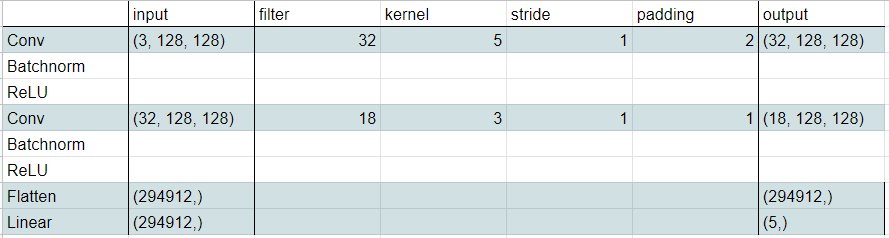

1. batch size = 64

1-1) learning rate = 1e-2

In [ ]:
C, H, W = 3, 128, 128
num_classes = 5
channel_1 = 32
channel_2 = 16
kernel_size_1 = 5
pad_size_1 = 2
kernel_size_2 = 3
pad_size_2 = 1

learning_rate = 1e-2
momentum = 0.5

model = None
optimizer = None

model = nn.Sequential(
    nn.Conv2d(C, channel_1, kernel_size_1, stride=1, padding=pad_size_1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(channel_1, channel_2, kernel_size_2, stride=1, padding=pad_size_2),
    nn.BatchNorm2d(16),
    nn.ReLU(), 
    Flatten(),
    nn.Linear(channel_2*H*W, num_classes)
)

weight_decay = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

print('Architecture:')
print(model) # printing `nn.Module` shows the architecture of the module.

accuracy, iteration, train_accuracy = train_model(model, optimizer, epochs=10)

Architecture:
Sequential(
  (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Flatten()
  (7): Linear(in_features=262144, out_features=5, bias=True)
)
Epoch 0, Iteration 0, loss = 1.6190
Checking accuracy on validation set
Got 2454 / 5136 correct (47.78)

Epoch 0, Iteration 100, loss = 4.6393
Checking accuracy on validation set
Got 1667 / 5136 correct (32.46)

Epoch 0, Iteration 200, loss = 2.1164
Checking accuracy on validation set
Got 2048 / 5136 correct (39.88)

Epoch 1, Iteration 300, loss = 1.2277
Checking accuracy on validation set
Got 2659 / 5136 correct (51.77)

Epoch 1, Iteration 400, loss = 1.3394
Checking accuracy on validation set
Got 2712 / 5136 correct (52.80)

Epoch 2, Itera

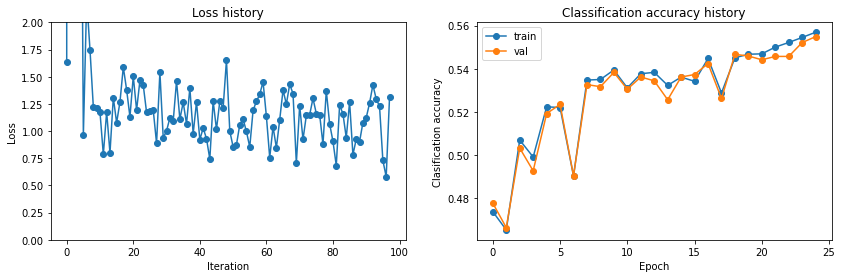

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(loss, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, 'o-', label='train')
plt.plot(accuracy, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

In [ ]:
print(check_accuracy_test(loader_test,model))

Checking accuracy on test set
Got 2913 / 5137 correct (56.71)
0.5670624878333658


1-2 ) learning rate 1e-4


In [ ]:
C, H, W = 3, 128, 128
num_classes = 5
channel_1 = 32
channel_2 = 16
kernel_size_1 = 5
pad_size_1 = 2
kernel_size_2 = 3
pad_size_2 = 1

learning_rate = 1e-4
momentum = 0.5

model = None
optimizer = None

model = nn.Sequential(
    nn.Conv2d(C, channel_1, kernel_size_1, stride=1, padding=pad_size_1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(channel_1, channel_2, kernel_size_2, stride=1, padding=pad_size_2),
    nn.BatchNorm2d(16),
    nn.ReLU(), 
    Flatten(),
    nn.Linear(channel_2*H*W, num_classes)
)

weight_decay = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

print('Architecture:')
print(model) # printing `nn.Module` shows the architecture of the module.

accuracy, iteration, train_accuracy = train_model(model, optimizer, epochs=10)

Architecture:
Sequential(
  (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Flatten()
  (7): Linear(in_features=262144, out_features=5, bias=True)
)
Epoch 0, Iteration 0, loss = 1.7708
Checking accuracy on validation set
Got 2454 / 5136 correct (47.78)

Epoch 0, Iteration 100, loss = 1.4188
Checking accuracy on validation set
Got 2524 / 5136 correct (49.14)

Epoch 0, Iteration 200, loss = 1.6347
Checking accuracy on validation set
Got 2831 / 5136 correct (55.12)

Epoch 1, Iteration 300, loss = 1.5111
Checking accuracy on validation set
Got 2702 / 5136 correct (52.61)

Epoch 1, Iteration 400, loss = 1.2258
Checking accuracy on validation set
Got 3101 / 5136 correct (60.38)

Epoch 2, Itera

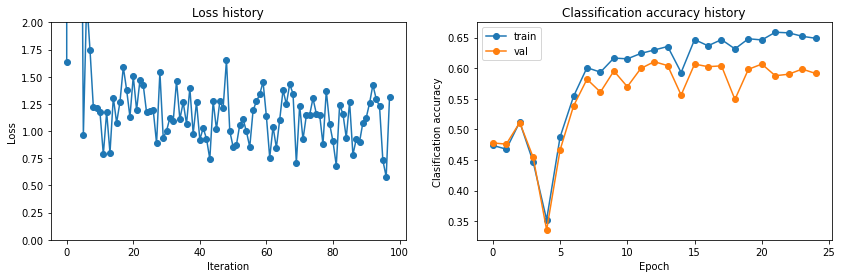

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(loss, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, 'o-', label='train')
plt.plot(accuracy, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

In [ ]:
print(check_accuracy_test(loader_test,model))

Checking accuracy on test set
Got 2918 / 5137 correct (56.80)
0.5680358185711505


2. batch size = 16

learning rate = 2e-3

In [ ]:
NUM_TRAIN, NUM_VAL, NUM_TEST = 15409 , 5136, 5137

data_train = TrainDataset()
data_train.norm

loader_train = DataLoader(data_train  , batch_size=16, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))

data_valid = ValidDataset()
data_valid.norm
loader_val = DataLoader(data_valid , batch_size=16, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))

data_test = TestDataset()
data_test.norm
loader_test = DataLoader(data_test , batch_size=16, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TEST)))

In [ ]:
C, H, W = 3, 128, 128
num_classes = 5
channel_1 = 32
channel_2 = 16
kernel_size_1 = 5
pad_size_1 = 2
kernel_size_2 = 3
pad_size_2 = 1

learning_rate = 2e-3
momentum = 0.5

model = None
optimizer = None

model = nn.Sequential(
    nn.Conv2d(C, channel_1, kernel_size_1, stride=1, padding=pad_size_1),
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.Conv2d(channel_1, channel_2, kernel_size_2, stride=1, padding=pad_size_2),
    nn.BatchNorm2d(16),
    nn.ReLU(), 
    Flatten(),
    nn.Linear(channel_2*H*W, num_classes)
)

weight_decay = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

print('Architecture:')
print(model) # printing `nn.Module` shows the architecture of the module.

accuracy, iteration, train_accuracy = train_model(model, optimizer, epochs=10)

Architecture:
Sequential(
  (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Flatten()
  (7): Linear(in_features=262144, out_features=5, bias=True)
)
Epoch 0, Iteration 0, loss = 1.4892
Checking accuracy on validation set
Got 1511 / 5136 correct (29.42)

Epoch 0, Iteration 100, loss = 22.8822
Checking accuracy on validation set
Got 1167 / 5136 correct (22.72)

Epoch 0, Iteration 200, loss = 18.7753
Checking accuracy on validation set
Got 2115 / 5136 correct (41.18)

Epoch 0, Iteration 300, loss = 6.9077
Checking accuracy on validation set
Got 2298 / 5136 correct (44.74)

Epoch 0, Iteration 400, loss = 7.1330
Checking accuracy on validation set
Got 2800 / 5136 correct (54.52)

Epoch 0, Ite

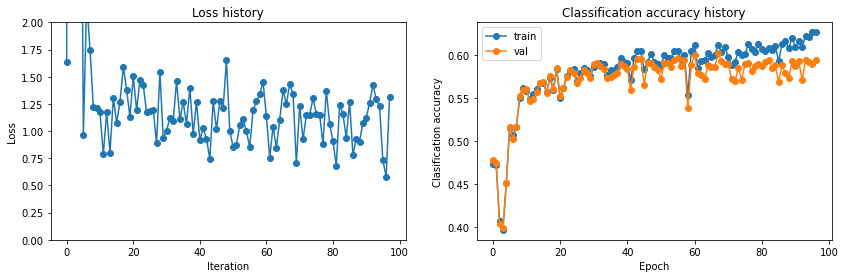

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(loss, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, 'o-', label='train')
plt.plot(accuracy, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

In [ ]:
print(check_accuracy_test(loader_test,model))

Checking accuracy on test set
Got 3094 / 5137 correct (60.23)
0.6022970605411719


###model 2 
앞에서 batch size = 16, learning rate = 2e-3 일 때 성능이 향상되는 것을 확인했다. 따라서 해당 hyperparameter를 사용한 새로운 모델을 구현해보고자 했다.
AlexNet을 참고한 레이어들을 깊게 쌓았다.

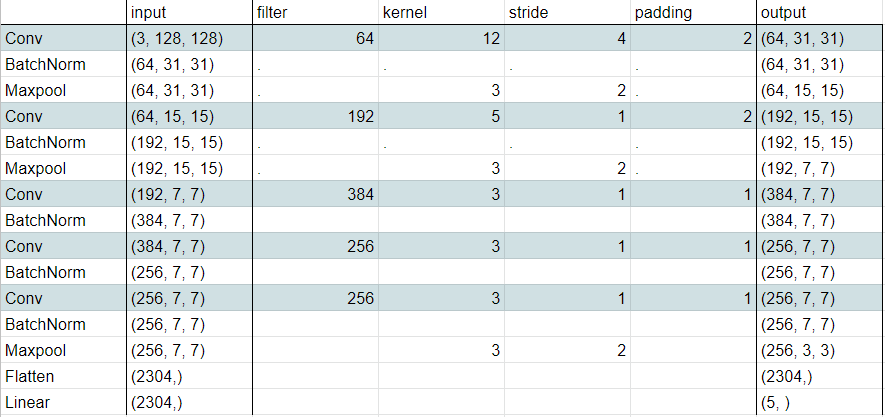

In [ ]:
C, H, W = 3, 128, 128
num_classes = 5
channel_1= 64
kernel_1 = 12

channel_2 = 192
kernel_2 = 5

channel_3 = 384
kernel_3 = 3

channel_4 = 256
kernel_4 = 3

pool_kernel = 3
fc_channel = 1500

learning_rate = 2e-3
momentum = 0.5

model = None
optimizer = None

model= nn.Sequential(
    nn.Conv2d(C, channel_1, kernel_1, stride=4, padding=2),
    nn.BatchNorm2d(channel_1),
    nn.MaxPool2d(pool_kernel, stride = 2),
    nn.Conv2d(channel_1, channel_2, kernel_2, stride=1,padding=2),
    nn.BatchNorm2d(channel_2),
    nn.MaxPool2d(pool_kernel,stride = 2),
    nn.Conv2d(channel_2, channel_3, kernel_3, stride=1,padding=1),
    nn.BatchNorm2d(channel_3),
    nn.Conv2d(channel_3, channel_4, kernel_4, stride=1,padding=1),
    nn.BatchNorm2d(channel_4),
    nn.Conv2d(channel_4, channel_4, kernel_4, stride=1,padding=1),
    nn.BatchNorm2d(channel_4),
    nn.MaxPool2d(pool_kernel,stride = 2),
    Flatten(),
    nn.Linear(channel_4*3*3, num_classes)
)
weight_decay = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

print('Architecture:')
print(model) # printing `nn.Module` shows the architecture of the module.

accuracy, iteration, train_accuracy = train_model(model, optimizer, epochs=10)

Architecture:
Sequential(
  (0): Conv2d(3, 64, kernel_size=(12, 12), stride=(4, 4), padding=(2, 2))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

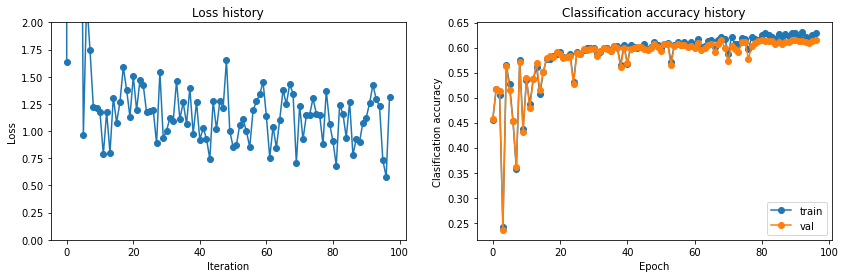

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(loss, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, 'o-', label='train')
plt.plot(accuracy, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

In [ ]:
print(check_accuracy_test(loader_test,model))

Checking accuracy on test set
Got 3165 / 5137 correct (61.61)
0.6161183570177147


# ResNet model


### ResNet setting


In [ ]:
#3x3 convolution layer는 kernel_size=3, padding=1이므로 사이즈는 변하지 않고 채널 수만 변함
#(stride 조절시 사이즈도 변할 수 있음). 
#groups는 입력과 출력의 연결을 그룹화한다(1일 경우 입력 전체 채널과 출력 전체 채널이 연결되고 2일 경우 입력 절반의 채널과 
#출력 절반의 채널의 연결 2개가 나란히 연결된다).


def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def conv1x1(in_planes, out_planes, stride=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)

In [ ]:
class BasicBlock(nn.Module):
    expansion = 1
    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        #norm_layer가 기본값인 None일 경우 batchNorm2d로 정의
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        #groups와 base_width가 기본값이 아닐경우 에러를 출력
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock에서 groups=1 과 base_width=64 만 가능')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1은 BasicBlock에 해당 없음.")
        # self.conv1 와 self.downsample layers 는 stride가 2일경우만 downsample
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x
        #위에서 정의한 layer 순서대로 진행
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        #downsample되지 않았을경우 x 값을 layer block 거친대로 맞춰줌
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out

In [ ]:
# Bottleneck에서는 3x3 layer 2개를 연결하면 연산량이 많아지므로 1x1 layer로 채널(차원)을 줄이고
# 3x3 layer를 실행한 뒤 다시 1x1 layer로 채널을 늘린다.
class Bottleneck(nn.Module):
    expansion = 4
    #4만큼 채널을 줄이고 확장

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        #채널을 몇으로 줄일지 width 정함
        width = int(planes * (base_width / 64.)) * groups
        
        #conv1은 input channel(inplanes)을 width channel로 낮춘다.
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        #conv2는 낮춰진 채널로 conv3x3
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        # conv3은 width채널을 output channel(planes) * expansion channel로 확장시킨다.
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out






In [ ]:
class ResNet(nn.Module):
    # 최종 출력 피쳐(num_classees)는 5이고, zero_init_residual은 Block을 나갈때
    #weight를 0으로 초기화한다.
    def __init__(self, block, layers, num_classes=5, zero_init_residual=False,
                 groups=1, width_per_group=64, replace_stride_with_dilation=None,
                 norm_layer=None):
        super(ResNet, self).__init__()

        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer
        #초기 conv1 layer의 cout=64
        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
           
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 3-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups
        self.base_width = width_per_group
        # conv1은 3채널(RGB)를 64채널로 확장시킴. size가 (size+7)/2 가 됨
        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        # maxpool함. size는 (size+3)/2가 됨.
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dilate=replace_stride_with_dilation[0])
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dilate=replace_stride_with_dilation[1])
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        # 각 채널의 이미지를 (1,1) 사이즈로 AveragePooling 한다.
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        # 최종 출력 사이즈는 최초 입력 사이즈와 다르기 때문에 최조 입력 사이즈를
        # 최종 출력 사이즈에 맞게 downsample한다.
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups,
                            self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        # 파라미터로 받은만큼 block을 추가한다.
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups,
                                base_width=self.base_width, dilation=self.dilation,
                                norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def _forward_impl(self, x):
       #3 x 128 x 128
        x = self.conv1(x)
        #64 x 64 x 64
        x = self.bn1(x)
        #64 x 64 x 64
        x = self.relu(x)
        #64 x 64 x 64
        x = self.maxpool(x)
        #64 x 32 x 32

        x = self.layer1(x)
        #256 x 32 x 32
        x = self.layer2(x)
        #512 x 16 x 16
        x = self.layer3(x)
        #1024 x 8 x 8
        x = self.layer4(x)
        #2048 x 4 x 4
        x = self.avgpool(x)
        #2048 x 1 x 1
        x = torch.flatten(x, 1)
        #2048
        x = self.fc(x)
        #5

        return x

    def forward(self, x):
        return self._forward_impl(x)

In [ ]:
def _resnet(arch, block, layers, pretrained, progress, **kwargs):
    model = ResNet(block, layers, **kwargs)
    if pretrained:
        state_dict = load_state_dict_from_url(model_urls[arch],
                                              progress=progress)
        model.load_state_dict(state_dict)
    return model


def resnet18(pretrained=False, progress=True, **kwargs):
   
    return _resnet('resnet18', BasicBlock, [2, 2, 2, 2], pretrained, progress,
                   **kwargs)


def resnet34(pretrained=False, progress=True, **kwargs):
   
    return _resnet('resnet34', BasicBlock, [3, 4, 6, 3], pretrained, progress,
                   **kwargs)


def resnet50(pretrained=False, progress=True, **kwargs):
   
    return _resnet('resnet50', Bottleneck, [3, 4, 6, 3], pretrained, progress,
                   **kwargs)


def resnet101(pretrained=False, progress=True, **kwargs):
   
    return _resnet('resnet101', Bottleneck, [3, 4, 23, 3], pretrained, progress,
                   **kwargs)


def resnet152(pretrained=False, progress=True, **kwargs):
    
    return _resnet('resnet152', Bottleneck, [3, 8, 36, 3], pretrained, progress,
                   **kwargs)

### ResNet50


In [ ]:
model_resnet50=resnet50()

In [ ]:
learning_rate = 2e-3
weight_decay = 1e-4
optimizer = torch.optim.Adam(model_resnet50.parameters(), lr=learning_rate)

print('Architecture:')
print(model_resnet50)

accuracy1, iteration1, train_accuracy1 ,loss_history1= train_model(model_resnet50, optimizer, epochs=10)

Architecture:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1

In [ ]:
print(check_accuracy_test(loader_test,model_resnet50))

Checking accuracy on test set
Got 3088 / 5137 correct (60.11)
0.6011290636558303


In [ ]:
loss_history1

tensor([1.0333, 1.0886, 1.1883, 1.1023, 1.0040, 1.0590, 1.1601, 1.0071, 1.0385,
        1.0473, 0.9705, 0.9677, 1.0914, 1.2201, 1.0550, 1.0797, 1.0079, 0.9887,
        1.1034, 0.9531, 1.0008, 1.2050, 0.9660, 0.9421, 1.0108])

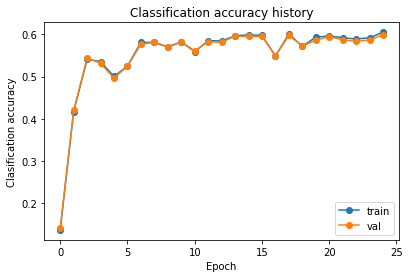

In [ ]:
plt.subplot(1, 2, 2)
plt.plot(train_accuracy1, 'o-', label='train')
plt.plot(accuracy1, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

(0.0, 2.0)

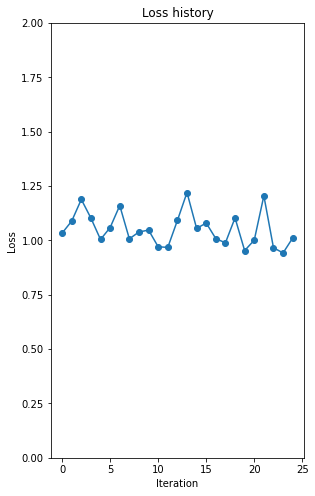

In [ ]:


plt.subplot(1, 2, 1)
plt.plot(loss_history1, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)


### ResNet101

In [ ]:
model_resnet101=resnet101()

In [ ]:
learning_rate = 2e-3
weight_decay = 1e-4
optimizer = torch.optim.Adam(model_resnet101.parameters(), lr=learning_rate)

print('Architecture:')
print(model_resnet101)

accuracy2, iteration2, train_accuracy2 ,loss_history2= train_model(model_resnet101, optimizer, epochs=10)

Architecture:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1

In [ ]:
print(check_accuracy_test(loader_test,model_resnet101))

Checking accuracy on test set
Got 2941 / 5137 correct (57.25)
0.5725131399649601


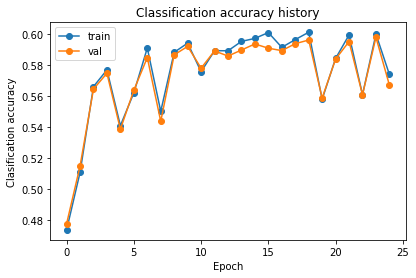

In [ ]:
plt.subplot(1, 2, 2)
plt.plot(train_accuracy2, 'o-', label='train')
plt.plot(accuracy2, 'o-', label='val')
plt.title('Classification accuracy history')
plt.xlabel('Epoch')
plt.ylabel('Clasification accuracy')
plt.legend()
plt.gcf().set_size_inches(14, 4)
plt.show()

(0.0, 2.0)

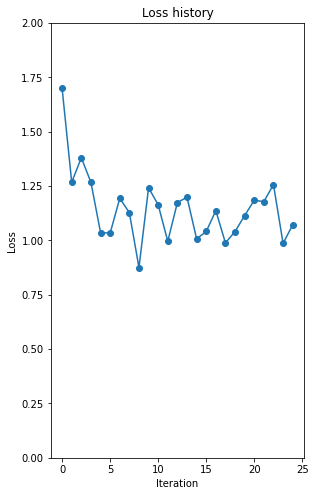

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(loss_history2, 'o-')
plt.title('Loss history')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.ylim(0, 2)